# 你的第一个神经网络

在此项目中，你将构建你的第一个神经网络，并用该网络预测每日自行车租客人数。我们提供了一些代码，但是需要你来实现神经网络（大部分内容）。提交此项目后，欢迎进一步探索该数据和模型。

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

## 加载和准备数据

构建神经网络的关键一步是正确地准备数据。不同尺度级别的变量使网络难以高效地掌握正确的权重。我们在下方已经提供了加载和准备数据的代码。你很快将进一步学习这些代码！

In [3]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [4]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## 数据简介

此数据集包含的是从 2011 年 1 月 1 日到 2012 年 12 月 31 日期间每天每小时的骑车人数。骑车用户分成临时用户和注册用户，cnt 列是骑车用户数汇总列。你可以在上方看到前几行数据。

下图展示的是数据集中前 10 天左右的骑车人数（某些天不一定是 24 个条目，所以不是精确的 10 天）。你可以在这里看到每小时租金。这些数据很复杂！周末的骑行人数少些，工作日上下班期间是骑行高峰期。我们还可以从上方的数据中看到温度、湿度和风速信息，所有这些信息都会影响骑行人数。你需要用你的模型展示所有这些数据。

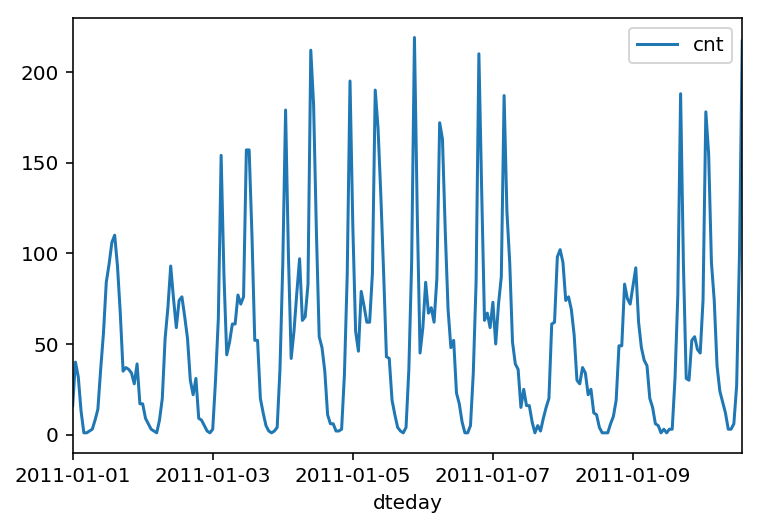

In [5]:
rides[:24*10].plot(x='dteday', y='cnt')


### 虚拟变量（哑变量）

下面是一些分类变量，例如季节、天气、月份。要在我们的模型中包含这些数据，我们需要创建二进制虚拟变量。用 Pandas 库中的 `get_dummies()` 就可以轻松实现。

In [6]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### 调整目标变量

为了更轻松地训练网络，我们将对每个连续变量标准化，即转换和调整变量，使它们的均值为 0，标准差为 1。

我们会保存换算因子，以便当我们使用网络进行预测时可以还原数据。

In [7]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### 将数据拆分为训练、测试和验证数据集

我们将大约最后 21 天的数据保存为测试数据集，这些数据集会在训练完网络后使用。我们将使用该数据集进行预测，并与实际的骑行人数进行对比。

In [8]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

我们将数据拆分为两个数据集，一个用作训练，一个在网络训练完后用来验证网络。因为数据是有时间序列特性的，所以我们用历史数据进行训练，然后尝试预测未来数据（验证数据集）。

In [9]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## 开始构建网络

下面你将构建自己的网络。我们已经构建好结构和反向传递部分。你将实现网络的前向传递部分。还需要设置超参数：学习速率、隐藏单元的数量，以及训练传递数量。

<img src="assets/neural_network.png" width=300px>

该网络有两个层级，一个隐藏层和一个输出层。隐藏层级将使用 S 型函数作为激活函数。输出层只有一个节点，用于递归，节点的输出和节点的输入相同。即激活函数是 $f(x)=x$。这种函数获得输入信号，并生成输出信号，但是会考虑阈值，称为激活函数。我们完成网络的每个层级，并计算每个神经元的输出。一个层级的所有输出变成下一层级神经元的输入。这一流程叫做前向传播（forward propagation）。

我们在神经网络中使用权重将信号从输入层传播到输出层。我们还使用权重将错误从输出层传播回网络，以便更新权重。这叫做反向传播（backpropagation）。

> **提示**：你需要为反向传播实现计算输出激活函数 ($f(x) = x$) 的导数。如果你不熟悉微积分，其实该函数就等同于等式 $y = x$。该等式的斜率是多少？也就是导数 $f(x)$。


你需要完成以下任务：

1. 实现 S 型激活函数。将 `__init__` 中的 `self.activation_function`  设为你的 S 型函数。
2. 在 `train` 方法中实现前向传递。
3. 在 `train` 方法中实现反向传播算法，包括计算输出错误。
4. 在 `run` 方法中实现前向传递。

  

In [10]:
class NeuralNetwork(object):
    def __init__(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Initialize weights
        self.weights_input_to_hidden = np.random.normal(0.0, self.input_nodes**-0.5, 
                                       (self.input_nodes, self.hidden_nodes))

        self.weights_hidden_to_output = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                       (self.hidden_nodes, self.output_nodes))
        self.lr = learning_rate
        
        #### TODO: Set self.activation_function to your implemented sigmoid function ####
        #
        # Note: in Python, you can define a function with a lambda expression,
        # as shown below.
        self.activation_function = lambda x:1/(1 + np.exp(-x)) # Replace 0 with your sigmoid calculation.
        
        ### If the lambda code above is not something you're familiar with,
        # You can uncomment out the following three lines and put your 
        # implementation there instead.
        #
        #def sigmoid(x):
        #    return 0  # Replace 0 with your sigmoid calculation here
        #self.activation_function = sigmoid
                    
    
    def train(self, features, targets):
        ''' Train the network on batch of features and targets. 
        
            Arguments
            ---------
            
            features: 2D array, each row is one data record, each column is a feature
            targets: 1D array of target values
        
        '''
        n_records = features.shape[0]
        delta_weights_i_h = np.zeros(self.weights_input_to_hidden.shape)
        delta_weights_h_o = np.zeros(self.weights_hidden_to_output.shape)
        for X, y in zip(features, targets):
            #### Implement the forward pass here ####
            ### Forward pass ###
            # TODO: Hidden layer - Replace these values with your calculations.
            hidden_inputs = np.dot(X,self.weights_input_to_hidden) # signals into hidden layer
            hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
            print(hidden_outputs)
            # TODO: Output layer - Replace these values with your calculations.
            final_inputs = np.dot(hidden_outputs,self.weights_hidden_to_output) # signals into final output layer
            final_outputs = final_inputs # signals from final output layer
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # TODO: Output error - Replace this value with your calculations.
            error = y-final_outputs # Output layer error is the difference between desired target and actual output.
            
            # TODO: Calculate the hidden layer's contribution to the error
            hidden_error = np.dot(self.weights_hidden_to_output,error)
            
            # TODO: Backpropagated error terms - Replace these values with your calculations.
            output_error_term = error    
            hidden_error_term = hidden_error*hidden_outputs*(1-hidden_outputs)

            # Weight step (input to hidden)
            delta_weights_i_h += hidden_error_term*X[:, None]
            # Weight step (hidden to output)
            delta_weights_h_o += hidden_outputs[:, None]*output_error_term 
        # TODO: Update the weights - Replace these values with your calculations.
        self.weights_hidden_to_output += self.lr*delta_weights_h_o/n_records # update hidden-to-output weights with gradient descent step
        self.weights_input_to_hidden += self.lr*delta_weights_i_h/n_records # update input-to-hidden weights with gradient descent step
 
    def run(self, features):
        ''' Run a forward pass through the network with input features 
        
            Arguments
            ---------
            features: 1D array of feature values
        '''
        
        #### Implement the forward pass here ####
        # TODO: Hidden layer - replace these values with the appropriate calculations.
        hidden_inputs = np.dot(features,self.weights_input_to_hidden) # signals into hidden layer
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # TODO: Output layer - Replace these values with the appropriate calculations.
        final_inputs = np.dot(hidden_outputs,self.weights_hidden_to_output) # signals into final output layer
        final_outputs = final_inputs  # signals from final output layer 
        
        return final_outputs

In [11]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## 单元测试

运行这些单元测试，检查你的网络实现是否正确。这样可以帮助你确保网络已正确实现，然后再开始训练网络。这些测试必须成功才能通过此项目。

In [12]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

[ 0.4850045   0.45512111]



----------------------------------------------------------------------
Ran 5 tests in 0.078s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## 训练网络

现在你将设置网络的超参数。策略是设置的超参数使训练集上的错误很小但是数据不会过拟合。如果网络训练时间太长，或者有太多的隐藏节点，可能就会过于针对特定训练集，无法泛化到验证数据集。即当训练集的损失降低时，验证集的损失将开始增大。

你还将采用随机梯度下降 (SGD) 方法训练网络。对于每次训练，都获取随机样本数据，而不是整个数据集。与普通梯度下降相比，训练次数要更多，但是每次时间更短。这样的话，网络训练效率更高。稍后你将详细了解 SGD。


### 选择迭代次数

也就是训练网络时从训练数据中抽样的批次数量。迭代次数越多，模型就与数据越拟合。但是，如果迭代次数太多，模型就无法很好地泛化到其他数据，这叫做过拟合。你需要选择一个使训练损失很低并且验证损失保持中等水平的数字。当你开始过拟合时，你会发现训练损失继续下降，但是验证损失开始上升。

### 选择学习速率

速率可以调整权重更新幅度。如果速率太大，权重就会太大，导致网络无法与数据相拟合。建议从 0.1 开始。如果网络在与数据拟合时遇到问题，尝试降低学习速率。注意，学习速率越低，权重更新的步长就越小，神经网络收敛的时间就越长。


### 选择隐藏节点数量

隐藏节点越多，模型的预测结果就越准确。尝试不同的隐藏节点的数量，看看对性能有何影响。你可以查看损失字典，寻找网络性能指标。如果隐藏单元的数量太少，那么模型就没有足够的空间进行学习，如果太多，则学习方向就有太多的选择。选择隐藏单元数量的技巧在于找到合适的平衡点。

In [21]:
import sys

### Set the hyperparameters here ###
iterations = 600
learning_rate = 0.2
hidden_nodes = 18
output_nodes = 1

N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

[ 0.58508347  0.32233212  0.55482392  0.39655946  0.24602954  0.20856729
  0.46637824  0.5236114   0.49066392  0.5647012   0.59434968  0.40357944
  0.41120418  0.6739365   0.52051664  0.72996285  0.6363514   0.56670852]
[ 0.64425502  0.40915199  0.50898744  0.49629572  0.36114844  0.34108542
  0.58571494  0.57358977  0.51026094  0.56235909  0.46820398  0.52618904
  0.54407616  0.45913091  0.6274202   0.61231145  0.49693718  0.33241486]
[ 0.49728114  0.51106919  0.38591583  0.44405315  0.52113084  0.44384447
  0.51303377  0.47546489  0.50365504  0.48049428  0.50674291  0.58846673
  0.42524679  0.43578324  0.58914524  0.54311178  0.41979269  0.4318338 ]
[ 0.53322805  0.59159287  0.56236854  0.54285297  0.54044526  0.41269584
  0.37225203  0.55125048  0.42544432  0.51377084  0.5877576   0.42077295
  0.31630753  0.50853979  0.48425227  0.58347517  0.41553262  0.54358825]
[ 0.45073215  0.55029968  0.49171532  0.40811405  0.55091574  0.43776642
  0.36022622  0.63364884  0.48942937  0.5560757

Progress: 0.0% ... Training loss: 0.992 ... Validation loss: 1.343[ 0.34071782  0.56203442  0.55965883  0.49015029  0.55661132  0.64259631
  0.39496214  0.43481611  0.54401759  0.56776047  0.31216763  0.68310225
  0.4228525   0.53288112  0.41840573  0.45953642  0.39894013  0.48175879]
[ 0.4080841   0.48073224  0.43095076  0.53917339  0.5055508   0.65204919
  0.36852353  0.49030207  0.53505916  0.59848345  0.36315019  0.46754838
  0.39728958  0.36609539  0.44638262  0.44003957  0.3116073   0.56334111]
[ 0.62329931  0.35338085  0.31090883  0.43173368  0.37076848  0.28195367
  0.38683482  0.56101276  0.49473419  0.52470865  0.53220823  0.23544238
  0.49408283  0.47665266  0.56794674  0.58008649  0.41740889  0.44983473]
[ 0.31656321  0.61873374  0.42106021  0.71094585  0.49651494  0.75223897
  0.45911278  0.57485536  0.52734274  0.59099455  0.26468603  0.61709004
  0.43824905  0.34924834  0.34111746  0.38440736  0.3690466   0.52631585]
[ 0.33824696  0.53529646  0.48966825  0.47130892  0.44

Progress: 0.2% ... Training loss: 0.976 ... Validation loss: 1.434[ 0.46731328  0.52853899  0.59064434  0.51027722  0.45831549  0.58775291
  0.43821323  0.46240529  0.40959888  0.63810252  0.3776449   0.51620088
  0.44470417  0.52501319  0.4381129   0.66618919  0.64321558  0.55840962]
[ 0.54264421  0.43702146  0.70140029  0.64046095  0.4805565   0.45547543
  0.51520881  0.53726843  0.51564743  0.62566094  0.40272536  0.6408182
  0.46816467  0.567749    0.53142526  0.65897637  0.63254913  0.49263285]
[ 0.57449728  0.39987826  0.38206972  0.38585569  0.39605218  0.29831934
  0.45721673  0.47133145  0.57976781  0.4786264   0.6461097   0.34175751
  0.29435518  0.71861065  0.54704602  0.61938743  0.43064691  0.52390592]
[ 0.50619726  0.32865524  0.33888428  0.49084421  0.37884146  0.39239397
  0.49461975  0.53772387  0.56979593  0.45316144  0.44132364  0.49483868
  0.32762261  0.58528615  0.52767932  0.60542823  0.38610795  0.54283634]
[ 0.50345763  0.33604343  0.44699049  0.4253238   0.364

[ 0.45719908  0.54273368  0.58528349  0.31472191  0.49484781  0.51695355
  0.43339627  0.43674869  0.51864663  0.59009606  0.43007722  0.56930523
  0.52077245  0.51513582  0.47954977  0.61034693  0.56317258  0.51557101]
[ 0.48493459  0.66518108  0.58023288  0.61570945  0.49015948  0.63743359
  0.49432381  0.51233383  0.48579103  0.65046604  0.43685119  0.60601504
  0.52039882  0.36792673  0.47351951  0.45739441  0.43263091  0.44979807]
[ 0.43980257  0.61417596  0.58290425  0.69188095  0.44668835  0.66769145
  0.46111482  0.48898465  0.56217756  0.59163137  0.31520958  0.73186179
  0.40587993  0.45607451  0.44277616  0.41934725  0.47794258  0.50988246]
[ 0.59240844  0.38232509  0.28194197  0.45934324  0.37818815  0.48032573
  0.43472513  0.50442544  0.51251464  0.50315739  0.51779205  0.31587819
  0.4384275   0.47747608  0.58032314  0.49947998  0.42533598  0.46785987]
[ 0.40667791  0.692698    0.52005158  0.47338786  0.50882041  0.79044578
  0.39631094  0.41099185  0.49720073  0.5750269

[ 0.41916513  0.61316746  0.35564991  0.5066549   0.50192139  0.68145373
  0.39823017  0.44546275  0.52296704  0.60195367  0.29105626  0.55936547
  0.40944788  0.59881475  0.40360733  0.36213908  0.41763902  0.5061905 ]
[ 0.57503009  0.38182755  0.47431811  0.40878319  0.33218102  0.50918562
  0.42966455  0.35212853  0.47867498  0.53349375  0.47716009  0.44390052
  0.43079413  0.40371871  0.52151388  0.56159427  0.5284889   0.44360793]
[ 0.61046059  0.45949526  0.53526802  0.57922404  0.31538314  0.30804199
  0.5778676   0.64841565  0.53263611  0.59151961  0.58579245  0.51036925
  0.55871338  0.47192197  0.61742606  0.55711877  0.48020962  0.4079158 ]
[ 0.55497686  0.51206407  0.61637018  0.52263639  0.52476036  0.49211633
  0.48547948  0.42839349  0.57484836  0.45740489  0.47992243  0.46830029
  0.38210271  0.47415389  0.57346414  0.55564762  0.56938376  0.49301996]
[ 0.72594378  0.43764663  0.48650239  0.45445702  0.44638341  0.22975172
  0.55253547  0.63873271  0.47977531  0.5784204

  0.41042535  0.36437109  0.53446141  0.51806206  0.46595461  0.50223997]
[ 0.46985984  0.4385032   0.49426362  0.42302641  0.47210812  0.49752848
  0.44799318  0.38849593  0.481397    0.50104805  0.46022943  0.50623781
  0.43730791  0.61190174  0.59113749  0.6358953   0.5943668   0.58976757]
[ 0.35174883  0.58551711  0.41584698  0.63470074  0.5925215   0.78364925
  0.43085107  0.43109313  0.49246486  0.59110509  0.22902799  0.7337289
  0.36128602  0.40215119  0.36150693  0.46257869  0.39936541  0.48895439]
[ 0.61478847  0.4226627   0.39174321  0.36085564  0.35035301  0.26923182
  0.50151968  0.57609981  0.46897946  0.51498673  0.59095577  0.27652008
  0.56046975  0.52735788  0.63450664  0.59845728  0.503048    0.45430575]
[ 0.39432697  0.41056091  0.4625445   0.55596543  0.51796645  0.69025678
  0.39470594  0.45440247  0.57424796  0.39824607  0.37339568  0.56153976
  0.35879647  0.44452842  0.54569819  0.53029771  0.51628825  0.55365326]
[ 0.54102424  0.36220583  0.38202595  0.4428012

[ 0.37835115  0.54930837  0.49820972  0.5378435   0.49342178  0.64861008
  0.40299921  0.36982357  0.52679942  0.55534689  0.35779747  0.66856649
  0.381393    0.3871913   0.4113569   0.51039274  0.45923247  0.6003496 ]
[ 0.5840702   0.35717053  0.3808481   0.41528193  0.32672144  0.25521857
  0.52075288  0.61277635  0.48614849  0.51577478  0.56913904  0.3887309
  0.39830925  0.61882806  0.55914127  0.59494335  0.43694862  0.56968071]
[ 0.58233502  0.42881819  0.48084143  0.39222997  0.29040768  0.34470719
  0.41760412  0.51805304  0.4442342   0.52421626  0.55756293  0.54060378
  0.33223665  0.60349376  0.48263437  0.63593163  0.56622538  0.45563885]
[ 0.45141002  0.4656726   0.44877215  0.58803941  0.56655307  0.5868324
  0.35770821  0.37312768  0.52206425  0.56761455  0.37480425  0.72313626
  0.32085202  0.5551195   0.39599865  0.49884442  0.51502899  0.59616348]
[ 0.62595674  0.42926793  0.39496803  0.39631651  0.38494616  0.37279918
  0.52397989  0.50913034  0.447238    0.52867219 

[ 0.35922524  0.37058076  0.45134857  0.44254736  0.60814313  0.53626289
  0.40439323  0.39195796  0.59486886  0.52144754  0.47271639  0.59338651
  0.42884258  0.61631937  0.53432261  0.67683315  0.64652242  0.62568215]
[ 0.36992797  0.59625819  0.53523323  0.55095013  0.53493618  0.6974658
  0.34391688  0.42032562  0.45981732  0.56864119  0.29683506  0.65443918
  0.37584705  0.46029725  0.39031091  0.38536671  0.4444017   0.51128891]
[ 0.43384981  0.47449681  0.48705671  0.58569679  0.46092279  0.6683402
  0.31512349  0.40819988  0.451299    0.5907913   0.39122129  0.50608312
  0.44483314  0.38616797  0.4047764   0.48964111  0.45805628  0.48626692]
[ 0.37581042  0.5408038   0.59053444  0.54547497  0.42087974  0.7680462
  0.40007553  0.36314183  0.45167365  0.57003187  0.30379786  0.68327278
  0.39386104  0.35789921  0.39094047  0.46936784  0.4756677   0.43956106]
[ 0.37524052  0.61646939  0.38447153  0.49594665  0.49281219  0.73010656
  0.35276264  0.43890632  0.56622295  0.51954957  

Progress: 0.7% ... Training loss: 0.937 ... Validation loss: 1.315[ 0.38202771  0.58883504  0.52378727  0.48748919  0.55381429  0.55637865
  0.3853443   0.38858808  0.50253172  0.45612019  0.52361953  0.59472345
  0.20449479  0.54654441  0.46592528  0.55913192  0.50592945  0.65895606]
[ 0.34027769  0.59425231  0.38261567  0.56872054  0.50559234  0.73264528
  0.29373162  0.51176613  0.47800005  0.63740795  0.32349143  0.51329899
  0.51514419  0.4565243   0.40130021  0.3597461   0.3388436   0.47974339]
[ 0.49183048  0.27251735  0.42688859  0.41611894  0.37225825  0.20953651
  0.49155929  0.43059475  0.55137347  0.47119793  0.66887493  0.50482265
  0.40320812  0.61744992  0.48181509  0.76302567  0.60219872  0.53500277]
[ 0.39064556  0.48874607  0.48477995  0.53284208  0.58590462  0.67473915
  0.41746783  0.41617784  0.49971174  0.55052087  0.3615754   0.65532673
  0.44040888  0.38485     0.40670739  0.57768547  0.46457911  0.47628817]
[ 0.56059789  0.57606061  0.64901294  0.49042204  0.47

  0.28445958  0.49466627  0.37990197  0.53932576  0.47892714  0.61832222]
[ 0.45263495  0.54342385  0.43816432  0.46722183  0.56003985  0.43022889
  0.37725799  0.55070929  0.46293117  0.54833149  0.51885549  0.46404705
  0.39088394  0.64870044  0.62566271  0.55686287  0.35785027  0.50059505]
[ 0.52201266  0.54603332  0.57274831  0.36178283  0.31726955  0.52357892
  0.48329777  0.47186227  0.41028992  0.55873354  0.52310539  0.55175043
  0.56066719  0.49486494  0.50512177  0.56323338  0.61146241  0.38628044]
[ 0.44669718  0.42266403  0.5889438   0.44961166  0.40090077  0.4489931
  0.46884124  0.4806835   0.4383486   0.62745381  0.47180151  0.48820552
  0.4320039   0.53534011  0.50045039  0.62346378  0.55341172  0.64945211]
[ 0.46219964  0.61988151  0.66177858  0.41168348  0.55930342  0.64562109
  0.39191815  0.4563458   0.51208776  0.49182124  0.37882055  0.51860545
  0.45016251  0.43569833  0.49128016  0.49959459  0.5436959   0.49780842]
[ 0.42058946  0.52133503  0.54560647  0.4168243

Progress: 0.8% ... Training loss: 0.917 ... Validation loss: 1.333[ 0.50970117  0.44237348  0.45884966  0.48956407  0.46903365  0.66411135
  0.34151647  0.45256143  0.57965297  0.49260142  0.41129131  0.4387394
  0.41057023  0.38913606  0.49999075  0.46440997  0.50356952  0.52941717]
[ 0.57776142  0.51750563  0.66619219  0.44145619  0.55220048  0.28513989
  0.4061572   0.59477518  0.42606629  0.55108618  0.71301141  0.41067618
  0.40209586  0.64094931  0.53455148  0.61332093  0.52574667  0.52846601]
[ 0.42302589  0.41447627  0.62668843  0.39620333  0.50475978  0.46263231
  0.39117629  0.43813625  0.54951941  0.45918134  0.57340014  0.41234078
  0.59181982  0.58958947  0.41129258  0.61316495  0.66411913  0.41249861]
[ 0.42190583  0.39457463  0.53428571  0.4709106   0.52281594  0.47840776
  0.42151241  0.45307055  0.46014764  0.40787102  0.48902405  0.42119094
  0.33651845  0.40790464  0.52663835  0.53486032  0.59597578  0.55907723]
[ 0.424495    0.41219281  0.43691088  0.4896433   0.459

[ 0.45770907  0.43701958  0.73447465  0.5255173   0.41561675  0.54184247
  0.34759865  0.40394548  0.44724671  0.5714645   0.48846141  0.64394796
  0.38981703  0.48244163  0.4674602   0.5931268   0.49418663  0.48430939]
[ 0.3703294   0.60696221  0.47923685  0.47056044  0.5476079   0.63195238
  0.35496157  0.49349533  0.48210522  0.45665866  0.43484685  0.42766217
  0.37066281  0.422459    0.46806183  0.41280009  0.41605805  0.49795834]
[ 0.5164961   0.44213658  0.48141383  0.41552254  0.51284324  0.44691474
  0.44238075  0.50187763  0.41013487  0.52271153  0.54445879  0.44600786
  0.51660106  0.55103156  0.62403745  0.56744873  0.45378483  0.43377911]
[ 0.36267092  0.40850765  0.4971997   0.35992508  0.530628    0.35279144
  0.4520903   0.46088934  0.5540919   0.5013758   0.61020527  0.4496692
  0.49291253  0.61685868  0.51678348  0.61053715  0.64031005  0.51069299]
[ 0.59097065  0.45766585  0.42965627  0.46828855  0.56467338  0.39797099
  0.43733041  0.60172227  0.47382458  0.42377652

Progress: 1.0% ... Training loss: 0.904 ... Validation loss: 1.335[ 0.34733776  0.63366368  0.49298141  0.49754012  0.51948957  0.75267677
  0.38902375  0.37130016  0.55073295  0.483023    0.21964409  0.65680588
  0.39846634  0.38594207  0.43683864  0.35428348  0.38277849  0.44867587]
[ 0.56581026  0.47475663  0.58527201  0.4162952   0.47942398  0.47630654
  0.44420888  0.41853595  0.48930692  0.5734613   0.51512926  0.38881622
  0.55035749  0.6331439   0.53788616  0.59370947  0.66945121  0.45199311]
[ 0.40648146  0.53837469  0.47718259  0.52469385  0.5188936   0.7665713
  0.35253134  0.41197685  0.54979465  0.56949096  0.26758371  0.51596
  0.49987526  0.43541482  0.42330739  0.33428014  0.39521744  0.51577387]
[ 0.42372974  0.38843526  0.5487227   0.55235353  0.43121198  0.56731366
  0.30534101  0.45474203  0.55135162  0.54958186  0.29572475  0.64972044
  0.39217607  0.6304908   0.40696053  0.56392546  0.51502938  0.53759385]
[ 0.44927365  0.45435083  0.35813827  0.4761548   0.610802

[ 0.47437114  0.42010172  0.70244024  0.36157609  0.53332287  0.32775498
  0.40009374  0.56484762  0.39343224  0.52920147  0.53822611  0.5081028
  0.40484546  0.49189063  0.54347512  0.65623624  0.68293531  0.52172869]
[ 0.5181982   0.38322196  0.60927957  0.52741802  0.48853185  0.54876387
  0.38338554  0.43679157  0.51319336  0.37486661  0.59134885  0.48117786
  0.52402909  0.5360653   0.51811301  0.69739212  0.71361098  0.4653081 ]
[ 0.61006915  0.43846797  0.42408098  0.44005929  0.4125476   0.42015893
  0.39391913  0.39653446  0.35788896  0.58846951  0.53074689  0.395329
  0.55793279  0.35150599  0.55816971  0.49813465  0.51527315  0.32096292]
[ 0.51631106  0.53340101  0.62475748  0.52081126  0.49176252  0.53290231
  0.49761311  0.40633286  0.63752711  0.4623921   0.45185719  0.54736529
  0.42026992  0.51200031  0.5193389   0.49157542  0.60791785  0.48831752]
[ 0.38742841  0.41427467  0.48540493  0.50643212  0.57775717  0.54402973
  0.39822001  0.37888557  0.51121092  0.37250793  

Progress: 1.2% ... Training loss: 0.897 ... Validation loss: 1.385[ 0.51623484  0.5320406   0.62742788  0.52028714  0.49104965  0.5342952
  0.4961809   0.40520218  0.63704462  0.46218239  0.44968544  0.54691414
  0.41900481  0.51156289  0.52285352  0.48966221  0.61060418  0.48970883]
[ 0.43321714  0.61858816  0.47365578  0.46859078  0.47610627  0.67986742
  0.37337389  0.43884709  0.49410775  0.46511672  0.54918353  0.50390646
  0.41697474  0.56984859  0.44349941  0.44486095  0.52919269  0.46968756]
[ 0.36600103  0.58812436  0.58962763  0.50345979  0.60540852  0.63237624
  0.42859089  0.45304811  0.58319899  0.42739003  0.32899249  0.57717878
  0.36379247  0.44194021  0.51472907  0.53314749  0.43871659  0.54451886]
[ 0.41763998  0.47576663  0.63789861  0.30467256  0.42585787  0.37546917
  0.41400376  0.39540901  0.5161162   0.41441977  0.56417135  0.51382604
  0.36711731  0.66029349  0.38552773  0.73445795  0.62585281  0.5606362 ]
[ 0.38117234  0.51634003  0.7371142   0.41768485  0.523

[ 0.43442014  0.55567565  0.52305885  0.49468177  0.50193017  0.72704537
  0.34317245  0.43586592  0.51321666  0.59991288  0.36441792  0.50969413
  0.49307274  0.51457298  0.41629421  0.33187336  0.40439835  0.495316  ]
[ 0.45833093  0.55895018  0.55902096  0.5916532   0.376921    0.63702632
  0.38033153  0.43518904  0.52537616  0.60813386  0.38809461  0.56927286
  0.3640475   0.36980971  0.3773542   0.48869707  0.37179042  0.56337082]
[ 0.59710013  0.35957274  0.3698261   0.4579726   0.48290918  0.52932527
  0.43933872  0.40063759  0.4752901   0.46235472  0.48334642  0.3693699
  0.45565788  0.44638717  0.57765518  0.49190531  0.45361335  0.39838715]
[ 0.58427738  0.41634562  0.24819129  0.45300736  0.43795663  0.24661516
  0.48661924  0.6272627   0.57520596  0.50936821  0.55157002  0.42143348
  0.41381886  0.52969518  0.5259788   0.54730787  0.33117365  0.5384971 ]
[ 0.48070632  0.47762441  0.55669393  0.62431467  0.45132385  0.50057435
  0.35245892  0.52248339  0.47593717  0.50988623

Progress: 1.3% ... Training loss: 0.889 ... Validation loss: 1.281[ 0.6385434   0.44892814  0.36746391  0.40964907  0.37942298  0.3717326
  0.44854867  0.43753796  0.50771004  0.50598106  0.44235613  0.32878547
  0.45289522  0.35055811  0.49909474  0.54316305  0.429095    0.44137964]
[ 0.60606861  0.48467813  0.5207122   0.42476135  0.44925145  0.3708843
  0.58734338  0.58413686  0.52520794  0.46161426  0.57282797  0.46772945
  0.57652263  0.45147954  0.57430978  0.66642736  0.54681681  0.38798897]
[ 0.66652638  0.34550739  0.45784369  0.48187291  0.28021427  0.25301162
  0.44858576  0.50379708  0.49862277  0.48401837  0.70413087  0.45547564
  0.36221418  0.73716163  0.47973365  0.72161835  0.50407816  0.49566258]
[ 0.56735818  0.46447986  0.31099476  0.36666445  0.44066578  0.30396604
  0.50274187  0.61241881  0.55777019  0.4992523   0.6040316   0.32926179
  0.49917924  0.60450453  0.62107593  0.62983995  0.32282012  0.35347173]
[ 0.3135177   0.59238588  0.46012453  0.58569719  0.5232

[ 0.40829211  0.54770192  0.43747932  0.66513251  0.50111066  0.76042325
  0.39234124  0.42212184  0.49252029  0.53300957  0.23705747  0.55388414
  0.33998663  0.46607145  0.3979869   0.48813228  0.51082701  0.58370421]
[ 0.36991552  0.43296426  0.5135907   0.43839085  0.60712162  0.54900701
  0.43423988  0.37296862  0.5380595   0.49716254  0.42975303  0.68204378
  0.44802744  0.57771091  0.51664409  0.71454715  0.62037692  0.49737151]
[ 0.5359728   0.31265725  0.44738893  0.42988193  0.53431646  0.34999019
  0.49715646  0.41306739  0.42508691  0.47394704  0.68370668  0.53046776
  0.47517513  0.52122101  0.56522628  0.71393131  0.56828704  0.40379481]
[ 0.45444304  0.65049437  0.54933827  0.58985171  0.58098233  0.71387932
  0.380165    0.38874409  0.49594416  0.39714849  0.38407146  0.67338025
  0.35982105  0.46754822  0.37571487  0.48448935  0.55749435  0.51628757]
[ 0.3971933   0.417597    0.62295481  0.58129348  0.45407211  0.61927853
  0.3790127   0.42302419  0.44385402  0.6229330

[ 0.37276279  0.56428922  0.64719103  0.46661274  0.40014193  0.54598673
  0.43831175  0.52598411  0.44359643  0.58356337  0.66096329  0.55382084
  0.57611784  0.49300988  0.47543854  0.49260887  0.60635737  0.41896644]
[ 0.4302933   0.54026002  0.46929484  0.51353453  0.44731637  0.55406069
  0.36543087  0.46979398  0.52891412  0.58187548  0.33213098  0.56963286
  0.32965452  0.59123981  0.34053306  0.45530388  0.50156114  0.6019681 ]
[ 0.51892945  0.35914733  0.33729095  0.50453371  0.34299467  0.34485841
  0.35881739  0.55669505  0.46133744  0.57423694  0.51309632  0.4039207
  0.52568289  0.60019401  0.50432432  0.60562046  0.43583701  0.42301427]
[ 0.46285853  0.61300956  0.63623956  0.68836401  0.40217174  0.66694589
  0.46590369  0.48898393  0.54486339  0.60331695  0.42433001  0.66528825
  0.40524457  0.38759974  0.4830984   0.45397341  0.43644648  0.51646154]
[ 0.46199741  0.56139774  0.52421162  0.60565456  0.51032     0.64349779
  0.40303737  0.47550661  0.44049531  0.64945282

[ 0.58592514  0.56324959  0.45504802  0.57296258  0.47199214  0.55243315
  0.57382187  0.55173983  0.55476165  0.35922605  0.37057108  0.5165472
  0.58436572  0.43496633  0.51934685  0.42180309  0.47206464  0.33373182]
[ 0.60177839  0.60272861  0.6700076   0.60686584  0.50831794  0.56512778
  0.46988503  0.44690367  0.52809898  0.51232857  0.50781759  0.57493425
  0.45099955  0.50606549  0.49695752  0.55390266  0.59243427  0.43417521]
[ 0.47721537  0.45325142  0.62505674  0.5338755   0.4394143   0.58398304
  0.46486509  0.35342419  0.4152455   0.59242337  0.30023442  0.57868312
  0.38511504  0.45228867  0.40458457  0.64244298  0.57750671  0.59153426]
[ 0.60293591  0.43149476  0.28160537  0.51257962  0.37933021  0.40522464
  0.40769741  0.64368569  0.52857944  0.44779875  0.45016752  0.33960855
  0.59135317  0.4995026   0.44144338  0.48346931  0.31993266  0.34058161]
[ 0.47285344  0.52969009  0.53958695  0.51521798  0.38739282  0.59139164
  0.36622955  0.38225414  0.56149662  0.55039718

[ 0.34423523  0.44694942  0.43130834  0.44373992  0.46012585  0.52605778
  0.35614359  0.47711481  0.53756058  0.61952086  0.33087487  0.49581906
  0.504373    0.52929603  0.42820721  0.41808424  0.49134352  0.51895206]
[ 0.5103311   0.47096336  0.4148395   0.44907183  0.42408004  0.48500415
  0.51114772  0.52617427  0.49811486  0.48291406  0.45642613  0.54882819
  0.34766877  0.53393959  0.56983785  0.59211083  0.38582257  0.38668996]
[ 0.51920462  0.49598095  0.57184208  0.46018955  0.39901166  0.49495685
  0.39566414  0.39577228  0.51156253  0.57119831  0.38703303  0.48182566
  0.38394636  0.40847914  0.416725    0.56984619  0.45506313  0.57304728]
[ 0.61270323  0.30843594  0.48206573  0.32439094  0.25280119  0.2079013
  0.53913928  0.49739523  0.53359026  0.58059686  0.54959902  0.396747
  0.41989402  0.58571984  0.46282171  0.71103606  0.41997276  0.58942371]
[ 0.36740335  0.50618302  0.53815379  0.54192068  0.46067104  0.75511499
  0.37435783  0.37787199  0.48306793  0.55305733  

[ 0.36899636  0.52780534  0.50777284  0.49882999  0.41728789  0.68422217
  0.34316705  0.34161245  0.48460104  0.48206045  0.21767948  0.67978819
  0.27501218  0.55836816  0.39016463  0.44476612  0.53623483  0.60980862]
[ 0.46653118  0.45592333  0.41719873  0.40408017  0.47717598  0.38294846
  0.37853344  0.51657364  0.48603109  0.46687198  0.49095339  0.46531276
  0.33845386  0.64677403  0.55834884  0.58760711  0.38498009  0.51272762]
[ 0.66840867  0.51973231  0.39596841  0.4636788   0.45360804  0.34721959
  0.56822255  0.54112507  0.46249357  0.59497198  0.61190672  0.37403074
  0.56248736  0.43535763  0.68219593  0.42499826  0.451239    0.30088104]
[ 0.66840867  0.51973231  0.39596841  0.4636788   0.45360804  0.34721959
  0.56822255  0.54112507  0.46249357  0.59497198  0.61190672  0.37403074
  0.56248736  0.43535763  0.68219593  0.42499826  0.451239    0.30088104]
[ 0.31013356  0.51479944  0.45903713  0.6002682   0.57031341  0.71561021
  0.40371583  0.35094813  0.46625384  0.5598670

Progress: 1.8% ... Training loss: 0.849 ... Validation loss: 1.323[ 0.45950615  0.45067413  0.51461255  0.47893101  0.49230703  0.51806863
  0.36945032  0.47789494  0.51575763  0.50441788  0.46066207  0.40474009
  0.44302238  0.46173743  0.63029075  0.54019542  0.5064647   0.50441982]
[ 0.64305648  0.40038847  0.51759783  0.4139829   0.39714497  0.28830428
  0.48725455  0.46379104  0.4687275   0.46938683  0.66027067  0.45792206
  0.44742136  0.60929923  0.43782592  0.62387828  0.50505643  0.41871794]
[ 0.3940929   0.55582588  0.54437766  0.43371132  0.44089501  0.5339816
  0.34052515  0.511802    0.47778353  0.61526467  0.36050333  0.69059856
  0.24112871  0.64809723  0.36422234  0.48269424  0.57317331  0.60621482]
[ 0.39312201  0.53771079  0.42460754  0.57917824  0.46433622  0.68622998
  0.30663604  0.40326461  0.47919997  0.58534213  0.26548445  0.60908329
  0.36538516  0.63157493  0.41702908  0.46068534  0.52719705  0.58199506]
[ 0.29549224  0.51389788  0.50047589  0.56552853  0.446

Progress: 2.0% ... Training loss: 0.840 ... Validation loss: 1.331[ 0.37914913  0.58418648  0.5507113   0.44192437  0.45017196  0.66911606
  0.30040747  0.50908494  0.44323409  0.63330834  0.37865034  0.60486125
  0.38840872  0.43884989  0.3936303   0.41263609  0.45840905  0.47631942]
[ 0.36570055  0.46734589  0.56685301  0.36755111  0.62674476  0.47133481
  0.49417849  0.48046001  0.46913928  0.48518616  0.45026936  0.49394206
  0.62156958  0.4660265   0.5941102   0.61711752  0.55544047  0.48805878]
[ 0.55935803  0.53421327  0.58072594  0.60248454  0.55487482  0.55833863
  0.4254999   0.46640095  0.56628255  0.52496173  0.38462179  0.52145632
  0.46816406  0.55022825  0.57382646  0.52147166  0.61556229  0.49352665]
[ 0.5187235   0.53174012  0.43581093  0.53880939  0.32133352  0.55206071
  0.37777011  0.50785312  0.4891248   0.55385886  0.48320344  0.53137588
  0.33037445  0.54290841  0.37940246  0.53593527  0.39167938  0.54315278]
[ 0.47409014  0.43875445  0.54116706  0.63072238  0.44

Progress: 2.2% ... Training loss: 0.844 ... Validation loss: 1.388[ 0.46735488  0.46001569  0.50265633  0.60541585  0.38797567  0.54766999
  0.36320827  0.42044406  0.56967899  0.58071523  0.26834761  0.59489151
  0.3010671   0.48226431  0.38785661  0.56128553  0.45269658  0.64272135]
[ 0.48936363  0.52505962  0.38191767  0.36889463  0.48835263  0.37597462
  0.48381483  0.54024313  0.53120889  0.52452718  0.63339276  0.39066873
  0.44379792  0.6538867   0.58773723  0.51713342  0.42022578  0.46908017]
[ 0.45130228  0.51907634  0.65274839  0.41619778  0.4350623   0.61303754
  0.35550356  0.49050076  0.35982567  0.68105546  0.53805491  0.54172498
  0.63467341  0.39231522  0.39633201  0.50340755  0.5185597   0.37500198]
[ 0.51596148  0.49125309  0.55849296  0.31788724  0.36180069  0.29667406
  0.5017888   0.49580677  0.38574131  0.63133251  0.68182665  0.39927473
  0.56782259  0.59976631  0.61248264  0.60488456  0.49912778  0.36946974]
[ 0.55768662  0.51743605  0.49258464  0.38835832  0.34

  0.46359743  0.56348307  0.50244842  0.60281077  0.45589044  0.40331795]
[ 0.4324933   0.47734744  0.51458313  0.48378483  0.47212555  0.50503798
  0.34232702  0.53983835  0.51535348  0.62598204  0.4194029   0.56125769
  0.4772621   0.69629802  0.40580352  0.50958346  0.49389311  0.54325816]
[ 0.49044476  0.43678686  0.51529272  0.5625942   0.44512984  0.59090039
  0.34474041  0.43912524  0.54170558  0.5200494   0.31714265  0.63897337
  0.34492477  0.61987649  0.42930141  0.51601245  0.52406941  0.54671217]
[ 0.53120303  0.41995936  0.43240388  0.50071366  0.41762323  0.40689926
  0.30928135  0.5730684   0.5660958   0.48927579  0.57691854  0.3346746
  0.43136215  0.60053238  0.45750165  0.64594286  0.48788273  0.54671698]
[ 0.42915541  0.46900139  0.57610152  0.45062736  0.42576508  0.54912982
  0.33533843  0.51080016  0.50987881  0.47746098  0.45789896  0.58155829
  0.29682634  0.49590267  0.51541787  0.58075525  0.66663685  0.57309606]
[ 0.58689395  0.52843279  0.66689404  0.5364723

  0.39077497  0.57456643  0.49372553  0.59856707  0.44405054  0.5422336 ]
[ 0.3505437   0.46606164  0.4337189   0.73226426  0.56348158  0.72943363
  0.38109759  0.42571209  0.60041006  0.58562222  0.19617697  0.62329431
  0.31559145  0.38803243  0.40625037  0.49532936  0.46446652  0.69804835]
[ 0.51952469  0.48110552  0.50253891  0.49971595  0.47412807  0.75943162
  0.33761727  0.31786917  0.53642409  0.59104796  0.24940812  0.49195029
  0.47984223  0.39273525  0.41214193  0.33863497  0.5073172   0.50700086]
[ 0.47210723  0.50594292  0.67564634  0.49667785  0.39167769  0.73878087
  0.36639245  0.27698617  0.43517962  0.58604162  0.28398042  0.6601189
  0.37127082  0.32724275  0.41032686  0.52230905  0.50959676  0.4361757 ]
[ 0.40422357  0.52200758  0.40086095  0.63768734  0.47006471  0.63561685
  0.41182559  0.48253217  0.49721691  0.57790688  0.30620817  0.69540683
  0.31058028  0.46395742  0.36860944  0.52501962  0.45493863  0.58924835]
[ 0.41863905  0.54984988  0.49723509  0.3913901

  0.45535429  0.53451324  0.56614866  0.68730178  0.53659487  0.50643644]
[ 0.47310701  0.59920539  0.56956791  0.55199331  0.47925176  0.64349256
  0.3346455   0.49015697  0.50466823  0.39832129  0.39025387  0.49649294
  0.42188052  0.57438648  0.38072942  0.53415672  0.5208531   0.48780167]
[ 0.4700042   0.38231077  0.35530551  0.45756106  0.37512586  0.34736278
  0.45805711  0.42181844  0.51655972  0.48419625  0.56686493  0.53925406
  0.29928425  0.51499582  0.5063508   0.64068221  0.42239435  0.55166476]
[ 0.34833407  0.47180833  0.49469286  0.5393749   0.59819259  0.73277987
  0.36389214  0.41236507  0.50813146  0.51686013  0.18725021  0.64237456
  0.35346069  0.40178093  0.52014811  0.36170045  0.38819991  0.53952043]
[ 0.33895321  0.58779289  0.34674404  0.67957639  0.65617922  0.81732971
  0.37968401  0.44527751  0.52698584  0.56490311  0.17261593  0.64170555
  0.33237591  0.32733474  0.44662207  0.31151442  0.43732616  0.61436168]
[ 0.6889181   0.55477029  0.40563438  0.550830

  0.44058138  0.5033472   0.52013555  0.52806783  0.47805929  0.47455973]
[ 0.47243308  0.50935617  0.56358245  0.662628    0.43733729  0.50941309
  0.48411389  0.54954381  0.59034454  0.62375415  0.30960575  0.63236514
  0.4291887   0.50239064  0.52967595  0.53548064  0.52486644  0.59501233]
Progress: 2.5% ... Training loss: 0.818 ... Validation loss: 1.322[ 0.50621345  0.32840773  0.33875853  0.49062868  0.37839931  0.39175761
  0.49485459  0.53779444  0.56975245  0.45308906  0.44585841  0.49454955
  0.32749009  0.58535058  0.52726889  0.6053413   0.38525837  0.54251861]
[ 0.53288319  0.3842595   0.48869146  0.42542442  0.34163775  0.39052003
  0.54951628  0.43274361  0.43902283  0.41047592  0.54285674  0.47675396
  0.45857463  0.63139911  0.5065445   0.68656024  0.57508436  0.52154429]
[ 0.56780751  0.47472397  0.3583936   0.44418807  0.41417902  0.29834855
  0.51048379  0.56608709  0.53313204  0.49878817  0.59846558  0.41977603
  0.3503956   0.60268727  0.48660499  0.65642419  0.39

[ 0.42663893  0.53908178  0.49946625  0.56766157  0.50350396  0.59962386
  0.44118847  0.432539    0.5745458   0.52878915  0.26726727  0.59227533
  0.2927107   0.461836    0.54639126  0.42600584  0.469298    0.59179946]
[ 0.33128243  0.54521477  0.4635523   0.47656619  0.48273911  0.64660572
  0.36363633  0.4400897   0.49475338  0.54771327  0.31257338  0.56350026
  0.29352659  0.49312832  0.44468929  0.34612783  0.45458358  0.58566451]
[ 0.36175817  0.55720249  0.62701224  0.49547893  0.42095256  0.78196231
  0.37563715  0.39082549  0.47389989  0.55410346  0.28686332  0.66323085
  0.39106343  0.33599581  0.41013169  0.43101634  0.52791785  0.55965319]
[ 0.46233488  0.45249123  0.46323096  0.48727251  0.50660954  0.65674516
  0.30706447  0.51069828  0.52464201  0.46874003  0.34812222  0.3984358
  0.5006788   0.32053552  0.5950658   0.50973759  0.56514004  0.50306656]
[ 0.56354965  0.47595897  0.35052257  0.4823779   0.61353447  0.50868899
  0.43616899  0.55730947  0.47131973  0.48752339

Progress: 2.7% ... Training loss: 0.832 ... Validation loss: 1.409[ 0.54488622  0.41207586  0.29572998  0.4733573   0.56720519  0.48901453
  0.47072603  0.45476594  0.44331059  0.5103927   0.56800044  0.52116286
  0.44224724  0.37749619  0.59339475  0.44336033  0.37294772  0.38141978]
[ 0.53884968  0.58453021  0.65463776  0.37697381  0.53306566  0.30406941
  0.42408029  0.58848424  0.42261008  0.57411279  0.65041476  0.40755563
  0.37439091  0.59137168  0.50710326  0.70418815  0.54899597  0.58097497]
[ 0.38392765  0.53510799  0.62389211  0.53376665  0.50763937  0.614853
  0.4575598   0.48267986  0.39069089  0.59464877  0.34363399  0.57124666
  0.42857356  0.47346166  0.46597424  0.5208752   0.46706621  0.56010967]
[ 0.64032604  0.36845378  0.33928858  0.39008369  0.50063237  0.3551253
  0.47916853  0.53952799  0.46266154  0.54494309  0.63514185  0.2814041
  0.5379041   0.55314307  0.58221583  0.52826437  0.41758028  0.38714507]
[ 0.57112227  0.46842156  0.2307204   0.44800062  0.480889

Progress: 2.8% ... Training loss: 0.808 ... Validation loss: 1.318[ 0.49732103  0.52796174  0.67689453  0.40439534  0.49557504  0.58215675
  0.40757074  0.36530902  0.42252218  0.58814274  0.44560514  0.52856749
  0.50120448  0.33238842  0.38296797  0.64222401  0.61681816  0.46523378]
[ 0.55950432  0.44908862  0.59682764  0.46353859  0.45637014  0.54134465
  0.44492044  0.3985621   0.50193655  0.44616585  0.44749096  0.45887334
  0.42667635  0.60309375  0.50775314  0.62522103  0.63121304  0.57877634]
[ 0.38549442  0.52146876  0.66336605  0.36466536  0.45684097  0.50656581
  0.47882877  0.45316976  0.51421672  0.4793997   0.51302707  0.53658346
  0.44872703  0.55020791  0.47611253  0.71414313  0.6574093   0.54323249]
[ 0.33624076  0.56330777  0.50612835  0.5682521   0.50731632  0.76273337
  0.40916285  0.47148711  0.53151073  0.55474265  0.15462353  0.5730098
  0.31054366  0.39761664  0.47205314  0.47040988  0.55597421  0.67615266]
[ 0.52718562  0.55037603  0.65761066  0.49431749  0.496

Progress: 3.0% ... Training loss: 0.801 ... Validation loss: 1.289[ 0.39310829  0.36538871  0.2574822   0.4598194   0.66264661  0.61385508
  0.50473619  0.61666338  0.55352516  0.35675555  0.2660353   0.3514959
  0.69299248  0.30537747  0.57924251  0.36742128  0.3647328   0.33079105]
[ 0.40185906  0.47338467  0.48565327  0.46937537  0.47049751  0.49639796
  0.47559836  0.45214888  0.54159903  0.45283458  0.4935679   0.6473161
  0.45796869  0.45856852  0.44210327  0.66367111  0.53475422  0.48910528]
[ 0.44997852  0.45313249  0.60663209  0.46672715  0.43279618  0.46041304
  0.36944069  0.50937376  0.54249268  0.4241625   0.48224421  0.44488837
  0.42093812  0.47808754  0.5861955   0.62606777  0.53291708  0.57075425]
[ 0.47860121  0.50498567  0.5275858   0.62983619  0.57215022  0.7322307
  0.46941205  0.43081346  0.55302969  0.53654805  0.27126441  0.61599741
  0.38217847  0.31705175  0.59828645  0.37493279  0.4101235   0.50056666]
[ 0.61576338  0.54456916  0.4676901   0.52879593  0.56014

[ 0.53326153  0.39198955  0.34820081  0.38582855  0.40583231  0.3408384
  0.50426218  0.57201693  0.50605251  0.53243734  0.58392001  0.39226481
  0.44970328  0.545406    0.52189191  0.59047651  0.27417343  0.44347271]
[ 0.62092822  0.41764064  0.62067929  0.42255995  0.37553992  0.38564871
  0.42772276  0.43830414  0.52337818  0.52098143  0.44452192  0.47016732
  0.46900843  0.49395075  0.44087591  0.67707746  0.63559932  0.49051908]
[ 0.55746338  0.43321183  0.49530662  0.37613009  0.34405522  0.24043631
  0.47881418  0.52982624  0.46477545  0.48809939  0.63109665  0.36790131
  0.45728733  0.53265123  0.57680423  0.67468043  0.42409072  0.46857183]
[ 0.5371046   0.52525512  0.55967347  0.52521081  0.57908918  0.41460762
  0.38916305  0.54214379  0.5051493   0.45598027  0.54120926  0.44422067
  0.32006736  0.53381103  0.51189206  0.56084238  0.44028181  0.5731994 ]
[ 0.44672943  0.52612781  0.55689846  0.38139805  0.46708739  0.5664576
  0.4830497   0.51952675  0.42006811  0.44544487 

  0.36465571  0.38650804  0.58938002  0.40641574  0.46543861  0.53183347]
[ 0.55921293  0.47258508  0.36933086  0.38300466  0.41564557  0.47484148
  0.41209438  0.58177773  0.42586793  0.53542686  0.54916292  0.37576532
  0.60672798  0.37017178  0.51693561  0.46071087  0.38329785  0.32278202]
[ 0.6096452   0.44221634  0.39070158  0.37515588  0.4600562   0.27805106
  0.51818896  0.59230899  0.36719829  0.54105912  0.66125211  0.31155838
  0.56751325  0.39381899  0.62188304  0.50664012  0.34110586  0.37580257]
[ 0.42644861  0.48186237  0.24809408  0.56540199  0.53335135  0.65638609
  0.47295921  0.49515493  0.65149077  0.3041271   0.18145541  0.52642714
  0.42434946  0.41795887  0.50358937  0.42478874  0.39089405  0.57366903]
[ 0.41613533  0.57986971  0.60101278  0.48584042  0.43699981  0.81084299
  0.32592976  0.27225067  0.42538235  0.48364945  0.22179158  0.62403897
  0.44699806  0.42612442  0.4409768   0.27899099  0.59356924  0.47311402]
[ 0.3528763   0.52018671  0.34570896  0.505461

[ 0.38879794  0.47444314  0.45687091  0.45919639  0.48010279  0.53960424
  0.41635169  0.47085174  0.51707044  0.65598058  0.26656687  0.51722696
  0.42606953  0.58988288  0.51584583  0.44137504  0.56751967  0.59645424]
[ 0.39743483  0.56453218  0.39388841  0.47572337  0.5778536   0.57779766
  0.3294028   0.49422914  0.51569216  0.61912295  0.30585826  0.72761366
  0.23909468  0.54555142  0.39225808  0.42386413  0.48417887  0.62638065]
[ 0.52528101  0.4676988   0.6162035   0.62637061  0.49302885  0.57221862
  0.42806615  0.46254013  0.58964545  0.54093123  0.27881886  0.71617624
  0.37012566  0.53169175  0.52635866  0.48061851  0.56046398  0.51650544]
[ 0.59890068  0.47205385  0.27603233  0.38834553  0.40014782  0.31573341
  0.46293333  0.55189362  0.43249965  0.49313698  0.70893037  0.25477392
  0.41888244  0.4884281   0.57012766  0.50087096  0.33011014  0.39321761]
[ 0.37564742  0.4082898   0.46147759  0.48684715  0.44007013  0.6025562
  0.30456524  0.46787598  0.55127078  0.41966492

Progress: 3.3% ... Training loss: 0.784 ... Validation loss: 1.265[ 0.40817089  0.43753798  0.52255512  0.50155508  0.44628737  0.57177699
  0.41947867  0.42072608  0.47366258  0.55563655  0.28121845  0.60713783
  0.34383094  0.55192547  0.46479789  0.50557892  0.57021791  0.6579482 ]
[ 0.42721326  0.45608771  0.74925067  0.42513962  0.53787996  0.69225539
  0.42965045  0.37979966  0.4927219   0.41629511  0.35077575  0.58562931
  0.5826344   0.37899981  0.4448214   0.59939274  0.77790632  0.44520434]
[ 0.55177677  0.38255968  0.41926257  0.43073811  0.3783756   0.40463694
  0.49234596  0.43935536  0.61065933  0.48367001  0.3812854   0.50301905
  0.43791873  0.45886705  0.50639397  0.6102729   0.40883365  0.44967108]
[ 0.56889289  0.46982026  0.46535765  0.46475902  0.4823907   0.29877251
  0.46394172  0.5500155   0.52459504  0.49769191  0.72087493  0.50816493
  0.31115256  0.76942946  0.51287615  0.68597326  0.43447966  0.53641324]
[ 0.28834061  0.51100773  0.56820355  0.53359094  0.54

[ 0.44275002  0.54766971  0.51760624  0.41223032  0.54405423  0.43714162
  0.43012828  0.48797536  0.51616829  0.55679349  0.7335698   0.61138351
  0.46879983  0.68248221  0.43984285  0.5974649   0.54721328  0.51232305]
[ 0.39955707  0.48149394  0.53359057  0.49451891  0.46203131  0.74021025
  0.35443156  0.49180087  0.5673636   0.41205824  0.29329113  0.54241767
  0.40138543  0.34666604  0.55546104  0.45960096  0.58767856  0.58786814]
[ 0.56671397  0.41321173  0.58465957  0.43081207  0.41932673  0.51137623
  0.43167883  0.40132466  0.53687104  0.47995911  0.48735461  0.42242993
  0.38825537  0.58859213  0.45570832  0.56991809  0.54290851  0.58973814]
[ 0.49447501  0.31348395  0.51348779  0.4795681   0.49209718  0.56678394
  0.37136128  0.42963438  0.60549248  0.42640227  0.39641345  0.39029764
  0.46590458  0.40109467  0.51906136  0.67923616  0.64770334  0.56736374]
[ 0.35340248  0.46676142  0.40783157  0.49169787  0.57098323  0.67157876
  0.39026807  0.35476788  0.60629183  0.4959915

[ 0.40836691  0.58000616  0.59636526  0.44721673  0.5217335   0.6989433
  0.33975768  0.50091496  0.50866841  0.45783757  0.36314805  0.50075502
  0.42715054  0.33551002  0.60747227  0.45445075  0.53046074  0.53197473]
[ 0.47287905  0.41253689  0.41010989  0.35091782  0.42329653  0.25960414
  0.54438843  0.58858208  0.43368739  0.50076262  0.67807873  0.33194565
  0.50516697  0.5444326   0.52843456  0.55540817  0.4750454   0.430254  ]
[ 0.61414466  0.49981138  0.43523362  0.56839283  0.46605622  0.54169653
  0.51336705  0.46509517  0.48808505  0.48710849  0.41748212  0.46219458
  0.49360914  0.28405723  0.67877154  0.39727751  0.52194838  0.37119422]
Progress: 3.5% ... Training loss: 0.782 ... Validation loss: 1.224[ 0.51881407  0.53216069  0.60902457  0.53409889  0.48266579  0.78743694
  0.3124745   0.25675578  0.46500019  0.55527533  0.21726085  0.54726058
  0.45319835  0.34463555  0.4523184   0.31783512  0.60844725  0.49078848]
[ 0.39972882  0.54869437  0.61910377  0.56050825  0.471

  0.34076993  0.35712077  0.53647945  0.46549745  0.5044485   0.56320853]
[ 0.52555148  0.36482224  0.42214557  0.4432302   0.25194433  0.22945685
  0.54152091  0.60717704  0.52817702  0.44597467  0.64106763  0.5312105
  0.46046135  0.6502692   0.35497148  0.78867556  0.52154712  0.45262769]
[ 0.42772994  0.62001699  0.51593554  0.45829749  0.5014794   0.50453923
  0.38407129  0.52977882  0.4556425   0.5228683   0.63526154  0.46393123
  0.45414461  0.51104202  0.45862708  0.52429626  0.38087183  0.44007732]
[ 0.45860658  0.52476864  0.6494116   0.69828596  0.40867591  0.63516031
  0.43963902  0.42357338  0.54549512  0.58176275  0.29789556  0.72630753
  0.37135311  0.45144747  0.50127134  0.49233658  0.577611    0.54957277]
[ 0.41509551  0.46048747  0.63112984  0.46828281  0.42642079  0.52859926
  0.435459    0.3639341   0.45685325  0.64526733  0.37091074  0.52248001
  0.43768015  0.4429951   0.41376549  0.53874112  0.61438275  0.51981122]
[ 0.53584157  0.34054256  0.55853437  0.3804949

[ 0.4272307   0.49849371  0.42772819  0.50774262  0.58702218  0.75068331
  0.36144672  0.39552592  0.55021333  0.53500289  0.15973542  0.60847379
  0.32623827  0.39594856  0.47422689  0.30101328  0.38544838  0.55327522]
[ 0.41026594  0.46722057  0.48941863  0.52133574  0.41081064  0.65367203
  0.35996163  0.47228199  0.53449463  0.61305543  0.43141876  0.51347055
  0.31198544  0.53727006  0.42530958  0.44802464  0.44952276  0.63312902]
[ 0.47030437  0.45386189  0.46245369  0.50662729  0.42678961  0.55393933
  0.41115726  0.42250619  0.49203742  0.5335635   0.31495127  0.55793428
  0.32850363  0.6402206   0.45157141  0.57011158  0.52054657  0.66691652]
[ 0.57429972  0.47426845  0.37253505  0.43516001  0.36939841  0.26707387
  0.46493488  0.61550477  0.5227077   0.52317662  0.57766718  0.37926922
  0.45101859  0.53050097  0.43880202  0.57856712  0.30531547  0.44733643]
[ 0.38568662  0.59001288  0.63636845  0.53632099  0.53740386  0.60431144
  0.32518892  0.43218269  0.42676051  0.5074656

[ 0.562404    0.45772565  0.51427512  0.35718719  0.34148439  0.2791221
  0.49204009  0.39779349  0.47046985  0.46322396  0.58357884  0.57402562
  0.2573611   0.63918025  0.44771563  0.75017748  0.43141347  0.48640071]
[ 0.61332858  0.55869546  0.67889128  0.51862201  0.54884082  0.46405586
  0.51520474  0.54437794  0.60318213  0.52269158  0.54404116  0.53883998
  0.51774911  0.63259027  0.55145057  0.54134487  0.61632884  0.4781307 ]
[ 0.40807021  0.49461     0.40866327  0.57735315  0.69963277  0.53091997
  0.37647412  0.47138022  0.50180517  0.47290851  0.39685092  0.51750945
  0.42077174  0.46177036  0.49521841  0.60911757  0.60369173  0.59299406]
[ 0.34406471  0.56051587  0.61986051  0.53991584  0.52612795  0.70731374
  0.44761068  0.47296011  0.41101852  0.57556508  0.25019167  0.58688492
  0.43112339  0.41340002  0.50126631  0.43331124  0.46432988  0.57385936]
[ 0.30535702  0.46527615  0.5363164   0.49003062  0.43233752  0.71370482
  0.28276955  0.36001705  0.49360704  0.50448448

  0.32804456  0.61094218  0.5757793   0.60148392  0.43653252  0.58053332]
[ 0.50305096  0.48367244  0.3985615   0.32022602  0.43409885  0.25789937
  0.493373    0.60289997  0.41498356  0.55511942  0.6943324   0.27607374
  0.5137481   0.4434411   0.6188539   0.53167859  0.32230067  0.39339828]
[ 0.56392746  0.47964397  0.3223187   0.55641056  0.44673674  0.41863077
  0.45410052  0.49101956  0.43024848  0.56086784  0.60097913  0.57141768
  0.47321899  0.38259646  0.4488885   0.51645392  0.38446153  0.37805074]
[ 0.40461302  0.49842434  0.5803325   0.55621877  0.48933198  0.59058863
  0.38808317  0.54652801  0.45891065  0.6422688   0.41499104  0.54166742
  0.52653668  0.61186451  0.40759674  0.5379995   0.5256368   0.49810422]
[ 0.33560282  0.48453016  0.49587774  0.51072452  0.54593098  0.78867996
  0.32243529  0.48142897  0.62126535  0.42883527  0.26790191  0.5189868
  0.54164032  0.369867    0.61376219  0.36889311  0.49885009  0.45152238]
[ 0.4093565   0.57747406  0.47185846  0.5824976

  0.27385141  0.48495972  0.46690929  0.38419899  0.60834149  0.56164093]
[ 0.67687061  0.4552318   0.41396596  0.43032043  0.38486117  0.27081707
  0.60854583  0.57641878  0.49167056  0.56375996  0.68911919  0.38945462
  0.49532342  0.45731383  0.57510358  0.50950067  0.34670039  0.40631112]
[ 0.50607082  0.51552235  0.4596694   0.47624292  0.50218005  0.59092723
  0.43039945  0.48006523  0.52213649  0.45197216  0.37442256  0.39999297
  0.3191854   0.43624501  0.50243636  0.41810636  0.42853818  0.6373894 ]
[ 0.59021261  0.47298805  0.47792206  0.37298008  0.41724058  0.23342672
  0.49796127  0.61449154  0.44018567  0.56608607  0.75632263  0.38289463
  0.54971656  0.60458977  0.54781986  0.61976246  0.38579316  0.39165183]
[ 0.58511863  0.39631497  0.30792719  0.47534532  0.28728432  0.33710625
  0.42928985  0.6317545   0.4638587   0.52440804  0.55162954  0.4392408
  0.56249499  0.44009554  0.44145918  0.51659862  0.35294789  0.31243032]
[ 0.53657773  0.49967767  0.41712007  0.3717423

[ 0.5336518   0.65256248  0.63523962  0.58492778  0.59252255  0.73018505
  0.46823855  0.48291727  0.49516112  0.47378429  0.29379729  0.61376606
  0.39598075  0.31757987  0.61245282  0.33521174  0.53577087  0.38983818]
[ 0.44703402  0.52893138  0.57863987  0.46323157  0.49264277  0.49593732
  0.4403549   0.39169604  0.49801993  0.51406754  0.57522805  0.64487727
  0.24460582  0.5983999   0.38285464  0.60209647  0.49562429  0.68505786]
[ 0.45762752  0.59575323  0.48514415  0.57315278  0.56335336  0.69855478
  0.32318772  0.44019755  0.43079255  0.48964893  0.34407648  0.47138749
  0.39627671  0.45100862  0.54496296  0.38828269  0.57776136  0.51838615]
[ 0.46750985  0.56496008  0.56228364  0.54141681  0.48482848  0.71423929
  0.34177871  0.39257217  0.45295323  0.5509671   0.37685044  0.6615252
  0.40545611  0.56665111  0.41405731  0.34782454  0.5507138   0.4725945 ]
[ 0.46521259  0.45751569  0.50060826  0.35221608  0.46665879  0.29911
  0.43600557  0.5190953   0.41909154  0.56695343  0

  0.44487279  0.41559655  0.48277284  0.35791972  0.69154059  0.5506811 ]
[ 0.42791633  0.52771062  0.62744535  0.43440672  0.40202285  0.65021344
  0.28042057  0.40032821  0.46443943  0.6033063   0.34321413  0.61751266
  0.40994084  0.61787019  0.38249944  0.49599147  0.6131546   0.51109796]
Progress: 4.0% ... Training loss: 0.761 ... Validation loss: 1.321[ 0.51738492  0.44940431  0.50411512  0.40142051  0.63230926  0.3443615
  0.4659582   0.61161964  0.41983384  0.57235303  0.55108684  0.30912382
  0.59475607  0.43627633  0.61210731  0.46624045  0.50514472  0.42011006]
[ 0.49281897  0.56908888  0.52358698  0.46469136  0.54845944  0.27037649
  0.38488722  0.63786149  0.43422508  0.60571591  0.67253581  0.38617823
  0.4023523   0.71614657  0.47228339  0.67939151  0.45046856  0.57453802]
[ 0.50600919  0.3678859   0.6013584   0.40370152  0.47650388  0.3323069
  0.40425124  0.53957919  0.46566829  0.51525961  0.55159561  0.40118255
  0.47763905  0.59135913  0.48712897  0.78218293  0.6823

[ 0.48346887  0.42859187  0.43980298  0.47477095  0.43129602  0.61654633
  0.39683994  0.44169716  0.55786102  0.50749963  0.43614523  0.40668146
  0.38723145  0.5045835   0.56708336  0.48449951  0.47116159  0.54669135]
[ 0.50973289  0.46082665  0.47425893  0.42837171  0.33370901  0.34828681
  0.51463349  0.59495095  0.52814795  0.53628039  0.60923039  0.53985224
  0.48937023  0.6587516   0.45661194  0.57382675  0.48041921  0.47171861]
[ 0.44750893  0.46417761  0.51846477  0.40345641  0.51288934  0.43576874
  0.37370366  0.39018604  0.47160801  0.64119894  0.43804258  0.50078394
  0.53554884  0.57656905  0.55306514  0.6328831   0.61958636  0.51402101]
[ 0.65537697  0.45588014  0.51002115  0.50150223  0.38184085  0.40307321
  0.55383571  0.54909518  0.49386628  0.51860561  0.51394927  0.55638009
  0.53838349  0.35895573  0.5554926   0.54738442  0.4938446   0.34727573]
[ 0.54753353  0.6636996   0.55496749  0.64118331  0.49526319  0.7040834
  0.42771342  0.44247176  0.53637427  0.57994695

Progress: 4.2% ... Training loss: 0.748 ... Validation loss: 1.240[ 0.42843296  0.52250328  0.58007415  0.46089747  0.47351703  0.76829641
  0.33176036  0.34613884  0.52329291  0.54259888  0.13721551  0.6558376
  0.35190153  0.33679073  0.43794904  0.37987588  0.54329986  0.59502248]
[ 0.38248559  0.60427767  0.41591039  0.43467414  0.55778535  0.50783746
  0.34193889  0.58960424  0.48927837  0.55121142  0.55444475  0.41170699
  0.47710807  0.59150186  0.51967663  0.43774675  0.36803641  0.48219931]
[ 0.551967    0.46454415  0.47318695  0.5678965   0.47854238  0.44464391
  0.52118894  0.49698026  0.45576889  0.50242087  0.46705984  0.51465642
  0.57147548  0.45903908  0.61269161  0.48713138  0.57255867  0.36055907]
[ 0.4958159   0.47142099  0.42245111  0.46105788  0.52325431  0.33811095
  0.40684526  0.5434817   0.5920638   0.50298206  0.73221839  0.59885667
  0.35166202  0.728578    0.4036325   0.68015867  0.4325877   0.53914617]
[ 0.60203093  0.44389042  0.39150975  0.45439562  0.323

[ 0.48777837  0.55726663  0.53564843  0.45144346  0.49998452  0.64144983
  0.37404208  0.36271679  0.54739686  0.45177228  0.30663376  0.54656515
  0.47359582  0.49000434  0.47284833  0.49488875  0.54072365  0.4684369 ]
[ 0.44336492  0.47103311  0.53091134  0.44047505  0.46989387  0.4162247
  0.35638142  0.52695997  0.48465408  0.45847245  0.6603483   0.37701492
  0.35046869  0.49567813  0.5620603   0.59183044  0.42018421  0.51968069]
[ 0.46244093  0.44862333  0.52706104  0.53713047  0.440881    0.61678611
  0.37151244  0.53365313  0.57272768  0.39309515  0.3379464   0.43121297
  0.49629898  0.47547712  0.55696674  0.54293135  0.63072165  0.5545393 ]
[ 0.56871675  0.39768042  0.44893445  0.37587406  0.40140462  0.25011588
  0.51647698  0.56169238  0.40755003  0.63472454  0.60335884  0.3591935
  0.63766112  0.45885984  0.60628543  0.55621197  0.44201195  0.32313107]
[ 0.41959672  0.53660657  0.53994968  0.63412816  0.53991486  0.8110456
  0.33067601  0.37777519  0.48769146  0.55737544  

Progress: 4.3% ... Training loss: 0.747 ... Validation loss: 1.299[ 0.38886659  0.50704682  0.48498001  0.48670202  0.52688814  0.57401599
  0.32413919  0.40247011  0.49591652  0.6069076   0.30145369  0.76822505
  0.22339365  0.55148164  0.39586035  0.52659558  0.58750493  0.64403099]
[ 0.51391501  0.57595273  0.44217347  0.41657346  0.47557258  0.56204652
  0.44389972  0.5170219   0.52994794  0.45541908  0.49455293  0.53567474
  0.35166903  0.63982824  0.52064488  0.60488675  0.40490192  0.52845492]
[ 0.53327794  0.42818791  0.544982    0.45402688  0.53128675  0.3549601
  0.45122538  0.57530777  0.45032556  0.45100891  0.58370033  0.3970565
  0.47303471  0.46487164  0.49505333  0.52252272  0.60088623  0.49239022]
[ 0.55142156  0.41742835  0.40328056  0.37169476  0.49720255  0.30527428
  0.51442654  0.59991493  0.42095559  0.55409652  0.65854149  0.3643137
  0.54932933  0.48415836  0.61664823  0.55784272  0.32765971  0.35651936]
[ 0.42780776  0.42672541  0.55580408  0.53928773  0.56409

  0.34520309  0.39080099  0.54431397  0.65108125  0.61575472  0.60449962]
[ 0.39482361  0.42294657  0.43185765  0.5681267   0.4753912   0.64909898
  0.2558527   0.50291735  0.52162696  0.49680177  0.35876008  0.42561869
  0.48938809  0.49458371  0.58610296  0.50655801  0.55238922  0.53110304]
[ 0.44034278  0.52039828  0.58833629  0.39565101  0.48666374  0.45322862
  0.44224788  0.49987332  0.49981038  0.55686004  0.43660382  0.3997046
  0.54424243  0.38624158  0.56683366  0.51601826  0.4557058   0.47342492]
[ 0.40122319  0.53268804  0.47052492  0.53452002  0.47543613  0.59068009
  0.33126265  0.51914856  0.45059635  0.65338312  0.34189033  0.53717576
  0.51827534  0.52858426  0.40683384  0.46887909  0.46302582  0.49212614]
[ 0.46963048  0.45642617  0.41931113  0.54700715  0.55078937  0.65674838
  0.34993811  0.46894596  0.54408811  0.46909221  0.40613351  0.58813282
  0.35620569  0.41349533  0.56712602  0.50273076  0.48458138  0.50540452]
[ 0.5750162   0.46490314  0.42188553  0.5411474

[ 0.55275737  0.35790839  0.55562423  0.47073683  0.33718352  0.30865827
  0.44996247  0.53709345  0.50913713  0.48126008  0.55913342  0.56267554
  0.45012585  0.54727731  0.51416586  0.65064706  0.42295429  0.40500578]
[ 0.52141442  0.5472377   0.55845183  0.54655549  0.53904887  0.5206303
  0.37505958  0.48267468  0.42745527  0.49620909  0.54813586  0.46917662
  0.30570052  0.49583927  0.47100552  0.48006735  0.60080741  0.54438421]
[ 0.46289373  0.42596081  0.42467724  0.52453435  0.50130609  0.47644051
  0.37744947  0.47991793  0.60741095  0.42817372  0.46447587  0.51655748
  0.35514887  0.48813948  0.55638688  0.63014433  0.54257214  0.65219998]
[ 0.65383991  0.4267055   0.50766936  0.28188133  0.31876757  0.16257094
  0.48479434  0.52082105  0.40712038  0.62360758  0.72915776  0.44156644
  0.41791363  0.58806937  0.44007203  0.78513502  0.55944398  0.41844162]
[ 0.46150418  0.53654852  0.58348786  0.4125413   0.5319507   0.43914409
  0.41454809  0.50804631  0.46962169  0.52480326

  0.431927    0.63126177  0.48371379  0.60046492  0.46517941  0.5492322 ]
[ 0.49489552  0.48560905  0.32515811  0.54153158  0.49705352  0.43470687
  0.48815972  0.48157248  0.47313254  0.47598121  0.5580423   0.55899815
  0.43309125  0.47932624  0.43923403  0.56795038  0.41486315  0.46626173]
[ 0.51098437  0.42517971  0.59592294  0.54117207  0.57791953  0.39697358
  0.51252252  0.41202128  0.55487617  0.48661237  0.53280938  0.56278765
  0.50390612  0.56085791  0.57882021  0.75727819  0.71754713  0.489536  ]
[ 0.28131886  0.44095449  0.51943933  0.63011855  0.57957026  0.87796493
  0.33572731  0.39729284  0.50301604  0.5173677   0.09807389  0.59957521
  0.40932188  0.32015833  0.57676545  0.30659105  0.49528355  0.54521491]
[ 0.41408158  0.51119709  0.58363816  0.49183788  0.46909051  0.60270322
  0.44488469  0.46485299  0.53018541  0.59114054  0.18173507  0.48504002
  0.45167853  0.40099996  0.48949802  0.51499308  0.55479091  0.62147674]
[ 0.50913859  0.54229755  0.34849621  0.408791

  0.33083662  0.53890459  0.40568214  0.51282978  0.53661405  0.56398091]
[ 0.42299803  0.44712308  0.76591592  0.42413971  0.53445822  0.70762915
  0.41723911  0.36877559  0.48955049  0.41407683  0.32941199  0.58491464
  0.57279883  0.37191747  0.47399071  0.58035937  0.79373166  0.45767299]
[ 0.50556382  0.52322681  0.47156532  0.5823544   0.486795    0.58312404
  0.37567071  0.46223817  0.53208437  0.58880396  0.35679841  0.41453814
  0.34936611  0.62079048  0.31203439  0.55499799  0.49664646  0.60822816]
[ 0.40298363  0.40698429  0.4201317   0.53135783  0.55288736  0.560829
  0.40116416  0.44962667  0.5669467   0.58230953  0.5041338   0.56163699
  0.38414397  0.532116    0.3754138   0.64897614  0.48259218  0.6325865 ]
[ 0.42227169  0.47958855  0.47271406  0.61794479  0.57104795  0.75172007
  0.31960197  0.32637661  0.4633702   0.57716141  0.29224222  0.61644699
  0.33194651  0.27251377  0.52923395  0.35794595  0.52463707  0.59109095]
[ 0.4794097   0.46094144  0.52050947  0.53035746

Progress: 4.7% ... Training loss: 0.743 ... Validation loss: 1.334[ 0.44775735  0.39697972  0.46829082  0.45025986  0.45887194  0.5009614
  0.35915315  0.52475071  0.52609613  0.56385765  0.45728369  0.34930074
  0.58565032  0.52121653  0.62212357  0.57247909  0.58590773  0.48105439]
[ 0.45285435  0.40922149  0.55028414  0.53773141  0.61259211  0.78715254
  0.333601    0.31502841  0.5464317   0.50081742  0.2662534   0.57380729
  0.42631352  0.3161605   0.59337473  0.33361844  0.66901345  0.54317484]
[ 0.55951875  0.50702108  0.52573983  0.51765854  0.46863364  0.57784286
  0.57328676  0.50786303  0.49248486  0.4486881   0.36705407  0.57878959
  0.53220823  0.37595159  0.62003113  0.40389788  0.49746589  0.29577345]
[ 0.47656736  0.40575022  0.42219921  0.52087792  0.36859172  0.42949056
  0.43610997  0.48209063  0.46288253  0.45666925  0.49968077  0.45211415
  0.50852721  0.52705822  0.44700672  0.65265724  0.4706199   0.42971833]
[ 0.45193583  0.51577909  0.52187191  0.41765001  0.553

  0.47193673  0.33536617  0.61758382  0.41806753  0.51788278  0.46468701]
[ 0.46253367  0.45397644  0.59487437  0.45120757  0.44954253  0.64837459
  0.36957676  0.36714571  0.4903613   0.61159192  0.17678829  0.61619798
  0.39189048  0.43839665  0.48453078  0.48927341  0.56153397  0.51932301]
[ 0.37864404  0.48947601  0.56678157  0.49489603  0.42584132  0.59793269
  0.37517236  0.4231565   0.52264137  0.53326606  0.24867324  0.61034939
  0.35220589  0.5246041   0.46418634  0.4444391   0.59349725  0.6256589 ]
[ 0.39273198  0.53207128  0.57198318  0.44571153  0.5696154   0.53464739
  0.39037123  0.44178093  0.43138572  0.60725276  0.53982331  0.70997357
  0.39348764  0.44506907  0.3418356   0.6299538   0.5961818   0.49673002]
[ 0.33791049  0.62161419  0.4221776   0.59920963  0.6148254   0.84929872
  0.38862034  0.37632684  0.55096022  0.5127665   0.16354037  0.65010142
  0.34134002  0.30819457  0.5439913   0.25263481  0.45652196  0.53530111]
[ 0.5299179   0.46063033  0.37197582  0.523805

Progress: 4.8% ... Training loss: 0.727 ... Validation loss: 1.211[ 0.58716772  0.37514194  0.48741025  0.4669182   0.42036847  0.44086137
  0.45315276  0.37408017  0.44684029  0.44747696  0.43339339  0.43642484
  0.44070689  0.39004644  0.50945295  0.54908123  0.5813031   0.43777405]
[ 0.5616879   0.53545324  0.44342712  0.49603268  0.4911943   0.32972662
  0.36439035  0.5821592   0.5123226   0.51803559  0.62209784  0.34936336
  0.37302377  0.6366536   0.34672016  0.65509791  0.43645999  0.54147633]
[ 0.42964622  0.39511016  0.64049845  0.43833867  0.38807694  0.51064459
  0.39071769  0.43955725  0.5191737   0.4654693   0.51018828  0.49429192
  0.36794788  0.48053061  0.53572205  0.60992266  0.48503473  0.61862505]
[ 0.49282444  0.59882259  0.5198666   0.42925117  0.47331525  0.61771331
  0.39678579  0.51060835  0.43979152  0.6410012   0.4454283   0.44779685
  0.47598424  0.43059366  0.48722489  0.4724564   0.4943765   0.52869979]
[ 0.56363127  0.50648204  0.66707895  0.41253373  0.45

  0.38685802  0.53417595  0.53046974  0.46947293  0.40654077  0.55824885]
[ 0.47216875  0.51071708  0.32826008  0.41497662  0.55809034  0.36171036
  0.47886058  0.54424198  0.5351342   0.51620762  0.68087276  0.49369209
  0.39143252  0.64840464  0.44787456  0.63159753  0.39709554  0.61050781]
[ 0.4927795   0.58525964  0.66264384  0.64027831  0.50960595  0.83356134
  0.37637905  0.31220828  0.53786187  0.52590614  0.17678939  0.62909491
  0.44035221  0.37547919  0.60828345  0.26017754  0.65740175  0.52687503]
[ 0.43465886  0.47514786  0.64427522  0.54599549  0.53289785  0.7833292
  0.33466651  0.3473329   0.53150544  0.43441795  0.21230318  0.51615584
  0.37683253  0.36247403  0.60284278  0.33062677  0.71681603  0.57174917]
[ 0.51795953  0.53585721  0.63284646  0.38186435  0.49045207  0.62571677
  0.37174935  0.44667037  0.46836954  0.54007715  0.40833679  0.46311074
  0.53336304  0.30158764  0.57770596  0.50599087  0.66013064  0.47206745]
[ 0.62084686  0.38639583  0.39974938  0.4585361

[ 0.51519389  0.46192579  0.46551224  0.43697163  0.36868249  0.45585656
  0.45638719  0.55679675  0.47441172  0.50892915  0.43647191  0.51734808
  0.44307544  0.46172789  0.53690524  0.50930828  0.3286343   0.35938334]
[ 0.44616869  0.62859676  0.69514375  0.43329381  0.50725076  0.57379663
  0.3848366   0.49811166  0.4517448   0.47413474  0.49248652  0.58140508
  0.33054957  0.50806092  0.43893436  0.57049364  0.50277593  0.55938072]
[ 0.57207681  0.53552329  0.43479596  0.41176994  0.41876763  0.28458262
  0.49131551  0.5428383   0.53103614  0.46777247  0.69968107  0.45165808
  0.35504666  0.78067675  0.48821419  0.74763423  0.40758871  0.52878126]
[ 0.48782524  0.46290549  0.59422923  0.51097222  0.48332558  0.4453414
  0.35194038  0.48381508  0.45509954  0.52944921  0.5189309   0.42874654
  0.39722421  0.59134926  0.48210036  0.66926116  0.63812306  0.57552717]
[ 0.34003747  0.45635026  0.50492864  0.59367624  0.47862275  0.7891562
  0.32237469  0.47112458  0.49642346  0.61884424 

  0.36244926  0.43834299  0.54573018  0.71391244  0.6022782   0.62457893]
[ 0.59193966  0.47152601  0.67557274  0.40618579  0.4768181   0.48873735
  0.40352866  0.36686126  0.52639906  0.53904678  0.3790501   0.41399249
  0.52124424  0.43156398  0.45224971  0.58215372  0.67905613  0.49316184]
[ 0.44669569  0.40998128  0.57227037  0.52246086  0.54105336  0.41199024
  0.3522899   0.50050956  0.43705508  0.48387087  0.49694752  0.45821208
  0.3944814   0.5722662   0.527343    0.64197259  0.57084957  0.57261814]
[ 0.51626357  0.42692992  0.69353081  0.53123038  0.48362204  0.44037611
  0.47837099  0.41362232  0.49178884  0.38551154  0.41924498  0.61822694
  0.31001348  0.49121023  0.55827857  0.61164567  0.69298771  0.57150207]
[ 0.36553324  0.57416647  0.46491118  0.56108339  0.5166557   0.79950734
  0.34949722  0.45906632  0.52335792  0.52780498  0.19803516  0.48995963
  0.44128521  0.38355758  0.52361648  0.29838534  0.4361975   0.45101053]
[ 0.45500925  0.54273682  0.38474598  0.409239

  0.47985019  0.50643013  0.39178317  0.59988663  0.48928854  0.44956132]
[ 0.49501806  0.32988228  0.46654686  0.37359416  0.36450916  0.26008277
  0.55559833  0.55007877  0.4394245   0.50116844  0.59211406  0.40183491
  0.62923718  0.63670095  0.49465541  0.74486923  0.54088216  0.47400172]
[ 0.61459226  0.46830719  0.53496851  0.37726797  0.31077328  0.32683395
  0.49018149  0.46000414  0.44624026  0.52808618  0.57697489  0.49004447
  0.53771858  0.43387331  0.43535568  0.56148991  0.4825972   0.34648787]
[ 0.55664454  0.55123012  0.53438397  0.45069481  0.40349473  0.48190734
  0.52305512  0.45137991  0.4337993   0.47284817  0.47479329  0.56489409
  0.45958983  0.35846347  0.62613436  0.38646088  0.51055268  0.35068964]
[ 0.48220264  0.56890508  0.5023331   0.54090913  0.50157848  0.76737682
  0.31583837  0.39142721  0.54020978  0.48040678  0.13331639  0.56528202
  0.39889514  0.38879574  0.42465062  0.2892687   0.4837895   0.523655  ]
[ 0.6071531   0.58582173  0.65145986  0.497326

Progress: 5.3% ... Training loss: 0.715 ... Validation loss: 1.237[ 0.39963752  0.52336754  0.47311835  0.35388997  0.47535402  0.39454525
  0.34741467  0.53911815  0.51616484  0.59171657  0.56307075  0.58491804
  0.38203501  0.70982224  0.42568088  0.66753985  0.51966454  0.51114618]
[ 0.3128722   0.50524059  0.42835143  0.57637777  0.67149582  0.85715433
  0.33291801  0.34083447  0.52509874  0.52720045  0.13427835  0.75296218
  0.31815167  0.33970603  0.56276278  0.21292195  0.47015537  0.58284612]
[ 0.47631934  0.4610506   0.59479829  0.45891177  0.58220122  0.30825597
  0.50243637  0.53052965  0.53687522  0.45353458  0.69076065  0.48918212
  0.42986123  0.66976784  0.38690013  0.78859676  0.61215395  0.49786418]
[ 0.52299259  0.46708876  0.55408864  0.5060284   0.50121003  0.59115677
  0.33680326  0.43206973  0.52678584  0.57041722  0.27469497  0.62715099
  0.38332464  0.46229929  0.4311612   0.38960575  0.4814858   0.48737156]
[ 0.37723154  0.48111501  0.58663208  0.49649111  0.43

[ 0.31741342  0.49491543  0.56659033  0.47371437  0.46176392  0.79375901
  0.26727009  0.42401677  0.50354813  0.39389364  0.22176574  0.54774309
  0.42832876  0.33080675  0.60866742  0.296009    0.57679593  0.51464283]
[ 0.40907136  0.36794737  0.46733716  0.47969505  0.58828798  0.52442112
  0.38331799  0.56555791  0.61479388  0.4185793   0.48648581  0.39846747
  0.63429401  0.47885739  0.54091169  0.6550951   0.54583319  0.41535247]
[ 0.4979029   0.51476809  0.5896547   0.39758539  0.51678403  0.4376657
  0.41209977  0.4227232   0.46429657  0.5044636   0.45809906  0.37077197
  0.33519087  0.39556805  0.53823677  0.55823252  0.55148709  0.57337621]
[ 0.39500181  0.65024832  0.56474055  0.38176983  0.4722564   0.78305938
  0.37183073  0.45077564  0.48604726  0.45619368  0.42997139  0.56459415
  0.48791134  0.45106818  0.48209442  0.35713016  0.54307144  0.44538788]
[ 0.48598377  0.51806007  0.44647311  0.45756577  0.44167353  0.5740847
  0.39268031  0.42826831  0.54788065  0.53387575 

Progress: 5.5% ... Training loss: 0.728 ... Validation loss: 1.338[ 0.54364571  0.46317451  0.53735569  0.50592447  0.42128312  0.43403935
  0.39617072  0.58454189  0.50812203  0.45153986  0.61185532  0.41627025
  0.52742407  0.60345752  0.45518055  0.64636748  0.60290938  0.47122499]
[ 0.44734988  0.52405629  0.59258321  0.53081298  0.56063337  0.66453027
  0.52051303  0.43473565  0.65381385  0.47098171  0.2743173   0.57740777
  0.46777096  0.35043085  0.71953161  0.40233074  0.49296376  0.46145792]
[ 0.37935605  0.58843331  0.67002286  0.43546733  0.49603912  0.47484366
  0.41341407  0.58529256  0.37850963  0.68952495  0.45640697  0.62200715
  0.39727156  0.5610819   0.39693544  0.5979357   0.54391476  0.50103855]
[ 0.50556397  0.40131426  0.5766861   0.51526391  0.51587446  0.48169182
  0.54206976  0.48348728  0.61080807  0.48851483  0.48569972  0.47342039
  0.51627463  0.46456121  0.59481337  0.65422401  0.59351495  0.48280274]
[ 0.39187013  0.43182927  0.53503246  0.41787673  0.46

[ 0.70185147  0.44929958  0.47121231  0.29283272  0.33847505  0.17947788
  0.52865993  0.55708104  0.39921396  0.61863136  0.79721022  0.37859459
  0.56573404  0.55395074  0.39222747  0.76673202  0.44624258  0.35418184]
[ 0.46627972  0.52893339  0.52935622  0.49132538  0.46849041  0.47702266
  0.51401258  0.46839689  0.59962865  0.46925522  0.45737745  0.45962699
  0.32752945  0.44956757  0.6521263   0.52387465  0.42234154  0.54723234]
[ 0.45913204  0.45934498  0.61445423  0.49882386  0.45274374  0.75097321
  0.32388761  0.29588606  0.47457091  0.56251478  0.14298012  0.65938038
  0.32869617  0.36158841  0.49675518  0.39687227  0.56777657  0.50048407]
[ 0.4298485   0.54077151  0.50881814  0.46407332  0.45118507  0.63006405
  0.31811747  0.4463541   0.47831659  0.57146127  0.27379425  0.65549014
  0.2637045   0.5681854   0.42438365  0.45533816  0.58510565  0.58691536]
[ 0.4267732   0.49301494  0.39108347  0.53886373  0.51298244  0.78755289
  0.31128841  0.45031124  0.53036295  0.5729175

[ 0.57325948  0.51460957  0.60429043  0.62184983  0.49208767  0.58571374
  0.41314055  0.47661071  0.52685593  0.47111087  0.5387235   0.54514293
  0.41168365  0.4408363   0.60642261  0.51485525  0.63583554  0.47044667]
[ 0.37952156  0.57112506  0.68919659  0.58452694  0.52362737  0.70365805
  0.3826484   0.44454919  0.42222899  0.57867552  0.35983748  0.64767832
  0.40843305  0.48182811  0.44963269  0.42694824  0.50568057  0.49394206]
[ 0.36209044  0.58262491  0.53623991  0.46527304  0.53689503  0.66864823
  0.32670732  0.46487523  0.472914    0.45061541  0.38123105  0.42311009
  0.34645189  0.40621223  0.5412505   0.36784937  0.47471982  0.52921435]
[ 0.47833425  0.48399719  0.46281562  0.55961644  0.46973832  0.50044334
  0.39918946  0.54806891  0.4703883   0.54054906  0.55743688  0.48575275
  0.5116504   0.47461446  0.56830312  0.53356293  0.38775526  0.38748776]
[ 0.42310737  0.45229479  0.69014403  0.4388089   0.47578082  0.4996704
  0.4111735   0.45654281  0.44396916  0.54147666

  0.45668082  0.54447837  0.49106657  0.59546496  0.39173117  0.41601781]
[ 0.43963585  0.51093395  0.65391252  0.40712868  0.38898999  0.5397795
  0.37906996  0.34983082  0.45561867  0.64782086  0.63266668  0.49094352
  0.46549272  0.5943525   0.36343453  0.49298567  0.58687813  0.48967033]
[ 0.55003594  0.46491338  0.48570408  0.39201456  0.39400778  0.47570722
  0.45503388  0.44617655  0.39587192  0.52582242  0.5101431   0.43219447
  0.47848224  0.32917772  0.60161878  0.5125665   0.59547285  0.41106344]
[ 0.50126489  0.53904044  0.41308723  0.46037557  0.56360784  0.39455934
  0.41710114  0.49916933  0.52809074  0.52216894  0.77613936  0.58151227
  0.40114442  0.67465364  0.38626085  0.60044392  0.44590923  0.4925164 ]
[ 0.58110261  0.5043631   0.29137434  0.37791916  0.46355417  0.24778198
  0.4612992   0.581064    0.4510764   0.58315934  0.7278604   0.54080639
  0.34269702  0.55749837  0.43250982  0.63926692  0.4036992   0.44178832]
[ 0.53875587  0.48776885  0.26883138  0.4190349

Progress: 5.8% ... Training loss: 0.704 ... Validation loss: 1.224[ 0.5703089   0.40068062  0.34841632  0.46590446  0.49815312  0.37349095
  0.44949603  0.60784132  0.46434663  0.47105694  0.60551664  0.36390201
  0.62222012  0.49616243  0.49480809  0.43881503  0.39724214  0.31980644]
[ 0.47049387  0.49243539  0.5553123   0.50661306  0.38495317  0.53330093
  0.35731334  0.53971635  0.48289343  0.44671371  0.521763    0.53901683
  0.43142824  0.40946731  0.51636461  0.54105967  0.4845896   0.44981505]
[ 0.50665     0.55817655  0.61140805  0.53406516  0.46109137  0.26497255
  0.45535112  0.64648201  0.46626038  0.57583863  0.72715522  0.44402369
  0.40479223  0.61098393  0.42773379  0.72040755  0.42564993  0.5531973 ]
[ 0.43345361  0.44836352  0.49487951  0.38508906  0.5036099   0.43986088
  0.41078259  0.55775374  0.49605146  0.48446291  0.63570047  0.42893489
  0.60161041  0.62002701  0.40094038  0.71405648  0.5050828   0.33218344]
[ 0.38098547  0.52089088  0.41491901  0.36607231  0.45

  0.45052014  0.38246929  0.43759501  0.47567759  0.57896346  0.41354353]
[ 0.40211537  0.57815271  0.66149941  0.43190151  0.53823494  0.81829555
  0.30841207  0.40163806  0.52809654  0.47654055  0.20373493  0.51325019
  0.50221912  0.35959144  0.57660863  0.33653963  0.65522429  0.49969898]
[ 0.6198774   0.53417828  0.43309917  0.60464908  0.37884621  0.38975167
  0.56492694  0.60151973  0.5176505   0.54040121  0.61483941  0.47337965
  0.52391204  0.37404454  0.6032557   0.49102164  0.39160458  0.36051314]
[ 0.41130313  0.45338277  0.64713226  0.46776501  0.42400544  0.54095485
  0.42562379  0.35547407  0.45445245  0.64314952  0.35744391  0.52191234
  0.42984501  0.43640713  0.43670494  0.52301883  0.63135428  0.52960862]
[ 0.57786307  0.38204273  0.32723342  0.45596829  0.35630973  0.38037253
  0.42404106  0.61407925  0.487222    0.53966471  0.49719397  0.40935053
  0.51415796  0.51304747  0.49186228  0.54676129  0.32046509  0.32276399]
[ 0.47970384  0.31741097  0.56629859  0.486756

  0.41753516  0.64344919  0.38446159  0.73605181  0.60067855  0.49945082]
[ 0.52420252  0.44400895  0.38318545  0.38514757  0.33852402  0.19099723
  0.49132783  0.59948259  0.48299143  0.5123808   0.74684539  0.37821028
  0.35995739  0.62621653  0.44480294  0.68909604  0.26646742  0.4562605 ]
[ 0.4749098   0.66216121  0.51718154  0.53852563  0.53369852  0.64771082
  0.39835537  0.52217851  0.45613401  0.50400521  0.41690306  0.45377375
  0.41568518  0.460363    0.50533505  0.44355417  0.51813084  0.53589418]
[ 0.40398077  0.61903213  0.53488958  0.51471527  0.46722199  0.75035786
  0.4312266   0.44516647  0.50196541  0.54784971  0.28452461  0.52107711
  0.4321076   0.51168559  0.51186436  0.40051907  0.53075739  0.4884738 ]
[ 0.52291059  0.40228359  0.56664565  0.56880826  0.56423244  0.68524101
  0.34704761  0.38735523  0.41646681  0.40061298  0.34259117  0.4368231
  0.41015647  0.32146153  0.61049379  0.39179892  0.70867493  0.5065423 ]
[ 0.61852617  0.39620845  0.52424019  0.4314219

  0.35362221  0.27350393  0.51931514  0.2857415   0.4736583   0.63020357]
[ 0.43907695  0.36425968  0.51893918  0.35713691  0.3097395   0.22869132
  0.53916451  0.49683869  0.47370918  0.44033701  0.57425251  0.51820918
  0.37667693  0.71401447  0.43531785  0.74728212  0.59357495  0.57685927]
[ 0.47391506  0.54869943  0.62723946  0.43743672  0.49005519  0.72923851
  0.33503212  0.37035174  0.54576039  0.4332287   0.36531713  0.47583991
  0.503752    0.46433406  0.54816918  0.37000485  0.58872773  0.37376832]
[ 0.59575292  0.52024196  0.50701215  0.47909675  0.45113399  0.6056096
  0.51957446  0.49554782  0.48895848  0.4835718   0.35691474  0.50635044
  0.54555284  0.23503093  0.69175263  0.36962351  0.51878069  0.36525424]
[ 0.53751992  0.60369538  0.60987438  0.65493066  0.46213751  0.71012825
  0.41307452  0.37495569  0.53849512  0.55922584  0.29313966  0.6037157
  0.4372828   0.47405063  0.51649241  0.4199811   0.54642068  0.52488021]
[ 0.4495539   0.55324314  0.38988258  0.49740022

[ 0.58192321  0.52221143  0.70131807  0.52285328  0.48128301  0.48963442
  0.49477167  0.44953274  0.61044769  0.44809217  0.40096173  0.52642798
  0.44913059  0.52565873  0.58592163  0.57308804  0.66128742  0.52823121]
[ 0.64330847  0.45928166  0.35977929  0.35307457  0.39535596  0.26879683
  0.57265384  0.5895698   0.36482964  0.57175997  0.73453117  0.31505413
  0.64293063  0.52603236  0.55412281  0.59900236  0.44343796  0.36197171]
[ 0.55093262  0.50588962  0.47632806  0.42794366  0.34421514  0.54193792
  0.46904855  0.41325482  0.38533463  0.56798055  0.54540131  0.50384804
  0.57815738  0.46820237  0.5374204   0.39489987  0.5365681   0.27808323]
[ 0.51081307  0.48229801  0.57880527  0.52027659  0.45470587  0.66835499
  0.31551472  0.3790845   0.52005748  0.45412092  0.393255    0.49727831
  0.35377983  0.3939999   0.53306239  0.48971322  0.61192646  0.54604625]
[ 0.66356747  0.51519736  0.28053766  0.49349899  0.37378983  0.30273133
  0.47313312  0.56793731  0.41203066  0.5366414

Progress: 6.2% ... Training loss: 0.701 ... Validation loss: 1.245[ 0.43517198  0.4744692   0.47427779  0.34221489  0.37266165  0.3620092
  0.42610394  0.53815659  0.52620179  0.55081749  0.73706032  0.43171434
  0.45349028  0.72318552  0.33403572  0.65271218  0.36590097  0.52806263]
[ 0.41488163  0.53558873  0.56061332  0.57008396  0.4640253   0.80252513
  0.31927371  0.46798033  0.55608295  0.34766918  0.251837    0.51478323
  0.44832973  0.37767662  0.56878057  0.33267036  0.61354404  0.51131833]
[ 0.61834988  0.59823248  0.63211851  0.4615909   0.51951565  0.4798355
  0.53311179  0.49931778  0.62355295  0.48485793  0.52094529  0.47419787
  0.50132366  0.5757775   0.5951224   0.52348955  0.58493166  0.41258217]
[ 0.44235441  0.47374596  0.37837581  0.56707796  0.54323494  0.5578258
  0.34499176  0.38954572  0.55982728  0.5735565   0.27799266  0.6238128
  0.29634427  0.49737691  0.39231096  0.49473398  0.49506938  0.65865666]
[ 0.59304838  0.39627478  0.38241803  0.43444625  0.368251

  0.34249127  0.49715059  0.45985406  0.45917784  0.60930031  0.54243727]
[ 0.38295015  0.53766226  0.50826546  0.48059497  0.44863072  0.60843876
  0.38421463  0.4136128   0.49227421  0.62947704  0.32842427  0.6103163
  0.34653562  0.63966843  0.44186192  0.41065444  0.55060556  0.56596738]
[ 0.61826279  0.42272607  0.35637001  0.3864932   0.36730355  0.21585237
  0.56595756  0.58338014  0.40183191  0.54441491  0.76264008  0.36620153
  0.49313219  0.58489719  0.48314257  0.66331984  0.41432727  0.4356648 ]
[ 0.5579255   0.40568998  0.39906855  0.39810644  0.38725176  0.45859023
  0.40260962  0.53085244  0.43798664  0.51508721  0.50295091  0.37701116
  0.5680995   0.36872738  0.55070908  0.53421907  0.44285674  0.37244495]
[ 0.33654593  0.51805777  0.52540569  0.40148878  0.43347166  0.63350149
  0.34690427  0.449834    0.51979888  0.45881765  0.29871595  0.51264244
  0.38557715  0.46815565  0.55163565  0.38390037  0.428059    0.53048169]
[ 0.35030843  0.50033369  0.49388245  0.5694734

Progress: 6.3% ... Training loss: 0.701 ... Validation loss: 1.265[ 0.52427001  0.51950563  0.46857674  0.40635659  0.47533954  0.33718113
  0.48582958  0.61426579  0.43462035  0.54299919  0.58887943  0.48653612
  0.52017595  0.48865901  0.5879796   0.5833932   0.3710181   0.37280681]
[ 0.53225438  0.51653802  0.63824084  0.4813331   0.4673484   0.70336489
  0.34365406  0.42808627  0.48917965  0.43329275  0.32580678  0.46165539
  0.59364366  0.32031715  0.54758246  0.42136154  0.64741412  0.40418284]
[ 0.52195638  0.35352181  0.41232811  0.39361158  0.3951199   0.29783536
  0.53705301  0.59590584  0.46996804  0.55656858  0.68352724  0.38727767
  0.55286976  0.62613754  0.46123596  0.60509265  0.53477085  0.44036191]
[ 0.47592396  0.52508152  0.69190571  0.42631684  0.5576972   0.65837968
  0.35491331  0.41095222  0.51013704  0.47213174  0.28294254  0.46705434
  0.41876631  0.36108509  0.61593526  0.47346744  0.62559682  0.55178587]
[ 0.6056172   0.47808287  0.33746193  0.47870512  0.33

  0.41227693  0.25506044  0.56065176  0.24330131  0.47596712  0.56913808]
[ 0.32060424  0.5120263   0.61607899  0.57509049  0.50957235  0.79739329
  0.35133045  0.44180266  0.4705359   0.60257745  0.22416293  0.57681431
  0.37228911  0.41018327  0.51138196  0.35284246  0.50087488  0.57654751]
[ 0.4122048   0.49133509  0.671901    0.52589923  0.46817489  0.58989628
  0.33977649  0.37760343  0.47027641  0.55069992  0.3749139   0.68803273
  0.34432314  0.58423711  0.44140883  0.50816526  0.54016379  0.55767251]
[ 0.37587848  0.59404188  0.698394    0.64242299  0.53842253  0.88046764
  0.43457244  0.40955614  0.52324564  0.53164711  0.09571819  0.70289605
  0.40951059  0.23671321  0.62856936  0.28712667  0.63713111  0.56350947]
[ 0.48315236  0.51152063  0.55256283  0.58830064  0.46834815  0.63924443
  0.42200143  0.45222192  0.57407675  0.60871666  0.34138904  0.66023586
  0.34081     0.58597802  0.47824846  0.43458702  0.54186544  0.57058072]
[ 0.62422359  0.44199079  0.4537829   0.294299

Progress: 6.7% ... Training loss: 0.689 ... Validation loss: 1.202[ 0.56058273  0.51717688  0.54718756  0.530007    0.58203206  0.38496342
  0.54148212  0.51586371  0.57679021  0.43175129  0.56048445  0.53117558
  0.62367533  0.61014363  0.47728295  0.7313043   0.61303201  0.37836978]
[ 0.5052153   0.6063399   0.59280778  0.47783505  0.45140992  0.49532438
  0.54921769  0.45295205  0.56064168  0.5759123   0.52852483  0.55938553
  0.44452125  0.58637416  0.59424867  0.52109111  0.49183333  0.4388597 ]
[ 0.50706837  0.43003689  0.53498305  0.48239723  0.62008395  0.55100782
  0.39029718  0.56792376  0.44370242  0.44679457  0.35953506  0.41127368
  0.43684889  0.32551538  0.61598645  0.40347225  0.44988351  0.42534455]
[ 0.4246659   0.5690172   0.63927663  0.45996691  0.50930369  0.81726966
  0.34377976  0.28625554  0.58825015  0.53959754  0.17739111  0.60659122
  0.46358181  0.44017798  0.50683235  0.28881943  0.53549884  0.51207796]
[ 0.4883515   0.51980792  0.476614    0.58719757  0.48

  0.5116633   0.42229881  0.57056828  0.53714131  0.54789631  0.41085714]
[ 0.45572236  0.50848594  0.5262466   0.46286112  0.45193818  0.61026779
  0.40284304  0.33783477  0.51446239  0.60950553  0.47033109  0.64595594
  0.37629197  0.6215117   0.34420204  0.45550353  0.44236748  0.63421746]
[ 0.34635577  0.61683354  0.55733222  0.37771654  0.42680577  0.70177319
  0.3567563   0.39396566  0.48465917  0.40941884  0.41198767  0.57707995
  0.35032023  0.56023472  0.49124747  0.37532983  0.55039924  0.52487825]
[ 0.48806776  0.56265108  0.66255084  0.52057955  0.45620493  0.52855171
  0.41431541  0.44227174  0.48979201  0.61128916  0.35372844  0.76175501
  0.28781012  0.55818512  0.45205497  0.54064847  0.65343711  0.5266495 ]
[ 0.3829406   0.55721898  0.56103073  0.50205744  0.62957506  0.72306057
  0.33708322  0.40559807  0.49966451  0.57717107  0.30629124  0.60237552
  0.52406197  0.48208394  0.57602329  0.36667232  0.66077917  0.53619026]
[ 0.5930063   0.50270097  0.36039786  0.396383

  0.49873944  0.44575141  0.533251    0.56126826  0.44720304  0.42776825]
[ 0.65564155  0.42292263  0.47155107  0.54956164  0.45791328  0.28319783
  0.59904052  0.55437455  0.54536066  0.4398718   0.64091061  0.50224534
  0.4946452   0.57388431  0.54015564  0.61986886  0.49876688  0.40110907]
[ 0.51159401  0.45244739  0.48081603  0.39623119  0.37201536  0.28892434
  0.54665379  0.55389206  0.46116907  0.45215477  0.64713875  0.45448282
  0.52099452  0.58921867  0.43867964  0.59597053  0.52272852  0.41854255]
[ 0.38062414  0.5642218   0.51012563  0.3053612   0.48821648  0.34104457
  0.44243945  0.57686814  0.511294    0.5629328   0.73057802  0.38306413
  0.53195465  0.59457949  0.48743694  0.48543193  0.42134883  0.43893975]
[ 0.42174952  0.51325294  0.49661897  0.4210213   0.5305058   0.51838417
  0.51498647  0.49005016  0.55019915  0.46298536  0.44258192  0.57196627
  0.44593149  0.46459521  0.63718197  0.54794745  0.3395946   0.37281855]
[ 0.51721903  0.44235839  0.59173965  0.397333

[ 0.54545782  0.61777465  0.62767439  0.48116586  0.47201835  0.44284482
  0.42217043  0.4527076   0.43943915  0.559676    0.5591087   0.50105796
  0.37770193  0.52126997  0.38408806  0.66197556  0.54334347  0.53350784]
[ 0.65771697  0.5097017   0.42632553  0.57904217  0.39981327  0.36000964
  0.54660532  0.50880332  0.4684056   0.52634637  0.60839274  0.45578149
  0.48643892  0.39071513  0.59116878  0.59910026  0.44500645  0.36512873]
[ 0.52474973  0.44057004  0.2495714   0.54602151  0.48515974  0.47980316
  0.42747096  0.52787117  0.55667078  0.49904423  0.41399127  0.50988174
  0.35540677  0.43319209  0.5355167   0.42948254  0.3779683   0.54430064]
[ 0.48502612  0.52111658  0.42565054  0.40944079  0.44070631  0.51813379
  0.50773505  0.55662435  0.51581725  0.46991224  0.46303669  0.55241103
  0.38308224  0.48248027  0.53450468  0.55696927  0.40476399  0.45994692]
[ 0.53005437  0.43504582  0.38215041  0.45689864  0.42005592  0.4310956
  0.457542    0.44500811  0.50625946  0.52152042

  0.3705032   0.60463737  0.55329302  0.49588952  0.55933385  0.56431657]
[ 0.45675307  0.56061912  0.53960741  0.31196605  0.48039286  0.49314102
  0.48843028  0.49144101  0.4941569   0.54290067  0.50334328  0.44484992
  0.54726778  0.51250151  0.50004755  0.52600722  0.51122149  0.5238927 ]
[ 0.45439765  0.53473784  0.52034563  0.45546412  0.47945097  0.40095081
  0.4443315   0.48707671  0.47351516  0.65290409  0.61404786  0.5858649
  0.46351483  0.54180876  0.39470962  0.61890929  0.466503    0.56230013]
[ 0.4939465   0.50953225  0.69354368  0.53717056  0.52319248  0.62262226
  0.34821361  0.38353028  0.44858747  0.48871632  0.39371879  0.49216647
  0.45214399  0.37435396  0.55119068  0.4995799   0.58243544  0.46579117]
[ 0.5259539   0.54274321  0.42856628  0.45637337  0.54359722  0.49852591
  0.38188183  0.4463805   0.46129723  0.56036004  0.45638109  0.48301989
  0.41532915  0.54707341  0.56987544  0.5154522   0.42660019  0.45264816]
[ 0.33441657  0.50492598  0.60628853  0.5716880

Progress: 7.0% ... Training loss: 0.684 ... Validation loss: 1.185[ 0.6763345   0.44795176  0.3475039   0.50242732  0.43909916  0.35737784
  0.54496829  0.59193356  0.51640107  0.56961841  0.65915972  0.37164652
  0.51518628  0.44130843  0.60743616  0.47753967  0.40595577  0.35863142]
[ 0.41380906  0.41876035  0.59390746  0.47924055  0.42553612  0.70862366
  0.30133189  0.3153182   0.58177325  0.41167316  0.39606156  0.44490857
  0.37465857  0.46054019  0.56938005  0.40958593  0.68559072  0.57110202]
[ 0.34847262  0.48347801  0.57794814  0.47154176  0.4031125   0.75317042
  0.28256599  0.31725681  0.54980321  0.53976528  0.256804    0.50638709
  0.46521294  0.51789019  0.49500025  0.28976275  0.57235059  0.54457487]
[ 0.45350062  0.39377137  0.43364135  0.61992251  0.46838672  0.44316139
  0.39763452  0.54859829  0.58935288  0.52337884  0.55080267  0.52703318
  0.41925646  0.46310563  0.551976    0.68351703  0.53184183  0.63581101]
[ 0.35253687  0.40678901  0.44628446  0.6468886   0.57

  0.4239661   0.62231176  0.4407057   0.64414806  0.35552583  0.42666074]
[ 0.65139372  0.46231027  0.43840668  0.37978331  0.48597802  0.23559197
  0.54024586  0.49146687  0.44929983  0.53765147  0.70009908  0.43955747
  0.40517298  0.64138558  0.47998747  0.75443044  0.38055332  0.48307713]
[ 0.44837193  0.3329648   0.44527228  0.47519089  0.46849849  0.52359746
  0.50241041  0.44922002  0.4905593   0.39691092  0.39547412  0.51064563
  0.41042128  0.47714995  0.58380893  0.49586313  0.5234132   0.47480668]
[ 0.5802452   0.39536216  0.32031903  0.47486614  0.47419473  0.30863473
  0.46390007  0.65363909  0.56007343  0.48671747  0.5939198   0.44295139
  0.48326156  0.59002392  0.53311071  0.63804943  0.2869382   0.34515749]
[ 0.52877439  0.59889659  0.50571417  0.56994513  0.53103011  0.45059718
  0.49643597  0.48069762  0.53246122  0.56879093  0.57704127  0.59811522
  0.45827619  0.55377705  0.53359893  0.61211881  0.49153193  0.45022898]
[ 0.43525455  0.49505591  0.56850506  0.528735

  0.43705641  0.52644065  0.43635397  0.64727102  0.47224212  0.47853336]
[ 0.46069261  0.36089091  0.59629598  0.50556824  0.55304679  0.68575528
  0.33207694  0.38686952  0.54224688  0.44321811  0.30157899  0.48178061
  0.43538301  0.49396277  0.58462682  0.48687721  0.58510037  0.49941795]
[ 0.61585748  0.49328607  0.4190943   0.53360006  0.42246201  0.37797076
  0.56024891  0.62225961  0.54739857  0.55314041  0.4851541   0.4643344
  0.52512659  0.46166006  0.61353383  0.47510252  0.47035382  0.42260433]
[ 0.27289691  0.47707482  0.64629291  0.5318564   0.5366589   0.86142621
  0.32860973  0.29942345  0.5494398   0.51333183  0.10020339  0.71649444
  0.38223044  0.33313094  0.62595019  0.23228793  0.66360845  0.56814821]
[ 0.55022475  0.42363814  0.33108138  0.45442773  0.39792431  0.32793526
  0.47672797  0.49138021  0.54997057  0.52038437  0.52880934  0.56346822
  0.3313393   0.53856241  0.46458251  0.72108293  0.45386233  0.58786814]
[ 0.51675808  0.3701239   0.53769779  0.5127072

[ 0.42763983  0.50485903  0.48822876  0.35116191  0.45861148  0.42627615
  0.41085683  0.36265452  0.57771987  0.54509801  0.53249632  0.51399523
  0.37753138  0.58930299  0.46522809  0.54023621  0.50390713  0.53282612]
[ 0.42391398  0.53362718  0.6117912   0.7087492   0.4622334   0.7425685
  0.41094347  0.43731335  0.57471545  0.55764529  0.17527785  0.69326222
  0.37743949  0.33113467  0.60558178  0.32449548  0.56202889  0.57527976]
[ 0.5849959   0.63245472  0.47469762  0.5531062   0.6005242   0.47282459
  0.50728816  0.56793384  0.5615983   0.5371957   0.45404946  0.42897165
  0.37082795  0.51459968  0.61228583  0.42261993  0.47469447  0.51351739]
[ 0.51474686  0.47349525  0.49600649  0.49375084  0.45752539  0.44282841
  0.39253587  0.5613214   0.52543537  0.59857297  0.46957945  0.58409092
  0.43855281  0.70968323  0.40056585  0.55859054  0.48807244  0.51212554]
[ 0.3831551   0.392601    0.40175098  0.57562588  0.54782278  0.71828779
  0.31088404  0.3568116   0.56584863  0.58746921

Progress: 7.3% ... Training loss: 0.689 ... Validation loss: 1.273[ 0.5706799   0.34127446  0.51767233  0.32322149  0.35753137  0.31729771
  0.55681571  0.38860579  0.46351394  0.48708538  0.57555094  0.39868564
  0.55366265  0.38797422  0.44591023  0.70482604  0.50880786  0.43248307]
[ 0.35666324  0.43260507  0.68145657  0.4375355   0.44234483  0.44277794
  0.3940268   0.39476238  0.44610319  0.48760675  0.44420601  0.57360203
  0.36265687  0.5034898   0.40726128  0.71531797  0.53059334  0.58624221]
[ 0.51179055  0.46811917  0.49969205  0.45876835  0.39704071  0.35289249
  0.40906114  0.64621326  0.48834291  0.51039937  0.63069098  0.44691298
  0.51453833  0.48337659  0.50578365  0.63954277  0.45519619  0.44927361]
[ 0.45853713  0.44167757  0.69287146  0.44338933  0.54532306  0.76593387
  0.3618225   0.34603504  0.42290642  0.49672135  0.35232994  0.56573503
  0.56133972  0.25090205  0.64808408  0.35709439  0.66648166  0.37194172]
[ 0.62052133  0.40417354  0.30266816  0.54418887  0.35

  0.42970691  0.58952634  0.383326    0.49166463  0.51630713  0.56957488]
[ 0.38721527  0.44404712  0.63679466  0.53069731  0.39619581  0.7705178
  0.29600025  0.35428205  0.44609904  0.57682162  0.24996581  0.59517995
  0.40743102  0.38079403  0.51745306  0.45513601  0.51217096  0.46670424]
[ 0.42692206  0.51259295  0.56360896  0.45509954  0.41212959  0.51540091
  0.35505726  0.49156266  0.46456155  0.61509959  0.4490633   0.60327836
  0.2581766   0.50878719  0.40673849  0.54967072  0.53483381  0.60085763]
[ 0.58050122  0.45865507  0.35071668  0.3370211   0.43151905  0.31981969
  0.47394343  0.5231219   0.44288313  0.54818384  0.69604499  0.23728396
  0.52921946  0.50707064  0.53856925  0.51861749  0.41493608  0.39008396]
[ 0.41102667  0.59554327  0.63157291  0.46213171  0.52181729  0.74212898
  0.40556369  0.43453117  0.45806717  0.64245554  0.17419205  0.53929897
  0.44051757  0.32501716  0.50594123  0.42725495  0.6054558   0.5806022 ]
[ 0.30839046  0.52993985  0.53675479  0.5442032

Progress: 7.5% ... Training loss: 0.677 ... Validation loss: 1.185[ 0.39268951  0.40110343  0.38844293  0.4962657   0.40868229  0.51667705
  0.37618587  0.49377831  0.48844619  0.47405252  0.36059965  0.44815769
  0.52479877  0.5845248   0.53273857  0.53342026  0.51007861  0.47944705]
[ 0.38722534  0.51282573  0.49517193  0.57492592  0.45568794  0.7198287
  0.27976775  0.36593982  0.45368645  0.58402273  0.24082892  0.61242604
  0.35512585  0.60026757  0.48813429  0.40961051  0.59738827  0.59095689]
[ 0.4485132   0.46175988  0.42260903  0.47165602  0.57896097  0.5666798
  0.46302043  0.49043325  0.52439278  0.4545924   0.44600196  0.54777404
  0.31884673  0.58163161  0.62589508  0.49899107  0.39658394  0.50943342]
[ 0.45571108  0.41378789  0.33127788  0.51324587  0.5285656   0.62857996
  0.45475054  0.44701214  0.51876692  0.47513305  0.35659139  0.63679556
  0.40471593  0.36691612  0.58549578  0.36114933  0.38508405  0.44935108]
[ 0.67230326  0.38618409  0.42032393  0.34490682  0.4047

[ 0.51249049  0.60184407  0.55390528  0.52551065  0.44797028  0.80357603
  0.30665673  0.35459418  0.59391201  0.45278912  0.14568954  0.49884835
  0.42190733  0.50222174  0.42953894  0.29981785  0.49087195  0.57594834]
[ 0.4650555   0.51835075  0.61086567  0.50744756  0.45358197  0.59338709
  0.42696643  0.45358229  0.4059825   0.63582938  0.37079943  0.51361194
  0.43443472  0.52001584  0.4656391   0.65113169  0.66248634  0.56847794]
[ 0.58754669  0.50992359  0.57783676  0.55078156  0.47768462  0.40662148
  0.52538249  0.50328811  0.60163298  0.4957949   0.57897946  0.54549496
  0.3991183   0.57092903  0.58129118  0.59569125  0.47110538  0.49630563]
[ 0.47985822  0.42059087  0.42865881  0.59477166  0.62127493  0.44421492
  0.44800664  0.60140752  0.49745901  0.5289761   0.51654123  0.48580853
  0.50536153  0.34106181  0.54235863  0.49225313  0.52079107  0.5444293 ]
[ 0.41453368  0.50108017  0.60455402  0.43019782  0.43517976  0.45711351
  0.42024466  0.45380904  0.45804297  0.6787228

Progress: 7.7% ... Training loss: 0.676 ... Validation loss: 1.210[ 0.39720204  0.51253448  0.59640865  0.60120457  0.44668886  0.65051122
  0.3414965   0.54446637  0.52568172  0.46702009  0.4451133   0.50960318
  0.4475414   0.3368478   0.59787447  0.44281807  0.46244131  0.51306364]
[ 0.57225588  0.4023211   0.66075363  0.37945951  0.40909027  0.43123306
  0.46653542  0.41568884  0.47962475  0.5466759   0.58389338  0.41950762
  0.50411845  0.60456443  0.46306784  0.62475275  0.62253157  0.53626422]
[ 0.56886503  0.48374409  0.28856804  0.49407933  0.32951987  0.31589419
  0.43400058  0.59137675  0.48137306  0.55617319  0.65561018  0.43711664
  0.44622072  0.72942712  0.40873644  0.63630729  0.37073217  0.44515515]
[ 0.47671427  0.41950379  0.4483729   0.47222703  0.45902112  0.44686091
  0.42286786  0.46009296  0.54771185  0.50889401  0.65609307  0.57084656
  0.34294066  0.55625731  0.42107344  0.63514119  0.44326275  0.62654257]
[ 0.42118638  0.50847365  0.48773211  0.37959553  0.47

[ 0.54260435  0.40332443  0.34788373  0.40256411  0.33442563  0.30503076
  0.45281288  0.48713196  0.47738692  0.57126094  0.62179385  0.34916943
  0.50910994  0.62846373  0.52464436  0.67028464  0.43281089  0.40426623]
[ 0.4130395   0.38347571  0.52055873  0.53556769  0.45524832  0.75888968
  0.2770993   0.45920934  0.55086487  0.42769171  0.22190644  0.46581075
  0.4284808   0.35716871  0.66610204  0.44083552  0.55427106  0.49325048]
[ 0.37367424  0.51314142  0.35731477  0.46892239  0.65196285  0.67349159
  0.39857934  0.45495256  0.56657705  0.46388312  0.4527761   0.59114453
  0.35777412  0.49140138  0.54839135  0.39445765  0.40236188  0.54013066]
[ 0.43691935  0.46296368  0.61827724  0.38925973  0.40363147  0.74568826
  0.43435952  0.33602207  0.49641535  0.39205234  0.17957685  0.58594185
  0.46720471  0.26406295  0.5750976   0.37878782  0.61729158  0.48815016]
[ 0.55206824  0.4833851   0.46969354  0.5260518   0.51577594  0.53353446
  0.39225836  0.45225789  0.51605736  0.4912113

Progress: 7.8% ... Training loss: 0.673 ... Validation loss: 1.162[ 0.49032883  0.50259662  0.58125913  0.40251141  0.61863753  0.43079807
  0.37811604  0.60751937  0.39702121  0.49702284  0.51108916  0.48408066
  0.40315243  0.36701622  0.51956339  0.44353047  0.54099805  0.4397143 ]
[ 0.64171312  0.45697056  0.31181431  0.42573406  0.33684205  0.1228949
  0.5173118   0.67393861  0.53196778  0.5507365   0.77909404  0.35342676
  0.43116791  0.69272531  0.31195629  0.77117277  0.24601694  0.44385196]
[ 0.51787345  0.31864982  0.61511655  0.42223751  0.43131628  0.38865522
  0.52275399  0.41246621  0.53535011  0.36420201  0.43554958  0.55662821
  0.57318215  0.47287659  0.45092335  0.72402024  0.64725128  0.38599648]
[ 0.36876725  0.49061055  0.6226035   0.47644431  0.6149855   0.83528047
  0.31519552  0.40144308  0.60417644  0.44904177  0.16602667  0.49652661
  0.56424444  0.3361855   0.66573718  0.23989567  0.59332566  0.4381389 ]
[ 0.36347612  0.57278349  0.48158039  0.34874072  0.610

[ 0.46760009  0.63707402  0.63856816  0.5382942   0.51326314  0.70675132
  0.42646336  0.42432761  0.51791165  0.58667591  0.24752063  0.70343883
  0.36978198  0.43612523  0.53351947  0.39270724  0.61030154  0.54316467]
[ 0.3894386   0.54998659  0.66714779  0.60088622  0.50070319  0.84481769
  0.32699515  0.30418564  0.4376153   0.56917968  0.14492298  0.61633289
  0.33222784  0.30446037  0.50813367  0.31137608  0.63975352  0.57083029]
[ 0.39265837  0.46236764  0.65003533  0.44830946  0.39614376  0.65459681
  0.30858378  0.26098456  0.47904834  0.50896048  0.16599154  0.69028342
  0.23223633  0.47193866  0.44636396  0.44579006  0.61745356  0.65429212]
[ 0.58123912  0.42556194  0.46283341  0.52260733  0.59211106  0.32938366
  0.45278137  0.55279205  0.4779643   0.44897218  0.63105968  0.48441736
  0.49876941  0.58544958  0.39076572  0.69463535  0.57938949  0.50052376]
[ 0.53889489  0.50735562  0.37675293  0.45133891  0.51795671  0.39981455
  0.40402174  0.54456463  0.4982296   0.5277383

Progress: 8.0% ... Training loss: 0.678 ... Validation loss: 1.256[ 0.39538461  0.52806094  0.44133091  0.38670221  0.60650954  0.44381638
  0.45448759  0.47944448  0.53483785  0.58275293  0.48400278  0.57210642
  0.55369432  0.51267385  0.57699517  0.52602232  0.54919276  0.53530518]
[ 0.38655364  0.54396235  0.61828554  0.76545439  0.45342911  0.76260416
  0.46303435  0.4900198   0.59912233  0.55348225  0.15963269  0.65020518
  0.33413459  0.35892476  0.59795628  0.42738929  0.53917102  0.6464022 ]
[ 0.57572044  0.4184116   0.33119802  0.35129393  0.41491403  0.30123767
  0.45287802  0.6160016   0.46777759  0.5810088   0.54647267  0.27127167
  0.5962254   0.44164852  0.59495677  0.63854055  0.4499927   0.4335587 ]
[ 0.54755481  0.45517014  0.59899892  0.40992088  0.43013501  0.56815531
  0.37867373  0.37322089  0.54426989  0.45001289  0.43736605  0.42264677
  0.46899279  0.36642297  0.6251583   0.53985645  0.6313258   0.44978268]
[ 0.33841013  0.4711047   0.47080837  0.6757143   0.51

Progress: 8.2% ... Training loss: 0.671 ... Validation loss: 1.127[ 0.49521285  0.55566366  0.7626628   0.52982405  0.54462453  0.82604855
  0.41218993  0.37388909  0.58621788  0.4269493   0.16439614  0.62703343
  0.45184978  0.28607691  0.68933475  0.31483967  0.7207258   0.52715144]
[ 0.49393812  0.47304039  0.68327399  0.53060302  0.51153115  0.53247084
  0.48684133  0.43867645  0.51702582  0.52922219  0.36570032  0.69318188
  0.48846511  0.49528598  0.42896167  0.6800469   0.68584605  0.4955037 ]
[ 0.4425315   0.45265961  0.66619336  0.48733486  0.46465522  0.83484151
  0.27898295  0.33867611  0.53998563  0.3992086   0.24563966  0.51767633
  0.41678989  0.34486413  0.6009554   0.40279742  0.71402157  0.57910194]
[ 0.53115003  0.54612898  0.6922078   0.56302219  0.4790186   0.54872295
  0.48251523  0.53189211  0.52209728  0.62728595  0.48487546  0.65545457
  0.52922043  0.45762765  0.53371741  0.47178532  0.51822873  0.41946085]
[ 0.32605168  0.49574773  0.46326953  0.47562     0.64

[ 0.44603614  0.5919374   0.63931413  0.54222217  0.4317801   0.62106552
  0.4315053   0.41936868  0.50807605  0.53887895  0.34832087  0.66362278
  0.298499    0.45297368  0.50959556  0.41628767  0.48240188  0.57094301]
[ 0.41853151  0.48067085  0.56393703  0.52824567  0.64880929  0.67906325
  0.36187755  0.4628825   0.50692567  0.40937109  0.25631932  0.4715165
  0.28529262  0.35393579  0.67523626  0.37361619  0.45159401  0.60118762]
[ 0.39281042  0.46349458  0.49846976  0.60402072  0.45903536  0.65243126
  0.33624854  0.46203792  0.51198115  0.57941431  0.22686042  0.46576115
  0.40650003  0.46859921  0.41401522  0.52064696  0.51690617  0.58776619]
[ 0.44650003  0.49981158  0.43480627  0.35520332  0.45306185  0.43345072
  0.46608646  0.56003756  0.51647145  0.5372258   0.65253344  0.40485335
  0.43240692  0.55702366  0.42912656  0.44295012  0.38533006  0.53646794]
[ 0.61145194  0.3524626   0.45869972  0.35167308  0.39757094  0.24187024
  0.58608107  0.44347901  0.44445734  0.46562913

Progress: 8.3% ... Training loss: 0.668 ... Validation loss: 1.122[ 0.59425261  0.47381906  0.30008469  0.4412067   0.40260805  0.26752413
  0.46325791  0.6431059   0.40254736  0.61631979  0.72034693  0.29449075
  0.65815863  0.4833835   0.47570173  0.62009165  0.33914568  0.30963211]
[ 0.47027144  0.58563019  0.3164701   0.50800423  0.52768412  0.37741567
  0.42258254  0.5292417   0.54038704  0.53769092  0.73992125  0.53891254
  0.34983842  0.66202177  0.3395084   0.68969301  0.35536136  0.55093238]
[ 0.60910316  0.5848068   0.63422814  0.50119598  0.55541785  0.4903219
  0.50428223  0.53314496  0.58463418  0.54434607  0.43884648  0.44751957
  0.57325456  0.47124059  0.54073093  0.47021571  0.61775312  0.44468667]
[ 0.35007896  0.43207423  0.55545873  0.65175672  0.50063767  0.79913648
  0.28665817  0.39945147  0.47008313  0.55692296  0.14887832  0.50946321
  0.36403621  0.37951307  0.56336528  0.38109836  0.60849964  0.6103582 ]
[ 0.55245936  0.51746155  0.48488312  0.45977525  0.513

Progress: 8.5% ... Training loss: 0.663 ... Validation loss: 1.144[ 0.53260329  0.50059977  0.52733161  0.53958775  0.40164345  0.5030426
  0.37994513  0.50583147  0.52085882  0.56041688  0.58727866  0.57109196
  0.36005268  0.64614916  0.36867992  0.594408    0.39895218  0.50971171]
[ 0.4559687   0.5314307   0.44835186  0.51472035  0.4313411   0.55604259
  0.32953651  0.50532641  0.51213023  0.60855992  0.44507025  0.43151426
  0.44483586  0.486382    0.35282788  0.49071388  0.36726709  0.51913167]
[ 0.52179851  0.54188686  0.47906693  0.47421252  0.53470576  0.37511744
  0.5788659   0.5239592   0.57289523  0.53937006  0.54677255  0.56916802
  0.45973415  0.63967221  0.57525971  0.64812669  0.48380353  0.55546009]
[ 0.56478144  0.58599841  0.46028677  0.52978756  0.42253334  0.50627655
  0.4013478   0.54057874  0.46398994  0.44722035  0.52968777  0.49239215
  0.33242485  0.51457129  0.42281022  0.5169532   0.48950437  0.49578783]
[ 0.55082539  0.42310956  0.45373629  0.4727083   0.324

  0.44681124  0.50314908  0.4900238   0.65298245  0.40921095  0.40429633]
[ 0.440366    0.54314505  0.59106947  0.50800375  0.48618329  0.49940934
  0.36318165  0.47387619  0.48900105  0.57349866  0.4883782   0.65340944
  0.34681525  0.66656604  0.37578534  0.52061271  0.42934188  0.54304214]
[ 0.51041062  0.531781    0.61872231  0.45652758  0.49152156  0.3126913
  0.41963412  0.53360979  0.49067525  0.45895798  0.57083755  0.42389614
  0.33089931  0.56913818  0.49092761  0.67556242  0.48975815  0.59933576]
[ 0.44831853  0.47706007  0.44878229  0.53499364  0.36937766  0.6001022
  0.3660772   0.56156674  0.55618563  0.42313452  0.41712436  0.52726688
  0.37220734  0.4311452   0.51804971  0.47122105  0.53033241  0.54008275]
[ 0.42005649  0.39510927  0.60480218  0.38465846  0.32921622  0.44842066
  0.43268294  0.40544885  0.50868672  0.54401163  0.55772883  0.4960739
  0.4280483   0.58500255  0.44368655  0.6483825   0.43666711  0.55051359]
[ 0.44089377  0.55375423  0.59133919  0.60923574 

Progress: 8.7% ... Training loss: 0.662 ... Validation loss: 1.199[ 0.50603716  0.428963    0.58435166  0.37797443  0.35465254  0.53188471
  0.47188289  0.37998695  0.50463927  0.41667839  0.35009155  0.56077466
  0.42131413  0.43918778  0.46379178  0.60906522  0.57489598  0.5111986 ]
[ 0.44475297  0.48917892  0.632473    0.48132435  0.39830459  0.60623131
  0.44884512  0.37399207  0.45923188  0.62630105  0.34616487  0.58301308
  0.33807592  0.48240898  0.33871742  0.52735232  0.46311276  0.60575666]
[ 0.55192345  0.46217962  0.35739788  0.42951312  0.59021807  0.42814781
  0.50138796  0.56503409  0.49460497  0.50735209  0.58758956  0.42825333
  0.43997422  0.65002149  0.62097158  0.59377939  0.36348339  0.44293328]
[ 0.47780275  0.48004195  0.5525741   0.49530503  0.4723675   0.32619546
  0.34461195  0.53503994  0.41121109  0.60826884  0.64698419  0.43053961
  0.47647541  0.71496681  0.42441199  0.7443985   0.59870892  0.52295556]
[ 0.62889003  0.64095411  0.60969513  0.61794298  0.50

Progress: 8.8% ... Training loss: 0.658 ... Validation loss: 1.154[ 0.53767478  0.33922941  0.5794435   0.47188227  0.48197567  0.26959933
  0.42425255  0.56134897  0.48740912  0.49356421  0.6951072   0.44259277
  0.51264689  0.6976681   0.41031587  0.77730052  0.61282076  0.51641697]
[ 0.61276529  0.47931513  0.3264678   0.43648321  0.40854243  0.5175129
  0.44844404  0.53317039  0.43873325  0.49642444  0.48932686  0.36748407
  0.47730496  0.41769835  0.60372289  0.42203777  0.37219282  0.32178061]
[ 0.52909983  0.43239619  0.49840222  0.43021127  0.61131811  0.36838279
  0.4629366   0.56433587  0.45561343  0.5257892   0.63268207  0.54464281
  0.48188889  0.49152073  0.42567832  0.66562701  0.58018964  0.53736863]
[ 0.46348979  0.57509527  0.36602045  0.36891542  0.41516807  0.32745923
  0.43831017  0.54475205  0.53315948  0.47403408  0.80110372  0.36629502
  0.32290288  0.7610227   0.36587354  0.6893382   0.35548894  0.52533937]
[ 0.57785451  0.55397568  0.64079431  0.51216083  0.546

Progress: 9.0% ... Training loss: 0.666 ... Validation loss: 1.245[ 0.33106069  0.52138107  0.49300882  0.50568039  0.50940284  0.67490339
  0.27491849  0.49522335  0.43012488  0.68086172  0.25891012  0.55740984
  0.56394963  0.56372555  0.49145649  0.3495618   0.55147341  0.49469796]
[ 0.41407123  0.43494344  0.51161115  0.42232839  0.42092262  0.33582802
  0.46807864  0.53323305  0.42987519  0.5337703   0.5283767   0.46375939
  0.56495882  0.62607709  0.53808481  0.65372368  0.52036274  0.46577984]
[ 0.55384647  0.41335399  0.41445084  0.38011344  0.35269307  0.29201898
  0.51302811  0.60125924  0.496188    0.56745045  0.5215304   0.40945593
  0.486473    0.49914224  0.53507928  0.65219877  0.52893879  0.51059604]
[ 0.32775494  0.60194597  0.48959982  0.59589984  0.58930095  0.857063
  0.36740637  0.34020202  0.54028471  0.50834111  0.16057597  0.66782695
  0.31376356  0.32542402  0.57933568  0.25587593  0.51828139  0.56535641]
[ 0.53383882  0.573784    0.51738773  0.43711898  0.5470

[ 0.52988541  0.45313746  0.51546038  0.43924563  0.58709291  0.31546805
  0.43937125  0.63250395  0.47871512  0.44046532  0.55252736  0.33823037
  0.47810501  0.43870807  0.53903132  0.52542551  0.44892126  0.50590249]
[ 0.48407743  0.61966822  0.46093217  0.35034828  0.45410781  0.58076005
  0.40358411  0.41871131  0.61533435  0.43050206  0.48573493  0.43718473
  0.35897237  0.53738814  0.4916013   0.45477083  0.41914714  0.47887397]
[ 0.43927115  0.51054812  0.62827346  0.48716934  0.58455263  0.72521577
  0.36416219  0.34317557  0.59790394  0.42193453  0.18176599  0.51887017
  0.30896533  0.32648944  0.63794884  0.39140444  0.58796215  0.6099355 ]
[ 0.41043341  0.61410099  0.61831578  0.47343755  0.51973388  0.64011607
  0.39518557  0.49550209  0.50026007  0.43783375  0.33689069  0.49889644
  0.35841159  0.41643381  0.55811566  0.34438079  0.59760778  0.58842968]
[ 0.5365752   0.5783137   0.50644927  0.47094641  0.55946189  0.48818011
  0.44884804  0.68836866  0.57190925  0.5437996

  0.45254468  0.50558568  0.65587672  0.46409766  0.68715272  0.48139689]
[ 0.40978148  0.3793628   0.53120406  0.53592895  0.45414954  0.76571616
  0.27212     0.45251502  0.54988499  0.42566886  0.21474328  0.46584993
  0.4236937   0.35246152  0.6784312   0.4306775   0.56544754  0.49989834]
[ 0.36239969  0.56604744  0.73469852  0.4643801   0.49639163  0.87828584
  0.28003825  0.32192788  0.47508808  0.51105933  0.12691091  0.60596968
  0.46915166  0.2962324   0.61962772  0.2154968   0.59565935  0.56502864]
[ 0.55781109  0.55811477  0.67044726  0.63628665  0.54518013  0.60591912
  0.42551302  0.41125921  0.51013252  0.4536103   0.38046213  0.56041499
  0.28854195  0.42280912  0.62343284  0.48693509  0.67794547  0.58091881]
[ 0.43783199  0.6145182   0.567044    0.48299335  0.54219786  0.76383044
  0.33453487  0.31793023  0.48382034  0.59057766  0.31576688  0.67211924
  0.40433062  0.46998947  0.45293255  0.38268479  0.59633701  0.58206291]
[ 0.43471123  0.36705645  0.59733889  0.423104

  0.26723123  0.44448522  0.50975621  0.24075017  0.59658327  0.63401087]
[ 0.55300221  0.47245768  0.62843169  0.47006668  0.5610031   0.1909691
  0.48134889  0.62626499  0.50505112  0.44908245  0.78778536  0.49985328
  0.43888592  0.71462229  0.31935914  0.84830669  0.47952118  0.45268285]
[ 0.34648283  0.42764904  0.49368976  0.58327637  0.49684861  0.72568276
  0.38184125  0.47801675  0.49165174  0.55054402  0.15401202  0.48119788
  0.41834178  0.42389556  0.56171442  0.44587696  0.50914232  0.65914309]
[ 0.36627937  0.53162318  0.43467438  0.5248774   0.62674368  0.65792843
  0.35281746  0.39736954  0.55221357  0.41415814  0.2921271   0.4977918
  0.20543022  0.35120553  0.62340841  0.38896606  0.49421042  0.70712344]
[ 0.42628379  0.41869151  0.50844473  0.54297688  0.41931028  0.7287393
  0.30995863  0.35475403  0.5179365   0.56246964  0.26566421  0.58112659
  0.30925254  0.5676266   0.481849    0.42254871  0.59899944  0.62701547]
[ 0.4549234   0.50064718  0.4652778   0.33192322 

  0.44480293  0.53941634  0.54838451  0.44554657  0.56504365  0.50209199]
[ 0.63220223  0.5313403   0.47342252  0.47488012  0.36203411  0.41755598
  0.56523714  0.43323372  0.56166113  0.43740295  0.56832828  0.48521983
  0.42825579  0.46483637  0.64822948  0.55842999  0.48228098  0.3598063 ]
[ 0.39417838  0.56526067  0.61770355  0.44650183  0.39283276  0.62518278
  0.36439542  0.35022293  0.46034551  0.55615695  0.50488049  0.55052868
  0.35650855  0.63269511  0.39291439  0.44345918  0.54033765  0.54543019]
[ 0.36531438  0.44079191  0.72655775  0.49951608  0.62651039  0.85517763
  0.32218798  0.31856917  0.52633864  0.394036    0.13514101  0.55735332
  0.39780131  0.27618081  0.74610477  0.2471766   0.62050637  0.53623958]
[ 0.42855399  0.47932117  0.3903583   0.56729553  0.53929302  0.57743232
  0.34183943  0.37998578  0.5634312   0.56818856  0.26628389  0.63662437
  0.29139476  0.49452155  0.39740907  0.48530547  0.50380586  0.66553448]
[ 0.35272451  0.52341129  0.58049436  0.504099

Progress: 9.3% ... Training loss: 0.658 ... Validation loss: 1.118[ 0.39262805  0.42952862  0.52673535  0.46358077  0.58299715  0.53456053
  0.3678465   0.46489381  0.53460939  0.43721611  0.46812993  0.65085023
  0.39005748  0.42125309  0.48747806  0.69726048  0.70942529  0.55121633]
[ 0.35680112  0.57219116  0.46157799  0.34997631  0.51694781  0.40466641
  0.45150287  0.46322447  0.48972015  0.55149236  0.75141065  0.54430972
  0.41721539  0.62606811  0.42335889  0.63101939  0.47730329  0.51207935]
[ 0.62547489  0.60547604  0.46101041  0.58317203  0.49547144  0.31205177
  0.5649757   0.55112004  0.52361537  0.53187583  0.71334855  0.57283551
  0.3750742   0.66474937  0.50040995  0.74370493  0.36877062  0.43023584]
[ 0.47098265  0.51855677  0.53141524  0.53888598  0.6583208   0.59368022
  0.38965607  0.45593879  0.51069827  0.49567466  0.39590609  0.56611292
  0.38078139  0.40646694  0.5958927   0.42075748  0.60304439  0.60850619]
[ 0.54143758  0.40564706  0.31771709  0.38626239  0.41

  0.59109991  0.46100566  0.44894522  0.7896378   0.57817811  0.38532946]
[ 0.54388673  0.38076728  0.45634831  0.39958568  0.30323974  0.16834434
  0.56576991  0.61283267  0.45580136  0.48561163  0.68732069  0.46472957
  0.52892963  0.61871553  0.4166823   0.78959932  0.43982678  0.41676833]
[ 0.49800643  0.57805096  0.65298646  0.4901086   0.51652031  0.67791101
  0.47691891  0.42159295  0.54594169  0.50316401  0.28377041  0.54812548
  0.43308623  0.28026962  0.7230387   0.40178374  0.60226512  0.50213929]
[ 0.49392249  0.54938789  0.50569972  0.41405883  0.31630643  0.43409385
  0.48259179  0.53720437  0.49269538  0.53194781  0.59877099  0.52561172
  0.48237608  0.60104847  0.44133969  0.62637545  0.46787089  0.4422136 ]
[ 0.37490753  0.43798072  0.58674375  0.52605718  0.52271354  0.81385038
  0.28904758  0.45208278  0.55705701  0.3938841   0.1450754   0.48016867
  0.36586582  0.24893905  0.76842976  0.3099377   0.52189533  0.55129196]
[ 0.45693683  0.55644214  0.40993064  0.469671

  0.55816357  0.59987009  0.31526609  0.79756093  0.53519576  0.38544369]
[ 0.49606548  0.45862597  0.38754432  0.40697793  0.41183562  0.44995779
  0.4653986   0.49397     0.44857982  0.38433238  0.44456046  0.44255237
  0.41302373  0.51502292  0.51562254  0.42555088  0.46586829  0.45481811]
[ 0.38867646  0.48336226  0.56984947  0.56663615  0.49842206  0.83391973
  0.33687173  0.37194979  0.51340371  0.59940226  0.14582936  0.53983103
  0.34318757  0.33094579  0.51833811  0.29425032  0.55434254  0.60839789]
[ 0.39074599  0.49933923  0.56929399  0.50198791  0.45600525  0.68128876
  0.33471897  0.45620001  0.49745162  0.61138003  0.4050399   0.51437619
  0.35691853  0.44392841  0.4877955   0.4052438   0.39020285  0.58189679]
[ 0.51138832  0.50840385  0.60267748  0.45779043  0.47268713  0.7500221
  0.32654161  0.26037404  0.48351409  0.60954166  0.19791572  0.46857112
  0.47652454  0.39937984  0.57737922  0.27316928  0.61026457  0.50425065]
[ 0.60029093  0.38925395  0.47604552  0.3843442

[ 0.60515241  0.50272386  0.47112955  0.57299899  0.37193194  0.43098873
  0.52803506  0.52944746  0.54662057  0.50175777  0.50579498  0.56025595
  0.41025783  0.51053397  0.5529099   0.51930787  0.48507076  0.44027118]
[ 0.58944748  0.54839814  0.50471205  0.55284679  0.34573153  0.33191893
  0.60972241  0.61633323  0.50709965  0.58763819  0.67226286  0.50759344
  0.59566049  0.45638463  0.57354979  0.59691174  0.44959182  0.36150604]
[ 0.46880978  0.51777345  0.36948364  0.53205708  0.61777236  0.50917995
  0.40088042  0.44689168  0.57175841  0.51058603  0.37201768  0.47823619
  0.25628121  0.53113087  0.5730237   0.51151714  0.49531154  0.68150472]
[ 0.67285317  0.45596462  0.41703161  0.47085025  0.34608381  0.39207842
  0.44687124  0.50110748  0.49138661  0.45398273  0.47491372  0.41977314
  0.51717663  0.44421277  0.41254912  0.52637348  0.41227397  0.34638381]
[ 0.57978458  0.4830691   0.449254    0.6011625   0.44365052  0.42668582
  0.56759014  0.51569049  0.52399173  0.4423863

  0.68802029  0.50658475  0.47193356  0.59298425  0.51140044  0.41616731]
[ 0.41515844  0.50453482  0.52881471  0.51336481  0.48078543  0.55225157
  0.33437947  0.43609043  0.5272898   0.55593042  0.2600265   0.53937016
  0.33411842  0.49260116  0.43859465  0.4716014   0.46046385  0.61666756]
[ 0.66355692  0.50829738  0.52235865  0.38261226  0.3975389   0.20241943
  0.58453855  0.60410775  0.41477555  0.62357441  0.73836937  0.51545196
  0.5353335   0.49246548  0.55071488  0.68398824  0.57566969  0.30977728]
[ 0.39314681  0.36250879  0.37805945  0.58942152  0.62969087  0.74669583
  0.33179785  0.41524554  0.62303333  0.3875779   0.24620645  0.56688638
  0.28522497  0.3581908   0.69548387  0.4214645   0.503827    0.66717447]
[ 0.45311785  0.50285449  0.54870171  0.45267834  0.56807492  0.72972089
  0.32606155  0.43034341  0.51694683  0.53883746  0.26473894  0.3821517
  0.57041444  0.41181333  0.63531304  0.2639998   0.58685809  0.41833443]
[ 0.5126043   0.57414489  0.44623574  0.4165214

Progress: 9.7% ... Training loss: 0.655 ... Validation loss: 1.104[ 0.43282894  0.56616689  0.54741841  0.56192689  0.49907147  0.51617765
  0.4062943   0.52210855  0.45843192  0.60928151  0.40865121  0.49493845
  0.39230338  0.50767011  0.35777321  0.55299748  0.41323417  0.53298579]
[ 0.42676834  0.4798721   0.60129125  0.46040482  0.55016899  0.55717754
  0.41080004  0.49620598  0.41008126  0.63192304  0.50648524  0.52147787
  0.47607117  0.43144098  0.52669033  0.47169917  0.37628706  0.45711983]
[ 0.42855916  0.54645975  0.38583796  0.49109266  0.56506129  0.54521477
  0.37173345  0.45261915  0.54214111  0.50161644  0.58930969  0.5544406
  0.32915558  0.58254886  0.45786183  0.52184361  0.49032328  0.58257636]
[ 0.4184067   0.47722866  0.67040587  0.47872296  0.44317764  0.58345881
  0.40911282  0.38997979  0.39257066  0.57776656  0.41907475  0.55641933
  0.4202156   0.38754459  0.52794316  0.52601123  0.47742479  0.57003283]
[ 0.45715959  0.42921412  0.57753436  0.44327901  0.491

[ 0.32842545  0.46583845  0.43836182  0.45951064  0.59464153  0.69953371
  0.4000389   0.43758277  0.58972944  0.47119163  0.27671597  0.58083892
  0.34185484  0.53736725  0.64124683  0.39175684  0.48776784  0.60355906]
[ 0.52374588  0.57021917  0.64097636  0.55634766  0.44804066  0.64333241
  0.43592268  0.41461071  0.60529882  0.51601915  0.25457011  0.55228504
  0.45077241  0.52413934  0.58815143  0.39092976  0.58589963  0.58797355]
[ 0.39651796  0.49434751  0.44648711  0.45058968  0.49051334  0.46218942
  0.41817106  0.46274113  0.50204553  0.49692198  0.5070564   0.49101394
  0.37585053  0.65323912  0.34776533  0.65066865  0.49500159  0.54296613]
[ 0.61063083  0.46903612  0.53852105  0.28868133  0.36314417  0.2813972
  0.47064818  0.47833598  0.37424861  0.61566506  0.62086193  0.47917166
  0.49951123  0.40872008  0.49230583  0.63945022  0.59022825  0.34551204]
[ 0.42246128  0.4437428   0.71689772  0.46519184  0.59932455  0.69521796
  0.36202942  0.36621154  0.56922196  0.44488886

Progress: 9.8% ... Training loss: 0.651 ... Validation loss: 1.157[ 0.37665492  0.58391024  0.67972241  0.65072835  0.59216242  0.81687594
  0.47927682  0.41461194  0.55686342  0.56422306  0.1770952   0.69728355
  0.45304119  0.34219763  0.62956616  0.31252543  0.59007129  0.46893169]
[ 0.51815916  0.45407565  0.38208181  0.45501385  0.5192305   0.49283152
  0.3945411   0.55768049  0.50591881  0.50978885  0.44335829  0.44120577
  0.41934498  0.57765635  0.60181753  0.56633013  0.33572055  0.39673084]
[ 0.38854979  0.55144365  0.57465312  0.52243283  0.46515141  0.71852178
  0.35411605  0.4698287   0.50350385  0.52458978  0.20127097  0.59846183
  0.46170308  0.52846206  0.45522032  0.34206025  0.60473525  0.5495292 ]
[ 0.40560866  0.43161014  0.53862208  0.59351872  0.48377707  0.84458551
  0.24078063  0.43782013  0.57049549  0.33169364  0.1443243   0.41904195
  0.51408582  0.27953367  0.6829818   0.29321263  0.62209807  0.51303581]
[ 0.51552321  0.51178025  0.45049478  0.38465803  0.43

  0.54752828  0.69741025  0.49718197  0.60443167  0.38567346  0.4501207 ]
[ 0.53342163  0.54383557  0.57354306  0.5516841   0.53141271  0.72503736
  0.32215717  0.39542088  0.56861092  0.34873146  0.15555754  0.42124432
  0.30388601  0.33966075  0.57173316  0.37507339  0.57418976  0.62731876]
[ 0.38143676  0.5017711   0.69635513  0.60047061  0.49339389  0.66404237
  0.37719104  0.41019622  0.44903418  0.55622345  0.3328219   0.63836605
  0.35826496  0.50208616  0.47583679  0.5180493   0.54627394  0.56413192]
[ 0.3296661   0.54781481  0.38654081  0.54643137  0.6167572   0.68725514
  0.3118598   0.46081676  0.48669338  0.66811318  0.22997102  0.65590814
  0.43149983  0.51787762  0.51954922  0.32187898  0.52408098  0.61485976]
[ 0.41733407  0.43793531  0.4454102   0.46740246  0.36420201  0.42122225
  0.42481819  0.46362414  0.56776116  0.49122089  0.45392242  0.60306749
  0.33621507  0.62547759  0.47636813  0.67910998  0.55424333  0.59769115]
[ 0.31041484  0.48606636  0.39091111  0.567931

  0.53026308  0.44449912  0.62533261  0.57597353  0.6010001   0.40286206]
[ 0.45676413  0.65125243  0.62041843  0.45135405  0.54846207  0.63142019
  0.37951419  0.44110076  0.49909775  0.41299704  0.43200888  0.4823107
  0.32425552  0.42378187  0.584736    0.37979417  0.46724719  0.47947605]
[ 0.5324098   0.55480308  0.41283288  0.47315134  0.43103993  0.43430901
  0.44483772  0.53565758  0.39846363  0.53095126  0.59208668  0.40543581
  0.50913886  0.35786102  0.54768308  0.47868063  0.3264316   0.35360078]
[ 0.41005199  0.51719085  0.50694683  0.43673865  0.46970629  0.61309121
  0.28546095  0.57665205  0.5118926   0.49888592  0.43750181  0.52574241
  0.40820859  0.46611077  0.50743963  0.47408009  0.55414176  0.47960115]
[ 0.57521517  0.44177088  0.40518702  0.42583857  0.51054698  0.47989653
  0.42006003  0.46085139  0.54666274  0.53635922  0.48878987  0.4243423
  0.3505497   0.53696469  0.56166881  0.54562612  0.39947062  0.51438631]
[ 0.53787668  0.48262455  0.51360485  0.40020917

Progress: 10.0% ... Training loss: 0.650 ... Validation loss: 1.170[ 0.46442716  0.49255711  0.44167955  0.48557409  0.50925031  0.72576322
  0.29540148  0.4872588   0.55686135  0.4086038   0.36776762  0.36681226
  0.51046938  0.31879735  0.67039125  0.29518885  0.49214666  0.39085401]
[ 0.40875348  0.3971474   0.68344922  0.51302769  0.56756503  0.80205226
  0.35307686  0.32329869  0.53062427  0.41154435  0.20520295  0.56459321
  0.36359422  0.38001621  0.67160017  0.32560697  0.69469835  0.55627569]
[ 0.47493392  0.50172478  0.65773567  0.64294108  0.50717452  0.6535626
  0.53317711  0.43057497  0.45415858  0.57507721  0.26356316  0.62582581
  0.42901354  0.39282822  0.5889101   0.49852179  0.62133399  0.56477925]
[ 0.39104305  0.6141694   0.57916582  0.46973733  0.47510248  0.6380021
  0.40350984  0.55128607  0.41749433  0.65080168  0.34904133  0.61444452
  0.38325857  0.56285182  0.40827008  0.496925    0.59747662  0.52590082]
[ 0.39768056  0.55226554  0.56133423  0.44693934  0.459

  0.28106181  0.48174509  0.48648697  0.32124785  0.4875826   0.60338969]
[ 0.51985228  0.59447435  0.44029251  0.51438098  0.57983922  0.49515157
  0.48717646  0.51445887  0.61767408  0.53711036  0.40813069  0.50681804
  0.47822502  0.47845076  0.57759659  0.45621126  0.48162894  0.49242235]
[ 0.55955473  0.37911499  0.52070079  0.4741889   0.46577388  0.26109484
  0.70407306  0.53534885  0.52609266  0.38745172  0.57155333  0.50084185
  0.61281175  0.55369149  0.51978641  0.79034845  0.60776952  0.44616766]
[ 0.42723359  0.53262461  0.50430579  0.51730197  0.47734419  0.5935179
  0.49712918  0.54210783  0.43860521  0.61041671  0.34991462  0.48966784
  0.47199745  0.5851575   0.46730785  0.5498412   0.51526228  0.60635143]
[ 0.46184051  0.48441823  0.61085886  0.41207482  0.40821111  0.60738876
  0.39176363  0.3323221   0.46471989  0.61621485  0.32434915  0.62689366
  0.35700925  0.45652199  0.36232622  0.3981911   0.47304916  0.57273042]
[ 0.47871135  0.41670662  0.47716166  0.4476912

[ 0.43603533  0.56226221  0.74672798  0.36857967  0.55000649  0.68672075
  0.38048885  0.48838423  0.48596687  0.51601357  0.32493909  0.514543
  0.55825365  0.39112943  0.58354084  0.40177583  0.61075651  0.48628439]
[ 0.55968446  0.40190423  0.56587399  0.54473778  0.46843152  0.58227814
  0.31990912  0.40518264  0.56987617  0.41999634  0.54407997  0.44729686
  0.3872712   0.59154174  0.50401202  0.58369274  0.63167717  0.56221958]
[ 0.50107339  0.51993043  0.48884841  0.4851924   0.46425497  0.61736516
  0.3594095   0.52648196  0.52686491  0.41902425  0.45346396  0.39754494
  0.48590365  0.42077715  0.60009221  0.40944202  0.54952206  0.49349991]
[ 0.58537628  0.40264478  0.41735702  0.54000775  0.47209966  0.37760836
  0.40737683  0.46717113  0.57407499  0.47415244  0.51623064  0.5515479
  0.33493414  0.54846922  0.42431244  0.6777512   0.53186655  0.57339867]
[ 0.43152274  0.51161633  0.6780201   0.62691765  0.45075831  0.63341044
  0.37486783  0.4357024   0.44632344  0.48346098  

[ 0.54931885  0.44487385  0.56280704  0.36640494  0.34906333  0.38479681
  0.49912483  0.37612002  0.48799742  0.45379785  0.47703535  0.52097197
  0.39129944  0.52066469  0.43330093  0.73546052  0.59839605  0.51839824]
[ 0.42447799  0.43287195  0.42135006  0.42321799  0.49997952  0.53948782
  0.46862373  0.48556152  0.50733751  0.45626973  0.26902709  0.36915179
  0.50036632  0.37771792  0.70524711  0.34101686  0.45034929  0.47010738]
Progress: 10.2% ... Training loss: 0.648 ... Validation loss: 1.149[ 0.33554994  0.46137628  0.65750005  0.52556262  0.47325223  0.76508053
  0.36315401  0.33244214  0.52924635  0.54679326  0.25986755  0.62964247
  0.37852377  0.36125507  0.57887279  0.38166631  0.5815538   0.56112745]
[ 0.35251418  0.56281234  0.49061708  0.50478333  0.46814903  0.6290126
  0.42781051  0.50608667  0.47209286  0.58484713  0.36186796  0.44939151
  0.35972644  0.56157853  0.47466116  0.49446183  0.47100662  0.59881644]
[ 0.53389487  0.48287654  0.28811277  0.45605604  0.59

  0.5174028   0.71792967  0.31421827  0.83631799  0.48612117  0.44139996]
[ 0.45410246  0.50249875  0.50714241  0.44911803  0.37264968  0.53917295
  0.41604398  0.42026092  0.49009906  0.58920696  0.46498136  0.60439033
  0.32375121  0.67712534  0.31985602  0.51290688  0.42459476  0.61293515]
[ 0.46785766  0.53776497  0.65786391  0.6303785   0.48648155  0.69626418
  0.46920284  0.47090331  0.52700825  0.56386558  0.23690794  0.65390532
  0.35846046  0.42044377  0.52741034  0.52712901  0.59262067  0.59167259]
[ 0.62803007  0.34917937  0.38641165  0.40319405  0.23425685  0.20144444
  0.55121343  0.51424219  0.49917417  0.52733476  0.7500884   0.44271344
  0.38948466  0.70859178  0.34138925  0.76825375  0.35752821  0.51375199]
[ 0.51621921  0.47320724  0.44345601  0.43094768  0.48715548  0.41415118
  0.30847739  0.63587809  0.46399674  0.54481275  0.63748097  0.44180554
  0.45676695  0.49666848  0.45512258  0.56770687  0.50835149  0.40392955]
[ 0.55454403  0.53320226  0.38080739  0.338278

[ 0.39521839  0.43051718  0.58290047  0.45494846  0.41883124  0.57941611
  0.39964111  0.46122877  0.44083034  0.62254576  0.36375041  0.48021336
  0.53935339  0.4568097   0.5242706   0.55180143  0.51708343  0.5851431 ]
[ 0.50994119  0.46574955  0.57561459  0.41815249  0.35645883  0.5375002
  0.43628457  0.38581494  0.45096151  0.44331122  0.44920493  0.51335514
  0.48990974  0.32490847  0.63772653  0.40626274  0.48626084  0.31431365]
Progress: 10.3% ... Training loss: 0.664 ... Validation loss: 1.044[ 0.49793299  0.51410881  0.62533674  0.32852791  0.41361504  0.40987606
  0.53061132  0.43924966  0.46768282  0.5764775   0.5319177   0.49088043
  0.51623411  0.5256839   0.49905416  0.63932501  0.50284399  0.5175966 ]
[ 0.3721002   0.43399093  0.43877589  0.36391958  0.54085669  0.30843944
  0.48607463  0.49217551  0.56276448  0.50824843  0.67106211  0.45370738
  0.52016204  0.63488743  0.43880126  0.65751758  0.5813993   0.47713875]
[ 0.45826995  0.63123996  0.55051252  0.43891174  0.54

[ 0.55825328  0.4781842   0.53213675  0.5534617   0.40834975  0.4926478
  0.37758983  0.42923191  0.47575734  0.56277945  0.62537314  0.52362451
  0.35204793  0.61657416  0.39074764  0.61180039  0.46297306  0.54044386]
[ 0.40151365  0.34988699  0.54655604  0.49024185  0.55882181  0.50183266
  0.37050774  0.36899938  0.48862545  0.37702799  0.46804637  0.60061622
  0.41414066  0.39012747  0.52504991  0.6758034   0.70418064  0.55223041]
[ 0.38193454  0.53949752  0.42847147  0.48275625  0.47842044  0.70026874
  0.32965595  0.41571151  0.53210236  0.54096864  0.28120665  0.52154478
  0.34879115  0.48544422  0.50302325  0.22586965  0.49008061  0.55510397]
[ 0.48490251  0.51301672  0.46285278  0.59565921  0.54145535  0.58057872
  0.31389648  0.51013667  0.47982976  0.48061447  0.36493136  0.38071874
  0.37023383  0.39387045  0.53762802  0.48423819  0.47766688  0.56057643]
[ 0.50864191  0.38709047  0.38862042  0.54140893  0.40059302  0.27554167
  0.52764454  0.45223462  0.49960169  0.48286897

[ 0.52154408  0.5399119   0.61821746  0.53096052  0.45104448  0.50482061
  0.40128581  0.44300074  0.48199107  0.51505618  0.5898219   0.5260346
  0.39616631  0.60087064  0.38302082  0.61635002  0.58809588  0.49612596]
[ 0.61681547  0.42324463  0.3487851   0.32912929  0.32805924  0.1508938
  0.5395815   0.58680658  0.49035188  0.57986445  0.74433394  0.32763996
  0.45254771  0.5904153   0.40019483  0.72234451  0.32192758  0.42467615]
[ 0.41795266  0.53272307  0.59156269  0.53286367  0.41252316  0.48736217
  0.44795084  0.57703696  0.39782485  0.6384429   0.43017325  0.5806521
  0.48552285  0.47572472  0.40287192  0.57898345  0.47000334  0.45946772]
[ 0.55195557  0.36961825  0.44733817  0.35672346  0.34361353  0.26430144
  0.52457919  0.53130438  0.38469189  0.57521663  0.66793712  0.36908347
  0.65779307  0.53744117  0.53961884  0.71466966  0.50609643  0.39477359]
[ 0.46708345  0.40632714  0.6319477   0.42990178  0.41675267  0.68407496
  0.36379592  0.30399465  0.52404604  0.53052048  

[ 0.51971405  0.37199987  0.53488084  0.37684991  0.36766497  0.38544181
  0.45671477  0.35539553  0.44354587  0.40077275  0.38465957  0.49925056
  0.37256236  0.43111225  0.50261005  0.55323441  0.56654107  0.48784346]
[ 0.554257    0.55092794  0.65435412  0.55359691  0.54169358  0.71268568
  0.44568951  0.46469612  0.61461715  0.45781687  0.24133478  0.56535502
  0.38893559  0.45434997  0.65368307  0.3893298   0.57622599  0.47483772]
[ 0.48877051  0.47974364  0.58961705  0.45011639  0.51057601  0.35610408
  0.45265195  0.42354463  0.4270046   0.40560205  0.70787136  0.40283879
  0.37397931  0.57591057  0.4050801   0.77535315  0.63149257  0.4964918 ]
[ 0.29622519  0.41779667  0.64061992  0.50812812  0.53969074  0.82174521
  0.34803345  0.34275278  0.47539271  0.54939786  0.12929794  0.68114061
  0.38423855  0.38329944  0.64594854  0.26852439  0.670651    0.596552  ]
[ 0.48331812  0.51895168  0.43031195  0.40961566  0.44017185  0.52068895
  0.5048361   0.55353933  0.51531606  0.4688568

[ 0.52021178  0.39531529  0.54088535  0.41162911  0.55289082  0.35177162
  0.46549001  0.57147172  0.4437047   0.48834303  0.5947809   0.37522257
  0.44423231  0.41972908  0.4839482   0.49737576  0.39553281  0.53144463]
[ 0.58831919  0.40819213  0.42069301  0.47428581  0.34435736  0.27335236
  0.52472043  0.5011118   0.5298584   0.40590301  0.71703318  0.49011816
  0.39534375  0.77631916  0.37558199  0.76578116  0.48038743  0.49652326]
[ 0.59271075  0.58662471  0.66744811  0.55544472  0.54559226  0.63648636
  0.47174955  0.52325578  0.61002321  0.43434871  0.29836297  0.48316019
  0.56708603  0.49947629  0.59365849  0.4254816   0.64056926  0.4573165 ]
[ 0.50196394  0.55077283  0.60944054  0.59255959  0.48037917  0.57363675
  0.5288993   0.46994856  0.56215096  0.56968732  0.32747903  0.55244178
  0.41087741  0.50129924  0.59553771  0.54865465  0.58035439  0.51014707]
[ 0.50052449  0.4531941   0.49266251  0.35269243  0.42989664  0.3957437
  0.53943519  0.60137748  0.42871077  0.51209204

  0.32351167  0.33842573  0.54410491  0.39492243  0.55769551  0.57590377]
[ 0.58819809  0.4327366   0.40740617  0.38272207  0.38868919  0.21275102
  0.49170004  0.58457101  0.46925617  0.49561503  0.64598763  0.31073585
  0.49689566  0.47757223  0.57827135  0.63951027  0.36110869  0.43554333]
[ 0.43712863  0.35485171  0.5309618   0.45278217  0.49448987  0.51112876
  0.48098148  0.43435806  0.45705502  0.39839514  0.40952522  0.51616189
  0.44159477  0.43849551  0.61862164  0.51262292  0.46337016  0.43698915]
[ 0.33278733  0.43704522  0.51464531  0.64424962  0.41635886  0.73636903
  0.28078503  0.45138537  0.55383606  0.55922676  0.16894199  0.5844907
  0.38416169  0.40932951  0.5322067   0.36415929  0.50199266  0.62280173]
[ 0.45353644  0.46767021  0.50833866  0.39538252  0.47425518  0.4627217
  0.54108061  0.5201669   0.4095972   0.44031083  0.45943344  0.46548716
  0.56745999  0.40643275  0.58068357  0.44606421  0.4386669   0.42735248]
[ 0.41000423  0.50573554  0.48340576  0.46563065

[ 0.63749088  0.39992911  0.41031753  0.53292317  0.50543795  0.44277103
  0.55361515  0.49722492  0.49880585  0.47891755  0.49738922  0.45152194
  0.47194367  0.3520112   0.71218473  0.46666505  0.43845917  0.36166418]
[ 0.54221533  0.52980497  0.47213843  0.53319863  0.44387283  0.4965942
  0.38867876  0.5519539   0.45224493  0.52615761  0.65854461  0.41478171
  0.52832931  0.5151955   0.48543722  0.6170982   0.52896892  0.44185109]
[ 0.45748008  0.5056312   0.46530628  0.44948414  0.49985667  0.38151348
  0.43881588  0.50294439  0.56220091  0.53264802  0.65580178  0.57466498
  0.38735613  0.7401481   0.43258921  0.6419242   0.49540646  0.54922519]
[ 0.39756631  0.47344739  0.50836093  0.51643392  0.48600999  0.84883904
  0.25127865  0.40001983  0.53696673  0.58514109  0.19515495  0.44938013
  0.51665147  0.4429854   0.55532434  0.1940203   0.52379097  0.53597359]
[ 0.57858282  0.52058111  0.29876747  0.46805298  0.42570213  0.44071117
  0.40576356  0.53679056  0.38507946  0.56448524

  0.39121755  0.58766032  0.58196628  0.60623848  0.56694019  0.58574492]
[ 0.31829731  0.58586074  0.59640427  0.53670033  0.54832175  0.81018908
  0.35342144  0.52328507  0.50553286  0.54416145  0.14273145  0.56943777
  0.35420207  0.34392391  0.55135151  0.31981298  0.43559888  0.63469718]
[ 0.53156422  0.61086788  0.38829476  0.47640293  0.41915264  0.37756205
  0.42544427  0.54539403  0.4848172   0.5190355   0.7901217   0.43631432
  0.40967783  0.72134827  0.32145292  0.70267533  0.38820349  0.45739693]
[ 0.35961214  0.39652929  0.5977639   0.53588817  0.42475465  0.7464255
  0.31101379  0.33697929  0.49551085  0.58214627  0.23795326  0.64201776
  0.31210579  0.48981911  0.50451184  0.36761613  0.66953542  0.62997187]
[ 0.39470648  0.52623326  0.53010403  0.48085374  0.4521262   0.78446715
  0.29350892  0.42192788  0.57704478  0.38625779  0.32892831  0.47083927
  0.46071717  0.38032479  0.64149888  0.33519672  0.54516976  0.43844557]
[ 0.41759752  0.55934788  0.65872837  0.4607364

  0.48856115  0.52284586  0.64525495  0.5886684   0.44724211  0.38812012]
[ 0.5787767   0.36407835  0.51522198  0.4676013   0.41736285  0.46319928
  0.43710458  0.35838026  0.44389703  0.44229863  0.40964979  0.43617132
  0.42866328  0.3772485   0.54654075  0.52278274  0.61037017  0.45627258]
[ 0.31339103  0.49383112  0.65860223  0.45225474  0.48001235  0.81495719
  0.33026607  0.40650006  0.48964686  0.56752774  0.11865806  0.65627244
  0.41797529  0.34432549  0.59894722  0.27620056  0.68950715  0.6389358 ]
[ 0.52397859  0.55826254  0.68669561  0.44244258  0.49384941  0.68246447
  0.37678208  0.39199868  0.46529415  0.4525094   0.40427963  0.47252487
  0.54271446  0.42552424  0.56010431  0.34886986  0.67876908  0.41578343]
[ 0.5658731   0.54129872  0.47448936  0.48999325  0.51724619  0.32028888
  0.4038596   0.5400602   0.57490921  0.50429955  0.60754117  0.36199046
  0.27819929  0.68400548  0.29783724  0.6588952   0.49242436  0.64630309]
[ 0.49094317  0.55122919  0.61222667  0.620708

[ 0.43865257  0.55668735  0.49554048  0.35771819  0.48937258  0.44189403
  0.47466717  0.53303084  0.56182965  0.53150507  0.69355061  0.47267766
  0.54659438  0.7159625   0.45924179  0.6387716   0.49485843  0.4306851 ]
[ 0.4731237   0.44624177  0.61486049  0.67239451  0.47277675  0.67420392
  0.45456729  0.43403612  0.53603027  0.60778646  0.29823715  0.60068805
  0.34630257  0.47886568  0.54234897  0.51654834  0.61427508  0.58868757]
[ 0.36676125  0.39191222  0.59630542  0.5313305   0.55318091  0.75507592
  0.31959563  0.41783123  0.54884488  0.38096287  0.25621864  0.52252899
  0.34518663  0.34337634  0.72481788  0.40914045  0.52475449  0.58455979]
[ 0.50068431  0.43030996  0.29855559  0.37084165  0.35733237  0.22138456
  0.53213221  0.66627743  0.52358306  0.54539197  0.65575025  0.32565747
  0.433006    0.58774511  0.49359212  0.59079831  0.33353686  0.49269971]
[ 0.59461344  0.57231843  0.6420373   0.61152     0.53806929  0.4642285
  0.48115469  0.49088794  0.56917141  0.44766185

Progress: 11.2% ... Training loss: 0.638 ... Validation loss: 1.112[ 0.46112774  0.57934711  0.61881862  0.47460586  0.56174066  0.65808341
  0.35544444  0.40674029  0.50924138  0.39073812  0.32476807  0.43724695
  0.31185442  0.33627613  0.67476915  0.35103902  0.51760598  0.52201278]
[ 0.41255626  0.498084    0.61814768  0.47497436  0.44548498  0.6894078
  0.33084541  0.38739693  0.57693252  0.36260164  0.36128389  0.49083274
  0.35168881  0.39497449  0.67983149  0.46377516  0.54974344  0.52591784]
[ 0.65449281  0.5483443   0.37370936  0.45399841  0.41773111  0.34019533
  0.57263154  0.64075546  0.55856254  0.51012815  0.60068594  0.44500527
  0.46421883  0.4931645   0.54769478  0.58361826  0.35643626  0.42985038]
[ 0.58440221  0.54084741  0.3623986   0.47893722  0.52860232  0.26736923
  0.56704104  0.59268516  0.62493759  0.50536383  0.67394387  0.44390026
  0.35387245  0.65242203  0.59571822  0.57513094  0.33772282  0.47636468]
[ 0.5312689   0.54953473  0.72511833  0.44952015  0.51

Progress: 11.3% ... Training loss: 0.637 ... Validation loss: 1.131[ 0.40675622  0.44692502  0.65959343  0.46805247  0.4223145   0.54916785
  0.41704875  0.3477324   0.45279644  0.6402588   0.35132571  0.52170596
  0.42306916  0.42949289  0.45707701  0.50843     0.64486957  0.53863746]
[ 0.38570414  0.48115993  0.67020681  0.53641848  0.66750778  0.79876783
  0.35573276  0.29495405  0.51682109  0.41466974  0.26367387  0.63380101
  0.48648271  0.33279856  0.56270365  0.41112189  0.77876473  0.5198264 ]
[ 0.40633027  0.51003146  0.54446918  0.5645785   0.47947143  0.64203225
  0.41228697  0.3995105   0.61960404  0.53461319  0.22439209  0.61948366
  0.310338    0.45586433  0.59840862  0.30103694  0.56368032  0.61145483]
[ 0.39432529  0.43074844  0.47973006  0.49251237  0.57309765  0.59412233
  0.42021287  0.39868972  0.46137292  0.61222896  0.2543725   0.65082928
  0.43548652  0.43521282  0.55560981  0.45079817  0.59271146  0.65445972]
[ 0.50722942  0.40257296  0.59323096  0.54154079  0.4

  0.44944293  0.46570211  0.5659774   0.467112    0.43150201  0.47873972]
[ 0.59265242  0.43420396  0.51905075  0.54062122  0.52741361  0.30616406
  0.43026811  0.48531653  0.47461972  0.42073654  0.68308139  0.37833379
  0.34398271  0.66931928  0.38844948  0.8221889   0.6521797   0.57356881]
[ 0.52235766  0.43156298  0.51185789  0.37465293  0.510401    0.33162205
  0.59858852  0.42968152  0.55846462  0.45081922  0.6032578   0.56074537
  0.53895184  0.53995735  0.44788295  0.81220332  0.47441192  0.3169136 ]
[ 0.5637466   0.44160971  0.56816073  0.57387363  0.50187737  0.54150238
  0.49009284  0.50074529  0.5425238   0.44230417  0.42723419  0.49241014
  0.46904696  0.37065412  0.69592858  0.52920262  0.607816    0.54507657]
[ 0.44405619  0.62324832  0.51554243  0.39851074  0.52714506  0.44363059
  0.52559465  0.57668689  0.54682846  0.53079432  0.63792807  0.4283765
  0.49773584  0.51532718  0.59118773  0.46951539  0.4647571   0.4430482 ]
[ 0.41556722  0.40594297  0.45126862  0.5938486

Progress: 11.5% ... Training loss: 0.639 ... Validation loss: 1.160[ 0.58250301  0.41498011  0.39873198  0.41334116  0.43967536  0.46485594
  0.47903606  0.49771251  0.50717776  0.45100817  0.34920563  0.41303306
  0.43691286  0.41493683  0.5391429   0.47679595  0.40156451  0.397954  ]
[ 0.58735876  0.53975046  0.42471077  0.51843282  0.4358767   0.28516739
  0.54326778  0.57106647  0.56698455  0.54925783  0.65724039  0.60573932
  0.45070826  0.62386983  0.46236069  0.69376437  0.45226632  0.42555021]
[ 0.46602021  0.49895929  0.42701243  0.37066052  0.50786803  0.42973918
  0.36396224  0.49519116  0.53205222  0.59584351  0.64906586  0.33066165
  0.54465562  0.69022444  0.41802102  0.54047332  0.46513836  0.42212882]
[ 0.44386416  0.5913623   0.52086093  0.35287503  0.46664304  0.32274566
  0.43995879  0.59624409  0.52287944  0.49523819  0.70243656  0.41715273
  0.46973064  0.64351685  0.44058063  0.61448772  0.38254342  0.48460906]
[ 0.45050741  0.57131128  0.45315122  0.45133695  0.5

[ 0.42520415  0.64855763  0.55762956  0.45563794  0.57356089  0.52834424
  0.37596622  0.46668809  0.4687036   0.5235753   0.5345175   0.72688684
  0.22207371  0.55566178  0.37665571  0.56880139  0.58256291  0.5920305 ]
[ 0.56656024  0.51076285  0.5719435   0.61984805  0.35825001  0.50841815
  0.46709971  0.47238322  0.50518044  0.5706907   0.45689594  0.63093837
  0.3837598   0.3866897   0.48061256  0.54896956  0.48782985  0.47841145]
[ 0.58054113  0.48681528  0.45865884  0.48520768  0.45263696  0.3782102
  0.41731904  0.60681576  0.53878731  0.49565511  0.74274038  0.42169188
  0.49031348  0.69631099  0.45408028  0.67293263  0.50591001  0.49173336]
[ 0.62093391  0.38656432  0.44781386  0.35557685  0.30634009  0.22123492
  0.53393725  0.46789024  0.48291034  0.62759313  0.59437597  0.4078566
  0.52901887  0.5908404   0.48252264  0.70891665  0.49956632  0.41339921]
[ 0.4203844   0.55496363  0.66065001  0.46672686  0.45948601  0.61115098
  0.43746776  0.45108323  0.4634986   0.62247864 

Progress: 11.7% ... Training loss: 0.635 ... Validation loss: 1.084[ 0.56148309  0.48901458  0.6142492   0.47402558  0.54878968  0.48260968
  0.44731993  0.47088842  0.54899534  0.4121795   0.63017093  0.47939521
  0.53998547  0.67924372  0.37833662  0.68154424  0.64532492  0.43815544]
[ 0.59412662  0.5767114   0.50827039  0.46763611  0.36493908  0.28895478
  0.47485979  0.58776647  0.43617788  0.52275254  0.74441539  0.50400568
  0.39802002  0.69276731  0.3205321   0.74730453  0.52064002  0.47329688]
[ 0.56214685  0.58482226  0.57290074  0.54625633  0.46968176  0.60957374
  0.45627564  0.46571481  0.60489712  0.407666    0.52947096  0.53854771
  0.42163463  0.44134483  0.63577948  0.46515884  0.55230208  0.40536777]
[ 0.44263301  0.45627031  0.52832932  0.46944657  0.5734727   0.63950034
  0.3566048   0.43399855  0.50572948  0.515424    0.37638997  0.53982584
  0.46086677  0.30277847  0.66056878  0.5284918   0.68949818  0.59114345]
[ 0.51967472  0.47206885  0.60311954  0.49796584  0.4

  0.53479078  0.52027797  0.51875739  0.35264908  0.60337152  0.53735737]
[ 0.4232579   0.51903969  0.48225206  0.32907196  0.46628722  0.33963374
  0.51587776  0.48789402  0.49749916  0.60698763  0.78347285  0.58339241
  0.47858412  0.67231919  0.33531443  0.66995014  0.43653082  0.5408771 ]
[ 0.63798851  0.48530392  0.41458167  0.29697636  0.3035357   0.13517249
  0.52776904  0.64414607  0.48663674  0.63300458  0.74202157  0.5067642
  0.41405029  0.69387614  0.29783752  0.7942881   0.41140121  0.42092618]
[ 0.4525805   0.40473227  0.58080338  0.40464767  0.54522889  0.4154985
  0.42389234  0.53993481  0.40422614  0.46082546  0.45399969  0.4424535
  0.4377535   0.42637207  0.55380976  0.44002311  0.65417218  0.53322997]
[ 0.43786282  0.52297214  0.62849133  0.52172764  0.48528818  0.69962198
  0.4426147   0.37545434  0.40692848  0.59308856  0.24753995  0.58238986
  0.41845324  0.37124914  0.46054373  0.44443291  0.55758894  0.56017705]
[ 0.59416894  0.40147759  0.20783095  0.42943494 

Progress: 11.8% ... Training loss: 0.634 ... Validation loss: 1.075[ 0.48316927  0.4755086   0.57504205  0.48281128  0.40802617  0.67177829
  0.34100157  0.35914548  0.49726645  0.62908918  0.40935789  0.52925455
  0.34725742  0.42263517  0.41216062  0.44791563  0.47097462  0.56208254]
[ 0.60011727  0.53969712  0.48572844  0.4361632   0.38991965  0.3414148
  0.53208715  0.55267418  0.50217763  0.5312044   0.56184325  0.56790441
  0.37795478  0.47677884  0.57353048  0.59673456  0.52648526  0.41251907]
[ 0.5910109   0.46808796  0.50053479  0.58036228  0.3909732   0.43821257
  0.56360791  0.50739241  0.60035436  0.33550655  0.38680705  0.51679418
  0.45982084  0.57659795  0.53144646  0.62006628  0.53869168  0.46849996]
[ 0.33777155  0.57041392  0.54684923  0.55645686  0.47531523  0.81630741
  0.33657094  0.40799192  0.51884822  0.51845883  0.20042843  0.5439261
  0.4050158   0.42435259  0.5305591   0.32098955  0.50003293  0.48487405]
[ 0.60430092  0.43220313  0.44303533  0.43364252  0.386

  0.53227513  0.55561411  0.60708267  0.57699018  0.64303251  0.50543475]
[ 0.47110024  0.48025864  0.5047317   0.45588848  0.50855503  0.33597541
  0.45472906  0.47920548  0.51483094  0.38016494  0.64756753  0.36440001
  0.30302875  0.64776117  0.4123034   0.79565898  0.56040244  0.60429748]
[ 0.37547772  0.36041221  0.62912799  0.5690494   0.59656447  0.52365401
  0.46058019  0.45046762  0.441685    0.51816332  0.39296996  0.55782256
  0.43294061  0.51006209  0.45203693  0.73498238  0.54171519  0.51112203]
[ 0.32731752  0.49679869  0.65454836  0.56742438  0.42233036  0.79961499
  0.33213638  0.30976162  0.42368073  0.48367002  0.15504647  0.64088542
  0.26884066  0.43133405  0.53752613  0.37903428  0.65953879  0.63681482]
[ 0.5490725   0.56763705  0.52113098  0.51226175  0.53093868  0.44832057
  0.49022693  0.61329975  0.6246093   0.47954472  0.60280456  0.55666479
  0.47088752  0.58658388  0.5372594   0.49636213  0.44373872  0.41688306]
[ 0.44400689  0.4403833   0.39802581  0.532867

Progress: 12.0% ... Training loss: 0.640 ... Validation loss: 1.180[ 0.50602487  0.39982052  0.26452528  0.48165197  0.40175396  0.37889638
  0.35361708  0.57007934  0.48636906  0.55091952  0.48308444  0.30758536
  0.50332186  0.56043523  0.58555266  0.55792667  0.38732352  0.46981538]
[ 0.63023573  0.44299297  0.45223982  0.46549042  0.58902348  0.40897604
  0.40476342  0.51162265  0.48862872  0.4720008   0.44874857  0.31746372
  0.46067245  0.31476482  0.44901233  0.45395194  0.50997933  0.47586068]
[ 0.53613765  0.31746462  0.37964906  0.40089769  0.33611819  0.22447973
  0.49123358  0.62988689  0.56797605  0.46006535  0.60666287  0.41462476
  0.55139388  0.6521518   0.35081353  0.85506051  0.44444832  0.47198419]
[ 0.70640543  0.45085389  0.29057109  0.40041636  0.28072521  0.17841395
  0.5171408   0.57629788  0.47081839  0.53358824  0.73575826  0.38966111
  0.43943548  0.52491881  0.35801028  0.72013718  0.31607927  0.3612983 ]
[ 0.49956109  0.41419645  0.28227114  0.39759542  0.5

[ 0.49794371  0.32119844  0.45446651  0.43452431  0.34541622  0.32372467
  0.52851899  0.5264258   0.51114012  0.51678776  0.55226901  0.52571897
  0.4210152   0.63452573  0.52063402  0.6925936   0.49306141  0.50105758]
[ 0.50926528  0.40867412  0.67239787  0.58245274  0.42712039  0.53122926
  0.39197779  0.38606756  0.48967573  0.57571477  0.35516635  0.63954117
  0.34326937  0.52453341  0.38661293  0.65878109  0.57897159  0.53060967]
[ 0.33745783  0.5360185   0.53779521  0.45866815  0.50145873  0.63326821
  0.36627426  0.39039838  0.46640538  0.59083719  0.33477673  0.67347006
  0.32751407  0.43257536  0.48058965  0.41670604  0.49349215  0.64102034]
[ 0.56716577  0.5557027   0.67743205  0.59277223  0.54732958  0.66760828
  0.42427881  0.41961347  0.5781457   0.46616963  0.35057155  0.54884383
  0.38630656  0.47551681  0.61369288  0.4097286   0.66851284  0.52383808]
[ 0.58018831  0.46377728  0.52922038  0.47282289  0.40702933  0.51774891
  0.54977832  0.50697575  0.51028424  0.5246206

Progress: 12.2% ... Training loss: 0.631 ... Validation loss: 1.106[ 0.59854898  0.38423029  0.446564    0.4158757   0.27841827  0.13200381
  0.56500572  0.67641977  0.54122474  0.56837766  0.80692196  0.54748277
  0.48572167  0.80128668  0.32167457  0.82205438  0.41581367  0.41876612]
[ 0.51475513  0.49579224  0.58143856  0.49625953  0.43686351  0.61650972
  0.38665197  0.47829897  0.49255799  0.46840113  0.39010414  0.52711056
  0.45301686  0.39577311  0.49661052  0.37508623  0.61704594  0.44014041]
[ 0.51796879  0.46652625  0.56072514  0.48825043  0.50073351  0.40704984
  0.46182819  0.49010133  0.44066068  0.47313617  0.52430642  0.45109949
  0.32676075  0.52792628  0.51499779  0.61154581  0.59223155  0.63599167]
[ 0.42830399  0.50337707  0.48602614  0.5396182   0.45288041  0.55508022
  0.3792018   0.43847713  0.60795599  0.52889038  0.47686215  0.51254991
  0.3920651   0.65304172  0.46829489  0.59421762  0.50502248  0.60563223]
[ 0.30097105  0.39093706  0.55728961  0.62561204  0.5

Progress: 12.3% ... Training loss: 0.630 ... Validation loss: 1.112[ 0.52954597  0.53320015  0.66533331  0.50983913  0.51137869  0.60973744
  0.36021548  0.35812273  0.52299628  0.43547789  0.36617779  0.54899137
  0.28235091  0.45482312  0.50712646  0.49057992  0.60783033  0.60750049]
[ 0.40509897  0.46204325  0.60475607  0.53447115  0.47526435  0.6722119
  0.29529614  0.44452401  0.47558923  0.57454639  0.31954086  0.68406722
  0.49080487  0.51127847  0.42636615  0.37321386  0.53482747  0.41170839]
[ 0.43961155  0.46559602  0.70517556  0.45439666  0.4976947   0.77003079
  0.33958139  0.38541815  0.53809616  0.43494893  0.21831611  0.53792916
  0.39412216  0.36552267  0.60868052  0.36634238  0.71497744  0.59651191]
[ 0.49475906  0.48407274  0.53044363  0.5179481   0.47690164  0.65633731
  0.33662222  0.48817008  0.48062308  0.48089944  0.46963889  0.4168268
  0.47444562  0.45803111  0.61780121  0.45136676  0.64965482  0.51521607]
[ 0.62309461  0.51225033  0.3560158   0.31787396  0.491

[ 0.44593325  0.58511923  0.50181461  0.47119317  0.36360451  0.40950518
  0.46119354  0.59128194  0.52538786  0.55553502  0.74612989  0.47875689
  0.50407334  0.70255646  0.38915506  0.67843016  0.46775514  0.49022033]
[ 0.4245308   0.5370952   0.42483953  0.50701775  0.53987824  0.62115821
  0.38754657  0.47855721  0.55345488  0.49670013  0.27680208  0.49356226
  0.47299717  0.5181668   0.36270678  0.47872969  0.53614148  0.53997224]
[ 0.56696049  0.32850323  0.34816959  0.33398352  0.3365049   0.22946656
  0.50917863  0.592214    0.46847319  0.59650605  0.65244118  0.27726389
  0.59590092  0.51939431  0.51915747  0.63922657  0.3525755   0.45628069]
[ 0.46577385  0.47657763  0.58150532  0.44363334  0.38125762  0.48951398
  0.44555113  0.44511015  0.41272864  0.64765533  0.63046449  0.53784222
  0.4020225   0.47236385  0.34477126  0.47806023  0.40575601  0.52872024]
[ 0.4619261   0.34575399  0.52543185  0.45735898  0.45920241  0.3207338
  0.43197261  0.47468018  0.52300869  0.43460358

[ 0.43714254  0.50278023  0.34433319  0.48719767  0.5167629   0.48083288
  0.41629353  0.45247788  0.53124935  0.53492376  0.49799755  0.66960251
  0.40700516  0.49485981  0.47268219  0.55412159  0.47125887  0.50586782]
[ 0.4109059   0.52895037  0.49001182  0.44272142  0.5000872   0.64914303
  0.33251642  0.37061391  0.49580964  0.55501626  0.25329456  0.51045021
  0.2972139   0.37952153  0.48552311  0.31410537  0.44025352  0.57080427]
[ 0.64442003  0.58898279  0.40907466  0.52718248  0.56452239  0.3420977
  0.55295839  0.57834297  0.56455953  0.51840469  0.59357328  0.46368587
  0.44277841  0.53607834  0.55847232  0.57374162  0.3780947   0.41125903]
[ 0.53348326  0.41026114  0.23544089  0.4952117   0.56760092  0.46208706
  0.48093591  0.52651006  0.5539633   0.53235086  0.53497845  0.49607735
  0.36636481  0.45565454  0.58185066  0.5185042   0.33411196  0.4777369 ]
[ 0.56798331  0.50113894  0.60572448  0.48379471  0.55380125  0.38279778
  0.424393    0.43382418  0.47667017  0.45262675

[ 0.57641535  0.38245355  0.28797793  0.50641304  0.3949352   0.37230957
  0.3875077   0.61018974  0.50323414  0.52607179  0.5089043   0.33826657
  0.48250907  0.49412239  0.51636035  0.4855397   0.3678424   0.42770686]
[ 0.53908322  0.45466748  0.69039921  0.57208005  0.46982894  0.44266101
  0.47132315  0.48190374  0.53202515  0.61031614  0.41986866  0.71808355
  0.47814537  0.58446433  0.5081142   0.58326213  0.63459988  0.46160571]
[ 0.38633697  0.42074599  0.58896547  0.42377656  0.50470116  0.45508779
  0.52084932  0.45688214  0.52573783  0.44788051  0.60718409  0.5713098
  0.44063053  0.63790049  0.43683528  0.73644809  0.53209376  0.47227602]
[ 0.52805088  0.52264895  0.60254758  0.45384009  0.5392232   0.66908365
  0.34091777  0.42229642  0.52554126  0.44101645  0.22756139  0.45458361
  0.29184871  0.30172972  0.5769842   0.41853712  0.57173839  0.64581847]
[ 0.38375958  0.52072265  0.51059907  0.46239649  0.5001749   0.60020044
  0.40512288  0.48423617  0.38697405  0.49327819

  0.49724531  0.65543171  0.42673271  0.8013782   0.39600166  0.40507143]
[ 0.52516569  0.4578464   0.64916706  0.44703025  0.42632247  0.50066648
  0.40663892  0.35060724  0.50756657  0.47634821  0.5322202   0.46255574
  0.2744417   0.63054468  0.38605624  0.62236074  0.57836783  0.67402698]
[ 0.41340487  0.39079399  0.45295086  0.41863685  0.39030886  0.46123773
  0.44401663  0.41167896  0.48818001  0.48749159  0.32894516  0.63582551
  0.3872217   0.4227108   0.58570767  0.49329306  0.55643846  0.56576044]
[ 0.5274724   0.53200955  0.61708534  0.41403254  0.45221176  0.50405048
  0.44462254  0.3433584   0.48028972  0.52447738  0.58552621  0.51415418
  0.48802437  0.43081481  0.34834627  0.64864299  0.5154341   0.36982538]
[ 0.49545629  0.50857157  0.25680247  0.50147823  0.5445846   0.50901319
  0.39431372  0.49560292  0.4259751   0.57826576  0.51189286  0.47623039
  0.51030235  0.38873209  0.59054847  0.36687699  0.40820093  0.4088914 ]
[ 0.43414823  0.45026864  0.60573663  0.417954

[ 0.4614223   0.40171347  0.5122639   0.33358775  0.35273065  0.32322191
  0.52382752  0.41620897  0.50498902  0.45347877  0.50202979  0.41152192
  0.41378225  0.53529993  0.50401415  0.68213998  0.52096388  0.5291235 ]
[ 0.31354588  0.49113989  0.64046353  0.66213552  0.48878427  0.90450411
  0.26881437  0.36139032  0.48443787  0.45291256  0.07044768  0.55893903
  0.46909006  0.28868459  0.58908328  0.25034772  0.64528713  0.54193528]
[ 0.55710771  0.46354028  0.51280282  0.43498173  0.46703285  0.45339391
  0.45907916  0.55039752  0.41020244  0.52082405  0.66277413  0.39902668
  0.60999077  0.49810849  0.5531492   0.58757906  0.58709035  0.44327084]
[ 0.51162199  0.41241586  0.43455212  0.42050024  0.31411656  0.40398659
  0.41488084  0.51431159  0.51384117  0.51424617  0.4559596   0.46665553
  0.45160591  0.52344603  0.48905092  0.66971217  0.48785714  0.49173144]
[ 0.65130827  0.32841106  0.43049089  0.45867432  0.30652267  0.23726599
  0.4678472   0.52671492  0.59925932  0.4806961

[ 0.60797801  0.51236837  0.45513531  0.50399157  0.51712784  0.33046908
  0.52603442  0.63336017  0.57096592  0.59242713  0.64330507  0.38131319
  0.55742889  0.57548004  0.62930871  0.59728167  0.52010405  0.43871744]
[ 0.58502231  0.48998421  0.50089235  0.42290438  0.43445489  0.3611068
  0.4044823   0.52435567  0.54718729  0.53900081  0.59108152  0.37500872
  0.49481056  0.50360068  0.4103485   0.66884061  0.52554928  0.50381037]
[ 0.38670032  0.36032128  0.50128316  0.49456614  0.68700969  0.65474658
  0.40991128  0.46975491  0.58293961  0.3409632   0.2248779   0.5417863
  0.42078625  0.30496224  0.57896388  0.56452308  0.67717945  0.67209862]
[ 0.50444766  0.40890114  0.50647718  0.35053512  0.37684293  0.17929608
  0.51172204  0.61433255  0.47797608  0.49973383  0.67227156  0.53727865
  0.45287837  0.61034774  0.36929884  0.82984044  0.49563443  0.41410662]
[ 0.31159297  0.49689721  0.62303366  0.46360625  0.44451119  0.5976048
  0.33275486  0.35459706  0.47404137  0.52647762  

Progress: 12.8% ... Training loss: 0.628 ... Validation loss: 1.067[ 0.44247275  0.4371399   0.68155322  0.60025634  0.42521959  0.65926706
  0.36607722  0.41703743  0.55388288  0.46965563  0.33478533  0.5262151
  0.3875902   0.41881941  0.57305779  0.45920486  0.67032822  0.58994418]
[ 0.51517436  0.56821437  0.70260898  0.35395251  0.54723489  0.70487024
  0.37730871  0.39194537  0.52116602  0.53440528  0.23613232  0.45590981
  0.50150459  0.32926463  0.5998276   0.39241485  0.69489353  0.53377331]
[ 0.32830781  0.40080847  0.54408903  0.5464909   0.45313169  0.80282459
  0.29416487  0.36132727  0.55474171  0.55285334  0.14652037  0.60621389
  0.28138268  0.44784313  0.57593203  0.28285952  0.63742981  0.69439601]
[ 0.29204321  0.50297225  0.52596748  0.48032498  0.48588682  0.78746831
  0.25413695  0.39648722  0.487555    0.50780962  0.11853192  0.61663902
  0.3395895   0.40703637  0.54530151  0.21208914  0.52061471  0.59890945]
[ 0.43770885  0.45525822  0.45650845  0.49445112  0.48

  0.54813021  0.51865905  0.51818489  0.44453604  0.59777105  0.52644573]
[ 0.36189078  0.51660813  0.33885987  0.50715602  0.56173179  0.54733179
  0.35796073  0.43163139  0.54540902  0.55942656  0.37526884  0.60219025
  0.23480528  0.54531255  0.4347815   0.4438108   0.3779708   0.6624043 ]
[ 0.49969359  0.5905448   0.53352279  0.41920314  0.5042341   0.37326454
  0.34934084  0.59935052  0.43519673  0.55384319  0.63990244  0.52071634
  0.32907742  0.61888955  0.34842415  0.62711055  0.51273073  0.47652362]
[ 0.52406939  0.40477895  0.53067181  0.5158898   0.50111411  0.46531396
  0.40789063  0.56562962  0.56783175  0.38148645  0.62707559  0.48786234
  0.54859944  0.58204171  0.45540336  0.71000475  0.59578701  0.41626969]
[ 0.31374508  0.43672027  0.61488702  0.67885382  0.61856982  0.88611942
  0.27564738  0.24333394  0.51545933  0.54017018  0.09268746  0.6556317
  0.26265168  0.29776012  0.60115073  0.28508031  0.71860355  0.72368508]
[ 0.32563888  0.39399155  0.61789125  0.3841437

Progress: 13.0% ... Training loss: 0.627 ... Validation loss: 1.065[ 0.50453228  0.39787939  0.26816395  0.48180645  0.40126975  0.38284416
  0.3510958   0.56700908  0.48603423  0.54972501  0.47735145  0.30744779
  0.50125775  0.55780704  0.59198788  0.55435377  0.39195739  0.47275401]
[ 0.27183873  0.50517163  0.57075838  0.58644062  0.57099343  0.85406599
  0.33482478  0.43074745  0.54735884  0.55511534  0.12844051  0.58713422
  0.47449556  0.36162576  0.58470306  0.28097889  0.51835318  0.51654891]
[ 0.54891159  0.50723054  0.66088975  0.66725364  0.50968149  0.35226245
  0.55080667  0.54829221  0.55819417  0.44950771  0.60537378  0.5453376
  0.43541772  0.4945541   0.47220631  0.77672001  0.63008307  0.52265397]
[ 0.54899784  0.43082117  0.43996011  0.57921846  0.59849193  0.37109754
  0.38694512  0.52188094  0.59283079  0.45222506  0.51651469  0.56397651
  0.24689064  0.5860453   0.48767183  0.65428042  0.47911425  0.65178538]
[ 0.69315978  0.46256135  0.47687175  0.48769382  0.45

[ 0.48314432  0.5265053   0.58361888  0.58070438  0.51889637  0.68563352
  0.34181543  0.45323048  0.51822697  0.3589192   0.2513082   0.45014197
  0.32350711  0.41582799  0.56223099  0.38985168  0.6293469   0.60396499]
[ 0.33014765  0.54059213  0.65713462  0.55043592  0.55423069  0.85293441
  0.37519788  0.32480627  0.54364751  0.55163012  0.11772995  0.64494256
  0.39263101  0.30501275  0.56011216  0.2958243   0.56833086  0.5429145 ]
[ 0.46912103  0.55346629  0.51870381  0.36964513  0.49487916  0.54293296
  0.43570804  0.45766952  0.47723593  0.50643915  0.54414943  0.48170799
  0.56718596  0.5383322   0.62405957  0.50331651  0.47499732  0.31405312]
[ 0.60478161  0.43163956  0.24098721  0.52456733  0.36864345  0.26414253
  0.43416657  0.66666094  0.4893418   0.56054706  0.64634037  0.33730425
  0.526285    0.53423968  0.40609922  0.61741433  0.26068395  0.37597144]
[ 0.3862783   0.48165127  0.51328106  0.48537119  0.50234878  0.58086513
  0.34677508  0.41739488  0.5132253   0.6016285

  0.34493665  0.7347549   0.33156468  0.76241228  0.46968384  0.55121551]
[ 0.62209749  0.57146735  0.52525752  0.4437174   0.36368416  0.29306449
  0.56223439  0.60026306  0.45788598  0.58159265  0.68587891  0.66622148
  0.45776308  0.5193923   0.42595173  0.58995789  0.49809187  0.29882578]
[ 0.53579334  0.40286916  0.44145979  0.39002687  0.36034055  0.345636
  0.51524881  0.39537047  0.5413867   0.48145092  0.44126809  0.42973919
  0.40059508  0.61045407  0.49893126  0.65894586  0.51254698  0.51739014]
[ 0.26249307  0.42773744  0.47574359  0.66761114  0.65969523  0.89919074
  0.33589929  0.33174211  0.57377239  0.48342497  0.06624032  0.68779712
  0.23526667  0.2949472   0.68982699  0.25522595  0.53743623  0.73389315]
[ 0.45518285  0.41684479  0.64614098  0.4978648   0.37756358  0.56604745
  0.44098956  0.33800879  0.46932794  0.61022738  0.32361397  0.5682244
  0.30859096  0.47574547  0.37028219  0.60009056  0.51205425  0.64917065]
[ 0.5477393   0.37048665  0.3928878   0.38825187 

[ 0.65007431  0.51456388  0.4413968   0.49498579  0.40923413  0.41126265
  0.5593432   0.55067705  0.49332888  0.52315817  0.55171576  0.49292911
  0.47452877  0.44528708  0.61598079  0.52727285  0.40515856  0.30913388]
[ 0.41221976  0.49050685  0.66828283  0.53117879  0.57115378  0.86052607
  0.25483075  0.35220023  0.48584575  0.45858118  0.17769841  0.46956598
  0.50509458  0.28332127  0.66987406  0.19364203  0.70012101  0.47023407]
[ 0.55642534  0.47134231  0.527351    0.47559406  0.44928403  0.47267227
  0.44997495  0.5148291   0.53994725  0.40227057  0.5210371   0.46540278
  0.52968902  0.56823901  0.38211315  0.67500871  0.61846122  0.42601359]
[ 0.40293148  0.37858027  0.55991985  0.55044747  0.55741159  0.64465709
  0.28092617  0.44158044  0.40944706  0.48429242  0.32717545  0.44859541
  0.52404328  0.40016732  0.59905783  0.42000481  0.6746158   0.48777412]
[ 0.43551706  0.52299861  0.69008127  0.31187395  0.36489445  0.43251237
  0.43890655  0.3661902   0.46564922  0.5325563

  0.65938908  0.48532992  0.47081326  0.62641227  0.33613396  0.30806454]
[ 0.52457857  0.41409728  0.33814749  0.46693437  0.36471675  0.47486664
  0.45596844  0.60267729  0.54988444  0.48998386  0.34975358  0.44860076
  0.37339996  0.48427424  0.57328803  0.43879585  0.36323952  0.46388961]
[ 0.5609862   0.46328594  0.60586163  0.63034865  0.4738638   0.5310679
  0.43837279  0.50369945  0.59413778  0.5505523   0.39439436  0.60605868
  0.37034122  0.44979649  0.5710642   0.50501512  0.46757982  0.53212138]
[ 0.33223848  0.48451382  0.5417499   0.38987079  0.49954828  0.61354733
  0.31845425  0.38332846  0.45933324  0.50214996  0.34435275  0.57750186
  0.45717112  0.48925574  0.56550593  0.40914143  0.56411522  0.4819689 ]
[ 0.57969019  0.49715463  0.5845095   0.39617288  0.53255817  0.39482221
  0.46337047  0.53959829  0.38260537  0.52442677  0.66239521  0.42204847
  0.54097002  0.50587835  0.45993813  0.65430709  0.6697673   0.44429399]
[ 0.36183943  0.49600612  0.61805342  0.4301213

  0.34431534  0.6543792   0.29636201  0.64521332  0.60910871  0.55603067]
[ 0.56875539  0.54600782  0.48139118  0.49049154  0.37448523  0.5135087
  0.54550732  0.58961875  0.58665243  0.48418976  0.39971142  0.59414002
  0.4558884   0.44066717  0.55367716  0.47156382  0.42625479  0.45445344]
[ 0.63436971  0.43453097  0.61049721  0.50164309  0.47601475  0.31486326
  0.39469592  0.46468137  0.53646577  0.46871136  0.56813769  0.50288171
  0.28595274  0.58709915  0.41861209  0.7186895   0.53360302  0.55830237]
[ 0.70637141  0.41301015  0.38034486  0.40605504  0.38081214  0.20209643
  0.4920713   0.56381886  0.50019549  0.53173137  0.73171451  0.40823147
  0.47969907  0.55018258  0.42075737  0.67844807  0.34342803  0.33869575]
[ 0.33854979  0.42370143  0.60551342  0.53766373  0.45490491  0.83007197
  0.25767825  0.34127159  0.4819634   0.54146562  0.10893076  0.6426843
  0.37602441  0.38449498  0.59695064  0.30512747  0.59208989  0.52008258]
[ 0.53073881  0.59766314  0.52850127  0.52723683

[ 0.56186712  0.43919967  0.57320126  0.57396382  0.50119994  0.54522982
  0.48704322  0.4972231   0.54203957  0.44084265  0.42215953  0.49214156
  0.46662312  0.36797964  0.70189768  0.52443144  0.61278938  0.54839536]
[ 0.49625119  0.50325611  0.48512433  0.52731715  0.53634999  0.54475978
  0.32208149  0.49656517  0.51297501  0.47281117  0.35656165  0.3557246
  0.40025718  0.40118983  0.49902563  0.45763735  0.52488322  0.55471223]
[ 0.50517673  0.44774208  0.54368026  0.41953919  0.50645671  0.47401091
  0.4303665   0.42989108  0.52732987  0.48644891  0.53000578  0.41781871
  0.55537956  0.4751517   0.48400814  0.66766253  0.62716349  0.42716837]
[ 0.48797603  0.39288942  0.64758492  0.42914949  0.50693331  0.40550605
  0.47043341  0.39858048  0.52620043  0.49141355  0.5354594   0.43985178
  0.51661654  0.64371195  0.46817807  0.73201033  0.7463517   0.486944  ]
[ 0.51628621  0.43966391  0.44086334  0.48830557  0.53536533  0.36051773
  0.44929701  0.45485255  0.5337733   0.50735691

Progress: 13.5% ... Training loss: 0.625 ... Validation loss: 1.128[ 0.47362316  0.41048379  0.49538037  0.53779303  0.56067395  0.53696431
  0.37117736  0.46840982  0.55865594  0.48533317  0.51975481  0.56745071
  0.4442284   0.47269441  0.5937458   0.56567783  0.61293683  0.5841512 ]
[ 0.47220788  0.53685626  0.58576764  0.50067747  0.47618281  0.82077703
  0.31805711  0.27700883  0.43881824  0.58260454  0.22903406  0.47675255
  0.52434151  0.42823964  0.62203438  0.21003439  0.64972948  0.46099239]
[ 0.52070037  0.37782168  0.33307529  0.48097082  0.40304382  0.49268572
  0.45911819  0.51490241  0.62588691  0.43729545  0.34039078  0.42254307
  0.4233453   0.49843371  0.63127915  0.48951759  0.40826788  0.50282102]
[ 0.5245124   0.51894615  0.61556751  0.46555568  0.40942467  0.44392282
  0.40288377  0.50978553  0.51127964  0.47209851  0.52913357  0.5366672
  0.41209889  0.55477033  0.42097816  0.59969302  0.4924474   0.46563147]
[ 0.57120808  0.49828061  0.54995583  0.52323716  0.61

[ 0.41503056  0.45789779  0.59400477  0.37278851  0.59324315  0.41010446
  0.45948836  0.46267433  0.42557828  0.59458739  0.63630597  0.57027052
  0.55114564  0.59032917  0.56224354  0.63128136  0.49021341  0.39786052]
[ 0.53452905  0.43033512  0.45687991  0.4261066   0.51684121  0.31229494
  0.44159576  0.63414202  0.52469365  0.54979925  0.63188778  0.47622435
  0.56199626  0.68053875  0.54501256  0.67264475  0.3933283   0.37865385]
[ 0.4030373   0.51263887  0.45028261  0.41690394  0.47277717  0.63387197
  0.33569209  0.53799761  0.53835025  0.49508715  0.41863842  0.44471994
  0.45391494  0.5553038   0.52768833  0.45478477  0.41666292  0.43345885]
[ 0.34125941  0.47285978  0.59943987  0.47219565  0.40037915  0.7646227
  0.27222374  0.30527787  0.5474122   0.53432642  0.24790487  0.50600963
  0.45470215  0.50597875  0.52587757  0.26951478  0.5953631   0.55916553]
[ 0.36279067  0.35715582  0.45315744  0.4584324   0.47880084  0.64621038
  0.42366848  0.44719123  0.59635876  0.39118259

  0.4629805   0.51173815  0.64664282  0.53471177  0.35996682  0.39003093]
[ 0.46633326  0.66696546  0.57769865  0.54602343  0.51659981  0.75022324
  0.43707278  0.49466246  0.60482152  0.38258783  0.31980691  0.55305936
  0.49486762  0.45256878  0.5822075   0.31650956  0.54173726  0.4432584 ]
[ 0.56372498  0.53539682  0.61455301  0.34340439  0.35219775  0.48158712
  0.43077432  0.41883832  0.34641746  0.58636783  0.54084545  0.65804169
  0.50126636  0.3106642   0.41174573  0.4258378   0.5858046   0.25764569]
[ 0.50556861  0.38989657  0.503449    0.48083603  0.57914869  0.5320045
  0.38327211  0.38577528  0.58439329  0.37939656  0.36999259  0.3839283
  0.56755354  0.59816899  0.48167829  0.6867314   0.68122157  0.50336006]
[ 0.47800092  0.66156224  0.64811434  0.50907726  0.45659927  0.58494264
  0.44158856  0.50556061  0.48989061  0.62822709  0.47356386  0.71482151
  0.3270372   0.4674946   0.43503868  0.47225642  0.51227033  0.482624  ]
[ 0.55727473  0.46740147  0.33273736  0.57482568

  0.54038726  0.33718277  0.52255551  0.39511275  0.43536178  0.34314809]
[ 0.47248867  0.51701536  0.5761291   0.48394835  0.45967612  0.68104142
  0.38983812  0.37476015  0.45669092  0.57050488  0.40475477  0.49442029
  0.41627016  0.49207885  0.43953708  0.43897934  0.50048706  0.59033441]
[ 0.45093253  0.33502883  0.47155256  0.52820629  0.60058513  0.56835619
  0.38379854  0.43168666  0.52295807  0.48276793  0.47292958  0.56314263
  0.41539092  0.42730729  0.6441576   0.58627618  0.59158083  0.56303658]
[ 0.54079935  0.38800338  0.29942812  0.40440563  0.44151584  0.22870501
  0.58755362  0.5326151   0.50901975  0.50950354  0.72618372  0.50598652
  0.42433608  0.61585705  0.34478489  0.66597715  0.31891802  0.52301448]
[ 0.44644796  0.42445268  0.53898674  0.57473137  0.60162924  0.48934853
  0.51329568  0.48053606  0.6742424   0.49534914  0.27469775  0.61595344
  0.44774325  0.55972142  0.53880731  0.64977449  0.57828785  0.55755597]
[ 0.47940761  0.64775314  0.56530974  0.567270

[ 0.51147522  0.40831216  0.6062253   0.53614319  0.48593932  0.54407958
  0.37557927  0.37999258  0.48669566  0.4258821   0.46972029  0.46181211
  0.51853493  0.31900536  0.48388066  0.71106151  0.66854736  0.45958199]
[ 0.39535525  0.6181132   0.4991752   0.62906514  0.53206493  0.71368404
  0.36769367  0.47960158  0.56621754  0.59805119  0.20046326  0.6720001
  0.35750006  0.56718955  0.55581576  0.31916103  0.51340961  0.59855672]
[ 0.59495404  0.44816468  0.32027341  0.41236055  0.46026527  0.352884
  0.45278511  0.630049    0.46960247  0.51745749  0.50941616  0.31030708
  0.44849587  0.41392535  0.63449746  0.48186413  0.25883124  0.36923258]
[ 0.36545635  0.47604876  0.51717551  0.53829962  0.67739261  0.84523416
  0.345221    0.35011621  0.63020756  0.40294476  0.15788768  0.63457483
  0.29991446  0.39791062  0.6643458   0.27245641  0.54979516  0.65014846]
[ 0.547985    0.50916684  0.22959241  0.43935147  0.54023473  0.26201638
  0.55931285  0.60875658  0.58766817  0.54780279  

[ 0.40927774  0.38439734  0.41349057  0.46680272  0.49667635  0.42336323
  0.38273624  0.46824875  0.61099328  0.49507395  0.55036295  0.47579122
  0.37486218  0.51563016  0.58271822  0.58550278  0.57652186  0.64268295]
[ 0.41803614  0.46922731  0.53825015  0.32464519  0.40058801  0.28270471
  0.5430518   0.52861853  0.44627179  0.51323623  0.6945049   0.44825234
  0.58864378  0.55670878  0.4768782   0.53830988  0.47422344  0.36433609]
[ 0.44282863  0.47941819  0.64562203  0.52536461  0.48342468  0.52577166
  0.34667608  0.40117989  0.45512806  0.56324236  0.4414346   0.65892363
  0.36506254  0.57256136  0.43440635  0.51268707  0.51920201  0.52864751]
[ 0.34679495  0.53954206  0.54345967  0.416656    0.60631868  0.71446623
  0.37457056  0.47461155  0.49984141  0.45084443  0.4055882   0.51116598
  0.43264908  0.41700231  0.62717169  0.31255822  0.40808273  0.4582183 ]
[ 0.40926343  0.53852845  0.49735956  0.51408553  0.45318793  0.805262
  0.31465614  0.32054378  0.56969664  0.44502783 

[ 0.38404331  0.5076765   0.61955341  0.50915188  0.42841229  0.71474086
  0.3485228   0.38359694  0.44718392  0.57721191  0.26949529  0.70906396
  0.32293931  0.53177147  0.44601164  0.40236483  0.5775494   0.49676328]
[ 0.38988802  0.52901355  0.54629863  0.4944486   0.43051515  0.53370274
  0.31732456  0.50302405  0.38483653  0.71561278  0.55975149  0.51320493
  0.58572501  0.59788285  0.39743953  0.55245009  0.48478534  0.44268925]
[ 0.51870913  0.43665177  0.47560061  0.43547239  0.29361669  0.45748218
  0.47324852  0.41764473  0.5297906   0.43358455  0.50096798  0.51865565
  0.38847969  0.49740053  0.54687148  0.52134312  0.52000599  0.41829836]
[ 0.36844614  0.60755419  0.54169193  0.52590455  0.52715063  0.75787936
  0.26917159  0.43797819  0.49071685  0.59288158  0.23469477  0.50486565
  0.45570701  0.55416135  0.55144595  0.25975164  0.44828319  0.57608376]
[ 0.43960417  0.51645045  0.5322482   0.62963114  0.460875    0.64581077
  0.40179772  0.46627027  0.41891418  0.6171416

  0.47170239  0.46372214  0.53083361  0.68130371  0.50414909  0.41740304]
[ 0.37802626  0.47584258  0.39770875  0.50065345  0.52640178  0.60019041
  0.34879768  0.4374856   0.60698547  0.45165271  0.4957212   0.54314589
  0.33685946  0.4411929   0.55295345  0.40286451  0.51192869  0.59640382]
[ 0.35272823  0.5147974   0.63956919  0.49743172  0.49912143  0.75283216
  0.34971758  0.38469195  0.44401933  0.56539126  0.18448039  0.53541188
  0.37826941  0.48252961  0.49524125  0.34652849  0.64210435  0.61418692]
[ 0.57101901  0.40899107  0.44421799  0.42033122  0.40013704  0.45217756
  0.47958246  0.49742416  0.44912044  0.42185424  0.51619382  0.43558156
  0.49932546  0.47408126  0.50298504  0.56913281  0.53185003  0.43168048]
[ 0.47416417  0.48612006  0.52480999  0.57181726  0.45405569  0.60109525
  0.37898108  0.39693162  0.54441915  0.5697837   0.20989515  0.47560913
  0.30444579  0.43103591  0.4006849   0.54982505  0.51650782  0.65157261]
[ 0.56012738  0.58148426  0.34963872  0.529076

Progress: 14.0% ... Training loss: 0.617 ... Validation loss: 1.067[ 0.47516141  0.50227196  0.65516603  0.64274     0.50718125  0.64442338
  0.53523859  0.43266819  0.45405955  0.57522446  0.27456839  0.6256879
  0.4297115   0.39442122  0.58448562  0.50031208  0.6178227   0.56332736]
[ 0.38747624  0.5851826   0.64021707  0.58444499  0.59483345  0.80533949
  0.43068649  0.38444946  0.58321692  0.54894726  0.1717642   0.73607093
  0.45585173  0.35084994  0.6307138   0.2293604   0.57644851  0.45736961]
[ 0.44707099  0.45549153  0.67575558  0.46177135  0.47990649  0.43218218
  0.53181631  0.41748796  0.55303702  0.40611651  0.40928797  0.57556974
  0.42479649  0.46836883  0.59923217  0.66035613  0.63386715  0.51232227]
[ 0.57883734  0.46383043  0.62306018  0.35624647  0.32726444  0.52639401
  0.4402828   0.33005643  0.39325246  0.50932253  0.50197082  0.55093601
  0.49266414  0.3188248   0.49734371  0.57195674  0.59164518  0.37352921]
[ 0.50805735  0.5080877   0.31565367  0.45024545  0.43

[ 0.37820875  0.37771549  0.5805538   0.53659387  0.58910516  0.77774172
  0.30583465  0.42569841  0.53388877  0.38259507  0.22524741  0.47916086
  0.37249471  0.27006764  0.76898274  0.32324722  0.52795395  0.56430949]
[ 0.56338155  0.43165959  0.38629004  0.5245008   0.36203869  0.33833941
  0.40487712  0.62728086  0.51666954  0.47201618  0.67805584  0.4543086
  0.39731592  0.53559877  0.420667    0.64682319  0.47385531  0.47770069]
[ 0.36133562  0.43663961  0.42504251  0.38990566  0.55573042  0.35841959
  0.43780757  0.39187781  0.53360773  0.56558158  0.58258068  0.55064028
  0.36924633  0.60366518  0.56076528  0.7061552   0.53738886  0.62136768]
[ 0.44734366  0.42785516  0.53303513  0.39728341  0.48536221  0.44813694
  0.37290962  0.3074313   0.49635466  0.51003868  0.60256641  0.43761822
  0.3666591   0.62801603  0.50045024  0.65244322  0.59612104  0.53749425]
[ 0.66127103  0.44868205  0.41665988  0.61816098  0.35798161  0.27621527
  0.57085762  0.59071398  0.52476977  0.53644393

  0.36005474  0.43870268  0.47059691  0.26425457  0.51188854  0.5288052 ]
[ 0.38079231  0.53747333  0.66611     0.41195204  0.49918069  0.55440697
  0.43976226  0.45626147  0.36946184  0.63528441  0.38674045  0.63063084
  0.54370654  0.48829683  0.48681302  0.45424848  0.54056378  0.5021111 ]
[ 0.38318063  0.57601656  0.67615943  0.58375468  0.52460543  0.67594323
  0.39246041  0.45580388  0.42276466  0.58130722  0.40245054  0.6476437
  0.41404678  0.49071514  0.42772538  0.43859444  0.48861361  0.48530433]
[ 0.40743681  0.49910928  0.57331642  0.53121092  0.41047564  0.5527935
  0.47855661  0.51629784  0.43523642  0.46190527  0.4712055   0.53974035
  0.56397675  0.32447035  0.54837108  0.39649996  0.4437601   0.37115763]
[ 0.5354146   0.49328499  0.38428794  0.45979089  0.31058379  0.31345389
  0.55362643  0.56084554  0.48374949  0.4787223   0.66141096  0.60666025
  0.37088613  0.59279668  0.41005367  0.71331124  0.39177021  0.38085134]
[ 0.38104001  0.54188947  0.64065079  0.61517504

  0.37408445  0.4609251   0.59221752  0.52082516  0.64980143  0.57554801]
[ 0.60156537  0.39724044  0.31632667  0.40596881  0.32531548  0.14541257
  0.59680525  0.69899949  0.45571702  0.52154238  0.75755371  0.40322024
  0.56110387  0.63630773  0.36326283  0.72417574  0.42434959  0.37361549]
[ 0.70992977  0.47458599  0.26116437  0.449654    0.42472158  0.23303683
  0.49819761  0.6243583   0.46087043  0.51728362  0.809831    0.31357225
  0.50528261  0.61748454  0.45187891  0.59338857  0.31686103  0.34376238]
[ 0.56104763  0.4377788   0.3809274   0.40506474  0.37490537  0.23715362
  0.54702476  0.63046259  0.47210459  0.51798127  0.62718157  0.41888664
  0.47983034  0.57004146  0.48726528  0.64269034  0.29581442  0.47755288]
[ 0.53668062  0.39181314  0.65692161  0.50119108  0.52673616  0.32429508
  0.42112563  0.48838882  0.45405156  0.4329201   0.67527581  0.51260116
  0.39331564  0.58451123  0.45505311  0.70059969  0.57018885  0.5167637 ]
[ 0.37333612  0.47426277  0.47530285  0.492346

[ 0.47528934  0.37676297  0.45367384  0.34507933  0.3082451   0.28630059
  0.42780454  0.49615626  0.44232385  0.5103255   0.53813911  0.41016739
  0.47475224  0.58505851  0.53954225  0.67469149  0.50357833  0.47976395]
[ 0.42509199  0.5876058   0.61685887  0.39052861  0.50659444  0.7142348
  0.3555887   0.38980692  0.47742008  0.62996029  0.18146444  0.59724939
  0.42978242  0.35986815  0.50663006  0.3595667   0.61380573  0.57595924]
[ 0.51586214  0.50987601  0.73105666  0.57235688  0.47123206  0.65343008
  0.44969727  0.32936265  0.46710016  0.50703144  0.41883084  0.60719862
  0.43280087  0.33266193  0.68300995  0.4250321   0.68349715  0.43231591]
[ 0.41116073  0.49844749  0.51224918  0.44414397  0.47740741  0.45787714
  0.36091043  0.52942965  0.50985714  0.44344885  0.61673731  0.39463577
  0.34743258  0.47922875  0.55520234  0.56282397  0.39841656  0.53221084]
[ 0.48680178  0.39831951  0.53595411  0.49081453  0.39956944  0.46038493
  0.40455582  0.39602306  0.51036391  0.50708906

  0.30479135  0.57313364  0.43375937  0.51784749  0.47072346  0.56844622]
[ 0.50572173  0.49986248  0.52909002  0.44639472  0.5090673   0.46075551
  0.37150973  0.40434651  0.51837095  0.44016905  0.41728657  0.36286146
  0.2203488   0.41951562  0.53833191  0.54106711  0.48935382  0.64836656]
[ 0.51581444  0.45595079  0.52878338  0.47593163  0.3691909   0.29602546
  0.60430509  0.45635442  0.52588363  0.41765074  0.64297728  0.52485134
  0.38233587  0.58861025  0.5175318   0.70228347  0.51039529  0.4585623 ]
[ 0.45426166  0.55426314  0.51276464  0.36403786  0.52956098  0.41289772
  0.46512122  0.55891175  0.43155085  0.51763409  0.6664051   0.42450777
  0.52900152  0.51928414  0.50693382  0.52093634  0.4011502   0.45419197]
[ 0.49088768  0.49835362  0.41850609  0.54191111  0.60087246  0.54330329
  0.37571908  0.4700025   0.52575714  0.5290772   0.54606413  0.53480476
  0.28123212  0.51978483  0.45604393  0.50574034  0.50005043  0.62344548]
[ 0.39281794  0.40370691  0.55444847  0.451744

[ 0.4862959   0.46677516  0.71007644  0.43654198  0.49450359  0.67510656
  0.31518165  0.35614504  0.46111091  0.50272209  0.35402541  0.48936792
  0.51025213  0.39494674  0.55337031  0.50965336  0.72716501  0.46633095]
[ 0.6416908   0.42165907  0.41660312  0.48636271  0.39001643  0.23991549
  0.51922685  0.51425702  0.43425446  0.5170824   0.79232887  0.40938509
  0.621968    0.61098666  0.2634264   0.80134737  0.48923041  0.29853437]
[ 0.48769423  0.57186803  0.63350827  0.514816    0.44677181  0.63772794
  0.49734977  0.46388862  0.58554809  0.49517918  0.34395074  0.61758326
  0.36296629  0.48865587  0.64585915  0.4791378   0.46899024  0.46015521]
[ 0.34029539  0.45284     0.53725095  0.3858261   0.49803266  0.45530348
  0.37945444  0.39133128  0.55976625  0.50951413  0.46465385  0.49268565
  0.3807745   0.53424283  0.61712256  0.49997263  0.51324107  0.57197075]
[ 0.44287975  0.45572931  0.46129815  0.51143863  0.41824414  0.5363006
  0.41659256  0.39940861  0.52623372  0.48599114

Progress: 14.7% ... Training loss: 0.612 ... Validation loss: 1.055[ 0.6151699   0.6361666   0.58584204  0.53060261  0.50745904  0.31267528
  0.5513697   0.51216712  0.49506663  0.57417776  0.72372248  0.53804023
  0.37574339  0.68282718  0.44179564  0.67266325  0.53273951  0.44787404]
[ 0.52901179  0.51367087  0.59895256  0.51731257  0.40731077  0.5610722
  0.34459909  0.34964492  0.45511467  0.60544246  0.48569643  0.54097725
  0.30243385  0.47997492  0.37946081  0.55916046  0.49470402  0.56589209]
[ 0.45789323  0.50883856  0.52158891  0.48194904  0.46517852  0.41148968
  0.42055154  0.54577882  0.50519592  0.62675391  0.53947387  0.61053309
  0.40657529  0.72409345  0.35632916  0.5582717   0.51735914  0.56359069]
[ 0.4929408   0.5547673   0.581314    0.55130247  0.51565872  0.49809678
  0.46193038  0.46389602  0.61312915  0.44120781  0.4226304   0.49122215
  0.27260539  0.4768188   0.61755978  0.4327593   0.57534027  0.61910955]
[ 0.34068897  0.50227582  0.64107899  0.65909548  0.46

Progress: 14.8% ... Training loss: 0.614 ... Validation loss: 1.019[ 0.29853953  0.56572801  0.54915623  0.53056911  0.53813913  0.68859209
  0.37596522  0.48301302  0.46302308  0.54943297  0.27353495  0.48006993
  0.30974885  0.38866695  0.5398238   0.3643548   0.38367521  0.59140837]
[ 0.41868214  0.62027352  0.44024252  0.36992498  0.5750903   0.48106345
  0.38671824  0.51491692  0.4653743   0.56671285  0.67121193  0.65846734
  0.37233181  0.53046838  0.38700583  0.50520423  0.51282587  0.44684711]
[ 0.46796117  0.62482171  0.65373067  0.51047107  0.4869293   0.63962089
  0.50407517  0.44217348  0.46801704  0.69196361  0.4206575   0.58880197
  0.56083156  0.41509406  0.59184063  0.36580519  0.55499822  0.4160763 ]
[ 0.33964041  0.47389002  0.5191116   0.58324146  0.49431565  0.73488724
  0.3888254   0.41858205  0.50760011  0.59862148  0.16536497  0.50098707
  0.32763992  0.4565328   0.60308709  0.35798694  0.59539468  0.64670051]
[ 0.34847435  0.45231586  0.65724678  0.6556769   0.3

[ 0.40520111  0.55980204  0.49197302  0.35408769  0.47425153  0.36132413
  0.41424665  0.53343715  0.51287134  0.5837204   0.60952933  0.63862275
  0.31313096  0.71319371  0.40322432  0.669443    0.55737166  0.545846  ]
[ 0.39439929  0.49656878  0.66927586  0.46419723  0.48103759  0.84726166
  0.28467738  0.28880076  0.49490602  0.52709143  0.09439459  0.66327393
  0.34731691  0.2490878   0.56828843  0.25131371  0.64222474  0.61325923]
[ 0.2748528   0.55717931  0.69591802  0.47696356  0.49029446  0.69713465
  0.37825046  0.45140854  0.41417708  0.57136987  0.19531096  0.61730932
  0.36929895  0.43454055  0.54207122  0.38344073  0.54732073  0.60643252]
[ 0.49605519  0.51881206  0.36709963  0.41958675  0.57710612  0.31098857
  0.54681281  0.44907438  0.60235967  0.40821156  0.7122956   0.59040308
  0.37101775  0.72846652  0.43874948  0.82925394  0.42489505  0.46511239]
[ 0.49724986  0.51472124  0.49897041  0.48552944  0.46285584  0.6256201
  0.35369809  0.5191442   0.52598044  0.41607904

Progress: 15.0% ... Training loss: 0.612 ... Validation loss: 1.089[ 0.44080161  0.48976206  0.56005002  0.51484716  0.49263821  0.46772782
  0.35599912  0.53747368  0.53941665  0.55866367  0.40739325  0.64642431
  0.34998866  0.63518953  0.4113368   0.51961228  0.38833617  0.53438499]
[ 0.45693532  0.51200671  0.61823701  0.50279558  0.40010851  0.66641044
  0.35528062  0.37464506  0.45056502  0.53397578  0.36738833  0.50333541
  0.42116009  0.38822848  0.53956834  0.41455668  0.56292393  0.54265093]
[ 0.48441465  0.51923935  0.31553944  0.41200471  0.55005758  0.31157494
  0.49693111  0.55624718  0.53358058  0.52371659  0.73026009  0.50121175
  0.39694797  0.68174847  0.40069289  0.68845336  0.37596658  0.59327689]
[ 0.47491972  0.48855649  0.40846245  0.63196177  0.51861532  0.5540592
  0.35437323  0.39992099  0.46971292  0.6096716   0.47606666  0.57849709
  0.31641347  0.38324552  0.43439064  0.55998794  0.40281699  0.60275777]
[ 0.52223897  0.48051212  0.61122017  0.57088     0.48

  0.40063316  0.37890335  0.54215435  0.29785269  0.57869755  0.59578413]
[ 0.37234033  0.42903231  0.63038932  0.40177541  0.43965669  0.5147717
  0.40942632  0.44259947  0.47426221  0.62742187  0.31067944  0.56065379
  0.41183423  0.49832069  0.49884859  0.46185393  0.4663774   0.64254915]
[ 0.61091433  0.49574082  0.50901607  0.47010498  0.37797981  0.33759152
  0.52811025  0.57295307  0.49605225  0.54534046  0.52683722  0.61589823
  0.41680079  0.43106527  0.54571502  0.54366263  0.53854439  0.37326679]
[ 0.37972821  0.50822846  0.65544692  0.66894104  0.57613343  0.79021701
  0.46919848  0.40222737  0.6038245   0.53483638  0.14238311  0.66109871
  0.38923589  0.35248411  0.67288693  0.37163601  0.60531819  0.56371652]
[ 0.62554723  0.47211493  0.48916562  0.45807248  0.31862247  0.29146098
  0.63308731  0.55282805  0.51361923  0.5606483   0.68042332  0.56270831
  0.50337027  0.51486143  0.4372524   0.56383559  0.36456362  0.38987759]
[ 0.47379976  0.42821126  0.56421354  0.3682148

Progress: 15.2% ... Training loss: 0.612 ... Validation loss: 1.093[ 0.55873464  0.32314537  0.39440412  0.45318348  0.33514014  0.51670428
  0.40306365  0.43918787  0.58786734  0.50379344  0.30061558  0.40789316
  0.36439918  0.39918242  0.58245714  0.46318413  0.46699036  0.56690281]
[ 0.29057077  0.4215245   0.69767657  0.3978948   0.46139446  0.65786217
  0.41012983  0.33805635  0.49466277  0.3777878   0.24765614  0.57466712
  0.40208178  0.36792714  0.62003879  0.47690888  0.70618378  0.5699564 ]
[ 0.42410841  0.49752026  0.5561228   0.47641063  0.49588584  0.74923694
  0.33016105  0.51991039  0.51768621  0.43980259  0.33752138  0.50166037
  0.43690969  0.30813431  0.60905559  0.33107283  0.59484784  0.53852114]
[ 0.27578487  0.56530577  0.60160688  0.52553935  0.50229671  0.73056358
  0.3706456   0.4368305   0.4981251   0.56170901  0.25245042  0.55498798
  0.35129319  0.40121052  0.52344473  0.2854726   0.46826612  0.57376131]
[ 0.50842518  0.45008801  0.35624     0.41052682  0.4

Progress: 15.3% ... Training loss: 0.608 ... Validation loss: 1.064[ 0.46615953  0.44168096  0.66366036  0.53467677  0.38370885  0.60391133
  0.34368473  0.38232936  0.56138595  0.52113871  0.37731018  0.64184255
  0.36810672  0.68658162  0.43051418  0.5254211   0.60881476  0.58883658]
[ 0.49553665  0.47544176  0.60811653  0.57291659  0.43624832  0.48966971
  0.44284791  0.46835646  0.43420275  0.61310322  0.54286557  0.56276218
  0.43650269  0.67888948  0.38971505  0.68417225  0.60470974  0.53176748]
[ 0.63456286  0.46451827  0.31496274  0.39945659  0.37026234  0.32558805
  0.46570614  0.53590291  0.49468924  0.49231787  0.58965811  0.31749851
  0.38732332  0.53834853  0.55636202  0.67971282  0.44315445  0.51664401]
[ 0.45243382  0.56465691  0.64768303  0.52056254  0.55868457  0.63654505
  0.48757616  0.48493594  0.528284    0.52988138  0.31982185  0.70286881
  0.5265418   0.44156087  0.42929349  0.52575731  0.62414997  0.46070808]
[ 0.47139433  0.47695271  0.53644     0.55603638  0.4

Progress: 15.5% ... Training loss: 0.608 ... Validation loss: 1.026[ 0.59080026  0.51516046  0.35900083  0.37420038  0.40345446  0.31770733
  0.49653892  0.57804609  0.44057962  0.54931732  0.66780377  0.37732628
  0.45669549  0.47492856  0.49600037  0.59307954  0.44354051  0.42495433]
[ 0.32563194  0.50839911  0.35821355  0.48094122  0.56501971  0.64090056
  0.282748    0.50575514  0.55038048  0.57099455  0.29270093  0.45808332
  0.49514181  0.5938317   0.61459654  0.404885    0.46842504  0.55683868]
[ 0.54367895  0.46510922  0.28279595  0.41615961  0.45165339  0.30127281
  0.50326932  0.57909449  0.50725678  0.56996832  0.62710071  0.37802347
  0.49353781  0.63978923  0.53200297  0.65105012  0.3094371   0.34951   ]
[ 0.54614766  0.42507698  0.49143667  0.48749888  0.56646934  0.43423894
  0.40856501  0.36519257  0.5413735   0.55361865  0.51901188  0.49980182
  0.38321179  0.59771407  0.52271187  0.61273362  0.61004375  0.55299736]
[ 0.64106605  0.39989913  0.30844684  0.39670819  0.3

[ 0.46780845  0.51647675  0.39211196  0.56803964  0.58690985  0.52415769
  0.36936298  0.45409684  0.53099964  0.58651857  0.4713888   0.69610813
  0.3254274   0.60704712  0.36570481  0.4627822   0.43075018  0.57926176]
[ 0.65114144  0.41864991  0.50260696  0.40221765  0.38706654  0.27614096
  0.63611748  0.5355878   0.44445577  0.60018898  0.66198993  0.40453407
  0.6275441   0.36229857  0.62216884  0.52969829  0.46597191  0.36351941]
[ 0.55370908  0.3916847   0.51496181  0.39765598  0.54387936  0.3282704
  0.41584388  0.65492634  0.43052045  0.5364019   0.63465673  0.36319745
  0.60861462  0.50773132  0.43666585  0.65321911  0.54496625  0.439719  ]
[ 0.4566225   0.51157292  0.61893613  0.50281314  0.39997476  0.66727872
  0.35480237  0.37413413  0.45050509  0.53370085  0.36623157  0.5032692
  0.42076688  0.38769154  0.54094655  0.4136601   0.56389777  0.54321855]
[ 0.51486888  0.36647044  0.47206845  0.47100621  0.38578325  0.35033548
  0.45516538  0.4936854   0.49117594  0.43778001 

Progress: 15.7% ... Training loss: 0.608 ... Validation loss: 1.084[ 0.51276219  0.45839457  0.65911798  0.5007728   0.53343307  0.61597701
  0.37220238  0.4804232   0.54714814  0.46205513  0.40937088  0.54812066
  0.46205833  0.48135982  0.53285651  0.3800743   0.62462404  0.44889575]
[ 0.34777885  0.3920472   0.60110142  0.49143693  0.43867752  0.7094902
  0.33796408  0.39147941  0.49825973  0.62485277  0.2332687   0.59941114
  0.38920216  0.4964649   0.54597927  0.37487143  0.68815365  0.63669539]
[ 0.28367816  0.50455168  0.51252     0.64638091  0.68742427  0.90183519
  0.35842247  0.33956143  0.47026407  0.53796862  0.12121804  0.72443803
  0.34370073  0.24766623  0.61484962  0.19768831  0.52832792  0.57053181]
[ 0.56756139  0.48560448  0.26582206  0.41793239  0.48111526  0.28698778
  0.45892466  0.62596748  0.48065648  0.58157396  0.62045657  0.57589057
  0.38283748  0.46609596  0.4208967   0.52430041  0.37176209  0.41722059]
[ 0.61935372  0.46348979  0.50643445  0.66883446  0.53

  0.21374322  0.56340487  0.41625777  0.59029347  0.46611808  0.63901027]
[ 0.2955318   0.40003011  0.61839717  0.62122262  0.5376127   0.85449555
  0.31846021  0.34893795  0.45565371  0.53015128  0.13877715  0.62009734
  0.39003649  0.35860741  0.59275827  0.34860861  0.5841921   0.54662552]
[ 0.66766412  0.61405901  0.55792694  0.59124161  0.57741305  0.3230422
  0.51972895  0.59412247  0.5273113   0.50251499  0.73295645  0.52889447
  0.37371842  0.61384761  0.44293985  0.59775276  0.47344094  0.46008586]
[ 0.61391791  0.39009583  0.53878104  0.4326252   0.57620137  0.44261086
  0.39092912  0.45452952  0.47343256  0.45990964  0.37738534  0.35374163
  0.3827028   0.29654655  0.56797408  0.56233591  0.63049061  0.57266566]
[ 0.48928577  0.44148746  0.46271049  0.34180816  0.4583642   0.33441941
  0.49729092  0.56332308  0.4693711   0.59739059  0.6470526   0.42658279
  0.55198225  0.62850846  0.50469766  0.62907835  0.35434288  0.45441659]
[ 0.45193604  0.54182502  0.56234262  0.4164527

  0.38704665  0.32342838  0.73403259  0.28463405  0.54713223  0.50076165]
[ 0.52989644  0.42785405  0.69734289  0.45835429  0.47683448  0.447832
  0.42130273  0.45139988  0.52661533  0.51147983  0.55516527  0.50670007
  0.46653607  0.64382746  0.50209418  0.61322049  0.70721389  0.53981836]
[ 0.37391335  0.46105911  0.56236464  0.47645791  0.4478167   0.74089822
  0.32935893  0.47476206  0.59324277  0.42035695  0.15483308  0.39038186
  0.53378547  0.41381017  0.68598679  0.37385994  0.54512818  0.56043055]
[ 0.42390141  0.41071525  0.62801241  0.45336371  0.41245947  0.68243918
  0.29009373  0.32044644  0.54202184  0.37296344  0.21238822  0.52581512
  0.26840651  0.33872996  0.63766969  0.43644725  0.64770431  0.65536088]
[ 0.4925625   0.52867466  0.4672006   0.52384096  0.54636687  0.51410189
  0.34189299  0.53573639  0.46045628  0.53857996  0.41512951  0.36120381
  0.39971877  0.58323687  0.59948799  0.50660428  0.59164706  0.61117915]
[ 0.51997885  0.37250168  0.48335955  0.5713642 

[ 0.52443321  0.59546387  0.6455327   0.39916712  0.47802251  0.57977884
  0.36332935  0.4570806   0.46465816  0.51072727  0.52598485  0.585042
  0.37287331  0.59142427  0.41246663  0.50778987  0.65562613  0.44473374]
[ 0.43524656  0.53585534  0.56051886  0.42772438  0.4026973   0.54723028
  0.37568246  0.45101427  0.42114471  0.58169788  0.45024737  0.51820333
  0.37704003  0.5336117   0.45782555  0.47056476  0.48837558  0.56186183]
[ 0.4131189   0.51724778  0.47435115  0.60634284  0.39788977  0.61040504
  0.42146391  0.545092    0.45976006  0.57427377  0.32837796  0.59713731
  0.35607722  0.45487777  0.38546227  0.46182671  0.49242519  0.53125256]
[ 0.40779777  0.50658319  0.5420488   0.58050888  0.46235825  0.72424905
  0.39303072  0.36725024  0.44550178  0.60271383  0.25762616  0.51738899
  0.38030517  0.51055114  0.53856505  0.43539289  0.60440385  0.54986716]
[ 0.47265897  0.51361469  0.55568793  0.46333265  0.48040974  0.73118627
  0.31965583  0.36749027  0.53455761  0.56269669 

  0.51507467  0.48862206  0.47210694  0.56490211  0.38092924  0.36173942]
[ 0.31892594  0.46921952  0.64318215  0.51995981  0.52873936  0.89188811
  0.26442507  0.29042347  0.57297366  0.50880575  0.10666326  0.56584865
  0.54459572  0.35030624  0.66344443  0.19148049  0.61597605  0.5163594 ]
[ 0.38154606  0.54325735  0.78517897  0.50156363  0.54920574  0.72540366
  0.33051482  0.35639895  0.39125219  0.4851262   0.29222825  0.54554652
  0.38961848  0.31901298  0.67467244  0.3767797   0.73053922  0.57001532]
[ 0.4448562   0.45222664  0.68134574  0.46190182  0.47892136  0.43911541
  0.52739875  0.41289137  0.55257989  0.40408809  0.40020179  0.57517631
  0.42178063  0.46461444  0.60919272  0.65510492  0.6408099   0.51669871]
[ 0.46668569  0.42337632  0.67727252  0.48094853  0.53842572  0.71102226
  0.32083478  0.4095893   0.54705659  0.43479542  0.18627081  0.45354058
  0.35340216  0.38181098  0.70831198  0.3918042   0.5711884   0.54942255]
[ 0.58316033  0.47246054  0.22720445  0.557038

[ 0.34357634  0.46958423  0.45710222  0.5225579   0.6534275   0.74431212
  0.37291488  0.39600717  0.49613175  0.59523674  0.2253197   0.71540981
  0.38887011  0.42939893  0.55244122  0.31064753  0.50932059  0.57347459]
[ 0.3578865   0.39346585  0.42558383  0.51169542  0.51279936  0.78681568
  0.40879917  0.36604824  0.57178766  0.36848923  0.1166803   0.61433465
  0.3393939   0.30232391  0.72393162  0.30513891  0.54632349  0.58067184]
[ 0.38201593  0.41208641  0.65552432  0.37250324  0.41836018  0.71031335
  0.41879058  0.42282924  0.39114367  0.4735547   0.28329228  0.53903175
  0.70668197  0.2728449   0.62000042  0.36592186  0.69051302  0.35137264]
[ 0.45469115  0.36544036  0.60181627  0.45523232  0.35150029  0.47495704
  0.41439805  0.42982763  0.51198981  0.47770794  0.58797279  0.51006385
  0.35920443  0.52160519  0.47833928  0.62324423  0.57900644  0.61500004]
[ 0.64173321  0.53321677  0.40814136  0.5751301   0.44683453  0.27837278
  0.61095177  0.59094291  0.47867954  0.4963165

Progress: 16.2% ... Training loss: 0.602 ... Validation loss: 1.018[ 0.65885736  0.33247033  0.32652761  0.39570932  0.43275625  0.22927898
  0.50403364  0.53928346  0.50019884  0.52631776  0.80646056  0.26213725
  0.58133983  0.66685989  0.35598287  0.78152581  0.48961614  0.37457102]
[ 0.51338328  0.42542911  0.2718217   0.48099016  0.59035454  0.55574498
  0.46173449  0.46542738  0.47498547  0.49106514  0.47873786  0.50958264
  0.43519391  0.33228547  0.6284582   0.36477441  0.35583938  0.41336999]
[ 0.37758543  0.56907299  0.81362115  0.63536257  0.59578594  0.87427079
  0.49274928  0.33706358  0.36151134  0.55436303  0.19060584  0.7577076
  0.64343244  0.18882991  0.57958162  0.31928673  0.76161141  0.25398957]
[ 0.53240643  0.45168868  0.65039736  0.39428777  0.38915993  0.3631197
  0.48259486  0.44426127  0.50218741  0.54015247  0.70047264  0.51850685
  0.39129594  0.69009044  0.32078833  0.66182396  0.53937433  0.54801336]
[ 0.34076289  0.53722274  0.68525989  0.39419103  0.451

  0.50719203  0.56486333  0.51497429  0.56889702  0.42205766  0.40106346]
[ 0.63615352  0.39779298  0.38881681  0.43464908  0.32624394  0.38516117
  0.43999987  0.41704221  0.58085078  0.42961585  0.54751955  0.36604327
  0.38308222  0.59990857  0.50735053  0.58921159  0.46599293  0.44500629]
[ 0.42203001  0.46023521  0.5041358   0.36288477  0.41781908  0.35207282
  0.49154512  0.45521122  0.51984069  0.57963697  0.66196818  0.56000575
  0.39118997  0.69322612  0.39413036  0.65509229  0.45868287  0.58563047]
[ 0.52853779  0.36858473  0.45145886  0.57348936  0.24754556  0.28393058
  0.4918282   0.55690155  0.5176049   0.52462951  0.63325839  0.52001346
  0.39950783  0.55373113  0.44068681  0.69619867  0.45843499  0.50213145]
[ 0.49380461  0.59096007  0.51499007  0.35582854  0.54086809  0.32887919
  0.43517888  0.5875397   0.43480159  0.55124272  0.65121729  0.57436652
  0.33745937  0.60448172  0.5057774   0.63294388  0.38482054  0.42033117]
[ 0.31934725  0.5775379   0.65306116  0.547341

Progress: 16.5% ... Training loss: 0.601 ... Validation loss: 1.011[ 0.39751826  0.46259306  0.62768277  0.556073    0.47344091  0.57549342
  0.38853259  0.55534279  0.45463001  0.64150754  0.40344757  0.60427281
  0.5713567   0.56759889  0.4028745   0.55856832  0.5385784   0.42074531]
[ 0.49592557  0.53426535  0.53319874  0.38072815  0.46203445  0.59541896
  0.37792014  0.43478498  0.51890914  0.50172146  0.43412196  0.48398463
  0.38672573  0.48659344  0.50153122  0.48188329  0.46424523  0.43994767]
[ 0.64585794  0.43301968  0.28514695  0.45033846  0.34066094  0.18290369
  0.44678743  0.5916701   0.50215809  0.59943254  0.679205    0.38775594
  0.42487308  0.69204762  0.3658448   0.72067602  0.32346921  0.45520655]
[ 0.37112506  0.53499742  0.60855065  0.47876028  0.46367509  0.70520259
  0.32811609  0.33712288  0.53590413  0.4807313   0.22654731  0.61157345
  0.30119819  0.45830238  0.57846766  0.36351764  0.5062561   0.55911252]
[ 0.43568978  0.52118358  0.6509957   0.52123088  0.4

[ 0.44915374  0.5606149   0.52482413  0.61223935  0.49129118  0.7808794
  0.35183252  0.43722249  0.55718301  0.47668677  0.12600237  0.50386177
  0.3461489   0.41279772  0.44430385  0.3719929   0.48024771  0.60659613]
[ 0.36473028  0.56948178  0.6137995   0.3130432   0.48129121  0.54601034
  0.47078737  0.56056908  0.4016244   0.51378603  0.38619388  0.58745733
  0.55603255  0.37090057  0.56963911  0.36335146  0.56281375  0.36913267]
[ 0.49188234  0.54239402  0.57776838  0.44140266  0.49159766  0.38055357
  0.38017884  0.54279081  0.46130044  0.51092484  0.55015851  0.54543356
  0.22158951  0.5765328   0.4323605   0.62118402  0.62182128  0.60660851]
[ 0.43433194  0.45259178  0.38160616  0.42262961  0.50905659  0.58923229
  0.32519014  0.56006632  0.5276337   0.55161149  0.56256862  0.34430038
  0.5335157   0.51140959  0.50738403  0.38625649  0.44033453  0.44127346]
[ 0.40688135  0.39471563  0.4581186   0.50389549  0.45909416  0.56280926
  0.34957102  0.45948336  0.50441079  0.5553464 

[ 0.60913531  0.47864222  0.42007997  0.47346251  0.45579758  0.28388286
  0.47233384  0.57235014  0.55805272  0.46741519  0.72436885  0.53391205
  0.34670097  0.79871144  0.45788366  0.76531522  0.36324462  0.45956704]
[ 0.59055972  0.44772923  0.41826751  0.4494711   0.46812567  0.53766792
  0.45611909  0.4539871   0.50370131  0.47457544  0.44563266  0.45115538
  0.38343425  0.53166799  0.57456859  0.55462071  0.41248246  0.36816358]
[ 0.56843168  0.44023717  0.31834083  0.40344326  0.47131698  0.34340838
  0.49964388  0.62080958  0.4895926   0.58487526  0.56862523  0.50819844
  0.55214143  0.42147962  0.49005508  0.54035485  0.3967916   0.44059595]
[ 0.49765127  0.51385684  0.62899622  0.5435624   0.53289684  0.55405593
  0.3828495   0.44566095  0.47103297  0.45198046  0.50720371  0.53647683
  0.32405409  0.48637579  0.51219146  0.45920225  0.63002891  0.56277417]
[ 0.42412618  0.5287896   0.51238657  0.51747146  0.47630407  0.60057095
  0.49084491  0.53667584  0.43784351  0.6078222

[ 0.57095808  0.38399857  0.40878038  0.42948113  0.35525922  0.31392293
  0.42261827  0.51079916  0.47194567  0.60676103  0.44911075  0.39808914
  0.52589493  0.51532934  0.54987213  0.59985738  0.50062314  0.47115645]
[ 0.55072831  0.50164284  0.55225875  0.60317565  0.47600244  0.5643872
  0.4236655   0.48509459  0.61981398  0.43535532  0.39508115  0.4854771
  0.41568934  0.38336166  0.60890634  0.51610521  0.59858138  0.54248079]
[ 0.49432234  0.5578156   0.47256804  0.39838298  0.4426621   0.47504422
  0.52078501  0.49683644  0.46140272  0.50538766  0.54495668  0.56394349
  0.39363763  0.47370729  0.53069634  0.61050236  0.48760958  0.42197713]
[ 0.50004976  0.50146622  0.4721365   0.41224639  0.49450975  0.40292812
  0.42132168  0.53745151  0.47441446  0.50374348  0.56826149  0.43724528
  0.52842953  0.56334874  0.56888631  0.56688232  0.42639513  0.3981725 ]
[ 0.47478081  0.4747644   0.6888727   0.64808041  0.49216816  0.78488104
  0.35617857  0.3627059   0.55441059  0.40825091 

  0.44091027  0.36233728  0.48702808  0.32410773  0.50966307  0.56436769]
[ 0.50491019  0.47682696  0.54349682  0.31453086  0.32097368  0.2698778
  0.49190391  0.53532757  0.39496028  0.59492959  0.68282322  0.54864632
  0.44004785  0.57714671  0.47062844  0.69970366  0.62656673  0.41719362]
[ 0.5058565   0.67039504  0.53638991  0.54961438  0.48849379  0.52102443
  0.49154968  0.51951338  0.5246617   0.52114622  0.6488806   0.57244687
  0.46634735  0.52997357  0.46408305  0.53818709  0.46584132  0.41062779]
[ 0.39819921  0.52214424  0.63418804  0.58826354  0.43976979  0.71102678
  0.37214835  0.4766816   0.6043098   0.46099171  0.30067223  0.53974597
  0.36533408  0.46790359  0.54512631  0.39064859  0.5893201   0.62001802]
[ 0.47382141  0.49001711  0.5804131   0.42973518  0.59514454  0.55271973
  0.47076879  0.43209907  0.49578041  0.53708898  0.43718436  0.56657505
  0.51895142  0.50064934  0.54678002  0.52158106  0.62993014  0.57504342]
[ 0.49835857  0.36398374  0.45655642  0.5221246

[ 0.39488392  0.55537502  0.61870663  0.70553377  0.53282423  0.75360811
  0.39981085  0.42424301  0.47284013  0.61355502  0.20221428  0.64304218
  0.4078583   0.42272161  0.60365428  0.38503563  0.63225569  0.55240316]
[ 0.60633969  0.39960984  0.58164595  0.4687605   0.5297359   0.32389503
  0.4599371   0.59258744  0.43797381  0.48801327  0.70663224  0.47034679
  0.56879215  0.58735011  0.44611601  0.641211    0.60538667  0.38024372]
[ 0.53855331  0.49221381  0.640001    0.41430244  0.50962382  0.43607337
  0.4618819   0.4759091   0.5278798   0.41239718  0.57050475  0.4152017
  0.58775536  0.61124566  0.42519448  0.68574624  0.67976645  0.44110226]
[ 0.54127733  0.42400647  0.50842981  0.52735654  0.45750947  0.59219117
  0.30849173  0.40162212  0.58425625  0.42864564  0.42485552  0.35930273
  0.39537198  0.4824429   0.49401933  0.54537791  0.62375384  0.58628231]
[ 0.51884492  0.63620508  0.51667389  0.42017566  0.54707843  0.54488911
  0.41302958  0.56693662  0.49064223  0.51219037

Progress: 17.3% ... Training loss: 0.593 ... Validation loss: 0.998[ 0.57603775  0.37034764  0.26508813  0.42906069  0.39560173  0.36314
  0.40730737  0.60112877  0.49467025  0.57034162  0.64221218  0.28322457
  0.5341579   0.51603095  0.5156049   0.52223682  0.34584774  0.3934375 ]
[ 0.53247889  0.3400143   0.43119231  0.43382746  0.29004002  0.29079333
  0.48832415  0.51574616  0.46649218  0.5093954   0.57540354  0.46694964
  0.51047125  0.60327775  0.46781751  0.72270402  0.45483836  0.47852133]
[ 0.3563818   0.53518711  0.52322921  0.55354466  0.487619    0.69674749
  0.37408708  0.44699161  0.43354196  0.65789331  0.31037837  0.52584538
  0.49481389  0.51392422  0.45283415  0.41299273  0.51321368  0.45303012]
[ 0.50207493  0.56247127  0.58773496  0.60043042  0.43604145  0.3968891
  0.43651813  0.55301106  0.44835952  0.5323132   0.70225069  0.53441015
  0.3509803   0.53821237  0.37106294  0.61490678  0.51756796  0.51582036]
[ 0.42693204  0.44032874  0.57996128  0.36864654  0.63598

  0.47272309  0.45046069  0.47907072  0.49201385  0.40962757  0.4164392 ]
[ 0.44732476  0.50645271  0.74551499  0.40900721  0.53203741  0.68121985
  0.37308232  0.44889864  0.47766959  0.51851641  0.29265585  0.50893385
  0.50454384  0.43158487  0.6453079   0.41196719  0.60376962  0.43609053]
[ 0.52220412  0.48291203  0.46797537  0.45799936  0.44663784  0.35250676
  0.4204382   0.60448208  0.5236462   0.53893974  0.65748763  0.38128086
  0.51304225  0.54912573  0.43037388  0.63356628  0.55052545  0.49833312]
[ 0.46750553  0.44465448  0.35770401  0.44249621  0.38866724  0.37493244
  0.44935391  0.4595065   0.49999091  0.47269976  0.49394294  0.64010326
  0.31553165  0.52877942  0.44823657  0.53774125  0.4128224   0.53392872]
[ 0.52422006  0.47550095  0.30948421  0.39103068  0.48110169  0.30624011
  0.55975587  0.52355213  0.5611313   0.45619023  0.63089839  0.47700906
  0.47283366  0.60807976  0.49976284  0.62133282  0.41894944  0.44182022]
[ 0.62339192  0.40554916  0.41770469  0.495427

[ 0.4257929   0.42850009  0.47836115  0.50018196  0.43506308  0.70410118
  0.2863194   0.4321608   0.62693127  0.36419318  0.30456409  0.39489238
  0.38522659  0.42131089  0.68398732  0.43542188  0.54519722  0.54383697]
[ 0.62876457  0.48643547  0.42888492  0.37069201  0.42870701  0.16817813
  0.53488501  0.64621018  0.41953606  0.58862262  0.83528505  0.3735893
  0.59904043  0.61857648  0.46518881  0.6866444   0.33826794  0.32715758]
[ 0.55353034  0.33695501  0.34718782  0.37305299  0.29497771  0.2468648
  0.48002242  0.53381354  0.5097914   0.53460506  0.6525042   0.33439809
  0.44841163  0.59921972  0.45892274  0.69483121  0.3246446   0.51997021]
[ 0.51302718  0.42491506  0.55765236  0.45906373  0.49196382  0.51120276
  0.39696709  0.46515288  0.50414003  0.40417635  0.54500829  0.41837402
  0.5043812   0.45942934  0.52289262  0.75748207  0.71437237  0.50920057]
[ 0.64406169  0.50544485  0.41013896  0.49217084  0.36606064  0.24898935
  0.59288116  0.6497387   0.58704432  0.50035648 

Progress: 17.5% ... Training loss: 0.593 ... Validation loss: 1.040[ 0.70990476  0.51701037  0.31603943  0.51554922  0.36250271  0.2479563
  0.59383023  0.64785395  0.47980803  0.52793003  0.70147422  0.44505647
  0.54493829  0.39723613  0.51947108  0.54752579  0.35362785  0.28021521]
[ 0.40101825  0.5943002   0.70010501  0.4131823   0.472961    0.55544802
  0.38744713  0.49605821  0.43686213  0.51880076  0.46698094  0.50589094
  0.55054085  0.50052166  0.49787314  0.4977528   0.63971866  0.47538755]
[ 0.53248315  0.33869081  0.45896393  0.4033568   0.25889949  0.27437501
  0.53639496  0.49572817  0.49592843  0.53107381  0.63029474  0.49562832
  0.39422737  0.57411099  0.41200048  0.64417538  0.42490402  0.53497631]
[ 0.37272615  0.46985321  0.49716698  0.53314395  0.53670013  0.65236823
  0.33726616  0.3611008   0.53940726  0.53274038  0.20822531  0.66775831
  0.32504391  0.42410963  0.5464217   0.38075995  0.58079986  0.66777348]
[ 0.58174606  0.53710644  0.3710453   0.47907202  0.52

  0.48191217  0.45687519  0.53315836  0.59029749  0.54551529  0.48800242]
[ 0.44427603  0.60620273  0.59932176  0.62415776  0.50117517  0.63009006
  0.50137374  0.53969958  0.56771702  0.55366809  0.25455545  0.58485488
  0.39397249  0.47187749  0.54977017  0.43455639  0.5199842   0.58211581]
[ 0.57900184  0.49501983  0.62745831  0.43685971  0.43710517  0.48771319
  0.38141668  0.44800392  0.54216006  0.61353523  0.4410911   0.54196708
  0.51934018  0.64119364  0.39313195  0.52538793  0.51336082  0.48459107]
[ 0.5155862   0.28853769  0.3805147   0.41469184  0.33582631  0.19933833
  0.5469596   0.58889912  0.5378295   0.45095593  0.58799437  0.394973
  0.56830425  0.6743282   0.42234076  0.85669512  0.47139644  0.51368487]
[ 0.40291332  0.40879246  0.46738253  0.49697107  0.46803779  0.52270593
  0.40016661  0.3497142   0.52714411  0.59606648  0.37259404  0.69445324
  0.26960521  0.5567904   0.38147113  0.53258102  0.46019393  0.70262394]
[ 0.63044332  0.39929139  0.68977021  0.41536066

[ 0.52719937  0.32220835  0.51089864  0.47171195  0.37388626  0.25602616
  0.42253818  0.5916898   0.47651559  0.48070349  0.59474357  0.44049147
  0.49185841  0.60232718  0.41827976  0.78607734  0.59861237  0.51044184]
[ 0.48060131  0.57826788  0.49756731  0.48526442  0.41227503  0.58358333
  0.4006775   0.40942523  0.44396218  0.63811271  0.5523497   0.50260174
  0.40986763  0.58950594  0.42401542  0.48592501  0.44757509  0.47598442]
[ 0.40393876  0.55866385  0.59902592  0.34346282  0.45806396  0.41332608
  0.47765462  0.50574344  0.49181749  0.61897483  0.54238809  0.43961244
  0.51085822  0.6065319   0.5985998   0.56168448  0.43746193  0.47278754]
[ 0.4905784   0.4503045   0.58332089  0.45586896  0.4553708   0.43429885
  0.44526272  0.46208279  0.47476302  0.49760446  0.53664737  0.45808206
  0.29375933  0.49554703  0.45938368  0.53000005  0.52608473  0.64773877]
[ 0.52493153  0.54257123  0.40900031  0.53887796  0.32427286  0.50412297
  0.39265854  0.52543401  0.4922803   0.5564669

  0.40260742  0.40254036  0.68581425  0.33443115  0.55358771  0.55941043]
[ 0.48052188  0.52093093  0.54203568  0.43371435  0.46343746  0.58524251
  0.37652555  0.41671078  0.58128768  0.45062733  0.48876905  0.42047135
  0.38126625  0.59244906  0.49922621  0.39307184  0.57182297  0.52933551]
[ 0.66025516  0.47588305  0.39945296  0.49875945  0.39892498  0.27201569
  0.63845253  0.62131208  0.50265022  0.52970271  0.6193462   0.48792968
  0.54344557  0.49067434  0.54597883  0.57133231  0.38910085  0.39661875]
[ 0.41802445  0.45427976  0.43714877  0.59745402  0.4387808   0.56738741
  0.29346445  0.4525667   0.50420993  0.5798162   0.30461626  0.53433564
  0.35406178  0.55374265  0.42085281  0.54789074  0.45347087  0.59535236]
[ 0.52418904  0.4862362   0.53017326  0.57934681  0.41437586  0.48634299
  0.4688285   0.53072855  0.54060997  0.59095232  0.28541397  0.63880705
  0.43432671  0.45379514  0.54768888  0.4828803   0.57021412  0.52546132]
[ 0.55232083  0.41656228  0.50135927  0.397403

[ 0.59275364  0.48918172  0.40497059  0.33475437  0.43588068  0.27217345
  0.48955056  0.57092492  0.46168222  0.51341932  0.58478491  0.47199191
  0.40928425  0.50594293  0.38606323  0.58844389  0.44988262  0.3964378 ]
[ 0.41856932  0.47764919  0.60159736  0.51635662  0.57784348  0.62089298
  0.39321154  0.42890087  0.55087194  0.44104633  0.34195183  0.51210664
  0.32811913  0.42316689  0.61373732  0.43546972  0.61525889  0.58657916]
[ 0.68644995  0.3645242   0.30046809  0.48452176  0.20425653  0.14940053
  0.51555411  0.59437996  0.49588601  0.49129023  0.76411745  0.46035761
  0.38680584  0.7068812   0.33185147  0.82588451  0.38243618  0.4253403 ]
[ 0.57206647  0.50586811  0.39508343  0.50431533  0.50643105  0.46996393
  0.40964122  0.48275317  0.49226048  0.47139816  0.56831936  0.43453321
  0.31495739  0.65320333  0.58417766  0.59011882  0.45018837  0.52260022]
[ 0.32790029  0.55618879  0.50339189  0.62442294  0.5127747   0.71652935
  0.34545248  0.49202916  0.429968    0.6349852

  0.54831574  0.61382919  0.68031402  0.60888225  0.63485427  0.51337652]
[ 0.41861601  0.47773924  0.60145165  0.51635494  0.57786739  0.62080546
  0.39335272  0.42900907  0.55088336  0.44110908  0.34210333  0.51211973
  0.32820087  0.4232708   0.61332944  0.43538851  0.61511768  0.58648735]
[ 0.34994726  0.60858527  0.55938404  0.63680365  0.52690107  0.71822022
  0.3721347   0.49406419  0.43964994  0.58760645  0.27091045  0.56294761
  0.36894559  0.38837347  0.46267123  0.41827028  0.39822834  0.55471942]
[ 0.52948708  0.53313459  0.66295641  0.50978672  0.51124766  0.60047459
  0.36198563  0.36012897  0.52292485  0.4354165   0.38203762  0.54887825
  0.28261708  0.45614192  0.50170087  0.49100954  0.60451237  0.60729565]
[ 0.36534102  0.51545059  0.58439661  0.41144319  0.54012359  0.49274779
  0.49246069  0.41664923  0.54294861  0.45368013  0.50776783  0.61145563
  0.52390305  0.48165529  0.48255553  0.65172357  0.58300064  0.50122676]
[ 0.43390996  0.4043397   0.4241051   0.647624

  0.57378021  0.47434476  0.44775925  0.72745874  0.64412743  0.38542554]
[ 0.42790964  0.42668678  0.64123941  0.60159047  0.57162268  0.67573129
  0.49224997  0.40142982  0.57166704  0.4757363   0.29875377  0.62384588
  0.41725066  0.3916111   0.59661515  0.5700111   0.56929736  0.54252816]
[ 0.45214815  0.34502739  0.50814246  0.49113246  0.48756224  0.31856355
  0.34801565  0.56410572  0.46358732  0.54395551  0.54342025  0.38710495
  0.5029644   0.69684789  0.49492084  0.74702187  0.62795956  0.57750982]
[ 0.33064849  0.51518137  0.6446777   0.39118979  0.52502273  0.68676676
  0.45815015  0.44571915  0.54505476  0.53897665  0.3392598   0.54818778
  0.55400439  0.39235096  0.67175533  0.34186224  0.57409157  0.45099034]
[ 0.38860782  0.53590563  0.67608389  0.4190586   0.43713046  0.64382335
  0.39412417  0.42635902  0.48635855  0.49904163  0.36917638  0.5763669
  0.3702905   0.46704002  0.61012697  0.47984148  0.42872589  0.45534943]
[ 0.41939675  0.56514058  0.53946049  0.5697625

Progress: 18.0% ... Training loss: 0.588 ... Validation loss: 1.007[ 0.4610605   0.60700115  0.63630072  0.63395165  0.56686315  0.68185183
  0.38505367  0.43527514  0.50909464  0.49063855  0.29643469  0.58240565
  0.34753996  0.43896638  0.65866206  0.38789479  0.65269373  0.58102787]
[ 0.48212587  0.65093316  0.58009288  0.54683539  0.50012922  0.6905951
  0.4449699   0.49135053  0.56637493  0.58139829  0.30765252  0.58761293
  0.34940689  0.3737886   0.56426147  0.41156926  0.47056247  0.59467878]
[ 0.41766474  0.4592848   0.52567378  0.53779135  0.48697102  0.6165519
  0.30518887  0.50110723  0.51845159  0.57016651  0.33016907  0.64294618
  0.463933    0.55029899  0.41270932  0.3969203   0.46573603  0.44996457]
[ 0.48030466  0.58235015  0.61863195  0.45326206  0.57378124  0.48908956
  0.44833087  0.51356398  0.39260223  0.48855623  0.52830878  0.47620689
  0.41809892  0.42616558  0.52917048  0.47866398  0.47557756  0.52697629]
[ 0.48908647  0.50413347  0.31360027  0.37599754  0.437

  0.41237602  0.42828737  0.68340157  0.4538594   0.37759314  0.36691142]
[ 0.54657724  0.53569417  0.50080655  0.43961826  0.40100017  0.4025864
  0.41953747  0.40570594  0.48494994  0.67216662  0.58028923  0.47658315
  0.35978502  0.60131381  0.35627408  0.62655765  0.39307211  0.51697411]
[ 0.31303996  0.48925016  0.49035905  0.51055616  0.54184882  0.75132238
  0.31272002  0.43809268  0.5934235   0.55088246  0.18631868  0.6147247
  0.43626291  0.50065563  0.51724381  0.32238345  0.46239182  0.53417786]
[ 0.59065473  0.56526705  0.55716703  0.51558761  0.54424672  0.32178194
  0.53617735  0.49507356  0.53207403  0.56964695  0.75916711  0.64320164
  0.50753934  0.67457053  0.46417779  0.66252099  0.51949118  0.38048566]
[ 0.38218718  0.49441985  0.60323607  0.38129432  0.4085262   0.53960575
  0.33622101  0.46739983  0.49666058  0.53613025  0.41390037  0.56791747
  0.3617188   0.5153858   0.52520087  0.55681215  0.55630467  0.50642026]
[ 0.68309809  0.29726752  0.47990687  0.43298618

[ 0.44927939  0.48011707  0.67055666  0.40608559  0.3923175   0.37578781
  0.48151488  0.5286367   0.5165524   0.55809408  0.65428048  0.60838711
  0.48837536  0.66777607  0.46039749  0.66231666  0.54412961  0.44418913]
[ 0.36753864  0.39138824  0.44105216  0.57418735  0.53435698  0.73007621
  0.30374653  0.33290991  0.55781159  0.58210077  0.22632252  0.67744148
  0.26979125  0.46843201  0.51482291  0.38289898  0.57545677  0.69373163]
[ 0.36971816  0.55608068  0.57171174  0.37866599  0.56863092  0.6463872
  0.36764783  0.47585378  0.50996644  0.51693982  0.34640259  0.55950101
  0.46313686  0.4189104   0.60882392  0.41992502  0.47604088  0.52857139]
[ 0.5431337   0.60254444  0.52194163  0.46288423  0.49770164  0.44383159
  0.43349529  0.48537611  0.49449226  0.44858672  0.64968352  0.45602929
  0.31116515  0.5620033   0.45069534  0.51877014  0.50655845  0.46943322]
[ 0.5698768   0.50228525  0.51072242  0.53748773  0.39550656  0.60761262
  0.52247904  0.5212303   0.53296063  0.49241177

  0.41808332  0.68425264  0.46483402  0.68382979  0.39552692  0.55047835]
[ 0.52864218  0.4712811   0.58829215  0.3236811   0.37427877  0.15696298
  0.58802771  0.59545711  0.39859705  0.52607726  0.78700518  0.44415016
  0.64686787  0.65235441  0.41583226  0.75798551  0.48318185  0.34434783]
[ 0.50691114  0.46385297  0.63757107  0.40256362  0.55400004  0.53361386
  0.38588654  0.46225269  0.50583221  0.43582722  0.42365214  0.48817288
  0.45542502  0.50843849  0.48067378  0.6240919   0.74668238  0.47367081]
[ 0.45742649  0.39096945  0.47977991  0.44088626  0.46634067  0.55581778
  0.43302664  0.43281174  0.47052377  0.43946362  0.38692406  0.46131029
  0.39898653  0.37287613  0.69986918  0.45227177  0.40822768  0.46461863]
[ 0.51070113  0.43649847  0.41297858  0.53015326  0.41782476  0.40945892
  0.33112603  0.50903095  0.52411881  0.60445486  0.49409729  0.36700974
  0.41030048  0.51249804  0.37143438  0.61593034  0.37689976  0.56188887]
[ 0.53983901  0.40060537  0.44606459  0.394638

  0.53346453  0.56065427  0.52106518  0.54912461  0.49714596  0.41649586]
[ 0.47287808  0.59214561  0.57349552  0.46703002  0.55890447  0.623537
  0.47420186  0.48425754  0.57601944  0.52383919  0.37868937  0.63406897
  0.47228711  0.45340265  0.61856082  0.45603869  0.55164375  0.49853623]
[ 0.59816864  0.35085476  0.41655938  0.42910135  0.19894543  0.13912709
  0.55484397  0.61105766  0.47693861  0.55523713  0.7413719   0.5225337
  0.45943678  0.68736576  0.35698206  0.8294918   0.49440408  0.440914  ]
[ 0.37377267  0.56964028  0.60240537  0.54597613  0.57902935  0.91106454
  0.29020299  0.26778814  0.46471817  0.54999833  0.13799545  0.71245023
  0.44712266  0.28156854  0.6052333   0.14692048  0.58818914  0.47014813]
[ 0.38888614  0.52679213  0.65614735  0.48773889  0.46006719  0.72809608
  0.36977963  0.36202383  0.442909    0.50345513  0.38797251  0.56148511
  0.39699332  0.36926352  0.60750763  0.31863186  0.63057106  0.48862189]
[ 0.49109243  0.40528672  0.5758138   0.41964197 

Progress: 18.3% ... Training loss: 0.591 ... Validation loss: 0.956[ 0.5345146   0.49824222  0.37104276  0.3966779   0.557224    0.22184584
  0.52314403  0.57977762  0.54000268  0.55229554  0.67703846  0.49800909
  0.42936106  0.69838751  0.54496771  0.74975029  0.40613539  0.55098313]
[ 0.50650543  0.56048199  0.62624071  0.57514267  0.51353479  0.4723712
  0.60871883  0.55949634  0.42970518  0.66014985  0.46332851  0.59464184
  0.54959658  0.52061332  0.49055566  0.59859428  0.5600192   0.49257095]
[ 0.45926523  0.52835751  0.47746441  0.51488042  0.59357998  0.35184976
  0.41817592  0.58812237  0.45418381  0.508148    0.6349712   0.42488963
  0.45080794  0.64716705  0.38330533  0.69138299  0.58746225  0.51982005]
[ 0.62103477  0.50881228  0.36395506  0.31792016  0.49036521  0.22792328
  0.50740144  0.67447731  0.40626726  0.60920002  0.67993738  0.26271346
  0.60452221  0.39496934  0.60146713  0.58412028  0.35739878  0.36970416]
[ 0.36853975  0.45513858  0.60269863  0.39936645  0.49

  0.37665879  0.54835505  0.46255055  0.41240675  0.54500228  0.52008314]
[ 0.47625978  0.50460121  0.498233    0.44723499  0.51317258  0.3785603
  0.43872573  0.48187811  0.50815852  0.55145207  0.69931209  0.58326982
  0.44279042  0.69070693  0.43131739  0.61542756  0.52637449  0.47452571]
[ 0.35183399  0.41223727  0.52458589  0.59580642  0.4035952   0.60272617
  0.31666844  0.51780664  0.54595411  0.61552785  0.23371589  0.53426208
  0.45229341  0.49524717  0.53269679  0.47826721  0.52351725  0.62778662]
[ 0.51995892  0.36040472  0.614684    0.47518449  0.47573802  0.27955311
  0.46840305  0.54144074  0.50796615  0.46662677  0.66107749  0.49160217
  0.39596098  0.69851665  0.44959212  0.75434819  0.66917398  0.6088485 ]
[ 0.39239182  0.53049869  0.70649783  0.41530888  0.52675871  0.5387705
  0.4140855   0.44402229  0.38456266  0.56445143  0.50547802  0.68926622
  0.56901671  0.47479474  0.31012446  0.6304094   0.58776657  0.38957733]
[ 0.62534752  0.49501673  0.23314391  0.46647539

[ 0.44357839  0.55772508  0.58934549  0.51209733  0.5365559   0.68742954
  0.45777783  0.42593797  0.58919366  0.50892956  0.27144582  0.65789173
  0.40141629  0.48453477  0.69307447  0.43436057  0.55543369  0.47641414]
[ 0.41870402  0.57683973  0.45421356  0.67312863  0.54928013  0.59962823
  0.41500574  0.42937611  0.41310112  0.63891314  0.48956171  0.68503066
  0.35929963  0.47392271  0.31544007  0.58981138  0.45225416  0.5222961 ]
[ 0.50628076  0.34334667  0.52012608  0.45948828  0.37279117  0.50350351
  0.40762565  0.45685528  0.44105444  0.53580653  0.47659     0.46295605
  0.50285534  0.33911562  0.60509961  0.42128773  0.49381048  0.40222116]
[ 0.40116794  0.59267242  0.48730083  0.47351209  0.48412802  0.71043771
  0.36110422  0.51324121  0.56591283  0.38492004  0.35711146  0.45736341
  0.44353017  0.51252209  0.50537477  0.33433989  0.52136863  0.51238359]
[ 0.40242388  0.57710965  0.47157456  0.57417956  0.54466046  0.59395827
  0.39111409  0.56149143  0.51402057  0.5834394

  0.32843824  0.56913391  0.4886756   0.68860667  0.54481237  0.59993523]
[ 0.68152629  0.41939031  0.35631311  0.32101112  0.31210063  0.16597055
  0.56239837  0.51798246  0.46823971  0.58230903  0.7853323   0.35033123
  0.43825539  0.57453799  0.34305621  0.71531806  0.27889962  0.43955711]
[ 0.60766058  0.51878026  0.4404314   0.48909399  0.51871913  0.44142098
  0.5821562   0.53048045  0.52981406  0.52171394  0.57124208  0.48413099
  0.60483586  0.34176905  0.66027453  0.40946279  0.42897393  0.27267718]
[ 0.4012668   0.53326239  0.68722807  0.39305037  0.48561971  0.63541735
  0.38011772  0.39517269  0.46671037  0.50297096  0.34204966  0.50285112
  0.4058388   0.31817373  0.67205663  0.46369241  0.55163431  0.53527157]
[ 0.43362768  0.44044224  0.39193637  0.58354355  0.44085428  0.544829
  0.3544847   0.40555137  0.52319266  0.54929428  0.30793374  0.72403518
  0.27990261  0.48208998  0.40793694  0.52077147  0.50619414  0.619201  ]
[ 0.56388074  0.38356389  0.43379288  0.34086732

[ 0.38853564  0.44242295  0.54187949  0.33231164  0.47016479  0.44038499
  0.40630609  0.3579034   0.55884703  0.53410881  0.38741706  0.44165566
  0.3608749   0.53294171  0.61876988  0.63502451  0.56457291  0.63459876]
[ 0.56032751  0.48770684  0.39841205  0.41550618  0.4468391   0.23353245
  0.52294143  0.59230041  0.46243586  0.48330974  0.68573079  0.37659705
  0.53882259  0.53445608  0.37559187  0.62159464  0.35053321  0.37082075]
[ 0.49754949  0.49411327  0.69931297  0.5157966   0.47686383  0.58374642
  0.44939875  0.36340695  0.62601211  0.44896142  0.39472657  0.54150258
  0.38134024  0.48128056  0.62541295  0.41575417  0.68696929  0.53727074]
[ 0.53951723  0.39941782  0.35659858  0.40240203  0.33338261  0.29853582
  0.44598136  0.48070224  0.47649588  0.5679343   0.61853837  0.34828382
  0.50352382  0.62435862  0.5405455   0.6714814   0.44262642  0.40988779]
[ 0.52430332  0.52761293  0.54583449  0.62111253  0.40981242  0.50201131
  0.58882436  0.54620561  0.51083095  0.4691391

Progress: 18.7% ... Training loss: 0.582 ... Validation loss: 0.990[ 0.3975842   0.48383908  0.48443714  0.62121728  0.54782774  0.77527978
  0.29791395  0.33006735  0.54143998  0.46051783  0.15320049  0.68879581
  0.32997542  0.41475617  0.49697392  0.33934808  0.58515528  0.62608743]
[ 0.49715573  0.39617698  0.33944763  0.54454666  0.31302727  0.41558351
  0.38959692  0.54482714  0.54736078  0.49110244  0.41317398  0.4221502
  0.41960125  0.52328065  0.50165103  0.62155372  0.37226483  0.52019573]
[ 0.46143802  0.50897525  0.55822543  0.43264765  0.45930656  0.45406144
  0.40451537  0.45531467  0.51350486  0.48292302  0.53250805  0.39438664
  0.34513382  0.57551658  0.54915549  0.51192112  0.62028967  0.60478365]
[ 0.54100444  0.36858299  0.34813942  0.40697818  0.4120769   0.14112128
  0.54940376  0.52544263  0.47125056  0.4743412   0.76881235  0.58811635
  0.44036234  0.66564201  0.29087423  0.83982976  0.45148462  0.43469098]
[ 0.56063096  0.56534883  0.57289193  0.5564474   0.49

[ 0.30535974  0.47853752  0.54406387  0.73828342  0.54588006  0.83237467
  0.35097062  0.37969275  0.49676764  0.57266327  0.1578614   0.68605063
  0.34928008  0.22848054  0.58498647  0.30586612  0.57091654  0.64077568]
[ 0.44890852  0.5490271   0.59576687  0.49656182  0.45301257  0.77068338
  0.32761062  0.35689519  0.44161996  0.55628941  0.29003683  0.51930726
  0.36954477  0.30803878  0.57023916  0.37992778  0.58527614  0.57701183]
[ 0.38566262  0.45240057  0.5043002   0.59149882  0.46480592  0.78069356
  0.25350727  0.41274709  0.55634765  0.44955417  0.1185894   0.53201454
  0.40690851  0.45898821  0.5220566   0.32271975  0.54909348  0.59070581]
[ 0.65306397  0.42194143  0.48049823  0.40416087  0.32408823  0.31897378
  0.46930487  0.45533542  0.48571764  0.47033184  0.50674448  0.35876983
  0.52643839  0.51326472  0.50123559  0.69482307  0.52432671  0.42749752]
[ 0.66846715  0.41299209  0.45163145  0.51205822  0.26714061  0.20278187
  0.61149897  0.62185583  0.51707398  0.5481920

Progress: 18.8% ... Training loss: 0.584 ... Validation loss: 1.032[ 0.45245296  0.4610637   0.53194864  0.43174486  0.54012766  0.37110032
  0.44437375  0.54447278  0.50387347  0.49001891  0.65397342  0.39897259
  0.5776346   0.55492185  0.50038277  0.7129271   0.53508332  0.41302106]
[ 0.37770836  0.36341205  0.60807586  0.41723909  0.41736036  0.64807613
  0.34677072  0.42594539  0.51305151  0.57745625  0.35997895  0.42397939
  0.53929069  0.44387896  0.65821926  0.45989758  0.60561642  0.51776776]
[ 0.32463652  0.50116065  0.5857218   0.43604802  0.51612118  0.74205454
  0.37055443  0.41668297  0.57463333  0.49273417  0.29934768  0.5368643
  0.53281777  0.39727971  0.63616776  0.34182896  0.47269584  0.42620633]
[ 0.4541232   0.51101024  0.54991294  0.53142199  0.50268616  0.73434485
  0.29468854  0.3372844   0.49325343  0.56193298  0.19112572  0.58455911
  0.3009051   0.38986598  0.49721981  0.29705628  0.56738398  0.6013178 ]
[ 0.59979739  0.38478712  0.3314402   0.4158074   0.30

[ 0.49506438  0.44527641  0.47274201  0.47439281  0.40217664  0.49313412
  0.39668861  0.41849071  0.33057739  0.57288906  0.57326684  0.46605219
  0.56543494  0.37735085  0.59400614  0.41880654  0.60573456  0.33567521]
[ 0.41521958  0.49192648  0.62765346  0.46469729  0.46085824  0.70218287
  0.31848147  0.30772754  0.46210607  0.54297412  0.26820733  0.51481842
  0.42958116  0.34814462  0.64533428  0.3688059   0.59922931  0.51287115]
[ 0.55907231  0.41973697  0.28025149  0.46526286  0.47097494  0.2701562
  0.48333977  0.68280157  0.44857775  0.54732682  0.61209088  0.27530697
  0.66263756  0.496951    0.4829353   0.58129787  0.3524436   0.35700473]
[ 0.54598925  0.44137472  0.64675299  0.41732171  0.39678618  0.62523833
  0.37689679  0.2790975   0.46457456  0.59952841  0.35745501  0.50164706
  0.45061486  0.41692861  0.42087454  0.37244669  0.52095727  0.55501521]
[ 0.47279553  0.33175854  0.36334953  0.52592512  0.48113041  0.54211452
  0.44805488  0.40152382  0.52991412  0.45914159

[ 0.34688158  0.4464685   0.59051479  0.47522971  0.54184421  0.61806053
  0.37487834  0.44870443  0.49265289  0.56276542  0.367822    0.59174328
  0.48120399  0.5110402   0.40791184  0.51851913  0.5540383   0.51165714]
[ 0.44963945  0.58056983  0.54984974  0.414543    0.42845185  0.38139025
  0.43826818  0.50977827  0.5458669   0.52032577  0.58134377  0.46341175
  0.3883743   0.59149412  0.41966244  0.63304515  0.35245714  0.5215967 ]
[ 0.39288232  0.39968321  0.46119753  0.57208607  0.50148868  0.69633227
  0.23180097  0.4818719   0.49564974  0.49335429  0.31470422  0.39886555
  0.50766497  0.39809255  0.66819461  0.39232602  0.59618062  0.52154473]
[ 0.40376675  0.60926043  0.60290507  0.52326539  0.47868683  0.81696452
  0.38123212  0.32324317  0.52005381  0.51476216  0.18517548  0.5857815
  0.34019744  0.33570128  0.50712063  0.30143295  0.52292077  0.50327893]
[ 0.43694272  0.67088206  0.63442749  0.57372123  0.53428499  0.87150868
  0.32089721  0.38505291  0.47570804  0.33671175

  0.4527272   0.36142273  0.64775931  0.26585171  0.69793393  0.5964818 ]
[ 0.42089051  0.51347646  0.4717623   0.37458228  0.5480286   0.58782119
  0.46511483  0.47939139  0.47882147  0.54643274  0.37656454  0.45848573
  0.5769723   0.51604688  0.66619951  0.44323201  0.57157141  0.5475723 ]
[ 0.39449032  0.52327267  0.43978627  0.39643901  0.54146841  0.65887455
  0.41426843  0.52688506  0.56087931  0.46581805  0.43647719  0.4403999
  0.43483302  0.61502097  0.60473198  0.42944373  0.46481862  0.54145273]
[ 0.42615406  0.54836575  0.46055424  0.49949234  0.50959436  0.49763933
  0.40918805  0.45801526  0.46984991  0.56594506  0.56161677  0.55039281
  0.44220661  0.53424524  0.47358286  0.5523906   0.50708     0.48223339]
[ 0.50183949  0.39093224  0.591119    0.45241187  0.48865287  0.47116866
  0.43370948  0.33831768  0.54849214  0.50974267  0.52653167  0.58842408
  0.33815947  0.55606009  0.43220534  0.62111131  0.56511857  0.64260294]
[ 0.51679191  0.50784076  0.46012483  0.5292010

  0.47710212  0.36744409  0.72420815  0.52005813  0.63504864  0.58731441]
[ 0.33627647  0.4691425   0.61829148  0.48144996  0.35696528  0.61119516
  0.36168945  0.34073906  0.51171311  0.55918563  0.44564131  0.57490803
  0.29507634  0.4782561   0.46842501  0.42702161  0.56718145  0.61728261]
[ 0.45027427  0.53571793  0.48427334  0.52894242  0.41079094  0.46244869
  0.36495897  0.5500585   0.44452063  0.67390705  0.57866777  0.45951397
  0.50593491  0.55660567  0.36287669  0.63828894  0.37233699  0.49281571]
[ 0.52900735  0.64253523  0.51695623  0.5413191   0.50999155  0.6081675
  0.46174795  0.5503708   0.60641364  0.40311157  0.45437462  0.50002674
  0.48734652  0.53813911  0.52383845  0.42526951  0.48835242  0.43853179]
[ 0.39009992  0.44508758  0.38135804  0.47141876  0.57865327  0.57720267
  0.37910667  0.39271352  0.57641058  0.57479417  0.49030839  0.62186908
  0.36630912  0.58273996  0.52195845  0.53633573  0.52054455  0.6050045 ]
[ 0.47796638  0.54490726  0.62011493  0.5905198

[ 0.43073412  0.50728024  0.53523444  0.44581036  0.51030901  0.49217803
  0.37348585  0.44067939  0.48610577  0.5564908   0.63878024  0.59925629
  0.55428374  0.64346098  0.43467452  0.5757463   0.52266425  0.39379474]
Progress: 19.2% ... Training loss: 0.583 ... Validation loss: 0.951[ 0.41558837  0.49413653  0.47845616  0.48168658  0.4505033   0.50273629
  0.43541076  0.49080554  0.48654706  0.57228614  0.37866839  0.59911059
  0.33734123  0.63616419  0.41131245  0.5145236   0.49075513  0.64864182]
[ 0.40857079  0.60080337  0.59427749  0.39456682  0.56474134  0.41818135
  0.42131637  0.55240549  0.43507694  0.51315303  0.58416331  0.38511842
  0.37358618  0.46720851  0.54387599  0.50293601  0.43561048  0.5355183 ]
[ 0.32859789  0.40999057  0.55386868  0.50275831  0.49938382  0.73589729
  0.2723817   0.33153752  0.55034283  0.47912909  0.21289074  0.52567447
  0.3817183   0.4792528   0.69128414  0.43674629  0.66481732  0.63106132]
[ 0.53700919  0.35830343  0.55545798  0.41749069  0.5

[ 0.54189235  0.52965762  0.47203572  0.53312429  0.4438546   0.49073798
  0.38793229  0.55169453  0.45207758  0.52575299  0.65988205  0.41460683
  0.52740271  0.51529234  0.48728342  0.61843537  0.52790408  0.44176359]
[ 0.39776117  0.55296235  0.53882631  0.44011127  0.55093931  0.61499205
  0.32090353  0.43851628  0.42872851  0.58341875  0.58661923  0.46464224
  0.54203884  0.53763714  0.45186192  0.35441044  0.61045238  0.41545351]
[ 0.61544894  0.53944064  0.42677348  0.58512083  0.36598197  0.48120733
  0.53186951  0.58874628  0.61937384  0.40263178  0.37447455  0.52040371
  0.46998068  0.519117    0.53124417  0.48051946  0.41278362  0.42888   ]
[ 0.45734058  0.40756959  0.60003238  0.55465883  0.40468447  0.52172914
  0.36232611  0.46266564  0.53704321  0.54847231  0.4451036   0.5952466
  0.31946696  0.53490664  0.46522013  0.55896434  0.50274541  0.59000341]
[ 0.53219681  0.5255036   0.69187324  0.53836734  0.44766656  0.83285922
  0.28430869  0.24599916  0.47291067  0.46627356

Progress: 19.3% ... Training loss: 0.584 ... Validation loss: 0.942[ 0.39057141  0.47197486  0.48955325  0.51755708  0.59863391  0.6648367
  0.40436572  0.41215691  0.4717087   0.62078397  0.42058185  0.65248822
  0.39818667  0.42221783  0.51645708  0.44151583  0.43705556  0.55311968]
[ 0.53408243  0.38876798  0.36789091  0.3540624   0.42181106  0.1799133
  0.62540206  0.54635427  0.46820058  0.56992606  0.78145424  0.51883151
  0.52680935  0.6563419   0.33861841  0.73787123  0.38465243  0.48481019]
[ 0.44317885  0.38707647  0.491263    0.37977802  0.34747311  0.44763695
  0.46353075  0.35687373  0.57843453  0.40166099  0.37439147  0.45149029
  0.35906823  0.4757459   0.53921396  0.4866643   0.5465371   0.55644577]
[ 0.54680629  0.45147624  0.34260164  0.50620983  0.54409558  0.36557286
  0.51317177  0.5321541   0.55128697  0.48313162  0.61637728  0.6590778
  0.39369333  0.53481613  0.50744367  0.63549507  0.34400389  0.390978  ]
[ 0.36068176  0.55184265  0.42612586  0.50459068  0.5105

  0.37955787  0.39445078  0.59850331  0.2690915   0.55164312  0.62284201]
[ 0.58615817  0.48755743  0.45354492  0.48454944  0.46457259  0.35285647
  0.65537003  0.57274456  0.50101385  0.44919609  0.54095159  0.497475
  0.55141077  0.49507813  0.57417579  0.54080829  0.4681382   0.42796243]
[ 0.4299866   0.31710899  0.55672265  0.37922142  0.36331651  0.23138103
  0.54608026  0.44276912  0.45594374  0.35482399  0.59346812  0.52696351
  0.43338171  0.65106288  0.39868157  0.80906733  0.67089135  0.50130436]
[ 0.33840458  0.43522471  0.58271373  0.57206639  0.36296831  0.67704056
  0.33595496  0.45347604  0.5898993   0.48298705  0.27677873  0.49081611
  0.40162164  0.41163746  0.64338015  0.469235    0.48286623  0.60457659]
[ 0.51430941  0.42716035  0.49923277  0.41998058  0.59629409  0.39586419
  0.47691062  0.57213638  0.40962958  0.5758924   0.5562758   0.34513147
  0.58938444  0.43697336  0.58273985  0.42362577  0.63062692  0.42291256]
[ 0.45842193  0.58039461  0.65510273  0.63984206

[ 0.64140835  0.49793464  0.36181804  0.52644767  0.45532466  0.4151476
  0.52638789  0.54246999  0.56490996  0.48560986  0.41709677  0.3541168
  0.49680799  0.30431094  0.6596861   0.41135003  0.44073266  0.42716174]
[ 0.413671    0.42077517  0.52887836  0.48151749  0.41476351  0.58023281
  0.42961273  0.45511821  0.40203477  0.49407046  0.37735914  0.45989865
  0.66499023  0.34014253  0.58207626  0.45940787  0.59277062  0.3658645 ]
[ 0.44407219  0.47403859  0.39269811  0.56295285  0.52394628  0.50327234
  0.35206338  0.38504449  0.55494203  0.57608001  0.34140597  0.64092601
  0.28871639  0.53873575  0.36536027  0.54881683  0.49810025  0.65657804]
[ 0.35688551  0.54902693  0.5161686   0.52252575  0.57146582  0.82870609
  0.34068221  0.37831915  0.53775997  0.52607192  0.18415638  0.63469056
  0.43824076  0.3908377   0.56913015  0.2091639   0.52736084  0.48761354]
[ 0.61312671  0.36656328  0.3179972   0.43290132  0.35816382  0.39464504
  0.43660258  0.53850431  0.57366197  0.54475074 

[ 0.57245211  0.53141289  0.45561283  0.51690033  0.52296726  0.30741756
  0.3856735   0.60925426  0.5126728   0.50448795  0.72792185  0.42684671
  0.37641653  0.71204261  0.34452791  0.67108457  0.40234788  0.50833327]
[ 0.56491014  0.47688214  0.46524759  0.38103624  0.35898253  0.33795554
  0.46900917  0.43869177  0.47960337  0.44597559  0.64492446  0.3947625
  0.42103417  0.48081505  0.60188706  0.60364829  0.40008035  0.37369312]
[ 0.51018372  0.39664058  0.442824    0.4273046   0.45111888  0.33258193
  0.42252309  0.63804784  0.4943892   0.53689206  0.63299732  0.34375871
  0.58836683  0.60707672  0.52813984  0.70501734  0.4913269   0.52413858]
[ 0.50509147  0.58026451  0.50001478  0.38353916  0.52419345  0.48291619
  0.4980564   0.51634601  0.41521997  0.51554254  0.53214807  0.51410694
  0.47794519  0.33714232  0.59968953  0.52586362  0.39456689  0.34336567]
[ 0.46907474  0.56944454  0.45743763  0.45482157  0.48696008  0.70449693
  0.34036118  0.36873868  0.59628751  0.50106219

[ 0.41985022  0.53013109  0.37837094  0.39460625  0.47673597  0.41074289
  0.41580267  0.45915888  0.54409321  0.49657608  0.61770796  0.43323277
  0.32681128  0.69358475  0.49917601  0.63386483  0.41756059  0.56698478]
[ 0.57007245  0.39831486  0.41470105  0.4484949   0.33624165  0.26051004
  0.48878771  0.59632806  0.46975082  0.5718261   0.64606794  0.42050914
  0.45812979  0.62054295  0.48296487  0.63894606  0.51038728  0.47751879]
[ 0.54792115  0.54444527  0.49148727  0.47821234  0.59771858  0.28348089
  0.57904703  0.53001417  0.57421272  0.52999763  0.66307677  0.51563785
  0.62658835  0.57306531  0.41215132  0.74979553  0.56607687  0.37635497]
[ 0.59677346  0.40039798  0.47611868  0.44653086  0.44425883  0.35513664
  0.37546816  0.50746469  0.57877291  0.50997156  0.46994452  0.30992017
  0.45047095  0.44300044  0.52064946  0.66582045  0.55853014  0.58155526]
[ 0.47609002  0.4212194   0.50948922  0.49561288  0.4596445   0.66831368
  0.29587898  0.41674257  0.53682124  0.4018118

Progress: 19.7% ... Training loss: 0.583 ... Validation loss: 1.044[ 0.54971824  0.50328624  0.55860398  0.44776232  0.39549247  0.3101686
  0.57064904  0.5381245   0.51545737  0.47034874  0.56174044  0.64171906
  0.37749643  0.58120903  0.49198651  0.67252553  0.59551943  0.43767412]
[ 0.56052364  0.36567304  0.4349786   0.38574695  0.26911927  0.25513116
  0.46723307  0.41608453  0.56319359  0.50146365  0.58531208  0.44352015
  0.3514143   0.55311321  0.44332383  0.63483703  0.45524777  0.50284712]
[ 0.56482092  0.34947435  0.57052564  0.43697715  0.33604787  0.31201194
  0.49041587  0.4215394   0.55681398  0.40999905  0.51928266  0.57786142
  0.39652427  0.62219973  0.42713748  0.73758347  0.53650425  0.47670154]
[ 0.45548202  0.47855018  0.46985016  0.49533741  0.51897049  0.6572136
  0.39645634  0.4928475   0.48440301  0.58395364  0.39936555  0.46947631
  0.41032917  0.49859695  0.55232619  0.42109747  0.40493388  0.54428343]
[ 0.40434417  0.49401955  0.47556355  0.55528333  0.384

[ 0.35733931  0.61709655  0.61406774  0.52236882  0.55399189  0.72594899
  0.38394734  0.4900895   0.43506913  0.59671085  0.25188773  0.56413303
  0.38554323  0.35472542  0.50099477  0.40979657  0.48932498  0.56190349]
[ 0.37503002  0.48231422  0.63284019  0.49721616  0.59850817  0.86113005
  0.30569399  0.3218119   0.60829266  0.40541664  0.12522876  0.63701608
  0.33167608  0.29183592  0.67379577  0.28742001  0.68509648  0.69224636]
[ 0.43273106  0.50256482  0.74018868  0.47621721  0.43272329  0.50116602
  0.39220047  0.41523639  0.41378026  0.62251536  0.5896976   0.61135889
  0.47328927  0.5148681   0.46259744  0.59370986  0.52882219  0.49730061]
[ 0.38291988  0.48854405  0.55124453  0.57598095  0.5709673   0.81157714
  0.38071322  0.37839393  0.50663865  0.54034505  0.15297734  0.59475467
  0.31073067  0.35460508  0.52605699  0.32832995  0.46831781  0.58337066]
[ 0.34344657  0.58753586  0.49981523  0.4816884   0.53927692  0.795623
  0.32684692  0.45769805  0.52750888  0.55333452 

[ 0.55941408  0.51761229  0.31594098  0.50942646  0.46231206  0.49641317
  0.44512017  0.47658949  0.50111572  0.43252942  0.50944113  0.5052321
  0.47256199  0.45049958  0.47882978  0.49271983  0.40938896  0.41694068]
[ 0.37332539  0.54819714  0.67880055  0.47659542  0.38922434  0.47162927
  0.45379686  0.54092412  0.49978288  0.57803567  0.54680421  0.53007718
  0.49902608  0.49053656  0.56199475  0.58284193  0.43014114  0.50159519]
[ 0.43685891  0.44874247  0.59548127  0.42559453  0.54609152  0.2665618
  0.44595381  0.49942204  0.51873788  0.42818911  0.65765513  0.38583677
  0.38086418  0.56531913  0.44993657  0.72506604  0.55989961  0.55509546]
[ 0.43772536  0.50833885  0.57237127  0.49030258  0.50267402  0.80145721
  0.30685869  0.34715626  0.48930124  0.56112609  0.12658968  0.62322145
  0.33803501  0.31611057  0.55267786  0.24210793  0.51381612  0.50479056]
[ 0.46971886  0.49033656  0.44472831  0.50278435  0.51241379  0.53585633
  0.40309437  0.48366568  0.53200595  0.4646497  

Progress: 19.8% ... Training loss: 0.574 ... Validation loss: 0.959[ 0.59694203  0.42302652  0.29838752  0.51268119  0.37677215  0.4123772
  0.39885508  0.63285879  0.52608403  0.44463216  0.45078063  0.3392802
  0.58443338  0.49158668  0.45824162  0.46901732  0.34007203  0.35479692]
[ 0.53376073  0.49599525  0.51386729  0.47868671  0.4726934   0.48627522
  0.59809009  0.57033527  0.58357526  0.54511089  0.41650553  0.56044064
  0.64630489  0.3766788   0.67285838  0.39501677  0.48715258  0.32588801]
[ 0.37461766  0.60291167  0.66907729  0.59239534  0.44291954  0.77874349
  0.3260109   0.41801407  0.48568912  0.56990245  0.30049795  0.59153309
  0.49339896  0.38724937  0.51009297  0.26224237  0.4601713   0.51119039]
[ 0.42017537  0.5667803   0.39327369  0.61564025  0.55475351  0.55284915
  0.42299037  0.47101677  0.51819697  0.6120061   0.40667227  0.61728557
  0.33528268  0.52400605  0.29900928  0.56796072  0.43027074  0.59894216]
[ 0.38885217  0.52170159  0.70998389  0.60296411  0.389

[ 0.49624316  0.51317895  0.50018713  0.48545674  0.46227842  0.62325906
  0.35299745  0.51859607  0.52571047  0.4151485   0.44766951  0.39682619
  0.48027377  0.41439503  0.61505591  0.39754462  0.5614304   0.50225716]
[ 0.46030011  0.45084238  0.50218814  0.44899627  0.47308627  0.33426655
  0.43282914  0.52530397  0.57974084  0.52798428  0.63349488  0.61266294
  0.39377786  0.7426061   0.43803644  0.69871985  0.50227596  0.51642053]
[ 0.57207678  0.59056264  0.45702736  0.55340256  0.52922847  0.33959884
  0.50898488  0.54835962  0.50525871  0.56989187  0.66588744  0.5767442
  0.41921937  0.71956883  0.55910141  0.67841405  0.43052347  0.42844683]
[ 0.50089841  0.47860168  0.53052353  0.50387535  0.4763009   0.48635023
  0.49955593  0.50590855  0.56167169  0.54186858  0.34312523  0.57649659
  0.53749828  0.39621734  0.70201956  0.49964766  0.62206418  0.47640743]
[ 0.44509772  0.34267866  0.50443173  0.39105626  0.40754644  0.35010223
  0.54293974  0.53647456  0.54782425  0.36354612

  0.55130293  0.33289939  0.50316113  0.54112032  0.55349818  0.41496143]
[ 0.59155005  0.41101157  0.47276719  0.45816654  0.30553244  0.14979672
  0.5124453   0.58902191  0.42686282  0.59251096  0.75888613  0.43635457
  0.50266252  0.62898467  0.42141625  0.82747962  0.3858279   0.42228975]
[ 0.64874974  0.58566292  0.37413919  0.52337993  0.52878366  0.25792088
  0.56928349  0.60911923  0.61345246  0.51145493  0.64188624  0.45987685
  0.37649426  0.66612017  0.50362065  0.69792965  0.33738658  0.47963367]
[ 0.49953052  0.431319    0.59548241  0.47132623  0.45352527  0.55345241
  0.38260119  0.44871666  0.55501102  0.52256003  0.53820671  0.48091196
  0.37255122  0.6379731   0.44112856  0.54035866  0.62404625  0.56172746]
[ 0.50311488  0.33054886  0.40208651  0.5254955   0.35519653  0.51566382
  0.34293224  0.48322233  0.51649198  0.47461497  0.32897453  0.39669225
  0.42377047  0.42883346  0.6254137   0.46012286  0.51100133  0.51707212]
[ 0.51246509  0.48485818  0.55477952  0.385850

Progress: 20.0% ... Training loss: 0.572 ... Validation loss: 0.960[ 0.61218353  0.44466288  0.31029963  0.37316392  0.44632267  0.26474992
  0.53975732  0.60956854  0.51403878  0.55485431  0.69849611  0.31413088
  0.59576544  0.59210872  0.56730382  0.62951291  0.37831381  0.35385801]
[ 0.38874658  0.50578887  0.5221518   0.3203195   0.43585812  0.38969668
  0.37118331  0.54059801  0.45195656  0.53249836  0.61804422  0.4433342
  0.5181403   0.64049965  0.4522383   0.56727698  0.5115625   0.45637367]
[ 0.42138852  0.41710066  0.46030156  0.61957243  0.36937611  0.56070621
  0.35873501  0.5205697   0.47701176  0.5681649   0.30314406  0.53705035
  0.3931037   0.47926499  0.40497105  0.58664728  0.4849573   0.53601892]
[ 0.49520003  0.43444959  0.70497517  0.42226986  0.43330164  0.52975514
  0.40762407  0.34790087  0.44733586  0.54950965  0.46900413  0.5741074
  0.47668439  0.37835489  0.34933687  0.73256189  0.61884059  0.50327887]
[ 0.39134753  0.48254699  0.54123811  0.50995522  0.346

[ 0.46938015  0.37026772  0.50799237  0.55838784  0.6013587   0.48246784
  0.4004813   0.43596513  0.55843941  0.4012561   0.60588845  0.5875123
  0.4862329   0.47310038  0.48967887  0.7121943   0.65738249  0.52079125]
[ 0.54694388  0.36298787  0.4632271   0.35679088  0.34169231  0.26955747
  0.51333252  0.51934867  0.383574    0.57004334  0.64901819  0.36803969
  0.65067173  0.52857145  0.5682939   0.70960637  0.52390192  0.40511089]
[ 0.40887602  0.57332433  0.44054392  0.54661743  0.56489534  0.60861253
  0.28480629  0.55356726  0.47999531  0.52850082  0.38349484  0.41805143
  0.40520979  0.5509367   0.51535986  0.40644576  0.47640834  0.55647633]
[ 0.41354904  0.51677111  0.720096    0.46479366  0.59702483  0.76946912
  0.32028662  0.42582108  0.49354399  0.48987145  0.21659385  0.43769755
  0.48987021  0.32623614  0.71983052  0.2508615   0.67006041  0.54562735]
[ 0.34165161  0.45843971  0.41232826  0.51950134  0.50671843  0.53677142
  0.34825907  0.3526007   0.55113036  0.53493228

  0.37511687  0.52117007  0.54235135  0.52465994  0.56791513  0.60952992]
[ 0.42710684  0.47137596  0.54055957  0.47351564  0.49049258  0.61597408
  0.4197544   0.45470479  0.43334021  0.42160495  0.36011203  0.4716595
  0.4748874   0.34522618  0.6300129   0.32372409  0.52152536  0.44077292]
[ 0.35647308  0.52446943  0.53969295  0.50084608  0.54768147  0.83172601
  0.29596787  0.39452047  0.58968536  0.53931033  0.18584334  0.52239964
  0.55643406  0.45138441  0.56876936  0.21824589  0.48417576  0.48673711]
[ 0.44091775  0.46819681  0.44453036  0.48636152  0.58900495  0.4357219
  0.41135465  0.44446731  0.57547236  0.53590124  0.57891     0.7099512
  0.41089978  0.62910241  0.46833748  0.62671691  0.48805845  0.50501267]
[ 0.56411322  0.45763771  0.37356971  0.39455804  0.40290723  0.34061399
  0.5464448   0.55231437  0.40010031  0.52473727  0.64343314  0.39205215
  0.53079091  0.44887458  0.54457687  0.51295015  0.43580844  0.41697774]
[ 0.50002044  0.54123415  0.44197907  0.42802878 

[ 0.55699304  0.43704706  0.3538656   0.39993416  0.34097612  0.32152782
  0.46387652  0.4533272   0.4403704   0.46414177  0.69450224  0.32438554
  0.37762228  0.51937361  0.55070701  0.62323386  0.41646036  0.44105445]
[ 0.56344448  0.4210023   0.32767353  0.53769742  0.32888727  0.16824879
  0.5521264   0.63604791  0.5293261   0.61763192  0.77917513  0.56216695
  0.47690943  0.65474034  0.35909736  0.79653204  0.35151671  0.48142348]
[ 0.60623977  0.46957664  0.47589936  0.51568808  0.44216099  0.33447986
  0.53048966  0.60230066  0.59996803  0.50860293  0.68106566  0.45566981
  0.41235174  0.552416    0.49015128  0.6225505   0.39205344  0.54247018]
[ 0.45891339  0.42284492  0.63125154  0.49736117  0.37930801  0.53469004
  0.45035515  0.34956512  0.46990714  0.61342126  0.35857424  0.56853474
  0.31298476  0.48460511  0.35019948  0.61378671  0.49221551  0.64056701]
[ 0.56850013  0.44600782  0.45666927  0.37759547  0.31453123  0.14181634
  0.58785004  0.64687649  0.40664893  0.5258209

Progress: 20.3% ... Training loss: 0.571 ... Validation loss: 0.949[ 0.3933417   0.45296767  0.58862474  0.44838961  0.40966803  0.61530552
  0.32808852  0.28277925  0.53743894  0.55226874  0.26759171  0.59975371
  0.29157638  0.44994682  0.46562032  0.36856013  0.58997575  0.60782195]
[ 0.38067528  0.34847399  0.53617659  0.5564336   0.54684608  0.78705801
  0.31864841  0.41602552  0.55550974  0.37872956  0.23282737  0.49440079
  0.33629992  0.30940333  0.74457032  0.31589862  0.61905123  0.60620484]
[ 0.37287199  0.56817495  0.49261856  0.50016847  0.46589582  0.46475535
  0.44767554  0.52467773  0.53740964  0.57817663  0.67937465  0.6231504
  0.47578286  0.59016929  0.42363011  0.63231093  0.49008902  0.53473354]
[ 0.44347236  0.53425082  0.54477806  0.60106405  0.48798807  0.53632406
  0.43817726  0.52131578  0.4604638   0.59864523  0.53061701  0.60767843
  0.37193499  0.61772907  0.33264598  0.5391675   0.49665268  0.52222473]
[ 0.58229357  0.46002835  0.54486268  0.51479195  0.53

  0.37369604  0.37330513  0.61074868  0.34813152  0.47363046  0.6207717 ]
[ 0.51360951  0.35440411  0.52893555  0.47805062  0.47635364  0.43736595
  0.45870263  0.47789751  0.48921598  0.38361539  0.57564176  0.40230397
  0.54177996  0.52097299  0.54105164  0.76657308  0.67191712  0.53570957]
[ 0.43099752  0.49523142  0.67807753  0.69863599  0.52182496  0.7478662
  0.44361417  0.46194386  0.58673884  0.51869807  0.17489433  0.69864116
  0.36697517  0.39197083  0.61788347  0.38713071  0.59895255  0.56004923]
[ 0.49000561  0.56681553  0.5880408   0.46523456  0.46290455  0.62835354
  0.3661948   0.40492454  0.46660873  0.63820058  0.46243793  0.44394411
  0.52533448  0.45826295  0.36351734  0.42975145  0.53685488  0.49023879]
[ 0.52900758  0.41699108  0.53143157  0.39806686  0.55681011  0.34101926
  0.53741523  0.41066277  0.51468336  0.44155608  0.63708915  0.57306914
  0.40937658  0.6814632   0.43067618  0.83898674  0.46841482  0.42811303]
[ 0.59630948  0.43583089  0.40887915  0.4548726

[ 0.5574002   0.58705804  0.55161793  0.58838712  0.62067608  0.56945565
  0.44646825  0.58560757  0.56509329  0.49709616  0.32472335  0.41102059
  0.35348363  0.42121662  0.70282018  0.36892581  0.58542019  0.62140064]
[ 0.52501432  0.47463698  0.43652258  0.46547627  0.47807647  0.31964619
  0.52933909  0.44296971  0.44608172  0.56352882  0.71330269  0.64240662
  0.39885812  0.62531055  0.48221167  0.76867663  0.50763964  0.43882647]
[ 0.40946466  0.47005249  0.74112289  0.45695879  0.50617879  0.82696071
  0.32386581  0.35099287  0.52030525  0.42459699  0.18746227  0.56150761
  0.41218075  0.29876782  0.64939064  0.28508786  0.74848381  0.58563805]
[ 0.39254676  0.55192302  0.44725817  0.47726924  0.56547939  0.63687428
  0.40678551  0.42635521  0.47742457  0.69122479  0.38892252  0.55931123
  0.47049202  0.41567912  0.54908121  0.36294203  0.46766995  0.54283743]
[ 0.32651277  0.45620107  0.55913957  0.6854272   0.59901091  0.85325358
  0.30738273  0.29920271  0.46543872  0.5438026

  0.51861095  0.60858053  0.46188944  0.63114557  0.38254637  0.35586766]
[ 0.51360993  0.57282     0.65637714  0.54260967  0.52690447  0.62896244
  0.3544163   0.41750277  0.48437361  0.41109006  0.44142202  0.49189545
  0.3810929   0.52554715  0.37597195  0.45138495  0.64235269  0.51556816]
[ 0.4370512   0.39412706  0.49253     0.43489877  0.40048735  0.63141524
  0.38265058  0.42701122  0.49458089  0.48537657  0.34644522  0.41206763
  0.4256697   0.32944044  0.70623215  0.36564761  0.48687207  0.51249931]
[ 0.3734498   0.4905795   0.58858784  0.45292417  0.49979161  0.64541178
  0.30412258  0.47481477  0.4879158   0.39694542  0.32995763  0.49337112
  0.35137529  0.34466148  0.64928385  0.34058949  0.50693637  0.56270758]
[ 0.46125536  0.40686198  0.57011791  0.47599299  0.42636278  0.56513369
  0.31821549  0.34895171  0.52699875  0.41224567  0.56016272  0.39172576
  0.32285974  0.52435031  0.53156771  0.59919935  0.61894765  0.57879362]
[ 0.47022398  0.30610996  0.59155476  0.487290

  0.39215935  0.34312083  0.55962021  0.2570972   0.61347595  0.46152268]
[ 0.36378898  0.48318805  0.6291354   0.47696491  0.61270988  0.8344999
  0.31353653  0.39893617  0.60269265  0.44581922  0.1832026   0.49642326
  0.56088674  0.33195285  0.66800321  0.22473952  0.60016834  0.44761116]
[ 0.35273523  0.49070186  0.46478722  0.61156061  0.57412559  0.76545832
  0.27373822  0.34355075  0.44930029  0.61805144  0.26454876  0.61754554
  0.37052583  0.31737738  0.59409764  0.3019959   0.52991718  0.6123971 ]
[ 0.44650726  0.61448799  0.42482813  0.48273965  0.47961166  0.74017127
  0.34453474  0.51029468  0.58915562  0.35522349  0.33794979  0.40552998
  0.43358892  0.55772308  0.52374495  0.34143243  0.47324427  0.52383492]
[ 0.53651631  0.53278183  0.50273721  0.46551849  0.5163236   0.62153319
  0.351008    0.38973283  0.63417524  0.36705761  0.23400273  0.36620494
  0.20932783  0.40077758  0.65280598  0.40730692  0.50392476  0.67075741]
[ 0.51804844  0.56893811  0.51551473  0.4124768

Progress: 20.7% ... Training loss: 0.568 ... Validation loss: 0.977[ 0.35065121  0.50574721  0.67668286  0.54093091  0.49265759  0.8814977
  0.32083348  0.33107338  0.51026246  0.51847499  0.0758761   0.60934684
  0.32380893  0.2246257   0.59638452  0.27876987  0.62786396  0.66832756]
[ 0.58141679  0.57269164  0.74332158  0.45708273  0.51689212  0.4672959
  0.52480463  0.5090387   0.53816093  0.52918134  0.49183048  0.50870496
  0.61341355  0.49051475  0.60481156  0.49378379  0.68915126  0.41980494]
[ 0.52216164  0.28438042  0.4413166   0.47593029  0.63233559  0.26203216
  0.4703762   0.60338834  0.48691209  0.41584904  0.69438521  0.37992816
  0.54630821  0.63387978  0.37637054  0.81304324  0.5122206   0.42120655]
[ 0.49921129  0.52222835  0.57958431  0.43418362  0.51770626  0.24890357
  0.50614961  0.58853711  0.50242097  0.43837078  0.69126908  0.42803663
  0.43912152  0.65705902  0.35358225  0.78134534  0.60478596  0.53892778]
[ 0.37126992  0.52765128  0.68541811  0.45055548  0.595

[ 0.56597369  0.56276597  0.53642928  0.44540368  0.56358075  0.16453443
  0.50355258  0.60814714  0.46967035  0.49036365  0.80978537  0.39223241
  0.47226944  0.66032591  0.2372802   0.8505267   0.44833211  0.44572018]
[ 0.48095209  0.52301607  0.58461593  0.58060507  0.51746696  0.67791813
  0.34168305  0.45325808  0.51761344  0.35714708  0.26836743  0.44953065
  0.32241707  0.41496915  0.56000171  0.38556439  0.63011858  0.60763086]
[ 0.63830073  0.3252658   0.40450649  0.39282171  0.41539723  0.23643345
  0.55576472  0.48142007  0.45705142  0.45614577  0.53903247  0.3458103
  0.48414905  0.47485607  0.52277903  0.67359876  0.47620036  0.50012311]
[ 0.3738685   0.49775215  0.51682354  0.47568986  0.58529204  0.68868829
  0.34607557  0.37925865  0.49498504  0.61623769  0.19895841  0.66302622
  0.37340776  0.36988073  0.58067471  0.41219528  0.64858948  0.66566269]
[ 0.2949444   0.42416648  0.56948716  0.49310684  0.43673514  0.74243889
  0.24851218  0.34597323  0.49999971  0.4866751 

[ 0.57100066  0.45918754  0.43165739  0.54096752  0.39178637  0.53699687
  0.52286873  0.55052113  0.57644865  0.53144478  0.44743904  0.52655285
  0.48375206  0.4114739   0.59773929  0.3723291   0.45484857  0.41691566]
[ 0.34340334  0.52976327  0.52883635  0.56583377  0.57777547  0.7000513
  0.35276283  0.42029673  0.45067711  0.61052796  0.25005527  0.73371305
  0.26498756  0.37772477  0.45969505  0.43963726  0.60879629  0.61135969]
[ 0.41344263  0.48923378  0.48605049  0.42127957  0.61041808  0.53726482
  0.4434967   0.45039766  0.4845584   0.47904358  0.59689447  0.59492887
  0.53229113  0.48671998  0.44288167  0.63102873  0.56189398  0.37039845]
Progress: 20.8% ... Training loss: 0.568 ... Validation loss: 0.938[ 0.56692495  0.38875478  0.37422312  0.44519226  0.44306427  0.51358489
  0.4568314   0.47690754  0.52884161  0.47721329  0.36295311  0.46662855
  0.41033771  0.3742624   0.5646799   0.40143472  0.35526998  0.43337439]
[ 0.35704445  0.49520814  0.45358781  0.38739871  0.48

  0.30370186  0.51669278  0.33810397  0.64881631  0.47903432  0.64854489]
[ 0.33773264  0.48415829  0.49340724  0.50856935  0.45752911  0.80097484
  0.27069426  0.35544689  0.60429538  0.46005162  0.1290714   0.54580805
  0.32379279  0.43848172  0.62461552  0.27004743  0.52317215  0.6018696 ]
[ 0.41942821  0.49197341  0.53016589  0.41290001  0.59750908  0.26023799
  0.4340512   0.50275284  0.39476592  0.60333792  0.7650626   0.51788791
  0.65603186  0.67696323  0.39665309  0.79260071  0.54718388  0.34405966]
[ 0.34741061  0.43704134  0.42255778  0.53629069  0.55072722  0.73355208
  0.30479774  0.46448848  0.55191401  0.53167878  0.20103169  0.58344662
  0.34460136  0.53962883  0.51540349  0.33798213  0.40250899  0.58280403]
[ 0.46958831  0.46288833  0.61829707  0.61905241  0.4887088   0.77951926
  0.38605032  0.3878446   0.53969361  0.58732729  0.26655767  0.55951085
  0.39337087  0.26794723  0.66700813  0.27416404  0.57112744  0.55976129]
[ 0.52691048  0.38652496  0.51362904  0.473797

Progress: 21.0% ... Training loss: 0.566 ... Validation loss: 0.975[ 0.54325799  0.40089408  0.55518751  0.42620151  0.35189007  0.45334773
  0.47560634  0.42353584  0.53908946  0.37604123  0.30724797  0.43439227
  0.50452259  0.52836995  0.51752693  0.62929312  0.60611819  0.50962444]
[ 0.30219242  0.50949918  0.73183442  0.47565153  0.38020372  0.83404272
  0.28459208  0.24144807  0.48439431  0.45794354  0.14599838  0.67969638
  0.29515148  0.47479564  0.5638893   0.25101863  0.71190826  0.67508554]
[ 0.60527291  0.4320317   0.43459436  0.43978979  0.41020189  0.39994031
  0.39178257  0.39312728  0.35545659  0.58664948  0.56897802  0.39507896
  0.55487391  0.34871197  0.5624616   0.48883321  0.52796483  0.33264504]
[ 0.3638181   0.40103041  0.53040582  0.43717624  0.58411473  0.74414851
  0.37665795  0.36168768  0.52961874  0.48156359  0.22855521  0.5198946
  0.45233695  0.45860701  0.76471185  0.38697838  0.63556222  0.57519051]
[ 0.36987432  0.46734529  0.55965263  0.48553884  0.39

  0.30676764  0.41402897  0.62660041  0.50529327  0.54827109  0.60784107]
[ 0.38931964  0.51717816  0.41664038  0.44121114  0.63289256  0.42331202
  0.4705507   0.41093128  0.56160672  0.51273474  0.56566106  0.62105085
  0.54066203  0.55489522  0.35862992  0.72245074  0.57361748  0.49003163]
[ 0.66763512  0.42113264  0.35141166  0.4134464   0.30304214  0.17061722
  0.55536624  0.56123406  0.46420031  0.48095422  0.7272558   0.45998779
  0.47417037  0.57589158  0.29364025  0.74911777  0.38117295  0.34993088]
[ 0.52748774  0.52256756  0.59537683  0.46661138  0.38992554  0.3503158
  0.49901457  0.47751837  0.49264713  0.58038802  0.6344461   0.56846469
  0.44580912  0.60347558  0.48147562  0.74573421  0.4631442   0.46915383]
[ 0.5436181   0.49299396  0.52113319  0.48383425  0.50663535  0.32599085
  0.52841042  0.41968461  0.55605709  0.60209294  0.59282179  0.5462981
  0.4558565   0.66099583  0.61123055  0.68493101  0.58755026  0.47158235]
[ 0.37741309  0.4905531   0.59823159  0.43361392

[ 0.49104337  0.45115755  0.57978074  0.45566845  0.45553701  0.42292909
  0.4474559   0.46488266  0.47468763  0.49818211  0.55093277  0.45798999
  0.2946599   0.49760868  0.45265467  0.53357043  0.52128779  0.64645229]
[ 0.48929143  0.52956959  0.6487106   0.45534709  0.53522695  0.73808203
  0.32653666  0.38432344  0.51956156  0.42617335  0.1958417   0.48875477
  0.29226701  0.26522633  0.60802972  0.35557088  0.61312651  0.65336383]
[ 0.4752887   0.4450763   0.48349384  0.51853599  0.51857475  0.54474437
  0.32028991  0.52456837  0.56621327  0.43198186  0.3665969   0.34325063
  0.41383281  0.32629505  0.62319367  0.44891445  0.47991239  0.57541947]
[ 0.56500688  0.5894368   0.55967346  0.54588826  0.47100231  0.58327805
  0.46457752  0.47572758  0.60529195  0.41054855  0.56424099  0.53881488
  0.42616452  0.4487448   0.61492739  0.47490522  0.53621307  0.39867275]
[ 0.39440101  0.52558172  0.46043762  0.50515581  0.60965426  0.64511748
  0.34810051  0.54510907  0.62210496  0.4455319

[ 0.41696587  0.43707355  0.55320989  0.49553668  0.39355698  0.54766512
  0.31931732  0.46250785  0.52252802  0.55256485  0.34890249  0.43460015
  0.41446928  0.46852991  0.52872249  0.51705886  0.47501501  0.60660908]
[ 0.58684453  0.40796491  0.26119797  0.43887279  0.40435009  0.16563793
  0.5818997   0.63723542  0.48209751  0.52484633  0.73381551  0.5128911
  0.52695445  0.60621277  0.3646366   0.74489838  0.39485853  0.4099684 ]
[ 0.40143998  0.4316285   0.47205523  0.40731532  0.5378472   0.4970948
  0.44794759  0.37822882  0.55603583  0.49270809  0.41813891  0.45050978
  0.51884126  0.64143195  0.59794519  0.68405247  0.66527659  0.52636289]
[ 0.51977315  0.31510507  0.56010269  0.40330058  0.41482574  0.34838325
  0.45568424  0.43743777  0.59007178  0.4285043   0.54280343  0.40366415
  0.42713109  0.50475351  0.42605379  0.79244489  0.55638061  0.62095912]
[ 0.62088896  0.30927836  0.59146018  0.50488053  0.56925261  0.41987704
  0.38135348  0.46691816  0.50071848  0.42401694 

  0.31400371  0.48664945  0.3454232   0.61639135  0.48826291  0.63877247]
[ 0.3521807   0.55652453  0.4920896   0.39376939  0.60008056  0.60082177
  0.39555216  0.54091242  0.6067368   0.46577229  0.43380823  0.44678998
  0.46350406  0.48349016  0.61517213  0.3821095   0.37495891  0.49079869]
[ 0.39691728  0.42021445  0.41971003  0.47394805  0.34247711  0.6916159
  0.41186276  0.4971479   0.57924414  0.48661274  0.28713578  0.51891945
  0.3835876   0.43559995  0.58604828  0.30088654  0.49369434  0.56160603]
[ 0.51658739  0.48647381  0.66964633  0.5609678   0.43308358  0.54357784
  0.44051406  0.46477817  0.58977853  0.41424059  0.42627372  0.54267562
  0.43721091  0.41835275  0.67710984  0.54738691  0.66914248  0.54256841]
[ 0.54090544  0.61626675  0.61640049  0.60432454  0.47365368  0.54888431
  0.47984343  0.48503374  0.53616344  0.58619678  0.58968233  0.66439021
  0.40344538  0.53621491  0.42584863  0.4924675   0.43490754  0.47382709]
[ 0.58756574  0.36013723  0.31533403  0.4014879

Progress: 21.3% ... Training loss: 0.564 ... Validation loss: 0.932[ 0.50195366  0.32887883  0.4049989   0.52549053  0.35452093  0.5158603
  0.34166029  0.48123958  0.51623984  0.47333293  0.32954087  0.39642797
  0.42251237  0.42736408  0.62885353  0.45800996  0.51418097  0.51937466]
[ 0.50455284  0.34427863  0.53855162  0.47755795  0.37810373  0.29236324
  0.46403815  0.57498671  0.50136743  0.45058484  0.5258346   0.48214285
  0.38183355  0.57882832  0.4710702   0.73505728  0.65270778  0.60473205]
[ 0.38000962  0.46131522  0.68601331  0.61954044  0.46462504  0.635998
  0.34678499  0.37673481  0.41958737  0.56695479  0.32179547  0.58651008
  0.29096203  0.49206694  0.50321404  0.57463084  0.60141639  0.6216332 ]
[ 0.56082601  0.54556485  0.48975323  0.51637836  0.61521264  0.44498104
  0.56952719  0.52483801  0.60464135  0.49602525  0.5367611   0.5745472
  0.45851136  0.54146466  0.66920493  0.55067849  0.41029944  0.3870456 ]
[ 0.55554829  0.45200018  0.66385419  0.41893406  0.44654

  0.55944574  0.50884049  0.48385341  0.7097452   0.61768268  0.516808  ]
[ 0.36730987  0.64247363  0.59677338  0.69268437  0.55715209  0.79456231
  0.41420186  0.46644363  0.47191388  0.62444509  0.21926312  0.67172401
  0.44362506  0.42260133  0.55470296  0.30172738  0.57107129  0.50584835]
[ 0.42809476  0.52763188  0.63597998  0.48690907  0.47716382  0.67631195
  0.32439843  0.34840784  0.44139057  0.37533304  0.29379105  0.53082792
  0.24061889  0.4264262   0.59537158  0.37635059  0.65685426  0.63656839]
[ 0.46085838  0.59420653  0.60279935  0.43090237  0.49808918  0.70088777
  0.34467005  0.34719785  0.44667603  0.6042014   0.26006233  0.63938985
  0.38300969  0.34911516  0.42225444  0.36803763  0.57766149  0.51876067]
[ 0.38331753  0.53247878  0.7110787   0.45079688  0.48505255  0.46385048
  0.4070648   0.5200354   0.35056128  0.68204301  0.45233268  0.63654834
  0.41280378  0.49083633  0.42708023  0.62750599  0.61573167  0.48365438]
[ 0.34547182  0.54532209  0.3239028   0.536089

Progress: 21.5% ... Training loss: 0.566 ... Validation loss: 0.914[ 0.33851216  0.59879886  0.46968813  0.50158819  0.60994281  0.69986382
  0.36301594  0.39677002  0.56902705  0.44743508  0.35536838  0.58619491
  0.26784847  0.3800313   0.54997154  0.25889523  0.52480707  0.64175393]
[ 0.33425079  0.38450009  0.53895425  0.55303725  0.61480088  0.77155512
  0.33998835  0.32345646  0.52124155  0.49040504  0.13604975  0.70396685
  0.37705085  0.33936537  0.58306424  0.43026023  0.65822387  0.5752129 ]
[ 0.60441884  0.35678571  0.44771863  0.45584902  0.342656    0.23740187
  0.48294686  0.53959322  0.49055912  0.49448305  0.70845655  0.47680522
  0.43811891  0.59063009  0.49009422  0.69587553  0.47908518  0.40559093]
[ 0.43622794  0.44916788  0.5277599   0.49274051  0.50750286  0.71518925
  0.36666907  0.29715284  0.50310043  0.58149809  0.31509266  0.604393
  0.41286082  0.39958582  0.48425623  0.29234877  0.50170721  0.63250282]
[ 0.39604751  0.54710007  0.50246851  0.39988855  0.520

  0.41059211  0.68329955  0.41218126  0.71290187  0.56614404  0.56747604]
[ 0.62253638  0.5178116   0.66414773  0.45564318  0.53121566  0.52884624
  0.39191004  0.38528773  0.49980317  0.50289556  0.56305007  0.51657675
  0.47945177  0.48400366  0.41292277  0.46942654  0.58640594  0.40641792]
[ 0.49691961  0.41295554  0.50655959  0.4362347   0.43112914  0.40333274
  0.49760291  0.51646962  0.4076339   0.50582272  0.56206141  0.43625639
  0.54511031  0.49858946  0.54528671  0.49917328  0.63062717  0.4237486 ]
[ 0.63632126  0.45289285  0.33500003  0.42130017  0.2130682   0.17294796
  0.55405212  0.64985747  0.48490825  0.54663801  0.76100027  0.49054242
  0.49787497  0.72882427  0.32308942  0.79428269  0.38648791  0.38576896]
[ 0.33227791  0.52050866  0.49622707  0.54090054  0.46104474  0.60533991
  0.41510237  0.48213704  0.50968243  0.58615378  0.38953139  0.52751223
  0.32964067  0.51467299  0.41870432  0.37218895  0.50364892  0.58158783]
[ 0.4978348   0.36942511  0.62923339  0.526567

Progress: 21.7% ... Training loss: 0.566 ... Validation loss: 0.907[ 0.43917564  0.49069532  0.51369431  0.39741012  0.34929054  0.49013788
  0.53765798  0.44888858  0.53843375  0.39302422  0.53522974  0.56454865
  0.53195647  0.5050642   0.45095251  0.58442453  0.56392334  0.34397451]
[ 0.42999176  0.46255778  0.45779587  0.37714639  0.57866597  0.32797449
  0.51060554  0.47511919  0.48062507  0.5838694   0.65808728  0.46471819
  0.61505509  0.63471157  0.46566392  0.69280367  0.61437809  0.38792392]
[ 0.27150638  0.51252426  0.63447124  0.64252098  0.49123167  0.83190193
  0.30991063  0.36032839  0.40557865  0.59959532  0.1718121   0.6439346
  0.3827936   0.39651747  0.55998448  0.3061689   0.68859597  0.59601343]
[ 0.45149844  0.47697371  0.60906153  0.44069492  0.4237882   0.70921797
  0.30879213  0.26269492  0.54640042  0.53874332  0.25897438  0.47589252
  0.39085897  0.40392305  0.53223396  0.25260549  0.59389588  0.57812515]
[ 0.58588401  0.35343205  0.41211309  0.36697527  0.32

[ 0.52521942  0.52000107  0.496541    0.47341388  0.60459874  0.48066487
  0.41503551  0.41509435  0.5045783   0.47771024  0.51686194  0.48308362
  0.3578853   0.42054889  0.60590208  0.50626474  0.58659251  0.53684231]
[ 0.52565095  0.32677748  0.37865206  0.42189189  0.27627333  0.21019834
  0.50034239  0.61321554  0.50514438  0.47649448  0.58081227  0.41659869
  0.54832601  0.64911096  0.43979797  0.77756191  0.48256022  0.44663491]
[ 0.48684784  0.51102584  0.40888608  0.37840165  0.45336816  0.29349944
  0.50237164  0.599318    0.50397228  0.51607268  0.73397416  0.41277669
  0.42093581  0.71210252  0.4115937   0.67625842  0.43184513  0.56146336]
[ 0.39622109  0.40376543  0.52643573  0.5019121   0.46333386  0.61566748
  0.34419948  0.41152764  0.45014362  0.56332128  0.26113526  0.55679583
  0.44569494  0.47923543  0.52071645  0.44464917  0.55365615  0.5900003 ]
[ 0.59279552  0.38171669  0.54211922  0.34221321  0.36253445  0.23835173
  0.53022851  0.42382027  0.47343932  0.4470488

Progress: 21.8% ... Training loss: 0.568 ... Validation loss: 1.005[ 0.62382983  0.5189339   0.43300589  0.48659933  0.37257861  0.37222634
  0.56309467  0.63284851  0.58244075  0.50393116  0.52199108  0.5442406
  0.45431603  0.50265745  0.5115127   0.56516203  0.3880896   0.44536059]
[ 0.41968943  0.62611038  0.6270571   0.44842109  0.57170581  0.66800679
  0.35848786  0.5359883   0.49475337  0.44680214  0.33957106  0.51003782
  0.32978433  0.38259719  0.54760001  0.38359279  0.46208335  0.60211137]
[ 0.42855864  0.38298454  0.69703679  0.54626616  0.45204538  0.38347499
  0.42963474  0.54023927  0.47699534  0.48444353  0.51388352  0.483145
  0.44919396  0.46567324  0.56850398  0.68659072  0.60621613  0.59451954]
[ 0.36602747  0.52419497  0.61464736  0.46524496  0.55209224  0.72374055
  0.33614853  0.31507012  0.55072913  0.41191009  0.25525264  0.68251755
  0.27609667  0.46957508  0.53634953  0.3657379   0.63138124  0.64708872]
[ 0.5709043   0.37276456  0.34620186  0.45642199  0.3537

Progress: 22.0% ... Training loss: 0.562 ... Validation loss: 0.909[ 0.33943033  0.45903444  0.47789765  0.51927598  0.45196107  0.59925761
  0.34879137  0.32823803  0.57951766  0.55434189  0.40979386  0.6184361
  0.24137075  0.47544737  0.48927617  0.4595      0.4807989   0.69740795]
[ 0.56941511  0.52670787  0.5093783   0.56058123  0.52145435  0.50718871
  0.35463526  0.43311112  0.50657509  0.47105798  0.37228405  0.39771754
  0.26635953  0.37916351  0.51329063  0.54125551  0.49300965  0.63154439]
[ 0.53869375  0.49144016  0.24848     0.50554434  0.45824106  0.37747419
  0.52563313  0.54765808  0.52191914  0.47960443  0.56087871  0.62372395
  0.37121223  0.44073408  0.48541798  0.60549609  0.31567565  0.40932785]
[ 0.45503562  0.5982332   0.71933294  0.41305734  0.43188244  0.54551797
  0.37250922  0.31645343  0.42508628  0.44154811  0.44484505  0.64448232
  0.24435623  0.50195844  0.38736026  0.53570531  0.61379277  0.57180391]
[ 0.60794103  0.33406707  0.34327295  0.48034634  0.22

[ 0.57667062  0.45060153  0.32956605  0.38714283  0.38960388  0.28395164
  0.4449912   0.61682538  0.46795663  0.5214406   0.6283092   0.28855193
  0.60072658  0.47596628  0.53974748  0.53180576  0.36462537  0.35978467]
[ 0.4631781   0.61019208  0.63736455  0.68642708  0.40015887  0.63740183
  0.46611363  0.49342023  0.54268961  0.60294573  0.46460717  0.66373131
  0.4016658   0.39110697  0.48572491  0.4540254   0.43568655  0.51619345]
[ 0.36870514  0.43720846  0.45448447  0.37526917  0.55019471  0.41923306
  0.4159528   0.5288392   0.61767039  0.58352315  0.47199598  0.47825694
  0.57336239  0.69293404  0.57549584  0.66341051  0.48401884  0.50127107]
[ 0.40202935  0.38751617  0.69273435  0.51309063  0.56394516  0.80155263
  0.34828188  0.31749231  0.52875495  0.40562295  0.21897165  0.56321937
  0.35782001  0.3727659   0.68117214  0.30805172  0.70300094  0.56744096]
[ 0.52430725  0.36901061  0.39925373  0.38809999  0.54259574  0.50238739
  0.50688121  0.51343334  0.512221    0.4579219

  0.46351441  0.54118838  0.57037926  0.49148414  0.58333914  0.5034592 ]
[ 0.47849634  0.33221404  0.54673813  0.47679678  0.39051259  0.43875131
  0.42852769  0.47737537  0.48497191  0.42303847  0.49922036  0.54785033
  0.57747023  0.50478393  0.50417333  0.56569928  0.55448031  0.34998679]
[ 0.47166834  0.4769939   0.51911735  0.52896125  0.48871643  0.80630902
  0.30533516  0.4544313   0.50188242  0.41543223  0.2799608   0.46394245
  0.41761977  0.32172325  0.69267834  0.29145831  0.56455443  0.4513685 ]
[ 0.60014513  0.40459445  0.3166836   0.40399334  0.35607198  0.32142455
  0.42532896  0.49790364  0.51940582  0.45919286  0.61948539  0.29399339
  0.47526391  0.50656588  0.59136008  0.59321984  0.3844952   0.36650806]
[ 0.45208992  0.47762344  0.53983598  0.50927286  0.59110498  0.81379822
  0.34894796  0.40651415  0.59151802  0.38641831  0.21744904  0.47462863
  0.34744262  0.47246646  0.65673346  0.28267936  0.54566768  0.57879388]
[ 0.28381989  0.48711358  0.62390924  0.501522

Progress: 22.2% ... Training loss: 0.559 ... Validation loss: 0.968[ 0.42030733  0.46886321  0.44915557  0.48876955  0.40367242  0.48112667
  0.35495205  0.39872081  0.5117871   0.51821286  0.44526491  0.50909221
  0.23236697  0.66174993  0.43160119  0.58964377  0.46958503  0.64644981]
[ 0.60578245  0.5498917   0.36756517  0.55283472  0.63029043  0.27058922
  0.43945869  0.57119447  0.5230525   0.51494341  0.7720105   0.53014585
  0.29574982  0.66663653  0.33952327  0.6723996   0.38890332  0.56563334]
[ 0.47156211  0.35422052  0.4266517   0.49455631  0.45876633  0.43143095
  0.4051001   0.43978268  0.58632332  0.47664908  0.56446237  0.53035681
  0.30159832  0.5173132   0.49359292  0.65469239  0.46487259  0.69369942]
[ 0.59737449  0.39843695  0.36265049  0.50779582  0.30508952  0.27754942
  0.49041631  0.59780353  0.49825211  0.54262369  0.63583214  0.31570867
  0.49897157  0.53325491  0.59633382  0.68091742  0.43831917  0.49201925]
[ 0.51007992  0.33337621  0.55002962  0.52997513  0.5

  0.58030536  0.6028519   0.38220621  0.81201246  0.47423479  0.39638129]
[ 0.34693941  0.54397199  0.64305712  0.38996267  0.45285512  0.46275212
  0.39717858  0.43335836  0.42569653  0.64779532  0.54437555  0.61421049
  0.48497095  0.55162031  0.41105762  0.42378049  0.52362237  0.44836743]
[ 0.59932602  0.4677085   0.45004205  0.37465915  0.34728112  0.48052061
  0.44521118  0.3412159   0.52442729  0.42937629  0.45295145  0.39543737
  0.3936658   0.36244623  0.6225808   0.48495593  0.4762628   0.40874702]
[ 0.52540697  0.4812056   0.34705801  0.47021252  0.41584946  0.37688224
  0.42183753  0.58915536  0.50069379  0.49524118  0.57022544  0.49219723
  0.44623166  0.58573261  0.4842251   0.62814134  0.34299822  0.40013937]
[ 0.44773232  0.52514621  0.43985191  0.49639008  0.52934545  0.49053814
  0.36097259  0.46585403  0.42290674  0.5982209   0.60745638  0.50176119
  0.58907917  0.48244884  0.4510881   0.54948802  0.46226157  0.35610753]
[ 0.34043319  0.49054228  0.54783776  0.603942

[ 0.41312007  0.41474628  0.51621451  0.54557654  0.43055078  0.75017239
  0.30035721  0.34850188  0.51406271  0.55392063  0.2566068   0.57623223
  0.31437475  0.52087708  0.52064565  0.36346534  0.60931477  0.62815277]
[ 0.49862085  0.35796085  0.70030908  0.46891834  0.51759779  0.57978165
  0.3300044   0.47201701  0.53009522  0.50374679  0.35955781  0.47073921
  0.61554197  0.45768784  0.61333678  0.46461755  0.68459302  0.42432043]
[ 0.64629074  0.64478172  0.56393971  0.48225606  0.49834981  0.26515984
  0.57054491  0.57845972  0.57181704  0.50248426  0.73173704  0.47167133
  0.37326534  0.68872533  0.48647905  0.71088374  0.49308056  0.46155373]
[ 0.41446423  0.49877205  0.6093574   0.64775986  0.3711311   0.75240141
  0.333821    0.38311373  0.46342246  0.55763895  0.35495207  0.56132281
  0.38853109  0.31279432  0.54306519  0.37361799  0.52127516  0.5595105 ]
[ 0.45630421  0.33173072  0.49113628  0.38824781  0.32527211  0.36829328
  0.49892439  0.45263618  0.47095999  0.4707060

[ 0.60640959  0.5930925   0.47242562  0.52444977  0.50448233  0.35507457
  0.4271128   0.55951696  0.5098067   0.46570375  0.73993034  0.46897098
  0.30590714  0.73738747  0.34812144  0.65894846  0.4419423   0.54315209]
[ 0.64545282  0.4104202   0.43210424  0.48015259  0.48497216  0.33583294
  0.43453122  0.5551308   0.45363882  0.46072848  0.54640917  0.41150636
  0.44625906  0.33794453  0.41077183  0.53771897  0.48723277  0.42361812]
[ 0.51527485  0.43933631  0.38314368  0.4598395   0.44328563  0.35680392
  0.38402467  0.52824704  0.40899456  0.55317333  0.54704517  0.34789593
  0.49642836  0.45119716  0.64022836  0.51080677  0.40689568  0.42955832]
[ 0.37871402  0.42023479  0.60762501  0.58085137  0.53661046  0.77648562
  0.40070548  0.38987677  0.42361754  0.5634859   0.2281034   0.56457048
  0.42002331  0.42509522  0.61013626  0.4132833   0.62397073  0.54682087]
[ 0.51989118  0.4318152   0.5811226   0.49896201  0.52608633  0.55279159
  0.33169057  0.53436076  0.58416581  0.4709359

  0.28160769  0.66659361  0.37771055  0.57089497  0.45117115  0.6780564 ]
[ 0.42065563  0.40277359  0.61996389  0.47858829  0.49512215  0.55283765
  0.41967963  0.38797634  0.46351613  0.46684976  0.4105542   0.5026329
  0.38936272  0.48293151  0.58116593  0.49234192  0.71595845  0.55930021]
[ 0.49147223  0.44997511  0.66111328  0.40019042  0.46532086  0.56694359
  0.31422651  0.44265983  0.4611458   0.5264913   0.50152471  0.4992173
  0.44645497  0.4769699   0.54040033  0.55432736  0.75653949  0.4951707 ]
[ 0.34182603  0.34456814  0.60587791  0.45039959  0.48791651  0.68685559
  0.40447955  0.40051321  0.56901414  0.44759297  0.29649268  0.44896191
  0.45610525  0.38377165  0.65424996  0.4770956   0.68078151  0.58603587]
[ 0.43504254  0.55747485  0.57044556  0.47752404  0.59259345  0.65988842
  0.39163614  0.35257195  0.52394986  0.44336902  0.36389507  0.56451303
  0.3384796   0.37029519  0.64935055  0.40516211  0.63959948  0.57516892]
[ 0.56804807  0.39658993  0.49574273  0.51679249

Progress: 22.5% ... Training loss: 0.555 ... Validation loss: 0.954[ 0.51317439  0.58137706  0.6053899   0.50541339  0.54254764  0.55392766
  0.47584501  0.46916608  0.59547305  0.45421853  0.46750502  0.47835466
  0.37190855  0.48198709  0.57880721  0.43473179  0.52285653  0.50563424]
[ 0.4448542   0.48240763  0.63581126  0.52489362  0.48417184  0.49393184
  0.35286223  0.41011353  0.45516749  0.56455825  0.4845873   0.65880603
  0.36768884  0.57803741  0.42088027  0.52239366  0.50603332  0.52332722]
[ 0.48526406  0.46280033  0.47501395  0.3810471   0.44601986  0.27080829
  0.40842074  0.66335913  0.56219635  0.55864591  0.74493671  0.4393988
  0.57401744  0.7678605   0.39307075  0.72707404  0.42610623  0.41586258]
[ 0.60480409  0.37684088  0.46605269  0.41667297  0.31552177  0.22287008
  0.44548495  0.48341077  0.42104654  0.63280618  0.62382205  0.44131141
  0.5436781   0.59659501  0.46508913  0.72603546  0.53484759  0.41690679]
[ 0.40826834  0.45174275  0.5423091   0.63184157  0.58

[ 0.36636705  0.45284242  0.41841764  0.51642846  0.51182368  0.49074775
  0.35671673  0.35310593  0.51642783  0.55256205  0.42863131  0.64338957
  0.22350783  0.55658149  0.43009287  0.56303256  0.47033215  0.66705767]
[ 0.54763873  0.35694325  0.58673609  0.45299137  0.42541162  0.21947199
  0.46106792  0.58998094  0.43027261  0.48039291  0.63774656  0.44996273
  0.46662724  0.51769913  0.47453282  0.76099031  0.57015812  0.49636831]
[ 0.48364294  0.54090468  0.67687236  0.41631199  0.43891366  0.6636126
  0.36291618  0.40897619  0.4282848   0.63569192  0.49319922  0.53142786
  0.50791301  0.48331352  0.39098847  0.49533762  0.57769989  0.50304736]
[ 0.55509224  0.47009237  0.3360058   0.38523096  0.47500849  0.26124994
  0.57070213  0.50850878  0.51131686  0.47998208  0.71891458  0.49022626
  0.5148655   0.60611567  0.46395472  0.65922313  0.44124075  0.37812487]
[ 0.60357225  0.54658731  0.6273672   0.49386901  0.51404777  0.5495067
  0.4016402   0.42676345  0.4662023   0.48334024 

  0.37866518  0.34944035  0.56911915  0.32193515  0.70832983  0.53238008]
[ 0.44449053  0.63777322  0.46301781  0.49130257  0.611302    0.58155243
  0.3924218   0.47260563  0.54844115  0.48174221  0.41875857  0.59493792
  0.23835077  0.49530969  0.46712171  0.5536552   0.51514086  0.69118455]
[ 0.42482762  0.52720179  0.44833047  0.36226628  0.53999542  0.52585827
  0.43529553  0.48257452  0.56381837  0.52439619  0.44004715  0.43250549
  0.49176664  0.52074187  0.66333231  0.41346577  0.54369038  0.47924866]
[ 0.55085922  0.41602008  0.56233196  0.53879586  0.43610316  0.47948847
  0.48565137  0.49987546  0.60119638  0.4662129   0.5004698   0.48538684
  0.39295845  0.42285713  0.61184195  0.53541666  0.50937168  0.5932998 ]
[ 0.55840222  0.49333299  0.44348136  0.5250649   0.51833144  0.48402013
  0.40794292  0.47150628  0.51696818  0.49714149  0.53821361  0.59590293
  0.42606719  0.44501915  0.4077975   0.510434    0.51830436  0.45546058]
[ 0.50944853  0.40399785  0.51851093  0.355738

[ 0.59894361  0.52283693  0.55580914  0.49601426  0.5406461   0.21179225
  0.43220848  0.63947842  0.4909613   0.5044355   0.77140749  0.48400215
  0.3552984   0.67432029  0.36275015  0.72618702  0.36412409  0.46348696]
[ 0.42123084  0.6077535   0.57907775  0.31927776  0.48092404  0.48495916
  0.44749427  0.53938067  0.4483514   0.58093623  0.6435565   0.48318862
  0.53585141  0.54122021  0.4720184   0.55589167  0.61777152  0.4624625 ]
[ 0.53408476  0.48602263  0.37401927  0.35726819  0.42022382  0.25861094
  0.48127879  0.55087189  0.43228745  0.54332786  0.75660999  0.33407422
  0.52621385  0.42184151  0.52262255  0.44290663  0.32661115  0.32084116]
[ 0.36742115  0.47210378  0.41615257  0.55784523  0.57317096  0.75036913
  0.32107429  0.37651576  0.52317481  0.60958631  0.28911065  0.69050659
  0.33434304  0.43444784  0.46017224  0.29184222  0.51499206  0.60502023]
[ 0.64730246  0.4811378   0.55078803  0.50120493  0.50371936  0.29792381
  0.40396727  0.46310664  0.52423319  0.4769937

[ 0.38155664  0.35740812  0.57417543  0.55579339  0.56502059  0.81288224
  0.31845064  0.38764733  0.50110521  0.39192088  0.25469366  0.5172766
  0.39784789  0.23876551  0.74460188  0.25747679  0.65095872  0.53007556]
[ 0.38003855  0.49323584  0.54298124  0.34582305  0.50437004  0.55742667
  0.37040298  0.51713704  0.50706838  0.58758743  0.42168591  0.51732128
  0.59686211  0.55393696  0.55195992  0.56243768  0.56015796  0.49415719]
[ 0.41494472  0.64883011  0.6333983   0.40696007  0.50543349  0.66117732
  0.31878721  0.47101859  0.44171045  0.60407999  0.38059661  0.61840997
  0.41128837  0.49885504  0.42632553  0.31521052  0.49017075  0.47492533]
[ 0.5183854   0.52361817  0.66787566  0.4161138   0.45163666  0.55869025
  0.34834863  0.41055505  0.48511911  0.48403606  0.4757571   0.57708189
  0.32705132  0.58476474  0.46193746  0.56817013  0.70481659  0.51358887]
[ 0.45906915  0.55671588  0.39330491  0.48577354  0.57074145  0.36302521
  0.41918527  0.47927298  0.55265879  0.50047497

Progress: 22.8% ... Training loss: 0.551 ... Validation loss: 0.931[ 0.38356133  0.51749012  0.63723182  0.57046046  0.45945606  0.82354322
  0.35283804  0.38506685  0.4403046   0.52838855  0.2049435   0.60867805
  0.37054407  0.36656234  0.51677715  0.38909453  0.63018607  0.58900351]
[ 0.46809662  0.33850158  0.54916263  0.41626771  0.59024981  0.55270196
  0.38370281  0.34654339  0.51279674  0.53540381  0.41860974  0.45346216
  0.47553015  0.5879418   0.65199592  0.56978059  0.65130151  0.53839698]
[ 0.58449073  0.42255194  0.63442456  0.55828405  0.52582734  0.26149617
  0.4971952   0.53742365  0.43445561  0.56635718  0.67359246  0.50856173
  0.53150057  0.62630035  0.53849702  0.74701863  0.70390299  0.47024082]
[ 0.63666121  0.38289459  0.40782887  0.48793272  0.3994487   0.17242723
  0.64628887  0.57604383  0.5818252   0.52151266  0.64473259  0.42791892
  0.5624153   0.63312517  0.52380147  0.79998588  0.51637122  0.38932749]
[ 0.62661085  0.47679002  0.38702034  0.38639085  0.3

[ 0.48857319  0.5540548   0.65445913  0.45272568  0.51369853  0.46274981
  0.39669544  0.46216014  0.49635516  0.47828567  0.53152185  0.45580417
  0.36065071  0.55272555  0.42692566  0.50926046  0.62674194  0.58061501]
[ 0.39349155  0.4448263   0.56350948  0.57110781  0.47941471  0.50488286
  0.40158213  0.4110801   0.4548915   0.53841602  0.41902159  0.61578381
  0.43005723  0.52332824  0.35398484  0.6741739   0.63746028  0.5356098 ]
[ 0.47403952  0.4765052   0.41572216  0.48024282  0.46446448  0.47205771
  0.39681852  0.54393411  0.5509003   0.51996172  0.55387478  0.39950468
  0.40267357  0.58065419  0.55108662  0.52031418  0.51447187  0.53378186]
[ 0.50793639  0.27589544  0.29894518  0.4873954   0.33880687  0.44852753
  0.36285499  0.5683526   0.60319778  0.50676837  0.36332792  0.32851732
  0.41801311  0.5136623   0.60094205  0.50455467  0.40683184  0.56783353]
[ 0.45620642  0.49312162  0.55886181  0.4429868   0.49611103  0.59016515
  0.34814676  0.32436559  0.53164625  0.5218864

Progress: 23.0% ... Training loss: 0.551 ... Validation loss: 0.943[ 0.47795535  0.55055265  0.3867015   0.48173667  0.57456174  0.51158554
  0.36213753  0.57004535  0.52210212  0.53953372  0.42214183  0.32577414
  0.41099816  0.53085224  0.54779579  0.40161953  0.42378315  0.52808571]
[ 0.4093496   0.3838662   0.38705449  0.60262336  0.40772948  0.47460799
  0.47264849  0.46653138  0.59301927  0.41970103  0.39310576  0.58870067
  0.34526535  0.47428463  0.55230816  0.59517953  0.47717847  0.63587802]
[ 0.58300821  0.47053562  0.34764013  0.36419331  0.41574527  0.17671559
  0.54668873  0.57482383  0.47399828  0.57816427  0.75464988  0.43903962
  0.53749553  0.60769227  0.48529644  0.73404622  0.43129581  0.4476023 ]
[ 0.64385903  0.39949223  0.62087209  0.54123374  0.40930515  0.21338858
  0.57181088  0.57495194  0.47427367  0.49231177  0.6854063   0.55671183
  0.49422789  0.54035672  0.47296892  0.78553976  0.66437576  0.43903745]
[ 0.50137664  0.4973743   0.61225033  0.54259488  0.4

  0.44959355  0.5501065   0.54572296  0.40791799  0.55694758  0.51752566]
[ 0.34596789  0.4797634   0.6051592   0.49420812  0.40029481  0.73158471
  0.29419618  0.29629677  0.47006131  0.46352127  0.18462533  0.67441313
  0.23848278  0.51885701  0.52504529  0.35404169  0.63492528  0.66486282]
[ 0.43971931  0.47190816  0.37353421  0.45324481  0.43402994  0.45460529
  0.37081138  0.53597513  0.51857523  0.53694197  0.48813784  0.51794546
  0.51619269  0.53201012  0.47318407  0.55074627  0.44174242  0.42876863]
[ 0.37606895  0.46846563  0.64755817  0.48742089  0.3980422   0.74322823
  0.29112981  0.39074437  0.46633186  0.56240695  0.3078552   0.58094228
  0.41918646  0.37066073  0.48993747  0.45574154  0.53466128  0.5666282 ]
[ 0.57692859  0.4802988   0.3348977   0.46466089  0.3830725   0.22744153
  0.50279076  0.6195208   0.52181002  0.49634965  0.69980293  0.50734431
  0.32032251  0.71306102  0.42587132  0.75430607  0.35178332  0.48690379]
[ 0.46628497  0.49956536  0.66099905  0.442703

Progress: 23.2% ... Training loss: 0.553 ... Validation loss: 0.893[ 0.66171693  0.37442437  0.48720036  0.44967416  0.26666447  0.15519429
  0.52319539  0.51347653  0.44717467  0.60759424  0.76459685  0.38281697
  0.51343196  0.53687278  0.459035    0.82258391  0.47180206  0.42251667]
[ 0.74446906  0.54191886  0.28976081  0.48312136  0.37743287  0.109676
  0.62575124  0.66325999  0.55524708  0.56362956  0.8362942   0.36039363
  0.47301314  0.67596333  0.35843091  0.7945201   0.30073699  0.37055433]
[ 0.68539921  0.36282571  0.30487295  0.48435787  0.20399444  0.14731183
  0.5111574   0.59001901  0.49539636  0.48966807  0.76072876  0.45988583
  0.38419098  0.70472141  0.34027511  0.82687092  0.38794883  0.42774435]
[ 0.47513908  0.64911867  0.57806222  0.71220881  0.51916488  0.65667317
  0.49714483  0.49630436  0.45783943  0.617134    0.40087248  0.65407843
  0.42817693  0.40624565  0.42362444  0.47259617  0.47945288  0.44942718]
[ 0.41384853  0.55547383  0.58820127  0.46647118  0.452

[ 0.43379837  0.43830398  0.50797493  0.51937298  0.46500182  0.70239513
  0.32951287  0.51566456  0.55840276  0.43041914  0.30499156  0.47547629
  0.33647745  0.41703108  0.65422498  0.39834461  0.54331813  0.55004886]
[ 0.50663082  0.48519799  0.63802889  0.53981415  0.52560979  0.54642114
  0.34734712  0.42942314  0.49149936  0.47787427  0.42075539  0.43578862
  0.40579956  0.41929386  0.56253641  0.52449818  0.53524227  0.53006444]
[ 0.33607726  0.47484289  0.57837591  0.48352204  0.57223669  0.78921077
  0.32412159  0.36156859  0.48926042  0.58432612  0.15788967  0.71718563
  0.40718585  0.31119116  0.59537087  0.3039496   0.65382605  0.64662367]
[ 0.50782358  0.39644884  0.46972321  0.46675445  0.33322357  0.23322915
  0.53958383  0.53485826  0.46320331  0.50222712  0.65300949  0.45305832
  0.46086936  0.66863009  0.43824138  0.79163029  0.54875224  0.51377444]
[ 0.49036625  0.52752771  0.49186353  0.48197795  0.44204862  0.50918394
  0.43538894  0.44139248  0.41337408  0.5785766

[ 0.35936361  0.57625006  0.45302777  0.34946115  0.5180604   0.38786736
  0.4546026   0.46822111  0.49020074  0.55306928  0.75813463  0.54419695
  0.41914426  0.63067388  0.41711296  0.643484    0.46726218  0.50605541]
[ 0.43192273  0.50934332  0.5301901   0.44568399  0.51094156  0.48136739
  0.37621081  0.44455031  0.48622287  0.55770152  0.65112038  0.59935896
  0.55606668  0.64575466  0.42765968  0.58012421  0.51659615  0.39117319]
[ 0.58483537  0.38201545  0.57614883  0.38938999  0.37623418  0.28141895
  0.52651085  0.43651273  0.48207404  0.4822525   0.60989703  0.49382417
  0.52224664  0.59494863  0.46030523  0.70541209  0.58800143  0.44417337]
[ 0.36572281  0.51437521  0.60007325  0.4276265   0.45546227  0.59442713
  0.34482783  0.48926099  0.45521593  0.61785608  0.30766976  0.55329853
  0.58721878  0.49921474  0.49234872  0.384424    0.58020579  0.48033566]
[ 0.48952799  0.44822904  0.38281581  0.51677649  0.57912137  0.5153908
  0.41989313  0.50341368  0.50356293  0.47696192

[ 0.56981948  0.44677233  0.43441409  0.46928889  0.48255331  0.2513428
  0.48214079  0.60528893  0.55929035  0.49195165  0.70401147  0.54064433
  0.3446506   0.75483028  0.47342885  0.73541269  0.37874218  0.47443851]
[ 0.4716507   0.64129641  0.61087074  0.3572129   0.54202279  0.54034136
  0.37833834  0.53478437  0.49572861  0.54591779  0.34219509  0.52994773
  0.30279973  0.44265505  0.48823716  0.45021746  0.58570572  0.59014854]
[ 0.44218724  0.59947051  0.61052839  0.44459435  0.55229599  0.4427575
  0.4479243   0.46854214  0.47190171  0.52466605  0.56385697  0.60496606
  0.41340922  0.54097301  0.47036489  0.59398418  0.61378376  0.57850703]
[ 0.38616923  0.6375751   0.58423487  0.3818749   0.46780769  0.7889696
  0.36161471  0.43924971  0.48251526  0.45004188  0.43965357  0.563621
  0.47800687  0.43975381  0.50750985  0.32786142  0.56517043  0.4639146 ]
[ 0.50299555  0.46460981  0.41283651  0.4205405   0.50878238  0.39613712
  0.46697574  0.54123812  0.46289134  0.50911202  0.

[ 0.43349276  0.43976842  0.68015257  0.48756937  0.46022978  0.83285019
  0.27263326  0.33059639  0.53739323  0.39177355  0.26504824  0.51615429
  0.40802821  0.33559702  0.6210737   0.3765912   0.72622657  0.59397458]
[ 0.65628591  0.48349035  0.35906875  0.3401801   0.38631731  0.28651537
  0.50645123  0.62860937  0.41442367  0.56865326  0.72088546  0.32423967
  0.59524367  0.52795918  0.50490637  0.6277613   0.42111811  0.36276115]
[ 0.52419668  0.42804608  0.59142085  0.57532806  0.41115674  0.52583132
  0.51734282  0.40512482  0.53809855  0.39746464  0.37283554  0.56434866
  0.38602959  0.46972267  0.66014626  0.52109862  0.66010094  0.52339245]
[ 0.55600503  0.46204415  0.51432589  0.43489506  0.46655896  0.44857585
  0.45673084  0.54798338  0.40981735  0.51957222  0.66125243  0.39865943
  0.60817019  0.4964335   0.5595626   0.58754936  0.58837397  0.44556361]
[ 0.46771288  0.52077304  0.55109915  0.4937262   0.50247184  0.38811191
  0.47244558  0.59982209  0.46065315  0.5718070

[ 0.48483676  0.46202803  0.47662685  0.38106486  0.44580571  0.272126
  0.40688003  0.6620716   0.56209471  0.55804837  0.74181746  0.43931311
  0.57311687  0.76715285  0.39649872  0.72650661  0.42821908  0.41678848]
[ 0.56708409  0.41024084  0.40626408  0.49043765  0.51904385  0.24521019
  0.49160974  0.59072228  0.44531437  0.52191426  0.70632584  0.55692969
  0.47892864  0.51463699  0.37183623  0.71609087  0.53794326  0.46688583]
[ 0.23985973  0.45351868  0.71748554  0.56791671  0.608743    0.89005043
  0.35599497  0.37001799  0.44851742  0.53499013  0.0872456   0.61928943
  0.41904008  0.23876074  0.74406075  0.21996834  0.60506509  0.59987457]
[ 0.35315234  0.59571794  0.46662888  0.43224328  0.58180051  0.56770815
  0.37147389  0.46306508  0.43014195  0.62193416  0.61893432  0.60266662
  0.56884737  0.56650865  0.48603107  0.46814504  0.57432648  0.44741313]
[ 0.37238483  0.41504521  0.73241559  0.41105149  0.43175296  0.54636496
  0.32882708  0.40478462  0.42424377  0.44449434 

[ 0.47781773  0.39972588  0.58383777  0.49358296  0.43593238  0.6387075
  0.30099311  0.40582615  0.61310363  0.37632269  0.31609044  0.36763941
  0.36785199  0.49116924  0.65089572  0.49463405  0.66952624  0.66752717]
[ 0.57948362  0.40249055  0.386713    0.39293924  0.32438685  0.3776559
  0.49386406  0.49925871  0.54431982  0.52227722  0.57620696  0.39878064
  0.43638983  0.58824973  0.3836167   0.51171091  0.3495678   0.51588979]
[ 0.35245919  0.40560022  0.55861299  0.48284874  0.3978431   0.61382257
  0.33542255  0.40663842  0.58944355  0.41196761  0.42909713  0.47854586
  0.32027535  0.44757402  0.6180598   0.41496034  0.64989043  0.62617807]
[ 0.44844168  0.53551577  0.65596868  0.43501009  0.45564979  0.68944885
  0.34151834  0.35319629  0.49655946  0.39960246  0.33565104  0.55012232
  0.33347422  0.53759639  0.52074703  0.38114493  0.64320897  0.55667986]
[ 0.45107992  0.44342304  0.56796366  0.35494655  0.47296882  0.5176163
  0.40435353  0.3823013   0.52617717  0.62604355  

[ 0.39190064  0.43737337  0.41792947  0.42598475  0.44077946  0.36936579
  0.43185844  0.54199678  0.56129079  0.48006731  0.53145744  0.54244714
  0.57471544  0.64437095  0.38322945  0.77878216  0.52291066  0.44028166]
[ 0.44213908  0.43802579  0.40057837  0.53246813  0.44968917  0.4898525
  0.30443819  0.48176075  0.56390341  0.56871582  0.29997564  0.46356785
  0.37062587  0.5705537   0.39170514  0.5222845   0.45315791  0.61116409]
[ 0.52760294  0.62471231  0.64600578  0.5216694   0.48098493  0.39247649
  0.48478635  0.48274742  0.50756392  0.44395833  0.55691071  0.62780499
  0.24770132  0.61443491  0.45521269  0.60377704  0.54828623  0.57517415]
[ 0.42860419  0.42058521  0.48023231  0.40864223  0.40934777  0.3928534
  0.49011993  0.4618495   0.51973651  0.45742144  0.41710727  0.42730793
  0.42305456  0.58203289  0.61556028  0.57093463  0.47389265  0.52396659]
[ 0.54458935  0.50410807  0.23943305  0.4394688   0.53887689  0.27067377
  0.54940726  0.59878222  0.5869406   0.54407226 

  0.41201835  0.65994356  0.57150285  0.62452725  0.36433766  0.41634513]
[ 0.45568905  0.40101699  0.578683    0.48562858  0.38027246  0.44251801
  0.36810721  0.4916584   0.57050531  0.41358374  0.48771915  0.44558542
  0.3526011   0.54890861  0.59081571  0.63990826  0.6408642   0.64163567]
[ 0.39274706  0.34466119  0.51722067  0.54342566  0.44780826  0.74201309
  0.29817898  0.4430692   0.59396157  0.43562183  0.29821225  0.43841028
  0.33210523  0.38108733  0.68291346  0.37057415  0.65309523  0.66503889]
[ 0.37186592  0.54300297  0.52878801  0.39133128  0.65699965  0.53103598
  0.46487111  0.36574587  0.47574423  0.53560784  0.55251886  0.69027483
  0.56521536  0.45505656  0.44184405  0.7024168   0.67785213  0.45327559]
[ 0.30191245  0.47564647  0.6251763   0.5982777   0.61752159  0.89195257
  0.30619139  0.2980648   0.52466031  0.53897428  0.101914    0.68935157
  0.32693518  0.24851341  0.55403768  0.26893412  0.66065549  0.69637762]
[ 0.41680218  0.39609072  0.48392023  0.392142

  0.45156918  0.47043682  0.63129381  0.42549423  0.54314883  0.4545951 ]
[ 0.42220671  0.52397956  0.58746365  0.48825513  0.48859357  0.74520255
  0.31280181  0.40828157  0.50081079  0.59300479  0.35376447  0.50419455
  0.46071377  0.49614749  0.4937967   0.27766836  0.46861022  0.53336519]
[ 0.33842605  0.52098876  0.57711911  0.46173576  0.39658694  0.55920043
  0.35140858  0.39535867  0.47229394  0.52739548  0.33472583  0.70693743
  0.23709859  0.64258558  0.37027256  0.46033602  0.55433741  0.64015275]
[ 0.4632111   0.5752641   0.3691997   0.36867496  0.41564375  0.3172049
  0.43316708  0.54202151  0.53283598  0.47333302  0.7968203   0.3659301
  0.31962794  0.76106102  0.37364968  0.69774035  0.35818601  0.52478482]
[ 0.39099111  0.59853087  0.60215739  0.61691738  0.4797955   0.67403587
  0.38840664  0.51500384  0.50039696  0.47641141  0.40747423  0.55720273
  0.33567205  0.37340204  0.50893378  0.35574023  0.54324538  0.58549393]
[ 0.40796129  0.56900574  0.63974433  0.51658109

[ 0.48258845  0.51750523  0.49379754  0.40537466  0.37930215  0.3553905
  0.54311353  0.51586145  0.49990311  0.46604208  0.5958455   0.54848743
  0.40786942  0.58859482  0.5211386   0.65299316  0.4630447   0.43760533]
[ 0.51336572  0.47142301  0.52115611  0.44736091  0.57953685  0.44442927
  0.35576261  0.45249752  0.54553834  0.51842092  0.47480055  0.60482244
  0.27699129  0.54068005  0.4698648   0.59886988  0.62407275  0.59827313]
[ 0.55768361  0.34669781  0.40894746  0.43059512  0.39509597  0.21913503
  0.48499048  0.54713516  0.51519874  0.45336288  0.73082383  0.38762312
  0.58744872  0.66139347  0.41885691  0.82640969  0.49066056  0.38972702]
[ 0.42756028  0.4859886   0.44502091  0.36485148  0.50152109  0.39125776
  0.47722333  0.53594863  0.52557769  0.53770634  0.56782367  0.41920785
  0.431626    0.58032602  0.63403738  0.45591856  0.48300552  0.49966764]
[ 0.55552893  0.44939497  0.29520013  0.40894767  0.27553637  0.22639735
  0.49687177  0.56882027  0.57882024  0.49283586

[ 0.5082577   0.42404272  0.37400251  0.52453872  0.41328891  0.2249856
  0.56746215  0.59109515  0.49719362  0.55202245  0.73118393  0.54891332
  0.52602712  0.60560853  0.40327327  0.74702657  0.43382604  0.46722248]
[ 0.41862256  0.54410832  0.45595293  0.58868265  0.56168898  0.50982677
  0.43313054  0.432082    0.4607591   0.58513034  0.60781501  0.63883603
  0.45871082  0.44641439  0.29450531  0.70057609  0.44321569  0.49648316]
[ 0.40669816  0.45619911  0.66293577  0.4583672   0.40729602  0.70872681
  0.29874278  0.27261487  0.45921933  0.50903228  0.20128522  0.57324781
  0.26167294  0.28303453  0.56298227  0.33784562  0.5617645   0.64393432]
[ 0.44591345  0.52493896  0.51084967  0.46163693  0.40730661  0.39557858
  0.40733914  0.57694889  0.44743791  0.62415859  0.45473639  0.6032567
  0.45772278  0.54665865  0.39005528  0.54211617  0.42143006  0.47687789]
[ 0.45994249  0.56161575  0.4155263   0.47363318  0.50491587  0.60542011
  0.37113243  0.5714059   0.56477126  0.40119636 

[ 0.54910618  0.57420174  0.63087592  0.5344478   0.56317909  0.50609684
  0.45000178  0.534618    0.52854892  0.5940436   0.47312358  0.50112299
  0.57135566  0.59243868  0.59178382  0.49072634  0.6407088   0.45348156]
[ 0.62161112  0.53452609  0.55370065  0.4341772   0.48300953  0.4182024
  0.40224282  0.42987133  0.57309115  0.50853872  0.50478646  0.40919404
  0.41408328  0.53647294  0.33918595  0.59124027  0.51439371  0.50390099]
Progress: 24.0% ... Training loss: 0.542 ... Validation loss: 0.910[ 0.4676933   0.36053744  0.54566713  0.47773256  0.31702144  0.60894249
  0.41564523  0.42046631  0.47687885  0.46469543  0.28987956  0.56183825
  0.38618013  0.37419231  0.64816945  0.41550001  0.57560083  0.44973142]
[ 0.50736718  0.33141568  0.45346582  0.52841142  0.25935091  0.28087876
  0.44583014  0.60503009  0.51374681  0.57433797  0.56548619  0.42544672
  0.56723562  0.53818531  0.52152942  0.70270968  0.45882321  0.46141188]
[ 0.53644563  0.56501726  0.64421387  0.49101036  0.47

  0.47931556  0.53070127  0.65757078  0.47166948  0.37649958  0.43755102]
[ 0.53914966  0.51283819  0.57893458  0.38635738  0.48537561  0.27710249
  0.61051431  0.51600548  0.51070193  0.6507417   0.71379875  0.56775244
  0.58356826  0.61945712  0.49197102  0.66280443  0.4936575   0.44631953]
[ 0.40290041  0.5258754   0.46443546  0.50164162  0.59635849  0.60396254
  0.35788033  0.54658363  0.61720611  0.45187662  0.34279481  0.43687724
  0.37625866  0.52370634  0.55163729  0.44390372  0.42733547  0.57304619]
[ 0.29163122  0.58470089  0.43686961  0.59475678  0.62594516  0.82787178
  0.27499008  0.35630459  0.45344366  0.61569566  0.19443298  0.73966545
  0.39991923  0.37692119  0.51647652  0.19193672  0.54671061  0.56335337]
[ 0.48243098  0.409918    0.50651234  0.50615012  0.4392317   0.5887671
  0.30623136  0.52211013  0.50191681  0.47928481  0.47389393  0.45362243
  0.45796413  0.48532914  0.55527132  0.55153183  0.49907591  0.41593897]
[ 0.49528176  0.53408077  0.38906832  0.3992255

  0.45624288  0.47915679  0.53324897  0.67700859  0.4886825   0.5459792 ]
[ 0.59482623  0.4790023   0.46194296  0.48812959  0.48627346  0.40231995
  0.40443884  0.60137621  0.50396507  0.50485112  0.72707997  0.39784562
  0.53767624  0.61213353  0.49806074  0.59822224  0.52086211  0.44142371]
[ 0.49106689  0.48005801  0.54068541  0.45793439  0.58807441  0.25026422
  0.52888023  0.56567317  0.54802931  0.46215872  0.73849213  0.48337487
  0.44127026  0.69741587  0.33063272  0.82314028  0.55548934  0.47813811]
[ 0.3485881   0.49143527  0.69950914  0.49575956  0.51533884  0.86871779
  0.3432719   0.37105797  0.48209855  0.56982207  0.07699265  0.56196829
  0.43094219  0.19931068  0.65323648  0.25831895  0.67131781  0.643697  ]
[ 0.62678957  0.50215655  0.54815623  0.51550627  0.53511847  0.23187809
  0.54239538  0.55212795  0.54331691  0.57981702  0.78065105  0.64417379
  0.53499016  0.67618971  0.44962299  0.72809086  0.49162084  0.32911068]
[ 0.41002389  0.37342534  0.43676867  0.554946

  0.5028446   0.65776371  0.46905603  0.71021536  0.29685328  0.34496906]
[ 0.45221724  0.60764239  0.52732608  0.56884638  0.4508015   0.69212705
  0.35070058  0.41871879  0.46695403  0.5830764   0.41491278  0.54998811
  0.4398504   0.52216603  0.38656803  0.35383377  0.48611721  0.51631863]
[ 0.44402502  0.56784224  0.55461926  0.52472168  0.54624373  0.69362505
  0.39505656  0.42312013  0.50009698  0.4083499   0.43389247  0.57259765
  0.2669997   0.57923769  0.50162098  0.46759259  0.50779647  0.57456502]
[ 0.54304305  0.57936662  0.45212997  0.4713499   0.45158589  0.38401671
  0.48122938  0.51868717  0.44980798  0.5465267   0.67508151  0.49314393
  0.43964324  0.70029773  0.49639228  0.73338374  0.42996084  0.45300724]
[ 0.54658258  0.57786215  0.65918182  0.36637636  0.52769724  0.57443942
  0.35724096  0.42835108  0.48215869  0.53662849  0.41936995  0.56332054
  0.38634418  0.40852096  0.42508368  0.4198468   0.62634285  0.43801357]
[ 0.45156183  0.40090458  0.45974565  0.451623

[ 0.6045862   0.39452714  0.3278024   0.44670345  0.31461993  0.29237627
  0.48315066  0.50198298  0.51172334  0.53512286  0.58386545  0.3721395
  0.42541145  0.64672978  0.53854824  0.63076654  0.44396058  0.46134542]
[ 0.6400879   0.44344887  0.18398951  0.49185886  0.46482091  0.19679276
  0.49869075  0.62788528  0.55810754  0.55510908  0.67580503  0.40639184
  0.4411138   0.52043312  0.35949252  0.61896578  0.27471136  0.45862875]
[ 0.49387169  0.51436281  0.39263856  0.36157274  0.50316753  0.34461023
  0.46641354  0.50567302  0.51224523  0.6362463   0.60722688  0.39614584
  0.53154364  0.74199072  0.5654148   0.64324834  0.52075369  0.48456611]
[ 0.48404329  0.50238617  0.53888176  0.47971696  0.44753733  0.4740184
  0.46028924  0.48178826  0.38041555  0.62203075  0.61117322  0.52212352
  0.45722772  0.45429875  0.41113155  0.50516871  0.45772539  0.50484209]
[ 0.35286204  0.5853962   0.67153826  0.52570093  0.48534556  0.61930697
  0.41347794  0.48339099  0.42896551  0.5734642  

Progress: 24.3% ... Training loss: 0.540 ... Validation loss: 0.908[ 0.58372679  0.50323527  0.4293013   0.46328741  0.49096193  0.24527249
  0.49990318  0.56818136  0.50956379  0.51323771  0.79068299  0.528314
  0.35455833  0.77443177  0.42297333  0.73790657  0.38850957  0.46619503]
[ 0.52984978  0.37398145  0.64237006  0.5155277   0.48766553  0.49443364
  0.37039075  0.47086383  0.59787564  0.43705176  0.42226157  0.51359851
  0.37150017  0.57226225  0.54282114  0.54138483  0.63741681  0.55951119]
[ 0.5107161   0.52133636  0.54440851  0.42530711  0.54351644  0.40619045
  0.39944619  0.53681923  0.56213805  0.43722293  0.43361882  0.31855532
  0.31378678  0.51032027  0.67553854  0.54122925  0.47320705  0.61272599]
[ 0.4467509   0.56617163  0.75293756  0.36788382  0.40866347  0.6891619
  0.34524757  0.2658104   0.38032676  0.5928536   0.32667459  0.63447572
  0.50723875  0.44520047  0.43147286  0.32575263  0.66542881  0.46186511]
[ 0.56178856  0.43340478  0.57731205  0.43524284  0.3153

Progress: 24.5% ... Training loss: 0.540 ... Validation loss: 0.876[ 0.55460647  0.39644108  0.68923325  0.39773321  0.38578711  0.37699789
  0.39019784  0.41847717  0.48089321  0.50202327  0.54578591  0.42698077
  0.52328275  0.43665007  0.58173818  0.68404135  0.70171001  0.50709894]
[ 0.49697419  0.60562935  0.66331452  0.39887774  0.58303164  0.30551073
  0.48284012  0.53935074  0.41507522  0.48881133  0.72545936  0.49850713
  0.46567156  0.55463416  0.33327464  0.81077632  0.57394808  0.45585292]
[ 0.39428586  0.58393932  0.38621492  0.47669395  0.5960648   0.56874803
  0.33898412  0.49961678  0.4967476   0.62502836  0.35789126  0.7365181
  0.26930533  0.49821497  0.37250093  0.38870728  0.47006392  0.57844134]
[ 0.50695083  0.40222754  0.57548641  0.58986915  0.36811542  0.49701916
  0.37309788  0.51807698  0.49676037  0.50171978  0.58356498  0.43097087
  0.50201075  0.45717626  0.60130614  0.63393136  0.63009477  0.52319565]
[ 0.39408533  0.4931646   0.60230565  0.56366178  0.59

[ 0.65647554  0.43441649  0.37911896  0.37980349  0.37274681  0.3151506
  0.49211157  0.57251829  0.39618072  0.56897553  0.66155536  0.33264848
  0.55555078  0.53753405  0.58652409  0.61086548  0.43525296  0.3060538 ]
[ 0.46572883  0.51521394  0.51168793  0.45409395  0.55201732  0.6364118
  0.39341405  0.46989038  0.56929335  0.51806837  0.32527046  0.39359783
  0.42467501  0.50637052  0.60518591  0.30952035  0.57721587  0.54249821]
[ 0.45439624  0.55863422  0.53047926  0.38333878  0.53622621  0.60719636
  0.36761219  0.37236335  0.5418057   0.5339033   0.43531313  0.50639461
  0.41037146  0.59804294  0.50026088  0.56474452  0.61488758  0.57187789]
[ 0.32667267  0.44595863  0.6235587   0.59540773  0.39068803  0.6570748
  0.35957312  0.45268628  0.51845653  0.5981019   0.23687931  0.63090747
  0.38160442  0.45285831  0.55665589  0.41516386  0.63170839  0.65979211]
[ 0.43798443  0.43055515  0.58231775  0.55260726  0.46550134  0.73067781
  0.35223084  0.32758565  0.44592105  0.52011966  

[ 0.27775309  0.56410026  0.6475936   0.53035164  0.52438182  0.77094773
  0.34301582  0.42248137  0.41986675  0.51774951  0.17218046  0.6195832
  0.31746374  0.33348981  0.54895242  0.26227747  0.49338741  0.59321233]
[ 0.62406485  0.45391358  0.55724065  0.44817337  0.3200669   0.47271916
  0.42817028  0.33709178  0.43370655  0.42306123  0.49102859  0.4678807
  0.49999252  0.39389222  0.48077456  0.58101974  0.56801306  0.36108442]
[ 0.62069835  0.49195241  0.34276329  0.42319541  0.44256564  0.21001728
  0.49149828  0.63985941  0.4910234   0.517236    0.76631519  0.36188872
  0.46367569  0.60613473  0.47436229  0.6300782   0.26526239  0.40037391]
[ 0.43090969  0.49219104  0.39219941  0.44909828  0.56257291  0.56782725
  0.38137782  0.45201782  0.51592331  0.5586567   0.66232997  0.54479002
  0.43113377  0.51664468  0.45095323  0.4570764   0.49192319  0.49253654]
[ 0.52518435  0.39723421  0.40024427  0.45700908  0.39206845  0.30899431
  0.50262275  0.51054146  0.50992249  0.4397498  

[ 0.38298711  0.42648009  0.59410577  0.4775178   0.40571424  0.54426925
  0.35799962  0.39555411  0.4804613   0.42649177  0.58392423  0.48731086
  0.33134179  0.43538451  0.55879884  0.55696179  0.62415277  0.54905502]
[ 0.43933126  0.49062222  0.71127205  0.56897067  0.60879533  0.80664902
  0.42899133  0.36386337  0.69647857  0.39677886  0.14810283  0.58350377
  0.42273222  0.33225922  0.7745379   0.27809449  0.68327439  0.56803746]
[ 0.5851017   0.37472849  0.3356892   0.52288903  0.40267066  0.25422703
  0.47797462  0.49857954  0.56000382  0.49744523  0.67536761  0.59314447
  0.3555116   0.6360282   0.42884737  0.70692734  0.41088306  0.52998349]
[ 0.38857944  0.47475354  0.48714009  0.45504106  0.45317807  0.51778033
  0.28355407  0.50737405  0.50127164  0.60114505  0.31108735  0.61855683
  0.29819899  0.5865817   0.40995833  0.51203049  0.53239538  0.58570529]
[ 0.42537634  0.50883103  0.48776172  0.55275536  0.45870904  0.45292092
  0.3918878   0.51890282  0.46203513  0.5862553

[ 0.37717681  0.47146647  0.50269447  0.44641517  0.41900134  0.53428697
  0.36472701  0.41559504  0.50431712  0.55102788  0.35934948  0.49317154
  0.30383067  0.61675632  0.52028945  0.52921486  0.53805466  0.65202128]
[ 0.52407429  0.40303773  0.37043512  0.38842369  0.3203267   0.20921893
  0.49403107  0.49439877  0.46443438  0.48994582  0.75045467  0.35211963
  0.32692646  0.59534024  0.49487579  0.72349777  0.41790397  0.49699891]
[ 0.33616903  0.50846333  0.71310354  0.49274603  0.40424976  0.81782501
  0.32479317  0.34099558  0.45995749  0.53389475  0.24950548  0.65885796
  0.34649923  0.30007116  0.54406334  0.33583774  0.62822958  0.62091941]
[ 0.49891319  0.45359522  0.47078467  0.47612822  0.4810016   0.43922142
  0.3914958   0.42043528  0.56811374  0.48044398  0.56605736  0.5242723
  0.36498903  0.71649781  0.53594581  0.65804317  0.54867167  0.58429281]
[ 0.6303562   0.49445991  0.32047385  0.33021517  0.44739073  0.22125531
  0.51291208  0.63783283  0.48724399  0.52711349

[ 0.45953766  0.39136023  0.74276497  0.39564296  0.46984331  0.30261539
  0.44511432  0.49829356  0.44327187  0.45712241  0.54404766  0.45053297
  0.48828513  0.53417344  0.5809894   0.71520395  0.68137865  0.56801981]
[ 0.6207705   0.43978807  0.38832679  0.48352377  0.38401068  0.33899209
  0.47126314  0.58122866  0.46551123  0.58695092  0.66411614  0.29035418
  0.60686508  0.46213821  0.53188998  0.53853629  0.4413888   0.38791101]
[ 0.53508371  0.33610928  0.57886059  0.48036637  0.45818662  0.45734196
  0.48727029  0.36371032  0.35639081  0.38778245  0.59264529  0.4476197
  0.62878534  0.40328489  0.5239857   0.62795706  0.75581553  0.3225552 ]
[ 0.34661652  0.51005272  0.64080439  0.44630482  0.45409347  0.64136437
  0.31325052  0.43896968  0.48931705  0.39220374  0.36890453  0.56492303
  0.32841644  0.41331033  0.59774438  0.41199033  0.53294108  0.57508666]
[ 0.56301959  0.4977294   0.42865367  0.55413389  0.43271718  0.45388615
  0.47222943  0.49472563  0.48511332  0.53698602

[ 0.38193127  0.4689938   0.45464226  0.60407349  0.47088839  0.67596493
  0.27740248  0.43084846  0.49489643  0.56581263  0.23701637  0.5433909
  0.3828282   0.43555818  0.48213078  0.40229716  0.47586369  0.57926531]
[ 0.67611497  0.53176956  0.3253031   0.5917962   0.35950312  0.21001635
  0.5882117   0.65677653  0.56262857  0.54524007  0.70034353  0.48272112
  0.43171727  0.60506997  0.42093004  0.7101958   0.29794217  0.41227054]
[ 0.60040923  0.36503402  0.50652857  0.42982186  0.28188751  0.15633177
  0.54065357  0.56302507  0.48092038  0.56264958  0.79501292  0.52601617
  0.47937988  0.74915439  0.38550225  0.80919908  0.53136505  0.44697437]
[ 0.35513538  0.49498939  0.67274337  0.44811498  0.58680658  0.48981057
  0.45371892  0.41505649  0.45751792  0.56061284  0.53315709  0.69154221
  0.59470984  0.52844667  0.34976055  0.63950365  0.5542537   0.34723772]
[ 0.30048222  0.45562798  0.70152378  0.61020433  0.46200456  0.87045594
  0.33995478  0.33301563  0.43762382  0.53207216

[ 0.65030444  0.50060674  0.51690613  0.62031375  0.60296005  0.46816717
  0.49046638  0.59586298  0.53447516  0.37556865  0.46685437  0.42899863
  0.50917878  0.40876305  0.52786368  0.45681641  0.54740786  0.42113899]
[ 0.57344127  0.47566715  0.37697284  0.43670993  0.3573156   0.22744971
  0.60141075  0.64862847  0.62493536  0.55419091  0.61333656  0.42176767
  0.49418567  0.59048772  0.56747187  0.53486347  0.39780129  0.45133507]
[ 0.48513424  0.49085927  0.68243202  0.62400678  0.48412749  0.613763
  0.42409964  0.41357131  0.55750508  0.53685458  0.31976155  0.76755337
  0.39463741  0.48239012  0.52313422  0.42709513  0.60848369  0.48058349]
[ 0.45497399  0.49762066  0.53546259  0.47030429  0.49144991  0.36684045
  0.3480505   0.59859207  0.43562849  0.59145558  0.67368317  0.42634471
  0.5504956   0.61468948  0.53014888  0.65543051  0.5074208   0.46326755]
[ 0.53625665  0.56078666  0.45821194  0.52185444  0.43827921  0.39303306
  0.43297657  0.58921306  0.46132441  0.48147926 

[ 0.49941798  0.47645445  0.50812779  0.32599924  0.49603968  0.27540882
  0.53572919  0.58272154  0.47317137  0.5820168   0.65302069  0.42346821
  0.46787715  0.6148693   0.55957744  0.64294597  0.30319371  0.51229893]
[ 0.61490438  0.49903594  0.47569007  0.37623801  0.46801295  0.2676586
  0.47379414  0.4947026   0.52099914  0.49980013  0.59542938  0.41858777
  0.38399808  0.61230045  0.53375201  0.69459825  0.408338    0.49368283]
[ 0.54613423  0.57196119  0.53998187  0.44401773  0.4622868   0.35521129
  0.37784177  0.5279244   0.46697557  0.49058194  0.62331396  0.52645342
  0.21717579  0.66725424  0.3933366   0.69908755  0.58191861  0.59417382]
[ 0.3744741   0.55403114  0.53127995  0.30551453  0.4849177   0.36085244
  0.42847056  0.56037167  0.50973912  0.55614209  0.70253062  0.38179767
  0.52261018  0.58315106  0.5200959   0.47209239  0.44587955  0.45287083]
[ 0.4278597   0.49311563  0.5177857   0.49309396  0.39827105  0.56705363
  0.3580807   0.3741663   0.45328758  0.53511637

  0.5872245   0.54906911  0.46288467  0.70901053  0.45591857  0.33043344]
[ 0.44651718  0.42605303  0.50088942  0.4451841   0.39778896  0.43437477
  0.34956281  0.34734693  0.5749937   0.56183502  0.37117945  0.53516475
  0.25451844  0.57588717  0.41333855  0.50812833  0.51156687  0.64708707]
[ 0.42524682  0.3720944   0.43528383  0.50704995  0.63514715  0.48829869
  0.38991337  0.41383566  0.48563246  0.40971451  0.47418249  0.46124677
  0.30699036  0.32551719  0.58858965  0.47477511  0.55737343  0.61268245]
[ 0.46535495  0.52863978  0.5225036   0.45333721  0.41250308  0.46139288
  0.34047563  0.45466845  0.45724309  0.59109031  0.46674632  0.66979345
  0.2550887   0.67088678  0.34643344  0.60569004  0.57884334  0.56674959]
[ 0.51801588  0.53194014  0.4286407   0.40397298  0.54857166  0.46848642
  0.40232074  0.53613044  0.45745402  0.53833616  0.53921579  0.43702586
  0.48303848  0.49799895  0.56986519  0.57366075  0.43055348  0.41630039]
[ 0.52800148  0.43678287  0.62753405  0.532711

  0.48717322  0.52451491  0.48140377  0.71605613  0.37175503  0.40843685]
[ 0.59517846  0.57397637  0.63496374  0.61098272  0.53843243  0.42878453
  0.4855207   0.49728075  0.56876268  0.44836399  0.57961035  0.5855016
  0.30680785  0.58103388  0.52143946  0.59432146  0.56970274  0.56696875]
[ 0.4431958   0.47539935  0.3700986   0.56618969  0.54336308  0.50737275
  0.35014692  0.39951236  0.55908708  0.57348166  0.33697554  0.62312398
  0.296703    0.50390049  0.38096682  0.50536975  0.48083815  0.65323525]
[ 0.48998471  0.54988959  0.61025654  0.62026217  0.47494149  0.53622957
  0.45471826  0.45108643  0.49367834  0.62569282  0.35909945  0.65451029
  0.4397332   0.48004784  0.52229715  0.52820762  0.58864049  0.52707262]
[ 0.38467033  0.52507959  0.48371223  0.46111009  0.39327393  0.46043035
  0.35590813  0.47106049  0.46499738  0.59678203  0.64299481  0.47053235
  0.3612528   0.576689    0.34447153  0.60436223  0.33187878  0.50956438]
[ 0.44621951  0.50566291  0.70231693  0.5907746

  0.5665064   0.51118845  0.51659331  0.44271566  0.34720268  0.42821783]
[ 0.55879635  0.42488955  0.39727682  0.38508078  0.34388446  0.31095455
  0.4197484   0.51217773  0.47452086  0.52449077  0.59590292  0.36790263
  0.45477616  0.53747146  0.52432079  0.7289893   0.47512264  0.47342329]
[ 0.48437431  0.41033017  0.43262135  0.42641163  0.38095766  0.45617803
  0.48951583  0.43931089  0.55907114  0.35592392  0.44183796  0.42379322
  0.37815019  0.50628454  0.60838108  0.48897759  0.53519536  0.48726874]
[ 0.45338298  0.62112107  0.58700381  0.56862491  0.57787227  0.76809884
  0.43713545  0.41969593  0.58027327  0.42548155  0.24307215  0.62082147
  0.54050303  0.37329775  0.65470357  0.28472391  0.59828079  0.43108475]
[ 0.51482352  0.57236371  0.57211012  0.46479667  0.39185702  0.46456638
  0.42492152  0.39339563  0.49098661  0.54392248  0.56569013  0.52693191
  0.36967159  0.50741702  0.4094326   0.64435636  0.41910255  0.48442403]
[ 0.37375975  0.56704118  0.52086923  0.573728

Progress: 25.3% ... Training loss: 0.533 ... Validation loss: 0.868[ 0.51568641  0.46553256  0.61803802  0.52795728  0.56346092  0.41635917
  0.36602007  0.54500794  0.5204841   0.43955577  0.48569547  0.48352456
  0.32656614  0.4788364   0.56157625  0.53986546  0.47539106  0.55518789]
[ 0.44260503  0.4235214   0.42511043  0.43303584  0.48858832  0.44763596
  0.53216933  0.52342575  0.54237399  0.43926777  0.49885945  0.48946322
  0.5203382   0.49640373  0.53126971  0.46484196  0.47631508  0.40395129]
[ 0.64886781  0.41490855  0.50819403  0.401955    0.38576826  0.26889275
  0.63299957  0.53049746  0.44365326  0.59785868  0.66710211  0.40379247
  0.62451528  0.35882864  0.62782291  0.53010883  0.47252636  0.3696156 ]
[ 0.65644507  0.44052476  0.43277637  0.61796966  0.35550307  0.27488801
  0.56029936  0.57839373  0.52328349  0.53077381  0.65423684  0.42951693
  0.48581398  0.39508238  0.62548024  0.61966795  0.43157842  0.40710589]
[ 0.38269725  0.54444062  0.64926865  0.49866655  0.4

[ 0.59793226  0.42903698  0.43237654  0.51803016  0.55456843  0.3193589
  0.39807976  0.43723953  0.59406958  0.50204722  0.5782093   0.45460166
  0.3460161   0.59552229  0.39128142  0.7031551   0.53624011  0.60500214]
[ 0.31668208  0.60643174  0.5718584   0.63086686  0.53328453  0.83930779
  0.33953505  0.49706665  0.54803006  0.44537889  0.11481159  0.54555761
  0.36406877  0.3948437   0.52471737  0.27921558  0.43456644  0.61791472]
[ 0.64435479  0.46112976  0.44441071  0.449592    0.30493382  0.22720687
  0.50702687  0.48045364  0.35210393  0.58117216  0.80971983  0.40035395
  0.55708922  0.59113608  0.44728382  0.79068268  0.51114296  0.3415895 ]
[ 0.35452149  0.6180847   0.54668306  0.49631977  0.54816752  0.59424429
  0.3763786   0.59738171  0.45099377  0.61952432  0.32605881  0.60448643
  0.30650781  0.4653243   0.4160791   0.43581931  0.42274609  0.5494497 ]
[ 0.43270984  0.50241071  0.73899863  0.47595357  0.43259544  0.48853834
  0.3931306   0.41678388  0.4135428   0.62182626

  0.46259713  0.40879563  0.45051471  0.39078113  0.58654158  0.42746251]
[ 0.39343955  0.48442421  0.60076763  0.59309111  0.50839202  0.84061189
  0.33406344  0.40557432  0.56045716  0.47797535  0.06268719  0.45913737
  0.40763507  0.28840268  0.63035648  0.28331977  0.61520139  0.6649714 ]
[ 0.45319033  0.44179109  0.55401405  0.58054368  0.43042851  0.40763246
  0.36270067  0.5909881   0.54191387  0.52648237  0.46202067  0.38885867
  0.39443752  0.55082905  0.5494118   0.66266445  0.53034725  0.64442877]
[ 0.35547789  0.59508527  0.50040762  0.51751247  0.51412279  0.62888487
  0.38984761  0.58598046  0.46845033  0.61795171  0.31375036  0.62098207
  0.28388365  0.49176514  0.38874555  0.40824828  0.51496032  0.57886902]
[ 0.53007     0.55676943  0.63991072  0.49404614  0.49854091  0.30588079
  0.52596444  0.50570843  0.50823731  0.50592497  0.64790836  0.46760656
  0.3270165   0.56798884  0.55905188  0.6933386   0.57807031  0.56621534]
[ 0.47326757  0.56898706  0.40534972  0.411179

[ 0.33309158  0.51923327  0.42211926  0.47145247  0.47395995  0.58705441
  0.31923849  0.47208048  0.50302386  0.56263401  0.37802599  0.51393325
  0.35440641  0.53949137  0.41171815  0.39985532  0.38229502  0.5430549 ]
[ 0.39298918  0.40561536  0.49525838  0.39427389  0.55203604  0.46764926
  0.40438864  0.47628245  0.49535577  0.58194583  0.52931977  0.52527397
  0.552022    0.65793731  0.56061125  0.63966205  0.51070031  0.44938488]
[ 0.51644868  0.60480063  0.55870026  0.37415908  0.50876257  0.25942425
  0.44562363  0.65230633  0.42585832  0.5999908   0.71090827  0.51818227
  0.33032635  0.65843112  0.35770232  0.67606752  0.57700128  0.51980102]
[ 0.46267021  0.4529481   0.52765713  0.49858594  0.38192271  0.36393248
  0.47581927  0.46243617  0.44565857  0.43890095  0.56139351  0.5049281
  0.42971002  0.51858171  0.48132462  0.68029163  0.45165622  0.47094021]
[ 0.43235853  0.47133211  0.50636661  0.49158363  0.64708708  0.60106889
  0.42825206  0.45478409  0.48603273  0.48478761

[ 0.38645562  0.4146982   0.4457243   0.49897824  0.46491922  0.51493173
  0.40031386  0.36374461  0.55938015  0.58283106  0.36270673  0.69228898
  0.2459241   0.58136688  0.38470994  0.53836752  0.43605176  0.7340978 ]
[ 0.5524002   0.52196996  0.34277682  0.40764268  0.46764926  0.26598329
  0.47757573  0.52662946  0.48879088  0.4786453   0.76725135  0.38175182
  0.29839987  0.73315022  0.49103294  0.73213564  0.31781313  0.48365446]
[ 0.40887301  0.34683468  0.53499888  0.40472262  0.46497445  0.46539089
  0.52710354  0.47487391  0.53093599  0.45580104  0.38840909  0.47424755
  0.57102393  0.45387439  0.65743635  0.49854954  0.6282381   0.4575872 ]
[ 0.31482717  0.50730134  0.52089943  0.53424863  0.5083046   0.85491455
  0.30031392  0.42816869  0.55004035  0.51250445  0.09155172  0.62779124
  0.28053085  0.37159183  0.63663691  0.17590268  0.52568378  0.62370095]
[ 0.6273694   0.43629297  0.34234018  0.37241192  0.42196742  0.22410371
  0.54590091  0.50824553  0.48624427  0.5416717

[ 0.45682226  0.46056715  0.71301269  0.37682385  0.38019335  0.45545103
  0.42787323  0.3867891   0.438281    0.64250275  0.53797334  0.52110716
  0.52041071  0.60814238  0.42018479  0.55348193  0.49749815  0.56508766]
[ 0.45266821  0.40077067  0.47259247  0.42381067  0.29976744  0.34558044
  0.47503374  0.44494105  0.45711474  0.4796844   0.62347767  0.48931581
  0.36710225  0.48693805  0.48858468  0.58239564  0.4893654   0.46341931]
[ 0.33130061  0.60020585  0.57760987  0.53889401  0.53413541  0.69605152
  0.41518286  0.45623858  0.43864449  0.63612908  0.30098968  0.56017566
  0.42858997  0.45573618  0.49717633  0.36165729  0.45290465  0.49767914]
[ 0.36881505  0.56349023  0.68412997  0.40428597  0.46402144  0.50973328
  0.39419454  0.48198662  0.43792382  0.6105032   0.37861576  0.6032988
  0.51134368  0.52491724  0.49383572  0.45312519  0.54649845  0.51252561]
[ 0.40526229  0.59171676  0.49872582  0.47896252  0.52371086  0.42926956
  0.42208737  0.40372926  0.53174787  0.49348075

[ 0.41472014  0.39827722  0.6009025   0.62063076  0.46666153  0.58880965
  0.34943289  0.48209766  0.47301896  0.57734205  0.37389452  0.605809
  0.46302427  0.503667    0.41863941  0.55422716  0.53631176  0.46213968]
[ 0.49685014  0.43597486  0.64478271  0.40728881  0.46845354  0.58595805
  0.35073632  0.39671605  0.55632701  0.46315661  0.39377252  0.3867651
  0.5308851   0.50520879  0.63034389  0.49064788  0.66107236  0.44989318]
[ 0.43137149  0.43817006  0.4908162   0.54017137  0.5379027   0.61651699
  0.40212416  0.36214352  0.44367704  0.57780086  0.38773624  0.60042209
  0.37411884  0.32765516  0.55327743  0.45013281  0.49694331  0.63824448]
[ 0.58533221  0.46217233  0.68600013  0.40597548  0.47376816  0.47774847
  0.3951437   0.36023295  0.52370868  0.53370119  0.40088909  0.41283731
  0.51222972  0.42422997  0.47106524  0.56504437  0.68798533  0.50433615]
[ 0.50923159  0.34940753  0.49813798  0.3963052   0.21942605  0.23798635
  0.54681578  0.47266609  0.51633179  0.5225182   

  0.24369712  0.38622781  0.59691861  0.27262777  0.49906947  0.72109974]
[ 0.66006079  0.4168307   0.30131221  0.42140672  0.29756962  0.16514079
  0.56940477  0.61911414  0.48490614  0.51357235  0.75922336  0.39536545
  0.43266886  0.75358923  0.38824813  0.79142578  0.33836383  0.49158015]
[ 0.42835112  0.58304575  0.58931273  0.59684589  0.47093853  0.63583379
  0.55793459  0.50158783  0.53898852  0.60787396  0.35429888  0.64591046
  0.38030154  0.46967615  0.41705814  0.42566089  0.4150623   0.57914742]
[ 0.34913337  0.53251748  0.50195547  0.50849034  0.47946432  0.66280254
  0.28880001  0.51866027  0.42874458  0.68723723  0.36954761  0.46896365
  0.57151115  0.48628722  0.51260251  0.37892455  0.466776    0.49728176]
[ 0.42633238  0.54004102  0.57023864  0.45267594  0.47878284  0.48311088
  0.33340199  0.47414446  0.43979578  0.45197877  0.48541559  0.51052711
  0.31493806  0.55314812  0.42904554  0.50852269  0.51689106  0.54942925]
[ 0.37442651  0.48282462  0.55384545  0.416880

  0.44751929  0.53944516  0.6298438   0.60842834  0.64120971  0.47119957]
[ 0.72584975  0.46560026  0.40770082  0.37815039  0.32871719  0.16897381
  0.51930823  0.55431128  0.45099068  0.52934228  0.74740944  0.32833447
  0.57280691  0.63840894  0.36495928  0.78809055  0.41784486  0.33815976]
[ 0.59802745  0.37925333  0.42050875  0.41171036  0.26749556  0.13801419
  0.53575509  0.58257886  0.51323302  0.57295942  0.72282554  0.41608162
  0.46841321  0.70092318  0.35955496  0.81772504  0.4975774   0.49155021]
[ 0.50655733  0.47996043  0.5215124   0.59851585  0.41850289  0.62111284
  0.330864    0.41637329  0.46697066  0.43984893  0.54068979  0.47781998
  0.40839206  0.42297077  0.53591273  0.56699705  0.58842339  0.50032139]
[ 0.43501311  0.42841988  0.52025653  0.46457678  0.40357167  0.52053357
  0.34806954  0.51767305  0.47023731  0.69234079  0.57411956  0.44979614
  0.51706781  0.57491425  0.40947687  0.56859148  0.45662349  0.50478505]
[ 0.28232902  0.56107622  0.45018612  0.538939

  0.51288177  0.4728487   0.41843708  0.50343247  0.67395909  0.54099467]
[ 0.58174186  0.39406703  0.55544624  0.53151726  0.49196246  0.38076227
  0.41711578  0.47070345  0.48880362  0.40124058  0.66022063  0.4806406
  0.36593639  0.63989684  0.44448944  0.67735899  0.61371075  0.54672249]
[ 0.48865353  0.54300122  0.33003184  0.36495622  0.55084622  0.3200452
  0.51972645  0.6053575   0.49920536  0.58177802  0.57859401  0.62772874
  0.3668735   0.54070605  0.5213903   0.65221575  0.41247918  0.44996535]
[ 0.45046004  0.56112004  0.55712474  0.58190185  0.53294173  0.47016336
  0.43143528  0.55747258  0.45147619  0.60298321  0.56777958  0.5742207
  0.40010411  0.59492905  0.34599135  0.56832655  0.37558604  0.49023408]
[ 0.46423788  0.42445786  0.60595646  0.43495561  0.52878641  0.43770767
  0.38707654  0.51747104  0.42458812  0.46921138  0.5023411   0.55334677
  0.32754132  0.42486229  0.48531377  0.52712546  0.70375612  0.53297873]
Progress: 25.8% ... Training loss: 0.534 ... Vali

[ 0.52469617  0.55175598  0.40272157  0.38351791  0.32870799  0.29879678
  0.46242611  0.61967431  0.52036457  0.52007929  0.73684322  0.44889552
  0.46194286  0.74984806  0.37350548  0.73356458  0.45419969  0.47050645]
[ 0.5174097   0.47016637  0.50743324  0.48308764  0.53929699  0.40526773
  0.39824578  0.5526912   0.38015832  0.5510456   0.63783355  0.41548327
  0.55966488  0.61552666  0.47736551  0.5899961   0.6299265   0.45013669]
[ 0.45170061  0.50799117  0.57112688  0.49182111  0.46220551  0.49813863
  0.48689581  0.44063956  0.59569674  0.45638583  0.43238939  0.45737462
  0.30878331  0.42888966  0.70255145  0.49017507  0.46737264  0.57372342]
[ 0.55163338  0.34446134  0.48664715  0.44893381  0.32876028  0.5739312
  0.39223663  0.40327751  0.55140892  0.45320561  0.20237577  0.46938217
  0.33377055  0.34367328  0.67008165  0.44352401  0.48689519  0.51619797]
[ 0.59190169  0.39068429  0.31289949  0.42423793  0.34087992  0.20466259
  0.56044772  0.64283277  0.50009286  0.51987579

  0.27317412  0.32984516  0.67884534  0.36159449  0.52054642  0.60297221]
[ 0.41762623  0.38789189  0.4843324   0.45274116  0.45583651  0.48472675
  0.4385542   0.49759394  0.39618351  0.53047699  0.40760053  0.42745127
  0.61155654  0.4377557   0.64540101  0.4073675   0.6597431   0.43877801]
[ 0.46680508  0.56513162  0.59667796  0.44745612  0.52546335  0.7387499
  0.37989656  0.39458819  0.57367434  0.40795179  0.34394233  0.47064919
  0.4111719   0.40260674  0.59632002  0.25862043  0.60106633  0.46047492]
[ 0.3830191   0.59389233  0.63526008  0.66781494  0.54262073  0.8618562
  0.44009682  0.45587805  0.54143747  0.54303157  0.11592404  0.67546584
  0.35257267  0.31245401  0.65166812  0.24737472  0.53696964  0.52041873]
[ 0.4318909   0.55046407  0.41962116  0.54814535  0.49416021  0.44151199
  0.42135073  0.51686561  0.52278207  0.54894586  0.72510384  0.59191101
  0.42723492  0.53457262  0.40104144  0.59113714  0.42497526  0.49484136]
[ 0.40535787  0.51598024  0.45927299  0.54811824

Progress: 26.0% ... Training loss: 0.532 ... Validation loss: 0.847[ 0.42109931  0.38410546  0.47176189  0.43041948  0.5490366   0.32358898
  0.41778504  0.56781822  0.60929659  0.48335555  0.57652129  0.52363173
  0.59056091  0.72118404  0.42546873  0.79335165  0.51419511  0.43868206]
[ 0.58551992  0.51274446  0.46493922  0.42693321  0.49830072  0.46454597
  0.43454097  0.51081364  0.5702317   0.44277188  0.34526274  0.39607129
  0.430261    0.58861179  0.5904948   0.59661762  0.43968978  0.52485341]
[ 0.53769218  0.4423264   0.37028741  0.32510864  0.33072683  0.17158909
  0.54081203  0.5837462   0.4696084   0.58834532  0.80640046  0.34200959
  0.51071746  0.63859064  0.4665572   0.63789603  0.44882554  0.40206586]
[ 0.55206754  0.6139472   0.5794245   0.62642639  0.4630031   0.54985691
  0.45488347  0.47237723  0.53074229  0.51597127  0.4246345   0.68818984
  0.43256054  0.60562834  0.35375895  0.50835512  0.51522419  0.43694469]
[ 0.63249303  0.43922068  0.29598628  0.39449575  0.3

  0.34016401  0.45876996  0.65718255  0.37128719  0.46544218  0.57595682]
[ 0.328018    0.45739937  0.69954286  0.53165364  0.52735651  0.80139211
  0.33212562  0.31551227  0.42793251  0.52269775  0.27605721  0.63882326
  0.36118124  0.2751875   0.62609603  0.30832012  0.48598785  0.5302432 ]
[ 0.54101404  0.45992748  0.38494753  0.36224915  0.41919843  0.26530198
  0.44000042  0.56302378  0.41862392  0.48048669  0.59317469  0.35778373
  0.40060337  0.4523092   0.57432506  0.50216708  0.32603234  0.43785189]
[ 0.45909201  0.52857303  0.37151214  0.38331644  0.51391397  0.44039401
  0.38217079  0.55468598  0.48646373  0.58982531  0.64652101  0.33375424
  0.58105203  0.59033372  0.49519329  0.45527025  0.42136496  0.36903698]
[ 0.40946267  0.5323961   0.52560076  0.44332255  0.39409068  0.56435754
  0.32765654  0.39977029  0.51618645  0.59198109  0.55222481  0.49913761
  0.49968652  0.65672443  0.3439223   0.3935767   0.4733951   0.46141613]
[ 0.48603836  0.37654298  0.47392799  0.439227

  0.32569069  0.69149327  0.46226906  0.69406307  0.54995627  0.53173828]
[ 0.42973323  0.49031585  0.54164461  0.39357235  0.47516801  0.3386641
  0.40422085  0.57704378  0.47237082  0.51159985  0.70931378  0.36870925
  0.45359705  0.52005914  0.54275499  0.64631705  0.43306288  0.48556035]
[ 0.45043937  0.36680978  0.50755673  0.34654023  0.30959543  0.35321771
  0.3989105   0.45307036  0.4303533   0.49480201  0.46096748  0.42010669
  0.47346429  0.52530574  0.61433105  0.61157432  0.56084175  0.48994133]
[ 0.47265187  0.5798146   0.5841136   0.47145907  0.53740632  0.50851917
  0.49531517  0.47668489  0.58281011  0.50931877  0.41327172  0.57280053
  0.50227259  0.49040602  0.66675658  0.45885009  0.57838773  0.49384731]
[ 0.49638937  0.57208569  0.46998801  0.54627628  0.46786896  0.55924281
  0.35551524  0.41193623  0.47663266  0.60636644  0.37348277  0.59176909
  0.34486434  0.46881112  0.33438716  0.47571009  0.41444147  0.52897962]
[ 0.64625908  0.4245306   0.43125633  0.3529952

Progress: 26.2% ... Training loss: 0.534 ... Validation loss: 0.840[ 0.38533123  0.50829181  0.59999866  0.49724621  0.43630736  0.65133483
  0.34425021  0.43904338  0.48002272  0.61566219  0.48254603  0.55198335
  0.3621766   0.46990023  0.45104011  0.44295372  0.40502992  0.56134224]
[ 0.58526051  0.47752792  0.25530661  0.44960375  0.46651539  0.27061094
  0.48016695  0.62762426  0.53095563  0.52136161  0.62747433  0.34285082
  0.50029218  0.54120809  0.43686519  0.65179838  0.27333518  0.35956825]
[ 0.50894821  0.42518405  0.38149787  0.41888167  0.31718331  0.32917509
  0.43148693  0.61003525  0.55114721  0.48814098  0.48649693  0.39196215
  0.51607247  0.56913505  0.51013891  0.56093939  0.38501373  0.46290717]
[ 0.59250646  0.47114773  0.30731859  0.44090431  0.40187919  0.2649497
  0.45648919  0.63570787  0.40189052  0.6140357   0.70867556  0.29390814
  0.65474518  0.47899863  0.48819556  0.62642523  0.34843823  0.31431785]
[ 0.4900452   0.48789601  0.49423677  0.41382723  0.30

  0.47993555  0.57559711  0.3883773   0.78365307  0.70310882  0.50142808]
[ 0.45122952  0.45233139  0.45384414  0.46921232  0.57136796  0.55762973
  0.45776118  0.47059623  0.50333409  0.45769126  0.47712341  0.55695809
  0.32556152  0.57511962  0.62821632  0.50258613  0.42449849  0.49661794]
[ 0.53687578  0.49074375  0.64992164  0.47930301  0.41891784  0.52964163
  0.50761184  0.43291737  0.56367712  0.62033193  0.39143844  0.52737704
  0.501659    0.56155484  0.53579929  0.44543938  0.5316368   0.60481162]
[ 0.51321941  0.54461085  0.68183812  0.4592682   0.40586502  0.74440347
  0.3312621   0.2864452   0.4653341   0.57317808  0.2958094   0.6187393
  0.40990341  0.49611688  0.43491702  0.38543067  0.55353757  0.45117355]
[ 0.39459422  0.49421541  0.5988707   0.56359288  0.59143161  0.78237829
  0.32515972  0.32783     0.50449168  0.42639611  0.20903505  0.65121865
  0.23889188  0.31811505  0.6648502   0.35651792  0.63013856  0.63174677]
[ 0.51413927  0.47928847  0.59426577  0.3496435

  0.46586464  0.53061027  0.55966382  0.53422569  0.58361428  0.4873586 ]
[ 0.30989121  0.51372861  0.55590131  0.58237029  0.5396141   0.80320821
  0.34965786  0.48293141  0.50291237  0.58987565  0.21125444  0.5379728
  0.36401664  0.37486877  0.53649391  0.28328719  0.45236514  0.60509323]
[ 0.64324143  0.41900605  0.38305568  0.4209405   0.29515813  0.23876142
  0.47798981  0.53098711  0.4972852   0.50698356  0.66109047  0.41732064
  0.37121682  0.6468867   0.45137624  0.783233    0.47713166  0.51209571]
[ 0.46912075  0.38343249  0.41660326  0.53761787  0.44967118  0.50082573
  0.36970634  0.50768008  0.552509    0.47056758  0.428048    0.55205662
  0.41724813  0.37848371  0.60326867  0.58156767  0.59154389  0.58721176]
[ 0.45290903  0.56197874  0.69303677  0.57897178  0.52074632  0.84633322
  0.2890007   0.29946308  0.52679887  0.3226644   0.19136729  0.49870601
  0.3453612   0.39588164  0.54368408  0.29689435  0.71545956  0.60242158]
[ 0.41644606  0.4630507   0.37483396  0.3994295

Progress: 26.3% ... Training loss: 0.524 ... Validation loss: 0.875[ 0.35634334  0.55378189  0.68560876  0.50014929  0.46605854  0.79253659
  0.32415472  0.39224928  0.43370857  0.56307128  0.26349548  0.6174299
  0.36846156  0.31121261  0.58572508  0.30318629  0.43138746  0.48071027]
[ 0.49928234  0.61045047  0.54711832  0.675519    0.54240925  0.58027409
  0.51412496  0.56105219  0.56653856  0.57614477  0.42835966  0.6453739
  0.37705436  0.57280661  0.42955276  0.48723195  0.44638043  0.52641094]
[ 0.51530567  0.33024472  0.53983048  0.55992375  0.56354152  0.34705417
  0.41437872  0.45849445  0.54908752  0.41781364  0.59051678  0.65031289
  0.32475334  0.58077328  0.44637671  0.72627111  0.60117696  0.58756106]
[ 0.50727371  0.3852338   0.39398854  0.5410295   0.39998366  0.26116848
  0.52242646  0.44788229  0.49894028  0.48023269  0.6728714   0.61743162
  0.46966766  0.5614317   0.34732202  0.84995526  0.51366651  0.46358572]
[ 0.61929765  0.43611762  0.43280637  0.32192016  0.388

  0.28597936  0.50371323  0.48896026  0.31554988  0.61287266  0.63605868]
[ 0.45979688  0.48855038  0.59231538  0.41603946  0.46731615  0.61300479
  0.32917957  0.50955244  0.45094073  0.50483627  0.44461264  0.50713173
  0.45116295  0.38888534  0.62075219  0.45703566  0.70838368  0.48454904]
[ 0.43259203  0.47888446  0.52997444  0.5093713   0.49448532  0.46702232
  0.39672452  0.52689353  0.51241887  0.55102847  0.61875595  0.52153866
  0.55166996  0.60307536  0.30834875  0.68140735  0.44330023  0.44896029]
[ 0.48114983  0.35133754  0.43497572  0.39490049  0.4196306   0.23252034
  0.49967394  0.3840477   0.45494658  0.42291647  0.64787429  0.56994129
  0.39671434  0.56280553  0.45268854  0.81740163  0.58642375  0.50430127]
[ 0.40575427  0.41355026  0.45479931  0.49644364  0.46962784  0.48631329
  0.4082011   0.36059825  0.52733297  0.59832406  0.42062472  0.69448512
  0.27255222  0.564389    0.36505849  0.54472372  0.44318496  0.69531976]
[ 0.50652733  0.49450561  0.4920961   0.425943

[ 0.33002521  0.41781274  0.66968136  0.48365676  0.39142433  0.70634716
  0.30381169  0.34468782  0.49907502  0.36627925  0.29326202  0.60456051
  0.28142827  0.39294674  0.63397763  0.40796353  0.71545001  0.64404592]
[ 0.58965246  0.50503692  0.65425371  0.53185986  0.53311326  0.52551953
  0.48374399  0.39800719  0.56169483  0.53049766  0.43560127  0.49265977
  0.47225631  0.49625733  0.64178277  0.46812997  0.66803777  0.45552353]
[ 0.51776708  0.46884563  0.61606305  0.58009522  0.44627496  0.48752103
  0.41443991  0.38747075  0.47571237  0.58654283  0.47521207  0.603636
  0.33233013  0.56755981  0.33873032  0.65870719  0.53755063  0.55510197]
[ 0.37294683  0.37262581  0.657743    0.48441754  0.50187006  0.53489523
  0.37574444  0.37952523  0.44950771  0.56552508  0.450516    0.61085306
  0.48281084  0.5085678   0.40719156  0.63169257  0.64124831  0.49812443]
[ 0.44820243  0.44447488  0.59200187  0.49405622  0.42712042  0.57657597
  0.51379383  0.40144889  0.5175487   0.35274064 

[ 0.45285086  0.33251501  0.48863627  0.45912413  0.53567953  0.50941716
  0.46523106  0.46070268  0.45589533  0.39479857  0.38935772  0.44867847
  0.459791    0.35988437  0.6751312   0.42123041  0.44872591  0.43820666]
[ 0.41630612  0.43677501  0.56850037  0.42630286  0.38686735  0.5676238
  0.41432596  0.40164414  0.48239698  0.60450331  0.35190325  0.56692747
  0.3980471   0.57364153  0.45640788  0.46769649  0.5381061   0.64184976]
[ 0.38080958  0.60290422  0.44858165  0.67731874  0.56180494  0.66466189
  0.41245309  0.42670998  0.43014841  0.62593468  0.43577969  0.70381887
  0.36040989  0.43391319  0.32324788  0.52031571  0.44138272  0.53191341]
[ 0.56717209  0.38593405  0.42628592  0.38787468  0.35463129  0.3551154
  0.42446302  0.3708249   0.48763137  0.49208118  0.67114686  0.3263262
  0.4449446   0.51320039  0.5224445   0.50411284  0.54111334  0.42828369]
[ 0.57105294  0.41628201  0.53459082  0.44368771  0.42892945  0.39413095
  0.37296543  0.46419424  0.55755242  0.50755061  

  0.3406005   0.43300824  0.45403865  0.26160147  0.46520318  0.61826553]
[ 0.37387321  0.60506123  0.61970596  0.65324796  0.61008831  0.79473063
  0.5055745   0.45945218  0.5736965   0.5661086   0.22016269  0.68962559
  0.46859266  0.33922113  0.57541114  0.29450798  0.52300115  0.45827845]
[ 0.50262613  0.37196856  0.62855366  0.49548146  0.41625022  0.69085411
  0.30170123  0.34860498  0.54520149  0.42019244  0.2570278   0.49539861
  0.31416942  0.34279759  0.67220365  0.50429425  0.62762079  0.5600132 ]
[ 0.46987827  0.38967138  0.63354592  0.34601482  0.35171932  0.22714772
  0.52790468  0.52028559  0.46517247  0.45800017  0.56696642  0.42753364
  0.54234626  0.60992606  0.58850783  0.73665769  0.57670772  0.50094878]
[ 0.49515913  0.47173482  0.55412931  0.46617415  0.42860083  0.42340339
  0.39470683  0.54164369  0.49458206  0.46546859  0.63090917  0.44519097
  0.46987495  0.49368508  0.51740455  0.55562622  0.58865816  0.4873464 ]
[ 0.61590773  0.47375079  0.25602199  0.488758

Progress: 26.7% ... Training loss: 0.522 ... Validation loss: 0.874[ 0.45916817  0.50275373  0.48386841  0.4606308   0.38508172  0.48728278
  0.37567927  0.45803623  0.53994656  0.44933788  0.70040756  0.46606192
  0.38985975  0.60232595  0.44866157  0.53937983  0.53634753  0.48672283]
[ 0.39511544  0.44546204  0.53549343  0.44079852  0.54394756  0.63710075
  0.48209522  0.45076438  0.42537298  0.40917516  0.40387301  0.55373441
  0.521908    0.34033159  0.60586577  0.32142025  0.43339777  0.3567695 ]
[ 0.62977981  0.35759982  0.3092416   0.48114268  0.30991445  0.24661184
  0.50634913  0.5665088   0.4771273   0.41034256  0.62170233  0.39098502
  0.44681073  0.55966339  0.46148245  0.67583892  0.45377723  0.42466334]
[ 0.48627245  0.51905448  0.49946563  0.53631749  0.46342086  0.34262368
  0.4550486   0.58065627  0.50968019  0.51839171  0.63671236  0.50106003
  0.37283292  0.58959585  0.56228263  0.67518876  0.31439336  0.49916086]
[ 0.37298055  0.48730445  0.5589178   0.59144267  0.5

[ 0.49537748  0.47253098  0.4012491   0.4565741   0.46272607  0.41056826
  0.38776997  0.4288781   0.58494953  0.49484447  0.48215156  0.42688043
  0.36869825  0.65216887  0.5028583   0.66392089  0.52710301  0.6080934 ]
[ 0.39134214  0.44466048  0.63725284  0.60583172  0.48968686  0.55618266
  0.38271561  0.504667    0.52082659  0.54170386  0.32891725  0.61878513
  0.33745142  0.53014411  0.47516608  0.57501077  0.46517095  0.57925198]
[ 0.62147903  0.43316507  0.4315412   0.39007242  0.40229426  0.37457632
  0.43775438  0.47813737  0.45453333  0.55571938  0.49617949  0.32114274
  0.47421106  0.41484597  0.61964352  0.52161072  0.51125752  0.46448552]
[ 0.59781495  0.38313975  0.48984371  0.44804122  0.33920014  0.42230195
  0.39421419  0.34937988  0.48183868  0.47443979  0.44995878  0.40106729
  0.32419698  0.4367235   0.60910044  0.59923163  0.56625716  0.54697198]
[ 0.62051138  0.4537605   0.3223028   0.44166933  0.43137723  0.2861276
  0.44435286  0.60267068  0.44158952  0.54404005

Progress: 26.8% ... Training loss: 0.526 ... Validation loss: 0.896[ 0.51743555  0.55445776  0.32647802  0.40800543  0.59128257  0.28993085
  0.44502804  0.57142489  0.52007765  0.55382998  0.65475946  0.63327348
  0.25100173  0.67532523  0.46243204  0.70463594  0.38072269  0.53639685]
[ 0.35709593  0.59850245  0.4931167   0.5175006   0.51558138  0.62157114
  0.39381299  0.59149037  0.46891829  0.62023277  0.32399116  0.62142978
  0.28595305  0.49553291  0.37796969  0.41253387  0.50659214  0.57459541]
[ 0.45649382  0.41082027  0.42328425  0.43725088  0.29493478  0.50351472
  0.42752721  0.41647303  0.54836979  0.43947739  0.4525013   0.45972571
  0.38835576  0.47734741  0.57661147  0.39240006  0.51245577  0.50116046]
[ 0.48347324  0.47572934  0.51716206  0.46954915  0.64939359  0.3292898
  0.59201164  0.51827808  0.64925229  0.50184937  0.588758    0.5686815
  0.60157095  0.6245194   0.55240479  0.76135667  0.56035906  0.40272789]
[ 0.43155238  0.39843519  0.55308666  0.47713869  0.504

[ 0.4415911   0.4454825   0.65868821  0.54020988  0.4424292   0.71619731
  0.2879347   0.25154647  0.4619552   0.5470231   0.21804808  0.64376193
  0.28197059  0.39498919  0.50783542  0.38801558  0.67954747  0.61779245]
[ 0.62100383  0.33555225  0.34770091  0.39117944  0.38783865  0.19405679
  0.576638    0.54198173  0.47039939  0.42938561  0.68181543  0.29480745
  0.53530878  0.62702539  0.53339944  0.83827302  0.51058539  0.49438314]
[ 0.35513501  0.52310573  0.5193512   0.6214614   0.57170635  0.7898508
  0.37896475  0.39290134  0.45790279  0.58847027  0.22897523  0.71467174
  0.32464936  0.37773204  0.4878551   0.38092658  0.50619465  0.53070738]
[ 0.6315764   0.45085756  0.63451049  0.48728074  0.45981307  0.24915257
  0.44035722  0.52950467  0.43802758  0.52000606  0.76617298  0.49601987
  0.43489605  0.68826853  0.41690729  0.77163887  0.61495342  0.45086445]
[ 0.51099862  0.35938782  0.55581845  0.37671478  0.36322162  0.38600214
  0.44481896  0.342575    0.44119721  0.39222358

[ 0.51441139  0.47702688  0.56357386  0.32698026  0.40022576  0.37028098
  0.42694206  0.46416448  0.50521209  0.61118906  0.72791205  0.44561073
  0.48291533  0.67833924  0.3883926   0.69741086  0.55435283  0.47895218]
[ 0.50332827  0.53335658  0.34341001  0.39867669  0.64135469  0.42610512
  0.46344545  0.5540603   0.54321852  0.55703198  0.452329    0.48787406
  0.38151558  0.52737007  0.65787436  0.61269447  0.43954902  0.60237401]
[ 0.43919393  0.55702886  0.50048651  0.51029004  0.51352441  0.71430313
  0.3967291   0.45039051  0.56969549  0.54876887  0.26806768  0.41153807
  0.39431732  0.55745128  0.50843381  0.39509376  0.51917137  0.56863194]
[ 0.32767152  0.48825602  0.59532754  0.57195581  0.43924977  0.77850894
  0.3343747   0.34994353  0.45639145  0.47242681  0.16275146  0.59913287
  0.25385022  0.43113168  0.54963651  0.35234816  0.6115217   0.66953739]
[ 0.56051624  0.51355381  0.69540387  0.52745911  0.54507331  0.31269177
  0.54924239  0.51139965  0.54815256  0.4059723

Progress: 27.0% ... Training loss: 0.520 ... Validation loss: 0.865[ 0.42258862  0.56459293  0.66967186  0.42335455  0.44679079  0.57221954
  0.41208372  0.49687437  0.50251427  0.46457815  0.39576538  0.47232936
  0.5291952   0.51047723  0.57669612  0.49969334  0.48322413  0.46737015]
[ 0.38755944  0.57625836  0.51640094  0.51880656  0.49333918  0.70681892
  0.29351443  0.36863099  0.46631366  0.62343366  0.24684253  0.64332942
  0.37859092  0.49585743  0.41752968  0.32669546  0.51811349  0.54985304]
[ 0.38246052  0.58346256  0.590637    0.31658311  0.5300313   0.58632328
  0.3897323   0.59333409  0.50100411  0.5239068   0.45998588  0.43593282
  0.53600532  0.4550541   0.59302062  0.42441165  0.47140672  0.51232844]
[ 0.40998354  0.56757245  0.54306015  0.42317857  0.44314586  0.74590623
  0.35396073  0.43148495  0.51048051  0.44455194  0.39405427  0.52086099
  0.38326573  0.53981984  0.58203817  0.38784561  0.52818223  0.46500761]
[ 0.36428306  0.52832694  0.72740828  0.48092809  0.4

[ 0.59224737  0.36170453  0.46303207  0.35888577  0.39268055  0.30150081
  0.51856777  0.49999806  0.46232463  0.56448976  0.63532342  0.38630052
  0.56983486  0.53877749  0.44956227  0.62884503  0.5270639   0.40235953]
[ 0.34296761  0.52187833  0.67863473  0.36508085  0.51565525  0.55426053
  0.45611109  0.47264814  0.55506723  0.53787104  0.42223888  0.52985888
  0.52210558  0.49545507  0.65894186  0.50420752  0.46483548  0.4736667 ]
[ 0.36753905  0.50379415  0.37168356  0.46905739  0.64905482  0.68048447
  0.38984356  0.44540651  0.56472209  0.45832748  0.45154684  0.59007048
  0.35105945  0.48322748  0.56546149  0.37847797  0.41843069  0.55170183]
[ 0.56374684  0.42160287  0.56133941  0.43053098  0.47331331  0.26305557
  0.51622299  0.47977538  0.46218592  0.45569238  0.73886845  0.4060143
  0.41523059  0.63114385  0.33050938  0.8034204   0.55474911  0.55582416]
[ 0.45482128  0.38964618  0.58732503  0.5344293   0.40444224  0.71547645
  0.29514423  0.31342088  0.53827606  0.57544342

  0.6168045   0.54827276  0.55096759  0.52260514  0.61647968  0.50685312]
[ 0.4529185   0.40885956  0.51517416  0.48832504  0.62578193  0.51574217
  0.4460419   0.5284353   0.52729422  0.43974902  0.47489555  0.46733007
  0.46608174  0.40797572  0.54542118  0.42629254  0.56658812  0.47722613]
[ 0.52009839  0.47225127  0.52523715  0.63435577  0.49477317  0.52290293
  0.37355397  0.50811895  0.55569337  0.49534034  0.47490119  0.50215202
  0.42408302  0.50121889  0.66073822  0.54788487  0.60995255  0.53833229]
[ 0.39341781  0.60164348  0.62973353  0.65023419  0.51302032  0.83500703
  0.45541385  0.37079848  0.59549954  0.47083035  0.15419736  0.63690342
  0.33458414  0.31323636  0.6697068   0.26698526  0.58515213  0.54724838]
[ 0.51018051  0.465418    0.56174561  0.4172934   0.35531916  0.49241899
  0.44825189  0.39562513  0.45041386  0.44374248  0.52448767  0.51245709
  0.49611301  0.32867121  0.60798587  0.41075032  0.47268863  0.31561488]
[ 0.49663073  0.27545204  0.41739615  0.434944

  0.40484577  0.49927321  0.37400109  0.70705107  0.61507201  0.4440913 ]
[ 0.52837263  0.59946249  0.52988523  0.44631452  0.56477769  0.3317127
  0.43986636  0.53678626  0.42184261  0.57371484  0.6858812   0.4107012
  0.40470335  0.57213232  0.45803122  0.55891099  0.4231257   0.44694384]
[ 0.37610553  0.55684746  0.66785074  0.53953601  0.45951752  0.70679931
  0.31531798  0.38259045  0.4351379   0.56718352  0.39087595  0.58364516
  0.32842241  0.40220507  0.51717274  0.3894441   0.48252642  0.57396572]
[ 0.41727697  0.5608621   0.49783593  0.52765674  0.50582714  0.68220841
  0.38701293  0.3990426   0.57389468  0.41440106  0.34866193  0.61121101
  0.37793317  0.48525515  0.5116129   0.44790116  0.47292022  0.55087084]
[ 0.45757299  0.55575755  0.49067262  0.52636426  0.53610802  0.75137345
  0.34337859  0.46736021  0.52037664  0.46276161  0.37316632  0.44225208
  0.32296844  0.44479898  0.54722472  0.29638593  0.54148015  0.59533504]
[ 0.49349023  0.49151378  0.29095121  0.44549995

Progress: 27.3% ... Training loss: 0.517 ... Validation loss: 0.853[ 0.39476874  0.57056636  0.53343572  0.36691882  0.60076064  0.52085905
  0.43865066  0.39150571  0.4600671   0.62647109  0.53600122  0.67430668
  0.5199791   0.49399239  0.52813412  0.61505692  0.64471619  0.5073735 ]
[ 0.53518878  0.43109983  0.44734917  0.38611712  0.4468601   0.23997944
  0.5748249   0.58117671  0.41173152  0.46792295  0.6663724   0.4116361
  0.54317749  0.55524722  0.49213667  0.64890822  0.38270889  0.43021427]
[ 0.47649473  0.43013108  0.67975467  0.36364955  0.53753327  0.28476579
  0.41316934  0.57602164  0.3973022   0.52848585  0.59372019  0.50903136
  0.41401876  0.49873175  0.51000885  0.68413797  0.65741067  0.50789432]
[ 0.49437424  0.37657509  0.41586633  0.5326909   0.43427711  0.42463509
  0.38217087  0.51494617  0.54159371  0.48348845  0.5097631   0.55219233
  0.41697027  0.42783851  0.56440068  0.65401868  0.58550071  0.57340527]
[ 0.53405401  0.52925661  0.67534562  0.53765099  0.44

  0.44634613  0.36427185  0.48042645  0.57979894  0.53676714  0.44620737]
[ 0.53437486  0.44714116  0.4682371   0.42974295  0.51578046  0.34564555
  0.43602653  0.52943115  0.4725275   0.55464926  0.6964316   0.44671046
  0.39303428  0.63002197  0.55050219  0.65059603  0.36738604  0.4545727 ]
[ 0.40944467  0.50008757  0.67537013  0.49540458  0.46308172  0.70742895
  0.34611147  0.39003305  0.51002703  0.38498777  0.26000498  0.47825897
  0.44099227  0.3441084   0.6646514   0.36572082  0.52707524  0.50713193]
[ 0.44332829  0.42140257  0.44090204  0.54012045  0.52253197  0.54489851
  0.40499556  0.39947579  0.49368774  0.56787361  0.39096286  0.56411627
  0.31780463  0.41345903  0.54957659  0.53175039  0.45404953  0.70080118]
[ 0.48914105  0.47540421  0.52819909  0.33520974  0.4299591   0.45283922
  0.40559646  0.47946287  0.54136424  0.58950967  0.61169334  0.41006776
  0.46578753  0.6216474   0.46054202  0.60123843  0.53819556  0.52498769]
[ 0.53503684  0.49571078  0.42798437  0.358981

Progress: 27.5% ... Training loss: 0.537 ... Validation loss: 0.817[ 0.52215241  0.54893235  0.51065351  0.53268532  0.46894524  0.39660791
  0.48018807  0.54107795  0.56136077  0.46099246  0.70498493  0.48558894
  0.37541264  0.51667055  0.52383953  0.6164247   0.46032761  0.46784613]
[ 0.54224702  0.61003138  0.52702079  0.42747211  0.53045742  0.45906678
  0.41630917  0.51221252  0.54170048  0.5258017   0.40490423  0.38620055
  0.38911977  0.45155098  0.42433784  0.50603132  0.50116337  0.58808625]
[ 0.55741307  0.35161275  0.70674436  0.36248382  0.44765774  0.35667198
  0.49079204  0.34149789  0.54319405  0.46672364  0.55176418  0.46024401
  0.48064508  0.54045712  0.35350381  0.77155064  0.64385047  0.54703887]
[ 0.53323554  0.36741895  0.37468247  0.43024277  0.45034408  0.25101092
  0.52169719  0.49537319  0.54107391  0.47683098  0.5848593   0.53763434
  0.44961421  0.52839105  0.43908151  0.8346521   0.55893115  0.53349328]
[ 0.36629928  0.59162209  0.51487737  0.47166232  0.5

[ 0.46036075  0.60382941  0.45755549  0.45317233  0.47040362  0.34200952
  0.406106    0.57961711  0.49777888  0.52419283  0.7296944   0.43296684
  0.39620989  0.65314908  0.39772733  0.68309466  0.32723524  0.49373407]
[ 0.57643125  0.55071461  0.64672067  0.38166141  0.48637118  0.33367786
  0.50621782  0.46693939  0.39924424  0.56043016  0.62636807  0.47909417
  0.45358622  0.54600282  0.42032693  0.68713825  0.57867354  0.53192718]
[ 0.44261716  0.59110231  0.55456278  0.5326924   0.45612813  0.49169183
  0.47245088  0.44009932  0.55611757  0.59107439  0.51560474  0.680824
  0.37236713  0.57670065  0.40752911  0.40208846  0.50394808  0.47991682]
[ 0.33479576  0.50529336  0.45002515  0.44779499  0.55784761  0.6793017
  0.41705875  0.4324289   0.52155099  0.63675454  0.26365909  0.67059416
  0.41277486  0.4106475   0.46258567  0.27754937  0.43695899  0.65173202]
[ 0.4688109   0.52825425  0.56959559  0.44514867  0.59850057  0.43684896
  0.46735415  0.55605888  0.49887477  0.54288968  

Progress: 27.7% ... Training loss: 0.515 ... Validation loss: 0.845[ 0.43512263  0.47856817  0.57349325  0.49698683  0.61044045  0.49772892
  0.38326686  0.49639301  0.58294501  0.43271787  0.37547305  0.43424117
  0.30606291  0.46262854  0.63885222  0.51382813  0.46373937  0.6228625 ]
[ 0.46548071  0.50394126  0.64526226  0.39468317  0.41604185  0.70567668
  0.37723099  0.2665912   0.56424196  0.41706662  0.28581964  0.484561
  0.3471519   0.31048043  0.68738129  0.35445647  0.56185003  0.49844523]
[ 0.51759519  0.52756187  0.60293642  0.63006832  0.51571102  0.69233928
  0.38979137  0.46510761  0.55543355  0.44022857  0.41215655  0.54721812
  0.40015712  0.36007274  0.67262099  0.37888145  0.63965833  0.51138671]
[ 0.39481807  0.56138116  0.4156149   0.58436212  0.57205009  0.57702228
  0.45048483  0.42827889  0.45802007  0.67137347  0.45564975  0.64191683
  0.38381957  0.54915336  0.38171589  0.50999307  0.46674298  0.52155627]
[ 0.46159944  0.56967556  0.63553453  0.47741804  0.541

  0.42453382  0.41889475  0.63054919  0.41106975  0.54940034  0.52063133]
[ 0.37696471  0.57316263  0.49864428  0.59536881  0.52762962  0.74148751
  0.33106312  0.43400169  0.46292699  0.63012399  0.21264404  0.54987225
  0.38095169  0.43361015  0.45142507  0.35030057  0.49035967  0.57497083]
[ 0.70499117  0.40020183  0.5383168   0.47957736  0.39477249  0.17957227
  0.59749377  0.58949184  0.48693596  0.56329138  0.75209986  0.48988833
  0.61309666  0.52757995  0.59741531  0.71653806  0.52757765  0.29671914]
[ 0.45842471  0.44427758  0.70306648  0.37154301  0.48008486  0.34599549
  0.41104845  0.43561958  0.47093388  0.51199496  0.61426315  0.39370662
  0.42553492  0.56335153  0.55295706  0.67167454  0.58034123  0.52475556]
[ 0.44152627  0.42253608  0.48957892  0.45395936  0.58190702  0.38806386
  0.42103918  0.40326299  0.55028908  0.56711091  0.57383431  0.63386465
  0.43721016  0.64761506  0.57039545  0.6844762   0.60819219  0.59685363]
[ 0.53603395  0.43418272  0.44375332  0.454268

  0.43635858  0.29893812  0.7209169   0.3623323   0.64661465  0.48702877]
[ 0.44405418  0.50457783  0.54675103  0.46801282  0.4387394   0.71257267
  0.32532128  0.28882398  0.59082356  0.47378947  0.1860301   0.57658038
  0.26233076  0.41994242  0.5542199   0.34302027  0.53762499  0.606333  ]
[ 0.36377823  0.54478659  0.53959397  0.5343426   0.48148785  0.86642949
  0.29850196  0.37564632  0.50250259  0.50604311  0.12855538  0.6439217
  0.32124428  0.40707745  0.5954758   0.20344979  0.53385531  0.54545783]
[ 0.5421073   0.55400055  0.44104416  0.52703616  0.46908849  0.40810577
  0.5130092   0.54590249  0.57160855  0.52802581  0.51758988  0.60992807
  0.46515344  0.50713952  0.54673692  0.55271089  0.47819556  0.43174164]
[ 0.48159013  0.5178298   0.51746753  0.44736932  0.46186742  0.62264426
  0.36774124  0.40392387  0.54526709  0.50959918  0.41115143  0.45978356
  0.42419673  0.43166729  0.55910127  0.43672768  0.54391777  0.49976336]
[ 0.46531472  0.50844741  0.49571214  0.6248802

[ 0.63855447  0.39584843  0.31571477  0.3964266   0.38577475  0.35474005
  0.44273774  0.50813063  0.5190906   0.55543032  0.58438455  0.31055712
  0.42482751  0.45810745  0.51779084  0.53222053  0.37460613  0.45869771]
[ 0.35135675  0.50358528  0.66153082  0.5617903   0.49865969  0.75864619
  0.33468573  0.3506001   0.3925472   0.66393723  0.18878319  0.58014073
  0.48747865  0.35744464  0.54774404  0.3782216   0.68015371  0.54959741]
[ 0.48615337  0.382246    0.50471197  0.58005861  0.53555909  0.50960472
  0.33989106  0.48911662  0.4353833   0.45281327  0.46419833  0.40159416
  0.4780988   0.35869147  0.5131874   0.53360773  0.56678244  0.48954807]
[ 0.58517679  0.48858022  0.27146067  0.51890541  0.42672118  0.34697829
  0.49343682  0.59566205  0.48960349  0.44494166  0.60357336  0.34653365
  0.45353417  0.57152338  0.44788531  0.58562738  0.3467005   0.44639297]
[ 0.41927416  0.44885444  0.46159573  0.4803486   0.50677821  0.48856747
  0.32205872  0.49082398  0.56222746  0.4527663

  0.41851497  0.37223161  0.69123135  0.33037074  0.68426362  0.55534387]
[ 0.51577198  0.43730296  0.4656317   0.41980431  0.33215091  0.39688464
  0.44572763  0.46623346  0.56132355  0.41458767  0.47173832  0.44239048
  0.36805334  0.48426566  0.62119588  0.53434783  0.39345277  0.46365984]
[ 0.58720828  0.52969824  0.39326461  0.47525153  0.50963665  0.2467637
  0.56012669  0.57352952  0.61788853  0.50470726  0.69041469  0.45379863
  0.34049184  0.67836953  0.59871232  0.61948331  0.36322144  0.48399912]
[ 0.40589204  0.47107328  0.48983189  0.4503748   0.43694106  0.45116619
  0.29358144  0.51174095  0.49248396  0.61062083  0.38114532  0.62449296
  0.29620308  0.6331499   0.37429174  0.58107164  0.52753513  0.57457093]
[ 0.51716267  0.48336334  0.57220911  0.53037815  0.44156635  0.41923169
  0.40861733  0.52276891  0.446005    0.61503777  0.69235085  0.60666852
  0.44370977  0.52446527  0.33649383  0.54264819  0.43311811  0.40474461]
[ 0.39780033  0.58899269  0.70373931  0.4128869

[ 0.45867829  0.39052062  0.46845554  0.40857387  0.47308176  0.50613402
  0.43145434  0.55460596  0.53016663  0.38849192  0.29129848  0.38573952
  0.42946783  0.35917799  0.66897361  0.43548282  0.44307127  0.57139661]
[ 0.57158587  0.37059108  0.66044483  0.51542136  0.56297424  0.28125599
  0.56768051  0.52364675  0.578466    0.48174286  0.58789491  0.51864401
  0.49373335  0.58031506  0.61179301  0.75481126  0.67060936  0.50173625]
[ 0.5584674   0.46558594  0.48750649  0.52003702  0.44397098  0.32507298
  0.41007181  0.57528927  0.52404441  0.48402659  0.79227114  0.5008939
  0.40378695  0.67604687  0.38292835  0.68987959  0.50142227  0.48170836]
[ 0.4869773   0.4188142   0.55897858  0.39926565  0.35982857  0.47707538
  0.45319538  0.39751807  0.5082719   0.50157852  0.53937359  0.43903868
  0.36714762  0.52952596  0.54267705  0.54493001  0.45139235  0.58837692]
[ 0.49797019  0.49411651  0.61080948  0.51671721  0.49418741  0.5624932
  0.44105422  0.51528509  0.561532    0.59199639 

[ 0.50153971  0.43632692  0.30344634  0.37542393  0.48240091  0.28396105
  0.59684505  0.55888408  0.55917136  0.56261902  0.60323659  0.52358653
  0.39188444  0.58660474  0.51633183  0.68231211  0.28839591  0.56332273]
[ 0.41302488  0.53799519  0.50547094  0.48921206  0.51754291  0.65412309
  0.37651178  0.44005316  0.53132424  0.44199798  0.35336066  0.53944815
  0.47877803  0.51176249  0.52645656  0.40412068  0.57580847  0.49031962]
[ 0.36348913  0.54511257  0.61133789  0.30528332  0.45604729  0.39313579
  0.39304542  0.52498511  0.46635093  0.49758576  0.55947773  0.47334119
  0.41032089  0.62495675  0.54150965  0.55881466  0.49157166  0.54668703]
[ 0.56313161  0.47798096  0.48422585  0.45714358  0.48623589  0.34248442
  0.46870383  0.48745582  0.44170509  0.50671265  0.70938064  0.4328026
  0.43577249  0.68135198  0.40877488  0.66510304  0.56374725  0.45120125]
[ 0.35319225  0.54940374  0.45455228  0.51937129  0.57013268  0.6929411
  0.34762853  0.41568449  0.54389428  0.54147901 

[ 0.39916378  0.32346101  0.319953    0.44836659  0.58707731  0.66380213
  0.42796361  0.58674486  0.53956527  0.41400696  0.26803038  0.28818391
  0.7077928   0.2648336   0.62150692  0.27770788  0.51100782  0.38473358]
[ 0.5206103   0.53052492  0.682048    0.4511255   0.52194786  0.74129483
  0.35073406  0.33571241  0.45573737  0.46200615  0.35647634  0.4919119
  0.4681343   0.33506554  0.58400212  0.38035203  0.73364727  0.48154287]
[ 0.4571898   0.40780022  0.69674974  0.48060546  0.53216893  0.7173435
  0.31005694  0.39542178  0.54460926  0.42379262  0.19174665  0.45089328
  0.34366848  0.3704443   0.73217949  0.36973939  0.59494385  0.56621218]
[ 0.5270384   0.43896782  0.58110711  0.4982846   0.52906759  0.6479984
  0.33366008  0.37010422  0.50212919  0.49246983  0.34614295  0.4224098
  0.31251581  0.31630658  0.56589509  0.37435022  0.60954715  0.60249162]
[ 0.44809725  0.56999274  0.56797607  0.47610827  0.42134555  0.57948188
  0.37592734  0.41999969  0.4495547   0.5506078   0

[ 0.48861212  0.59058772  0.67108275  0.5604369   0.49082279  0.7023103
  0.43214243  0.39541614  0.49356651  0.58205413  0.33443269  0.61849318
  0.39758954  0.26984785  0.60191098  0.39882968  0.59061737  0.53793402]
[ 0.53752653  0.53574719  0.5104414   0.41940071  0.47842973  0.52578268
  0.3895526   0.55497447  0.47110451  0.52228691  0.58092726  0.39963055
  0.52437589  0.46933555  0.55752328  0.58164098  0.60837648  0.48288602]
[ 0.55012392  0.34194377  0.49116468  0.44882028  0.32777462  0.57576765
  0.39005352  0.40038951  0.55094585  0.45112688  0.20221404  0.46883596
  0.33218815  0.34170461  0.67500372  0.44001912  0.49207261  0.51940456]
[ 0.53703514  0.37382199  0.63543562  0.51250762  0.41170516  0.51121035
  0.33618265  0.41004431  0.58631161  0.41979589  0.46408366  0.56396569
  0.36610609  0.46823709  0.53024388  0.62981041  0.60104709  0.53370426]
[ 0.53853641  0.5621616   0.61858956  0.39462256  0.41541448  0.38086686
  0.47617348  0.41482243  0.48551309  0.52688051

[ 0.50152958  0.6377873   0.5131711   0.64863941  0.49765233  0.56223498
  0.45468175  0.48780785  0.5126863   0.60107082  0.43291472  0.6836161
  0.3848654   0.50864266  0.40306022  0.46505053  0.44257303  0.4831589 ]
[ 0.28736537  0.51193725  0.74261904  0.50604514  0.50981522  0.80776791
  0.34422759  0.3025066   0.49063755  0.53469177  0.26374646  0.66961691
  0.43229444  0.2690016   0.61686435  0.30863385  0.53035681  0.50843389]
[ 0.43909837  0.41211902  0.42778557  0.43448745  0.47609775  0.53502907
  0.44903793  0.54081539  0.50475742  0.46220102  0.43470597  0.40444727
  0.4906235   0.41543554  0.58196871  0.36398682  0.41497281  0.46364758]
[ 0.37448722  0.56862212  0.51543965  0.57361462  0.56222026  0.7094147
  0.40693536  0.44495911  0.4578931   0.60198771  0.36446723  0.72144788
  0.3637521   0.42351515  0.35931396  0.48432948  0.49755977  0.57211579]
[ 0.60671032  0.46584931  0.56014338  0.51598396  0.5465934   0.27465511
  0.4652918   0.50493502  0.47243833  0.41952538 

  0.33962869  0.34642359  0.50869215  0.42075371  0.53735349  0.44059563]
[ 0.64922745  0.4625149   0.40679094  0.47192657  0.47451572  0.23339933
  0.47522702  0.58542359  0.52397093  0.48777331  0.77288938  0.49987729
  0.3829701   0.78016178  0.45855609  0.77211863  0.35970981  0.40796704]
[ 0.57190503  0.44243955  0.34406753  0.38697946  0.38679421  0.29269613
  0.43518517  0.60487331  0.46659906  0.51556032  0.60891663  0.28743782
  0.59399638  0.46719803  0.5646577   0.52406346  0.38204402  0.36938651]
[ 0.54328704  0.63501545  0.65973882  0.50305597  0.56436736  0.67013785
  0.4649872   0.47372985  0.60550112  0.47720124  0.3317272   0.55697297
  0.41804685  0.42645956  0.59283495  0.4209203   0.62648002  0.53428435]
[ 0.57168403  0.55511418  0.71034983  0.60047674  0.47016142  0.47050579
  0.52188046  0.54694506  0.55837476  0.56716792  0.560338    0.55436264
  0.5667809   0.49257795  0.5471871   0.55945877  0.61808478  0.43680548]
[ 0.31230765  0.51287291  0.57376506  0.462459

[ 0.444578    0.42262217  0.5059352   0.44510655  0.39644025  0.43750914
  0.3463749   0.34420009  0.57446361  0.55895261  0.3721774   0.53454631
  0.25263903  0.57334416  0.42464887  0.50372638  0.51700559  0.65015919]
[ 0.44614879  0.50890619  0.56145597  0.3554853   0.36833305  0.41885698
  0.42524737  0.37826485  0.58467874  0.51096044  0.55237837  0.47145663
  0.31818154  0.57124964  0.47729434  0.54226498  0.44817354  0.55133893]
[ 0.36110552  0.51573405  0.61134971  0.54479978  0.36430552  0.62649462
  0.37189288  0.47153588  0.5096353   0.53464102  0.47909993  0.55165721
  0.49639355  0.44045493  0.52060414  0.47927827  0.4562403   0.45665852]
[ 0.4126218   0.56718465  0.63229118  0.48980732  0.54880473  0.61995285
  0.31944637  0.45723755  0.48481236  0.52599016  0.41836909  0.50714201
  0.45608306  0.56062896  0.52699086  0.42577551  0.54152206  0.50656631]
[ 0.41645114  0.5329286   0.55136596  0.5250693   0.46593421  0.7949631
  0.32054897  0.3791438   0.45134677  0.54061972

  0.42929537  0.39867846  0.39854041  0.3599376   0.56268495  0.49798555]
[ 0.61182161  0.4436648   0.46813437  0.46055862  0.36038325  0.52397037
  0.4079868   0.38613962  0.49543934  0.39834547  0.35741355  0.39064618
  0.46711689  0.3447053   0.5602325   0.47497228  0.51150771  0.43004547]
[ 0.37150525  0.62038081  0.51246144  0.54864981  0.55865677  0.6706793
  0.3314137   0.50524604  0.47132505  0.50729418  0.3737078   0.51729521
  0.33323109  0.51066843  0.51603014  0.33406987  0.55851596  0.60194379]
[ 0.61299068  0.39832267  0.33145243  0.48199854  0.49046588  0.37701807
  0.45232056  0.50039653  0.45780541  0.4824662   0.50932907  0.3804765
  0.58048678  0.36434507  0.60658616  0.5221206   0.50498723  0.40903346]
[ 0.32644348  0.40411116  0.6255959   0.48011241  0.60251534  0.56687389
  0.40186315  0.40913945  0.55335291  0.49589119  0.2881155   0.60762748
  0.49166966  0.46085426  0.52192333  0.57220958  0.57290547  0.51537033]
[ 0.44585473  0.57199326  0.44070064  0.49265584

[ 0.41204608  0.4777865   0.42725365  0.41993188  0.45979785  0.54764724
  0.38061924  0.53850742  0.56879676  0.52141774  0.58502988  0.41940239
  0.37504448  0.61908496  0.48769743  0.46175667  0.49589168  0.57194371]
[ 0.61787284  0.60057575  0.63408987  0.58817475  0.51417891  0.31876967
  0.52310962  0.58218511  0.56742592  0.482743    0.70514673  0.64928876
  0.3511404   0.66734284  0.39702389  0.68887016  0.49200189  0.45660014]
[ 0.48635314  0.5619919   0.58873483  0.54192634  0.49800038  0.33076392
  0.43369884  0.64855627  0.4802876   0.55947402  0.62159508  0.4164228
  0.41376069  0.52180228  0.50017066  0.62722255  0.41929958  0.56228009]
[ 0.54252654  0.62610908  0.63369005  0.34570276  0.50856071  0.16992362
  0.45250304  0.65158704  0.3798538   0.62153891  0.81546915  0.53288155
  0.36127154  0.70227243  0.31869195  0.79192182  0.49757497  0.454     ]
[ 0.38451719  0.53038173  0.66654948  0.45308495  0.62654345  0.73496128
  0.37579352  0.42915299  0.59710084  0.44477101

  0.35237496  0.51262302  0.40985517  0.47084202  0.57337318  0.52883533]
[ 0.44171948  0.49152612  0.59954063  0.53496855  0.46008722  0.62730566
  0.41194411  0.32494537  0.44175147  0.64065734  0.30383429  0.54943979
  0.3842041   0.43559176  0.46183582  0.49094673  0.58837954  0.52432834]
[ 0.36030197  0.48672287  0.56959553  0.49829837  0.43878511  0.63626642
  0.36997327  0.34102366  0.4693156   0.6092104   0.3139734   0.63858727
  0.35443167  0.54754319  0.49426054  0.38934927  0.63149223  0.5654138 ]
[ 0.61161722  0.34190856  0.25982136  0.41237067  0.44832239  0.22991792
  0.5215693   0.4989842   0.47422305  0.55814623  0.69827731  0.38556401
  0.43075686  0.40778907  0.50907283  0.5832111   0.32132179  0.50782903]
[ 0.46530059  0.49813563  0.42891687  0.37030387  0.50762411  0.41555059
  0.36168177  0.49361853  0.53143411  0.5945953   0.65547158  0.33009674
  0.54262287  0.68994455  0.42207441  0.54565906  0.46687195  0.42307332]
[ 0.27884833  0.46320461  0.52026637  0.604040

[ 0.5228206   0.40104743  0.37464624  0.38824179  0.31974278  0.20692078
  0.49100969  0.49096342  0.4639067   0.48810971  0.75110317  0.35161367
  0.32478658  0.59342372  0.50274689  0.72382901  0.42220677  0.49937791]
[ 0.59353972  0.49860593  0.26987964  0.42148417  0.50418743  0.2928868
  0.51958428  0.47549956  0.40157113  0.62439091  0.75666025  0.45651574
  0.55577638  0.45297083  0.48689719  0.51987875  0.39159737  0.30423142]
[ 0.61301023  0.38791028  0.39602675  0.38047646  0.43613111  0.31366902
  0.47560027  0.48975852  0.52971932  0.4494669   0.41702278  0.33332052
  0.39168133  0.4248455   0.55471098  0.63756754  0.49917723  0.5565481 ]
[ 0.41263783  0.47562017  0.47211814  0.50698991  0.58003715  0.76475392
  0.33890872  0.377485    0.54245621  0.52776026  0.16980054  0.6074779
  0.30614317  0.37858361  0.52506061  0.25366892  0.42776877  0.58268797]
[ 0.4613362   0.51977956  0.44141034  0.4498458   0.32986594  0.49617796
  0.42783039  0.52139608  0.43697873  0.57779225 

  0.36902872  0.40889219  0.51567163  0.41027127  0.56424966  0.57432459]
[ 0.39562882  0.57187391  0.45961764  0.64226923  0.62577261  0.69299954
  0.41419871  0.45276146  0.47603203  0.59466887  0.42215411  0.70560495
  0.3937598   0.43618105  0.37274827  0.37674062  0.45792627  0.5206155 ]
[ 0.37134931  0.32070541  0.45181404  0.48386345  0.49255085  0.69637504
  0.40361018  0.42242714  0.51327091  0.37079592  0.23996901  0.47956706
  0.48370042  0.36446178  0.67435717  0.3402477   0.51202405  0.47056847]
[ 0.47767315  0.47021202  0.4970874   0.42502165  0.4069549   0.46270866
  0.36379382  0.43292299  0.59317008  0.4618866   0.57230686  0.43712544
  0.34773117  0.49742006  0.4726542   0.51820736  0.50387784  0.54653182]
[ 0.64630462  0.4419711   0.40205578  0.52288413  0.591458    0.32870271
  0.43876038  0.60758377  0.47098659  0.44468773  0.72616605  0.3686999
  0.45840767  0.56912705  0.41814835  0.54829743  0.46996827  0.44578693]
[ 0.35797334  0.46556692  0.45483288  0.5887183

[ 0.63623823  0.54161869  0.34788712  0.50108309  0.38522532  0.37495391
  0.57006969  0.58774198  0.64742809  0.44052413  0.51015714  0.45371523
  0.4128692   0.5025126   0.60777695  0.46007441  0.34063887  0.40010499]
[ 0.55112542  0.4325641   0.50515129  0.55886881  0.41476008  0.48797462
  0.3316654   0.4202202   0.54584261  0.45584127  0.47353938  0.43067021
  0.32577996  0.4261551   0.51948111  0.66347838  0.52468213  0.59568627]
[ 0.41815051  0.5182817   0.58064013  0.50243497  0.49908496  0.70740872
  0.36015863  0.35723396  0.57349348  0.55765436  0.4088241   0.55102127
  0.39282934  0.53525528  0.43389831  0.44183224  0.47378726  0.54089069]
[ 0.42999526  0.60169804  0.576623    0.687519    0.43604913  0.6339141
  0.45088248  0.50743396  0.58813714  0.57940092  0.33373371  0.71801226
  0.36166466  0.48852025  0.47457425  0.41205539  0.4702307   0.56276171]
[ 0.32261436  0.49490368  0.45708189  0.42284732  0.51198416  0.53420847
  0.31541519  0.50759304  0.51506696  0.62533592

  0.34482822  0.46866876  0.50297664  0.55127125  0.40078909  0.47957905]
[ 0.48982819  0.39986037  0.31133978  0.39774397  0.52481521  0.329632
  0.50767346  0.64374829  0.61236251  0.52650228  0.47744138  0.36447183
  0.5428323   0.59247541  0.65119001  0.65531303  0.31786954  0.41251732]
[ 0.45800509  0.6279451   0.55565005  0.49460321  0.50901992  0.53724329
  0.368726    0.50681949  0.4071081   0.56580711  0.56260107  0.48860865
  0.44568147  0.65178073  0.47044345  0.53262362  0.60042286  0.51849614]
[ 0.52863708  0.45182429  0.64432337  0.48695447  0.47437504  0.54439559
  0.31259032  0.33159959  0.50275661  0.52549292  0.39582915  0.48315647
  0.39420318  0.55190355  0.50637391  0.56359392  0.66594749  0.55599427]
[ 0.36722972  0.45208432  0.5081852   0.34119626  0.54809801  0.25735041
  0.46823225  0.48979822  0.55536532  0.5040943   0.68590344  0.45150851
  0.51416395  0.66204816  0.46540281  0.73647009  0.50492555  0.47561343]
[ 0.42690216  0.48333652  0.53294431  0.39864541

  0.45165202  0.44261455  0.68098361  0.5184555   0.59596581  0.46510021]
[ 0.4256593   0.46614374  0.55704343  0.46594873  0.4776071   0.75065172
  0.29825661  0.37174991  0.56733758  0.51640001  0.12625802  0.58294726
  0.28434648  0.3445296   0.54688745  0.32593023  0.54431938  0.69487918]
[ 0.43636331  0.62998061  0.51685702  0.47871121  0.53899202  0.53175301
  0.4472445   0.58684509  0.54089358  0.58712861  0.51024395  0.49145193
  0.55723663  0.60684498  0.62100087  0.44695667  0.54896356  0.47506601]
[ 0.49617598  0.47240362  0.31867951  0.51249184  0.55647368  0.42886194
  0.3940957   0.50720379  0.57022766  0.53671959  0.60165218  0.47303334
  0.37936799  0.57036957  0.53033731  0.58263784  0.45357826  0.55448375]
[ 0.41800648  0.57715378  0.59206479  0.46549136  0.63640708  0.74490712
  0.49600728  0.50310855  0.5245739   0.50382179  0.38539513  0.55977835
  0.585315    0.33626694  0.70884048  0.24117512  0.55355316  0.38296096]
[ 0.48219296  0.47345066  0.52189686  0.469522

  0.52293789  0.35772617  0.31998801  0.68407903  0.55921065  0.43384821]
[ 0.70754627  0.37327517  0.59464118  0.51030653  0.37142006  0.18295798
  0.60461815  0.58608829  0.45584122  0.58563148  0.75857354  0.58229478
  0.67235247  0.47929708  0.5284576   0.6785985   0.55968848  0.23806677]
[ 0.39404956  0.5483619   0.51157968  0.57521375  0.49795272  0.81078502
  0.29023038  0.36975782  0.48214225  0.51934521  0.21477456  0.59840028
  0.31510001  0.44942022  0.53410148  0.23484303  0.58337312  0.59987943]
[ 0.38976749  0.4111935   0.68567752  0.57427521  0.44850566  0.78012406
  0.28840439  0.32364976  0.45208517  0.41892124  0.35363256  0.56282941
  0.37672664  0.29189889  0.66865022  0.34303921  0.7748241   0.55603002]
[ 0.63892073  0.35152575  0.48737617  0.39307274  0.27034609  0.20027207
  0.47092137  0.4700904   0.53609944  0.48445548  0.54476761  0.4024686
  0.39351791  0.55835781  0.51054276  0.73392498  0.49007697  0.52791851]
[ 0.44370374  0.38126367  0.51864581  0.4625596

  0.44220821  0.46136471  0.67474345  0.49471225  0.68526563  0.54815607]
[ 0.46961227  0.54939005  0.49787822  0.35280585  0.50252796  0.40999928
  0.36398773  0.45865831  0.53772253  0.56784971  0.58334652  0.56617808
  0.32470116  0.74440518  0.39345111  0.66895921  0.57602494  0.54673166]
[ 0.52758622  0.48749465  0.56196489  0.59523898  0.55951384  0.61357812
  0.46694298  0.49482929  0.55209441  0.44341446  0.5368396   0.59939887
  0.43382977  0.42676781  0.612094    0.47586373  0.52115524  0.42317712]
[ 0.63261353  0.53977953  0.71968366  0.55681996  0.50266333  0.40912472
  0.5094849   0.4977266   0.57562079  0.49521392  0.66697663  0.66897019
  0.49539193  0.6270242   0.42113575  0.62600464  0.59266468  0.35673575]
[ 0.42970603  0.3468489   0.58496186  0.54702005  0.57826398  0.66390158
  0.35791895  0.34950407  0.49451334  0.40194393  0.28509009  0.62719077
  0.29350636  0.36049334  0.63924716  0.49381545  0.67113461  0.60331455]
[ 0.44541493  0.49725556  0.48466509  0.341619

Progress: 29.2% ... Training loss: 0.511 ... Validation loss: 0.811[ 0.51679741  0.51296846  0.55147047  0.68502142  0.4029758   0.51725982
  0.50757321  0.51613371  0.50686999  0.56562807  0.3748961   0.65483579
  0.3711421   0.43278839  0.4544935   0.57449753  0.53185723  0.50106872]
[ 0.43108072  0.36276857  0.63779848  0.37820606  0.50552537  0.51796168
  0.41004719  0.30095348  0.5202545   0.53486779  0.37199129  0.5828334
  0.40173961  0.56569617  0.64324887  0.668007    0.64806478  0.57507351]
[ 0.61625996  0.50279592  0.46786165  0.52120591  0.45700758  0.42094715
  0.5828395   0.54195594  0.54934439  0.48020735  0.4807104   0.57203611
  0.36906397  0.51092756  0.67075955  0.62093579  0.3911667   0.35655965]
[ 0.53127769  0.56488991  0.45785403  0.47523901  0.46455269  0.45561154
  0.3804896   0.42577943  0.50912282  0.61081347  0.4297387   0.55352939
  0.38179978  0.50743632  0.2677416   0.49608735  0.42697374  0.506423  ]
[ 0.38909684  0.41098997  0.58495507  0.42391742  0.51

  0.38549352  0.58930073  0.43342487  0.64839368  0.46874828  0.45388233]
[ 0.35961266  0.45403789  0.57290232  0.52195319  0.48120381  0.84859112
  0.26282545  0.4465311   0.51907808  0.42685369  0.21236074  0.51332221
  0.47423595  0.2846585   0.68746011  0.26097347  0.56837893  0.44592545]
[ 0.52396725  0.4562052   0.51854572  0.48868227  0.45056679  0.54402197
  0.36295351  0.47844215  0.49755883  0.48178076  0.50213282  0.37281308
  0.54213615  0.39987553  0.56297855  0.51394412  0.64110919  0.48770261]
[ 0.5246103   0.54125261  0.67132062  0.49493995  0.46094017  0.48513338
  0.4861987   0.55761723  0.55149572  0.49080579  0.51432747  0.50886258
  0.57665752  0.44517685  0.6687      0.52865208  0.65546686  0.4642217 ]
[ 0.41664519  0.4982909   0.64914972  0.52457291  0.46982325  0.51445944
  0.35366653  0.39839133  0.47020237  0.55354503  0.47901417  0.68757032
  0.34999717  0.597664    0.41071253  0.52788632  0.50851444  0.54416357]
[ 0.58500313  0.36831614  0.45114834  0.410666

  0.39388916  0.41980276  0.53286173  0.3553626   0.43440232  0.48458877]
[ 0.65799612  0.44316673  0.44717646  0.4106508   0.32218784  0.1648614
  0.67222434  0.64792941  0.52895416  0.61638838  0.74015092  0.47189803
  0.56296038  0.60475994  0.44710042  0.68135994  0.34989552  0.41374849]
[ 0.43186951  0.55672061  0.74719916  0.36852581  0.54780374  0.68537285
  0.37967387  0.48752178  0.48476433  0.51268949  0.34515775  0.51364716
  0.5555797   0.3879177   0.58111947  0.386419    0.61035347  0.49169372]
[ 0.61338778  0.52462219  0.63096772  0.56119344  0.50259861  0.45548599
  0.47149441  0.44538008  0.62004354  0.47067688  0.45848871  0.48972022
  0.41881005  0.51063362  0.50531284  0.57287153  0.61935285  0.52398752]
[ 0.64359471  0.53711561  0.40161782  0.5747018   0.44831224  0.25719728
  0.61405585  0.59536872  0.47870501  0.49866937  0.71904422  0.48898771
  0.53371555  0.52254899  0.43502194  0.64987129  0.3975702   0.33189211]
[ 0.47230011  0.43442048  0.66826357  0.4052567

[ 0.41074525  0.52829899  0.54954524  0.45535627  0.54762393  0.57846119
  0.39523447  0.34786179  0.56497443  0.49301178  0.55656389  0.61758237
  0.38251938  0.51317379  0.42856919  0.40780671  0.58458924  0.51955189]
[ 0.43686161  0.36949457  0.48683941  0.62022998  0.45991876  0.48381555
  0.36315303  0.50901722  0.58523522  0.5047385   0.48344953  0.52340691
  0.39350117  0.43552786  0.63760642  0.65260185  0.58732441  0.66397295]
[ 0.34187353  0.58394718  0.42775743  0.58928931  0.55604513  0.71700589
  0.30928113  0.40221619  0.46733045  0.63681809  0.38970413  0.66459305
  0.36688498  0.4481574   0.45395684  0.35977387  0.43402289  0.58898273]
[ 0.4573016   0.40822208  0.69599303  0.48056999  0.53229501  0.71401219
  0.31065444  0.39626204  0.54461496  0.42393279  0.19558762  0.45087872
  0.34398115  0.37094932  0.72942721  0.37039712  0.59324984  0.56575441]
[ 0.43977152  0.5969913   0.64326507  0.41663512  0.53810041  0.61678276
  0.41548604  0.54757514  0.43995372  0.5220222

[ 0.57275992  0.49310404  0.31394546  0.41446185  0.49793843  0.41114253
  0.46800932  0.52510877  0.44647908  0.53713648  0.63401872  0.50680455
  0.48878948  0.36276277  0.49130717  0.50407991  0.38816175  0.40832469]
[ 0.43718009  0.48065322  0.55423279  0.61594287  0.56162442  0.50286306
  0.42911115  0.46113043  0.52160543  0.57077531  0.34902405  0.63056358
  0.49145234  0.570819    0.49547124  0.6030743   0.64911271  0.51789464]
[ 0.389589    0.57748692  0.53738557  0.36697428  0.54117448  0.49038287
  0.39197391  0.47977208  0.53943159  0.53564607  0.43648621  0.52784357
  0.3774929   0.56832958  0.57689414  0.61477118  0.48165827  0.59879694]
[ 0.48059229  0.33603488  0.53533382  0.47634805  0.39193727  0.41222229
  0.43500587  0.48617756  0.48509659  0.42567952  0.53390741  0.54786972
  0.58101936  0.50950788  0.48387582  0.57377524  0.54064585  0.3450951 ]
[ 0.43818846  0.39371383  0.51165064  0.5025405   0.41886889  0.52776678
  0.36007177  0.45600417  0.47112907  0.5697551

  0.39487515  0.55295892  0.50247182  0.5649014   0.66339431  0.55468009]
[ 0.49512108  0.48873305  0.46061808  0.49853158  0.65637291  0.41354539
  0.45371958  0.50032733  0.48017295  0.53093699  0.61440636  0.57319688
  0.33351423  0.5869291   0.4799831   0.63367354  0.48150825  0.56827897]
Progress: 29.5% ... Training loss: 0.504 ... Validation loss: 0.817[ 0.60598892  0.53631482  0.67968719  0.56632397  0.52740879  0.48143718
  0.4876004   0.52254233  0.6285651   0.46681065  0.53319784  0.63045645
  0.45597631  0.59433663  0.49343489  0.54255295  0.56494429  0.42563763]
[ 0.50731284  0.43862067  0.52904157  0.48349659  0.59792679  0.29368654
  0.50664811  0.54633706  0.4777947   0.44077559  0.72151237  0.48812766
  0.37278728  0.68062727  0.35310898  0.7998945   0.54486303  0.49837536]
[ 0.37980307  0.46617195  0.59659801  0.50134493  0.62668342  0.84887412
  0.31787157  0.39729163  0.52289347  0.43810344  0.227225    0.52209272
  0.52014184  0.31711022  0.61328295  0.20011221  0.5

  0.45456752  0.49337355  0.56190025  0.66280068  0.75331532  0.43971652]
[ 0.38092887  0.44338775  0.55398796  0.38382118  0.36093186  0.54138617
  0.37994541  0.39303384  0.47346013  0.39261391  0.2882313   0.49080416
  0.30770026  0.37912563  0.69962151  0.40901382  0.48850515  0.58761062]
[ 0.59395052  0.47515052  0.56723136  0.55123439  0.47701946  0.38956324
  0.4710382   0.54720391  0.57474875  0.51018814  0.5490221   0.43096916
  0.53197088  0.42745508  0.59843902  0.61815742  0.62492853  0.48743285]
[ 0.26598011  0.41622591  0.56157605  0.63033163  0.57250045  0.8828814
  0.31502064  0.38028519  0.49464816  0.50802099  0.11402589  0.59859158
  0.38568924  0.30152176  0.61833667  0.24690849  0.53497077  0.57860489]
[ 0.47225168  0.43441182  0.66814939  0.40520232  0.39161713  0.44383666
  0.37346232  0.37150551  0.49940203  0.59017364  0.29376614  0.54776967
  0.40135814  0.53685285  0.52106796  0.58340581  0.65314735  0.62619904]
[ 0.5538002   0.37462382  0.43623084  0.3252719

  0.41253747  0.64859165  0.36280377  0.78474695  0.52738297  0.52492861]
[ 0.5713434   0.42730422  0.5497124   0.46776193  0.53566502  0.29977672
  0.50610493  0.49260437  0.4342211   0.41501627  0.64731761  0.38307431
  0.44836848  0.59984419  0.45909634  0.80133966  0.64296722  0.56520505]
[ 0.58772928  0.43615531  0.46416863  0.41490971  0.29992104  0.17132475
  0.55017443  0.61815581  0.49604142  0.57171484  0.7987121   0.52791549
  0.49169378  0.77132014  0.35777539  0.77154841  0.45813293  0.42796674]
[ 0.56180767  0.67685671  0.6136845   0.62556534  0.52713616  0.60136503
  0.46985719  0.5181902   0.573435    0.38301431  0.41795355  0.57555547
  0.36400731  0.52969562  0.46439262  0.47912741  0.53645676  0.5121822 ]
[ 0.42214249  0.49103969  0.3303136   0.58570226  0.59422559  0.59177956
  0.29992636  0.51187997  0.53459036  0.51764234  0.47947752  0.52305953
  0.39722602  0.48554301  0.56049437  0.45547821  0.48795976  0.57997225]
[ 0.52555483  0.56551178  0.60301262  0.672615

[ 0.32909315  0.41138012  0.59894035  0.4976247   0.46478553  0.77200786
  0.28606553  0.38321741  0.51330365  0.35730524  0.2045278   0.52510007
  0.31011624  0.26318514  0.71064861  0.24429666  0.68219457  0.64285261]
[ 0.43003618  0.65548945  0.50048515  0.5524826   0.55543386  0.69898254
  0.3281369   0.469087    0.42733481  0.5029817   0.44320912  0.50877447
  0.39035513  0.511204    0.48512055  0.33629622  0.54615072  0.51567954]
[ 0.61667739  0.44042143  0.56872051  0.51490522  0.48381944  0.44699761
  0.37978313  0.4423401   0.56171726  0.43861152  0.59362689  0.43708564
  0.37519995  0.67516245  0.4809921   0.61111662  0.59152729  0.54710955]
[ 0.39250229  0.34455897  0.51331029  0.54313087  0.44757672  0.73322106
  0.29979205  0.44582954  0.59368953  0.43524362  0.31512792  0.43801419
  0.33246905  0.3826233   0.6755937   0.36987669  0.64828953  0.6640639 ]
[ 0.47315419  0.49464894  0.66242678  0.48232793  0.4357968   0.7578299
  0.34708996  0.30429701  0.52921659  0.3909907 

  0.46159162  0.39432607  0.55053708  0.4404874   0.55842531  0.56064092]
[ 0.37922738  0.61185182  0.6458757   0.59183732  0.44600889  0.75057841
  0.34019226  0.43795758  0.48650464  0.57604991  0.35654939  0.59212371
  0.50253696  0.39884901  0.4666886   0.27127383  0.42994883  0.49799272]
[ 0.58665147  0.61997556  0.55584537  0.55490883  0.54493504  0.27953978
  0.48947231  0.61630989  0.47369644  0.6129332   0.68966619  0.49095019
  0.44581551  0.70347741  0.48753869  0.69156551  0.54976203  0.49879844]
[ 0.51374944  0.62964254  0.47403227  0.47968254  0.5248878   0.53631575
  0.42265232  0.47402094  0.46431369  0.52208295  0.56140184  0.43766533
  0.37330438  0.58630337  0.47039774  0.44946546  0.50618425  0.49229904]
[ 0.4679706   0.5347054   0.46530473  0.39947508  0.51323518  0.58735722
  0.38393522  0.47227128  0.51420785  0.51074334  0.46676138  0.51389905
  0.44650803  0.54743645  0.53932811  0.5070524   0.5183107   0.52319374]
[ 0.52451215  0.34909573  0.39971549  0.456833

Progress: 29.8% ... Training loss: 0.509 ... Validation loss: 0.804[ 0.53208168  0.40211216  0.54494673  0.429369    0.39595143  0.32970225
  0.47112923  0.552963    0.4666893   0.52933075  0.56879742  0.4730717
  0.56195308  0.46582704  0.58885082  0.5314702   0.46715201  0.41458728]
[ 0.59654293  0.40083705  0.40323888  0.45805796  0.37104079  0.26744598
  0.4766769   0.52174985  0.48826099  0.48873006  0.70699324  0.41996033
  0.41160485  0.58391688  0.51666945  0.63359233  0.46888163  0.46442901]
[ 0.48184292  0.47614244  0.34147599  0.47630562  0.39963835  0.33196145
  0.40036665  0.62536675  0.50290244  0.5500548   0.50818363  0.41571822
  0.43812329  0.60383229  0.5337768   0.53464557  0.31280606  0.49353257]
[ 0.31993983  0.55435969  0.54507434  0.55084172  0.50544873  0.81414088
  0.33486344  0.51468497  0.48536568  0.57041369  0.20141501  0.58054342
  0.45046305  0.37519812  0.44217946  0.33249093  0.4759217   0.55006707]
[ 0.37233473  0.4378393   0.61766714  0.49393195  0.44

  0.61553857  0.51691302  0.5922553   0.55519493  0.46367379  0.44226949]
[ 0.57764554  0.33963755  0.44408049  0.3669484   0.32075232  0.17386398
  0.49732905  0.45178782  0.44303214  0.39836614  0.70555272  0.38834676
  0.40743068  0.68531753  0.46700307  0.85704062  0.57675444  0.47814329]
[ 0.40496005  0.50150413  0.53780934  0.59907283  0.44038821  0.54916206
  0.41620664  0.45131151  0.48506187  0.58287521  0.38088688  0.54803904
  0.34357157  0.50540298  0.3459459   0.56434184  0.5576962   0.59657689]
[ 0.57685455  0.49047383  0.40570772  0.42180789  0.45430642  0.31798645
  0.51613201  0.51893033  0.48732053  0.47099967  0.64615234  0.45036536
  0.35104324  0.75497828  0.55930552  0.75161975  0.40379179  0.56510758]
[ 0.46974049  0.55810802  0.5825043   0.41222496  0.47988291  0.46951509
  0.42406875  0.37973114  0.44891458  0.61883101  0.5340798   0.56460949
  0.53050715  0.50506836  0.47027463  0.63804026  0.56600002  0.44828192]
[ 0.45245706  0.5481651   0.4046738   0.469244

  0.61702652  0.47741248  0.61144695  0.46601417  0.68593367  0.41412983]
[ 0.59485084  0.44279716  0.26957814  0.44019957  0.30951394  0.27609622
  0.44796195  0.62834865  0.45239205  0.52299858  0.66648379  0.37889123
  0.5550333   0.47198022  0.43494474  0.59122753  0.32408382  0.31507413]
[ 0.42685185  0.64194462  0.57561055  0.62430622  0.48880651  0.68440928
  0.39911547  0.46157058  0.49412635  0.63081473  0.4067812   0.64532176
  0.42572773  0.47120866  0.51454341  0.37084998  0.47414608  0.50521847]
[ 0.51922251  0.43107257  0.37212677  0.47146054  0.38890999  0.45780695
  0.45810245  0.37808463  0.5566983   0.43676502  0.50829928  0.58488168
  0.3658172   0.43488217  0.56192573  0.51114076  0.46593067  0.45682295]
[ 0.55453821  0.58533093  0.5963626   0.55162261  0.50469946  0.38887837
  0.51347638  0.54308881  0.51847897  0.64130617  0.60021964  0.68839589
  0.48881053  0.67305778  0.39995539  0.56604012  0.52044913  0.44580152]
[ 0.49410326  0.34215843  0.46782554  0.556979

  0.37117193  0.28003193  0.46531057  0.24118153  0.53646101  0.565642  ]
[ 0.6669267   0.36962556  0.55081177  0.31275006  0.29174083  0.15103498
  0.50715836  0.45806354  0.43578296  0.55609127  0.68556721  0.3319222
  0.52834379  0.55238318  0.5701025   0.79409254  0.57670155  0.44332512]
[ 0.4185053   0.58052444  0.58773503  0.4312702   0.41231029  0.61444071
  0.41865858  0.43487179  0.48956044  0.58236351  0.49868931  0.52988567
  0.42756826  0.47657946  0.49793892  0.41741144  0.50079525  0.47821799]
[ 0.56000238  0.38498285  0.48296236  0.49285582  0.42313894  0.23113071
  0.51053996  0.53792291  0.39152219  0.50228411  0.70114151  0.43004927
  0.63362062  0.38328326  0.4294521   0.75058537  0.46032457  0.30367621]
[ 0.55617986  0.38954018  0.47060386  0.40460079  0.33370863  0.50984561
  0.41073678  0.45967842  0.56659556  0.45586946  0.2801226   0.46587911
  0.36839074  0.35484394  0.57385023  0.49252621  0.47290439  0.57671843]
[ 0.41220269  0.42511485  0.73255046  0.4180053

[ 0.47790961  0.43960997  0.25909952  0.42818597  0.50182949  0.25069366
  0.52497169  0.52821351  0.5129309   0.45195754  0.6982348   0.44505228
  0.36050325  0.56977967  0.43322754  0.63753861  0.33323418  0.50066616]
[ 0.45038927  0.54593107  0.4840955   0.39193025  0.46198335  0.54089693
  0.49347188  0.4680118   0.49112988  0.38337284  0.48583305  0.46574727
  0.51099661  0.38540533  0.57459764  0.34624487  0.40506564  0.33626029]
[ 0.33235027  0.49368582  0.58332154  0.6706495   0.44172471  0.7486681
  0.34041059  0.33660462  0.51029566  0.57334074  0.34312192  0.71760752
  0.32238949  0.29372148  0.51381639  0.41033019  0.51065495  0.64245626]
[ 0.50113843  0.49686368  0.61005181  0.54919323  0.41782057  0.62885146
  0.30909283  0.33229109  0.46990206  0.57424691  0.51750794  0.50779993
  0.30113389  0.60080431  0.39591794  0.53812059  0.56583871  0.59903852]
[ 0.5051736   0.41288316  0.22506512  0.44494474  0.41012954  0.25318539
  0.47762691  0.55747929  0.61273987  0.51289636

  0.3678482   0.37511843  0.59182744  0.42292597  0.65432457  0.58982329]
[ 0.55161927  0.45835987  0.3485923   0.57441269  0.49748839  0.3260694
  0.39856795  0.52994044  0.55502701  0.4506821   0.52474065  0.52790179
  0.22276541  0.52529114  0.45510166  0.67327819  0.45846372  0.66805335]
[ 0.47125346  0.52156317  0.62004218  0.41017525  0.41121961  0.45096639
  0.34072757  0.37333846  0.45071981  0.61933849  0.41896702  0.71796305
  0.25814709  0.55864765  0.31789586  0.60438897  0.60194404  0.54809691]
[ 0.62569724  0.31078388  0.42353559  0.41593529  0.35062044  0.25637703
  0.48912343  0.48651716  0.47738796  0.42723046  0.61393722  0.34064318
  0.45168331  0.62879701  0.57605593  0.8380925   0.55056945  0.41511098]
[ 0.45107427  0.44991362  0.43996745  0.48497807  0.52520497  0.46181057
  0.32459892  0.49813569  0.55426281  0.48235805  0.5147168   0.61766939
  0.25387335  0.49036591  0.52341973  0.62946455  0.58746492  0.62896111]
[ 0.29584456  0.43228626  0.59138032  0.4865167

[ 0.64337923  0.53263552  0.42029355  0.54673276  0.37329929  0.25726221
  0.59709713  0.6424749   0.50884481  0.59015557  0.64978158  0.4889944
  0.56372445  0.51810658  0.50739725  0.64543157  0.3989259   0.36671791]
[ 0.42522275  0.51744708  0.54476098  0.51031702  0.46302141  0.59079554
  0.38705769  0.40321332  0.54920863  0.54949526  0.39015556  0.56677275
  0.43689675  0.4007606   0.54316999  0.47314657  0.5052226   0.53066304]
[ 0.58424903  0.46838938  0.55578885  0.46396058  0.41923229  0.29566551
  0.55815051  0.60975628  0.57868332  0.55555067  0.69824612  0.46742909
  0.48981252  0.598225    0.51512461  0.68799396  0.46673656  0.53642819]
[ 0.50015547  0.42983627  0.57301199  0.40833674  0.57884808  0.49050811
  0.43941579  0.60739097  0.42817335  0.50040191  0.48600641  0.41943577
  0.54557578  0.35943499  0.53538726  0.4436516   0.63514755  0.49845547]
[ 0.67236665  0.52929822  0.43596001  0.45718778  0.42305182  0.26210465
  0.58243757  0.59656987  0.488532    0.51718179

[ 0.5625839   0.37216763  0.34528922  0.50165484  0.36725398  0.3707129
  0.37681791  0.56860994  0.48963109  0.51874108  0.52416114  0.36727021
  0.46579204  0.51441636  0.52600119  0.51831965  0.42057449  0.44155129]
[ 0.43125348  0.44152816  0.36912126  0.39259785  0.40163848  0.32785352
  0.47254898  0.53739544  0.46361594  0.45069201  0.65998417  0.38245901
  0.49696694  0.5597767   0.42484519  0.58458199  0.37149575  0.38569425]
[ 0.36050884  0.5017107   0.68264601  0.3820928   0.40473195  0.70514435
  0.41581859  0.34193197  0.54170241  0.45173879  0.31353576  0.50825571
  0.42102525  0.39272216  0.73201124  0.35720475  0.65502753  0.5195797 ]
[ 0.55051687  0.39307642  0.66240883  0.45985924  0.42823689  0.36128228
  0.3881921   0.40414328  0.4660837   0.63031457  0.4901881   0.65190259
  0.45875628  0.56923022  0.38621451  0.64762887  0.60345217  0.46076625]
[ 0.59100435  0.58553539  0.66308066  0.55521638  0.54507399  0.62861105
  0.47335518  0.52697444  0.60943913  0.43362855

Progress: 30.3% ... Training loss: 0.498 ... Validation loss: 0.812[ 0.41562554  0.50088581  0.59876596  0.64733813  0.37171323  0.73249953
  0.33962293  0.39131458  0.46334464  0.55875164  0.39242886  0.56105104
  0.39130985  0.31679769  0.52673564  0.377296    0.50923403  0.55548781]
[ 0.48754843  0.56594321  0.58448484  0.40803856  0.38230953  0.5290194
  0.37399518  0.31741839  0.52258293  0.59065964  0.5527304   0.54332074
  0.41257095  0.61201566  0.31127248  0.42357986  0.49554761  0.49325823]
[ 0.40475384  0.48481187  0.55714429  0.4814308   0.43371057  0.50260081
  0.38611351  0.43992669  0.49472489  0.61254332  0.35207952  0.57302165
  0.41747249  0.53852661  0.40482353  0.50025967  0.61735756  0.59267625]
[ 0.59816076  0.51909614  0.4275896   0.49162145  0.3702671   0.30855823
  0.63362364  0.59120307  0.5167479   0.44854024  0.63237873  0.54394655
  0.61404736  0.42499893  0.46906851  0.68574434  0.48963752  0.28972228]
[ 0.58673744  0.45896742  0.22112911  0.44904134  0.49

  0.38712308  0.39261294  0.58413221  0.59928732  0.47027946  0.52379771]
[ 0.35311062  0.58598136  0.66651155  0.5254585   0.48548135  0.61010235
  0.41602828  0.48742689  0.42889453  0.57355912  0.36253083  0.57972786
  0.4428665   0.44223814  0.45963766  0.45097992  0.48852396  0.51469515]
[ 0.47646329  0.43148795  0.67906304  0.41694162  0.39148873  0.53088983
  0.42675404  0.34918709  0.43558711  0.61206388  0.3631186   0.51465583
  0.43006022  0.41213954  0.55271196  0.59154449  0.58600977  0.63451193]
[ 0.42860804  0.51766928  0.53402149  0.44427149  0.44987048  0.62449134
  0.27229522  0.46434914  0.50638051  0.5878911   0.32728226  0.53896374
  0.39668158  0.56424814  0.43625655  0.40230043  0.54403237  0.54823768]
[ 0.36184341  0.43991933  0.59647948  0.47630392  0.43984336  0.76592919
  0.31143702  0.45078166  0.59030804  0.40547518  0.14213443  0.38723854
  0.51806414  0.39499113  0.72854908  0.34071354  0.58238663  0.58344999]
[ 0.46574192  0.60970943  0.41438566  0.471578

Progress: 30.5% ... Training loss: 0.497 ... Validation loss: 0.812[ 0.39147488  0.49823529  0.52421846  0.51153794  0.47295989  0.73118683
  0.31117337  0.38414627  0.4747699   0.5007513   0.30028819  0.45254782
  0.42549486  0.42371953  0.69754109  0.31386694  0.57408725  0.54337077]
[ 0.52234677  0.49980849  0.44273281  0.57158027  0.57085321  0.33890576
  0.40522626  0.49983384  0.49911997  0.53678069  0.56907358  0.48514164
  0.29291807  0.55598443  0.4963546   0.72591236  0.52042727  0.67273967]
[ 0.45213073  0.49397807  0.55914659  0.60010186  0.46747455  0.45545479
  0.44956328  0.56030685  0.47293071  0.60348804  0.56724062  0.65049642
  0.39673744  0.62426847  0.299856    0.60869263  0.47547815  0.46300294]
[ 0.5386637   0.35880628  0.43483954  0.39787626  0.33217926  0.33341638
  0.54210954  0.45694743  0.47876386  0.43912592  0.61047814  0.42003481
  0.44151866  0.57359462  0.45531021  0.60659208  0.44961225  0.51709744]
[ 0.37500762  0.52542889  0.43074016  0.39609875  0.6

[ 0.46982726  0.38324859  0.62218194  0.47068871  0.44437797  0.50519343
  0.38940499  0.44204049  0.52571572  0.35174363  0.49422859  0.41181419
  0.53807029  0.47076853  0.59965247  0.69440014  0.73644294  0.51829587]
[ 0.65397886  0.42066339  0.47585399  0.54867477  0.45695679  0.24988017
  0.59632464  0.55167656  0.54422645  0.43702529  0.67404596  0.50068257
  0.49140275  0.57320886  0.53952371  0.63438554  0.50138227  0.40471694]
[ 0.40878944  0.46577097  0.51470453  0.48892098  0.49917656  0.70865607
  0.30618412  0.45200386  0.6383544   0.33430824  0.26276627  0.37903283
  0.3169388   0.33205261  0.76510869  0.3364957   0.4860662   0.60980706]
[ 0.43607817  0.44831607  0.58994856  0.53967148  0.58909664  0.64436635
  0.38863618  0.41131966  0.45849369  0.43082687  0.40622115  0.53630966
  0.29368659  0.39343304  0.58292846  0.3947716   0.59519803  0.56831479]
[ 0.43942295  0.56649603  0.45736774  0.51894965  0.49407626  0.57456035
  0.38731469  0.47327337  0.45467475  0.5132330

[ 0.420157    0.57221092  0.56519594  0.44439504  0.49665691  0.76738061
  0.33091726  0.39516917  0.51097448  0.55849264  0.19603831  0.64941622
  0.36718405  0.33985967  0.42461191  0.27916935  0.49666502  0.57083131]
[ 0.55187986  0.31504597  0.53367807  0.40643996  0.36767605  0.32134775
  0.45609377  0.52009283  0.40030061  0.60834631  0.63120574  0.40606829
  0.60852043  0.39586507  0.58992782  0.54392283  0.5246148   0.3650476 ]
[ 0.50752675  0.63870317  0.5948444   0.55410754  0.48978964  0.59098034
  0.50312297  0.42893899  0.45590821  0.66890106  0.55563126  0.61522857
  0.50895169  0.41353125  0.48628717  0.37627688  0.47461511  0.36852011]
[ 0.36269245  0.53734783  0.50584152  0.50014808  0.55195745  0.80288885
  0.31439954  0.42081284  0.59084596  0.54796145  0.24010541  0.5233778
  0.56852664  0.46775921  0.50933223  0.22822088  0.44389316  0.46870896]
[ 0.67850254  0.44914107  0.39464676  0.61118065  0.37295111  0.25472635
  0.55117463  0.57273144  0.51178996  0.53081916

Progress: 30.7% ... Training loss: 0.496 ... Validation loss: 0.825[ 0.55901519  0.33004095  0.42984552  0.43919652  0.31228649  0.26105316
  0.52601514  0.52358684  0.46779329  0.49203638  0.56589974  0.44389945
  0.42260896  0.55176489  0.55015477  0.66424809  0.50530007  0.54887938]
[ 0.49445162  0.46404014  0.47021466  0.49688855  0.49004052  0.46618496
  0.40188885  0.47376962  0.51581574  0.46982068  0.4922948   0.47814781
  0.26394673  0.64518356  0.63086248  0.58683648  0.51585859  0.60396451]
[ 0.58570715  0.48148392  0.31508055  0.48395661  0.26578178  0.39127842
  0.48094615  0.58304116  0.48891183  0.47102917  0.56551862  0.51012061
  0.4664133   0.49123138  0.4147633   0.51203878  0.37554963  0.37198706]
[ 0.5354957   0.53903611  0.48836215  0.43879299  0.53015015  0.28647519
  0.49589129  0.54877546  0.55783984  0.39622281  0.70131761  0.39724356
  0.35448266  0.67597904  0.3846885   0.76269846  0.5339751   0.50205586]
[ 0.49177827  0.44545557  0.53609971  0.475358    0.3

[ 0.46232235  0.51245144  0.6697131   0.41637728  0.56312157  0.53232469
  0.37204644  0.54231832  0.45972048  0.49267417  0.37122876  0.42161155
  0.40175273  0.36815531  0.63707943  0.48522052  0.57057815  0.61562705]
[ 0.49512255  0.46082106  0.6262496   0.32244052  0.49591283  0.44295194
  0.40436668  0.35450071  0.4833626   0.59651521  0.40792683  0.49234949
  0.47619984  0.45514595  0.61713608  0.6729336   0.69491035  0.56166723]
[ 0.46733075  0.57910644  0.45506673  0.56466657  0.53622822  0.65865603
  0.3151106   0.56576104  0.57032379  0.37460899  0.29543356  0.39025122
  0.38714839  0.51014965  0.46845024  0.39593478  0.44480228  0.56821907]
[ 0.56188447  0.59119625  0.51633141  0.60124342  0.362217    0.44266325
  0.4975087   0.54572936  0.52345252  0.58664103  0.57447993  0.64570207
  0.38652281  0.47874124  0.39160335  0.56883372  0.38994886  0.4550752 ]
[ 0.56180595  0.55904844  0.54573167  0.42669102  0.42873392  0.39446361
  0.42226673  0.45838507  0.45435208  0.6772805

Progress: 30.8% ... Training loss: 0.496 ... Validation loss: 0.829[ 0.4221359   0.51458483  0.46300051  0.36481539  0.52541022  0.38926945
  0.48970817  0.50300469  0.49665159  0.55075096  0.64218571  0.54238402
  0.47591546  0.65549229  0.51484715  0.67172179  0.52675512  0.59520584]
[ 0.58030147  0.4557273   0.37961293  0.374593    0.42888501  0.24952682
  0.52731335  0.59441753  0.41830519  0.51713737  0.65449747  0.3319062
  0.5088817   0.48242377  0.59180499  0.60089397  0.32340753  0.44579768]
[ 0.38236363  0.41818194  0.59746442  0.58576535  0.35662308  0.46975511
  0.38354071  0.48780382  0.51794137  0.6178281   0.37896594  0.60680541
  0.3544575   0.59354365  0.48603177  0.60227571  0.60003058  0.66307704]
[ 0.46175812  0.50699139  0.67623789  0.46104273  0.44025831  0.38520573
  0.41137274  0.54935024  0.46003749  0.63674732  0.63903096  0.5991488
  0.4894756   0.58280848  0.41506446  0.63781113  0.40510879  0.44830282]
[ 0.68382367  0.47380753  0.49867367  0.50341993  0.356

  0.41981992  0.55006052  0.52395195  0.56314342  0.37907659  0.44988912]
[ 0.4449026   0.49622502  0.54259088  0.52817961  0.38366727  0.49280724
  0.37731879  0.42080637  0.51004582  0.57585374  0.48959226  0.51734592
  0.32360263  0.49980261  0.3724706   0.57215871  0.49590312  0.61295088]
[ 0.52777644  0.52462993  0.60030378  0.4648965   0.41109541  0.40780715
  0.40991308  0.52105325  0.51139534  0.47479746  0.57128371  0.53656853
  0.41555694  0.56336664  0.4003637   0.61332298  0.47248149  0.45597392]
[ 0.45899755  0.50398886  0.39241226  0.53196044  0.61334673  0.5069834
  0.38669999  0.43148488  0.56884945  0.50112333  0.38076062  0.47599898
  0.246545    0.51919967  0.60013461  0.4920007   0.51797168  0.69467248]
[ 0.38318618  0.52915415  0.68220509  0.62847559  0.45808401  0.66789562
  0.45103748  0.38457063  0.49527691  0.51274334  0.22949918  0.70251716
  0.27708479  0.43660866  0.54231144  0.44679937  0.61998262  0.61702863]
[ 0.44875985  0.36879693  0.58232     0.4108195

Progress: 31.0% ... Training loss: 0.497 ... Validation loss: 0.797[ 0.42315828  0.46798338  0.54217338  0.41512733  0.5780531   0.65517018
  0.39802661  0.3235177   0.51397659  0.50927706  0.3677961   0.61028525
  0.40725987  0.44669442  0.56916716  0.44463509  0.51698091  0.4819893 ]
[ 0.45553221  0.39414287  0.57246431  0.49737847  0.41452714  0.6325416
  0.31867202  0.30992694  0.52001914  0.59405864  0.30509091  0.60464514
  0.29949135  0.49109922  0.43479764  0.46725651  0.59065757  0.62115414]
[ 0.43039466  0.45033183  0.37423777  0.44993078  0.38281746  0.46970078
  0.37580006  0.60250289  0.45712025  0.60892571  0.42698891  0.42322918
  0.6467001   0.53216251  0.55536947  0.43692964  0.45337444  0.39640429]
[ 0.51180418  0.52897176  0.54080249  0.59245445  0.45994401  0.60978565
  0.44339331  0.48929842  0.56043875  0.62204396  0.49399041  0.56451618
  0.37520551  0.46902835  0.49838653  0.43502943  0.44069501  0.53931273]
[ 0.54595779  0.52648971  0.56268569  0.39567396  0.47

  0.26654621  0.77157087  0.45191624  0.74855432  0.42991484  0.49086055]
[ 0.68059046  0.47908248  0.43328301  0.42646545  0.4814346   0.19039704
  0.48102149  0.51332121  0.53313019  0.51947011  0.76995547  0.46933986
  0.32928235  0.76182828  0.42370683  0.8020718   0.35062868  0.477593  ]
[ 0.45947071  0.4475261   0.43319194  0.40553418  0.47453373  0.38903845
  0.36944111  0.50108047  0.48636961  0.45671138  0.4764292   0.46401095
  0.33401919  0.63627501  0.58374957  0.58821735  0.40368122  0.52323395]
[ 0.4045347   0.54042531  0.60174808  0.55483653  0.63279006  0.59110424
  0.40614186  0.3688066   0.47285619  0.42868378  0.51453283  0.65214491
  0.35040609  0.48668267  0.41831977  0.63893621  0.69655078  0.57902169]
[ 0.43218378  0.40899998  0.60317495  0.46653797  0.45801028  0.55542419
  0.41060365  0.39794871  0.55816768  0.34190266  0.5374807   0.47784292
  0.47187445  0.44237925  0.56546493  0.6468033   0.71132149  0.45617771]
[ 0.46625905  0.54189868  0.54968788  0.346421

[ 0.67186389  0.52335587  0.34218417  0.59166258  0.35664342  0.21713295
  0.5774319   0.64431006  0.56127344  0.53872463  0.68250453  0.48133578
  0.42461969  0.59704577  0.44943892  0.70469991  0.31540341  0.42231051]
[ 0.50362142  0.4832734   0.66411397  0.4924978   0.48642816  0.52430028
  0.40387863  0.48386882  0.5599375   0.46765862  0.5419841   0.60570802
  0.43334957  0.60464093  0.41572175  0.51426393  0.59780747  0.45713356]
[ 0.44348875  0.45058499  0.52930274  0.4553394   0.46164212  0.51036024
  0.32538072  0.54311224  0.5122472   0.47438528  0.47587212  0.52125622
  0.30518963  0.43551463  0.55822136  0.51010423  0.64061384  0.57117155]
[ 0.47084825  0.37528028  0.54678961  0.55296499  0.41272268  0.47585407
  0.31258967  0.49589837  0.53863788  0.5620351   0.4763465   0.52335266
  0.40085667  0.54351967  0.46123042  0.59373808  0.42861117  0.53202304]
[ 0.4667964   0.53243434  0.46907619  0.39939689  0.51220999  0.59083001
  0.38188115  0.46939338  0.51385429  0.5090902

  0.4562004   0.28632875  0.59500733  0.26577889  0.50508302  0.51234693]
[ 0.42323695  0.52138283  0.55198911  0.48183673  0.43036273  0.74364684
  0.32312199  0.30527771  0.50258978  0.52222357  0.37640071  0.48637128
  0.45156162  0.45723501  0.50658247  0.21316221  0.58850895  0.51323619]
[ 0.38659309  0.5044502   0.43836048  0.52278101  0.57569239  0.66807128
  0.33080819  0.37567267  0.5406235   0.56327405  0.23052579  0.67326476
  0.26782376  0.4119434   0.51455468  0.43153188  0.55933597  0.70041058]
[ 0.35039473  0.5705901   0.68635192  0.55696794  0.41992715  0.64200292
  0.38592754  0.50693559  0.43426916  0.64773586  0.44781543  0.57626047
  0.51363264  0.32918206  0.519177    0.4067334   0.42828058  0.5023446 ]
[ 0.38490693  0.5167118   0.58794286  0.57155156  0.45588515  0.79092307
  0.36189764  0.42253088  0.47838688  0.52118057  0.2220074   0.58751554
  0.33824881  0.4188786   0.4934221   0.42427163  0.58207791  0.62907725]
Progress: 31.3% ... Training loss: 0.505 ... V

  0.3430426   0.32569847  0.68238782  0.25043944  0.77297848  0.62502064]
[ 0.39450512  0.39509108  0.52822853  0.62552616  0.49043497  0.63081106
  0.34895647  0.46751775  0.55637574  0.49784338  0.39643812  0.56001021
  0.44636364  0.30755213  0.67368987  0.49682806  0.62496489  0.62213817]
[ 0.39596797  0.42812593  0.72606304  0.45714807  0.45781972  0.61018711
  0.34175391  0.37803776  0.38710335  0.61335851  0.29038357  0.64032469
  0.43372524  0.4396899   0.59694453  0.46814478  0.61559141  0.47142263]
[ 0.43336025  0.44052649  0.544594    0.44716903  0.43023065  0.49732425
  0.28650961  0.52796512  0.49669071  0.49271495  0.52160875  0.52883921
  0.38294601  0.49112251  0.50047492  0.60340582  0.61074671  0.49877184]
[ 0.61645748  0.47406619  0.50493555  0.4491012   0.49584279  0.27935422
  0.44880706  0.48688464  0.4985452   0.48017     0.64392449  0.42066838
  0.40642099  0.52184058  0.29139732  0.69594376  0.50768979  0.49483233]
[ 0.62464818  0.60328076  0.46786767  0.582476

[ 0.50607045  0.43220869  0.6173534   0.50716376  0.48080579  0.50722711
  0.34342212  0.45856208  0.47326663  0.54858341  0.46865824  0.39970463
  0.56811485  0.48715189  0.52483659  0.59360799  0.62585332  0.46859453]
[ 0.33603152  0.53838788  0.46519532  0.60761072  0.62960622  0.6817217
  0.44599848  0.42167047  0.53590129  0.59883174  0.37045244  0.71999864
  0.39238321  0.46243759  0.39872877  0.4727595   0.45395152  0.52446161]
[ 0.5651839   0.57766994  0.63722156  0.36065658  0.49476531  0.45718264
  0.37921526  0.45366662  0.50217879  0.54417456  0.52384318  0.56976018
  0.35177469  0.52835168  0.35189241  0.55606784  0.59068731  0.46016589]
[ 0.47130425  0.46938812  0.68596608  0.64733972  0.48929722  0.76753614
  0.35931444  0.36647334  0.55307667  0.4044288   0.30317097  0.58666092
  0.37264264  0.29083259  0.74222604  0.35418076  0.73724782  0.56241073]
[ 0.55009156  0.36521544  0.54110336  0.40306465  0.2717211   0.17545288
  0.46634725  0.53631302  0.52409482  0.46692134

[ 0.43166567  0.47122407  0.67092535  0.37312878  0.48562191  0.64066479
  0.44249349  0.3545519   0.48591937  0.53185281  0.3809811   0.56263109
  0.45269606  0.42519051  0.60978593  0.46602702  0.53114761  0.46643561]
[ 0.36319506  0.51503349  0.55957673  0.48653396  0.46335815  0.67858429
  0.34052406  0.40163467  0.51843242  0.54909631  0.22924207  0.62941234
  0.27961329  0.46549723  0.50180617  0.42262054  0.62186544  0.68126307]
[ 0.49183563  0.53254218  0.50362965  0.5128708   0.52089779  0.40358686
  0.43192116  0.47643079  0.46761284  0.66147499  0.71496296  0.65241892
  0.43870403  0.60297565  0.35058244  0.63300543  0.43356554  0.51598191]
[ 0.35029474  0.56638114  0.5897258   0.53453204  0.50960069  0.61938029
  0.39896439  0.54136061  0.49796081  0.54869275  0.2653693   0.50210743
  0.38706473  0.44784298  0.52779145  0.41258774  0.43382297  0.60390364]
[ 0.38266946  0.47737708  0.51557998  0.39977965  0.57783209  0.59608006
  0.43020955  0.49877373  0.54729356  0.5263953

[ 0.40823041  0.43170123  0.31028325  0.40973467  0.56889211  0.639418
  0.46413629  0.56287903  0.6002535   0.31731293  0.25512396  0.29327136
  0.65536401  0.29990785  0.64304756  0.29422104  0.44811356  0.35844267]
[ 0.41094223  0.48468398  0.58097612  0.46476961  0.52249814  0.72469396
  0.3469305   0.41754116  0.4484492   0.60978113  0.38326443  0.54547185
  0.61596342  0.54617454  0.47302808  0.34240329  0.50807681  0.41049735]
[ 0.50304058  0.58771677  0.49505173  0.48799371  0.59130338  0.49002716
  0.40531805  0.49254714  0.48245698  0.50041951  0.59656028  0.61842128
  0.30634497  0.49991162  0.38402767  0.58821008  0.49209748  0.58794974]
[ 0.34340351  0.49911699  0.57973649  0.57106308  0.43890772  0.70287166
  0.29852826  0.3797656   0.4260557   0.61143251  0.35849608  0.58021961
  0.37394925  0.43267548  0.52425493  0.36946977  0.57683297  0.58874665]
[ 0.52338925  0.50207017  0.63104338  0.5229668   0.63064399  0.66163376
  0.4970294   0.50671963  0.61368313  0.48070807 

  0.39614952  0.44069498  0.54076922  0.33157454  0.49170246  0.53747344]
[ 0.60926613  0.39553892  0.31898556  0.40828042  0.43566496  0.26531583
  0.44971036  0.61093487  0.45908625  0.57074934  0.7131364   0.27933854
  0.48676175  0.47934495  0.55620716  0.54872678  0.31207078  0.40131503]
[ 0.35964857  0.5111479   0.41464217  0.54071902  0.54524187  0.7475081
  0.32790034  0.31740487  0.61708051  0.46848096  0.19843996  0.67157326
  0.24013942  0.43163999  0.57695468  0.30621604  0.50404916  0.66016616]
[ 0.42676822  0.56286968  0.58025651  0.35303968  0.45649192  0.37294701
  0.40240926  0.55186477  0.51854018  0.47458789  0.62176737  0.41315232
  0.44385836  0.61471854  0.54054842  0.58040655  0.44924672  0.52065248]
[ 0.53713296  0.50905506  0.58629046  0.38625422  0.48393404  0.28006273
  0.6052265   0.50942049  0.51004948  0.64793012  0.70401257  0.56711199
  0.58000092  0.61541004  0.50724959  0.66109631  0.50207597  0.45087344]
[ 0.49257342  0.48588256  0.57058676  0.4492369

  0.48107407  0.59933339  0.41843423  0.85080032  0.53849804  0.40299421]
[ 0.61285989  0.46458802  0.28607991  0.37617182  0.33827468  0.2073733
  0.49347684  0.54219014  0.47856715  0.51957241  0.81267281  0.30690407
  0.44539237  0.62981634  0.45443031  0.60102096  0.36454188  0.37985916]
[ 0.58196212  0.46037505  0.3866121   0.35648839  0.35332243  0.18712815
  0.53762529  0.46372381  0.55759022  0.50778947  0.74146447  0.45752004
  0.31204372  0.67581428  0.41965818  0.7660524   0.3456616   0.44140576]
[ 0.41304175  0.43201505  0.50374468  0.35395572  0.49239652  0.38730912
  0.44013099  0.51161671  0.47554752  0.59390657  0.50600102  0.45384039
  0.60369911  0.65198487  0.59426053  0.6707401   0.5536416   0.53227827]
[ 0.37706759  0.48831267  0.53880826  0.41647527  0.53911067  0.58508033
  0.50430826  0.47344661  0.49687896  0.42889744  0.42156928  0.54491503
  0.59413759  0.34735696  0.58269348  0.34234088  0.43855344  0.33903097]
[ 0.51964005  0.47249735  0.60668882  0.5798348

[ 0.43928063  0.43447248  0.53131331  0.4463821   0.42175745  0.46484054
  0.28815581  0.53989314  0.51214487  0.49053438  0.53116186  0.51899192
  0.36223017  0.53032267  0.49485115  0.64020685  0.59838264  0.52142307]
[ 0.56391251  0.3360828   0.32519817  0.54896756  0.32185148  0.27935435
  0.40168574  0.59989003  0.52182234  0.51914207  0.58007516  0.29183227
  0.47346128  0.4657708   0.60187344  0.6458443   0.36955886  0.48623322]
[ 0.45473937  0.42872965  0.43724197  0.54909259  0.49835361  0.64491909
  0.43852972  0.37629487  0.50246682  0.33800459  0.31368115  0.58456565
  0.49283284  0.34443495  0.53900666  0.38777118  0.58024071  0.46300118]
[ 0.48233938  0.42763477  0.55725224  0.52513606  0.43367775  0.55631277
  0.28663031  0.37982519  0.49400205  0.49995747  0.44810901  0.48342522
  0.39147423  0.47267288  0.55740452  0.57657841  0.62758227  0.55874789]
[ 0.34119098  0.45392403  0.57066988  0.38158665  0.54276543  0.4915758
  0.51439922  0.43436331  0.50171765  0.47060647

Progress: 31.8% ... Training loss: 0.487 ... Validation loss: 0.795[ 0.40794991  0.54555918  0.58483396  0.7179443   0.5914339   0.69057697
  0.51400646  0.48383974  0.52348654  0.52393568  0.25085451  0.59705144
  0.49359023  0.31315608  0.50079277  0.5353635   0.59297132  0.51013095]
[ 0.52055012  0.57596395  0.55224247  0.54334054  0.44697924  0.36419032
  0.52790184  0.64469369  0.57597829  0.57485555  0.66872109  0.47510111
  0.5387651   0.56852748  0.56892056  0.60633894  0.48722278  0.46656054]
[ 0.45893144  0.39610907  0.4213836   0.39934338  0.40296371  0.400057
  0.47063179  0.58542813  0.55189898  0.55790241  0.48452296  0.45281849
  0.649652    0.52291956  0.55145557  0.53715062  0.42283936  0.35816926]
[ 0.32355695  0.53174222  0.45272938  0.47231794  0.46242817  0.61115282
  0.36605911  0.44988006  0.55056519  0.56232895  0.36353841  0.58703568
  0.32028388  0.52329948  0.42156793  0.26438976  0.48483742  0.58817426]
[ 0.60977727  0.47651521  0.31957113  0.39028317  0.423

[ 0.50056229  0.48468916  0.64156795  0.53008499  0.58820615  0.48317901
  0.36489887  0.52065883  0.48099858  0.44645847  0.484574    0.50786634
  0.38188819  0.37922335  0.56149475  0.43877278  0.49810215  0.49284313]
[ 0.39360271  0.44864627  0.72780069  0.43089584  0.50759116  0.64930862
  0.31393929  0.34844665  0.49725113  0.39293813  0.25108904  0.51671205
  0.32165753  0.38544674  0.64541063  0.35417219  0.63340346  0.61019846]
[ 0.4750228   0.40900714  0.49776715  0.58831087  0.51615886  0.49826415
  0.35757422  0.42382937  0.53869293  0.56653059  0.50342458  0.66366457
  0.32583872  0.46217861  0.45902329  0.55816637  0.44532067  0.57970392]
[ 0.39060688  0.45222888  0.58279321  0.5393916   0.46562246  0.51608391
  0.47852676  0.41839139  0.52364478  0.4749756   0.43790375  0.54005354
  0.38820527  0.57444144  0.4069001   0.71696877  0.63338918  0.52347431]
[ 0.33954897  0.46863644  0.5595641   0.37926087  0.60862789  0.62717303
  0.39588782  0.43858511  0.49854547  0.6001320

  0.40479786  0.59015144  0.62609593  0.61621304  0.26904124  0.42109696]
[ 0.35202648  0.45913631  0.43341291  0.46882754  0.44368492  0.62183397
  0.30364322  0.51309417  0.60820287  0.44069736  0.45123383  0.40496778
  0.43198651  0.46353796  0.55734928  0.35978257  0.48019918  0.53610582]
[ 0.6120276   0.6000647   0.6549812   0.47981057  0.48923587  0.24236247
  0.55045974  0.60929846  0.53093337  0.52778147  0.65102773  0.46514929
  0.42914191  0.65419742  0.54427164  0.7138566   0.58588638  0.54205388]
[ 0.5096871   0.35660653  0.57074573  0.37040799  0.51790261  0.41103013
  0.42866621  0.37548844  0.47146783  0.56019564  0.47600229  0.39029304
  0.5385654   0.60993719  0.65236793  0.65549696  0.69566031  0.59620367]
[ 0.55499557  0.4136156   0.29343052  0.46496826  0.4686551   0.27656673
  0.47333932  0.67152422  0.4472875   0.54246204  0.59182726  0.27436036
  0.65673302  0.48880518  0.50149173  0.57829333  0.36795881  0.36528517]
[ 0.61704202  0.45230471  0.69940876  0.475387

Progress: 32.0% ... Training loss: 0.487 ... Validation loss: 0.809[ 0.6130002   0.3764077   0.36736787  0.38004477  0.29757047  0.26552041
  0.51320345  0.47960115  0.47226727  0.5052985   0.69493425  0.34465887
  0.4070537   0.57132541  0.49738504  0.65367623  0.37701923  0.51396764]
[ 0.53405394  0.44605306  0.3815566   0.45050305  0.64630299  0.41320555
  0.4515199   0.52984022  0.54518918  0.44834939  0.53296383  0.41674872
  0.43002271  0.44336167  0.58331709  0.49705559  0.51647825  0.51957371]
[ 0.61230892  0.37843644  0.30256069  0.42463548  0.28557773  0.20056993
  0.47902054  0.69592258  0.45059473  0.58593538  0.66123147  0.38367508
  0.64901846  0.50939158  0.42670758  0.63753172  0.36382923  0.30286851]
[ 0.55030062  0.34225488  0.44189221  0.39649244  0.28260249  0.25487253
  0.45690205  0.57532855  0.45437613  0.63504069  0.74188153  0.43828192
  0.60962346  0.67600336  0.40076834  0.72702454  0.47780252  0.35980305]
[ 0.64474998  0.4293675   0.3931318   0.46558359  0.3

[ 0.44783719  0.58125192  0.64334633  0.4316212   0.519407    0.40747371
  0.37866646  0.47409322  0.39593351  0.45461135  0.5684888   0.53219738
  0.28856761  0.501309    0.45140449  0.51069117  0.48247732  0.53794055]
[ 0.40929163  0.45263094  0.65755752  0.37669799  0.38676704  0.57911863
  0.3852629   0.27755991  0.53085155  0.48741882  0.41643878  0.49791017
  0.36418846  0.35565309  0.59773923  0.38554124  0.58583192  0.5231901 ]
[ 0.66352053  0.48671697  0.38850376  0.33061992  0.45584853  0.31916654
  0.47180151  0.54716469  0.42580191  0.59375435  0.65840489  0.26466665
  0.59636283  0.4744794   0.53188838  0.58455466  0.51350077  0.38601213]
[ 0.58246059  0.45499115  0.52349584  0.57983242  0.38636326  0.43477132
  0.54888107  0.4920943   0.59782888  0.32645288  0.38788444  0.51401805
  0.44787819  0.56478817  0.5644897   0.60815598  0.56068627  0.48347271]
[ 0.56402516  0.52135992  0.38089179  0.38362763  0.34260688  0.25593861
  0.45539432  0.63766059  0.50767295  0.5283517

Progress: 32.2% ... Training loss: 0.485 ... Validation loss: 0.794[ 0.548694    0.45933861  0.39741383  0.42245097  0.39280502  0.29926187
  0.44349243  0.52050685  0.50370285  0.48519123  0.54845751  0.33303671
  0.43469349  0.43517947  0.54890779  0.58812266  0.37368637  0.48258293]
[ 0.62611269  0.3159389   0.46946365  0.3627147   0.32241491  0.23611169
  0.52840265  0.49899292  0.47985609  0.54057522  0.46640281  0.36886999
  0.49871917  0.48695464  0.60740535  0.69212237  0.51551365  0.5501371 ]
[ 0.35003537  0.5220571   0.43897139  0.48364578  0.62340886  0.70443987
  0.42029909  0.44690988  0.47018781  0.61114764  0.22562011  0.66055738
  0.4778237   0.36621386  0.55913434  0.27410379  0.5224466   0.61999808]
[ 0.33854557  0.47097383  0.51965762  0.4871209   0.54934804  0.69342651
  0.39495074  0.46964353  0.49978674  0.58174795  0.26535026  0.63993963
  0.38374795  0.52689615  0.51893625  0.33447336  0.51961947  0.57409967]
[ 0.61914774  0.373429    0.41974128  0.45713033  0.2

[ 0.38327534  0.53373931  0.54441679  0.41246902  0.48111738  0.45409815
  0.37137326  0.56367239  0.46097692  0.60197786  0.56173623  0.57742956
  0.4806685   0.5461328   0.29367856  0.68380731  0.49849265  0.43713923]
[ 0.61801597  0.54099139  0.50580577  0.49841993  0.48460014  0.39602487
  0.5009068   0.58421753  0.61349948  0.46963131  0.63132364  0.41586442
  0.49087826  0.52391539  0.64846842  0.58171786  0.51892336  0.41816799]
[ 0.41109031  0.48478854  0.62902883  0.46393995  0.45732217  0.69099286
  0.317974    0.30730367  0.46055002  0.53777084  0.29243968  0.51298971
  0.42671239  0.34530961  0.64664788  0.3592748   0.60142932  0.519238  ]
[ 0.56241975  0.43600964  0.57562542  0.52247459  0.44907589  0.47987613
  0.34739746  0.47916879  0.56706406  0.4459462   0.67437822  0.5276956
  0.43831628  0.64995651  0.39272142  0.64233807  0.5613406   0.45080673]
[ 0.60795226  0.5779085   0.48003678  0.43540755  0.54808721  0.36372575
  0.43685553  0.46683968  0.45519276  0.57790041

[ 0.3796988   0.46107216  0.53651452  0.42110954  0.57090981  0.50736176
  0.52400757  0.41202258  0.50870098  0.46009432  0.47943317  0.59664431
  0.50622765  0.47572984  0.54012723  0.66511409  0.56411831  0.55575826]
[ 0.34756481  0.54002141  0.62572912  0.3688733   0.40224555  0.45634352
  0.4168368   0.4271104   0.53845592  0.50015581  0.58478796  0.50699812
  0.35889613  0.5622174   0.54269329  0.48788225  0.42365872  0.51997647]
[ 0.67424443  0.4901246   0.40056083  0.54571023  0.47521751  0.38751939
  0.51139492  0.54429597  0.47042093  0.51948735  0.58562481  0.3804954
  0.48669532  0.3542827   0.67202511  0.41507651  0.47629752  0.37001232]
[ 0.53390373  0.39842352  0.55960037  0.38171383  0.37977724  0.32974875
  0.42439953  0.39605561  0.47537848  0.57365444  0.49884706  0.53568116
  0.49308711  0.48961955  0.53771135  0.70462315  0.63250494  0.47789757]
[ 0.50168682  0.55683458  0.47821264  0.41650042  0.46895432  0.58516616
  0.42091345  0.49178988  0.52649135  0.44244932

  0.54122868  0.53555003  0.49573927  0.64858066  0.4665843   0.42357888]
[ 0.53369666  0.31927182  0.27047766  0.45046387  0.45124393  0.36633267
  0.4242671   0.62404622  0.53185556  0.49778722  0.54003806  0.27863029
  0.53682125  0.53477168  0.51896969  0.49129374  0.38100836  0.44328585]
[ 0.45297946  0.50276259  0.59288598  0.64680141  0.50381168  0.6113884
  0.53565427  0.47928544  0.52599922  0.54878679  0.25785604  0.59801185
  0.36343817  0.4537967   0.59275651  0.51854499  0.55613935  0.64901559]
[ 0.5318814   0.57868147  0.46955852  0.56811052  0.58852157  0.60608793
  0.45497714  0.51414074  0.61255807  0.44053226  0.32439241  0.51157681
  0.50845692  0.462854    0.62754223  0.3844923   0.50799935  0.46432285]
[ 0.52149294  0.38200547  0.47593827  0.42911471  0.29499734  0.3237754
  0.47111122  0.58244778  0.45578324  0.51562806  0.45879617  0.47081516
  0.54308703  0.36352031  0.59380396  0.53864487  0.45483665  0.41027014]
[ 0.58445792  0.52458226  0.40427742  0.47509221

[ 0.56333061  0.33508287  0.54763295  0.47766477  0.50898439  0.27617775
  0.37451375  0.5657847   0.4180594   0.52715218  0.66234668  0.34197781
  0.5002804   0.61897673  0.49561988  0.7231098   0.63953035  0.49992279]
[ 0.57654456  0.36173306  0.44218982  0.4242232   0.36247716  0.29252289
  0.48244824  0.50159779  0.49457439  0.38863366  0.5310088   0.33478712
  0.46261741  0.57116888  0.60485198  0.62469553  0.55824859  0.5090515 ]
[ 0.36304255  0.52995076  0.49130256  0.66157396  0.58563576  0.74291536
  0.36209018  0.38420795  0.4594407   0.58627552  0.30753573  0.67711839
  0.2991822   0.41713512  0.45023708  0.39971835  0.55605859  0.61757467]
[ 0.4159243   0.39355066  0.49357591  0.52337267  0.547039    0.72905698
  0.32399047  0.33908182  0.56856973  0.50084754  0.14862512  0.58854691
  0.25342038  0.39740503  0.5754929   0.3270246   0.48193392  0.6608015 ]
[ 0.48921729  0.33936785  0.48686395  0.53090509  0.42764496  0.44964351
  0.35971441  0.52710862  0.47908682  0.4100977

[ 0.48458155  0.52884812  0.51707888  0.47606344  0.45576837  0.69958017
  0.34035337  0.50926549  0.51584625  0.42616068  0.47172986  0.4933807
  0.43545667  0.42252554  0.52927509  0.44182033  0.54617885  0.51400758]
[ 0.52226356  0.4635723   0.52507908  0.41627201  0.39385946  0.36704195
  0.38401936  0.42275744  0.53494936  0.49434255  0.7124631   0.45353587
  0.39219045  0.51966523  0.40963668  0.5967568   0.52083388  0.46646863]
[ 0.46346951  0.42582718  0.57122481  0.46845631  0.58607161  0.42875366
  0.51430407  0.46984231  0.66497568  0.54258812  0.36846589  0.53430256
  0.49817102  0.57093519  0.761264    0.62434665  0.616295    0.55854691]
[ 0.32083432  0.5261811   0.46763008  0.63176685  0.46771802  0.76397093
  0.29875414  0.51308342  0.52959853  0.58091123  0.22460604  0.59330957
  0.46021671  0.35445976  0.47546753  0.24005558  0.4204629   0.53382611]
[ 0.32103028  0.45322842  0.54440281  0.44580806  0.47198166  0.61999232
  0.38275643  0.2981944   0.57476054  0.4731931 

[ 0.40654781  0.62252114  0.62464572  0.46301635  0.45589437  0.64747968
  0.36066712  0.38766931  0.44613475  0.39368101  0.41578599  0.59939892
  0.24605505  0.54354202  0.4589602   0.4186728   0.58695869  0.60248274]
[ 0.46749283  0.46432953  0.5886282   0.5374517   0.486442    0.77518311
  0.34018048  0.29317521  0.4614142   0.50221784  0.35915064  0.58319302
  0.4188499   0.52500133  0.5132692   0.3375967   0.56992931  0.50204842]
[ 0.47879821  0.50707345  0.62289226  0.31550737  0.45570897  0.33565506
  0.46451789  0.45642102  0.52894207  0.44541868  0.63392929  0.43297015
  0.55181339  0.5985946   0.41284732  0.75388239  0.61656878  0.45623386]
[ 0.30199347  0.47267448  0.41012042  0.56805034  0.59930989  0.7179684
  0.28521507  0.41217172  0.52646827  0.62619364  0.16251384  0.64185228
  0.36638172  0.47887715  0.61483051  0.31600886  0.58229455  0.70512655]
[ 0.54681353  0.52655807  0.54990385  0.39564355  0.37257581  0.48056699
  0.42701031  0.37771488  0.53186445  0.61266679

[ 0.40050296  0.54633088  0.62123488  0.5287538   0.50790417  0.77734469
  0.36923566  0.35268757  0.47613092  0.57187914  0.16678868  0.57476886
  0.33742607  0.2647272   0.50339807  0.39081054  0.60786835  0.62142654]
[ 0.44130769  0.46360521  0.56439281  0.63239988  0.56200376  0.76285906
  0.42045752  0.41617778  0.58838475  0.5026114   0.21844676  0.58816483
  0.30818687  0.31107851  0.7033837   0.29804357  0.4571624   0.6114388 ]
[ 0.36254975  0.5927629   0.32220978  0.62931826  0.61994318  0.74104018
  0.33291137  0.44632267  0.53310557  0.57464822  0.24107843  0.66800616
  0.32386187  0.35786607  0.44278383  0.26609341  0.37835443  0.61508444]
[ 0.46318781  0.57288846  0.62915874  0.47736867  0.54265616  0.54716425
  0.3918015   0.52514586  0.50544589  0.53354272  0.43595344  0.43786253
  0.49925071  0.48238759  0.5310407   0.4993153   0.49435842  0.51102673]
[ 0.45802772  0.2945827   0.38143022  0.4840739   0.31726986  0.53230952
  0.35483905  0.4999049   0.5794657   0.4954060

Progress: 32.7% ... Training loss: 0.483 ... Validation loss: 0.806[ 0.42922559  0.42853868  0.61618845  0.51499207  0.44972446  0.82197342
  0.28574881  0.31518077  0.53103436  0.51838053  0.11764694  0.5090767
  0.27582856  0.22670757  0.68794722  0.26436293  0.51193972  0.62820359]
[ 0.42110004  0.53043489  0.51317584  0.56532038  0.50039085  0.55140309
  0.43502102  0.43487635  0.56918882  0.52766257  0.34019773  0.59064261
  0.28218508  0.46128152  0.55246825  0.4077068   0.4753911   0.59996343]
[ 0.34252681  0.51095775  0.52246295  0.56466457  0.4937229   0.82489092
  0.22557249  0.36780696  0.48210013  0.58342015  0.19694689  0.50041816
  0.53648374  0.46431276  0.55753379  0.21309958  0.56734885  0.54443863]
[ 0.55475754  0.50584251  0.49675316  0.34249686  0.43714282  0.31029399
  0.4714133   0.47988815  0.48701055  0.51936873  0.68252459  0.41992058
  0.42745031  0.63782549  0.4293838   0.69830166  0.46011628  0.53100502]
[ 0.48177918  0.48733819  0.63276739  0.54344402  0.53

[ 0.33766783  0.40411498  0.41438193  0.58998929  0.63481024  0.75976785
  0.33118693  0.33837883  0.55709518  0.50834489  0.18768352  0.71537616
  0.25200095  0.40784057  0.5748933   0.313795    0.48924441  0.67283844]
[ 0.44830312  0.51206153  0.68227407  0.41540602  0.49287773  0.57826519
  0.35712397  0.43597925  0.48443086  0.50184347  0.43218362  0.60358947
  0.3418218   0.46651807  0.47536172  0.44873108  0.71619335  0.5172542 ]
[ 0.62483867  0.66195698  0.51519145  0.56621494  0.50244971  0.27115893
  0.53186661  0.58474233  0.58465627  0.50275478  0.68978811  0.50910628
  0.31805371  0.66669379  0.33783071  0.71652113  0.44390305  0.54076071]
[ 0.37114192  0.32059396  0.44987337  0.48349689  0.49194562  0.69063266
  0.40564385  0.42395339  0.51289534  0.37048863  0.24789719  0.4791214
  0.48388594  0.36518303  0.66856283  0.34022967  0.50875282  0.47027411]
[ 0.4485491   0.39478075  0.40871474  0.54170939  0.58312843  0.45186955
  0.39542923  0.46226601  0.61125717  0.40168581

  0.58828439  0.39520839  0.5531727   0.44639237  0.41518796  0.29277352]
[ 0.58020205  0.56092543  0.50405233  0.44670864  0.4864612   0.29467702
  0.57173755  0.58136891  0.52731555  0.51732499  0.72629792  0.47587642
  0.47549224  0.65739697  0.52072653  0.67446036  0.46794823  0.48592218]
[ 0.53608562  0.35108046  0.55638624  0.48560673  0.5550804   0.39252218
  0.36030889  0.5476634   0.39487953  0.52319909  0.57713066  0.34456521
  0.55807462  0.47190002  0.54590187  0.56606624  0.65712504  0.45653457]
[ 0.35663772  0.60140051  0.37168797  0.51439481  0.63116385  0.75180558
  0.34077523  0.44254827  0.5566209   0.57206731  0.20051127  0.67349689
  0.30606161  0.36342862  0.48565925  0.2813833   0.46444044  0.66355292]
[ 0.36488731  0.52204962  0.42504054  0.69994864  0.56815365  0.69154449
  0.37873878  0.40772986  0.48564223  0.58311661  0.29427517  0.65107869
  0.30062907  0.37667596  0.43398111  0.48920947  0.47115852  0.64106666]
[ 0.60338031  0.47234304  0.47454157  0.313712

  0.33307688  0.46445165  0.53380693  0.45920434  0.6423366   0.66281971]
[ 0.4440803   0.49218686  0.38699743  0.40422361  0.48545641  0.35372639
  0.41357532  0.51970994  0.49603813  0.49132784  0.65371315  0.40404728
  0.36748897  0.64371308  0.53115995  0.65145991  0.32653025  0.46244945]
[ 0.34291495  0.58943394  0.41362359  0.49776601  0.5036128   0.78007866
  0.3466292   0.44763987  0.62584287  0.46678621  0.1785576   0.56307977
  0.27676693  0.45481719  0.55563185  0.19610044  0.44047878  0.61918141]
[ 0.56998317  0.36805238  0.66414764  0.51522063  0.56186609  0.28176974
  0.56383984  0.51964965  0.57791584  0.47941171  0.58344978  0.51802049
  0.49118363  0.5775626   0.61992874  0.75360595  0.67434621  0.50455394]
[ 0.51644815  0.3793769   0.63391127  0.44661148  0.43531484  0.42432289
  0.33197064  0.45348529  0.56369093  0.44982306  0.42417234  0.36634335
  0.45338028  0.58964719  0.57820175  0.61880631  0.63719616  0.57338258]
[ 0.64599482  0.4927538   0.67245877  0.579734

[ 0.43011489  0.30282664  0.4722393   0.37963541  0.36859826  0.19494876
  0.56050992  0.47968809  0.54756221  0.38430776  0.67848793  0.4101091
  0.46912835  0.66944991  0.43635654  0.7851994   0.63238423  0.49945029]
[ 0.30474417  0.55451609  0.40990653  0.56307915  0.5521253   0.77983635
  0.24954298  0.48037152  0.46654458  0.61976986  0.20914261  0.57279927
  0.49437632  0.44744839  0.48325954  0.20389842  0.46299542  0.50497302]
[ 0.51967381  0.50182301  0.65534303  0.61433978  0.52235767  0.75129082
  0.40790409  0.48017521  0.55600424  0.38971904  0.26496371  0.49674458
  0.6059226   0.25064566  0.72359033  0.31045498  0.70349756  0.43948897]
[ 0.46888717  0.53605767  0.63292648  0.41404084  0.42699652  0.52527907
  0.46688479  0.44101571  0.40312379  0.6350356   0.53280001  0.5491625
  0.5880673   0.63008564  0.41970875  0.49166222  0.6012754   0.51188273]
[ 0.59282463  0.43899047  0.27503451  0.44000016  0.30806128  0.27998043
  0.44367796  0.62307986  0.45167233  0.52006109 

Progress: 33.0% ... Training loss: 0.482 ... Validation loss: 0.773[ 0.60002789  0.47717486  0.32795005  0.47071902  0.40104385  0.42859989
  0.48415418  0.52127814  0.51383969  0.45632719  0.54028807  0.46047276
  0.42381446  0.48688077  0.47629497  0.55134033  0.37957411  0.37247639]
[ 0.36043978  0.52555265  0.38111273  0.45538884  0.6018661   0.41570163
  0.39893622  0.50493929  0.53625907  0.51246479  0.64880308  0.54883123
  0.48907696  0.70819638  0.4006908   0.73217902  0.54131267  0.53072256]
[ 0.51977031  0.48332459  0.63712281  0.68703917  0.49559962  0.4946142
  0.50078423  0.51717957  0.5487306   0.56779961  0.43435116  0.68580796
  0.39197276  0.52704563  0.46154235  0.59857921  0.53748785  0.48563303]
[ 0.50278014  0.58116721  0.63528248  0.54030686  0.48669472  0.68529564
  0.43661716  0.51753041  0.56223483  0.44707524  0.45687085  0.62381222
  0.46553213  0.36154804  0.57884156  0.43964335  0.58445442  0.47345196]
[ 0.44232729  0.56566217  0.60435709  0.41404349  0.43

[ 0.51526478  0.46207921  0.44519909  0.38016285  0.4288491   0.43833314
  0.3749694   0.47769936  0.58924712  0.53286575  0.60474639  0.38996375
  0.34284972  0.64823304  0.44201313  0.60856576  0.45560068  0.57894961]
[ 0.4756014   0.43433409  0.54890855  0.44192915  0.57569853  0.48708393
  0.46605197  0.52528498  0.52937702  0.4583185   0.50863703  0.45270257
  0.52160132  0.55171805  0.54983726  0.5646951   0.59874596  0.48696036]
[ 0.67108227  0.56950509  0.42260366  0.51124765  0.42274795  0.25536729
  0.60138934  0.60687887  0.42748503  0.6089447   0.74262314  0.42767042
  0.62608918  0.44030052  0.54301723  0.62698752  0.41955432  0.29075956]
[ 0.45191783  0.50417359  0.48342205  0.41524997  0.53298737  0.35497116
  0.43815175  0.5512073   0.5651491   0.54521322  0.70716023  0.62273327
  0.47374812  0.6957918   0.43211857  0.67829088  0.49004598  0.48609416]
[ 0.47430922  0.43806266  0.66525594  0.4351023   0.45614403  0.50542154
  0.36328901  0.52284441  0.44295047  0.5187905

[ 0.5902712   0.41601253  0.43199695  0.47663941  0.59632305  0.44292947
  0.46937343  0.56035875  0.40120765  0.43904299  0.55322008  0.33779956
  0.51829379  0.39136526  0.55337893  0.4407243   0.53589032  0.4882599 ]
[ 0.60774248  0.42180578  0.49613182  0.51468396  0.37538516  0.43276493
  0.38169603  0.47597714  0.55119645  0.42645681  0.49320133  0.43508239
  0.3590168   0.5786041   0.48004703  0.62080636  0.57393665  0.53946967]
[ 0.3831033   0.54381982  0.65280796  0.55813528  0.4867274   0.84141704
  0.36439472  0.34697704  0.4464122   0.57100207  0.15478521  0.64822816
  0.35749083  0.29052779  0.50135538  0.29492372  0.54299823  0.48595408]
[ 0.34922406  0.63461881  0.58029881  0.52373476  0.56047854  0.70871105
  0.39948677  0.51567909  0.44952338  0.59665008  0.28375638  0.56868229
  0.38708247  0.3632978   0.4589413   0.40492594  0.44820755  0.56079565]
[ 0.4213818   0.58207501  0.50123942  0.4553551   0.51161451  0.69925441
  0.37085538  0.35191834  0.48456906  0.6324622

Progress: 33.2% ... Training loss: 0.490 ... Validation loss: 0.767[ 0.59424764  0.41813096  0.3793069   0.37071892  0.43750959  0.22740882
  0.49418727  0.48819721  0.45059449  0.58575816  0.6694583   0.44340011
  0.45330825  0.50680346  0.57662232  0.77457709  0.54432865  0.51783407]
[ 0.598848    0.49304458  0.54634152  0.5755446   0.5532655   0.31780689
  0.53642742  0.60978056  0.60660145  0.42628482  0.74649301  0.52976002
  0.55395599  0.61246354  0.4430355   0.76798403  0.56233565  0.40714074]
[ 0.56219172  0.39511413  0.37265407  0.43667508  0.43603307  0.40079067
  0.49549522  0.45193409  0.43623771  0.47871911  0.53557019  0.34111747
  0.5419605   0.4827148   0.60522228  0.45569199  0.54002664  0.38301696]
[ 0.5014607   0.39547437  0.38097227  0.36767534  0.53943457  0.45361214
  0.51549319  0.55187628  0.61624207  0.46246426  0.28511885  0.3389821
  0.55771909  0.39632897  0.6560123   0.41000598  0.43111893  0.48147072]
[ 0.48558025  0.49244235  0.5890076   0.51138648  0.53

[ 0.56298142  0.38240538  0.27673382  0.40293186  0.50137234  0.29693914
  0.48882553  0.49462764  0.4805868   0.60788845  0.53776321  0.33991498
  0.51902801  0.44202322  0.7001601   0.53521082  0.47894046  0.47793754]
[ 0.48640423  0.39527989  0.54378332  0.40508278  0.46128087  0.45720528
  0.36304239  0.43258089  0.50530433  0.48197403  0.49676064  0.33389167
  0.41795131  0.33631741  0.6291912   0.54437017  0.57220483  0.54604712]
[ 0.37454244  0.57467251  0.72861407  0.4626429   0.52893833  0.72845017
  0.33813335  0.41931517  0.47385504  0.41653598  0.29364239  0.57841358
  0.31303049  0.3276131   0.59312961  0.38739724  0.58980787  0.63100739]
[ 0.54342925  0.35466074  0.54095836  0.44720243  0.56054282  0.58038095
  0.35094364  0.47303343  0.55499962  0.38907878  0.23430001  0.36884521
  0.33161826  0.28254892  0.62751056  0.43571875  0.59281813  0.67385073]
[ 0.55680301  0.33885813  0.39165621  0.47943603  0.20388591  0.23685044
  0.433482    0.54674434  0.50254054  0.4885434

[ 0.47472649  0.34413351  0.61602071  0.49182259  0.46343424  0.63575977
  0.30031587  0.38773135  0.53831876  0.50632945  0.42235305  0.42852102
  0.46472545  0.50419317  0.53850394  0.48106671  0.65755934  0.52406474]
[ 0.28875777  0.5316399   0.68117245  0.5096001   0.48969216  0.75481923
  0.29094549  0.39828205  0.40751511  0.63696591  0.25630976  0.55750699
  0.48679038  0.34498782  0.64984334  0.31028263  0.56168911  0.57546723]
[ 0.48312367  0.51693029  0.53003819  0.43235033  0.42218909  0.30791247
  0.53002656  0.55531795  0.38225525  0.53143975  0.67364949  0.47596611
  0.60722898  0.51244425  0.44904305  0.65022537  0.43594567  0.34941976]
[ 0.44058188  0.51938901  0.51811821  0.62909833  0.46213943  0.61079455
  0.40862406  0.47894206  0.41879436  0.61782249  0.37549668  0.49101509
  0.4340993   0.48056662  0.46095296  0.56478919  0.54436961  0.55475239]
[ 0.44781216  0.53103693  0.54872051  0.56681783  0.60140821  0.67362934
  0.36133859  0.42557395  0.52936366  0.4048746

  0.28248011  0.451609    0.53019966  0.34945234  0.71519482  0.63269328]
[ 0.43918023  0.59582628  0.64280204  0.41652127  0.53718012  0.61547232
  0.4161637   0.54716154  0.43968859  0.521319    0.44591532  0.51965701
  0.44246787  0.40593661  0.50203645  0.40645524  0.61909481  0.54616396]
[ 0.55979673  0.49171267  0.68008174  0.5367632   0.58599769  0.37133602
  0.59194281  0.47955418  0.47447107  0.42550394  0.557983    0.5258439
  0.49894398  0.45457357  0.55084324  0.72486189  0.6956033   0.51648306]
[ 0.38944237  0.6192545   0.54240892  0.63022551  0.52507495  0.60243425
  0.41037588  0.51775435  0.39566378  0.62132758  0.45785747  0.57549548
  0.42054294  0.41654024  0.35769356  0.49197091  0.3675971   0.46822631]
[ 0.36018313  0.50106549  0.53618569  0.5010728   0.50031406  0.67682445
  0.32877798  0.45095096  0.49862886  0.60056858  0.34471947  0.60351384
  0.36512198  0.49086284  0.45460015  0.33159234  0.44514723  0.56311222]
[ 0.31653345  0.41005141  0.57677534  0.5451272

[ 0.53946503  0.48715735  0.65773592  0.46268673  0.49704438  0.40368013
  0.38432651  0.42309193  0.50475388  0.49005456  0.55978531  0.43829522
  0.44962303  0.49572089  0.4309843   0.60142353  0.56291157  0.48536449]
[ 0.4982497   0.60726378  0.59201085  0.53806081  0.47986255  0.57496396
  0.45810557  0.50140185  0.53650458  0.58089277  0.40820756  0.71753112
  0.38176146  0.53980675  0.41151591  0.48341541  0.50108497  0.51982901]
[ 0.4476518   0.60573173  0.67857972  0.40776051  0.55703876  0.65023478
  0.37395848  0.45447046  0.51534226  0.48403152  0.38135928  0.50853649
  0.42515844  0.42088601  0.52935247  0.43649607  0.56193652  0.52993639]
[ 0.39944717  0.42660931  0.44467096  0.47668999  0.38906116  0.62565743
  0.46684318  0.47731288  0.54206341  0.43874358  0.35817565  0.60706849
  0.36170073  0.48859627  0.55410118  0.38951745  0.43732464  0.50355328]
[ 0.45707308  0.42931968  0.5041699   0.54617856  0.46056568  0.47270755
  0.32048298  0.4538883   0.49999262  0.5726220

[ 0.48941117  0.37094527  0.52582521  0.3900088   0.31456418  0.34335768
  0.49759754  0.47952672  0.46928268  0.51466945  0.55094121  0.48377302
  0.44913324  0.41788467  0.50945583  0.5188506   0.36402787  0.49699606]
[ 0.58307739  0.58233138  0.68038304  0.36748573  0.48091567  0.39841482
  0.43874193  0.48018146  0.41428523  0.56558486  0.62653859  0.51878884
  0.4399249   0.4974944   0.36978172  0.66457398  0.58669347  0.48596142]
[ 0.28586159  0.61862658  0.62424828  0.53999996  0.57416419  0.86267734
  0.35921728  0.49796586  0.46682022  0.54479075  0.15447086  0.61498149
  0.4187866   0.24615775  0.53257977  0.20906511  0.4518422   0.56862461]
[ 0.54418537  0.55979301  0.60407586  0.41049955  0.51211926  0.42164114
  0.35938606  0.45823726  0.4637705   0.51063799  0.4782265   0.5346652
  0.23942525  0.43552463  0.43176821  0.56194896  0.59619225  0.57293052]
[ 0.55424984  0.38773192  0.36071255  0.42848137  0.2838332   0.24223053
  0.46748456  0.49001334  0.50025667  0.45736068

[ 0.50618947  0.55027055  0.65692813  0.37017667  0.45481705  0.37257128
  0.40488357  0.42829469  0.44435113  0.49710309  0.49091051  0.51229442
  0.29326571  0.56378342  0.43623838  0.61674033  0.58550885  0.60171602]
[ 0.57981604  0.59428551  0.56604934  0.47491172  0.50389021  0.55396645
  0.40960816  0.42528814  0.46798096  0.50281146  0.61713092  0.46559734
  0.5451916   0.48323922  0.33360375  0.44548921  0.57256101  0.36202215]
[ 0.38568806  0.52288632  0.60007186  0.5730813   0.47815003  0.81299253
  0.36160069  0.41095955  0.44428399  0.52964796  0.2286646   0.59181923
  0.38463367  0.34479988  0.50062707  0.354757    0.59707039  0.57916913]
[ 0.381269    0.57391957  0.34491173  0.51380485  0.61050938  0.62124048
  0.3783929   0.4967257   0.56692149  0.61984964  0.26116717  0.60429943
  0.42189859  0.43117806  0.41550003  0.32157801  0.43979626  0.61465662]
[ 0.39394049  0.58282454  0.55458815  0.49175554  0.52269983  0.59868015
  0.45613282  0.56228556  0.42666008  0.6648288

Progress: 33.7% ... Training loss: 0.473 ... Validation loss: 0.772[ 0.36566298  0.35065842  0.39970108  0.5934814   0.63777663  0.7856877
  0.30988413  0.39829212  0.62727316  0.36801463  0.21788126  0.55911192
  0.27533846  0.30778435  0.74163927  0.33298517  0.52898493  0.69110361]
[ 0.55421903  0.34138263  0.49361264  0.37744063  0.26141602  0.16240129
  0.52846065  0.5237704   0.49701453  0.53228078  0.71788481  0.46264857
  0.37516667  0.64814537  0.41475412  0.77362463  0.3237518   0.54419692]
[ 0.49869804  0.51836695  0.68077527  0.56902117  0.43651578  0.57780511
  0.43866823  0.4221372   0.53063913  0.5392238   0.36022577  0.55572685
  0.40665035  0.35092197  0.64932661  0.42365527  0.57493232  0.56601879]
[ 0.43691766  0.50199399  0.34278764  0.4865024   0.51600926  0.45771623
  0.4165595   0.45434417  0.53052357  0.53354326  0.52024605  0.66880369
  0.40644641  0.49577828  0.46984543  0.55990923  0.46791139  0.50503204]
[ 0.44790864  0.49793089  0.62625006  0.72391787  0.45

  0.29061809  0.34933287  0.62233819  0.17965473  0.5947318   0.60841226]
[ 0.5340665   0.41383508  0.46062792  0.36126297  0.38350968  0.32197174
  0.46783224  0.43883412  0.4715729   0.40977782  0.45782401  0.45528229
  0.36086943  0.50472773  0.47140684  0.54822855  0.47192036  0.49962755]
[ 0.58944916  0.41438707  0.43547827  0.47666576  0.59556531  0.44626304
  0.46784223  0.55791287  0.40098228  0.43784223  0.54980008  0.33761169
  0.51716839  0.39002304  0.55766982  0.43896212  0.53964619  0.4903993 ]
[ 0.48696192  0.52246133  0.41794579  0.42261194  0.51883863  0.42834852
  0.47761166  0.48977719  0.48662266  0.55419297  0.55961967  0.46191109
  0.40115656  0.62284701  0.60777552  0.51446858  0.45302177  0.45816668]
[ 0.39694327  0.56236433  0.56912884  0.50984849  0.4464311   0.61347708
  0.43462382  0.5344001   0.48694955  0.58100017  0.30749352  0.48364757
  0.45726926  0.56848623  0.51024547  0.49128904  0.55924864  0.59397901]
[ 0.60914386  0.48745965  0.30441882  0.415594

  0.33710811  0.3888736   0.46007155  0.24784432  0.49489525  0.60177435]
[ 0.42029669  0.33684122  0.58318198  0.35722642  0.30154456  0.2651841
  0.49401973  0.44855723  0.4690473   0.41798908  0.48462882  0.51350848
  0.34857333  0.68437477  0.54891274  0.72260307  0.6583825   0.61201568]
[ 0.44865596  0.44586661  0.70294016  0.57850379  0.45169713  0.55976055
  0.35512045  0.4468247   0.54908788  0.46574003  0.40722104  0.48808951
  0.39235308  0.42518283  0.59211802  0.51741683  0.56304068  0.58426253]
[ 0.44017226  0.53659832  0.49421324  0.53512643  0.5559322   0.5684084
  0.38749775  0.41585666  0.51604611  0.52238188  0.5935598   0.63708824
  0.2739175   0.56567177  0.3931945   0.55204498  0.53679941  0.61670686]
[ 0.53690542  0.40007332  0.48678985  0.38356787  0.5761013   0.16862852
  0.44618122  0.67334401  0.43045673  0.49797452  0.77545439  0.43782847
  0.53940973  0.64142535  0.27030026  0.84379181  0.59056088  0.37215217]
[ 0.4378237   0.57031909  0.6548789   0.55459011

  0.52967116  0.40678198  0.41171726  0.75415236  0.62260385  0.45424412]
[ 0.52828368  0.40456031  0.67449935  0.55756826  0.47660959  0.64065976
  0.41278361  0.47778127  0.55336407  0.46836911  0.30437115  0.5088045
  0.46034078  0.34178503  0.79275873  0.47371278  0.69111321  0.49266546]
[ 0.44748848  0.52297772  0.54925499  0.4841644   0.42309108  0.53714292
  0.48241101  0.43266155  0.47827008  0.63350085  0.43404031  0.57394187
  0.35716993  0.48671119  0.27774649  0.52565758  0.37350758  0.5807419 ]
[ 0.57945064  0.57509184  0.63064779  0.37782707  0.50136541  0.49162821
  0.43215284  0.48148758  0.45582424  0.55773183  0.59599082  0.44320217
  0.54346982  0.56833627  0.45613905  0.60594173  0.65960216  0.44578539]
[ 0.40137362  0.37646006  0.54768321  0.5492999   0.55474226  0.60291475
  0.28828449  0.45009116  0.40811111  0.48248793  0.39416437  0.44704721
  0.52592168  0.40373257  0.57252871  0.42050795  0.66088593  0.48916397]
[ 0.39944062  0.47672547  0.46085112  0.6027500

[ 0.43356828  0.46491691  0.72287014  0.51298379  0.47753732  0.6717428
  0.406463    0.40495869  0.49109237  0.43186852  0.31059801  0.59393297
  0.47185129  0.27198172  0.74484901  0.3437842   0.74198718  0.51157389]
[ 0.65098576  0.41361006  0.65714668  0.57518092  0.49425428  0.29401906
  0.52286497  0.54211267  0.51862978  0.41101344  0.571733    0.46728844
  0.50784428  0.58789954  0.52277086  0.75001756  0.69021486  0.48502489]
[ 0.53870082  0.51492451  0.6180033   0.48587336  0.46256025  0.46609443
  0.38214019  0.43622768  0.45835925  0.42336568  0.5140991   0.4190068
  0.34774891  0.50381222  0.56639922  0.54123031  0.63962748  0.58103479]
[ 0.47072315  0.36070987  0.39946022  0.42815519  0.41957944  0.40948338
  0.44793712  0.46761424  0.4706391   0.49404617  0.46305824  0.36249327
  0.57171474  0.50001303  0.59296767  0.49115547  0.52131789  0.39980614]
[ 0.55865647  0.51640815  0.31485644  0.50878087  0.46129448  0.47837475
  0.44632355  0.47778599  0.50030791  0.43138278 

  0.47184328  0.31776694  0.59288399  0.44139279  0.53648019  0.51072785]
[ 0.37475234  0.48955741  0.53893087  0.50636348  0.48498632  0.56014063
  0.45605743  0.55788192  0.41152234  0.64979644  0.37128973  0.50116444
  0.57295376  0.53580842  0.44833501  0.55561665  0.50421397  0.53078542]
[ 0.46597867  0.54143013  0.42411934  0.36331333  0.50239477  0.37042571
  0.48514715  0.51877359  0.5224433   0.5001794   0.71377255  0.37566109
  0.56037267  0.73355953  0.41762183  0.71655088  0.54010014  0.41134433]
[ 0.53889396  0.51736854  0.62418835  0.46935494  0.49730897  0.41717783
  0.45665428  0.41382568  0.44431866  0.57939458  0.70028587  0.58443177
  0.54730601  0.48501308  0.25779138  0.68524067  0.49825839  0.37572432]
[ 0.41067548  0.51905362  0.53859098  0.59450644  0.55188556  0.54301624
  0.40535138  0.60445964  0.5200023   0.56974581  0.38520127  0.57726216
  0.39375077  0.50801279  0.42287431  0.47270832  0.34973944  0.5104043 ]
[ 0.41751619  0.55108341  0.65852119  0.466379

Progress: 34.0% ... Training loss: 0.471 ... Validation loss: 0.765[ 0.4658186   0.5911454   0.65683443  0.55422035  0.50599439  0.66466974
  0.43473073  0.38179643  0.49453505  0.57751887  0.30702199  0.71681811
  0.38901702  0.37162232  0.52961348  0.40912325  0.64911718  0.52625711]
[ 0.4877836   0.50625931  0.4304191   0.38022035  0.54153124  0.39949324
  0.49952134  0.54196553  0.47359724  0.6033496   0.5304944   0.4034283
  0.49878409  0.6037154   0.6680328   0.50486486  0.49105226  0.45008944]
[ 0.26391165  0.58142592  0.64056628  0.53111844  0.52379444  0.77843455
  0.35220763  0.426886    0.42731546  0.51453469  0.18287038  0.63782915
  0.31913447  0.3340943   0.51894975  0.25098247  0.47748244  0.59283377]
[ 0.4275887   0.49986098  0.57436461  0.62553385  0.57541319  0.56110022
  0.55887472  0.47442869  0.54809318  0.57625639  0.30709096  0.54815274
  0.50264     0.4774981   0.53803961  0.5985812   0.62859358  0.50416132]
[ 0.4655063   0.37689496  0.51804315  0.46141034  0.36

[ 0.5726852   0.55748455  0.7052772   0.60035896  0.47118449  0.46140671
  0.52424104  0.5507542   0.55857942  0.56863244  0.57035036  0.55451615
  0.56827386  0.4948471   0.5388069   0.56282235  0.61114422  0.43374777]
[ 0.48297681  0.51080368  0.57177668  0.38037267  0.45259505  0.62356282
  0.35701685  0.40719932  0.51541392  0.48492568  0.40160303  0.48033856
  0.37134141  0.46634099  0.56336973  0.45311412  0.50976098  0.46658359]
[ 0.45481629  0.57104722  0.49402022  0.61157219  0.49474356  0.74094703
  0.37087049  0.46541286  0.55806575  0.48303073  0.17497608  0.50440484
  0.35616132  0.42949109  0.3921204   0.38489494  0.44111209  0.58908393]
[ 0.40891331  0.64835569  0.52531714  0.51623629  0.49468072  0.64030205
  0.40191713  0.5282712   0.39480679  0.62528693  0.46168124  0.65960488
  0.36053729  0.50378803  0.3113844   0.44095165  0.5189383   0.44610425]
[ 0.36791435  0.39600482  0.44709532  0.34955623  0.50201018  0.36160318
  0.46635688  0.51227812  0.58390514  0.5201828

[ 0.43553114  0.42997393  0.54173864  0.53667126  0.53153789  0.66919875
  0.33984795  0.44996444  0.51902904  0.46958318  0.35558604  0.42672245
  0.28884903  0.37878098  0.6069463   0.32994257  0.62792002  0.65843634]
[ 0.46990916  0.35205312  0.52824454  0.52184873  0.32454962  0.5526674
  0.38556816  0.40278661  0.48754295  0.45002236  0.35454204  0.50595537
  0.33982134  0.4127716   0.64434498  0.42807391  0.63919222  0.5696698 ]
[ 0.51275362  0.51874832  0.54682567  0.43960194  0.43524155  0.48502097
  0.46555685  0.49147712  0.37559873  0.63736264  0.59133535  0.46466948
  0.54111741  0.50847525  0.47824028  0.54352707  0.48691031  0.49939467]
[ 0.46784573  0.57073612  0.59921391  0.47115168  0.533321    0.52103311
  0.48629971  0.46496059  0.58135659  0.50241238  0.39655458  0.57125613
  0.49588672  0.48227517  0.68812119  0.44864778  0.59536386  0.50383701]
[ 0.47922767  0.55511521  0.46791908  0.48379201  0.63812049  0.46496803
  0.35884974  0.49511007  0.46437539  0.51693028

Progress: 34.2% ... Training loss: 0.470 ... Validation loss: 0.765[ 0.35806354  0.50137833  0.6239639   0.45690398  0.56443126  0.61578955
  0.3992138   0.44511941  0.41497277  0.61077613  0.39534695  0.66932798
  0.4647467   0.50208517  0.48602752  0.41012321  0.46861155  0.45642878]
[ 0.67500993  0.50558497  0.3493946   0.40973159  0.47683147  0.1812279
  0.47757386  0.53215668  0.55499703  0.53456043  0.68941129  0.36780751
  0.33953101  0.68588807  0.39034199  0.78863664  0.31870114  0.49830577]
[ 0.5024886   0.58896217  0.43462685  0.54625599  0.4647562   0.3775835
  0.43834252  0.49700795  0.495688    0.48373087  0.65950837  0.68309042
  0.27364187  0.58292882  0.30601122  0.68150736  0.45976478  0.55296217]
[ 0.48033238  0.49277481  0.34840507  0.39972377  0.40891138  0.25375169
  0.54506425  0.54625019  0.50135301  0.47726537  0.72725907  0.44843808
  0.29944454  0.6296192   0.47808564  0.7140141   0.32150188  0.45312268]
[ 0.5911433   0.50602886  0.43152461  0.43627575  0.394

  0.34074385  0.30096232  0.6197607   0.2336665   0.48069959  0.54907424]
[ 0.41284697  0.45695932  0.57442027  0.52059255  0.57744181  0.68652555
  0.31639725  0.46568893  0.52616592  0.45567332  0.2990649   0.39957045
  0.2983896   0.32909748  0.66726003  0.30524288  0.53220296  0.66087284]
[ 0.38289651  0.40821276  0.42905307  0.45445603  0.40543102  0.63525035
  0.45518157  0.49210994  0.55692674  0.4329999   0.36003071  0.48265412
  0.40965178  0.49034409  0.55553963  0.35347595  0.53266483  0.55613736]
[ 0.47120663  0.45645172  0.56191975  0.55942594  0.60856864  0.67041067
  0.33965266  0.36078388  0.45733558  0.45835468  0.33021124  0.58985144
  0.27704262  0.31124494  0.64011057  0.39700867  0.61065424  0.56854937]
[ 0.41040974  0.51764961  0.55411488  0.4432481   0.53826072  0.52903731
  0.36276926  0.44405509  0.41246657  0.67630932  0.48621441  0.67800632
  0.37817586  0.35975047  0.47052036  0.48527325  0.57868768  0.53880394]
[ 0.49108143  0.46453766  0.58364877  0.445597

Progress: 34.3% ... Training loss: 0.483 ... Validation loss: 0.809[ 0.48278663  0.65184131  0.60216211  0.61003639  0.48260321  0.61890433
  0.48118683  0.50840282  0.47865018  0.6484681   0.46570697  0.60137264
  0.50472695  0.36714125  0.50467863  0.43320093  0.45267601  0.46175935]
[ 0.52200339  0.50076794  0.61598507  0.51677867  0.40253571  0.55686069
  0.3342045   0.33996083  0.45290221  0.59518776  0.48650878  0.53843904
  0.29439097  0.47055161  0.42126451  0.54704354  0.51405178  0.57687783]
[ 0.35556608  0.51428223  0.47893129  0.41742552  0.59105776  0.6367381
  0.3763401   0.5257971   0.5643784   0.43329972  0.41775278  0.45847656
  0.35852066  0.51791336  0.62240948  0.38396585  0.35767301  0.5535481 ]
[ 0.4124213   0.38828232  0.50268416  0.39201357  0.57210331  0.35197631
  0.43166492  0.50655212  0.54537132  0.53440526  0.60487492  0.44130748
  0.52282256  0.64173514  0.50678526  0.75251144  0.53127266  0.50777814]
[ 0.60004934  0.46108829  0.6868659   0.52913071  0.50

Progress: 34.5% ... Training loss: 0.468 ... Validation loss: 0.762[ 0.25353328  0.61615632  0.54807851  0.6305371   0.53058151  0.84120222
  0.34250099  0.44658674  0.42421816  0.6151559   0.21848449  0.65689313
  0.42187843  0.40948998  0.45964324  0.23233204  0.56870053  0.54876307]
[ 0.36295071  0.54787346  0.56415136  0.47824856  0.45565857  0.78030521
  0.30092321  0.47409028  0.48235234  0.57089521  0.30656199  0.55340946
  0.4610047   0.33309023  0.47171352  0.31327738  0.43021096  0.52974789]
[ 0.43122919  0.42396336  0.5683128   0.47218144  0.39180218  0.61789532
  0.35575426  0.37553244  0.46953783  0.42635076  0.31602237  0.44067071
  0.34630319  0.34210751  0.74544609  0.39640812  0.56170461  0.57104976]
[ 0.49265731  0.43165307  0.50898967  0.45727043  0.44706623  0.53903275
  0.38037873  0.45861938  0.49826771  0.52533408  0.49384504  0.36899809
  0.51465102  0.51184403  0.66971415  0.52001506  0.65159515  0.5062627 ]
[ 0.54225942  0.48197943  0.52540476  0.45129363  0.5

[ 0.37212439  0.54202977  0.47608091  0.5591031   0.65024226  0.85390671
  0.34623546  0.31686625  0.50422363  0.53434505  0.2709575   0.69848632
  0.43166148  0.3691668   0.50478593  0.18144118  0.46814562  0.51574995]
[ 0.66624103  0.43646004  0.48987115  0.45642603  0.32062945  0.23203142
  0.59339064  0.53161034  0.5840514   0.49420476  0.62076995  0.4544344
  0.47887474  0.57433026  0.64243557  0.68311063  0.50822529  0.3946624 ]
[ 0.35678395  0.54024351  0.52611674  0.53711856  0.55861873  0.5998331
  0.44026121  0.49608396  0.48769853  0.61915808  0.31092271  0.60655296
  0.45028049  0.46058499  0.50372179  0.47338332  0.55193157  0.60921587]
[ 0.47207127  0.32765158  0.38897648  0.52060821  0.45711436  0.4906497
  0.45352447  0.3872343   0.51944073  0.45914719  0.45551464  0.64865746
  0.34211144  0.45038269  0.57418926  0.54531499  0.46323412  0.51937069]
[ 0.46352263  0.6094719   0.66616514  0.48397944  0.47744873  0.66083956
  0.4346248   0.42463961  0.51028992  0.56327356  

Progress: 34.7% ... Training loss: 0.471 ... Validation loss: 0.751[ 0.47082359  0.42644656  0.44440548  0.60071595  0.45677651  0.53849597
  0.33396202  0.5136642   0.54060408  0.44287176  0.46728189  0.40955393
  0.34405085  0.40625097  0.58202595  0.5341152   0.53604556  0.60858435]
[ 0.43500188  0.48804513  0.38051786  0.57450878  0.57943095  0.51118645
  0.36633076  0.50661211  0.59365772  0.56359319  0.40505104  0.72636375
  0.31533401  0.59449484  0.37362078  0.46643044  0.38887319  0.58251306]
[ 0.51374049  0.46757039  0.35280194  0.45800446  0.43461263  0.44355869
  0.45060502  0.62289681  0.57654452  0.43060801  0.37269539  0.37163243
  0.52496903  0.60391518  0.58038548  0.62191999  0.3687916   0.43764303]
[ 0.51781223  0.62943294  0.47557497  0.43446394  0.50797499  0.55816599
  0.41888551  0.52026423  0.56517561  0.42705509  0.46793263  0.37477844
  0.33751601  0.5850541   0.57278237  0.45430385  0.4942814   0.55975838]
[ 0.56410446  0.4421511   0.44706813  0.38702507  0.3

  0.546576    0.25143725  0.57114485  0.50328198  0.74561814  0.47780167]
[ 0.66851103  0.47635434  0.30073279  0.38050386  0.45420614  0.28218729
  0.4723081   0.57795113  0.48673691  0.57490057  0.64684372  0.21811024
  0.61433714  0.49046293  0.45944932  0.52341679  0.41757826  0.38030329]
[ 0.42797532  0.46026018  0.56474617  0.46070929  0.41597328  0.35985178
  0.35260358  0.4338369   0.51945657  0.47436619  0.63923957  0.44653327
  0.31000438  0.63678017  0.43340722  0.63219969  0.55960299  0.58001103]
[ 0.40896764  0.64850749  0.52435109  0.51621767  0.49476951  0.63884615
  0.40248868  0.5291805   0.39483088  0.6254348   0.46368375  0.65961817
  0.36074737  0.50399379  0.31085542  0.44130589  0.51791448  0.44577728]
[ 0.5012098   0.52999598  0.4321083   0.49926412  0.37916735  0.50496813
  0.37675758  0.46320141  0.52051678  0.56570609  0.34636568  0.63401241
  0.33022423  0.4803392   0.32291178  0.46869477  0.41313011  0.52624977]
[ 0.40509686  0.53467158  0.72924084  0.403467

Progress: 34.8% ... Training loss: 0.469 ... Validation loss: 0.779[ 0.45264253  0.37490703  0.52611953  0.4677636   0.51948436  0.41708234
  0.39326554  0.56666625  0.54821678  0.45842011  0.64604946  0.39716846
  0.5126982   0.54034428  0.48218045  0.72653451  0.53618374  0.49381629]
[ 0.55712161  0.45749101  0.60157179  0.47948761  0.44004857  0.35918698
  0.40991905  0.4275638   0.53596384  0.4933005   0.6087033   0.45418293
  0.39509847  0.60506639  0.36534412  0.66689498  0.63193535  0.53409309]
[ 0.40290133  0.46359064  0.61117211  0.47567686  0.4684771   0.5841644
  0.35184656  0.40835002  0.49262703  0.48800797  0.46751496  0.47834919
  0.43857143  0.42471625  0.649743    0.477729    0.58040014  0.50554401]
[ 0.41587498  0.42122492  0.45633277  0.38561438  0.39850018  0.42454785
  0.40069241  0.54037417  0.49272027  0.45285653  0.42008872  0.51426699
  0.41733601  0.51614935  0.50151477  0.54555408  0.54564637  0.4733453 ]
[ 0.49859329  0.55383074  0.61613475  0.48374192  0.47

[ 0.33692946  0.44356439  0.6035625   0.59687771  0.56376199  0.85800136
  0.36306633  0.31148411  0.50733569  0.50540388  0.11983506  0.62580188
  0.30302002  0.26486738  0.58268665  0.27061157  0.54505339  0.61684902]
[ 0.47920587  0.57017727  0.48681801  0.40704269  0.53936571  0.52940895
  0.44961679  0.49681675  0.47007972  0.5089972   0.49508373  0.51803951
  0.38128023  0.4787367   0.59140065  0.51095262  0.50562467  0.49757725]
[ 0.41993971  0.47157352  0.33918845  0.45053444  0.53188616  0.50665843
  0.3735081   0.49544134  0.60995043  0.52622609  0.60551328  0.50385091
  0.31923481  0.65067225  0.4731275   0.55973493  0.44153099  0.63134534]
[ 0.57385551  0.51847402  0.52778213  0.51925816  0.51935845  0.26161189
  0.47778777  0.58890978  0.50236284  0.38648424  0.70152317  0.41947185
  0.43737721  0.71288261  0.27173401  0.82263353  0.57379183  0.48480314]
[ 0.52006281  0.45739817  0.53456622  0.48720204  0.43528102  0.50020193
  0.39389558  0.4362619   0.54890056  0.4497524

[ 0.48554813  0.39708686  0.58584486  0.48999368  0.58880825  0.46708059
  0.50548939  0.43466022  0.56798909  0.53636841  0.41484258  0.57155632
  0.45944323  0.55002684  0.74457341  0.60665105  0.61939263  0.53022347]
[ 0.44935172  0.46616569  0.53671381  0.40210497  0.45450293  0.43938332
  0.33855113  0.52328537  0.46242607  0.56146814  0.62953175  0.37727419
  0.52856384  0.64292384  0.53584474  0.60146892  0.58956361  0.47420097]
[ 0.53847694  0.35660738  0.34729438  0.49605839  0.33178633  0.29316406
  0.41415087  0.60667868  0.50995461  0.5546986   0.48708418  0.33700021
  0.52990264  0.51907918  0.55564693  0.661908    0.40845181  0.48710943]
[ 0.48302235  0.51162855  0.52567351  0.47154861  0.51006467  0.47753977
  0.33385568  0.50959497  0.51795918  0.47536637  0.42926273  0.4019843
  0.31045526  0.50981712  0.51950228  0.62467944  0.55694504  0.64535419]
[ 0.41231317  0.5909805   0.39466956  0.50557732  0.57452764  0.68817047
  0.35935274  0.46896012  0.57993433  0.39798024

Progress: 35.0% ... Training loss: 0.465 ... Validation loss: 0.765[ 0.2981854   0.4792611   0.63705644  0.50630358  0.55255518  0.72469073
  0.34313242  0.35917885  0.54565522  0.52276604  0.21989464  0.67520676
  0.38375187  0.39564276  0.58266716  0.32459396  0.5170274   0.5604383 ]
[ 0.40357346  0.46314836  0.58334389  0.58102769  0.50743377  0.56959957
  0.43278553  0.51674484  0.47266067  0.60820677  0.39007458  0.5520569
  0.43213183  0.51570773  0.47677131  0.48263588  0.59297088  0.5810106 ]
[ 0.30435826  0.49088144  0.68703965  0.50886315  0.51909293  0.76200686
  0.34610437  0.3467662   0.52714896  0.52810473  0.27212231  0.61427639
  0.40041559  0.29696124  0.62798413  0.32747289  0.47913363  0.55398008]
[ 0.54876807  0.37740995  0.58836148  0.46028684  0.44279294  0.50030117
  0.39277407  0.38400877  0.47026496  0.45148254  0.47114077  0.44548237
  0.43779985  0.3480617   0.59896086  0.57622971  0.62010769  0.56036056]
[ 0.63709101  0.43090693  0.40437955  0.28895188  0.30

[ 0.37898894  0.48455297  0.56113716  0.49496541  0.43438125  0.57199437
  0.38316552  0.35068986  0.45474623  0.62064802  0.39080576  0.63751217
  0.36600709  0.56900377  0.45968369  0.42962345  0.61901663  0.54070057]
[ 0.29547151  0.51014609  0.49597882  0.47933394  0.48706557  0.74534344
  0.27190754  0.42355677  0.48787716  0.51204106  0.17410386  0.61651903
  0.3495394   0.42139952  0.49146083  0.21806813  0.48308336  0.5857467 ]
[ 0.50275047  0.41719381  0.62100106  0.60656009  0.47923262  0.69683411
  0.39600115  0.42206768  0.56279468  0.46914558  0.44707178  0.54799008
  0.45052857  0.31580846  0.67822055  0.38920115  0.67623551  0.49779482]
[ 0.37509484  0.45589387  0.50538432  0.3724213   0.4982647   0.43686671
  0.41460818  0.41601766  0.54268448  0.40543828  0.43412891  0.5276666
  0.38914714  0.6957181   0.51314179  0.71528148  0.61774717  0.59234159]
[ 0.4189558   0.62135076  0.49041894  0.46040021  0.50751273  0.48770868
  0.38429458  0.54396288  0.47549958  0.51234464

Progress: 35.2% ... Training loss: 0.482 ... Validation loss: 0.745[ 0.49454692  0.53229515  0.53920964  0.60530105  0.45583996  0.49835311
  0.43993709  0.52865511  0.45931391  0.58421844  0.59767181  0.64241994
  0.42154498  0.64920836  0.29058929  0.61727862  0.45507059  0.4219575 ]
[ 0.51499745  0.53394559  0.64803118  0.4053852   0.39124107  0.53779297
  0.41780915  0.41775803  0.53551525  0.47242683  0.38163465  0.46909263
  0.48058635  0.53459849  0.50969169  0.57647498  0.53951181  0.49295955]
[ 0.53448561  0.44700082  0.37973199  0.45045021  0.64660409  0.40904617
  0.45258045  0.53119519  0.54527142  0.44908424  0.53849964  0.41679763
  0.43072317  0.44442522  0.57794247  0.49919565  0.51373014  0.51857478]
[ 0.41619059  0.6293757   0.58346722  0.48964191  0.57375041  0.65839202
  0.39118901  0.418205    0.48136742  0.47422835  0.49160627  0.70906387
  0.30542435  0.4460976   0.40216962  0.49453803  0.55484798  0.59672766]
[ 0.5423795   0.48113211  0.71705038  0.41853675  0.3

  0.54229761  0.59482185  0.48386367  0.63880975  0.42766666  0.41082706]
[ 0.65837068  0.50213359  0.39463126  0.30323586  0.42554836  0.27963866
  0.49792208  0.55283358  0.44206315  0.60095525  0.58468939  0.30464576
  0.54993595  0.38495797  0.55170997  0.61180814  0.4538507   0.40913306]
[ 0.52628726  0.38494631  0.40335335  0.43656446  0.38959833  0.28699643
  0.39842019  0.60123647  0.54471001  0.52689648  0.7326146   0.36697241
  0.45021067  0.64054362  0.37656728  0.70624564  0.34523984  0.53404955]
[ 0.46044264  0.40346167  0.46008471  0.42937191  0.50833276  0.53553233
  0.4877909   0.45875646  0.44535145  0.49450578  0.39179747  0.5697395
  0.52687775  0.39858756  0.62930749  0.45302515  0.55431307  0.40381506]
[ 0.58341459  0.51746682  0.40064648  0.38913479  0.343211    0.25948767
  0.42890673  0.55004602  0.54856693  0.50253465  0.69466735  0.44943951
  0.36202231  0.65173203  0.33923097  0.72944564  0.39113364  0.48433008]
[ 0.57868745  0.40854512  0.39709995  0.5559269

Progress: 35.3% ... Training loss: 0.462 ... Validation loss: 0.748[ 0.61799323  0.68052186  0.59365198  0.62638425  0.50554504  0.33372353
  0.5265625   0.52755999  0.45287852  0.53801922  0.76711815  0.60199381
  0.37436217  0.57515114  0.34790256  0.70129121  0.47982024  0.42350616]
[ 0.42690214  0.58371637  0.58778697  0.64684148  0.49793204  0.75074418
  0.47312039  0.40973276  0.61117331  0.47757408  0.21752989  0.60614676
  0.31090049  0.39202647  0.6304507   0.35302563  0.54298319  0.5672337 ]
[ 0.48386007  0.44678666  0.45120595  0.54244686  0.6438521   0.41269438
  0.41115622  0.43612064  0.58422117  0.46760894  0.52688103  0.54888573
  0.28037354  0.51969186  0.53359862  0.62757204  0.50997381  0.62929162]
[ 0.46249301  0.44932936  0.54348698  0.36667941  0.57047807  0.46393431
  0.46640821  0.4281336   0.51449041  0.44364696  0.61380941  0.49271016
  0.5080363   0.55341183  0.41247006  0.69174123  0.53099917  0.40617322]
[ 0.41931874  0.43981631  0.70562086  0.46435522  0.5

[ 0.32456117  0.5450396   0.39638309  0.66359447  0.54358714  0.73736062
  0.34148508  0.46243245  0.58003038  0.56938995  0.24027889  0.70850827
  0.31520368  0.3740337   0.47725188  0.28155706  0.41450392  0.65764324]
[ 0.46339153  0.51018438  0.70491852  0.39356725  0.51838775  0.59568392
  0.41670625  0.47981411  0.47727712  0.51353898  0.39416645  0.43697774
  0.60391804  0.39503371  0.60934821  0.32996495  0.71204901  0.4656253 ]
[ 0.49232971  0.44029078  0.46759818  0.47328455  0.3988565   0.46062325
  0.39981616  0.4191874   0.32902716  0.56986424  0.61480747  0.46436332
  0.56473897  0.3757299   0.58381183  0.42080405  0.60199353  0.34178551]
[ 0.54004721  0.56523702  0.60943772  0.3942979   0.4167323   0.36411617
  0.48030759  0.42077528  0.48564653  0.52887601  0.66202766  0.54095022
  0.29779299  0.58299102  0.27937664  0.64936502  0.42110076  0.58800256]
[ 0.53230696  0.49354647  0.58077337  0.49906391  0.45620414  0.43354847
  0.51118962  0.43193244  0.57853568  0.5453975

  0.54415896  0.58683495  0.31289289  0.88159694  0.38365462  0.33974662]
[ 0.52879249  0.44039534  0.50062534  0.37088461  0.3261993   0.20237634
  0.44015426  0.58368745  0.46520362  0.53774081  0.64361906  0.54831264
  0.32972945  0.59582907  0.45139423  0.72474502  0.43826999  0.46874433]
[ 0.38280451  0.49054226  0.47191291  0.52350471  0.46945979  0.58813857
  0.4328915   0.5311876   0.44434164  0.64469546  0.44687974  0.50945578
  0.49273308  0.45150133  0.31752038  0.41590254  0.34657926  0.49933055]
[ 0.46549975  0.42949969  0.53258718  0.48148634  0.50105522  0.63404361
  0.29446194  0.47201914  0.46851697  0.47892481  0.44020507  0.41027221
  0.52565003  0.27788771  0.61129198  0.45522958  0.62617824  0.47005051]
[ 0.53233057  0.48895789  0.50056528  0.42106673  0.5265043   0.3056785
  0.45095959  0.61783317  0.42697748  0.55913495  0.6132256   0.35028636
  0.51843356  0.60127289  0.49026367  0.65990561  0.49391087  0.53783209]
[ 0.60683224  0.49501065  0.42445206  0.5327805

[ 0.45853431  0.36760072  0.42611048  0.53374951  0.5276001   0.50716002
  0.38766482  0.44093552  0.5581834   0.42690865  0.43960893  0.51805368
  0.33467944  0.45054656  0.64128765  0.60966657  0.5634888   0.69989319]
[ 0.40863573  0.48176929  0.50222183  0.53544578  0.70618435  0.80517697
  0.37350632  0.36621922  0.55342301  0.44251058  0.28978799  0.62861888
  0.39871272  0.32162032  0.58692202  0.23636274  0.53088342  0.52021687]
[ 0.44717449  0.56610008  0.61135507  0.72115454  0.5053963   0.7717371
  0.44420366  0.45500796  0.57374657  0.45482898  0.17196304  0.61454951
  0.38617047  0.39160823  0.54226626  0.37187969  0.57736019  0.57057851]
[ 0.3621992   0.48300138  0.62373564  0.6257804   0.37221541  0.77536857
  0.28148989  0.37499836  0.52855364  0.54959376  0.27773285  0.56494369
  0.49239791  0.4374406   0.50418543  0.32794141  0.54990233  0.56404503]
[ 0.51305763  0.41882608  0.48653895  0.45560774  0.44021087  0.47812511
  0.38469495  0.47847002  0.50898367  0.52842838

  0.43736811  0.56833739  0.37065397  0.57479105  0.50229766  0.5011423 ]
[ 0.43760626  0.42297771  0.58031732  0.53068503  0.51921045  0.70219857
  0.28255871  0.44469043  0.50337478  0.42924207  0.22477269  0.42294441
  0.31424105  0.36825893  0.68639767  0.37415513  0.57562038  0.58177837]
[ 0.48848544  0.54890345  0.68919719  0.54696757  0.48874233  0.50493621
  0.43498691  0.40643364  0.51828755  0.39851393  0.38231405  0.60860727
  0.22843098  0.47427813  0.60441818  0.4983262   0.6423408   0.6412833 ]
[ 0.540109    0.53462291  0.5710973   0.55033744  0.49542339  0.53102539
  0.44659215  0.5648055   0.59838398  0.42986575  0.44989745  0.46753162
  0.47594784  0.39047687  0.67903888  0.43086144  0.56638969  0.50587636]
[ 0.61046878  0.55935936  0.56590196  0.4375462   0.52190603  0.48571591
  0.40461687  0.41345818  0.52513652  0.52087853  0.51852347  0.42943125
  0.49456436  0.40839042  0.33462311  0.46391029  0.52586952  0.41990319]
[ 0.45481868  0.46439005  0.65712688  0.538642

Progress: 35.7% ... Training loss: 0.460 ... Validation loss: 0.745[ 0.6695476   0.44113577  0.49031445  0.44361761  0.32427662  0.30384305
  0.47202374  0.5085173   0.45105652  0.50397042  0.68232072  0.40558114
  0.62816261  0.66237057  0.34224574  0.67755808  0.53542295  0.3216325 ]
[ 0.53001968  0.42578837  0.35577987  0.53345673  0.44396493  0.24572877
  0.54560651  0.53976438  0.47802233  0.51810255  0.76044802  0.51980271
  0.56759438  0.47459261  0.41047111  0.7860356   0.44857836  0.3830358 ]
[ 0.71130758  0.56607216  0.34178987  0.49434552  0.45703772  0.23481825
  0.59109737  0.60353138  0.4753224   0.56322916  0.74725184  0.37637962
  0.60239517  0.38431131  0.46526385  0.52501407  0.36881642  0.27099582]
[ 0.48489482  0.42535999  0.55032613  0.4273335   0.52797397  0.526078
  0.45657764  0.46715337  0.52292078  0.40761371  0.43714421  0.43565653
  0.55706667  0.37297505  0.51935794  0.6355799   0.60571917  0.51973317]
[ 0.48423623  0.58362215  0.50723014  0.42922083  0.548

  0.4059716   0.52605312  0.523456    0.49499846  0.50421103  0.5657344 ]
[ 0.28862016  0.57769114  0.45527114  0.72578122  0.56399561  0.81363922
  0.39096625  0.47273395  0.52948852  0.5861807   0.2293221   0.70123829
  0.36050056  0.28507597  0.46410518  0.28137554  0.4367794   0.61965237]
[ 0.4703852   0.6447737   0.54966741  0.67437469  0.52995302  0.57405764
  0.534865    0.58018913  0.48136282  0.65905263  0.41146328  0.59925606
  0.49132009  0.45591734  0.44424975  0.52068357  0.4682877   0.47636705]
[ 0.55610042  0.59569751  0.52932693  0.64209529  0.4670941   0.4932247
  0.46062488  0.53958208  0.54631805  0.48625434  0.63922033  0.57126377
  0.43466716  0.4744362   0.48964117  0.60933603  0.48711883  0.44623601]
[ 0.51287686  0.34282083  0.57362717  0.495216    0.4123924   0.60732171
  0.31265151  0.36138593  0.54896243  0.4752281   0.45419848  0.45204551
  0.36218466  0.38765734  0.57145816  0.53116204  0.63560726  0.58039042]
[ 0.4580401   0.53888215  0.56958334  0.4974993

Progress: 35.8% ... Training loss: 0.458 ... Validation loss: 0.753[ 0.39961849  0.50347989  0.62599012  0.56374257  0.34434189  0.51253906
  0.37053379  0.51703918  0.43125319  0.6794467   0.59616597  0.55461574
  0.55968451  0.49055582  0.40350147  0.59865884  0.45994937  0.45611764]
[ 0.54368731  0.57598825  0.5089243   0.39556317  0.36973508  0.27738027
  0.6147637   0.52653079  0.4616583   0.55452159  0.74708897  0.48199167
  0.52243404  0.52638435  0.5506291   0.64254047  0.4509154   0.34483105]
[ 0.36899617  0.35903767  0.4872574   0.53009046  0.54637552  0.72073713
  0.29303566  0.4686863   0.62804215  0.40926531  0.27637469  0.42059633
  0.49128994  0.32522877  0.70741761  0.36212828  0.55012448  0.53337574]
[ 0.39832651  0.48213574  0.65013134  0.51885827  0.4545045   0.71066481
  0.28556446  0.32707383  0.41150459  0.65037746  0.37707598  0.50544389
  0.49236907  0.49240994  0.52717764  0.41334265  0.66294458  0.55796062]
[ 0.43519663  0.49901825  0.53236277  0.56548174  0.6

[ 0.42440935  0.61056121  0.57770888  0.74743506  0.46502016  0.64830518
  0.50901665  0.56550583  0.55717684  0.59967961  0.35729304  0.65874792
  0.39154424  0.42594096  0.4642614   0.45713262  0.4484914   0.54267362]
[ 0.28087954  0.50497226  0.65179558  0.56885137  0.48960226  0.87300975
  0.31167289  0.39891261  0.44739633  0.54383623  0.15681537  0.63639034
  0.46720445  0.26023968  0.51530107  0.27217811  0.60671583  0.54949322]
[ 0.4237383   0.4855334   0.37223496  0.49265132  0.61806544  0.34684765
  0.44916908  0.47744222  0.51709154  0.50874657  0.61258217  0.60599847
  0.42164443  0.74341345  0.48291499  0.81352272  0.49722747  0.52804768]
[ 0.48335081  0.53395849  0.50268305  0.52287173  0.39391548  0.49504999
  0.46000345  0.5352257   0.46206536  0.63669094  0.36888412  0.56612909
  0.44536934  0.44743403  0.34037373  0.5694751   0.46466817  0.49148766]
[ 0.61712581  0.38084279  0.46569993  0.40379509  0.35093211  0.18115404
  0.51418378  0.54715668  0.44377613  0.5552731

  0.54004631  0.4357493   0.4633357   0.47318371  0.46774682  0.51112611]
[ 0.43713753  0.33011015  0.53254475  0.39070207  0.40250668  0.36256943
  0.52445296  0.51509742  0.54541824  0.35310786  0.4468561   0.47141334
  0.47097931  0.57364173  0.49546643  0.77037914  0.65154683  0.56731549]
[ 0.52359081  0.49726896  0.40167581  0.46149627  0.5713763   0.49453593
  0.405142    0.48873659  0.52985595  0.4908803   0.6343129   0.47126961
  0.50431097  0.39966296  0.58490267  0.48269153  0.51614263  0.4177265 ]
[ 0.39003718  0.49742133  0.57584432  0.6075479   0.60594077  0.75433426
  0.30315797  0.31430321  0.51289438  0.41412259  0.265004    0.60810621
  0.21299735  0.33955409  0.64761557  0.34657582  0.6816377   0.7242501 ]
[ 0.45666779  0.53909341  0.63160889  0.43799404  0.48571734  0.69246702
  0.34661002  0.36776514  0.47725798  0.40762974  0.36399877  0.53178653
  0.37330471  0.47006372  0.51392472  0.31716649  0.62599121  0.51634207]
[ 0.35282874  0.43704014  0.56794643  0.372171

  0.24482706  0.44945666  0.55318767  0.36374296  0.48608347  0.63573337]
[ 0.65322927  0.45192412  0.35278153  0.48926223  0.44753805  0.30455081
  0.55696888  0.53179107  0.53310714  0.54917216  0.53917778  0.33125737
  0.49231967  0.42821074  0.72398874  0.48398493  0.45325002  0.40829265]
[ 0.46928551  0.40191177  0.37237338  0.38030983  0.32640423  0.15523845
  0.5671022   0.59507717  0.54766951  0.45075818  0.75478367  0.41952999
  0.39917344  0.73087077  0.33612753  0.85157177  0.41074425  0.48561302]
[ 0.47774962  0.33235492  0.57742654  0.33824726  0.30150306  0.23814401
  0.59412087  0.47001112  0.43474188  0.5211444   0.67937862  0.48889553
  0.51749823  0.61629099  0.44010839  0.71042475  0.5697441   0.50717144]
[ 0.35352119  0.51103312  0.49703013  0.35776263  0.54286337  0.46031091
  0.51930656  0.43349679  0.52446604  0.4931147   0.69753188  0.62218896
  0.5244564   0.56175135  0.31735469  0.66121335  0.49313992  0.50173317]
[ 0.53664782  0.48667837  0.37344625  0.507554

  0.40153318  0.57969306  0.43881139  0.47581397  0.52005415  0.63484594]
[ 0.35061193  0.5444321   0.48953819  0.56487368  0.58260909  0.63395597
  0.37518642  0.45193571  0.45186117  0.61911781  0.34039374  0.73430785
  0.27476242  0.39653067  0.39780104  0.46259594  0.5625985   0.59081122]
[ 0.6227762   0.60958558  0.39858822  0.47692426  0.48271939  0.21657799
  0.52873009  0.63375753  0.61313096  0.53264886  0.76892855  0.40523149
  0.43364667  0.70182669  0.3787748   0.71531852  0.38337638  0.46310586]
[ 0.65401645  0.44150941  0.34002992  0.38900514  0.36466648  0.24069139
  0.5061755   0.51097568  0.4806611   0.60289796  0.63020602  0.37295576
  0.50140749  0.51619749  0.45257349  0.56709002  0.3716452   0.35847097]
[ 0.59152349  0.44252861  0.35996732  0.37413302  0.42262949  0.21636206
  0.52542836  0.61142248  0.43864344  0.51332717  0.65856997  0.31052616
  0.4795018   0.52547961  0.59604869  0.64385521  0.30907331  0.47720953]
[ 0.53955732  0.5003647   0.62612455  0.519894

Progress: 36.2% ... Training loss: 0.460 ... Validation loss: 0.765[ 0.3734822   0.44989764  0.59248722  0.45882879  0.43754083  0.47379571
  0.3456234   0.43768263  0.50804249  0.41431787  0.58730165  0.44813043
  0.3167057   0.45150516  0.5846216   0.60387788  0.4894673   0.57360184]
[ 0.53694525  0.55922816  0.42561528  0.43144894  0.54544286  0.31154032
  0.45369103  0.5600601   0.50229769  0.51153104  0.62249087  0.4176054
  0.41360077  0.56662659  0.49977261  0.61861894  0.31326356  0.45191531]
[ 0.4228908   0.51058082  0.5880904   0.49971444  0.51651203  0.76515605
  0.36760804  0.331945    0.46941277  0.55670899  0.33111351  0.61716982
  0.35938029  0.30684321  0.47780928  0.31233071  0.41985882  0.50046264]
[ 0.40813714  0.52053087  0.59756538  0.55904819  0.48612651  0.79053498
  0.36687173  0.39060384  0.48291194  0.56721876  0.16654905  0.59605109
  0.3206213   0.34378451  0.50612105  0.34635553  0.49811364  0.53506818]
[ 0.30153016  0.45744298  0.68650859  0.60960713  0.46

  0.27556824  0.43765938  0.57763555  0.41441935  0.60038728  0.56015727]
[ 0.46041746  0.57924596  0.44133484  0.56759806  0.54816793  0.6746058
  0.31196958  0.57327081  0.57835049  0.36926684  0.27912559  0.37854724
  0.38810486  0.48510111  0.48112302  0.3596598   0.43642765  0.57640489]
[ 0.44255326  0.58675963  0.45980382  0.40212182  0.47001194  0.57825152
  0.48942376  0.46071464  0.55200429  0.39379903  0.4353433   0.51498276
  0.37272712  0.41863484  0.66421224  0.42394964  0.32718579  0.3863068 ]
[ 0.52954789  0.4995324   0.4730392   0.50584687  0.50432855  0.58665507
  0.37812654  0.42021779  0.47313424  0.4491185   0.47327397  0.46442875
  0.32011019  0.57453863  0.66275378  0.49124266  0.52809406  0.5294306 ]
[ 0.5518386   0.53241281  0.51427733  0.448837    0.48851789  0.49278767
  0.40051885  0.4669177   0.54421976  0.4178342   0.47355001  0.34262165
  0.32296519  0.55251213  0.63369563  0.52300847  0.5746313   0.58400039]
[ 0.4508695   0.54738418  0.45468804  0.3356214

Progress: 36.3% ... Training loss: 0.455 ... Validation loss: 0.740[ 0.63230378  0.48309608  0.45434492  0.49168984  0.35800009  0.27129468
  0.56640435  0.61758767  0.58341014  0.48383409  0.52594087  0.45276857
  0.48152649  0.51408144  0.6146637   0.55160338  0.43661058  0.44940105]
[ 0.58714039  0.349951    0.40748655  0.56866672  0.43572629  0.41685142
  0.53417126  0.53458685  0.61945045  0.43393063  0.375548    0.50109094
  0.3503784   0.46952039  0.70022734  0.51453787  0.41928482  0.52561276]
[ 0.6043633   0.52793034  0.61609301  0.63060541  0.53282911  0.52139014
  0.4524104   0.45150822  0.56358798  0.48105803  0.46396115  0.5013016
  0.42308731  0.4230662   0.57000338  0.51824932  0.58782805  0.49750472]
[ 0.45506499  0.55135967  0.52926711  0.31534868  0.53274786  0.51094746
  0.41222783  0.44298724  0.55517805  0.58827194  0.33719374  0.47682124
  0.45251541  0.4932781   0.59157131  0.5838692   0.5794373   0.59857096]
[ 0.43906223  0.51999943  0.47337034  0.35236012  0.47

[ 0.40119966  0.4403997   0.7067637   0.47110348  0.41900552  0.76159599
  0.3453221   0.31203899  0.41830093  0.63837171  0.39855651  0.57943174
  0.57199844  0.44390209  0.50984595  0.29204639  0.73720495  0.49342963]
[ 0.42492464  0.43108186  0.41182221  0.40846121  0.60786868  0.40076651
  0.47578963  0.49421937  0.64010592  0.45565026  0.5138377   0.45576456
  0.52697156  0.69685831  0.53461631  0.75250951  0.53157945  0.50101714]
[ 0.43132466  0.38430227  0.58567652  0.41392442  0.4255606   0.56946245
  0.48128495  0.32052023  0.56718463  0.39250132  0.31918491  0.56572434
  0.45436167  0.39751139  0.58746281  0.49648184  0.58780352  0.47634323]
[ 0.43122797  0.61350469  0.43284262  0.59736877  0.57615041  0.8271774
  0.31790564  0.38405655  0.57265461  0.46394992  0.22441865  0.60831633
  0.4562676   0.43824533  0.42442268  0.20967134  0.46441464  0.56024597]
[ 0.40890803  0.4979957   0.55064464  0.48519792  0.42932306  0.68602616
  0.31343428  0.34014911  0.49877197  0.60647155

Progress: 36.5% ... Training loss: 0.455 ... Validation loss: 0.744[ 0.41972683  0.46137813  0.65697055  0.41265817  0.52149798  0.39808065
  0.37274495  0.52222402  0.46292212  0.44403248  0.49172063  0.57382252
  0.28344184  0.49732875  0.4945805   0.62348563  0.61149605  0.58839719]
[ 0.6427048   0.47607457  0.51142193  0.60195542  0.51090911  0.32991187
  0.47468552  0.64215165  0.60936172  0.47216795  0.6993815   0.54119281
  0.47408183  0.54694674  0.51443037  0.62835821  0.46109691  0.39715154]
[ 0.68621003  0.540383    0.35374698  0.54854779  0.40607391  0.32422693
  0.54479718  0.61666162  0.58525435  0.42148983  0.55220415  0.38329639
  0.47521056  0.55343321  0.54949858  0.58392506  0.37139717  0.40651683]
[ 0.34354455  0.51073791  0.55498074  0.57440424  0.42581823  0.63637375
  0.34284845  0.52647504  0.46931954  0.65196575  0.35573666  0.60608836
  0.5622794   0.45110175  0.44097679  0.38801069  0.49826025  0.47872422]
[ 0.41384745  0.33647524  0.59142202  0.54758766  0.5

[ 0.54847841  0.59139219  0.47593452  0.45920961  0.58779556  0.41916873
  0.49947866  0.53284978  0.57502913  0.56420983  0.50441456  0.52242761
  0.44650452  0.51043993  0.61088189  0.58166827  0.5237104   0.50953021]
[ 0.55268804  0.54466616  0.57977812  0.39755243  0.49895576  0.49079256
  0.44851216  0.45346466  0.46819275  0.59148525  0.58726033  0.40765219
  0.58369901  0.63309603  0.5043815   0.50718681  0.6264933   0.39907558]
[ 0.424309    0.33728932  0.48302763  0.5266473   0.3286019   0.63439732
  0.31722613  0.41860735  0.53901585  0.43197828  0.24441628  0.45560075
  0.37876186  0.41005974  0.68045691  0.39815514  0.57692245  0.58458427]
[ 0.32644731  0.50673347  0.6473513   0.39080573  0.52087233  0.68791662
  0.45615976  0.44234381  0.54368973  0.53330306  0.34897003  0.54664935
  0.55066594  0.38780904  0.67580873  0.32940671  0.57923397  0.45954186]
[ 0.55447572  0.41166294  0.28956185  0.36763304  0.33346966  0.1794677
  0.44715391  0.57725548  0.50398481  0.54504816

[ 0.65461768  0.48369518  0.52043001  0.54908762  0.40410346  0.32302295
  0.57836991  0.59064182  0.50737955  0.52497213  0.68168038  0.64008631
  0.60056462  0.43289146  0.47704455  0.4909405   0.43828097  0.24460983]
[ 0.4944552   0.67011635  0.55836969  0.45796266  0.49496968  0.57866988
  0.40071477  0.47601949  0.48321756  0.46388124  0.52482617  0.52036499
  0.29322688  0.56693868  0.4250898   0.57061297  0.55697476  0.59478161]
[ 0.59030621  0.44711421  0.43755864  0.49292372  0.47708235  0.32698468
  0.59203531  0.58467047  0.57220362  0.4722398   0.42228011  0.37322396
  0.58537413  0.39948958  0.62413263  0.50166797  0.53651439  0.4540697 ]
[ 0.45466176  0.56767923  0.61842165  0.47358088  0.55479182  0.62618296
  0.35974839  0.4065242   0.50643278  0.38401393  0.39446937  0.43449135
  0.31008719  0.33363551  0.65703455  0.33816434  0.51771931  0.53428123]
[ 0.56181764  0.59122912  0.51441948  0.60098636  0.36232668  0.43168607
  0.49755017  0.54727982  0.52326555  0.5861431

[ 0.51525066  0.52133618  0.30494388  0.45708025  0.4466099   0.28343846
  0.43554796  0.566243    0.5355381   0.5142297   0.74864054  0.56095644
  0.37083863  0.64016857  0.34990906  0.69926473  0.38390479  0.48985642]
[ 0.61595647  0.6022868   0.61217059  0.49614571  0.5364305   0.39724297
  0.53178087  0.55265652  0.58959127  0.55508587  0.55661966  0.4711209
  0.56671354  0.54662493  0.44872271  0.56119045  0.57584486  0.43308038]
[ 0.41975313  0.4528557   0.37191087  0.47670117  0.44349522  0.46957083
  0.38932458  0.54188796  0.43433293  0.51020875  0.50282308  0.43569559
  0.60064372  0.55839321  0.48676992  0.46105926  0.46369154  0.37930298]
[ 0.37969778  0.50446171  0.39229607  0.56059735  0.58576199  0.47164374
  0.37707078  0.47754871  0.49951402  0.6094733   0.54180801  0.59163652
  0.4371147   0.59569314  0.36366131  0.68719032  0.45963056  0.57487205]
[ 0.42649976  0.47675497  0.62932648  0.4826185   0.50756207  0.4586428
  0.37511973  0.47298532  0.46453599  0.60236952 

  0.49650101  0.45151544  0.61804422  0.62910867  0.63722802  0.52961692]
[ 0.50337416  0.60283743  0.59391801  0.47678404  0.44976257  0.46542457
  0.54496893  0.45218029  0.55960044  0.57101174  0.550813    0.55746085
  0.44033686  0.58715359  0.60651858  0.52631203  0.49298672  0.43822322]
[ 0.38030397  0.40772944  0.53475475  0.54188792  0.51093001  0.46400542
  0.44219419  0.4560303   0.43719879  0.61919528  0.46248998  0.47591441
  0.5870804   0.56965755  0.38357216  0.71936385  0.60771947  0.42743165]
[ 0.53756522  0.38922633  0.4644167   0.38026278  0.34522346  0.31603841
  0.47989696  0.56349728  0.49171583  0.55039266  0.47048512  0.40600496
  0.46329595  0.47139592  0.60403487  0.62796072  0.58383858  0.54445243]
[ 0.5133018   0.45577709  0.44664504  0.42485007  0.54520526  0.47963416
  0.47595845  0.49888711  0.49629785  0.48746207  0.53238199  0.48401953
  0.39415652  0.68570572  0.65105365  0.62882549  0.43559344  0.48812223]
[ 0.39993374  0.37037493  0.4395759   0.466530

  0.45544197  0.5856692   0.46248189  0.54054643  0.46922412  0.55610776]
[ 0.57228891  0.48428413  0.42984917  0.43681185  0.5695637   0.3143409
  0.42147404  0.55749547  0.45397849  0.59366167  0.74265849  0.48433519
  0.51469097  0.47461206  0.47588377  0.7243216   0.56413144  0.47148249]
[ 0.52109683  0.31794163  0.56908494  0.45628599  0.25064633  0.26947641
  0.44457851  0.45939963  0.49372481  0.5179766   0.55489591  0.48992956
  0.33944057  0.69579909  0.57572014  0.77133357  0.66389027  0.61044512]
[ 0.50019405  0.65129681  0.51542237  0.71029115  0.51229357  0.53727687
  0.52329632  0.54830037  0.48190964  0.62613955  0.50643912  0.63509014
  0.40808156  0.48950998  0.35898332  0.56503759  0.41362531  0.4611722 ]
[ 0.42958338  0.45679677  0.72245173  0.57911053  0.45413676  0.6046815
  0.35222307  0.42608941  0.53664434  0.46253724  0.39462854  0.51273559
  0.40816937  0.38922918  0.59627709  0.47385151  0.58170975  0.56894329]
[ 0.36996497  0.51416416  0.44732377  0.53681566

[ 0.44541362  0.45450087  0.5188674   0.45506995  0.46331211  0.48653569
  0.33030287  0.55081885  0.51254715  0.47705977  0.5067437   0.52142072
  0.30789257  0.44076658  0.53900437  0.51790204  0.6285396   0.56551044]
[ 0.36275363  0.55592692  0.54389087  0.50360231  0.45021929  0.58374132
  0.35231212  0.50378618  0.42107178  0.68438872  0.47336285  0.53820947
  0.47293493  0.55300693  0.47006327  0.4447726   0.5199988   0.5463666 ]
[ 0.39294063  0.55163304  0.60774999  0.49861038  0.57363298  0.77207282
  0.35358636  0.38183965  0.45919465  0.53707767  0.35519579  0.60006265
  0.47166771  0.44226068  0.49805509  0.24538167  0.41647402  0.4562902 ]
[ 0.54203538  0.4188574   0.32468791  0.36095475  0.34703249  0.29599689
  0.48662671  0.57345948  0.47410196  0.55760254  0.67687653  0.34087355
  0.53605085  0.51043266  0.43689972  0.54637182  0.27919649  0.4196652 ]
[ 0.36544257  0.47526317  0.51606422  0.65993082  0.49315956  0.79316767
  0.30899307  0.46357045  0.51108058  0.4699702

Progress: 37.0% ... Training loss: 0.453 ... Validation loss: 0.732[ 0.46692389  0.48879184  0.55510367  0.46203271  0.38640139  0.52049969
  0.34169065  0.42750831  0.46089196  0.40461068  0.583619    0.53778095
  0.33472668  0.56853424  0.48428013  0.56095426  0.58163399  0.52373081]
[ 0.51714503  0.38323146  0.58639364  0.35173178  0.29886064  0.2798155
  0.55465456  0.43768432  0.37073107  0.54322179  0.65546266  0.47747041
  0.53652384  0.56111455  0.59888397  0.73143259  0.64721469  0.48051409]
[ 0.40013631  0.38564667  0.47794343  0.46212541  0.37940998  0.44167236
  0.36414874  0.44783797  0.53457234  0.59261068  0.41971025  0.54901636
  0.34439217  0.63289473  0.36246913  0.56549345  0.40139794  0.65048939]
[ 0.38613688  0.47398537  0.40459004  0.53470475  0.54408969  0.56307844
  0.36749456  0.34769337  0.52820493  0.61602524  0.34144326  0.66448112
  0.30694051  0.55434449  0.4887387   0.4475043   0.52483147  0.62737057]
[ 0.42402911  0.55762789  0.59040288  0.35294406  0.45

  0.55629448  0.45248617  0.54988395  0.63260315  0.64555381  0.45823184]
[ 0.58406612  0.62137774  0.38760731  0.51033628  0.51164471  0.3753684
  0.41446188  0.57162452  0.53474727  0.47139676  0.62118749  0.36610125
  0.31952225  0.61858109  0.34243674  0.58779248  0.41076451  0.56780032]
[ 0.43352267  0.40584713  0.47865404  0.47821697  0.48375003  0.44338127
  0.39817935  0.4838876   0.401704    0.47870677  0.45216263  0.41881096
  0.5365352   0.41707586  0.6326989   0.42839746  0.51313198  0.4344376 ]
[ 0.36071555  0.55328491  0.64244991  0.76617125  0.45993509  0.77623909
  0.46137288  0.47374056  0.57984897  0.54692086  0.19708849  0.67362622
  0.35404314  0.31003611  0.59784201  0.35516619  0.55361338  0.62431748]
[ 0.42590102  0.45519714  0.70511435  0.47221701  0.47383392  0.55782055
  0.35079709  0.39401457  0.4342736   0.5735733   0.46882264  0.52502183
  0.52381139  0.58027104  0.55234976  0.52458087  0.76449669  0.51297965]
[ 0.56108399  0.39269002  0.37507322  0.4366042

Progress: 37.2% ... Training loss: 0.454 ... Validation loss: 0.753[ 0.62916495  0.47330384  0.48100118  0.49315279  0.49857266  0.38411318
  0.38334058  0.51259266  0.51882906  0.49120418  0.70703209  0.4456682
  0.45628242  0.48137365  0.41521857  0.5749433   0.46092278  0.42722249]
[ 0.37022532  0.48853341  0.62166944  0.6765787   0.41833657  0.74172476
  0.37484232  0.3887639   0.51477561  0.56845266  0.21270654  0.60347236
  0.33584887  0.29281725  0.48096088  0.40961826  0.53480755  0.62837274]
[ 0.41546851  0.45336551  0.40175123  0.41906517  0.48382396  0.42089389
  0.45104317  0.47440943  0.51763587  0.44979245  0.44729034  0.65658354
  0.30897425  0.49115188  0.49111823  0.55984245  0.55186766  0.55931881]
[ 0.47652524  0.52327322  0.52577884  0.3585176   0.49859528  0.32604878
  0.46063582  0.55591512  0.4367464   0.51533592  0.70861498  0.40906088
  0.48950009  0.59641385  0.51380471  0.62316615  0.41572585  0.48800027]
[ 0.51643893  0.52086675  0.5285402   0.53539495  0.52

  0.62623969  0.28028853  0.71034821  0.29957987  0.74746186  0.42351171]
[ 0.38112336  0.51583306  0.5544164   0.47205029  0.44134352  0.58126562
  0.32644245  0.46187331  0.47439492  0.56898371  0.35584006  0.57779401
  0.48517025  0.52223028  0.44099174  0.39692246  0.5191411   0.49543144]
[ 0.63057991  0.39408047  0.5253441   0.35178809  0.29009743  0.29883335
  0.48905868  0.39506539  0.501056    0.50194399  0.56389504  0.42841574
  0.48361455  0.46618938  0.56608296  0.63541354  0.53975503  0.38333413]
[ 0.52717779  0.50079016  0.57152047  0.45929007  0.53374776  0.37864411
  0.44925755  0.48925771  0.47349969  0.49634505  0.59470227  0.43055466
  0.33300555  0.6173235   0.41468672  0.61198848  0.56494769  0.63596911]
[ 0.47697524  0.39064035  0.62893864  0.53607185  0.46381151  0.71759602
  0.29726092  0.38249209  0.44248433  0.4496035   0.38489033  0.41754618
  0.47344734  0.33069431  0.73295931  0.38654317  0.76357004  0.53947912]
[ 0.68074073  0.44394205  0.37863277  0.467996

Progress: 37.3% ... Training loss: 0.449 ... Validation loss: 0.734[ 0.57559338  0.41683226  0.49843486  0.5092855   0.46363792  0.33209522
  0.41756671  0.46962357  0.49707612  0.41707251  0.61988782  0.40250036
  0.37220438  0.58044816  0.39309805  0.70225079  0.59693501  0.5606384 ]
[ 0.4846206   0.57803212  0.44033125  0.36025889  0.49063886  0.35126345
  0.39854172  0.5253537   0.48287915  0.57594651  0.66118028  0.57907501
  0.35767695  0.70489057  0.41505061  0.6670994   0.52201008  0.47470842]
[ 0.57151088  0.51674421  0.54259781  0.51879897  0.51748923  0.27125508
  0.47394495  0.5776578   0.49417812  0.38571893  0.69564545  0.42524778
  0.44208308  0.70391319  0.27980872  0.81799826  0.58717657  0.47886937]
[ 0.58087344  0.54875544  0.55077904  0.44064986  0.42301953  0.18484145
  0.46734938  0.64273368  0.41669619  0.5538945   0.75616708  0.46166681
  0.41594481  0.6293629   0.3753698   0.77068136  0.43445259  0.45906431]
[ 0.32697595  0.5260406   0.57156022  0.57397177  0.5

[ 0.34010007  0.52141273  0.60949644  0.45805725  0.46281305  0.7049432
  0.31581408  0.34502448  0.5455601   0.51737133  0.31943279  0.49747365
  0.40517057  0.43448487  0.55360109  0.21963102  0.50278999  0.5889739 ]
[ 0.36352954  0.48882472  0.47881382  0.58166973  0.57369437  0.76879241
  0.32319677  0.38778182  0.54984361  0.49504211  0.14952006  0.65333983
  0.41521943  0.38234577  0.54417613  0.28790172  0.59534016  0.63511716]
[ 0.42948928  0.42440858  0.47803417  0.47064156  0.42250304  0.66670547
  0.4106826   0.39006018  0.50023353  0.46129841  0.32327021  0.67266895
  0.42498332  0.26904472  0.58371951  0.36659315  0.55266614  0.52652212]
[ 0.52320841  0.43618006  0.55350224  0.54331559  0.44843884  0.67479013
  0.32760152  0.47088343  0.50863878  0.37651226  0.36979576  0.38138045
  0.54649855  0.40244112  0.63430257  0.44384597  0.67028647  0.49203074]
[ 0.50564651  0.6591077   0.54210876  0.46884386  0.44270981  0.57288904
  0.41052661  0.41640524  0.53973004  0.38819406

Progress: 37.5% ... Training loss: 0.451 ... Validation loss: 0.725[ 0.44840858  0.46394692  0.4871298   0.59750843  0.41825512  0.54371326
  0.30659877  0.44844889  0.44924844  0.60008744  0.48968026  0.46109011
  0.41150329  0.41594063  0.44331514  0.54895637  0.4078391   0.52993524]
[ 0.5419702   0.45067474  0.55034489  0.421377    0.54574656  0.53844091
  0.39330838  0.50264295  0.52114987  0.4268318   0.37785593  0.44583413
  0.37660029  0.36333213  0.47826216  0.48550508  0.53830758  0.58613409]
[ 0.37798331  0.48324442  0.63777958  0.56137945  0.49642514  0.45369585
  0.37579497  0.48905391  0.34208969  0.69789829  0.48708645  0.53731444
  0.50768981  0.5660335   0.47786392  0.63260677  0.57348838  0.49997954]
[ 0.49093148  0.54544686  0.59232559  0.37434242  0.47154023  0.18613196
  0.45523218  0.56975182  0.47050611  0.56146071  0.79060073  0.40016793
  0.3696261   0.70485963  0.41642495  0.71820095  0.46341822  0.5291308 ]
[ 0.58651488  0.51230961  0.66583352  0.64294093  0.4

[ 0.37962385  0.51752746  0.6191793   0.56418639  0.47260733  0.6899034
  0.38414926  0.35503232  0.48706342  0.50309688  0.37278602  0.57885287
  0.52017608  0.48368604  0.38482606  0.51374338  0.64823897  0.52912716]
[ 0.52850925  0.30768049  0.55012018  0.49704543  0.43923555  0.33796383
  0.33320041  0.59108359  0.54329661  0.50122227  0.61195978  0.42161563
  0.56390482  0.56743739  0.5660002   0.70500998  0.57679358  0.45219224]
[ 0.54756318  0.48368704  0.66098731  0.50927627  0.52095228  0.23796945
  0.55431834  0.45836349  0.52818779  0.44696499  0.74500427  0.50278233
  0.42780362  0.57414259  0.45145242  0.76277787  0.6827727   0.4643702 ]
[ 0.33758514  0.57877585  0.5683952   0.54878318  0.44423759  0.73140619
  0.37742902  0.40295813  0.42587349  0.51180023  0.29132415  0.64102866
  0.30118493  0.49751823  0.41190409  0.36793491  0.53257028  0.57833806]
[ 0.61912165  0.53182366  0.43392504  0.6035181   0.37706522  0.3526265
  0.56567145  0.59933024  0.51675471  0.5373365  

  0.45985237  0.35190874  0.62094551  0.45497122  0.66975601  0.53268659]
[ 0.54210183  0.44284413  0.38410755  0.34003792  0.40426216  0.39260835
  0.4284524   0.63280101  0.45730951  0.56379384  0.52782692  0.32173538
  0.63118803  0.43647964  0.58296248  0.52814967  0.41988729  0.39700946]
[ 0.55636831  0.51839231  0.48722721  0.52082006  0.58300227  0.39795219
  0.4204577   0.46463322  0.58826072  0.49576915  0.6846497   0.61191966
  0.36080242  0.69498151  0.35100632  0.6438966   0.48763915  0.54437643]
[ 0.56877187  0.36774863  0.50926983  0.38702175  0.33645379  0.36366096
  0.38753066  0.33719125  0.42482461  0.43876986  0.55652643  0.40026381
  0.35658927  0.52762251  0.55250712  0.57716008  0.59281675  0.49901288]
[ 0.46011034  0.54937385  0.55617735  0.46361536  0.42900494  0.57564565
  0.33412638  0.44778018  0.4221771   0.59359454  0.5019221   0.58782954
  0.31125483  0.43680222  0.43530399  0.46016551  0.53407802  0.52152399]
[ 0.45731528  0.47663997  0.51216341  0.340548

  0.37746306  0.48556232  0.47689865  0.61522194  0.54943839  0.57891444]
[ 0.50595504  0.55123901  0.62183221  0.54827937  0.51592158  0.73140376
  0.3288087   0.3629588   0.53670556  0.34697418  0.21945561  0.47161059
  0.32456381  0.31621876  0.52791469  0.33966479  0.60474918  0.60183452]
[ 0.41121154  0.58930607  0.46476804  0.64827961  0.4878336   0.56704694
  0.43502824  0.53269345  0.42072086  0.62627057  0.50102064  0.57283927
  0.38487683  0.48554102  0.30912956  0.51793229  0.42808418  0.50309461]
[ 0.53410444  0.44637324  0.38024714  0.45039767  0.64624567  0.4080437
  0.45220135  0.5305919   0.54510533  0.44863367  0.5389488   0.41662748
  0.43044775  0.44397816  0.57784665  0.49924042  0.51376523  0.51912919]
[ 0.44776865  0.50533372  0.43734807  0.53516243  0.51122065  0.66942776
  0.34416219  0.37013669  0.54745491  0.61259347  0.48742153  0.62563084
  0.38593168  0.61025913  0.37178343  0.40767118  0.481061    0.59242614]
[ 0.62772367  0.34686177  0.36537388  0.4848290

[ 0.37358666  0.48646531  0.52713835  0.41355189  0.38534961  0.44562726
  0.36469203  0.49473395  0.49564719  0.65078223  0.59528675  0.44878108
  0.4899459   0.57439199  0.42630943  0.50793903  0.44016048  0.50155746]
[ 0.56358047  0.34814875  0.56979972  0.4360588   0.33596305  0.28408147
  0.48770799  0.42239456  0.55568824  0.40717027  0.55377854  0.57647412
  0.39359204  0.62209897  0.433048    0.74305266  0.53239135  0.47561161]
[ 0.34894221  0.51099404  0.64829352  0.46265458  0.42659745  0.52806488
  0.36004989  0.36648003  0.41444547  0.55593054  0.56710132  0.52632214
  0.32058777  0.38500646  0.49236572  0.50493317  0.41591119  0.54284434]
[ 0.47194234  0.49055309  0.5740502   0.55940141  0.43574764  0.71104647
  0.30563171  0.39583739  0.47683724  0.41936963  0.49322748  0.50453621
  0.37324595  0.46233664  0.58398007  0.43826262  0.65707018  0.52833968]
[ 0.33798858  0.57960904  0.5667622   0.54874191  0.44466216  0.73007513
  0.37834364  0.40418103  0.42600708  0.5124602

Progress: 37.8% ... Training loss: 0.448 ... Validation loss: 0.723[ 0.48628723  0.45083733  0.56468296  0.50813338  0.41577604  0.58983167
  0.4004662   0.38083209  0.40838196  0.54658359  0.46344962  0.4903034
  0.40294625  0.42352179  0.55172715  0.48761881  0.53068558  0.58836996]
[ 0.64908758  0.38040791  0.36577083  0.35610257  0.45199206  0.26168896
  0.51343422  0.52841249  0.46011562  0.56070248  0.62495369  0.33748759
  0.4985652   0.49681227  0.5654683   0.64024599  0.37407696  0.38964761]
[ 0.32682121  0.60938364  0.59819382  0.53349088  0.4927052   0.69906846
  0.30440244  0.43695509  0.40411126  0.62896707  0.41960809  0.59200901
  0.43740143  0.42414433  0.48928659  0.3352562   0.41916766  0.50632736]
[ 0.62125289  0.47081976  0.40919626  0.53169317  0.54834362  0.38560989
  0.51663791  0.57084043  0.58824518  0.53493137  0.59097611  0.45417485
  0.37631396  0.59805781  0.65219949  0.57632617  0.40923984  0.48852618]
[ 0.55625281  0.43344915  0.30298489  0.36964038  0.32

  0.45619361  0.6785259   0.23934008  0.52662844  0.47112479  0.49144883]
[ 0.33233063  0.52015731  0.56030237  0.57751508  0.54001782  0.75535948
  0.37311439  0.48605395  0.45786393  0.61367644  0.32039993  0.55409904
  0.41280033  0.36970936  0.46979883  0.30479119  0.4477884   0.53370101]
[ 0.6463265   0.52158008  0.48688364  0.47476165  0.42336831  0.2211824
  0.62177064  0.57844366  0.54978216  0.47990612  0.65674668  0.504374
  0.43522373  0.5958219   0.62464903  0.7305677   0.42539742  0.3932445 ]
[ 0.46902238  0.4857488   0.66766498  0.48178956  0.43103993  0.75397672
  0.34498015  0.30044979  0.52759311  0.38494822  0.21797078  0.49265464
  0.4300552   0.27856858  0.62180367  0.32276735  0.59969309  0.50826094]
[ 0.41704666  0.41304241  0.48046181  0.55527312  0.51143971  0.69111303
  0.34244368  0.36661742  0.50473221  0.4947968   0.29488924  0.61202848
  0.2878243   0.53787174  0.53322507  0.39799911  0.51329599  0.59766091]
[ 0.35011489  0.41089634  0.50468473  0.47181067 

  0.49112934  0.63034617  0.5531445   0.58255022  0.68101124  0.56413534]
[ 0.44712609  0.45713328  0.54219581  0.39908259  0.36358904  0.39501503
  0.51211409  0.49757768  0.47584826  0.41596513  0.51641229  0.49069135
  0.49304635  0.53557935  0.52774035  0.5175154   0.57993955  0.46699239]
[ 0.48927363  0.47468331  0.67439039  0.53835086  0.48686481  0.457995
  0.39733721  0.45807707  0.47438576  0.45195993  0.5935867   0.61644162
  0.3408734   0.51486707  0.4471677   0.55527301  0.63083665  0.50913446]
[ 0.49772543  0.54530537  0.60916939  0.59197746  0.47813022  0.54528238
  0.5271153   0.47171262  0.56064595  0.56396106  0.36995204  0.55062582
  0.40604927  0.50004689  0.60169898  0.54431407  0.57631769  0.51242785]
[ 0.56333701  0.42552415  0.37158368  0.47093207  0.40344121  0.39557879
  0.42079973  0.51814365  0.45756833  0.49743123  0.56031873  0.34840584
  0.38358707  0.46272856  0.61091609  0.46927249  0.49390548  0.49307489]
[ 0.62950167  0.3854211   0.47683405  0.35575508

[ 0.55602352  0.42231964  0.59124341  0.43468256  0.31120043  0.39436733
  0.41410212  0.37463239  0.48398684  0.49423077  0.50680522  0.52565172
  0.37323718  0.40390827  0.5072308   0.62866393  0.52895296  0.47302301]
[ 0.46906212  0.45357959  0.63654916  0.5211002   0.45683244  0.44820217
  0.35964938  0.48747319  0.41946405  0.52194011  0.60672858  0.45323125
  0.51914125  0.39136481  0.58983624  0.64367768  0.57407702  0.46939866]
[ 0.44104648  0.55130999  0.52364863  0.3783326   0.49949751  0.52476473
  0.48555872  0.51384673  0.42234836  0.45958848  0.46480865  0.48636004
  0.5454906   0.32289009  0.54008379  0.40180592  0.47348373  0.39489915]
[ 0.58833512  0.43511366  0.46999524  0.3319966   0.32218997  0.17344608
  0.5274687   0.59647141  0.44129435  0.55944853  0.71500825  0.33559643
  0.54601253  0.62689774  0.5713836   0.71752639  0.52517996  0.43771022]
[ 0.32892133  0.48087164  0.54674612  0.60836649  0.57216542  0.74744479
  0.37295249  0.3779153   0.49204501  0.5331753

[ 0.46181246  0.49329531  0.38914677  0.45304604  0.4504002   0.59978482
  0.44348908  0.48814631  0.50841747  0.49491142  0.4165499   0.64722577
  0.45302226  0.32903774  0.49390756  0.37562957  0.4342257   0.47774083]
[ 0.42276354  0.51043722  0.51059913  0.50648845  0.45313805  0.64891543
  0.36198559  0.3372131   0.44842959  0.59508571  0.36407536  0.58697124
  0.39917558  0.53353852  0.498304    0.36134217  0.58981808  0.50753238]
[ 0.43503429  0.4011478   0.53145338  0.46802346  0.45058076  0.5907402
  0.36729854  0.5371019   0.51897981  0.54240698  0.53664405  0.43415985
  0.49153245  0.47552538  0.57950595  0.46613337  0.63217714  0.53451272]
[ 0.66341226  0.33119417  0.3687359   0.37145059  0.34010306  0.2171121
  0.49069925  0.4590949   0.48854861  0.53064748  0.72944535  0.27685905
  0.42713962  0.5873629   0.44783664  0.67056278  0.39112705  0.51329183]
[ 0.44927105  0.56160842  0.61604774  0.53001178  0.5207641   0.39048422
  0.4717106   0.58103324  0.41140865  0.6611851  

Progress: 38.2% ... Training loss: 0.445 ... Validation loss: 0.736[ 0.46140372  0.36708624  0.3851442   0.38754241  0.42696294  0.36263976
  0.42368684  0.43077059  0.49346545  0.47302194  0.39047354  0.47344921
  0.33823941  0.44784651  0.69048443  0.54820978  0.53364699  0.62816834]
[ 0.38131111  0.49071463  0.56667229  0.60032298  0.38883137  0.54562478
  0.40288117  0.49556997  0.46148678  0.54491522  0.34955643  0.61846068
  0.33322325  0.44273518  0.42430224  0.56691928  0.45788976  0.56290971]
[ 0.48394369  0.43243659  0.71148282  0.38385408  0.37960188  0.51763415
  0.38396797  0.31689806  0.51068197  0.46317768  0.35242672  0.45898486
  0.39300874  0.37199711  0.67387965  0.5047089   0.62842357  0.56525014]
[ 0.52562265  0.58301936  0.50372283  0.53239706  0.5991829   0.47752804
  0.50072199  0.51274195  0.59392261  0.52783107  0.56236629  0.60903762
  0.48658845  0.55512528  0.57215591  0.46239152  0.48980584  0.4494191 ]
[ 0.46046808  0.4606662   0.59874716  0.51092849  0.5

  0.25284224  0.48642454  0.42956643  0.58550168  0.47269144  0.68441636]
[ 0.37710006  0.49579418  0.50679201  0.44650053  0.47501334  0.51791302
  0.34915305  0.51855504  0.57227592  0.44256695  0.55233102  0.42265731
  0.38749162  0.44399361  0.57211191  0.3946794   0.44117389  0.5375238 ]
[ 0.3978396   0.37609242  0.45060528  0.40994861  0.37855482  0.38672844
  0.4400521   0.44175609  0.45658123  0.41703665  0.57206537  0.40688422
  0.47034883  0.48133399  0.51216862  0.56857731  0.48018897  0.43231141]
[ 0.65562443  0.32747042  0.34489306  0.39546871  0.43191197  0.23202473
  0.48775066  0.5209852   0.49894769  0.52158163  0.77770491  0.26134586
  0.57266152  0.65756453  0.39301533  0.78517567  0.51338733  0.38358928]
[ 0.51485911  0.60762957  0.65316323  0.47067541  0.4999014   0.56862969
  0.43397014  0.49717109  0.51444202  0.63571383  0.38070016  0.62739143
  0.4785136   0.49957418  0.52805113  0.38587654  0.63731331  0.49281268]
[ 0.32865176  0.43329458  0.68415882  0.531989

Progress: 38.3% ... Training loss: 0.443 ... Validation loss: 0.718[ 0.37477907  0.53113983  0.55261206  0.39010025  0.39515353  0.42185693
  0.4464995   0.44508886  0.49743211  0.49742344  0.65006535  0.48326172
  0.31118249  0.58280951  0.48906359  0.57908542  0.4401648   0.5301674 ]
[ 0.47734663  0.49166019  0.44247444  0.40422107  0.53884367  0.46204668
  0.48183715  0.52488455  0.60165435  0.48835664  0.46904973  0.46017401
  0.42688688  0.70159814  0.67197177  0.63779293  0.43935576  0.52302786]
[ 0.36563227  0.46600111  0.56040534  0.46846348  0.39775823  0.66032225
  0.29385186  0.33846706  0.53799804  0.54548202  0.40108481  0.48963888
  0.46650524  0.5422285   0.46202124  0.30911047  0.55068415  0.53583093]
[ 0.41127523  0.51273108  0.71453552  0.46414234  0.59396382  0.75783519
  0.32683383  0.43198506  0.49248831  0.48730424  0.24876976  0.43640966
  0.49155153  0.32754406  0.70142754  0.24478071  0.66038617  0.54689709]
[ 0.58661685  0.47383087  0.5472031   0.46394461  0.4

  0.32962838  0.36727237  0.63244813  0.23403674  0.62697058  0.65748222]
[ 0.52218283  0.47624245  0.56435487  0.42960848  0.43310724  0.48214373
  0.38469911  0.5438198   0.48310644  0.47568089  0.5540464   0.36913251
  0.56436313  0.49071547  0.63188738  0.52884446  0.62924978  0.48109673]
[ 0.41824197  0.4788452   0.51487768  0.52971875  0.39154599  0.54587516
  0.31646577  0.42736539  0.5212401   0.5737302   0.43249658  0.47540499
  0.40051659  0.47222899  0.3935224   0.54408548  0.44503532  0.57260634]
[ 0.36861228  0.57780798  0.58753584  0.31234358  0.48405037  0.49969452
  0.48729096  0.58036492  0.40222554  0.52019851  0.45221296  0.58783114
  0.56429703  0.38125747  0.52024951  0.37612125  0.53145615  0.36008901]
[ 0.39549064  0.32293542  0.47317497  0.55333495  0.55311341  0.73642089
  0.28411449  0.45478308  0.54902329  0.39756627  0.30416352  0.42944097
  0.43272694  0.32052147  0.69946528  0.35069379  0.53186574  0.53314735]
[ 0.44181591  0.49465484  0.33211742  0.484309

Progress: 38.5% ... Training loss: 0.446 ... Validation loss: 0.712[ 0.35097148  0.48136346  0.58656273  0.66303902  0.49568836  0.85757622
  0.30967471  0.34345697  0.46641094  0.49475035  0.16032075  0.54480718
  0.29651642  0.3374025   0.62349699  0.2614991   0.6617462   0.66043049]
[ 0.53331964  0.58179258  0.52413317  0.42471514  0.54715818  0.44229923
  0.5301249   0.48488271  0.59810648  0.53553129  0.5221364   0.50778746
  0.52639647  0.55044447  0.68607108  0.51559961  0.54695192  0.41308558]
[ 0.50584472  0.48428077  0.58704043  0.47441911  0.52432869  0.46232289
  0.36434373  0.46710429  0.58495501  0.45393493  0.41494685  0.38353725
  0.39015369  0.47957201  0.50041668  0.52069548  0.50928601  0.58607276]
[ 0.60511116  0.37673136  0.70998764  0.49341399  0.51334181  0.27893799
  0.59213242  0.49467183  0.4220625   0.49338621  0.61552432  0.51029717
  0.54707962  0.4947343   0.62729258  0.72945166  0.73313266  0.51080085]
[ 0.36148203  0.53818353  0.47901882  0.59640844  0.5

  0.57319466  0.48091934  0.30367825  0.63753027  0.56981886  0.38421374]
[ 0.41707543  0.53699657  0.42601142  0.49917764  0.48191765  0.65648478
  0.39919061  0.471635    0.50860573  0.52209863  0.28393559  0.55688874
  0.35393152  0.56209378  0.49562843  0.3657346   0.45619503  0.64713022]
[ 0.41078025  0.54590973  0.51485191  0.43342279  0.52199506  0.57226542
  0.33804307  0.35734703  0.47190327  0.59462575  0.43076139  0.57417229
  0.4678658   0.54065277  0.51657195  0.48417924  0.5637309   0.49080784]
[ 0.54309451  0.37216336  0.42668439  0.47849825  0.66490117  0.52594499
  0.44121992  0.5798675   0.45135854  0.45255268  0.47125209  0.34351967
  0.51264587  0.40273196  0.61427771  0.39261487  0.522329    0.46672281]
[ 0.34070233  0.5808972   0.42804612  0.58894796  0.55409623  0.70665544
  0.30998124  0.40332441  0.46655098  0.63404954  0.40687704  0.66374485
  0.36596204  0.44825915  0.45758646  0.35826759  0.43482338  0.5898811 ]
[ 0.60138285  0.35100744  0.28319693  0.419988

Progress: 38.7% ... Training loss: 0.440 ... Validation loss: 0.721[ 0.60254305  0.51658824  0.47708732  0.44310506  0.36608426  0.27430099
  0.54571578  0.50621078  0.47339612  0.4766633   0.63090723  0.51892213
  0.39170756  0.52535208  0.56557483  0.58505605  0.45596408  0.41506812]
[ 0.58989359  0.52244941  0.34044952  0.34728362  0.40063942  0.20504044
  0.48352972  0.64624615  0.41373411  0.58522289  0.76285498  0.44404711
  0.40950334  0.54479124  0.40588457  0.61229583  0.41833007  0.36239346]
[ 0.48574922  0.50093622  0.57623422  0.44277013  0.43800119  0.52783071
  0.34799009  0.34864914  0.50736298  0.57771932  0.31758654  0.6031459
  0.28170585  0.48391517  0.42359339  0.58185978  0.57958304  0.64078419]
[ 0.47157849  0.41711869  0.52557087  0.42073749  0.37880792  0.40628407
  0.4361015   0.44231093  0.47413588  0.62472626  0.49895208  0.53103142
  0.39717791  0.64556107  0.4048181   0.5831638   0.49535353  0.62374532]
[ 0.42579361  0.4390117   0.4567549   0.45574579  0.42

[ 0.56893368  0.38113828  0.57963249  0.46313786  0.29181083  0.17495849
  0.49183328  0.5418106   0.39400835  0.58945883  0.76403703  0.40197672
  0.54594566  0.51462438  0.58772443  0.79127811  0.48134574  0.40644067]
[ 0.36122402  0.55249213  0.5496012   0.50366167  0.44856895  0.58964866
  0.34922833  0.49919791  0.42046363  0.68191239  0.46629082  0.53763808
  0.4704833   0.55009047  0.48071022  0.44092544  0.5268611   0.54971974]
[ 0.35092459  0.39708658  0.5984738   0.49023958  0.43157848  0.67953636
  0.30069052  0.39280112  0.51324373  0.36414089  0.29289652  0.52748752
  0.29017385  0.34367655  0.66331555  0.34390008  0.67273999  0.65125518]
[ 0.45952877  0.38822998  0.574654    0.47476937  0.48220638  0.57026444
  0.38229766  0.44770031  0.55927393  0.45724509  0.48467431  0.45244144
  0.51666276  0.48307526  0.66674728  0.57244019  0.65138933  0.50198293]
[ 0.44007335  0.43899526  0.60032144  0.43297656  0.45559477  0.55502654
  0.36718118  0.49817756  0.51024703  0.4946925

Progress: 38.8% ... Training loss: 0.439 ... Validation loss: 0.718[ 0.48851258  0.37869881  0.6205477   0.49739382  0.37448199  0.52648945
  0.38012832  0.38067635  0.38459715  0.48010407  0.4509114   0.51356637
  0.4618311   0.28998688  0.65240251  0.39027306  0.59427989  0.42180202]
[ 0.45666796  0.48442546  0.60904985  0.66197935  0.42909222  0.51812221
  0.45301901  0.52100229  0.58491415  0.60707408  0.30912123  0.62859928
  0.4037431   0.47943526  0.60701322  0.50123566  0.56986797  0.61963846]
[ 0.49287702  0.54483795  0.56538913  0.44025929  0.49231804  0.32983434
  0.38515591  0.55100256  0.46052898  0.51171101  0.61317011  0.54441564
  0.22234942  0.58301661  0.4078787   0.63612053  0.6048092   0.60069978]
[ 0.51978737  0.57030359  0.47471298  0.47179254  0.54609653  0.37888083
  0.5290718   0.4746356   0.56955976  0.60578946  0.57290632  0.541404
  0.48043256  0.64368309  0.60547569  0.57655925  0.51596111  0.44638178]
[ 0.52520056  0.47542724  0.52678906  0.48935549  0.513

[ 0.38370133  0.43579677  0.64781761  0.38118016  0.48971132  0.63451423
  0.34856131  0.39516354  0.4068665   0.5998636   0.3935358   0.56422107
  0.6265556   0.46882202  0.65507775  0.48265785  0.65292031  0.34765528]
[ 0.40349074  0.41385008  0.5873022   0.420082    0.29491114  0.49517526
  0.46306889  0.34851618  0.4155669   0.50017603  0.6049435   0.60372085
  0.5091106   0.33714501  0.49535977  0.33530589  0.6334612   0.35238385]
[ 0.417605    0.41356497  0.5926812   0.48010053  0.43813972  0.79481936
  0.32171277  0.35995755  0.54324756  0.40843724  0.17258364  0.44023851
  0.3125757   0.33827089  0.79987695  0.28764611  0.57484382  0.58707234]
[ 0.44527056  0.47873275  0.53173404  0.59704314  0.46191026  0.44498601
  0.39963471  0.57240298  0.47258491  0.61584393  0.58301818  0.62146882
  0.48310804  0.64313475  0.27921004  0.64960218  0.41607365  0.40205545]
[ 0.46732613  0.593958    0.61048067  0.4144859   0.59817859  0.63519139
  0.37174173  0.50467233  0.53244061  0.4843292

Progress: 39.0% ... Training loss: 0.458 ... Validation loss: 0.706[ 0.58974661  0.45616333  0.28279671  0.39144331  0.42681672  0.28411606
  0.45942947  0.56623468  0.4125757   0.61407254  0.70140984  0.28691619
  0.63691491  0.48702779  0.52577962  0.49803663  0.35897576  0.27485524]
[ 0.54028012  0.46281196  0.41501354  0.45188453  0.3939319   0.2305393
  0.55370805  0.59924775  0.41500082  0.54275341  0.71976907  0.42329784
  0.56109166  0.60277891  0.40624286  0.70442992  0.47385161  0.39233761]
[ 0.62093167  0.51892812  0.44370543  0.53353504  0.47537406  0.29337101
  0.61293704  0.59889099  0.56084071  0.44563424  0.68230786  0.53799568
  0.51001699  0.60092725  0.47386432  0.5693305   0.42512936  0.37804161]
[ 0.47672179  0.44778633  0.46918815  0.51753385  0.51872395  0.49320119
  0.32892701  0.53599366  0.56556965  0.43321606  0.4375255   0.34243029
  0.41721839  0.3335501   0.58853529  0.45921644  0.46007692  0.56911147]
[ 0.4786455   0.30675503  0.52130501  0.3731703   0.35

[ 0.50165183  0.46746858  0.68496281  0.49450293  0.51881607  0.73137918
  0.32267913  0.32040408  0.45861158  0.43450331  0.22655105  0.50301632
  0.29121321  0.24732315  0.65964235  0.32380531  0.64289579  0.54977196]
[ 0.50088033  0.43312687  0.51467592  0.39531481  0.36440667  0.29355934
  0.52405946  0.52534514  0.45777134  0.43668211  0.60982449  0.45030027
  0.50510349  0.57084506  0.50306998  0.59068687  0.56063156  0.44127356]
[ 0.57054799  0.59479501  0.4288162   0.5283251   0.42454553  0.43416933
  0.41966329  0.56198833  0.46421776  0.45317327  0.61732894  0.49216635
  0.34177313  0.53028549  0.37113687  0.5423244   0.45266338  0.48156061]
[ 0.6386518   0.46277142  0.31596488  0.44132211  0.41362386  0.20649846
  0.50674158  0.6208419   0.47918312  0.52820808  0.79436425  0.37668558
  0.46317811  0.61441159  0.43658105  0.6170154   0.35612882  0.39259507]
[ 0.50720618  0.43323526  0.67953739  0.55308024  0.45596244  0.55991093
  0.42795526  0.42405363  0.50537647  0.5974221

[ 0.5198958   0.56565084  0.46448786  0.49424888  0.51705104  0.33267862
  0.44299753  0.53540487  0.45068061  0.52070252  0.66748195  0.48523621
  0.37362949  0.59853479  0.52202441  0.69425895  0.31087612  0.45348378]
[ 0.40829974  0.44865026  0.54968189  0.36461826  0.50315492  0.39799431
  0.54344251  0.54067001  0.50697719  0.48297987  0.5066404   0.48622878
  0.62398356  0.49818488  0.58931749  0.5353655   0.46095963  0.37713905]
[ 0.44781417  0.53656943  0.53285382  0.57395966  0.50672794  0.85025991
  0.28224233  0.41475634  0.59946298  0.3223629   0.24915483  0.43952205
  0.46216513  0.38210743  0.53319867  0.25199446  0.59854855  0.53418727]
[ 0.47554933  0.50238028  0.63817713  0.64164711  0.50562459  0.58361215
  0.54655901  0.44845272  0.45291501  0.57314963  0.35503678  0.62415349
  0.4325704   0.40263696  0.56506495  0.50999691  0.59577135  0.5573919 ]
[ 0.56660019  0.5809944   0.4768807   0.55302027  0.52552977  0.34496395
  0.4942923   0.53210187  0.50339691  0.5620387

[ 0.34202529  0.50943519  0.71807583  0.4160655   0.51544507  0.58727789
  0.34051993  0.42649166  0.45979966  0.41865969  0.25881992  0.5024304
  0.28022639  0.40038648  0.67780083  0.3977495   0.62392242  0.69293471]
[ 0.48231583  0.51395124  0.4162868   0.45369549  0.42035613  0.45676912
  0.4363565   0.48509853  0.48690713  0.60354743  0.55679561  0.55515382
  0.36558997  0.63000701  0.29918217  0.46986071  0.348111    0.56414536]
[ 0.30902738  0.59102912  0.45173411  0.52193151  0.62296907  0.85315761
  0.32486598  0.40803529  0.52608443  0.54300109  0.17510579  0.7475543
  0.36914873  0.26911712  0.48198762  0.16790106  0.48585321  0.61065591]
[ 0.39798508  0.37642496  0.44922613  0.40989315  0.37864606  0.38330999
  0.44069596  0.44269834  0.45659526  0.41723005  0.57566551  0.40688143
  0.47067944  0.48189035  0.51004334  0.56947     0.47840116  0.43195014]
[ 0.3363426   0.52157004  0.5546762   0.61555443  0.52011088  0.7967747
  0.31134604  0.36024167  0.46092353  0.59756504  

  0.51421176  0.49118343  0.43224793  0.68256648  0.5630549   0.475286  ]
[ 0.44218954  0.51562332  0.63300158  0.48640499  0.38712507  0.66009466
  0.35529171  0.34699002  0.486881    0.45847814  0.45295674  0.52378252
  0.31545578  0.56774726  0.61151607  0.48940464  0.60673291  0.56796476]
[ 0.46480501  0.38299171  0.49586018  0.43116246  0.40793358  0.56030059
  0.3945463   0.42843148  0.45034397  0.5027212   0.46511623  0.40290266
  0.47195358  0.30188576  0.6788553   0.36613051  0.49118809  0.45566291]
[ 0.51246867  0.60548989  0.53013667  0.52507661  0.44966474  0.76526541
  0.32077388  0.37874785  0.59300748  0.45594664  0.21834482  0.49900153
  0.42720436  0.51437188  0.38228804  0.29431998  0.45836496  0.56509576]
[ 0.61033635  0.58792483  0.58884536  0.60100508  0.53604063  0.59635137
  0.45565807  0.52407774  0.6499842   0.3833821   0.36324124  0.48793779
  0.44682973  0.54712477  0.51188419  0.44668126  0.54430848  0.4948023 ]
[ 0.31277948  0.46254626  0.70600159  0.589336

  0.55966933  0.46810632  0.44783517  0.57215859  0.33987478  0.37541517]
[ 0.50562874  0.50669328  0.50705326  0.29927639  0.43584971  0.18022731
  0.52439761  0.6628774   0.41035941  0.56212433  0.70783557  0.48939297
  0.50538351  0.63027719  0.42721946  0.71129178  0.45895355  0.37714561]
[ 0.32168551  0.46192036  0.57483332  0.58338787  0.49313449  0.73684894
  0.43686215  0.43150833  0.45628217  0.53409509  0.21050488  0.57328049
  0.36294963  0.36644873  0.56270667  0.35769645  0.59659303  0.67512703]
[ 0.57936355  0.52184968  0.29096764  0.46681452  0.42585424  0.39365135
  0.41217445  0.54278345  0.38449645  0.56596832  0.67201273  0.35399123
  0.55538862  0.51854945  0.52280095  0.45841808  0.40962881  0.34069967]
[ 0.41869433  0.49518732  0.57081853  0.52710861  0.43012708  0.62610868
  0.31521859  0.40797518  0.39038268  0.64884173  0.44507826  0.49330463
  0.48499665  0.50094697  0.559024    0.45783565  0.59424265  0.53857114]
[ 0.45899339  0.50598465  0.62773932  0.428210

  0.63100462  0.43641917  0.58231326  0.52908398  0.41983958  0.3972641 ]
[ 0.54047988  0.31566196  0.4029492   0.44081105  0.36130604  0.42559163
  0.37841672  0.45616025  0.43087026  0.55000594  0.6138076   0.34873496
  0.55338468  0.40429392  0.58121837  0.50967561  0.51002099  0.37849167]
[ 0.32760525  0.47238004  0.65496926  0.56676138  0.4187934   0.66315685
  0.39223965  0.41915403  0.49537068  0.51890881  0.24467582  0.57505745
  0.32929042  0.46034133  0.55041019  0.45256732  0.6501738   0.66790178]
[ 0.41155117  0.59236102  0.45165914  0.47204058  0.58538188  0.5237042
  0.48997028  0.48449708  0.59405017  0.5035382   0.46988358  0.51599599
  0.39941028  0.45368133  0.63412682  0.40536874  0.43860997  0.5108817 ]
[ 0.42977539  0.56081749  0.39297631  0.5633579   0.54636044  0.46281974
  0.39802853  0.47966961  0.47100355  0.6617682   0.50182491  0.67225533
  0.39562771  0.57343804  0.35239227  0.58038979  0.43573571  0.56164368]
[ 0.47843546  0.47554386  0.59787263  0.5376012

[ 0.48245301  0.46035768  0.66127252  0.41920378  0.45084134  0.43102586
  0.35667463  0.51038051  0.4530399   0.51964455  0.52313194  0.46049222
  0.43188214  0.56352349  0.50203815  0.69666833  0.6347011   0.57889491]
[ 0.45687177  0.54279722  0.54839731  0.51656911  0.42304245  0.60466778
  0.36067309  0.37741285  0.52055209  0.55480447  0.42470545  0.52539071
  0.43386166  0.53220528  0.3527313   0.39440109  0.55755357  0.5610537 ]
[ 0.37884303  0.55268443  0.47336219  0.44189655  0.46624962  0.34950412
  0.38677278  0.50478736  0.490727    0.57098829  0.58881151  0.53713722
  0.27243329  0.65745223  0.36286049  0.59920252  0.31353337  0.57397998]
[ 0.49924005  0.59605987  0.55214416  0.45587136  0.51311501  0.49727605
  0.54417643  0.52969917  0.52823766  0.48842818  0.57288149  0.52643663
  0.49908358  0.51985407  0.59058978  0.4828446   0.51348277  0.487605  ]
[ 0.42844369  0.52357347  0.56478195  0.45469588  0.52062329  0.34948755
  0.38576024  0.48427779  0.4814492   0.4388796

[ 0.48342687  0.54115179  0.70095929  0.60450435  0.55444981  0.76365579
  0.40938619  0.40277039  0.53445204  0.41174605  0.21453097  0.59004884
  0.29918206  0.28079585  0.74130276  0.2895924   0.65140244  0.55481478]
[ 0.58223747  0.5001274   0.52836196  0.47853516  0.44352723  0.57393454
  0.51179933  0.48288617  0.48409278  0.47383647  0.42222621  0.50383328
  0.53477236  0.22534023  0.69395575  0.34317524  0.5426712   0.39337718]
[ 0.48201063  0.50104925  0.48207602  0.57042812  0.45968598  0.50773407
  0.40217065  0.43240209  0.54529257  0.57728215  0.31760696  0.47584226
  0.31491712  0.45328941  0.34163397  0.57711959  0.46282136  0.62784878]
[ 0.47435821  0.54110505  0.52967381  0.43592744  0.49511063  0.60237919
  0.3874293   0.42134673  0.54931107  0.46116804  0.54519894  0.42941774
  0.44275583  0.50471006  0.46628229  0.30878425  0.55605228  0.46366491]
[ 0.41599129  0.45024114  0.56938459  0.42828209  0.46415948  0.6377205
  0.44064133  0.46636937  0.43465555  0.41570862

Progress: 39.7% ... Training loss: 0.434 ... Validation loss: 0.711[ 0.41364143  0.45152204  0.36460659  0.53525451  0.54865586  0.49606507
  0.36756281  0.37950846  0.54522841  0.61677888  0.36152192  0.61867045
  0.29032301  0.5858521   0.49858021  0.48493443  0.4955187   0.64830164]
[ 0.30126887  0.47497716  0.6175954   0.57686632  0.55407186  0.67925171
  0.4017042   0.43484493  0.55110114  0.53667187  0.2553512   0.59860596
  0.36001505  0.43427973  0.55381106  0.46451949  0.47194247  0.59669153]
[ 0.47650146  0.53122441  0.57890335  0.55333706  0.54885147  0.58984602
  0.42856706  0.40966342  0.56996135  0.50783319  0.39115781  0.58867486
  0.37807611  0.51474103  0.69047481  0.46198306  0.63016904  0.55880442]
[ 0.34669417  0.46418856  0.5086358   0.5425878   0.49237436  0.52496917
  0.4569706   0.4414483   0.48381106  0.48267991  0.46092973  0.47002113
  0.37138656  0.55113013  0.38741685  0.70379478  0.54892953  0.57087019]
[ 0.33182804  0.50650513  0.55333537  0.57563778  0.4

  0.43467935  0.61780115  0.40753372  0.60661541  0.48160595  0.51886059]
[ 0.46434404  0.37466648  0.52032945  0.46124205  0.36231775  0.39931819
  0.37725809  0.45024402  0.46813708  0.62486638  0.59755299  0.44497546
  0.40807186  0.50563004  0.39055244  0.59414947  0.36329982  0.58039417]
[ 0.4165269   0.47687257  0.59597806  0.49327373  0.38643049  0.51918153
  0.39502899  0.35790692  0.44094816  0.63236027  0.53642261  0.55112044
  0.36338266  0.5300729   0.48507022  0.52456401  0.56464032  0.54434324]
[ 0.39936424  0.55714372  0.6412021   0.31407489  0.40701474  0.41426475
  0.39282644  0.54046156  0.43063701  0.62501808  0.6054329   0.57798116
  0.50612756  0.5967186   0.45909757  0.62546237  0.55909904  0.39417219]
[ 0.47311043  0.41622698  0.49941253  0.49419936  0.45553768  0.62992522
  0.30190305  0.42226748  0.53488695  0.39827608  0.48598778  0.39115491
  0.48703127  0.34133627  0.63987285  0.40443121  0.56379     0.41445822]
[ 0.39343961  0.57334907  0.66343269  0.557857

Progress: 39.8% ... Training loss: 0.434 ... Validation loss: 0.703[ 0.48786059  0.33217065  0.35864788  0.5111085   0.43502232  0.23235282
  0.45456125  0.47269591  0.49506886  0.51588142  0.62603697  0.55636873
  0.48673551  0.64947647  0.44795232  0.82540689  0.56491744  0.49842018]
[ 0.2944205   0.43630035  0.58962666  0.55492843  0.54413084  0.82587856
  0.34208642  0.32169245  0.47407542  0.50125596  0.20109109  0.71723481
  0.3300032   0.34303835  0.55994902  0.2127844   0.59942306  0.57294719]
[ 0.56254819  0.54048065  0.52701656  0.40130939  0.44968741  0.33585066
  0.4703638   0.47837054  0.52565569  0.52038244  0.61753383  0.45338013
  0.27884693  0.57036843  0.31947967  0.61931544  0.36887427  0.63110828]
[ 0.42315281  0.50356477  0.52138434  0.43847913  0.53577799  0.61129791
  0.35569883  0.4829926   0.46992991  0.52259335  0.39464089  0.46349313
  0.70128053  0.47579375  0.54105495  0.42839343  0.58090263  0.36438307]
[ 0.38850396  0.55102423  0.38790206  0.48130309  0.4

  0.31166404  0.33348167  0.54726092  0.48829715  0.53310159  0.60550474]
[ 0.44824311  0.58795427  0.43575914  0.46554181  0.50617146  0.39929717
  0.37640659  0.50942213  0.47606112  0.65158319  0.64335886  0.69791353
  0.25551153  0.5737074   0.31067451  0.62950581  0.40343636  0.56653343]
[ 0.63709985  0.49240039  0.45849006  0.38519289  0.46514584  0.26752198
  0.55417239  0.52463031  0.47887923  0.55425189  0.69146788  0.49289333
  0.51442426  0.55180451  0.48155231  0.6843124   0.39793813  0.33990364]
[ 0.50282973  0.50497865  0.54007784  0.57549357  0.43936002  0.36937005
  0.34453135  0.47467882  0.45899672  0.49447802  0.63256338  0.4619122
  0.3239399   0.60880635  0.39738543  0.74252875  0.50570752  0.5649086 ]
[ 0.4198249   0.51565192  0.62971967  0.58796355  0.36116809  0.54887206
  0.37008669  0.36036803  0.40490058  0.59473384  0.58739505  0.62552528
  0.33872686  0.46276804  0.38627374  0.60207864  0.53450659  0.54393573]
[ 0.28294321  0.43958732  0.51759449  0.6298222

[ 0.43480513  0.4392732   0.3732301   0.58296889  0.44041038  0.48505766
  0.3601057   0.42284463  0.52957535  0.54513075  0.37388522  0.71763227
  0.27483421  0.49578908  0.4008567   0.53447961  0.48260275  0.62141507]
[ 0.49044818  0.41827401  0.67435055  0.44569582  0.51911179  0.60836634
  0.38114989  0.31344625  0.63937266  0.43667897  0.31667275  0.51886241
  0.37590328  0.4673643   0.5621902   0.52000243  0.62747401  0.57079378]
[ 0.55205927  0.52678762  0.3111221   0.38662079  0.39316042  0.34283877
  0.48362599  0.51055962  0.41166632  0.49253183  0.74824294  0.32911255
  0.46025552  0.45656534  0.49121919  0.49524357  0.34259611  0.34790266]
[ 0.63749504  0.51930435  0.32753041  0.35325772  0.39291146  0.35880411
  0.50160055  0.53845408  0.46804043  0.49646908  0.66577332  0.28457337
  0.56349149  0.48575166  0.61929923  0.47954898  0.41456468  0.31528834]
[ 0.42218864  0.61764153  0.59319523  0.74771605  0.47928403  0.67404835
  0.5106246   0.55179705  0.52642724  0.6065862

[ 0.48170376  0.52614167  0.42961834  0.4620896   0.46242018  0.45827079
  0.43876315  0.40801891  0.54119794  0.61939448  0.61477108  0.6200877
  0.37398304  0.6801947   0.2752956   0.53434598  0.34437007  0.62281343]
[ 0.47369735  0.41244181  0.4419182   0.59449251  0.61808578  0.44492181
  0.43936566  0.59038456  0.49551444  0.52407228  0.5132963   0.48435068
  0.4987656   0.333033    0.54924746  0.48454354  0.53265024  0.55614446]
[ 0.56843955  0.31829315  0.24819525  0.46693247  0.37622173  0.33793534
  0.39233306  0.64841288  0.55979345  0.55535017  0.54397982  0.29259921
  0.49593466  0.52817974  0.51456403  0.49555777  0.32600492  0.45907544]
[ 0.46177473  0.44971037  0.36558586  0.40317289  0.4738806   0.32822353
  0.40121671  0.53137497  0.55612461  0.50293641  0.62968199  0.38210405
  0.39276736  0.66297935  0.55919021  0.57268583  0.36403014  0.47948403]
[ 0.53519815  0.55918907  0.45235335  0.48332344  0.51232418  0.45860352
  0.44575519  0.54520942  0.50038352  0.43631966

[ 0.40933001  0.46403968  0.57782236  0.51860365  0.50298729  0.50415398
  0.4362317   0.53904942  0.53770646  0.52261259  0.52801191  0.59998131
  0.49254817  0.50848811  0.36017457  0.59606695  0.49722195  0.46859933]
[ 0.47377011  0.35075866  0.53058071  0.46795014  0.43422443  0.48180104
  0.44818335  0.43717784  0.43104923  0.46475307  0.48474464  0.54309313
  0.46217461  0.34557088  0.61345089  0.44116914  0.43324879  0.39091268]
[ 0.48118776  0.43782809  0.35476799  0.58103966  0.46149731  0.38053124
  0.50706158  0.5284558   0.49464339  0.48590544  0.61243167  0.56467694
  0.48232215  0.41947794  0.46385642  0.54006172  0.41748776  0.45209199]
[ 0.52864835  0.29765572  0.45380511  0.39338863  0.31364811  0.27008874
  0.47800117  0.55652792  0.46409058  0.53779343  0.48641219  0.37131264
  0.58126754  0.55227648  0.62670405  0.68573984  0.5195652   0.51367247]
[ 0.31599631  0.56469417  0.58067191  0.55994498  0.6013339   0.69272878
  0.43362554  0.49076365  0.49997619  0.5816552

Progress: 40.2% ... Training loss: 0.431 ... Validation loss: 0.702[ 0.45774807  0.47765105  0.58471013  0.41720155  0.41759162  0.39667011
  0.43323094  0.51417481  0.47867672  0.50968658  0.71599759  0.50359594
  0.44398269  0.50646065  0.41251955  0.59903552  0.38438807  0.50066922]
[ 0.44877524  0.39999988  0.67721057  0.48815481  0.60416269  0.65298521
  0.36447445  0.37635255  0.4976097   0.42973548  0.37933356  0.508006
  0.40598702  0.38253826  0.6300681   0.39043335  0.5602348   0.50144787]
[ 0.34079793  0.45346005  0.5714424   0.38155032  0.54276372  0.49087455
  0.51244136  0.43289566  0.501488    0.46974287  0.45485925  0.57255605
  0.55102892  0.58414155  0.53692196  0.68264231  0.66895345  0.5536131 ]
[ 0.43968063  0.54808945  0.60348721  0.5030887   0.49833089  0.56818664
  0.35491372  0.44108049  0.4609861   0.54907176  0.55056051  0.55169736
  0.46301303  0.61901604  0.42090908  0.47087707  0.63058271  0.47467656]
[ 0.42794691  0.44371056  0.61753465  0.49689883  0.495

  0.45809652  0.57277865  0.57622019  0.57734799  0.59754597  0.57011315]
[ 0.43163652  0.53528517  0.62224374  0.51165443  0.5263628   0.70142569
  0.43924346  0.40285104  0.58561918  0.49176168  0.26297722  0.65437149
  0.38759295  0.467535    0.73466524  0.40804444  0.59370814  0.49962231]
[ 0.39549856  0.38144734  0.58905244  0.49380622  0.46505631  0.64506347
  0.3833441   0.38801968  0.46031972  0.37301369  0.27082933  0.45370718
  0.41049976  0.29726807  0.72663895  0.3125967   0.60830709  0.54779384]
[ 0.66612155  0.4576927   0.449193    0.54175069  0.64867066  0.18172789
  0.60057597  0.66211877  0.54780065  0.44819478  0.71453341  0.36101627
  0.60050974  0.49103294  0.3582095   0.76344333  0.54188155  0.38827318]
[ 0.43560259  0.43528239  0.64675528  0.45471438  0.51467378  0.74740875
  0.29665596  0.42264307  0.53796996  0.44262562  0.27120671  0.46769834
  0.49452348  0.3399654   0.5799191   0.34039344  0.63733849  0.53727744]
[ 0.45663094  0.53019403  0.58544015  0.548835

Progress: 40.3% ... Training loss: 0.431 ... Validation loss: 0.701[ 0.47695397  0.39044436  0.62630341  0.53583425  0.46341886  0.71162143
  0.29896408  0.38450442  0.44228815  0.44946083  0.39388369  0.41730838
  0.47412355  0.33177722  0.72818938  0.3873351   0.76025674  0.53912126]
[ 0.40057073  0.51033383  0.56708286  0.50647699  0.49277838  0.47362515
  0.43986435  0.51146975  0.44607456  0.5540032   0.47689455  0.61593635
  0.37577109  0.60141481  0.31256557  0.75040107  0.64540726  0.51611848]
[ 0.39563186  0.51800709  0.43582718  0.5584622   0.52798763  0.76799161
  0.25596417  0.46362018  0.58653144  0.45366786  0.31963822  0.41498487
  0.40051916  0.52447631  0.57115907  0.32297001  0.55729531  0.61685197]
[ 0.6521492   0.40145424  0.28637891  0.42992093  0.36617852  0.30305557
  0.45316614  0.5526476   0.4631824   0.54826333  0.74451151  0.29906755
  0.46245027  0.58421924  0.50629923  0.59717445  0.39539513  0.40528028]
[ 0.50212796  0.51514438  0.37083639  0.55729697  0.5

[ 0.49465569  0.60842471  0.60941589  0.49373427  0.50275852  0.707826
  0.38383084  0.32815659  0.44389402  0.38764563  0.50743217  0.51336287
  0.37390162  0.34515951  0.54678874  0.3130689   0.62072517  0.42663833]
[ 0.54039449  0.63342332  0.48103165  0.58094758  0.49460301  0.42081503
  0.4886312   0.51722029  0.55210284  0.60666822  0.52308843  0.64415905
  0.41856929  0.56458368  0.31737027  0.50475414  0.4348713   0.46278822]
[ 0.62540779  0.47647626  0.34075319  0.47401113  0.29608691  0.21267094
  0.5030636   0.61763721  0.47774477  0.56592951  0.71398503  0.39615353
  0.47727155  0.70094697  0.41672526  0.77208683  0.37535466  0.44282589]
[ 0.49975226  0.36943345  0.48502142  0.50525257  0.47517969  0.33603872
  0.36565417  0.51307903  0.53887768  0.43125077  0.52573737  0.37743192
  0.40847529  0.55813536  0.41247433  0.69227314  0.55603064  0.58036158]
[ 0.51475063  0.56312843  0.52519317  0.41215017  0.36428486  0.30420982
  0.49711041  0.52635749  0.36514794  0.5884794  

Progress: 40.5% ... Training loss: 0.429 ... Validation loss: 0.700[ 0.3408535   0.52437239  0.5367576   0.50489025  0.44891058  0.75515693
  0.34357842  0.34039433  0.56763023  0.46183045  0.23432974  0.62879423
  0.28488339  0.43037819  0.5548559   0.2579686   0.57099596  0.59726276]
[ 0.38127011  0.58713674  0.34056321  0.52423246  0.58528391  0.71122004
  0.35959295  0.39968923  0.60448576  0.50298858  0.28967096  0.65684908
  0.28808939  0.44722447  0.48732844  0.2652831   0.3976844   0.58389395]
[ 0.44614703  0.4960335   0.67593392  0.44424352  0.42315908  0.71284129
  0.31924662  0.39049967  0.39718038  0.63684297  0.37893073  0.55484632
  0.631817    0.52362442  0.49708418  0.3745495   0.5948334   0.35420504]
[ 0.52458831  0.60636743  0.47799195  0.36079502  0.42701353  0.38868131
  0.41468638  0.5140905   0.49238355  0.51083292  0.73428052  0.4431753
  0.38912309  0.70928912  0.41016637  0.71749175  0.513651    0.50535882]
[ 0.38713841  0.4895359   0.54558306  0.36411347  0.49

  0.48560985  0.54677749  0.4568188   0.29552427  0.44958409  0.50440229]
[ 0.3180335   0.44105976  0.63065812  0.48462517  0.50004133  0.72036382
  0.38627621  0.40722601  0.54833838  0.57612623  0.26916412  0.55419402
  0.4489653   0.34526312  0.6452012   0.33933295  0.58237766  0.59598809]
[ 0.52106981  0.38082884  0.47426385  0.42886436  0.29447191  0.31067162
  0.47183612  0.58288378  0.45536968  0.514938    0.47345767  0.47040898
  0.54267693  0.36372101  0.5882249   0.5427747   0.4521728   0.41191524]
[ 0.42527336  0.41959184  0.62398676  0.51468264  0.44484288  0.81636187
  0.28364576  0.31120579  0.52937028  0.51124971  0.1291666   0.50733087
  0.27306904  0.22420655  0.69563186  0.25892649  0.52244305  0.63482594]
[ 0.43984863  0.5938109   0.39751902  0.39623488  0.56487371  0.47509503
  0.40106336  0.49306349  0.5466906   0.52106338  0.60877615  0.54342986
  0.35278334  0.56589665  0.46265401  0.60606978  0.48134755  0.58597149]
[ 0.53786358  0.56124726  0.60348993  0.538999

Progress: 40.7% ... Training loss: 0.428 ... Validation loss: 0.699[ 0.32460835  0.54343474  0.43678419  0.54287474  0.6480933   0.72790686
  0.38665639  0.37643308  0.55289174  0.57498391  0.32067442  0.76157985
  0.41437793  0.39586093  0.4387818   0.28326768  0.46076174  0.50638279]
[ 0.53774196  0.54689724  0.4802883   0.44858903  0.51859514  0.226192
  0.53731858  0.49339351  0.51622252  0.56739134  0.78167397  0.51361218
  0.41737882  0.64734091  0.50017893  0.72308462  0.44786982  0.42119954]
[ 0.4854067   0.3957043   0.47613289  0.4897119   0.40986968  0.52556467
  0.30433112  0.44831967  0.59267401  0.38555212  0.50952936  0.37436052
  0.39326705  0.49896473  0.62648221  0.56673644  0.53588245  0.5065869 ]
[ 0.49934387  0.64419555  0.54525548  0.40620916  0.49055641  0.52115906
  0.51658418  0.53153298  0.62595339  0.47170228  0.54972565  0.46921013
  0.48392892  0.57305853  0.64624886  0.45986078  0.51556925  0.43605535]
[ 0.58913293  0.3974277   0.59800876  0.32143402  0.352

  0.35302504  0.59861736  0.38434806  0.5226929   0.39233834  0.64858473]
[ 0.28966132  0.64428827  0.53668848  0.56425105  0.50029966  0.85015966
  0.41348765  0.41578665  0.53441843  0.49383361  0.22950993  0.62967321
  0.35170893  0.35576326  0.48092025  0.20496499  0.50017558  0.52414026]
[ 0.58755359  0.3873337   0.56914325  0.3798659   0.52764335  0.3003865
  0.50374679  0.52305112  0.44253065  0.50271583  0.52422577  0.37652527
  0.49804271  0.49080998  0.52269148  0.67077955  0.59199412  0.57031079]
[ 0.43903273  0.45087428  0.52287412  0.46858605  0.57038242  0.60778533
  0.35766893  0.43632709  0.50394103  0.51074334  0.42294632  0.53784037
  0.45807716  0.30212442  0.65174484  0.52335302  0.6809715   0.59423073]
[ 0.52974236  0.3349699   0.46135957  0.40225812  0.2577903   0.23968692
  0.53335702  0.49246749  0.49415005  0.5271134   0.66590441  0.49376393
  0.39005924  0.57240316  0.41390552  0.65452429  0.42512704  0.53979742]
[ 0.37437088  0.44438716  0.51244924  0.5308414

  0.45950361  0.33151474  0.63600215  0.48182832  0.48874055  0.43899532]
[ 0.47040932  0.40772665  0.4528328   0.4013763   0.38085767  0.35886156
  0.44689716  0.55420678  0.50614969  0.42232179  0.47783761  0.37571661
  0.55570736  0.55114441  0.55781168  0.54752901  0.48803363  0.44967281]
[ 0.54581756  0.4810192   0.47626887  0.36684096  0.3939772   0.28908165
  0.45843693  0.55938468  0.4501787   0.48594512  0.58996634  0.33715668
  0.50546732  0.44222414  0.64279726  0.53120401  0.39766739  0.42663901]
[ 0.43900935  0.49847714  0.55232057  0.38488923  0.48684954  0.36903069
  0.40402852  0.46886004  0.46794756  0.4366698   0.49440158  0.52680961
  0.26950557  0.62015444  0.62481924  0.60342357  0.39901134  0.5634806 ]
[ 0.31409904  0.51049285  0.39476139  0.57521707  0.67248733  0.81236739
  0.35661088  0.37431357  0.52298776  0.53437762  0.23109941  0.75345525
  0.32644316  0.35491274  0.49386314  0.20589952  0.42654281  0.57219468]
[ 0.62468204  0.38612777  0.46802102  0.481344

[ 0.56201716  0.41138659  0.5182406   0.51965766  0.41861261  0.27303109
  0.40324056  0.5994893   0.54542964  0.4782003   0.77766601  0.53677175
  0.40719468  0.68258836  0.39182249  0.74466445  0.50182577  0.45132938]
[ 0.50201337  0.49390185  0.48328901  0.34906709  0.40616617  0.30926411
  0.41961277  0.54624271  0.42463523  0.52476861  0.59108175  0.47726801
  0.3770662   0.42297544  0.56479099  0.56154996  0.45238061  0.43226105]
[ 0.35381667  0.55458317  0.64208375  0.40664126  0.46850617  0.50982247
  0.37257792  0.49368109  0.44023087  0.60410363  0.4778858   0.49229142
  0.51386967  0.57695539  0.63075273  0.5168896   0.50083619  0.49757584]
[ 0.45797721  0.48944414  0.52459132  0.46292387  0.50732502  0.44190543
  0.46724053  0.44188961  0.40407314  0.65991994  0.58853215  0.60654934
  0.47414018  0.49282719  0.47540128  0.61371652  0.49013054  0.57189567]
[ 0.35037562  0.49015589  0.47815618  0.59756051  0.50832372  0.73893639
  0.39572104  0.50348056  0.48571986  0.6174029

[ 0.42196956  0.53678015  0.49182456  0.46364558  0.42595521  0.40732885
  0.41383405  0.47388293  0.42230421  0.60392849  0.71510397  0.48059141
  0.33576468  0.49755545  0.36204638  0.53259982  0.37589489  0.49763766]
[ 0.35749273  0.6068857   0.42313406  0.63237986  0.5112678   0.7250842
  0.35071209  0.50477871  0.45063353  0.60943893  0.33648387  0.55087403
  0.39504037  0.57534691  0.41306203  0.38075212  0.46483962  0.55612484]
[ 0.58920962  0.49159163  0.59636322  0.42698435  0.58197491  0.39048773
  0.45584021  0.45789495  0.40721763  0.55172063  0.62959125  0.47734699
  0.42437444  0.48478399  0.44603205  0.60088056  0.51999079  0.43652931]
[ 0.46557843  0.50100762  0.66085607  0.62180325  0.42489977  0.5998949
  0.34314891  0.38235116  0.53885594  0.44068193  0.46566988  0.50540695
  0.27680871  0.52913777  0.47610566  0.56199367  0.62957401  0.66458115]
[ 0.34441829  0.46322534  0.61556646  0.3386162   0.48065833  0.50912715
  0.35376224  0.39728101  0.39857357  0.56732649 

[ 0.37985562  0.47415327  0.49749113  0.48817086  0.40060701  0.570644
  0.34437939  0.3540158   0.52587233  0.52575295  0.43075004  0.57748359
  0.30333459  0.57769358  0.45020921  0.38383168  0.55692139  0.59475968]
[ 0.56491908  0.35548091  0.58775947  0.48053329  0.31705606  0.50270363
  0.3845566   0.31393812  0.443566    0.47722989  0.40496346  0.51417253
  0.38621836  0.3335438   0.59048894  0.47593425  0.63548374  0.48348919]
[ 0.26994325  0.56890441  0.49269223  0.57674105  0.64143882  0.78990376
  0.40283091  0.54003612  0.6019059   0.53308894  0.17082827  0.55012815
  0.39319257  0.34640783  0.56533332  0.24736474  0.34491036  0.59143313]
[ 0.37753887  0.4566637   0.61388469  0.61381529  0.44097708  0.81281137
  0.34376124  0.36321897  0.45942833  0.5105015   0.18592267  0.59095077
  0.30057497  0.41139728  0.6007503   0.37976232  0.60563672  0.57805542]
[ 0.41551836  0.37307975  0.49665147  0.62275056  0.46520271  0.52868578
  0.35174044  0.49724232  0.59174983  0.49165446 

[ 0.63827745  0.38919357  0.63703554  0.54088984  0.40505954  0.21468328
  0.55628266  0.55742789  0.47200306  0.48299208  0.66548484  0.55447418
  0.48339716  0.52920967  0.51367814  0.78186424  0.68087226  0.45047859]
[ 0.52360044  0.47784492  0.37637966  0.41206754  0.4337563   0.51743096
  0.47191231  0.56812919  0.50957392  0.40326191  0.45172758  0.41330767
  0.47351753  0.47937732  0.5162837   0.44357198  0.44133567  0.48174595]
[ 0.53590786  0.39699736  0.51049561  0.47269005  0.31593625  0.35372721
  0.47419002  0.45168644  0.48746805  0.42449029  0.61059914  0.50251306
  0.44962789  0.68077707  0.44477419  0.78589685  0.62185844  0.46174042]
[ 0.60440038  0.39900351  0.43098208  0.39485516  0.33936246  0.15195358
  0.54147015  0.6066468   0.44024267  0.53000211  0.72068777  0.41245179
  0.46319465  0.64378889  0.49027467  0.76402452  0.33766083  0.46947325]
[ 0.34050318  0.54962682  0.55100367  0.48662512  0.48676555  0.70490904
  0.35634977  0.45863862  0.5070942   0.5289299

  0.67492055  0.46109701  0.47538603  0.63165429  0.38843541  0.2847086 ]
[ 0.37989773  0.50272085  0.43593816  0.36087992  0.41453394  0.38968211
  0.35897475  0.51646471  0.56118312  0.5070628   0.7009025   0.39049537
  0.44616108  0.67722389  0.43908349  0.5317943   0.44297719  0.47603801]
[ 0.52333745  0.37420669  0.46888598  0.46784293  0.34429334  0.21805076
  0.52009324  0.53351938  0.45629722  0.49830349  0.64203531  0.4171374
  0.4603999   0.64153945  0.49598876  0.78199514  0.55928423  0.5149526 ]
[ 0.43231771  0.49106394  0.47886509  0.53773824  0.47290889  0.47040482
  0.38344904  0.55223666  0.56614844  0.55823446  0.4565781   0.66871369
  0.33636736  0.65395366  0.34992813  0.47905765  0.43511678  0.54600524]
[ 0.44705631  0.57272389  0.54953756  0.57950822  0.5832957   0.57150709
  0.35003485  0.4953186   0.46057545  0.45587403  0.41490129  0.42917457
  0.32552114  0.31119776  0.56298865  0.40096393  0.44398313  0.58952891]
[ 0.59263295  0.35191903  0.53600706  0.4297255

  0.34548656  0.65986492  0.52483172  0.76095608  0.28607802  0.48164832]
[ 0.4822142   0.45561661  0.63624969  0.49942043  0.52801436  0.77878948
  0.34349875  0.25037936  0.44550705  0.53649122  0.3139516   0.59946325
  0.46528159  0.32626774  0.49000319  0.25361832  0.56288064  0.45550189]
[ 0.68979009  0.49431052  0.44642693  0.45322734  0.39532131  0.20909106
  0.57203592  0.5944206   0.50234933  0.50935869  0.67429694  0.36400305
  0.52895545  0.48577988  0.65205467  0.60522147  0.45330056  0.37649167]
[ 0.41955614  0.36214146  0.52673445  0.42923418  0.2856811   0.43831065
  0.41147727  0.41412366  0.48640678  0.41320761  0.3649598   0.56061981
  0.29612073  0.46947144  0.58366808  0.46809978  0.57771575  0.59063538]
[ 0.29180043  0.5527561   0.5894437   0.63985197  0.51382706  0.84684946
  0.35017153  0.41263131  0.4701219   0.53955111  0.1936311   0.61940802
  0.31151282  0.35762196  0.5215423   0.23350177  0.61219735  0.63355904]
[ 0.62236873  0.41649551  0.23797195  0.442025

  0.31578762  0.45415136  0.34025634  0.57796015  0.46105944  0.62674267]
[ 0.57010752  0.40328465  0.4542506   0.46354896  0.34936494  0.25194735
  0.52706459  0.58138729  0.52407574  0.52326739  0.55749366  0.38279878
  0.5168193   0.52428405  0.49775284  0.68498945  0.44444062  0.48469067]
[ 0.34062125  0.52708183  0.70644212  0.45341065  0.62996936  0.68454936
  0.39821654  0.43771814  0.50834592  0.47057658  0.30140845  0.52134488
  0.47225476  0.29958998  0.68476088  0.32798539  0.59632265  0.53860175]
[ 0.52497452  0.41517729  0.55758714  0.47914347  0.45114944  0.3363845
  0.41505636  0.62324512  0.52832317  0.51793786  0.69893283  0.50867888
  0.52105716  0.60449187  0.47779584  0.66219054  0.56237549  0.43692526]
[ 0.41688897  0.57722591  0.4655329   0.57440723  0.43197068  0.49358853
  0.38483235  0.47885722  0.46899131  0.60148582  0.51972056  0.64817669
  0.32315478  0.62127878  0.30215722  0.55050999  0.44155175  0.55129256]
Progress: 41.3% ... Training loss: 0.430 ... Va

[ 0.50324616  0.33609596  0.39514168  0.42264243  0.43665797  0.28982346
  0.55148133  0.41865578  0.46837966  0.4831075   0.65418824  0.54452085
  0.44304809  0.466823    0.43580191  0.60435207  0.44125828  0.51962918]
[ 0.69015813  0.4952329   0.44474227  0.45314737  0.39576769  0.20767796
  0.5729142   0.59567846  0.50249395  0.51006307  0.67660699  0.36408561
  0.52959114  0.48660812  0.64926176  0.60644835  0.45116256  0.37548234]
[ 0.50846875  0.44345813  0.49629243  0.46581227  0.46510802  0.37275985
  0.49081334  0.39673262  0.44113449  0.53955656  0.62203829  0.63812258
  0.3745715   0.59432306  0.5992308   0.74410545  0.57510621  0.47458   ]
[ 0.6171121   0.53971105  0.50846481  0.49837835  0.484013    0.39438975
  0.49802207  0.58099005  0.61307543  0.46812807  0.62890208  0.41543164
  0.48929841  0.52261015  0.65179151  0.5815529   0.52106932  0.41891616]
[ 0.45141714  0.51901022  0.68709531  0.4266294   0.54508637  0.62318357
  0.3523873   0.41745145  0.53314357  0.4559078

  0.44721608  0.21255034  0.75315358  0.25645357  0.57202604  0.5223042 ]
[ 0.48820024  0.5135744   0.43088946  0.46403431  0.48357417  0.39104262
  0.33111074  0.52235519  0.51713414  0.55033478  0.69876479  0.35682565
  0.48657749  0.65572133  0.35155447  0.65091633  0.41661701  0.45763011]
[ 0.59846693  0.5011307   0.49151464  0.48524953  0.46643975  0.29878892
  0.42144399  0.44955564  0.45154624  0.52535923  0.69535882  0.37849359
  0.31999167  0.68621087  0.48372797  0.69233263  0.56116877  0.53952567]
[ 0.35864844  0.41877726  0.55541372  0.56891178  0.53500552  0.77280972
  0.30132179  0.28981641  0.48027014  0.53605491  0.19228819  0.74385696
  0.28262233  0.35270218  0.60444252  0.31527661  0.6094799   0.59419604]
[ 0.37013012  0.45381452  0.70587243  0.54567295  0.38769487  0.57495094
  0.37456337  0.41820392  0.49889897  0.4892942   0.422861    0.52402927
  0.39422877  0.34434034  0.68069217  0.47883641  0.50353834  0.55731504]
[ 0.54880387  0.45214554  0.42594472  0.448062

[ 0.37955936  0.37254767  0.50166417  0.49754048  0.56262494  0.49206934
  0.39215304  0.36448262  0.54509764  0.40857539  0.50008364  0.56604717
  0.30663047  0.4173104   0.53630325  0.46010739  0.63569839  0.63916802]
[ 0.54914634  0.46028784  0.3941484   0.42204514  0.3934494   0.27897633
  0.44515632  0.52327301  0.50346627  0.48556255  0.57470251  0.33274008
  0.43530263  0.43709817  0.54053901  0.5956655   0.36864922  0.48071951]
[ 0.49014096  0.48159639  0.65203826  0.38968317  0.45506898  0.41813851
  0.38272761  0.57878188  0.45308311  0.52596949  0.63953487  0.47235094
  0.52807184  0.49920296  0.5404085   0.67196489  0.5432155   0.47638787]
[ 0.4806221   0.45139376  0.57153773  0.46983985  0.35824104  0.52438753
  0.4177278   0.37211563  0.42904554  0.59217888  0.60521818  0.52126202
  0.38172179  0.45485378  0.39786659  0.49532333  0.4309726   0.56396704]
[ 0.55412163  0.56338044  0.46393031  0.47644573  0.41448169  0.40113889
  0.39084614  0.45395673  0.53568125  0.6092821

  0.43635038  0.41342323  0.59094288  0.52217969  0.34548069  0.39271123]
[ 0.41143486  0.51626669  0.42805638  0.46469829  0.42577398  0.71198992
  0.46874212  0.45814002  0.56075041  0.44339215  0.35260241  0.57882005
  0.53599372  0.36051983  0.55974549  0.26084485  0.43733283  0.38121272]
[ 0.55984199  0.55311348  0.50926095  0.44850464  0.56336243  0.15823321
  0.48645799  0.62168915  0.51236102  0.4733094   0.76080881  0.36407425
  0.42248721  0.68705455  0.27487338  0.86006238  0.4312036   0.50683085]
[ 0.43909442  0.56521237  0.52390638  0.32945609  0.53155693  0.45721585
  0.3228227   0.53594604  0.44880164  0.5888734   0.68683151  0.48572786
  0.52009187  0.54908761  0.33149866  0.47869339  0.53436537  0.3514457 ]
[ 0.5040251   0.50318751  0.33634625  0.54848439  0.44839518  0.58335518
  0.43834942  0.48661546  0.5328738   0.41839443  0.39832716  0.59229524
  0.48929073  0.38135754  0.44769955  0.36451191  0.41274092  0.42692556]
[ 0.48428502  0.38773866  0.49765273  0.493714

[ 0.51685408  0.38913512  0.47594453  0.52783004  0.39578575  0.37952545
  0.34733046  0.5657243   0.51945751  0.42567397  0.54237219  0.42824899
  0.38665978  0.39388831  0.57790005  0.60315032  0.46668111  0.52287931]
[ 0.55581265  0.5076337   0.34452054  0.37670372  0.42640334  0.38927344
  0.42571814  0.57050947  0.43445226  0.55089809  0.59862337  0.3470985
  0.56751627  0.39354636  0.5187939   0.52282472  0.40502002  0.36166374]
[ 0.42837498  0.4504969   0.60828604  0.57277282  0.54300073  0.70600668
  0.27042199  0.39123098  0.44798163  0.43778215  0.31805525  0.43084728
  0.34896413  0.32217611  0.63867744  0.32036201  0.6642567   0.5930589 ]
[ 0.29689794  0.44336707  0.49612353  0.58687115  0.56994722  0.69534442
  0.35698526  0.3168978   0.578226    0.56133703  0.29714962  0.61219658
  0.28204616  0.42058865  0.44299929  0.34628188  0.57093459  0.68633248]
[ 0.41772152  0.49778505  0.6209772   0.38443683  0.4338092   0.49043838
  0.48481322  0.47314372  0.41411416  0.41670632

[ 0.65542404  0.42648185  0.47298462  0.35820649  0.27764508  0.24699176
  0.46890859  0.34552891  0.51938569  0.44500503  0.67494644  0.39989467
  0.33488102  0.57765652  0.54230741  0.75280767  0.47926546  0.43427779]
[ 0.52824789  0.42753815  0.44956605  0.4525496   0.43192447  0.5945798
  0.4546552   0.46911363  0.42500026  0.41677761  0.41233351  0.44546982
  0.50381097  0.39412868  0.61143287  0.35559305  0.50942926  0.34412083]
[ 0.43909938  0.33099199  0.61854479  0.57802934  0.58794744  0.61249371
  0.340587    0.30963031  0.43522229  0.41131659  0.5254917   0.58646201
  0.49960299  0.29160976  0.60332481  0.60847675  0.79687096  0.48769657]
[ 0.42964931  0.40372962  0.60515832  0.46633485  0.45493143  0.54950135
  0.4084042   0.39467821  0.55692589  0.33806438  0.54181748  0.4767214
  0.46918811  0.43997257  0.5735971   0.64197622  0.71292959  0.46061724]
[ 0.66204965  0.43883857  0.43034146  0.41534073  0.41087388  0.18809312
  0.53712595  0.51565791  0.47883509  0.48244795 

Progress: 41.8% ... Training loss: 0.421 ... Validation loss: 0.687[ 0.45361009  0.46414467  0.46693817  0.45061649  0.61136613  0.49711238
  0.43787855  0.50560185  0.5115605   0.45030433  0.47509123  0.5048008
  0.32854283  0.55908391  0.66933409  0.53029391  0.31745214  0.50232679]
[ 0.51701358  0.65588755  0.57691873  0.52294187  0.50614319  0.34578722
  0.52393107  0.5157788   0.52425283  0.47338091  0.71360087  0.53909741
  0.27468837  0.60100375  0.43145437  0.6403787   0.45132997  0.52427522]
[ 0.55960961  0.4115972   0.39138948  0.40722951  0.38058039  0.30403242
  0.48999637  0.4557464   0.41388307  0.56903633  0.6555389   0.36269898
  0.50213593  0.46202122  0.59825163  0.52009202  0.52155866  0.38177732]
[ 0.5402506   0.4452736   0.28387749  0.4458449   0.55159706  0.34265744
  0.50362957  0.49387574  0.52328279  0.53181799  0.65797895  0.49938901
  0.50242296  0.42986582  0.54093591  0.53923663  0.36089729  0.37803676]
[ 0.55962973  0.35614065  0.69419125  0.36210349  0.44

  0.43508146  0.63618755  0.5867739   0.67551226  0.38783036  0.37956777]
[ 0.39446829  0.46069633  0.71762236  0.51549264  0.42307583  0.75992628
  0.31049535  0.30280486  0.45006425  0.56506784  0.28092111  0.55723739
  0.44002049  0.48328098  0.60377242  0.31234323  0.75947259  0.6194666 ]
[ 0.37798201  0.54866115  0.63388273  0.45223943  0.50112866  0.73677136
  0.3295508   0.5048044   0.50289632  0.42923218  0.39771999  0.55400178
  0.45539148  0.30603424  0.58103623  0.35675973  0.51137592  0.51570371]
[ 0.39261576  0.4668879   0.42067111  0.65335624  0.4615238   0.59022594
  0.40803573  0.44100543  0.48989931  0.55654823  0.34880392  0.70115875
  0.30713505  0.4013879   0.40072989  0.53176659  0.49863706  0.59880193]
[ 0.62141828  0.43819043  0.43703186  0.62352868  0.36747575  0.33376124
  0.53425173  0.56655007  0.55004669  0.50304028  0.55835129  0.41944325
  0.46226862  0.34618196  0.68662047  0.54015024  0.4439157   0.45516373]
[ 0.50711743  0.54214595  0.64445077  0.507890

Progress: 42.0% ... Training loss: 0.447 ... Validation loss: 0.740[ 0.52278023  0.37781803  0.51405749  0.54349513  0.46872795  0.44390206
  0.31710394  0.5041606   0.50143758  0.46334823  0.67078951  0.44618913
  0.5123693   0.49431537  0.5045486   0.58002009  0.54782879  0.43781783]
[ 0.45407054  0.51557128  0.60590203  0.61968132  0.45801776  0.72626983
  0.37226648  0.36148966  0.48304486  0.48617463  0.23266514  0.57286276
  0.3948366   0.36582065  0.38326173  0.42963188  0.56354135  0.53459904]
[ 0.50464439  0.51063534  0.47905357  0.32688222  0.45431276  0.45113529
  0.46077324  0.60912199  0.4349179   0.54275477  0.48370526  0.37149068
  0.59342456  0.33016526  0.64119364  0.4244267   0.40240237  0.41435705]
[ 0.40847498  0.47691659  0.47582973  0.4496233   0.4398419   0.4067667
  0.29954128  0.52426753  0.49270858  0.61246837  0.43830405  0.62424971
  0.2991813   0.64029821  0.35763754  0.5933521   0.50907766  0.56394915]
[ 0.59395578  0.53696839  0.62427381  0.5339423   0.47

[ 0.42441863  0.53565097  0.44551197  0.54803676  0.48752164  0.45794221
  0.4052435   0.49603904  0.520118    0.53766484  0.69611386  0.58948625
  0.41618702  0.52082682  0.44807455  0.57893458  0.45460657  0.51138193]
[ 0.67852225  0.44696138  0.32345738  0.45032754  0.40331379  0.23979484
  0.48509915  0.61172338  0.4701907   0.50549509  0.77167003  0.39119821
  0.52913506  0.57016191  0.45626742  0.60529572  0.34694814  0.30480582]
[ 0.36950044  0.53332834  0.4988696   0.318582    0.43621846  0.36588116
  0.39774346  0.53914787  0.46487061  0.55552601  0.73812766  0.37959077
  0.53243641  0.65103849  0.44927823  0.63629647  0.45691616  0.42261218]
[ 0.35823386  0.43464608  0.4987665   0.6259769   0.48617051  0.57624812
  0.36128355  0.43521064  0.53803968  0.61551041  0.31272416  0.68112096
  0.36155471  0.4458566   0.53384487  0.48383735  0.5545443   0.67376526]
[ 0.47791469  0.34608363  0.41997211  0.55674247  0.41540437  0.53565861
  0.37573204  0.36880419  0.51929471  0.4554036

Progress: 42.2% ... Training loss: 0.421 ... Validation loss: 0.699[ 0.46726818  0.51896493  0.73219429  0.56293205  0.38182497  0.56911673
  0.4346524   0.38292536  0.5466398   0.51968736  0.37259316  0.61162362
  0.35333837  0.43889411  0.64690797  0.51229671  0.61351995  0.61307694]
[ 0.45573381  0.36251163  0.43581682  0.53378924  0.52484969  0.5075924
  0.38247902  0.43438572  0.55704471  0.42208776  0.44032378  0.51692994
  0.33156851  0.44692089  0.65444766  0.60491433  0.57274091  0.70313605]
[ 0.4392687   0.50574113  0.52173862  0.42713413  0.41215704  0.42547611
  0.39005385  0.49785217  0.43943314  0.71218367  0.58926669  0.44166321
  0.55311962  0.62638643  0.45450508  0.59575536  0.45322146  0.44695113]
[ 0.45467639  0.55818661  0.49948135  0.41564113  0.50979526  0.39934616
  0.34556954  0.64026283  0.51140427  0.50386348  0.60877876  0.50633197
  0.3419197   0.50617779  0.47145925  0.56729209  0.43473966  0.50252013]
[ 0.4344837   0.58823592  0.66214573  0.43874566  0.48

[ 0.37303853  0.41607288  0.5233888   0.45555832  0.56510136  0.60169018
  0.43868444  0.38774923  0.53996417  0.50309015  0.50660911  0.58589271
  0.48790563  0.44733205  0.51808073  0.57861944  0.59204022  0.50688023]
[ 0.3637016   0.42893132  0.47528371  0.37513702  0.54771052  0.43583719
  0.40072237  0.51223337  0.61627776  0.57567692  0.44217756  0.47665424
  0.56431005  0.68413598  0.61021872  0.6551143   0.50603044  0.50967081]
[ 0.39462129  0.51268885  0.42578659  0.51218242  0.55312762  0.62884922
  0.34755585  0.33403996  0.51269235  0.53985333  0.45528608  0.54997539
  0.3504697   0.43293859  0.45888474  0.33807224  0.45120112  0.59732292]
[ 0.62416525  0.66134575  0.51681805  0.56607797  0.50236664  0.26518421
  0.52917435  0.58250285  0.5842589   0.50141034  0.69323264  0.50863931
  0.31695384  0.66626827  0.34354     0.71765423  0.44530201  0.5401529 ]
[ 0.37151894  0.52284588  0.43769062  0.48899263  0.53524108  0.50499751
  0.33202232  0.43914985  0.52793239  0.5933139

[ 0.58853368  0.44436437  0.49832312  0.39710305  0.35545623  0.27409554
  0.51714438  0.49610605  0.40891228  0.43566681  0.69709863  0.41320336
  0.55785634  0.59415476  0.49290221  0.6341636   0.55290114  0.36372187]
[ 0.33459864  0.47906821  0.6330886   0.55658314  0.4981901   0.64232743
  0.43311592  0.44092672  0.43565623  0.54219142  0.27542462  0.56945145
  0.37156717  0.41248465  0.55863111  0.47895068  0.50961587  0.65090721]
[ 0.47652301  0.42852992  0.52504236  0.4228427   0.49713872  0.57051198
  0.31646872  0.47662688  0.51724305  0.44542243  0.40551945  0.3635964
  0.42573234  0.47491257  0.58864124  0.40800157  0.61163919  0.57964205]
[ 0.39415515  0.53327827  0.54356806  0.49651827  0.41549487  0.46627643
  0.35999345  0.51454229  0.42849611  0.68962933  0.55795827  0.52739832
  0.43437356  0.6595612   0.44455405  0.58576543  0.51520919  0.56819081]
[ 0.43765874  0.56163291  0.57107521  0.47132163  0.36628128  0.48019572
  0.42346649  0.53653397  0.49073458  0.54537489

[ 0.37855445  0.51554794  0.57218362  0.57157733  0.50757267  0.72510794
  0.30472778  0.41983358  0.51500652  0.44393411  0.19903945  0.58035698
  0.38700392  0.39085546  0.50788945  0.2871008   0.49306082  0.57244827]
[ 0.56837449  0.51961424  0.46319373  0.46662741  0.39340543  0.21377575
  0.4698519   0.6559765   0.48823842  0.53183868  0.68405973  0.44721239
  0.34033917  0.68074824  0.37959239  0.74954252  0.4941974   0.56031035]
[ 0.44591908  0.49031254  0.48796242  0.4696044   0.55346941  0.32751553
  0.47937132  0.48043684  0.44250309  0.54700832  0.70369879  0.52518658
  0.58521448  0.57486239  0.38123442  0.76879124  0.58535705  0.39030599]
[ 0.42244086  0.55071072  0.51950011  0.45808468  0.42546876  0.5204479
  0.33375567  0.45028061  0.47438391  0.57234416  0.4319903   0.68687123
  0.2533637   0.62760774  0.36907943  0.52467445  0.57151896  0.57952702]
[ 0.54324292  0.47875186  0.41982936  0.38714811  0.42997153  0.29268362
  0.53003904  0.56437254  0.44075622  0.49113999

Progress: 42.5% ... Training loss: 0.423 ... Validation loss: 0.677[ 0.37677456  0.58057443  0.42854792  0.54465088  0.51442243  0.74759985
  0.25879946  0.47033692  0.4837759   0.61932284  0.32974741  0.47997871
  0.56966409  0.55506044  0.43449023  0.23730013  0.44088491  0.4852006 ]
[ 0.49948975  0.43600977  0.46740286  0.5175201   0.41683031  0.60808176
  0.33888245  0.47884947  0.53287543  0.47311022  0.61187306  0.44733047
  0.40090681  0.55638128  0.50734068  0.52261178  0.55506171  0.52233764]
[ 0.51301965  0.46998912  0.58647115  0.45534322  0.55725925  0.40182908
  0.40044925  0.46278419  0.46591583  0.52369528  0.55458276  0.55978576
  0.33768642  0.5069551   0.52014315  0.69166604  0.63439232  0.64664491]
[ 0.48604523  0.43462602  0.60291855  0.58820115  0.4548586   0.49970088
  0.40476444  0.43498532  0.52509898  0.56428023  0.3974879   0.62727138
  0.34140111  0.50403335  0.36879519  0.60913575  0.50262868  0.54191349]
[ 0.55519528  0.36912009  0.59619265  0.48666124  0.4

  0.37419614  0.69824436  0.55848607  0.60006808  0.47236207  0.50425269]
[ 0.52898648  0.36839267  0.24796923  0.41113485  0.34078562  0.21514947
  0.42584     0.63965483  0.58607493  0.52175927  0.63718965  0.29300145
  0.45668376  0.60083886  0.47323286  0.53261815  0.29786438  0.45513797]
[ 0.38799207  0.44227213  0.72069721  0.38065011  0.38227349  0.65083941
  0.34420533  0.25046574  0.47888846  0.42256437  0.2609298   0.57757559
  0.28719458  0.32734045  0.64802485  0.38118622  0.63193815  0.60269033]
[ 0.33258636  0.4954745   0.65693714  0.52210361  0.55821634  0.84332738
  0.32127421  0.31131049  0.49207484  0.48369321  0.22601112  0.62008687
  0.41978757  0.36002322  0.59815619  0.19873421  0.49987488  0.54990054]
[ 0.4863354   0.50524201  0.69221403  0.4354609   0.51091485  0.61473282
  0.36848626  0.34550525  0.52759181  0.40294717  0.45341107  0.46746702
  0.41978653  0.39278352  0.61350227  0.38857641  0.58750641  0.44617045]
[ 0.34677387  0.50605817  0.49391681  0.668961

Progress: 42.7% ... Training loss: 0.416 ... Validation loss: 0.677[ 0.47827216  0.42937418  0.58286831  0.49474032  0.37893299  0.41055597
  0.4753968   0.38941341  0.4770639   0.6221637   0.49784509  0.55805217
  0.3125627   0.53564787  0.29965279  0.67145379  0.43515382  0.62806393]
[ 0.52612104  0.46812129  0.38937909  0.42806077  0.49689655  0.48301495
  0.44072239  0.39578826  0.42487661  0.51912956  0.524486    0.51748698
  0.45501749  0.26073121  0.61155935  0.47693868  0.54617081  0.4603869 ]
[ 0.44427333  0.57107762  0.3688155   0.38861805  0.49033133  0.52596029
  0.40148732  0.54566226  0.62433678  0.41846833  0.53512677  0.35528683
  0.34616814  0.5734954   0.56711172  0.38870365  0.41276986  0.53064697]
[ 0.39432692  0.51206459  0.42653377  0.51220895  0.5527628   0.62944261
  0.34710405  0.33351043  0.51255146  0.53930438  0.4549162   0.54986812
  0.34998578  0.43242008  0.46037096  0.33721709  0.4523447   0.59787707]
[ 0.42896932  0.50527262  0.50423103  0.47925254  0.2

[ 0.49817673  0.52197487  0.56126218  0.61806479  0.37752168  0.5125437
  0.45528414  0.44801669  0.52796391  0.53974934  0.38593806  0.73857338
  0.35872397  0.46349233  0.45480055  0.48729992  0.55467423  0.49996794]
[ 0.48129968  0.35625058  0.5642167   0.44204153  0.4213489   0.43227479
  0.45746062  0.44013255  0.50587021  0.41468542  0.65678212  0.44502617
  0.52142183  0.50105775  0.43515375  0.72215496  0.60571234  0.51511561]
[ 0.40264134  0.44405537  0.4933046   0.48927798  0.5208994   0.59695208
  0.33530309  0.48523114  0.56669106  0.46228023  0.35631653  0.37251505
  0.39884269  0.38555453  0.71248316  0.38181634  0.49920994  0.58806192]
[ 0.53778877  0.51103883  0.58411096  0.38622658  0.48536152  0.27415862
  0.60398381  0.50910029  0.510199    0.64878516  0.70210393  0.56729689
  0.57983156  0.61585019  0.50749317  0.66552497  0.4993784   0.44942301]
[ 0.34642473  0.52304885  0.72899883  0.47202137  0.45019233  0.76440256
  0.32012859  0.36937452  0.4283875   0.53809217

[ 0.49721586  0.52813345  0.51319398  0.51218086  0.52044933  0.39196459
  0.4287039   0.47021798  0.45705085  0.66249486  0.7248151   0.65197445
  0.44511979  0.5965969   0.36448871  0.63536757  0.44410127  0.50405629]
[ 0.51048505  0.36307921  0.35092111  0.47984157  0.39716146  0.46440354
  0.44947244  0.503072    0.62279376  0.42685704  0.38289159  0.41916854
  0.41353871  0.487936    0.63510593  0.47866983  0.42661031  0.52095655]
[ 0.44505522  0.61765395  0.6313997   0.4001134   0.53473505  0.40277413
  0.45204423  0.51590333  0.42940755  0.59210429  0.59432758  0.46084378
  0.45379834  0.59406801  0.51828885  0.5593777   0.51737919  0.48887203]
[ 0.50481434  0.39523929  0.43796426  0.37350693  0.37936298  0.26329827
  0.44066538  0.47055611  0.46253619  0.49448809  0.67034386  0.32958481
  0.44153926  0.41039282  0.62678734  0.4922678   0.42122341  0.43123525]
[ 0.56024544  0.33031673  0.33863375  0.54879321  0.31972588  0.27438952
  0.39315882  0.58916722  0.52030482  0.5135178

[ 0.42394841  0.50896737  0.56284339  0.45389119  0.41149698  0.4429276
  0.35284703  0.49633422  0.46259739  0.60989774  0.5347893   0.6010833
  0.25314196  0.51230766  0.41106798  0.5604019   0.53044189  0.59842548]
[ 0.52521237  0.46115267  0.40038769  0.44013108  0.54165008  0.50342361
  0.49649946  0.44806278  0.5823079   0.46020775  0.51368019  0.46698483
  0.45644266  0.52785045  0.55931096  0.52996212  0.40401963  0.38530974]
[ 0.48922942  0.56005834  0.64499635  0.41395433  0.5163149   0.45426169
  0.42518196  0.43307224  0.47529076  0.55924302  0.60867461  0.4854525
  0.48968624  0.59780093  0.46962951  0.52504768  0.52489125  0.41379621]
[ 0.35619976  0.41432632  0.52145365  0.46947404  0.46696073  0.55298765
  0.31688411  0.47285034  0.60946523  0.39989547  0.42558821  0.38939982
  0.33084283  0.38981869  0.67229645  0.37825529  0.50123858  0.63430983]
[ 0.36218599  0.54858245  0.70018872  0.4043354   0.45679514  0.52738165
  0.3821299   0.46630587  0.43524491  0.59847277  

  0.394399    0.36694899  0.53241556  0.51325598  0.68952229  0.52064062]
[ 0.53551557  0.45517462  0.40537922  0.43670466  0.38258969  0.36334978
  0.47039076  0.4980586   0.49175992  0.52191068  0.62385354  0.64590404
  0.41148028  0.52378099  0.41198887  0.64958242  0.43455514  0.47767564]
[ 0.47566269  0.42268663  0.3875412   0.42056924  0.52234496  0.28004532
  0.55379982  0.51393011  0.59441689  0.40161908  0.51429261  0.52724126
  0.41386347  0.61067361  0.58503219  0.81951248  0.48269417  0.53358417]
[ 0.44768558  0.52592619  0.48146536  0.52791577  0.48556938  0.49198167
  0.34793075  0.49880204  0.47157429  0.60120901  0.58356025  0.63540884
  0.4756035   0.63523263  0.30101368  0.47340742  0.42592827  0.42663234]
[ 0.31061905  0.42096361  0.50393333  0.52825493  0.53344408  0.71675394
  0.31035563  0.40219188  0.58544753  0.53085737  0.2186609   0.60634525
  0.43145548  0.43847285  0.54491569  0.32472902  0.50715027  0.55414246]
[ 0.59312902  0.50975516  0.46083359  0.396637

Progress: 43.0% ... Training loss: 0.413 ... Validation loss: 0.672[ 0.6021103   0.42886779  0.24991144  0.52363881  0.36832576  0.23988834
  0.42711122  0.65893809  0.48788507  0.55799808  0.6604846   0.336046
  0.52127263  0.5304649   0.40467898  0.6322222   0.26903258  0.38168926]
[ 0.47526085  0.49721648  0.63779967  0.56798599  0.50760341  0.75266167
  0.39411583  0.47367586  0.58708318  0.40161327  0.30571166  0.57268965
  0.43632455  0.24412672  0.70703511  0.33086865  0.64245241  0.5537853 ]
[ 0.47612871  0.54052311  0.55509818  0.64071412  0.50449412  0.52581258
  0.52228294  0.46123541  0.51658153  0.63292708  0.40143851  0.57781966
  0.39637734  0.5183918   0.53450285  0.51589958  0.54644599  0.51751528]
[ 0.54292405  0.45587066  0.63100602  0.5568717   0.58201884  0.53117233
  0.48067196  0.44810916  0.69350448  0.43664029  0.37603973  0.52129807
  0.40843093  0.50782759  0.65334292  0.51189148  0.59667956  0.54643047]
[ 0.53315134  0.38495494  0.50080993  0.5059407   0.306

[ 0.51634302  0.50585155  0.45560079  0.52854289  0.35008904  0.39185493
  0.41586684  0.54228861  0.42524264  0.60567442  0.65331504  0.5538015
  0.39863201  0.45793107  0.33692774  0.54252873  0.40407527  0.44690849]
[ 0.53835521  0.36033505  0.45616169  0.53198561  0.33901725  0.56436134
  0.36843173  0.40704572  0.48330103  0.42784453  0.37005394  0.42635066
  0.36450215  0.40425088  0.66973373  0.3999717   0.59395691  0.54374622]
[ 0.44628704  0.61016456  0.4791078   0.55174906  0.49631059  0.66272504
  0.35707457  0.39620663  0.4626389   0.59843892  0.34907725  0.63254016
  0.38930399  0.3615255   0.33514384  0.33612984  0.4163138   0.49087667]
[ 0.40806875  0.60937911  0.54902244  0.60940184  0.49597974  0.56700083
  0.52298042  0.49648072  0.54013306  0.59635049  0.48769759  0.62280027
  0.39864352  0.47592754  0.42569679  0.37973639  0.47893483  0.47848862]
[ 0.42641136  0.47608573  0.62790825  0.48246187  0.50709531  0.44796266
  0.37610832  0.47474535  0.46418393  0.60118846

[ 0.37444214  0.55025528  0.62485493  0.430142    0.47668419  0.47278178
  0.33349168  0.46254497  0.42468436  0.60392616  0.44852516  0.71068746
  0.29629276  0.51509156  0.39678957  0.49735999  0.53300842  0.52867618]
[ 0.32696394  0.49409392  0.70905755  0.54594725  0.4573776   0.64214104
  0.376597    0.41947766  0.45855994  0.52224499  0.26236371  0.56197963
  0.37312447  0.40091746  0.59162694  0.45064469  0.57917131  0.62036197]
[ 0.46629436  0.4043158   0.56520666  0.46991067  0.39968074  0.55461017
  0.36092006  0.38148012  0.43459229  0.4413645   0.389215    0.41623956
  0.37771268  0.32237406  0.74144386  0.40581032  0.56530891  0.52865511]
[ 0.48114149  0.48091365  0.31197213  0.44983971  0.58407045  0.47506978
  0.52496509  0.45249314  0.42117555  0.53705182  0.56069009  0.51130481
  0.60255403  0.33797196  0.52378633  0.3127661   0.4641239   0.32621119]
[ 0.38159037  0.59524408  0.49065498  0.46711896  0.48589323  0.61456722
  0.37713648  0.48518966  0.5109389   0.5825197

[ 0.40075825  0.47456855  0.55192154  0.43006666  0.46382205  0.51070132
  0.40608715  0.49230114  0.39850702  0.64433717  0.42231996  0.57083819
  0.58792043  0.55900502  0.45552425  0.49698713  0.54030899  0.48935228]
[ 0.59713961  0.51747173  0.4305156   0.49148181  0.36984865  0.30409701
  0.63063781  0.58782856  0.51626627  0.44706942  0.62700408  0.54357125
  0.61206506  0.42268771  0.47849186  0.68681312  0.49325021  0.29175429]
[ 0.47970575  0.4754875   0.46436536  0.42923724  0.46392295  0.35246716
  0.36573955  0.60579193  0.5555725   0.50517941  0.71292144  0.47338679
  0.51418987  0.69279794  0.39812406  0.63231479  0.4059438   0.39549459]
[ 0.54937551  0.53638954  0.63981675  0.39965072  0.5199189   0.65632826
  0.3722926   0.41717748  0.5376871   0.4787075   0.37286935  0.49944258
  0.44112013  0.36801166  0.44796907  0.39516921  0.56384869  0.50767006]
[ 0.37769925  0.56171936  0.51784226  0.40303542  0.45811923  0.46534864
  0.46894532  0.42628456  0.46683132  0.4689550

  0.4088586   0.2538988   0.75010715  0.28683754  0.59117927  0.51224891]
[ 0.52998628  0.50464004  0.58008217  0.40504057  0.35473591  0.3863043
  0.45656634  0.39295478  0.45158699  0.65066965  0.67345875  0.55171496
  0.37114986  0.50253815  0.27192528  0.60583121  0.33669454  0.53351179]
[ 0.47076539  0.34063264  0.4182514   0.45782515  0.45056365  0.35205668
  0.52753148  0.40856175  0.49177254  0.41138734  0.48423489  0.5539797
  0.3917465   0.5325891   0.59253128  0.66689673  0.55401599  0.61959645]
[ 0.51230235  0.337514    0.51577379  0.47805396  0.39897347  0.31948798
  0.49643691  0.51116798  0.49586492  0.41680561  0.59988472  0.54430692
  0.48213976  0.52654063  0.48914327  0.58149989  0.55743259  0.41206699]
[ 0.48609762  0.50859507  0.4533387   0.51168155  0.40890787  0.39375164
  0.42883102  0.49396367  0.43883899  0.65167542  0.62900653  0.65588284
  0.43369715  0.48432858  0.37078641  0.63706094  0.43952972  0.49013988]
[ 0.39173711  0.55056096  0.50769682  0.58110348

Progress: 43.3% ... Training loss: 0.412 ... Validation loss: 0.675[ 0.39903301  0.47034416  0.41215801  0.61715149  0.54148172  0.59227726
  0.40727772  0.45468554  0.49860868  0.64386101  0.49965011  0.64546344
  0.32255595  0.55733973  0.35268141  0.55253096  0.46541129  0.59834533]
[ 0.69930734  0.55591091  0.29730349  0.4939579   0.41521521  0.18114873
  0.58739663  0.64293151  0.57860582  0.53286274  0.71267191  0.35443565
  0.47028846  0.55982843  0.46298779  0.66724558  0.31890066  0.40101085]
[ 0.67400537  0.40781059  0.36759309  0.35546052  0.43167773  0.15247639
  0.54925912  0.4893667   0.43636252  0.56635164  0.83186297  0.27581395
  0.6360741   0.71512606  0.38012781  0.83022298  0.51992819  0.29034521]
[ 0.48049393  0.48426817  0.41397057  0.37253543  0.43029069  0.3451973
  0.47209262  0.47199035  0.54717385  0.5522559   0.66015926  0.48399143
  0.38705115  0.72341363  0.41527549  0.66487234  0.38802997  0.58622138]
[ 0.50359237  0.32418094  0.55645652  0.46166953  0.49

[ 0.40666873  0.47947606  0.63489207  0.42856713  0.51795765  0.50344399
  0.3686314   0.41136031  0.528423    0.43163107  0.49316305  0.41540766
  0.33552994  0.45182924  0.55902837  0.48368202  0.49947185  0.57050889]
[ 0.35052152  0.47358765  0.63839179  0.5144449   0.42678895  0.52108357
  0.46013395  0.43770938  0.44732745  0.59980283  0.4590049   0.59746439
  0.35073913  0.4849328   0.37703675  0.55129264  0.40600946  0.61583076]
[ 0.51860074  0.44200654  0.46734041  0.58546992  0.59753759  0.64565994
  0.33385515  0.41307275  0.6306149   0.36232148  0.28107377  0.4771311
  0.36060251  0.44873104  0.54289957  0.4210599   0.57410746  0.63189644]
[ 0.43502035  0.44858629  0.51032419  0.47076352  0.57672655  0.61843231
  0.35381052  0.44349666  0.51380733  0.50513492  0.40109155  0.52612248
  0.45223785  0.29343284  0.66418723  0.50233551  0.67404658  0.60643295]
[ 0.45968848  0.45195301  0.46750688  0.39614443  0.47735658  0.46146483
  0.42741312  0.50596507  0.53582904  0.47079886

[ 0.65005844  0.47109043  0.38428857  0.3400186   0.38208327  0.29774759
  0.48865137  0.60701659  0.41222687  0.55965451  0.68768159  0.32248121
  0.58415466  0.51354254  0.54590709  0.62319097  0.44994411  0.37789013]
[ 0.39678312  0.40764221  0.56497039  0.42229277  0.4115351   0.35975205
  0.43136452  0.49262556  0.4249026   0.51270332  0.47723411  0.45924542
  0.5385537   0.59766728  0.62471507  0.62436193  0.57744451  0.49984992]
[ 0.64871228  0.37997477  0.36826943  0.35604749  0.45230126  0.2601027
  0.51108451  0.5257095   0.46000152  0.56022973  0.62227829  0.33733105
  0.49744696  0.49527901  0.56802624  0.64199611  0.37637868  0.39032133]
[ 0.48952459  0.32566548  0.4679055   0.43111781  0.36092851  0.40520909
  0.43604251  0.5427165   0.50515923  0.45429011  0.42708935  0.44671763
  0.57030903  0.52739441  0.53379336  0.69059909  0.50578769  0.35445559]
[ 0.5117182   0.39140455  0.34861293  0.42156017  0.40461709  0.30591731
  0.48795996  0.48450917  0.46975041  0.39658072

Progress: 43.5% ... Training loss: 0.411 ... Validation loss: 0.672[ 0.53594911  0.50559608  0.4645542   0.51859729  0.46629877  0.4237582
  0.41961349  0.46120476  0.54532189  0.48605487  0.59729241  0.64364554
  0.37076862  0.56614075  0.35614158  0.62778114  0.51235207  0.50097398]
[ 0.53719243  0.33724336  0.46881955  0.52957379  0.42279411  0.31357607
  0.42537324  0.5555768   0.48657444  0.40919933  0.54680201  0.45508012
  0.34752857  0.45520719  0.47198166  0.62509577  0.59386142  0.56379147]
[ 0.56379795  0.44508715  0.46731798  0.5009787   0.44625514  0.35086017
  0.59463432  0.47822792  0.53355127  0.4811803   0.50703822  0.46388656
  0.50886203  0.49568694  0.64732998  0.51183895  0.55085788  0.4145988 ]
[ 0.5315588   0.48908899  0.59269183  0.56712003  0.48071483  0.53014849
  0.45868964  0.43023687  0.5354256   0.50511897  0.5394073   0.52586723
  0.48285591  0.41351147  0.66599947  0.48098575  0.64245657  0.43883971]
[ 0.62161287  0.43803698  0.31733752  0.40427908  0.34

  0.43204405  0.51041508  0.42894846  0.53444776  0.44952753  0.53546486]
[ 0.51731619  0.59668551  0.67779587  0.57456527  0.52198267  0.73777149
  0.41496635  0.40540288  0.48579909  0.60410336  0.33820844  0.57238474
  0.5569537   0.42680859  0.60781199  0.24757189  0.65783578  0.47585254]
[ 0.6286399   0.37991811  0.4332315   0.45935778  0.33644555  0.27936184
  0.45496377  0.47448011  0.56332395  0.47688788  0.5700732   0.47378731
  0.37738703  0.54084981  0.46014897  0.62939615  0.4238591   0.50479382]
[ 0.60422669  0.40893975  0.61699715  0.51833237  0.44703352  0.25092278
  0.61611757  0.47192928  0.45460304  0.4236986   0.70449808  0.53660805
  0.5791705   0.59680734  0.49536194  0.80029685  0.6954331   0.3384301 ]
[ 0.45843747  0.57945214  0.47167434  0.45388944  0.50265684  0.32311163
  0.43883218  0.5410032   0.47184324  0.4812979   0.72381174  0.42038304
  0.25736785  0.59700853  0.37791573  0.60150817  0.42698982  0.56810276]
[ 0.64162137  0.57479633  0.4761945   0.409637

[ 0.52720282  0.48527431  0.27283252  0.42582146  0.519791    0.49776662
  0.43660694  0.54943602  0.52417857  0.49291742  0.46133349  0.45837683
  0.42337806  0.33399467  0.58365453  0.406614    0.3615371   0.51889493]
[ 0.4919049   0.55103665  0.56378039  0.51941494  0.50809938  0.4603477
  0.40583299  0.45100761  0.4545031   0.48040882  0.5698465   0.47741384
  0.36486341  0.40608257  0.39320102  0.47770713  0.59478599  0.53407076]
[ 0.59021919  0.54627737  0.64802895  0.51289872  0.52653834  0.4750342
  0.54593368  0.48649373  0.55167388  0.48047178  0.51144112  0.54176353
  0.47398272  0.54564835  0.55839348  0.54292324  0.58606176  0.51175161]
[ 0.37503275  0.55539492  0.49148662  0.4369519   0.46508943  0.63060043
  0.36087191  0.36628845  0.54248687  0.57041755  0.35036279  0.60205055
  0.34781758  0.41897665  0.38253951  0.25065119  0.46080815  0.53900684]
[ 0.38892117  0.38684879  0.50004098  0.50958115  0.61305005  0.6432799
  0.42417173  0.51302016  0.52834272  0.38473543  

  0.58558104  0.47527222  0.61729189  0.40688301  0.42302443  0.43246278]
[ 0.39518875  0.50904897  0.58704645  0.60032491  0.44397037  0.60694796
  0.34711499  0.55140787  0.52384408  0.4642704   0.50991486  0.50787446
  0.44755283  0.34077171  0.57884349  0.44203783  0.45024201  0.51308312]
[ 0.44613367  0.35287386  0.57816667  0.50236766  0.51407113  0.71986649
  0.28995096  0.40230349  0.5456536   0.49175622  0.34406118  0.40180326
  0.49658515  0.37749013  0.58592541  0.3170222   0.63814494  0.52083604]
[ 0.44737996  0.63357458  0.51917298  0.47380047  0.51399863  0.6159068
  0.41090044  0.46667443  0.54755051  0.40273004  0.4810667   0.48762954
  0.2859313   0.47899833  0.50515356  0.35622875  0.50274903  0.54182043]
[ 0.44686245  0.42891066  0.5341      0.56778945  0.41437086  0.50289452
  0.34475236  0.60649728  0.49023245  0.55376502  0.58365214  0.41650473
  0.62460611  0.40812851  0.554242    0.54705609  0.52885879  0.42974318]
[ 0.45545573  0.60625129  0.47997273  0.4397734

  0.47885923  0.6981443   0.47124262  0.67732982  0.55554539  0.48638605]
[ 0.47459544  0.36928105  0.48056959  0.43167522  0.3253051   0.3754656
  0.52306087  0.52823384  0.43248963  0.45667642  0.48111084  0.49983064
  0.56659017  0.38861432  0.54332481  0.51047626  0.61496359  0.41055005]
[ 0.60881364  0.37522523  0.43242602  0.46656851  0.38571273  0.3473286
  0.48131208  0.52862747  0.47501239  0.37999857  0.49976441  0.32366502
  0.57898085  0.57547092  0.54583124  0.6214206   0.57577556  0.42993562]
[ 0.4158511   0.41472315  0.32463565  0.57150761  0.65521591  0.68004795
  0.35218414  0.49516741  0.60902931  0.41466137  0.38633803  0.54168363
  0.31772781  0.39021957  0.62130993  0.38349138  0.4121638   0.61078141]
[ 0.4073235   0.48621674  0.63313041  0.51365994  0.56521792  0.64015384
  0.29630117  0.42066133  0.4882183   0.4975732   0.34957305  0.4613202
  0.44836013  0.441783    0.61527852  0.36074643  0.59244341  0.54833621]
[ 0.67744871  0.48138425  0.38101142  0.50748646 

  0.48987736  0.5098989   0.34257828  0.70067472  0.38080113  0.36411481]
[ 0.57846659  0.49420107  0.39360691  0.36650882  0.46319445  0.20325142
  0.47211738  0.47816422  0.52357394  0.50204412  0.72275901  0.38820872
  0.26059189  0.69039412  0.47293809  0.78327885  0.3093028   0.52166715]
[ 0.53420618  0.5406585   0.58291668  0.3479428   0.44247961  0.35920623
  0.38634575  0.5504768   0.47018395  0.58064635  0.64268191  0.54285635
  0.43239642  0.51496705  0.40542422  0.66837442  0.58963451  0.44300376]
[ 0.5763087   0.41729975  0.50977468  0.48237074  0.46887788  0.33001766
  0.35165536  0.48385314  0.55479151  0.50363899  0.58958399  0.34814713
  0.47841112  0.5918399   0.3824506   0.66692119  0.53672267  0.49258908]
[ 0.44965789  0.44690995  0.7502035   0.43299726  0.47898819  0.54640609
  0.34907638  0.39634568  0.53530404  0.41374422  0.34623122  0.44361691
  0.41268222  0.44480905  0.66974781  0.46810806  0.65346451  0.59668476]
[ 0.42491859  0.59325306  0.65409602  0.658661

[ 0.49108473  0.37188965  0.3516228   0.35477597  0.39158479  0.2781373
  0.43052918  0.5462969   0.44167875  0.53755748  0.61948217  0.24638902
  0.5484433   0.41924528  0.63184267  0.56922664  0.41455479  0.41517192]
[ 0.48540561  0.39592101  0.47391904  0.48963858  0.40987168  0.51988629
  0.30491162  0.4499467   0.59261541  0.38552632  0.51619605  0.37426542
  0.39359469  0.49992637  0.62379527  0.56735161  0.53317212  0.50564891]
[ 0.43653392  0.52613672  0.5366893   0.40478501  0.54241459  0.43680829
  0.33438239  0.60985781  0.48127225  0.54658785  0.43041467  0.44271809
  0.36842817  0.48873701  0.51640475  0.51898642  0.58287618  0.57437337]
[ 0.40633322  0.47253608  0.61017285  0.42459084  0.46453889  0.39944933
  0.39868379  0.42577109  0.43156736  0.67230712  0.45615697  0.54988719
  0.45809155  0.61076288  0.5332929   0.5604695   0.55574748  0.52075741]
[ 0.43842348  0.47858868  0.53473058  0.45219118  0.53824681  0.66605002
  0.32482496  0.33252473  0.5416448   0.50081556

[ 0.33700613  0.50629929  0.60012889  0.45313748  0.48484213  0.66987162
  0.30715081  0.46352102  0.50535136  0.38043836  0.33424705  0.52852661
  0.33447077  0.35388399  0.62848118  0.32355705  0.50542984  0.58854674]
[ 0.40737331  0.53707885  0.45246371  0.35243319  0.48097433  0.33393035
  0.35380508  0.55377151  0.51836184  0.59458483  0.6089238   0.58398629
  0.38748747  0.72125164  0.40490233  0.70500956  0.49249154  0.48756313]
[ 0.45969335  0.45198406  0.46750006  0.39613796  0.47736594  0.46146466
  0.42724552  0.50580341  0.53582481  0.47077648  0.70158886  0.39770506
  0.52002897  0.69063942  0.4149069   0.70586071  0.58600224  0.46365022]
[ 0.57959251  0.51384603  0.35203215  0.44494281  0.47353702  0.21160003
  0.48338845  0.58277888  0.54850892  0.51851123  0.70353918  0.41103601
  0.33291677  0.73131356  0.41952646  0.75559482  0.36267972  0.52332058]
[ 0.34308375  0.4064802   0.72083496  0.43745006  0.43228846  0.4504707
  0.365595    0.3642472   0.44138136  0.46596218

[ 0.41085296  0.48977048  0.51884886  0.44660227  0.5506459   0.61569258
  0.4995672   0.44140691  0.44036348  0.44285749  0.46473018  0.61713441
  0.42980182  0.36259354  0.64101648  0.42030874  0.3544943   0.34604395]
[ 0.58010178  0.36913418  0.42465491  0.40897099  0.36976477  0.24101052
  0.43914158  0.5591146   0.47300179  0.5460716   0.68889837  0.35422135
  0.58107422  0.60209949  0.56060047  0.6888679   0.47453924  0.40735547]
[ 0.68799981  0.42491063  0.41231995  0.48611753  0.3452061   0.22842963
  0.5831158   0.60306861  0.46390758  0.54414115  0.61891163  0.41241481
  0.59538995  0.34672637  0.65338769  0.59031116  0.50358791  0.32927303]
[ 0.62712903  0.52040321  0.51312584  0.4850405   0.50722923  0.27938428
  0.53698823  0.5719059   0.58249445  0.46971034  0.54892046  0.44777411
  0.38346894  0.63043453  0.71421597  0.66028163  0.45824002  0.51409695]
[ 0.47633016  0.54106682  0.55352542  0.64065183  0.5047561   0.52318143
  0.52308128  0.46260095  0.51667157  0.6333100

[ 0.5609688   0.51105261  0.57376635  0.40993326  0.44446244  0.47060214
  0.46822382  0.44037693  0.48157134  0.51951693  0.68216626  0.47623585
  0.47668301  0.57618256  0.33791755  0.50147231  0.4752526   0.46261606]
[ 0.5859734   0.53202712  0.40199748  0.44847918  0.40969275  0.3121908
  0.56872242  0.52915988  0.52086752  0.52165599  0.70038866  0.42886262
  0.51116164  0.41441956  0.58351679  0.40727358  0.42224686  0.33575206]
[ 0.41102443  0.31337002  0.44191528  0.54484937  0.48335799  0.71613953
  0.2565087   0.48664196  0.57606438  0.45467264  0.34174093  0.35065141
  0.45551257  0.32367696  0.67178355  0.33180159  0.57126549  0.57764992]
[ 0.42031746  0.54386406  0.36322301  0.54100819  0.39296994  0.635034
  0.44618508  0.54364177  0.5040926   0.48493738  0.37146512  0.52306245
  0.460334    0.30635619  0.49699126  0.27040916  0.38783373  0.45694338]
[ 0.43711509  0.43209889  0.46744138  0.47906702  0.46166852  0.56147244
  0.3769028   0.55336043  0.50767164  0.66415291  

  0.35406901  0.53047842  0.53432636  0.4515509   0.62838921  0.51787694]
[ 0.53083976  0.39933144  0.54341471  0.42891957  0.39442179  0.3107536
  0.47164969  0.55274872  0.4657635   0.527533    0.58889238  0.47225384
  0.56035284  0.46532881  0.58172073  0.53652348  0.46427933  0.41801667]
[ 0.44283864  0.36491084  0.54837869  0.47653727  0.48976191  0.47091498
  0.34975223  0.45594904  0.57332579  0.45043932  0.40006618  0.46746752
  0.40910971  0.45301578  0.72588076  0.60730679  0.67830152  0.67794729]
[ 0.27215793  0.55424145  0.43432808  0.58995369  0.59911672  0.78241381
  0.36211225  0.41946282  0.50702942  0.51424247  0.17796212  0.68868173
  0.25730424  0.34204533  0.48605705  0.2434898   0.46256737  0.68155085]
[ 0.55071493  0.44123997  0.54831974  0.35538616  0.50230287  0.17421199
  0.42059841  0.66030552  0.38264663  0.59763444  0.78182093  0.46967333
  0.51740195  0.66716502  0.32821351  0.79222518  0.59210268  0.38449391]
[ 0.55487685  0.37809006  0.43361257  0.3249395

  0.37669874  0.51315116  0.69590274  0.45998585  0.63383681  0.56088051]
[ 0.40344539  0.51719601  0.45951682  0.55394235  0.53276407  0.41603702
  0.39910016  0.49260174  0.47316807  0.63243531  0.50724886  0.71667767
  0.22918731  0.58632792  0.33014646  0.68960012  0.52256929  0.62212125]
[ 0.60008887  0.46946678  0.36534888  0.52958898  0.34748365  0.3521244
  0.38927659  0.59560824  0.51432652  0.44577372  0.70273129  0.44368849
  0.40495228  0.57913081  0.41564367  0.67513348  0.44816788  0.45123939]
[ 0.40017235  0.42713648  0.60982131  0.58301796  0.52647264  0.72443589
  0.40136247  0.32272386  0.45528438  0.54486272  0.2764022   0.63666972
  0.32539118  0.35804771  0.47174319  0.43581422  0.53604723  0.54924067]
[ 0.38158519  0.35295195  0.60181027  0.48849403  0.51235045  0.48955594
  0.36955943  0.41986373  0.48865829  0.55100794  0.43408483  0.55529607
  0.44554158  0.52692518  0.45218518  0.6304034   0.60281509  0.55149534]
Progress: 44.2% ... Training loss: 0.408 ... Va

  0.39721764  0.46517132  0.53297166  0.59862458  0.4376302   0.38736911]
[ 0.65334025  0.39681273  0.45775978  0.41490345  0.41827303  0.35569155
  0.41155104  0.45420105  0.40413817  0.55999874  0.63968966  0.27805044
  0.53534208  0.51847965  0.59789283  0.55230973  0.59837646  0.41281552]
[ 0.37761718  0.56150842  0.51773711  0.40303145  0.45795983  0.46447143
  0.46890528  0.42622356  0.46677672  0.46877387  0.64367394  0.568219
  0.30774328  0.60242274  0.51750281  0.57756805  0.44285938  0.48902103]
[ 0.39579837  0.52294421  0.60026615  0.3962853   0.44376896  0.40286032
  0.40294444  0.49401795  0.44180515  0.65224439  0.64104415  0.45332886
  0.47782864  0.46881925  0.48461935  0.45184703  0.41477068  0.47808819]
[ 0.48298503  0.65296423  0.52907749  0.56603228  0.48813128  0.70699338
  0.36489161  0.47636497  0.53783705  0.34232302  0.37569836  0.49795335
  0.33020311  0.55833397  0.42303585  0.40741832  0.51851531  0.5710402 ]
[ 0.48403504  0.47567684  0.55693341  0.4817379 

[ 0.51651849  0.41285143  0.47086199  0.3502643   0.31841376  0.21609139
  0.47559892  0.61693747  0.47173261  0.58332272  0.59869406  0.52108815
  0.39810071  0.59116847  0.47921793  0.68118665  0.56572289  0.4879064 ]
[ 0.59034656  0.50638383  0.63910772  0.53105856  0.53254256  0.48124407
  0.49223893  0.40906578  0.56104689  0.53075782  0.49696662  0.4918257
  0.47547655  0.50320023  0.61676724  0.47537391  0.65010115  0.45042014]
[ 0.44360049  0.34428712  0.52577336  0.38922441  0.43504649  0.44552204
  0.55115691  0.49175086  0.41597     0.45572952  0.38701324  0.41530491
  0.59718122  0.3708531   0.68207044  0.4400268   0.65014905  0.51584545]
[ 0.32607347  0.49529559  0.6439629   0.57644908  0.44611328  0.87245529
  0.26816198  0.2884904   0.55390343  0.4649201   0.15081804  0.57679346
  0.30117105  0.42076119  0.63001046  0.18284787  0.68898108  0.72060425]
[ 0.44422553  0.61966436  0.50096988  0.32148584  0.52520544  0.32791001
  0.38475986  0.63095182  0.46276733  0.55687335

Progress: 44.3% ... Training loss: 0.408 ... Validation loss: 0.668[ 0.42760076  0.50177616  0.66214593  0.62550242  0.44350164  0.56966646
  0.38628479  0.44444347  0.4432802   0.47745335  0.51755238  0.5557424
  0.34587064  0.34710593  0.52080094  0.44654591  0.63405456  0.5698372 ]
[ 0.4823349   0.39880035  0.44588877  0.5476873   0.31771357  0.41187878
  0.32631228  0.50948274  0.49732119  0.56302554  0.50074134  0.4821287
  0.37204382  0.48992161  0.43110922  0.62467515  0.4073133   0.54412405]
[ 0.44253602  0.55691378  0.56657879  0.60813818  0.55118082  0.72301255
  0.46397248  0.45119591  0.55397745  0.53887612  0.3690049   0.65293068
  0.35391717  0.38650524  0.57523422  0.32965899  0.4017983   0.51871344]
[ 0.56415036  0.52318038  0.38600318  0.38370925  0.34450989  0.25601646
  0.44918532  0.63266502  0.50778443  0.52842647  0.74315197  0.39583561
  0.47109195  0.73662275  0.41469545  0.74186015  0.45330319  0.45647143]
[ 0.45707614  0.59989809  0.50791626  0.44710195  0.468

  0.53851971  0.6047527   0.47312276  0.77897142  0.55202442  0.38579187]
[ 0.49145959  0.49159826  0.46120052  0.47870329  0.52573067  0.39036679
  0.36134528  0.57869015  0.5418175   0.51501125  0.44379458  0.31032907
  0.44152766  0.49991628  0.48153509  0.56418721  0.50889395  0.59918863]
[ 0.5839082   0.36107452  0.3765759   0.49202852  0.43904182  0.26301755
  0.4565936   0.47201944  0.51560371  0.48947832  0.68173024  0.56942084
  0.41107394  0.51330066  0.52716172  0.67650674  0.44778235  0.44349397]
[ 0.70188356  0.4519344   0.20868646  0.44946341  0.32226519  0.19838522
  0.49124955  0.65415085  0.4604916   0.50122457  0.73442187  0.30291863
  0.47235527  0.52338959  0.45962049  0.62945369  0.30303376  0.3541937 ]
[ 0.56306944  0.3591069   0.40104831  0.47742685  0.59220513  0.51471931
  0.37781582  0.53248935  0.55788111  0.47068343  0.40213604  0.31444107
  0.38139648  0.34705878  0.52029321  0.37838603  0.48688882  0.58970367]
[ 0.65676238  0.5062475   0.54182221  0.469677

[ 0.325039    0.55015354  0.42570297  0.55319614  0.51065343  0.68179701
  0.26948471  0.48116828  0.45133526  0.63311158  0.33134753  0.60066419
  0.48398697  0.55047019  0.40968682  0.30863082  0.46084233  0.4902415 ]
[ 0.56948689  0.32238876  0.49917408  0.51948812  0.35313566  0.52183736
  0.34710907  0.36096202  0.50829193  0.44331468  0.39617199  0.39200567
  0.35647073  0.47017541  0.61742884  0.46097879  0.63318646  0.56757168]
[ 0.57568382  0.62144017  0.67939718  0.5959763   0.52018105  0.67306639
  0.46426084  0.45060117  0.58683428  0.39303069  0.40307359  0.58963538
  0.51175338  0.48347635  0.47425702  0.3976393   0.61200633  0.41098756]
[ 0.53570062  0.55946291  0.45096535  0.52135745  0.43710492  0.36806765
  0.43602102  0.59196755  0.46051527  0.48103983  0.63005973  0.50754149
  0.33574062  0.49557554  0.36530926  0.5391255   0.47200843  0.49663027]
[ 0.43057786  0.5627606   0.39038214  0.56319285  0.54729418  0.45500951
  0.3996588   0.48300366  0.4712607   0.6624630

[ 0.37375785  0.55607843  0.51246742  0.43755031  0.53239679  0.76105755
  0.38985541  0.40905385  0.48977914  0.42756495  0.4961436   0.56158635
  0.42987996  0.50072276  0.54201226  0.32387284  0.50012007  0.44407265]
Progress: 44.5% ... Training loss: 0.406 ... Validation loss: 0.662[ 0.63764567  0.38812835  0.63895356  0.54098417  0.40457242  0.21435068
  0.55442312  0.55552781  0.47176163  0.48186443  0.66432592  0.55429217
  0.48233442  0.52824021  0.51846687  0.78136782  0.68272218  0.45159829]
[ 0.56703792  0.49801717  0.37007144  0.55145106  0.58236034  0.27356397
  0.39982105  0.49289423  0.554672    0.48787751  0.62148925  0.44950706
  0.25489585  0.55514893  0.39188236  0.69412508  0.46426641  0.66207616]
[ 0.47380471  0.46838539  0.50576228  0.58740778  0.36880722  0.53091366
  0.4111294   0.43935302  0.4910358   0.55685077  0.33114767  0.59294436
  0.31941016  0.40092693  0.36679116  0.56561195  0.48774603  0.56391889]
[ 0.24727468  0.55909224  0.65928094  0.56024059  0.5

[ 0.66064627  0.48771143  0.28771538  0.44614393  0.31121746  0.28657731
  0.49224087  0.57611042  0.39867856  0.50465945  0.73350122  0.39808268
  0.53449733  0.43995959  0.44515253  0.55253764  0.37492711  0.28882672]
[ 0.36894109  0.42300896  0.71222109  0.53314587  0.3878849   0.77215539
  0.31748789  0.30891934  0.42491189  0.53678982  0.28195182  0.62843451
  0.31596859  0.31717593  0.63410809  0.34286151  0.63411828  0.55127989]
[ 0.3107642   0.55476079  0.6190184   0.4475539   0.46303953  0.60846488
  0.32797277  0.40149527  0.447301    0.51494415  0.30502833  0.69034639
  0.28346852  0.50771716  0.45360527  0.34838281  0.46860175  0.59587289]
[ 0.39893823  0.58968333  0.63329269  0.66536474  0.54654727  0.83420931
  0.45811547  0.46293367  0.50556713  0.55513776  0.17703687  0.67701864
  0.39252763  0.29225455  0.61926301  0.23875579  0.53426528  0.46898369]
[ 0.5913923   0.60739529  0.48997269  0.52686443  0.529109    0.39942536
  0.42267032  0.53955694  0.47719716  0.4687345

[ 0.39100475  0.5814763   0.55610317  0.67483568  0.61349876  0.77764167
  0.51573739  0.48416738  0.52526999  0.54975687  0.28522079  0.69834599
  0.39065903  0.37741431  0.51670265  0.3032989   0.4489548   0.48337785]
[ 0.35177249  0.48219413  0.57582496  0.66259618  0.49531186  0.84683676
  0.31559304  0.35200635  0.4661869   0.49520132  0.17904168  0.54454079
  0.29893395  0.34152729  0.61057156  0.26319731  0.65045392  0.65716156]
[ 0.51951955  0.50017599  0.64262379  0.61380896  0.52021454  0.73133809
  0.41573805  0.48914287  0.55546667  0.38924543  0.29659109  0.49614532
  0.60840357  0.25411651  0.70473847  0.31149449  0.69063583  0.43956019]
[ 0.480995    0.53519396  0.45809739  0.38569209  0.42441495  0.43228507
  0.44691501  0.51178964  0.51132903  0.45855743  0.63152143  0.42087774
  0.39725465  0.71667552  0.51327321  0.64194784  0.48236694  0.58584101]
[ 0.45200418  0.35273086  0.56722824  0.49475948  0.44707366  0.56115545
  0.3449563   0.44199364  0.44015467  0.4498747

  0.28446272  0.64399718  0.53502544  0.69412045  0.67290568  0.62227477]
[ 0.46382985  0.57251125  0.53764474  0.34387541  0.47927535  0.62420467
  0.36953719  0.46917638  0.54377882  0.47807791  0.44274998  0.47496371
  0.41426308  0.42681235  0.48157969  0.42326473  0.4829289   0.53423959]
[ 0.53348965  0.32956155  0.4073196   0.51313455  0.50175815  0.30598418
  0.4860393   0.47673054  0.51745159  0.42980025  0.60780856  0.6024802
  0.46219544  0.4852338   0.4972401   0.60566398  0.50015021  0.43597845]
[ 0.6451032   0.48378506  0.6624144   0.56211053  0.528588    0.24387166
  0.51800976  0.59091083  0.54814669  0.51587113  0.66010851  0.5414157
  0.42041907  0.60425921  0.54602837  0.71753776  0.59488843  0.48995299]
[ 0.49262276  0.51571091  0.29851779  0.46241726  0.45317837  0.32624015
  0.41529275  0.56730644  0.56874794  0.49162434  0.67221053  0.54245702
  0.3401959   0.62665672  0.40516816  0.66131697  0.38523212  0.54162649]
[ 0.46854832  0.60445465  0.48168689  0.45804206

  0.39683315  0.31757458  0.49011716  0.25187482  0.41740912  0.57095341]
[ 0.48921108  0.39605676  0.68118085  0.49306143  0.52885018  0.46937586
  0.39140852  0.49769961  0.45204884  0.38030464  0.40879233  0.41599646
  0.51830415  0.43009215  0.57612842  0.56625676  0.65137229  0.52039551]
[ 0.3861837   0.56466345  0.49852192  0.38689388  0.51773289  0.53570511
  0.40827607  0.46106312  0.5380211   0.53921229  0.44765329  0.5580145
  0.37922538  0.55695472  0.53589341  0.55459434  0.57711899  0.59437176]
[ 0.3693372   0.54918679  0.57687307  0.43172747  0.50742989  0.7052873
  0.39095693  0.38520007  0.5274326   0.48820175  0.39193625  0.67717757
  0.36439637  0.39376379  0.56507443  0.42300029  0.51561412  0.57879917]
[ 0.30903005  0.53419116  0.51319468  0.37500547  0.54644427  0.5489348
  0.38129491  0.42918014  0.54727266  0.5148425   0.46648138  0.50377787
  0.43768088  0.45544867  0.60636906  0.32411693  0.46186366  0.51623722]
[ 0.45052828  0.3517716   0.47101792  0.4505851  

  0.20816635  0.36015743  0.56269159  0.3902683   0.46250755  0.70319916]
[ 0.53167058  0.60913997  0.50226044  0.42351463  0.53285521  0.27503372
  0.49627659  0.57846986  0.55982974  0.59579882  0.65244977  0.64683475
  0.35919988  0.6815187   0.47952677  0.69776809  0.51884184  0.46889021]
[ 0.363403    0.4281895   0.53463519  0.48304431  0.60841029  0.52308346
  0.39550431  0.32606161  0.53286681  0.47522495  0.47112301  0.65510505
  0.4109712   0.59819264  0.55075783  0.72712971  0.70942395  0.59231529]
[ 0.39032392  0.51670556  0.45093459  0.39605903  0.53948261  0.66492751
  0.40653256  0.5190847   0.55982451  0.46034151  0.43571784  0.43898507
  0.42994005  0.61017976  0.61411711  0.42034004  0.4744089   0.54642899]
Progress: 44.8% ... Training loss: 0.412 ... Validation loss: 0.658[ 0.38874578  0.52188099  0.44730594  0.69553808  0.57094439  0.64047095
  0.39634645  0.39727697  0.42454833  0.60625105  0.4212868   0.66725747
  0.35797379  0.34372166  0.3939869   0.49097752  0.4

  0.53941734  0.59234531  0.57848707  0.69531047  0.55945912  0.49271078]
[ 0.50592331  0.41883558  0.43193001  0.50622516  0.61963475  0.28081381
  0.40478429  0.54366782  0.41475735  0.5868519   0.67791579  0.50160354
  0.48755837  0.6287849   0.46221821  0.70176097  0.59381646  0.52598645]
[ 0.48526455  0.46476948  0.71109486  0.48646187  0.44095386  0.82220605
  0.29768769  0.23414615  0.43566189  0.53804615  0.21195732  0.58909228
  0.44651498  0.28148392  0.58104726  0.22447447  0.64313163  0.45877086]
[ 0.45509607  0.55828005  0.51043382  0.59235563  0.5306166   0.49106594
  0.48073488  0.47937987  0.45252588  0.58859073  0.48410448  0.54873598
  0.48783989  0.45810881  0.24502305  0.71807674  0.46876772  0.45250575]
[ 0.62124817  0.43439636  0.27364597  0.41956152  0.35043814  0.16748978
  0.52438262  0.59423694  0.46279364  0.57426508  0.73978825  0.48511058
  0.48218209  0.57388756  0.46275018  0.76434738  0.39254168  0.4127984 ]
[ 0.4057009   0.50605253  0.42790865  0.435872

  0.30131387  0.34578365  0.66870837  0.33477303  0.66268368  0.53802182]
[ 0.57986088  0.4769176   0.27254965  0.38079785  0.43224058  0.31783235
  0.41718012  0.63168865  0.50254905  0.53635228  0.56194932  0.27426919
  0.49564702  0.46619067  0.55161469  0.57993221  0.34673781  0.44843423]
[ 0.34977244  0.40811041  0.73525029  0.46115882  0.43048188  0.73308559
  0.34844561  0.32778046  0.46003502  0.49198511  0.26559014  0.50258254
  0.40299515  0.33446267  0.7739535   0.32606771  0.75969581  0.61108869]
[ 0.37281132  0.36184396  0.4265069   0.49124839  0.46012866  0.59488934
  0.28101871  0.48599136  0.6050404   0.41958058  0.4097344   0.33636414
  0.42413513  0.36325996  0.64971624  0.32910606  0.53113073  0.57355618]
[ 0.45527526  0.52344955  0.66602082  0.28518202  0.3940031   0.38869547
  0.40100337  0.38705048  0.42401685  0.5249195   0.60167689  0.52709109
  0.4302557   0.58887101  0.46071352  0.61304979  0.61476227  0.48040833]
[ 0.3260014   0.45565652  0.48304724  0.483468

  0.26378762  0.46525413  0.41856585  0.59738786  0.4507546   0.6599058 ]
[ 0.4686895   0.58446731  0.57770442  0.46635863  0.55462992  0.60606765
  0.47249176  0.48188346  0.57428209  0.51784145  0.40589319  0.63225144
  0.46899089  0.45081073  0.62050454  0.45035598  0.5565104   0.50510411]
[ 0.44356131  0.50041865  0.74391646  0.44773136  0.37744203  0.71749596
  0.33795985  0.27736875  0.42152809  0.56254543  0.38107671  0.65934274
  0.37678873  0.28409216  0.45905426  0.44818104  0.60353293  0.54535396]
[ 0.4597617   0.5508441   0.56547838  0.50460731  0.34063293  0.41743848
  0.39491446  0.50740867  0.43229757  0.58391187  0.61956929  0.60855811
  0.37625989  0.48947931  0.36511276  0.60299339  0.35450951  0.46728581]
[ 0.54090106  0.53826713  0.54659371  0.4727963   0.46668238  0.53270123
  0.57690843  0.53843385  0.49877792  0.43732377  0.47526037  0.58262321
  0.56260486  0.35440241  0.55770533  0.39948177  0.52440832  0.37277304]
[ 0.61538516  0.47479625  0.3068673   0.345532

  0.49889735  0.54649447  0.39461399  0.63321481  0.3823039   0.36547507]
[ 0.42756473  0.53246187  0.50198234  0.3726309   0.5043581   0.61038521
  0.33698204  0.54521219  0.4605871   0.51304646  0.55930975  0.43530858
  0.58303208  0.41741684  0.48535591  0.38774501  0.48409991  0.39843431]
[ 0.50353694  0.53060088  0.54382677  0.46438638  0.54220852  0.57048232
  0.38475898  0.37443859  0.50591469  0.50350006  0.3554802   0.41561408
  0.32821485  0.36836734  0.57305658  0.37111157  0.56444616  0.58369387]
[ 0.49622776  0.57473825  0.58191005  0.52320307  0.48204703  0.412694
  0.43455985  0.50499252  0.51071103  0.60999119  0.47463773  0.73614681
  0.29347454  0.55728642  0.42343354  0.53899119  0.57471657  0.51742005]
[ 0.41483343  0.60539299  0.58472628  0.47197994  0.55796403  0.70421301
  0.45902526  0.46837493  0.60771675  0.49175503  0.30515358  0.6552487
  0.44382395  0.42245872  0.649759    0.37548458  0.55991844  0.55034548]
[ 0.48548416  0.41583407  0.55928585  0.39874424 

[ 0.41030814  0.49742967  0.63392344  0.53031663  0.47448369  0.74599611
  0.37210932  0.37951734  0.47251766  0.55436471  0.22727429  0.60211323
  0.35579956  0.29319788  0.45619178  0.40129986  0.56905441  0.6035046 ]
[ 0.57873108  0.51231811  0.3552393   0.44503268  0.47285246  0.21323046
  0.48099082  0.57983995  0.54815091  0.51715853  0.69919343  0.41080883
  0.33156286  0.73008921  0.42545402  0.75460061  0.36631464  0.52512278]
[ 0.48636215  0.32974692  0.36515293  0.51125924  0.43391367  0.23327266
  0.45036023  0.46751394  0.49446898  0.51343063  0.61953522  0.555933
  0.48419113  0.64681413  0.45925798  0.82432153  0.5719477   0.50132985]
[ 0.45075716  0.52730157  0.53815913  0.36398223  0.52100645  0.41009516
  0.44348497  0.5389164   0.43280899  0.50272654  0.63531355  0.40853284
  0.50712861  0.51083651  0.56801514  0.5171423   0.43629097  0.48657503]
[ 0.49357205  0.55876092  0.57395202  0.51121149  0.49272469  0.41977912
  0.39097156  0.51697922  0.44401568  0.60217439 

[ 0.51743019  0.35951986  0.52219291  0.43065647  0.49806383  0.35926207
  0.43503759  0.51461484  0.5591174   0.40098961  0.48464479  0.33600821
  0.3606532   0.53442377  0.63903181  0.5972633   0.63583039  0.60439035]
[ 0.66068628  0.33543998  0.40058695  0.36054418  0.35188335  0.12012755
  0.59500742  0.564721    0.51230893  0.48700462  0.67438698  0.3711532
  0.51709587  0.66549759  0.39462604  0.88361847  0.44397044  0.47757928]
[ 0.40912077  0.57570759  0.53299945  0.46252429  0.46300219  0.49772538
  0.39363689  0.47234604  0.47746839  0.63856189  0.52558541  0.49060132
  0.38342451  0.54199189  0.48669097  0.47886773  0.34996087  0.52671966]
[ 0.3707311   0.56060968  0.51251474  0.49146293  0.51586526  0.70672691
  0.37706919  0.42899719  0.54635267  0.42650628  0.32492627  0.57410118
  0.47271247  0.49008456  0.51677724  0.35279962  0.573348    0.50806866]
[ 0.45533792  0.5380843   0.60537187  0.54086595  0.46972896  0.60994101
  0.41243911  0.47221734  0.55707609  0.39643401

  0.31962027  0.46076992  0.32342841  0.58552863  0.44504397  0.6192464 ]
[ 0.45447986  0.58087327  0.49653649  0.45470188  0.50858639  0.33656005
  0.51949867  0.47127005  0.57686362  0.52741211  0.66267075  0.56154639
  0.36289621  0.6470408   0.53400495  0.664284    0.45207385  0.50286339]
[ 0.49307001  0.41422143  0.39262459  0.47425959  0.366932    0.35375057
  0.39481463  0.47882504  0.42902163  0.53902298  0.58014533  0.40899268
  0.43099557  0.54428724  0.59563465  0.56286116  0.5333864   0.48996796]
[ 0.28254769  0.59374006  0.63967472  0.54766908  0.55344079  0.81035846
  0.37005926  0.43000087  0.46586491  0.54654753  0.18447594  0.6079368
  0.36371725  0.25596477  0.55229743  0.30287844  0.53838813  0.62387491]
[ 0.51024762  0.62023788  0.60906509  0.50133515  0.58171451  0.41899125
  0.415888    0.53747968  0.43843169  0.48862947  0.70597566  0.53600995
  0.39600646  0.52225448  0.39917732  0.49420498  0.42822115  0.45610681]
[ 0.46824209  0.56297965  0.57139186  0.7207428

  0.29018475  0.61249787  0.47696393  0.65823779  0.46652076  0.59347173]
[ 0.4457627   0.43262525  0.26735411  0.38770161  0.55647457  0.50233269
  0.47395159  0.64421632  0.50652883  0.54672755  0.32628704  0.24598278
  0.71171418  0.35460408  0.65744707  0.23620128  0.40065253  0.37320771]
[ 0.53957116  0.25958924  0.52394104  0.42114198  0.33316502  0.18593296
  0.48303843  0.51106414  0.50666222  0.48947642  0.68805994  0.41620865
  0.48430841  0.64255051  0.48576202  0.85585939  0.54131406  0.47325539]
[ 0.50409701  0.58751601  0.65381994  0.52533493  0.4544126   0.48001847
  0.43727793  0.47525125  0.46568732  0.62055595  0.55267563  0.69067496
  0.33393053  0.408748    0.47278364  0.51067566  0.55772063  0.47797781]
[ 0.45037762  0.63435187  0.55292323  0.58441492  0.56936624  0.6691385
  0.3816878   0.39719942  0.48653098  0.39518628  0.46642116  0.66951824
  0.35089904  0.47093559  0.37851611  0.4493201   0.55884005  0.53174787]
[ 0.49625889  0.56297778  0.6119465   0.5759067

[ 0.48750311  0.5276886   0.55063909  0.48864006  0.49358872  0.53361079
  0.39078537  0.4202535   0.53085143  0.39164547  0.48862992  0.4395903
  0.26610292  0.45356716  0.5775746   0.43117089  0.5790575   0.57651307]
[ 0.50931961  0.60034638  0.43176792  0.43672073  0.48977729  0.28201722
  0.51360405  0.58635144  0.5902589   0.49202525  0.75597283  0.41140779
  0.35011814  0.66169195  0.49318612  0.64576148  0.37021328  0.4939451 ]
[ 0.5203577   0.52043232  0.44313765  0.48477769  0.36530598  0.39487649
  0.56253351  0.52963372  0.57716951  0.49938125  0.57703342  0.54145029
  0.48140122  0.42479339  0.54477509  0.35240578  0.43316034  0.3828818 ]
[ 0.62653692  0.4548247   0.49388548  0.57053955  0.3616254   0.36140098
  0.50836068  0.51973707  0.53604165  0.49360057  0.53645533  0.52007685
  0.39136443  0.5174273   0.61110572  0.5515913   0.51874052  0.46501353]
[ 0.43422381  0.52797093  0.43497112  0.45705388  0.50970907  0.41808671
  0.3576466   0.54539909  0.53547626  0.48848221

Progress: 45.5% ... Training loss: 0.406 ... Validation loss: 0.649[ 0.5162956   0.4661139   0.60631653  0.52712334  0.56282569  0.36955577
  0.37339835  0.55427511  0.51962564  0.44026618  0.54914786  0.48255131
  0.32887191  0.4850002   0.53041996  0.55109708  0.4582709   0.55149215]
[ 0.48744136  0.5449877   0.5813654   0.55015008  0.50968462  0.45185517
  0.46308047  0.46501469  0.61044762  0.43369857  0.49521623  0.48820132
  0.26965879  0.47638056  0.60634767  0.42977073  0.57115701  0.62448586]
[ 0.47288674  0.56612071  0.32106893  0.49643706  0.63395952  0.34224153
  0.41700176  0.53621436  0.52425103  0.48197657  0.66434802  0.43367867
  0.23459067  0.51433225  0.42544998  0.55472121  0.34298726  0.62324211]
[ 0.38035176  0.51729574  0.50458228  0.37136377  0.45608414  0.48651538
  0.36998937  0.48915441  0.48798192  0.445202    0.52275617  0.47656959
  0.33007803  0.55414026  0.51501514  0.41323101  0.52778296  0.56509394]
[ 0.37045494  0.57192785  0.55950054  0.44247595  0.4

  0.37199239  0.30001093  0.61448223  0.17366636  0.67867527  0.63583297]
[ 0.50252971  0.40434987  0.61985297  0.5139434   0.55917096  0.7130007
  0.37054173  0.33497561  0.48527885  0.41277055  0.4165432   0.51170961
  0.4178967   0.42278941  0.59229583  0.36894776  0.63498558  0.47447266]
[ 0.28497172  0.59131262  0.39643803  0.63721587  0.56662849  0.76795771
  0.35091251  0.55957113  0.49544115  0.61021447  0.22996266  0.54240223
  0.37841845  0.45463211  0.46053989  0.2462079   0.44903243  0.61588001]
[ 0.48006881  0.54879392  0.5198055   0.49859138  0.4777246   0.73227109
  0.35737185  0.32237738  0.43900783  0.5913295   0.40511565  0.47651799
  0.5445687   0.45645657  0.51721905  0.22605033  0.57704275  0.43961653]
[ 0.53377716  0.45166637  0.45640884  0.41723699  0.4828539   0.30537721
  0.51382374  0.52416731  0.46386871  0.4947986   0.61361888  0.46464431
  0.36587758  0.66958953  0.60320809  0.69472115  0.45665998  0.55967334]
[ 0.37192451  0.45829095  0.68583204  0.4680578

  0.37256215  0.3586587   0.68482657  0.3956702   0.60665963  0.47733699]
[ 0.54645639  0.46345675  0.36679635  0.46728301  0.41635335  0.33685298
  0.41761685  0.57553576  0.46748017  0.50386468  0.61606009  0.48306555
  0.46920161  0.56495119  0.49659708  0.63788484  0.36626672  0.37045932]
[ 0.66597153  0.42250967  0.41798341  0.46051585  0.31219826  0.20696676
  0.45321908  0.42011014  0.4415267   0.52961302  0.70371813  0.38453454
  0.38187219  0.50894227  0.46459271  0.78477044  0.42823753  0.44955389]
[ 0.48438233  0.52674585  0.46820847  0.36773903  0.5156077   0.4336327
  0.42871511  0.37066692  0.51417003  0.61007854  0.51245575  0.49189654
  0.46416872  0.5661176   0.51973241  0.53877851  0.51071815  0.46195439]
[ 0.42696968  0.45737458  0.60056182  0.53406466  0.52392696  0.7833588
  0.30094214  0.33766509  0.55878859  0.43113595  0.31189028  0.44614013
  0.28276215  0.43475241  0.55727615  0.3082822   0.66684322  0.68458007]
[ 0.43242937  0.45867242  0.42741547  0.52689232

[ 0.59138645  0.5434462   0.49641346  0.38779534  0.4499002   0.26893214
  0.42654684  0.49866165  0.53663756  0.52090423  0.79404137  0.47051266
  0.39948677  0.72270179  0.33435983  0.71622067  0.42549945  0.4598011 ]
[ 0.38109311  0.59455895  0.42689862  0.47405934  0.45219221  0.55614584
  0.38477586  0.43721715  0.47345469  0.54407766  0.53945564  0.57618667
  0.3144141   0.59074152  0.34705727  0.42737099  0.39667365  0.52324327]
[ 0.51635711  0.42599938  0.5710761   0.59874699  0.43683896  0.47877445
  0.42445377  0.42040623  0.55679014  0.59955807  0.47420795  0.6440537
  0.32325859  0.59843898  0.50072571  0.55805939  0.58664688  0.58139557]
[ 0.48964513  0.4227147   0.6246604   0.44139623  0.41775031  0.62180228
  0.34442646  0.46691133  0.47815469  0.45599277  0.47176656  0.46141508
  0.49440406  0.41886879  0.63348079  0.54892299  0.6900292   0.54417997]
[ 0.55010066  0.62511247  0.59990106  0.47997249  0.47435483  0.39490626
  0.43260066  0.46901502  0.439826    0.56279098

  0.59416097  0.46187578  0.53409728  0.71682688  0.51072666  0.36680784]
[ 0.62824355  0.44384971  0.64022192  0.48713581  0.45688533  0.24190148
  0.43187097  0.51982244  0.43630376  0.51423635  0.76147237  0.49456319
  0.42882253  0.6830532   0.43816573  0.77113731  0.62076974  0.45775856]
[ 0.58464153  0.37883646  0.342334    0.4239854   0.33708354  0.20868944
  0.54008186  0.61943661  0.49747943  0.50947665  0.6165048   0.39288968
  0.41935668  0.6231658   0.50903287  0.66945497  0.39390269  0.54245298]
[ 0.52512015  0.48039504  0.47405563  0.4539637   0.47725717  0.33614558
  0.41823377  0.50008287  0.54972966  0.51742567  0.6885022   0.58126239
  0.43833501  0.74519726  0.43838918  0.70510294  0.47981914  0.44648709]
[ 0.35988123  0.44909983  0.50115954  0.41391409  0.56229885  0.56926291
  0.381954    0.50765536  0.64858308  0.4143588   0.40078158  0.36581783
  0.55106142  0.52051418  0.45703335  0.44558719  0.56085664  0.50367734]
[ 0.52059577  0.46272479  0.43222633  0.456747

  0.38364367  0.45756421  0.49173544  0.57944807  0.59006612  0.52593263]
[ 0.33698378  0.50387537  0.51262435  0.42475254  0.43904321  0.59505637
  0.34745028  0.49088594  0.49268032  0.63654853  0.47332839  0.437223
  0.53547721  0.41359978  0.49374527  0.30866512  0.44257926  0.48445343]
[ 0.67454704  0.39841662  0.34835771  0.47400589  0.30102985  0.15404184
  0.49473747  0.63980295  0.5574137   0.49455851  0.77726007  0.47743004
  0.41254288  0.77703137  0.36233918  0.79105024  0.3353647   0.40416507]
[ 0.68295772  0.46033072  0.48136726  0.52502004  0.37874517  0.21020871
  0.56365236  0.51943216  0.53565062  0.49045306  0.7542157   0.49944515
  0.43259542  0.60915279  0.56527147  0.71618812  0.47353827  0.41405117]
[ 0.7007951   0.43475191  0.31255716  0.37033782  0.33521574  0.11957478
  0.52446697  0.62989734  0.54898973  0.60086866  0.67693489  0.30506926
  0.50396848  0.61681716  0.34630747  0.76816007  0.33502494  0.44255399]
[ 0.49490762  0.54818043  0.3774527   0.53565578

  0.35459654  0.50794985  0.54648922  0.57897182  0.56903253  0.58913371]
[ 0.53229025  0.6039798   0.49168012  0.56845533  0.53252109  0.39521753
  0.50164178  0.48989732  0.53248511  0.56980401  0.62545991  0.59695665
  0.46177531  0.56240641  0.51370192  0.63610334  0.47456544  0.44016554]
[ 0.46417423  0.4343525   0.53421408  0.40205317  0.28626565  0.35388185
  0.45743171  0.44774278  0.40841059  0.47275013  0.57672697  0.60508719
  0.38039097  0.52276263  0.44981254  0.51638301  0.53479181  0.44228827]
[ 0.49926595  0.47859072  0.56236416  0.36358016  0.48717938  0.41472152
  0.46083696  0.36031725  0.45428618  0.55227265  0.52851789  0.54692018
  0.4746661   0.53045531  0.52639264  0.62957326  0.56075674  0.5155887 ]
[ 0.54208519  0.35498303  0.46334886  0.42702503  0.57423163  0.19891598
  0.47901546  0.57611441  0.44239136  0.51318376  0.74163035  0.33098724
  0.64171639  0.65188939  0.37370876  0.81240018  0.58749149  0.35686336]
[ 0.54304766  0.48923943  0.4202798   0.522929

  0.43197887  0.43323586  0.45383778  0.46235012  0.5092663   0.44287785]
[ 0.64608371  0.39751652  0.48620361  0.46891194  0.2659194   0.17978453
  0.5144482   0.57153729  0.46814896  0.61725231  0.69986217  0.43792669
  0.54138022  0.52680761  0.43505674  0.75192126  0.43047334  0.39649487]
[ 0.43339053  0.45817724  0.52065181  0.49996525  0.55269399  0.76411312
  0.35188808  0.40117788  0.55063044  0.41204573  0.33508727  0.54079344
  0.38805347  0.29698386  0.58112428  0.31318712  0.48976694  0.50638229]
[ 0.50845875  0.5390241   0.46544832  0.49830203  0.54022467  0.42257638
  0.48944371  0.62083907  0.5703887   0.5003433   0.60439047  0.38381316
  0.48432423  0.4081089   0.62652998  0.48418986  0.45881843  0.47007169]
[ 0.51511084  0.3287447   0.51364011  0.47622861  0.61431287  0.48562245
  0.40403254  0.43841509  0.59795562  0.40116129  0.33315461  0.39166628
  0.38429445  0.32980742  0.60883345  0.47186453  0.55856689  0.58815558]
[ 0.42619687  0.44854531  0.51583479  0.542805

[ 0.40740449  0.56097982  0.55411832  0.53895755  0.53201199  0.82557937
  0.30416582  0.46985374  0.60658697  0.36150658  0.20897668  0.46385089
  0.5296774   0.41429956  0.48042559  0.23656938  0.53253072  0.49052718]
[ 0.60966838  0.54138351  0.50289934  0.50141279  0.49479062  0.24899007
  0.51059423  0.64104209  0.62312393  0.50141854  0.76015207  0.53208347
  0.43955788  0.7191376   0.46170638  0.69649506  0.41747853  0.41776611]
[ 0.6901831   0.44838821  0.35584136  0.42546515  0.42043214  0.3245219
  0.44454953  0.56090921  0.48313095  0.48240458  0.59918706  0.23720893
  0.60811213  0.57345896  0.48859716  0.57557896  0.46270748  0.37420675]
[ 0.52006037  0.55389599  0.36675806  0.43490726  0.48425586  0.3442766
  0.42045733  0.48928754  0.55206593  0.53635295  0.63769113  0.44296018
  0.43045232  0.68872073  0.39724379  0.66558948  0.4477027   0.50745793]
[ 0.51859076  0.53152504  0.71915186  0.48832299  0.56516413  0.52113992
  0.52621125  0.49231397  0.62333448  0.39523348 

[ 0.47609983  0.50041479  0.42388535  0.40176668  0.61022774  0.51128057
  0.44211585  0.52357225  0.5239317   0.53006385  0.4327576   0.55969365
  0.41219078  0.4997166   0.64945591  0.55700806  0.46096997  0.57418168]
[ 0.46652401  0.32528153  0.52785809  0.41991717  0.3669005   0.37699096
  0.48457201  0.4331496   0.40811505  0.42970954  0.51559468  0.45689158
  0.5695266   0.49768893  0.5770647   0.62159006  0.58826037  0.45743964]
[ 0.36012841  0.47010632  0.58119306  0.494248    0.53301472  0.74307246
  0.35450848  0.30498571  0.57599627  0.52765424  0.20100039  0.67053261
  0.37578618  0.33330713  0.51441881  0.28681291  0.54429104  0.56101371]
[ 0.50526487  0.44668125  0.6637287   0.5969473   0.47498478  0.52529941
  0.40643069  0.40641381  0.5036775   0.59263598  0.33211549  0.61376421
  0.36535717  0.51761575  0.64920312  0.49718478  0.70451988  0.60459997]
[ 0.42191173  0.50568986  0.53053009  0.60047863  0.43411043  0.46732957
  0.40703917  0.483538    0.48526159  0.6685370

  0.35141304  0.42861216  0.55224398  0.3582464   0.42722645  0.47785999]
[ 0.48786638  0.53603278  0.60139107  0.55624772  0.43432651  0.34387852
  0.4479721   0.59840883  0.46679953  0.56336183  0.65574032  0.47508509
  0.39286287  0.57466508  0.45380168  0.65385933  0.55379759  0.56751844]
Progress: 46.2% ... Training loss: 0.396 ... Validation loss: 0.647[ 0.36854374  0.47001359  0.60048781  0.48731877  0.38039294  0.62227483
  0.31393961  0.30870892  0.44927781  0.47396943  0.31341108  0.67958397
  0.24475941  0.5717254   0.47401242  0.42831714  0.62027827  0.6398832 ]
[ 0.50860153  0.54096236  0.48588304  0.3500823   0.48759834  0.32929493
  0.44411761  0.44960039  0.5515258   0.60757869  0.53345838  0.46445149
  0.50638973  0.59801097  0.41531904  0.68021487  0.51113898  0.50857762]
[ 0.5060133   0.4145482   0.62896444  0.44521442  0.30228886  0.53005369
  0.45421938  0.39850557  0.34555339  0.5228923   0.55031295  0.63800997
  0.51393961  0.37477576  0.53915223  0.43326981  0.6

[ 0.5329948   0.31713633  0.40175113  0.40987004  0.32054792  0.24626401
  0.46142282  0.50559564  0.60313008  0.38512182  0.5612371   0.36183929
  0.4929779   0.64024013  0.52287168  0.80387677  0.49667153  0.43172179]
[ 0.48373902  0.41367491  0.61493509  0.41068013  0.36525305  0.50977963
  0.41951806  0.45740626  0.40466997  0.48051493  0.46270677  0.54621583
  0.52236647  0.27041186  0.5934265   0.417392    0.51626442  0.4066134 ]
[ 0.50542716  0.37784214  0.39503729  0.44288998  0.31982052  0.31869034
  0.47700646  0.48844651  0.52542711  0.53184174  0.51158187  0.43078301
  0.39698319  0.57411261  0.5758481   0.55568809  0.50117972  0.51447161]
[ 0.51377269  0.38349894  0.59040832  0.42327681  0.42433203  0.37523744
  0.44955783  0.4463828   0.55762741  0.49691576  0.58099551  0.4407722
  0.35095314  0.59029776  0.4245409   0.58556788  0.53223202  0.63434611]
[ 0.46340374  0.4142934   0.41229834  0.53147774  0.45206136  0.49724655
  0.30222512  0.52793236  0.59127041  0.44249094

[ 0.56231674  0.41273029  0.51698824  0.51949098  0.41961206  0.26749294
  0.40259578  0.59975905  0.54549263  0.47870215  0.78127429  0.53671309
  0.40742221  0.68371071  0.39076577  0.7462877   0.50016619  0.44937281]
[ 0.42183832  0.42096354  0.56063829  0.45230445  0.47695664  0.50173363
  0.44431034  0.37143941  0.42028272  0.66997152  0.56688771  0.60949998
  0.46152837  0.34236759  0.45263357  0.47197622  0.47230531  0.58089414]
[ 0.66568422  0.48071992  0.52780594  0.41426107  0.41126143  0.14154887
  0.67849073  0.5525513   0.41006929  0.61990314  0.81350916  0.4689376
  0.67692211  0.67712488  0.50683824  0.75643495  0.56665521  0.25273441]
[ 0.54033606  0.55712697  0.49297751  0.44921592  0.50717567  0.54011128
  0.41730228  0.44912553  0.53323212  0.52294482  0.54097516  0.41134086
  0.45701837  0.63032597  0.47779488  0.44989195  0.535427    0.46208052]
[ 0.53843382  0.53797994  0.50048708  0.41907759  0.47950901  0.50790305
  0.39193721  0.55952401  0.47109384  0.52340471

Progress: 46.3% ... Training loss: 0.396 ... Validation loss: 0.646[ 0.44116764  0.49815018  0.48358481  0.40872064  0.56121429  0.39985353
  0.41989386  0.57432337  0.51147506  0.47166907  0.73646114  0.4377574
  0.66672466  0.62225579  0.35863075  0.65203157  0.50843432  0.33824742]
[ 0.46346169  0.44669606  0.43678701  0.43660686  0.46215589  0.47765248
  0.46269262  0.51902612  0.51953646  0.4966929   0.51804143  0.47544921
  0.38027054  0.4861389   0.62024928  0.53142871  0.35420089  0.46137239]
[ 0.3905845   0.37370611  0.74906171  0.48504174  0.45847405  0.58977074
  0.35751776  0.35931399  0.42650713  0.5042403   0.36590443  0.55033483
  0.42260184  0.37783112  0.6114317   0.64082574  0.60779276  0.49710229]
[ 0.32173881  0.57303394  0.55406719  0.39156634  0.58976268  0.65311111
  0.39723809  0.49412415  0.57346195  0.46235985  0.45858915  0.50709152
  0.49552515  0.43515638  0.595623    0.33514407  0.41886197  0.45622148]
[ 0.60442141  0.46733381  0.34321133  0.41568213  0.29

[ 0.55558676  0.46850779  0.53906335  0.56860769  0.48457979  0.46086133
  0.45780414  0.47269367  0.56932086  0.50168769  0.54384997  0.47113558
  0.44661935  0.46176592  0.67410166  0.52744279  0.60339093  0.48165254]
[ 0.3683815   0.43752802  0.67242591  0.53597731  0.49670595  0.82908975
  0.35802718  0.35952004  0.46406151  0.57768253  0.10687563  0.55564035
  0.39770282  0.23493545  0.66203175  0.27772939  0.6337604   0.57224122]
[ 0.44018315  0.53151355  0.33227171  0.51172376  0.385301    0.62482885
  0.38386492  0.52683827  0.49074296  0.50397494  0.38483819  0.48627874
  0.48368128  0.48807963  0.5413649   0.30327289  0.42487663  0.46006365]
[ 0.44123756  0.54480507  0.49606557  0.46900987  0.64244818  0.56921194
  0.3875807   0.47510146  0.52540653  0.50728042  0.34134238  0.50370035
  0.31769501  0.36001248  0.61227503  0.4880938   0.61489542  0.70586609]
[ 0.54877429  0.4258754   0.41285653  0.53645713  0.63851455  0.31739524
  0.44640064  0.54209036  0.51463301  0.4617006

[ 0.4358902   0.49382899  0.56616896  0.53646022  0.45643803  0.56405704
  0.36985337  0.48242842  0.47465511  0.48092999  0.49844337  0.49773337
  0.61469126  0.52003244  0.31030661  0.6497701   0.50658162  0.39095085]
[ 0.41900835  0.43818222  0.69460789  0.46388715  0.594596    0.62686651
  0.37912601  0.38622022  0.56670604  0.44219733  0.37703293  0.50783189
  0.47525586  0.37843082  0.62804232  0.39491541  0.580343    0.48860573]
[ 0.32944124  0.5146208   0.66259233  0.4727938   0.49388134  0.7431639
  0.31589694  0.39641764  0.46415964  0.52409137  0.24229005  0.67407563
  0.37089493  0.33321075  0.53235471  0.30025709  0.53967057  0.59475403]
[ 0.57499359  0.34927514  0.60437286  0.34241691  0.3493271   0.27354078
  0.4893473   0.37410075  0.46738653  0.42056646  0.51803897  0.37526858
  0.55322781  0.41436363  0.60687887  0.75918889  0.67010478  0.43876339]
[ 0.4488102   0.3248541   0.37508947  0.52533824  0.46448337  0.52182695
  0.44143982  0.39340269  0.54563557  0.4390537 

[ 0.52903136  0.45692056  0.53819758  0.40208248  0.47239646  0.26199982
  0.4524096   0.44617452  0.46797698  0.45255535  0.7215439   0.43661736
  0.31271411  0.5653654   0.34558712  0.72868847  0.48048777  0.51996912]
[ 0.56780412  0.44005982  0.39600421  0.52340794  0.30495672  0.24431656
  0.4877463   0.58885807  0.46836717  0.54382245  0.73076636  0.40695521
  0.43862266  0.53154032  0.50073774  0.665474    0.40627993  0.44125171]
[ 0.4500855   0.39111676  0.65958104  0.48193312  0.54096842  0.67412697
  0.3264122   0.39655366  0.5224491   0.48077259  0.38105853  0.43146164
  0.43423762  0.35290201  0.62427814  0.32790073  0.61140781  0.54779304]
[ 0.5595092   0.57680988  0.5548106   0.38472942  0.44648002  0.26152933
  0.61971633  0.62879239  0.45208521  0.56010837  0.66637643  0.61771726
  0.55942982  0.55111666  0.46478669  0.61879339  0.5722296   0.3160694 ]
[ 0.44111255  0.4195536   0.57309548  0.53685102  0.43152898  0.63690884
  0.34104332  0.50249556  0.56543894  0.3772757

  0.45719063  0.47706365  0.34168584  0.37910625  0.51050981  0.51010836]
[ 0.64457413  0.45971842  0.41585285  0.45434335  0.40519246  0.22327963
  0.53640543  0.53704921  0.41874028  0.46390501  0.83344823  0.46823612
  0.54223801  0.68980684  0.35342361  0.68409798  0.45212115  0.31362525]
[ 0.47225158  0.53620938  0.57675951  0.48813092  0.48850128  0.5665591
  0.39006109  0.40063751  0.51946767  0.38961911  0.48243704  0.46602565
  0.27402388  0.43646311  0.57632616  0.41157801  0.59767067  0.56533108]
[ 0.53290687  0.41032252  0.54884082  0.38202883  0.44591997  0.32613917
  0.49509101  0.4745568   0.52286712  0.47971567  0.70248228  0.4554827
  0.53742828  0.4891796   0.31240899  0.75654234  0.49314374  0.46472973]
[ 0.52190764  0.39230981  0.68786639  0.55765343  0.46976234  0.64517742
  0.40356425  0.46522431  0.55084699  0.45817425  0.30162588  0.50652831
  0.45248199  0.33441591  0.80823694  0.46133178  0.70506284  0.5045692 ]
[ 0.62158982  0.38146579  0.71375281  0.42326569

  0.55278342  0.45944428  0.36023942  0.5195435   0.43020679  0.27004673]
[ 0.39851416  0.46914992  0.45930124  0.37321356  0.52198522  0.43095394
  0.41626662  0.44705898  0.60283288  0.43790925  0.53175104  0.45443438
  0.5454704   0.66745143  0.51088965  0.7282971   0.54237812  0.42656871]
[ 0.37233277  0.54612028  0.56098248  0.48602328  0.48646162  0.56860815
  0.34133175  0.38084758  0.45443625  0.61009334  0.50625461  0.75750206
  0.25471419  0.42800384  0.40538194  0.52201785  0.54608293  0.59374117]
[ 0.63758045  0.4225779   0.41955517  0.4245377   0.38628907  0.34604874
  0.43382648  0.50433327  0.38556966  0.54373748  0.63871186  0.30013062
  0.52053507  0.50147599  0.65324325  0.55419587  0.56119066  0.40729395]
[ 0.47708819  0.42952992  0.5343942   0.54240104  0.4586557   0.57782216
  0.3033823   0.46544115  0.55723254  0.54038143  0.43064725  0.53253205
  0.51848641  0.57546136  0.42089244  0.40897224  0.46828618  0.47853716]
[ 0.32666364  0.45190665  0.68474751  0.530742

  0.42329173  0.65236731  0.51449178  0.72768035  0.3777278   0.45260725]
[ 0.46096742  0.38783178  0.38791273  0.46624637  0.6020656   0.37291686
  0.5787753   0.43254983  0.51428557  0.42430416  0.62192131  0.66844047
  0.41984505  0.58350308  0.50292234  0.8106555   0.44670282  0.39954906]
[ 0.54550514  0.37830782  0.54044241  0.39750728  0.53801405  0.34044813
  0.39757334  0.63205939  0.42777573  0.52565786  0.59623578  0.36089828
  0.59592779  0.49205622  0.47745202  0.64431964  0.57173702  0.45724869]
[ 0.46404873  0.5636888   0.47357083  0.49160549  0.48573659  0.63567578
  0.37337429  0.42157741  0.53266371  0.41959314  0.42560673  0.52297954
  0.47506295  0.60063764  0.49277957  0.47867934  0.54172501  0.47725711]
[ 0.48999731  0.28043251  0.44802159  0.52413404  0.40423386  0.31975264
  0.43481168  0.39778198  0.56609006  0.41083348  0.46434742  0.54336397
  0.33254708  0.59059054  0.5761511   0.80516545  0.64987742  0.63646459]
[ 0.39648115  0.59006117  0.49038762  0.396021

  0.48489948  0.45925007  0.5550258   0.6571872   0.57798166  0.49184916]
[ 0.45894437  0.45342313  0.5069381   0.39405161  0.29591322  0.32957993
  0.44326729  0.52458419  0.4831154   0.51441764  0.55731696  0.63338292
  0.3124575   0.55734944  0.43921483  0.61085919  0.56452201  0.50085905]
[ 0.46185534  0.4919337   0.44057103  0.37007499  0.50516279  0.41002382
  0.35427667  0.48406447  0.52997294  0.58919383  0.65244558  0.32886906
  0.5372431   0.68538441  0.44179517  0.54362991  0.47958881  0.42921104]
[ 0.55122934  0.45280798  0.5101941   0.533199    0.48297798  0.28308765
  0.35525934  0.54022636  0.53965264  0.46431466  0.67992893  0.42874106
  0.30798734  0.71654723  0.4178847   0.73382842  0.481338    0.59991997]
[ 0.46114107  0.45839948  0.59780814  0.46912986  0.54872848  0.4207835
  0.38820634  0.44313716  0.52064834  0.47112293  0.4036569   0.48524909
  0.32640675  0.49314592  0.66494227  0.59612566  0.66932688  0.70815402]
[ 0.41896388  0.50887776  0.62870359  0.6159268

  0.41652853  0.56677053  0.39445596  0.61730258  0.46386768  0.45180859]
[ 0.45851134  0.29580914  0.74570222  0.50129987  0.53921621  0.36139793
  0.39107541  0.39390037  0.43063745  0.36338668  0.53515667  0.4592968
  0.40647789  0.50768368  0.57822964  0.7927427   0.77208079  0.57889876]
[ 0.53555139  0.31801909  0.3755867   0.44879142  0.36499634  0.40279462
  0.41793254  0.48346657  0.49800449  0.51084717  0.5475781   0.3378329
  0.39582759  0.4364812   0.63936456  0.48797097  0.52307429  0.52979331]
[ 0.38941674  0.54016183  0.63684546  0.44308547  0.38654546  0.64030153
  0.30244517  0.34203976  0.41149213  0.54550692  0.45347439  0.62494849
  0.46831335  0.59381059  0.36189136  0.379       0.54689256  0.46416469]
[ 0.44418476  0.50347095  0.75254908  0.41878432  0.46919317  0.63236599
  0.41121834  0.27284526  0.37653946  0.56484737  0.46237107  0.62263949
  0.54132528  0.23998128  0.40365951  0.60796744  0.70928784  0.4307011 ]
[ 0.55580056  0.59442412  0.44297227  0.50490598

[ 0.48749875  0.51592407  0.52284208  0.41489368  0.52874021  0.33724956
  0.39872873  0.61293115  0.52719316  0.4960108   0.7111833   0.47093536
  0.48151599  0.59551129  0.46728939  0.55831859  0.36837371  0.40423775]
[ 0.5196673   0.43114113  0.52891008  0.46115677  0.33642833  0.36577481
  0.39319213  0.43604111  0.48697343  0.6047491   0.40070535  0.60859502
  0.37884228  0.52591395  0.38899495  0.63656981  0.54739404  0.54979946]
[ 0.4080755   0.5023467   0.65816712  0.45130275  0.44787143  0.56086972
  0.34317822  0.4938684   0.51267235  0.41554652  0.45885132  0.47020816
  0.4462498   0.41683329  0.65008379  0.46846171  0.55540802  0.53870409]
[ 0.35697103  0.56963407  0.2735697   0.53414064  0.63779184  0.66992027
  0.37630467  0.46646462  0.57911415  0.61676191  0.26780604  0.61040153
  0.34481519  0.46332382  0.48126163  0.23683022  0.37377761  0.61220007]
[ 0.45146191  0.39677721  0.70207852  0.4799049   0.52518506  0.69653042
  0.30937623  0.39372602  0.54198225  0.4150408

[ 0.55441164  0.49836139  0.51103344  0.53439369  0.3034351   0.51191913
  0.36338827  0.39430307  0.47360157  0.52122206  0.5440744   0.56580725
  0.41216757  0.62572917  0.36649763  0.5468505   0.53471151  0.49829406]
[ 0.3476731   0.47408804  0.48285541  0.38775017  0.57047317  0.66951801
  0.3704075   0.53056204  0.50449566  0.51318245  0.4428019   0.44141854
  0.57882495  0.48771692  0.5951028   0.36123996  0.47369254  0.4307927 ]
[ 0.42003465  0.5715473   0.51429698  0.63319634  0.45022346  0.63706546
  0.36843371  0.39424347  0.52877536  0.59432807  0.51321511  0.69558002
  0.40955742  0.54985044  0.3678408   0.45142724  0.45980086  0.56958491]
[ 0.49016363  0.47602616  0.34220655  0.37630164  0.38368664  0.31250723
  0.43974823  0.52367961  0.40949478  0.52317387  0.73531496  0.33796442
  0.52515457  0.44793514  0.48013747  0.5362534   0.33694534  0.32290051]
[ 0.58564639  0.51397008  0.46259921  0.43579098  0.49194165  0.31093243
  0.6485312   0.57440313  0.47008036  0.5774700

[ 0.34702919  0.47771733  0.45556976  0.41814785  0.53177024  0.46408707
  0.36454627  0.3540339   0.55176002  0.47757521  0.4220299   0.68043015
  0.24995208  0.64303143  0.55184186  0.60121453  0.54023008  0.67848933]
[ 0.42853343  0.36461571  0.59067556  0.54300771  0.52074075  0.76698247
  0.31079516  0.32182133  0.54643975  0.37603843  0.38725043  0.51619296
  0.36313907  0.4237488   0.60548381  0.40617533  0.6408415   0.56376978]
[ 0.41881155  0.51103179  0.60855148  0.50439583  0.44122016  0.79726887
  0.3213485   0.37631805  0.4423911   0.51906408  0.32435492  0.55411829
  0.40225673  0.26532222  0.55852016  0.2789106   0.54977205  0.56543141]
[ 0.4254911   0.43805894  0.6213952   0.4971968   0.49190343  0.75357011
  0.36506577  0.41946498  0.47903177  0.3712107   0.38624727  0.52275658
  0.53686692  0.36818097  0.60444036  0.4952283   0.68795332  0.39094383]
[ 0.42718135  0.37553189  0.41384605  0.50614488  0.63487694  0.42762347
  0.40347611  0.4307877   0.48505147  0.4124717

[ 0.44368378  0.38652744  0.69804468  0.49703469  0.50600416  0.62505941
  0.39666652  0.32810482  0.49302158  0.43525095  0.47997139  0.60633924
  0.36228423  0.52026555  0.52868168  0.50529762  0.67932625  0.51878826]
[ 0.570484    0.51206486  0.54219615  0.51954012  0.5168613   0.27029475
  0.46742283  0.57581953  0.5011341   0.38151002  0.6799946   0.4185301
  0.4312808   0.70727038  0.29358118  0.81915834  0.58942162  0.49183408]
[ 0.37747203  0.30938132  0.50468401  0.42293203  0.41162117  0.63104467
  0.4072088   0.45934162  0.48183881  0.48729853  0.33337452  0.41164048
  0.62934933  0.36615137  0.64862096  0.3554165   0.6291754   0.45868194]
[ 0.51040182  0.52183806  0.59522628  0.44029791  0.42805499  0.34911944
  0.38501905  0.46438169  0.50366018  0.61860955  0.55423634  0.43300497
  0.50218576  0.65922664  0.38750087  0.63547123  0.48274319  0.55255868]
[ 0.34727079  0.59901886  0.38372751  0.49641569  0.50729998  0.74292599
  0.36525683  0.47521503  0.62715231  0.47387052

[ 0.39241954  0.42001806  0.4361862   0.53142142  0.5607407   0.56882958
  0.39883242  0.43711176  0.55090718  0.57834006  0.51574567  0.57908305
  0.40691191  0.49243758  0.40050095  0.62156006  0.49450093  0.59679894]
[ 0.46065687  0.37383337  0.35644511  0.43565266  0.5209216   0.46770516
  0.49331198  0.50509892  0.4948564   0.5363208   0.51710353  0.4917248
  0.54814715  0.44649204  0.55290732  0.45308131  0.52384374  0.47641095]
[ 0.52969281  0.32985622  0.60336667  0.47121421  0.4792834   0.25593098
  0.40068548  0.53906599  0.48452813  0.48196668  0.68203151  0.4396196
  0.49576006  0.68619773  0.463534    0.77712434  0.63219599  0.52665607]
[ 0.4798699   0.4990116   0.53236757  0.61689947  0.36125291  0.5594398
  0.36278265  0.51201949  0.51987405  0.45686319  0.63170087  0.5130786
  0.41936064  0.50509295  0.49828884  0.58089746  0.52490644  0.50517983]
[ 0.42444661  0.42134399  0.52193223  0.60970279  0.42805355  0.66103355
  0.37549     0.41065037  0.46665039  0.58452208  0

  0.37181317  0.51747251  0.42469446  0.6082222   0.49140607  0.44289856]
[ 0.43376411  0.51032519  0.54510863  0.58217238  0.45756138  0.51278616
  0.3371908   0.45912953  0.45785243  0.57492419  0.48366541  0.47577279
  0.33339444  0.37995763  0.50613631  0.52208589  0.36031436  0.59113628]
[ 0.44843434  0.39932093  0.67042536  0.48799515  0.60314307  0.64078984
  0.3685349   0.38281902  0.49737286  0.4294159   0.39704616  0.50772672
  0.40704369  0.38438519  0.62062987  0.39073221  0.55111619  0.50096718]
[ 0.48393825  0.41301612  0.58087874  0.3534328   0.38531296  0.33473645
  0.50378522  0.44581693  0.48444029  0.41113667  0.54281785  0.41305901
  0.50382506  0.51573379  0.65682806  0.60700556  0.54235458  0.42065407]
[ 0.39731184  0.53467461  0.69563413  0.32355979  0.39692921  0.44912089
  0.43012767  0.4766765   0.44359404  0.52612342  0.61297741  0.4876768
  0.55464173  0.59644992  0.57768513  0.55430034  0.69419196  0.47377751]
[ 0.44591542  0.54617281  0.64029248  0.4565098

  0.50809797  0.32190921  0.73825744  0.41525685  0.47371872  0.40799327]
[ 0.51003379  0.33675325  0.44794278  0.45789482  0.57394631  0.41499933
  0.42648995  0.62290956  0.49579272  0.53325537  0.53227289  0.31833775
  0.48285536  0.46295865  0.54755151  0.46345138  0.59076518  0.56263694]
Progress: 47.3% ... Training loss: 0.391 ... Validation loss: 0.639[ 0.39325327  0.57787528  0.49945182  0.35889243  0.52443951  0.42509453
  0.40372417  0.5184912   0.46907825  0.59018776  0.59074237  0.64093888
  0.38270201  0.57489751  0.43264785  0.52766076  0.57054126  0.46853372]
[ 0.40806252  0.54891009  0.62439981  0.46407493  0.45727751  0.62263705
  0.3600147   0.34218983  0.47462513  0.59734881  0.420016    0.53208717
  0.46527124  0.55849694  0.51170498  0.36730322  0.51511897  0.51684501]
[ 0.46741984  0.41889391  0.73488655  0.44782622  0.42313492  0.52661683
  0.37246546  0.37285136  0.5270175   0.42397454  0.40972517  0.48215328
  0.39484874  0.50996018  0.61140035  0.50812899  0.7

[ 0.42655141  0.47499602  0.56086049  0.49777294  0.61582235  0.73701258
  0.40297062  0.44173505  0.52746743  0.44486992  0.3752451   0.53499403
  0.42600743  0.39276692  0.5301999   0.2598358   0.54174128  0.48053407]
[ 0.48015558  0.52099873  0.55956339  0.57919098  0.5137422   0.62038778
  0.3574892   0.47195206  0.51592858  0.35663379  0.35344686  0.44771891
  0.32697962  0.42341958  0.50561973  0.39022763  0.59962275  0.60499741]
[ 0.4483468   0.38459203  0.69106566  0.39781589  0.39638618  0.54106066
  0.32905411  0.34044193  0.46411505  0.44130856  0.37117471  0.51329957
  0.38549761  0.35939952  0.62523833  0.51674431  0.70822989  0.58203858]
[ 0.61641782  0.39102168  0.51605134  0.43047981  0.57999478  0.35878262
  0.47635653  0.49241168  0.40229764  0.47104434  0.54654795  0.3720581
  0.50073331  0.33212278  0.50299432  0.51114034  0.54535168  0.490267  ]
[ 0.5244775   0.55432391  0.50209552  0.51399552  0.47783832  0.51682628
  0.34751916  0.48129178  0.4723132   0.60226909

  0.42843387  0.70326601  0.3813096   0.52665938  0.38836819  0.49530506]
[ 0.36342924  0.47909182  0.51284172  0.45925528  0.4056304   0.48302737
  0.30552592  0.43854558  0.46890282  0.5440881   0.39442353  0.63082085
  0.3110225   0.65570784  0.37389782  0.50769607  0.47410686  0.57599562]
[ 0.32542356  0.50066791  0.50480602  0.42919105  0.58926479  0.63450754
  0.42578141  0.42227196  0.58354291  0.51258202  0.39935895  0.60095376
  0.47919215  0.48237191  0.5934208   0.3859798   0.54465435  0.4939128 ]
[ 0.52372155  0.48716877  0.41299692  0.4295567   0.49215914  0.33342914
  0.32187078  0.65507275  0.46451739  0.55254507  0.70956097  0.44196685
  0.46490566  0.51450703  0.40200769  0.6036781   0.46950376  0.38578632]
[ 0.40640477  0.48036797  0.57589444  0.53179689  0.33757408  0.51567414
  0.3524359   0.460282    0.49750004  0.52385874  0.42080804  0.58251134
  0.30285919  0.41945104  0.49302131  0.54050749  0.4074242   0.60042566]
[ 0.51043814  0.56131856  0.59815297  0.527515

Progress: 47.5% ... Training loss: 0.398 ... Validation loss: 0.638[ 0.4054622   0.45084285  0.69458804  0.47803684  0.43054948  0.55053314
  0.39323374  0.37262463  0.38722379  0.55604072  0.45759006  0.55105879
  0.40277304  0.37347103  0.59593259  0.50570328  0.51166988  0.59337861]
[ 0.50772474  0.36721014  0.33593864  0.41497755  0.34570342  0.30577478
  0.38221306  0.58233706  0.49869689  0.46819474  0.45588667  0.38271634
  0.41209575  0.51487915  0.52845962  0.48957566  0.36588621  0.48547603]
[ 0.39603391  0.4999017   0.45520469  0.61244008  0.52632439  0.58499852
  0.38171628  0.61122352  0.52642638  0.58732456  0.41768086  0.57929094
  0.48360721  0.5204981   0.34004582  0.44717973  0.36603818  0.44596038]
[ 0.39102953  0.41088144  0.71566561  0.58989379  0.4324354   0.59754059
  0.38768003  0.3742048   0.3579912   0.62351459  0.40969418  0.58523785
  0.39836369  0.47324818  0.53556601  0.54946729  0.75879977  0.57242353]
[ 0.48768941  0.46923395  0.53646708  0.4495867   0.4

  0.54168915  0.38501086  0.39280071  0.42783561  0.57646978  0.47180896]
[ 0.44501619  0.56374377  0.694932    0.52054137  0.49785503  0.52675434
  0.34063212  0.42360038  0.44543467  0.45101961  0.51827056  0.52891301
  0.25033161  0.5570141   0.54040184  0.55709628  0.58098256  0.62191978]
[ 0.4417868   0.49522104  0.56419449  0.48642952  0.48185368  0.74256376
  0.32163807  0.36203696  0.48919719  0.5563432   0.19594638  0.62413934
  0.32807887  0.35543772  0.52275034  0.27386332  0.50034896  0.51448315]
[ 0.51013379  0.42379244  0.53105514  0.48111477  0.37958738  0.4431748
  0.39731833  0.48026042  0.43253869  0.48895292  0.49484174  0.46716348
  0.42501872  0.40604994  0.61310146  0.43979842  0.48001726  0.45252848]
[ 0.46095324  0.501394    0.62057551  0.55220485  0.50707931  0.50717864
  0.52103725  0.41494393  0.5420485   0.57335514  0.45764531  0.55359639
  0.50452219  0.45677997  0.55736046  0.60340261  0.6021177   0.484197  ]
[ 0.38114411  0.50968021  0.43242617  0.5455995

[ 0.45854086  0.50380164  0.67337039  0.41626987  0.55793278  0.52017703
  0.37064254  0.53809843  0.45782463  0.48679227  0.38968754  0.41998224
  0.39816489  0.36527896  0.6360471   0.48164732  0.57300106  0.6224876 ]
[ 0.35858278  0.36527781  0.46512744  0.54039149  0.45290106  0.68569069
  0.27293344  0.42078246  0.5404416   0.5771255   0.28401551  0.53375611
  0.37402185  0.48891835  0.50577007  0.35099014  0.5321421   0.6146603 ]
[ 0.3745374   0.40868471  0.67463008  0.45067745  0.47696111  0.708153
  0.28239513  0.33980411  0.4960462   0.3987666   0.25607846  0.50922483
  0.40277991  0.37153405  0.59878505  0.30287806  0.67282753  0.56173907]
[ 0.39360914  0.45903107  0.7147324   0.51535174  0.4216142   0.75483149
  0.31264828  0.30617705  0.4495304   0.56344793  0.29164375  0.55669367
  0.43996133  0.48391302  0.60160502  0.31110181  0.75549347  0.61945777]
[ 0.50001342  0.38290645  0.43955759  0.40957418  0.45912723  0.29389442
  0.49103733  0.49533013  0.45967717  0.48557942 

Progress: 47.7% ... Training loss: 0.391 ... Validation loss: 0.637[ 0.43777979  0.54977251  0.47375574  0.52101461  0.40006373  0.4850261
  0.50245417  0.5056079   0.46790357  0.61490839  0.60029263  0.56843712
  0.3600135   0.65257079  0.25467262  0.5964695   0.35181444  0.56841293]
[ 0.5098557   0.62194964  0.51094213  0.43912798  0.5827858   0.33630732
  0.43520325  0.62636729  0.48465451  0.54677892  0.58343098  0.35919957
  0.45522382  0.48486417  0.41939676  0.53518643  0.40555022  0.52094787]
[ 0.49021562  0.44785316  0.56380664  0.54657079  0.40739357  0.39498633
  0.3832434   0.45404727  0.50081906  0.56636833  0.65542038  0.55471429
  0.30830086  0.6099957   0.41262653  0.62095941  0.48277112  0.59757405]
[ 0.34511842  0.51238088  0.59945365  0.59092937  0.48902703  0.7866018
  0.38842552  0.44792931  0.42674807  0.57106052  0.24847764  0.62799492
  0.36211609  0.36483776  0.51421367  0.30069636  0.55123607  0.49588901]
[ 0.47849005  0.56610833  0.52188747  0.49405913  0.587

  0.3090165   0.29520767  0.52653674  0.28074749  0.50155427  0.5758958 ]
[ 0.62207882  0.36746354  0.41124511  0.42520438  0.3436209   0.14701298
  0.52922064  0.68771535  0.51764995  0.57352172  0.73755441  0.46546491
  0.5401695   0.67726689  0.424014    0.72400184  0.41367523  0.37759309]
[ 0.34692876  0.56941568  0.61383325  0.50947033  0.4681317   0.72589282
  0.38357133  0.3590277   0.43105969  0.53974348  0.24596953  0.66059025
  0.31430056  0.34835806  0.38733852  0.31741153  0.5178386   0.56306009]
[ 0.39133441  0.55439252  0.40172242  0.37213703  0.48748691  0.39530566
  0.42018997  0.54890376  0.50944765  0.48839753  0.71180397  0.37235623
  0.36495927  0.56687338  0.45387239  0.48838817  0.40187981  0.50515562]
[ 0.42596057  0.51432216  0.48221153  0.4888985   0.51744766  0.47349731
  0.34314563  0.4392971   0.464302    0.62196164  0.53963365  0.68424957
  0.2568071   0.42868759  0.41792631  0.53929098  0.49403718  0.59592457]
[ 0.50074436  0.54223333  0.5434587   0.690216

  0.52089252  0.2686663   0.59983527  0.41509541  0.52000641  0.40934674]
[ 0.41775993  0.53536267  0.65477433  0.7584947   0.44225602  0.65437268
  0.48987016  0.47849312  0.51816586  0.58157647  0.35727532  0.67575913
  0.3976022   0.34667532  0.53038521  0.4587622   0.5584903   0.54513522]
[ 0.57457725  0.42583988  0.5178391   0.51101497  0.31517358  0.37490471
  0.37292878  0.41226943  0.47326923  0.57165089  0.52579306  0.52341291
  0.32264625  0.40384046  0.40124217  0.63329833  0.44532112  0.53768685]
[ 0.47164091  0.54457507  0.4916071   0.55522349  0.48163405  0.45543582
  0.35765362  0.5600588   0.49198406  0.48118494  0.63891562  0.45722815
  0.41367111  0.46441216  0.47583508  0.60087605  0.3861332   0.48978639]
[ 0.45935735  0.31627573  0.45634016  0.42648799  0.37747374  0.36932905
  0.47263672  0.48226318  0.4806234   0.40715995  0.43404077  0.40000629
  0.50284596  0.53858748  0.61256114  0.62322093  0.53347206  0.54873676]
[ 0.53181366  0.43701635  0.32453237  0.457790

Progress: 47.8% ... Training loss: 0.391 ... Validation loss: 0.639[ 0.50355383  0.40207924  0.62427791  0.48592114  0.54465477  0.49860604
  0.42921372  0.3211166   0.46878294  0.47416164  0.51794542  0.60336335
  0.41330341  0.47837051  0.55127688  0.5949353   0.67889421  0.59084718]
[ 0.36997346  0.45143478  0.52459087  0.6718702   0.45223029  0.65725149
  0.33874218  0.38270434  0.5253287   0.56984563  0.39533827  0.64808702
  0.30570121  0.31153002  0.54915571  0.43752217  0.47458788  0.66626448]
[ 0.44550586  0.37485222  0.61308241  0.50009551  0.48429534  0.67528532
  0.3467271   0.39103267  0.56149204  0.47627668  0.39184146  0.46499589
  0.37629818  0.44660813  0.56448659  0.36530547  0.68133918  0.60314856]
[ 0.46054292  0.47211113  0.44620649  0.45459575  0.41489903  0.30024355
  0.40502645  0.54276805  0.51114241  0.46922625  0.77868917  0.41589481
  0.32036415  0.62292087  0.42156515  0.70083266  0.45096996  0.52604538]
[ 0.57882341  0.54457548  0.5616365   0.44101891  0.4

[ 0.39288142  0.55954672  0.34305601  0.64217781  0.52085605  0.62395783
  0.43608514  0.52635974  0.48144972  0.58536445  0.38955509  0.69355662
  0.37335552  0.36519544  0.33578851  0.40738079  0.39141447  0.516866  ]
[ 0.38767204  0.57098875  0.38878972  0.51655397  0.58546567  0.5965054
  0.4011544   0.3865071   0.4650594   0.65480433  0.45387362  0.69997645
  0.4135987   0.49613455  0.40043949  0.33707763  0.46675676  0.48470719]
[ 0.36996698  0.36094084  0.46968847  0.52930727  0.54621985  0.69207852
  0.30237907  0.48327279  0.62786167  0.41078046  0.31835633  0.42017625
  0.49600513  0.33148609  0.67943536  0.36729557  0.52788829  0.52740937]
[ 0.58903104  0.43573511  0.30301574  0.40061869  0.50730279  0.24562245
  0.434803    0.52983768  0.41319589  0.56820466  0.68389146  0.49709382
  0.39360775  0.36078888  0.52903461  0.55854257  0.4682723   0.41026667]
[ 0.36795747  0.39209046  0.65821964  0.46455537  0.44003964  0.44881011
  0.40419545  0.40495486  0.50539879  0.47875543

  0.44226195  0.42410222  0.44351783  0.33344637  0.66248664  0.55466963]
[ 0.36255229  0.45120899  0.49577407  0.55759436  0.54370287  0.65987125
  0.26370093  0.50651969  0.5175938   0.4590626   0.33917421  0.41420619
  0.41954942  0.35849122  0.69431448  0.34179375  0.51766284  0.59662142]
[ 0.41517519  0.45609851  0.71217061  0.39574788  0.48223212  0.44928525
  0.43693868  0.39665423  0.47880801  0.40301362  0.53207564  0.5809955
  0.43991268  0.60754861  0.37943098  0.66728869  0.72523128  0.49553626]
[ 0.40391845  0.51877736  0.45586121  0.55367508  0.53351178  0.40674467
  0.40087669  0.49618148  0.47324373  0.63291349  0.5206717   0.71663074
  0.22969834  0.58829963  0.32697355  0.69175296  0.51780222  0.6194142 ]
[ 0.41249846  0.52257334  0.5502674   0.52458735  0.45904858  0.77857877
  0.32424082  0.38337304  0.44899276  0.53218584  0.26073256  0.64504808
  0.35386184  0.45129566  0.53238519  0.2740912   0.53653874  0.48093772]
[ 0.38607882  0.61261918  0.44115102  0.3766937

[ 0.35547523  0.43080363  0.55227501  0.53513438  0.4997479   0.60253916
  0.47458434  0.51900256  0.45530786  0.59429735  0.25863856  0.48790506
  0.4338624   0.4340256   0.58516323  0.45790089  0.59693726  0.67786976]
[ 0.4886225   0.47017827  0.67388202  0.43491355  0.49283093  0.59027485
  0.33640916  0.38487651  0.4598148   0.50393284  0.47874622  0.48790658
  0.51911403  0.40889123  0.49629928  0.5223937   0.68623497  0.45672682]
[ 0.38963064  0.4375348   0.41730033  0.50117673  0.45967399  0.51530107
  0.32456466  0.44292011  0.53327681  0.61185845  0.34158695  0.49674552
  0.38871565  0.61235339  0.4954589   0.45638902  0.47898006  0.57486345]
[ 0.4094738   0.54130675  0.54007783  0.66103133  0.45470896  0.78183539
  0.36867741  0.41686008  0.48605389  0.44376883  0.25403266  0.5587011
  0.39611133  0.44804498  0.42322747  0.37894097  0.5591414   0.5506634 ]
[ 0.59129501  0.47485784  0.64719982  0.40484552  0.47888263  0.41415339
  0.41502808  0.38832947  0.52491528  0.54207657

  0.53926968  0.58362356  0.34013274  0.69403223  0.58006527  0.40625744]
[ 0.43026767  0.4886701   0.60397724  0.52932834  0.46941951  0.78909626
  0.28957604  0.35325003  0.54244292  0.41100333  0.28567852  0.51651161
  0.33920279  0.29774282  0.62086795  0.30720614  0.63470471  0.59633085]
[ 0.55348351  0.35897838  0.35142655  0.46906371  0.44810246  0.51032592
  0.43502249  0.44099267  0.47229799  0.42319825  0.48201889  0.37526359
  0.40316659  0.4045889   0.68373934  0.43504388  0.44087856  0.45841804]
[ 0.49848452  0.45960233  0.68443707  0.49470435  0.5137412   0.72470993
  0.32400101  0.32158672  0.45690581  0.42935804  0.23698514  0.50179443
  0.28932462  0.2457004   0.66184468  0.3187358   0.64199522  0.55644514]
[ 0.40009687  0.48546415  0.53832157  0.48761425  0.44765687  0.64586795
  0.3020432   0.43998282  0.49346918  0.57484917  0.34972497  0.47191368
  0.38699017  0.36058982  0.53314941  0.4607879   0.49634272  0.60653161]
[ 0.59066668  0.60580659  0.49158904  0.526905

[ 0.54386053  0.46385576  0.53049213  0.50495103  0.42133794  0.40927767
  0.39223867  0.58200507  0.5077      0.44877454  0.6150161   0.41468952
  0.5246728   0.60527042  0.459785    0.65806347  0.59253475  0.46600169]
[ 0.56835759  0.46727612  0.23853105  0.44820901  0.48123002  0.31104211
  0.46500538  0.59736487  0.57004903  0.52863169  0.51589347  0.46100706
  0.36192001  0.46913672  0.50394622  0.58680665  0.34799392  0.56719209]
[ 0.58866793  0.51978857  0.34569425  0.34722825  0.40007109  0.19846781
  0.47900565  0.64118525  0.41304365  0.58325303  0.76231939  0.4434409
  0.40629228  0.54174173  0.41528728  0.61569554  0.42365031  0.36530855]
[ 0.43152978  0.5114484   0.38552349  0.60442358  0.42140595  0.52302473
  0.39791643  0.6048693   0.44466479  0.60421961  0.45539306  0.54045029
  0.48605497  0.44658522  0.31414272  0.48798024  0.37529135  0.41684969]
[ 0.37032832  0.55990662  0.51189721  0.49145932  0.51523316  0.70609538
  0.37777579  0.4300642   0.54617518  0.42593909

  0.37317081  0.44147507  0.48013765  0.36493979  0.5073162   0.58119935]
[ 0.47951558  0.42825866  0.57282177  0.48693778  0.51210867  0.32813995
  0.40510216  0.50069756  0.51943187  0.41615465  0.54142625  0.42571111
  0.35784202  0.50039742  0.44789316  0.6607855   0.52476315  0.60128385]
[ 0.58482347  0.41782692  0.41899417  0.49479114  0.47017045  0.48228512
  0.40527811  0.42389502  0.52614893  0.44310949  0.47616792  0.38153513
  0.3123973   0.57007598  0.62750804  0.56388331  0.50214816  0.52445662]
[ 0.52522191  0.44926132  0.37834435  0.40649881  0.44392575  0.41314238
  0.44056824  0.58878155  0.50906254  0.48365622  0.51649493  0.44049314
  0.45776152  0.50036167  0.56087233  0.6215427   0.35271328  0.41904172]
[ 0.37730442  0.58199049  0.43545804  0.34790634  0.59691598  0.35934219
  0.44037981  0.55555345  0.54401026  0.50177286  0.68366538  0.64165956
  0.40138903  0.65586269  0.32884237  0.74935613  0.55519152  0.49432894]
[ 0.39185805  0.52280323  0.40604714  0.440770

  0.40160864  0.62099954  0.58209059  0.64412176  0.35350497  0.4339295 ]
[ 0.39448862  0.49316129  0.46363356  0.62920512  0.53699696  0.78068055
  0.30950293  0.37007651  0.5567858   0.44904931  0.23094591  0.58878851
  0.33654661  0.29718317  0.54024443  0.28997135  0.47962178  0.64753519]
[ 0.53978555  0.59888881  0.52457994  0.29824649  0.42530929  0.25226079
  0.40286872  0.527299    0.48350782  0.57361813  0.76399449  0.54086942
  0.32792931  0.69261966  0.30714237  0.73967178  0.48877322  0.44948769]
[ 0.33891862  0.4394405   0.72309368  0.37214446  0.41970266  0.74169887
  0.34018499  0.39940675  0.46406489  0.51395328  0.28193259  0.51994509
  0.57225604  0.31303165  0.69452012  0.37495898  0.65795766  0.50619267]
[ 0.40833517  0.50855562  0.43239436  0.46496594  0.42122396  0.71266254
  0.46782606  0.45622252  0.55926896  0.43828208  0.35065125  0.57774897
  0.5329192   0.35647524  0.57023674  0.25584385  0.44238894  0.38840196]
[ 0.37733164  0.60084148  0.52055587  0.553749

  0.53746137  0.51089852  0.55131895  0.64300695  0.52332258  0.52182473]
[ 0.3579124   0.63690184  0.61751584  0.4747601   0.50658684  0.78095828
  0.34617613  0.37851456  0.43721819  0.37401834  0.30910129  0.59812396
  0.28649396  0.36886137  0.52331161  0.22038031  0.5925972   0.58629789]
[ 0.63815151  0.33082649  0.30699493  0.50044291  0.51237695  0.24008042
  0.45004859  0.52422969  0.48600308  0.50784177  0.68355025  0.46110653
  0.47931959  0.3817187   0.57865332  0.56660179  0.41196559  0.39123401]
[ 0.51054238  0.40889187  0.36851786  0.37686038  0.34926664  0.29964927
  0.38500427  0.52402385  0.45129397  0.47039464  0.5499216   0.36597706
  0.41146986  0.53979173  0.55558636  0.56071563  0.40001905  0.46055004]
[ 0.50519401  0.43546774  0.53765029  0.48356177  0.59734224  0.29531954
  0.49763012  0.53597137  0.47701705  0.43790017  0.70546604  0.48746197
  0.36836461  0.67649925  0.37062477  0.79918031  0.55388384  0.50180753]
[ 0.34806259  0.48399531  0.63023652  0.488356

[ 0.61185481  0.38713858  0.52539745  0.4310667   0.57410727  0.37763428
  0.39850674  0.46449065  0.47157733  0.45867254  0.46266445  0.35185905
  0.38353992  0.29958906  0.52926796  0.57362908  0.61169323  0.57378579]
[ 0.366146    0.55327574  0.52404257  0.47609185  0.55002913  0.72805496
  0.38317874  0.37165174  0.58312995  0.5539236   0.25158808  0.67798158
  0.39969379  0.39591565  0.42578133  0.28231146  0.44895367  0.51525611]
[ 0.57820864  0.41431224  0.54661701  0.38417863  0.29090353  0.16292204
  0.47188013  0.56291394  0.47227298  0.49823557  0.67803764  0.42373216
  0.44153672  0.64757442  0.54593219  0.75189232  0.42607236  0.46108602]
[ 0.3855531   0.45114866  0.44027555  0.51357035  0.61543834  0.45671638
  0.45585847  0.45588645  0.61249432  0.54149074  0.5271883   0.61409071
  0.42536924  0.55817346  0.4073856   0.72409536  0.43556855  0.56154192]
[ 0.35393165  0.5543066   0.31320881  0.50834293  0.58919715  0.51848294
  0.38231441  0.45513061  0.52409776  0.5716413

  0.42638129  0.67719557  0.34277328  0.66698987  0.44663551  0.43356913]
[ 0.52607401  0.41075765  0.52430228  0.38657589  0.52640191  0.26259703
  0.45528405  0.37029683  0.53530898  0.51090766  0.58204213  0.44929985
  0.54402361  0.52647866  0.38808585  0.81136819  0.63028452  0.4677333 ]
[ 0.4531782   0.44783648  0.4530131   0.51377324  0.5408498   0.55769833
  0.3376554   0.43084158  0.56685663  0.44958456  0.46100794  0.54826828
  0.31026789  0.39208682  0.59408838  0.5996591   0.6006647   0.6633632 ]
[ 0.60910282  0.40587246  0.49969897  0.44072908  0.30583472  0.1353003
  0.59779816  0.5519516   0.52245423  0.54274064  0.74200776  0.44482065
  0.4275937   0.63441885  0.56539118  0.80046355  0.47687297  0.4515246 ]
[ 0.55379346  0.44247979  0.53252936  0.36981828  0.49868071  0.25584226
  0.44165775  0.50944179  0.56932429  0.5946892   0.60734042  0.53231766
  0.49936783  0.68329542  0.46715638  0.74359011  0.49873934  0.4671924 ]
[ 0.36766111  0.42350544  0.54271505  0.5291149

[ 0.44677435  0.53391505  0.57371331  0.45672786  0.48480058  0.41426174
  0.45981718  0.43045423  0.57775223  0.47626963  0.43945132  0.63432678
  0.31004906  0.64045082  0.61649141  0.58937191  0.56162086  0.59199708]
[ 0.48508064  0.39114428  0.54164866  0.43611814  0.42109884  0.4245389
  0.47693869  0.48778419  0.40362816  0.48944275  0.51661759  0.43267049
  0.52934139  0.47714327  0.6028868   0.48002532  0.66397348  0.44966675]
[ 0.43331626  0.50910473  0.41805713  0.63617059  0.56638959  0.45455149
  0.44072584  0.54780341  0.5511694   0.59475936  0.54188719  0.71334223
  0.33234191  0.62496697  0.30218689  0.63127635  0.37893061  0.5473105 ]
[ 0.51212568  0.34344764  0.50885866  0.50745148  0.46887216  0.29954129
  0.44568224  0.47961974  0.4646531   0.46906633  0.58195195  0.59667366
  0.40398533  0.48582548  0.48145002  0.73538758  0.65475133  0.56530176]
[ 0.47563824  0.58249046  0.39781481  0.57925424  0.488027    0.69380116
  0.34083021  0.49403568  0.52988883  0.46052542

[ 0.30149101  0.45489597  0.60078572  0.57439001  0.45937887  0.74792359
  0.32738941  0.44435746  0.50638493  0.51375285  0.17874407  0.50482205
  0.43082841  0.36159943  0.59857486  0.33439816  0.58501119  0.6207865 ]
[ 0.42551448  0.50005604  0.49750357  0.52496589  0.4242061   0.44461346
  0.38144108  0.42621669  0.50398405  0.5734224   0.47757585  0.60746594
  0.33955193  0.56405066  0.31804015  0.5254775   0.53641798  0.57844553]
[ 0.39254683  0.38347489  0.69656365  0.45570231  0.57764269  0.56448797
  0.4592261   0.37999929  0.59964618  0.40141079  0.43296477  0.5486469
  0.53891752  0.50101346  0.50168661  0.62761642  0.73633166  0.48369718]
[ 0.52331504  0.46969514  0.39679434  0.51427013  0.61683198  0.34259672
  0.45019679  0.5088436   0.48977527  0.48433809  0.74879373  0.50876774
  0.61762979  0.40136545  0.31458863  0.7130214   0.55523469  0.36551483]
[ 0.40180026  0.55342059  0.50474208  0.64700423  0.5481938   0.68044935
  0.36631348  0.45033221  0.53349196  0.58787313

[ 0.41396662  0.43730706  0.55966496  0.4337042   0.53501043  0.53594171
  0.37071286  0.43697984  0.46818817  0.57156048  0.42036693  0.46712467
  0.46409298  0.51158597  0.68013126  0.45854314  0.68945212  0.56382724]
[ 0.4951049   0.58251118  0.46645658  0.47043561  0.52455625  0.38463798
  0.44608055  0.53097075  0.48254021  0.54901853  0.6236933   0.43038036
  0.33726618  0.6183985   0.4432485   0.51995314  0.49526543  0.53781815]
[ 0.40777531  0.39521177  0.4211188   0.46859389  0.51516191  0.38995821
  0.37506525  0.46893239  0.56143428  0.47395263  0.59531306  0.4488716
  0.32792043  0.49541316  0.5998868   0.66688881  0.52761762  0.64841371]
[ 0.4601147   0.61325925  0.57704568  0.59554197  0.46060508  0.57188881
  0.48006647  0.5530138   0.57187307  0.50434835  0.56912137  0.56236138
  0.48433095  0.42604156  0.57707134  0.41468538  0.49234933  0.45391206]
[ 0.43123102  0.47148659  0.40275021  0.63003244  0.54784048  0.71506304
  0.31205366  0.41677683  0.5805044   0.45465395

  0.44324975  0.57094984  0.57379812  0.53890505  0.48043416  0.48627301]
[ 0.58963756  0.48628113  0.37947757  0.53753892  0.34131465  0.39642834
  0.46389556  0.54372874  0.42168918  0.52201656  0.68340739  0.38886518
  0.53604796  0.38663462  0.54456836  0.48426688  0.40570249  0.35330321]
[ 0.44054923  0.34387498  0.52118557  0.49572888  0.47536018  0.54039909
  0.38206944  0.44284991  0.48631371  0.37308301  0.29513464  0.37032839
  0.38146786  0.33184856  0.74329369  0.35806843  0.56192473  0.58533577]
[ 0.51468639  0.48151432  0.3872331   0.43368207  0.47441097  0.37939247
  0.37567639  0.51780464  0.56813561  0.45625311  0.6232022   0.33660363
  0.3213672   0.45547502  0.46460482  0.57638183  0.36767595  0.54784683]
[ 0.44099977  0.50803522  0.5651559   0.50421426  0.43984659  0.51998213
  0.39598888  0.39487738  0.53029907  0.55732156  0.47687746  0.58054178
  0.43694321  0.44461559  0.5136269   0.54504269  0.51723545  0.51556775]
[ 0.39045279  0.42617572  0.33955608  0.563863

[ 0.40162819  0.61048949  0.6508918   0.52135346  0.56221624  0.82991238
  0.34274313  0.40211472  0.41626232  0.45808347  0.29162932  0.5030017
  0.4220869   0.30616624  0.63928216  0.19700038  0.69842096  0.55380573]
[ 0.57315313  0.48889284  0.52267461  0.41415896  0.43703809  0.35799924
  0.43410598  0.46897527  0.47429002  0.44983459  0.59121343  0.42556148
  0.38843163  0.66502374  0.65933222  0.65798269  0.51701347  0.49700446]
[ 0.52452034  0.40219057  0.51700409  0.52489857  0.51712301  0.43734221
  0.58966685  0.47379782  0.58355231  0.4120512   0.4474074   0.52838577
  0.54642363  0.37312108  0.67560877  0.45391887  0.54809699  0.39144288]
[ 0.34472221  0.44252026  0.59235102  0.60245786  0.44475522  0.6720185
  0.37223013  0.34922878  0.5520259   0.48084962  0.36353694  0.6431289
  0.3361915   0.31920889  0.66961319  0.43010007  0.55525592  0.63198192]
[ 0.39165301  0.6183616   0.60770716  0.43945301  0.62338914  0.70841104
  0.52383616  0.51563339  0.58477391  0.52283219  

Progress: 48.8% ... Training loss: 0.385 ... Validation loss: 0.627[ 0.65518348  0.32855761  0.39138847  0.50022751  0.32903308  0.22393098
  0.45522568  0.5679699   0.52620607  0.46640611  0.673575    0.45304624
  0.44703583  0.59663848  0.48919861  0.6652256   0.42792501  0.40776993]
[ 0.4792707   0.51874996  0.3851601   0.4567522   0.6059081   0.31056465
  0.51745075  0.46787442  0.55805154  0.46679872  0.64325878  0.58772114
  0.44395758  0.64519638  0.38542478  0.81194677  0.46726114  0.48389104]
[ 0.47420604  0.52773443  0.44476664  0.54963303  0.46632492  0.57600777
  0.31197757  0.49883504  0.44687737  0.50628363  0.62133494  0.46949339
  0.48164972  0.56005334  0.49865879  0.48889321  0.54745374  0.45086011]
[ 0.47302708  0.41753514  0.40124083  0.42092324  0.52017133  0.28838288
  0.54492416  0.50243559  0.59326037  0.39705125  0.49729428  0.52646389
  0.40841015  0.6051252   0.60710404  0.81659309  0.49797261  0.53925423]
[ 0.41923795  0.58054705  0.42501701  0.57268405  0.5

  0.33695957  0.46401232  0.55456937  0.52606536  0.64300105  0.54931578]
[ 0.4781753   0.57686741  0.51584839  0.52056325  0.54731442  0.67981173
  0.33232099  0.44918226  0.46334694  0.51842772  0.47816873  0.4725261
  0.51400876  0.52549665  0.47424967  0.32413501  0.57541747  0.4419347 ]
[ 0.49495124  0.53683874  0.62522543  0.52638067  0.54999433  0.47832946
  0.33927919  0.47815116  0.43842928  0.46536385  0.52714398  0.43575114
  0.27806449  0.48921958  0.5673994   0.50025756  0.53591235  0.59859442]
[ 0.40991452  0.52654373  0.53718795  0.45469956  0.54516838  0.55241467
  0.40206911  0.35749987  0.56401653  0.49109824  0.5952595   0.61656353
  0.38432085  0.51706231  0.41662659  0.40630251  0.56991306  0.51717578]
[ 0.5704913   0.53577896  0.63756073  0.51124724  0.53514864  0.5594317
  0.34895758  0.36567752  0.40006728  0.49116119  0.50595086  0.47239542
  0.33049349  0.34846252  0.49675959  0.41278293  0.62522178  0.51371623]
[ 0.63902413  0.53609036  0.37375886  0.51263512

Progress: 49.0% ... Training loss: 0.384 ... Validation loss: 0.627[ 0.48730523  0.42117455  0.64540861  0.47769972  0.53740032  0.69603146
  0.37638632  0.4055104   0.3844749   0.39588618  0.43653011  0.51497924
  0.49938741  0.24544785  0.5559611   0.33584706  0.70410517  0.4711873 ]
[ 0.51464895  0.42082697  0.54880328  0.35158671  0.29298209  0.35727713
  0.4505941   0.29956865  0.45173502  0.49353661  0.64549472  0.475748
  0.42504534  0.39783261  0.52705696  0.52212861  0.56571209  0.4104995 ]
[ 0.4642053   0.54353385  0.74051176  0.5997193   0.51790108  0.76187236
  0.41399391  0.37291511  0.52431027  0.40504024  0.24097191  0.63664215
  0.28788753  0.31356493  0.72658223  0.3254561   0.67846124  0.55978393]
[ 0.58619336  0.42918139  0.35954921  0.34127669  0.46260239  0.30355916
  0.5083468   0.54785183  0.57985068  0.5490427   0.49497687  0.32197466
  0.53313179  0.46450452  0.61113669  0.57757447  0.37626865  0.43548193]
[ 0.31210207  0.50155816  0.52247863  0.57025281  0.478

  0.4276011   0.30979518  0.51259175  0.52114915  0.61579337  0.57481375]
[ 0.5396663   0.39370986  0.38052998  0.39467496  0.48548279  0.38252509
  0.51198071  0.56055821  0.41450431  0.54806362  0.59845337  0.38032303
  0.55661818  0.41672948  0.62419931  0.45475335  0.44311222  0.36224225]
[ 0.33052477  0.50864417  0.57630532  0.5134287   0.52219638  0.79841978
  0.30061328  0.25173255  0.4766195   0.48334279  0.23744715  0.71012499
  0.33938182  0.35179422  0.52095673  0.20010317  0.60672419  0.63563929]
[ 0.56220477  0.47005306  0.36880325  0.35471586  0.47575657  0.28368093
  0.48820233  0.62856296  0.47257552  0.57608521  0.57728949  0.35763075
  0.54736363  0.52665197  0.59355572  0.71777184  0.40816225  0.39210975]
[ 0.36883062  0.53762885  0.56819669  0.44995734  0.43740782  0.4890253
  0.35515224  0.46161573  0.45235928  0.60202096  0.46345629  0.73406977
  0.26748366  0.5670549   0.34326878  0.48986184  0.60311257  0.56304045]
[ 0.44348221  0.62388557  0.51157081  0.3979434

[ 0.5512848   0.51541761  0.4837592   0.47542406  0.43456041  0.34203502
  0.56350395  0.5052981   0.5405989   0.42558498  0.48901686  0.58816896
  0.30259617  0.53770347  0.6491523   0.60150032  0.4273938   0.46891623]
[ 0.34535765  0.38310197  0.48544909  0.61213057  0.48306392  0.72797165
  0.3232015   0.46256865  0.493638    0.6011328   0.29991581  0.48638184
  0.42302952  0.40258874  0.48455505  0.37118151  0.5247585   0.57499611]
[ 0.41685041  0.53881785  0.44523208  0.37855881  0.52164866  0.65028131
  0.31807888  0.45144244  0.61281821  0.43660813  0.47379152  0.34153705
  0.4763556   0.51654733  0.52653783  0.32737005  0.45354336  0.45031793]
[ 0.39269694  0.44594293  0.71704839  0.43007156  0.50460586  0.61410179
  0.32251347  0.35991364  0.4962109   0.39126369  0.30194174  0.51546156
  0.3240512   0.39033563  0.6201518   0.35630868  0.61701991  0.60877277]
[ 0.55383689  0.3815711   0.53238086  0.45782411  0.54515393  0.30962096
  0.49802031  0.5442019   0.37754127  0.4718084

[ 0.38558147  0.55469448  0.69173088  0.46179464  0.46277832  0.64360025
  0.34846001  0.378507    0.41153327  0.57882536  0.43255802  0.58251873
  0.38314366  0.29654917  0.5332193   0.44763585  0.52303108  0.5565853 ]
[ 0.4673761   0.50236862  0.63571418  0.44112065  0.51441768  0.61436332
  0.36207546  0.38709238  0.59875744  0.37888451  0.38446234  0.42929355
  0.35599195  0.43791344  0.63262676  0.39017556  0.53291985  0.53634978]
[ 0.5788257   0.51138252  0.57708534  0.62306783  0.47452057  0.41486042
  0.45997737  0.49014204  0.5631484   0.56310412  0.6077032   0.57783107
  0.35500211  0.52223523  0.50996466  0.55774409  0.45083844  0.54598977]
[ 0.44108241  0.59338191  0.565708    0.43126758  0.53210232  0.64738229
  0.399239    0.4959735   0.58145474  0.47466772  0.38250939  0.5014928
  0.36830851  0.48826643  0.46274247  0.42022872  0.58000527  0.60070055]
[ 0.56730835  0.5709988   0.46706853  0.5443258   0.57961795  0.27630602
  0.43724666  0.49908532  0.50117152  0.50790329

Progress: 49.3% ... Training loss: 0.383 ... Validation loss: 0.625[ 0.37771248  0.46051454  0.47902446  0.4578141   0.4773695   0.5098285
  0.40100089  0.46541883  0.51205627  0.64900576  0.32618182  0.51506101
  0.40823508  0.57973955  0.54685483  0.41062454  0.580233    0.60842155]
[ 0.58005798  0.45692198  0.56544862  0.48928061  0.54141383  0.16650797
  0.5012232   0.62339342  0.50391531  0.4652125   0.80921303  0.50798573
  0.43900925  0.73182768  0.27964433  0.85494289  0.55193226  0.43523071]
[ 0.49050294  0.60553979  0.65689665  0.36963222  0.51241096  0.36283477
  0.39278581  0.5451509   0.47525222  0.54457892  0.66505229  0.59128388
  0.36725305  0.62172948  0.34909387  0.62225163  0.51469018  0.44304811]
[ 0.52860989  0.53980846  0.5222047   0.5014437   0.55126462  0.32483313
  0.38820681  0.53174084  0.49374079  0.47456699  0.58034365  0.37006262
  0.33551243  0.44940921  0.44442727  0.57056242  0.43844575  0.57702464]
[ 0.39577427  0.61409912  0.45308047  0.48615128  0.56

Progress: 49.5% ... Training loss: 0.385 ... Validation loss: 0.625[ 0.46488882  0.45159653  0.43875834  0.52027368  0.6201246   0.6796348
  0.35981676  0.43172788  0.59212742  0.51311912  0.43070957  0.52504915
  0.39095621  0.43225408  0.4996261   0.33443753  0.53308897  0.58033439]
[ 0.58924086  0.41137989  0.28625887  0.52602978  0.46007251  0.16869269
  0.53625075  0.56740837  0.48816079  0.5215881   0.75681643  0.50876337
  0.51799069  0.57863721  0.33121316  0.84373923  0.3960701   0.3991088 ]
[ 0.33887928  0.45471401  0.51742659  0.46497953  0.45409743  0.46037316
  0.33877232  0.42954632  0.5580439   0.53597493  0.40671051  0.53484295
  0.27919077  0.5442932   0.50626371  0.40328294  0.4464054   0.64423405]
[ 0.40792862  0.48173298  0.44170669  0.56351624  0.53219412  0.52713211
  0.27003783  0.52612204  0.52089761  0.49162911  0.3781693   0.38227976
  0.32985459  0.57729612  0.5603166   0.49218212  0.51159784  0.65652492]
[ 0.37572172  0.47700544  0.52234176  0.50581056  0.66

  0.51983373  0.45027644  0.58744465  0.57857737  0.30742967  0.38533402]
[ 0.37241835  0.41402292  0.57430728  0.44687492  0.51506012  0.38167088
  0.39644489  0.47714491  0.52036399  0.37452153  0.52756922  0.41389546
  0.26159414  0.49550591  0.54977187  0.61597675  0.48006488  0.6577781 ]
[ 0.41384863  0.59765681  0.43824263  0.47140889  0.5876872   0.49952218
  0.49781746  0.4954829   0.59482782  0.50776014  0.50128783  0.51636966
  0.40378352  0.46002164  0.61082203  0.41385042  0.42248701  0.50382516]
[ 0.55738209  0.42969476  0.65514815  0.57878651  0.5908905   0.59868984
  0.47167224  0.4042938   0.58430509  0.43072984  0.41895026  0.56790273
  0.39176516  0.44745241  0.63910375  0.45068333  0.60917599  0.49818466]
[ 0.53234948  0.53788752  0.4644226   0.37537213  0.4637892   0.36344975
  0.49522083  0.47929175  0.468122    0.58222012  0.62650954  0.44168302
  0.46650631  0.75232035  0.61808666  0.6792536   0.50020411  0.44372318]
[ 0.55392348  0.3868549   0.33837944  0.518335

Progress: 49.7% ... Training loss: 0.388 ... Validation loss: 0.627[ 0.59866387  0.48359193  0.72481404  0.3263032   0.47294519  0.32438265
  0.40337446  0.42068294  0.41941016  0.6032191   0.62708316  0.54503505
  0.46833494  0.4940951   0.39842048  0.66308321  0.71680337  0.40930477]
[ 0.67180375  0.44708243  0.48369592  0.49474018  0.39030165  0.26940527
  0.54987413  0.54030205  0.49845738  0.52821221  0.58900373  0.47838894
  0.47928268  0.38057083  0.60666274  0.61466501  0.53349147  0.41504087]
[ 0.48547044  0.38225507  0.50921608  0.43982772  0.39371964  0.47855835
  0.46838297  0.48051254  0.44541835  0.43105103  0.44148491  0.48695834
  0.43130447  0.4728785   0.60128565  0.47051844  0.55018175  0.41233334]
[ 0.39305092  0.54527194  0.57509017  0.49668112  0.45194915  0.75626454
  0.33899825  0.4406999   0.50207696  0.41805033  0.32519644  0.48924907
  0.568913    0.37093857  0.53362263  0.2898046   0.49019946  0.3966255 ]
[ 0.47927073  0.33175812  0.52464945  0.43886169  0.3

[ 0.5998833   0.4369342   0.57619025  0.43790922  0.35773962  0.26824035
  0.60842686  0.46253261  0.57269518  0.41322136  0.58685379  0.47732856
  0.47154376  0.62004313  0.66992295  0.71058748  0.60854298  0.42682604]
[ 0.49507402  0.49055728  0.32441542  0.46151533  0.68436176  0.35813946
  0.40240705  0.63612161  0.52215721  0.49288526  0.54623433  0.53170954
  0.29942937  0.44211268  0.41681307  0.50004271  0.46235842  0.57909593]
[ 0.42080543  0.54565134  0.51905549  0.37251853  0.5327194   0.58593629
  0.41248721  0.42587682  0.60245795  0.47996186  0.48363621  0.5023314
  0.45209838  0.48059004  0.50186951  0.43994564  0.46057384  0.4690366 ]
[ 0.28654232  0.59620536  0.38520847  0.63682835  0.56854411  0.75960346
  0.35772186  0.56985513  0.4963717   0.61377042  0.24568247  0.5428898
  0.38237431  0.46008056  0.44114989  0.24983823  0.43473098  0.60978287]
[ 0.42187123  0.54035709  0.5803453   0.57152567  0.43743719  0.77954864
  0.30555071  0.35944375  0.44484897  0.52925363 

Progress: 49.8% ... Training loss: 0.381 ... Validation loss: 0.624[ 0.38805151  0.56843551  0.72152331  0.41320292  0.45925546  0.58732874
  0.37049379  0.47038611  0.43200943  0.49853374  0.42770819  0.5015401
  0.53452717  0.4790925   0.5639714   0.46213389  0.66829377  0.50309083]
[ 0.52508147  0.45355637  0.58218398  0.46378317  0.45384998  0.38348922
  0.39092097  0.41522283  0.50563419  0.61390494  0.49445676  0.60028511
  0.39738067  0.60995681  0.39211448  0.60142104  0.5484659   0.55989457]
[ 0.57043048  0.34425096  0.62428438  0.58142295  0.50081436  0.41629382
  0.46933649  0.46263595  0.54627624  0.45246084  0.56174296  0.50640734
  0.36468549  0.4995172   0.59426344  0.61960999  0.67966375  0.5737097 ]
[ 0.47648751  0.62006751  0.62369417  0.56871658  0.55825592  0.62246969
  0.48995005  0.41909949  0.53172451  0.49417242  0.40641412  0.56828904
  0.37550428  0.39684089  0.62279619  0.34352338  0.61316016  0.52598963]
[ 0.43399986  0.49064107  0.35404592  0.56518757  0.54

[ 0.52008848  0.42347952  0.39793598  0.49965773  0.64399702  0.49493472
  0.43822531  0.565221    0.55275942  0.41597199  0.50144972  0.37438667
  0.47320822  0.43093985  0.5366244   0.41635176  0.47161195  0.47799631]
[ 0.45804374  0.61603105  0.50054813  0.63521166  0.45933141  0.57862963
  0.55405239  0.63254318  0.52820084  0.61579824  0.343721    0.64050436
  0.49066206  0.41533181  0.44572801  0.43921908  0.46106405  0.46722549]
[ 0.46822372  0.53926147  0.57049502  0.49115369  0.52814502  0.62065107
  0.36699005  0.34893815  0.51860582  0.48140046  0.43409597  0.43160852
  0.32547474  0.54703404  0.50903721  0.41556857  0.6259543   0.60320734]
[ 0.46116856  0.42464114  0.5382564   0.48664165  0.43920636  0.58909362
  0.34516044  0.40434553  0.4713733   0.54847873  0.38311753  0.4486594
  0.52124518  0.54113208  0.51910057  0.43174586  0.52920337  0.5786176 ]
[ 0.50723231  0.3545195   0.36785146  0.49106009  0.41350762  0.27603457
  0.41264869  0.48816989  0.45166123  0.60632992

Progress: 50.0% ... Training loss: 0.383 ... Validation loss: 0.627[ 0.3745536   0.45506774  0.51348876  0.37266386  0.49874165  0.43615459
  0.40933824  0.41038601  0.54236537  0.40368369  0.43365912  0.5274345
  0.38708767  0.69406314  0.52314307  0.71527809  0.62519069  0.59195363]
[ 0.51858148  0.53051452  0.71617036  0.39893652  0.49877338  0.37791567
  0.4559766   0.41152877  0.46786338  0.42389211  0.54298162  0.4845312
  0.4605702   0.49993644  0.42392936  0.72568464  0.68238897  0.50132891]
[ 0.35942799  0.57808027  0.56943871  0.39656809  0.47959249  0.53332122
  0.37877015  0.50168225  0.38978541  0.61473024  0.64154681  0.51490413
  0.5995478   0.59794938  0.49686667  0.45453417  0.63390898  0.41104611]
[ 0.51738081  0.58282571  0.58492967  0.44608454  0.50555965  0.38194944
  0.41307996  0.50803052  0.55100674  0.49952182  0.61577274  0.45724676
  0.43530384  0.59872665  0.33953797  0.60525553  0.44071576  0.48685138]
[ 0.33880449  0.6210058   0.5537426   0.63767995  0.475

[ 0.5754967   0.58429334  0.48150392  0.43505903  0.47945124  0.29659826
  0.59482217  0.61618704  0.45866358  0.51500164  0.67040436  0.6139568
  0.5047838   0.46581806  0.43463831  0.51515992  0.50011412  0.30114223]
[ 0.53466617  0.38713002  0.53832555  0.5179473   0.29371543  0.24222285
  0.43798468  0.50093945  0.45646973  0.50460425  0.67257613  0.41802134
  0.40692443  0.48237314  0.62195418  0.72569034  0.43465816  0.48927447]
[ 0.6359278   0.5103895   0.3934135   0.43117004  0.38125835  0.25141469
  0.63159443  0.57916829  0.52296535  0.55155124  0.71593037  0.44247703
  0.49329729  0.47921943  0.49631578  0.54958786  0.30879946  0.41161156]
[ 0.45366171  0.57531216  0.57767929  0.55604428  0.47647367  0.39738136
  0.56203067  0.55006486  0.51102688  0.66162719  0.5903739   0.57113561
  0.47671683  0.57579443  0.43650956  0.54024583  0.52108416  0.4590679 ]
[ 0.34830381  0.40707477  0.51042013  0.4717216   0.4999045   0.49916797
  0.33367837  0.36530333  0.50350371  0.55003622

Progress: 50.2% ... Training loss: 0.379 ... Validation loss: 0.622[ 0.39889245  0.47693077  0.64519141  0.44467395  0.50438     0.43351375
  0.38474494  0.3820937   0.51290098  0.4963267   0.5912776   0.62544805
  0.40505632  0.61915353  0.55840137  0.62853966  0.55298389  0.53731573]
[ 0.4534601   0.47819817  0.70538403  0.66782812  0.46612017  0.70273552
  0.45530013  0.39519564  0.47547945  0.55387116  0.26791872  0.67791724
  0.3424088   0.38663386  0.62856224  0.45936304  0.63109922  0.5017906 ]
[ 0.45688498  0.55230817  0.60834442  0.58946899  0.49074074  0.70731039
  0.41708028  0.43875354  0.53986345  0.54820653  0.24827891  0.70723255
  0.33640161  0.45525574  0.59522984  0.32536209  0.52895268  0.49711815]
[ 0.36738001  0.40397081  0.73308519  0.41039257  0.42527194  0.53054762
  0.32662404  0.40113234  0.42165768  0.4356169   0.43254099  0.53165643
  0.4196124   0.38288157  0.67389644  0.50692299  0.67607434  0.55841069]
[ 0.39235748  0.44089826  0.52471333  0.57152979  0.5

Progress: 50.3% ... Training loss: 0.380 ... Validation loss: 0.622[ 0.36592876  0.46799702  0.48867329  0.57576346  0.63206273  0.83491618
  0.34212917  0.28739174  0.51017799  0.51003329  0.277982    0.69076259
  0.40567009  0.33700156  0.53356616  0.19746801  0.51145052  0.5632167 ]
[ 0.33315026  0.45110582  0.51138901  0.62928157  0.5044349   0.65105697
  0.35857197  0.42146702  0.52408424  0.60990569  0.28608221  0.69805098
  0.39141604  0.36906511  0.54868493  0.38633537  0.56375906  0.65175942]
[ 0.3457897   0.55051798  0.43393261  0.59639606  0.61232683  0.70662358
  0.47170805  0.45546318  0.44438742  0.58692778  0.33030953  0.67044938
  0.41261233  0.36055303  0.44616244  0.35972058  0.45772135  0.59909065]
[ 0.49855854  0.65305235  0.55405493  0.41966255  0.48266407  0.69958581
  0.3676857   0.37814583  0.51348221  0.58742084  0.36289682  0.55263043
  0.44293896  0.43462708  0.35597114  0.34447464  0.48444199  0.53247047]
[ 0.4900001   0.28698481  0.46585387  0.47911777  0.3

  0.36568682  0.4998419   0.50957369  0.71784335  0.59583033  0.53339406]
[ 0.58001451  0.49733117  0.57235508  0.39548523  0.53224691  0.36456837
  0.46434479  0.54126104  0.3817574   0.52429536  0.67352973  0.42137508
  0.54111619  0.5062659   0.45309821  0.66454708  0.65682629  0.44462663]
[ 0.49982984  0.33029169  0.51725056  0.45797147  0.36436096  0.44330206
  0.41326852  0.45809941  0.43724793  0.52699545  0.5439468   0.45954514
  0.49962587  0.33454403  0.59623865  0.42215191  0.4922085   0.41893121]
[ 0.32483665  0.48616517  0.47968707  0.48840767  0.45193629  0.52924435
  0.37180116  0.4137683   0.49795173  0.53261729  0.44405332  0.57733533
  0.26589976  0.50194294  0.42731893  0.41326239  0.48211245  0.62004522]
[ 0.5754922   0.41963397  0.67055439  0.40149346  0.46056667  0.31306785
  0.45273159  0.49956794  0.37476165  0.47803654  0.664595    0.40226644
  0.57257773  0.55596472  0.55092115  0.66172801  0.71609418  0.44164945]
[ 0.41043121  0.48887644  0.68280295  0.487333

  0.31989605  0.51168818  0.55178676  0.4813046   0.57227314  0.57856328]
[ 0.57095055  0.44424687  0.54644944  0.37935878  0.41379096  0.1483176
  0.5522686   0.59747952  0.43595806  0.51854109  0.80661952  0.46549489
  0.56795399  0.73440551  0.42861642  0.78725226  0.44176417  0.37217055]
[ 0.49286639  0.52703873  0.46598248  0.42760155  0.38429209  0.30255546
  0.4128957   0.505667    0.37311144  0.57584907  0.71107649  0.46543788
  0.50538132  0.59507246  0.51786405  0.62738648  0.41221465  0.3719779 ]
[ 0.52819086  0.39344855  0.51974182  0.54337504  0.44705035  0.37006696
  0.371227    0.51308341  0.53952421  0.44305926  0.70255621  0.4807879
  0.3721165   0.57786046  0.49554306  0.6367653   0.57331821  0.54744575]
[ 0.57115292  0.4212878   0.39890856  0.31367916  0.32967018  0.18540433
  0.580037    0.5931322   0.43813831  0.61198417  0.76278772  0.35903567
  0.53628192  0.5812047   0.44925383  0.6559347   0.37569999  0.4473002 ]
[ 0.44586193  0.40253849  0.4978095   0.43897691

[ 0.40418948  0.58888666  0.41071603  0.64079163  0.6316469   0.62089257
  0.44498814  0.49496578  0.47818717  0.60626157  0.53581338  0.70668119
  0.41017426  0.45884365  0.30779798  0.39883383  0.4005377   0.49576489]
[ 0.44605431  0.6140548   0.41285613  0.48160568  0.47826223  0.7110574
  0.35365113  0.52327623  0.58840195  0.35495682  0.39805972  0.40438371
  0.43755854  0.56424809  0.48884562  0.3435328   0.45565776  0.51994229]
[ 0.45959203  0.57366394  0.63810287  0.57688523  0.52251676  0.79437234
  0.321689    0.34112216  0.52782318  0.33154474  0.29681959  0.49903583
  0.36305539  0.41910336  0.44300186  0.30913669  0.65407272  0.58312561]
[ 0.37814294  0.49658067  0.62346034  0.40466746  0.52014331  0.32800325
  0.39403693  0.50619646  0.44573046  0.56978161  0.53247312  0.67707251
  0.38322328  0.59180713  0.32910403  0.72997901  0.58637403  0.49415713]
[ 0.40778389  0.46622482  0.56423779  0.52737811  0.64288163  0.63174362
  0.36678208  0.46817717  0.50303721  0.40352678

  0.40834169  0.57686795  0.46056933  0.61013537  0.56772415  0.54476125]
[ 0.51838609  0.47099047  0.47850923  0.55109558  0.42739091  0.40094464
  0.36594095  0.44336542  0.52649192  0.53163192  0.58897304  0.60121396
  0.2961346   0.73954916  0.37333507  0.62451254  0.49250252  0.59272828]
[ 0.50171153  0.52711975  0.65107251  0.62476121  0.4822307   0.68093252
  0.39476923  0.43229771  0.53640903  0.43496957  0.46772108  0.59220661
  0.39721075  0.38515408  0.65660667  0.40931507  0.66839659  0.50448377]
[ 0.40832773  0.46801375  0.67268099  0.52893157  0.5085576   0.74050338
  0.34071361  0.38196571  0.44764883  0.42135385  0.27932457  0.54398234
  0.28825821  0.30297539  0.66106763  0.29538324  0.66991178  0.57257652]
[ 0.5795264   0.50027989  0.36999855  0.57518718  0.59458926  0.45968431
  0.41682292  0.57892749  0.42230279  0.45926323  0.61845055  0.35820904
  0.48169688  0.36682204  0.42675434  0.43782482  0.44473965  0.4353033 ]
[ 0.57089182  0.48808988  0.29148931  0.554323

[ 0.40303669  0.52016567  0.6125271   0.48376587  0.43279614  0.63101481
  0.36398103  0.39758     0.45034171  0.57735011  0.43107962  0.56517742
  0.33887903  0.34936743  0.50111363  0.45289708  0.58027678  0.60846552]
[ 0.42913662  0.48621621  0.58604674  0.42884258  0.45847712  0.3992433
  0.32327911  0.5530189   0.51545223  0.47035671  0.57113691  0.54069502
  0.29218835  0.50781265  0.52917643  0.63715143  0.53863985  0.5690083 ]
[ 0.45069182  0.39697277  0.46335207  0.42267777  0.2980571   0.29742874
  0.47903895  0.44993071  0.45538018  0.47679292  0.67178423  0.48760787
  0.3658142   0.4878369   0.47706757  0.59211046  0.47748177  0.46696731]
[ 0.43088118  0.44179396  0.36571216  0.39199912  0.40200718  0.30052128
  0.47364976  0.53979568  0.46296755  0.45011739  0.68276791  0.3818028
  0.49606113  0.5604639   0.4206298   0.59271825  0.36524355  0.38517061]
[ 0.3405835   0.46996554  0.54004303  0.37860927  0.60821741  0.60565689
  0.4068068   0.45087959  0.49884707  0.60225461 

  0.34667612  0.43298911  0.67326071  0.50361122  0.62805551  0.62045688]
[ 0.44788943  0.55441662  0.42063819  0.47255137  0.43704204  0.40633843
  0.35038044  0.55082428  0.49914755  0.52777622  0.69270242  0.41633793
  0.46374519  0.64984414  0.39930674  0.65598327  0.39593988  0.45618364]
[ 0.4606678   0.3558016   0.4383563   0.53343823  0.52354153  0.48994344
  0.37948783  0.43433938  0.55351172  0.42083945  0.4557419   0.50954067
  0.32969247  0.44799453  0.66128875  0.61001964  0.57464527  0.7022128 ]
[ 0.32235881  0.50521464  0.51210506  0.60928274  0.54921371  0.79225026
  0.41038401  0.41647994  0.55566204  0.51144405  0.2450887   0.59312383
  0.39497513  0.39272288  0.52019505  0.32223664  0.51074718  0.56548392]
[ 0.52990267  0.51851789  0.65397207  0.53311459  0.41775206  0.51343446
  0.42369714  0.49533517  0.48413547  0.54578423  0.60451363  0.48322762
  0.55203615  0.55222368  0.47334784  0.56493904  0.6138676   0.4484387 ]
[ 0.57495906  0.48594839  0.55802399  0.461308

Progress: 50.8% ... Training loss: 0.380 ... Validation loss: 0.621[ 0.51708272  0.61604949  0.46740052  0.42794012  0.43599173  0.64663807
  0.38846423  0.44296616  0.56824514  0.52773244  0.44348207  0.41982777
  0.47474082  0.65620099  0.4929894   0.36050332  0.46189523  0.49708014]
[ 0.43736568  0.460788    0.68655652  0.35054446  0.46116762  0.61446072
  0.38296123  0.32219415  0.46898052  0.57169204  0.32285713  0.59453972
  0.47129289  0.47665924  0.65585956  0.53557414  0.66255749  0.46329279]
[ 0.46685613  0.31951324  0.43571286  0.48409612  0.39872428  0.36101297
  0.42131093  0.55660977  0.58777635  0.38952414  0.46143447  0.46983066
  0.47928226  0.57943408  0.52894438  0.59303553  0.45718963  0.47606891]
[ 0.41265383  0.59185733  0.29788015  0.55451738  0.59818811  0.54910829
  0.38346153  0.48359917  0.56179475  0.59252077  0.40989288  0.64512823
  0.3583624   0.46548508  0.30015141  0.36436028  0.36106445  0.57706183]
[ 0.4769159   0.57812622  0.68539473  0.62982554  0.4

[ 0.42698965  0.574937    0.56794602  0.60043106  0.58381751  0.70931343
  0.48243339  0.42550716  0.50123355  0.55703766  0.38788438  0.76602111
  0.41583003  0.42882545  0.46984992  0.29195075  0.47359629  0.42145587]
[ 0.4300743   0.65508145  0.47826346  0.55122426  0.55341809  0.66675872
  0.34110589  0.486153    0.42695703  0.50410892  0.49980802  0.50804513
  0.39620594  0.5185112   0.44975086  0.338108    0.52075424  0.51296666]
[ 0.34012949  0.53576007  0.38209111  0.47009002  0.48058382  0.51122461
  0.34183126  0.50799063  0.50478135  0.5722908   0.48780602  0.51489027
  0.3666347   0.5596359   0.35577856  0.42264765  0.33589715  0.5192197 ]
[ 0.42252939  0.3899927   0.60951028  0.47696187  0.40115341  0.71422825
  0.39172167  0.28430668  0.49172612  0.36560054  0.22729572  0.52695938
  0.37478856  0.28070378  0.65794254  0.31157637  0.67894963  0.56849466]
[ 0.42313811  0.5505109   0.34670119  0.54017001  0.39559986  0.61216895
  0.45756117  0.55897484  0.50518081  0.4904264

Progress: 51.0% ... Training loss: 0.390 ... Validation loss: 0.630[ 0.29197767  0.46987359  0.40979713  0.63907359  0.66560619  0.76375848
  0.41001691  0.42168563  0.60455954  0.53936292  0.21535045  0.65968519
  0.34677119  0.32417706  0.53567217  0.31839719  0.45772433  0.63859524]
[ 0.49077052  0.59602438  0.51489683  0.42852024  0.47258014  0.58099276
  0.39724162  0.51627014  0.43845841  0.63768775  0.49271242  0.44660333
  0.47308559  0.43253518  0.48943608  0.47438088  0.48817401  0.52757094]
[ 0.41420091  0.47593529  0.57257977  0.49658211  0.40404416  0.52056611
  0.39406435  0.37348646  0.44485774  0.6284203   0.53419021  0.53182684
  0.37196606  0.49462984  0.50278076  0.4771794   0.54816603  0.54297882]
[ 0.53959212  0.51823828  0.61696624  0.46897061  0.49813141  0.3973407
  0.4597089   0.41926819  0.44445843  0.5791751   0.71452556  0.58441967
  0.54831822  0.48766536  0.2609619   0.68750318  0.49349598  0.37390803]
[ 0.69247039  0.40165356  0.43538846  0.45303637  0.36

[ 0.51809003  0.43046966  0.52554062  0.55172024  0.42201525  0.39856823
  0.36680452  0.45448197  0.50910398  0.5386022   0.57450992  0.65320551
  0.35211881  0.67849672  0.36880487  0.61281678  0.50972111  0.50374167]
[ 0.44842339  0.43174087  0.48587953  0.48386999  0.49819077  0.61092457
  0.29749446  0.50535994  0.51606017  0.46200738  0.42850861  0.39507549
  0.48190342  0.31205932  0.59960619  0.46585484  0.5800466   0.52815708]
[ 0.59793703  0.51912036  0.42754323  0.49121997  0.37094819  0.29373881
  0.6315125   0.58937078  0.5165126   0.44820548  0.63526776  0.54373826
  0.61286231  0.42391467  0.47559898  0.69040883  0.49068645  0.29035739]
[ 0.38493685  0.34085674  0.58359385  0.53565617  0.43618368  0.76889769
  0.25029437  0.41928937  0.54195574  0.39664504  0.23819467  0.45898736
  0.39618265  0.32519172  0.7363642   0.36926152  0.61738937  0.54380621]
[ 0.43147814  0.44821295  0.68409461  0.60744935  0.44692602  0.69632145
  0.34865541  0.28731381  0.41006557  0.5650824

Progress: 51.2% ... Training loss: 0.376 ... Validation loss: 0.615[ 0.43931239  0.5200436   0.5243308   0.56440611  0.45547283  0.68356835
  0.31176805  0.37961476  0.45591905  0.53492765  0.37275162  0.59845424
  0.30847206  0.55420421  0.48274141  0.36152131  0.58219524  0.58026706]
[ 0.53474664  0.48016313  0.6591913   0.62145914  0.42084255  0.43760926
  0.45185718  0.47426805  0.59139708  0.54224488  0.54466399  0.6746905
  0.34127626  0.54638978  0.51298669  0.61533887  0.48819569  0.5360365 ]
[ 0.4152047   0.46457167  0.64668593  0.44956223  0.57123253  0.74982832
  0.40400572  0.38884777  0.58678534  0.45397252  0.29851456  0.49114428
  0.55518857  0.40098681  0.64002906  0.31942097  0.6713821   0.49962736]
[ 0.45226496  0.39618275  0.64740225  0.48121045  0.54306978  0.65900248
  0.334262    0.40771737  0.52322294  0.48490839  0.40742553  0.43181473
  0.43939124  0.35814321  0.60202831  0.33290421  0.5948698   0.54084093]
[ 0.49750713  0.52285244  0.60910539  0.41558576  0.57

  0.39613342  0.59901303  0.37823621  0.47635142  0.52235249  0.41555167]
[ 0.49429631  0.32045714  0.51793705  0.44621069  0.4690254   0.30353167
  0.47572514  0.51387119  0.50342491  0.45272682  0.60637339  0.41239024
  0.340966    0.5018654   0.44121256  0.59618035  0.52006819  0.65339261]
[ 0.43446945  0.40097909  0.47137064  0.52478011  0.66148227  0.61597919
  0.37979452  0.39701403  0.6780818   0.43300955  0.32422632  0.53423434
  0.35581112  0.43686788  0.61458113  0.42759125  0.5448341   0.63446228]
[ 0.56987475  0.43743297  0.75909815  0.5618796   0.49254806  0.65243828
  0.4223031   0.35840769  0.54173675  0.44288795  0.33390418  0.58039725
  0.39484881  0.39546147  0.70791171  0.43583718  0.7124547   0.46497464]
[ 0.43789552  0.6064388   0.51437013  0.60773666  0.49415961  0.74684105
  0.39871926  0.45425214  0.51764089  0.49872038  0.2479016   0.5673034
  0.41144122  0.39809695  0.32031264  0.35829572  0.43861041  0.51450252]
[ 0.59545952  0.36636642  0.55204749  0.4562338

  0.35079623  0.60111311  0.50876335  0.61754142  0.48535749  0.50626378]
[ 0.4353767   0.63106377  0.44117272  0.47717428  0.51925407  0.68374024
  0.37090585  0.47207653  0.46773933  0.57439925  0.37907455  0.59368869
  0.39855633  0.4440349   0.39695289  0.32665665  0.48261599  0.5220877 ]
[ 0.46820822  0.40934449  0.63118202  0.52815046  0.42081105  0.57774063
  0.31798054  0.34281175  0.40511937  0.57823915  0.39184831  0.55726162
  0.37304355  0.55615461  0.58158562  0.49452516  0.7229102   0.5887028 ]
[ 0.46626953  0.37014465  0.47872575  0.40556162  0.33599399  0.28427669
  0.44006213  0.47624355  0.49714896  0.48418193  0.60694261  0.42123889
  0.42880963  0.42485382  0.57941281  0.46677131  0.43304998  0.45655369]
[ 0.55446997  0.58767439  0.65128806  0.44322408  0.54074729  0.24643827
  0.45602102  0.58067012  0.41770346  0.5573474   0.79477609  0.50056322
  0.4504034   0.66988679  0.39087882  0.70554976  0.47632208  0.45335509]
[ 0.53262869  0.53407179  0.50102765  0.438933

Progress: 51.3% ... Training loss: 0.375 ... Validation loss: 0.614[ 0.48607939  0.44835489  0.61834562  0.54245505  0.48053009  0.68410084
  0.30829813  0.411079    0.54216722  0.37857647  0.34179387  0.44677417
  0.53232902  0.4527283   0.47599451  0.4082946   0.62241082  0.46325828]
[ 0.33368241  0.48106006  0.47854954  0.57555426  0.48498397  0.6580574
  0.37536916  0.45046729  0.48193449  0.62346015  0.31457341  0.50202077
  0.44682757  0.48610225  0.48135582  0.41341356  0.49933869  0.5308709 ]
[ 0.3368513   0.54358288  0.50014746  0.62463912  0.41918301  0.64628027
  0.37190423  0.51325791  0.53938286  0.5734239   0.35602591  0.65704985
  0.33752918  0.47993358  0.4154575   0.34856034  0.45663948  0.60839097]
[ 0.37009216  0.44397462  0.61367553  0.58284785  0.518175    0.79583869
  0.33812176  0.37593512  0.50423721  0.56438258  0.12611236  0.48536005
  0.33999648  0.2804348   0.64207828  0.29083201  0.64924335  0.69481741]
[ 0.32876066  0.54610076  0.43895392  0.47566851  0.55

  0.23265792  0.26814357  0.669949    0.25691597  0.65620025  0.71708081]
[ 0.47056782  0.55354368  0.57311927  0.43338098  0.44077488  0.65279673
  0.3776028   0.50494762  0.43601729  0.60813723  0.45751927  0.49479612
  0.48840169  0.4212604   0.4984953   0.42132809  0.49332928  0.52348874]
[ 0.55238672  0.54390335  0.4518471   0.49942834  0.52110417  0.43078036
  0.39311421  0.47266409  0.50212019  0.60099437  0.55912978  0.5971974
  0.39630282  0.5433772   0.29669716  0.44380227  0.38853713  0.47059442]
[ 0.55784698  0.56281409  0.53257626  0.4303611   0.398093    0.29121135
  0.48780597  0.49526285  0.46746367  0.51146716  0.7846938   0.49534687
  0.29829959  0.73052442  0.28492196  0.72179632  0.40845299  0.58002966]
[ 0.49784515  0.39499719  0.58788131  0.4573142   0.51375944  0.3547479
  0.36531311  0.54310721  0.51559254  0.53163598  0.51960014  0.33308446
  0.31846747  0.57290995  0.62532588  0.63988419  0.54929409  0.67763104]
[ 0.30902198  0.48114239  0.51283348  0.63513813

Progress: 51.5% ... Training loss: 0.374 ... Validation loss: 0.611[ 0.44480462  0.41940919  0.51437021  0.56740072  0.39461559  0.46178543
  0.34002692  0.62213793  0.53581822  0.53934526  0.5663777   0.40105892
  0.5632008   0.49137343  0.56045178  0.61748635  0.50811344  0.49638981]
[ 0.50630323  0.47707103  0.47059613  0.38115143  0.44130484  0.32124203
  0.40613303  0.52390181  0.54032939  0.51143046  0.65775107  0.35033263
  0.39128769  0.53270118  0.4768543   0.68250642  0.44442616  0.5347701 ]
[ 0.48144291  0.36033164  0.39038494  0.39223467  0.3477943   0.33276355
  0.39692268  0.44894357  0.4658939   0.49993506  0.6389241   0.32969316
  0.51917487  0.40445789  0.59740683  0.4483954   0.47736785  0.39050827]
[ 0.4084091   0.44113715  0.6960174   0.56853612  0.44199609  0.77173388
  0.35991492  0.30028858  0.4217658   0.55581583  0.21070066  0.63765639
  0.33430622  0.29464117  0.54262956  0.38896665  0.62084087  0.51613094]
[ 0.36370299  0.46004997  0.59615774  0.47903245  0.4

  0.35622023  0.70537584  0.41815662  0.67166306  0.52355457  0.47326759]
[ 0.41607465  0.35651996  0.57557648  0.55662991  0.30708429  0.45189052
  0.43067268  0.4412094   0.44271825  0.4491329   0.5446975   0.53248673
  0.56006249  0.4221352   0.52730349  0.57682468  0.57468156  0.40997715]
[ 0.36960822  0.43229933  0.5933469   0.58484008  0.59770047  0.82897434
  0.286739    0.29145696  0.61172288  0.38716174  0.17846533  0.58675083
  0.26046866  0.33950491  0.69405482  0.26266104  0.70402106  0.73522729]
[ 0.51473093  0.48603038  0.53545406  0.58694772  0.47298807  0.60554295
  0.429527    0.52212838  0.60716349  0.48501749  0.55082053  0.5380276
  0.42025496  0.46640854  0.58341149  0.46682504  0.55598727  0.50958217]
[ 0.45882125  0.53373181  0.68410319  0.55407962  0.48836333  0.28808896
  0.46520933  0.55456453  0.45805959  0.47276547  0.72079419  0.51994875
  0.44261175  0.57995935  0.37569205  0.81654581  0.53139871  0.49019937]
[ 0.63203284  0.31313351  0.44655154  0.4199225

[ 0.34159291  0.51246611  0.62097717  0.49908251  0.44959     0.61304189
  0.39130561  0.53378741  0.45098758  0.61564108  0.31182029  0.49902247
  0.56331759  0.50005558  0.51480926  0.47417146  0.57192391  0.5193751 ]
[ 0.45291124  0.45852951  0.50312629  0.50291864  0.4982767   0.56846999
  0.37315753  0.44341609  0.52622184  0.44070409  0.38477599  0.47997559
  0.25459977  0.5780165   0.70559489  0.48524734  0.55252801  0.6349341 ]
[ 0.41601152  0.45890376  0.57426325  0.51511541  0.4495433   0.41005096
  0.48105231  0.46918596  0.40081816  0.69980051  0.52902491  0.51102117
  0.47425044  0.60006737  0.45884814  0.62232081  0.6240514   0.50532265]
[ 0.50529987  0.3982626   0.45678887  0.47458357  0.45346095  0.4078949
  0.37291338  0.56193935  0.4815197   0.4783091   0.60425867  0.38073438
  0.51629689  0.53070296  0.55005695  0.62907287  0.49139644  0.50904375]
[ 0.32546472  0.49507773  0.63824796  0.57620748  0.44439354  0.86890365
  0.273431    0.29657714  0.55340847  0.46417005

[ 0.33575648  0.50366112  0.51890475  0.52480668  0.60070042  0.70332371
  0.32122441  0.35745233  0.52905651  0.36785664  0.23073672  0.61377911
  0.18962628  0.31983529  0.62090415  0.28040154  0.58561647  0.74892897]
[ 0.47904919  0.48773037  0.34596424  0.3759532   0.43151503  0.44949848
  0.46969881  0.56284863  0.61024115  0.44590699  0.41742736  0.36961295
  0.44566964  0.57375274  0.6834996   0.56730846  0.3508754   0.43315107]
[ 0.41683483  0.5368527   0.42259363  0.49885879  0.48093039  0.64241104
  0.40231132  0.47806369  0.50788546  0.52055598  0.30897059  0.5561487
  0.3545735   0.56490682  0.49507981  0.36616315  0.449617    0.64377244]
[ 0.31500895  0.63947807  0.51556452  0.54538994  0.51588078  0.74732729
  0.42795265  0.51866354  0.49996854  0.58156974  0.28901893  0.61917172
  0.33985341  0.41988955  0.39203828  0.37472079  0.50501214  0.61733387]
[ 0.50462711  0.56879975  0.44883303  0.53550555  0.46140097  0.46331357
  0.39002342  0.49053046  0.50575901  0.55893992

Progress: 51.8% ... Training loss: 0.376 ... Validation loss: 0.608[ 0.35846272  0.51168813  0.63307746  0.49391184  0.52073501  0.81602136
  0.387611    0.43020327  0.4842667   0.5835213   0.14719972  0.5631473
  0.45544546  0.22055019  0.53867122  0.27546671  0.58931838  0.61335414]
[ 0.47329618  0.49684265  0.30285594  0.43893489  0.5729142   0.27733607
  0.45577858  0.48532219  0.54724727  0.48507023  0.68633801  0.49316353
  0.23799941  0.6645426   0.54676634  0.71497705  0.31106809  0.58701538]
[ 0.40792022  0.40355345  0.58367832  0.55508312  0.40082846  0.55017939
  0.30662009  0.46621051  0.55668947  0.53525786  0.4451209   0.58079552
  0.38222492  0.52766896  0.47487909  0.54053584  0.44660373  0.55653883]
[ 0.50397028  0.64813982  0.61321443  0.46174428  0.46976226  0.4094957
  0.48377965  0.60141263  0.49572426  0.6793202   0.57454463  0.64808629
  0.39702033  0.53370778  0.45250261  0.56655111  0.49586519  0.47846979]
[ 0.45590807  0.65327798  0.61130257  0.37384073  0.596

Progress: 52.0% ... Training loss: 0.373 ... Validation loss: 0.607[ 0.565728    0.34097068  0.4839897   0.42470494  0.35300438  0.29986376
  0.45844218  0.47011076  0.48967395  0.37154057  0.5015807   0.33128033
  0.4448596   0.55158582  0.66643473  0.61196697  0.59892086  0.53193258]
[ 0.4098958   0.52666759  0.53565561  0.45460361  0.54484949  0.55051668
  0.40342826  0.35928651  0.5639105   0.49111191  0.60085528  0.61648415
  0.38502531  0.51757696  0.41467823  0.40583366  0.56716057  0.51636452]
[ 0.42628837  0.60288546  0.63147997  0.43613557  0.44764764  0.51973957
  0.45338938  0.4474817   0.5337312   0.4353952   0.52240589  0.61875151
  0.34992486  0.56519873  0.56532637  0.46227248  0.56818263  0.51672382]
[ 0.60979905  0.43787285  0.35358662  0.43729237  0.4262309   0.34024315
  0.46323759  0.60639641  0.58315073  0.5239615   0.57300601  0.35632478
  0.52243198  0.63295286  0.46035679  0.5051388   0.40282818  0.47683988]
[ 0.60464723  0.54901989  0.64684119  0.62439674  0.5

[ 0.56227457  0.50794162  0.51002361  0.40900766  0.49772003  0.29129557
  0.42886457  0.41977664  0.53131404  0.55960859  0.70874847  0.5637288
  0.41932136  0.68699552  0.39140901  0.71209196  0.47722383  0.47042891]
[ 0.33011606  0.50771573  0.57489848  0.5133035   0.52107478  0.79693924
  0.30250147  0.25389982  0.47624638  0.48267216  0.24390351  0.70986383
  0.34032497  0.35173957  0.52107909  0.19922004  0.60356554  0.63525125]
[ 0.44818109  0.47687273  0.65071112  0.50759642  0.45963951  0.50213549
  0.35602344  0.44395717  0.42969848  0.53702833  0.38884446  0.5683341
  0.50016102  0.51873062  0.46679359  0.51448182  0.56969176  0.48836774]
[ 0.53964291  0.55770631  0.42174226  0.43832932  0.47103769  0.4027674
  0.35903896  0.61176925  0.48338387  0.50402242  0.70163317  0.49177308
  0.36984777  0.55825378  0.405796    0.58134678  0.49846074  0.44476162]
[ 0.46291355  0.59588551  0.66105952  0.47256962  0.4499219   0.64397189
  0.4807733   0.48674237  0.60197     0.46877681  

Progress: 52.2% ... Training loss: 0.375 ... Validation loss: 0.606[ 0.37014968  0.52284173  0.66719971  0.40927567  0.45119829  0.6871162
  0.37975873  0.33769664  0.53384834  0.40033711  0.36496064  0.493464
  0.37761966  0.31825657  0.72534129  0.31085547  0.49972621  0.48990915]
[ 0.46015683  0.62261103  0.47927752  0.56750463  0.45618428  0.61812701
  0.37754834  0.4583158   0.46835625  0.59302839  0.53715626  0.55076761
  0.45513131  0.54454438  0.32109805  0.37597164  0.42885126  0.4917699 ]
[ 0.52161683  0.52068504  0.56841573  0.57434853  0.46252922  0.49022313
  0.46836888  0.42411756  0.52474699  0.62328055  0.49051111  0.52581223
  0.39378262  0.45314494  0.61162887  0.46611223  0.50495214  0.52020539]
[ 0.47920953  0.46672157  0.50352279  0.58671873  0.37026044  0.51305161
  0.41595015  0.44409336  0.48140754  0.5599568   0.36186617  0.59138299
  0.32887104  0.39479159  0.36231     0.56427851  0.48338044  0.54953732]
[ 0.41490304  0.54256059  0.47553471  0.47680482  0.5951

[ 0.35144912  0.66839115  0.47000967  0.70103088  0.60758415  0.79026233
  0.44161166  0.55650708  0.51597659  0.6179653   0.24440155  0.63264804
  0.46106975  0.37282487  0.51056452  0.21635237  0.45326737  0.5129626 ]
[ 0.52019998  0.30802819  0.49102965  0.44582848  0.31301843  0.27361716
  0.42563087  0.587749    0.54852228  0.51887976  0.53577837  0.48976139
  0.56433021  0.59884352  0.53530512  0.6755641   0.48473473  0.42325878]
[ 0.47812752  0.3473911   0.44642875  0.42211338  0.3662357   0.34589917
  0.41983219  0.44558207  0.54885754  0.47414048  0.55933555  0.42638548
  0.48068509  0.56147631  0.61628937  0.67867302  0.47280103  0.44130134]
[ 0.36142237  0.40532417  0.61072882  0.53753335  0.38603714  0.70598501
  0.33181994  0.35828366  0.49135787  0.57672467  0.42079628  0.57073672
  0.31680411  0.41003364  0.5265886   0.38288781  0.58825446  0.63586214]
[ 0.50094707  0.55413837  0.47435793  0.46005917  0.48385104  0.40936034
  0.40321306  0.39633026  0.50231421  0.5686286

  0.49901601  0.5161832   0.63532422  0.63873821  0.55679374  0.47975957]
[ 0.59210336  0.44681286  0.49624445  0.52092235  0.28117464  0.32040203
  0.48308899  0.48891685  0.45503774  0.55829417  0.6486794   0.53488031
  0.50889226  0.38058571  0.40630905  0.5800237   0.41684682  0.36141602]
[ 0.54872109  0.57214619  0.44658694  0.43753596  0.43049126  0.33049974
  0.39625871  0.48774457  0.52201564  0.52819326  0.69541707  0.42092701
  0.36220334  0.6293028   0.37323821  0.70943843  0.39608072  0.50804407]
[ 0.46594648  0.54120087  0.5341066   0.52413279  0.46651073  0.61625485
  0.38790073  0.53460062  0.45747054  0.56068614  0.42038255  0.45694513
  0.53239802  0.40785757  0.44715087  0.36122881  0.48642149  0.47743985]
[ 0.55721081  0.50880452  0.51555313  0.49285384  0.45955411  0.45207699
  0.37897909  0.48418871  0.57120532  0.45838945  0.64973337  0.52002798
  0.38986557  0.54879334  0.40217675  0.5932403   0.46677115  0.50148717]
[ 0.4888182   0.41146487  0.55337826  0.537782

Progress: 52.3% ... Training loss: 0.370 ... Validation loss: 0.603[ 0.52590422  0.39776488  0.40402563  0.44154546  0.44230399  0.34184085
  0.39584048  0.59159981  0.49045382  0.54108271  0.73229986  0.36173838
  0.54301842  0.48309869  0.39224167  0.56279377  0.35429209  0.44402636]
[ 0.43408889  0.40319483  0.47261121  0.53994501  0.51285494  0.53396952
  0.38909512  0.38222489  0.48926393  0.55077283  0.40326907  0.56004573
  0.30574018  0.40200408  0.6043427   0.51921674  0.48496695  0.71210695]
[ 0.46087915  0.650114    0.61424649  0.40860186  0.41378806  0.46860906
  0.39427319  0.46192333  0.39730557  0.64865011  0.70508901  0.70875131
  0.42338832  0.66688216  0.22891154  0.50751806  0.56100279  0.40140925]
[ 0.59161693  0.5950268   0.46471388  0.47531249  0.54695496  0.20107925
  0.42780325  0.61382613  0.4806013   0.5238465   0.74510687  0.35710496
  0.35369246  0.59815964  0.33115083  0.69308606  0.34809387  0.51214817]
[ 0.50695043  0.60817648  0.71332193  0.57431115  0.5

  0.42101688  0.55715724  0.43020874  0.59942433  0.43253349  0.50957492]
[ 0.5711141   0.53069153  0.4841454   0.55893459  0.52195264  0.43159837
  0.36881971  0.45356862  0.50563402  0.47371752  0.47883479  0.39644646
  0.27155326  0.39062547  0.45783495  0.55891241  0.45773021  0.62112175]
[ 0.43139906  0.44217247  0.45766875  0.48386883  0.61075507  0.50772177
  0.41874995  0.49507559  0.57204765  0.52390185  0.57396792  0.57187676
  0.52961027  0.45410362  0.56996265  0.56202015  0.53784604  0.47756004]
[ 0.51002257  0.604903    0.45265211  0.55565001  0.52610849  0.45999215
  0.49672106  0.50958637  0.54681727  0.64457973  0.47340592  0.60861769
  0.41843292  0.59406089  0.47402621  0.41501393  0.44348989  0.46601366]
[ 0.35054953  0.46387633  0.64936493  0.4466245   0.440042    0.79908933
  0.31717422  0.38556741  0.47128793  0.47911495  0.25227089  0.53035208
  0.4717886   0.31763479  0.70436789  0.26537526  0.53737483  0.41866479]
[ 0.31963273  0.48745141  0.49718909  0.557316

[ 0.43634788  0.36322234  0.53269389  0.45158083  0.61917217  0.31660008
  0.44900742  0.43957656  0.45931965  0.37293932  0.57068946  0.58652253
  0.38396152  0.5260438   0.41290787  0.74397188  0.6628835   0.56571998]
[ 0.35907742  0.38338499  0.28182118  0.39530336  0.56600507  0.49375387
  0.48033685  0.60929927  0.57617246  0.38499329  0.38447282  0.27837187
  0.68622289  0.31099281  0.53122457  0.28477662  0.43259869  0.37935852]
[ 0.43023898  0.44416315  0.54942646  0.54481075  0.47655354  0.60751113
  0.43847283  0.4073843   0.48809014  0.54703786  0.24959937  0.51350056
  0.33232139  0.39622515  0.51579397  0.49624154  0.51835396  0.68082972]
[ 0.51645001  0.49294565  0.44166825  0.5202589   0.60501676  0.37674531
  0.41435382  0.40727805  0.46261435  0.54664434  0.61695298  0.50261711
  0.32566124  0.49497107  0.51896009  0.55307317  0.55175049  0.56452229]
[ 0.50609439  0.52315964  0.53877324  0.49918654  0.32047092  0.53902623
  0.48095959  0.45835245  0.39920312  0.4457329

[ 0.55747822  0.31614011  0.3814146   0.33338797  0.33367982  0.2128365
  0.48415121  0.56348103  0.46504002  0.5848605   0.64445486  0.27474464
  0.57831307  0.50134218  0.56527088  0.64345584  0.38353715  0.47580859]
[ 0.42350863  0.34772958  0.46290784  0.46657339  0.39824388  0.49002964
  0.34768106  0.51038227  0.58583005  0.45683084  0.50139968  0.39238868
  0.40694499  0.47762449  0.52109447  0.53766661  0.43238794  0.63040696]
[ 0.35949752  0.3843571   0.28037008  0.39519296  0.56655638  0.490533
  0.48162548  0.6108337   0.57637885  0.38576259  0.38819798  0.27847347
  0.68689115  0.3118533   0.5276882   0.28575874  0.43040494  0.37835227]
[ 0.47749415  0.49709161  0.2844509   0.56682171  0.47408593  0.3914534
  0.38642075  0.53297399  0.5415823   0.57578073  0.47919767  0.6735216
  0.29347456  0.5657383   0.34122845  0.54513457  0.3630886   0.57985147]
[ 0.34738181  0.54816813  0.61533311  0.55424174  0.44428903  0.55343691
  0.38393865  0.54045921  0.47513775  0.63446165  0.

  0.41034807  0.56027041  0.54784067  0.71714653  0.40638114  0.49224968]
[ 0.45208278  0.47524562  0.70868663  0.66798219  0.46423773  0.70447952
  0.45374679  0.39327631  0.47474169  0.55139892  0.26760388  0.67746335
  0.34099513  0.38495866  0.63684051  0.45626746  0.6345553   0.50408887]
[ 0.57367981  0.45517151  0.34802144  0.43077365  0.40233828  0.39673334
  0.41701681  0.61592661  0.4764298   0.48313408  0.49181199  0.28186702
  0.66685255  0.47410667  0.54963319  0.49970368  0.41334499  0.34687002]
[ 0.38702317  0.42683291  0.48322312  0.39592196  0.52869933  0.549682
  0.4059219   0.48898536  0.51777963  0.61710738  0.4750476   0.47136267
  0.52274693  0.52974312  0.59940414  0.43679219  0.60815658  0.53568764]
[ 0.4689232   0.39394135  0.43256241  0.47320077  0.71196465  0.41783648
  0.47486369  0.5380572   0.5327337   0.50734523  0.53100253  0.50477391
  0.53495415  0.40616104  0.54687838  0.5143151   0.53959974  0.49246995]
[ 0.41957883  0.46289002  0.54487547  0.41442205

Progress: 52.7% ... Training loss: 0.375 ... Validation loss: 0.611[ 0.38965708  0.42473585  0.4634453   0.47027637  0.46829654  0.58841139
  0.32578985  0.52127074  0.49445094  0.6676413   0.40119647  0.51037016
  0.51481759  0.57315502  0.44590406  0.41317322  0.50459839  0.51726792]
[ 0.52841299  0.3942438   0.4229305   0.36873158  0.42349445  0.28395845
  0.45794918  0.61532133  0.52804309  0.50202559  0.44595151  0.30722752
  0.52956649  0.56620526  0.72809362  0.66339428  0.44147591  0.46612642]
[ 0.42916285  0.66269517  0.57806293  0.4347665   0.52936336  0.67917114
  0.36351405  0.46068744  0.47256525  0.58423753  0.41890757  0.53876229
  0.48558761  0.43935693  0.42065762  0.31828158  0.43146289  0.50652526]
[ 0.38318817  0.64193346  0.59448716  0.48012906  0.58277585  0.70481111
  0.51258788  0.46893455  0.61222055  0.4704878   0.48500243  0.64477587
  0.54629534  0.41044112  0.58308364  0.30463799  0.51620501  0.38356238]
[ 0.45539279  0.50973868  0.40638542  0.52712965  0.3

  0.45373055  0.36182881  0.70496067  0.44141742  0.50918249  0.46186197]
[ 0.68217105  0.36983616  0.48542699  0.33533472  0.31630674  0.14761157
  0.56576717  0.52678351  0.40026668  0.60044265  0.69350867  0.39893085
  0.57794488  0.5662488   0.48979611  0.77058398  0.48290884  0.40970381]
[ 0.32070905  0.39804226  0.63547843  0.41161756  0.40657349  0.57144103
  0.3061903   0.35501176  0.58520806  0.44244526  0.2764889   0.51271558
  0.39958769  0.59535608  0.72136202  0.58068314  0.67404959  0.6644704 ]
[ 0.55681179  0.47771604  0.48730865  0.46320558  0.37395112  0.61044872
  0.41427683  0.36521583  0.47911978  0.38760854  0.35370074  0.44329758
  0.50893479  0.26272014  0.54373079  0.35276645  0.51620146  0.40257442]
[ 0.62287874  0.47103196  0.39259218  0.29777764  0.37268878  0.16090409
  0.5258442   0.50870959  0.40018005  0.59283801  0.79276206  0.30229182
  0.51647537  0.48494298  0.46285517  0.70146503  0.37532645  0.34180591]
[ 0.3718568   0.50655778  0.50310011  0.491299

Progress: 52.8% ... Training loss: 0.373 ... Validation loss: 0.601[ 0.51948864  0.3962144   0.5062034   0.39902765  0.35172914  0.21146324
  0.54300739  0.50230454  0.45459835  0.50214763  0.66757846  0.43501139
  0.54758733  0.59202401  0.4206961   0.72479831  0.60724559  0.44391735]
[ 0.58428441  0.37210301  0.39758771  0.46115474  0.36005066  0.31518498
  0.359436    0.49926621  0.44150159  0.50901937  0.61293172  0.31530886
  0.4368881   0.55159727  0.61856912  0.62267874  0.48622827  0.4499237 ]
[ 0.48211335  0.52718158  0.42493854  0.46867752  0.45421837  0.46518519
  0.4670129   0.59259249  0.5073199   0.48342     0.55034721  0.52289045
  0.52486497  0.38794748  0.48001765  0.31731379  0.30840237  0.38437234]
[ 0.41136249  0.5887793   0.38962589  0.50511999  0.57222398  0.67221216
  0.36361326  0.47530489  0.57909314  0.39649603  0.4381257   0.54185536
  0.42772937  0.48863824  0.4663589   0.37153469  0.46018183  0.52928303]
[ 0.44050375  0.55336744  0.34968063  0.41382735  0.5

  0.27776346  0.56841936  0.4157245   0.61568214  0.30263664  0.57117716]
[ 0.40867178  0.4506307   0.49753598  0.45383861  0.45526488  0.52012804
  0.28273513  0.55626719  0.52904111  0.47533063  0.48930567  0.50691822
  0.37304773  0.45272005  0.5150545   0.52696223  0.5690014   0.52640493]
[ 0.46758866  0.4775124   0.44471618  0.49679765  0.55097601  0.48335338
  0.35099019  0.49835892  0.49937946  0.51885097  0.44994403  0.33782301
  0.40427579  0.46909249  0.57422245  0.42106194  0.50453251  0.54683793]
[ 0.43145381  0.53616648  0.5904449   0.43221862  0.40384446  0.52355773
  0.29827571  0.43710907  0.46267023  0.60456518  0.52273751  0.61588064
  0.41431423  0.63702471  0.34203713  0.51827658  0.56301423  0.48964677]
[ 0.45483002  0.5184562   0.38942445  0.41277791  0.42622418  0.33386483
  0.43232557  0.55633055  0.55075789  0.53120714  0.64234348  0.56805567
  0.40554919  0.66201681  0.45297106  0.7062334   0.47933402  0.54595642]
[ 0.4566671   0.40353382  0.4957683   0.418687

[ 0.4592307   0.5612983   0.61595337  0.56058073  0.56724677  0.64727111
  0.34674924  0.47101302  0.47502116  0.35966718  0.35492118  0.45054074
  0.39309543  0.32233051  0.53435973  0.33034586  0.51815705  0.53805015]
[ 0.50231484  0.50977354  0.53212871  0.55950459  0.5921352   0.58129843
  0.42129509  0.44137537  0.56040258  0.51171711  0.3791589   0.52164531
  0.4102602   0.4307687   0.72679812  0.38058873  0.60882474  0.53948211]
[ 0.50656168  0.35060999  0.58233958  0.37054829  0.51553852  0.39975859
  0.41955154  0.36550002  0.46967323  0.55396344  0.47780755  0.38897143
  0.53238549  0.60461043  0.66876241  0.65514606  0.70419722  0.60137808]
[ 0.27978572  0.53462738  0.56767316  0.54241603  0.46161474  0.73150182
  0.34214009  0.44096023  0.42408239  0.54031241  0.27590272  0.63273768
  0.3835065   0.43034174  0.40849809  0.3283958   0.49808078  0.53531972]
[ 0.42715653  0.56880744  0.55342534  0.66166454  0.52996095  0.72578587
  0.4951499   0.50405748  0.51600717  0.6238139

[ 0.41584042  0.51398007  0.57197924  0.55758953  0.49141154  0.46144911
  0.48175581  0.60760507  0.46817307  0.64534527  0.54766562  0.63755332
  0.50072222  0.59439103  0.33005022  0.56621051  0.49667347  0.44651121]
[ 0.53582985  0.50627368  0.46199135  0.51829985  0.46628822  0.41425666
  0.42055328  0.4643282   0.54505722  0.48571029  0.61048955  0.64335219
  0.37083449  0.56778712  0.35323304  0.62886999  0.50735475  0.49856707]
[ 0.34575167  0.47964123  0.45414605  0.47692706  0.53433321  0.46422825
  0.42719031  0.41265975  0.55982714  0.54366756  0.58951182  0.58826486
  0.39383554  0.50981375  0.38181738  0.59656984  0.48154176  0.57011243]
[ 0.56186225  0.3599608   0.51552394  0.47527329  0.33533602  0.26875288
  0.49088509  0.47633314  0.51324766  0.39041725  0.6827471   0.55246586
  0.43268132  0.69713201  0.45063568  0.74073701  0.53897641  0.43022865]
[ 0.4955451   0.47305497  0.32069839  0.51193771  0.55696012  0.40380495
  0.39121237  0.50720059  0.56940923  0.5351210

[ 0.53240923  0.40341269  0.63956686  0.43348304  0.51925655  0.4698033
  0.42592688  0.41718362  0.55818327  0.49435943  0.52647845  0.43797271
  0.52604071  0.59372213  0.58014259  0.6106329   0.66486594  0.48051821]
[ 0.48101535  0.3612561   0.40723364  0.46399103  0.34846545  0.30406027
  0.4154856   0.56578165  0.46982885  0.58254246  0.49003791  0.40767181
  0.49541433  0.57810964  0.60585853  0.57365695  0.55301124  0.52747183]
[ 0.53656487  0.62050255  0.60821049  0.35089202  0.5342011   0.18283488
  0.43115718  0.66021879  0.39952781  0.61048014  0.76438993  0.49653231
  0.35043165  0.66617069  0.37089178  0.75375756  0.48547326  0.47854939]
[ 0.49360862  0.52501548  0.36572861  0.56266056  0.57564134  0.37543129
  0.39618793  0.4881274   0.52647228  0.60048674  0.64522451  0.6988924
  0.32815028  0.67139976  0.30613272  0.56467095  0.38715375  0.54970644]
[ 0.51634177  0.35757084  0.62433108  0.47416386  0.4763517   0.25763224
  0.45409553  0.53032435  0.50634205  0.46071949 

[ 0.5237683   0.38928153  0.3526041   0.37787103  0.43235806  0.29409135
  0.53542692  0.57928718  0.41106119  0.53009224  0.70369595  0.3725408
  0.66817007  0.40597927  0.36581068  0.43903206  0.32261311  0.31833285]
[ 0.33441824  0.54357818  0.59424068  0.56945469  0.44218059  0.74415483
  0.41887587  0.36382697  0.49162642  0.49640283  0.34723698  0.62577309
  0.3349812   0.40052774  0.48377514  0.34579777  0.58059139  0.52749828]
[ 0.4117784   0.5710577   0.54510478  0.45894859  0.4821363   0.65692691
  0.35901907  0.46995095  0.56711116  0.3818569   0.49747111  0.48161083
  0.40213564  0.392984    0.60090186  0.36998524  0.44114051  0.46107061]
[ 0.50156072  0.59769713  0.61448031  0.37523069  0.54996886  0.37536509
  0.38765214  0.57406714  0.47853627  0.54515037  0.63592353  0.54278362
  0.38695109  0.55820572  0.37606014  0.54795441  0.4873316   0.43645533]
[ 0.30853307  0.47583035  0.44523427  0.66822526  0.6351796   0.7466394
  0.30664966  0.36962331  0.50423748  0.61693804 

[ 0.45411462  0.50368859  0.6431154   0.5727475   0.47758225  0.59539899
  0.4897365   0.38809943  0.48487582  0.53973969  0.33796994  0.70259596
  0.40651774  0.43457714  0.59128869  0.41310786  0.61663082  0.57650393]
[ 0.63512201  0.39551275  0.49653354  0.41325736  0.34775677  0.31354518
  0.43341174  0.41547919  0.44459037  0.52082943  0.64504824  0.42302601
  0.46411644  0.49602598  0.45712777  0.66020548  0.59095747  0.44043484]
[ 0.53444988  0.43740884  0.65995132  0.35800735  0.45276857  0.34031392
  0.4212263   0.36879466  0.49789987  0.52142161  0.60846826  0.39595703
  0.4110136   0.52101078  0.46890905  0.66842741  0.60626302  0.51871695]
[ 0.51692784  0.44228836  0.64969464  0.47165026  0.433293    0.67802932
  0.33016243  0.36286458  0.45287234  0.46206696  0.42496342  0.54445386
  0.4241971   0.30688355  0.59003438  0.42739846  0.60666748  0.40456228]
[ 0.50233271  0.45832187  0.54447251  0.4632608   0.32240949  0.67289717
  0.42490859  0.40311533  0.40008264  0.4668132

Progress: 53.3% ... Training loss: 0.367 ... Validation loss: 0.598[ 0.41080922  0.46241864  0.62266538  0.51703216  0.5072474   0.42806616
  0.46726804  0.43719034  0.48301037  0.4836065   0.51780094  0.50386979
  0.43645848  0.52934181  0.44713658  0.73690177  0.54544898  0.46356035]
[ 0.44353564  0.52942929  0.69307589  0.49754238  0.48441576  0.73435363
  0.45262734  0.42020271  0.56526043  0.44784909  0.28369337  0.59192342
  0.42734179  0.25713683  0.73241827  0.29888513  0.59561824  0.54115136]
[ 0.48884724  0.58941695  0.36105485  0.58900812  0.47797892  0.52814166
  0.36622531  0.5084395   0.47047694  0.58090641  0.51053623  0.54298518
  0.36292219  0.56808349  0.3454734   0.46099023  0.37140532  0.51519768]
[ 0.39616783  0.41417856  0.38378728  0.60053879  0.54675466  0.56950092
  0.27862716  0.44396167  0.56143267  0.47576416  0.44157446  0.53462748
  0.32588861  0.50303124  0.61683986  0.53009124  0.564224    0.66699167]
[ 0.4614879   0.43352868  0.49599069  0.50023334  0.6

[ 0.50865342  0.54601978  0.49408872  0.56145306  0.36616055  0.4446681
  0.45484504  0.48786751  0.44210422  0.60501688  0.51626193  0.62935327
  0.37753379  0.4824562   0.25989695  0.62175626  0.42617794  0.45125674]
[ 0.62383718  0.34626426  0.32858212  0.48039645  0.30603203  0.22291247
  0.49197137  0.54986348  0.47379317  0.40039368  0.63294029  0.38807047
  0.43604279  0.54903842  0.49131906  0.67987899  0.47258848  0.43629875]
[ 0.4122552   0.44967655  0.62155539  0.48255183  0.41264328  0.68219958
  0.28245999  0.37750047  0.51748106  0.505829    0.2786284   0.44527042
  0.51307784  0.47485851  0.59751066  0.31486764  0.59944897  0.57701498]
[ 0.37740924  0.44589967  0.61237664  0.39100092  0.51348002  0.64164439
  0.38929231  0.42423079  0.45979736  0.56646496  0.32708393  0.55018416
  0.50191115  0.44958839  0.70506266  0.40318664  0.66065018  0.46913449]
[ 0.49565033  0.51777023  0.33431401  0.45445105  0.60061165  0.3916028
  0.4676745   0.4423921   0.51515718  0.56136137 

Progress: 53.5% ... Training loss: 0.366 ... Validation loss: 0.596[ 0.53435938  0.53141611  0.42073356  0.39594866  0.44124949  0.33185133
  0.52838943  0.53785537  0.47234209  0.51156326  0.63050753  0.51213989
  0.3751786   0.52849955  0.51868678  0.6890615   0.44586859  0.43890044]
[ 0.46411065  0.6122203   0.4449395   0.64960288  0.45030399  0.54376868
  0.42921478  0.50926043  0.41964129  0.60360371  0.58105024  0.55994789
  0.37710562  0.58554252  0.29580878  0.60630665  0.40359285  0.48798912]
[ 0.53470382  0.48752526  0.60682014  0.53914831  0.40290129  0.55281484
  0.35832589  0.38674565  0.50431686  0.52206149  0.58566794  0.62006022
  0.46293186  0.65698383  0.37290194  0.49473346  0.54382229  0.45843926]
[ 0.4149266   0.53044703  0.64684423  0.43136949  0.37722979  0.59980068
  0.33959338  0.32058486  0.4496583   0.53373359  0.3835879   0.62048704
  0.26852623  0.41906333  0.43299526  0.43096127  0.48665652  0.59743629]
[ 0.46865948  0.47762302  0.47180235  0.62211245  0.3

  0.58288315  0.65152799  0.46279462  0.73019747  0.50556006  0.36162754]
[ 0.56342925  0.4877228   0.49399077  0.51767729  0.50770309  0.26841865
  0.37693729  0.62393863  0.52494429  0.49754844  0.71485574  0.47348693
  0.39637539  0.68573875  0.35128352  0.69711621  0.40647547  0.46012426]
[ 0.50900322  0.36113378  0.50548717  0.5751968   0.50360501  0.38279486
  0.35873835  0.45674164  0.56735314  0.44457774  0.67503151  0.64912265
  0.36705865  0.5326734   0.49027133  0.6946768   0.55908313  0.52674092]
[ 0.44957284  0.44574473  0.69557311  0.60814573  0.47469601  0.80351769
  0.37558085  0.38773651  0.55913754  0.38895972  0.24748402  0.61203515
  0.39385945  0.24250301  0.78394194  0.29416778  0.68588434  0.49688487]
[ 0.48890231  0.51877588  0.51693992  0.41436675  0.53060625  0.32166123
  0.40157049  0.61717203  0.52758893  0.49845243  0.72452604  0.47109
  0.48365766  0.59853169  0.4567724   0.56520009  0.36143418  0.40053278]
[ 0.60169087  0.40058309  0.43170528  0.34094665 

  0.60520281  0.46539119  0.6897663   0.58024675  0.51790461  0.41571977]
[ 0.29902064  0.45114318  0.68205463  0.43731816  0.41967964  0.64305421
  0.35035484  0.34298248  0.40079515  0.55006001  0.2759176   0.69865682
  0.36229586  0.43268363  0.52544425  0.32153766  0.70428793  0.60130589]
[ 0.57621037  0.43555856  0.27683403  0.52318989  0.35484061  0.26032176
  0.41897504  0.63384071  0.49232693  0.54564222  0.63806695  0.36380556
  0.50539919  0.53368825  0.41861673  0.63005358  0.28883422  0.3978177 ]
[ 0.41461345  0.43820835  0.60599412  0.40797872  0.48347905  0.67070158
  0.36545371  0.44756405  0.45045908  0.5135434   0.29957081  0.51315379
  0.50087985  0.48207529  0.75113953  0.45520243  0.5546252   0.41461184]
[ 0.52573248  0.57531309  0.56382386  0.50664809  0.41679977  0.42182617
  0.40955537  0.45601356  0.49620724  0.58577041  0.73316312  0.61537665
  0.42938146  0.77453831  0.26660513  0.57321164  0.47772406  0.48378104]
[ 0.44633128  0.34389123  0.48965631  0.450941

Progress: 53.7% ... Training loss: 0.365 ... Validation loss: 0.596[ 0.40344744  0.38117433  0.55495668  0.635386    0.41285281  0.64698384
  0.29498916  0.49018809  0.50047178  0.46315216  0.47398202  0.46301614
  0.53420765  0.26703622  0.60536967  0.40758994  0.56930735  0.47647958]
[ 0.3066092   0.46344029  0.40595038  0.57893142  0.51576568  0.70887422
  0.24249855  0.46392409  0.50674832  0.58607391  0.22315775  0.53894931
  0.41652161  0.48498689  0.52792444  0.2743909   0.49094636  0.60437658]
[ 0.51159301  0.664145    0.62641922  0.41476431  0.5049716   0.54387793
  0.41317129  0.41443275  0.4682524   0.50160898  0.51532913  0.56459333
  0.31533412  0.4340239   0.37154053  0.55488125  0.55578864  0.55587732]
[ 0.41843683  0.45305066  0.55124991  0.47237319  0.47974132  0.58907324
  0.42055984  0.45114609  0.42932238  0.40987187  0.39530391  0.46779751
  0.46950444  0.33633247  0.63951799  0.3130086   0.52925331  0.45815008]
[ 0.40111417  0.53115896  0.60042726  0.58651584  0.4

  0.39428145  0.46019467  0.52320527  0.50635961  0.51246178  0.55222915]
[ 0.73231588  0.41774641  0.51250826  0.50437946  0.35335897  0.1824985
  0.55573276  0.54597236  0.48424935  0.48256069  0.67021335  0.3648674
  0.57232795  0.57145573  0.62848685  0.76376425  0.56738739  0.3656512 ]
[ 0.53750691  0.55954754  0.47135131  0.43083807  0.42809384  0.36495548
  0.3643341   0.58282809  0.47505984  0.50583935  0.7456087   0.53796608
  0.3485389   0.63525358  0.37630156  0.67500741  0.52872608  0.44809955]
[ 0.37666138  0.44783477  0.63261287  0.48382166  0.57037679  0.7123646
  0.33518671  0.27996486  0.4915479   0.40633036  0.31059696  0.66513415
  0.33119447  0.31464081  0.56849926  0.28921505  0.68167427  0.60084842]
[ 0.59283124  0.37032865  0.3482578   0.47758209  0.37376198  0.23690473
  0.43606743  0.65836449  0.52544949  0.52458076  0.67182579  0.45572283
  0.57574982  0.55860477  0.41089582  0.58855265  0.32218161  0.31642968]
[ 0.4306096   0.47532208  0.62406862  0.48351094 

[ 0.50257881  0.53573643  0.68327925  0.55606486  0.43250385  0.63771193
  0.41055339  0.3897172   0.59820659  0.48775467  0.2854428   0.54557347
  0.42537643  0.50069337  0.66335226  0.35172915  0.62780582  0.61685209]
[ 0.5904836   0.41290579  0.28288481  0.44631812  0.41853183  0.18861619
  0.54689137  0.55153425  0.4601917   0.48269285  0.74268873  0.5139964
  0.55357838  0.48252673  0.39363795  0.79638266  0.44697994  0.33982311]
[ 0.39400935  0.43307841  0.56868886  0.4945053   0.4754309   0.73465184
  0.32698728  0.47885584  0.53071045  0.40645627  0.35474319  0.50784083
  0.40871889  0.26842347  0.61851805  0.32360467  0.62835512  0.59410306]
[ 0.5459729   0.52654724  0.60542445  0.41586141  0.51946951  0.25434568
  0.43860466  0.51553908  0.40645513  0.47091734  0.74966726  0.53076322
  0.36842398  0.63015237  0.32406085  0.81805418  0.68676446  0.45717113]
[ 0.57092335  0.37973653  0.30818279  0.42946436  0.38508868  0.3219601
  0.44885461  0.57149534  0.49946672  0.54695268 

Progress: 53.8% ... Training loss: 0.365 ... Validation loss: 0.595[ 0.35331454  0.50637631  0.62259632  0.37842092  0.54581326  0.54799995
  0.41530315  0.35167909  0.47612918  0.56161692  0.43420154  0.66081288
  0.54375113  0.49170288  0.65759933  0.51974888  0.69724359  0.53242978]
[ 0.57309583  0.47588299  0.52558977  0.58873948  0.37937509  0.30229848
  0.57422912  0.47350283  0.50803051  0.4392809   0.6222751   0.56047101
  0.43767321  0.53302935  0.52632076  0.70262385  0.52698857  0.44205631]
[ 0.52239309  0.39813569  0.48511522  0.41370426  0.35568433  0.25365893
  0.56119752  0.49008089  0.55356597  0.44329717  0.70191603  0.54632959
  0.55678405  0.72739031  0.39342091  0.84642664  0.52626677  0.35922295]
[ 0.51135359  0.34640561  0.49151323  0.42003245  0.27039658  0.22417339
  0.53511988  0.53571225  0.45544986  0.46118208  0.60362235  0.50356862
  0.48869459  0.58413291  0.49221336  0.73305494  0.60789391  0.45949594]
[ 0.46635986  0.61109138  0.53243014  0.53880749  0.4

[ 0.40384819  0.58702868  0.53009561  0.37014572  0.48685884  0.55807888
  0.35471868  0.46944481  0.47967426  0.59326104  0.49080998  0.46158249
  0.53120057  0.56929761  0.50902284  0.46332194  0.55246336  0.48997539]
[ 0.43674605  0.45487204  0.39154376  0.53693424  0.64491002  0.58134775
  0.39325981  0.47594982  0.57519332  0.47590399  0.56217743  0.57669956
  0.48340546  0.35033629  0.54457523  0.4256868   0.47053367  0.45524602]
[ 0.50926057  0.48896751  0.67238484  0.36705822  0.42850373  0.47471084
  0.36477205  0.37257294  0.43293954  0.54971647  0.58603573  0.4530095
  0.45566715  0.54653448  0.5619877   0.58981613  0.68318655  0.49022109]
[ 0.40163234  0.48628968  0.50798024  0.51095941  0.52977087  0.64605739
  0.34450025  0.44304454  0.55638932  0.41801734  0.41064114  0.56215343
  0.41019635  0.35861936  0.63627578  0.39420401  0.58544013  0.59087596]
[ 0.50776461  0.59733346  0.44097998  0.43680508  0.48878173  0.2784845
  0.50759775  0.57941375  0.58944321  0.48924362 

[ 0.42878505  0.40745107  0.42662025  0.49405395  0.47321817  0.37916646
  0.42135467  0.38910003  0.51954474  0.60524389  0.54568963  0.67701065
  0.27990697  0.58308209  0.34750068  0.58188667  0.41100914  0.67539555]
[ 0.32517316  0.43644352  0.53686813  0.52932966  0.48230098  0.37933129
  0.49104876  0.47726121  0.47756134  0.52082421  0.57224252  0.50808034
  0.35615997  0.58870642  0.33263499  0.7716253   0.55755064  0.57451979]
[ 0.42490688  0.46919704  0.60724788  0.40210237  0.47900224  0.67860084
  0.34846146  0.31851317  0.53128894  0.5007392   0.26561475  0.58740005
  0.35522636  0.44490821  0.6517409   0.44650325  0.58045229  0.52544951]
[ 0.47698637  0.60448332  0.55568729  0.51216361  0.53315318  0.58121057
  0.41667488  0.56798239  0.48829681  0.43834122  0.42989076  0.44953915
  0.45777128  0.48872492  0.43839323  0.40647634  0.56475366  0.52345869]
[ 0.47859586  0.58089159  0.37573267  0.4162391   0.51427414  0.39389556
  0.42428872  0.58313195  0.51820068  0.5243486

  0.2525145   0.42872602  0.56475118  0.42613036  0.70936264  0.68815595]
[ 0.57900748  0.57271831  0.58939337  0.40404083  0.50538184  0.60045886
  0.41046262  0.35640434  0.55554565  0.44277371  0.50376872  0.46545139
  0.44138987  0.40420222  0.44989662  0.3690526   0.52329966  0.39090826]
[ 0.37877192  0.47200919  0.49224864  0.48772638  0.39853188  0.55026504
  0.34874707  0.36211527  0.52483674  0.52274284  0.46620373  0.57646692
  0.30397149  0.57964788  0.45042413  0.38271796  0.54778292  0.59284424]
[ 0.59575376  0.4538607   0.69204798  0.52860486  0.49832547  0.43955115
  0.52038804  0.42495443  0.54846576  0.45490126  0.48753402  0.5239448
  0.43471478  0.51817465  0.6328757   0.59553082  0.66440881  0.56486236]
[ 0.58949289  0.40803821  0.37591545  0.48795111  0.4525912   0.26595779
  0.46407003  0.42793523  0.46707124  0.50135516  0.75304943  0.54958529
  0.41926359  0.51234959  0.51301754  0.649667    0.46715177  0.44579039]
[ 0.56228168  0.54395245  0.42654228  0.4718642

  0.37728394  0.41697737  0.60848417  0.29536148  0.61140755  0.56632777]
[ 0.6161827   0.47772899  0.38542865  0.51511801  0.52243022  0.42195442
  0.57202895  0.54261746  0.49511122  0.49124853  0.58914157  0.47555064
  0.50274182  0.36583558  0.64836607  0.41290039  0.37465021  0.32924655]
Progress: 54.2% ... Training loss: 0.366 ... Validation loss: 0.598[ 0.45500074  0.49504735  0.54328192  0.36595598  0.42179818  0.43720673
  0.4166152   0.44575311  0.4883002   0.44384905  0.4361164   0.51064462
  0.297307    0.71935004  0.66084937  0.6401912   0.53707327  0.60426971]
[ 0.45507165  0.49036563  0.56945674  0.3807484   0.45030191  0.5200894
  0.39759328  0.43426783  0.49490343  0.5322819   0.60080213  0.45142436
  0.55500523  0.34086887  0.49633352  0.37969309  0.58297528  0.41149831]
[ 0.41426146  0.56848781  0.66184202  0.33853275  0.42107659  0.49425112
  0.4386293   0.44331892  0.53512563  0.48707399  0.51196906  0.46367196
  0.43247608  0.55094268  0.6601847   0.53316385  0.46

Progress: 54.3% ... Training loss: 0.362 ... Validation loss: 0.594[ 0.3528455   0.42605556  0.51426832  0.61467067  0.55806241  0.74623969
  0.28415071  0.29279743  0.49514645  0.52181304  0.23981243  0.70045681
  0.25574403  0.36703657  0.59404062  0.2929952   0.64265275  0.68970502]
[ 0.54331077  0.54009345  0.55575256  0.54657626  0.52736179  0.63290003
  0.35191749  0.41695651  0.53524133  0.36179737  0.30846819  0.43015769
  0.33840304  0.33676762  0.4703812   0.3739288   0.5407766   0.58395971]
[ 0.54623946  0.36086371  0.51449458  0.44571195  0.56264864  0.51769738
  0.36666051  0.49611253  0.55512905  0.39424558  0.30672896  0.36838749
  0.33934352  0.29239681  0.57136705  0.45290603  0.55593719  0.66189694]
[ 0.58167538  0.50304822  0.54561021  0.37972591  0.35968258  0.30704834
  0.48947652  0.46172047  0.45376856  0.54218301  0.59994296  0.57804581
  0.4418294   0.58895224  0.49217029  0.74212628  0.49491569  0.40924027]
[ 0.56348298  0.39926801  0.32171273  0.43714636  0.3

Progress: 54.5% ... Training loss: 0.368 ... Validation loss: 0.598[ 0.42510563  0.58864882  0.51876525  0.46469946  0.46720786  0.63265022
  0.3859101   0.49842545  0.50358655  0.40826497  0.52904882  0.48876937
  0.49779445  0.51426207  0.42884798  0.37512814  0.53696797  0.43555072]
[ 0.48367511  0.39340534  0.47573132  0.4894293   0.40814047  0.51063558
  0.30427582  0.44981459  0.59150675  0.38277085  0.52949503  0.37333025
  0.39172879  0.49923643  0.62429361  0.56548939  0.53189136  0.50660725]
[ 0.52989066  0.51013575  0.48650679  0.53224487  0.45972264  0.37057051
  0.46363315  0.55109009  0.62225037  0.46717705  0.68330071  0.46544434
  0.39909249  0.52863099  0.55777391  0.51824263  0.49749874  0.48640762]
[ 0.50937637  0.41022325  0.59206785  0.46540797  0.45617972  0.52443329
  0.33998264  0.44371956  0.49848337  0.54984125  0.63055538  0.45689596
  0.51565837  0.60022672  0.41066485  0.54850197  0.58741376  0.42849295]
[ 0.47626283  0.42684748  0.37129909  0.5813596   0.4

  0.37966873  0.54254269  0.60489216  0.53630636  0.34002807  0.46330018]
[ 0.34504828  0.56249011  0.52392989  0.39119939  0.60067651  0.60210483
  0.40503862  0.51931396  0.56719066  0.47299054  0.5029151   0.4767506
  0.50914981  0.4339184   0.58309114  0.34664553  0.39611501  0.44129556]
[ 0.33853718  0.37179271  0.41552474  0.54862523  0.48560832  0.73386436
  0.26795245  0.45277437  0.5733142   0.56129739  0.22845308  0.501192
  0.36958701  0.43331763  0.53870121  0.26662387  0.49193704  0.6418525 ]
[ 0.44760431  0.54127591  0.60566927  0.48265994  0.3759618   0.60856448
  0.35374743  0.42049582  0.48092418  0.51881634  0.43681886  0.49300907
  0.37041477  0.50505699  0.55975385  0.44480802  0.51810007  0.5866415 ]
[ 0.47649448  0.48036188  0.41347551  0.4486305   0.42452769  0.34231845
  0.43545232  0.51981019  0.4816664   0.54310841  0.62112754  0.5607106
  0.45095102  0.54531706  0.4486787   0.58997342  0.50478412  0.44266946]
[ 0.45995739  0.57767595  0.41885693  0.48637019  

Progress: 54.7% ... Training loss: 0.361 ... Validation loss: 0.590[ 0.42083451  0.5668662   0.46818521  0.47192592  0.54761867  0.64950704
  0.32514876  0.59897357  0.5677925   0.44116648  0.33389678  0.42241123
  0.34383691  0.45333598  0.49766185  0.38884984  0.42434409  0.63767641]
[ 0.46387766  0.4542741   0.50323306  0.5046141   0.52029002  0.51751631
  0.35325174  0.45568468  0.52432416  0.44258078  0.52430412  0.5278055
  0.42338609  0.40312755  0.61677972  0.49624475  0.58700986  0.55672321]
[ 0.49942143  0.4656966   0.40410467  0.38706626  0.43760271  0.23808431
  0.52152528  0.5584509   0.49207508  0.50496892  0.62646913  0.3776428
  0.47174696  0.64972319  0.52827742  0.6264623   0.3725125   0.43528782]
[ 0.61735215  0.50359968  0.41100525  0.48728665  0.41900158  0.44038652
  0.53442027  0.46769777  0.58607731  0.40961378  0.49407285  0.39829333
  0.43195398  0.33335558  0.73896837  0.38765106  0.45397328  0.40018408]
[ 0.57943827  0.4401367   0.64090239  0.44821048  0.500

  0.43601106  0.45360493  0.61727648  0.61829626  0.6710796   0.60408873]
[ 0.33897988  0.54816932  0.55173016  0.34619685  0.58704089  0.54443977
  0.42604289  0.56343347  0.58406046  0.51529696  0.47364454  0.43916984
  0.55102004  0.51576476  0.62569661  0.43459717  0.43462751  0.48109019]
[ 0.60215955  0.40197673  0.53619408  0.3577255   0.3095386   0.35138031
  0.42507468  0.3932396   0.47867019  0.47429288  0.53176361  0.44649749
  0.37399731  0.43801258  0.56443868  0.67889477  0.52950967  0.51939958]
[ 0.49872434  0.39734806  0.58368406  0.45694231  0.51517392  0.34704466
  0.36730712  0.5463132   0.515936    0.53333628  0.52963786  0.33320538
  0.31976368  0.57515259  0.61641126  0.6431942   0.54319375  0.67480822]
[ 0.33889995  0.38847655  0.35096672  0.45500991  0.47250942  0.51215278
  0.4555814   0.39702264  0.60868818  0.38009523  0.39252021  0.53261799
  0.34135022  0.41400119  0.59798051  0.35135225  0.50377773  0.61962662]
[ 0.44467605  0.6261199   0.47794572  0.429189

Progress: 54.8% ... Training loss: 0.364 ... Validation loss: 0.590[ 0.41620341  0.48452494  0.46813754  0.48928718  0.60722398  0.47495112
  0.43678675  0.40089123  0.56157     0.41665077  0.49955215  0.63232376
  0.53270086  0.62500663  0.41349536  0.74757275  0.61580583  0.48595955]
[ 0.45265381  0.52063234  0.58179115  0.4207825   0.45019015  0.64722215
  0.3830501   0.38866066  0.48837836  0.46890492  0.40166779  0.4596185
  0.38972137  0.36178133  0.6488727   0.42545941  0.58972343  0.55540389]
[ 0.34738898  0.57513682  0.54549179  0.54749687  0.56417694  0.75595588
  0.44782949  0.41566493  0.54754817  0.57512439  0.28083504  0.64723641
  0.43296002  0.35152104  0.39144597  0.33101688  0.4345942   0.48909223]
[ 0.57294561  0.48451038  0.32549057  0.38553355  0.50698926  0.18904802
  0.52932244  0.63830632  0.4951489   0.48807115  0.68513214  0.27462487
  0.62419406  0.44067449  0.41990817  0.69859556  0.3367688   0.34760319]
[ 0.4559191   0.47252979  0.41487399  0.48445865  0.30

[ 0.54951429  0.50147498  0.46583516  0.35494939  0.34841995  0.21888262
  0.52527048  0.58053827  0.4322142   0.50932472  0.75647345  0.58862338
  0.5141178   0.65929795  0.29159998  0.80134094  0.55125864  0.31326612]
[ 0.47910481  0.56751441  0.51898908  0.49380324  0.58806442  0.42057093
  0.46520937  0.52464228  0.48387253  0.65684206  0.54053761  0.54759551
  0.61935192  0.58324838  0.63839165  0.52588575  0.59581357  0.41764449]
[ 0.49322906  0.55238382  0.607219    0.60573915  0.47246631  0.43923134
  0.502422    0.47502098  0.5303692   0.57204081  0.61138846  0.64766672
  0.50816368  0.48360551  0.58337685  0.57674203  0.55495721  0.42838671]
[ 0.6296475   0.40892736  0.49269263  0.38321774  0.31917601  0.26227346
  0.53132945  0.44968931  0.40974235  0.53139401  0.62658784  0.48679875
  0.50939737  0.46558864  0.47096709  0.64084484  0.46578422  0.41151468]
[ 0.33941696  0.44077242  0.71750633  0.37184324  0.41966305  0.73465536
  0.34481994  0.40572064  0.46404981  0.5145839

  0.52416694  0.56545834  0.41330366  0.65342117  0.3422253   0.31158462]
[ 0.37727178  0.62310759  0.56875153  0.64956818  0.59749997  0.72046251
  0.54802467  0.50810437  0.5852769   0.57476576  0.34109933  0.7025708
  0.46889096  0.40372616  0.47620879  0.34836595  0.4545712   0.44922668]
[ 0.42065737  0.50888254  0.46272834  0.41595835  0.51159914  0.58868617
  0.36303473  0.40900879  0.57065083  0.47659756  0.35548139  0.47837795
  0.34402044  0.52284731  0.63685048  0.54078982  0.59440012  0.65590269]
[ 0.5262471   0.41096621  0.52386401  0.38644476  0.52682768  0.25500038
  0.4551319   0.37039387  0.53511279  0.5106886   0.59074804  0.44920237
  0.54384747  0.52681621  0.38655161  0.81241886  0.62980976  0.46720719]
[ 0.40309276  0.52061208  0.60934806  0.48348557  0.43274179  0.6222343
  0.36638918  0.40172384  0.4501647   0.57732139  0.44367614  0.56496288
  0.34010686  0.35058111  0.49752068  0.45402236  0.57541601  0.60668105]
[ 0.40869261  0.39839168  0.41594505  0.46807225

  0.46287241  0.42732701  0.72285187  0.55852358  0.59241911  0.48189381]
[ 0.50201667  0.42673248  0.69829337  0.39758957  0.45260421  0.37154577
  0.44772901  0.40862787  0.47026555  0.51594158  0.66255575  0.49185626
  0.44546599  0.50024842  0.41817205  0.57543577  0.49132272  0.51677579]
[ 0.49692982  0.65525838  0.42405492  0.65790553  0.53928676  0.48765623
  0.53847454  0.61261288  0.59069661  0.60078132  0.4495002   0.55592246
  0.39941506  0.51112131  0.33244478  0.50078665  0.36397155  0.52104719]
[ 0.39672861  0.63154945  0.53206235  0.48567049  0.53262417  0.41396022
  0.42120621  0.62414492  0.41109881  0.65464399  0.57263715  0.62718164
  0.34133811  0.53972472  0.29928829  0.56522736  0.38632843  0.46711251]
[ 0.29203934  0.55444287  0.5726769   0.63919264  0.51251255  0.83494617
  0.3628145   0.43207894  0.46998217  0.54019244  0.22460006  0.61889465
  0.31665029  0.36360749  0.50348583  0.23364002  0.58972176  0.62719722]
[ 0.63792183  0.62992273  0.59752078  0.482421

  0.38302628  0.26633363  0.68153147  0.26335605  0.53989324  0.54281544]
[ 0.4619723   0.40153963  0.45384964  0.42883579  0.43813381  0.41736591
  0.52028574  0.43343708  0.4115293   0.49666119  0.55315977  0.44442593
  0.56572735  0.39113823  0.56701326  0.38008567  0.58879255  0.37094628]
[ 0.43408336  0.49012222  0.3850264   0.5169199   0.53827746  0.64598156
  0.37367098  0.54560089  0.65880584  0.40195931  0.43666051  0.43510988
  0.40832686  0.50064105  0.5797311   0.42561449  0.43029448  0.5484671 ]
[ 0.54525244  0.60312327  0.58498262  0.55966651  0.5805102   0.39492796
  0.53322371  0.53482194  0.6126767   0.47565779  0.60322898  0.58180244
  0.35095481  0.60143908  0.50795253  0.61797534  0.4839765   0.50576676]
[ 0.4061523   0.46176561  0.49218318  0.51993123  0.40853075  0.59753687
  0.35788337  0.47825405  0.53200804  0.60568454  0.5094589   0.510643
  0.30599602  0.54035882  0.44387549  0.44998543  0.44815465  0.62937814]
[ 0.46316343  0.52502655  0.64776317  0.45796303

Progress: 55.3% ... Training loss: 0.361 ... Validation loss: 0.588[ 0.56761154  0.46335388  0.3764112   0.4646794   0.3783852   0.23225934
  0.47072304  0.58407122  0.5182286   0.48172968  0.65857066  0.50402463
  0.30342238  0.69825065  0.49831912  0.75157432  0.39712048  0.50539122]
[ 0.34795687  0.49697726  0.67563287  0.34722723  0.43644934  0.49775886
  0.42072874  0.42172583  0.50521599  0.53860209  0.41236085  0.55817108
  0.50329884  0.60880376  0.66124611  0.56297214  0.71058507  0.57484288]
[ 0.38510247  0.41540988  0.51687708  0.48685572  0.53640815  0.53071067
  0.41825853  0.38388749  0.4593716   0.59764083  0.33533441  0.66955832
  0.40328569  0.48901779  0.57081709  0.50779171  0.61017634  0.6729537 ]
[ 0.59017078  0.52920836  0.55532786  0.50357434  0.53204285  0.25258079
  0.41763363  0.52574274  0.52332986  0.50871318  0.78744572  0.47167509
  0.29804077  0.75536795  0.28499603  0.7087995   0.50883058  0.56659441]
[ 0.40637185  0.40418538  0.49627014  0.56456526  0.4

  0.338345    0.7040802   0.27121431  0.56040051  0.35951482  0.57631925]
[ 0.51961221  0.40423941  0.39412824  0.3765761   0.36060344  0.30824122
  0.38350983  0.50272102  0.40756803  0.48042814  0.57468451  0.37107435
  0.45983603  0.47087209  0.56913048  0.51370379  0.42880857  0.40782408]
[ 0.37509731  0.45286383  0.59536268  0.45513493  0.42813345  0.63687279
  0.30973235  0.29958626  0.49447163  0.48808004  0.21104389  0.65254251
  0.23832618  0.39951794  0.48968857  0.3304158   0.57018682  0.66694476]
[ 0.61000268  0.56165585  0.36337129  0.35105181  0.37489547  0.25123334
  0.46221475  0.58243325  0.39487141  0.5555923   0.76955624  0.46531199
  0.4253269   0.56627021  0.417225    0.61954942  0.43478036  0.33293351]
[ 0.4121164   0.45038791  0.63209244  0.52684919  0.45615575  0.4227491
  0.35775898  0.46240819  0.51700908  0.53937572  0.49759778  0.70292523
  0.34483235  0.60761285  0.41245352  0.57257744  0.461415    0.53115897]
[ 0.53797577  0.60133398  0.63565342  0.5282528

[ 0.4389033   0.55487954  0.42842353  0.43203663  0.46365374  0.41636181
  0.39242867  0.43276316  0.50884577  0.57824324  0.53002075  0.53846629
  0.28498375  0.54400253  0.31841873  0.50355323  0.34898126  0.54970855]
[ 0.43488666  0.4030933   0.47691926  0.5212932   0.68099867  0.3674574
  0.45459646  0.4509762   0.62588045  0.40412697  0.50699248  0.53264139
  0.34432519  0.55661695  0.5047328   0.76863796  0.58547447  0.63628273]
[ 0.38092667  0.53662433  0.54437041  0.51206842  0.40926235  0.47411964
  0.52490199  0.50066759  0.43042973  0.64495218  0.62676579  0.6354331
  0.3900754   0.57620923  0.23844468  0.54920831  0.40089507  0.53696864]
[ 0.48412345  0.43137719  0.6094106   0.44590535  0.45399706  0.66985177
  0.34664953  0.47253566  0.45313694  0.46098222  0.46153309  0.45274661
  0.55033825  0.32106358  0.63861111  0.43333133  0.68163923  0.49806472]
[ 0.56793892  0.38296693  0.56260924  0.35564907  0.34297837  0.15774096
  0.5130159   0.58858789  0.47474151  0.47581797 

Progress: 55.5% ... Training loss: 0.363 ... Validation loss: 0.588[ 0.37487066  0.48632479  0.62903759  0.50857178  0.41594086  0.68638733
  0.34591416  0.38214913  0.44220901  0.55829504  0.32734557  0.70508693
  0.31469246  0.52438215  0.49580303  0.38318834  0.58897387  0.51136985]
[ 0.41117441  0.4901594   0.65636796  0.39940377  0.38183747  0.48030794
  0.39698756  0.32922201  0.43119329  0.60953658  0.5537544   0.51296983
  0.3700049   0.39678872  0.45808121  0.57094848  0.51063396  0.54860596]
[ 0.41255876  0.49366572  0.60122081  0.58492343  0.40029781  0.69405351
  0.34083759  0.39561044  0.49244478  0.46218019  0.36024092  0.55531595
  0.37167252  0.40270642  0.46412777  0.38469506  0.54835043  0.57479941]
[ 0.34450992  0.47801143  0.67627283  0.51884511  0.37950047  0.49591553
  0.47681718  0.46890086  0.53910529  0.46806815  0.54260158  0.58199656
  0.47195001  0.53676249  0.48725477  0.70333537  0.60218154  0.51453782]
[ 0.40896603  0.33804584  0.58873514  0.46573175  0.4

[ 0.40492952  0.57109784  0.58866805  0.46941475  0.60190878  0.78328046
  0.37478354  0.39513755  0.54479984  0.46037567  0.3599382   0.67919271
  0.42706672  0.34723538  0.46656929  0.30582816  0.58239449  0.55006496]
[ 0.55436074  0.44450986  0.53077429  0.36952102  0.50045018  0.24810382
  0.44077716  0.50958641  0.56956221  0.59558235  0.614252    0.53235389
  0.49907687  0.6847504   0.46211999  0.7467882   0.49636607  0.46498748]
[ 0.53992613  0.29854234  0.43305674  0.43366194  0.41132775  0.23883512
  0.48171227  0.48582874  0.5456974   0.43988713  0.56710363  0.54347506
  0.4314774   0.55241874  0.49474001  0.84089069  0.57434471  0.55821069]
[ 0.38274455  0.50005933  0.55254304  0.69214069  0.59954998  0.76258829
  0.49661796  0.46187641  0.56230805  0.51427014  0.24089487  0.66567914
  0.33505025  0.35818381  0.58686333  0.3269086   0.48273313  0.57292071]
[ 0.36609141  0.54524267  0.46635627  0.49853279  0.55263516  0.76088498
  0.3394014   0.45735341  0.59136007  0.5532638

[ 0.53685348  0.52498164  0.71374349  0.526214    0.54733192  0.7009807
  0.44623096  0.43185104  0.56461654  0.44229743  0.35373179  0.58296511
  0.47633202  0.30233367  0.61504272  0.33159766  0.66687114  0.50074045]
[ 0.48916497  0.52854195  0.61296492  0.45322965  0.53082156  0.67057821
  0.35162409  0.41573184  0.51761976  0.42658389  0.30075551  0.48650193
  0.30121507  0.27579209  0.53632793  0.36002859  0.56625419  0.6461463 ]
[ 0.41982387  0.37455493  0.65294424  0.3760137   0.32523479  0.39684889
  0.48809649  0.38511991  0.47311489  0.38320785  0.4734306   0.47666206
  0.52267523  0.4688519   0.64796375  0.69561442  0.73772997  0.4942981 ]
[ 0.43400456  0.44360991  0.5434584   0.53236248  0.50865336  0.36376497
  0.49863889  0.45654732  0.61241419  0.50997144  0.48250271  0.58154303
  0.41594175  0.5650858   0.47505087  0.59555534  0.60404521  0.54160273]
[ 0.39373519  0.49106282  0.5601313   0.46457621  0.37031022  0.4225426
  0.36794911  0.58023553  0.52247501  0.56700527 

[ 0.29978899  0.5568074   0.62769236  0.57837487  0.54687267  0.83676995
  0.3664282   0.46579831  0.43870645  0.54887677  0.18556421  0.61608939
  0.38491445  0.27886368  0.58159146  0.22292757  0.44538562  0.49661159]
[ 0.44738963  0.45280568  0.65365586  0.40522954  0.4061169   0.39296418
  0.40997435  0.5280346   0.50014429  0.56777483  0.62698519  0.55702248
  0.59214715  0.63065104  0.49458409  0.64826917  0.50607553  0.36864359]
[ 0.45945894  0.66234275  0.50231718  0.62608047  0.5162165   0.65561003
  0.52899036  0.51324462  0.60013272  0.52152294  0.38868257  0.60762513
  0.35627128  0.47941061  0.48722738  0.3863449   0.41449233  0.48040053]
[ 0.5485598   0.56061809  0.4373327   0.32756882  0.41601581  0.21162159
  0.45687448  0.61583216  0.39750915  0.57134217  0.74627085  0.47708967
  0.42150032  0.51087589  0.45479827  0.6262925   0.36967633  0.34896198]
[ 0.43202202  0.474451    0.39473843  0.62934402  0.54864359  0.69920135
  0.31788261  0.42679002  0.58063151  0.4562657

  0.33713227  0.47168456  0.51023476  0.27769328  0.57136728  0.5614591 ]
[ 0.33040817  0.42037863  0.6727717   0.48052256  0.35137549  0.63013003
  0.27896379  0.31889594  0.42178478  0.51102507  0.36964789  0.6041763
  0.32150425  0.43003918  0.52736504  0.44681292  0.5736587   0.59752878]
[ 0.3860083   0.51114516  0.48384387  0.35153793  0.45737664  0.49236588
  0.37885347  0.45443397  0.60555778  0.51274523  0.45091245  0.46058452
  0.47898586  0.69294466  0.6132694   0.61004713  0.51737679  0.50769105]
[ 0.36073428  0.42217217  0.5489911   0.48358549  0.60540157  0.53110749
  0.38768265  0.31694286  0.53136449  0.4694479   0.45775391  0.65421254
  0.40540363  0.59328883  0.57206556  0.72164949  0.72198079  0.59814949]
[ 0.42994287  0.51295237  0.49365069  0.36285479  0.39994974  0.50965552
  0.54265466  0.48155762  0.49985967  0.42337848  0.50317987  0.48393319
  0.54849147  0.47709637  0.55903161  0.39913183  0.54893628  0.37883182]
[ 0.50164934  0.4121231   0.28870741  0.4098296

  0.29785077  0.52452193  0.53765809  0.43520812  0.57230381  0.65345442]
[ 0.50936556  0.36085692  0.3490854   0.47931563  0.39604218  0.43750102
  0.45194231  0.50725985  0.62181336  0.42525225  0.40820384  0.41818087
  0.41354062  0.48809024  0.62978265  0.48412188  0.4195997   0.5207832 ]
[ 0.48422313  0.6626725   0.55902213  0.53529572  0.52105642  0.57031642
  0.47768176  0.49275836  0.52052824  0.60159287  0.43674769  0.70409771
  0.39683488  0.47731805  0.42714878  0.44161564  0.515613    0.49806801]
[ 0.3491597   0.53385979  0.4887819   0.50769005  0.47903547  0.63691068
  0.29497731  0.53047307  0.42830772  0.68575774  0.41343555  0.46808306
  0.57370002  0.49193264  0.5000946   0.38037054  0.45161036  0.49133608]
[ 0.43457382  0.56257451  0.72296007  0.36749738  0.548384    0.65414009
  0.39744346  0.51131948  0.48520749  0.51728213  0.4046896   0.51363679
  0.56449974  0.399204    0.53321204  0.39147474  0.57445484  0.48080798]
[ 0.39092122  0.44832739  0.48009487  0.367577

Progress: 55.8% ... Training loss: 0.360 ... Validation loss: 0.588[ 0.36689685  0.47692109  0.5147529   0.50026148  0.60515997  0.79834063
  0.34474863  0.46409938  0.59388779  0.42434081  0.27838238  0.51228868
  0.4511602   0.43430728  0.5289617   0.26059319  0.45841869  0.50679474]
[ 0.45355354  0.48722312  0.50180398  0.4889114   0.50297058  0.45794528
  0.35786726  0.46310938  0.49454165  0.5174158   0.49989973  0.39490795
  0.37879225  0.5527926   0.53724986  0.51807432  0.53618374  0.5542637 ]
[ 0.44980538  0.34848209  0.56899759  0.49461288  0.44392574  0.55279594
  0.34513076  0.44213142  0.43850794  0.44571298  0.50093871  0.43524773
  0.54293989  0.36376291  0.63839435  0.51310791  0.6245567   0.50803191]
[ 0.61631843  0.480909    0.30949879  0.50569439  0.47557796  0.36926994
  0.45193844  0.48808819  0.44535726  0.45570461  0.6370528   0.45950264
  0.52503734  0.41310619  0.47994735  0.5166151   0.41413497  0.35672598]
[ 0.42581396  0.64065503  0.56564269  0.62345647  0.4

[ 0.46353213  0.51337685  0.65464647  0.43076131  0.49263932  0.41431305
  0.40182476  0.521919    0.45305481  0.56706649  0.63159753  0.46414759
  0.38856915  0.61086937  0.49586908  0.62805232  0.54576942  0.5613868 ]
[ 0.53654727  0.50635621  0.36906125  0.41290346  0.40400973  0.35105619
  0.52152957  0.50132267  0.57079113  0.41485056  0.60349434  0.45965546
  0.31084577  0.60243648  0.59704301  0.62415874  0.37453666  0.4302382 ]
[ 0.4520537   0.45150064  0.62746606  0.40271024  0.44688418  0.54507697
  0.3950238   0.3878029   0.54351601  0.4792038   0.51293715  0.41695846
  0.47147353  0.53320708  0.55826872  0.41371084  0.68037948  0.52987737]
[ 0.39051378  0.44705237  0.57948336  0.50665828  0.44921566  0.60040313
  0.29336028  0.44137122  0.44850337  0.61506793  0.34382519  0.55089232
  0.43800302  0.58359727  0.5269282   0.45569883  0.61525773  0.55940801]
[ 0.36149482  0.45482526  0.48906378  0.41335335  0.56441964  0.55857865
  0.38965778  0.51907027  0.64938451  0.4181708

[ 0.51020348  0.46233631  0.58099407  0.49414733  0.45381407  0.5732398
  0.54779124  0.48083251  0.51938909  0.39681544  0.3766708   0.57151422
  0.51967816  0.29063482  0.64910483  0.37256717  0.59340092  0.44844621]
[ 0.3968362   0.37136227  0.54912268  0.63311202  0.37424954  0.59642184
  0.28994272  0.50064038  0.55852336  0.44353794  0.45821246  0.45910613
  0.44313236  0.38261072  0.6081958   0.52750529  0.55538007  0.56665254]
[ 0.50917164  0.43471192  0.48576554  0.46924317  0.48075698  0.4087136
  0.41839841  0.57807035  0.54438201  0.44263745  0.53721066  0.43679468
  0.62229553  0.51914506  0.34290364  0.66664132  0.54538184  0.3709525 ]
[ 0.47311432  0.53953764  0.51881811  0.38072634  0.45946706  0.3067308
  0.44792188  0.59294832  0.53619466  0.5439778   0.75715385  0.46740201
  0.46323641  0.7648061   0.42914412  0.67146483  0.51493614  0.50750324]
[ 0.55562244  0.34744412  0.3651262   0.43619597  0.54759402  0.24666889
  0.54206368  0.44583057  0.43841421  0.47607965  

[ 0.51174912  0.51130291  0.3884967   0.45068126  0.30834515  0.29875585
  0.50116647  0.55235766  0.529811    0.51222616  0.63452143  0.51551091
  0.4367249   0.57756492  0.32995661  0.5953433   0.4083866   0.4492092 ]
[ 0.36884305  0.42301294  0.72575083  0.48788273  0.46319464  0.69097487
  0.31365842  0.32584984  0.46495265  0.44024993  0.30742855  0.48339355
  0.33586378  0.30952936  0.77177547  0.33701058  0.62592661  0.60232973]
[ 0.50437467  0.49640161  0.61722222  0.50135494  0.50120932  0.54161031
  0.37646165  0.47000906  0.42049679  0.47661591  0.48726496  0.49826077
  0.30698126  0.45375847  0.56371031  0.45160211  0.58775013  0.5008845 ]
[ 0.42422036  0.42713061  0.39417861  0.53463907  0.5474792   0.55553687
  0.36018774  0.41046381  0.5712218   0.4887971   0.47963072  0.51697749
  0.36438634  0.43865929  0.61963563  0.47840777  0.55398016  0.59880655]
[ 0.51363984  0.4885897   0.39270934  0.56090605  0.55912242  0.4152332
  0.38252619  0.52001271  0.57286701  0.46912192

[ 0.41968388  0.29166677  0.58057781  0.51111114  0.46550629  0.55691507
  0.32583311  0.42998465  0.50091806  0.44268253  0.4719715   0.45129263
  0.41216401  0.48115841  0.53810992  0.54109605  0.65937091  0.5832108 ]
[ 0.58735351  0.53767286  0.37939209  0.3716728   0.48231925  0.30128064
  0.46793962  0.55445049  0.48712121  0.52823824  0.67377489  0.49711402
  0.34719599  0.6127349   0.41631615  0.65071482  0.41622202  0.38531968]
[ 0.47448185  0.48584993  0.56288573  0.52908145  0.44971743  0.47812478
  0.44241468  0.36040569  0.4292266   0.65438212  0.47427528  0.53970721
  0.39379     0.49364218  0.40209332  0.57399056  0.54333389  0.49487394]
[ 0.51503409  0.35859142  0.52822926  0.43361609  0.60193988  0.37240986
  0.41617389  0.61195458  0.44400928  0.5449501   0.58680652  0.32194141
  0.53942847  0.41738118  0.56568936  0.49446397  0.5269666   0.49336775]
[ 0.51178233  0.43429708  0.52662251  0.4368231   0.42274254  0.28279712
  0.43477457  0.462936    0.48801936  0.4329370

Progress: 56.2% ... Training loss: 0.357 ... Validation loss: 0.582[ 0.40559862  0.50635446  0.57654071  0.47962589  0.65034138  0.72350266
  0.3889883   0.47610212  0.54871922  0.43233157  0.35065273  0.50825654
  0.42292431  0.38301441  0.56210886  0.26966549  0.41919255  0.49476934]
[ 0.49798091  0.52838047  0.54975182  0.58572411  0.50505631  0.32768321
  0.43405249  0.52564006  0.476054    0.57272964  0.68014638  0.57723873
  0.36040962  0.57292504  0.45681233  0.72068583  0.5368804   0.59262321]
[ 0.55150827  0.42373982  0.28358593  0.49049004  0.39999264  0.37523113
  0.36772118  0.51739906  0.47414983  0.50168497  0.52509045  0.3007314
  0.42151486  0.54144912  0.6502279   0.51068392  0.44517523  0.5173909 ]
[ 0.396865    0.41663719  0.37946663  0.60026836  0.54786672  0.56126812
  0.28080646  0.44832196  0.56172494  0.47723171  0.45240868  0.5347167
  0.32726566  0.50590235  0.60768093  0.53319743  0.55801397  0.66464036]
[ 0.56277547  0.47447765  0.41853777  0.46832711  0.529

[ 0.55978992  0.48303238  0.50156767  0.52368863  0.43609087  0.38469218
  0.4344666   0.47370257  0.52379019  0.51465315  0.54616003  0.4877891
  0.35507801  0.50028438  0.57338413  0.63659564  0.40141144  0.50980966]
[ 0.5792663   0.47539147  0.53195561  0.47662143  0.42986561  0.32560289
  0.57868421  0.55557598  0.54184093  0.41254653  0.48904711  0.44683147
  0.52442066  0.47068771  0.6690068   0.50338865  0.54237383  0.43749162]
[ 0.37938787  0.38190572  0.53654011  0.53378086  0.58805246  0.69884742
  0.3333831   0.46496229  0.53305688  0.38647159  0.36470764  0.47717154
  0.38434435  0.28587428  0.69344381  0.33085928  0.46906794  0.55062941]
[ 0.37990797  0.53104365  0.52908812  0.51249038  0.400647    0.45396293
  0.52088724  0.51351766  0.45898774  0.63677827  0.61085009  0.62288883
  0.35517885  0.62026271  0.24383824  0.58535599  0.38708237  0.57707554]
[ 0.37347505  0.58825607  0.55707682  0.31117655  0.48870563  0.45449977
  0.5057774   0.60445218  0.40392637  0.5289571 

Progress: 56.3% ... Training loss: 0.357 ... Validation loss: 0.582[ 0.41765523  0.53935718  0.30312095  0.51946598  0.58446294  0.4816508
  0.39622391  0.46169952  0.54531677  0.64156336  0.44381635  0.61746235
  0.33029651  0.6079813   0.4220013   0.43049169  0.39112605  0.585683  ]
[ 0.36045664  0.53145724  0.44563698  0.53097151  0.44791204  0.41956074
  0.40769263  0.53250163  0.44649839  0.60728149  0.62896452  0.48984987
  0.37444372  0.62297772  0.30166161  0.64558776  0.35400123  0.48730191]
[ 0.51623698  0.46438792  0.47364066  0.43662496  0.59312123  0.57965637
  0.4466383   0.39609519  0.4905542   0.46617332  0.4394519   0.54205963
  0.36732681  0.42646338  0.60842067  0.44212994  0.39358059  0.44222625]
[ 0.35822406  0.49326926  0.71615729  0.50725564  0.4752541   0.849994
  0.28909277  0.31159324  0.46215447  0.49687699  0.18847793  0.59164632
  0.42496882  0.31025347  0.66452404  0.18200293  0.56525216  0.523319  ]
[ 0.62347154  0.4201875   0.38741553  0.40619075  0.3846

[ 0.37243228  0.53022897  0.43873848  0.65126483  0.50590539  0.59988488
  0.37032733  0.4509674   0.51234603  0.601851    0.44127918  0.73188489
  0.35055713  0.43939065  0.4024763   0.40697381  0.43644492  0.57905496]
[ 0.4320587   0.52939444  0.66103544  0.39738109  0.47285347  0.43123152
  0.40126845  0.42721815  0.52309023  0.48944401  0.65711621  0.49366457
  0.4205748   0.57378591  0.4405951   0.47761329  0.51977566  0.46577923]
[ 0.42836142  0.41496618  0.45122284  0.54460136  0.34018285  0.45129698
  0.32307873  0.4771548   0.49096715  0.54853303  0.42164283  0.61591862
  0.38011125  0.54549655  0.38759986  0.55475986  0.4834961   0.52113299]
[ 0.38058479  0.5241683   0.6730533   0.62731504  0.45329751  0.62770498
  0.46110967  0.39992377  0.49327444  0.5065006   0.28902172  0.70049939
  0.27877981  0.44101695  0.54078195  0.44442807  0.60573742  0.61442133]
[ 0.68730495  0.48995831  0.31839499  0.44574089  0.41023094  0.22356596
  0.48991813  0.57210488  0.43421918  0.5151879

Progress: 56.5% ... Training loss: 0.356 ... Validation loss: 0.583[ 0.37812938  0.464378    0.534066    0.41750286  0.45116959  0.684016
  0.29560736  0.47869032  0.52980568  0.45856965  0.35562069  0.43706724
  0.41933181  0.51501379  0.65034692  0.40019863  0.50973887  0.48613265]
[ 0.47004721  0.38063736  0.60014733  0.59571117  0.41128564  0.50037417
  0.3210347   0.48175049  0.58367439  0.47392796  0.45215197  0.4227105
  0.42371554  0.51441781  0.54277795  0.58125454  0.5630157   0.58119363]
[ 0.45344299  0.38986725  0.4585803   0.49699375  0.34974644  0.36368662
  0.34626446  0.53628828  0.47928176  0.60646411  0.43076799  0.54781919
  0.46256688  0.57905338  0.42974555  0.619355    0.51499808  0.51609575]
[ 0.44168918  0.44327702  0.49778547  0.61716506  0.48167583  0.45544036
  0.3782478   0.52184689  0.48109981  0.58617279  0.55572915  0.53456126
  0.42343936  0.59984475  0.36021887  0.60567767  0.45491176  0.51379729]
[ 0.4371254   0.40651796  0.5148856   0.46730298  0.4528

[ 0.69142562  0.39775551  0.43948557  0.45307657  0.36668018  0.31819301
  0.42933344  0.41689455  0.4332597   0.43377844  0.57085593  0.33502804
  0.52105546  0.34908899  0.52391304  0.56209268  0.49416435  0.35829471]
[ 0.59438052  0.41488496  0.48441185  0.43261234  0.38136903  0.19101902
  0.45413695  0.51089764  0.46659371  0.48461052  0.76025844  0.41699905
  0.41549279  0.59596763  0.55312311  0.71675095  0.40175891  0.44636722]
[ 0.40353739  0.56714245  0.45677447  0.34962059  0.50723368  0.31124182
  0.40591264  0.55790168  0.49091524  0.49246481  0.75105381  0.35308087
  0.37625661  0.58076982  0.48010245  0.57561118  0.32411701  0.48222358]
[ 0.54077893  0.39606921  0.58742607  0.53846634  0.54824706  0.38545382
  0.39179105  0.41046043  0.58216964  0.46658531  0.62793772  0.65813635
  0.3712644   0.60219728  0.42553869  0.66532631  0.5861954   0.52433631]
[ 0.38602201  0.54243057  0.71856156  0.33283952  0.44362355  0.56276712
  0.41299374  0.49862308  0.47691591  0.5363785

Progress: 56.7% ... Training loss: 0.362 ... Validation loss: 0.592[ 0.55919465  0.54642653  0.45919196  0.37425677  0.44532575  0.40951125
  0.4680314   0.46839193  0.54316682  0.45262843  0.59126983  0.4211037
  0.37917629  0.72006927  0.65796849  0.6591303   0.46360389  0.46383591]
[ 0.47323042  0.49228186  0.47667092  0.56307959  0.5087866   0.48380896
  0.44486308  0.52194671  0.60697376  0.41308471  0.55446786  0.43759563
  0.35014053  0.36464522  0.63087191  0.46786143  0.47533092  0.54920756]
[ 0.6533035   0.47528938  0.32415313  0.35017411  0.39378757  0.21121594
  0.52474715  0.55942098  0.39568099  0.6302112   0.75228355  0.27034295
  0.62106361  0.59921148  0.58317691  0.61791196  0.44716085  0.31346972]
[ 0.47425685  0.4164423   0.43583583  0.43089471  0.46462086  0.42112295
  0.50670446  0.43251439  0.48948527  0.5722058   0.61807335  0.62606003
  0.4255775   0.57278174  0.58105602  0.68765156  0.51228828  0.46222114]
[ 0.54055942  0.44490511  0.48741479  0.56601339  0.46

[ 0.41280226  0.40292754  0.59854703  0.48064586  0.48103871  0.56022635
  0.30885185  0.50606963  0.57200605  0.37485456  0.32270235  0.35806556
  0.38892159  0.33137696  0.75952697  0.40789332  0.55833705  0.64708824]
[ 0.48308913  0.45336009  0.57011518  0.58006016  0.45401934  0.75401446
  0.29397376  0.37549565  0.57457548  0.32372265  0.36782316  0.44790401
  0.44117931  0.43401736  0.49579821  0.39630526  0.64593139  0.54335603]
[ 0.52815608  0.55331443  0.60398247  0.43523065  0.48223569  0.64900946
  0.37999604  0.46290224  0.52151604  0.4499195   0.49048046  0.50542456
  0.43516008  0.52909866  0.44445038  0.45549785  0.57315179  0.50802528]
[ 0.55110692  0.45787017  0.45233023  0.46562154  0.58024297  0.54447606
  0.39947785  0.58311611  0.47074504  0.41567227  0.49136538  0.38398014
  0.45082272  0.37182002  0.5009409   0.40037494  0.51784106  0.52016132]
[ 0.417976    0.34073922  0.58799227  0.59057636  0.58490426  0.62682129
  0.33080353  0.32337706  0.48819085  0.3823198

  0.35613613  0.50266745  0.64870541  0.42062264  0.5209913   0.57262649]
[ 0.51635321  0.48384442  0.40158035  0.36919825  0.43549703  0.27011277
  0.57184514  0.55127836  0.47204933  0.60012338  0.6328262   0.43577288
  0.49255849  0.63929998  0.60078383  0.66681966  0.456539    0.38976949]
[ 0.51529043  0.61914009  0.57571288  0.3884255   0.59324661  0.35215338
  0.42847482  0.61739602  0.44344642  0.56165395  0.57579038  0.38358722
  0.41830503  0.47764505  0.51087752  0.60222125  0.47963749  0.55361139]
[ 0.5372992   0.36988933  0.45002478  0.397729    0.37184048  0.42903431
  0.3769932   0.493092    0.42971972  0.48927676  0.52412872  0.37119399
  0.54311248  0.34043707  0.62213513  0.50689219  0.49920926  0.41596488]
[ 0.50128028  0.29414225  0.40824178  0.47848397  0.29928371  0.36823341
  0.42235065  0.49981151  0.56074459  0.49738163  0.51025604  0.43412508
  0.33976238  0.54673793  0.56862095  0.56195586  0.51890084  0.5928302 ]
[ 0.4159247   0.45046011  0.60664576  0.480329

  0.31432453  0.57380881  0.45991542  0.61157766  0.46622318  0.48532616]
[ 0.35370543  0.45472631  0.60093837  0.58440298  0.48343997  0.84026492
  0.34105081  0.35958987  0.53409554  0.50866938  0.10696688  0.57866534
  0.27173676  0.27146166  0.61073648  0.27405247  0.53759255  0.63982631]
[ 0.49972875  0.48529325  0.57973337  0.5714567   0.44108084  0.40604318
  0.45409737  0.49246313  0.43420473  0.61433068  0.64153204  0.56202836
  0.44101039  0.69113149  0.37330616  0.7033138   0.56545858  0.51220229]
[ 0.38937473  0.4282418   0.68027252  0.51163925  0.51559418  0.39544769
  0.46456801  0.47210821  0.44699875  0.63869223  0.52414303  0.56753722
  0.49324457  0.55566755  0.50370668  0.70503309  0.53982761  0.48334257]
[ 0.33263768  0.48652378  0.63744365  0.43698462  0.49843103  0.76118996
  0.36576088  0.34317739  0.45563751  0.50472482  0.30913017  0.6536113
  0.43552751  0.38617422  0.66497199  0.30737611  0.65405778  0.45593955]
[ 0.4236519   0.62740175  0.42736991  0.4929078

Progress: 57.0% ... Training loss: 0.354 ... Validation loss: 0.582[ 0.45714069  0.49371868  0.3764132   0.37687119  0.480715    0.29210764
  0.46379135  0.50069711  0.56696098  0.54129336  0.75167894  0.52089521
  0.33321948  0.69337638  0.37044534  0.68009908  0.34501874  0.61890223]
[ 0.37619086  0.44518864  0.7068798   0.55108783  0.47512988  0.61201341
  0.4643373   0.41530541  0.36175218  0.56273615  0.44969365  0.66019406
  0.49723393  0.48380952  0.40316697  0.65288896  0.69106346  0.38000462]
[ 0.38880858  0.35230859  0.60894569  0.55793107  0.51617096  0.44182089
  0.42939588  0.48058098  0.4659891   0.57258374  0.50275237  0.48741998
  0.44696969  0.53913611  0.42807133  0.74570074  0.58109711  0.55135754]
[ 0.49889104  0.39859764  0.59060296  0.41449459  0.36125528  0.70086758
  0.38615007  0.29737675  0.43580456  0.44311658  0.26242836  0.50003562
  0.42323822  0.19893171  0.72832034  0.29508415  0.58615648  0.41647811]
[ 0.5250647   0.39907449  0.33070185  0.44715426  0.4

  0.57552919  0.56264861  0.42131898  0.70512508  0.62877998  0.41187191]
[ 0.47934708  0.40963098  0.58666832  0.49588533  0.43759618  0.4026857
  0.39358059  0.52303794  0.5344024   0.48127443  0.65717035  0.50072119
  0.44754039  0.5918506   0.52885706  0.64302004  0.63407505  0.55283027]
[ 0.43122818  0.51718415  0.60310046  0.48392754  0.5166732   0.6259065
  0.3708546   0.48382715  0.49431632  0.42937209  0.3957904   0.51053021
  0.29952568  0.36752737  0.53183327  0.3936465   0.60269361  0.6511483 ]
[ 0.46087875  0.42201591  0.38520069  0.46055238  0.48625544  0.51068129
  0.48005506  0.36117019  0.53620188  0.36193823  0.4767929   0.54346493
  0.4105193   0.36576356  0.60964849  0.40772678  0.51749533  0.46067897]
[ 0.52558352  0.47772569  0.70731433  0.45968254  0.40283542  0.44946651
  0.40299861  0.34883972  0.42026296  0.63246482  0.63310837  0.60287991
  0.47003023  0.46534378  0.4107259   0.59790616  0.57147512  0.47529234]
[ 0.43265341  0.3672887   0.49805492  0.42949638

Progress: 57.2% ... Training loss: 0.358 ... Validation loss: 0.589[ 0.4847245   0.42452434  0.39075713  0.56372662  0.41156761  0.56912458
  0.42080664  0.41967489  0.53710121  0.3868246   0.36970389  0.60318832
  0.44598651  0.35709737  0.50923571  0.40505843  0.49340744  0.49033451]
[ 0.4524856   0.31594235  0.40639285  0.52595474  0.5604821   0.56789238
  0.33367298  0.48181761  0.57193572  0.52248578  0.46341853  0.43737497
  0.42836286  0.37306662  0.66279712  0.47434407  0.60485379  0.63390318]
[ 0.58982713  0.67052062  0.5152991   0.54530489  0.56687275  0.49627541
  0.50934398  0.52707553  0.58816204  0.42279992  0.56235575  0.48678029
  0.33768106  0.45677366  0.55513647  0.40225981  0.45167506  0.46185614]
[ 0.35775614  0.420048    0.50595143  0.46832454  0.46911893  0.52148761
  0.32616232  0.48912866  0.60990807  0.40365674  0.47112171  0.38918916
  0.33538262  0.39810046  0.64433629  0.38608691  0.47677559  0.62544416]
[ 0.35086674  0.48048176  0.66053566  0.67807988  0.4

Progress: 57.3% ... Training loss: 0.364 ... Validation loss: 0.585[ 0.32388978  0.45462398  0.58122749  0.51877905  0.49647781  0.64115197
  0.39179887  0.37036808  0.53490082  0.54143365  0.36566077  0.70379544
  0.37926607  0.48177714  0.46983244  0.38264236  0.5779137   0.54430497]
[ 0.49405781  0.43266391  0.71287749  0.3734541   0.32821793  0.39889086
  0.46073135  0.32475281  0.39792903  0.67410009  0.63677138  0.57346964
  0.46034642  0.43079453  0.36695165  0.62646509  0.50790149  0.53214242]
[ 0.24351525  0.57065237  0.56966528  0.6285528   0.55047354  0.79297669
  0.32959227  0.4544267   0.4429858   0.58588669  0.2283673   0.61496419
  0.40141861  0.37066975  0.52002944  0.27113219  0.48399973  0.59558946]
[ 0.49407051  0.45729663  0.54629315  0.45343315  0.45713441  0.33151875
  0.46741048  0.48931215  0.47395631  0.50305249  0.66328759  0.45684364
  0.3015919   0.51172223  0.39351159  0.55797582  0.47576235  0.63531217]
[ 0.58271217  0.43775412  0.45957166  0.46214056  0.3

[ 0.38484495  0.41526485  0.51751997  0.48686957  0.53607382  0.53042849
  0.41809418  0.38406277  0.45917821  0.59713545  0.33594954  0.66939481
  0.40316038  0.48893606  0.57236663  0.5074528   0.60936626  0.6728573 ]
[ 0.63628088  0.58677877  0.45928205  0.43959587  0.37398447  0.22366318
  0.60861139  0.57857096  0.51973026  0.57570141  0.70421503  0.4574837
  0.57680729  0.56170825  0.48890374  0.688786    0.45706608  0.3581078 ]
[ 0.44985212  0.44774071  0.46650174  0.47089009  0.39016491  0.46227833
  0.41563524  0.42224174  0.50556265  0.56590781  0.51217611  0.57038606
  0.31863871  0.60523803  0.35976503  0.49641463  0.41568123  0.63355485]
[ 0.56875888  0.34640859  0.64626     0.40659924  0.41406688  0.36704789
  0.42046061  0.4083896   0.43736881  0.50696014  0.5538937   0.41687915
  0.51133199  0.4255242   0.62894745  0.69785436  0.67959482  0.55008524]
[ 0.46222163  0.46499098  0.52902089  0.47679182  0.46135349  0.49912918
  0.41941753  0.4540636   0.48472682  0.43428235

Progress: 57.5% ... Training loss: 0.352 ... Validation loss: 0.575[ 0.5995722   0.38575715  0.76907883  0.36352693  0.42932249  0.37205887
  0.39337732  0.35457947  0.48199126  0.50789917  0.46070696  0.39341286
  0.51627271  0.46900167  0.61838811  0.62650038  0.7519105   0.52356618]
[ 0.41900293  0.46875173  0.41731213  0.37718927  0.44747281  0.2433853
  0.58900766  0.5223992   0.51174326  0.42254864  0.71647054  0.4805236
  0.39649982  0.6330077   0.44162163  0.82217695  0.42754399  0.41641129]
[ 0.47101549  0.40320283  0.49589029  0.45659751  0.60707858  0.44016732
  0.486011    0.37902537  0.4405788   0.52002705  0.69665047  0.63687445
  0.52571699  0.53355302  0.49206319  0.72194639  0.60552405  0.38819209]
[ 0.44574069  0.53994923  0.59058864  0.32785012  0.49990179  0.36824952
  0.43556392  0.43652132  0.49894367  0.54353054  0.61687126  0.48640454
  0.50706994  0.61757699  0.61938608  0.63157264  0.51483635  0.41927088]
[ 0.48804041  0.43881816  0.40993717  0.46988781  0.465

  0.40433822  0.31007841  0.51941709  0.39519567  0.54094498  0.6191421 ]
[ 0.54567097  0.54883347  0.43932855  0.49924039  0.56223914  0.37230318
  0.42049342  0.45870359  0.58427414  0.51403815  0.643958    0.542295
  0.38478568  0.61328632  0.30706427  0.64037653  0.47633977  0.53638231]
[ 0.42231347  0.50641942  0.48249934  0.43829768  0.53195513  0.49503765
  0.36383676  0.51627552  0.39020652  0.61493836  0.5312239   0.47602415
  0.62208511  0.59048157  0.61460152  0.51847824  0.51102099  0.37218018]
[ 0.39845638  0.38080447  0.47716773  0.50284196  0.45139737  0.5158658
  0.34204857  0.45561512  0.49980224  0.53850211  0.30763649  0.50956828
  0.3821224   0.54973055  0.55250013  0.49664428  0.50674676  0.65787426]
[ 0.50642199  0.54131987  0.75435029  0.38346047  0.45577201  0.27016953
  0.4199448   0.51342006  0.40738401  0.51792187  0.63560491  0.43916093
  0.42684632  0.62185347  0.58079906  0.71781332  0.61635165  0.54307987]
[ 0.34087862  0.40856164  0.52625084  0.60915831 

Progress: 57.7% ... Training loss: 0.352 ... Validation loss: 0.570[ 0.58694568  0.56389545  0.65439895  0.48424656  0.53818727  0.39632362
  0.46687503  0.51875785  0.54222989  0.52213338  0.58599204  0.60986924
  0.38278922  0.49153874  0.47576696  0.54015333  0.63738979  0.44672874]
[ 0.63137477  0.43822473  0.30163478  0.39361214  0.36248926  0.22564805
  0.49173801  0.53992592  0.55200101  0.57509303  0.56435421  0.34598159
  0.42599271  0.56734438  0.48610813  0.58789432  0.33543891  0.45118335]
[ 0.58273832  0.54955387  0.57559807  0.46278488  0.50431194  0.21531465
  0.47332057  0.59434728  0.44765741  0.56102077  0.81068496  0.48457888
  0.40448075  0.73275995  0.35303575  0.73457134  0.53968464  0.49757756]
[ 0.40195484  0.52599116  0.41544883  0.40529893  0.54013153  0.45591364
  0.44002131  0.45975035  0.51498349  0.59912596  0.5363986   0.48942408
  0.46999348  0.59127198  0.55032158  0.45535002  0.51835168  0.48436757]
[ 0.55297942  0.39087568  0.36707263  0.39890848  0.5

[ 0.48133822  0.47422735  0.55071402  0.47100083  0.54840848  0.4670882
  0.42254775  0.48901026  0.56402639  0.46442304  0.47342671  0.41960957
  0.3786669   0.5748359   0.59848603  0.58635697  0.57811227  0.60219045]
[ 0.43034098  0.5092871   0.38620788  0.6043589   0.41952595  0.51714902
  0.39908956  0.60645018  0.44376787  0.60193251  0.46502092  0.53970462
  0.48555309  0.44614841  0.31968133  0.4859299   0.37469657  0.41763763]
[ 0.52511224  0.43938802  0.6031421   0.48722794  0.42002949  0.39715354
  0.38311551  0.48671846  0.51877008  0.44459587  0.51846041  0.48840775
  0.39581158  0.46753938  0.49363373  0.57635721  0.52041208  0.50550926]
[ 0.37636273  0.35010701  0.48984506  0.40484365  0.33304728  0.38470738
  0.42862387  0.41159277  0.51314544  0.41373327  0.55882669  0.45079674
  0.47829135  0.53198923  0.5310276   0.50742341  0.55638559  0.46211853]
[ 0.42604061  0.43939367  0.54721993  0.4920893   0.39643771  0.5256889
  0.43560795  0.46310626  0.53651559  0.30338655 

Progress: 57.8% ... Training loss: 0.352 ... Validation loss: 0.568[ 0.25945514  0.58365245  0.55677241  0.58093251  0.54709047  0.78977767
  0.46167981  0.46346021  0.53912667  0.55959674  0.30723031  0.69922525
  0.42142062  0.42590358  0.40456661  0.30680397  0.48576522  0.51627257]
[ 0.39194063  0.38438253  0.45266365  0.57714346  0.51243097  0.68147211
  0.31781803  0.3611076   0.53594402  0.58387791  0.40125562  0.57603244
  0.29219322  0.3535908   0.56349999  0.37582435  0.49655113  0.67867322]
[ 0.44185955  0.3987704   0.5595549   0.57102285  0.43686603  0.62027221
  0.37631688  0.37691925  0.49929319  0.60364653  0.36769613  0.53288378
  0.31558535  0.44289382  0.43323549  0.51341979  0.55207538  0.6175621 ]
[ 0.50039443  0.57716029  0.62707397  0.53965005  0.48237516  0.66692359
  0.44260028  0.52548795  0.56069843  0.443298    0.49288484  0.62228863
  0.46662842  0.36413475  0.57207086  0.43331906  0.57360565  0.47397248]
[ 0.37177631  0.4995561   0.45568213  0.59833081  0.5

[ 0.55895503  0.45284849  0.49734037  0.36643721  0.37566498  0.24326576
  0.440518    0.49199289  0.44913728  0.50258524  0.63309451  0.38166163
  0.38574041  0.48167877  0.6180923   0.72738299  0.46525526  0.50957555]
[ 0.37477539  0.59140699  0.55087252  0.31081737  0.49036343  0.44616066
  0.5097767   0.609277    0.40456879  0.53162493  0.51903313  0.58921567
  0.57741391  0.39491166  0.46050357  0.39377521  0.48640395  0.34470471]
[ 0.45753083  0.49867663  0.6941501   0.52201698  0.43774498  0.44349858
  0.37475515  0.39775675  0.40908924  0.57629972  0.6976935   0.62043268
  0.40553401  0.48334236  0.4318833   0.56220822  0.46283014  0.4762178 ]
[ 0.47293732  0.41088244  0.44112085  0.59409385  0.61711329  0.43239455
  0.43998719  0.59055731  0.49484544  0.52342583  0.52310492  0.48378666
  0.4987581   0.33205711  0.54236723  0.48776087  0.52721674  0.55629326]
[ 0.43778542  0.5387684   0.64364067  0.50850055  0.51664033  0.47409943
  0.42240613  0.45480113  0.40525809  0.4870286

Progress: 58.0% ... Training loss: 0.353 ... Validation loss: 0.577[ 0.47135679  0.52346274  0.58758987  0.53684618  0.53294038  0.79385956
  0.32022325  0.38985778  0.53399421  0.41219431  0.31156313  0.45333031
  0.37610418  0.42055806  0.5996449   0.24645284  0.64130542  0.57183283]
[ 0.44182162  0.57856031  0.53804742  0.57446394  0.55456244  0.55853533
  0.4968677   0.48361147  0.61698098  0.56742343  0.41737455  0.71485617
  0.41235073  0.55575638  0.47855945  0.43106513  0.45403498  0.47742814]
[ 0.67928181  0.44816946  0.40903144  0.30532207  0.34464722  0.13793253
  0.52942252  0.49179055  0.43079063  0.65347695  0.74977775  0.30972854
  0.54181137  0.64924899  0.52619945  0.77397899  0.45583402  0.36079718]
[ 0.3410166   0.38054096  0.60775867  0.48217921  0.40305541  0.65993993
  0.26696772  0.38512322  0.48836091  0.37775121  0.35843405  0.52823908
  0.3772577   0.3752881   0.61570435  0.40520622  0.63700374  0.57414379]
[ 0.54187414  0.44874194  0.42289857  0.3934816   0.4

[ 0.46272953  0.37215436  0.52339542  0.46092536  0.36087797  0.36834928
  0.3767789   0.45128647  0.46650796  0.62039027  0.62879363  0.44355523
  0.40516936  0.50642982  0.40095158  0.59851507  0.36300721  0.58022787]
[ 0.54465952  0.45736562  0.62676373  0.47033186  0.47242146  0.338132
  0.45072281  0.46020609  0.4883885   0.56712161  0.67762161  0.60058197
  0.52945181  0.51627642  0.27657102  0.74878696  0.47974867  0.3740898 ]
[ 0.37443817  0.45429547  0.57685347  0.45753524  0.4389562   0.42778318
  0.35406963  0.45232752  0.50780025  0.41583341  0.6442263   0.44736089
  0.31988417  0.46047156  0.55900996  0.6111413   0.46510586  0.56467299]
[ 0.46265185  0.39227923  0.48471824  0.40229391  0.37346399  0.37078654
  0.42899435  0.53037569  0.50207101  0.40902413  0.4480481   0.37308561
  0.54203276  0.53630071  0.61007266  0.53543601  0.52018707  0.4663713 ]
[ 0.47214003  0.37613941  0.47843728  0.50686891  0.57029315  0.36357227
  0.42780805  0.3884408   0.49750462  0.48366    

Progress: 58.2% ... Training loss: 0.350 ... Validation loss: 0.566[ 0.4531755   0.57879665  0.48908053  0.37077985  0.52122505  0.62532072
  0.40821179  0.33591732  0.56597399  0.47585208  0.42544713  0.53154814
  0.43431026  0.40270034  0.55352468  0.35890573  0.48828722  0.43646074]
[ 0.53038756  0.46843735  0.42279403  0.44243166  0.39915717  0.33587842
  0.38731958  0.45030247  0.56493836  0.50997334  0.60669452  0.50504708
  0.37201382  0.73037647  0.40957286  0.72338124  0.51092902  0.53305623]
[ 0.60558165  0.35119943  0.59083748  0.54488919  0.31601103  0.40769523
  0.48814053  0.45018881  0.54038798  0.45268071  0.38456284  0.55044035
  0.36347609  0.44029267  0.74612088  0.56416723  0.57480904  0.4605035 ]
[ 0.38539957  0.47862228  0.53758093  0.49916636  0.62785321  0.80694427
  0.35522164  0.44693492  0.52418507  0.44895778  0.32995793  0.52246891
  0.54086827  0.33778148  0.51459851  0.20800589  0.48339162  0.40977875]
[ 0.52311982  0.38378824  0.31966789  0.418759    0.3

  0.62301413  0.655019    0.3638757   0.67710478  0.54483423  0.33032602]
[ 0.63628152  0.40309616  0.47393983  0.35303844  0.30096516  0.17915554
  0.50962145  0.4263154   0.37239897  0.60726438  0.78295463  0.34903363
  0.55662904  0.67667141  0.60176863  0.77714022  0.59671217  0.35711959]
[ 0.49737786  0.42770909  0.64591953  0.45262238  0.55715972  0.39063092
  0.51090785  0.44704013  0.57504953  0.46562555  0.48807176  0.57984217
  0.52927091  0.52223668  0.61998309  0.77019917  0.7057253   0.51226134]
[ 0.48098546  0.47345974  0.55181371  0.47108648  0.54799965  0.46800815
  0.42193233  0.48821963  0.56384526  0.4638282   0.47250199  0.41948791
  0.3782423   0.57434557  0.60003824  0.58568222  0.57901644  0.60281432]
[ 0.35046163  0.467822    0.44706034  0.52409832  0.50055586  0.59455883
  0.31864565  0.42029831  0.53963992  0.50947956  0.38044009  0.5008134
  0.44526723  0.46925008  0.57466774  0.5071069   0.4996196   0.56264056]
[ 0.53699998  0.3601137   0.47337033  0.4839145

Progress: 58.3% ... Training loss: 0.350 ... Validation loss: 0.565[ 0.50335314  0.4510732   0.57467951  0.41459263  0.43393273  0.60123206
  0.36731893  0.38415152  0.58042322  0.41943996  0.41056121  0.41366578
  0.43341719  0.34532073  0.64954887  0.45481455  0.60515144  0.51241362]
[ 0.44847005  0.61531852  0.45754438  0.55082858  0.49721537  0.63520803
  0.37219403  0.4184451   0.46313915  0.60181575  0.3990997   0.63254566
  0.39758254  0.36958273  0.31303986  0.34097725  0.3896849   0.48083494]
[ 0.6338472   0.3862046   0.48787006  0.34265481  0.3300065   0.22485945
  0.4741256   0.49441597  0.494075    0.56698096  0.51724818  0.38828553
  0.45637675  0.45990257  0.55060382  0.73145725  0.54397659  0.51786905]
[ 0.44148498  0.49805143  0.59898552  0.49103488  0.51906058  0.67584097
  0.33418524  0.42188514  0.471291    0.53090566  0.38791994  0.45120818
  0.54682032  0.51528144  0.58311608  0.37300504  0.68756994  0.51606776]
[ 0.35213496  0.50733661  0.55101166  0.42457798  0.4

[ 0.52831472  0.63889519  0.52309272  0.70562235  0.4961862   0.4440623
  0.53415438  0.5530305   0.460123    0.63627066  0.61266761  0.63268561
  0.41408004  0.53050236  0.34646721  0.63339468  0.41641549  0.43637678]
[ 0.46793612  0.5065257   0.64178036  0.44289907  0.5142693   0.60495888
  0.3916708   0.41542975  0.50938188  0.47669367  0.44312125  0.50726446
  0.4077447   0.39589306  0.50356391  0.44355205  0.67976644  0.55910025]
[ 0.58057822  0.53190444  0.53979863  0.55245142  0.34061269  0.33150733
  0.5833739   0.58499194  0.50357437  0.57362425  0.62896145  0.50430158
  0.57878647  0.43683859  0.64102004  0.59732766  0.48887002  0.38109723]
[ 0.42352895  0.49557913  0.4375152   0.40602715  0.47573696  0.39624531
  0.45239877  0.47930014  0.53672121  0.48299946  0.6153881   0.47638591
  0.33536984  0.59704911  0.57424688  0.46920098  0.44847833  0.51323074]
[ 0.48801951  0.41945934  0.43049843  0.50464055  0.41777363  0.34372723
  0.44547518  0.6170774   0.53986639  0.41117446

Progress: 58.5% ... Training loss: 0.348 ... Validation loss: 0.568[ 0.39062131  0.58214985  0.53305821  0.36608207  0.54433083  0.4542173
  0.39241425  0.48526406  0.53940444  0.53684703  0.47539031  0.52717214
  0.37825377  0.57348132  0.564481    0.62528294  0.47305706  0.59045099]
[ 0.50553717  0.40736779  0.45772612  0.45035071  0.48274522  0.39838066
  0.4854549   0.45999084  0.45254413  0.53768622  0.6157375   0.61835238
  0.5960342   0.33870049  0.56565247  0.48552541  0.52740754  0.35603771]
[ 0.48950304  0.45431227  0.50041887  0.48374774  0.49492548  0.63665537
  0.30660433  0.43818608  0.60252196  0.41448247  0.40205859  0.37943702
  0.33755954  0.44653857  0.56764974  0.51234034  0.61644476  0.66257252]
[ 0.43609577  0.62050458  0.5285574   0.34765348  0.54264297  0.45969587
  0.39617552  0.55242488  0.47192831  0.52278713  0.62598138  0.43074783
  0.46205341  0.46550525  0.50557816  0.50645245  0.44057156  0.47273729]
[ 0.31138387  0.54077789  0.49568645  0.37394379  0.54

[ 0.51493315  0.57379229  0.67018265  0.53281839  0.50432898  0.75604127
  0.43551038  0.44641958  0.51042563  0.5960334   0.26932154  0.58271584
  0.55779295  0.41790903  0.65507899  0.24518346  0.58221339  0.42579577]
[ 0.44098159  0.61188717  0.47450706  0.5082362   0.48259611  0.70572951
  0.30240176  0.39999394  0.52434661  0.60486295  0.3306872   0.52466076
  0.43785964  0.56986015  0.39699863  0.29613996  0.44208105  0.56445092]
[ 0.34310581  0.45879201  0.54547929  0.59468284  0.56751818  0.81323996
  0.40139722  0.36099761  0.50888372  0.51592406  0.19608852  0.62607085
  0.32114928  0.2855862   0.49632936  0.28400862  0.47269526  0.59131586]
[ 0.57551428  0.47868225  0.46696083  0.44581965  0.50348833  0.30194004
  0.44474112  0.51518069  0.55098948  0.46087749  0.68019981  0.39664806
  0.56233624  0.47319958  0.29052537  0.76911038  0.52466131  0.40968531]
[ 0.4813842   0.43858215  0.4543329   0.52832321  0.39961518  0.38007823
  0.32080023  0.48266601  0.52532782  0.5839094

[ 0.4794997   0.58036001  0.50247528  0.5198453   0.5480714   0.66476528
  0.34087375  0.46181138  0.46371395  0.52151302  0.50555495  0.47258236
  0.51965299  0.53070219  0.45395822  0.32705118  0.55754117  0.43615346]
[ 0.36806926  0.45077631  0.65319515  0.48672821  0.3867442   0.71090599
  0.29169744  0.39228872  0.46130762  0.54506428  0.37007464  0.57634839
  0.41182388  0.36726518  0.5200197   0.43918831  0.53981483  0.5765116 ]
[ 0.30735469  0.56065517  0.37677903  0.56161922  0.55195965  0.73787646
  0.27029575  0.51573421  0.46686047  0.62359012  0.28500574  0.57245987
  0.50691812  0.46185661  0.43433805  0.20948212  0.42068891  0.49184895]
[ 0.57220433  0.52326103  0.63517351  0.61825493  0.46136887  0.42069928
  0.46904836  0.44994919  0.51257241  0.57361203  0.66897256  0.62932803
  0.39643186  0.49379501  0.4884657   0.5524228   0.49330113  0.48433104]
Progress: 58.7% ... Training loss: 0.347 ... Validation loss: 0.567[ 0.30895174  0.36160119  0.45096736  0.41734736  0.4

  0.64870875  0.52066785  0.54673656  0.54206148  0.41816817  0.3613834 ]
[ 0.55487876  0.47123947  0.54225902  0.53683905  0.37964605  0.58646939
  0.51162931  0.50159827  0.52669373  0.47136256  0.33760136  0.59090759
  0.4594643   0.32830938  0.69839151  0.33003711  0.49280386  0.36994284]
[ 0.50069549  0.46947229  0.46964095  0.32212581  0.42891387  0.23543279
  0.59360174  0.58891833  0.47345382  0.5700821   0.66848196  0.44926232
  0.48874324  0.55026839  0.52885358  0.67775802  0.27508093  0.44190122]
[ 0.54909109  0.34032085  0.45678997  0.38613483  0.26172078  0.22503111
  0.44215308  0.40087959  0.5719775   0.47715187  0.58977444  0.42552093
  0.32070381  0.5490111   0.51258988  0.63553113  0.48019263  0.54560778]
[ 0.5715731   0.4292894   0.69048278  0.38920496  0.47447767  0.43041825
  0.44324074  0.30149585  0.58067194  0.37537899  0.54153875  0.45757729
  0.45693545  0.53071356  0.44876318  0.73327285  0.69546668  0.44122961]
[ 0.36543352  0.4695097   0.66634148  0.468794

[ 0.65807071  0.5518111   0.48190892  0.53991448  0.53488343  0.23719482
  0.55224784  0.5744334   0.5880347   0.49248763  0.7334949   0.55594197
  0.35644654  0.74321743  0.5739861   0.7340668   0.39223115  0.45950665]
[ 0.50834023  0.34439592  0.47597291  0.37236257  0.35712835  0.19485117
  0.5396397   0.49811765  0.47713785  0.53581123  0.61563387  0.37408283
  0.48848169  0.70230306  0.59536997  0.73625603  0.61552315  0.50139625]
[ 0.43203691  0.55846733  0.38326497  0.51153438  0.48494948  0.4792081
  0.35157426  0.52918262  0.49784902  0.61175381  0.49877437  0.53629263
  0.49161739  0.53218454  0.27115648  0.42881564  0.37647277  0.44708486]
[ 0.35040579  0.57764976  0.66812896  0.43431811  0.43873311  0.54082374
  0.3380073   0.45786816  0.43556573  0.59250649  0.5010882   0.66745682
  0.2892508   0.42029957  0.44240579  0.48331906  0.47647417  0.55491631]
[ 0.40029582  0.34316547  0.39724303  0.51265174  0.58128777  0.60107192
  0.48360132  0.36996999  0.4813056   0.39080462

[ 0.46651481  0.31990917  0.43455229  0.48384204  0.39894916  0.3474799
  0.42219647  0.55917369  0.58726756  0.38906297  0.47834822  0.46930858
  0.4793049   0.58068507  0.52617501  0.59645058  0.45228417  0.47398667]
[ 0.56807407  0.35997633  0.67306369  0.3259913   0.31113401  0.17746755
  0.45489613  0.45599809  0.37897686  0.52267319  0.65055007  0.34780462
  0.54597935  0.51399165  0.74068334  0.74988898  0.622067    0.44464777]
[ 0.48861835  0.43956938  0.56963595  0.61544702  0.46291212  0.64227257
  0.4066534   0.43822411  0.57107264  0.57823354  0.40310595  0.52644234
  0.34794502  0.35847489  0.63393622  0.3661113   0.51759132  0.60539101]
[ 0.47069207  0.37860443  0.42270529  0.4523805   0.47383552  0.40328564
  0.52501817  0.50392246  0.46193285  0.42486637  0.58552745  0.50922686
  0.44282165  0.53361488  0.50506206  0.51260308  0.45965353  0.41764233]
[ 0.41478898  0.435529    0.60025937  0.61672852  0.43741964  0.45083323
  0.43319419  0.50281756  0.49405241  0.565178  

  0.47110263  0.53853969  0.40242106  0.66028585  0.56954273  0.55784346]
[ 0.68996775  0.46995314  0.39452358  0.46621043  0.44545718  0.22754907
  0.61090651  0.58717142  0.45709793  0.52274802  0.66447532  0.37060562
  0.5463416   0.4294526   0.67395288  0.57608552  0.42218113  0.39397321]
[ 0.46196406  0.54196273  0.55658031  0.41395288  0.53433079  0.38197382
  0.4060673   0.58593951  0.49617176  0.50131106  0.72440688  0.52079546
  0.52607211  0.5369207   0.44437872  0.49882197  0.38761969  0.35885358]
[ 0.34495876  0.46434502  0.35999974  0.52315848  0.53777944  0.46951093
  0.35751444  0.39757451  0.55554183  0.5320973   0.4508334   0.61616576
  0.21252226  0.53225695  0.45015293  0.50119621  0.40884743  0.69122536]
[ 0.42484525  0.58624203  0.49351328  0.57004881  0.6074314   0.79675954
  0.36292318  0.41945325  0.61884963  0.367505    0.27509667  0.6062404
  0.42119558  0.41677149  0.44096078  0.27644812  0.52620625  0.5588883 ]
[ 0.65117086  0.45299504  0.31175561  0.4650554

Progress: 59.0% ... Training loss: 0.350 ... Validation loss: 0.571[ 0.66428408  0.41139722  0.42438281  0.44958546  0.3354889   0.12713866
  0.53541238  0.5190065   0.46604822  0.5240856   0.76930917  0.43617972
  0.52409043  0.61814674  0.29487645  0.89122986  0.43612946  0.35588876]
[ 0.54441668  0.40018674  0.29828358  0.44194066  0.44800142  0.27892659
  0.46410325  0.41917596  0.49849532  0.54836356  0.61554352  0.4286313
  0.39189523  0.51185163  0.63532139  0.60793942  0.45860804  0.50540122]
[ 0.39771042  0.39216597  0.76424378  0.54005866  0.38860853  0.59294254
  0.41563027  0.36673597  0.33026743  0.63169483  0.41445915  0.64812018
  0.43132857  0.4757905   0.55295138  0.59788847  0.73904218  0.4623758 ]
[ 0.32643258  0.44703775  0.55956897  0.52615124  0.48616334  0.68200404
  0.31192594  0.29837035  0.46914278  0.49773142  0.31093118  0.68084204
  0.23916323  0.31793718  0.57297255  0.33497886  0.54015711  0.68957379]
[ 0.5272922   0.4419144   0.43743199  0.40416471  0.32

  0.43370574  0.5274098   0.45136137  0.45237643  0.57649165  0.51042522]
[ 0.40209367  0.48477974  0.43273836  0.6012786   0.46582099  0.49958602
  0.37413934  0.52244265  0.51248496  0.58823592  0.42163292  0.46514295
  0.42453982  0.50323887  0.33109815  0.55952101  0.43111385  0.55050071]
[ 0.52129372  0.5291278   0.4656318   0.57159124  0.45673101  0.54573488
  0.33655138  0.46593623  0.53419002  0.46438868  0.63864228  0.44090391
  0.39873079  0.56446096  0.38620068  0.5968677   0.49071327  0.51568646]
[ 0.64316775  0.39459967  0.48214125  0.48428153  0.59921304  0.29082554
  0.44075663  0.57948468  0.49534004  0.46870246  0.64857928  0.44010311
  0.49340592  0.39085847  0.37751554  0.52529757  0.4516872   0.39273617]
[ 0.44393613  0.47553473  0.43120866  0.48487492  0.59285026  0.37643204
  0.41617815  0.4574228   0.57555741  0.53894416  0.63642678  0.70950677
  0.41460736  0.63694758  0.44718468  0.64385281  0.46722737  0.49196768]
[ 0.39226673  0.57919765  0.49633316  0.470496

Progress: 59.2% ... Training loss: 0.346 ... Validation loss: 0.559[ 0.47523183  0.44919418  0.51730027  0.40196519  0.63095347  0.43375005
  0.47065371  0.53187776  0.44170683  0.52418223  0.53031783  0.47078046
  0.47478222  0.51071221  0.69395417  0.53559274  0.37780971  0.42040419]
[ 0.28727561  0.61892769  0.46502746  0.61319832  0.5875166   0.72355666
  0.35169215  0.56414432  0.45127265  0.62102856  0.29629219  0.55137266
  0.42622934  0.43679271  0.45869895  0.28628811  0.36930152  0.55211267]
[ 0.39910675  0.38954534  0.5640525   0.3766861   0.35410458  0.51168161
  0.45175873  0.39753579  0.44572819  0.37224701  0.3425797   0.49538648
  0.43171633  0.48209885  0.64234049  0.44680986  0.6545106   0.55178928]
[ 0.31000318  0.44800053  0.48965008  0.68986131  0.60885604  0.83111553
  0.32328712  0.35453048  0.50151753  0.51907057  0.17473174  0.63030022
  0.26925148  0.26481923  0.62306439  0.24233098  0.60402702  0.70971961]
[ 0.57895111  0.49025135  0.52637745  0.4780126   0.4

[ 0.53092597  0.35555789  0.32328407  0.45231287  0.42096752  0.35179048
  0.42086296  0.56208718  0.54593868  0.51858805  0.5789473   0.37208777
  0.40756494  0.60361183  0.5930497   0.6565425   0.36174544  0.45519994]
[ 0.39578557  0.62398261  0.64645701  0.39023805  0.51811271  0.52510506
  0.41498022  0.48497503  0.37156651  0.66899047  0.50572935  0.65087369
  0.53662188  0.44532042  0.40352023  0.47108248  0.530688    0.43392723]
[ 0.44849737  0.51928151  0.55585611  0.51528769  0.41299728  0.59465564
  0.33553813  0.51719151  0.47196376  0.56160156  0.43161245  0.45934452
  0.56590634  0.52256711  0.42357472  0.4994465   0.46105778  0.45961093]
[ 0.4476227   0.57517282  0.56369369  0.46852588  0.40716311  0.4816062
  0.40709444  0.55849769  0.42032208  0.52923666  0.56935573  0.55987366
  0.52487273  0.48243714  0.37640574  0.53745026  0.53488271  0.41061704]
[ 0.42130617  0.30060736  0.6515172   0.51552699  0.51077106  0.68840516
  0.30636067  0.39962507  0.43144237  0.39511954

Progress: 59.3% ... Training loss: 0.346 ... Validation loss: 0.558[ 0.42843709  0.50454511  0.58471096  0.60473355  0.54778998  0.67371721
  0.45887168  0.43785379  0.62648029  0.52971138  0.33021812  0.5970098
  0.4017564   0.3152951   0.65511529  0.33003876  0.46738287  0.55118317]
[ 0.3521696   0.45680968  0.55764084  0.47409337  0.54445963  0.56025006
  0.39665989  0.47994227  0.49349929  0.56768146  0.45704358  0.59205853
  0.49245496  0.52652248  0.38031986  0.52992908  0.51567473  0.4938116 ]
[ 0.3911617   0.39827853  0.43462802  0.56997058  0.49760319  0.62346187
  0.24571545  0.50599809  0.49322399  0.4911518   0.42958177  0.39614486
  0.51325106  0.40850724  0.61619493  0.39591958  0.55740075  0.51526025]
[ 0.54551103  0.36516363  0.59286796  0.37458956  0.37367159  0.32124921
  0.44265609  0.44077375  0.51023738  0.54461491  0.64404611  0.42882063
  0.46092736  0.47208007  0.45724423  0.68636986  0.52629725  0.56798642]
[ 0.29236361  0.42387971  0.58620945  0.48577836  0.40

  0.49958946  0.51253118  0.46082144  0.23041481  0.39519573  0.44787631]
[ 0.52077935  0.31930348  0.42248756  0.42933814  0.40386202  0.28977557
  0.51421682  0.4702289   0.47107032  0.52823698  0.48739931  0.51264458
  0.48228636  0.4652533   0.65951269  0.64647678  0.55141842  0.5852263 ]
[ 0.55489171  0.50693774  0.32231828  0.50863424  0.45600174  0.45376793
  0.44230158  0.4731883   0.49761509  0.4245958   0.54482175  0.50236254
  0.46791987  0.44477795  0.49308667  0.49640603  0.41392387  0.42495983]
[ 0.5217609   0.40469737  0.56265323  0.39830936  0.55358984  0.36081662
  0.51049841  0.38291898  0.51236367  0.42963607  0.58155819  0.57103295
  0.39486622  0.66776586  0.50128162  0.83191014  0.50776663  0.44258543]
[ 0.34937527  0.47759422  0.65698494  0.47347303  0.61686628  0.74101119
  0.37933677  0.41019847  0.62313824  0.41141745  0.27391576  0.52371288
  0.4545388   0.33155495  0.63377206  0.27596395  0.53007877  0.54306362]
[ 0.51721558  0.58416226  0.58190388  0.445650

[ 0.62086933  0.35847852  0.47224506  0.37566192  0.35315168  0.28893036
  0.48619877  0.39420341  0.43081801  0.48128529  0.53553145  0.36319409
  0.44125169  0.38643645  0.65138071  0.62395494  0.51490146  0.51422765]
[ 0.43358106  0.49824906  0.37756376  0.47796828  0.46524164  0.4110637
  0.35403833  0.51331853  0.51123034  0.64960761  0.49126632  0.49071819
  0.42217083  0.69932512  0.40694164  0.52090937  0.40059218  0.50062947]
[ 0.67248617  0.50050433  0.36841385  0.40985484  0.47690177  0.17061118
  0.46027038  0.51355134  0.55319686  0.5285685   0.68468713  0.36647312
  0.33108648  0.68034814  0.42389145  0.79371554  0.33746857  0.50295152]
[ 0.41279284  0.53334281  0.63920485  0.35429189  0.44309238  0.40964218
  0.36773342  0.50438955  0.51228522  0.45046859  0.55292115  0.40850192
  0.4190066   0.58924942  0.64060632  0.55613243  0.51670325  0.55187854]
[ 0.39640892  0.44779869  0.45471654  0.40693726  0.5346045   0.51080454
  0.39640508  0.47282269  0.48506851  0.53203698

Progress: 59.5% ... Training loss: 0.352 ... Validation loss: 0.570[ 0.4608637   0.38042808  0.68151896  0.37847987  0.54315074  0.33293322
  0.41749375  0.40772465  0.41273766  0.51397246  0.58493884  0.52151137
  0.54980699  0.57005832  0.61245899  0.78805991  0.64054056  0.36272477]
[ 0.48176952  0.39354812  0.40537265  0.40888323  0.54401766  0.27876919
  0.56160299  0.49672696  0.51775379  0.51717028  0.63864263  0.55649354
  0.57788453  0.56743561  0.5227365   0.67063845  0.497434    0.4023423 ]
[ 0.41448283  0.51158073  0.53139086  0.47152361  0.46131339  0.34346203
  0.40907967  0.46688446  0.50669638  0.43357602  0.64921947  0.43976671
  0.20207503  0.5908187   0.45264378  0.63712149  0.50564968  0.6650766 ]
[ 0.48581733  0.50062903  0.52673111  0.40667853  0.471323    0.46315298
  0.43228963  0.50746975  0.49902888  0.47393491  0.53026929  0.54164852
  0.33516479  0.59686433  0.58365837  0.60957428  0.48948268  0.54957053]
[ 0.44353727  0.44220456  0.6431811   0.59918502  0.5

  0.39391429  0.34625244  0.67771828  0.48174854  0.49749723  0.55658259]
[ 0.57102596  0.43430158  0.58075592  0.42299745  0.42962989  0.15939631
  0.67583536  0.48176625  0.44912714  0.45917017  0.83887693  0.53056943
  0.67966507  0.56729081  0.40750237  0.75620359  0.63519092  0.23362799]
[ 0.47116612  0.51348109  0.45838449  0.41301464  0.41248258  0.41688897
  0.44111524  0.44747055  0.5472315   0.61285106  0.48831366  0.59141577
  0.31130968  0.58903307  0.27095535  0.50806228  0.31727717  0.61988469]
[ 0.56662435  0.43673009  0.69481593  0.39887127  0.4451098   0.50935138
  0.3879716   0.43141875  0.47344841  0.49533516  0.52848208  0.45293154
  0.49960777  0.54974402  0.53921759  0.61467069  0.7073654   0.52130165]
[ 0.54464825  0.53709622  0.45061207  0.53184051  0.44780104  0.44648246
  0.39319653  0.56260011  0.45242547  0.52936032  0.69720396  0.41447711
  0.53125679  0.52365984  0.4577254   0.63009543  0.49853429  0.43013965]
[ 0.51393504  0.5181941   0.46597217  0.342001

  0.23477039  0.67518958  0.41206425  0.61226978  0.43463554  0.62853183]
[ 0.44554219  0.47894135  0.62071666  0.44112663  0.49125795  0.6191833
  0.33856659  0.28719013  0.48209561  0.51615629  0.39293851  0.57099475
  0.37289006  0.45136687  0.60273533  0.46388613  0.65853639  0.55004587]
Progress: 59.7% ... Training loss: 0.350 ... Validation loss: 0.558[ 0.30980668  0.58431582  0.33639808  0.51095399  0.59362386  0.6179567
  0.38466812  0.43424955  0.51946897  0.55971853  0.44752684  0.6679883
  0.29577163  0.4300311   0.37651072  0.30812138  0.34815777  0.58367094]
[ 0.34461597  0.44313999  0.58763625  0.60203756  0.44414383  0.65430758
  0.37687088  0.35610758  0.55137221  0.48033864  0.38725031  0.64249643
  0.33809309  0.32193308  0.66185086  0.43275807  0.54616613  0.62877641]
[ 0.54958251  0.45843558  0.54718555  0.46635645  0.51323633  0.55681067
  0.36678478  0.35898119  0.47807028  0.46663395  0.39427356  0.46578315
  0.311277    0.43683341  0.68662914  0.4661115   0.5452

  0.36854321  0.43286556  0.54509603  0.26488869  0.49318987  0.64335745]
[ 0.44542973  0.44318062  0.75075984  0.40762531  0.41517841  0.62911477
  0.33720054  0.25486463  0.50900113  0.3948028   0.3125264   0.59527244
  0.28958958  0.42841754  0.52187692  0.43974493  0.69928367  0.61316214]
[ 0.60517741  0.46612346  0.45885624  0.53034767  0.51638236  0.34479878
  0.61326474  0.50999714  0.52979266  0.46464063  0.62599435  0.60171221
  0.38019657  0.55141791  0.64667301  0.66740406  0.38229208  0.35741692]
[ 0.46176683  0.34870982  0.57126872  0.37320902  0.46873981  0.47581507
  0.37377786  0.35013212  0.54078237  0.59660528  0.42529808  0.46239033
  0.4501676   0.51437547  0.62857006  0.59891616  0.65954748  0.59551948]
[ 0.51775257  0.4668738   0.43455933  0.47364511  0.56760763  0.55322357
  0.44735524  0.4395384   0.46049387  0.44498731  0.5576796   0.52298261
  0.37396104  0.56830581  0.62597444  0.50082805  0.41405939  0.42851696]
[ 0.55128167  0.44298181  0.26364575  0.460333

Progress: 59.8% ... Training loss: 0.344 ... Validation loss: 0.558[ 0.65583685  0.50358211  0.45973798  0.59883068  0.37068869  0.26640794
  0.56550441  0.58481445  0.4713612   0.55343109  0.72457521  0.4579292
  0.55090108  0.36991712  0.60835375  0.56319984  0.42240639  0.32638795]
[ 0.43846437  0.43138231  0.59308111  0.49401545  0.47081158  0.53844024
  0.46997186  0.441878    0.4594338   0.60451806  0.27678219  0.48682808
  0.42081445  0.43298075  0.54206758  0.56793112  0.57032999  0.65938181]
[ 0.49947037  0.36588091  0.41686827  0.42182985  0.34970602  0.27175626
  0.35856409  0.51866183  0.41676293  0.59802788  0.58935391  0.33201423
  0.57779585  0.61849655  0.6409077   0.68999788  0.54215357  0.44522066]
[ 0.4464885   0.41698965  0.54194637  0.40198249  0.38680796  0.44601653
  0.43930213  0.42972994  0.42082542  0.45172591  0.52513744  0.49882931
  0.55183091  0.41688255  0.51514168  0.58039697  0.60985007  0.41413582]
[ 0.50629164  0.40630347  0.55710519  0.49448862  0.31

  0.501358    0.49473669  0.4478805   0.33024723  0.48960255  0.51692283]
[ 0.44151995  0.34036094  0.52905219  0.49635775  0.42656133  0.51392065
  0.33683416  0.47386979  0.50962287  0.42314662  0.4551249   0.40564186
  0.45580318  0.46128088  0.65250155  0.58579759  0.5867492   0.60344885]
[ 0.54175975  0.46198601  0.56556883  0.36898426  0.4845818   0.23550111
  0.46453677  0.52433978  0.57901414  0.46111775  0.74589142  0.50825423
  0.51636225  0.71172052  0.31479398  0.8369528   0.51956404  0.39863588]
[ 0.52528197  0.53440062  0.40502812  0.57683701  0.48462461  0.6896221
  0.33746717  0.54604203  0.55361531  0.34725888  0.44266036  0.39497717
  0.48382047  0.42805232  0.49337007  0.35546981  0.47908372  0.46772021]
[ 0.49673076  0.56847371  0.6974166   0.49885454  0.49018487  0.56837686
  0.45476425  0.41946062  0.56301892  0.42172068  0.41227317  0.62649003
  0.34702312  0.52127087  0.5433461   0.42126729  0.61682825  0.53313692]
[ 0.55918379  0.42886582  0.50362321  0.3775923

Progress: 60.0% ... Training loss: 0.348 ... Validation loss: 0.564[ 0.50388462  0.43962962  0.41336756  0.43448973  0.37691456  0.51201129
  0.47093237  0.40695535  0.54998914  0.32158016  0.46739426  0.40674586
  0.40107691  0.48556791  0.62402848  0.43408957  0.51356185  0.46402674]
[ 0.44833472  0.47200657  0.44219796  0.34449008  0.39876266  0.30981792
  0.4169943   0.55405201  0.52738729  0.54711386  0.74060847  0.39485387
  0.46508165  0.69167321  0.36828846  0.64418004  0.34606001  0.51231708]
[ 0.38445305  0.41274969  0.40889207  0.45336327  0.40651148  0.59017028
  0.46898072  0.51174222  0.55661683  0.43605663  0.42122088  0.48199914
  0.41593141  0.49874345  0.52337412  0.36372413  0.50415722  0.54630451]
[ 0.55557987  0.53753507  0.49764967  0.44710103  0.55453398  0.46693098
  0.37005202  0.47705027  0.55869679  0.45866778  0.36992455  0.3704192
  0.24433692  0.3747622   0.53037151  0.52936796  0.51519756  0.69676642]
[ 0.51558058  0.538844    0.67647378  0.4415475   0.48

[ 0.42017315  0.51133108  0.6166439   0.61500732  0.51122631  0.52918609
  0.36363125  0.52390965  0.49440386  0.45520712  0.4497292   0.45683421
  0.33014292  0.31250843  0.59768264  0.41570147  0.4707485   0.61848162]
[ 0.27443468  0.5446268   0.55988804  0.55451554  0.52352498  0.72490564
  0.28685234  0.40981322  0.45053288  0.57843648  0.26948892  0.65782035
  0.38959044  0.43560876  0.52401056  0.26219177  0.50143373  0.58517695]
[ 0.66576413  0.55420661  0.44916138  0.54500942  0.57828537  0.25945026
  0.55421486  0.59260517  0.56848127  0.50218085  0.72441318  0.52636119
  0.40748942  0.65954799  0.58473171  0.64574045  0.37518635  0.41731523]
[ 0.54423019  0.39892314  0.4402256   0.48319537  0.46664646  0.54275191
  0.33552306  0.48563568  0.57190575  0.49905523  0.52678783  0.3829645
  0.39027386  0.41357183  0.51536469  0.47390242  0.49034741  0.54636151]
[ 0.3075964   0.44922534  0.60058513  0.41163367  0.48266875  0.73639212
  0.310512    0.37378315  0.52647972  0.47749125

Progress: 60.2% ... Training loss: 0.346 ... Validation loss: 0.558[ 0.58543786  0.41874209  0.35644287  0.43982466  0.51967045  0.17751956
  0.54872796  0.57163616  0.48511592  0.52633841  0.77184176  0.51383015
  0.53781884  0.66437762  0.42872023  0.72130826  0.44860185  0.42157133]
[ 0.54856519  0.3551656   0.27911855  0.50567725  0.51516986  0.3423797
  0.47803816  0.51049664  0.50648465  0.50021339  0.59192572  0.55144561
  0.39340675  0.46614244  0.5301498   0.52980952  0.34092527  0.45015957]
[ 0.53288061  0.40583442  0.43764344  0.46272545  0.26386043  0.21676711
  0.47482898  0.49425118  0.54604959  0.4846189   0.63656984  0.49037006
  0.35659716  0.6350134   0.39599964  0.73364654  0.48901521  0.5386556 ]
[ 0.50799448  0.41708861  0.53861649  0.48124441  0.37619897  0.42749988
  0.39515086  0.47640257  0.43065062  0.48466914  0.501455    0.46588836
  0.42229065  0.40197411  0.62875712  0.43980276  0.48655194  0.45799095]
[ 0.37375254  0.396294    0.5461389   0.47757537  0.38

  0.37401844  0.32002062  0.53772665  0.27689636  0.5000322   0.60056403]
[ 0.51356949  0.49926338  0.4640571   0.52858132  0.34695111  0.37557259
  0.41129233  0.53681777  0.42327617  0.59980935  0.66091245  0.55227812
  0.39398072  0.45459799  0.35707903  0.5421529   0.41307811  0.45174109]
[ 0.56542312  0.54252374  0.42275931  0.32482553  0.39005022  0.1558974
  0.45241638  0.63156816  0.4339618   0.56458473  0.7638748   0.45469061
  0.35914107  0.61916143  0.45662301  0.73138705  0.35476232  0.40371109]
[ 0.48218795  0.50216245  0.57378583  0.53317183  0.56199301  0.57394068
  0.3610242   0.3920928   0.45398334  0.47058189  0.46570466  0.62109428
  0.25852601  0.46466678  0.57203486  0.51236809  0.57160613  0.56032061]
[ 0.40751976  0.34762951  0.60571136  0.61817426  0.46442281  0.5618541
  0.34856595  0.48324363  0.46274146  0.43516927  0.45870968  0.4769492
  0.49844692  0.30164446  0.55535895  0.45225428  0.61361658  0.51653044]
[ 0.53556468  0.4251006   0.44070764  0.50229401 

Progress: 60.3% ... Training loss: 0.348 ... Validation loss: 0.557[ 0.49363988  0.3930816   0.40013107  0.58235434  0.39547173  0.40638202
  0.43489689  0.42914628  0.47600596  0.50323828  0.5793661   0.53376811
  0.42301866  0.30701931  0.6304273   0.52415002  0.48193819  0.50242699]
[ 0.35488249  0.47124016  0.4849907   0.37429878  0.58585335  0.39798396
  0.53867425  0.38027881  0.51362259  0.54838684  0.66740431  0.69401102
  0.55005379  0.56408839  0.33304375  0.71388941  0.51917063  0.49540444]
[ 0.55462191  0.37707395  0.43865268  0.32460773  0.35965895  0.14378703
  0.62050458  0.59919174  0.43068034  0.56931376  0.7839103   0.39571069
  0.57169347  0.6434595   0.37478806  0.70918354  0.42344941  0.43181073]
[ 0.58440794  0.4843761   0.48410694  0.48366557  0.29835764  0.16163165
  0.47636527  0.54361645  0.4150304   0.55241676  0.79585411  0.51007893
  0.43022781  0.64585199  0.38450162  0.80715363  0.34340313  0.38449575]
[ 0.43139371  0.56704291  0.55251153  0.31853088  0.4

[ 0.44558225  0.50756655  0.5134343   0.46658885  0.43656308  0.64911842
  0.34794954  0.31913325  0.58935768  0.47287164  0.27898144  0.57463329
  0.26977444  0.43473762  0.51192935  0.35010938  0.49280627  0.59220908]
[ 0.62782185  0.39139562  0.37155277  0.45825772  0.32384393  0.3473842
  0.43179792  0.44892376  0.44271488  0.46853192  0.62429927  0.38035566
  0.49585967  0.37638583  0.50257954  0.50669411  0.49776488  0.37632095]
[ 0.41661362  0.52291594  0.55456041  0.33864575  0.41586588  0.4992766
  0.34460413  0.39948755  0.54668403  0.42191835  0.42165393  0.48580985
  0.26622348  0.57087438  0.52164997  0.49568385  0.51020515  0.62773415]
[ 0.44763106  0.40915003  0.4516117   0.48149894  0.538528    0.46218018
  0.39252329  0.43449691  0.52187625  0.55786249  0.54427939  0.49327228
  0.47174221  0.47382309  0.63469817  0.56752435  0.61810997  0.55172453]
[ 0.4844425   0.42681581  0.51278498  0.49237192  0.49138697  0.74763751
  0.30054331  0.45156638  0.58000264  0.41134403 

Progress: 60.5% ... Training loss: 0.351 ... Validation loss: 0.566[ 0.45060693  0.53775664  0.5970877   0.452545    0.47785189  0.4105582
  0.3888744   0.46412313  0.41449474  0.44432766  0.56997724  0.53409616
  0.25824788  0.53013216  0.44597433  0.48716057  0.57444434  0.58589298]
[ 0.41227645  0.53943134  0.65786524  0.44469876  0.5291351   0.7279045
  0.36835262  0.36636066  0.58367822  0.37001535  0.3438645   0.48375859
  0.39644773  0.34598165  0.62548033  0.2714183   0.54114514  0.50519573]
[ 0.5226906   0.49299937  0.60110359  0.42652792  0.52059075  0.28973944
  0.45936184  0.57063337  0.48399177  0.44625143  0.6699039   0.46448642
  0.38358354  0.64756036  0.3636681   0.81561126  0.61830993  0.56244452]
[ 0.50683406  0.4936092   0.36180758  0.44354222  0.5604329   0.50091022
  0.48952303  0.49025755  0.47585083  0.48708569  0.52717652  0.61178345
  0.42425889  0.33340916  0.57669895  0.4908244   0.39567837  0.42725016]
[ 0.46888323  0.38217176  0.34402767  0.45622845  0.374

  0.39651609  0.46436559  0.57118166  0.51034573  0.6051578   0.46909793]
[ 0.45124259  0.50042732  0.42651533  0.43254949  0.45320426  0.32135117
  0.40415977  0.5542907   0.53540542  0.51545969  0.54496856  0.51581419
  0.40101527  0.57321474  0.52012082  0.63087818  0.38701974  0.50976848]
[ 0.37584855  0.50106541  0.72396229  0.46182987  0.42952645  0.63018304
  0.34003478  0.36219636  0.47192115  0.46483407  0.41017446  0.53310394
  0.32139034  0.47122793  0.68886946  0.45195061  0.56970453  0.5778312 ]
[ 0.64481533  0.35045231  0.37093376  0.42373956  0.34439816  0.28838733
  0.44764529  0.50418104  0.49792417  0.56937198  0.62897111  0.3871563
  0.45799813  0.45219403  0.45985447  0.54829664  0.40880175  0.41944852]
[ 0.36410675  0.38680687  0.56841438  0.43707021  0.52080113  0.56280455
  0.34427549  0.38455324  0.52133471  0.53237702  0.44428684  0.50549654
  0.41253556  0.45769408  0.65878383  0.46426293  0.5661561   0.58092971]
[ 0.42906699  0.59558471  0.56702024  0.4663515

[ 0.61674765  0.36208692  0.47561018  0.3151817   0.34517237  0.13331698
  0.48345491  0.44389971  0.46693131  0.43579209  0.65569463  0.37214112
  0.39018487  0.63664173  0.4725684   0.86108556  0.52612089  0.47242175]
[ 0.59642786  0.32959576  0.52085886  0.41251367  0.51416912  0.28843259
  0.47984629  0.45316149  0.45028703  0.48920396  0.63400641  0.38141919
  0.43921211  0.31927525  0.39762763  0.52665429  0.47642629  0.53429448]
[ 0.49369092  0.55415773  0.54584262  0.56450952  0.56322604  0.68867105
  0.43416976  0.5143772   0.57774636  0.44076867  0.38097     0.51967864
  0.46254616  0.21599087  0.66679622  0.32418462  0.59919641  0.52064744]
[ 0.51931481  0.54018847  0.5426675   0.39179131  0.48906141  0.41564956
  0.41650879  0.41831332  0.54818768  0.48082641  0.61228575  0.42091194
  0.34287569  0.52950421  0.37042174  0.55646186  0.44087521  0.50816597]
[ 0.32337556  0.49933752  0.55871113  0.43426699  0.51196293  0.69761768
  0.39022937  0.44139198  0.57325726  0.4907420

Progress: 60.7% ... Training loss: 0.353 ... Validation loss: 0.569[ 0.52561833  0.59844477  0.54156949  0.40450653  0.54506024  0.3467216
  0.45230459  0.60041854  0.44781387  0.56913753  0.61879721  0.4176347
  0.39608103  0.53721558  0.44849337  0.62483349  0.57287574  0.56557751]
[ 0.31883723  0.40592061  0.60669005  0.53768806  0.48520392  0.77827928
  0.26565161  0.37807193  0.45863141  0.5668055   0.18648748  0.55667124
  0.45278298  0.36064791  0.64344383  0.24855983  0.67793296  0.60222281]
[ 0.53228933  0.59352393  0.46712794  0.47387707  0.55491457  0.47065204
  0.50379816  0.46147221  0.62295435  0.47976913  0.52974243  0.52743242
  0.4362884   0.51994561  0.65095583  0.45946339  0.47944179  0.42832414]
[ 0.51798444  0.65943113  0.56749031  0.52204675  0.50772077  0.32028812
  0.52840268  0.52319769  0.52431068  0.47536463  0.73803441  0.53878658
  0.27644634  0.60578482  0.42014518  0.64653933  0.43854249  0.51837968]
[ 0.47115337  0.60346627  0.57870239  0.5720867   0.471

  0.30831066  0.44175644  0.54622372  0.53311292  0.50000182  0.59491735]
[ 0.41645748  0.5565866   0.46198471  0.52456566  0.5403915   0.77588692
  0.34969868  0.2929298   0.56792859  0.47653647  0.35365657  0.6153985
  0.39165465  0.38301179  0.52700035  0.21780251  0.50185508  0.54432024]
[ 0.33182337  0.39376943  0.60904271  0.60879611  0.46620586  0.79865683
  0.30815428  0.40706142  0.4423862   0.54056049  0.18601386  0.5544541
  0.39491864  0.32530415  0.62102471  0.32623775  0.5752203   0.5239931 ]
[ 0.51575906  0.49535883  0.49360497  0.52567928  0.48077349  0.35764434
  0.38653513  0.57286468  0.47855137  0.43873495  0.52278347  0.43295185
  0.31774932  0.37668253  0.51415506  0.51102228  0.42650155  0.56010093]
[ 0.51240129  0.62242579  0.57846852  0.67654146  0.43945469  0.63177678
  0.45431635  0.50867348  0.58352345  0.57831689  0.45698802  0.60522263
  0.47999218  0.48658869  0.48292916  0.34703132  0.44501239  0.50453066]
[ 0.56253204  0.39670964  0.45303296  0.34065707

[ 0.45213476  0.56903236  0.60254294  0.52903639  0.52479352  0.3611867
  0.47860374  0.5929154   0.41232918  0.66410419  0.67686169  0.57741078
  0.51068314  0.63610879  0.33583903  0.64926048  0.41527292  0.43572204]
[ 0.46125405  0.49806401  0.47549237  0.50727874  0.59681525  0.75109762
  0.38723572  0.46146158  0.5930508   0.39987866  0.347189    0.47513915
  0.36811019  0.50478831  0.5403848   0.30371321  0.46281671  0.54568324]
[ 0.43903036  0.57780683  0.64930367  0.54154438  0.42305886  0.57654642
  0.42897662  0.42014908  0.50385223  0.52392245  0.41511077  0.65985814
  0.29234492  0.45152277  0.54621403  0.40989331  0.49312694  0.5765412 ]
[ 0.57031582  0.62233468  0.69245763  0.45809498  0.51858396  0.27279052
  0.51303186  0.56630699  0.44597888  0.5812652   0.69473811  0.63463633
  0.37041879  0.55081576  0.45730459  0.6854138   0.66414349  0.46421032]
[ 0.45085586  0.5822432   0.51929526  0.57318066  0.40431098  0.68167693
  0.37550447  0.51355705  0.53536621  0.59499137

[ 0.57128153  0.55382683  0.45435033  0.48841545  0.5236565   0.24747157
  0.40808471  0.55281038  0.57467586  0.50998525  0.68144694  0.36143654
  0.28063534  0.69737218  0.27133964  0.69350858  0.46021265  0.62688551]
[ 0.47225543  0.50213336  0.59579943  0.53418766  0.52088771  0.68241465
  0.32414122  0.36671542  0.41625656  0.50430408  0.49408123  0.49924947
  0.53154792  0.44011434  0.51972048  0.32596034  0.67197878  0.43402713]
[ 0.59514936  0.41005397  0.49195198  0.5461135   0.42561745  0.34369799
  0.36110494  0.49200328  0.52851719  0.42587313  0.75755021  0.446534
  0.37919111  0.64580264  0.48708926  0.69915762  0.54754401  0.51765794]
[ 0.46001931  0.52212874  0.54921892  0.59779481  0.43670815  0.7762871
  0.32747233  0.3825581   0.4582979   0.44365585  0.34376009  0.50149778
  0.44961554  0.30950084  0.49920022  0.26625929  0.51849453  0.50072091]
[ 0.52565242  0.48571818  0.65047738  0.48648746  0.44696051  0.47063834
  0.36469085  0.41006645  0.45168776  0.40209905  

  0.38122745  0.28478754  0.58369316  0.28873731  0.49877471  0.47261164]
[ 0.58997019  0.68683127  0.5694122   0.52858839  0.60691494  0.47227871
  0.51359897  0.56252059  0.48475687  0.51860726  0.58975698  0.53154451
  0.40937575  0.36849273  0.49037216  0.45918851  0.52955355  0.46805419]
[ 0.51705006  0.59019137  0.46018017  0.54498521  0.47581175  0.4230838
  0.45611728  0.4883787   0.47424093  0.63293005  0.5436933   0.51927825
  0.41216923  0.48565365  0.22844368  0.58616336  0.39101356  0.47336098]
[ 0.39146231  0.55427129  0.39925534  0.37176038  0.48788345  0.37372379
  0.42103202  0.55051062  0.50904887  0.48869289  0.7265705   0.37197366
  0.36507234  0.56812247  0.45104781  0.49505301  0.3980904   0.50367348]
[ 0.46056568  0.56500475  0.54445366  0.34417719  0.47466119  0.62126871
  0.36693444  0.46558511  0.54167338  0.47220694  0.44773612  0.47337958
  0.41079791  0.42354519  0.49641174  0.41870582  0.48965802  0.53996062]
[ 0.34288704  0.51688684  0.56340306  0.4728969

[ 0.38481629  0.55311455  0.6878996   0.46134038  0.46049735  0.62692128
  0.35393862  0.38566194  0.4104129   0.57682542  0.45739789  0.58144777
  0.38449804  0.29821441  0.53296453  0.44749479  0.51545587  0.55530214]
[ 0.4615646   0.54064985  0.42090604  0.51310895  0.4330956   0.45157235
  0.34424702  0.53146332  0.51111118  0.60822288  0.56593115  0.42986543
  0.45046528  0.50607071  0.33152292  0.52339426  0.33543163  0.49816169]
Progress: 61.0% ... Training loss: 0.346 ... Validation loss: 0.553[ 0.44626026  0.37444718  0.5756052   0.47804419  0.50944853  0.56372
  0.35921668  0.39786732  0.42410326  0.34177059  0.39094905  0.46845316
  0.33513305  0.34755877  0.59146272  0.35847433  0.66286746  0.5917766 ]
[ 0.55875125  0.35032063  0.39203161  0.43880573  0.42653579  0.27633606
  0.49034883  0.3993024   0.4274629   0.48774485  0.61693096  0.47960848
  0.41421226  0.44234508  0.66410784  0.66489912  0.5231716   0.54936753]
[ 0.47156178  0.44576205  0.3746655   0.47419298  0.4371

  0.35895148  0.48573399  0.63897865  0.49816779  0.56841796  0.56641958]
[ 0.51554718  0.42455182  0.43669041  0.42252219  0.51840274  0.38502308
  0.43673952  0.5204719   0.44464826  0.49717643  0.53017431  0.40335115
  0.48871385  0.55792801  0.66218248  0.59339757  0.42705767  0.48266162]
[ 0.5340523   0.37790603  0.4354817   0.39375726  0.30898484  0.3096015
  0.48201339  0.50797     0.56097736  0.46185556  0.51002469  0.38859767
  0.42198049  0.52719158  0.64592881  0.56305918  0.51966759  0.49403833]
[ 0.50525768  0.415798    0.66077433  0.51036352  0.4864593   0.47025087
  0.40238915  0.45825075  0.55191777  0.4525712   0.57894853  0.58753948
  0.43447375  0.53586417  0.43521951  0.51329647  0.62182815  0.47195971]
[ 0.52540903  0.65868308  0.51549516  0.40476876  0.49316579  0.29953023
  0.47972841  0.62968851  0.56632074  0.54466081  0.71429364  0.58352724
  0.34343051  0.67718273  0.44643499  0.64543313  0.48765256  0.45891199]
[ 0.34270191  0.56796531  0.55472839  0.4750345

[ 0.61289511  0.43200881  0.42860054  0.35543451  0.31760361  0.25309569
  0.55698332  0.48218053  0.43853994  0.58157888  0.71385986  0.48799958
  0.53404783  0.38934891  0.31928671  0.51300466  0.31793352  0.3646923 ]
[ 0.44413246  0.56739096  0.67237629  0.55671959  0.46228254  0.4653702
  0.52336832  0.50037567  0.43449817  0.61235549  0.44314346  0.6635661
  0.40695883  0.5538467   0.48029929  0.56729545  0.58728324  0.50708099]
[ 0.39567206  0.50550047  0.47926328  0.50062274  0.55285833  0.72646717
  0.37493712  0.38482517  0.53032452  0.53360728  0.2739492   0.6648218
  0.31759212  0.42773244  0.42701684  0.292386    0.40332739  0.55093504]
[ 0.50090248  0.48208368  0.46149097  0.55299733  0.42419658  0.40400663
  0.36906793  0.47476648  0.45873894  0.60763936  0.51094394  0.50608598
  0.38008558  0.63360379  0.44216166  0.64239538  0.51030489  0.57838564]
[ 0.67207988  0.4093925   0.27387125  0.40422125  0.4083126   0.22141636
  0.50232402  0.59071302  0.44336017  0.4897617   

[ 0.41344985  0.53410574  0.46806861  0.43868014  0.50542837  0.48060854
  0.44064164  0.38262054  0.52796613  0.57088722  0.55642563  0.58114595
  0.37190728  0.5769823   0.56412405  0.53035311  0.47062014  0.52553037]
[ 0.51620293  0.53634437  0.31463316  0.43615123  0.56061365  0.3961512
  0.50544658  0.50066255  0.51748965  0.50473152  0.55219659  0.57567477
  0.34916072  0.43560989  0.56370254  0.63056743  0.38687143  0.49075224]
[ 0.49455347  0.52260094  0.63418689  0.52943224  0.52082212  0.76875494
  0.33485509  0.36022582  0.4660137   0.43704443  0.40910308  0.48984874
  0.4333473   0.40082788  0.56064712  0.26619787  0.67579261  0.48871751]
[ 0.43017439  0.38037994  0.67924844  0.58685251  0.49902677  0.59848308
  0.39416064  0.32469686  0.44227966  0.51546947  0.32233747  0.53921814
  0.3908892   0.39767612  0.47012733  0.65417743  0.72503964  0.57823361]
[ 0.40282296  0.52549547  0.37879923  0.57710722  0.60601179  0.57217975
  0.38124005  0.50895007  0.57112753  0.56564515

  0.39724316  0.42061634  0.69636063  0.35155033  0.47899514  0.47830202]
[ 0.35204532  0.50883285  0.48235344  0.43197285  0.54624732  0.65754165
  0.4093045   0.4809772   0.52448247  0.44920497  0.51515382  0.53624786
  0.38733908  0.51636687  0.53255234  0.3574884   0.47345934  0.50393578]
[ 0.42022136  0.57600374  0.50997396  0.48866656  0.44137363  0.75484928
  0.33990342  0.48363002  0.51846208  0.51986592  0.35050236  0.52248859
  0.34537986  0.40774574  0.50128502  0.32959714  0.41750755  0.61604196]
[ 0.5078296   0.5365783   0.45463673  0.48977048  0.53718413  0.46825709
  0.3985948   0.55705153  0.56171707  0.38021532  0.40901376  0.41663889
  0.36461697  0.59499219  0.6145167   0.54772671  0.33762192  0.52863248]
[ 0.57525635  0.42332096  0.38059312  0.43676825  0.49561225  0.1733159
  0.54894118  0.55571741  0.49142243  0.52188544  0.77789971  0.54129838
  0.51500257  0.70479164  0.41865724  0.75837583  0.46249929  0.43689112]
[ 0.51998899  0.54897607  0.64694689  0.5594569

Progress: 61.3% ... Training loss: 0.350 ... Validation loss: 0.553[ 0.46549843  0.53300879  0.3945043   0.42989841  0.50841936  0.31402028
  0.43350322  0.51078453  0.54610944  0.56055971  0.63310681  0.47296296
  0.436531    0.62224046  0.39539515  0.61806098  0.47003611  0.51235356]
[ 0.34453964  0.44854141  0.53880169  0.6889593   0.49416077  0.59227096
  0.42173242  0.47088977  0.48873701  0.63460995  0.37325903  0.65141661
  0.39518896  0.40014416  0.50940932  0.55336829  0.5535166   0.6409926 ]
[ 0.50204789  0.38716209  0.44675693  0.37327396  0.37590947  0.23571999
  0.43707898  0.46537061  0.46001763  0.48891606  0.69001473  0.32797125
  0.43682481  0.40569337  0.64596155  0.49815343  0.42751941  0.43729856]
[ 0.29478016  0.55586818  0.42836097  0.6142066   0.64447327  0.74037312
  0.44948979  0.44798835  0.56969706  0.57293145  0.32916491  0.7206241
  0.38417024  0.41725709  0.4220747   0.36777888  0.41689365  0.55722193]
[ 0.5733019   0.3133983   0.50957822  0.44644534  0.36

[ 0.42294958  0.64281117  0.61744163  0.3722924   0.50023698  0.41730418
  0.38748872  0.58821567  0.39819771  0.59752497  0.64882033  0.59857689
  0.45087823  0.57953226  0.33226048  0.58828225  0.57569024  0.42136692]
[ 0.55204627  0.48937636  0.65286798  0.46520969  0.50317064  0.30339541
  0.40937623  0.55119467  0.56486447  0.4825809   0.69168515  0.54751055
  0.4219029   0.69652383  0.38590698  0.6904852   0.44290326  0.44563602]
[ 0.43243241  0.49525434  0.38329991  0.47832485  0.46360007  0.41645802
  0.35146018  0.50887819  0.51048959  0.64725593  0.48505911  0.49021704
  0.41973784  0.69737514  0.41665076  0.51777351  0.40655214  0.50370952]
[ 0.44942045  0.48071509  0.53831708  0.48986886  0.33540753  0.53622207
  0.39004273  0.47484291  0.51673238  0.56486948  0.40541201  0.55241296
  0.45618749  0.56820267  0.44137449  0.46168     0.569853    0.57310645]
[ 0.46077525  0.55661113  0.62026367  0.47142508  0.52563233  0.52120479
  0.47479733  0.44951852  0.57798627  0.4906036

[ 0.44966911  0.6152235   0.46016203  0.40527277  0.4845258   0.46636401
  0.36170673  0.51463378  0.51743619  0.61978068  0.42596523  0.67164622
  0.26696129  0.55268791  0.28822505  0.46270897  0.42347226  0.5476215 ]
[ 0.50811085  0.43876918  0.59213979  0.50588437  0.48267848  0.45533048
  0.35604855  0.47828977  0.47304508  0.55106216  0.54302694  0.39912905
  0.57387814  0.49746712  0.48235267  0.60437862  0.59011454  0.45670735]
[ 0.49084742  0.33550775  0.50784165  0.54557954  0.42363945  0.38011405
  0.30794139  0.55813577  0.60265161  0.42703216  0.60276984  0.47711418
  0.42624106  0.59501688  0.51107668  0.68408064  0.50195661  0.51212449]
[ 0.40592332  0.56194333  0.48588197  0.38291772  0.53353013  0.49548643
  0.3946836   0.44177314  0.58542641  0.45904914  0.48468596  0.47732019
  0.38090666  0.55576867  0.63018803  0.48051777  0.41148324  0.50468633]
[ 0.54655473  0.39051353  0.40591705  0.53861558  0.32031606  0.19341144
  0.49317422  0.56968694  0.52325444  0.5915558

  0.4320699   0.2875597   0.64746707  0.34983495  0.54182166  0.50195593]
[ 0.36039962  0.47157095  0.56165605  0.49334     0.53067736  0.72344522
  0.37101789  0.32516711  0.57518722  0.52773817  0.2395442   0.66962392
  0.382563    0.33970953  0.49223294  0.28716929  0.51710584  0.55362688]
[ 0.55961566  0.62933251  0.62542211  0.67443141  0.5115214   0.46202611
  0.50985921  0.55889871  0.48472302  0.51958769  0.64441177  0.58336904
  0.43314304  0.3661827   0.49627573  0.46077613  0.50954266  0.44133377]
[ 0.53783551  0.51112219  0.56466407  0.51992015  0.56858479  0.20919905
  0.55503864  0.5318652   0.55654711  0.41492178  0.71665542  0.42378227
  0.33837273  0.58228834  0.46373679  0.81227359  0.55136566  0.5443989 ]
[ 0.43802412  0.50602687  0.66392362  0.53503833  0.41473721  0.72776209
  0.27736837  0.31832652  0.39665282  0.57148444  0.46613167  0.57089683
  0.51654193  0.52898484  0.46090212  0.33784286  0.63461655  0.44813924]
[ 0.34038906  0.51363853  0.50748528  0.620609

Progress: 61.7% ... Training loss: 0.342 ... Validation loss: 0.549[ 0.33861143  0.48929672  0.45984292  0.50598234  0.453146    0.73723085
  0.29996881  0.39287492  0.5948965   0.45994996  0.23927383  0.54931571
  0.34109677  0.45088418  0.56044699  0.27148603  0.47161113  0.57490751]
[ 0.4325169   0.51612956  0.53997082  0.44789565  0.57259052  0.28109511
  0.45676649  0.48709692  0.45265285  0.53708717  0.69791189  0.51408561
  0.57168076  0.59486659  0.41730895  0.8135095   0.49636093  0.40226173]
[ 0.58549081  0.37537771  0.36166953  0.40355418  0.34367026  0.29798913
  0.39702076  0.45934497  0.51207733  0.43546356  0.61484414  0.28895097
  0.45152476  0.48045715  0.66530097  0.58394742  0.43401334  0.3969631 ]
[ 0.50531611  0.40664109  0.45562265  0.45019559  0.48208933  0.39077786
  0.48645147  0.46159499  0.45218494  0.53728442  0.62296265  0.61810137
  0.59599562  0.33872295  0.56682252  0.48682005  0.52576615  0.35598186]
[ 0.52995686  0.59111098  0.46999081  0.66872151  0.4

[ 0.44666602  0.58123481  0.57118704  0.40619843  0.47928328  0.37329326
  0.36212004  0.59604483  0.45912606  0.52083813  0.70917119  0.5863678
  0.37491721  0.52410776  0.40530559  0.61585158  0.47433515  0.43495688]
[ 0.38291833  0.5252057   0.40665727  0.36564651  0.44637678  0.35488833
  0.36123883  0.54147408  0.52662276  0.48986145  0.71996838  0.35258491
  0.39851714  0.6608038   0.44375524  0.61624236  0.36932863  0.48902772]
[ 0.30195486  0.48221771  0.40215202  0.61224418  0.59053826  0.78423456
  0.3728854   0.54223136  0.53620988  0.53825608  0.2395693   0.54549824
  0.38483513  0.44279518  0.46962254  0.3062273   0.34518639  0.55773887]
[ 0.40092348  0.52088612  0.59470218  0.62353773  0.44995287  0.51912635
  0.50238691  0.44300587  0.56017166  0.56007067  0.46953295  0.61422723
  0.33203668  0.49630558  0.50365736  0.46468551  0.55143773  0.56520987]
[ 0.56983654  0.48767192  0.48286894  0.47484154  0.55572195  0.29410744
  0.54191644  0.52417682  0.55242527  0.53971164

Progress: 61.8% ... Training loss: 0.339 ... Validation loss: 0.548[ 0.43104091  0.49239481  0.56086409  0.48933517  0.4901623   0.76594613
  0.32241678  0.36661737  0.48480586  0.54817168  0.19160692  0.61915607
  0.3391746   0.31805633  0.54775185  0.23056647  0.49866445  0.5116356 ]
[ 0.44943615  0.56056007  0.34107024  0.61021325  0.55276031  0.45373231
  0.37427507  0.46330994  0.48452903  0.61447448  0.55420927  0.67602124
  0.31801574  0.55201077  0.32827087  0.54695439  0.37220297  0.56151214]
[ 0.5388586   0.43424036  0.50614485  0.41362373  0.45543685  0.27242986
  0.49963334  0.48970506  0.45241788  0.48941069  0.63292324  0.47736736
  0.34551408  0.70172641  0.63181599  0.74454456  0.50077901  0.56969463]
[ 0.45852774  0.37462957  0.56588288  0.45269894  0.35474811  0.36383507
  0.43137061  0.45622066  0.51105835  0.48083231  0.70578486  0.50838558
  0.3651689   0.53962165  0.43031099  0.64811744  0.52750757  0.59632804]
[ 0.52763143  0.37942239  0.5495779   0.47425691  0.3

[ 0.37958182  0.49590971  0.40276532  0.37007857  0.47489364  0.45239969
  0.34690975  0.53088708  0.54049434  0.50516563  0.65000335  0.34409318
  0.50587712  0.52704056  0.50151297  0.36231557  0.43499811  0.4399061 ]
[ 0.44540954  0.63698778  0.50661048  0.54172809  0.48953597  0.55520006
  0.34540987  0.47826755  0.44841408  0.499037    0.57495301  0.52491127
  0.32750541  0.67605974  0.42439066  0.52162797  0.5306485   0.56552795]
[ 0.31069617  0.58168523  0.33164711  0.58065849  0.58764877  0.57235966
  0.43757481  0.50200448  0.53182361  0.57119707  0.47256124  0.5968439
  0.26151134  0.49172633  0.35753438  0.47063199  0.3183956   0.6296866 ]
[ 0.56059487  0.43431414  0.45584044  0.38656192  0.35407875  0.27718458
  0.45954015  0.47377751  0.44195276  0.50835248  0.64190909  0.40656806
  0.39326709  0.46304189  0.58366534  0.67233136  0.56088016  0.50203321]
[ 0.51388065  0.48740951  0.52837545  0.4187239   0.41199477  0.40004481
  0.41726077  0.51713741  0.53290664  0.4706276 

Progress: 62.0% ... Training loss: 0.340 ... Validation loss: 0.546[ 0.3642055   0.45031169  0.45603549  0.57111053  0.50282594  0.52080613
  0.47597966  0.41919244  0.49820696  0.6073696   0.48977586  0.66484668
  0.3087546   0.47252548  0.3421779   0.53629245  0.40285033  0.66650199]
[ 0.41414608  0.45473041  0.60035209  0.4041844   0.56932     0.39441313
  0.4776701   0.31792748  0.38290511  0.43384162  0.62549785  0.7250185
  0.43640924  0.53699821  0.50413373  0.72943115  0.64692477  0.41725031]
[ 0.60948964  0.42361228  0.44450014  0.50508095  0.48922964  0.32393174
  0.56936037  0.49851274  0.55386405  0.48987693  0.59341182  0.44914486
  0.54512311  0.34049618  0.70458047  0.49496151  0.47004346  0.35139311]
[ 0.50696852  0.56744187  0.54042698  0.34161783  0.58809823  0.37357027
  0.46697454  0.56735254  0.42536742  0.57487231  0.55787846  0.43314061
  0.51174199  0.4639116   0.64971018  0.59565601  0.44448317  0.44244854]
[ 0.52187348  0.38114706  0.46409005  0.42784917  0.29

  0.50363281  0.31219567  0.62499078  0.34914971  0.56001366  0.51448395]
[ 0.38021955  0.36567121  0.5417634   0.5714475   0.52880392  0.78590684
  0.28977325  0.35048164  0.54786487  0.39083498  0.25690323  0.60420074
  0.30970239  0.26505113  0.74429788  0.33407657  0.63467204  0.60947543]
[ 0.34361717  0.47236552  0.58588833  0.4929611   0.39294969  0.67364493
  0.31001925  0.31904221  0.46637516  0.45428733  0.27612393  0.67118957
  0.24143423  0.52702838  0.5131052   0.35093147  0.60629969  0.65962487]
[ 0.45777335  0.58295737  0.4686652   0.44950639  0.53847063  0.53861502
  0.42784244  0.39522368  0.46859401  0.69498842  0.55702804  0.59321501
  0.56038237  0.63395725  0.4191605   0.4323978   0.51512945  0.46974608]
[ 0.41824567  0.49421995  0.56451779  0.34108568  0.44934742  0.27430379
  0.47411751  0.45576117  0.49466406  0.58250249  0.71205494  0.55831555
  0.41866302  0.67650432  0.41943706  0.7042138   0.37346338  0.54032428]
[ 0.37739053  0.54142877  0.51947821  0.52043 

Progress: 62.2% ... Training loss: 0.338 ... Validation loss: 0.545[ 0.53569091  0.3322474   0.6825379   0.43891753  0.56512194  0.46005999
  0.44421574  0.32582015  0.53854959  0.40593861  0.49735409  0.51012175
  0.45340592  0.5199888   0.44870993  0.74048491  0.67355771  0.4789419 ]
[ 0.5406841   0.30456052  0.53383738  0.43062395  0.5707181   0.21784356
  0.48560316  0.57200182  0.41348261  0.43283385  0.66782281  0.34494433
  0.63123247  0.57016499  0.45111286  0.82107425  0.62935675  0.45189167]
[ 0.6653411   0.46594779  0.43596551  0.54596006  0.46366972  0.36987578
  0.49414028  0.51832779  0.4653826   0.50353603  0.57411167  0.37690926
  0.4723118   0.33689775  0.72505906  0.41119136  0.51308222  0.39322976]
[ 0.42642667  0.46506667  0.47532166  0.54748304  0.53095784  0.69065346
  0.39190357  0.50829114  0.51255992  0.65533178  0.38059534  0.42231576
  0.46516379  0.54361825  0.40745278  0.39643819  0.52762253  0.57481206]
[ 0.59456189  0.42638155  0.58298631  0.44534498  0.3

[ 0.31082802  0.49057903  0.61833845  0.45022758  0.47442565  0.76310273
  0.36070182  0.4492746   0.48748532  0.56375572  0.2182269   0.65363461
  0.4275846   0.35692976  0.54014666  0.26558899  0.63631355  0.62986715]
[ 0.52148414  0.39654804  0.4889978   0.41371591  0.35544427  0.24781508
  0.55684401  0.48526439  0.55295424  0.44148496  0.69984404  0.5459512
  0.55443925  0.72539972  0.40282363  0.8462832   0.53091698  0.36108641]
[ 0.4874366   0.37746873  0.55517085  0.50500273  0.41130057  0.60356926
  0.32251627  0.34981429  0.5143827   0.59148008  0.41727759  0.46094246
  0.31586602  0.35389928  0.52532199  0.429602    0.50219333  0.62601644]
[ 0.47891188  0.4871647   0.60573926  0.5197854   0.42859578  0.64113306
  0.32989386  0.41164127  0.41180976  0.59439954  0.44911764  0.45355811
  0.404712    0.46466345  0.60688162  0.42189373  0.59889971  0.56584411]
[ 0.61657341  0.30542117  0.44933404  0.42356902  0.36782143  0.24947422
  0.47883682  0.47381162  0.49846339  0.51602998

Progress: 62.3% ... Training loss: 0.338 ... Validation loss: 0.545[ 0.42279656  0.52201896  0.42307428  0.38473906  0.54120551  0.39209888
  0.4433528   0.4390587   0.64351653  0.3828806   0.63994693  0.50682598
  0.37000763  0.71401895  0.48283107  0.77121151  0.52794323  0.53879852]
[ 0.49545014  0.44612716  0.51115784  0.51111867  0.60544367  0.60105882
  0.3823243   0.41089613  0.53819697  0.41348699  0.35138818  0.45938994
  0.25696528  0.34737233  0.55997039  0.38883312  0.47021362  0.62718563]
[ 0.53476366  0.51256357  0.53121439  0.50894859  0.43627905  0.24510958
  0.41440073  0.49309857  0.52284101  0.47227326  0.68111907  0.44342102
  0.25333428  0.66207759  0.35676686  0.74717621  0.54864532  0.64017086]
[ 0.34521114  0.52780605  0.50652906  0.52017202  0.47218746  0.5888275
  0.44626321  0.46969072  0.42998147  0.58357291  0.47637646  0.48050682
  0.40580294  0.46299691  0.44530076  0.47358616  0.49478277  0.54429504]
[ 0.43546081  0.6552744   0.52588225  0.45968128  0.55

Progress: 62.5% ... Training loss: 0.339 ... Validation loss: 0.547[ 0.5266807   0.325069    0.35969629  0.39733056  0.33752177  0.23695662
  0.43689713  0.57037225  0.5277232   0.59253305  0.4968061   0.30189145
  0.55481096  0.60236397  0.63952198  0.63174697  0.46649122  0.47267776]
[ 0.62136467  0.49923967  0.36967932  0.37821397  0.39901149  0.32649242
  0.47686204  0.5391724   0.49566917  0.54371725  0.53240861  0.41820685
  0.46640804  0.3485938   0.4483322   0.51600613  0.38924741  0.42928826]
[ 0.53404015  0.54042998  0.34390548  0.4359817   0.4892082   0.29676364
  0.41268086  0.50789892  0.56954073  0.5324927   0.64473723  0.40956048
  0.4081928   0.70767896  0.41371239  0.68940144  0.42964592  0.53067639]
[ 0.65260502  0.42287841  0.39223309  0.38746629  0.34383313  0.1208129
  0.54739914  0.53914271  0.54841717  0.50230101  0.71842153  0.40069922
  0.52856772  0.63407317  0.26227555  0.8688814   0.43101552  0.39107943]
[ 0.38565256  0.42349371  0.68176036  0.52882287  0.44

[ 0.36867082  0.4283287   0.45812697  0.36357827  0.5406445   0.2994426
  0.46949228  0.47342677  0.56153117  0.5034366   0.65010744  0.45244782
  0.5111442   0.62625722  0.46736908  0.66049211  0.60180636  0.48477536]
[ 0.52292835  0.3695532   0.45720191  0.54221628  0.3396175   0.3438974
  0.37157646  0.53964689  0.51755044  0.43130876  0.62646496  0.4776648
  0.36122922  0.46775472  0.50433741  0.64696469  0.5642891   0.53071136]
[ 0.42468795  0.5284096   0.43677211  0.36100764  0.54105215  0.49526389
  0.44094727  0.48944642  0.56391395  0.52660745  0.4772729   0.43195656
  0.49485733  0.52315595  0.63232364  0.4210399   0.52681525  0.47635286]
[ 0.58147561  0.33422675  0.39895471  0.45441895  0.47263274  0.45008485
  0.42534749  0.38767386  0.46662469  0.45042128  0.57352967  0.364631
  0.43744818  0.4284966   0.60448249  0.47031682  0.47994207  0.43110083]
[ 0.3479352   0.55588028  0.58747928  0.66936051  0.59215274  0.75927994
  0.52548204  0.46306189  0.60806342  0.53556879  0.

Progress: 62.7% ... Training loss: 0.339 ... Validation loss: 0.549[ 0.37712895  0.46861435  0.49433377  0.48778655  0.39592429  0.54493072
  0.34992601  0.36331244  0.52342495  0.51906888  0.47713016  0.57534903
  0.30262209  0.57893014  0.45836197  0.37996222  0.547151    0.59434353]
[ 0.31375379  0.36808151  0.56621073  0.43753529  0.51770496  0.73279258
  0.35832008  0.43866082  0.56260641  0.46918304  0.2311935   0.451686
  0.46076848  0.3891191   0.7422537   0.3420242   0.50844581  0.5744047 ]
[ 0.40588032  0.46510628  0.4481163   0.41984964  0.45402631  0.53629614
  0.36919898  0.52334381  0.56562095  0.51107029  0.58760253  0.4166057
  0.36626921  0.61129486  0.51987655  0.45743274  0.51627767  0.58205072]
[ 0.55138659  0.5665634   0.486183    0.53475193  0.58414818  0.40620062
  0.41691841  0.51960663  0.48315106  0.47094556  0.58022735  0.51566443
  0.41534252  0.57636503  0.40731228  0.62377797  0.53391347  0.53528355]
[ 0.57715411  0.38750396  0.59455515  0.40653357  0.3366

[ 0.37502029  0.53848302  0.47473066  0.6075057   0.54819593  0.75170859
  0.43958731  0.45980526  0.44843128  0.5398532   0.40612777  0.62786614
  0.37422097  0.49277615  0.40310311  0.37380187  0.42239546  0.486637  ]
[ 0.6538285   0.35509962  0.44553216  0.43895136  0.4278194   0.19217575
  0.49957263  0.46762905  0.48134948  0.44902784  0.70918005  0.41293881
  0.4719275   0.51618048  0.44819044  0.65885058  0.4736982   0.41547991]
[ 0.53505055  0.42947928  0.6479136   0.65334248  0.41046698  0.43194618
  0.45668069  0.55413382  0.56855098  0.50845088  0.55769051  0.50564933
  0.5037786   0.39300554  0.68980313  0.62090907  0.63584     0.52225341]
[ 0.40708739  0.51219758  0.48634203  0.52195205  0.53910023  0.62675215
  0.35075588  0.37981107  0.4998256   0.57468319  0.40975458  0.61151272
  0.29989762  0.31639106  0.52924041  0.45786006  0.50408744  0.66349704]
[ 0.41965541  0.53263854  0.36992609  0.5393938   0.41263186  0.51882435
  0.39679441  0.56698779  0.5074232   0.5569498

Progress: 62.8% ... Training loss: 0.337 ... Validation loss: 0.547[ 0.56082745  0.40872465  0.53352159  0.54216749  0.47151946  0.46164981
  0.33360505  0.43242456  0.5684239   0.42182259  0.68372949  0.44519131
  0.39155167  0.60745537  0.45041419  0.60278592  0.58315192  0.54469644]
[ 0.57009291  0.3447088   0.62148625  0.58083313  0.50034124  0.39402624
  0.47231447  0.46671841  0.54543824  0.45187509  0.58508411  0.50557017
  0.36509796  0.50117853  0.59324951  0.62304572  0.67253844  0.57119828]
[ 0.48070052  0.38712556  0.40691825  0.60363461  0.59178721  0.38942065
  0.3943082   0.46952271  0.52069588  0.43463718  0.6412534   0.50022648
  0.4757971   0.39617402  0.46484741  0.75964466  0.57669662  0.5181259 ]
[ 0.47246122  0.60121886  0.48232444  0.34996956  0.44574165  0.57350666
  0.39173599  0.40749725  0.61118917  0.41678173  0.50909343  0.43340188
  0.34835404  0.52554945  0.52134974  0.43185391  0.44026433  0.49654318]
[ 0.45330094  0.48736671  0.49861533  0.48861187  0.5

  0.45727303  0.48871379  0.45374594  0.66944462  0.62601274  0.49446626]
[ 0.35748392  0.49133508  0.71310209  0.50708828  0.47281592  0.84672547
  0.29388529  0.31693353  0.46127669  0.49531159  0.19933731  0.59089736
  0.42574496  0.31146079  0.66326727  0.18127161  0.5590003   0.52330051]
[ 0.4795199   0.41515546  0.56075245  0.40314145  0.49733785  0.31216326
  0.38648579  0.43601946  0.44180877  0.60904634  0.7283003   0.49582194
  0.47041088  0.62308101  0.53134289  0.67746286  0.5224134   0.44779033]
[ 0.44950479  0.4985337   0.59171212  0.64602188  0.49968751  0.57187051
  0.53987966  0.48937342  0.52342159  0.54088768  0.31715053  0.59522926
  0.36159485  0.45786205  0.6031772   0.51850032  0.54741388  0.64496085]
[ 0.38533185  0.61921663  0.60065283  0.46051737  0.44173315  0.66094631
  0.3756862   0.40803494  0.50453906  0.50929174  0.48661316  0.55654826
  0.35530347  0.40939     0.51959165  0.35249927  0.36344381  0.48372614]
[ 0.48472963  0.45257433  0.49401426  0.505313

[ 0.36346087  0.59344192  0.6685435   0.43220564  0.4487952   0.66704204
  0.3359579   0.3660928   0.42179654  0.51637548  0.40458925  0.62834146
  0.40795753  0.49522607  0.43794386  0.27983869  0.47848566  0.5185639 ]
[ 0.44629265  0.4976344   0.62252155  0.72331632  0.44965244  0.52370543
  0.51394721  0.57411261  0.54914206  0.62544207  0.36328452  0.57550199
  0.43361574  0.4293794   0.59121325  0.56177296  0.54980886  0.59337898]
[ 0.59839678  0.55937564  0.45186137  0.5645799   0.52182717  0.23818031
  0.49772862  0.52844217  0.54687988  0.57985538  0.70423561  0.52318665
  0.41973105  0.65738612  0.52380713  0.75894381  0.44909442  0.46800703]
[ 0.5058474   0.44194427  0.32720449  0.40260325  0.40768338  0.31623286
  0.49927224  0.52511259  0.50657923  0.42864228  0.66878821  0.35062775
  0.47881109  0.53833727  0.49031539  0.42429909  0.42795697  0.4139041 ]
[ 0.31172184  0.50164447  0.51140919  0.56951694  0.47642602  0.66645207
  0.30934764  0.40609442  0.44246587  0.5958573

[ 0.40515523  0.49112096  0.37825237  0.63066296  0.52877249  0.51582452
  0.34254309  0.40279224  0.52748455  0.56513497  0.42359725  0.67554997
  0.25778362  0.51444105  0.41802992  0.53869672  0.4395622   0.66423939]
[ 0.49810286  0.39609201  0.5870302   0.4569979   0.51469016  0.33987007
  0.36534823  0.54417793  0.51527302  0.53178382  0.53562794  0.33277666
  0.31822537  0.57472717  0.62212807  0.64511792  0.54329053  0.6752661 ]
[ 0.41107688  0.41370595  0.48009998  0.54351486  0.41964062  0.66817229
  0.32035407  0.38440008  0.52634195  0.54530777  0.37854157  0.57195217
  0.30354246  0.56259356  0.48979646  0.39200932  0.56109312  0.63552284]
[ 0.59302158  0.35323755  0.65333947  0.36097821  0.47019912  0.25619624
  0.51178904  0.38401446  0.52958292  0.48778332  0.67151804  0.42862308
  0.51202047  0.54111512  0.30688218  0.78803403  0.58549849  0.50154288]
[ 0.52723196  0.4374095   0.5082796   0.37016978  0.32666579  0.16475743
  0.43359392  0.57909465  0.46333452  0.5336597

  0.53391452  0.53022985  0.48699738  0.49690122  0.47449924  0.31594685]
[ 0.47668544  0.43719799  0.50595718  0.47809785  0.4554854   0.45838225
  0.42486867  0.53038716  0.47800445  0.45772797  0.58822893  0.45401401
  0.43784022  0.48724524  0.56283587  0.54917994  0.55662999  0.56058877]
[ 0.48060032  0.35981464  0.40805895  0.46390222  0.34826038  0.28839979
  0.41414873  0.56474642  0.46917798  0.58138961  0.5035161   0.40725379
  0.49403014  0.57742794  0.61046224  0.57860606  0.55151112  0.52771727]
[ 0.64536296  0.3416347   0.56305518  0.45037186  0.25738901  0.16429274
  0.46736091  0.44716111  0.43972234  0.57843097  0.69687858  0.37721054
  0.47759331  0.49759654  0.60534812  0.81256293  0.5551405   0.46260025]
[ 0.42364089  0.58467859  0.64369173  0.44711381  0.48062032  0.64185788
  0.34887494  0.39073826  0.46974301  0.55752424  0.41977255  0.55226545
  0.43677538  0.44684635  0.47502928  0.40048154  0.52006541  0.5630709 ]
[ 0.50888117  0.47298922  0.65825444  0.518287

Progress: 63.2% ... Training loss: 0.338 ... Validation loss: 0.546[ 0.47336781  0.42074469  0.36606995  0.45045388  0.42002193  0.3766272
  0.50585014  0.57050829  0.57966565  0.49301602  0.52934597  0.49260158
  0.47873866  0.47963017  0.51884399  0.45715188  0.38710964  0.42916353]
[ 0.4675537   0.54915314  0.69562972  0.36521849  0.38057348  0.56412967
  0.36620491  0.3168835   0.42683021  0.5848431   0.41706111  0.60391697
  0.44370433  0.57813664  0.39690144  0.44344656  0.59724173  0.52450942]
[ 0.37736651  0.50307577  0.44756303  0.54624454  0.5852998   0.56023444
  0.49238872  0.52078298  0.4648051   0.63068722  0.35623886  0.59580663
  0.42858601  0.50347086  0.50305476  0.53851417  0.48806646  0.65138044]
[ 0.28966903  0.50982355  0.59979044  0.59338145  0.48344106  0.86433439
  0.3316904   0.43777581  0.43902684  0.55535542  0.1855494   0.62594085
  0.44118968  0.32688097  0.53953085  0.24221642  0.51489223  0.46313493]
[ 0.4560202   0.44204842  0.32055908  0.41049453  0.33

[ 0.39102382  0.53347931  0.44518652  0.40309524  0.52774618  0.46868705
  0.44255894  0.43812462  0.50071118  0.59922744  0.55145053  0.52091068
  0.47753048  0.5909582   0.54074787  0.45888272  0.53861312  0.4706505 ]
[ 0.49228637  0.50688791  0.5365417   0.5093236   0.53504318  0.66797209
  0.40192143  0.47105612  0.54875422  0.34056851  0.4092744   0.46744939
  0.62291262  0.31671279  0.37812427  0.49535113  0.58387813  0.38555016]
[ 0.46001244  0.47659815  0.61444153  0.53643448  0.42647622  0.55506377
  0.3753745   0.42369653  0.52537004  0.53555398  0.54538173  0.64977277
  0.45044903  0.59705404  0.36912717  0.42368555  0.54141628  0.4925891 ]
[ 0.49431288  0.50362659  0.24802649  0.49959459  0.54062527  0.42196089
  0.40489992  0.50667048  0.4235267   0.57706807  0.59883491  0.4740765
  0.51373569  0.39081918  0.56307388  0.38659654  0.39293097  0.41159177]
[ 0.38546015  0.42302899  0.68240334  0.52888173  0.44969598  0.62645603
  0.32369929  0.36483456  0.40105498  0.53948262

[ 0.56967642  0.42559227  0.65653217  0.49686507  0.44827742  0.31058595
  0.41267168  0.43097512  0.52554182  0.47352837  0.73850792  0.53634182
  0.37053001  0.70721876  0.39873457  0.70249379  0.63488927  0.52333922]
[ 0.38439241  0.57327082  0.47638484  0.49941066  0.6114658   0.59892224
  0.36640241  0.42590062  0.48123208  0.42203305  0.40152679  0.62219061
  0.23929801  0.38623286  0.49299558  0.32657811  0.50213829  0.64992423]
[ 0.42201218  0.46585291  0.66375273  0.35309915  0.45813579  0.28082347
  0.37674595  0.36885212  0.38395937  0.52303561  0.65473566  0.59640334
  0.38186043  0.62536342  0.54690153  0.68430919  0.56910575  0.47862182]
[ 0.4156979   0.6423322   0.47843253  0.61339518  0.53477033  0.50698099
  0.54912752  0.55850494  0.51256875  0.58814769  0.55920317  0.58090151
  0.36318662  0.47154503  0.38938693  0.46959867  0.36106339  0.47909766]
[ 0.45290758  0.63872325  0.54310732  0.43567457  0.59997956  0.48613923
  0.43875685  0.48332355  0.46902708  0.5562640

Progress: 63.3% ... Training loss: 0.337 ... Validation loss: 0.543[ 0.44639344  0.4230269   0.45510531  0.5505267   0.46848885  0.4309967
  0.31686026  0.49403036  0.54477488  0.55041291  0.49913386  0.55861519
  0.36802465  0.65288813  0.41015469  0.53341658  0.44549835  0.57275288]
[ 0.39565563  0.49709566  0.44712966  0.62814318  0.53670763  0.75814397
  0.32247594  0.3894021   0.55656267  0.45085169  0.27040824  0.58812993
  0.34236576  0.304225    0.51574217  0.29508376  0.45401665  0.63865837]
[ 0.57980032  0.46221628  0.51028717  0.47713884  0.31566271  0.24914678
  0.52819234  0.51969837  0.53189887  0.45516375  0.55001848  0.57768264
  0.33831122  0.58240221  0.57129775  0.6112931   0.47128305  0.48744976]
[ 0.42668034  0.59754815  0.58825373  0.72080241  0.52234567  0.77961135
  0.48005564  0.47962075  0.54885666  0.46267644  0.23890927  0.64451526
  0.445131    0.33616575  0.47799976  0.30067839  0.53646424  0.50807189]
[ 0.40374703  0.53018839  0.65923298  0.41386257  0.41

[ 0.52948212  0.61877109  0.57857021  0.65252081  0.57836703  0.68174678
  0.45497885  0.50507974  0.57473797  0.35245846  0.3296577   0.52572793
  0.39675691  0.31963325  0.55265525  0.2910862   0.55147259  0.53299165]
[ 0.55803423  0.59410534  0.58083042  0.55102671  0.50890552  0.34998851
  0.51966845  0.55682103  0.51891931  0.6432131   0.64833035  0.6884875
  0.49242191  0.68076986  0.39535417  0.57907215  0.49935084  0.43235663]
[ 0.36201037  0.45389141  0.63742355  0.44970836  0.40744684  0.39162447
  0.36095168  0.35749346  0.44589542  0.5690487   0.60095881  0.6229108
  0.34426795  0.55117295  0.44951605  0.48789948  0.53537169  0.52357217]
[ 0.44476788  0.43170797  0.46486897  0.43090597  0.60564065  0.37687972
  0.53158767  0.43107704  0.51859721  0.42737707  0.51243845  0.59540642
  0.41699869  0.63856455  0.60740994  0.80058692  0.54812658  0.59038443]
[ 0.4818275   0.50071386  0.58914262  0.41245741  0.42531901  0.46606789
  0.34032666  0.4481801   0.50783053  0.48503739 

Progress: 63.5% ... Training loss: 0.346 ... Validation loss: 0.556[ 0.38531485  0.46028795  0.72840368  0.47424724  0.40460452  0.54909151
  0.39796438  0.35012074  0.38016229  0.54872908  0.49026326  0.5941699
  0.3940287   0.39876603  0.58810188  0.53126241  0.53286516  0.59290985]
[ 0.46249887  0.50954215  0.58204973  0.40057295  0.46992983  0.52743523
  0.37873737  0.40342208  0.49028097  0.62306961  0.31802998  0.57018946
  0.38820758  0.43144478  0.4664737   0.52158221  0.59621499  0.61173923]
[ 0.45662395  0.57350016  0.41954465  0.55602699  0.45615092  0.48584679
  0.45442225  0.50399214  0.47128105  0.63454364  0.54420291  0.49283064
  0.37174134  0.69995088  0.38193229  0.58580476  0.43350436  0.51419377]
[ 0.51409853  0.45509262  0.64714363  0.45959907  0.29992582  0.44262512
  0.40280781  0.37666139  0.40905699  0.61752916  0.52630446  0.60036113
  0.44999701  0.36211487  0.422447    0.60251851  0.55968233  0.47197537]
[ 0.47408297  0.42519579  0.59620306  0.37808936  0.38

[ 0.6731416   0.39605229  0.43327429  0.34205151  0.41645495  0.22594904
  0.44711362  0.48433635  0.43420103  0.57080179  0.67047227  0.2549916
  0.53515126  0.49466868  0.58995169  0.70300018  0.58519902  0.45466004]
[ 0.38787543  0.41926566  0.43665089  0.51998069  0.40602143  0.67508521
  0.39552135  0.47967595  0.56040354  0.30403948  0.25324946  0.44643214
  0.54094563  0.39884498  0.53768769  0.33601861  0.50291831  0.47921454]
[ 0.49146815  0.54177917  0.52144163  0.56016211  0.51610362  0.50661213
  0.33438565  0.43751151  0.38829307  0.50456555  0.60054202  0.46706105
  0.38202403  0.52608229  0.49438231  0.47514338  0.59892919  0.52314285]
[ 0.51078112  0.38451506  0.56099232  0.41507023  0.54605132  0.32809627
  0.43990226  0.56006171  0.46694695  0.49366334  0.51983284  0.37474375
  0.42841667  0.44430654  0.56395672  0.64827749  0.6846137   0.61560344]
[ 0.39277392  0.51219977  0.6556633   0.39207142  0.50121427  0.55524563
  0.34174848  0.47531438  0.455382    0.51343891

[ 0.37591951  0.3827842   0.39536627  0.57385575  0.5405769   0.63797806
  0.32133848  0.37854017  0.56114944  0.57656803  0.35112377  0.65166497
  0.27359732  0.47341257  0.5010817   0.3801379   0.52146134  0.6867879 ]
[ 0.57292998  0.3254292   0.41068116  0.40807135  0.43646575  0.2198984
  0.51990223  0.47153196  0.54089857  0.41992265  0.67223126  0.34905491
  0.54643016  0.59264409  0.5851279   0.81761413  0.54684015  0.40137603]
[ 0.53948603  0.59908258  0.47785729  0.51341159  0.44245874  0.66063317
  0.36553     0.50258684  0.53677504  0.5040418   0.3878417   0.42321378
  0.55182357  0.6696803   0.39449151  0.39041338  0.47873727  0.50485562]
[ 0.53495264  0.45893712  0.31615733  0.43800951  0.4579275   0.23323971
  0.42826929  0.52410459  0.42767957  0.62982899  0.6876356   0.45431713
  0.50305065  0.63988526  0.57265783  0.70181084  0.4697433   0.46366329]
[ 0.38603169  0.42829662  0.46894403  0.45245042  0.45463299  0.4275875
  0.41358598  0.39565257  0.5395281   0.53793713 

[ 0.55418654  0.48131845  0.49684285  0.48504704  0.46962759  0.28860394
  0.48459993  0.60629988  0.61404799  0.52313679  0.68536384  0.39315469
  0.47568578  0.56437708  0.61152314  0.58510808  0.53079257  0.48811417]
[ 0.49517737  0.54833705  0.41125148  0.44927443  0.50133447  0.4694863
  0.4028331   0.43409469  0.50003953  0.65055465  0.44052104  0.5258033
  0.3961161   0.53074151  0.38897133  0.39719918  0.40946658  0.49025199]
[ 0.51017102  0.43939251  0.64953146  0.51351762  0.38803625  0.4522173
  0.36873684  0.37885486  0.52119772  0.5558465   0.55319825  0.63624776
  0.34122065  0.47651783  0.39369327  0.60138396  0.46928668  0.52492538]
[ 0.55484989  0.52061189  0.63924046  0.54982287  0.49475516  0.43075468
  0.5133819   0.45623553  0.54682034  0.49265427  0.63517089  0.58583578
  0.45782005  0.44772559  0.60391769  0.48003237  0.52399713  0.4314575 ]
[ 0.49130941  0.42393419  0.52454072  0.58531543  0.54669498  0.35206725
  0.40896469  0.63047729  0.48693319  0.4625812   

  0.42679583  0.540479    0.34422705  0.46318819  0.51796007  0.46506161]
[ 0.37919396  0.54257908  0.50011474  0.50913629  0.49212147  0.64073727
  0.41493899  0.50159795  0.50935311  0.56975444  0.42968076  0.51772499
  0.58046699  0.4221928   0.60658582  0.38143925  0.54036833  0.48900924]
[ 0.34763782  0.45992884  0.5007376   0.59650829  0.5821914   0.80406342
  0.40839333  0.39258172  0.52679015  0.51589978  0.19752303  0.60098976
  0.31802741  0.28510969  0.48538523  0.27467185  0.43292421  0.60040619]
[ 0.50691451  0.54809127  0.51599018  0.44210449  0.54308692  0.35068009
  0.48030053  0.51800101  0.54498893  0.38714709  0.65018428  0.4147711
  0.37311091  0.60704127  0.41834476  0.69353726  0.56019861  0.48919443]
[ 0.54326099  0.48352161  0.52433482  0.45048262  0.54049558  0.2627156
  0.44886346  0.57864031  0.51078006  0.48997283  0.69204114  0.54573841
  0.40910123  0.64504007  0.54646108  0.67890668  0.33163134  0.4047864 ]
[ 0.62995093  0.49569212  0.46038925  0.45763066

Progress: 63.8% ... Training loss: 0.338 ... Validation loss: 0.548[ 0.5191018   0.46998328  0.42710966  0.47304025  0.56924431  0.53960942
  0.45168305  0.44509963  0.46112012  0.44752994  0.57171536  0.52328801
  0.37641836  0.57096437  0.6168816   0.50568686  0.40566402  0.42469092]
[ 0.34881534  0.63829592  0.53704652  0.53508495  0.51962797  0.69959802
  0.43298984  0.48195486  0.49832305  0.52229051  0.39608669  0.57053901
  0.38368184  0.41237319  0.45128196  0.32836224  0.3651043   0.4651492 ]
[ 0.53256898  0.44227087  0.51369073  0.45028793  0.41628331  0.52229607
  0.37252646  0.44513827  0.54317889  0.4091567   0.56785147  0.36901717
  0.44980476  0.48815079  0.65808335  0.5368673   0.61004138  0.4838294 ]
[ 0.52566918  0.56959946  0.60114384  0.44781559  0.47157616  0.39684469
  0.54076367  0.50222462  0.50666339  0.49238807  0.65241138  0.53626336
  0.47669786  0.59606431  0.59967784  0.60316399  0.55548967  0.4878057 ]
[ 0.54542339  0.48192828  0.4362062   0.4116859   0.3

  0.34685913  0.6129669   0.52189785  0.73598912  0.2766644   0.45436674]
[ 0.35349416  0.48697311  0.40422684  0.50399319  0.52575032  0.63642015
  0.30536101  0.4121237   0.54897079  0.50520363  0.33694055  0.48425631
  0.38592166  0.59230871  0.65118928  0.42400491  0.5641568   0.6353217 ]
[ 0.45400876  0.40687354  0.34576943  0.3974748   0.52473265  0.1716609
  0.58071732  0.49164799  0.48011527  0.42135601  0.7834031   0.48805055
  0.49003989  0.60479534  0.35790368  0.82268738  0.4597894   0.41070636]
[ 0.60396463  0.54309726  0.35731921  0.45191242  0.45318837  0.25525123
  0.44995725  0.52888688  0.55046168  0.47968894  0.68439121  0.4028064
  0.32621198  0.75632327  0.46097566  0.76028757  0.36858265  0.51995903]
[ 0.57989598  0.38290228  0.27131803  0.4607451   0.48179665  0.33194884
  0.44255421  0.48947659  0.46577574  0.56966446  0.70062039  0.42570743
  0.45567534  0.41722757  0.55678777  0.50927689  0.41239002  0.43473327]
[ 0.54138884  0.55844206  0.47598208  0.4732736 

[ 0.53192241  0.43057835  0.54859617  0.51165674  0.4155784   0.27479307
  0.53968233  0.51549109  0.47438185  0.53036757  0.56701785  0.50457621
  0.56503716  0.61867918  0.6426732   0.67162212  0.63609282  0.44342156]
[ 0.46150824  0.61711415  0.57298592  0.39921038  0.55502463  0.52974181
  0.41734294  0.55068623  0.45604401  0.55106971  0.6106787   0.60611986
  0.44689436  0.43757857  0.32249237  0.35151099  0.5732694   0.38810885]
[ 0.52794448  0.47182029  0.54718223  0.64187764  0.52971884  0.42938033
  0.48728566  0.52888239  0.5793549   0.41175725  0.58637723  0.50107232
  0.51734212  0.40841137  0.53052278  0.72954531  0.60415947  0.46737619]
[ 0.42736936  0.28910075  0.69057272  0.47099161  0.60579433  0.34917197
  0.4639349   0.4311456   0.45553224  0.35365314  0.58568113  0.5237635
  0.43801255  0.53018433  0.51548839  0.7994733   0.64864343  0.50816065]
[ 0.60506987  0.36787359  0.51959775  0.5056984   0.53070826  0.18321481
  0.46086677  0.62048279  0.47192182  0.47256569

  0.48087491  0.56030388  0.36282907  0.42267974  0.45164951  0.46127648]
[ 0.59494485  0.47212872  0.70160658  0.44310351  0.50533392  0.19056401
  0.53093119  0.56864221  0.43794546  0.54798449  0.73135719  0.61429865
  0.42724626  0.5816101   0.47403853  0.7831392   0.72278192  0.44460716]
[ 0.43118881  0.50491771  0.54046496  0.496335    0.42591364  0.46412101
  0.41695408  0.48725486  0.50553356  0.58076467  0.55584815  0.51804689
  0.5189474   0.60191121  0.58066931  0.62208864  0.56844435  0.51455258]
[ 0.48884314  0.44323634  0.43872393  0.44351343  0.56953839  0.46453838
  0.40217562  0.53505532  0.50193158  0.52136945  0.53583664  0.4020571
  0.39657724  0.48375856  0.66414416  0.45373746  0.36494943  0.49710293]
[ 0.40667409  0.45255404  0.49116258  0.38071967  0.5732231   0.5583595
  0.39002755  0.53071605  0.43384805  0.55076766  0.59479093  0.42767874
  0.64279921  0.47233301  0.55379294  0.41133884  0.48512203  0.34371253]
[ 0.3389176   0.50227695  0.6054983   0.51850974

[ 0.64110354  0.47993018  0.57430065  0.49758704  0.49117071  0.24279592
  0.40259765  0.44631559  0.50870991  0.47331586  0.71487928  0.46123794
  0.27371897  0.61464443  0.39378635  0.72150389  0.51164982  0.58149871]
[ 0.58259855  0.44460406  0.40527513  0.33624825  0.35497747  0.152347
  0.53391504  0.57250238  0.44553097  0.56060665  0.79358249  0.35820652
  0.45492151  0.56197432  0.45646929  0.68324424  0.25336114  0.44242866]
[ 0.33625057  0.5667656   0.59380919  0.4660847   0.5113949   0.65633882
  0.34854183  0.42804935  0.48765133  0.5482237   0.30360552  0.64031869
  0.33644688  0.38705686  0.49641929  0.37629172  0.50292925  0.61839193]
[ 0.47228076  0.55188316  0.60240114  0.48878965  0.50683125  0.68560217
  0.36515151  0.43846622  0.45323504  0.4130253   0.43577443  0.51185707
  0.34834318  0.3532227   0.52740236  0.3654705   0.60111202  0.58468959]
[ 0.35410338  0.49490097  0.49388284  0.50190016  0.46140819  0.5872777
  0.39021573  0.39750098  0.49180508  0.60169256  

[ 0.61184182  0.49640828  0.37082472  0.4782186   0.35708055  0.15733519
  0.58513455  0.6054273   0.55800308  0.50829673  0.75510595  0.44202955
  0.37774108  0.60068247  0.49470528  0.6941865   0.3215493   0.42116487]
[ 0.38810538  0.43508966  0.51555998  0.37276514  0.55239894  0.37471095
  0.42949669  0.5224603   0.57163801  0.46551724  0.66459731  0.43562042
  0.64136527  0.65983594  0.44426095  0.7537689   0.54211778  0.36816885]
[ 0.37084883  0.53046748  0.34135767  0.48961584  0.55185814  0.55180143
  0.44169699  0.46993484  0.54458     0.61030496  0.46408254  0.68834842
  0.33733582  0.48143877  0.30851899  0.33910403  0.30150257  0.62995757]
[ 0.40956406  0.47360607  0.4820414   0.40856602  0.57784232  0.5964336
  0.43349196  0.43527839  0.49111652  0.53564763  0.47533053  0.54345857
  0.50700687  0.5822735   0.60424904  0.48788109  0.53439717  0.4695601 ]
[ 0.3751411   0.4401727   0.44435495  0.56152954  0.54060139  0.74801627
  0.35309377  0.39215003  0.51848846  0.47939112

  0.60246139  0.38578361  0.42942413  0.52830186  0.67504212  0.26628469]
[ 0.43274262  0.55944968  0.51802607  0.49841685  0.61807531  0.5308444
  0.52542145  0.47027754  0.64695411  0.52184857  0.46416305  0.63547015
  0.5033322   0.51320505  0.62643456  0.47025521  0.49626995  0.4476055 ]
[ 0.52819564  0.4005641   0.36497277  0.5483592   0.6470839   0.34236035
  0.42351638  0.49056554  0.50708486  0.45270106  0.58957814  0.45749698
  0.41384857  0.33273522  0.41629305  0.51721791  0.51824933  0.55698137]
[ 0.47294308  0.31787845  0.43762558  0.56264433  0.50984127  0.52243761
  0.32183066  0.40722537  0.54676028  0.48326875  0.59226068  0.51785837
  0.34656334  0.4251005   0.58832035  0.55609463  0.60054977  0.60981547]
[ 0.32591671  0.44657243  0.47540397  0.63121148  0.49697433  0.62904593
  0.35626426  0.45326668  0.57387304  0.59263478  0.27117441  0.67645506
  0.33997461  0.42645561  0.55895001  0.42019283  0.52410198  0.70679748]
[ 0.3671334   0.36469978  0.64934038  0.4435068

Progress: 64.3% ... Training loss: 0.335 ... Validation loss: 0.546[ 0.65753972  0.50772224  0.53864297  0.46902353  0.6293372   0.26029021
  0.55693902  0.65385374  0.47541981  0.54949404  0.63511562  0.39336824
  0.55853901  0.41145483  0.5589021   0.62959683  0.59549046  0.44487001]
[ 0.47795706  0.35909242  0.43400893  0.37797973  0.29734426  0.18109835
  0.49638955  0.5373986   0.49650978  0.51954357  0.67154148  0.3852935
  0.38151455  0.59841214  0.54166265  0.71485256  0.47410561  0.53554141]
[ 0.39047459  0.39671498  0.53503462  0.5708837   0.46035532  0.53953925
  0.40459094  0.47504311  0.4267872   0.56985947  0.37455232  0.4900704
  0.44158377  0.48348806  0.51529934  0.56176392  0.52566291  0.59635688]
[ 0.5715563   0.35972843  0.58179731  0.35887292  0.38325361  0.39161688
  0.47359432  0.43578866  0.4346391   0.48785089  0.40685109  0.42764081
  0.50863539  0.44573821  0.64433439  0.57293682  0.5838943   0.39544547]
[ 0.48283086  0.30257977  0.52848411  0.47822836  0.488

  0.43616248  0.43971698  0.57640608  0.51760156  0.43965059  0.47612286]
[ 0.65067292  0.39385992  0.31463434  0.42470782  0.33326388  0.1801994
  0.50596403  0.57840896  0.51981722  0.44281815  0.59860716  0.38326655
  0.42028739  0.51848317  0.42526198  0.68248591  0.36987168  0.43411393]
[ 0.52357991  0.55568392  0.4957697   0.53138847  0.47202898  0.34450334
  0.485039    0.55108651  0.56117295  0.46337065  0.74731028  0.48481762
  0.37713076  0.52572115  0.50496571  0.62949039  0.43846541  0.4572295 ]
[ 0.38395887  0.51546052  0.5621391   0.57011324  0.45157495  0.74606714
  0.38260977  0.45247556  0.47640058  0.51728414  0.31038249  0.58508768
  0.34444657  0.43076418  0.4648055   0.42579894  0.5452476   0.61947731]
[ 0.4026474   0.51261332  0.46911528  0.5635184   0.50643347  0.73617063
  0.40145465  0.46009467  0.51611282  0.61774374  0.32589306  0.54107967
  0.37634991  0.37332305  0.37299411  0.32125183  0.43359635  0.56093517]
[ 0.53410006  0.39252613  0.55672005  0.5123522

  0.50857607  0.62936637  0.58457279  0.64039864  0.59321046  0.52696494]
[ 0.47410104  0.38174886  0.47654538  0.55639248  0.6057262   0.39754031
  0.41613687  0.46012302  0.55888153  0.40699339  0.69451616  0.58724931
  0.49457505  0.48849077  0.4376695   0.72794615  0.615343    0.501546  ]
[ 0.28606712  0.5893613   0.52271704  0.5227028   0.50851651  0.61939399
  0.42516632  0.51117626  0.50024097  0.57687168  0.44434757  0.55558664
  0.37819955  0.44050712  0.40503115  0.31232789  0.37295221  0.53256059]
[ 0.42079392  0.58255255  0.54407467  0.50624678  0.4482469   0.54796676
  0.43613822  0.45972841  0.43214155  0.54072484  0.60828226  0.54324437
  0.4582307   0.39378454  0.45940778  0.42691407  0.45549746  0.42158693]
[ 0.39124076  0.51575456  0.50384095  0.41918355  0.32793616  0.64238796
  0.45681801  0.5185344   0.52448248  0.45425017  0.37940287  0.62579175
  0.42816289  0.39927395  0.48639785  0.34947032  0.48165528  0.512375  ]
[ 0.48177635  0.45443205  0.55335923  0.468382

Progress: 64.5% ... Training loss: 0.334 ... Validation loss: 0.544[ 0.46212416  0.47368055  0.68119923  0.37508144  0.38548882  0.37614437
  0.44715636  0.41653686  0.43906638  0.64740503  0.64116447  0.52101043
  0.52922687  0.62444881  0.38155999  0.57548947  0.44784547  0.54493126]
[ 0.50214324  0.50812326  0.60140289  0.54634099  0.51886776  0.50603509
  0.35702968  0.45125814  0.41826881  0.47169356  0.55683467  0.4627669
  0.28814362  0.47017267  0.54210843  0.4448122   0.64130331  0.58448815]
[ 0.45450502  0.5597368   0.41131134  0.36915583  0.41150742  0.31151124
  0.4014051   0.50650546  0.52882943  0.45786406  0.77668442  0.36274427
  0.30238899  0.75007008  0.44581998  0.6959975   0.40039762  0.5397458 ]
[ 0.42422639  0.42620297  0.50403443  0.49555797  0.43033534  0.50221746
  0.3778569   0.44802063  0.53927794  0.48402747  0.53873533  0.45423232
  0.38087884  0.52054513  0.59208261  0.51599405  0.60552169  0.5646533 ]
[ 0.57751905  0.51011628  0.58010422  0.62275734  0.47

  0.55160971  0.43374623  0.60031736  0.59136352  0.58956194  0.44656018]
[ 0.543321    0.53420063  0.45615625  0.53222534  0.44617282  0.44999706
  0.39008918  0.55817707  0.4515949   0.52681124  0.69218683  0.41398745
  0.52878376  0.52154481  0.46621523  0.62749324  0.50386882  0.43322101]
[ 0.64032991  0.34360603  0.52956924  0.28989317  0.25867791  0.12964441
  0.54129829  0.41944484  0.45201615  0.58981134  0.74929238  0.38017912
  0.44822976  0.60394542  0.48136057  0.82327799  0.45942459  0.50964917]
[ 0.48558517  0.46980698  0.45605456  0.49117031  0.52927353  0.40337248
  0.36106556  0.49728415  0.4881173   0.52712922  0.53205647  0.34496832
  0.39803977  0.52320559  0.54629762  0.50127031  0.50473547  0.53774763]
[ 0.3669852   0.5006498   0.64079524  0.37964042  0.33058178  0.39757221
  0.43457459  0.38095949  0.51767575  0.50639128  0.68433062  0.5576822
  0.33188931  0.65148865  0.49523609  0.5696081   0.56159886  0.52134716]
[ 0.43024673  0.59952766  0.62772818  0.5898839

[ 0.50221487  0.41180306  0.63293964  0.36638467  0.50445704  0.38724947
  0.41475728  0.44256459  0.42393209  0.45537618  0.44535301  0.46755516
  0.40636696  0.41844344  0.49926085  0.52567269  0.63276244  0.54851668]
[ 0.58790368  0.43044518  0.40517483  0.53630832  0.356783    0.37332762
  0.5270859   0.58017719  0.61892377  0.51890783  0.53419407  0.49574999
  0.40638783  0.54389084  0.58532899  0.52047132  0.42474422  0.4940472 ]
[ 0.49375868  0.43633323  0.4880481   0.45584899  0.44865519  0.49425193
  0.39056185  0.47405841  0.49799978  0.52698739  0.55411359  0.36826407
  0.51959997  0.52116839  0.6366385   0.52741191  0.6214677   0.49583127]
[ 0.45836698  0.41486852  0.53055193  0.40709606  0.43918852  0.37462629
  0.46929814  0.43155229  0.48416487  0.47310615  0.58648366  0.47615756
  0.5063765   0.38086184  0.65370925  0.53218355  0.44354281  0.39160059]
[ 0.66030265  0.49658636  0.31113081  0.44657467  0.37857118  0.212337
  0.48213321  0.59495937  0.40728251  0.57652343 

  0.45845185  0.32568651  0.41294135  0.34209629  0.48823319  0.4678319 ]
[ 0.57753922  0.50497146  0.3650289   0.37374167  0.46810084  0.24600767
  0.49879691  0.54766403  0.37941464  0.60164507  0.73021113  0.3216439
  0.59944089  0.40047143  0.58786635  0.45559879  0.34118955  0.28438785]
[ 0.50418761  0.42552346  0.43144614  0.52929287  0.41297957  0.34071107
  0.32072821  0.50053237  0.51948695  0.58961272  0.56768963  0.36284163
  0.39734525  0.50986532  0.41127867  0.62458249  0.3889254   0.56575697]
[ 0.59467018  0.38223515  0.34572841  0.47799219  0.46126834  0.13921267
  0.53794759  0.55925053  0.5545584   0.4808032   0.78923409  0.5650671
  0.48286156  0.71519512  0.34796605  0.85730214  0.44180436  0.4352218 ]
[ 0.39074335  0.60636787  0.44327045  0.58319881  0.4681892   0.51113599
  0.46112301  0.55357324  0.50687092  0.60184708  0.50383179  0.56526955
  0.37060533  0.56492673  0.25247936  0.52675767  0.41594081  0.54746588]
[ 0.56802118  0.51665342  0.62157016  0.40968801

[ 0.29637398  0.62297356  0.49870495  0.52353698  0.53403329  0.56942092
  0.44608971  0.53499155  0.44561437  0.57721634  0.52019237  0.54083357
  0.35550654  0.43689069  0.35862261  0.42034877  0.30203319  0.50933989]
[ 0.51749695  0.62730239  0.60646928  0.56221263  0.5191714   0.5914281
  0.48533168  0.42898875  0.60886301  0.37437948  0.45609177  0.55272993
  0.28626816  0.42307649  0.61798574  0.39789645  0.55139905  0.54657554]
[ 0.45131061  0.45463013  0.65338459  0.38826691  0.43607411  0.54192926
  0.39713221  0.39881968  0.45612426  0.41400573  0.57118819  0.49531947
  0.48991574  0.63385942  0.56313507  0.70735974  0.68976491  0.39879671]
[ 0.53277402  0.51275454  0.40978805  0.4077824   0.50670359  0.57882102
  0.38217026  0.52849121  0.63439295  0.43772742  0.39387715  0.32050409
  0.44172055  0.36595448  0.61726689  0.37885495  0.44009151  0.5126348 ]
[ 0.38830882  0.52773768  0.45955779  0.45932598  0.49968675  0.48516833
  0.44179535  0.5264141   0.38663646  0.50157582

Progress: 64.8% ... Training loss: 0.335 ... Validation loss: 0.547[ 0.59389891  0.3386433   0.36962145  0.47922066  0.44716693  0.12709456
  0.53539676  0.58617844  0.56972238  0.47850006  0.76609645  0.60301348
  0.50640229  0.69444772  0.34958622  0.86989709  0.44061175  0.39191069]
[ 0.53005314  0.49863422  0.55061801  0.54780435  0.48408494  0.52678629
  0.464974    0.54845361  0.53605226  0.66989969  0.51859637  0.48647759
  0.47741907  0.44949038  0.57884697  0.441388    0.47998557  0.51809844]
[ 0.54016363  0.45822656  0.57411906  0.36959363  0.48303546  0.23861588
  0.45836113  0.5171789   0.57814804  0.45778663  0.73893386  0.50777788
  0.5128221   0.70915155  0.32750988  0.835469    0.52960482  0.40276341]
[ 0.47986828  0.359436    0.37235487  0.43757507  0.55437244  0.33913678
  0.53260563  0.4927798   0.48847507  0.47972117  0.57338416  0.55148605
  0.46844341  0.57359308  0.55800248  0.63481306  0.46355477  0.47093479]
[ 0.38611464  0.4909924   0.43991175  0.4559778   0.4

  0.3653963   0.52773929  0.48300786  0.6566571   0.35749784  0.48279032]
[ 0.43743662  0.60409184  0.56310712  0.47378548  0.55106351  0.54057356
  0.51782307  0.50593551  0.63697128  0.47660085  0.57447944  0.59488585
  0.48369402  0.55436615  0.57300272  0.47545415  0.48866884  0.42930932]
[ 0.48769747  0.32400409  0.4924483   0.43395558  0.40154528  0.31415472
  0.47807755  0.4373572   0.53050172  0.42806628  0.53423907  0.6126584
  0.44765487  0.50592355  0.49896576  0.80237896  0.61325392  0.54315283]
[ 0.4149945   0.5787555   0.54162452  0.51387231  0.49683205  0.72134418
  0.40857845  0.48419743  0.50019658  0.57405976  0.28744905  0.59025339
  0.36754612  0.36292636  0.36960989  0.38921665  0.4367689   0.57682759]
[ 0.4832273   0.50060799  0.60859797  0.40010288  0.42012781  0.40751399
  0.49179204  0.46417309  0.5205957   0.52892426  0.68928748  0.54330991
  0.41205882  0.63094842  0.30126647  0.56225251  0.48028491  0.53301375]
[ 0.48430328  0.55896608  0.47966974  0.4963061

Progress: 65.0% ... Training loss: 0.339 ... Validation loss: 0.551[ 0.3866666   0.48155974  0.409417    0.60172494  0.47366562  0.57951577
  0.30510206  0.47682759  0.49483434  0.57040398  0.37825674  0.5421665
  0.39614164  0.45743568  0.41483251  0.42312549  0.41275483  0.55449846]
[ 0.36935732  0.48657815  0.46782042  0.65759772  0.49470501  0.74331193
  0.34063418  0.51112864  0.511729    0.4765637   0.24227088  0.48915281
  0.47421271  0.39647019  0.41212145  0.34895752  0.46379132  0.52685116]
[ 0.37354781  0.44296798  0.57871929  0.49160199  0.44639626  0.72787483
  0.33402794  0.47685087  0.55504037  0.39556641  0.36387312  0.53703841
  0.37123724  0.32575924  0.59480437  0.37234649  0.61935313  0.62793011]
[ 0.54952662  0.57346655  0.52220406  0.620695    0.41023497  0.34173614
  0.57342124  0.63720355  0.48526064  0.64901813  0.56006931  0.62271306
  0.48028958  0.56738851  0.3928206   0.67917695  0.47380124  0.42891205]
[ 0.44523438  0.51468249  0.4991747   0.31093227  0.47

  0.40500788  0.50325246  0.32362688  0.38541174  0.41542602  0.44437877]
[ 0.51192527  0.43302347  0.54190376  0.54267159  0.30516402  0.46446515
  0.33820836  0.38589093  0.51975854  0.52389293  0.5367569   0.52923536
  0.28801499  0.57902377  0.39363742  0.64206761  0.50792857  0.60682217]
[ 0.48775738  0.43930857  0.4108625   0.46986412  0.46564222  0.33381792
  0.43930724  0.48719574  0.54845487  0.5154994   0.74640134  0.56976902
  0.35191832  0.58289306  0.37418945  0.6824121   0.39038753  0.5941865 ]
[ 0.52435349  0.48090282  0.48685453  0.59109745  0.50172027  0.59852161
  0.43062703  0.55660461  0.61662031  0.48517709  0.5391606   0.4946395
  0.43076038  0.42944503  0.59653814  0.41808315  0.51926171  0.5098517 ]
[ 0.60854417  0.49365575  0.50410764  0.42863223  0.45289929  0.31191109
  0.5928392   0.57947028  0.53027202  0.45414236  0.60292372  0.46804289
  0.58589268  0.45353386  0.57257469  0.71561548  0.53369282  0.37545687]
[ 0.55617387  0.3593555   0.4287861   0.4239284

[ 0.51042056  0.30288842  0.50708192  0.43408001  0.27493492  0.2837695
  0.44093734  0.45722078  0.45659061  0.47311208  0.53462248  0.45864938
  0.47400723  0.56621425  0.60839411  0.7014266   0.53551085  0.52405045]
[ 0.43729468  0.41606473  0.62073279  0.56830883  0.43901814  0.35498992
  0.46335398  0.55240284  0.47408858  0.62497423  0.57856391  0.6235351
  0.43260686  0.64559701  0.37737785  0.70740078  0.57167533  0.51519988]
[ 0.41843895  0.51984334  0.5597374   0.50104331  0.49774496  0.6595891
  0.37416035  0.37841129  0.57246633  0.55552328  0.48833646  0.5493478
  0.3976934   0.54592841  0.41506904  0.4457518   0.44777077  0.53074071]
[ 0.43749816  0.44492349  0.49739511  0.51027681  0.44755126  0.57877024
  0.39093944  0.40443254  0.46383203  0.51034999  0.35760202  0.55805259
  0.35324897  0.52580715  0.54702901  0.43310592  0.54876411  0.64381285]
[ 0.56062036  0.56857682  0.50527122  0.55368481  0.51996066  0.34214548
  0.475571    0.50939155  0.50022635  0.55106444  0

Progress: 65.3% ... Training loss: 0.332 ... Validation loss: 0.543[ 0.66182076  0.42013472  0.55884287  0.43147365  0.39358097  0.10363924
  0.60847531  0.58530121  0.44139804  0.54200809  0.80465381  0.59740607
  0.55683077  0.53757638  0.41538838  0.846663    0.6295761   0.27608619]
[ 0.52196789  0.45317962  0.62917279  0.57308234  0.52636856  0.66206237
  0.44308861  0.43280696  0.62980655  0.4740049   0.40602671  0.52492868
  0.41259582  0.42204663  0.60370692  0.36121812  0.63260031  0.55536045]
[ 0.51433263  0.42539229  0.37816358  0.42496862  0.38514579  0.2163066
  0.43635694  0.51326128  0.50588756  0.5350409   0.64925275  0.65749982
  0.28403099  0.56379061  0.44089144  0.70537668  0.48596354  0.52683505]
[ 0.50191222  0.4898008   0.62439356  0.50175221  0.49699392  0.53687344
  0.37378047  0.46460939  0.4186773   0.472135    0.48641908  0.4969827
  0.30378035  0.44984665  0.58057371  0.44822111  0.5948636   0.5071487 ]
[ 0.44100276  0.34010787  0.52987483  0.4963943   0.426

[ 0.2996711   0.40983422  0.59706097  0.39413851  0.46381271  0.52612874
  0.45643754  0.39916402  0.57149919  0.42041919  0.46829025  0.4642731
  0.46122966  0.40707888  0.57097186  0.4567558   0.63590223  0.53614746]
[ 0.66114992  0.43579083  0.35654852  0.50324894  0.43032007  0.30259551
  0.52877455  0.58126365  0.53878977  0.54907986  0.65846562  0.36310785
  0.47848988  0.45088536  0.64905022  0.50672923  0.41814429  0.40654387]
[ 0.4726805   0.46984387  0.41879256  0.38115615  0.43828975  0.24591598
  0.49479087  0.52688131  0.52211877  0.47735987  0.67570716  0.42321245
  0.36221741  0.54710492  0.60672895  0.59460014  0.32235372  0.43070935]
[ 0.63779628  0.41488361  0.43176355  0.51144353  0.34853893  0.20206818
  0.56625456  0.51970061  0.5624644   0.54623439  0.61312258  0.45352103
  0.43651045  0.58088095  0.64252114  0.64732351  0.48159625  0.44313212]
[ 0.50013009  0.65337265  0.50454497  0.7094337   0.51192333  0.50412962
  0.53174802  0.56256231  0.48132104  0.62486537

Progress: 65.5% ... Training loss: 0.338 ... Validation loss: 0.546[ 0.4046601   0.49018939  0.55815438  0.52942909  0.40369081  0.47347164
  0.4941102   0.53027311  0.43195963  0.45789239  0.55586938  0.53674617
  0.56680185  0.32413763  0.53171684  0.40437708  0.42549321  0.37896125]
[ 0.3960145   0.49323694  0.48982344  0.60630816  0.48429846  0.59817672
  0.34284552  0.42956513  0.48203371  0.6131315   0.31455233  0.53145945
  0.32816793  0.50408609  0.43764538  0.49744149  0.49821688  0.62885485]
[ 0.59197679  0.41926262  0.50620039  0.3878652   0.33360651  0.34560173
  0.44859926  0.46744854  0.48237149  0.48168282  0.45140271  0.41161174
  0.50051408  0.34524875  0.60136464  0.44253068  0.49220486  0.43544006]
[ 0.43855899  0.46149244  0.49496934  0.53221041  0.54635194  0.41728492
  0.39710194  0.42348983  0.50180944  0.61409157  0.56446521  0.71709677
  0.38821052  0.61871225  0.40647802  0.57621397  0.54397913  0.58299887]
[ 0.37537427  0.47580025  0.37069197  0.4772355   0.6

  0.46833632  0.40520507  0.42495966  0.50570962  0.45847018  0.41802201]
[ 0.41193006  0.54279335  0.36540006  0.53930125  0.65995089  0.59673829
  0.39988065  0.44724592  0.55443275  0.49594801  0.38575022  0.49323576
  0.30320746  0.37136443  0.57510077  0.30951673  0.47808254  0.64754737]
[ 0.55286674  0.49649414  0.50830992  0.53401723  0.30174835  0.48791759
  0.36661011  0.40037191  0.47202995  0.51740211  0.57582872  0.56429672
  0.41119117  0.62752181  0.3700597   0.54777504  0.52544504  0.49639747]
[ 0.42949422  0.44486828  0.54350518  0.54441497  0.47603598  0.59660339
  0.44402935  0.41647989  0.487375    0.54547284  0.26939788  0.51252982
  0.33347541  0.39963115  0.51161895  0.49703725  0.50688759  0.67737767]
[ 0.52731128  0.42071253  0.41910168  0.32599748  0.32462117  0.17419048
  0.50243533  0.53735142  0.46469028  0.5707447   0.76591366  0.33886628
  0.48722126  0.61480684  0.56127534  0.63368959  0.50405438  0.42675135]
[ 0.45834886  0.50734327  0.58790997  0.425601

  0.43237525  0.60135163  0.37892062  0.63440488  0.44277858  0.51538421]
[ 0.4651971   0.3307653   0.44021983  0.45828057  0.44509108  0.33334576
  0.51458118  0.39501689  0.48798138  0.40058144  0.49378229  0.55116437
  0.381639    0.52433544  0.63011517  0.66448728  0.57087463  0.62744849]
[ 0.4572      0.66299643  0.52991343  0.55347055  0.49163     0.66695014
  0.48073319  0.4373464   0.59292003  0.50645099  0.40225977  0.69568089
  0.37039006  0.48402052  0.49379543  0.29673537  0.45516968  0.44787052]
[ 0.34775106  0.53837499  0.60496159  0.40402277  0.46457543  0.76900046
  0.35308062  0.46246942  0.48176798  0.49163063  0.3498139   0.53792984
  0.54322452  0.29919222  0.57064783  0.26861983  0.48693661  0.44581171]
[ 0.38334147  0.57561785  0.5277852   0.661909    0.46295217  0.71617293
  0.42390697  0.4948038   0.49852151  0.60272328  0.3231469   0.59599821
  0.4084721   0.29341506  0.37833525  0.33681062  0.403938    0.53548924]
[ 0.47903124  0.51619774  0.49535335  0.472078

  0.32604578  0.2213977   0.61792479  0.29000999  0.6339316   0.51077218]
[ 0.35997699  0.59639621  0.40274119  0.47498575  0.55476523  0.70749439
  0.33508843  0.53685921  0.49769105  0.59528989  0.30817676  0.56313558
  0.47382377  0.36862844  0.39957213  0.26264241  0.41516791  0.5077074 ]
[ 0.32767363  0.6124109   0.57849358  0.53209216  0.49173559  0.66349383
  0.3190092   0.46008613  0.40382894  0.62972114  0.48029061  0.59115307
  0.4438466   0.43372997  0.46758444  0.33859816  0.3943637   0.4979819 ]
[ 0.54335075  0.5343714   0.45549558  0.53220851  0.44628686  0.44929558
  0.39014253  0.55839799  0.45161042  0.52683599  0.69309803  0.41398406
  0.52876406  0.52173621  0.46499285  0.62738747  0.503183    0.43301639]
[ 0.51051877  0.43136421  0.65176227  0.47875772  0.55846222  0.42721716
  0.50031315  0.42973988  0.54423926  0.48328124  0.44959779  0.58064155
  0.51482442  0.5592967   0.68751312  0.72911901  0.68613404  0.40948513]
[ 0.34695272  0.48021949  0.57612349  0.526635

[ 0.42987609  0.46314725  0.58079894  0.4521206   0.52210538  0.61248103
  0.31579707  0.40242872  0.49834048  0.48278237  0.51054137  0.40490189
  0.38527749  0.48934289  0.56589897  0.35215972  0.65679434  0.56244991]
[ 0.5327233   0.51667439  0.43596123  0.45376477  0.49309574  0.31904822
  0.41020607  0.48118303  0.54957343  0.51316403  0.72061558  0.51926939
  0.39301382  0.77721395  0.45760073  0.7011586   0.47297883  0.51368366]
[ 0.51516231  0.43960149  0.43382925  0.4862097   0.53490416  0.26910066
  0.45216956  0.46280946  0.53119331  0.50432818  0.67857752  0.51012504
  0.23909108  0.55979868  0.40373326  0.66597931  0.40829085  0.70529148]
[ 0.44155968  0.44376777  0.39002709  0.43506835  0.56991902  0.30332025
  0.41287507  0.43302964  0.58950027  0.57645846  0.52405208  0.51946725
  0.41884544  0.60375195  0.52740995  0.71462679  0.55160624  0.63566245]
[ 0.45283344  0.42233534  0.5605631   0.47970927  0.62691311  0.44965986
  0.56897798  0.45727521  0.57203818  0.4496477

Progress: 65.8% ... Training loss: 0.335 ... Validation loss: 0.539[ 0.52614893  0.49218821  0.48505857  0.42899199  0.44853284  0.25765786
  0.43324231  0.56132046  0.47363769  0.54465419  0.74406888  0.41079568
  0.38052688  0.64447743  0.31938347  0.6690916   0.35635994  0.54627054]
[ 0.33473025  0.44329993  0.42363418  0.48554249  0.43473885  0.45783643
  0.31848565  0.45516899  0.5356418   0.53245113  0.45678596  0.49745364
  0.29006845  0.59276167  0.43293403  0.52221571  0.40014208  0.61899336]
[ 0.33536242  0.43564418  0.43832983  0.5750483   0.51434748  0.73859464
  0.2482279   0.49555048  0.50341978  0.47515079  0.35418786  0.43734529
  0.53180756  0.33609278  0.61342655  0.281293    0.55033682  0.51468561]
[ 0.58526754  0.39598674  0.4295888   0.49267958  0.48879142  0.25710993
  0.49470963  0.60216499  0.46166834  0.3844973   0.68532987  0.42240895
  0.53606994  0.53198306  0.34254272  0.76639905  0.57769099  0.40218801]
[ 0.31400105  0.47526627  0.40145025  0.43319612  0.6

[ 0.31572262  0.60493073  0.44877439  0.52713063  0.55256912  0.53152008
  0.44023934  0.57110962  0.46756505  0.57573084  0.50636158  0.48262554
  0.34139962  0.44015213  0.38163313  0.42158005  0.27535024  0.53391952]
[ 0.58097814  0.51840586  0.58842563  0.34420474  0.36976022  0.33016079
  0.47632987  0.41957436  0.46935076  0.68503418  0.6769133   0.49561724
  0.52600929  0.6733181   0.26396377  0.61633077  0.40731422  0.5061993 ]
[ 0.35790861  0.37458352  0.55308811  0.46545522  0.46601404  0.46344473
  0.40640339  0.44186811  0.56237111  0.38365768  0.50161059  0.46797842
  0.29622627  0.4832465   0.528655    0.43737293  0.63468261  0.65624382]
[ 0.39882781  0.5436365   0.58264191  0.49033934  0.44279785  0.39356703
  0.50840181  0.52269857  0.41254683  0.64769225  0.65828353  0.5936865
  0.40963551  0.56293548  0.27575268  0.60046338  0.31481084  0.5120245 ]
[ 0.58524397  0.35609163  0.48314344  0.45222996  0.41281459  0.18894081
  0.42269027  0.63378061  0.41707491  0.52092608

[ 0.39851518  0.46494775  0.55552752  0.43916815  0.55674471  0.70901759
  0.31857603  0.36640161  0.56329336  0.51724201  0.28169472  0.43301497
  0.42246739  0.56126613  0.67247371  0.38609048  0.68333898  0.64513375]
[ 0.41950911  0.54393316  0.6040444   0.59796024  0.4763671   0.60187709
  0.40190373  0.47983565  0.51658305  0.64065925  0.36847842  0.56618023
  0.44685283  0.47343979  0.64155503  0.43581487  0.5582174   0.59105312]
[ 0.37167628  0.32237312  0.41979075  0.4812335   0.49011272  0.61892492
  0.42959801  0.45370822  0.51164761  0.37181897  0.33911254  0.47723607
  0.49280747  0.37459069  0.62025858  0.35188795  0.46477403  0.46121816]
[ 0.42874515  0.39712461  0.61777299  0.50676828  0.55975182  0.66801169
  0.40308969  0.38298942  0.52143603  0.42655946  0.43027851  0.55622641
  0.38188827  0.43107009  0.53901261  0.37067612  0.60878755  0.52649316]
[ 0.59440162  0.40871492  0.49446409  0.54629946  0.42493019  0.3382761
  0.35942939  0.49004162  0.52790569  0.42420089

[ 0.39196352  0.5033475   0.37766871  0.52394389  0.58478003  0.57969551
  0.41348232  0.45091454  0.5038816   0.56332473  0.35495525  0.66281647
  0.34479921  0.48341489  0.48484579  0.38672837  0.43608025  0.65496323]
[ 0.39639562  0.56600262  0.39441787  0.58332415  0.57175975  0.51937034
  0.4653038   0.45163903  0.45702401  0.67068788  0.53813637  0.64063197
  0.38899247  0.56049845  0.36979252  0.51783508  0.43776433  0.50799654]
[ 0.48093997  0.54763676  0.27728443  0.54689887  0.56809019  0.35018645
  0.38928886  0.51932398  0.57157585  0.60423728  0.53990849  0.59203436
  0.31433891  0.60475544  0.2902159   0.55354393  0.34069465  0.6012797 ]
[ 0.40725411  0.49674891  0.49078098  0.55437121  0.40479967  0.40874211
  0.42777407  0.4367236   0.44971259  0.5447913   0.63613919  0.4986039
  0.26569371  0.64238189  0.37179029  0.69349358  0.45469747  0.58323593]
[ 0.3017362   0.50071257  0.5606362   0.59619107  0.50310445  0.85614269
  0.33198989  0.46680071  0.44940013  0.55667465

[ 0.62040563  0.43872011  0.66109676  0.53052825  0.51974762  0.39483219
  0.52146936  0.45196065  0.5426442   0.46127692  0.51400695  0.47880196
  0.44979958  0.49285239  0.64711306  0.58080422  0.64188733  0.55184917]
[ 0.65648879  0.3676784   0.59393174  0.32961422  0.27472257  0.1628992
  0.47766808  0.4811238   0.44511642  0.55531721  0.60197331  0.38294994
  0.53715808  0.55157275  0.60441436  0.7378104   0.58174238  0.43277085]
[ 0.61451989  0.45030314  0.39055532  0.49394926  0.38677837  0.34294849
  0.38171733  0.55901606  0.53109791  0.46851729  0.613842    0.43089037
  0.41243254  0.40258824  0.42321503  0.59823753  0.42407874  0.45114749]
[ 0.48578729  0.49582468  0.62744223  0.43950309  0.49814846  0.53192451
  0.397587    0.43179295  0.52262604  0.478527    0.48965274  0.49355807
  0.38067216  0.46237082  0.48552283  0.52372814  0.66295309  0.57803753]
[ 0.58595876  0.41498585  0.69355548  0.42697314  0.49282844  0.40609203
  0.42144148  0.43840287  0.55101048  0.51779967

  0.54280693  0.65015792  0.58762119  0.63375419  0.52554627  0.45572381]
[ 0.47857437  0.52832116  0.55309731  0.46418706  0.39545309  0.38556318
  0.41431096  0.57413074  0.39778228  0.6400958   0.59761796  0.51539906
  0.51631754  0.39113623  0.44929611  0.52322861  0.37947365  0.42028671]
[ 0.51899647  0.57850528  0.54853534  0.38861902  0.41681382  0.34297376
  0.41645089  0.47254651  0.4772244   0.57763564  0.68805277  0.44920698
  0.46516726  0.6259781   0.40924459  0.72537956  0.49361427  0.47202507]
[ 0.43683032  0.55609433  0.51927252  0.46513394  0.56042741  0.44473792
  0.38281009  0.48447492  0.38471157  0.55739516  0.60022678  0.52832139
  0.47454891  0.55056864  0.61167493  0.50467633  0.42244546  0.40359555]
[ 0.38569586  0.48982573  0.4671909   0.5598308   0.52467086  0.61831498
  0.42990065  0.54591288  0.40652932  0.60010015  0.38341889  0.48918076
  0.53263116  0.41097467  0.45649385  0.40107855  0.4365873   0.50223893]
[ 0.53987924  0.32044626  0.47689981  0.445167

  0.40391015  0.44511137  0.6711411   0.63211212  0.68156763  0.54038587]
[ 0.39984156  0.33725983  0.58042049  0.53793442  0.47440219  0.78359382
  0.26026937  0.42111641  0.47727103  0.41365301  0.27617281  0.44533262
  0.48936144  0.21789165  0.73844997  0.2631223   0.62112888  0.4531653 ]
[ 0.49346678  0.3499458   0.4637557   0.4138333   0.55925619  0.15754862
  0.45536256  0.58190035  0.45014242  0.43291037  0.79660357  0.31118618
  0.52802294  0.62179833  0.34171414  0.84850387  0.51859443  0.41332345]
[ 0.5612573   0.42137505  0.40389961  0.36084223  0.35530278  0.23955533
  0.46223505  0.40082114  0.45354748  0.48364667  0.69080149  0.34269867
  0.36911166  0.38605607  0.5367433   0.61379929  0.40027915  0.4474881 ]
[ 0.41456214  0.4538161   0.31378754  0.50264442  0.54854982  0.46228599
  0.358446    0.51165167  0.63013116  0.45393257  0.59390897  0.46284287
  0.32605708  0.46832206  0.53135367  0.42827044  0.42910959  0.60785281]
[ 0.53045016  0.54454866  0.49001155  0.532717

Progress: 66.3% ... Training loss: 0.330 ... Validation loss: 0.529[ 0.39084703  0.5855868   0.52729032  0.44917255  0.5151621   0.79658235
  0.35163889  0.43571495  0.62632703  0.39146846  0.32174693  0.4720399
  0.46777617  0.42644308  0.51660737  0.23159193  0.47971536  0.45711566]
[ 0.42603165  0.54578512  0.67748586  0.50955031  0.53934815  0.74031653
  0.45327579  0.36214519  0.49709953  0.50959904  0.32525402  0.69633547
  0.49033317  0.34231456  0.7269316   0.30781427  0.64323466  0.38876755]
[ 0.47656004  0.43860232  0.2662944   0.42738085  0.50311437  0.20871895
  0.51657857  0.52226259  0.51137055  0.44955833  0.72744457  0.44358153
  0.35538877  0.56765396  0.44482169  0.6552255   0.33499844  0.49876216]
[ 0.43106444  0.36370365  0.47462666  0.44199097  0.37806054  0.28454864
  0.44392362  0.51676738  0.46284239  0.51297675  0.52480641  0.42675273
  0.47843649  0.67911796  0.5958143   0.67389226  0.62606881  0.55470909]
[ 0.66284618  0.48577906  0.6123759   0.57931158  0.54

[ 0.57270634  0.39337968  0.41435355  0.55586019  0.3076369   0.34982891
  0.42807196  0.48832903  0.46450864  0.47407621  0.62030763  0.36634676
  0.44175594  0.39778077  0.65069862  0.55896693  0.47439223  0.47088193]
[ 0.36653656  0.47016582  0.46803262  0.57450615  0.62994065  0.81890656
  0.36027852  0.3079886   0.50961053  0.51155222  0.32393829  0.68983485
  0.4136259   0.34416213  0.50645671  0.19940114  0.48174808  0.55514802]
[ 0.45302094  0.4678799   0.39627842  0.52777105  0.55629482  0.41316063
  0.33326719  0.53465098  0.49022908  0.58577736  0.62203756  0.51155894
  0.47659094  0.6011617   0.53959618  0.63762216  0.55023205  0.54432686]
[ 0.40037982  0.40170014  0.57010968  0.41917457  0.28677815  0.43357815
  0.4803239   0.3628851   0.41193148  0.49399132  0.65880017  0.60113717
  0.51220812  0.33433654  0.49428554  0.33429069  0.61515113  0.36104476]
[ 0.53610699  0.39337767  0.42744378  0.44473576  0.33158949  0.49711475
  0.41296485  0.50596291  0.51854447  0.4260519

  0.46740044  0.44373187  0.43059549  0.58391587  0.39055677  0.40494318]
[ 0.47013878  0.58995359  0.57985062  0.41817369  0.48979263  0.63438201
  0.37650473  0.4460865   0.46737785  0.64030009  0.47522579  0.46474251
  0.4742063   0.45805405  0.42296889  0.46005539  0.53597139  0.54759888]
[ 0.46244732  0.50768257  0.61002263  0.55119494  0.50932249  0.47760548
  0.52994801  0.42764268  0.54256532  0.57528114  0.49983636  0.55346054
  0.5082062   0.46439745  0.54132972  0.60962803  0.58555884  0.47525065]
[ 0.37871524  0.55831341  0.70343335  0.41992676  0.56796186  0.68158875
  0.38090539  0.50475403  0.44759935  0.47147893  0.33359118  0.50427941
  0.43994162  0.27456184  0.61535555  0.33007404  0.58103144  0.59645472]
[ 0.34043138  0.5784336   0.39038418  0.56298313  0.50162563  0.74522258
  0.37358714  0.53237162  0.59044411  0.50446212  0.27947689  0.47320108
  0.37533323  0.47254249  0.46898814  0.3119367   0.3506616   0.53465078]
[ 0.44873175  0.50667423  0.53917121  0.500763

  0.46864591  0.46804963  0.66096491  0.55693754  0.68854852  0.57374833]
[ 0.29898299  0.53912268  0.53914686  0.47375816  0.45538626  0.68091376
  0.34907386  0.41705848  0.46711265  0.5070727   0.28765901  0.69265797
  0.28240843  0.4678771   0.43574815  0.24626621  0.52700168  0.61350802]
[ 0.42910088  0.60243607  0.56684417  0.68659482  0.43415953  0.5938507
  0.46085926  0.52460427  0.58662558  0.57521534  0.40279191  0.71625139
  0.36332954  0.49577317  0.47684887  0.41433179  0.45331425  0.55417833]
[ 0.54683512  0.54419176  0.5658465   0.45438971  0.5008948   0.54530333
  0.39116131  0.35659671  0.52904016  0.39740426  0.46778275  0.43618472
  0.29091371  0.34618178  0.54099924  0.40117853  0.53201328  0.5356536 ]
[ 0.52159688  0.62002179  0.52212653  0.63412742  0.49139102  0.58980919
  0.45211903  0.51304547  0.56804624  0.49065533  0.38350549  0.66053232
  0.42143763  0.55459257  0.40464756  0.40286324  0.46742955  0.47288975]
[ 0.46203522  0.34978891  0.56786626  0.3730649

[ 0.44562291  0.45469234  0.60325576  0.43647903  0.44526187  0.37349453
  0.41604304  0.40594871  0.51064805  0.45760875  0.68110783  0.46216479
  0.32062988  0.58214769  0.42783395  0.61429318  0.57390258  0.54980328]
[ 0.59696383  0.49852877  0.46482759  0.3865099   0.60058609  0.28729751
  0.42383893  0.59338009  0.42543708  0.52716135  0.64681037  0.46060728
  0.40636362  0.3591853   0.34518519  0.50579998  0.50112216  0.41637815]
[ 0.45436849  0.35321319  0.7018758   0.54505087  0.46207071  0.3225615
  0.4146857   0.53407543  0.44835779  0.48552382  0.56524338  0.44517434
  0.464812    0.42713187  0.61194986  0.67849045  0.61633809  0.57349035]
[ 0.46122276  0.60963186  0.45257203  0.39366926  0.53124976  0.36183787
  0.40968885  0.57331696  0.49830947  0.52059434  0.69596741  0.38609766
  0.50939294  0.49051643  0.40285813  0.48566434  0.36043569  0.42113797]
[ 0.3464685   0.52561132  0.49481635  0.60353683  0.50328768  0.69689975
  0.36660098  0.49081547  0.41642006  0.63799844

Progress: 66.7% ... Training loss: 0.329 ... Validation loss: 0.530[ 0.49045914  0.41360382  0.5241852   0.37511342  0.30615986  0.30398669
  0.55195851  0.53879152  0.43862464  0.54112633  0.55544551  0.50795718
  0.53087038  0.57976305  0.56612213  0.63255112  0.55259776  0.50259126]
[ 0.40035055  0.59145238  0.46338232  0.47166958  0.48104776  0.66274245
  0.37831188  0.53546883  0.56448702  0.38517217  0.44342424  0.4553393
  0.4504401   0.52201057  0.45879016  0.33901229  0.48988748  0.50721509]
[ 0.44981231  0.49366135  0.58869786  0.41636777  0.42778905  0.39501217
  0.41794432  0.44158253  0.56619387  0.48588001  0.67273227  0.48529177
  0.35873147  0.66572462  0.40142882  0.52488403  0.57947876  0.52876034]
[ 0.38157078  0.44322899  0.49316205  0.42484004  0.62868366  0.4909166
  0.44591429  0.37056016  0.48614916  0.57946085  0.56301783  0.69814556
  0.45876715  0.60191382  0.56092481  0.63136527  0.55976318  0.4993779 ]
[ 0.40340176  0.52741324  0.37456678  0.57673837  0.606

[ 0.57649493  0.58053468  0.57725205  0.39225529  0.54886926  0.55085026
  0.40893123  0.43938423  0.52151911  0.51864557  0.47692428  0.45807262
  0.44822416  0.37820706  0.40584254  0.45519047  0.5428308   0.48252509]
[ 0.35735648  0.53743692  0.4991771   0.40512596  0.58723036  0.4406638
  0.35790468  0.53031135  0.4608118   0.63698847  0.48019019  0.47085175
  0.56440837  0.59977006  0.62174492  0.51725262  0.49692888  0.50229259]
[ 0.39123211  0.46516617  0.64924389  0.50638572  0.59290254  0.74203924
  0.39160726  0.422019    0.54012491  0.39633493  0.32058952  0.48588761
  0.48989027  0.39182515  0.52496515  0.36803674  0.73234166  0.53623774]
[ 0.40497317  0.55549201  0.54501015  0.65712999  0.42975232  0.6448035
  0.42131584  0.48927287  0.50517213  0.60309948  0.3671324   0.59199291
  0.36970397  0.37664042  0.37534841  0.44882744  0.41654396  0.56110168]
[ 0.5938412   0.42016346  0.44873491  0.51583759  0.44408976  0.34410948
  0.57220993  0.54678445  0.52755701  0.49051375 

[ 0.28342661  0.43578162  0.64590241  0.60953165  0.50344935  0.84209165
  0.31762971  0.40345019  0.41510865  0.58140168  0.18303146  0.54094097
  0.49924416  0.28133641  0.62162687  0.24795928  0.68093934  0.57094249]
[ 0.59976195  0.43428369  0.62120861  0.44904969  0.47974205  0.31739988
  0.4337653   0.3907166   0.4235093   0.46944248  0.5646573   0.42465868
  0.3223499   0.45540304  0.54185257  0.65826123  0.59653561  0.62079515]
[ 0.45873033  0.39073841  0.51642625  0.44444102  0.45086402  0.36902232
  0.40568866  0.53101399  0.53347204  0.47157546  0.63032845  0.4030505
  0.39683298  0.41847917  0.51744238  0.54425876  0.37366153  0.59592276]
[ 0.70009204  0.53785357  0.37806683  0.55078129  0.45471181  0.33694345
  0.54487922  0.59228123  0.49585265  0.44494806  0.60777822  0.3797768
  0.59493624  0.37008851  0.58188484  0.44148389  0.40705173  0.29511115]
[ 0.40668466  0.57590526  0.41918289  0.41726777  0.59034925  0.38007454
  0.47440711  0.47510456  0.54666854  0.48046045 

Progress: 67.0% ... Training loss: 0.330 ... Validation loss: 0.535[ 0.47463341  0.55881135  0.56154611  0.39948212  0.4657332   0.48348951
  0.40863947  0.47905871  0.56351561  0.48153166  0.62767305  0.59073524
  0.45188867  0.55134529  0.37544663  0.50784159  0.44866135  0.41902646]
[ 0.49306872  0.49808385  0.6092163   0.45894755  0.45562223  0.3826137
  0.34028164  0.51206669  0.47849023  0.45527745  0.52786363  0.3895008
  0.38535841  0.57914518  0.56513948  0.59341436  0.56772308  0.56769083]
[ 0.51033566  0.60051686  0.53596261  0.53615195  0.46220536  0.3585953
  0.50031569  0.49528362  0.47730249  0.60143561  0.73667832  0.53576527
  0.36904447  0.47012846  0.44049674  0.54971639  0.36025421  0.44420073]
[ 0.36112932  0.4840632   0.52977831  0.38779912  0.54985233  0.45360604
  0.41296388  0.45718925  0.60544397  0.39534074  0.47694429  0.50741593
  0.43924403  0.61725969  0.57981892  0.69753801  0.63235296  0.61739008]
[ 0.46336606  0.51354637  0.65486967  0.43071911  0.4924

[ 0.68440897  0.48037157  0.43646336  0.53826031  0.46812034  0.16304688
  0.6119657   0.6337564   0.59633483  0.48669209  0.74343751  0.58044088
  0.41342347  0.65486599  0.56023138  0.77560359  0.34202641  0.33663631]
[ 0.58068303  0.4841044   0.53005861  0.47398581  0.40765287  0.4752106
  0.51953927  0.49023231  0.50491078  0.46190486  0.48902501  0.50803127
  0.48643997  0.28958367  0.6936235   0.43375413  0.53240196  0.4378434 ]
[ 0.46616472  0.48822309  0.63786127  0.42578578  0.34700634  0.44419246
  0.33717939  0.33850356  0.46392242  0.53647838  0.46554598  0.57691934
  0.22655278  0.54492755  0.4423185   0.59434524  0.48098942  0.63368564]
[ 0.40815512  0.51542146  0.47956622  0.52148162  0.5404514   0.61623472
  0.35511818  0.38585228  0.50037357  0.57661167  0.42528187  0.61160556
  0.30203856  0.3192678   0.51895105  0.46131414  0.49509559  0.65992309]
[ 0.53615877  0.52337655  0.69375565  0.36445536  0.43191627  0.30782298
  0.40211613  0.40086123  0.40284765  0.50659486

Progress: 67.2% ... Training loss: 0.329 ... Validation loss: 0.530[ 0.41596768  0.47067907  0.48064482  0.62891972  0.5934385   0.69541853
  0.44308449  0.46237174  0.61657882  0.49199505  0.24457269  0.66372606
  0.29643964  0.42563412  0.61478459  0.29001821  0.44695817  0.61158641]
[ 0.44312437  0.42955068  0.51724224  0.53179575  0.51648259  0.57130274
  0.36706471  0.47574584  0.51300933  0.47648375  0.48593788  0.43365333
  0.29346176  0.41795598  0.53906194  0.37973424  0.58765329  0.64679917]
[ 0.43401965  0.54757002  0.54624099  0.49002607  0.46034026  0.46226848
  0.39830146  0.48657703  0.48036466  0.61540982  0.4347022   0.63409963
  0.25302992  0.5019958   0.32007755  0.60195411  0.50405172  0.5826529 ]
[ 0.49632277  0.33582726  0.37711594  0.39008757  0.32069922  0.23801213
  0.38864876  0.46553503  0.50868763  0.48539117  0.66493535  0.30337336
  0.44186416  0.51605169  0.62201377  0.57255566  0.46252432  0.46258903]
[ 0.37186214  0.38582143  0.64447862  0.57545901  0.4

  0.43820014  0.63271243  0.41373193  0.72080577  0.56477431  0.45379273]
[ 0.43713317  0.47415268  0.46133377  0.47694765  0.61468689  0.54427484
  0.38245266  0.58777779  0.51273534  0.49796701  0.43043178  0.40055511
  0.42276957  0.52415057  0.54673737  0.46021387  0.43003855  0.54403372]
[ 0.39927632  0.61518456  0.5636339   0.64722971  0.51306587  0.76992311
  0.50766014  0.4352739   0.59596996  0.47927042  0.28258492  0.63561498
  0.35574168  0.33982697  0.57571505  0.2784924   0.49958047  0.51863672]
[ 0.45601128  0.49954382  0.52267954  0.38680142  0.46673714  0.31901212
  0.43598123  0.62863153  0.56884154  0.53196532  0.68886543  0.49269786
  0.48511895  0.71514451  0.45438279  0.63923892  0.49713609  0.4769281 ]
[ 0.48545129  0.46741605  0.65656041  0.69478839  0.38798351  0.55043
  0.43236487  0.4834321   0.58912445  0.43995405  0.53494281  0.60220028
  0.40632379  0.37399755  0.64702873  0.55438553  0.61220219  0.5418203 ]
[ 0.4525968   0.55294614  0.49554572  0.59944818 

Progress: 67.3% ... Training loss: 0.327 ... Validation loss: 0.531[ 0.47131487  0.58801293  0.61300003  0.46726099  0.51116821  0.43375663
  0.40986355  0.54390345  0.44366776  0.54352597  0.69770561  0.54568617
  0.52297559  0.62841846  0.36023622  0.57974018  0.52934157  0.4319662 ]
[ 0.5303606   0.52170472  0.58651155  0.52082933  0.63779478  0.6154911
  0.52439295  0.54545693  0.61639446  0.49389075  0.39401789  0.52554912
  0.49267756  0.49414134  0.60634784  0.39523178  0.51690108  0.47772471]
[ 0.49274371  0.45099872  0.6229194   0.48402844  0.54764148  0.62440697
  0.41718186  0.36328295  0.52655079  0.44676375  0.53163815  0.52217652
  0.52664848  0.42821365  0.51827528  0.40447122  0.62453098  0.40960104]
[ 0.36589391  0.57070142  0.45746134  0.63889097  0.49212194  0.75178888
  0.36237846  0.54993049  0.50582723  0.50010212  0.28827709  0.52932881
  0.49570775  0.47262276  0.33835571  0.35700285  0.41011799  0.47819612]
[ 0.38870104  0.39994763  0.51049608  0.39412497  0.55

[ 0.5782993   0.46413648  0.36655861  0.37672664  0.51230445  0.19839712
  0.5303638   0.49287286  0.44590578  0.51883107  0.74806085  0.48154557
  0.53489808  0.50147564  0.45152197  0.83262352  0.53635379  0.39967564]
[ 0.42147637  0.41936795  0.4385096   0.61804429  0.36812063  0.46422212
  0.37342445  0.54568626  0.47438871  0.56289826  0.4317832   0.53396098
  0.39500468  0.49233916  0.38964757  0.60046073  0.45016262  0.52206323]
[ 0.43668825  0.44428732  0.42248207  0.64497283  0.42881066  0.42085112
  0.42594255  0.45775751  0.47339428  0.5700753   0.51357055  0.69266426
  0.29443778  0.50202559  0.36652636  0.67226914  0.48680855  0.5838653 ]
[ 0.3729051   0.56570374  0.40421949  0.57626553  0.52080091  0.77376627
  0.31166315  0.52424267  0.52619549  0.48298083  0.24621356  0.55488363
  0.52083646  0.40808578  0.37133528  0.20481072  0.39852094  0.46137314]
[ 0.6026388   0.27832173  0.4578197   0.48294514  0.28569225  0.14360658
  0.40860643  0.56366022  0.5344348   0.4921632

Progress: 67.5% ... Training loss: 0.331 ... Validation loss: 0.529[ 0.43169651  0.51877914  0.70479998  0.63587981  0.4620646   0.61931167
  0.48397454  0.43818921  0.50704735  0.5252835   0.30742627  0.61503627
  0.4047604   0.38339554  0.64397703  0.43144293  0.64681711  0.57081775]
[ 0.52828335  0.42315252  0.41479459  0.32573447  0.32611544  0.16860778
  0.50413768  0.54016307  0.46525889  0.5725799   0.77160995  0.33922181
  0.48863459  0.61634874  0.55592368  0.63743898  0.49915229  0.42417787]
[ 0.62547358  0.34087014  0.5647265   0.32472938  0.31060143  0.20613506
  0.50911579  0.39463744  0.40923517  0.53368593  0.58747994  0.3681276
  0.49076374  0.50538696  0.67774511  0.76801335  0.60218933  0.52095405]
[ 0.47365133  0.3729961   0.35232858  0.5391818   0.391508    0.31021375
  0.38020831  0.43792339  0.49601631  0.53329647  0.55467429  0.57861227
  0.3616363   0.58643429  0.56112846  0.63990632  0.50072301  0.56835685]
[ 0.50433769  0.47059866  0.54000847  0.37161885  0.43

  0.49458755  0.5875604   0.63001422  0.74341037  0.41544585  0.44612401]
[ 0.48331596  0.55226583  0.51704517  0.44934317  0.49703156  0.58682548
  0.38562529  0.38279189  0.54406397  0.4508849   0.39739278  0.54474609
  0.47537119  0.49324886  0.4441496   0.47854485  0.51752882  0.47042437]
[ 0.51237459  0.48826999  0.5248681   0.46833182  0.4320424   0.36936984
  0.5620346   0.49547111  0.4872747   0.3961507   0.49185277  0.56576823
  0.43613446  0.44403257  0.58975377  0.43342306  0.52165676  0.43101581]
[ 0.3122978   0.55779307  0.66137128  0.45197067  0.43013596  0.65228026
  0.33058326  0.40201103  0.43987436  0.50884482  0.3647592   0.61607534
  0.28824579  0.39759772  0.52707238  0.33586519  0.42271474  0.6075897 ]
[ 0.54712024  0.49502938  0.40749101  0.50723346  0.61741471  0.31903973
  0.44656531  0.51646492  0.47667476  0.48819239  0.6005557   0.47091696
  0.30014474  0.53639246  0.52987926  0.62145139  0.4649307   0.66015263]
[ 0.41247126  0.31110802  0.51532676  0.483273

Progress: 67.7% ... Training loss: 0.328 ... Validation loss: 0.531[ 0.38473177  0.60255389  0.50183148  0.43624484  0.48980907  0.578173
  0.37929302  0.58815285  0.48370072  0.50547075  0.60418673  0.63064827
  0.39371451  0.41243889  0.37810588  0.38846406  0.54058556  0.446152  ]
[ 0.29376735  0.4220703   0.53986481  0.49090558  0.43042228  0.67114783
  0.27197847  0.38245016  0.49671184  0.47999752  0.21983771  0.6193285
  0.29630278  0.46167443  0.52656239  0.30617438  0.54101249  0.65065663]
[ 0.33321212  0.44393633  0.6932247   0.48211661  0.3526194   0.60801521
  0.33412389  0.31412398  0.41526967  0.50018795  0.41229623  0.64717933
  0.2573109   0.41670682  0.52946139  0.41384131  0.61693222  0.64058949]
[ 0.62372474  0.5189055   0.40750678  0.48039182  0.48058912  0.26546058
  0.43212523  0.47719663  0.50373196  0.52161081  0.63912337  0.4317852
  0.31360527  0.61246615  0.50327643  0.75168569  0.34444455  0.50360451]
[ 0.44684362  0.5269709   0.50580518  0.4613651   0.40795

[ 0.61683341  0.35945072  0.68101482  0.4476372   0.54437474  0.2969679
  0.45576405  0.42659673  0.54502136  0.44503638  0.64929032  0.51394409
  0.57760884  0.50692953  0.34129235  0.75573454  0.65296166  0.3693524 ]
[ 0.48491233  0.49100552  0.60357465  0.44221727  0.44461038  0.60872731
  0.35266807  0.37972949  0.51682402  0.45153238  0.45518132  0.5197595
  0.38376466  0.30747112  0.52496966  0.52794242  0.62677097  0.56123863]
[ 0.51549306  0.57302828  0.56224471  0.4720334   0.57041308  0.41328383
  0.41697066  0.57777333  0.40002597  0.56872359  0.72437796  0.48197872
  0.60672826  0.50390567  0.3718587   0.47682583  0.50443514  0.35870599]
[ 0.51248948  0.52672996  0.61649882  0.54904088  0.46488879  0.5508106
  0.43297861  0.53375139  0.6074101   0.40758209  0.42959598  0.4919921
  0.43814102  0.41902258  0.71047879  0.44590926  0.59769794  0.54345332]
[ 0.59297303  0.33512759  0.49167887  0.40908521  0.32473093  0.30236462
  0.49187858  0.41449889  0.4583118   0.4776938   0

Progress: 67.8% ... Training loss: 0.327 ... Validation loss: 0.533[ 0.44989955  0.63012399  0.49756639  0.47271393  0.4990217   0.4721442
  0.42839252  0.54951853  0.45111331  0.65275112  0.506043    0.64203472
  0.31587458  0.4957755   0.25176813  0.53769955  0.42636032  0.48474647]
[ 0.44602048  0.58469972  0.4962397   0.5172673   0.48875503  0.55850655
  0.46561583  0.43124583  0.44864187  0.66493113  0.4628468   0.55234011
  0.42714823  0.49171805  0.34938186  0.46022084  0.44231692  0.45801964]
[ 0.37038525  0.35107363  0.53807418  0.50098799  0.54197851  0.48834839
  0.35287827  0.36866323  0.53810058  0.3387421   0.34897878  0.6111628
  0.19647461  0.47934211  0.58447567  0.54610572  0.63732859  0.75417192]
[ 0.52894079  0.34682417  0.4619171   0.4332113   0.46821331  0.32483598
  0.44896588  0.45802141  0.41851579  0.46494731  0.61721231  0.40759216
  0.43513418  0.37948915  0.68162097  0.53947752  0.39635282  0.40998782]
[ 0.49566807  0.55764541  0.50855164  0.47848128  0.460

[ 0.3987977   0.48366963  0.62730733  0.51752934  0.45261693  0.67112781
  0.29954512  0.34844338  0.41054107  0.64877699  0.44915329  0.50406589
  0.4985664   0.50198922  0.50059216  0.41477446  0.63352211  0.54940433]
[ 0.43412116  0.53835596  0.60596083  0.47722862  0.40351965  0.5939763
  0.35899231  0.39636282  0.44191736  0.52321451  0.41988189  0.60396635
  0.40821603  0.55372044  0.50984524  0.39921795  0.59656964  0.52480806]
[ 0.58579137  0.47945372  0.50115095  0.5257032   0.49938611  0.39154214
  0.50577752  0.50561686  0.58023349  0.51974557  0.60280445  0.52892187
  0.34785536  0.64413281  0.66367576  0.63333939  0.47516888  0.50498441]
[ 0.4287091   0.46883956  0.57294441  0.475064    0.4298003   0.5456203
  0.36061075  0.46075174  0.52620511  0.44312122  0.52381057  0.51567877
  0.34494857  0.43612827  0.5476854   0.58642665  0.64888266  0.61157545]
[ 0.54055418  0.50856157  0.59372143  0.40410783  0.55972884  0.25759093
  0.46678794  0.59989978  0.41095282  0.53713068 

Progress: 68.0% ... Training loss: 0.329 ... Validation loss: 0.537[ 0.4750808   0.56915972  0.61617442  0.45207004  0.56409671  0.43633354
  0.4537202   0.51498614  0.38851286  0.48045844  0.57909311  0.47256094
  0.41589089  0.42324831  0.53461792  0.47894513  0.47094249  0.53733825]
[ 0.48892632  0.44249742  0.46348451  0.34104142  0.46092544  0.30044121
  0.49060193  0.55541333  0.4689003   0.59652241  0.65497548  0.42612055
  0.54786599  0.62648471  0.50895376  0.64395103  0.35371178  0.4560156 ]
[ 0.41487432  0.417714    0.58040019  0.52329803  0.51733106  0.62230568
  0.40997135  0.52257864  0.54128388  0.3488586   0.29794263  0.448269
  0.45941464  0.42602669  0.53038908  0.42111767  0.66499446  0.61209187]
[ 0.49070641  0.42473176  0.4860501   0.52704894  0.52250808  0.44658383
  0.60010263  0.49709729  0.61572713  0.39998227  0.43938731  0.54017227
  0.53124429  0.37355828  0.66264378  0.42515363  0.50554159  0.41764057]
[ 0.62767597  0.44865106  0.40264604  0.54873186  0.433

  0.34788617  0.41855906  0.48907049  0.32704193  0.45069717  0.57464791]
[ 0.54708717  0.51696495  0.59531906  0.47651442  0.43036131  0.42434447
  0.540951    0.48326624  0.56680739  0.63380788  0.54674602  0.52863917
  0.52011387  0.59075802  0.44837304  0.48251119  0.4542366   0.56932836]
[ 0.44824221  0.49465799  0.44870694  0.38924586  0.50925239  0.43402402
  0.44768474  0.55368008  0.47693721  0.48919644  0.58731019  0.38509987
  0.4654768   0.51103105  0.57844326  0.44825008  0.49734425  0.54742456]
[ 0.50791137  0.54503537  0.62827466  0.50699247  0.40890791  0.44836294
  0.41389224  0.45177789  0.46437932  0.58959245  0.72566975  0.68981474
  0.50957987  0.69555637  0.26433089  0.52727216  0.50735851  0.37918901]
[ 0.54978929  0.51103802  0.46593415  0.46100421  0.5421432   0.40443577
  0.40625293  0.44097409  0.52894544  0.51569174  0.47289398  0.3604263
  0.3083674   0.44962105  0.52499477  0.47445193  0.48692331  0.59794463]
[ 0.44463016  0.54713419  0.32285943  0.4641485

Progress: 68.2% ... Training loss: 0.326 ... Validation loss: 0.529[ 0.52223731  0.48733079  0.57984274  0.48592969  0.56975112  0.30231942
  0.41224337  0.51495988  0.45410644  0.46917382  0.68826489  0.48142049
  0.27065563  0.64746965  0.49233902  0.70129013  0.40457026  0.54145245]
[ 0.46720727  0.47217375  0.62717442  0.47729103  0.41243757  0.69480769
  0.34333593  0.42411477  0.41666791  0.58882003  0.358674    0.4886514
  0.42355374  0.42501238  0.65474602  0.39346006  0.55059135  0.49387232]
[ 0.4741166   0.54566272  0.46101708  0.56395722  0.52528681  0.44737866
  0.39384312  0.44444474  0.50406791  0.59453434  0.70043782  0.67419911
  0.33573076  0.57200366  0.35717051  0.56382763  0.38051282  0.54837787]
[ 0.41924374  0.45456188  0.52448885  0.4937911   0.40083869  0.60772835
  0.35682347  0.41942518  0.6143273   0.35069067  0.4828188   0.47642553
  0.29995841  0.47595905  0.61987273  0.47080412  0.58179451  0.58679818]
[ 0.42818774  0.49470967  0.47390894  0.47834227  0.36

  0.56431886  0.58129976  0.41649172  0.76637948  0.55441985  0.40146095]
[ 0.42198552  0.4670908   0.46462549  0.3959137   0.56165568  0.42022009
  0.41877943  0.43047567  0.49145464  0.48460357  0.42499249  0.59741647
  0.30523189  0.5781809   0.67287051  0.57401414  0.50719873  0.61375278]
[ 0.57328953  0.45341653  0.47591164  0.56144797  0.66748318  0.3645231
  0.54643763  0.61023992  0.61455501  0.44267783  0.54824322  0.45910982
  0.47795365  0.43018739  0.58220302  0.49785408  0.4747245   0.45860844]
[ 0.42927146  0.37863172  0.68090654  0.5870176   0.49748706  0.59697521
  0.39475831  0.32515036  0.44158944  0.51328005  0.3281584   0.53864936
  0.39018447  0.39699705  0.47537329  0.65176883  0.72541138  0.57941658]
[ 0.44460072  0.45255083  0.49990672  0.401462    0.51913468  0.38384746
  0.46480528  0.45569445  0.4441009   0.54507118  0.5726441   0.50648827
  0.48499689  0.54649045  0.58962318  0.56100035  0.57207941  0.5328011 ]
[ 0.4174071   0.50913871  0.47092843  0.3734053

  0.33091238  0.39567945  0.53785893  0.50040125  0.45518319  0.5469187 ]
[ 0.40228169  0.52710028  0.41091599  0.4048824   0.54077627  0.43944718
  0.44261763  0.46367111  0.51500586  0.59979745  0.55284279  0.48924179
  0.47113952  0.59301006  0.54554638  0.45939257  0.51178006  0.48190723]
[ 0.53300227  0.47798951  0.52680377  0.4084577   0.56595928  0.25629118
  0.46847634  0.63178894  0.51541067  0.5367815   0.6388779   0.49049639
  0.49462472  0.63362061  0.60184524  0.66743456  0.35387501  0.41197731]
[ 0.37837022  0.51400016  0.55083007  0.49736849  0.43189337  0.542969
  0.30013931  0.49577834  0.39118762  0.69690211  0.52609336  0.49677627
  0.56726195  0.57494222  0.47645768  0.51327534  0.49881156  0.46661326]
[ 0.5119279   0.47458859  0.44043223  0.39335409  0.50507057  0.33469717
  0.49810002  0.52443996  0.44647307  0.52295635  0.66949659  0.4240419
  0.60214264  0.34212712  0.59998151  0.44902658  0.34901802  0.29065637]
[ 0.51412985  0.37812341  0.49537125  0.5416096  

[ 0.45831557  0.48060111  0.46004593  0.49980831  0.5387661   0.59072134
  0.34949219  0.49020243  0.53590335  0.45693113  0.54252269  0.59467386
  0.38437354  0.4024887   0.51537505  0.51607154  0.51967142  0.57053768]
[ 0.49037919  0.52526567  0.64152326  0.52702147  0.54329178  0.47253703
  0.33313324  0.46770046  0.43521922  0.45695353  0.52332221  0.43346156
  0.27276329  0.48231367  0.60087618  0.49478633  0.55028392  0.60783501]
[ 0.48495573  0.60242126  0.55436962  0.39558585  0.47214597  0.48746806
  0.41513926  0.44029472  0.52800058  0.49159202  0.6920037   0.5637961
  0.44209856  0.57973614  0.36354498  0.50277977  0.46481688  0.4407172 ]
[ 0.42105381  0.63897131  0.4789038   0.47551975  0.45890773  0.74340537
  0.37160512  0.47786709  0.53722392  0.36401265  0.46036685  0.4853254
  0.48875068  0.53224941  0.43983771  0.32406931  0.49503035  0.45306269]
[ 0.39627439  0.5671766   0.58722073  0.70412123  0.59061886  0.76133817
  0.53945021  0.51402061  0.57332061  0.41957137 

Progress: 68.5% ... Training loss: 0.326 ... Validation loss: 0.527[ 0.32460712  0.56275273  0.58718194  0.51006077  0.55740488  0.59171819
  0.36810056  0.4878063   0.40884027  0.59646777  0.50284101  0.54956095
  0.57167904  0.43351205  0.4234286   0.49774047  0.46800296  0.44286795]
[ 0.37490523  0.55844718  0.49174822  0.43627539  0.53161657  0.737476
  0.40537014  0.42820294  0.4897237   0.43006031  0.54087123  0.56104945
  0.43787257  0.50694618  0.51283516  0.3266198   0.47411254  0.43752571]
[ 0.44911757  0.47924995  0.38259765  0.52986507  0.47616481  0.63868042
  0.34427797  0.48423577  0.51896556  0.58301316  0.44185182  0.52246965
  0.35880317  0.56058636  0.43058646  0.33266432  0.44821264  0.56414489]
[ 0.38626478  0.43242943  0.44506077  0.52400833  0.51383309  0.57437977
  0.33771261  0.47093488  0.50290746  0.55559854  0.42459937  0.610311
  0.36619914  0.62398137  0.42776917  0.47246292  0.39716435  0.51403626]
[ 0.59583831  0.34330586  0.3904348   0.40878118  0.39360

  0.35146213  0.49190246  0.60541834  0.49495447  0.59534559  0.60962833]
[ 0.61923597  0.38290653  0.42787377  0.4766483   0.42612991  0.24198343
  0.46947985  0.4236477   0.4331474   0.46863248  0.73465775  0.32418247
  0.57613202  0.49635322  0.43772196  0.78766721  0.56497331  0.37029387]
[ 0.4292255   0.5434597   0.45442424  0.51853581  0.50611924  0.67241647
  0.31048864  0.47202533  0.51347745  0.50522483  0.43240621  0.49064841
  0.45877707  0.38714652  0.49189013  0.34823633  0.49328427  0.50314684]
[ 0.55156187  0.33834925  0.44208795  0.43032348  0.39485733  0.18826641
  0.45728626  0.51779426  0.51187782  0.44107901  0.73424583  0.38504366
  0.57017765  0.64877277  0.48179709  0.83172173  0.5223755   0.39936127]
[ 0.65705952  0.50622985  0.54136425  0.4692344   0.62868994  0.25819515
  0.55486362  0.65155353  0.47503126  0.54851125  0.6335782   0.39317478
  0.55736889  0.41004761  0.56463985  0.62984419  0.59811751  0.44633025]
[ 0.42627918  0.52470102  0.64792225  0.457466

[ 0.46313786  0.4816016   0.51495482  0.43542786  0.44082458  0.53361625
  0.42023952  0.38171325  0.47994315  0.52423247  0.51751399  0.41402229
  0.44559266  0.46871575  0.64569102  0.40473882  0.53413682  0.47248994]
[ 0.29295765  0.65444766  0.48582286  0.56178474  0.50062162  0.82790395
  0.45189724  0.46601267  0.53580547  0.50187107  0.30547883  0.62937366
  0.36898197  0.37336457  0.41477846  0.20787297  0.43755774  0.50391467]
[ 0.42470513  0.29461802  0.50005892  0.38012475  0.36649618  0.1766783
  0.53909087  0.45573278  0.54426076  0.37398594  0.67961505  0.40777086
  0.45515786  0.65953443  0.48540825  0.78679412  0.65527952  0.50847922]
[ 0.63336627  0.33901465  0.60689249  0.54500357  0.33984403  0.38355866
  0.49466845  0.43749966  0.46858988  0.47496804  0.45385849  0.53963843
  0.44685894  0.33506721  0.75967176  0.49385567  0.60067043  0.37196281]
[ 0.42403727  0.49566546  0.50370667  0.53119134  0.48409207  0.50296809
  0.35496239  0.53072492  0.47817747  0.59393247

  0.54208122  0.38403846  0.57561091  0.54551892  0.54313847  0.49047143]
[ 0.57539587  0.38635044  0.31322795  0.44010957  0.39789366  0.16726944
  0.53469954  0.58546939  0.47682972  0.5046202   0.67165196  0.50905416
  0.49883122  0.57849035  0.4703027   0.74329116  0.4588508   0.43573732]
[ 0.32171831  0.5692459   0.53838734  0.51644806  0.49383525  0.52710385
  0.43368837  0.5073461   0.46657811  0.59528553  0.54210434  0.54752105
  0.39262548  0.47509462  0.38952231  0.38569355  0.38726281  0.4975395 ]
[ 0.38771899  0.55808823  0.58608781  0.61360761  0.43567191  0.65031047
  0.44697599  0.51856213  0.48945415  0.65033295  0.3367851   0.5770946
  0.46282125  0.3767549   0.40767174  0.45631581  0.46714926  0.54849963]
[ 0.53094055  0.54492812  0.51908441  0.54814332  0.52870035  0.62645858
  0.35993789  0.44722505  0.56671279  0.35264757  0.30470023  0.41865552
  0.31790352  0.35649864  0.46052749  0.37268433  0.49913389  0.61533254]
[ 0.34945536  0.56069733  0.57560981  0.6684817

Progress: 68.8% ... Training loss: 0.324 ... Validation loss: 0.528[ 0.58852798  0.32822446  0.39012722  0.41450227  0.4211527   0.32219984
  0.4658355   0.48166929  0.45158292  0.48532061  0.58988821  0.33576353
  0.46353406  0.51788264  0.70187381  0.61647402  0.48698059  0.45500284]
[ 0.4250962   0.54851227  0.64538194  0.44054569  0.44261891  0.65083507
  0.36831905  0.35172226  0.44792586  0.55176243  0.32208729  0.63718625
  0.44269746  0.35763225  0.47497447  0.29272826  0.57638409  0.49858079]
[ 0.54590659  0.51410474  0.70642823  0.40036567  0.48475586  0.57922616
  0.39335237  0.36869201  0.48882453  0.46756367  0.42719109  0.46927468
  0.51396558  0.35298623  0.52727239  0.36660192  0.64068768  0.45225092]
[ 0.47892118  0.43647457  0.51177037  0.54073284  0.46047557  0.53284281
  0.31893043  0.49089062  0.55746811  0.54322408  0.50221844  0.53182522
  0.52585458  0.58594282  0.3910678   0.41926309  0.43407405  0.46550019]
[ 0.46836807  0.41699032  0.41508239  0.57399884  0.5

[ 0.55516017  0.42117375  0.65566435  0.43377937  0.41444238  0.29599791
  0.41919913  0.51308387  0.46002984  0.51869089  0.60611136  0.46372725
  0.51602142  0.49584229  0.50361391  0.66256784  0.58267632  0.44376685]
[ 0.31524131  0.55290934  0.47149516  0.49085816  0.48598199  0.51951945
  0.43070706  0.56577389  0.43335774  0.6448895   0.53446132  0.47597961
  0.49610795  0.53047151  0.35209298  0.52585836  0.39112304  0.4649517 ]
[ 0.31581366  0.37487221  0.55157076  0.43655926  0.52129764  0.72155135
  0.36658086  0.4511375   0.56406493  0.47387683  0.24952404  0.4523143
  0.46625056  0.39539373  0.72113816  0.34745051  0.48974576  0.56643959]
[ 0.48984969  0.51408735  0.39860835  0.42054922  0.4991712   0.49825347
  0.394368    0.47945559  0.55795536  0.42791707  0.50971643  0.41401818
  0.405423    0.5624737   0.64860059  0.48533303  0.37319614  0.42186182]
[ 0.4684269   0.57041025  0.48360958  0.36010744  0.44112475  0.28792577
  0.44953433  0.57336197  0.51217464  0.57022125

Progress: 69.0% ... Training loss: 0.327 ... Validation loss: 0.533[ 0.59568043  0.39692478  0.49604134  0.51224251  0.49455782  0.26116916
  0.60984439  0.63114572  0.57423104  0.46435349  0.56221324  0.50421355
  0.61652192  0.44916844  0.60957324  0.53722696  0.50600808  0.36929033]
[ 0.34912832  0.49898164  0.43895832  0.57942561  0.50241546  0.5972535
  0.44189202  0.49494385  0.50927944  0.61154337  0.35807748  0.50031458
  0.35122595  0.49795426  0.47861596  0.39369327  0.48868393  0.60354915]
[ 0.48871896  0.54968989  0.56480017  0.5486655   0.51054435  0.4083871
  0.47676772  0.48355346  0.61025505  0.43658652  0.55574253  0.48734167
  0.2746399   0.48495248  0.58167683  0.44008937  0.54396172  0.61490954]
[ 0.52994393  0.56418506  0.46576118  0.49786812  0.55983474  0.39895232
  0.42663445  0.43944661  0.5630393   0.51637106  0.66101452  0.57687199
  0.40939462  0.5865484   0.29337649  0.61311485  0.49121713  0.50560053]
[ 0.40718739  0.57058705  0.32578482  0.60840569  0.598

  0.32348355  0.37972666  0.63872405  0.30608546  0.67169816  0.69325039]
[ 0.43921438  0.41829649  0.38409487  0.64521302  0.50175546  0.47296636
  0.39305784  0.45923395  0.54847168  0.56767851  0.41556698  0.61395639
  0.28638251  0.4794934   0.35009544  0.59047756  0.46553555  0.64185982]
[ 0.465555    0.43411843  0.55931156  0.46715145  0.59122705  0.37786543
  0.51763565  0.47895591  0.66556543  0.54580329  0.42858942  0.53405832
  0.5007358   0.57910877  0.73860855  0.64143196  0.59564905  0.54603643]
[ 0.38552235  0.41584689  0.40063514  0.45261821  0.40790425  0.57273592
  0.47512274  0.51991615  0.55712065  0.43822831  0.44272895  0.48201023
  0.41898266  0.50210455  0.5118989   0.36840321  0.49208175  0.54139485]
[ 0.35876405  0.49512815  0.70421414  0.50622269  0.47371112  0.84130511
  0.30215553  0.32760948  0.46193851  0.49794345  0.21279936  0.59089687
  0.43052966  0.31519661  0.64891457  0.18279118  0.54399187  0.51832649]
[ 0.46049457  0.4066165   0.50613827  0.458391

[ 0.59215913  0.53136475  0.61722567  0.53317882  0.46974482  0.33518578
  0.41719215  0.42293285  0.4087849   0.46072447  0.80430804  0.54935417
  0.36102473  0.62741512  0.38028045  0.65601542  0.59136772  0.46915986]
[ 0.49636628  0.55444475  0.55755165  0.5108224   0.52420097  0.47829558
  0.47019876  0.52981352  0.56279118  0.61432935  0.34689371  0.58941816
  0.40217656  0.48376618  0.57738527  0.51787602  0.58006556  0.60732543]
[ 0.43655343  0.54919608  0.41860694  0.43225778  0.45401232  0.39295909
  0.38892729  0.44442284  0.53320349  0.56781962  0.53168608  0.52749235
  0.25736647  0.58625259  0.33018156  0.53785328  0.3373738   0.58407594]
[ 0.37641697  0.51281359  0.46415974  0.41556175  0.60732225  0.57501752
  0.39078606  0.54201642  0.53390517  0.45088104  0.51440543  0.44648591
  0.40071601  0.48498087  0.58979672  0.37702233  0.34213924  0.49983169]
[ 0.46990798  0.57460273  0.5797987   0.40919664  0.39053473  0.54617827
  0.38509816  0.32392245  0.50562718  0.5849455

Progress: 69.2% ... Training loss: 0.325 ... Validation loss: 0.531[ 0.40687397  0.48321447  0.64846315  0.50194529  0.55111693  0.38772845
  0.470542    0.49391175  0.4089966   0.57114314  0.53520871  0.53247377
  0.48567541  0.46394925  0.38966753  0.78750145  0.5952939   0.50156962]
[ 0.34109065  0.46273091  0.63977924  0.5306506   0.45268693  0.69146653
  0.33266142  0.30456668  0.50317504  0.50337752  0.32290029  0.65360038
  0.31661695  0.3347406   0.64519586  0.38384675  0.60464506  0.68077844]
[ 0.66460235  0.50665878  0.32169915  0.44791844  0.42869861  0.12982853
  0.5780975   0.60574382  0.50132177  0.52426768  0.81284849  0.31708253
  0.42247949  0.51653287  0.58341563  0.6720631   0.31244575  0.36984413]
[ 0.46536817  0.53866249  0.47642309  0.46165954  0.4907893   0.52494976
  0.38537278  0.5577866   0.51318296  0.48384725  0.58061782  0.47024829
  0.41286498  0.4192092   0.48496607  0.50899108  0.54403063  0.529618  ]
[ 0.46407874  0.37661416  0.59785022  0.4791528   0.5

[ 0.57743913  0.59977813  0.54293661  0.41658836  0.53765074  0.19880538
  0.50516906  0.55215431  0.47901598  0.6285483   0.77286263  0.65586082
  0.42954171  0.64541021  0.45815464  0.72441739  0.55753544  0.36697529]
[ 0.45335785  0.47622982  0.46766765  0.49461466  0.51813781  0.62700008
  0.39701851  0.49926085  0.48308465  0.578344    0.45180871  0.46759801
  0.40828495  0.50324593  0.55057446  0.42338932  0.39699813  0.53940691]
[ 0.50936756  0.38154474  0.41817895  0.50526391  0.46446189  0.2629262
  0.49153073  0.43120147  0.52948618  0.41692635  0.69420955  0.61260737
  0.37769114  0.62385906  0.46935694  0.69264961  0.50647067  0.52800728]
[ 0.61670675  0.47990539  0.30605758  0.50517654  0.47494874  0.33539514
  0.45470984  0.49077265  0.44481866  0.45612986  0.65958337  0.45909744
  0.5257239   0.41253087  0.48496952  0.52466143  0.40958731  0.35591438]
[ 0.52028686  0.42423615  0.51599748  0.37451612  0.50708447  0.29914746
  0.59016044  0.41905822  0.55605548  0.44371633

Progress: 69.3% ... Training loss: 0.324 ... Validation loss: 0.529[ 0.54739513  0.45679409  0.41115235  0.41775383  0.59135576  0.30059796
  0.45355118  0.52460134  0.45248565  0.46493809  0.67941455  0.3337187
  0.41016358  0.33212397  0.3905426   0.48240422  0.39755691  0.45348296]
[ 0.46341024  0.61667825  0.64611475  0.40304717  0.55480794  0.56444995
  0.4058932   0.49058176  0.50433306  0.50078028  0.51336968  0.51381801
  0.4467962   0.45333662  0.4461248   0.47921713  0.51065736  0.49406642]
[ 0.42627288  0.45484202  0.52475591  0.61575003  0.47581509  0.47505506
  0.38437241  0.50381661  0.46171498  0.5852646   0.58211791  0.56661941
  0.44251107  0.57882594  0.35339395  0.58364074  0.4695026   0.48924317]
[ 0.36212716  0.48603669  0.59354386  0.62399859  0.36985884  0.73349606
  0.30292032  0.40885522  0.52718219  0.54809295  0.36858256  0.5628763
  0.5012678   0.44999208  0.46712976  0.3307924   0.5056484   0.55179576]
[ 0.59590738  0.33697537  0.42496172  0.58437584  0.259

Progress: 69.5% ... Training loss: 0.328 ... Validation loss: 0.536[ 0.44754814  0.44950434  0.73772466  0.40653397  0.41731943  0.61270193
  0.34844543  0.26741508  0.50992779  0.39869366  0.34121732  0.59544012
  0.29492133  0.43525956  0.4958227   0.44467862  0.67980573  0.60483468]
[ 0.58332918  0.44192095  0.38391762  0.44150948  0.34610504  0.31347325
  0.47094067  0.46374292  0.53472611  0.49787132  0.52266296  0.43864372
  0.46575622  0.33746111  0.3977614   0.49568982  0.40359279  0.44606186]
[ 0.38046334  0.55134121  0.6175366   0.44723869  0.60142207  0.64936172
  0.41880687  0.48201546  0.62633963  0.44868914  0.40560699  0.54122597
  0.45586464  0.49032977  0.50989416  0.38489555  0.43808359  0.49844582]
[ 0.4705365   0.60875531  0.5508093   0.42135993  0.57335315  0.44854753
  0.40740588  0.46587593  0.48976459  0.55448822  0.67399847  0.72468618
  0.35350698  0.57130275  0.29869896  0.56910234  0.56736169  0.45728695]
[ 0.45165724  0.35458158  0.57600638  0.50322998  0.5

  0.34565421  0.55416354  0.56217637  0.63794072  0.56991511  0.58579857]
[ 0.54616177  0.51468189  0.70514724  0.40029578  0.48509033  0.57819546
  0.39419684  0.36988222  0.48898579  0.46803458  0.42862787  0.46936895
  0.51448498  0.35341537  0.52596557  0.36680078  0.63931776  0.45156397]
[ 0.58455894  0.42036914  0.78659011  0.35301933  0.41366047  0.45300835
  0.39550557  0.34268332  0.45910859  0.52794423  0.52749546  0.5245352
  0.48732972  0.49342076  0.48831495  0.68547762  0.73705821  0.50715799]
[ 0.34499867  0.58513384  0.40849661  0.64039262  0.4454972   0.75957842
  0.35307538  0.53254882  0.5856583   0.52445245  0.27518033  0.60087705
  0.33671007  0.45300415  0.45860995  0.25147884  0.38081107  0.62979236]
[ 0.51015725  0.53002642  0.5959647   0.42660534  0.56450767  0.39863914
  0.50753145  0.4760103   0.53992269  0.59103493  0.48036529  0.53880737
  0.52687897  0.45652498  0.68546918  0.62061284  0.66538588  0.52012135]
[ 0.38655534  0.48761399  0.64351665  0.5379527

[ 0.38241595  0.54564051  0.59077969  0.76372585  0.45223692  0.68200335
  0.48760544  0.53245027  0.59667854  0.54975952  0.29363226  0.64726299
  0.3380713   0.37490534  0.55725541  0.42441313  0.4893849   0.63118935]
[ 0.46321596  0.52418068  0.4738661   0.39895713  0.50798107  0.55638225
  0.37994612  0.46718766  0.5114147   0.5025691   0.49513473  0.51129003
  0.4414513   0.54314245  0.55331734  0.50526336  0.52498986  0.52998341]
[ 0.48193653  0.49963947  0.42896702  0.49258673  0.41395933  0.39823682
  0.43327121  0.49154439  0.43310595  0.48567313  0.57730798  0.41580633
  0.45908331  0.31227669  0.59445085  0.48136649  0.35980651  0.43685846]
[ 0.64337723  0.55518937  0.36309708  0.46607033  0.458724    0.27490737
  0.59508932  0.55365342  0.47921403  0.58769159  0.69061173  0.40202834
  0.57759553  0.43222102  0.6308565   0.45504837  0.40629029  0.29638012]
[ 0.4570222   0.44309764  0.5391048   0.49731934  0.3777417   0.30267238
  0.46845683  0.45753934  0.44180311  0.4280984

[ 0.35131282  0.49354706  0.45161376  0.59621966  0.5067546   0.71184293
  0.41686326  0.53242401  0.48544122  0.61919349  0.40593721  0.54668734
  0.38833247  0.4342896   0.39639465  0.31356901  0.4731737   0.55873776]
[ 0.59424534  0.45601459  0.39223889  0.47877164  0.32944451  0.1815936
  0.55537704  0.58345527  0.62891959  0.49775051  0.67617175  0.44882443
  0.37557694  0.62331958  0.56841559  0.60014963  0.39419472  0.47432859]
[ 0.49197176  0.48371691  0.5599862   0.44834801  0.5111199   0.26162647
  0.46525703  0.43728747  0.4256769   0.40757941  0.78121771  0.40174934
  0.37805881  0.58503219  0.37708178  0.79414685  0.59743639  0.48864419]
[ 0.40463543  0.63703186  0.56843661  0.60307457  0.53057014  0.58460707
  0.49820136  0.56998531  0.5192081   0.60279296  0.40513258  0.72138279
  0.31911325  0.42809463  0.41013605  0.43747567  0.51921332  0.5229491 ]
[ 0.36017793  0.39673083  0.56102859  0.49823183  0.41881315  0.58748679
  0.28029408  0.43347598  0.54779985  0.49422723

  0.40775751  0.60893661  0.77596259  0.77182705  0.6709285   0.4512435 ]
[ 0.40050549  0.55278374  0.58005616  0.46613761  0.44535591  0.73159844
  0.32398224  0.37933569  0.47768722  0.42641466  0.479282    0.49350978
  0.3715369   0.5199105   0.60983802  0.34799095  0.63692466  0.54390883]
[ 0.37932565  0.49429966  0.56376695  0.34740507  0.53957669  0.61479586
  0.37146826  0.49278024  0.43930461  0.59846734  0.43878341  0.52378844
  0.68217019  0.40135723  0.56894891  0.41858349  0.58792961  0.40596381]
[ 0.42707646  0.61578847  0.51165256  0.45703908  0.49826301  0.42899037
  0.38791258  0.53261632  0.45382766  0.51765179  0.69679999  0.4610716
  0.45423647  0.51474894  0.45585904  0.54614501  0.3754341   0.44032747]
[ 0.6380933   0.32752243  0.50631569  0.39940384  0.40364442  0.16568905
  0.51185503  0.4679703   0.50348406  0.45141863  0.71243591  0.44832027
  0.56592578  0.48801182  0.45118977  0.81529386  0.53463712  0.33822285]
[ 0.42960699  0.54949149  0.51965466  0.3314735

Progress: 69.8% ... Training loss: 0.323 ... Validation loss: 0.520[ 0.43976311  0.60248737  0.53274217  0.4033594   0.47939918  0.6352083
  0.35570821  0.50961627  0.47962622  0.64571337  0.43035806  0.47469945
  0.6135745   0.55150982  0.40299977  0.4181787   0.50541764  0.48088479]
[ 0.44116421  0.33431507  0.56549928  0.3915475   0.43424525  0.37606578
  0.52566386  0.48573779  0.47154096  0.36779643  0.50838576  0.48518963
  0.56456956  0.4333797   0.50852991  0.68081004  0.6801732   0.46630053]
[ 0.40614792  0.52282559  0.55451264  0.46981563  0.60085992  0.67745491
  0.44348612  0.47957705  0.59774016  0.46841347  0.43437131  0.53829174
  0.50198415  0.42398117  0.47247639  0.29533516  0.52399245  0.45501072]
[ 0.3866187   0.57288318  0.53728889  0.41377061  0.51872907  0.46924393
  0.42399209  0.50578493  0.43628127  0.68770881  0.47327723  0.55404014
  0.51734781  0.57609162  0.47803577  0.41915065  0.44782056  0.4567356 ]
[ 0.45431517  0.51729509  0.38402733  0.38283242  0.50

[ 0.43064581  0.3526392   0.59805274  0.46083634  0.42045213  0.45101403
  0.35482385  0.4007599   0.51134073  0.32011109  0.50393068  0.47258824
  0.3710339   0.55121594  0.55456968  0.72575533  0.70993567  0.58945332]
[ 0.43182588  0.48825696  0.56691418  0.59108     0.42326377  0.69302557
  0.3695856   0.44543201  0.45897854  0.53619285  0.32014684  0.55850223
  0.28984891  0.57269212  0.54364207  0.50314107  0.52291128  0.55294699]
[ 0.52032632  0.52612615  0.61912881  0.51455029  0.50138428  0.40237467
  0.49549122  0.44171474  0.59093929  0.44731751  0.62301507  0.49950056
  0.34748834  0.52590692  0.52027893  0.57038272  0.53852347  0.52109781]
[ 0.61408422  0.58788173  0.45583533  0.44959886  0.40873339  0.24456461
  0.57402124  0.63794808  0.46016352  0.58325415  0.71693809  0.64169094
  0.49874712  0.42713295  0.42711944  0.5063285   0.44241718  0.28147506]
[ 0.62280146  0.40699462  0.56601625  0.49787463  0.32409967  0.30249156
  0.52174353  0.51464464  0.53900773  0.4710025

Progress: 70.0% ... Training loss: 0.323 ... Validation loss: 0.524[ 0.40459206  0.54508975  0.44968156  0.42782841  0.52388319  0.49946385
  0.36368053  0.47619997  0.45799595  0.61832821  0.52157049  0.49033964
  0.55507236  0.67996048  0.57127043  0.54129589  0.58038784  0.49125441]
[ 0.37536519  0.39914909  0.63366361  0.52008513  0.5410729   0.73351799
  0.29552398  0.46405133  0.49205708  0.43860389  0.28489324  0.39729778
  0.46091879  0.23185653  0.77600733  0.27237668  0.64876194  0.60228659]
[ 0.38307919  0.62614329  0.45984366  0.46256552  0.53924012  0.47599127
  0.44082971  0.53652215  0.4843183   0.4612952   0.63899855  0.46109665
  0.28532126  0.46854785  0.3845251   0.40845559  0.40620882  0.56094964]
[ 0.48386802  0.5392897   0.6884666   0.54618763  0.4811357   0.46672815
  0.44049631  0.41270122  0.51481475  0.39096636  0.43428764  0.60555456
  0.22775054  0.47370046  0.61164794  0.49590801  0.63443744  0.64382231]
[ 0.38923301  0.6242973   0.51104423  0.45282582  0.5

  0.44418305  0.30686926  0.42762796  0.30559716  0.38110217  0.51286372]
[ 0.55174786  0.44299278  0.26156301  0.46000928  0.45876274  0.26334505
  0.49659024  0.51573294  0.50138907  0.58674599  0.6423592   0.48994546
  0.46630165  0.50737163  0.51722901  0.51838686  0.37140492  0.42265545]
[ 0.34836105  0.43107811  0.73116624  0.47587995  0.47476882  0.77421418
  0.32337448  0.39051434  0.40702775  0.57186524  0.22764887  0.52606674
  0.44906249  0.21427476  0.74937709  0.25251437  0.55566364  0.52435218]
[ 0.42789772  0.57268655  0.54474958  0.59643813  0.4792071   0.47360016
  0.47311158  0.52778981  0.43678075  0.60832652  0.67811901  0.66212807
  0.40573986  0.628369    0.26829979  0.55747736  0.46728837  0.46251208]
[ 0.48980697  0.3992503   0.41690577  0.52461192  0.52715456  0.39369107
  0.37617773  0.40579069  0.51251623  0.52109098  0.65014101  0.50720665
  0.39559548  0.48610437  0.58188509  0.59976588  0.5713585   0.53251859]
[ 0.56442137  0.42251338  0.49810511  0.448753

Progress: 70.2% ... Training loss: 0.323 ... Validation loss: 0.526[ 0.37665945  0.38219936  0.67222448  0.48223393  0.39355036  0.58009431
  0.40031621  0.34392724  0.43752133  0.36705094  0.3745057   0.53804827
  0.38571482  0.38525914  0.69631507  0.42752694  0.65030556  0.54859403]
[ 0.48846184  0.45940548  0.42917553  0.42516502  0.69134934  0.23402992
  0.47704419  0.60058912  0.4676249   0.47835205  0.71121665  0.59307766
  0.439388    0.51041784  0.2995693   0.76138143  0.59603381  0.45703724]
[ 0.53088952  0.48680348  0.49581542  0.59820421  0.49538107  0.39305682
  0.41651134  0.54568684  0.53726142  0.58689125  0.63209354  0.55045808
  0.37806566  0.72803586  0.26153536  0.67132558  0.42162925  0.49254519]
[ 0.35459423  0.64776093  0.5332871   0.52118619  0.5644603   0.64622023
  0.43289829  0.56254818  0.4511964   0.60526356  0.39094509  0.56861337
  0.40303944  0.38396854  0.39911067  0.42075992  0.39168815  0.53779619]
[ 0.42888386  0.60647961  0.59673632  0.31197335  0.5

  0.40642956  0.53259078  0.27030787  0.57073745  0.39320914  0.44272774]
[ 0.47437289  0.57206203  0.48663991  0.39210103  0.56684872  0.21765703
  0.43588121  0.63261385  0.47859029  0.52764803  0.70394881  0.30400809
  0.32708883  0.59206011  0.48770297  0.6600028   0.34072767  0.57587433]
[ 0.60042962  0.53714392  0.43939575  0.36297585  0.51822684  0.3094217
  0.46184115  0.55601099  0.46495898  0.55214824  0.61755883  0.37946309
  0.43804347  0.64371391  0.62707768  0.72034956  0.49254424  0.49451439]
[ 0.3922726   0.5560623   0.3947978   0.37136509  0.48921732  0.35398278
  0.42331892  0.55392116  0.50936171  0.49020998  0.74054359  0.37206326
  0.36614224  0.5699408   0.44796357  0.50155167  0.39157829  0.50085118]
[ 0.45069237  0.4409832   0.6016481   0.42379587  0.51737138  0.36148862
  0.40978519  0.55653322  0.54946808  0.51414443  0.63277327  0.45519257
  0.52635346  0.5729539   0.59686214  0.68966855  0.49606824  0.46112485]
[ 0.40456615  0.54261063  0.65802435  0.3575804

Progress: 70.3% ... Training loss: 0.323 ... Validation loss: 0.525[ 0.61328707  0.44590259  0.33839507  0.43600656  0.43214351  0.29710385
  0.46997733  0.61800815  0.58473217  0.53030632  0.61717292  0.357138
  0.52765101  0.63961845  0.43593958  0.52422095  0.38112128  0.46597546]
[ 0.56518636  0.43765387  0.63411499  0.44956016  0.45466826  0.35385576
  0.35144075  0.41584412  0.54450549  0.40988697  0.39632711  0.35343147
  0.24839988  0.47554277  0.64821122  0.60275866  0.61061474  0.70604518]
[ 0.3875852   0.50865335  0.58751233  0.48291578  0.47030177  0.54691613
  0.37723243  0.40479532  0.44205934  0.61538475  0.49067411  0.49425623
  0.41135982  0.38781545  0.57312844  0.38630923  0.43227467  0.52160947]
[ 0.51461676  0.35462745  0.67980826  0.37744305  0.30275552  0.34014362
  0.45690695  0.31990895  0.4692316   0.38098913  0.4522367   0.48634854
  0.42811192  0.46695267  0.63878756  0.63607066  0.68420321  0.52368848]
[ 0.71177379  0.49205168  0.44073618  0.51408087  0.457

  0.36280989  0.54583503  0.44733034  0.59177569  0.63659792  0.45769991]
[ 0.49145641  0.51345635  0.42399527  0.60314475  0.42981757  0.39786601
  0.42147374  0.5023627   0.51245427  0.56218185  0.54669486  0.4623995
  0.32505041  0.62977152  0.32277456  0.67388276  0.44879723  0.59406653]
[ 0.54117232  0.5156605   0.5818214   0.39626027  0.46924771  0.3788922
  0.43377267  0.4438672   0.51656649  0.3918182   0.63425612  0.43833101
  0.57314556  0.61482286  0.33254362  0.76139787  0.59747638  0.38372314]
[ 0.39556235  0.53532515  0.47871289  0.50878034  0.49697512  0.54221544
  0.35244215  0.55025743  0.40983557  0.69123887  0.50105016  0.4639949
  0.51141927  0.47812589  0.50014846  0.37693224  0.47937801  0.51658123]
[ 0.49782227  0.50405156  0.65852291  0.40271736  0.45448589  0.34265093
  0.39628881  0.47282158  0.46844761  0.52772209  0.68367492  0.60839993
  0.334209    0.60495162  0.360037    0.63954177  0.67100105  0.48686418]
[ 0.32291142  0.48621952  0.71243415  0.54585333 

  0.56544389  0.61069019  0.39703881  0.68936406  0.48131715  0.43083376]
[ 0.42147373  0.47690798  0.50310696  0.57302351  0.53011281  0.70888467
  0.31825213  0.53299328  0.5709495   0.32927555  0.31945291  0.40646426
  0.46373421  0.27944867  0.59969693  0.29364767  0.46236872  0.53843544]
[ 0.6180709   0.44541808  0.33047613  0.44098746  0.42889724  0.2247202
  0.43772714  0.59263225  0.4385194   0.53861283  0.78847328  0.35823287
  0.59678805  0.51938448  0.47522344  0.56342795  0.34620343  0.30015011]
[ 0.60559093  0.570292    0.47480129  0.43484383  0.54334571  0.32069192
  0.44026004  0.46972716  0.45250319  0.57390951  0.64827819  0.38390386
  0.38521152  0.50249244  0.42938525  0.52781748  0.45947086  0.46415988]
[ 0.40049862  0.30232204  0.50513747  0.41532243  0.38282824  0.51308145
  0.42741782  0.46945466  0.47498717  0.4975953   0.44820796  0.4191929
  0.61642394  0.44635964  0.60138403  0.46673225  0.61435116  0.45357745]
[ 0.44108039  0.61369761  0.61822472  0.55476889

[ 0.40946253  0.42989825  0.51684663  0.41428528  0.44769044  0.47016963
  0.45694524  0.43616826  0.52918904  0.44434332  0.47450982  0.48085722
  0.47396747  0.35648405  0.68993246  0.45111248  0.42982281  0.44692347]
[ 0.59918498  0.49037259  0.53171735  0.54910017  0.48399583  0.31352688
  0.48720133  0.57204788  0.57594997  0.51826933  0.63978933  0.43116786
  0.5414059   0.44418174  0.54303335  0.6410096   0.57755981  0.4668556 ]
[ 0.54657318  0.60681249  0.45394414  0.46804176  0.57455172  0.39112364
  0.47468123  0.72272419  0.57610069  0.56426036  0.58086002  0.50377575
  0.47936184  0.43640669  0.5324374   0.48361767  0.49090633  0.43980538]
[ 0.42689379  0.33713118  0.54055115  0.4509339   0.48419785  0.42295955
  0.48045046  0.43305052  0.45135599  0.38494812  0.50481992  0.5105911
  0.43246026  0.42918475  0.6334053   0.51105394  0.46489698  0.45404411]
[ 0.37704428  0.55302056  0.41755567  0.55648639  0.64964429  0.81640222
  0.38833745  0.36952651  0.50516684  0.54308401

[ 0.63436097  0.53991886  0.43248284  0.43735959  0.43386948  0.27867564
  0.5905082   0.65588964  0.53477693  0.58358196  0.54495522  0.44952821
  0.57153334  0.41581153  0.60444935  0.55754713  0.46331851  0.40839549]
[ 0.42976023  0.40188819  0.4271426   0.39578496  0.33065139  0.3555141
  0.44998294  0.42837156  0.50817537  0.46045918  0.61226403  0.40740729
  0.38556309  0.42663866  0.61748433  0.41473615  0.52250754  0.5039888 ]
[ 0.36580148  0.45590087  0.44436227  0.57029998  0.50518138  0.50094044
  0.48449617  0.43091105  0.49918007  0.61029232  0.51917503  0.66502779
  0.31286913  0.47862819  0.32690881  0.54199044  0.38783845  0.66003566]
[ 0.51110898  0.5272916   0.5889112   0.43950066  0.43088302  0.32139275
  0.38815833  0.47347407  0.50370347  0.61844741  0.59519394  0.43252316
  0.50273424  0.66522484  0.38044839  0.6436811   0.46646381  0.54464871]
[ 0.36341428  0.58239938  0.53934512  0.34988859  0.48615383  0.42785943
  0.36281274  0.48448442  0.44393563  0.60340701

Progress: 70.7% ... Training loss: 0.323 ... Validation loss: 0.520[ 0.50966676  0.43114607  0.69528115  0.59385358  0.4482288   0.48189126
  0.40218427  0.39115388  0.49638716  0.5844652   0.37764025  0.6211311
  0.34572001  0.55927157  0.67340155  0.55244623  0.72353208  0.61375233]
[ 0.50055186  0.43716075  0.58196811  0.57338554  0.42984847  0.35438609
  0.45100087  0.53860836  0.46823014  0.60713371  0.62042873  0.58419259
  0.44627529  0.6883318   0.37592589  0.73669378  0.54032051  0.48646518]
[ 0.41760188  0.39926574  0.69520471  0.46701011  0.40997175  0.48254637
  0.31698959  0.44226734  0.53040909  0.38185842  0.44018007  0.43473383
  0.37465667  0.43324116  0.73002156  0.56323943  0.6246962   0.6247353 ]
[ 0.50783481  0.42554176  0.68233329  0.54409711  0.48865615  0.72884581
  0.31938864  0.3061165   0.45161506  0.41591733  0.40806214  0.47289189
  0.40488941  0.37373415  0.63133131  0.316798    0.74531574  0.53109231]
[ 0.4211655   0.42715036  0.58190235  0.46705626  0.54

  0.33594225  0.32627806  0.57306048  0.41610724  0.56700294  0.59080482]
[ 0.48107408  0.54227161  0.38783563  0.40640254  0.45157703  0.30231124
  0.36374154  0.57496746  0.54557273  0.52462957  0.71330296  0.35288734
  0.49576763  0.66164247  0.36125332  0.6458483   0.39728494  0.45095128]
[ 0.32670862  0.53041631  0.51731096  0.66340507  0.57453761  0.78717279
  0.36403173  0.37580583  0.45871721  0.56105756  0.30372578  0.69753353
  0.29864866  0.38339669  0.4932938   0.33081046  0.56956899  0.62905116]
[ 0.63049241  0.44315061  0.57160685  0.48281715  0.28735247  0.19867163
  0.53215435  0.54269781  0.5843445   0.45950835  0.55991519  0.48869361
  0.39291313  0.6437997   0.68515829  0.71838693  0.53322251  0.51520749]
[ 0.46017753  0.39714904  0.40464049  0.4115594   0.5412535   0.29596322
  0.55122472  0.4942205   0.54262009  0.50148426  0.59683518  0.55879075
  0.55057012  0.57337485  0.5464898   0.65955358  0.49528382  0.43752107]
[ 0.54767128  0.43671563  0.56688648  0.487961

Progress: 70.8% ... Training loss: 0.327 ... Validation loss: 0.514[ 0.63711272  0.58941743  0.4573317   0.43926502  0.37613623  0.20575197
  0.60691666  0.57839371  0.51996473  0.57658087  0.71953904  0.45763652
  0.57660598  0.56262156  0.49224794  0.69513518  0.45400676  0.35539921]
[ 0.35505204  0.43325754  0.54221014  0.53434996  0.49970901  0.58621382
  0.48304408  0.53255854  0.45490887  0.59330022  0.29155871  0.48689955
  0.43628022  0.43995623  0.57479124  0.46030132  0.57750577  0.67178943]
[ 0.53736927  0.49732217  0.48992505  0.55798091  0.5418777   0.46176416
  0.38930656  0.54731802  0.54509873  0.4122575   0.56226596  0.48080192
  0.33655295  0.49871193  0.47233084  0.46020622  0.47332213  0.54602287]
[ 0.56352888  0.30057228  0.3285428   0.44386373  0.55531317  0.29803513
  0.47371868  0.46003663  0.43951224  0.53250778  0.59864364  0.42377892
  0.48479124  0.36310575  0.70850337  0.55935285  0.46795695  0.44947966]
[ 0.3486247   0.49407872  0.52583836  0.55342596  0.5

  0.58172908  0.6478523   0.34734768  0.74378201  0.5761817   0.33769269]
[ 0.44938631  0.39631309  0.37777046  0.45979631  0.4880013   0.37071579
  0.5052594   0.385097    0.48085003  0.4832396   0.55530364  0.54196884
  0.45927781  0.4704107   0.57810686  0.50960638  0.53958386  0.47492647]
[ 0.55218376  0.29624412  0.5151931   0.35010387  0.25785327  0.15909477
  0.50835992  0.5077147   0.40786323  0.61062583  0.75140633  0.4347766
  0.62271768  0.55190914  0.44302635  0.72580531  0.45969076  0.39509338]
[ 0.45495005  0.48871791  0.41397172  0.4488016   0.41276235  0.33577165
  0.43121307  0.51846768  0.5093457   0.52975532  0.60798309  0.5736106
  0.4166633   0.58053638  0.45335716  0.6108037   0.49723297  0.47945221]
[ 0.50223478  0.3795967   0.49782936  0.53778929  0.30920118  0.33507964
  0.37196715  0.51329254  0.52473079  0.42317274  0.64540183  0.52365141
  0.33367732  0.53083255  0.48629492  0.70178263  0.58440194  0.54980142]
[ 0.44616702  0.40424041  0.43573479  0.51780574

Progress: 71.0% ... Training loss: 0.323 ... Validation loss: 0.515[ 0.47184781  0.55121957  0.65726922  0.49439751  0.44489244  0.48707792
  0.45596029  0.47737905  0.47263082  0.58897067  0.4420693   0.59041158
  0.39257411  0.44915737  0.59377729  0.44785473  0.52891729  0.54337816]
[ 0.57752061  0.41700067  0.37207313  0.50641877  0.36455907  0.24493572
  0.44875903  0.49842096  0.41896045  0.51213391  0.70119934  0.36793276
  0.42643867  0.41717969  0.56470563  0.62126327  0.4511094   0.44396309]
[ 0.44101883  0.55714619  0.44122426  0.55411502  0.53693779  0.66444801
  0.40877611  0.50200791  0.51641763  0.42464995  0.3590061   0.55348655
  0.55370516  0.53260626  0.30586884  0.44528512  0.51959954  0.43497545]
[ 0.4573283   0.41369037  0.52320224  0.41809609  0.30993355  0.28897934
  0.41389663  0.44921892  0.40905803  0.57651055  0.62340444  0.4628335
  0.47204019  0.65512247  0.62407936  0.70439868  0.63813753  0.50472359]
[ 0.3760685   0.37707688  0.42098555  0.4951457   0.39

[ 0.58302969  0.44512269  0.42814731  0.4526339   0.48775366  0.20496121
  0.41130044  0.53815772  0.55650361  0.52869487  0.75693246  0.50781868
  0.42006484  0.78009955  0.45284443  0.77479507  0.44922876  0.45382078]
[ 0.66716706  0.37859018  0.29972452  0.47671032  0.3146661   0.14918069
  0.45397735  0.55635017  0.53370956  0.48406238  0.69577191  0.31491649
  0.40636944  0.59697003  0.45800507  0.71707826  0.39777581  0.48767304]
[ 0.44278602  0.55185767  0.5010113   0.37702272  0.49763552  0.45917351
  0.50384245  0.53549658  0.42155455  0.4625457   0.52728174  0.48546514
  0.55253237  0.32702369  0.51841464  0.41409312  0.44458847  0.39102152]
[ 0.3796402   0.54228946  0.49952473  0.47773942  0.44583234  0.64723736
  0.33893237  0.40626514  0.44348725  0.49755223  0.35008617  0.63884031
  0.30378792  0.51578467  0.44335613  0.29174712  0.50289883  0.56973144]
[ 0.60132296  0.40852877  0.39001411  0.54101325  0.28086998  0.24763431
  0.43498071  0.48247171  0.47405882  0.4764111

Progress: 71.2% ... Training loss: 0.320 ... Validation loss: 0.516[ 0.43648646  0.47611448  0.59173312  0.39290305  0.46748635  0.50779114
  0.34550644  0.36268286  0.5862295   0.46455438  0.41250821  0.45432146
  0.38781777  0.68056902  0.62073417  0.57320561  0.6407602   0.63138656]
[ 0.35732558  0.51769465  0.39491218  0.58430006  0.49942375  0.70346805
  0.290145    0.44507765  0.49686912  0.55680397  0.29511593  0.56148107
  0.35333971  0.53409433  0.50802529  0.28226434  0.49938835  0.62106708]
[ 0.49387841  0.60924785  0.52609215  0.50519066  0.52014598  0.44766795
  0.52982094  0.52138329  0.50412071  0.6941227   0.49621261  0.61733559
  0.53229109  0.59391184  0.50114248  0.43769115  0.51629906  0.42314099]
[ 0.42085899  0.33135928  0.44589164  0.45299754  0.45384447  0.47667625
  0.43042872  0.50435347  0.5333272   0.42182006  0.41606437  0.37958153
  0.43143072  0.38539367  0.65492697  0.39210091  0.45930507  0.55443748]
[ 0.51228195  0.43103478  0.6590484   0.47245339  0.4

[ 0.50466569  0.59899792  0.50812071  0.41782403  0.50645285  0.27879209
  0.35867003  0.61392384  0.4336973   0.55645779  0.72223022  0.51934063
  0.33214218  0.63219198  0.32117562  0.66149957  0.47916242  0.4612431 ]
[ 0.340745    0.43871991  0.56794791  0.48470898  0.51346647  0.61174923
  0.35111123  0.38424103  0.53268251  0.54912374  0.23721269  0.64483985
  0.3729767   0.44815718  0.64698437  0.39511521  0.64488199  0.69633693]
[ 0.53573621  0.57393038  0.42370301  0.47379878  0.46728439  0.3777248
  0.4010308   0.45882767  0.50882608  0.61353282  0.54065354  0.5527396
  0.39093326  0.52282616  0.24849198  0.51354575  0.38621441  0.48854035]
[ 0.58406364  0.30325763  0.51787398  0.4809835   0.57668142  0.1430908
  0.44835989  0.64516238  0.49894908  0.43670491  0.78275222  0.41655262
  0.61658484  0.66688378  0.32101555  0.86173496  0.55339842  0.35127432]
[ 0.49675893  0.53741355  0.65922789  0.53460235  0.45293571  0.26921246
  0.41475705  0.59859168  0.46168528  0.55512506  

Progress: 71.3% ... Training loss: 0.328 ... Validation loss: 0.518[ 0.40038117  0.37369835  0.51906697  0.54761695  0.54905597  0.5325872
  0.30678009  0.47593152  0.40565315  0.4809377   0.48085515  0.44459929
  0.53295271  0.40967879  0.53535044  0.42562047  0.62467303  0.48586328]
[ 0.46762213  0.4852613   0.60794349  0.58999857  0.62992968  0.76109249
  0.47978387  0.43333247  0.63173359  0.40060557  0.29682636  0.59305396
  0.40093557  0.34524684  0.63966894  0.2626109   0.54876591  0.52806354]
[ 0.36669181  0.46788438  0.54287576  0.55404252  0.52103594  0.64430451
  0.45562367  0.47325947  0.52318835  0.58054194  0.35649161  0.54437768
  0.4711288   0.50981681  0.51852431  0.49632835  0.54625501  0.54308549]
[ 0.51614495  0.59683132  0.62511267  0.48704804  0.55112465  0.42846864
  0.48601592  0.54876872  0.49637094  0.47911217  0.44784496  0.51915471
  0.35271613  0.46933947  0.60129556  0.44192134  0.57258776  0.56849662]
[ 0.54154981  0.50368086  0.4931581   0.45858631  0.50

  0.34501834  0.59671893  0.42994662  0.62728967  0.42201189  0.52237963]
[ 0.37705128  0.51355511  0.47992289  0.59851958  0.44144158  0.56222986
  0.36183669  0.43904165  0.48628324  0.55760173  0.43225809  0.6320138
  0.30585642  0.50015189  0.39752053  0.45142321  0.48938007  0.60766712]
[ 0.29356765  0.52319435  0.55959957  0.39324085  0.49734947  0.63683304
  0.38197428  0.37838571  0.47489716  0.47006876  0.37060211  0.64585917
  0.37109793  0.45226371  0.55827622  0.31743004  0.5967186   0.56117656]
[ 0.42296455  0.46532664  0.58768176  0.52673322  0.50378951  0.57927979
  0.33573789  0.4234293   0.48774873  0.50952844  0.47453692  0.50284632
  0.42825031  0.53566076  0.5103364   0.41944487  0.65327456  0.54962602]
[ 0.52979855  0.64209027  0.44843081  0.65239777  0.52500319  0.40880244
  0.54803452  0.60450827  0.55286565  0.61652279  0.55238591  0.55870088
  0.42039516  0.53407987  0.32193306  0.56393398  0.3821132   0.47792478]
[ 0.51714018  0.49675645  0.44556657  0.4132837

Progress: 71.5% ... Training loss: 0.322 ... Validation loss: 0.524[ 0.47246245  0.58014379  0.47277794  0.60093769  0.51812134  0.54482889
  0.42973327  0.52610299  0.44003523  0.66172037  0.53306523  0.46779602
  0.48638545  0.57113622  0.29673967  0.56812228  0.45375917  0.49296855]
[ 0.49993161  0.37257369  0.42240275  0.54083664  0.39564993  0.22539494
  0.49986386  0.42439321  0.49488791  0.46581849  0.67971606  0.61442365
  0.45447699  0.54726613  0.40385634  0.85092743  0.54205696  0.47651343]
[ 0.35835276  0.36262826  0.7487095   0.40937412  0.38510811  0.71128566
  0.32802648  0.34558295  0.43687332  0.51012887  0.2758587   0.51077434
  0.5157412   0.35644969  0.76979563  0.40912825  0.68174152  0.4558529 ]
[ 0.56431208  0.30510399  0.36685911  0.48736773  0.30669802  0.37511452
  0.40499487  0.48514528  0.54111964  0.47655138  0.54272918  0.37885582
  0.37382043  0.53140071  0.60511477  0.53764682  0.49097843  0.55017239]
[ 0.42964722  0.44871314  0.36529047  0.44896552  0.3

  0.45275387  0.35398937  0.60636107  0.42114684  0.59630166  0.51496361]
[ 0.5695118   0.35970667  0.46610892  0.3723928   0.35360398  0.1746355
  0.50802781  0.44503922  0.49384287  0.48503627  0.79879768  0.39162989
  0.58216757  0.6482876   0.34586498  0.74484219  0.57525463  0.33715911]
[ 0.39556873  0.58361497  0.58074841  0.45951743  0.44833127  0.50360656
  0.39664017  0.44405434  0.45067025  0.63696957  0.56791743  0.53034371
  0.39876026  0.53328074  0.48771488  0.47557948  0.38029103  0.49860282]
[ 0.49948237  0.45094657  0.63885656  0.46680694  0.50784462  0.31203108
  0.41575553  0.477282    0.44272835  0.44020026  0.54945846  0.41484392
  0.29562134  0.52895732  0.63033     0.66358767  0.53218066  0.67441979]
[ 0.54680936  0.4727627   0.64616109  0.56927942  0.47710121  0.32200973
  0.49776896  0.52529083  0.53306736  0.61614772  0.58602978  0.71765047
  0.4903919   0.60701759  0.46140252  0.61734401  0.57052521  0.43246786]
[ 0.42874095  0.49055235  0.58994498  0.4615217

Progress: 71.7% ... Training loss: 0.321 ... Validation loss: 0.521[ 0.53966481  0.56198881  0.71375225  0.50896821  0.48461643  0.54930606
  0.46649663  0.47100021  0.62503429  0.42505854  0.38714037  0.52275941
  0.4201345   0.53734882  0.65101287  0.46350146  0.64048197  0.55621597]
[ 0.53718761  0.5580685   0.42716839  0.43087797  0.54600728  0.26437802
  0.45188419  0.55907566  0.50131937  0.51097723  0.65676021  0.41678131
  0.41166478  0.56782519  0.50865621  0.63419375  0.31169594  0.45168672]
[ 0.36499669  0.47941125  0.69810407  0.45070376  0.41924084  0.52817104
  0.41869705  0.4279616   0.47926197  0.49715569  0.45621466  0.54292495
  0.47319913  0.49222618  0.50334192  0.61221615  0.65216527  0.5544486 ]
[ 0.5119549   0.37800665  0.69854844  0.4058751   0.40697418  0.48642943
  0.35497529  0.395628    0.48666861  0.46334341  0.42093764  0.40486165
  0.51892261  0.32582329  0.696615    0.52899708  0.71996311  0.54209769]
[ 0.5318146   0.41083762  0.587621    0.4791936   0.5

[ 0.42181     0.51792437  0.49589636  0.32860949  0.46785415  0.31151305
  0.49687847  0.47078893  0.49638601  0.60101973  0.77257808  0.58226454
  0.46898935  0.66763511  0.37414608  0.68219385  0.44881026  0.54220536]
[ 0.51587861  0.55045664  0.45911507  0.50852966  0.43731976  0.33824904
  0.41584668  0.51787507  0.44641765  0.6294701   0.71134976  0.46996478
  0.42652645  0.48212115  0.30661525  0.54092185  0.39535162  0.46698996]
[ 0.62384707  0.60061413  0.50697378  0.47378028  0.5662329   0.33761402
  0.54399876  0.54106469  0.51456356  0.52627013  0.61690792  0.52898819
  0.4112037   0.51310505  0.64663977  0.63728593  0.473354    0.43776257]
[ 0.55888583  0.54685056  0.55553709  0.43861713  0.52620914  0.42966303
  0.38655822  0.44103668  0.5100605   0.47464318  0.47100256  0.42693275
  0.26923875  0.39123166  0.48267642  0.58049895  0.55008589  0.64612868]
[ 0.32926453  0.46051934  0.64620333  0.43278327  0.53499553  0.62166231
  0.4159103   0.40559993  0.56371718  0.4568678

Progress: 71.8% ... Training loss: 0.321 ... Validation loss: 0.520[ 0.35475855  0.32074189  0.42847848  0.43571029  0.49169648  0.59434177
  0.45171245  0.50883441  0.5374785   0.41014142  0.29413395  0.43821994
  0.54240474  0.42778225  0.65349383  0.3979504   0.48467393  0.49976781]
[ 0.45232896  0.57754406  0.47600933  0.39468883  0.44319701  0.5153119
  0.48248213  0.55168977  0.42347488  0.52625369  0.50613234  0.5357731
  0.56864577  0.24626633  0.50074818  0.31651685  0.38885502  0.35920708]
[ 0.62644338  0.58321065  0.59727034  0.47212991  0.4598226   0.23601659
  0.43782884  0.47858775  0.40020451  0.58964221  0.74504817  0.45614594
  0.39385183  0.59394199  0.34525708  0.78551611  0.51392177  0.47944103]
[ 0.55296258  0.41544363  0.5332603   0.45940091  0.52009377  0.31144008
  0.3774175   0.36229192  0.52345694  0.51968946  0.73287974  0.49751879
  0.43440835  0.70470885  0.45229566  0.68500891  0.59924775  0.50463898]
[ 0.55764781  0.45221334  0.39596745  0.38439026  0.385

  0.41257289  0.55463866  0.48313657  0.37372937  0.50114559  0.49245438]
[ 0.52467764  0.27631924  0.38362086  0.44889409  0.44617002  0.24878622
  0.46162269  0.40810936  0.52226438  0.47776154  0.67041771  0.45045036
  0.44088756  0.54194922  0.5735921   0.80807699  0.60203041  0.52604768]
[ 0.47668766  0.4649404   0.36562676  0.47624214  0.39605336  0.29043918
  0.38589169  0.60977266  0.49936768  0.54128013  0.53213321  0.41285597
  0.42698733  0.59685561  0.57033056  0.54680206  0.33118997  0.50263046]
[ 0.74791847  0.44778089  0.39513038  0.51287482  0.4348678   0.11112998
  0.57350283  0.65310723  0.52862079  0.53463454  0.81986968  0.43539086
  0.52339173  0.57118218  0.55943441  0.71454387  0.3628668   0.29405567]
[ 0.35729071  0.44102996  0.49077149  0.44177792  0.59150015  0.52011277
  0.47618657  0.36360921  0.5462753   0.49939143  0.45698267  0.5452076
  0.50078035  0.42240246  0.58346402  0.55827394  0.59133042  0.50997185]
[ 0.36461274  0.45442588  0.62745033  0.4789771

Progress: 72.0% ... Training loss: 0.321 ... Validation loss: 0.521[ 0.38807014  0.54739702  0.49770599  0.54454183  0.55551614  0.66206232
  0.45913787  0.46222622  0.56415843  0.58130194  0.33980684  0.59722813
  0.40429635  0.42677712  0.38027009  0.42051039  0.39503122  0.51115865]
[ 0.50023953  0.57378087  0.53279994  0.38465474  0.45688612  0.54423355
  0.39255856  0.49699161  0.55672835  0.45163292  0.44646024  0.40584125
  0.51824299  0.55453946  0.45643715  0.50697219  0.51369524  0.48539029]
[ 0.52150623  0.45838721  0.54139294  0.39985377  0.51663577  0.28374945
  0.47013477  0.50459707  0.444658    0.47925992  0.58317478  0.43948534
  0.37695054  0.61603131  0.70668887  0.69452324  0.4092202   0.55133299]
[ 0.37376651  0.60978886  0.45706455  0.46905227  0.50767649  0.62434651
  0.3925912   0.51514898  0.50787033  0.58416987  0.38232368  0.62751589
  0.34286097  0.4827881   0.37975439  0.36397773  0.4791742   0.59109657]
[ 0.56864151  0.32055208  0.44955206  0.53426047  0.3

  0.30385764  0.45013173  0.4681819   0.50238736  0.45490003  0.59030085]
[ 0.6075698   0.48404013  0.45691331  0.4508242   0.39230887  0.25770404
  0.51575916  0.51576111  0.48635372  0.45896366  0.57932907  0.45486446
  0.38117754  0.45957389  0.67532525  0.52232926  0.46036219  0.44642227]
[ 0.3757824   0.44485313  0.43573574  0.47586426  0.49936898  0.64819926
  0.28953604  0.53478675  0.50939285  0.4090975   0.37187766  0.42514997
  0.44211106  0.32583301  0.57293345  0.27494564  0.46995796  0.51765349]
[ 0.61717858  0.50060118  0.50147606  0.56394682  0.37585117  0.42633173
  0.52009652  0.47366028  0.53299763  0.3871841   0.50560377  0.48393883
  0.49858986  0.40349726  0.62927571  0.50096707  0.52252734  0.39722379]
[ 0.46157138  0.49620995  0.5270585   0.48551607  0.595893    0.57849103
  0.4076585   0.42675098  0.60534092  0.43033827  0.35863777  0.47054797
  0.32149265  0.34619787  0.5366774   0.3936782   0.48000159  0.60517451]
[ 0.62976891  0.32471201  0.5219556   0.500886

Progress: 72.2% ... Training loss: 0.322 ... Validation loss: 0.525[ 0.60550827  0.56279374  0.44444093  0.49514275  0.37484769  0.40592024
  0.5821328   0.51518479  0.56587322  0.45076028  0.59277703  0.54609555
  0.49803622  0.39901678  0.59014653  0.39080755  0.4121068   0.31085918]
[ 0.49727241  0.50792847  0.52408377  0.41232588  0.5145129   0.26324236
  0.3962316   0.61598815  0.53911786  0.49500166  0.74991946  0.46537063
  0.45304366  0.64822316  0.46960181  0.63127728  0.36377315  0.42345515]
[ 0.35626471  0.61140779  0.57193893  0.67289326  0.57707826  0.88407806
  0.47340245  0.51464857  0.54380828  0.53406314  0.14195071  0.66496254
  0.39785049  0.24030153  0.62893725  0.15143755  0.47075292  0.4960315 ]
[ 0.40480295  0.49844344  0.46613519  0.43283904  0.52849569  0.59348115
  0.35940645  0.50579209  0.58278108  0.48450109  0.49894099  0.38741457
  0.51597744  0.44516818  0.4464595   0.26026274  0.46249829  0.45344653]
[ 0.47055502  0.44249302  0.37853319  0.47440008  0.4

Progress: 72.3% ... Training loss: 0.318 ... Validation loss: 0.516[ 0.4477421   0.56541289  0.65191456  0.48998271  0.47697887  0.6983475
  0.43100378  0.45064413  0.55695635  0.44692445  0.38094976  0.58475664
  0.39586156  0.45098108  0.7157281   0.35884196  0.58392193  0.4601782 ]
[ 0.31982391  0.49216137  0.48423406  0.55634323  0.44047135  0.46952177
  0.43598808  0.48090592  0.49560187  0.54579927  0.52637807  0.52192554
  0.24533206  0.56135882  0.39015243  0.58250652  0.44391717  0.64314901]
[ 0.52513481  0.34665684  0.41053215  0.52463387  0.47862069  0.47025625
  0.37367334  0.34591551  0.42483009  0.46709921  0.49492639  0.46419217
  0.3798073   0.2671712   0.74257233  0.39804095  0.60112439  0.52671812]
[ 0.45336103  0.3792672   0.47886906  0.40741482  0.46626724  0.43245697
  0.43324011  0.55603285  0.52599176  0.38041257  0.36630038  0.38188066
  0.4239587   0.35756171  0.67049234  0.44792657  0.43876006  0.57603414]
[ 0.4473596   0.49193981  0.45337015  0.38956369  0.50

  0.45051615  0.42501836  0.44564353  0.51921445  0.27641413  0.47476241]
[ 0.36394974  0.45985683  0.41460905  0.50509606  0.49041596  0.59018875
  0.33526387  0.44643552  0.50629304  0.61014109  0.34898513  0.51346529
  0.44715359  0.50165901  0.4968972   0.32675586  0.46836337  0.52352334]
[ 0.45965451  0.45463381  0.72293231  0.53918025  0.4692004   0.73646232
  0.4406581   0.36223561  0.51770504  0.44905852  0.26491841  0.58418728
  0.40943324  0.24044576  0.81299977  0.26928343  0.62894844  0.45833219]
[ 0.44244505  0.46414697  0.42537123  0.52592274  0.44986688  0.40756467
  0.33438047  0.47523482  0.49916781  0.5865598   0.50571993  0.51657473
  0.44290374  0.52993894  0.33046419  0.51255744  0.44852248  0.50696164]
[ 0.69088131  0.39719192  0.5956571   0.41164576  0.35410558  0.18365207
  0.54269793  0.5217885   0.4505262   0.54870514  0.68466196  0.42093669
  0.53383389  0.48390366  0.7204543   0.75754855  0.61673531  0.41934973]
[ 0.53678858  0.55970596  0.47233357  0.430717

Progress: 72.5% ... Training loss: 0.323 ... Validation loss: 0.513[ 0.36341128  0.43377486  0.52977855  0.48106975  0.50209934  0.63608291
  0.28493319  0.38996744  0.52522818  0.49655981  0.35034508  0.49006794
  0.40247128  0.54083783  0.66809814  0.44971103  0.61140034  0.5866038 ]
[ 0.58165672  0.41201427  0.4737302   0.40316984  0.29317343  0.37418459
  0.45287183  0.3647638   0.55517134  0.41591898  0.50233648  0.46534302
  0.36826433  0.40877516  0.57640299  0.51767909  0.47168167  0.44715892]
[ 0.49647237  0.47237145  0.57071163  0.36378809  0.48424692  0.39288376
  0.45474326  0.35447648  0.45208222  0.54600474  0.54093506  0.5453399
  0.46977156  0.52586492  0.54967312  0.62805363  0.56947076  0.52074356]
[ 0.45714263  0.51000603  0.47182883  0.44834239  0.50527981  0.31623594
  0.42619267  0.49858748  0.56126241  0.53069201  0.69858965  0.57311331
  0.38068807  0.74315076  0.44218192  0.66490103  0.49258711  0.54003118]
[ 0.42924778  0.61303019  0.51834587  0.31974808  0.49

[ 0.45671815  0.65802118  0.50792729  0.62628321  0.51166004  0.66632868
  0.53057501  0.51511399  0.59853857  0.51638703  0.39030163  0.60601093
  0.3545087   0.4785294   0.50342364  0.37781857  0.41764117  0.48329979]
[ 0.58256537  0.49476522  0.52920887  0.48999194  0.44553589  0.38867664
  0.3960971   0.43336195  0.55945534  0.45343803  0.62348012  0.41189566
  0.3959692   0.62192996  0.37476602  0.63358935  0.56170665  0.53294339]
[ 0.41170422  0.51696412  0.65324891  0.34897888  0.37591919  0.34405832
  0.48479906  0.45355578  0.48785776  0.54397956  0.68705536  0.53772121
  0.38653796  0.59206791  0.44863513  0.62260207  0.33972348  0.53313477]
[ 0.47840908  0.368039    0.62086757  0.54199498  0.427975    0.6702502
  0.27751974  0.33048419  0.54627509  0.3914542   0.33362501  0.45262185
  0.28484015  0.33784385  0.68166821  0.44462273  0.68153159  0.6612639 ]
[ 0.45912391  0.45312317  0.72519629  0.53942546  0.46830855  0.73884462
  0.43924987  0.3604227   0.51732085  0.4478906 

Progress: 72.7% ... Training loss: 0.321 ... Validation loss: 0.518[ 0.50445695  0.56450165  0.46405377  0.49986821  0.49877261  0.47610657
  0.39306772  0.46812429  0.5404237   0.5766029   0.52679848  0.63349954
  0.35365445  0.58512982  0.29907452  0.44658269  0.38178369  0.52157551]
[ 0.49345576  0.60220318  0.57116354  0.49131763  0.49417643  0.65676885
  0.4149072   0.36013207  0.44202889  0.38699571  0.57990285  0.51128813
  0.38566098  0.34861226  0.50945854  0.30914009  0.5775396   0.42536581]
[ 0.47092609  0.3790883   0.44840065  0.50407176  0.31492564  0.30594101
  0.39982748  0.47672754  0.43831135  0.53648468  0.59363104  0.5109978
  0.4306053   0.56864261  0.54599838  0.57843752  0.5549693   0.48968595]
[ 0.64346949  0.41447161  0.48425023  0.43929465  0.31381961  0.15670178
  0.60689549  0.49260471  0.5275505   0.52316052  0.7595907   0.45800723
  0.40688064  0.56035476  0.56724254  0.72829717  0.40607747  0.4906518 ]
[ 0.35625322  0.43426282  0.43792626  0.38829421  0.55

  0.40068127  0.51348254  0.49444508  0.37862039  0.62893376  0.61859017]
[ 0.59135999  0.37998569  0.40274666  0.42043211  0.37568222  0.34189658
  0.48316601  0.44911233  0.40057037  0.45214043  0.58619164  0.33748141
  0.49434561  0.39203656  0.70189455  0.51579826  0.51451888  0.47883414]
[ 0.38046093  0.56599159  0.63508626  0.46743834  0.50807604  0.65888462
  0.36583566  0.4248666   0.40867222  0.58107574  0.44167298  0.55274133
  0.43049249  0.22378672  0.53212259  0.33451602  0.46759649  0.5260293 ]
[ 0.42138713  0.60880795  0.61115629  0.53679294  0.42133094  0.55716911
  0.47955439  0.42932884  0.54085966  0.57905597  0.59917679  0.63366632
  0.38965797  0.44281519  0.48312496  0.35456764  0.46507594  0.47923366]
[ 0.44154309  0.48400036  0.50604939  0.44988701  0.63474988  0.54300501
  0.45324596  0.47403514  0.43696974  0.4685796   0.52803723  0.5486526
  0.42473589  0.42122552  0.65629728  0.41095316  0.34514427  0.39753651]
[ 0.52843814  0.53680203  0.53003957  0.5491609

Progress: 72.8% ... Training loss: 0.317 ... Validation loss: 0.515[ 0.61130259  0.32693969  0.54121146  0.4791793   0.36711953  0.4100135
  0.3477483   0.3086048   0.41338067  0.4552677   0.58085487  0.33854866
  0.39440665  0.44046984  0.68804763  0.52539905  0.6796654   0.49701066]
[ 0.54891456  0.65802177  0.45505625  0.55419261  0.60502078  0.45939081
  0.52402593  0.58202021  0.57511628  0.52953573  0.51820423  0.45422822
  0.37581061  0.50240468  0.55705981  0.38783868  0.43555487  0.51400863]
[ 0.45109654  0.49658101  0.47303682  0.58035404  0.49396016  0.40489183
  0.48622891  0.49647681  0.49009094  0.53013028  0.56441036  0.48683535
  0.48694032  0.5787877   0.2576364   0.75513437  0.54718739  0.49601217]
[ 0.61637292  0.48776771  0.31807352  0.48897201  0.41003447  0.22268985
  0.48032065  0.56882696  0.37679465  0.56177662  0.77785329  0.35371326
  0.51947272  0.39751641  0.48940024  0.56327196  0.37428957  0.33327191]
[ 0.52820464  0.33015292  0.60855463  0.4711202   0.48

Progress: 73.0% ... Training loss: 0.322 ... Validation loss: 0.520[ 0.536558    0.43631329  0.40892991  0.43010855  0.58322731  0.45259139
  0.46216787  0.51986338  0.49001653  0.49011152  0.52435869  0.42493668
  0.41612614  0.62437951  0.68749425  0.5729932   0.41736183  0.4746084 ]
[ 0.41218468  0.58420234  0.61337026  0.58813128  0.5051284   0.50199095
  0.43606901  0.46703528  0.45724473  0.5563807   0.61121481  0.67456282
  0.39869959  0.47318397  0.44451707  0.58812073  0.57569444  0.56275703]
[ 0.54561226  0.51321051  0.70490315  0.40036393  0.48396777  0.57945122
  0.39436136  0.37002749  0.4885232   0.46693795  0.42657616  0.46903174
  0.51414536  0.3528486   0.52864264  0.36507809  0.63961679  0.45258015]
[ 0.59286136  0.50410445  0.42285563  0.47626058  0.34092101  0.16804323
  0.58180036  0.56649101  0.53684344  0.50461445  0.76322119  0.4867712
  0.38572355  0.59043107  0.50570778  0.69097381  0.35909384  0.40641852]
[ 0.49830878  0.28757883  0.41841348  0.47904927  0.29

Progress: 73.2% ... Training loss: 0.325 ... Validation loss: 0.521[ 0.46961333  0.34302986  0.67937682  0.38119125  0.24760939  0.30605005
  0.46248695  0.43092121  0.45072758  0.48759051  0.48490939  0.50287912
  0.49768379  0.51277931  0.69116924  0.62599056  0.71532073  0.52397248]
[ 0.55260575  0.42274134  0.72342301  0.36020763  0.39352434  0.44535644
  0.41120235  0.32793261  0.4306638   0.52392661  0.44240723  0.56753426
  0.36183558  0.61142688  0.71486541  0.72748348  0.63430739  0.45896049]
[ 0.65252161  0.4003843   0.511776    0.5681126   0.67801844  0.1876256
  0.59006623  0.69248465  0.57291907  0.42141845  0.71647494  0.47019617
  0.61254285  0.4956955   0.42072187  0.73163658  0.53547459  0.34550628]
[ 0.44522081  0.44779658  0.37617662  0.53073444  0.45256403  0.38390159
  0.32031368  0.51373744  0.56238829  0.5674374   0.44535333  0.46127779
  0.37577183  0.58876263  0.36380276  0.54718505  0.4090642   0.58971878]
[ 0.41968937  0.41537061  0.61845171  0.53841195  0.40

Progress: 73.3% ... Training loss: 0.327 ... Validation loss: 0.528[ 0.42936558  0.40805145  0.5028022   0.56082822  0.48162097  0.68194176
  0.26068465  0.48483666  0.51366758  0.43328502  0.40849656  0.39751698
  0.43005683  0.38358623  0.644464    0.36620898  0.58149365  0.54166854]
[ 0.48682242  0.50178508  0.41108332  0.47381052  0.5475186   0.54947655
  0.33227073  0.5658075   0.50110354  0.57463892  0.44978196  0.36685201
  0.56073084  0.39015905  0.54437498  0.39163693  0.4917729   0.48586076]
[ 0.63033629  0.40006664  0.45827578  0.42667663  0.37667086  0.33480566
  0.40893522  0.47029351  0.3804439   0.52728785  0.61459905  0.29758347
  0.50321937  0.48147697  0.7229271   0.54799192  0.60228463  0.42905511]
[ 0.38972556  0.45864234  0.46806456  0.5297515   0.50474737  0.61861273
  0.37759068  0.41135538  0.57782325  0.50819598  0.36979717  0.60638974
  0.35560396  0.54686193  0.50101216  0.40793593  0.48826436  0.57335176]
[ 0.66259364  0.63289988  0.41278371  0.57659179  0.5

[ 0.33719281  0.54944013  0.44200842  0.71562688  0.51303863  0.6451254
  0.42262141  0.51109587  0.52540095  0.60127169  0.41619847  0.6895532
  0.32908813  0.43734803  0.39635808  0.47887032  0.4054048   0.61960001]
[ 0.46254072  0.53492629  0.44789755  0.36394112  0.50173856  0.35947828
  0.46604197  0.49662354  0.52073788  0.49281304  0.70182846  0.37462097
  0.55045538  0.72810852  0.4545389   0.71620094  0.5659995   0.41825908]
[ 0.55481966  0.46041711  0.61179121  0.55437119  0.47689411  0.35644905
  0.49963287  0.52781847  0.63039009  0.46977137  0.5649518   0.57472137
  0.40303917  0.50663341  0.62939254  0.56553694  0.47333596  0.47712127]
[ 0.50954859  0.67074927  0.55111823  0.36316311  0.53788263  0.32992041
  0.51163617  0.65509778  0.509296    0.6082006   0.70067981  0.56702148
  0.50811464  0.56870322  0.48243601  0.54915861  0.5402459   0.37850614]
[ 0.30317459  0.51211549  0.33842629  0.51997693  0.595965    0.72653366
  0.34603177  0.56256638  0.65089246  0.53978985 

Progress: 73.5% ... Training loss: 0.319 ... Validation loss: 0.520[ 0.31547659  0.55340915  0.52261108  0.55855528  0.5195912   0.75796462
  0.38116787  0.48257653  0.44464987  0.58843778  0.30912193  0.57951475
  0.47758574  0.30157817  0.4105086   0.34835021  0.51468955  0.52082928]
[ 0.52020529  0.49534907  0.55936437  0.39875019  0.56782383  0.38914913
  0.43009572  0.52721972  0.5098262   0.45712807  0.6151957   0.49007088
  0.48090048  0.54564045  0.3458906   0.66560955  0.66015773  0.43063171]
[ 0.50302245  0.34200269  0.70516023  0.44396841  0.40933591  0.63548782
  0.32607813  0.35225356  0.46584368  0.47087134  0.34061377  0.4792348
  0.4432404   0.30405188  0.71632674  0.49411692  0.70823211  0.49582587]
[ 0.39808205  0.51345025  0.45945567  0.49906727  0.55584383  0.71586782
  0.38924426  0.40455942  0.53176385  0.53874758  0.30214133  0.66508265
  0.32491175  0.43613517  0.39835212  0.29565781  0.37851385  0.54025384]
[ 0.43801685  0.54340867  0.4749107   0.66817592  0.44

[ 0.41040789  0.44256734  0.48656883  0.42069062  0.58461728  0.59007596
  0.43302616  0.49334287  0.45877769  0.51907053  0.4581186   0.52376551
  0.54245136  0.51361104  0.64331087  0.46893915  0.43496873  0.39210703]
[ 0.40908591  0.36178515  0.42538474  0.50585728  0.61805848  0.57818351
  0.38492517  0.56286095  0.53674473  0.40567531  0.51661055  0.4240814
  0.6068598   0.41731185  0.48850527  0.56380692  0.49077676  0.39110178]
[ 0.49482254  0.52107316  0.56605444  0.58686092  0.50144909  0.32265174
  0.42219353  0.51079708  0.47373675  0.56600884  0.67184615  0.57592229
  0.35374272  0.5664758   0.48428587  0.71825792  0.55330984  0.59984608]
[ 0.50808771  0.30505652  0.58581968  0.42825176  0.44526521  0.13999533
  0.53289404  0.55052826  0.52798892  0.37113246  0.70252741  0.49618884
  0.54584795  0.65520089  0.46274568  0.86138703  0.53182684  0.40122226]
[ 0.48202118  0.42870566  0.37645809  0.34994201  0.43177792  0.17708838
  0.55687212  0.59984005  0.43675518  0.50817287

  0.38010026  0.44694844  0.56018424  0.53860889  0.58768032  0.61839613]
[ 0.59402484  0.54785319  0.50149336  0.51975687  0.54902089  0.23399847
  0.51076821  0.53292444  0.60041806  0.54603384  0.73915027  0.58324967
  0.42615269  0.73028219  0.52489207  0.71616521  0.47591871  0.47009412]
Progress: 73.7% ... Training loss: 0.322 ... Validation loss: 0.526[ 0.47648068  0.27744625  0.52642714  0.47176627  0.488893    0.33925005
  0.38687781  0.51452776  0.50678677  0.39886422  0.54590091  0.33452779
  0.57717966  0.49815224  0.60824543  0.78354974  0.6504774   0.54364095]
[ 0.45525358  0.57156386  0.42451251  0.55625539  0.45494345  0.48615612
  0.4524711   0.50258083  0.47043241  0.63181302  0.54771895  0.49196051
  0.36983495  0.69997707  0.39158182  0.58325014  0.43670156  0.51567236]
[ 0.6886995   0.45723103  0.35210482  0.43103474  0.36597877  0.24251191
  0.45702085  0.58478007  0.45072352  0.46766696  0.65615851  0.26279525
  0.57712223  0.59855857  0.56699992  0.65679053  0.4

[ 0.4269722   0.50517457  0.60790015  0.52162768  0.46240393  0.38673163
  0.38078308  0.45944282  0.38662171  0.64057895  0.55979292  0.59095499
  0.45660184  0.50572734  0.44305777  0.6022812   0.49195992  0.49580918]
[ 0.5516567   0.39987763  0.36531737  0.39567807  0.39763193  0.30537551
  0.45554172  0.54464209  0.41420299  0.50891611  0.59494825  0.32088956
  0.57758503  0.43630276  0.64460895  0.53536648  0.41393074  0.41732704]
[ 0.41831056  0.5959813   0.36984025  0.49380289  0.49059333  0.6086914
  0.40039007  0.47439011  0.5099609   0.60375041  0.43252188  0.55028778
  0.39398356  0.61227593  0.41681676  0.3268273   0.41399824  0.51130167]
[ 0.53015512  0.3373777   0.59516928  0.44010815  0.27974412  0.31464383
  0.37484588  0.45183438  0.4028636   0.55167491  0.57655356  0.45441865
  0.52765729  0.59159946  0.62616634  0.67368701  0.64467919  0.42806641]
[ 0.50918564  0.64839793  0.54413983  0.49461228  0.53896039  0.5997494
  0.50155986  0.58918808  0.56199659  0.46011629 

  0.57856041  0.30218648  0.63001839  0.37750655  0.58272486  0.49722187]
[ 0.4976404   0.42614512  0.43751191  0.57749103  0.5401288   0.40747191
  0.37398022  0.47427815  0.46675822  0.53590601  0.65409455  0.51073057
  0.47721012  0.37812465  0.53475617  0.63908685  0.55647342  0.51766258]
[ 0.65066169  0.41705915  0.40550534  0.38839258  0.34201236  0.11386965
  0.53681886  0.526766    0.54677822  0.49701086  0.71992496  0.39994642
  0.52208821  0.62925285  0.28335517  0.86945151  0.44670104  0.39683754]
[ 0.59701767  0.52541417  0.392354    0.46752584  0.4446223   0.23552396
  0.46802806  0.55471549  0.33912272  0.56428235  0.78025472  0.3697223
  0.57588102  0.32854626  0.52268125  0.54018373  0.31692606  0.28322869]
[ 0.32990111  0.3762879   0.55763398  0.52295512  0.45902594  0.40243103
  0.42303966  0.45091388  0.4807355   0.54791268  0.56468141  0.48783745
  0.51414292  0.56241921  0.36018357  0.69664203  0.60383964  0.47662529]
[ 0.50085536  0.60173374  0.60082719  0.4763029

[ 0.45231407  0.50317342  0.64712691  0.52750304  0.42158368  0.71658619
  0.31039142  0.31508061  0.45781043  0.55168061  0.353578    0.55000719
  0.3008504   0.34171051  0.54594009  0.34984712  0.55224266  0.6012953 ]
[ 0.53846056  0.64305293  0.5830549   0.4760589   0.53753821  0.27120822
  0.55518057  0.57032191  0.48372205  0.54107369  0.74729581  0.47775187
  0.39112318  0.56653963  0.46904885  0.64284418  0.47985126  0.47027236]
[ 0.44745449  0.54095935  0.65472115  0.59489315  0.44903409  0.62602017
  0.39330327  0.39375102  0.47930639  0.46671847  0.44785834  0.57128626
  0.35148372  0.26074411  0.47419611  0.38578358  0.55853989  0.56796746]
[ 0.4448346   0.62421409  0.48619023  0.38370323  0.53878275  0.44072191
  0.44674052  0.5224069   0.52564863  0.50757372  0.53616321  0.39571455
  0.32178752  0.46895461  0.40484802  0.49451679  0.39353451  0.58907055]
[ 0.55535109  0.57972037  0.53990036  0.60148554  0.35613176  0.41465223
  0.4841387   0.53388117  0.51943378  0.5722997

[ 0.42662041  0.41340956  0.56241022  0.46314546  0.34544235  0.381528
  0.43118674  0.43268993  0.49694883  0.59090174  0.62491147  0.52247027
  0.29231766  0.53713563  0.40395612  0.58153224  0.4066847   0.6692799 ]
[ 0.61755379  0.37594225  0.36812547  0.48652631  0.43431102  0.17017533
  0.45075534  0.43917437  0.48735803  0.494445    0.79283508  0.50864711
  0.3696516   0.58863541  0.5548722   0.7406744   0.46226337  0.4892493 ]
[ 0.61227495  0.45648276  0.45608519  0.53107515  0.53124007  0.36178539
  0.49725385  0.53683849  0.5831931   0.52225691  0.59178929  0.46372088
  0.35788159  0.6027189   0.70151895  0.59682299  0.45215358  0.50555649]
[ 0.57441723  0.37491887  0.56596228  0.38839377  0.35670482  0.21025743
  0.50903793  0.44356102  0.52696707  0.45883432  0.6382636   0.48312868
  0.44827012  0.67225019  0.48259279  0.77147775  0.56430663  0.51194005]
[ 0.46991679  0.43840986  0.36347148  0.46297092  0.48153633  0.32658033
  0.34048432  0.58593838  0.49747095  0.48207636 

Progress: 74.0% ... Training loss: 0.319 ... Validation loss: 0.517[ 0.47603449  0.27663955  0.52887404  0.47191998  0.48823889  0.34141579
  0.38571029  0.51270108  0.50647596  0.39805936  0.54257888  0.33435816
  0.5763016   0.49724204  0.61124285  0.78280826  0.65289374  0.54487815]
[ 0.43817346  0.58800846  0.43465698  0.55786651  0.47095392  0.5500226
  0.45887495  0.49091117  0.44638517  0.63560567  0.5344894   0.51520122
  0.41237953  0.63444254  0.38562634  0.50106702  0.44541062  0.47619189]
[ 0.55520281  0.4647559   0.5513783   0.56131954  0.46957683  0.48344452
  0.53115116  0.46656456  0.4744037   0.42443221  0.48536122  0.51711168
  0.4913102   0.36501451  0.67937462  0.37294864  0.60774505  0.4101179 ]
[ 0.52962428  0.49645541  0.51019104  0.53089412  0.43544532  0.33872594
  0.45139511  0.53868422  0.63578587  0.45511932  0.68445846  0.46392005
  0.35885537  0.58609079  0.58462744  0.57852395  0.51398063  0.5233717 ]
[ 0.45150207  0.3313356   0.68547774  0.36591702  0.30

  0.30464138  0.43507428  0.72879051  0.55742402  0.65224864  0.70632593]
[ 0.47196511  0.31647028  0.55048026  0.44021694  0.30792704  0.52417339
  0.33393455  0.38056965  0.45562732  0.43758983  0.36572878  0.42497316
  0.40760832  0.40993588  0.7676766   0.51369365  0.57555515  0.46097266]
[ 0.49746216  0.55314182  0.58844318  0.48171205  0.47318979  0.60514258
  0.36559051  0.335416    0.57750039  0.36198087  0.504626    0.45088547
  0.25131376  0.57376376  0.49149114  0.47642757  0.58826663  0.6056444 ]
[ 0.43406622  0.49187355  0.35223507  0.48061177  0.52104265  0.38056965
  0.44763306  0.47507038  0.52130057  0.62934412  0.59979448  0.66359219
  0.32344027  0.5821225   0.29662014  0.49996782  0.31157382  0.61711946]
[ 0.48950327  0.44386781  0.46085726  0.3408181   0.46190775  0.2894247
  0.49146295  0.55669218  0.46910984  0.59726907  0.66481186  0.42627479
  0.54850288  0.62747998  0.50518393  0.64767885  0.35037725  0.45428571]
[ 0.3772861   0.53949958  0.73066182  0.4539097

[ 0.53675524  0.53475249  0.58419472  0.34113134  0.52688058  0.34378616
  0.5037877   0.41270779  0.49005192  0.47744572  0.5848944   0.54042486
  0.45263375  0.57074828  0.458698    0.82651324  0.57779311  0.45036655]
[ 0.37944836  0.50255862  0.61695219  0.40376037  0.52276478  0.29716112
  0.39990344  0.51734882  0.44591428  0.57050087  0.57811334  0.67670565
  0.38520163  0.59817433  0.32171654  0.73629787  0.57191104  0.48588532]
[ 0.39604018  0.46141047  0.65188554  0.46418789  0.5968248   0.62475348
  0.40452981  0.42768404  0.59618817  0.43624906  0.40028376  0.51561711
  0.46644284  0.39777547  0.57939107  0.38146044  0.51462764  0.50535082]
[ 0.60584691  0.56332923  0.44193081  0.49491284  0.37511133  0.39965961
  0.5834596   0.51707084  0.56606658  0.45129458  0.59950738  0.54620952
  0.49903138  0.39979244  0.58939572  0.39281547  0.40995663  0.30982481]
[ 0.41277232  0.49657792  0.63957924  0.39835655  0.38404986  0.45073828
  0.40778966  0.34388494  0.431747    0.6114749

[ 0.42945729  0.4681421   0.41565402  0.41348022  0.61998341  0.57947526
  0.43779133  0.48030196  0.49443949  0.54404819  0.47404068  0.48760819
  0.53675913  0.52114593  0.60958616  0.4229952   0.48642078  0.45292211]
[ 0.48256722  0.34481134  0.42245186  0.48168504  0.59418761  0.3335241
  0.48354221  0.46689199  0.48910699  0.47269814  0.6464065   0.51919093
  0.38670237  0.36210877  0.41757131  0.513937    0.45804803  0.61229357]
[ 0.50780512  0.48558879  0.50089193  0.36565995  0.48277577  0.24257336
  0.50571817  0.52608462  0.4751519   0.53468696  0.71597875  0.46991246
  0.37945045  0.61620171  0.51947108  0.66074482  0.27677945  0.50791729]
[ 0.3778383   0.41094156  0.66404081  0.4942641   0.4631938   0.49747717
  0.43268624  0.34666106  0.44015343  0.48606561  0.34600744  0.60480984
  0.36013927  0.44711075  0.37617801  0.67811935  0.65276319  0.57735681]
[ 0.31300893  0.61297107  0.4985082   0.60468486  0.56584283  0.66064438
  0.3721042   0.55149556  0.40305277  0.64251767

[ 0.57275679  0.4377014   0.44907029  0.39459326  0.33554077  0.19948866
  0.55951557  0.47435407  0.43399593  0.52828559  0.76926396  0.47031653
  0.61491847  0.69255617  0.40156398  0.79752743  0.55857325  0.29714879]
[ 0.64118733  0.31563851  0.45384751  0.44357245  0.42550323  0.17898731
  0.4936026   0.50548503  0.51076792  0.43810892  0.66499091  0.44206647
  0.49153702  0.46671157  0.47294208  0.6495599   0.45669738  0.38553718]
[ 0.32536674  0.49926569  0.61684063  0.57486883  0.44264145  0.86485489
  0.29236141  0.3231117   0.55302342  0.46484034  0.19410266  0.57471134
  0.31068545  0.43463138  0.59247134  0.18090242  0.64465279  0.70929166]
[ 0.56472274  0.36753751  0.39733658  0.38802357  0.48157377  0.32835836
  0.44621969  0.48763093  0.43190527  0.54431163  0.56391213  0.42981871
  0.52906624  0.3032087   0.68715378  0.54371337  0.53800658  0.48310009]
[ 0.55053241  0.36956606  0.54003986  0.44894376  0.29379786  0.19712516
  0.46514123  0.47202735  0.4996068   0.4658986

Progress: 74.3% ... Training loss: 0.319 ... Validation loss: 0.521[ 0.32531054  0.50939337  0.55122654  0.54613502  0.49274631  0.5702778
  0.29705713  0.43263478  0.44501575  0.59347229  0.38447762  0.62558769
  0.36228622  0.55239177  0.50157653  0.40987396  0.48872085  0.58911103]
[ 0.54491105  0.48905248  0.419897    0.50809426  0.61410428  0.32055844
  0.44016353  0.50743867  0.47497124  0.48360062  0.59373548  0.46993603
  0.29634014  0.53202359  0.55134521  0.61850707  0.47713007  0.66496464]
[ 0.51412864  0.63418634  0.47164127  0.4560741   0.49220608  0.50496706
  0.47935372  0.52576123  0.67268007  0.4080529   0.54947134  0.44946698
  0.35714018  0.58851185  0.64306838  0.44989143  0.43742913  0.49342105]
[ 0.35409453  0.39425301  0.53402637  0.43106337  0.46621928  0.45850788
  0.4874518   0.46130434  0.59691019  0.36951039  0.39670237  0.51662655
  0.42803086  0.48489975  0.63806873  0.51907643  0.44997887  0.53218673]
[ 0.45726134  0.45030542  0.53040399  0.49992372  0.41

  0.3832015   0.53414879  0.4832361   0.54173668  0.52531585  0.59432048]
[ 0.39158581  0.5033306   0.37865832  0.52389777  0.58412375  0.57755518
  0.4152063   0.45371976  0.50355247  0.56236056  0.36210615  0.66242217
  0.34529125  0.48429165  0.48771275  0.38642121  0.43421069  0.65409276]
[ 0.48794804  0.55737381  0.49933792  0.65847648  0.51393304  0.65953742
  0.42999903  0.49678897  0.60606904  0.44956849  0.26774927  0.62100777
  0.39405461  0.43760616  0.49657596  0.31192668  0.48789202  0.54981654]
[ 0.35473071  0.4668526   0.63008444  0.55257459  0.48907986  0.56388785
  0.44954271  0.459659    0.41660336  0.54850204  0.3703024   0.55944196
  0.38153134  0.4355764   0.55144819  0.51978179  0.49494762  0.62781288]
[ 0.36258031  0.40201888  0.46231276  0.52855167  0.54225476  0.65373144
  0.37944339  0.5048219   0.64116792  0.40206403  0.39173185  0.47863639
  0.40821567  0.35664098  0.62194819  0.36039462  0.52446809  0.58074108]
[ 0.49405187  0.491797    0.59958572  0.427944

[ 0.4856616   0.35269801  0.41070843  0.42131718  0.40573445  0.37775513
  0.45680288  0.56535134  0.4679115   0.54212708  0.53692556  0.46195604
  0.58949467  0.51477139  0.55370828  0.53787089  0.40702248  0.36405627]
[ 0.382984    0.35523634  0.5365202   0.45267816  0.46563914  0.47273964
  0.47397412  0.43582832  0.50985727  0.36011302  0.43327402  0.53399578
  0.37013161  0.48942856  0.6331081   0.52591239  0.44642108  0.52847606]
[ 0.4803699   0.50058712  0.53952813  0.32458732  0.4283211   0.21236064
  0.45653239  0.54150909  0.47902211  0.54972434  0.80924877  0.41202185
  0.42131188  0.66511917  0.41848441  0.68462095  0.3332337   0.50919733]
[ 0.56235219  0.37458303  0.45072023  0.47877362  0.65107214  0.46415693
  0.44117891  0.49303741  0.47055528  0.43714786  0.51286715  0.42409285
  0.42116015  0.32276575  0.48480316  0.41512414  0.44777589  0.46152705]
[ 0.37425978  0.60942694  0.43637113  0.46097447  0.54415487  0.50712031
  0.38816618  0.54419917  0.47475991  0.4734297

  0.39649795  0.579256    0.39796621  0.56561636  0.41428133  0.52320298]
[ 0.40811085  0.39985739  0.45139573  0.38300477  0.38473047  0.50751611
  0.44985815  0.47434612  0.57098587  0.38246484  0.37014118  0.38170482
  0.53342048  0.47948235  0.65573749  0.45208604  0.52239068  0.46390068]
[ 0.53617873  0.41999814  0.53115385  0.38080228  0.45152428  0.29130544
  0.502713    0.48638992  0.52423917  0.48520152  0.73542559  0.45622203
  0.5429202   0.49819364  0.28532411  0.76464472  0.47147792  0.45398411]
[ 0.47201796  0.38567593  0.5638014   0.62581888  0.45271471  0.52055966
  0.39388138  0.48152822  0.48485284  0.39909153  0.51363973  0.46328063
  0.39781636  0.36876292  0.56134406  0.48711099  0.60393568  0.57733717]
[ 0.5530996   0.3726113   0.44805696  0.3251676   0.35864856  0.13135329
  0.6118837   0.58883416  0.42940449  0.56548862  0.78888987  0.39515074
  0.56598847  0.63874197  0.39752235  0.71356261  0.43278715  0.43630138]
[ 0.50496897  0.41505654  0.41370748  0.458918

  0.41246955  0.4877149   0.64122692  0.49063448  0.41454588  0.52115163]
[ 0.39618695  0.58672327  0.62636558  0.47262828  0.50237774  0.62225886
  0.39791682  0.49192784  0.49324277  0.42019875  0.38765692  0.49298598
  0.35095465  0.40393939  0.57765323  0.31404693  0.60036098  0.6109506 ]
[ 0.52251037  0.5557756   0.52530314  0.45909935  0.5140192   0.58566504
  0.39163874  0.38233697  0.56780798  0.38343869  0.41074193  0.42437207
  0.27395867  0.33989473  0.54861541  0.35862398  0.49301021  0.5735831 ]
[ 0.47077549  0.44738964  0.4539709   0.38554372  0.26377376  0.27500207
  0.55804503  0.52215028  0.50171064  0.53386474  0.70132561  0.5749909
  0.41532112  0.59892469  0.34213758  0.59139525  0.36013942  0.49699474]
[ 0.57467968  0.49452576  0.58692535  0.50324466  0.50750751  0.40694858
  0.46693817  0.5645066   0.56237244  0.51382516  0.53965118  0.45137948
  0.48677347  0.40326342  0.66774162  0.63656088  0.64421324  0.53534368]
[ 0.4449906   0.55424404  0.39263325  0.5194551

Progress: 74.7% ... Training loss: 0.320 ... Validation loss: 0.521[ 0.38854337  0.52753938  0.33077624  0.43879403  0.61108559  0.44942695
  0.42067351  0.4165224   0.58284014  0.58836266  0.50850864  0.57527205
  0.38364497  0.62866253  0.56277391  0.53421267  0.461382    0.57699368]
[ 0.44673652  0.57848103  0.68523533  0.63257533  0.45768635  0.74322145
  0.40293357  0.38400809  0.49960022  0.54297821  0.37699573  0.64702111
  0.33978693  0.36105855  0.62771499  0.31349743  0.58086     0.56064626]
[ 0.49955935  0.33684335  0.51539109  0.4106216   0.45481678  0.27410951
  0.51549046  0.49446608  0.40810521  0.41500563  0.53358075  0.37786653
  0.5191347   0.38450375  0.68920284  0.54387887  0.49497487  0.49946893]
[ 0.52084509  0.31905269  0.56719863  0.35450909  0.30177714  0.26008425
  0.38322199  0.47204921  0.45958592  0.4924526   0.48586164  0.29351541
  0.55323089  0.50770684  0.77932435  0.66841575  0.63223955  0.50449829]
[ 0.45156019  0.46521709  0.40414405  0.52824505  0.5

[ 0.57758252  0.40134349  0.31715187  0.35928733  0.36062371  0.19767341
  0.48966391  0.57922032  0.43980408  0.57370244  0.76560932  0.31669211
  0.56975216  0.47880343  0.45202311  0.57031164  0.27743714  0.37655553]
[ 0.61276444  0.5546682   0.6064363   0.3758638   0.47221215  0.22683796
  0.46762585  0.44351537  0.41054899  0.63104706  0.72386149  0.4222876
  0.43767889  0.65045499  0.42655097  0.72985825  0.57637752  0.45178359]
[ 0.51992241  0.46183849  0.59115068  0.54387679  0.41943179  0.45896866
  0.34305308  0.37243917  0.53468635  0.53808789  0.65861979  0.52523806
  0.31060669  0.66605291  0.37666243  0.61701855  0.49850971  0.60515026]
[ 0.50121281  0.305443    0.48162054  0.42607862  0.36854876  0.2426056
  0.52046232  0.47990877  0.47671575  0.39725513  0.53309826  0.4014034
  0.39255267  0.57846142  0.6512291   0.67902395  0.58363668  0.61369197]
[ 0.36814119  0.52876818  0.4592467   0.46664555  0.42008241  0.46391383
  0.34809456  0.48823546  0.47346238  0.58073117  

Progress: 74.8% ... Training loss: 0.316 ... Validation loss: 0.514[ 0.46730829  0.61515745  0.43362819  0.43052005  0.56040164  0.38098615
  0.35058897  0.65497951  0.48144059  0.53556629  0.60199392  0.47683568
  0.33277396  0.53781406  0.35829625  0.50346841  0.42234888  0.49913341]
[ 0.54054612  0.54123785  0.67324531  0.51175723  0.34889123  0.47186265
  0.40207622  0.40419532  0.44895381  0.66339051  0.59149817  0.56081578
  0.55591962  0.56124709  0.36900531  0.57016435  0.53926004  0.45702543]
[ 0.58328135  0.44489153  0.57495866  0.37164804  0.43850087  0.28925871
  0.42790992  0.48834476  0.46356169  0.48843477  0.55227496  0.35904821
  0.44631473  0.67943951  0.76249911  0.70314225  0.59436801  0.52165169]
[ 0.4744949   0.40619497  0.41360439  0.51045598  0.65754829  0.53743722
  0.41761462  0.49767323  0.45341884  0.52919945  0.62373599  0.5578782
  0.54455032  0.34256776  0.55705885  0.44737328  0.50136861  0.41103284]
[ 0.32169956  0.61022017  0.48772614  0.50231157  0.60

[ 0.51049046  0.31210415  0.52433188  0.41966069  0.34308676  0.25185956
  0.43429172  0.43809778  0.52336742  0.48756651  0.45002734  0.48930757
  0.42261115  0.51353671  0.73508781  0.67837528  0.63258354  0.6141067 ]
[ 0.48701174  0.34215861  0.55702224  0.49345227  0.41830438  0.38861929
  0.39680456  0.46920787  0.48530253  0.42800986  0.57331251  0.42907226
  0.37830235  0.49283173  0.64466548  0.63778359  0.63521004  0.63153748]
[ 0.25083421  0.59712686  0.47285195  0.58669153  0.58372116  0.81688158
  0.47789145  0.52595628  0.5720705   0.55457449  0.27339137  0.6660032
  0.42925651  0.38599542  0.39181336  0.23847658  0.41062535  0.52990522]
[ 0.38282026  0.50493032  0.46942999  0.36437879  0.40631391  0.34347454
  0.39268474  0.50075485  0.58209071  0.47818312  0.70089738  0.409626
  0.32272657  0.6971135   0.50086668  0.53493419  0.50459548  0.57742436]
[ 0.63638748  0.41066211  0.44035319  0.51190892  0.34650965  0.19046273
  0.56180122  0.51406998  0.56104065  0.54266398  

[ 0.56330069  0.43562957  0.37835687  0.38900928  0.41079124  0.15508809
  0.42823969  0.48079489  0.45209026  0.54491451  0.75822261  0.57385861
  0.28819597  0.57249102  0.51359673  0.77021732  0.50759817  0.49496026]
[ 0.39255483  0.35380122  0.50143263  0.51757768  0.49491831  0.56986819
  0.32409603  0.47694906  0.60895786  0.42265046  0.46443531  0.45154064
  0.47910197  0.44204613  0.61333783  0.51991915  0.52973564  0.51246838]
[ 0.53413568  0.34363779  0.63901825  0.4513873   0.45312935  0.38631255
  0.37754529  0.41532711  0.46648138  0.47103948  0.54293837  0.40165608
  0.49050106  0.56147934  0.57990477  0.64743423  0.64110116  0.54348325]
[ 0.35304932  0.43299191  0.62372016  0.52066808  0.44588983  0.69393263
  0.32751542  0.39641717  0.47395985  0.57413609  0.42767557  0.53230752
  0.3646893   0.32669514  0.57217732  0.33026214  0.46781292  0.59613239]
[ 0.54056916  0.43077066  0.36977674  0.38661623  0.40016177  0.40603775
  0.38518098  0.57942756  0.46741703  0.4973248

Progress: 75.2% ... Training loss: 0.319 ... Validation loss: 0.506[ 0.58702465  0.43892909  0.68353815  0.53102436  0.46438933  0.50560633
  0.43705099  0.50900663  0.48692734  0.51118418  0.50347997  0.51119865
  0.51480659  0.41637076  0.74232635  0.54909778  0.66571397  0.39210373]
[ 0.35423512  0.57869414  0.38416265  0.49031161  0.5075045   0.75308586
  0.3376206   0.47921072  0.56624066  0.50295291  0.30206537  0.54456602
  0.43162093  0.41824963  0.46661976  0.19719169  0.36869635  0.46475107]
[ 0.44189075  0.51244636  0.54163905  0.44517814  0.49812641  0.52221037
  0.38774659  0.38826561  0.54497994  0.44088972  0.47394831  0.4389152
  0.28889004  0.34374325  0.49308681  0.3252692   0.52538713  0.61015952]
[ 0.53773996  0.63509967  0.57346934  0.45617743  0.54499473  0.3872054
  0.540895    0.59344283  0.54055282  0.55603119  0.74454227  0.55347693
  0.60000878  0.59560308  0.49583154  0.51158743  0.51078059  0.36692592]
[ 0.60051121  0.45210512  0.39504883  0.49142438  0.343

  0.53618771  0.43668017  0.78567137  0.58681887  0.643791    0.49372152]
[ 0.37651387  0.51500248  0.66147981  0.44571414  0.41629153  0.49634961
  0.33337026  0.41270605  0.41075264  0.53127309  0.47971908  0.5719748
  0.28935236  0.45806407  0.52890531  0.45600342  0.43142416  0.58430736]
[ 0.43752842  0.62675163  0.42872035  0.65392681  0.47145574  0.6086407
  0.43168564  0.52047045  0.425096    0.59394621  0.54321458  0.56182988
  0.39367525  0.52526077  0.30846155  0.51332259  0.38655839  0.48402266]
[ 0.35469954  0.46465747  0.69487885  0.37301199  0.42613845  0.67507487
  0.4157289   0.43726179  0.48295421  0.50766722  0.35021987  0.53921297
  0.47919479  0.33976491  0.65461994  0.37893756  0.64678672  0.56795857]
[ 0.65722915  0.47210776  0.30016212  0.44654835  0.30579811  0.23988301
  0.48160173  0.56160624  0.39500569  0.49541102  0.75024756  0.39585158
  0.52606315  0.42813061  0.49788913  0.55982588  0.39234367  0.29884259]
[ 0.65672621  0.39526309  0.40386857  0.41445892

[ 0.45038729  0.41101826  0.44276876  0.58741814  0.47941753  0.68752616
  0.2860916   0.5271158   0.56347622  0.34808123  0.35585755  0.37387307
  0.53017182  0.33480885  0.55368404  0.35037132  0.51465134  0.49088927]
[ 0.4734681   0.42675711  0.46320562  0.43895605  0.43212315  0.36335462
  0.38565677  0.50671609  0.4980182   0.46231807  0.69398664  0.33557144
  0.41339982  0.52311564  0.55893261  0.64039089  0.52630468  0.53420093]
[ 0.4379866   0.57651475  0.65288     0.54159407  0.42132261  0.57217237
  0.43030749  0.42214706  0.50296877  0.52137039  0.42405467  0.65899152
  0.29167952  0.45244591  0.55577851  0.40856891  0.49433471  0.57663048]
[ 0.46335776  0.47219716  0.58970335  0.56020375  0.42329079  0.71339561
  0.30280225  0.3902731   0.47153701  0.4041329   0.49381429  0.50032597
  0.3662676   0.45462867  0.61733606  0.41549866  0.6661828   0.54221555]
[ 0.48611202  0.59405072  0.52625567  0.63670059  0.60403051  0.56614025
  0.41877731  0.52354658  0.51097754  0.4978211

Progress: 75.3% ... Training loss: 0.315 ... Validation loss: 0.508[ 0.5564629   0.35507631  0.55915857  0.37134505  0.36467854  0.12676151
  0.49127027  0.52453428  0.49057691  0.46539192  0.67325133  0.4206717
  0.46060451  0.60024996  0.52286857  0.89484736  0.55929772  0.49477398]
[ 0.61268338  0.44950062  0.40925293  0.37113712  0.32189819  0.14238612
  0.49505174  0.63005611  0.40506377  0.56259204  0.73294542  0.36928026
  0.55799097  0.49208287  0.56660484  0.70909019  0.37493413  0.34157829]
[ 0.49698332  0.40825958  0.37530755  0.40804959  0.42078789  0.32755234
  0.5325288   0.39511484  0.42386447  0.54002614  0.72057492  0.56000723
  0.48661307  0.31106832  0.48124988  0.46824189  0.39302985  0.44899076]
[ 0.59084399  0.37781956  0.4051813   0.42060325  0.37462926  0.3384086
  0.48196214  0.44747875  0.40002846  0.45069557  0.58884626  0.33714457
  0.49319615  0.39098505  0.70939615  0.51596072  0.51685085  0.48009396]
[ 0.49020684  0.49028434  0.51115154  0.58892894  0.491

[ 0.34164272  0.568147    0.39471252  0.47126198  0.48986329  0.48818761
  0.41076838  0.51268769  0.49372856  0.56607048  0.5540961   0.563553
  0.31010988  0.53275843  0.34428126  0.37570492  0.36378273  0.54795246]
[ 0.50987683  0.54195159  0.58460375  0.40873433  0.56118591  0.41575428
  0.45639509  0.48439396  0.5584788   0.52668048  0.50964567  0.47412759
  0.40919895  0.53698168  0.47219967  0.60207741  0.50421077  0.53375874]
[ 0.56654172  0.51963993  0.41757063  0.33589745  0.4056138   0.28534919
  0.46760719  0.60579678  0.45169636  0.60926513  0.66503222  0.48565992
  0.53839139  0.53752939  0.36039186  0.52185711  0.48629075  0.35173698]
[ 0.34681318  0.41832284  0.61636673  0.56644023  0.42738266  0.62491303
  0.33999279  0.45307663  0.47725702  0.52549785  0.27891272  0.48328208
  0.42374728  0.43764227  0.59359434  0.45552523  0.59056991  0.60340964]
[ 0.42976222  0.58901758  0.34697714  0.61375274  0.56237289  0.43922727
  0.45371501  0.52105689  0.51920864  0.62034522 

Progress: 75.5% ... Training loss: 0.313 ... Validation loss: 0.505[ 0.61679957  0.44523285  0.36749077  0.51043858  0.33754168  0.26772615
  0.43305885  0.4584464   0.4161215   0.48414459  0.72124467  0.36220274
  0.42458279  0.48189273  0.56847862  0.66389249  0.44357378  0.42937985]
[ 0.46815372  0.6029083   0.5277101   0.31715479  0.58290316  0.30338298
  0.45875153  0.62847296  0.41423207  0.60209033  0.63702836  0.54279192
  0.45895776  0.52762289  0.55275732  0.57449741  0.41334992  0.38614889]
[ 0.35654883  0.52358705  0.48792903  0.44459938  0.51217084  0.61491936
  0.38933295  0.52266818  0.53218986  0.59782679  0.27480247  0.55362082
  0.37495426  0.44300112  0.50359893  0.38185897  0.56354894  0.66791952]
[ 0.44228569  0.40780436  0.49844204  0.54790649  0.52552001  0.67429112
  0.31309443  0.41953056  0.53219137  0.43171581  0.39001434  0.57942508
  0.32340343  0.38058699  0.67751265  0.44010947  0.5628683   0.55450414]
[ 0.41050521  0.44084719  0.52935565  0.41925349  0.3

[ 0.3886601   0.4754952   0.51411942  0.45046893  0.52314946  0.65771663
  0.33195608  0.39506369  0.53604981  0.45283528  0.40253882  0.58006487
  0.30912982  0.49546525  0.67368477  0.43561383  0.55042474  0.56820819]
[ 0.5257653   0.43311845  0.51838648  0.37058306  0.32510653  0.1494354
  0.42808091  0.57293511  0.4617431   0.52966496  0.695537    0.54553597
  0.32000825  0.59183882  0.49088422  0.74183724  0.44732813  0.47235468]
[ 0.51599021  0.56661027  0.51917037  0.52646442  0.43369463  0.61872356
  0.38151634  0.50574784  0.45086682  0.53669771  0.47572352  0.44658744
  0.53348125  0.48681503  0.43483833  0.42446134  0.46698504  0.45639335]
[ 0.55340006  0.43155618  0.54521069  0.46738707  0.35645473  0.32043044
  0.49536632  0.42175464  0.48872513  0.41905289  0.50366106  0.50997842
  0.34845522  0.40473729  0.72782885  0.51141807  0.56089812  0.50268781]
[ 0.42082664  0.42930591  0.46956587  0.37155844  0.47679432  0.50068136
  0.34537767  0.55837188  0.49646074  0.59388461

  0.34804397  0.40979932  0.65460745  0.37495441  0.59845477  0.60866965]
[ 0.42428775  0.48095405  0.44881039  0.48847238  0.60121603  0.41572694
  0.43347137  0.41748275  0.58761062  0.41287726  0.51624188  0.61530415
  0.49759227  0.67621685  0.40258676  0.78771189  0.59567415  0.51728088]
[ 0.44484798  0.60305853  0.47422902  0.5372532   0.48937194  0.74484358
  0.36485595  0.43322506  0.53488113  0.48188154  0.26027063  0.61914495
  0.42274724  0.40164359  0.32130557  0.25531558  0.42239312  0.49793045]
[ 0.54564685  0.41009657  0.44455619  0.32711522  0.33255144  0.14551261
  0.55513798  0.63495582  0.48453234  0.60087514  0.71349252  0.39333543
  0.52461941  0.58396414  0.45941407  0.67529943  0.2791773   0.47376499]
[ 0.54668397  0.52910467  0.53914679  0.52285967  0.52978801  0.28022961
  0.50781983  0.54940023  0.63782484  0.52724391  0.65847774  0.65722114
  0.43303711  0.7060835   0.51791861  0.70125535  0.47249015  0.4511353 ]
[ 0.68881892  0.45729083  0.35152649  0.430906

[ 0.29930883  0.47143982  0.43313709  0.63207337  0.64145564  0.72477018
  0.4382773   0.42156922  0.57365416  0.55009379  0.303917    0.68824552
  0.36660484  0.35559181  0.48793577  0.36625436  0.45844129  0.60026416]
[ 0.40573519  0.5002256   0.45518122  0.50213702  0.51026974  0.54006672
  0.34685838  0.59226426  0.46478497  0.57108123  0.54387952  0.43679373
  0.55564106  0.49991167  0.54145779  0.43159101  0.5704848   0.48809456]
[ 0.46004103  0.54087715  0.69412158  0.56021388  0.44466297  0.65621294
  0.43079964  0.39427935  0.5756026   0.45265641  0.35987751  0.57558724
  0.31215882  0.4726419   0.73753272  0.41508623  0.61474301  0.58758245]
[ 0.39637563  0.46766745  0.6452204   0.44393066  0.34783256  0.5486191
  0.36259111  0.28407102  0.49966426  0.55395299  0.52668196  0.56851313
  0.31111633  0.39467802  0.45732596  0.42432785  0.53116803  0.57786156]
[ 0.58006686  0.49595864  0.56781962  0.39518903  0.53179608  0.33496689
  0.46414938  0.54094151  0.38094925  0.52340596

[ 0.32569054  0.48042877  0.32775464  0.6116486   0.59995427  0.65251173
  0.29026183  0.43471527  0.54162989  0.58376722  0.28051591  0.64671101
  0.29768013  0.49559597  0.51813937  0.31817171  0.46493266  0.69118212]
[ 0.54796345  0.35538798  0.56623021  0.38507468  0.35819499  0.23399102
  0.39902959  0.46625593  0.45289985  0.43629362  0.52759684  0.29994289
  0.42877152  0.40251167  0.8011613   0.58889581  0.52573061  0.52609562]
[ 0.38090107  0.43728426  0.44862618  0.62108822  0.47288718  0.74804041
  0.37653461  0.46250384  0.5135157   0.55666245  0.33850441  0.49513453
  0.34006163  0.44623515  0.4881997   0.34728624  0.50943297  0.62655407]
[ 0.38421903  0.35813735  0.36762351  0.58689004  0.62612709  0.68617585
  0.34427827  0.44037339  0.61967211  0.38241496  0.36980094  0.56267107
  0.28481931  0.36596092  0.64539439  0.40544124  0.46520308  0.66108572]
[ 0.47450649  0.51820244  0.64349692  0.53454451  0.50510593  0.49633525
  0.37794267  0.43412334  0.48359331  0.4763508

[ 0.42928653  0.4943921   0.42505658  0.53056225  0.45239703  0.41207794
  0.38513606  0.48435054  0.53803273  0.56306458  0.48121523  0.55143716
  0.32837863  0.54946209  0.3394931   0.48541104  0.47032388  0.60483444]
[ 0.47689985  0.65584246  0.58517829  0.55481939  0.44153282  0.66862782
  0.47705302  0.4297148   0.59121009  0.50443002  0.47139055  0.61730133
  0.35176605  0.43201221  0.5592624   0.35277603  0.42210434  0.47691688]
[ 0.53593088  0.59111493  0.546473    0.29895623  0.42313135  0.23149327
  0.38596579  0.50902269  0.48068094  0.56483369  0.76832029  0.53894151
  0.31794879  0.68721171  0.34286784  0.74187138  0.51095206  0.45696672]
[ 0.55242144  0.36459009  0.48715678  0.34090778  0.29058784  0.12425493
  0.41252193  0.60253885  0.44215447  0.60400573  0.70965211  0.47764967
  0.46855048  0.66399364  0.475555    0.80821128  0.54526648  0.41600524]
[ 0.58086413  0.50515455  0.36595791  0.42621086  0.48703008  0.29516832
  0.45005791  0.49083251  0.51072228  0.5268345

Progress: 76.0% ... Training loss: 0.326 ... Validation loss: 0.513[ 0.43408783  0.5509888   0.59786406  0.35360471  0.37695306  0.38066599
  0.43811609  0.36223286  0.50475536  0.50105253  0.65952501  0.50127856
  0.30522203  0.55186755  0.44127636  0.63866437  0.41542286  0.50579709]
[ 0.38862081  0.54895415  0.62985355  0.46383734  0.45026398  0.4021055
  0.43747041  0.3930051   0.40087467  0.45770998  0.736909    0.55598014
  0.28749646  0.48320412  0.39415443  0.56160723  0.57574828  0.53233818]
[ 0.39229883  0.52319245  0.55002631  0.55368404  0.48949987  0.83022797
  0.27091322  0.38914898  0.47012439  0.53978533  0.29122607  0.49705468
  0.5104215   0.40388232  0.52638069  0.1718983   0.54476548  0.51225669]
[ 0.40057058  0.53326448  0.43006495  0.47885945  0.5750445   0.66490828
  0.40131979  0.45018181  0.60584819  0.55856138  0.29004126  0.60580016
  0.39777449  0.40673265  0.42337666  0.28438077  0.37153617  0.52720703]
[ 0.35700073  0.47491632  0.4974734   0.51868573  0.44

  0.50576648  0.5137297   0.45591605  0.69950602  0.64323334  0.5564137 ]
[ 0.40211617  0.43821955  0.59280061  0.48435488  0.50034136  0.70502588
  0.38397297  0.35900681  0.58966276  0.41779159  0.40311363  0.57939885
  0.45801665  0.28639629  0.55010353  0.38535998  0.56878929  0.49139977]
[ 0.55562971  0.33940052  0.47053717  0.54971839  0.25880838  0.29787621
  0.41889472  0.47715938  0.58728819  0.47100128  0.45036004  0.4423505
  0.3290016   0.42839102  0.60007462  0.63403047  0.44071865  0.60167483]
[ 0.5342057   0.24857231  0.5610696   0.42244895  0.32913125  0.160109
  0.45835013  0.48045051  0.50234297  0.47635372  0.68841815  0.41381314
  0.46763588  0.63014036  0.55343462  0.85811515  0.57827976  0.48828073]
[ 0.41090162  0.44927069  0.52958683  0.46809851  0.48214685  0.38230161
  0.40166352  0.42615072  0.57831879  0.48764055  0.60591915  0.5932392
  0.34100104  0.69104819  0.51749515  0.63981571  0.57113309  0.61038777]
[ 0.64572278  0.41890079  0.5214946   0.34748833  

Progress: 76.2% ... Training loss: 0.313 ... Validation loss: 0.503[ 0.42001046  0.5346144   0.36411405  0.53880585  0.41268234  0.50883367
  0.40309799  0.5753825   0.50744962  0.55762929  0.43453834  0.62965667
  0.36034095  0.47971109  0.34546024  0.35967241  0.39876133  0.51734378]
[ 0.35571418  0.53581211  0.50054307  0.40414114  0.53131989  0.5550922
  0.43459858  0.49838396  0.57345663  0.47891373  0.58343973  0.52354851
  0.46903635  0.53806612  0.51499691  0.41946369  0.49265254  0.46408182]
[ 0.50991164  0.52535498  0.59523138  0.43978614  0.42943719  0.3241215
  0.38597422  0.47019142  0.50277026  0.61608444  0.59088942  0.43183266
  0.50000233  0.66413609  0.38730349  0.64162278  0.46965107  0.54684561]
[ 0.49008194  0.43045125  0.47976295  0.43757149  0.51832377  0.39141436
  0.39497905  0.5135689   0.52314958  0.51076564  0.57013861  0.42258391
  0.33397282  0.60661961  0.67041336  0.59327777  0.38751539  0.54822135]
[ 0.48218092  0.44490105  0.64193213  0.43409286  0.460

  0.35903931  0.61778776  0.36364139  0.66411621  0.61270292  0.58298733]
[ 0.60227959  0.41504213  0.42461042  0.35699428  0.35593703  0.15125541
  0.52599829  0.49123488  0.51676134  0.416386    0.77233229  0.34292036
  0.45884601  0.67741911  0.53897074  0.83929917  0.53038113  0.37621655]
[ 0.45044728  0.49548167  0.47618645  0.58050795  0.49323463  0.40573145
  0.48528511  0.49502701  0.48961918  0.52884311  0.56194388  0.48648358
  0.48565367  0.57810061  0.2594073   0.75400187  0.54901222  0.49733467]
[ 0.51466441  0.49000216  0.66421568  0.33573317  0.37031568  0.34733546
  0.36258975  0.39122201  0.51913384  0.458926    0.57404699  0.4199811
  0.37252427  0.62434511  0.6043135   0.66720831  0.61554406  0.5624006 ]
[ 0.57989601  0.35546466  0.59654286  0.45901291  0.4806663   0.51923543
  0.35887063  0.36340336  0.54639666  0.50699835  0.49828992  0.40611716
  0.39796376  0.42295569  0.50369031  0.47459581  0.61436914  0.54695104]
[ 0.54966275  0.37682836  0.37750344  0.4285134

Progress: 76.3% ... Training loss: 0.313 ... Validation loss: 0.501[ 0.62955534  0.31761784  0.42838871  0.40287977  0.23029119  0.12559478
  0.50902188  0.48021329  0.49396924  0.50584614  0.78214899  0.41776058
  0.35640502  0.70034132  0.44943447  0.79738529  0.3986895   0.54373491]
[ 0.35714277  0.48737937  0.44161834  0.45135108  0.38730014  0.58078577
  0.5087891   0.50806135  0.60332144  0.45629457  0.41677566  0.62604608
  0.45762573  0.46163072  0.50357468  0.3661203   0.42211394  0.46233715]
[ 0.37497815  0.57240328  0.50511967  0.51742578  0.53715059  0.69024221
  0.34830517  0.50753097  0.55673951  0.50517986  0.38537408  0.51130263
  0.41146881  0.57927888  0.4565896   0.32634138  0.53828805  0.57431598]
[ 0.5602278   0.52733474  0.28031704  0.41345681  0.53712042  0.35157535
  0.47203893  0.51671079  0.44864717  0.54647831  0.63620492  0.46016127
  0.47530075  0.30667198  0.56094867  0.47872518  0.40432629  0.43065997]
[ 0.41567771  0.4372607   0.45725709  0.45777247  0.4

[ 0.40297159  0.42857784  0.6981994   0.56904036  0.43133802  0.77218647
  0.36767224  0.30718633  0.41760537  0.54430487  0.22463099  0.63425272
  0.33221265  0.29185147  0.56811531  0.37261112  0.62008697  0.52454029]
[ 0.50199142  0.38742958  0.49615092  0.4784515   0.58028026  0.46117567
  0.38563721  0.39322495  0.58365432  0.3777953   0.44631354  0.38222126
  0.5667736   0.59782911  0.45831981  0.68943759  0.66720568  0.50302562]
[ 0.49094693  0.45823818  0.76684347  0.57164804  0.443105    0.62836282
  0.43396713  0.30612617  0.45666655  0.46927522  0.4467379   0.59790767
  0.40897395  0.30518301  0.76672299  0.37563321  0.72654805  0.48215099]
[ 0.5274652   0.32790352  0.53391943  0.35738215  0.32776918  0.25912958
  0.46370403  0.45761983  0.37513929  0.53689418  0.60037273  0.36164629
  0.61737724  0.48833216  0.70204824  0.69233     0.59794475  0.44694831]
[ 0.36427636  0.57627582  0.48840035  0.69490051  0.4093409   0.69716008
  0.41224069  0.544523    0.52611248  0.5567464

  0.53810716  0.63618994  0.28288952  0.44658951  0.32017896  0.488376  ]
[ 0.47665293  0.53704808  0.42025813  0.40371768  0.42442545  0.28514236
  0.35743326  0.55434945  0.55096633  0.51719683  0.72114131  0.36972065
  0.46455619  0.70780985  0.366806    0.69830494  0.42019815  0.473331  ]
[ 0.56525312  0.44082266  0.39958103  0.37504068  0.32347272  0.25439348
  0.50419481  0.5638327   0.53860299  0.49838766  0.61502417  0.38724678
  0.46454137  0.57890667  0.58693602  0.57865427  0.45123073  0.42126097]
[ 0.44446556  0.5782786   0.33793019  0.50371687  0.55682919  0.48102993
  0.44483879  0.56032767  0.55907844  0.52240433  0.47688075  0.49705423
  0.5079477   0.56582947  0.2460578   0.5311335   0.42239582  0.48225143]
[ 0.37465667  0.55692633  0.48963626  0.4363035   0.53052889  0.73501242
  0.40771061  0.43081218  0.48937978  0.42931136  0.54377018  0.56065174
  0.43840599  0.50722961  0.51526806  0.32509598  0.47251485  0.43824418]
[ 0.57404917  0.40065385  0.6250943   0.512146

Progress: 76.7% ... Training loss: 0.316 ... Validation loss: 0.506[ 0.575802    0.37791693  0.79312951  0.48552971  0.46263313  0.28262828
  0.51049206  0.44940953  0.45923264  0.44796035  0.55269451  0.49901161
  0.51469481  0.47515086  0.72018608  0.69176681  0.79808984  0.52104699]
[ 0.43902401  0.39707779  0.60902284  0.39095719  0.64259402  0.28838705
  0.48230992  0.41921052  0.39753501  0.52113261  0.73106994  0.56823702
  0.61643044  0.55638771  0.49597564  0.77006671  0.56068649  0.31574951]
[ 0.51701315  0.41437332  0.46678087  0.34935206  0.32132121  0.16852112
  0.47275703  0.61736083  0.47092604  0.58284179  0.65272945  0.52032976
  0.39512407  0.59271655  0.48213674  0.70051729  0.55271025  0.48261378]
[ 0.40677835  0.45114691  0.48723328  0.38059649  0.57248029  0.54372483
  0.39213027  0.53233137  0.43356477  0.5504224   0.60423499  0.42751214
  0.64346588  0.47140589  0.55348655  0.41328383  0.48183451  0.34402214]
[ 0.45207217  0.56345779  0.28975882  0.54811383  0.5

[ 0.39545389  0.49420197  0.66421409  0.55771568  0.57206883  0.69662407
  0.31304316  0.40826161  0.45489203  0.40334073  0.31863209  0.45712177
  0.28102465  0.27847971  0.69832775  0.27190111  0.60493794  0.6572523 ]
[ 0.58117545  0.32660426  0.51397978  0.49826491  0.2643656   0.2341157
  0.45237455  0.50718768  0.53460635  0.54490484  0.50508438  0.41195665
  0.44977791  0.43159415  0.61290197  0.68610675  0.49924916  0.54211473]
[ 0.6178311   0.43564111  0.43136825  0.45018007  0.3468995   0.24954391
  0.476582    0.55369869  0.46626425  0.58876806  0.61621422  0.33364571
  0.55294973  0.36340741  0.60410463  0.59619672  0.41931732  0.41423168]
[ 0.56268911  0.35763236  0.39063873  0.47651258  0.59016342  0.47615155
  0.38764326  0.54584158  0.55662594  0.4712921   0.44916588  0.31323743
  0.38495991  0.34999232  0.51142693  0.38713583  0.46615994  0.58502087]
[ 0.36768007  0.5047967   0.51222092  0.61498235  0.49795573  0.70844456
  0.42635116  0.55176242  0.5076671   0.5169287 

Progress: 76.8% ... Training loss: 0.314 ... Validation loss: 0.507[ 0.43324589  0.45956874  0.51351658  0.5962538   0.40081436  0.50676374
  0.30680712  0.43892943  0.44607379  0.58450813  0.5451548   0.47595742
  0.39728541  0.42935121  0.46340756  0.5598796   0.41933914  0.53840316]
[ 0.59748314  0.36392422  0.42848783  0.4134927   0.42818292  0.381775
  0.46578186  0.4051581   0.40945634  0.46986154  0.57748105  0.31507952
  0.54188112  0.34694603  0.65765849  0.43990348  0.54320475  0.46108484]
[ 0.31844971  0.51605047  0.56337637  0.46000747  0.44934364  0.43668753
  0.37319296  0.41488814  0.47396459  0.53231794  0.54749541  0.5989457
  0.2735649   0.54565331  0.42952068  0.52144125  0.4002443   0.59005265]
[ 0.4415216   0.57123789  0.61339354  0.44090992  0.43572323  0.73046031
  0.3620982   0.40399491  0.47594549  0.56598444  0.37164291  0.59383046
  0.3868403   0.29212577  0.4316685   0.33444101  0.44265582  0.54945685]
[ 0.48243539  0.50567674  0.46353832  0.42975501  0.4066

[ 0.65415362  0.38332705  0.52642104  0.53536758  0.3993784   0.13258612
  0.61294619  0.55716706  0.57544518  0.44778597  0.76269447  0.54628073
  0.5424568   0.63482014  0.4822999   0.83534384  0.55220302  0.38095294]
[ 0.47128623  0.59290379  0.69603228  0.4002761   0.4718913   0.48856769
  0.49570703  0.51798688  0.52965306  0.5071843   0.50955349  0.49292524
  0.58583232  0.49268953  0.7094231   0.45458425  0.6594318   0.45664056]
[ 0.47808532  0.43334426  0.56927614  0.49365384  0.37960835  0.36132312
  0.48632469  0.40818425  0.47568567  0.61952098  0.57205492  0.55611456
  0.31427803  0.54500591  0.29562729  0.67811042  0.41017328  0.61846812]
[ 0.56459101  0.36117935  0.48844101  0.52468786  0.54569399  0.16796389
  0.42479838  0.58222767  0.43177637  0.45979932  0.76791205  0.35329031
  0.56799905  0.62216386  0.33793693  0.87819508  0.56104336  0.40659808]
[ 0.43249631  0.44619395  0.44509181  0.49054852  0.56373346  0.73813578
  0.33148183  0.53217485  0.58264636  0.5092481

[ 0.73977221  0.49557105  0.3840426   0.46743125  0.47632318  0.12017626
  0.59905234  0.66922934  0.50016809  0.58911762  0.81731262  0.35975785
  0.60644488  0.56254901  0.60414295  0.66971984  0.39525675  0.31578186]
[ 0.41192882  0.45020656  0.67304681  0.37675356  0.50804906  0.45249602
  0.40848797  0.44477293  0.52044997  0.51210417  0.54693074  0.41284958
  0.5113913   0.44326949  0.56625339  0.40133691  0.59073146  0.49996459]
[ 0.36183158  0.49415084  0.64440324  0.42390091  0.42708087  0.58669502
  0.34469068  0.46187515  0.42939947  0.60488367  0.35060869  0.57124139
  0.58451962  0.50272125  0.53567776  0.39132253  0.6158247   0.47634078]
[ 0.31046157  0.40824245  0.52884354  0.53685956  0.56053131  0.71610349
  0.30243917  0.27246421  0.58905886  0.44099554  0.25676782  0.6524907
  0.24328358  0.47221146  0.73194843  0.43939561  0.68374467  0.7498127 ]
[ 0.65502114  0.43294717  0.4521091   0.48045519  0.60437587  0.25499013
  0.44863699  0.55824886  0.47731497  0.47495766

  0.50080618  0.61656854  0.50482531  0.72545709  0.60136596  0.48812268]
[ 0.36831932  0.50672845  0.50860818  0.6146863   0.49906727  0.70565618
  0.42843375  0.55466559  0.50818884  0.51845115  0.25110907  0.49969978
  0.47004287  0.42556356  0.43566532  0.36622667  0.53808619  0.5801432 ]
[ 0.62712915  0.31392324  0.58815737  0.43205179  0.28579884  0.24927488
  0.38162314  0.36198061  0.38614781  0.4926118   0.64486576  0.33875008
  0.39557571  0.60651006  0.76296729  0.75434336  0.72024514  0.52376756]
[ 0.44198503  0.41684518  0.52555654  0.56784766  0.39332731  0.45894351
  0.3322361   0.61244087  0.5339577   0.53393129  0.56302182  0.39974192
  0.55727372  0.4887755   0.56846739  0.61512975  0.51480203  0.50000201]
[ 0.33010284  0.50384053  0.44580196  0.47383438  0.64611413  0.45600309
  0.4028658   0.3886005   0.48191272  0.56297665  0.57876126  0.67651264
  0.55866759  0.62866904  0.44219167  0.70509832  0.63277553  0.47563646]
[ 0.39660119  0.46844061  0.64407017  0.443781

  0.28961011  0.42101114  0.3324103   0.48492205  0.49057488  0.56179844]
[ 0.48065174  0.34003073  0.29659597  0.51061437  0.38931945  0.28494392
  0.50718706  0.53435062  0.57989854  0.40834434  0.48696134  0.58034726
  0.46297559  0.40186785  0.46170838  0.69336856  0.47568418  0.49791502]
[ 0.45054208  0.51387861  0.56579111  0.42566239  0.42054733  0.35047716
  0.44419493  0.50482376  0.44024953  0.63353039  0.70018965  0.50209794
  0.39586543  0.48315606  0.37378363  0.53169426  0.26674301  0.53854743]
[ 0.42393546  0.51020901  0.51105046  0.37669672  0.43547413  0.59570013
  0.38830171  0.49194737  0.5086431   0.54585413  0.60834313  0.42700458
  0.50542967  0.62707636  0.53046006  0.4735932   0.57835231  0.5006574 ]
[ 0.42558426  0.53924374  0.40149186  0.48268443  0.58578937  0.37610626
  0.42208919  0.45271288  0.50259044  0.61720056  0.60976205  0.6038582
  0.46200904  0.5919348   0.48985979  0.68930063  0.49023154  0.53669514]
[ 0.48224587  0.5026596   0.53016547  0.4432122

[ 0.34516449  0.57480802  0.50431715  0.51705416  0.55338521  0.77577766
  0.3060559   0.49445498  0.52040569  0.52031981  0.35178117  0.50973284
  0.55955623  0.48504396  0.4386816   0.25351291  0.50835091  0.4633838 ]
[ 0.31001141  0.48669501  0.49883126  0.38123407  0.43971466  0.47956098
  0.356557    0.40227033  0.56141548  0.52561631  0.56570812  0.53667004
  0.44919148  0.6404542   0.50630208  0.50198011  0.5245439   0.50546694]
[ 0.4894284   0.44254948  0.56082629  0.61451014  0.46281615  0.616604
  0.41724511  0.45177331  0.57087951  0.57885253  0.44012565  0.52556332
  0.35096684  0.36412405  0.62827372  0.37182961  0.50202333  0.59922698]
[ 0.42409226  0.53199118  0.44500325  0.42024879  0.50358943  0.50968558
  0.42421855  0.457083    0.47488134  0.55010445  0.53572437  0.49450194
  0.50096971  0.59095451  0.59360009  0.47967037  0.43180674  0.39296589]
[ 0.40643511  0.51306928  0.48710527  0.49511791  0.42397879  0.53611329
  0.38001255  0.39901095  0.4352531   0.53205612 

  0.38513174  0.4158702   0.42362493  0.17351311  0.38024909  0.5005619 ]
[ 0.30302453  0.46294183  0.40358669  0.56308743  0.62335156  0.70032223
  0.38189783  0.38790377  0.62502912  0.52295526  0.28041618  0.72785892
  0.32434187  0.42026229  0.50397233  0.31841507  0.45334717  0.63808931]
[ 0.38402199  0.55515579  0.37124597  0.48978512  0.50802097  0.54202122
  0.40854403  0.5203083   0.53366995  0.62221537  0.40911387  0.54035517
  0.36117342  0.59404627  0.43444716  0.32801667  0.41772497  0.5614461 ]
[ 0.40950888  0.46065526  0.62686335  0.517055    0.50523667  0.4116956
  0.46847974  0.43883288  0.48160528  0.47968595  0.53602955  0.50250899
  0.4345616   0.52997177  0.45795003  0.73659645  0.54503796  0.46436627]
[ 0.62709226  0.31378985  0.58852523  0.43208065  0.28574238  0.24891667
  0.38140089  0.36178557  0.38610296  0.49245666  0.64484     0.33873297
  0.39546289  0.60632642  0.76349813  0.75430174  0.72039543  0.52395323]
[ 0.51304865  0.49012899  0.39492861  0.5606092

Progress: 77.3% ... Training loss: 0.315 ... Validation loss: 0.511[ 0.35386915  0.57730212  0.42894824  0.51608966  0.54959116  0.73481981
  0.41074803  0.46176568  0.56296703  0.53345588  0.36403773  0.65525082
  0.43546449  0.49350896  0.41251147  0.2662998   0.41054144  0.48413332]
[ 0.41631714  0.56840427  0.77750416  0.37409703  0.44123945  0.34623502
  0.40311716  0.42314266  0.34946361  0.49592375  0.62635036  0.60084309
  0.34213275  0.60193358  0.4824629   0.65506618  0.62112117  0.534254  ]
[ 0.38479053  0.48313021  0.4844471   0.39794433  0.57919244  0.55383327
  0.44922179  0.52043972  0.54817411  0.53103315  0.43944872  0.50834535
  0.59591045  0.53011726  0.63876229  0.48900758  0.43621483  0.39745275]
[ 0.50753987  0.62020236  0.48888211  0.44846983  0.56355494  0.25059968
  0.39973204  0.53055537  0.46080907  0.54866229  0.75548947  0.67274855
  0.21559977  0.66389398  0.32035609  0.73377537  0.51195833  0.56583145]
[ 0.42579364  0.46010263  0.57561175  0.44089228  0.4

[ 0.48370321  0.47198598  0.40494506  0.56411648  0.50199653  0.37424073
  0.36948609  0.41782809  0.52489276  0.58500202  0.59728299  0.53658656
  0.31483857  0.43961428  0.40588258  0.58820102  0.41211801  0.62132645]
[ 0.54238212  0.48008956  0.53232975  0.4508168   0.53903035  0.24708775
  0.44442761  0.57377309  0.5097078   0.48738499  0.7013198   0.54505857
  0.40625637  0.64350604  0.5663935   0.6822002   0.33664397  0.40691866]
[ 0.41785444  0.40049103  0.40012927  0.39058803  0.37115309  0.30650861
  0.44914386  0.50834712  0.51381923  0.44491797  0.64034369  0.39659469
  0.51356073  0.56695133  0.49137125  0.49174604  0.44998461  0.4113016 ]
[ 0.66709174  0.45915845  0.34305806  0.48738364  0.36517217  0.20932715
  0.47162238  0.53124199  0.43821074  0.56131216  0.6975519   0.40398945
  0.49141031  0.38444012  0.41445369  0.5999756   0.33071854  0.35514453]
[ 0.50355281  0.52390889  0.40121046  0.46136473  0.5501895   0.28550904
  0.39523892  0.50727608  0.57169068  0.4967984

  0.51774533  0.49706846  0.67896502  0.54814797  0.63751798  0.43521886]
[ 0.57947818  0.4117488   0.4364623   0.30894726  0.30174577  0.12845535
  0.56857453  0.56500307  0.43779291  0.61026866  0.80910899  0.37614394
  0.49966363  0.65212743  0.46050285  0.75079821  0.3995289   0.46299434]
[ 0.42053444  0.44702179  0.55788557  0.58311282  0.4854115   0.49954966
  0.37475373  0.39313277  0.52385412  0.5533026   0.59630412  0.7405274
  0.33258921  0.47337947  0.41500554  0.55523933  0.46309066  0.55592941]
[ 0.46792581  0.31839402  0.38766494  0.51945747  0.45057707  0.40733189
  0.45864494  0.39404585  0.5155673   0.45068762  0.52884142  0.6455926
  0.33994997  0.44760625  0.58640597  0.5545411   0.4529697   0.52260796]
[ 0.35254245  0.37924907  0.48231589  0.44505766  0.42560982  0.40882777
  0.3933954   0.46144942  0.57679543  0.43602488  0.43793476  0.55497358
  0.52775307  0.58040218  0.47336757  0.76390127  0.60932684  0.50624221]
[ 0.31726278  0.53284265  0.57532965  0.64098181

[ 0.46975566  0.32067456  0.43836286  0.42004366  0.38466958  0.28963338
  0.49749303  0.55140893  0.5948145   0.50694554  0.47011013  0.43344358
  0.48159563  0.51973083  0.6512566   0.59046245  0.50447421  0.52436806]
[ 0.5881337   0.36020966  0.60296873  0.45969083  0.43181443  0.2909661
  0.38752346  0.50481113  0.55022983  0.4996757   0.65669874  0.49083062
  0.48523969  0.51669715  0.48349129  0.72254881  0.57269016  0.46667152]
[ 0.34838483  0.60940907  0.47617717  0.53921774  0.52819194  0.70585434
  0.39940012  0.55048877  0.44521891  0.61835163  0.3806956   0.56206066
  0.48893495  0.3900838   0.35282862  0.39560351  0.44150247  0.48165894]
[ 0.37263035  0.46108859  0.50942362  0.48679417  0.3994111   0.41403737
  0.37742609  0.43390979  0.49435796  0.53861094  0.61208022  0.45959868
  0.24493909  0.49302712  0.48147551  0.54691007  0.41885453  0.64198061]
[ 0.47955099  0.42587663  0.48165336  0.35370778  0.39692523  0.19141476
  0.64482381  0.51147807  0.49085149  0.48386561

Progress: 77.7% ... Training loss: 0.311 ... Validation loss: 0.502[ 0.34936952  0.47691203  0.58131845  0.56419669  0.41305584  0.65983746
  0.37198955  0.38293271  0.43326689  0.48039905  0.3253923   0.6038958
  0.26382193  0.49435952  0.48639946  0.42981694  0.57480244  0.63876387]
[ 0.49610381  0.56529078  0.61974197  0.37572868  0.48886024  0.15455552
  0.44652138  0.54856386  0.40417961  0.54953244  0.82248926  0.39066486
  0.33624522  0.68573043  0.43391296  0.80009428  0.43481671  0.51435158]
[ 0.38910633  0.50471402  0.66981266  0.36043592  0.41807133  0.50995656
  0.44052571  0.43526629  0.48725062  0.54560806  0.46214361  0.51477447
  0.42822684  0.45709004  0.6083209   0.57317886  0.65314862  0.58247719]
[ 0.51083409  0.27854108  0.53686705  0.44653176  0.43939517  0.44597836
  0.47217821  0.41685007  0.4447051   0.33679698  0.40520668  0.39395529
  0.54617337  0.39904379  0.68890295  0.60209357  0.68199061  0.39528394]
[ 0.51861159  0.53023395  0.4344043   0.53919852  0.31

  0.35576862  0.3711311   0.33883746  0.52697122  0.44812011  0.54053457]
[ 0.4557345   0.58566449  0.66211003  0.54638104  0.45257883  0.5667918
  0.45416034  0.4514333   0.53369372  0.53411668  0.36508861  0.67844042
  0.4067016   0.50454564  0.58641831  0.38564601  0.58801385  0.53142382]
[ 0.45842774  0.57713085  0.55394031  0.48567359  0.53427439  0.38881124
  0.39436931  0.55133647  0.37116056  0.6099237   0.65441686  0.47668983
  0.47860159  0.59319016  0.44945935  0.53276163  0.60157232  0.48693527]
[ 0.34321653  0.52686369  0.6665925   0.36346619  0.51774914  0.52680069
  0.46337086  0.48515158  0.55563409  0.53843353  0.46176371  0.5291657
  0.52530849  0.50390883  0.63391387  0.50674885  0.44585126  0.4656334 ]
[ 0.45153636  0.32638605  0.47170822  0.45671698  0.53046371  0.39629639
  0.48353958  0.48050019  0.45283981  0.39278733  0.50542968  0.44549102
  0.46345945  0.36294478  0.65612615  0.44253196  0.41795325  0.43753543]
[ 0.58756526  0.52361829  0.56830456  0.50410553

Progress: 77.8% ... Training loss: 0.311 ... Validation loss: 0.503[ 0.51970656  0.46037953  0.43479647  0.45627812  0.41779493  0.25311754
  0.52907534  0.55813891  0.49539949  0.44221121  0.74177835  0.51805053
  0.46367437  0.65125709  0.40193306  0.60378846  0.45478086  0.42253666]
[ 0.37002067  0.52267955  0.45127627  0.53217635  0.69083095  0.80641472
  0.41902055  0.41452231  0.59071965  0.43611525  0.34553163  0.66777158
  0.38405412  0.38078866  0.46664496  0.24634785  0.44494133  0.53925514]
[ 0.5437303   0.55501152  0.55956866  0.53042535  0.48519917  0.39870911
  0.52393255  0.47566087  0.55888083  0.51126237  0.5798571   0.5004438
  0.48335078  0.35589851  0.55132831  0.46122113  0.484108    0.43536222]
[ 0.57529696  0.45865437  0.732392    0.52651305  0.48589821  0.4789832
  0.44917092  0.42949823  0.59608943  0.41594657  0.39887957  0.46878019
  0.42721322  0.44941761  0.72309984  0.47826141  0.70040331  0.56504997]
[ 0.49804753  0.55688297  0.5102112   0.50906546  0.318

  0.38752821  0.46857741  0.48842342  0.5728838   0.57554231  0.55593984]
[ 0.55316282  0.37890813  0.35170339  0.41520528  0.45189997  0.24507844
  0.53396627  0.55060941  0.45518633  0.56382955  0.56865108  0.47889743
  0.54315881  0.45979566  0.62161493  0.59665956  0.45821971  0.50820102]
[ 0.58023319  0.37316832  0.64159137  0.32303267  0.3423923   0.19843537
  0.44331492  0.47959415  0.36082682  0.54602511  0.69661892  0.39800129
  0.53985135  0.45603825  0.68718404  0.74488908  0.57374444  0.42281847]
[ 0.36885512  0.41641035  0.47017583  0.43308599  0.59039974  0.66650901
  0.41319109  0.41002722  0.53193103  0.49288995  0.35364695  0.51978456
  0.47229202  0.48116182  0.67296675  0.40394554  0.55756269  0.54943546]
[ 0.46803558  0.32328965  0.45011046  0.55786246  0.40080981  0.49853007
  0.36734293  0.35654295  0.5122748   0.43619231  0.38319478  0.56795204
  0.30025637  0.36769712  0.70755726  0.44571789  0.60239082  0.62733743]
[ 0.36651981  0.54903076  0.41775705  0.555740

Progress: 78.0% ... Training loss: 0.319 ... Validation loss: 0.516[ 0.57019275  0.58527087  0.55572432  0.64783903  0.54450563  0.54478209
  0.45594862  0.53594943  0.60795251  0.35092487  0.38762091  0.48174859
  0.33101257  0.45389797  0.55567955  0.44513713  0.52663121  0.59062299]
[ 0.58956585  0.44230952  0.58960915  0.37919961  0.44372296  0.31009082
  0.40445068  0.40657592  0.5090072   0.45494246  0.47907473  0.40995133
  0.34040745  0.56301567  0.72246834  0.65866849  0.53169227  0.55360411]
[ 0.45829518  0.43130677  0.55133295  0.32063209  0.46737732  0.23954566
  0.43301344  0.36092057  0.47617444  0.58020676  0.66994593  0.44371443
  0.42748991  0.55308972  0.52663207  0.73433295  0.55615278  0.51592656]
[ 0.48617998  0.37885573  0.47472084  0.42125733  0.2982669   0.34601178
  0.38004008  0.54148036  0.53997331  0.44898547  0.41500962  0.38398126
  0.47632413  0.52688198  0.66855568  0.53104033  0.48049768  0.51276215]
[ 0.60745165  0.37473189  0.3523394   0.38315576  0.3

[ 0.36578251  0.47199934  0.67439649  0.4443362   0.41264399  0.7340606
  0.3782993   0.38474949  0.47963146  0.46531994  0.31691362  0.57102371
  0.35730706  0.38285954  0.69766063  0.31589968  0.58260824  0.49740665]
[ 0.40043248  0.50518222  0.57533019  0.44212594  0.57007894  0.62090982
  0.36499624  0.37775563  0.40930139  0.54684433  0.56321024  0.57165273
  0.51000171  0.39544201  0.62228448  0.38016143  0.683859    0.47983967]
[ 0.54945876  0.6099538   0.57261613  0.62547248  0.45750815  0.50497938
  0.4639794   0.48764918  0.52793757  0.50744362  0.49189559  0.68552219
  0.43239001  0.60912116  0.37788217  0.50476686  0.50442202  0.43460455]
[ 0.4006164   0.63730922  0.54987672  0.43576799  0.63106827  0.6560332
  0.56339757  0.56342035  0.58938527  0.5413803   0.50399428  0.57114113
  0.68334755  0.35570044  0.59772354  0.26979104  0.50053437  0.33646335]
[ 0.40665269  0.45786603  0.45894025  0.48652589  0.52553377  0.5343824
  0.35992061  0.5226744   0.56781996  0.47116771  

  0.45460149  0.52592376  0.49747705  0.59124561  0.53154719  0.47257199]
[ 0.56495254  0.3925673   0.48547979  0.46479462  0.34726587  0.23449375
  0.50137153  0.55383572  0.52049644  0.51220059  0.55192434  0.38069914
  0.50161343  0.51184519  0.55238285  0.68924131  0.47209629  0.4951693 ]
[ 0.30241622  0.52920693  0.49980259  0.53290919  0.42944593  0.59216763
  0.39258429  0.4848256   0.48979855  0.59432026  0.50904779  0.55723834
  0.42626027  0.55379694  0.34690768  0.41859741  0.44528049  0.49058604]
[ 0.41516683  0.46942122  0.46800681  0.45593362  0.5230852   0.36425645
  0.50658394  0.44881973  0.49871488  0.59905347  0.69467412  0.61902026
  0.45210336  0.5099354   0.27054805  0.69822536  0.37932442  0.55378628]
[ 0.47847143  0.36905536  0.61874229  0.54170417  0.42802006  0.66695397
  0.28027911  0.33404297  0.54617236  0.39174923  0.33958516  0.45233397
  0.28609103  0.33932967  0.67734859  0.44509818  0.67615145  0.65936061]
[ 0.49454138  0.35297861  0.60041042  0.567962

[ 0.43512716  0.44604676  0.39798159  0.37709562  0.422211    0.27149113
  0.49705812  0.40783633  0.43729458  0.53125899  0.72228735  0.50290817
  0.43501961  0.43554606  0.56277702  0.63908795  0.47185243  0.46902658]
[ 0.57877666  0.53250131  0.38803837  0.42636952  0.4729278   0.42075694
  0.42870785  0.45649742  0.56264359  0.3965661   0.58462047  0.39333025
  0.30604427  0.65737242  0.67791721  0.57179603  0.39814318  0.47852266]
[ 0.5082713   0.49213612  0.59439908  0.44704218  0.41001176  0.48505431
  0.41664167  0.38919897  0.44429587  0.57834955  0.48833058  0.51335118
  0.3673825   0.44495823  0.49516831  0.54665675  0.45519133  0.59510812]
[ 0.38050813  0.55275255  0.61387884  0.44684219  0.60111588  0.65272833
  0.42371838  0.48774382  0.62637347  0.44951489  0.40864259  0.54093016
  0.45802006  0.49292643  0.50293176  0.38363661  0.43108436  0.49662089]
[ 0.53242411  0.47588386  0.26345922  0.50498646  0.45080047  0.31254649
  0.51489174  0.53529744  0.51732573  0.4680821

[ 0.44710416  0.50791341  0.30795808  0.56809246  0.46623244  0.42948206
  0.3802679   0.51732743  0.54810082  0.55968526  0.46395626  0.69476597
  0.28374921  0.55816156  0.36157763  0.51763793  0.37589883  0.59206257]
[ 0.40866359  0.42154355  0.55336324  0.45457696  0.35635212  0.34111025
  0.44392082  0.41835605  0.48578247  0.59458584  0.61964131  0.64399585
  0.29680349  0.65319405  0.32060975  0.60224487  0.46622833  0.63918496]
[ 0.4187224   0.48767783  0.51655094  0.35064961  0.54396114  0.48787427
  0.41921807  0.53916721  0.49304008  0.58375668  0.4667041   0.48898507
  0.54038799  0.4819775   0.59159963  0.48585698  0.58157986  0.52718122]
[ 0.53086733  0.34676892  0.5518383   0.46807072  0.39591828  0.36375353
  0.35801828  0.40450013  0.41279741  0.44887893  0.51235444  0.34626202
  0.37448545  0.34218784  0.79132038  0.48904225  0.5611069   0.52377953]
[ 0.59245512  0.35695659  0.49511286  0.36145189  0.35335197  0.26407357
  0.41455238  0.35362603  0.38058997  0.4595059

  0.593644    0.4788715   0.53616388  0.52907889  0.36888045  0.33583382]
[ 0.51755947  0.46574754  0.45808765  0.435599    0.59314348  0.54682686
  0.4576657   0.40918286  0.49065651  0.4686947   0.4757927   0.54182322
  0.37236754  0.43042528  0.59934793  0.44895405  0.37657454  0.43710332]
[ 0.48412613  0.67692466  0.5409003   0.50363774  0.50858657  0.41024966
  0.47929446  0.57334567  0.49286943  0.63923422  0.59699564  0.76853902
  0.35134191  0.57637285  0.32643203  0.48197076  0.48036693  0.42300261]
[ 0.28655266  0.50198692  0.55066508  0.56954559  0.49646776  0.8362044
  0.35232313  0.49332678  0.4813992   0.53773421  0.21889591  0.59463412
  0.45869612  0.29011097  0.46220768  0.26949047  0.49869326  0.57089761]
[ 0.41654841  0.46106847  0.40639969  0.4478814   0.58672369  0.52360848
  0.41380559  0.51947255  0.58602705  0.4740617   0.44801233  0.47236398
  0.48054825  0.53202695  0.64612253  0.47762191  0.36499698  0.43980376]
[ 0.57804473  0.40079577  0.38880643  0.3753044

Progress: 78.3% ... Training loss: 0.319 ... Validation loss: 0.515[ 0.34442821  0.35436953  0.5654891   0.44687638  0.49174032  0.60887111
  0.43347189  0.43777608  0.57046674  0.4541108   0.41210419  0.44840128
  0.47014477  0.40175012  0.58033987  0.49046102  0.63236123  0.56714478]
[ 0.37901533  0.49529532  0.59054621  0.4965409   0.39570717  0.5563501
  0.40209175  0.36525414  0.44671689  0.61523214  0.53926526  0.5689005
  0.3727463   0.48226805  0.49935666  0.43971909  0.54827476  0.54414849]
[ 0.39242572  0.40280748  0.41880247  0.56862958  0.4983103   0.59553951
  0.25631641  0.52225814  0.49331864  0.49388889  0.46799797  0.39562053
  0.51920783  0.41491294  0.59400857  0.40184128  0.53360064  0.50741465]
[ 0.61093255  0.48959441  0.48600501  0.48714239  0.35993785  0.33931396
  0.53383678  0.59742667  0.57534462  0.48138036  0.52090559  0.53841617
  0.43163607  0.48069889  0.60794909  0.56071122  0.44074391  0.4733282 ]
[ 0.57320781  0.44441167  0.4990533   0.36692714  0.327

[ 0.44606445  0.57958496  0.59107501  0.4814222   0.57146935  0.68081828
  0.43568958  0.38749191  0.47188737  0.44936925  0.47190515  0.62726942
  0.32558527  0.39613162  0.39730105  0.37807012  0.46641059  0.49909423]
[ 0.51716824  0.44745965  0.52291005  0.40635171  0.31242301  0.36975483
  0.47401659  0.51932429  0.42805546  0.50877445  0.62919155  0.57357171
  0.48550472  0.44743338  0.47292794  0.52844829  0.51588234  0.40994662]
[ 0.54332189  0.62350088  0.59804803  0.60257327  0.4753827   0.45647665
  0.49399324  0.51027715  0.53528402  0.58489081  0.69052676  0.6626591
  0.40769887  0.55255976  0.41752597  0.5116093   0.408708    0.45703718]
[ 0.46360247  0.4787324   0.67378187  0.37423514  0.3877902   0.35626384
  0.454114    0.42603629  0.43968263  0.64919888  0.66539948  0.52106045
  0.5323205   0.62935605  0.36890386  0.58138635  0.43385843  0.53916938]
[ 0.6121855   0.4416271   0.46542173  0.35007312  0.36918188  0.28023631
  0.46289506  0.53172236  0.40380382  0.51575632

Progress: 78.5% ... Training loss: 0.314 ... Validation loss: 0.508[ 0.64250835  0.34137977  0.38037616  0.42447174  0.34031294  0.26228372
  0.44165937  0.49573877  0.49550858  0.56353694  0.64024624  0.38584674
  0.45264014  0.44502568  0.50227952  0.55173449  0.4203454   0.42654708]
[ 0.33896391  0.53224476  0.55310112  0.44016801  0.45368772  0.40497284
  0.46708255  0.46307014  0.46382926  0.53732668  0.7005437   0.53318769
  0.40846743  0.54381316  0.3055331   0.68606251  0.46587649  0.4925068 ]
[ 0.52979826  0.48487754  0.54962786  0.56170822  0.40133836  0.44548136
  0.35330083  0.37026836  0.44944986  0.59027959  0.5603991   0.49537688
  0.32666499  0.37291661  0.43193276  0.58792784  0.42689169  0.56034138]
[ 0.54429611  0.44956059  0.47566999  0.50777382  0.34151042  0.22486689
  0.43984149  0.56928055  0.45408264  0.52286033  0.69746382  0.3824923
  0.45148816  0.447181    0.64126068  0.63972518  0.35743288  0.43787601]
[ 0.43603032  0.36304685  0.61506656  0.50145819  0.34

[ 0.4244343   0.53074279  0.39581665  0.44463743  0.63445196  0.38891373
  0.42013472  0.59399215  0.5324379   0.4854686   0.67457498  0.63136137
  0.45534494  0.46779384  0.32469484  0.68544226  0.54718946  0.44688636]
[ 0.33406782  0.52304991  0.48185316  0.55988172  0.47095629  0.77559321
  0.25884463  0.41658982  0.49666007  0.57932213  0.30917503  0.5166257
  0.52614581  0.53390465  0.47131541  0.24672523  0.49901875  0.54951227]
[ 0.44865613  0.52595116  0.74761242  0.41481055  0.53537409  0.33492896
  0.4376308   0.48344906  0.43719413  0.40980705  0.5809194   0.45981785
  0.47635317  0.52137384  0.53442871  0.71722516  0.6507466   0.50632674]
[ 0.31213276  0.53612216  0.50995889  0.68844355  0.43513086  0.71431921
  0.37854651  0.56257791  0.48928726  0.59962288  0.36337151  0.58029339
  0.46532558  0.40583959  0.40255767  0.38886472  0.40707366  0.51852171]
[ 0.46063957  0.55663672  0.62220651  0.47121752  0.5253484   0.50287961
  0.47664636  0.45192917  0.57761816  0.49001806

  0.57762856  0.50236212  0.4601635   0.60920446  0.57210658  0.45068222]
[ 0.56467402  0.42477151  0.37882787  0.44189967  0.38085916  0.28476637
  0.39391264  0.54924588  0.4836287   0.59972073  0.59041086  0.35465479
  0.54108627  0.68980903  0.50565664  0.60579617  0.49343711  0.46576908]
[ 0.4473763   0.53198568  0.41161126  0.46828591  0.51985269  0.39514942
  0.43916593  0.54329127  0.41638789  0.53633309  0.57433636  0.49074455
  0.4839476   0.45946666  0.63222809  0.48823846  0.34532384  0.36986835]
[ 0.38962917  0.57691908  0.49122468  0.467637    0.49304032  0.81728338
  0.31008675  0.50328755  0.52832729  0.54351398  0.29083922  0.51147087
  0.55059223  0.41613675  0.42877425  0.2000545   0.41609396  0.51640704]
[ 0.43889676  0.51106185  0.56139313  0.42078107  0.45232416  0.59968892
  0.39632204  0.48249556  0.4427604   0.61857625  0.42634678  0.46455184
  0.648028    0.59126239  0.48001228  0.41861916  0.5139001   0.50498788]
[ 0.40644068  0.50236219  0.45085086  0.501720

Progress: 78.7% ... Training loss: 0.312 ... Validation loss: 0.502[ 0.46851129  0.67182992  0.53208955  0.54300678  0.51431951  0.68790936
  0.47349775  0.53912119  0.60475301  0.38771835  0.44649816  0.55147008
  0.511988    0.47142361  0.51087028  0.32234752  0.48642264  0.42984023]
[ 0.53235355  0.38744958  0.39180375  0.35358496  0.42564892  0.14238504
  0.59999857  0.5209033   0.46644609  0.5640624   0.78268813  0.517732
  0.51317443  0.64691571  0.38628515  0.75893866  0.40209996  0.48669902]
[ 0.39744318  0.54761773  0.50530208  0.43784127  0.5455518   0.52535867
  0.34084611  0.46133176  0.42678308  0.58427538  0.6709314   0.46266282
  0.55106854  0.5424919   0.42134646  0.36526703  0.57829571  0.41690999]
[ 0.48556199  0.44210502  0.49331939  0.47997444  0.38258292  0.58475762
  0.45702558  0.40217384  0.55699791  0.31002439  0.30454704  0.48586896
  0.45441578  0.38710563  0.48685433  0.41642848  0.51819108  0.50061813]
[ 0.44413859  0.43727429  0.75822028  0.4330567   0.471

[ 0.5884908   0.52330363  0.57748338  0.62226909  0.54552308  0.62432926
  0.44720876  0.50869557  0.66471784  0.35376284  0.32088421  0.45745182
  0.43347621  0.45059521  0.57309187  0.38471955  0.55949079  0.54093512]
[ 0.44807865  0.4970566   0.45035699  0.48885576  0.53301429  0.4446143
  0.42064875  0.4066748   0.58523788  0.48128631  0.56806165  0.54812858
  0.34724133  0.56388992  0.45569821  0.70232155  0.46325888  0.55203926]
[ 0.38164448  0.53925482  0.64403099  0.41029208  0.49713582  0.49942533
  0.45798383  0.48122809  0.36847007  0.63179651  0.4684839   0.62901578
  0.54880966  0.49604464  0.48924061  0.45655108  0.51007483  0.49431008]
[ 0.33831195  0.61631781  0.51963526  0.5366216   0.53713103  0.6187572
  0.459122    0.51526249  0.43951949  0.64485006  0.44109614  0.55948719
  0.44901605  0.48503967  0.42620247  0.37702005  0.38216628  0.46841878]
[ 0.59264176  0.4576489   0.5995905   0.63907997  0.50321403  0.28644842
  0.49836118  0.49672295  0.5054814   0.43985217 

Progress: 78.8% ... Training loss: 0.312 ... Validation loss: 0.500[ 0.36577554  0.40347705  0.45195965  0.5304351   0.56176353  0.67145103
  0.38543177  0.51081973  0.62266926  0.40889508  0.39678079  0.47146822
  0.44545115  0.30411264  0.62670672  0.30803985  0.51937632  0.54847848]
[ 0.56836925  0.35742234  0.43421796  0.50224453  0.3510947   0.29873689
  0.36237021  0.42125435  0.44004187  0.53725169  0.63329094  0.41169722
  0.47713788  0.58980082  0.52498016  0.58102999  0.56161631  0.45580433]
[ 0.41989307  0.49299021  0.74101595  0.41253413  0.53540831  0.73408003
  0.37005107  0.45413564  0.48216859  0.49503859  0.27858147  0.49791811
  0.50370261  0.38262005  0.67354145  0.32049999  0.59684967  0.45990267]
[ 0.37760208  0.51714917  0.48270921  0.35377942  0.61337589  0.60238018
  0.45434937  0.44327032  0.62218827  0.56629228  0.33070885  0.53088554
  0.55822011  0.43693901  0.57485302  0.41100657  0.48175766  0.49490319]
[ 0.41432648  0.39240509  0.35641457  0.47824405  0.4

[ 0.55409354  0.44172582  0.39138337  0.45252039  0.53617408  0.23386868
  0.4396748   0.55872086  0.44635651  0.43234367  0.7756261   0.31242566
  0.36251725  0.55131845  0.43706697  0.63159127  0.43183924  0.4893738 ]
[ 0.58844203  0.50871449  0.44930788  0.3130064   0.44163721  0.19018911
  0.47908305  0.61017093  0.41822952  0.59022273  0.6777449   0.3101059
  0.54274654  0.46244962  0.63716988  0.68471866  0.41768339  0.4197994 ]
[ 0.53935179  0.50503073  0.60516996  0.51625815  0.53586194  0.25526414
  0.39089425  0.52382225  0.49454148  0.45210097  0.7210332   0.46418051
  0.28869645  0.61592462  0.48559992  0.67046607  0.45588292  0.590065  ]
[ 0.61679178  0.66870716  0.51937099  0.49724473  0.57443548  0.23243701
  0.49352066  0.66176196  0.51355394  0.54612753  0.71920554  0.55626472
  0.28491005  0.58297052  0.42227181  0.62832976  0.47351659  0.48268153]
[ 0.43497834  0.40834213  0.45615604  0.54696116  0.34831632  0.39123224
  0.4409785   0.55680326  0.4895601   0.45871314

[ 0.52469005  0.27606637  0.38621991  0.44877238  0.446576    0.2355288
  0.46032836  0.40718842  0.52199849  0.477195    0.68141709  0.45033015
  0.44001074  0.54156973  0.57851577  0.81039302  0.60245074  0.52503664]
[ 0.36441656  0.42711415  0.72280295  0.62005882  0.44366409  0.61501208
  0.33482351  0.36255168  0.41010688  0.533895    0.36683839  0.57791561
  0.27407475  0.47660524  0.60667792  0.54254578  0.63324294  0.64423017]
[ 0.67116098  0.42914964  0.37383359  0.50173218  0.43048253  0.26639681
  0.53044933  0.56904103  0.51106872  0.55751073  0.70420299  0.36765604
  0.50339942  0.42771315  0.66915657  0.51050221  0.43549298  0.37592115]
[ 0.47504747  0.36509289  0.49102968  0.4346917   0.30730382  0.42254327
  0.42444363  0.51031856  0.53715564  0.4380713   0.42435239  0.50154504
  0.35555286  0.44192327  0.61022409  0.51713242  0.52868591  0.59727129]
[ 0.50959889  0.46067446  0.38416417  0.53268372  0.52180177  0.33091169
  0.40921865  0.55941466  0.54661549  0.48313075

  0.45029204  0.21521423  0.75022219  0.25178922  0.55155652  0.52458325]
[ 0.5895074   0.40823789  0.29402645  0.4466615   0.41836468  0.15628013
  0.53446889  0.53784824  0.45880097  0.4787596   0.7605247   0.5136095
  0.54731409  0.47611681  0.42466855  0.80418764  0.46207363  0.34289455]
[ 0.49637368  0.38135891  0.39722905  0.37128611  0.35479629  0.21629981
  0.52322256  0.55476759  0.4762949   0.49737137  0.71867079  0.41101718
  0.54176208  0.60378605  0.38027353  0.63678645  0.33871388  0.43017059]
[ 0.58100476  0.36170803  0.54992576  0.41156679  0.27773463  0.36792892
  0.42466692  0.47590469  0.44363396  0.50617285  0.47902025  0.44937082
  0.44741904  0.58834253  0.69791563  0.62858306  0.57642032  0.42765512]
[ 0.67879041  0.38255681  0.53765805  0.36542351  0.31920704  0.1205208
  0.48147854  0.43664688  0.46120948  0.55013711  0.79374951  0.41515554
  0.46067453  0.65143775  0.5240349   0.83038394  0.53107284  0.43674487]
[ 0.36788287  0.57061915  0.45153556  0.41058982

  0.45304211  0.54286968  0.51028261  0.41835888  0.48725881  0.50377739]
[ 0.34267365  0.45158802  0.69030355  0.36994995  0.4228829   0.70618384
  0.36671306  0.43307404  0.46556905  0.52110389  0.34351269  0.52021486
  0.58613782  0.32596731  0.63645217  0.38312076  0.61287485  0.48972012]
[ 0.53634313  0.48855432  0.38678847  0.51602691  0.48731825  0.3025744
  0.37990016  0.53809177  0.47499076  0.52113314  0.65327417  0.4124581
  0.40938118  0.63105265  0.55343962  0.71111119  0.35058285  0.45125707]
[ 0.48566389  0.66142834  0.55167636  0.54467614  0.50244569  0.61038371
  0.46861046  0.5295213   0.56616992  0.58316232  0.43488362  0.58577406
  0.35816105  0.3961249   0.52485797  0.43069358  0.42899564  0.57118783]
[ 0.49299442  0.42336255  0.44724677  0.44340987  0.52800161  0.21038992
  0.45638931  0.56355954  0.44800498  0.4536055   0.77511089  0.36609012
  0.34185705  0.54366408  0.41714884  0.64609401  0.47067358  0.51525707]
[ 0.51741941  0.53404302  0.71993872  0.48782529

Progress: 79.2% ... Training loss: 0.313 ... Validation loss: 0.505[ 0.48359593  0.35415153  0.31219157  0.39759706  0.41790708  0.226177
  0.43646177  0.57702301  0.52941482  0.45374154  0.64361094  0.28075746
  0.514333    0.53594406  0.55652823  0.48099314  0.39630437  0.42467708]
[ 0.48148658  0.50144134  0.41218675  0.46600806  0.56775835  0.32619415
  0.40432256  0.53973449  0.56918365  0.50010571  0.74420565  0.60261078
  0.41442071  0.62648717  0.42703632  0.60792799  0.41806509  0.46478101]
[ 0.46256723  0.39157924  0.4135108   0.4171232   0.31433151  0.31068722
  0.41976886  0.53143519  0.5239152   0.42680814  0.43902557  0.46995142
  0.2834373   0.54634108  0.59158796  0.4885191   0.45060064  0.59827591]
[ 0.38238038  0.51194575  0.56285141  0.57021885  0.447988    0.75171366
  0.38719024  0.45775262  0.47495709  0.51329612  0.31575272  0.58350987
  0.34439469  0.431451    0.47242979  0.41829818  0.54297415  0.62084183]
[ 0.44508236  0.4191394   0.64008232  0.55238316  0.440

  0.54228555  0.55387276  0.55452734  0.70145864  0.39002633  0.37392364]
[ 0.53482374  0.58612784  0.51681382  0.42372452  0.54983971  0.40261442
  0.53284329  0.48949824  0.5987193   0.53834358  0.55597456  0.50790604
  0.52886091  0.55359292  0.67614392  0.52818309  0.53521441  0.40754173]
[ 0.28174887  0.56995509  0.47010998  0.5435459   0.47015064  0.66699532
  0.44850598  0.50708875  0.51898098  0.57301899  0.4388657   0.57921973
  0.35427504  0.47181739  0.36777795  0.28293334  0.45088498  0.56137572]
[ 0.35590733  0.51861175  0.57020289  0.47975693  0.42397285  0.41702345
  0.48233159  0.5074728   0.43149432  0.66110052  0.63244882  0.55332112
  0.45278011  0.60180058  0.36018177  0.53188858  0.55808701  0.48674783]
[ 0.66395665  0.30291217  0.48374344  0.48667577  0.40859718  0.15315319
  0.55807451  0.5020059   0.53537736  0.48981699  0.73565365  0.36196933
  0.5234786   0.54553663  0.65912318  0.82692622  0.61833524  0.4177704 ]
[ 0.42763492  0.46978443  0.46320967  0.546601

  0.55583393  0.48792415  0.47674517  0.21803698  0.4913105   0.52370299]
[ 0.51460012  0.49910869  0.61883549  0.34397847  0.41434794  0.30820359
  0.39460821  0.42294823  0.47268892  0.55174624  0.61428092  0.5540804
  0.30935044  0.46665736  0.47400225  0.63054114  0.54192902  0.4891832 ]
[ 0.55597982  0.60951413  0.59537237  0.5127134   0.56913915  0.27276768
  0.58550748  0.52877831  0.5472716   0.50537343  0.68459911  0.5170169
  0.45279544  0.6871987   0.4383251   0.777233    0.59682898  0.45220769]
[ 0.5912752   0.68812278  0.55847287  0.52766069  0.60669533  0.44285985
  0.5236825   0.57309083  0.48496234  0.52136555  0.61695443  0.53139865
  0.41411653  0.37114432  0.48790218  0.46648898  0.51629997  0.46375833]
[ 0.39609827  0.53320944  0.50230816  0.58257293  0.49250537  0.43874776
  0.41706678  0.53496965  0.51597994  0.56882173  0.45686507  0.48942496
  0.34192757  0.50428265  0.37282397  0.58086549  0.37910562  0.60309228]
[ 0.62478174  0.5237135   0.35470077  0.30840148

Progress: 79.3% ... Training loss: 0.310 ... Validation loss: 0.497[ 0.35839802  0.43550586  0.71619114  0.51220313  0.39856337  0.5276324
  0.42821014  0.44617614  0.43127338  0.58129521  0.3569227   0.54248567
  0.43156865  0.50691784  0.59097162  0.55990342  0.71070361  0.61770906]
[ 0.40551214  0.64845799  0.50565084  0.62138487  0.53344107  0.64413885
  0.42267814  0.49826277  0.49377008  0.62685196  0.41815657  0.71779933
  0.45096266  0.535285    0.44626769  0.30947478  0.48719446  0.4683941 ]
[ 0.37710961  0.51082482  0.42368421  0.41166443  0.56510875  0.52578878
  0.42147816  0.55272305  0.61204641  0.4714303   0.53485673  0.43613861
  0.44461588  0.52507883  0.5682334   0.3933387   0.44149361  0.50853984]
[ 0.5219345   0.28244071  0.33236828  0.45092506  0.35967668  0.35343175
  0.3460897   0.51139226  0.54387401  0.49572898  0.51916857  0.26992825
  0.42105759  0.47717515  0.6991672   0.54024002  0.45023031  0.545168  ]
[ 0.39416494  0.3755395   0.7347855   0.46103193  0.45

[ 0.62360664  0.55528442  0.48040895  0.63971726  0.47715623  0.31161604
  0.46051712  0.58461448  0.54039569  0.50197214  0.74281151  0.48877206
  0.4290717   0.5201405   0.50209051  0.69171639  0.451179    0.43674765]
[ 0.50765586  0.34667906  0.55146689  0.39284373  0.27280076  0.33276945
  0.4035781   0.35264252  0.48875698  0.41605001  0.40650356  0.53192935
  0.29044755  0.42622395  0.58906683  0.54284214  0.54225011  0.57597599]
[ 0.44791916  0.51545141  0.57111473  0.32870305  0.52708801  0.24426027
  0.45614077  0.46563872  0.43035407  0.67204625  0.69062402  0.4678182
  0.58482651  0.67573881  0.58833961  0.69251669  0.53297502  0.40533241]
[ 0.46780762  0.56604389  0.52789136  0.40254683  0.49305334  0.23156769
  0.46723303  0.56134855  0.433711    0.54281919  0.77523707  0.40285416
  0.33867499  0.63232838  0.39916979  0.68328294  0.48533341  0.53518251]
[ 0.4872785   0.38656794  0.40593266  0.44413086  0.33025753  0.30963832
  0.48276877  0.47938829  0.50138615  0.53018484

  0.47788108  0.59254115  0.45305652  0.53249182  0.6033502   0.48795003]
[ 0.53484485  0.64282189  0.5586934   0.51950453  0.53816694  0.67281757
  0.49755364  0.48631813  0.69713373  0.39104569  0.39763276  0.51890164
  0.37842011  0.50322163  0.5763775   0.33131506  0.48007448  0.48979985]
[ 0.59544904  0.32018193  0.52949658  0.57060806  0.26601829  0.25954576
  0.41309706  0.42813506  0.486347    0.49740096  0.67238422  0.43982094
  0.43845758  0.5087259   0.53860277  0.66594682  0.55362205  0.47961719]
[ 0.51069015  0.59378797  0.58029053  0.38599298  0.41634958  0.35089454
  0.42454347  0.44805817  0.4425939   0.58664681  0.72407137  0.48805086
  0.5049786   0.59169751  0.38337013  0.70667263  0.51513039  0.42373435]
[ 0.4272462   0.41115678  0.5641416   0.57677329  0.52309947  0.65056466
  0.26559156  0.43520274  0.51006999  0.40485771  0.30172717  0.37170634
  0.27670775  0.39128183  0.69282367  0.36242659  0.62248321  0.68948008]
[ 0.50545143  0.45796634  0.55253308  0.413162

Progress: 79.5% ... Training loss: 0.310 ... Validation loss: 0.494[ 0.53881125  0.57607686  0.38283152  0.47942619  0.5079081   0.40600896
  0.40597048  0.48676454  0.50149464  0.61767216  0.5226676   0.52066757
  0.43112803  0.43527601  0.26107353  0.41459341  0.35995827  0.46233251]
[ 0.41835597  0.33492249  0.65896652  0.47506165  0.49178643  0.53578137
  0.34333906  0.43814066  0.44718486  0.38187004  0.38467144  0.41333502
  0.51743003  0.31338997  0.66850582  0.40357306  0.69900413  0.53590127]
[ 0.503771    0.44959555  0.47964713  0.41230871  0.36768284  0.38203163
  0.47285605  0.44369408  0.49185164  0.39658406  0.54044627  0.46152772
  0.389076    0.55050577  0.55297474  0.65170524  0.58267957  0.54406442]
[ 0.5005796   0.43100093  0.25089825  0.53216662  0.4664625   0.30740203
  0.39089957  0.54991606  0.51037581  0.55801321  0.55483449  0.5006679
  0.41010355  0.54527813  0.55896125  0.51987852  0.37924471  0.52257501]
[ 0.37243335  0.34366439  0.62366567  0.53322349  0.42

[ 0.35170627  0.54313206  0.53284557  0.46035958  0.44698682  0.7500802
  0.29674376  0.41239249  0.47753424  0.5094885   0.30449515  0.54969128
  0.45662267  0.48302015  0.44207977  0.21163103  0.46568463  0.53113993]
[ 0.62471464  0.46315149  0.59190604  0.40100282  0.47160639  0.28486599
  0.42993799  0.438897    0.55002287  0.54883112  0.59017305  0.37519649
  0.49097058  0.53359855  0.36694598  0.68411141  0.58026526  0.50667414]
[ 0.52007177  0.28883328  0.49878709  0.45708516  0.39788785  0.23794564
  0.49023006  0.38454714  0.44587093  0.53038118  0.67306334  0.64683263
  0.42096005  0.58050702  0.5806921   0.76402555  0.56310445  0.47088138]
[ 0.39172067  0.46152839  0.4830589   0.59563298  0.56277786  0.75499999
  0.30356234  0.39566145  0.53198931  0.42153708  0.39245882  0.58913902
  0.33264044  0.32786363  0.63447176  0.32303336  0.60883641  0.61666952]
[ 0.35569241  0.55876807  0.43952167  0.56189299  0.58547784  0.53798171
  0.41221564  0.50673057  0.45247679  0.6256235 

  0.41971871  0.54140444  0.37367232  0.52901198  0.4569272   0.45381719]
[ 0.45354358  0.3826649   0.72766948  0.39655613  0.52575101  0.42999396
  0.40839339  0.50401041  0.41189002  0.45894734  0.49908777  0.47634719
  0.49618533  0.37447628  0.60251355  0.59020248  0.65872788  0.55242551]
[ 0.42126363  0.61778895  0.57923169  0.74691575  0.47564401  0.64933451
  0.52815294  0.57503643  0.52516625  0.60432912  0.42827613  0.66805516
  0.43831132  0.37447147  0.4647389   0.40098652  0.4435474   0.49050994]
[ 0.59554627  0.33779704  0.58745024  0.45057577  0.49993476  0.1468793
  0.4228918   0.62503209  0.44092963  0.53539538  0.80012436  0.45384563
  0.60141147  0.68397789  0.384562    0.80969142  0.56176482  0.3577623 ]
[ 0.48926135  0.42874101  0.51905784  0.35272236  0.41923052  0.3671491
  0.52018232  0.57414511  0.42336083  0.49621188  0.55893263  0.45664456
  0.59528479  0.45007445  0.54153579  0.51891692  0.57462343  0.42295161]
[ 0.49555354  0.45228121  0.52519491  0.46306078

Progress: 79.7% ... Training loss: 0.313 ... Validation loss: 0.500[ 0.45468799  0.46516188  0.4282246   0.58110086  0.56191905  0.41493798
  0.37981842  0.41622209  0.51551415  0.56615942  0.60895317  0.71825328
  0.32161874  0.57669979  0.37571595  0.51649439  0.46870949  0.57901846]
[ 0.44507568  0.55214449  0.51798727  0.41124407  0.55563941  0.39067022
  0.40962966  0.5391582   0.54425322  0.46884385  0.63123926  0.37198387
  0.36251595  0.53234657  0.45458764  0.50138569  0.34695572  0.51743764]
[ 0.58816994  0.53840458  0.45563813  0.58030429  0.39710616  0.35840784
  0.54508068  0.48305692  0.47783419  0.49708254  0.64393859  0.51209177
  0.48407536  0.33672098  0.61544734  0.52780835  0.45125847  0.38322482]
[ 0.5976938   0.39175087  0.42998897  0.43972521  0.25934318  0.28842594
  0.43725385  0.41414169  0.55612119  0.38487194  0.61596261  0.41513728
  0.32327958  0.62087186  0.6327018   0.65294997  0.49072893  0.48730556]
[ 0.48595768  0.59370993  0.46015024  0.53699668  0.4

  0.4014482   0.47592617  0.54474666  0.28195135  0.45507104  0.52117471]
[ 0.43691213  0.40150992  0.66677689  0.47524925  0.53763343  0.37927205
  0.40780013  0.45492108  0.48760302  0.44355626  0.60907881  0.45126925
  0.38830692  0.53801854  0.48654858  0.73671794  0.63441736  0.57969333]
[ 0.39980523  0.54078042  0.40337279  0.47489953  0.44844469  0.53994429
  0.37611781  0.45860556  0.52012239  0.55049628  0.52804564  0.53785542
  0.35508297  0.57182516  0.40736951  0.30544056  0.43674406  0.52739996]
[ 0.46131408  0.61258879  0.56427232  0.3872685   0.47228135  0.48700417
  0.37430426  0.52037417  0.45071342  0.67427802  0.61425089  0.56018942
  0.41310273  0.57648126  0.30446335  0.51558785  0.50049111  0.48464869]
[ 0.60478576  0.41722683  0.46619299  0.36665117  0.32595903  0.16115728
  0.59118688  0.47306743  0.36403521  0.51057007  0.86372827  0.47175487
  0.55972421  0.61934495  0.33636406  0.69870089  0.42579243  0.33423402]
[ 0.34609668  0.3981222   0.65678752  0.488860

  0.36093327  0.46970077  0.50734647  0.65194283  0.55875872  0.5287488 ]
Progress: 79.8% ... Training loss: 0.310 ... Validation loss: 0.493[ 0.56460893  0.43873773  0.40272043  0.37526759  0.32270509  0.25193544
  0.50205483  0.56117649  0.5381147   0.49716778  0.61509925  0.3869495
  0.46302976  0.57746758  0.59663777  0.57864139  0.45439496  0.42290575]
[ 0.51980167  0.42423258  0.4817452   0.36920788  0.34234523  0.34445148
  0.48103176  0.60396135  0.47053508  0.54601304  0.52999082  0.46644062
  0.5309941   0.46553011  0.55700661  0.5341329   0.51022548  0.46699837]
[ 0.55872038  0.45103346  0.70354948  0.43373493  0.42939186  0.33043818
  0.38913665  0.43281865  0.41064921  0.46475474  0.57428521  0.37675397
  0.41461625  0.54618815  0.6703724   0.6441142   0.72912992  0.58180623]
[ 0.45899168  0.44534093  0.49689766  0.40163814  0.48630125  0.51788827
  0.37862694  0.37164271  0.54809761  0.57073804  0.50863082  0.5215988
  0.40755288  0.52843977  0.50984998  0.52032262  0.535

[ 0.5856862   0.37290612  0.3393931   0.39643046  0.40266587  0.23679424
  0.44732603  0.56789115  0.42416546  0.51151069  0.62160712  0.27641282
  0.55851216  0.46353337  0.67695845  0.58358553  0.3986696   0.4349467 ]
[ 0.32308259  0.43297401  0.50017882  0.52086772  0.49988355  0.5930541
  0.31941418  0.32406014  0.50104759  0.48799735  0.29787673  0.73679613
  0.20952145  0.4790143   0.51529476  0.38740266  0.55953616  0.70977353]
[ 0.38611575  0.56508547  0.71879424  0.41310251  0.45527855  0.58445158
  0.37607383  0.47343883  0.43018741  0.49433553  0.4348963   0.50023394
  0.53532938  0.47714914  0.56015591  0.45430003  0.66262465  0.50617593]
[ 0.48050734  0.4310753   0.47714868  0.39951666  0.40591178  0.40346454
  0.48492856  0.5460385   0.47203529  0.42678344  0.53347117  0.47630343
  0.46264673  0.47031661  0.53285793  0.50073414  0.51944353  0.48281202]
[ 0.36638752  0.54530699  0.59539555  0.50554713  0.4354166   0.65077215
  0.39489007  0.39025619  0.45632856  0.53207906

Progress: 80.0% ... Training loss: 0.315 ... Validation loss: 0.493[ 0.44516305  0.58297738  0.49645303  0.51743388  0.48694979  0.56113525
  0.46821476  0.43459501  0.44787209  0.66294733  0.46605446  0.55146398
  0.42737172  0.49225174  0.3531913   0.45591054  0.44221762  0.45889347]
[ 0.39529413  0.60252227  0.41703914  0.57482513  0.60358164  0.53819944
  0.33765588  0.47760074  0.51174625  0.51373827  0.50360633  0.59751393
  0.26802485  0.61366423  0.46166389  0.50748207  0.48447408  0.6607689 ]
[ 0.48012382  0.42344823  0.4053011   0.44027815  0.35989062  0.30657063
  0.38919712  0.58435509  0.39864584  0.63255201  0.60225495  0.42863004
  0.67416274  0.56355086  0.52587461  0.54942575  0.47918608  0.34200521]
[ 0.39008119  0.5307191   0.56712186  0.36523514  0.50928996  0.61751673
  0.40478715  0.44843346  0.50024956  0.51556697  0.35257595  0.46308014
  0.5839832   0.46876773  0.70115558  0.36655947  0.6387143   0.51798618]
[ 0.36384324  0.56109806  0.40426666  0.50303137  0.5

[ 0.45749071  0.39846634  0.52036973  0.45957274  0.48939913  0.61086628
  0.32815576  0.45353583  0.49349965  0.45075395  0.31463547  0.45191412
  0.37388776  0.49080302  0.77728449  0.45417292  0.47897678  0.4753071 ]
[ 0.40326517  0.48073263  0.47126445  0.36074622  0.48735229  0.3894843
  0.37628025  0.47087908  0.57650402  0.50409638  0.69004266  0.3572314
  0.3973975   0.59863178  0.4645696   0.40378804  0.52281859  0.533698  ]
[ 0.45516388  0.53005105  0.62067671  0.4119838   0.49808502  0.46444338
  0.39797523  0.49489565  0.48571824  0.51404526  0.59361875  0.60297526
  0.3606023   0.49500274  0.37850844  0.47619455  0.63868429  0.48741572]
[ 0.52682662  0.52315788  0.56365222  0.6524519   0.49586513  0.68333241
  0.43281757  0.50289374  0.59000782  0.34675643  0.41279633  0.53809422
  0.50673274  0.31093943  0.58480217  0.35177998  0.57939354  0.45437333]
[ 0.40274213  0.44458562  0.64230764  0.45694231  0.39661325  0.6383312
  0.32141371  0.30031349  0.45448522  0.49751311  

[ 0.53429803  0.28433572  0.58801796  0.39155252  0.35161053  0.13112591
  0.5300631   0.49197718  0.45642766  0.43065377  0.63763976  0.41999185
  0.50867432  0.59548071  0.61832867  0.86949169  0.56855368  0.5172661 ]
[ 0.45347516  0.31955041  0.39533472  0.52491553  0.5614692   0.53967342
  0.34207702  0.49367705  0.57197631  0.52440373  0.50048367  0.43702184
  0.43291096  0.37843701  0.64256056  0.48128326  0.58440665  0.62649864]
[ 0.48492772  0.4440352   0.44857244  0.53679184  0.3491424   0.52101238
  0.31891442  0.47699914  0.51147697  0.53320023  0.45607852  0.49107993
  0.48139005  0.52567671  0.41588654  0.43960802  0.45232544  0.49825205]
[ 0.62496979  0.57632579  0.58078699  0.5382898   0.51637463  0.21530947
  0.52822659  0.56560538  0.54885053  0.53420676  0.67147303  0.44457295
  0.40511064  0.57346181  0.46857942  0.7194711   0.55991643  0.54370126]
[ 0.49210548  0.47946395  0.49447742  0.57828136  0.51580253  0.57098266
  0.31658197  0.51817691  0.52254225  0.3650044

[ 0.42805435  0.46240717  0.61089219  0.45495981  0.36385812  0.42652775
  0.41080393  0.45671818  0.46523975  0.46668684  0.53017859  0.54193152
  0.41294211  0.35779201  0.59156289  0.50261529  0.45964381  0.46628391]
[ 0.51656167  0.51196334  0.48408702  0.62179862  0.40532755  0.43796409
  0.46879396  0.51713072  0.54969123  0.53653463  0.44215582  0.68611472
  0.35955173  0.45033954  0.47556121  0.46174528  0.48470997  0.50827369]
[ 0.44428033  0.38336434  0.43553551  0.49600713  0.43972985  0.44966409
  0.31970922  0.49467659  0.56386373  0.49036532  0.52867418  0.35585924
  0.43917813  0.55304561  0.60803378  0.56808332  0.52249588  0.54060687]
[ 0.44768627  0.56327655  0.38415471  0.51140564  0.45707856  0.37178348
  0.40107307  0.54837354  0.55235363  0.58650154  0.54091898  0.54903647
  0.32694504  0.65184226  0.28348184  0.53012793  0.39590691  0.58110052]
[ 0.3525968   0.51186128  0.50124036  0.56698248  0.5176982   0.68688385
  0.36842139  0.47866446  0.48202438  0.6492313

  0.39296639  0.5642942   0.76481005  0.61593889  0.42267466  0.54242049]
[ 0.4277641   0.46882831  0.47829421  0.51569986  0.56486752  0.47333364
  0.30442294  0.56152952  0.43792423  0.56727186  0.45050424  0.34674089
  0.50280461  0.48719896  0.58654983  0.45128229  0.56102702  0.55621993]
[ 0.41942041  0.56618821  0.5543521   0.48077474  0.46553239  0.46778075
  0.43613379  0.55442688  0.39230758  0.65655023  0.55084098  0.61440438
  0.40287241  0.55556399  0.35027619  0.58925002  0.58060999  0.48577493]
[ 0.58369239  0.47463593  0.61077502  0.50887122  0.46189973  0.41597496
  0.39986863  0.41843617  0.53410505  0.43846372  0.70720261  0.51438053
  0.39806194  0.68174647  0.40964113  0.62128319  0.59047281  0.50051907]
[ 0.45348506  0.50129362  0.56065977  0.4790807   0.4054046   0.51328859
  0.39369557  0.36114537  0.47827853  0.60785323  0.55336577  0.52262703
  0.43361324  0.65440947  0.45420609  0.44494736  0.57661121  0.53017237]
[ 0.53842241  0.61937905  0.65950723  0.345982

[ 0.39059919  0.37494787  0.47334666  0.55083592  0.56701576  0.70604672
  0.3830742   0.46951702  0.5024871   0.40924234  0.45867224  0.51655834
  0.43082533  0.26680358  0.60302644  0.27906787  0.53143391  0.49579042]
[ 0.56810568  0.39074026  0.42711975  0.47272014  0.40648257  0.36533118
  0.39985728  0.473454    0.40662067  0.49153173  0.58639016  0.3415468
  0.41745268  0.37050377  0.71391914  0.41696913  0.55649591  0.4603961 ]
[ 0.48570911  0.40258629  0.52621059  0.3644979   0.37288852  0.29429896
  0.43627679  0.54102018  0.52731629  0.47953335  0.44189117  0.37674727
  0.48230909  0.622065    0.75228821  0.71873436  0.5127868   0.4968828 ]
[ 0.28341505  0.5230695   0.55980562  0.57292122  0.49031066  0.82973866
  0.40136346  0.49596819  0.51442137  0.51537487  0.21029479  0.6261966
  0.33821754  0.32042134  0.47663847  0.26864634  0.53292526  0.66465012]
[ 0.55083255  0.48823708  0.44911187  0.31584671  0.48627914  0.29949989
  0.53879727  0.51449525  0.52190002  0.58471349 

  0.62505878  0.49862494  0.58720541  0.545702    0.44690037  0.37545242]
[ 0.62389434  0.55638131  0.47853015  0.63955517  0.47772377  0.30855478
  0.46156766  0.58598267  0.54062651  0.50273008  0.74611924  0.48887675
  0.42983176  0.52101431  0.49919462  0.69297341  0.44873421  0.43548075]
[ 0.55721463  0.57675482  0.58165462  0.48145997  0.52355622  0.49369677
  0.51778952  0.51606192  0.54151769  0.47161851  0.5096951   0.60898841
  0.3978728   0.50377989  0.67332266  0.54657992  0.48445554  0.47489002]
[ 0.39996428  0.54834342  0.48204152  0.37598496  0.53437312  0.59612818
  0.41142149  0.45514807  0.64493594  0.4605739   0.44656148  0.48535445
  0.41362846  0.5036495   0.51802537  0.42722381  0.42275596  0.52299698]
[ 0.39104799  0.52582467  0.44730929  0.50827538  0.57298947  0.74905922
  0.35541717  0.49083223  0.54596807  0.44030229  0.43142139  0.62953071
  0.42163671  0.29165488  0.51516117  0.33097496  0.501768    0.56107357]
[ 0.38200334  0.45941586  0.53481068  0.508775

Progress: 80.5% ... Training loss: 0.308 ... Validation loss: 0.493[ 0.37545429  0.51617334  0.77083493  0.33659241  0.40641981  0.47999465
  0.40911511  0.44990635  0.47946635  0.50647503  0.41243799  0.46662994
  0.49246978  0.49898777  0.73332584  0.52610586  0.58617628  0.54138214]
[ 0.54622013  0.52031529  0.71228831  0.37276079  0.37432391  0.473881
  0.37528268  0.36685041  0.47264928  0.59811509  0.44110321  0.47235639
  0.52707976  0.60739217  0.51367279  0.53212795  0.62815564  0.5319525 ]
[ 0.42436944  0.40370311  0.51005003  0.5290958   0.49067516  0.58496986
  0.31135623  0.47686787  0.53268315  0.47223758  0.45279443  0.40335207
  0.33504727  0.47204867  0.54917371  0.44042572  0.54681048  0.63158596]
[ 0.35332574  0.53208054  0.40106057  0.48118942  0.6239553   0.6664959
  0.45253909  0.49009085  0.47128477  0.61566607  0.30450447  0.66021718
  0.4936139   0.38125237  0.505054    0.27914036  0.4697196   0.60148549]
[ 0.43545325  0.48171466  0.70156735  0.61451504  0.4613

  0.22052607  0.51796027  0.55136933  0.4044525   0.52941886  0.70696989]
[ 0.63346673  0.43128154  0.45287116  0.49035503  0.30777391  0.21965934
  0.45265233  0.48442403  0.45771007  0.54150135  0.70045965  0.39121764
  0.45073122  0.40929789  0.56691159  0.65851673  0.41409256  0.41399356]
[ 0.53243855  0.50700349  0.56517055  0.38095843  0.43484118  0.18819989
  0.51631919  0.57348812  0.4549171   0.58976052  0.78158303  0.43974967
  0.37043071  0.69605015  0.34197166  0.73407209  0.46024309  0.59154796]
[ 0.5254817   0.48115661  0.63317902  0.39818561  0.41982514  0.42301352
  0.44793858  0.41888611  0.39934975  0.64395836  0.52240256  0.48285725
  0.48799653  0.44111591  0.51325934  0.58649392  0.51177051  0.54397391]
[ 0.40017381  0.46599919  0.32794947  0.47816923  0.63012109  0.36263404
  0.44155622  0.53990972  0.56527107  0.42468093  0.7087389   0.45968912
  0.4468328   0.45131747  0.39207179  0.6866165   0.43656819  0.49817428]
[ 0.50590622  0.56597192  0.53185199  0.520690

Progress: 80.7% ... Training loss: 0.308 ... Validation loss: 0.490[ 0.5171143   0.41736714  0.61847799  0.51019716  0.38035603  0.61268506
  0.31526228  0.4070451   0.46150344  0.41611101  0.51643435  0.50003373
  0.36171351  0.51731022  0.65626611  0.55161381  0.63205468  0.46860128]
[ 0.42595608  0.65102705  0.48974995  0.51017263  0.47436998  0.50690327
  0.43391315  0.57045418  0.40110317  0.63194686  0.61461268  0.66173315
  0.34896639  0.58995552  0.26174794  0.53800962  0.46834935  0.44093719]
[ 0.39295028  0.46315254  0.50164242  0.3289184   0.48342151  0.34441208
  0.42221026  0.38940036  0.56165938  0.54354311  0.52300321  0.44193893
  0.36963638  0.55256633  0.54481754  0.66075645  0.5027367   0.60696809]
[ 0.53402039  0.56109627  0.48734374  0.56125549  0.48515619  0.32007534
  0.35871885  0.54057688  0.42360525  0.52529524  0.71984444  0.42942147
  0.39011758  0.58078025  0.37484998  0.67984529  0.4315547   0.47402054]
[ 0.44541822  0.45415735  0.57617142  0.41974538  0.5

  0.35927804  0.29327048  0.57065187  0.18460148  0.51481121  0.53824602]
[ 0.6401991   0.44505878  0.47401596  0.49615497  0.36086768  0.2144343
  0.60333616  0.56971123  0.51494981  0.49888065  0.61456678  0.49912589
  0.47749245  0.53256213  0.65241829  0.6402453   0.45617179  0.46314575]
[ 0.43703522  0.43688942  0.57874834  0.36932294  0.46648872  0.44818697
  0.29351565  0.47191459  0.5605731   0.4656221   0.4934104   0.3076699
  0.48800574  0.59384534  0.62107505  0.50327263  0.58049824  0.55148938]
[ 0.46419123  0.38226231  0.44823287  0.42678945  0.42963893  0.35742756
  0.45312391  0.54229233  0.51265459  0.45944052  0.56630333  0.39768475
  0.43711902  0.53518805  0.58303617  0.5255866   0.41822776  0.49984055]
[ 0.56327338  0.44325506  0.4631645   0.49979794  0.44480261  0.28150086
  0.60137696  0.48836692  0.53161752  0.47927415  0.58104812  0.46191724
  0.50941265  0.49776056  0.66059433  0.52860657  0.53518362  0.40984817]
[ 0.46861119  0.46253991  0.40289369  0.43303608

Progress: 80.8% ... Training loss: 0.310 ... Validation loss: 0.495[ 0.42832098  0.46774673  0.59132154  0.35287437  0.46800844  0.21136902
  0.40643228  0.40085957  0.44882857  0.57070273  0.78759613  0.50431795
  0.45182816  0.63452682  0.54376831  0.65707639  0.52335553  0.42763926]
[ 0.56500433  0.52772171  0.50998429  0.44549231  0.41137911  0.45976583
  0.57612359  0.62693559  0.5265137   0.54216086  0.45257689  0.54718774
  0.61426212  0.33318756  0.6202186   0.39176881  0.47895722  0.39026506]
[ 0.50634407  0.4831034   0.5574535   0.58262853  0.46526694  0.42252464
  0.43177153  0.43857543  0.49428861  0.57651806  0.57157311  0.58728243
  0.33478009  0.55865352  0.3320961   0.62766995  0.46754654  0.55207578]
[ 0.47996407  0.43145833  0.56258977  0.47846565  0.4742046   0.51240446
  0.32913553  0.43324434  0.42915753  0.56632144  0.52941609  0.45259467
  0.56704596  0.37666494  0.5565561   0.49605128  0.6422285   0.46384857]
[ 0.42899931  0.47936616  0.51469925  0.41658695  0.4

  0.44692216  0.44164069  0.70311851  0.65472679  0.41911536  0.51011457]
[ 0.6202919   0.5111732   0.43011926  0.44866902  0.39424364  0.21779683
  0.61893758  0.60350214  0.52059626  0.62940493  0.64185032  0.4590203
  0.6104476   0.55376205  0.61277751  0.5669072   0.45668046  0.33843669]
[ 0.61822637  0.39555661  0.28793385  0.39511313  0.31883984  0.16056844
  0.44572827  0.66515315  0.44658105  0.56739292  0.68457727  0.2972319
  0.61199788  0.49370543  0.55975784  0.66919332  0.37063177  0.33555089]
[ 0.55558329  0.36668282  0.6141467   0.45681032  0.52290448  0.47147561
  0.41516158  0.41390101  0.49215026  0.47564334  0.56258559  0.44214272
  0.44898256  0.60992627  0.5677585   0.61306535  0.62823774  0.49869668]
[ 0.54393444  0.36873529  0.5839182   0.45932306  0.43617858  0.44428404
  0.39810986  0.39180301  0.46621096  0.44209924  0.53338583  0.44185779
  0.43585078  0.34833917  0.60757558  0.57437004  0.60656839  0.56271148]
[ 0.53593106  0.24407753  0.5001553   0.52211625

Progress: 81.0% ... Training loss: 0.313 ... Validation loss: 0.494[ 0.52328902  0.48710119  0.41238982  0.42892934  0.49232759  0.28512916
  0.32118667  0.65522291  0.46304602  0.55110233  0.74311273  0.44067156
  0.46255378  0.51629518  0.4060215   0.61554293  0.46313259  0.38336035]
[ 0.43927214  0.50176806  0.35849719  0.57253731  0.5841729   0.4392439
  0.38550866  0.54077851  0.59431279  0.56799373  0.52047835  0.72568204
  0.32443123  0.61247582  0.34010669  0.48625647  0.34962695  0.55783113]
[ 0.43419588  0.4722975   0.6534478   0.45090298  0.43847368  0.76428359
  0.34940389  0.36892726  0.48946219  0.42100897  0.39094905  0.59379391
  0.45881311  0.21545061  0.52089481  0.3412136   0.62687827  0.51131023]
[ 0.54445218  0.48778525  0.42285534  0.50814001  0.61355512  0.31169474
  0.43847218  0.50611418  0.4745125   0.48273797  0.60116621  0.46955697
  0.29560544  0.53158537  0.56081652  0.62035257  0.47794281  0.66506182]
[ 0.38204122  0.43487033  0.58069899  0.49489441  0.42

  0.43679885  0.4828657   0.47727695  0.61438466  0.46973959  0.43763599]
[ 0.61604691  0.43826291  0.67269217  0.52970587  0.51004246  0.38029111
  0.5211461   0.44769848  0.54485852  0.45678033  0.52887147  0.48584173
  0.43975922  0.51007206  0.65726699  0.59845093  0.6453527   0.55886571]
[ 0.45306438  0.28561522  0.38413107  0.4832086   0.31139873  0.4493487
  0.35964332  0.50599283  0.57510195  0.48545387  0.43237421  0.40045827
  0.42257943  0.48402265  0.61527546  0.48292849  0.46412402  0.55631957]
[ 0.56608811  0.57979864  0.50106061  0.54322207  0.47770463  0.49306648
  0.39798433  0.48044922  0.5014477   0.48517148  0.64568723  0.456179
  0.41930393  0.60025337  0.37212434  0.57162052  0.47456865  0.46737694]
[ 0.41389538  0.48447465  0.50893325  0.3933171   0.45112594  0.44646936
  0.3554157   0.38421839  0.49469909  0.4532462   0.48279026  0.53857186
  0.31090638  0.65115514  0.5903702   0.55268133  0.56504133  0.59367382]
[ 0.52255953  0.41921711  0.42213619  0.52498603 

  0.28922864  0.42054419  0.33689219  0.48347612  0.49236238  0.56272588]
[ 0.51046563  0.3117134   0.52602354  0.41960644  0.3432343   0.24017982
  0.43327321  0.43776716  0.52313067  0.48718185  0.46252615  0.48916205
  0.42208344  0.51351319  0.7414418   0.68150947  0.63129754  0.61308998]
[ 0.48277538  0.43368636  0.43748322  0.47305952  0.36987521  0.36644447
  0.38759669  0.42985919  0.52803328  0.46465755  0.55796391  0.54113043
  0.36612246  0.59999176  0.54704471  0.66228035  0.55261945  0.54364211]
[ 0.38258916  0.49172791  0.70828758  0.50802927  0.55667576  0.67289302
  0.33442186  0.43307205  0.4520661   0.45028131  0.30189753  0.44702525
  0.33575862  0.33251239  0.71695617  0.33773837  0.65561132  0.66758159]
[ 0.55319076  0.39670953  0.28782078  0.42436811  0.3914601   0.1878077
  0.53787674  0.54117426  0.52421064  0.55878225  0.73069004  0.52797121
  0.40841884  0.52196355  0.40469968  0.60870923  0.27788053  0.51658791]
[ 0.54621666  0.5203638   0.71182475  0.3727514

  0.32843792  0.48615844  0.56626964  0.5600758   0.46351129  0.5513453 ]
[ 0.46846431  0.42369456  0.52667773  0.54758008  0.30655301  0.38619559
  0.37740209  0.46531065  0.46660922  0.54392564  0.57652571  0.56215835
  0.30723104  0.46087402  0.46017231  0.58762256  0.49417579  0.57206274]
[ 0.3370172   0.43931419  0.57732848  0.43062178  0.40864637  0.45637095
  0.40357368  0.41146153  0.47314354  0.60788834  0.52264106  0.59452264
  0.41129095  0.53779758  0.46135725  0.3978438   0.62607409  0.55612229]
[ 0.4583947   0.45500313  0.45945061  0.40008891  0.42708092  0.25647615
  0.43674254  0.47374038  0.55933163  0.47582031  0.68065464  0.45178735
  0.26723887  0.72896316  0.60529031  0.65259075  0.4640865   0.57283133]
[ 0.48603268  0.49616336  0.51963891  0.6221835   0.45195969  0.4567742
  0.42576619  0.47706108  0.47057511  0.54715431  0.63297333  0.57450745
  0.34643606  0.65368581  0.36597384  0.62289734  0.49122534  0.54282315]
[ 0.3866175   0.51942135  0.46467418  0.4599266

  0.27538756  0.54054745  0.37266359  0.72502107  0.48768409  0.60678165]
[ 0.50927946  0.51586478  0.6823388   0.50275658  0.42429565  0.38517746
  0.36982813  0.38889909  0.46200447  0.55366067  0.71966428  0.60273916
  0.43181612  0.70145383  0.3846168   0.60425067  0.49025812  0.49515159]
[ 0.32898061  0.39666624  0.43347884  0.53127738  0.55621398  0.74414729
  0.32799365  0.51472587  0.64642382  0.40156935  0.31923541  0.44846769
  0.50939551  0.30824594  0.62714599  0.29808462  0.46937231  0.52693675]
[ 0.35233948  0.38143618  0.49255308  0.52185105  0.51073221  0.66628214
  0.32929163  0.47929514  0.62061252  0.41190193  0.40544438  0.47765838
  0.49366967  0.38790232  0.6058667   0.42257543  0.51508331  0.51378485]
[ 0.36404073  0.53591131  0.44451436  0.44710534  0.47639253  0.51591694
  0.28817614  0.52392659  0.4765143   0.54752706  0.58749712  0.4286026
  0.51518247  0.64847023  0.51401742  0.48359332  0.48929845  0.46665907]
[ 0.44345388  0.47202648  0.53021107  0.4516669

[ 0.52186198  0.40745144  0.54894943  0.30411943  0.36020965  0.12305236
  0.59129688  0.56511757  0.42281558  0.55403966  0.78981508  0.4266729
  0.5591402   0.65879039  0.43102566  0.76670801  0.37684329  0.43381669]
[ 0.47253037  0.47138905  0.75136249  0.3954291   0.38801651  0.56663852
  0.37851349  0.30824929  0.44023174  0.54252613  0.43771165  0.52103515
  0.41452093  0.45835243  0.63941886  0.53161769  0.68507276  0.52357673]
[ 0.48137394  0.49924818  0.44356286  0.56649834  0.45746975  0.49125127
  0.35067491  0.41598378  0.51996788  0.56570854  0.40319963  0.55361807
  0.29366439  0.45367138  0.39252911  0.49939737  0.41221789  0.6099936 ]
[ 0.53144005  0.38509914  0.39661081  0.35391552  0.4244176   0.14105608
  0.59664693  0.51659487  0.46577624  0.5621625   0.78229263  0.51732558
  0.51091405  0.64531757  0.39613627  0.758301    0.40692741  0.4889131 ]
[ 0.45984019  0.55394902  0.53526598  0.42684461  0.39152491  0.37703844
  0.3977483   0.39423402  0.47049411  0.58524695

  0.48160718  0.34493627  0.50416842  0.62591758  0.58563732  0.47900745]
[ 0.45780825  0.42448865  0.61647691  0.48695354  0.47841833  0.46937391
  0.31364343  0.4706039   0.49221777  0.41334574  0.39567865  0.35526989
  0.37753674  0.41878791  0.68517695  0.46177129  0.61824891  0.6236756 ]
[ 0.53818696  0.57268785  0.47391588  0.47109235  0.4517967   0.36174066
  0.45825506  0.49622157  0.44789353  0.53719338  0.66868949  0.49137707
  0.42799514  0.69326018  0.53642683  0.73545408  0.44861616  0.45913919]
[ 0.53573674  0.36029031  0.553182    0.52540582  0.47707186  0.32188695
  0.41937105  0.52378667  0.5476925   0.38179823  0.73789322  0.51277986
  0.54775687  0.58613117  0.40253457  0.79178515  0.62080867  0.40146022]
[ 0.49741974  0.51845975  0.43627529  0.35953588  0.51678779  0.32782557
  0.45455856  0.466432    0.46182914  0.64625999  0.65168892  0.41622119
  0.58117621  0.68437329  0.57722956  0.61094053  0.55780061  0.41832372]
[ 0.39255603  0.487939    0.40051002  0.418976

Progress: 81.5% ... Training loss: 0.307 ... Validation loss: 0.489[ 0.48463923  0.58907503  0.51885006  0.42866907  0.55334164  0.33232321
  0.56668846  0.54261776  0.59748155  0.51097961  0.66959015  0.46692943
  0.56590765  0.67617586  0.51429402  0.70152442  0.56432176  0.40282463]
[ 0.49689316  0.54105934  0.40098288  0.49540646  0.51442095  0.55531472
  0.37650226  0.47867884  0.54905971  0.42265858  0.45778861  0.44825956
  0.47477363  0.59059345  0.51215605  0.4709163   0.48482479  0.48710653]
[ 0.46197477  0.55326948  0.5283036   0.4615723   0.42891078  0.47831387
  0.35440401  0.48050662  0.42107839  0.59310391  0.61777401  0.58584802
  0.31738628  0.4510601   0.41034353  0.47801703  0.49397571  0.50678487]
[ 0.42627349  0.56248478  0.57137845  0.64343198  0.50058262  0.65592806
  0.39718882  0.44612364  0.47868186  0.6065096   0.42960532  0.60614464
  0.44105769  0.35321996  0.59794019  0.31103308  0.51256821  0.51819513]
[ 0.4631102   0.55210585  0.69885245  0.64233348  0.5

[ 0.65138369  0.40123178  0.55816842  0.31636347  0.28384684  0.19860918
  0.47345197  0.3398435   0.46092071  0.49181554  0.69703937  0.37587887
  0.44660535  0.52235824  0.65220188  0.74822868  0.57867025  0.39323151]
[ 0.55293638  0.63473644  0.46013326  0.42462003  0.54220322  0.37619024
  0.45101272  0.56178155  0.5452531   0.54412032  0.53056087  0.38805063
  0.41082724  0.47982962  0.32225259  0.53833469  0.41826905  0.553757  ]
[ 0.43680882  0.50239749  0.33889243  0.48555408  0.51577034  0.39160762
  0.41965792  0.46176049  0.52935378  0.53205102  0.58003376  0.66762578
  0.40750082  0.49897993  0.46662785  0.57262628  0.45728613  0.49941609]
[ 0.36870954  0.46160738  0.39471924  0.51432137  0.51320385  0.36793255
  0.37537331  0.38580081  0.5144978   0.54980285  0.59758743  0.64081056
  0.22722682  0.57505153  0.4079687   0.58848     0.42424875  0.64539011]
[ 0.48334654  0.58304437  0.50205716  0.3224608   0.50492259  0.30149196
  0.40124823  0.46858495  0.4981886   0.6008989

  0.46865427  0.56327051  0.56983278  0.42939291  0.47080828  0.4973215 ]
[ 0.45715481  0.57823999  0.55735249  0.45704049  0.406095    0.37824761
  0.44378997  0.50698825  0.4376002   0.66468317  0.67923577  0.5279453
  0.49511243  0.53498474  0.30729367  0.58700493  0.47583924  0.47110081]
[ 0.39542432  0.32585061  0.51010363  0.59033969  0.59842072  0.62935131
  0.32578388  0.38438663  0.57247348  0.35798307  0.37901729  0.51007012
  0.3765236   0.35073112  0.65401856  0.57929785  0.72149412  0.65510492]
[ 0.47015392  0.41789677  0.49632769  0.44524848  0.58251122  0.54897554
  0.39896813  0.4284921   0.49640705  0.5093955   0.34382497  0.55839942
  0.35480892  0.48891756  0.78879081  0.52370713  0.53118623  0.53870822]
[ 0.51970403  0.64980529  0.60225511  0.53303774  0.50122578  0.72637315
  0.45638181  0.49099268  0.5442718   0.55569571  0.41061533  0.62957831
  0.51504082  0.4422479   0.47016435  0.27372336  0.48419804  0.47666488]
[ 0.42773538  0.52627069  0.46297974  0.3772556

  0.4855989   0.39117314  0.7024729   0.38248849  0.60204547  0.4623796 ]
[ 0.44174895  0.47818347  0.61991765  0.50571044  0.48643774  0.6544241
  0.30866556  0.45546325  0.45049673  0.44989376  0.36517755  0.47882949
  0.34999309  0.43775454  0.62361845  0.4046524   0.56075672  0.50754855]
[ 0.39477624  0.58211393  0.58658816  0.45971335  0.44685027  0.50131093
  0.39640001  0.44330429  0.449834    0.63473343  0.57061834  0.52956909
  0.39730105  0.53347647  0.49524773  0.47390088  0.38377037  0.49957266]
[ 0.63619284  0.52246254  0.35263713  0.53409827  0.46606354  0.24243384
  0.49449726  0.58867731  0.45364637  0.57934805  0.68918043  0.39362308
  0.54694569  0.47471871  0.67091386  0.50896518  0.42376136  0.3483524 ]
[ 0.54628511  0.52469323  0.2672196   0.48864793  0.60464122  0.26142392
  0.44509289  0.53178169  0.5912561   0.50409425  0.62709756  0.47728442
  0.31229436  0.61535358  0.5025634   0.67068926  0.31739397  0.57033647]
[ 0.34007501  0.46020478  0.6437174   0.5309398

Progress: 81.8% ... Training loss: 0.310 ... Validation loss: 0.496[ 0.38866527  0.52854305  0.33105275  0.43855912  0.61147779  0.43961816
  0.42140949  0.41861851  0.58290082  0.58845109  0.52011245  0.57513832
  0.38427394  0.629804    0.56135779  0.5360306   0.45869214  0.57474673]
[ 0.53710853  0.52834508  0.63674666  0.4003756   0.5267928   0.33675482
  0.46167115  0.45063243  0.51766941  0.54203334  0.60887234  0.50258951
  0.41706649  0.58919682  0.44800458  0.6955537   0.5484122   0.49886275]
[ 0.3968899   0.52126472  0.62205165  0.52517448  0.49266326  0.69955801
  0.36340166  0.48429448  0.45447731  0.51646817  0.32199279  0.47318245
  0.54368965  0.27809666  0.55080492  0.29354151  0.45905078  0.50464534]
[ 0.3969499   0.43762336  0.42795151  0.40559835  0.29169096  0.39169687
  0.4260396   0.48697029  0.51848649  0.49621033  0.60896346  0.50156035
  0.50513089  0.50891268  0.47150099  0.41817937  0.42936778  0.39713857]
[ 0.43298349  0.56000532  0.50891951  0.31956185  0.4

  0.31947147  0.44674216  0.50430613  0.66077809  0.51871863  0.58126833]
[ 0.35719947  0.55269087  0.36356054  0.55973052  0.56773684  0.583658
  0.51481825  0.51677121  0.49564754  0.63555267  0.51842019  0.65956257
  0.38280906  0.42435774  0.27435586  0.3882144   0.29204319  0.58738986]
[ 0.44796975  0.5769104   0.55199628  0.46798954  0.40678308  0.46599794
  0.41445914  0.56590458  0.41997938  0.52968091  0.58533752  0.5595134
  0.52805661  0.48455799  0.3591161   0.53921598  0.52410396  0.40866383]
[ 0.36017912  0.52827672  0.57449834  0.53668963  0.49359329  0.81655852
  0.39703835  0.43083615  0.51108913  0.53153023  0.20043138  0.60770545
  0.35763686  0.25923646  0.44061203  0.29127261  0.49662914  0.62626203]
[ 0.44851689  0.5656484   0.38012674  0.51097557  0.45842987  0.3652349
  0.40364781  0.55213853  0.55290074  0.58794724  0.54999051  0.54932057
  0.32837427  0.65371387  0.2771904   0.53276685  0.39081336  0.57813444]
[ 0.4223476   0.47798902  0.42891074  0.48656416  

Progress: 82.0% ... Training loss: 0.307 ... Validation loss: 0.491[ 0.32580907  0.52803855  0.51938653  0.66366897  0.57186494  0.79402208
  0.36707319  0.37893673  0.4577494   0.55840699  0.30199716  0.69674069
  0.2991294   0.38304508  0.4980453   0.32533784  0.57064959  0.62990127]
[ 0.37681137  0.43222922  0.55388175  0.3822732   0.35410602  0.45995486
  0.38885115  0.40518487  0.46932985  0.38430024  0.38030924  0.48662659
  0.30662031  0.37916432  0.71487767  0.41792536  0.47394589  0.58818473]
[ 0.62061206  0.50282614  0.54852589  0.45886322  0.38705259  0.29948943
  0.5351917   0.50994472  0.48851233  0.47186666  0.57716552  0.42444853
  0.52856695  0.38109053  0.76617213  0.48158669  0.54312572  0.39232276]
[ 0.39257956  0.49456241  0.38508074  0.62319267  0.56651994  0.70845519
  0.34046829  0.418953    0.56306541  0.45360433  0.26579208  0.66155422
  0.34494796  0.40999773  0.43555641  0.29905906  0.47138704  0.61939844]
[ 0.39426381  0.57448029  0.73435832  0.42602867  0.4

[ 0.49444966  0.55831602  0.52760581  0.55039322  0.56670873  0.35592151
  0.42456434  0.49561209  0.53225134  0.47716175  0.71549126  0.70872228
  0.29952193  0.63746656  0.33681996  0.66166085  0.46764478  0.53165712]
[ 0.44646297  0.55669337  0.45702716  0.48575819  0.5088868   0.45256726
  0.40674163  0.4677395   0.47813992  0.41542484  0.64145893  0.39706132
  0.26921215  0.46792528  0.4707351   0.47060422  0.44770191  0.58793119]
[ 0.69324276  0.38204467  0.42023873  0.42188365  0.38353549  0.1534158
  0.45728442  0.45278105  0.46706217  0.5034074   0.77587762  0.3722069
  0.43780483  0.48081197  0.54508263  0.67837072  0.43354678  0.4100247 ]
[ 0.3314394   0.48726774  0.44995555  0.50606228  0.54324355  0.73791808
  0.35607999  0.53432206  0.61667761  0.43726277  0.41385979  0.51778134
  0.55106491  0.38644534  0.51530683  0.3321194   0.43572558  0.44422924]
[ 0.47173974  0.42652266  0.68145253  0.41624219  0.38828885  0.49088257
  0.42548277  0.35427214  0.43246466  0.59964546 

  0.35566659  0.54715837  0.50506865  0.40582438  0.48823147  0.57350031]
[ 0.46757604  0.36076404  0.63933443  0.471115    0.43608406  0.47221606
  0.37412149  0.42995935  0.52544628  0.33562257  0.50049367  0.39539395
  0.51807561  0.46876671  0.64478444  0.68917055  0.74689191  0.53967326]
[ 0.43472088  0.46372928  0.58888546  0.34393627  0.53775371  0.397046
  0.44112754  0.35446631  0.55991686  0.48554953  0.45889024  0.53653024
  0.4601822   0.50898747  0.4716194   0.79475799  0.67820554  0.56886878]
[ 0.53250377  0.38140818  0.39134369  0.3647629   0.40753802  0.2802243
  0.4549553   0.49934639  0.38549754  0.62230344  0.63484635  0.29300163
  0.70043691  0.38623278  0.6790711   0.48283306  0.51452174  0.30776442]
[ 0.4032862   0.58368298  0.41104257  0.46974147  0.43795611  0.44950775
  0.39866186  0.46431548  0.47687004  0.54734358  0.63815871  0.56068058
  0.30076697  0.6508699   0.33030939  0.5060663   0.37300201  0.52521416]
[ 0.54990609  0.33863776  0.4520788   0.52709025 

[ 0.41732746  0.59887777  0.43179612  0.52648033  0.52615259  0.64350886
  0.46569506  0.47510221  0.49048175  0.64945987  0.37100745  0.52079695
  0.42333301  0.43376272  0.37041301  0.34828722  0.39066505  0.49108817]
[ 0.51179624  0.52068374  0.4480616   0.53940599  0.47431967  0.42261374
  0.39397158  0.54225831  0.50782209  0.55996705  0.62358416  0.64584826
  0.41085628  0.65448095  0.3218531   0.49508043  0.40184314  0.43369171]
[ 0.50144031  0.60817898  0.5636083   0.49642248  0.50759151  0.47627184
  0.39039192  0.49855067  0.48605246  0.57579606  0.67748435  0.5617785
  0.4946563   0.64303537  0.34238812  0.42379553  0.35813905  0.44491785]
[ 0.33489647  0.52536862  0.52212931  0.5757691   0.53712462  0.72291186
  0.40709858  0.53048256  0.4575515   0.61716052  0.40226242  0.55269769
  0.42721491  0.38461677  0.43546685  0.30651263  0.40163857  0.51975296]
[ 0.55675007  0.47038397  0.43087206  0.57388329  0.60335557  0.26217489
  0.38881665  0.49245069  0.56123623  0.45399958

[ 0.42792769  0.42921792  0.62713709  0.42558463  0.53675781  0.23260213
  0.42659509  0.4727244   0.51310653  0.4129347   0.676532    0.38154141
  0.36567188  0.55272662  0.50487859  0.72357451  0.58805144  0.5722026 ]
[ 0.58325445  0.48623068  0.58524405  0.38457419  0.4741111   0.26617354
  0.48372679  0.49391525  0.51879373  0.54499301  0.66222959  0.59148942
  0.46186552  0.6694778   0.48478294  0.74644392  0.45489991  0.40115069]
[ 0.49344447  0.53937774  0.50563745  0.41721061  0.45975664  0.57000918
  0.40650958  0.474437    0.52170219  0.42729454  0.47252435  0.52894549
  0.32546524  0.61482527  0.62359575  0.56910193  0.46846435  0.56356905]
[ 0.48836362  0.46040291  0.5202183   0.53544818  0.49792438  0.62010519
  0.36561109  0.42990365  0.4688544   0.46133018  0.54070073  0.4397235
  0.34065494  0.41780772  0.53549161  0.37146407  0.59008506  0.57970603]
[ 0.4360199   0.52364948  0.57044054  0.48273953  0.59388781  0.49569214
  0.42177734  0.46629581  0.58360172  0.47570221

Progress: 82.3% ... Training loss: 0.308 ... Validation loss: 0.489[ 0.42742987  0.5147107   0.69427086  0.3619121   0.35966574  0.52980533
  0.40641367  0.43058707  0.51629247  0.47595592  0.40931348  0.44022434
  0.45019667  0.6003165   0.70710641  0.54565272  0.63178496  0.57504775]
[ 0.36598224  0.5164404   0.56952856  0.50776978  0.4776462   0.5579172
  0.51472259  0.54898022  0.41716578  0.62856536  0.40430111  0.55374327
  0.47346942  0.54338664  0.46567396  0.52583495  0.55053823  0.59315976]
[ 0.43700506  0.62132014  0.51861589  0.45004298  0.51454151  0.59400743
  0.40177656  0.45495041  0.46261042  0.63245174  0.52166543  0.4909994
  0.54110435  0.54716293  0.44297994  0.29087289  0.38369836  0.42930959]
[ 0.50976607  0.53496531  0.56637468  0.54764488  0.49716348  0.45248278
  0.41757729  0.40469145  0.40225152  0.5858777   0.72773048  0.50129895
  0.56404135  0.49863318  0.24972166  0.69294521  0.52139953  0.38060455]
[ 0.62657655  0.3600815   0.38280779  0.4744437   0.342

  0.29266562  0.59840495  0.42096634  0.52734162  0.3871181   0.61218178]
[ 0.30132659  0.48708899  0.58752784  0.50336575  0.54996901  0.66061576
  0.38628965  0.41504329  0.5451325   0.52645585  0.33453298  0.67337671
  0.40168417  0.41719941  0.52295416  0.33141301  0.4495744   0.54010791]
[ 0.45202536  0.30245391  0.63259314  0.41074327  0.29324586  0.29037421
  0.39353872  0.40379585  0.48670038  0.37125282  0.47859306  0.41698185
  0.45796604  0.59458632  0.70107734  0.69357491  0.66800849  0.5412151 ]
[ 0.5137668   0.48238721  0.58115666  0.57710911  0.42656804  0.36279228
  0.43670303  0.44190951  0.40799142  0.66164791  0.5524841   0.5144195
  0.41019384  0.51081193  0.36674472  0.74356014  0.52119282  0.52936327]
[ 0.54212082  0.36631803  0.55011182  0.47246996  0.56241198  0.60045186
  0.36330984  0.45941022  0.49280405  0.40948945  0.2871159   0.39440396
  0.35851409  0.27485159  0.65987436  0.34279452  0.55249375  0.53174941]
[ 0.33369685  0.46327872  0.46007949  0.5549365

Progress: 82.5% ... Training loss: 0.306 ... Validation loss: 0.492[ 0.44214358  0.43207265  0.37686451  0.49244269  0.49384185  0.34923013
  0.35660756  0.4742617   0.60712969  0.46080057  0.693206    0.48944489
  0.30072741  0.57832998  0.51742843  0.58860428  0.47825011  0.60459438]
[ 0.43937972  0.47303661  0.39420773  0.39195263  0.56675733  0.32092364
  0.45995016  0.46131372  0.53947009  0.5451708   0.63095456  0.5177424
  0.3868551   0.59645624  0.632384    0.56700717  0.46079172  0.53463591]
[ 0.63111111  0.61882239  0.54622216  0.58756973  0.4550267   0.29794661
  0.53282697  0.57757384  0.46574606  0.4937737   0.71489078  0.59854021
  0.40605628  0.45488379  0.42923948  0.57890543  0.49620917  0.39246097]
[ 0.61067101  0.3671793   0.44651119  0.38886302  0.40971489  0.07914618
  0.49396269  0.53337769  0.48197295  0.46724885  0.78409151  0.28453344
  0.52437577  0.57506278  0.50644753  0.88305134  0.46898282  0.41876607]
[ 0.39336087  0.45449254  0.47379086  0.45265214  0.43

[ 0.59333059  0.43709598  0.63488749  0.43342173  0.43314704  0.21552761
  0.62735335  0.52689862  0.49267552  0.40990615  0.687394    0.56060823
  0.60295354  0.58501913  0.5030731   0.82822412  0.65354583  0.35528599]
[ 0.35519463  0.5226674   0.56707138  0.47693522  0.48540156  0.53920116
  0.39032613  0.39998462  0.44852803  0.60946543  0.45003786  0.61660411
  0.40615294  0.50193612  0.4938016   0.38003159  0.4809239   0.50860116]
[ 0.3792207   0.45379683  0.59922143  0.48182002  0.56876656  0.68549588
  0.36414309  0.31084623  0.49179529  0.41154658  0.36695959  0.66447326
  0.34445379  0.32447924  0.52568101  0.29306054  0.64125879  0.58805252]
[ 0.55528877  0.53171144  0.50035169  0.51531233  0.60801631  0.385827
  0.56589425  0.51770646  0.60135883  0.4880549   0.57596887  0.57144854
  0.45280457  0.5348182   0.69877234  0.5580001   0.42124093  0.39823533]
[ 0.40154001  0.44181738  0.60954184  0.42562817  0.42540988  0.575473
  0.32448192  0.54036441  0.52132833  0.46959242  0

Progress: 82.7% ... Training loss: 0.306 ... Validation loss: 0.493[ 0.60965333  0.32412091  0.31071849  0.45883456  0.29113514  0.17394866
  0.39809951  0.56380203  0.45540846  0.4825114   0.66642342  0.32316375
  0.4914326   0.42425451  0.61361088  0.65487029  0.41159562  0.39240016]
[ 0.41691663  0.46986366  0.38387622  0.39838452  0.5296022   0.29626872
  0.46611279  0.4294031   0.57740458  0.57464147  0.67118079  0.61671307
  0.340061    0.6695472   0.41991283  0.68117846  0.37729684  0.63878462]
[ 0.36523349  0.44089397  0.4312838   0.45975814  0.48614926  0.60583111
  0.52983045  0.48714381  0.49677785  0.39254997  0.45534697  0.58883982
  0.4469131   0.44614647  0.50737029  0.34187043  0.44626802  0.44247187]
[ 0.56735201  0.47493731  0.43926786  0.57311122  0.62084187  0.26859519
  0.40098416  0.48352637  0.51275519  0.47250884  0.73747353  0.53669437
  0.2807213   0.55238115  0.45665083  0.62944174  0.48299346  0.60640532]
[ 0.47092475  0.47152925  0.57964756  0.48060792  0.4

[ 0.5108772   0.52714601  0.70093571  0.45612465  0.42044023  0.68133663
  0.34146157  0.30720463  0.42630124  0.60998473  0.40315206  0.5451539
  0.49136965  0.5075785   0.47929089  0.38054934  0.66137881  0.51429112]
[ 0.4867276   0.46857699  0.53442339  0.44926397  0.49848707  0.56041266
  0.40134438  0.53673608  0.51169832  0.39157438  0.58008729  0.46101967
  0.55620707  0.46656083  0.44822952  0.65315115  0.61545726  0.45547233]
[ 0.45516989  0.50615101  0.61099053  0.45605649  0.4718894   0.65756015
  0.41521727  0.36991468  0.5642792   0.3938429   0.47932172  0.50894181
  0.39561205  0.42826765  0.52548669  0.33664828  0.61406128  0.48301056]
[ 0.62997462  0.47596178  0.46737866  0.45619154  0.32020279  0.17576512
  0.64464222  0.56705262  0.51190717  0.56414052  0.77538986  0.56161305
  0.50765507  0.5234538   0.43771301  0.61446071  0.34103398  0.38345649]
[ 0.45790372  0.50814637  0.49934605  0.33147422  0.39811234  0.32169937
  0.37869079  0.42633124  0.59349965  0.48341507

[ 0.43975544  0.47108863  0.54121676  0.48494038  0.52170471  0.60221588
  0.31901247  0.52508741  0.50965143  0.43185541  0.38323735  0.42085745
  0.36302684  0.37474998  0.56264153  0.41470474  0.52463199  0.62331205]
[ 0.40628792  0.49702162  0.33218104  0.63509473  0.56326884  0.52256383
  0.35065188  0.443016    0.5351509   0.56544818  0.42870449  0.64483347
  0.27633834  0.45995493  0.42286177  0.46634826  0.39528457  0.65291949]
[ 0.40141351  0.4895604   0.54181839  0.43439486  0.46195396  0.46786405
  0.45674259  0.51400444  0.44317678  0.61615848  0.42806006  0.58084637
  0.44857609  0.60272398  0.48748826  0.49847811  0.5552703   0.60264418]
[ 0.4198109   0.34951334  0.46877696  0.45139398  0.51024049  0.44139182
  0.43648613  0.53283919  0.50359281  0.45222674  0.54256647  0.41312623
  0.48103327  0.37031253  0.41828211  0.42572933  0.42972476  0.5676789 ]
[ 0.41635312  0.33688122  0.42587543  0.42454496  0.27890949  0.31659821
  0.39479284  0.46335425  0.55480099  0.4634797

  0.36596898  0.51786662  0.49919977  0.43658421  0.50461744  0.54544603]
[ 0.52705338  0.44164781  0.43226525  0.41673956  0.40990659  0.37306835
  0.47846082  0.47375807  0.47067305  0.41002091  0.55336773  0.41641101
  0.44148094  0.4584621   0.5697684   0.57232699  0.5560646   0.50057362]
[ 0.55802369  0.43716098  0.5125923   0.53461918  0.44506144  0.33482634
  0.51790038  0.54586233  0.60256918  0.47794761  0.6759419   0.48466569
  0.4081312   0.45201119  0.52710455  0.57708151  0.43384978  0.56101887]
[ 0.36058849  0.62199715  0.52197568  0.46134543  0.48833592  0.66577535
  0.38300573  0.44405194  0.5374784   0.49691344  0.39512742  0.62009694
  0.34571654  0.49033659  0.47373554  0.29717801  0.37205381  0.49554261]
[ 0.60503279  0.499379    0.48281924  0.46833764  0.31166143  0.12797297
  0.58597925  0.52926483  0.50147665  0.51538385  0.8261216   0.52673971
  0.3910883   0.63235854  0.49529887  0.76071029  0.40081005  0.37690787]
[ 0.54861526  0.30929403  0.61707283  0.368513

Progress: 83.0% ... Training loss: 0.306 ... Validation loss: 0.494[ 0.28591239  0.44395496  0.62028037  0.60807966  0.50576606  0.83925337
  0.33661614  0.4287881   0.41677791  0.58669333  0.20127291  0.54143241
  0.51044167  0.28873803  0.58491193  0.24916205  0.65392092  0.56007276]
[ 0.43243444  0.49530303  0.50877816  0.56382119  0.63610237  0.76857571
  0.33784272  0.38891172  0.55911546  0.44628173  0.32171519  0.55631837
  0.34976361  0.35427389  0.58282907  0.25103872  0.59582326  0.613585  ]
[ 0.44880726  0.58704564  0.66140278  0.54743138  0.45150269  0.57786883
  0.45245575  0.45376623  0.54321098  0.52820566  0.35308478  0.67807313
  0.39732328  0.50906882  0.59462631  0.38096841  0.58658286  0.5439704 ]
[ 0.51998819  0.56527625  0.52284466  0.38452605  0.43350567  0.30450872
  0.42053371  0.54606306  0.53053473  0.51575587  0.78609829  0.4546793
  0.45728986  0.81010559  0.43885055  0.7219767   0.51284188  0.48972593]
[ 0.48826839  0.37350325  0.52330359  0.43917609  0.43

  0.43194522  0.40703733  0.53071439  0.33012137  0.47446609  0.5090344 ]
[ 0.42110781  0.41114823  0.48550732  0.54065871  0.41189894  0.63246133
  0.3318597   0.39041825  0.51306645  0.55000744  0.43794972  0.57583916
  0.3113886   0.57826197  0.47433638  0.41748262  0.55883061  0.61887738]
[ 0.47454035  0.3517068   0.52891634  0.44118372  0.59428092  0.18471767
  0.48633714  0.42551806  0.46325698  0.43992451  0.80671415  0.53206466
  0.48196108  0.57064514  0.37191204  0.79123254  0.6766062   0.45417772]
[ 0.32668056  0.64708783  0.48627722  0.54201101  0.5430946   0.76183869
  0.43689621  0.52072854  0.53545899  0.5061791   0.32374777  0.54598121
  0.37492328  0.37858456  0.47436657  0.25625036  0.32510633  0.49946064]
[ 0.39574541  0.43467641  0.64347051  0.50317744  0.45187967  0.80297683
  0.32452864  0.29267224  0.45407626  0.52189639  0.18829602  0.67104767
  0.34290377  0.25834668  0.5874783   0.2212841   0.59663147  0.52386297]
[ 0.5598697   0.52721441  0.4826022   0.598535

[ 0.33899834  0.51391649  0.74995329  0.46346157  0.53963717  0.78682257
  0.3647061   0.4202409   0.43067609  0.45046031  0.22980433  0.54944197
  0.39597248  0.25777557  0.71824411  0.25961065  0.62488565  0.55550551]
[ 0.44626689  0.55783002  0.38349125  0.51860623  0.65105841  0.53813352
  0.37963373  0.50558679  0.58470678  0.44934055  0.3941323   0.49507201
  0.22721491  0.37839959  0.54452917  0.46836119  0.48013344  0.738442  ]
[ 0.54851792  0.42279198  0.58056725  0.39852386  0.32001235  0.19917202
  0.50721029  0.45335236  0.40968412  0.54145362  0.80759373  0.53000342
  0.5210367   0.62099732  0.51704184  0.72938399  0.60513938  0.39644807]
[ 0.54992859  0.51313471  0.50882878  0.41106414  0.50728388  0.27956386
  0.4212556   0.41894755  0.53597024  0.55186839  0.71372724  0.5628488
  0.41859352  0.66706748  0.41124837  0.68851026  0.47346537  0.47302616]
[ 0.43654999  0.37563941  0.41654994  0.55274346  0.71287203  0.43146268
  0.43368661  0.46739429  0.58822107  0.37522155

Progress: 83.2% ... Training loss: 0.307 ... Validation loss: 0.490[ 0.46669796  0.47257828  0.42424817  0.63083138  0.50889619  0.44525229
  0.35172461  0.40342079  0.46365174  0.59158314  0.60146353  0.57256018
  0.30681623  0.3826536   0.47381533  0.56836798  0.40648943  0.60546156]
[ 0.3128279   0.50392749  0.49161211  0.53258793  0.49902421  0.83382489
  0.33181461  0.47356359  0.5473957   0.50693069  0.15342971  0.62404568
  0.28975462  0.38740346  0.59569539  0.17089551  0.47973393  0.61358316]
[ 0.42950797  0.50451806  0.63389933  0.34796361  0.47153501  0.50568677
  0.4705281   0.41265102  0.58776031  0.54786573  0.44503244  0.52505795
  0.48680495  0.51250302  0.55765422  0.56310246  0.49252007  0.48069306]
[ 0.52930599  0.47717276  0.45306709  0.45713474  0.50123817  0.29413095
  0.40983661  0.51418396  0.55160139  0.51527651  0.70825955  0.55429505
  0.44692309  0.71593179  0.46466155  0.67691711  0.46232669  0.43991344]
[ 0.6050633   0.51268013  0.42729374  0.45004848  0.3

[ 0.34873982  0.58498736  0.46747481  0.43156337  0.57504188  0.54587327
  0.36932993  0.45959749  0.42765079  0.61406406  0.62609043  0.60063584
  0.56595601  0.55919776  0.50118233  0.45868684  0.57768159  0.457105  ]
[ 0.53398434  0.43937143  0.45350004  0.38141007  0.41732733  0.18475378
  0.51199826  0.52077931  0.5175686   0.52962341  0.75113826  0.46832846
  0.29965126  0.74089348  0.49241214  0.75476174  0.349414    0.58212356]
[ 0.37881064  0.49088172  0.47005986  0.40300523  0.452998    0.46649578
  0.39559031  0.44665695  0.52476393  0.48046395  0.58671199  0.49489839
  0.41958447  0.58793424  0.5781057   0.4651925   0.43781665  0.45426215]
[ 0.52163501  0.55082067  0.56937529  0.42478668  0.43986061  0.56652039
  0.44762095  0.44300512  0.40244727  0.60388592  0.53366737  0.48084242
  0.60954664  0.6169406   0.47247173  0.44025231  0.55483009  0.48985485]
[ 0.45394107  0.5401382   0.46811544  0.52884425  0.46560154  0.38003123
  0.40306984  0.53135171  0.53138912  0.5720790

Progress: 83.3% ... Training loss: 0.309 ... Validation loss: 0.485[ 0.41821592  0.39786909  0.42899889  0.38169083  0.30712131  0.23553143
  0.49918086  0.53439994  0.52183111  0.50203565  0.62626838  0.42661922
  0.38037626  0.55695437  0.5348649   0.63839326  0.45190202  0.54932927]
[ 0.3877094   0.38063839  0.49413923  0.4224765   0.40970492  0.61093994
  0.4107743   0.48758468  0.4921304   0.38760046  0.34817115  0.4766006
  0.54211912  0.3255016   0.59795937  0.36364316  0.53411075  0.48486743]
[ 0.47061583  0.39539287  0.36140597  0.46367506  0.51901614  0.49353509
  0.3547063   0.54085121  0.55692526  0.51315843  0.48773805  0.37381445
  0.40559456  0.56954311  0.65239881  0.48923289  0.38909179  0.52526758]
[ 0.53580796  0.41513789  0.38928865  0.40561231  0.37672241  0.28996565
  0.50394923  0.57421495  0.58209709  0.51453332  0.56500991  0.42569599
  0.51738031  0.63795587  0.58385494  0.63667259  0.42282286  0.44628635]
[ 0.39165901  0.41709895  0.42679474  0.53987013  0.55

[ 0.55792594  0.40276052  0.57048544  0.38498198  0.42504033  0.13024866
  0.53211409  0.61638357  0.4513518   0.50947532  0.77440832  0.49421089
  0.60114468  0.65939443  0.4797672   0.76279433  0.44073939  0.32726724]
[ 0.46106541  0.37224768  0.35116299  0.43506361  0.5198668   0.41647231
  0.49748997  0.51034137  0.49392436  0.53606743  0.55882911  0.49109621
  0.54981443  0.44533882  0.55601494  0.46384721  0.51290369  0.47359061]
[ 0.66990404  0.5083476   0.44805968  0.54463882  0.38691586  0.18165813
  0.58274869  0.6052477   0.55492927  0.51447504  0.77466644  0.56870507
  0.48505339  0.6039597   0.49321762  0.63316312  0.39038295  0.35845345]
[ 0.38546089  0.48890153  0.57468065  0.50111725  0.4478565   0.62027055
  0.34103643  0.46876916  0.49297326  0.5983905   0.50136921  0.50966305
  0.35193586  0.45008335  0.51604379  0.40227707  0.38987343  0.58196684]
[ 0.41376636  0.31565254  0.62017943  0.54755124  0.55530519  0.64199471
  0.34892538  0.33571998  0.48483665  0.3741927

  0.32845316  0.5368456   0.39748682  0.26766095  0.44639914  0.57577136]
[ 0.33461165  0.52427002  0.52422353  0.57594329  0.53636433  0.72429272
  0.40675609  0.52978407  0.45726923  0.61629529  0.4010243   0.55256288
  0.42667132  0.38433081  0.439341    0.30595268  0.40361004  0.52082173]
[ 0.46964115  0.45003558  0.50697839  0.46187678  0.48490863  0.62173715
  0.33543675  0.4383518   0.6448199   0.38056621  0.3808568   0.3666821
  0.39087991  0.50273768  0.58413153  0.39884789  0.5069042   0.53921221]
[ 0.42289271  0.43978328  0.59587521  0.51057865  0.386657    0.41884528
  0.4164499   0.35246409  0.4824861   0.57926964  0.54948787  0.54376294
  0.30482989  0.51515046  0.39789997  0.57718507  0.55022275  0.57041804]
[ 0.42658723  0.58489296  0.32043     0.6173637   0.57242198  0.44234471
  0.44697131  0.5443627   0.5485999   0.61002598  0.52970403  0.58913193
  0.32832717  0.55989053  0.26984996  0.5874231   0.34393386  0.59572985]
[ 0.41698883  0.45011428  0.59417261  0.4644437

[ 0.4583729   0.56926321  0.4687559   0.47308723  0.43362149  0.34181315
  0.3974808   0.52477481  0.48292609  0.51749043  0.74725912  0.46142701
  0.38201121  0.64281861  0.42596451  0.6513147   0.4631818   0.49822549]
[ 0.37147211  0.43157627  0.72248413  0.55298106  0.46623214  0.61821158
  0.45743119  0.40324557  0.35806809  0.55062818  0.43811078  0.65786442
  0.48912704  0.47571438  0.44076915  0.63911887  0.71345874  0.39387503]
[ 0.50902769  0.53153666  0.58230716  0.56537656  0.44721669  0.61336691
  0.45431874  0.43228073  0.63412741  0.36187584  0.51243357  0.55092706
  0.37971193  0.39603379  0.66581419  0.43581039  0.5756784   0.48081953]
[ 0.62042865  0.50197653  0.54976455  0.45897682  0.38671564  0.29650926
  0.53451098  0.50896611  0.48830813  0.4712875   0.57942301  0.42432713
  0.52795356  0.3804849   0.76976716  0.48185508  0.54429698  0.39284036]
[ 0.52518538  0.43443415  0.25179093  0.44566541  0.45938647  0.18544907
  0.49097231  0.53477393  0.47227891  0.5273180

Progress: 83.7% ... Training loss: 0.306 ... Validation loss: 0.490[ 0.53493621  0.44213553  0.44812429  0.38094248  0.4188798   0.18030365
  0.51475706  0.52474096  0.51827465  0.53177215  0.75815995  0.46871879
  0.3013793   0.74250202  0.48492777  0.75716213  0.34382741  0.5790686 ]
[ 0.48751816  0.45447742  0.4587251   0.4547773   0.43891594  0.36580946
  0.39816098  0.45426683  0.48062244  0.64457255  0.50996495  0.46159845
  0.41247963  0.70081918  0.52445789  0.58194696  0.55390154  0.55941979]
[ 0.44757052  0.49004255  0.59695376  0.41688473  0.42520774  0.39706315
  0.41466931  0.43812923  0.56464917  0.48159687  0.67105205  0.48394806
  0.35581857  0.66466539  0.41214334  0.52093318  0.58513715  0.53190205]
[ 0.43921187  0.29918159  0.624324    0.46415475  0.45445559  0.39898101
  0.3290935   0.47937192  0.53247704  0.36897734  0.48170011  0.34335727
  0.58463408  0.44310866  0.65633125  0.71351355  0.71878904  0.51526537]
[ 0.54094685  0.43073313  0.36654361  0.3863291   0.4

  0.28592715  0.41226116  0.63423572  0.36959597  0.52468204  0.65958115]
[ 0.53222318  0.36292638  0.39696161  0.45229186  0.41749088  0.25123878
  0.42992824  0.5259939   0.4188486   0.51167941  0.60006657  0.33083178
  0.55910758  0.61631917  0.63615139  0.62625542  0.58035488  0.46676572]
[ 0.54572204  0.45760117  0.49427346  0.42299154  0.63147995  0.27006305
  0.45941367  0.5288202   0.4277848   0.54976193  0.67849292  0.50661438
  0.47227352  0.46868073  0.46861222  0.71112628  0.62031996  0.52745748]
[ 0.35817408  0.44486947  0.59922669  0.5711663   0.44606928  0.58664049
  0.47311412  0.44061833  0.41570499  0.55174282  0.3990721   0.5934133
  0.3693653   0.46580898  0.50306139  0.50526964  0.59364769  0.6342405 ]
[ 0.55095365  0.4090165   0.39408908  0.45397152  0.41566799  0.19587251
  0.46144937  0.58353864  0.50222521  0.45497747  0.75569133  0.42729221
  0.52768971  0.68912715  0.42632424  0.68413415  0.39963684  0.38597152]
[ 0.41820391  0.48671528  0.63876937  0.4045930

Progress: 83.8% ... Training loss: 0.306 ... Validation loss: 0.486[ 0.52462655  0.51180103  0.53614206  0.31077042  0.38595626  0.26390159
  0.46938786  0.44017639  0.49925121  0.55322764  0.78076946  0.46634121
  0.41171688  0.61887614  0.33893378  0.66166578  0.39204165  0.50104359]
[ 0.53571194  0.66534177  0.49726806  0.42925836  0.52488882  0.35931462
  0.40947661  0.58039154  0.40731406  0.52659956  0.73718826  0.55340954
  0.31712902  0.56428501  0.32848874  0.54012341  0.50057795  0.44699719]
[ 0.3926107   0.51016565  0.60261775  0.44332457  0.51127416  0.58740683
  0.31253322  0.45683271  0.48695712  0.44979905  0.47897188  0.41587885
  0.36207523  0.46680048  0.69483245  0.38159929  0.5415506   0.57154861]
[ 0.40816543  0.39195993  0.53729781  0.48795902  0.44340679  0.66690437
  0.28751695  0.50756052  0.54448077  0.4131596   0.40235553  0.45033723
  0.45455192  0.35371238  0.59722458  0.44562205  0.56205376  0.56913693]
[ 0.49364631  0.49262801  0.5865421   0.55417767  0.4

  0.29469158  0.38504842  0.47657524  0.55507384  0.42927082  0.60043787]
[ 0.63824706  0.37314172  0.38774732  0.4672637   0.36163871  0.19661965
  0.44809011  0.5320417   0.50245188  0.45353141  0.74841554  0.41011025
  0.44445837  0.5620618   0.57865946  0.66323767  0.4266673   0.40000211]
[ 0.43991145  0.47456663  0.39129899  0.39168869  0.5676433   0.31610926
  0.46146749  0.46346945  0.53983351  0.54629649  0.63677381  0.51795249
  0.38789656  0.59755777  0.6290716   0.5689066   0.45715603  0.53280127]
[ 0.40126391  0.59586234  0.36554517  0.61336525  0.56911466  0.57651718
  0.38557563  0.4438528   0.46004846  0.60882705  0.52753394  0.72132095
  0.36751474  0.44756617  0.32324846  0.4101206   0.38544513  0.51728399]
[ 0.50493402  0.42303518  0.39028882  0.41003161  0.36726794  0.29359099
  0.48203005  0.45375257  0.46071186  0.53555459  0.63671257  0.38413849
  0.44815353  0.48034467  0.64592724  0.50919961  0.5036658   0.44780138]
[ 0.4945923   0.61196991  0.52441636  0.504803

[ 0.53514372  0.48822992  0.52998953  0.35714437  0.50824889  0.26648922
  0.51902457  0.39418695  0.51256212  0.51523473  0.62916689  0.48573213
  0.46299776  0.70061632  0.49614852  0.82280032  0.53850653  0.42092423]
[ 0.61038853  0.49174811  0.38202677  0.47841106  0.3559842   0.13200241
  0.57729169  0.59771705  0.55665747  0.50498783  0.7772534   0.44117217
  0.37235107  0.597226    0.53772904  0.70312639  0.32893587  0.4231295 ]
[ 0.40967009  0.43114174  0.44165599  0.41650575  0.44148914  0.50291998
  0.31211942  0.52399256  0.56065223  0.5196505   0.60179493  0.37224471
  0.43899895  0.63710234  0.53455015  0.51926305  0.48036716  0.53128105]
[ 0.44203567  0.35790769  0.37308396  0.42588664  0.42241089  0.27223051
  0.54690642  0.43894215  0.54680363  0.44423805  0.62965814  0.56203045
  0.36523501  0.52622545  0.45259251  0.61610794  0.39388993  0.61236144]
[ 0.42083305  0.44388343  0.60949693  0.59201339  0.43562164  0.78072604
  0.29618423  0.32244348  0.42100985  0.4996438

  0.32249307  0.69459262  0.61389356  0.79814438  0.41409585  0.45410877]
[ 0.47967544  0.50805739  0.5256271   0.49137289  0.40666208  0.52504235
  0.40675549  0.44982096  0.45265365  0.53919364  0.51932291  0.47917491
  0.35688257  0.55424664  0.54264977  0.52991955  0.45038808  0.61803736]
[ 0.42971333  0.42930285  0.47703634  0.5353059   0.51934793  0.57461131
  0.36632434  0.50673323  0.55635463  0.46108543  0.44813808  0.41141499
  0.26291017  0.44326779  0.55852676  0.37675907  0.54834634  0.6916704 ]
[ 0.45883828  0.41468831  0.55052954  0.40310155  0.27789442  0.30581683
  0.44952477  0.43462303  0.40337306  0.46046605  0.59797084  0.60199385
  0.3723294   0.50883169  0.52068113  0.517608    0.55546799  0.45746951]
[ 0.33995966  0.44058369  0.3808615   0.45551638  0.61223955  0.63967522
  0.36383373  0.48420273  0.56997314  0.49570976  0.38156177  0.51577757
  0.45916609  0.51782713  0.58239013  0.39444365  0.39573345  0.50551133]
[ 0.41671476  0.40827458  0.56517019  0.487793

Progress: 84.2% ... Training loss: 0.305 ... Validation loss: 0.494[ 0.48434015  0.55850948  0.52435937  0.53250752  0.51680981  0.35456041
  0.36262878  0.51624976  0.38595043  0.55633114  0.69359179  0.48257076
  0.36958157  0.61249716  0.44954915  0.55472678  0.56568824  0.51354563]
[ 0.45237586  0.55392018  0.74880933  0.40593996  0.54221356  0.40761841
  0.44178667  0.48538518  0.40245601  0.43944385  0.64395399  0.56315143
  0.47624841  0.50312654  0.40701826  0.74052761  0.62768977  0.46678111]
[ 0.34756855  0.62280307  0.41847115  0.56127426  0.50583242  0.75299651
  0.33166637  0.46063394  0.42898211  0.59952984  0.39083298  0.6487972
  0.45423174  0.52842552  0.38693166  0.23529266  0.47034936  0.48355528]
[ 0.38363429  0.52393156  0.39001386  0.50877     0.63371727  0.38322401
  0.45025084  0.43410629  0.55119932  0.51557874  0.60883503  0.63185003
  0.47395508  0.59563207  0.389164    0.78052839  0.51559668  0.52096578]
[ 0.35212982  0.4573489   0.55921369  0.47397981  0.54

[ 0.42861286  0.47002732  0.38364403  0.52018571  0.57574641  0.57792378
  0.34648615  0.48636221  0.60566549  0.43722062  0.4412551   0.51994957
  0.30850735  0.3584995   0.57848637  0.51716897  0.52343169  0.68008064]
[ 0.44349789  0.47813173  0.53113307  0.5968544   0.46005993  0.40340311
  0.40360523  0.58169168  0.47023339  0.60920934  0.63463859  0.61917941
  0.48148122  0.6470456   0.29199525  0.65016735  0.41080728  0.39825124]
[ 0.27285536  0.56707147  0.51094658  0.55099194  0.49804744  0.76028309
  0.41574787  0.49675193  0.4536769   0.52173943  0.26229964  0.63677286
  0.31561213  0.37736321  0.41624557  0.22994374  0.47473642  0.60218039]
[ 0.57373356  0.48495642  0.42237412  0.36707222  0.46234896  0.16779984
  0.44706059  0.45277748  0.52040785  0.49199234  0.74232252  0.38615773
  0.24878443  0.68382001  0.53450664  0.79162854  0.33243265  0.52903622]
[ 0.4645894   0.55966927  0.51304443  0.49454666  0.53266143  0.57946652
  0.38716046  0.55926917  0.49533195  0.5658788

Progress: 84.3% ... Training loss: 0.305 ... Validation loss: 0.487[ 0.31613106  0.51808304  0.42769147  0.58258402  0.59026901  0.72329554
  0.42039318  0.55879693  0.53223503  0.58865349  0.34274061  0.54903918
  0.53973903  0.39774239  0.41729686  0.31606309  0.36888786  0.43811334]
[ 0.3673402   0.55946742  0.40389977  0.35224463  0.52548283  0.30514865
  0.42743584  0.50216344  0.55104726  0.53347487  0.73818198  0.48202089
  0.34942315  0.68598045  0.4632638   0.69207692  0.4246544   0.58167757]
[ 0.56287377  0.41578554  0.51910892  0.54084043  0.47489993  0.42002337
  0.34323992  0.44794724  0.56912384  0.42510765  0.72357023  0.44506807
  0.39713327  0.61621353  0.42398026  0.61330999  0.56020219  0.53416881]
[ 0.49529166  0.39724679  0.63549927  0.55050929  0.38881722  0.49936039
  0.37663879  0.45238818  0.49027475  0.52014568  0.5335866   0.47251504
  0.52669366  0.28513429  0.57698496  0.5438653   0.61934634  0.50006634]
[ 0.53878624  0.52909501  0.54304492  0.47235709  0.4

  0.29819944  0.58019452  0.48857716  0.5481302   0.53800665  0.62897577]
[ 0.57775408  0.41493943  0.36962453  0.5061574   0.36408323  0.21463485
  0.4494775   0.50011227  0.41839966  0.51177482  0.73028132  0.36752319
  0.42565612  0.41704864  0.58708506  0.63050816  0.44542353  0.44185916]
[ 0.42035213  0.53536424  0.36106276  0.53863053  0.41269147  0.50322564
  0.40654817  0.58023785  0.50755046  0.5578318   0.44578693  0.62956313
  0.36155025  0.48141447  0.34459516  0.36104871  0.39450186  0.51534422]
[ 0.54898813  0.50068531  0.68585367  0.49361125  0.4449216   0.41295008
  0.46164972  0.54840275  0.5552766   0.47845805  0.52241967  0.46744362
  0.53692794  0.48641921  0.72413127  0.585892    0.67184821  0.49766625]
[ 0.35388952  0.54093144  0.52072124  0.48417541  0.49538436  0.67860129
  0.36130122  0.41534282  0.55508982  0.46507521  0.31981424  0.57577536
  0.32124868  0.40270605  0.56712201  0.26725431  0.41199728  0.55826518]
[ 0.44012953  0.44313855  0.55880424  0.440836

Progress: 84.5% ... Training loss: 0.312 ... Validation loss: 0.505[ 0.47503148  0.53604484  0.44861039  0.49736217  0.50029959  0.47692316
  0.41690041  0.59624214  0.52734996  0.59908467  0.52744711  0.6158941
  0.49112657  0.64073787  0.34898094  0.45330559  0.41550298  0.45142729]
[ 0.45845593  0.45315652  0.54856008  0.47785549  0.45498306  0.47292001
  0.41208671  0.44421682  0.48145539  0.42603567  0.43841702  0.48795951
  0.30434069  0.45838573  0.75907516  0.53194983  0.46230509  0.5235608 ]
[ 0.50669853  0.41445201  0.48885841  0.419173    0.32124447  0.31523083
  0.43874243  0.45601975  0.55479865  0.39850083  0.54201918  0.43680349
  0.35619972  0.47304815  0.67680881  0.54183761  0.40646159  0.48050822]
[ 0.64480821  0.52777295  0.55177662  0.5595701   0.52959748  0.30556995
  0.50269114  0.51631239  0.61548315  0.48854468  0.63001584  0.44596986
  0.44851601  0.51432568  0.44920524  0.59464794  0.53079491  0.48119422]
[ 0.50135308  0.39388938  0.47875756  0.58823847  0.55

Progress: 84.7% ... Training loss: 0.305 ... Validation loss: 0.487[ 0.39983549  0.44469438  0.62617063  0.53332037  0.49852017  0.71708329
  0.34197847  0.42573881  0.50182026  0.39523626  0.26090855  0.49802614
  0.24096322  0.34615786  0.70083279  0.3080687   0.62456111  0.6506173 ]
[ 0.57718759  0.44717115  0.49671733  0.62171881  0.34050665  0.31101782
  0.52479522  0.52619326  0.55556774  0.47997088  0.58742884  0.47247922
  0.43349015  0.35728433  0.73388211  0.55619529  0.47654554  0.47956269]
[ 0.41055119  0.43391286  0.58647258  0.43726706  0.36705017  0.48219153
  0.39341598  0.43591765  0.55323548  0.52388395  0.57865155  0.50445094
  0.30734486  0.65157803  0.5488114   0.58705879  0.54259949  0.60003176]
[ 0.48095491  0.46275591  0.49264195  0.48035565  0.42990129  0.58121567
  0.36888005  0.49601504  0.46740793  0.64560147  0.54953549  0.418798
  0.45668024  0.50970195  0.51275494  0.43945515  0.48153447  0.53951163]
[ 0.38518323  0.54714119  0.51502911  0.35389712  0.570

  0.35800416  0.36654923  0.61463276  0.49806461  0.48537092  0.59914718]
[ 0.49959847  0.37793445  0.47966355  0.41028674  0.45684322  0.27213215
  0.46262803  0.47100956  0.49381267  0.47468993  0.62535578  0.4006541
  0.49578017  0.37959808  0.71669383  0.55589195  0.41354195  0.4070857 ]
[ 0.43476932  0.55768247  0.39955401  0.50862321  0.4725294   0.44792698
  0.36199443  0.52542091  0.48166396  0.61312471  0.5556325   0.55072406
  0.50004459  0.54296569  0.2653923   0.45014381  0.38562688  0.43096762]
[ 0.2931164   0.43187446  0.39232589  0.53552146  0.56018307  0.72496594
  0.33161939  0.4991946   0.65266803  0.50839365  0.21002519  0.55298733
  0.39799694  0.44935883  0.53335235  0.27666369  0.39146053  0.61267435]
[ 0.41182407  0.46423024  0.64022923  0.57326434  0.51640393  0.68246992
  0.33647405  0.3863239   0.44684745  0.4125844   0.37453933  0.49428976
  0.26776454  0.3296692   0.65023109  0.29992389  0.69875084  0.66010072]
[ 0.52483731  0.55430847  0.69840932  0.5482785

Progress: 84.8% ... Training loss: 0.304 ... Validation loss: 0.488[ 0.53509755  0.58654769  0.54106955  0.43378866  0.43056187  0.35811382
  0.40200536  0.41615905  0.42504421  0.54445321  0.76131297  0.49630704
  0.45815606  0.51283353  0.37838085  0.63781453  0.47512161  0.39319613]
[ 0.3811618   0.58784949  0.53902004  0.47275075  0.61178073  0.82384642
  0.3941472   0.43757394  0.57590565  0.44968153  0.32167611  0.67351063
  0.42184076  0.34166278  0.43564629  0.25930952  0.52709027  0.57252184]
[ 0.38732597  0.48263298  0.5980071   0.33889874  0.478522    0.49257888
  0.36241773  0.35692055  0.51488338  0.51347785  0.43487213  0.53161524
  0.39690472  0.68986644  0.52917666  0.56730124  0.64681118  0.60183205]
[ 0.50794604  0.37684674  0.62956433  0.54825049  0.35693871  0.41475023
  0.36049107  0.46450796  0.54563293  0.50400995  0.53038375  0.44509423
  0.43179165  0.41111994  0.59060876  0.67728682  0.6093418   0.58650574]
[ 0.45406696  0.53148328  0.46639672  0.50254246  0.5

  0.58719136  0.49378526  0.42025696  0.30222114  0.46589654  0.47886263]
[ 0.55088371  0.4900784   0.65997718  0.46521195  0.50338851  0.28857768
  0.40654176  0.55079546  0.56395498  0.48044646  0.70634202  0.54649284
  0.41958817  0.69895233  0.39325196  0.69350857  0.44283345  0.44428616]
[ 0.38771825  0.44549393  0.58699006  0.42431615  0.40132026  0.6002378
  0.35934905  0.36041513  0.49030608  0.39239218  0.36625911  0.49091871
  0.29600691  0.41900347  0.67283605  0.35787301  0.55748152  0.61052383]
[ 0.43455697  0.554315    0.54807006  0.64440887  0.5029126   0.63048592
  0.39455185  0.46614662  0.49901858  0.60301456  0.42444821  0.58126967
  0.41950064  0.37681583  0.60846954  0.33091382  0.4927938   0.54256861]
[ 0.3815909   0.49225355  0.62091679  0.37905344  0.50171992  0.4168733
  0.36199711  0.4532177   0.54351949  0.4767722   0.41396325  0.46513785
  0.40743906  0.56028636  0.72683561  0.54560456  0.53582739  0.60394362]
[ 0.56143108  0.37357719  0.49524617  0.55291962

  0.29878409  0.34748009  0.68324897  0.22432928  0.61198378  0.64722943]
[ 0.41921721  0.57015039  0.3814978   0.47229755  0.45144231  0.42135826
  0.39404607  0.48756878  0.48859781  0.54696333  0.63323909  0.52124128
  0.29436879  0.64875599  0.3498906   0.5053693   0.35466466  0.53814628]
[ 0.60919518  0.43261776  0.44633389  0.45873412  0.35343259  0.41327166
  0.42462734  0.4067688   0.49121381  0.39220343  0.47515943  0.38702549
  0.46933076  0.34544181  0.56895404  0.4899661   0.48042161  0.43058647]
[ 0.65428444  0.38272855  0.52926497  0.53529786  0.39977398  0.12005976
  0.61129286  0.55563044  0.57522881  0.44739141  0.77734046  0.54618434
  0.54107678  0.63467402  0.4966373   0.83876172  0.55378438  0.38011425]
[ 0.37014523  0.4988807   0.65151476  0.37614441  0.47890402  0.42292176
  0.36213372  0.43175763  0.54278798  0.47296523  0.42106197  0.49769423
  0.39318809  0.59501912  0.71513801  0.58109456  0.55662057  0.61067349]
[ 0.35740823  0.39917133  0.61804832  0.633001

  0.49282575  0.26531301  0.6101823   0.31650496  0.5157111   0.55615697]
[ 0.40791009  0.50452207  0.51901573  0.43827566  0.59352838  0.36243924
  0.46893519  0.49300985  0.55132259  0.45775041  0.75498175  0.68634635
  0.55678311  0.62645996  0.32449528  0.73410115  0.5530649   0.38440502]
[ 0.46967859  0.4216391   0.4038005   0.57306487  0.56292796  0.59996969
  0.35060309  0.5183905   0.59136662  0.39702261  0.38521426  0.45926836
  0.47313329  0.38271223  0.57345408  0.46562077  0.55013222  0.58939783]
[ 0.42322584  0.29132865  0.51247711  0.3805914   0.36545515  0.15831662
  0.53149971  0.44720917  0.54268887  0.37009095  0.69697826  0.40683848
  0.44981198  0.65708386  0.50672963  0.7903308   0.66317761  0.51046154]
[ 0.51243867  0.5510682   0.42177801  0.51836239  0.34166341  0.65126355
  0.46773373  0.49101101  0.45614952  0.39108235  0.46707856  0.55022352
  0.59626241  0.36811921  0.42994621  0.27950177  0.44953096  0.31954922]
[ 0.37574087  0.44624368  0.56565482  0.463488

[ 0.41207333  0.42987087  0.58423097  0.44254552  0.449567    0.48883928
  0.39769075  0.41272865  0.58598949  0.44567672  0.55148003  0.4550023
  0.35008131  0.52702103  0.49692476  0.40146201  0.61291089  0.5851487 ]
[ 0.5154682   0.6217208   0.56792581  0.49926175  0.47497314  0.49774652
  0.51046344  0.48464831  0.55979097  0.575981    0.49519082  0.63522105
  0.44563008  0.58054357  0.52549975  0.45355165  0.51174689  0.42837972]
[ 0.65831178  0.38984187  0.45570882  0.48512782  0.3707685   0.34392337
  0.40140148  0.3928255   0.43932569  0.40341343  0.64225879  0.32639592
  0.53191613  0.45717277  0.54880862  0.54404676  0.56068214  0.37691842]
[ 0.62248576  0.42394892  0.40885364  0.4231363   0.20840335  0.15798621
  0.49144696  0.58382399  0.47786236  0.51905961  0.70977279  0.48564307
  0.4608804   0.70144744  0.4657187   0.7929511   0.46797111  0.41750262]
[ 0.41422476  0.44758882  0.46196702  0.41099701  0.48090726  0.44876397
  0.34776732  0.47507385  0.497939    0.42749676

Progress: 85.2% ... Training loss: 0.327 ... Validation loss: 0.529[ 0.34040791  0.48637058  0.79244828  0.46963667  0.37522998  0.63266044
  0.34105162  0.33174911  0.4194014   0.50607932  0.39975238  0.59439351
  0.39212541  0.34122177  0.66117751  0.41078064  0.60017116  0.58482749]
[ 0.42692697  0.64772221  0.55946687  0.55033829  0.54678072  0.76399931
  0.47620154  0.5231369   0.51803325  0.5635687   0.33073968  0.73189067
  0.47620614  0.31784449  0.45850729  0.2103377   0.47432089  0.46365514]
[ 0.67223178  0.38990903  0.43945705  0.34233673  0.41496902  0.18502227
  0.43950134  0.47657757  0.43252591  0.56690933  0.70497882  0.25435955
  0.52971603  0.49003544  0.62781308  0.7132308   0.58840604  0.45676148]
[ 0.50017893  0.46778929  0.49448813  0.5888807   0.44954258  0.55546254
  0.3296958   0.42040655  0.53191873  0.43875428  0.61641008  0.44320676
  0.39043534  0.48781872  0.42251011  0.57541311  0.54150758  0.54572611]
[ 0.40706934  0.57449507  0.51011141  0.56060248  0.4

[ 0.61487793  0.44944489  0.3295172   0.43496709  0.43481969  0.26637616
  0.47375536  0.62473051  0.58566995  0.53387157  0.64988781  0.35756819
  0.5300456   0.64276999  0.43395968  0.53533808  0.36676984  0.45921925]
[ 0.5337041   0.51614244  0.70379916  0.36545205  0.42843352  0.301805
  0.39462624  0.39130586  0.40071433  0.50063226  0.57254154  0.51506528
  0.29989665  0.5783174   0.46910735  0.67322035  0.63486828  0.57686484]
[ 0.41242895  0.34021925  0.58517523  0.39303829  0.48912111  0.44532137
  0.40625155  0.32124049  0.5919639   0.49087918  0.47204662  0.52407048
  0.43738049  0.58414052  0.49877514  0.76314813  0.68828188  0.59048219]
[ 0.31256502  0.59163732  0.31619391  0.57899978  0.59140988  0.5534905
  0.4526571   0.52477105  0.53347719  0.57598076  0.51646262  0.59701131
  0.26778466  0.50271318  0.3289277   0.47707032  0.29524863  0.61689735]
[ 0.50555185  0.44465049  0.5611063   0.41799717  0.47903669  0.45430074
  0.3896168   0.38814741  0.54524471  0.48143766  

[ 0.431349    0.4889642   0.44539392  0.53432457  0.49651085  0.46504042
  0.35576234  0.57821453  0.52073785  0.58562901  0.55013387  0.64347544
  0.49248117  0.58893301  0.31272048  0.4397842   0.36733167  0.40538901]
[ 0.54983598  0.41102625  0.48237368  0.48241292  0.33475142  0.24825269
  0.46604196  0.40447381  0.50641937  0.42605719  0.60145827  0.4680555
  0.34685351  0.55711686  0.46590759  0.75548814  0.47977605  0.53448807]
[ 0.51586915  0.4510063   0.44016456  0.57348297  0.55837118  0.45857435
  0.3744885   0.44733217  0.55629218  0.55623135  0.59848168  0.64342143
  0.43988264  0.5459671   0.38722258  0.4465994   0.42955885  0.51198774]
[ 0.33908648  0.62554287  0.5222617   0.63599048  0.47241309  0.79199347
  0.44305503  0.51797879  0.48255727  0.49290014  0.32357111  0.64546378
  0.4374907   0.46492516  0.28954593  0.32007517  0.47472369  0.49695836]
[ 0.40601519  0.6155515   0.49897914  0.36585773  0.51527853  0.55822233
  0.39634329  0.49614104  0.5461841   0.42338118

  0.49301054  0.45684144  0.56420046  0.4808046   0.49142064  0.42108605]
[ 0.37822303  0.51876547  0.43820791  0.49224427  0.51796707  0.60890304
  0.43994195  0.52112828  0.47002943  0.55970514  0.36356508  0.58349834
  0.40846969  0.45105021  0.47452336  0.29120281  0.45409671  0.5964401 ]
[ 0.37928868  0.55012733  0.61869683  0.4271768   0.43582472  0.67509108
  0.39683473  0.51806643  0.45670681  0.6133395   0.41802384  0.56731898
  0.45758797  0.39915319  0.47874418  0.38629596  0.51643399  0.5679126 ]
Progress: 85.3% ... Training loss: 0.305 ... Validation loss: 0.488[ 0.30114961  0.50796297  0.32253198  0.68018226  0.6319403   0.72119373
  0.34871783  0.4982584   0.5170411   0.60136131  0.27288383  0.59980384
  0.33241941  0.41477598  0.49081821  0.32141849  0.4304259   0.67226958]
[ 0.56117591  0.35433436  0.50887983  0.4568276   0.3580118   0.45528507
  0.36173839  0.33596508  0.4833195   0.43393083  0.40066226  0.37044305
  0.3210912   0.32374566  0.7505187   0.45881479  0.5

[ 0.5766355   0.42699712  0.4448052   0.3470171   0.34299991  0.25524094
  0.41370576  0.41763432  0.45408313  0.45446897  0.54610355  0.39991265
  0.32653046  0.44553197  0.61439435  0.55437329  0.44495049  0.50256499]
[ 0.35133529  0.57635852  0.59440774  0.50295034  0.49823791  0.45299218
  0.40537859  0.56038985  0.42970342  0.61310516  0.51756793  0.65498101
  0.29646393  0.50671988  0.36451057  0.57053869  0.45780106  0.53915268]
[ 0.33027912  0.40136319  0.42162556  0.53028121  0.5583704   0.73986191
  0.33488694  0.52519068  0.64744585  0.40516915  0.32912851  0.44899543
  0.51409184  0.31211476  0.60902032  0.30164469  0.4549313   0.5208838 ]
[ 0.42797467  0.46645396  0.59509844  0.48625011  0.4178683   0.60806123
  0.41196728  0.38367951  0.47145251  0.52337664  0.42547485  0.54209553
  0.42738363  0.55045096  0.51634311  0.40092918  0.58250185  0.63365709]
[ 0.35732582  0.39467514  0.28487091  0.42936029  0.64770998  0.55232641
  0.53618115  0.63708298  0.60702344  0.3864026

[ 0.49616797  0.4939727   0.37012988  0.37941366  0.35197598  0.24316549
  0.413853    0.64292909  0.47343686  0.56260119  0.66318874  0.53233064
  0.45634495  0.54774504  0.39778814  0.57714302  0.38575499  0.36656791]
[ 0.43563764  0.52920191  0.5977352   0.42341219  0.37401337  0.52972416
  0.36180458  0.42981597  0.47495947  0.58664124  0.56841791  0.48648757
  0.48616846  0.55665874  0.50238411  0.54257283  0.48107781  0.43257838]
[ 0.66917037  0.39769823  0.40513699  0.33000495  0.40138433  0.0990948
  0.53105039  0.46040298  0.46107132  0.55521777  0.77826892  0.29722666
  0.55422466  0.62835956  0.51447711  0.85387503  0.5063688   0.34197602]
[ 0.3655264   0.3412976   0.52277951  0.41392065  0.36538558  0.46090801
  0.39690012  0.40798537  0.44327653  0.36045648  0.3920066   0.49848877
  0.44281113  0.40785574  0.61063937  0.41471669  0.57245051  0.50001501]
[ 0.58126811  0.44294387  0.50907545  0.38010035  0.56137496  0.29181818
  0.48324091  0.50642995  0.43890006  0.58233452

Progress: 85.5% ... Training loss: 0.308 ... Validation loss: 0.499[ 0.48793623  0.53696555  0.46014426  0.44443564  0.46818316  0.54709272
  0.4020985   0.4538249   0.54662481  0.52017459  0.53751697  0.45947911
  0.44346693  0.45851862  0.46659575  0.45252311  0.47081833  0.46996554]
[ 0.46524044  0.47419765  0.48000417  0.50545391  0.34657213  0.46520365
  0.40074689  0.48458941  0.45382556  0.5694014   0.47403572  0.61844216
  0.43058962  0.54564701  0.41057293  0.52398713  0.54740505  0.50633249]
[ 0.47170273  0.49331871  0.56535097  0.42824809  0.59422829  0.53052561
  0.47791376  0.44800721  0.49459064  0.53410028  0.48555619  0.56473876
  0.52179097  0.50745359  0.51961258  0.51807648  0.60108573  0.56469164]
[ 0.55439657  0.35375882  0.45602201  0.48981584  0.41672924  0.31903974
  0.41160493  0.51471051  0.57117386  0.38812882  0.55297523  0.42616284
  0.47363509  0.38314202  0.42852605  0.75194594  0.56835603  0.485887  ]
[ 0.47633315  0.49366147  0.54144677  0.61707675  0.3

  0.49397119  0.53387785  0.30981832  0.45434895  0.33067583  0.4298295 ]
[ 0.50939304  0.47821603  0.54517099  0.51029502  0.44471355  0.40191352
  0.37897107  0.39339841  0.52858905  0.55372221  0.56213175  0.64765485
  0.31130803  0.60765425  0.34141234  0.56616693  0.47726958  0.56759926]
[ 0.39218927  0.57063141  0.43509854  0.38275478  0.45656132  0.60122583
  0.34970656  0.48963733  0.5900908   0.41937     0.53856569  0.40056659
  0.44778886  0.55552265  0.55749049  0.38896718  0.42372131  0.44576427]
[ 0.55979257  0.4018671   0.56065813  0.44339119  0.37096714  0.27401362
  0.37092279  0.43344784  0.4041511   0.47767195  0.63182901  0.36935951
  0.3660484   0.48776067  0.75140593  0.60986521  0.52654432  0.48763497]
[ 0.37796804  0.43548798  0.54614684  0.38155708  0.35573613  0.44569978
  0.39363213  0.41186195  0.47011049  0.38686731  0.39639133  0.48705829
  0.30912201  0.38188852  0.70956333  0.42308263  0.46354142  0.58353387]
[ 0.60884405  0.63332277  0.47547939  0.591092

  0.4975933   0.53048406  0.74618727  0.60882401  0.480323    0.53226949]
[ 0.57174842  0.46456954  0.42352974  0.48283005  0.33993263  0.32041825
  0.39252232  0.6095261   0.52174126  0.47747632  0.66783502  0.4251024
  0.45164516  0.62177445  0.47446417  0.7157954   0.50962489  0.48161127]
[ 0.54088277  0.45989358  0.54185535  0.50540725  0.41954007  0.39693538
  0.38201877  0.57008863  0.50539523  0.44275329  0.61644998  0.41309476
  0.51766934  0.60295263  0.47162129  0.65698547  0.59941243  0.4700512 ]
[ 0.42753149  0.57129622  0.71443503  0.46035622  0.39534752  0.50652537
  0.47901403  0.39221092  0.5299144   0.44384633  0.46643657  0.66522158
  0.31128101  0.53357538  0.62914081  0.49489293  0.56709248  0.53417211]
[ 0.5776472   0.44767009  0.53356194  0.57873344  0.38197086  0.35820307
  0.54666123  0.49454039  0.59402411  0.31786079  0.46905171  0.50998504
  0.44127629  0.56395629  0.59658622  0.61820186  0.55628842  0.48270149]
[ 0.42190817  0.50110526  0.59206087  0.3678884

Progress: 85.7% ... Training loss: 0.308 ... Validation loss: 0.494[ 0.42827366  0.31677771  0.48391122  0.53976984  0.50234928  0.56253732
  0.31712999  0.46841124  0.52631688  0.41490342  0.52031846  0.45570025
  0.42288624  0.44493576  0.60194432  0.52540498  0.50717294  0.50600441]
[ 0.55528567  0.51394149  0.58915136  0.51397802  0.52278015  0.33613541
  0.50755453  0.46961773  0.56871083  0.46477582  0.68607889  0.46297677
  0.38116404  0.49667656  0.5199091   0.56775707  0.5145779   0.48017327]
[ 0.43482295  0.43101144  0.39766519  0.53037118  0.54101521  0.49451625
  0.3779694   0.41842678  0.55098505  0.49876651  0.57201429  0.52754568
  0.3834936   0.45260226  0.58068103  0.50850964  0.54110873  0.56514218]
[ 0.40054415  0.60556932  0.59477337  0.54905819  0.46105254  0.69987607
  0.3585294   0.48242461  0.47811472  0.48245214  0.40346319  0.54958383
  0.43821252  0.39510601  0.43295641  0.3389291   0.36855102  0.49358631]
[ 0.41767558  0.53801704  0.6386308   0.75737545  0.4

[ 0.30897544  0.55438943  0.58816572  0.62075685  0.55139674  0.8035697
  0.35863522  0.48279465  0.45915355  0.53880969  0.24012385  0.5561518
  0.33623535  0.34464535  0.56459592  0.25240172  0.47300106  0.61047118]
[ 0.44919326  0.63851468  0.60326391  0.46685675  0.48070028  0.70762132
  0.39257571  0.47310808  0.46401569  0.42528826  0.48090501  0.57553493
  0.34310155  0.47121402  0.43718798  0.40111865  0.54833374  0.56487005]
[ 0.36633492  0.42246219  0.59223123  0.39160368  0.52541919  0.67934973
  0.33968277  0.42779492  0.43558974  0.57628259  0.31490748  0.50985774
  0.62412181  0.3848099   0.71446532  0.35591697  0.62149145  0.38791377]
[ 0.65494756  0.57974281  0.55749057  0.53883406  0.4285296   0.18567467
  0.53428405  0.6345819   0.51705557  0.53190841  0.70318164  0.51464865
  0.38563177  0.6310825   0.48717873  0.75876711  0.52286032  0.48353423]
[ 0.45247021  0.5652058   0.28911877  0.54781966  0.56567643  0.38520594
  0.3904482   0.51453453  0.58065263  0.59362559 

  0.49548909  0.61107258  0.66702594  0.57367148  0.66789908  0.51487458]
[ 0.48711263  0.66484614  0.56881799  0.60760633  0.48749475  0.56903861
  0.50589793  0.54357702  0.48066335  0.65379777  0.55090612  0.6015554
  0.51703439  0.3843832   0.45690308  0.44684548  0.41142386  0.44148622]
[ 0.44896765  0.48956333  0.56332395  0.47033591  0.48925468  0.35304503
  0.32659121  0.57396029  0.43256864  0.58096745  0.66000216  0.42373999
  0.53617774  0.60782004  0.57080465  0.65225303  0.52961906  0.47183943]
[ 0.4573707   0.66121886  0.50195085  0.62560932  0.51224215  0.66729952
  0.53860768  0.52559787  0.59902508  0.5179177   0.40129839  0.60581111
  0.35804279  0.4826434   0.49500601  0.37834327  0.40820445  0.47828959]
[ 0.42664198  0.50712901  0.56253972  0.48855025  0.47904419  0.5901023
  0.34911349  0.40885575  0.46499912  0.36192947  0.39266773  0.48811587
  0.23376201  0.43356097  0.57798595  0.36046731  0.58111316  0.66458479]
[ 0.47793191  0.59015493  0.48087597  0.60503475

Progress: 85.8% ... Training loss: 0.304 ... Validation loss: 0.489[ 0.6131481   0.31414414  0.51767196  0.40703033  0.34811826  0.22421854
  0.44550113  0.33482594  0.45521106  0.46182876  0.67574315  0.45992957
  0.32850654  0.53685944  0.63178342  0.75555719  0.50282564  0.46887737]
[ 0.39168015  0.504317    0.37842975  0.52363737  0.58403625  0.57115698
  0.41885455  0.45932351  0.50343586  0.56193286  0.37632701  0.6621322
  0.34649707  0.48619816  0.48798946  0.38751572  0.43071043  0.65144477]
[ 0.4030602   0.55913192  0.68979615  0.42493994  0.42515519  0.38435276
  0.3608359   0.45650363  0.37278958  0.6222373   0.6822901   0.66835798
  0.33093541  0.44253911  0.40944207  0.575791    0.49285231  0.47363649]
[ 0.36670522  0.49746964  0.49414831  0.55632594  0.48977838  0.61498826
  0.43302237  0.53617924  0.42803298  0.5870357   0.39035159  0.52183519
  0.48806138  0.48829521  0.44590392  0.46570306  0.44454274  0.53943053]
[ 0.40649578  0.49457332  0.50522613  0.51892575  0.44

[ 0.28410498  0.58669809  0.4988615   0.56518596  0.61477491  0.73595098
  0.45967842  0.56310009  0.56033713  0.56075715  0.30801518  0.59761018
  0.43585673  0.40071621  0.45002519  0.31276248  0.31861295  0.51724992]
[ 0.30707045  0.47463748  0.6178781   0.52231278  0.45374151  0.7027267
  0.40552154  0.37688233  0.54579725  0.52844583  0.41394094  0.65143403
  0.36999456  0.39887333  0.50965253  0.37652754  0.51553763  0.57372947]
[ 0.4843862   0.47221706  0.42649991  0.39608659  0.48784355  0.32537669
  0.48506432  0.53486438  0.50468307  0.49611336  0.6254137   0.41847902
  0.53139948  0.39917902  0.65328168  0.48170482  0.33260157  0.36368028]
[ 0.43464774  0.49016214  0.52491298  0.5082674   0.50106387  0.40506904
  0.39887542  0.53698957  0.51298635  0.5499042   0.67630063  0.52130845
  0.55177915  0.61354966  0.29984547  0.69376862  0.43435257  0.43429507]
[ 0.49234877  0.50816365  0.36783732  0.53818935  0.44520029  0.40413146
  0.36769971  0.48844289  0.55845771  0.53471754

[ 0.55113008  0.54438002  0.60338932  0.55626283  0.47985607  0.44580911
  0.52273273  0.48898968  0.44909085  0.59143588  0.57831769  0.5597775
  0.46381304  0.40180092  0.60220142  0.47753625  0.47255093  0.49848189]
[ 0.49364813  0.49012385  0.44409043  0.50338298  0.59848379  0.69491649
  0.40665052  0.49554303  0.58373878  0.41586878  0.42207454  0.45214679
  0.38091268  0.53451832  0.49948078  0.34498235  0.42640364  0.52095652]
[ 0.31532454  0.60419653  0.50971207  0.53076829  0.52530587  0.63481564
  0.32299035  0.49299643  0.43540572  0.61849382  0.40809131  0.6487432
  0.4185309   0.55051409  0.42732639  0.32631768  0.41263711  0.5181722 ]
[ 0.44726132  0.58853128  0.52699867  0.31129773  0.54034756  0.49264754
  0.43690773  0.44607403  0.52948844  0.60577334  0.43244204  0.52181022
  0.49888497  0.47928071  0.49774047  0.57812905  0.5553034   0.53452645]
[ 0.51802389  0.50103766  0.51380341  0.55853386  0.43119502  0.35143741
  0.43772403  0.4329428   0.4840122   0.60234706 

  0.41361159  0.51257033  0.53157972  0.57731014  0.58888434  0.635341  ]
[ 0.51435622  0.59795039  0.49087541  0.56115548  0.55550284  0.54120125
  0.47908489  0.51112558  0.61318536  0.44193044  0.42829062  0.56348453
  0.49712415  0.53088571  0.5674057   0.45795841  0.4982526   0.46057941]
[ 0.58218793  0.47879342  0.26629907  0.42359434  0.3987031   0.20581721
  0.4282495   0.60370664  0.49942173  0.53292711  0.70521555  0.28739926
  0.55282354  0.48698911  0.46452108  0.58581003  0.31177536  0.37036169]
[ 0.51265738  0.36147954  0.51527499  0.54720327  0.45269474  0.32996997
  0.37527773  0.56299697  0.56335828  0.43583122  0.69531447  0.51252878
  0.40500344  0.52021752  0.49437658  0.61664381  0.53242462  0.49627036]
[ 0.58400612  0.62098181  0.45486412  0.47909217  0.47908064  0.22440305
  0.49638172  0.59084984  0.62180807  0.5101347   0.74816082  0.43404935
  0.40998673  0.68371248  0.45374639  0.69441676  0.42620666  0.48406799]
[ 0.47162758  0.33523154  0.52840968  0.424571

Progress: 86.2% ... Training loss: 0.305 ... Validation loss: 0.484[ 0.51608462  0.59580339  0.62416273  0.48699866  0.5499472   0.42063751
  0.48768616  0.55027028  0.49597914  0.47904145  0.45832708  0.51880337
  0.35308803  0.46967772  0.60928613  0.44440771  0.56960847  0.56775312]
[ 0.45455015  0.50395317  0.4539144   0.62098302  0.56531636  0.58535391
  0.38816941  0.51121946  0.61631015  0.48857019  0.4602464   0.54750183
  0.3734573   0.42914318  0.49418674  0.42323224  0.44995589  0.60465563]
[ 0.41156214  0.4271106   0.61766564  0.43704811  0.38128016  0.46493722
  0.34585722  0.36794695  0.41438824  0.53480599  0.41288711  0.60770973
  0.32316722  0.61357633  0.52419812  0.52375475  0.65011938  0.61280551]
[ 0.39273067  0.45861552  0.33080698  0.5580879   0.5759886   0.62566041
  0.35059303  0.46406029  0.55655929  0.60635613  0.42153789  0.63879047
  0.315172    0.49846258  0.43368918  0.33746289  0.42188865  0.62607728]
[ 0.55527086  0.4414686   0.36786889  0.57551356  0.5

  0.42456085  0.6432645   0.56248673  0.80099624  0.56483991  0.40426072]
[ 0.60314908  0.47028502  0.47551321  0.31350295  0.43410313  0.22316806
  0.52760876  0.52345171  0.44957437  0.53827753  0.60555946  0.38426082
  0.55212799  0.46924403  0.49827242  0.68460776  0.52623522  0.42556325]
[ 0.42568852  0.47579763  0.37094798  0.40780354  0.561709    0.25419841
  0.4175936   0.5545206   0.60752765  0.51379589  0.60428369  0.3970245
  0.58442898  0.68666544  0.34480446  0.80009921  0.47347823  0.47082813]
[ 0.39210578  0.41879398  0.42317657  0.53947422  0.55711605  0.53549033
  0.39886059  0.40060223  0.50312266  0.53618313  0.35783714  0.65215599
  0.31265614  0.45835403  0.55696311  0.4374409   0.50646109  0.69824571]
[ 0.57136659  0.39491582  0.56585239  0.33565287  0.30931038  0.16792486
  0.46021264  0.51351751  0.43183092  0.52571486  0.65269794  0.33054058
  0.50355824  0.58696647  0.73815629  0.70640325  0.622807    0.48064274]
[ 0.44068797  0.47833361  0.63073886  0.5056946

[ 0.51290432  0.62956065  0.53741778  0.54874564  0.52279893  0.66677293
  0.45514441  0.48138825  0.60300159  0.54573847  0.36119867  0.55669309
  0.42517202  0.43995403  0.52414811  0.33671219  0.49856185  0.58573037]
[ 0.50226559  0.43493637  0.55319821  0.41615904  0.33675597  0.38278543
  0.46530201  0.40402261  0.44273689  0.42898758  0.61108913  0.5065386
  0.49318936  0.31785491  0.65190774  0.41178988  0.46514697  0.33747498]
[ 0.43636223  0.60138858  0.56781953  0.47386775  0.54865818  0.52748368
  0.51838171  0.50671698  0.63602686  0.47407373  0.58695033  0.59396882
  0.48280476  0.55406076  0.59047767  0.47562797  0.49157941  0.43038334]
[ 0.43511761  0.35009208  0.44960321  0.46961106  0.54051846  0.3325613
  0.47959072  0.4590343   0.55798426  0.44793332  0.70192042  0.54551205
  0.47812591  0.45400512  0.37336678  0.73962509  0.51815148  0.57012236]
[ 0.67789599  0.40713575  0.3902371   0.32113614  0.31216269  0.10542233
  0.5290693   0.48407961  0.46336744  0.57070524 

[ 0.55997365  0.40134753  0.59618102  0.46902102  0.52389786  0.2701691
  0.47508797  0.45248577  0.42731038  0.39406619  0.64023652  0.37849332
  0.42712001  0.58016852  0.54674323  0.7960402   0.68385123  0.58855017]
[ 0.61420418  0.29628709  0.46804872  0.42474153  0.36450211  0.21330276
  0.46536775  0.45645241  0.49584839  0.50881466  0.7522429   0.38234588
  0.56547485  0.65861213  0.40485535  0.78836047  0.60651943  0.38844722]
[ 0.60359463  0.26718602  0.54278016  0.41990996  0.33196461  0.24109088
  0.41240612  0.39351839  0.46505615  0.38407009  0.5560425   0.3332611
  0.40198354  0.58323411  0.76102459  0.82575974  0.66893982  0.4682237 ]
[ 0.61610421  0.43882069  0.67256508  0.52956809  0.51027626  0.37354374
  0.52231533  0.44973163  0.54480486  0.45684714  0.53797278  0.48573526
  0.43980714  0.5111867   0.6598034   0.60024073  0.64359878  0.55739187]
[ 0.46854601  0.47608709  0.61843328  0.38267847  0.43365694  0.62422673
  0.33523634  0.37706593  0.50697691  0.45803906 

  0.47580111  0.46585649  0.53925238  0.40506525  0.45893732  0.48852732]
[ 0.38048136  0.50610514  0.61577176  0.40322356  0.52479983  0.28113953
  0.40394957  0.52324559  0.44630137  0.5714614   0.60178901  0.6768625
  0.38687366  0.6019722   0.31445701  0.7407952   0.56689617  0.48108473]
[ 0.46717448  0.47691746  0.46868301  0.62180262  0.34049936  0.47536187
  0.42502939  0.49545824  0.45318209  0.53051363  0.51495679  0.58559444
  0.33246395  0.54464359  0.37884402  0.61871457  0.49441097  0.53441698]
[ 0.68591152  0.3216749   0.3561581   0.46192678  0.41720192  0.15251518
  0.41518586  0.5347217   0.55552827  0.46838501  0.74775229  0.30647258
  0.4317079   0.59253368  0.56533595  0.67902726  0.41500128  0.44250591]
[ 0.42709805  0.46377061  0.59974912  0.35340218  0.46601531  0.20540099
  0.40198141  0.3950553   0.44768594  0.56768004  0.78928305  0.50367089
  0.44863419  0.63197272  0.5632834   0.65641024  0.53204905  0.43119319]
[ 0.56472869  0.3018676   0.43478963  0.3644271

[ 0.38091739  0.44772273  0.57213625  0.48089305  0.48627461  0.55538993
  0.3057809   0.43811215  0.46842123  0.39166486  0.3606375   0.46255227
  0.28471166  0.40807184  0.58540177  0.37908254  0.562997    0.64253545]
[ 0.50389174  0.37814023  0.5014726   0.54644586  0.30274943  0.30894382
  0.45041995  0.46856521  0.42645088  0.50062805  0.66778813  0.4512248
  0.46390505  0.33124587  0.66293012  0.52977865  0.53788456  0.44858507]
[ 0.56043635  0.39689216  0.43712468  0.49105458  0.51364484  0.21468397
  0.46400552  0.5599312   0.44087466  0.50865441  0.69898913  0.55393405
  0.46244671  0.49904599  0.42765014  0.72048395  0.56474094  0.47977109]
[ 0.51000039  0.31646976  0.61010631  0.43005789  0.25186712  0.24033587
  0.42536712  0.42925007  0.48489937  0.43148236  0.53249068  0.46113042
  0.38117446  0.51975153  0.71859683  0.63398513  0.65185755  0.56464462]
[ 0.39802654  0.36605605  0.42278612  0.60158771  0.3992607   0.40052554
  0.4542771   0.45206129  0.5867371   0.39972266

Progress: 86.5% ... Training loss: 0.305 ... Validation loss: 0.480[ 0.5036919   0.5131564   0.47201134  0.50901076  0.41355152  0.663686
  0.34457678  0.42491112  0.5219896   0.57386113  0.54061031  0.47860081
  0.42267069  0.66826568  0.40652003  0.38081599  0.48144324  0.54392373]
[ 0.39876016  0.59640072  0.51168121  0.48968831  0.52779221  0.54945564
  0.48211574  0.59844873  0.4282745   0.67120326  0.45746382  0.52976139
  0.476919    0.46402288  0.38182253  0.50987507  0.5237768   0.52763674]
[ 0.50604389  0.40250941  0.38511257  0.51728805  0.32610029  0.36406638
  0.37914775  0.47549134  0.45698976  0.4995193   0.55732044  0.45325809
  0.43912262  0.55756982  0.60391247  0.51991384  0.50547568  0.48956193]
[ 0.44864653  0.42866916  0.56334309  0.44904066  0.37901257  0.4421532
  0.35639921  0.34114791  0.52480311  0.55776732  0.54434024  0.46136646
  0.29798128  0.3988332   0.50396154  0.44243716  0.47543047  0.60193697]
[ 0.51978178  0.45571768  0.67380168  0.3872798   0.4153

[ 0.32198851  0.51401326  0.48477246  0.51885861  0.48670641  0.55434677
  0.38749144  0.34320168  0.47733161  0.54721494  0.60716242  0.644285
  0.27271136  0.38152906  0.43314557  0.46877178  0.41103469  0.60910536]
[ 0.41977723  0.53131697  0.49365005  0.46331392  0.42280654  0.34100206
  0.41430487  0.47666003  0.41973817  0.59733689  0.75916934  0.47830361
  0.33163344  0.49884235  0.39068582  0.5436226   0.37523073  0.49789866]
[ 0.45312776  0.42524278  0.62441885  0.48221067  0.35967208  0.38424872
  0.53467813  0.40159733  0.52738822  0.34359865  0.42875925  0.6216653
  0.33511836  0.4969255   0.66736781  0.53009745  0.62135965  0.55061818]
[ 0.4385025   0.31048263  0.42669009  0.5393525   0.48213779  0.62803987
  0.28734852  0.51070471  0.53186808  0.47694191  0.49422371  0.35233242
  0.50900438  0.31562557  0.61693052  0.35238441  0.54038906  0.50994573]
[ 0.30615895  0.43156683  0.44942127  0.48801803  0.44143323  0.60019397
  0.31788063  0.43223909  0.54738703  0.5391207   

[ 0.44501907  0.49282502  0.50654884  0.38261862  0.54305018  0.47691163
  0.52978968  0.52780305  0.42969462  0.52889506  0.47347106  0.48288891
  0.53012317  0.4719709   0.68748522  0.46027123  0.51750881  0.50639941]
[ 0.43649069  0.60594981  0.49570467  0.60703992  0.48910341  0.76029151
  0.41971466  0.48192455  0.51635275  0.49622403  0.2683635   0.56515863
  0.41890442  0.4049616   0.30694892  0.34687886  0.41463139  0.50896929]
[ 0.42576705  0.52541652  0.50378488  0.53001313  0.44503904  0.6451709
  0.43937419  0.45835773  0.51654151  0.52477213  0.38661053  0.46932804
  0.38872606  0.52803953  0.52949933  0.46575388  0.52366103  0.54415615]
[ 0.58760406  0.52993321  0.54322238  0.55151882  0.51014754  0.37691307
  0.3953939   0.41665917  0.41205899  0.50090234  0.63646439  0.44733342
  0.3498108   0.33355995  0.43128989  0.55355607  0.49882199  0.50810074]
[ 0.43568782  0.43132652  0.46791954  0.47864915  0.461014    0.53393547
  0.37760861  0.55701532  0.5066778   0.66092675

Progress: 86.7% ... Training loss: 0.312 ... Validation loss: 0.479[ 0.42560699  0.43799534  0.54323115  0.4916565   0.39400439  0.49245875
  0.44487231  0.47484284  0.5350408   0.30180691  0.37737876  0.47395574
  0.4431322   0.48473687  0.57054358  0.49795336  0.48033692  0.51697965]
[ 0.44480954  0.62631482  0.50686665  0.47363867  0.50546018  0.60160156
  0.42510586  0.48110538  0.5446039   0.39930342  0.51378622  0.48480816
  0.28917878  0.48080649  0.50118786  0.35143023  0.48347829  0.54290322]
[ 0.50752582  0.37783776  0.36066493  0.54908182  0.56596229  0.48692976
  0.34635792  0.49326549  0.52037109  0.52284283  0.66775381  0.48069208
  0.42397392  0.39521015  0.54307117  0.47150883  0.50560238  0.51652281]
[ 0.50254445  0.59284886  0.51049985  0.46178686  0.47357353  0.50831971
  0.40990859  0.46786585  0.47013502  0.6520432   0.62196784  0.44566493
  0.55066577  0.49224435  0.27417164  0.46331962  0.44861647  0.45291711]
[ 0.38033237  0.43231498  0.42113459  0.55442679  0.5

[ 0.41316656  0.48935476  0.51923843  0.44473961  0.42141905  0.41569722
  0.38632093  0.35266537  0.48334261  0.54991353  0.55384103  0.58286502
  0.27292416  0.50074789  0.36409501  0.53353796  0.44429038  0.570483  ]
[ 0.43648851  0.58663424  0.62274722  0.41619934  0.52810484  0.60104351
  0.43069583  0.55907874  0.43686173  0.51763209  0.47680785  0.51728677
  0.44647192  0.40672445  0.48313531  0.39987446  0.59582372  0.55056826]
[ 0.41607154  0.57361679  0.68228234  0.65834113  0.50774509  0.81026055
  0.48961478  0.4477025   0.44613144  0.56573431  0.26856482  0.7068452
  0.42903788  0.30749499  0.60766392  0.27266917  0.57200357  0.41518358]
[ 0.48362533  0.39451016  0.46047941  0.58373596  0.47537257  0.63514065
  0.29592508  0.5183005   0.51567651  0.36561941  0.43611113  0.37159234
  0.57137121  0.31967095  0.54981127  0.37276711  0.53444481  0.43667758]
[ 0.41179982  0.48575644  0.52208942  0.57775447  0.51662841  0.47526512
  0.47225936  0.57236058  0.47534789  0.61998446

[ 0.50719053  0.57540828  0.52127272  0.3934099   0.44014478  0.39080001
  0.36633033  0.53549402  0.5229952   0.51452651  0.65651929  0.58607811
  0.32123528  0.52896739  0.33810379  0.63235039  0.49896298  0.4813908 ]
[ 0.35567157  0.5063459   0.69759879  0.55124454  0.48625589  0.84354769
  0.29497592  0.31323125  0.44753553  0.49378488  0.26000456  0.56469578
  0.42294353  0.32137687  0.6325703   0.16957804  0.60326313  0.58790285]
[ 0.53331735  0.38626554  0.45751483  0.50147049  0.34181895  0.16150435
  0.50777122  0.56967671  0.49322178  0.48359887  0.74382276  0.39100337
  0.5122249   0.5604534   0.53693463  0.81954878  0.5234057   0.43503955]
[ 0.54752042  0.53239952  0.53829395  0.52229192  0.53215004  0.25874228
  0.50843687  0.55320242  0.63837536  0.52863612  0.68210384  0.65740319
  0.4338011   0.70865857  0.52037385  0.70737514  0.46774994  0.44641334]
[ 0.54035116  0.47020735  0.58392741  0.51211202  0.40165605  0.22179776
  0.38756604  0.52336158  0.45697728  0.4421062

  0.59954324  0.23107698  0.54749653  0.24562092  0.47446885  0.42603597]
[ 0.55349158  0.39647496  0.28604737  0.42416253  0.39160768  0.17439778
  0.53819792  0.5423055   0.52414061  0.55902316  0.74480141  0.52789379
  0.40828051  0.52213301  0.41416014  0.61340909  0.27505461  0.51527961]
[ 0.58871936  0.33697487  0.50038027  0.45867956  0.2191468   0.10715806
  0.44431535  0.52562748  0.47107301  0.46761845  0.72311837  0.50305568
  0.35619371  0.59591128  0.55773648  0.81466147  0.43560056  0.46772872]
[ 0.55703229  0.46607293  0.45894538  0.47400271  0.38028433  0.39509389
  0.38130926  0.55949602  0.54160895  0.49135573  0.6435371   0.43010898
  0.48878116  0.59636717  0.39004924  0.65460885  0.53693523  0.47342461]
[ 0.58828258  0.35207328  0.37243593  0.51998853  0.38947179  0.14827767
  0.45458073  0.47615688  0.55172938  0.48339322  0.76536068  0.58478207
  0.33222353  0.64875323  0.50396997  0.75627905  0.43603511  0.54013439]
[ 0.38033067  0.56888271  0.52596105  0.325892

  0.53354448  0.47475788  0.50258831  0.61933091  0.61415827  0.50353724]
[ 0.51311562  0.49074927  0.29414935  0.54520062  0.55812396  0.354768
  0.51406735  0.50216869  0.3969727   0.49948077  0.69216768  0.5390445
  0.56708412  0.29792345  0.45055361  0.43052038  0.38797504  0.34159173]
[ 0.60351225  0.54343662  0.37137804  0.53465301  0.45992943  0.28787154
  0.49682785  0.57195402  0.45746759  0.57055051  0.66719665  0.4319076
  0.54785793  0.4592085   0.67211275  0.47208729  0.43202535  0.35074952]
[ 0.44664619  0.319068    0.56531619  0.48279615  0.52946517  0.47054114
  0.40757184  0.47295648  0.41800925  0.41154723  0.46480209  0.41354794
  0.51997339  0.34899506  0.61446678  0.47847834  0.62354535  0.55342902]
[ 0.49724969  0.23725146  0.58005221  0.4874779   0.31015694  0.25587926
  0.36550177  0.40917891  0.49712055  0.40822768  0.51357669  0.41076315
  0.45280797  0.59164513  0.65023092  0.81011589  0.70370627  0.5276719 ]
[ 0.52011337  0.61735909  0.5289486   0.63449547  

  0.3901059   0.25607928  0.50677096  0.23530546  0.52236543  0.46788061]
[ 0.46455602  0.45514865  0.3145576   0.47684924  0.61245819  0.40567458
  0.53326697  0.4714977   0.56510299  0.47947692  0.5688032   0.61129519
  0.43276295  0.40443994  0.63751535  0.52717722  0.34873288  0.40132518]
[ 0.40845043  0.52540987  0.31162714  0.44016759  0.40435813  0.54066814
  0.51385888  0.56699426  0.53668256  0.5352411   0.43390018  0.48159554
  0.50354198  0.39769635  0.53111443  0.24178228  0.37179703  0.43362397]
[ 0.42922729  0.36808773  0.51306558  0.5279293   0.59120221  0.36017047
  0.36533204  0.44891842  0.44545214  0.52633887  0.55325132  0.54091917
  0.42277749  0.56243864  0.55968839  0.66193441  0.67820885  0.62061409]
[ 0.46012407  0.50718616  0.67988732  0.63705781  0.41575199  0.55599728
  0.49942469  0.45171893  0.54364973  0.49885969  0.49599537  0.59446475
  0.46404439  0.28162915  0.69875674  0.39752708  0.54661892  0.47525279]
[ 0.33301177  0.52606558  0.48762073  0.689728

[ 0.52585682  0.48258344  0.51868278  0.34071642  0.43290855  0.28541509
  0.44216094  0.53060345  0.46688485  0.51673034  0.68006466  0.34352358
  0.48505754  0.72749918  0.62302605  0.71745664  0.56645903  0.56118551]
[ 0.62172952  0.30074608  0.42823024  0.43726886  0.35623179  0.29242704
  0.38784371  0.38528236  0.47495922  0.51234396  0.71283847  0.30812532
  0.42827612  0.5273497   0.61214605  0.6026805   0.56565144  0.48026375]
[ 0.56881446  0.34855442  0.64190942  0.40609404  0.41557843  0.32945465
  0.42281602  0.41257162  0.43644832  0.50564203  0.59226868  0.41622767
  0.51196484  0.42906263  0.62020173  0.70414209  0.66925384  0.54546702]
[ 0.39823453  0.4506288   0.64425267  0.51048902  0.47218861  0.75310345
  0.39136274  0.28487171  0.43391294  0.53451932  0.40859856  0.6659584
  0.3707235   0.26893772  0.47454744  0.32612185  0.48774075  0.49836399]
[ 0.48163969  0.50578945  0.53056397  0.44720878  0.46999157  0.51165364
  0.43036089  0.40783145  0.43930873  0.5796111 

  0.41842265  0.47644719  0.60617622  0.49945136  0.54984396  0.55495697]
[ 0.41142221  0.40893372  0.59675586  0.50858122  0.56592026  0.70656631
  0.41741199  0.40115092  0.52969958  0.42166268  0.41567352  0.56195834
  0.39025973  0.41257443  0.52469526  0.32978777  0.5815402   0.52699328]
[ 0.6210163   0.36887271  0.28964353  0.51198809  0.4524534   0.13964211
  0.47232404  0.61023568  0.56197233  0.51867026  0.7519996   0.55687347
  0.42628663  0.57299348  0.47495924  0.67488771  0.32241195  0.42051117]
[ 0.54714144  0.40251729  0.44344554  0.38497347  0.33651268  0.2339303
  0.38866958  0.47713502  0.46712137  0.50109889  0.6459796   0.36233714
  0.42994793  0.51722075  0.62952397  0.73691275  0.51504232  0.4921541 ]
[ 0.53480773  0.39965448  0.56071607  0.4911703   0.49369426  0.2300188
  0.36451323  0.60622627  0.54573796  0.50327012  0.63820156  0.41847749
  0.41275327  0.6715655   0.48802527  0.74077048  0.51314374  0.55021112]
[ 0.41659284  0.57529641  0.67917131  0.65802427

Progress: 87.3% ... Training loss: 0.307 ... Validation loss: 0.481[ 0.50605404  0.38907841  0.46273055  0.5255904   0.41346043  0.20894158
  0.51244741  0.51607862  0.45616943  0.53546673  0.70207374  0.54276162
  0.53054062  0.5235404   0.55535927  0.71900048  0.5300253   0.45734667]
[ 0.46906983  0.39175244  0.42483945  0.47270621  0.70992377  0.38268268
  0.47984374  0.54291773  0.53172122  0.50753162  0.56133984  0.50402671
  0.53693034  0.40559127  0.54465798  0.52184334  0.52630571  0.49029149]
[ 0.5138098   0.37184722  0.53640885  0.51030303  0.59575452  0.26284029
  0.4454493   0.47970287  0.50449171  0.47374141  0.70602793  0.57837376
  0.40630928  0.59424782  0.46185295  0.72244349  0.61902624  0.58883446]
[ 0.50012953  0.6393224   0.63283699  0.41595029  0.49099358  0.46567123
  0.54195581  0.54829347  0.57206265  0.57062502  0.48752103  0.5331747
  0.47488999  0.49597496  0.62232987  0.5756093   0.5364373   0.50748346]
[ 0.50116252  0.53956232  0.64372254  0.52997992  0.47

Progress: 87.5% ... Training loss: 0.310 ... Validation loss: 0.478[ 0.42267235  0.6097905   0.60700182  0.57054795  0.47602079  0.74739314
  0.48376359  0.36093735  0.5480259   0.4833278   0.37004178  0.73145832
  0.40643035  0.34988018  0.54816755  0.23198068  0.55503381  0.43478869]
[ 0.60682525  0.4494665   0.37957765  0.47149734  0.49750509  0.29539463
  0.48977807  0.54834705  0.56331615  0.46251254  0.69019659  0.48875025
  0.44525928  0.59545449  0.47820916  0.61084871  0.34752013  0.35659661]
[ 0.46161669  0.61407382  0.56240426  0.38704442  0.47315761  0.48136757
  0.37620071  0.52374185  0.45091157  0.67446449  0.62245324  0.56025904
  0.41402346  0.57856737  0.29852861  0.51765952  0.49754424  0.48244117]
[ 0.44434113  0.52679269  0.61576327  0.57680142  0.4881438   0.3511619
  0.44592389  0.57734639  0.45374526  0.60054757  0.66942142  0.65226335
  0.41613218  0.63122861  0.32708746  0.66882271  0.37961386  0.42628893]
[ 0.35537707  0.43630561  0.53547822  0.53383488  0.50

Progress: 87.7% ... Training loss: 0.303 ... Validation loss: 0.476[ 0.54987099  0.36995008  0.51882218  0.37932423  0.40974797  0.29639927
  0.44774609  0.49291962  0.53669681  0.54303474  0.64788595  0.3822751
  0.46475682  0.44232382  0.45003511  0.643772    0.45812179  0.57609297]
[ 0.50449237  0.37950315  0.49793669  0.54617329  0.30350194  0.30456562
  0.45231741  0.47103962  0.42680775  0.5018795   0.67358268  0.45144368
  0.46517792  0.33232874  0.65954032  0.53196973  0.53393395  0.44667304]
[ 0.46147929  0.51128883  0.6392948   0.48929798  0.49737865  0.83914684
  0.35695838  0.38950694  0.4957039   0.41771791  0.28352611  0.52653673
  0.43372798  0.37414958  0.61140351  0.22707149  0.60958028  0.45007245]
[ 0.44884699  0.48934925  0.56424101  0.47035849  0.4891174   0.35256021
  0.32637545  0.57338792  0.43245953  0.58077863  0.6604172   0.42370165
  0.5359088   0.60779979  0.57168225  0.65206677  0.53000962  0.47204881]
[ 0.48824217  0.62175283  0.68403655  0.43519049  0.45

[ 0.57696513  0.429846    0.41671564  0.37625696  0.42913578  0.19242057
  0.42399656  0.54658837  0.47460342  0.49523776  0.62937129  0.29765863
  0.38817491  0.40510148  0.71482458  0.66054733  0.40815988  0.52796579]
[ 0.5206743   0.47437636  0.36912048  0.51529306  0.55558408  0.37114151
  0.60697723  0.61521114  0.67221413  0.41219244  0.45750393  0.46184127
  0.49749263  0.47190577  0.6621102   0.4449719   0.37310524  0.44407871]
[ 0.53675835  0.59642202  0.58393886  0.38395593  0.48904902  0.35762952
  0.46173971  0.4525377   0.46849022  0.5996272   0.59720546  0.44954471
  0.4099923   0.61328319  0.43092376  0.62174404  0.5449757   0.51014506]
[ 0.41920143  0.58036373  0.46233569  0.32582436  0.41742197  0.3046291
  0.42437265  0.52756922  0.52009834  0.50511192  0.76682762  0.36923237
  0.38380425  0.75483698  0.4618487   0.70392423  0.44701117  0.52695444]
[ 0.63952826  0.39146348  0.44530561  0.47167195  0.3512513   0.29104865
  0.37683052  0.42357417  0.39911083  0.46805175

Progress: 87.8% ... Training loss: 0.303 ... Validation loss: 0.483[ 0.53778614  0.53794749  0.58164578  0.34061762  0.52945394  0.32206301
  0.50512403  0.4152305   0.49057821  0.47896022  0.60538646  0.54091502
  0.4543286   0.57338627  0.4495952   0.82992711  0.57485769  0.44659987]
[ 0.42335981  0.31553412  0.57485358  0.59223331  0.56280302  0.55995943
  0.32029968  0.34435065  0.53376499  0.36010163  0.36444839  0.54937803
  0.21348916  0.44865926  0.68437355  0.54218383  0.71605263  0.75484162]
[ 0.43206805  0.35788923  0.69632627  0.49392687  0.45934557  0.7510471
  0.29330182  0.36020703  0.50380249  0.42542301  0.27073831  0.48422635
  0.43662252  0.38027664  0.67636413  0.34994498  0.66785351  0.4927405 ]
[ 0.37305046  0.51669727  0.36740713  0.52679662  0.59553136  0.62399388
  0.42002623  0.4656583   0.51350998  0.55557083  0.33896742  0.66590573
  0.35159348  0.45468027  0.49057469  0.33642162  0.4192927   0.65603222]
[ 0.56857323  0.44213003  0.3393597   0.46505499  0.33

  0.32742977  0.45490623  0.42589732  0.45248188  0.4257477   0.60210235]
[ 0.42234231  0.27996171  0.62106635  0.47644339  0.39094489  0.35242728
  0.45792893  0.38031181  0.49388506  0.33273871  0.46811339  0.46244277
  0.40544939  0.56444707  0.63666949  0.73843794  0.77105293  0.58238351]
[ 0.51557632  0.53661821  0.58364897  0.71214028  0.47297652  0.57032957
  0.48683458  0.51010142  0.55000692  0.47763737  0.37560164  0.58539213
  0.38550861  0.51317379  0.48032687  0.5429193   0.53206303  0.53524594]
[ 0.72993677  0.4066787   0.53743644  0.50530932  0.35041714  0.13840408
  0.53571792  0.52326477  0.480698    0.4734836   0.70680692  0.36312776
  0.55920761  0.56147309  0.69907513  0.77498557  0.58825054  0.37284106]
[ 0.73513146  0.5171833   0.36581594  0.48421286  0.37375511  0.07703827
  0.56286354  0.59766491  0.54845657  0.53998959  0.83232686  0.35592359
  0.4349118   0.64956373  0.53791439  0.81051043  0.37772403  0.39447076]
[ 0.38152105  0.46790217  0.57536918  0.462551

  0.29118779  0.41406908  0.63087726  0.40709254  0.57245875  0.67996622]
[ 0.65594846  0.39175849  0.41027463  0.41477747  0.29465184  0.1308687
  0.50825782  0.50886473  0.4560724   0.4558802   0.72464012  0.45426775
  0.44322793  0.54676979  0.42594358  0.75523111  0.4448296   0.37732287]
[ 0.55045636  0.44012873  0.3844945   0.44204069  0.44783613  0.28405453
  0.43553707  0.49054195  0.42900165  0.51669293  0.59694411  0.40293221
  0.52115536  0.49754962  0.5132201   0.52442581  0.45945205  0.40369693]
[ 0.64954964  0.38970896  0.32238952  0.42498439  0.33287404  0.14771868
  0.49744211  0.57193691  0.5183422   0.43979144  0.63865326  0.38232268
  0.41462107  0.51551913  0.46589606  0.69281436  0.37337932  0.43446965]
[ 0.37987044  0.55922532  0.68820715  0.41937286  0.56593949  0.68461766
  0.39578305  0.52075402  0.44762862  0.47398103  0.34517829  0.5039122
  0.44701955  0.27828649  0.59936325  0.32946992  0.56002048  0.5923141 ]
[ 0.35748303  0.55407929  0.36012029  0.55944589

  0.4548382   0.46451398  0.65235667  0.58804271  0.58080427  0.60097141]
[ 0.58342325  0.49646835  0.58379899  0.45513767  0.49652462  0.34248856
  0.44986259  0.4653229   0.53827027  0.55046465  0.67186257  0.58004339
  0.59697053  0.66071115  0.22218913  0.70384509  0.48762107  0.36354781]
[ 0.38356299  0.5806577   0.57712851  0.63783553  0.51170655  0.69195203
  0.4099583   0.42036399  0.46817068  0.60097756  0.37456472  0.73479347
  0.45230717  0.44065841  0.51659254  0.28391736  0.58487156  0.48857288]
[ 0.35366771  0.51819377  0.57550214  0.47774766  0.48226948  0.55169131
  0.38876454  0.39699937  0.44721288  0.60587564  0.44130424  0.61583885
  0.40418871  0.49970263  0.50768922  0.37543993  0.48836497  0.51242979]
[ 0.38533122  0.54049665  0.62149662  0.60004806  0.48668262  0.81206496
  0.37494785  0.36156855  0.43257036  0.56000894  0.26138036  0.61199293
  0.3475318   0.31935819  0.46615295  0.2860165   0.57826447  0.56272507]
[ 0.58096902  0.54219325  0.556767    0.604648

[ 0.49926115  0.45507517  0.74471146  0.42830548  0.44024457  0.45713227
  0.35539157  0.37383628  0.50050502  0.43927254  0.44656044  0.39250864
  0.35563449  0.60860338  0.62625087  0.61613585  0.75243471  0.67605114]
[ 0.63917675  0.51828005  0.3263286   0.45485021  0.48279954  0.18032924
  0.43889031  0.55323965  0.54164255  0.48816776  0.73363493  0.34534032
  0.33995649  0.72997685  0.51439219  0.757329    0.35090481  0.5031645 ]
[ 0.57905124  0.35283305  0.59652532  0.459381    0.47826072  0.51929446
  0.36102629  0.36559687  0.54537022  0.50496074  0.50384413  0.40531059
  0.39810992  0.42277979  0.51267519  0.47305781  0.61331752  0.54759156]
[ 0.54603703  0.42058043  0.52406047  0.41768985  0.47956075  0.48897955
  0.38913588  0.47762987  0.48487414  0.47974018  0.38670106  0.40085135
  0.36635041  0.60133624  0.80294306  0.57283096  0.53128751  0.50936303]
[ 0.63333377  0.42956391  0.40973021  0.35317147  0.38587849  0.21472063
  0.53084746  0.5355494   0.35946078  0.5497369

  0.3783688   0.49407389  0.53341342  0.56374052  0.52262489  0.48426561]
[ 0.51419889  0.52169961  0.58539865  0.37161761  0.32144688  0.36273693
  0.4618069   0.4680453   0.50121604  0.55202867  0.54932517  0.54073495
  0.45678609  0.50318305  0.44694401  0.6438006   0.48377909  0.44813907]
[ 0.24909389  0.46486869  0.59264967  0.51803966  0.47038339  0.77832565
  0.36508441  0.46070888  0.43035491  0.55394659  0.19701265  0.58521081
  0.45694681  0.3478704   0.50199327  0.28241233  0.56868866  0.58340882]
[ 0.41069614  0.52950391  0.54484525  0.37699111  0.49172273  0.44834747
  0.40707478  0.52571136  0.51670232  0.53594951  0.62666377  0.40197962
  0.52650223  0.60291757  0.37848871  0.56042737  0.46797563  0.44548398]
[ 0.37118119  0.5275898   0.3949187   0.52433354  0.59628026  0.64829059
  0.36518499  0.42562363  0.53231795  0.56183325  0.33038652  0.6767205
  0.30494677  0.36384989  0.4718189   0.35965703  0.49537562  0.66194482]
[ 0.4588257   0.37905709  0.47398503  0.5312957

[ 0.49386819  0.58506047  0.57394453  0.45591689  0.50670022  0.46195101
  0.53516327  0.51901751  0.52492475  0.47864982  0.59312843  0.52369164
  0.4910441   0.51321988  0.64532153  0.48258782  0.53297176  0.49600023]
[ 0.54912028  0.36638821  0.55121751  0.45886987  0.53672603  0.26571105
  0.48673657  0.52736666  0.37306005  0.46187473  0.68056523  0.41581942
  0.47657317  0.45292109  0.55361134  0.58946441  0.61572428  0.51304948]
[ 0.44264529  0.42004841  0.52257188  0.56741525  0.39541404  0.44400924
  0.33360755  0.61490658  0.53436441  0.53517165  0.57887182  0.40000516
  0.5585753   0.4913501   0.557395    0.61902625  0.50945362  0.49643674]
[ 0.46629153  0.35552781  0.42945368  0.39664531  0.40152737  0.282328
  0.40651469  0.50715259  0.42546263  0.40896901  0.5320712   0.39703978
  0.47513876  0.48133901  0.59291612  0.48918621  0.48058648  0.43643381]
[ 0.59718559  0.43228547  0.4094781   0.33877633  0.32505624  0.17083978
  0.45801968  0.42522892  0.48772138  0.51936317 

[ 0.38458081  0.52709246  0.38562245  0.50812178  0.63554176  0.37204654
  0.45279606  0.43830238  0.55189683  0.51760884  0.62118783  0.63226969
  0.47606316  0.59808554  0.37943297  0.78295989  0.50973444  0.5172538 ]
[ 0.55728604  0.54449863  0.41263873  0.29131939  0.455782    0.14101522
  0.47158383  0.68266606  0.40557645  0.62143151  0.75168861  0.39166184
  0.50564445  0.49386498  0.55415337  0.63663624  0.37035066  0.35306617]
[ 0.515146    0.39646297  0.5118444   0.41698667  0.39216559  0.35998494
  0.4501037   0.50787583  0.48724215  0.51823691  0.71359788  0.40801284
  0.50750424  0.51294346  0.46523658  0.61325467  0.50333092  0.53354979]
[ 0.49654665  0.46362074  0.53629722  0.3729218   0.34372731  0.21954787
  0.54352886  0.51615115  0.47071881  0.48898957  0.69850085  0.56079722
  0.51888589  0.60235058  0.37617248  0.82535932  0.61239684  0.41634898]
[ 0.37716636  0.44092601  0.50183047  0.49125032  0.43933206  0.41632003
  0.52598321  0.56520194  0.48545008  0.6540867

Progress: 88.5% ... Training loss: 0.302 ... Validation loss: 0.479[ 0.46958834  0.51450523  0.49114825  0.44087344  0.47341651  0.49013315
  0.384025    0.48781959  0.47669116  0.60146698  0.4313599   0.51302346
  0.40215045  0.54524469  0.4865719   0.53764312  0.57134457  0.5997643 ]
[ 0.51661202  0.52747311  0.4656563   0.45007321  0.62292602  0.24849435
  0.57787662  0.51628607  0.5887856   0.57168086  0.63835483  0.48591766
  0.59895835  0.6489187   0.56700229  0.73527118  0.56983633  0.3952868 ]
[ 0.64293179  0.39731745  0.68811748  0.57599919  0.48559017  0.26869533
  0.49909508  0.51374065  0.51294834  0.39440291  0.5777863   0.46296267
  0.49008968  0.57501575  0.5868853   0.74673941  0.71238275  0.49978287]
[ 0.66581334  0.42916782  0.48013397  0.43130479  0.48006248  0.1450712
  0.44173024  0.51792325  0.55905376  0.4999738   0.74254058  0.49855124
  0.33067516  0.72113078  0.51525268  0.81037001  0.36837674  0.45086755]
[ 0.43278662  0.38613595  0.54535403  0.4120845   0.42

  0.30685368  0.61162292  0.46281073  0.5646756   0.49614315  0.58796894]
[ 0.42446889  0.44735023  0.51029618  0.54214877  0.3248743   0.40909184
  0.39114441  0.45369273  0.46707816  0.53890499  0.5255473   0.69002046
  0.31483772  0.55168707  0.37234604  0.55167702  0.54639993  0.54660239]
[ 0.55949192  0.36902409  0.45854102  0.35397967  0.30376799  0.22764531
  0.40962567  0.45003441  0.50790851  0.47143775  0.64101858  0.3056185
  0.48584157  0.58323864  0.7151086   0.70747404  0.52084702  0.42455654]
[ 0.51232979  0.27010429  0.4985544   0.47735702  0.6273386   0.2436711
  0.42782325  0.5524722   0.48158524  0.39887459  0.65667893  0.37663616
  0.52049292  0.61301059  0.46023012  0.81301356  0.56879316  0.44148115]
[ 0.48252296  0.44655471  0.35420306  0.56106093  0.53232977  0.39127958
  0.36510942  0.48198336  0.59958683  0.45023073  0.61671576  0.49636525
  0.35256428  0.4424033   0.44629102  0.60342117  0.47410784  0.60585215]
[ 0.45805119  0.63261852  0.50342062  0.56341776

Progress: 88.7% ... Training loss: 0.302 ... Validation loss: 0.479[ 0.63027918  0.29524922  0.46925169  0.40695942  0.29712543  0.16536018
  0.4710936   0.44045383  0.51022199  0.4642774   0.54358558  0.38320666
  0.35193033  0.52250983  0.66536453  0.73635829  0.49111267  0.6080977 ]
[ 0.43707513  0.50324778  0.51905625  0.52597313  0.46088765  0.50457614
  0.47348782  0.46421725  0.40533089  0.66913308  0.519687    0.48311926
  0.50455251  0.57841627  0.46751614  0.54443345  0.57187432  0.47734342]
[ 0.38826238  0.52616077  0.53776174  0.46670695  0.59024213  0.691385
  0.37898324  0.37937003  0.51311138  0.43107053  0.37946902  0.65104695
  0.3517121   0.38555132  0.47205492  0.28161277  0.5540925   0.56683434]
[ 0.57304195  0.49649208  0.49134597  0.54010063  0.61858217  0.42701305
  0.55149642  0.49793024  0.52167431  0.47290599  0.58795386  0.5860477
  0.39864438  0.50922184  0.70888424  0.51960275  0.40825285  0.39801302]
[ 0.3461097   0.53769718  0.64880409  0.4503261   0.6289

[ 0.30308534  0.46354992  0.39968629  0.56293868  0.62214315  0.70575705
  0.38860606  0.39635697  0.62476746  0.52234807  0.28908391  0.72751128
  0.3272662   0.42268332  0.49757501  0.31706265  0.44634434  0.63512758]
[ 0.53046125  0.4381923   0.56382584  0.36625162  0.34473798  0.22086982
  0.40962912  0.50040604  0.47533817  0.44737189  0.57908393  0.33934904
  0.40841716  0.52273227  0.77196709  0.6335183   0.47058474  0.51757919]
[ 0.62276264  0.44903362  0.55526624  0.49751822  0.37989335  0.39059955
  0.49537503  0.46712081  0.47942972  0.47535301  0.50980474  0.48231162
  0.42632867  0.39297568  0.80131615  0.49289829  0.53111726  0.37152198]
[ 0.32122681  0.40115868  0.49242186  0.58992245  0.48755629  0.78694515
  0.24999767  0.41378833  0.54568382  0.49037321  0.17503609  0.52202139
  0.30781184  0.40054273  0.63207378  0.23415537  0.55859774  0.68739358]
[ 0.39883712  0.54737593  0.58542205  0.46675801  0.44155792  0.72896811
  0.32463403  0.3795087   0.47610552  0.4225541

Progress: 88.8% ... Training loss: 0.302 ... Validation loss: 0.477[ 0.53166249  0.49174302  0.39043883  0.41424167  0.39744064  0.31476898
  0.50628311  0.4833164   0.56684777  0.40462382  0.61897526  0.45696367
  0.30084048  0.593113    0.66191449  0.6261339   0.39445451  0.44086386]
[ 0.53971735  0.54575447  0.44122391  0.55802573  0.56803565  0.48178286
  0.40161898  0.53685273  0.52458439  0.41790424  0.6151432   0.43297929
  0.33340168  0.49516785  0.47466101  0.40455949  0.45183603  0.57396375]
[ 0.50514674  0.44331151  0.5627783   0.41816538  0.47816181  0.45486623
  0.3888568   0.38686864  0.54478943  0.48034352  0.38671571  0.46316329
  0.5079451   0.51725627  0.54979031  0.6072417   0.61216928  0.53210885]
[ 0.39101674  0.43815469  0.55820017  0.46040252  0.48113713  0.48423224
  0.42403908  0.493451    0.46006315  0.53582569  0.49259782  0.46779139
  0.56803713  0.50294681  0.44920559  0.66154566  0.50605629  0.52074676]
[ 0.44719932  0.53392011  0.53320488  0.51222656  0.5

[ 0.58915528  0.45909243  0.44291842  0.32988847  0.40677581  0.29807839
  0.52711973  0.4682069   0.51835476  0.44521611  0.5636184   0.36180308
  0.52635809  0.4735526   0.57321494  0.54255352  0.47005026  0.37661057]
[ 0.49113142  0.48436221  0.67111796  0.51591204  0.49492396  0.28612798
  0.39018765  0.51994142  0.52100252  0.43433644  0.67232894  0.56693403
  0.29107828  0.61580428  0.47386173  0.69223248  0.47612527  0.56472073]
[ 0.33177408  0.51145697  0.53871974  0.51153075  0.51647714  0.78501061
  0.33648763  0.29069068  0.47572782  0.48519158  0.29913664  0.70850044
  0.35575966  0.36378226  0.48259704  0.1992232   0.55599714  0.62152449]
[ 0.44446014  0.35580466  0.60639873  0.40673798  0.31666414  0.30706175
  0.4072042   0.40837014  0.39846305  0.42727686  0.50884119  0.53930316
  0.37948625  0.36461514  0.67357011  0.47274017  0.52045379  0.48873427]
[ 0.40655872  0.53541915  0.52572463  0.49514742  0.46562224  0.36229406
  0.50558692  0.56966965  0.44800385  0.6400722

Progress: 89.0% ... Training loss: 0.302 ... Validation loss: 0.476[ 0.53158083  0.65055895  0.46036364  0.65098799  0.5338169   0.41149766
  0.56220922  0.60110563  0.52058152  0.62708272  0.5978829   0.57480228
  0.46521863  0.48863592  0.31415601  0.52905884  0.38854897  0.42784269]
[ 0.57103945  0.46975058  0.55494248  0.52926373  0.37658632  0.33259063
  0.37002332  0.43030307  0.51089103  0.42073256  0.63872611  0.4811991
  0.25911775  0.63374477  0.39235502  0.70030811  0.58416601  0.60417751]
[ 0.55318261  0.50515646  0.52659007  0.53658874  0.58636546  0.4317225
  0.54780967  0.47649008  0.54042194  0.46142719  0.58222725  0.62110163
  0.35809464  0.58141368  0.69516867  0.58327075  0.42571934  0.43174612]
[ 0.41565893  0.56599632  0.52487846  0.63344771  0.44428342  0.63075488
  0.37094507  0.40005673  0.52561218  0.58487734  0.53725904  0.69308346
  0.40682161  0.54994174  0.38693128  0.44305606  0.46211495  0.57074586]
[ 0.52308907  0.37362124  0.38446749  0.53893201  0.315

[ 0.41725605  0.43716456  0.55509956  0.54773459  0.43680086  0.4190967
  0.39231102  0.48548593  0.52915319  0.54282719  0.56184437  0.71061142
  0.34251955  0.61910409  0.35833638  0.52754889  0.50875943  0.53203531]
[ 0.51090634  0.34283235  0.5133604   0.50731595  0.46808597  0.25376041
  0.44249571  0.47774514  0.46231901  0.46422198  0.6284206   0.59507521
  0.40096467  0.4866999   0.47960493  0.74287853  0.64783553  0.56203337]
[ 0.43917525  0.4434012   0.39847967  0.61930017  0.54299726  0.68605309
  0.32900428  0.46369419  0.61231513  0.33511473  0.3711336   0.52829481
  0.3751458   0.36937652  0.54121482  0.40957891  0.51795599  0.6120996 ]
[ 0.49531232  0.47323275  0.59117779  0.52833353  0.51221518  0.45095448
  0.52669104  0.50203952  0.495946    0.59678845  0.38224855  0.5922207
  0.48627143  0.46766409  0.64247145  0.46954764  0.58861951  0.58082912]
[ 0.57518686  0.42891831  0.45277649  0.53143002  0.30874228  0.32482329
  0.46795313  0.51067539  0.47494116  0.53689666 

  0.47420292  0.39774523  0.36841108  0.26193979  0.50346427  0.49816174]
[ 0.34008803  0.47674895  0.458669    0.63066378  0.55903818  0.8159012
  0.43343055  0.44696487  0.47897365  0.49907188  0.30324996  0.60298739
  0.35561386  0.38724487  0.47366027  0.2885862   0.44001512  0.55305876]
[ 0.4324014   0.41807866  0.49396918  0.45989427  0.46979492  0.36678712
  0.42612498  0.45833383  0.5014405   0.37445859  0.74210859  0.40178968
  0.46514979  0.50861116  0.42675575  0.74440058  0.58237382  0.46431374]
[ 0.48935697  0.45800511  0.60246079  0.39070937  0.40800679  0.28790286
  0.45942618  0.4790867   0.47666317  0.42724425  0.52785722  0.45788845
  0.38869674  0.5011571   0.77572537  0.64255988  0.46052121  0.47454773]
[ 0.54773843  0.37335498  0.57669662  0.37323037  0.37824782  0.28064879
  0.45218199  0.45456889  0.51093134  0.54780329  0.69279566  0.42902053
  0.46601495  0.48138446  0.4232827   0.69755579  0.49981504  0.55687976]
[ 0.54993318  0.37013575  0.51821772  0.3792688

  0.3930484   0.4368873   0.52525027  0.41413045  0.47727264  0.54570314]
[ 0.44866162  0.47830781  0.38128856  0.52973162  0.4744262   0.63475812
  0.35004651  0.4921922   0.5183173   0.58143841  0.45801982  0.5216039
  0.3605175   0.56255109  0.4362448   0.33182166  0.44310024  0.56212128]
[ 0.60365237  0.45620883  0.57060397  0.51580687  0.54375071  0.20771376
  0.45350445  0.49085809  0.46869072  0.41143258  0.80611815  0.439796
  0.42382243  0.67601547  0.37858794  0.81645087  0.62229666  0.48628158]
[ 0.68114927  0.45392121  0.50012413  0.52464594  0.37823186  0.14130986
  0.55018271  0.5081584   0.53244084  0.48287329  0.81198165  0.49704863
  0.42216799  0.60540092  0.63337694  0.73665923  0.48201613  0.41374663]
[ 0.46662491  0.60578735  0.45003095  0.64852286  0.43970481  0.50538415
  0.42971648  0.51643523  0.42537962  0.5966093   0.61567944  0.5544358
  0.3601692   0.61730609  0.30488552  0.63585229  0.40093353  0.4999614 ]
[ 0.46637131  0.59672086  0.36388557  0.51237842  

[ 0.50555669  0.42735727  0.41090349  0.3688435   0.44712716  0.36083968
  0.45568479  0.58487683  0.4485394   0.58913834  0.60509543  0.32250741
  0.58728189  0.3738318   0.67224336  0.42248544  0.39625703  0.40588217]
[ 0.59031963  0.47244341  0.65781028  0.48971174  0.44584803  0.31916883
  0.55797431  0.45788501  0.59207904  0.50410623  0.6811765   0.54554378
  0.40460396  0.58373993  0.44360278  0.62807076  0.50891258  0.54458384]
[ 0.67155395  0.44488635  0.58026985  0.4067216   0.35527259  0.14152374
  0.5362259   0.55581081  0.50751388  0.52338051  0.63709119  0.33972543
  0.52465034  0.5623966   0.81501646  0.71872647  0.59134492  0.45134816]
[ 0.47086795  0.37790345  0.54512997  0.48683305  0.40721938  0.49696358
  0.35890594  0.41184357  0.44659172  0.62592101  0.530852    0.53279859
  0.42417612  0.60804673  0.49759843  0.52863089  0.63220092  0.55661175]
[ 0.59722243  0.38454193  0.31808533  0.4291529   0.27234492  0.13441049
  0.50089915  0.68267921  0.51535736  0.5436575

  0.45069915  0.50312509  0.58465276  0.64594122  0.33920462  0.37129878]
[ 0.44827776  0.35945466  0.53071672  0.49970185  0.51169701  0.67778671
  0.32545488  0.45030259  0.54521535  0.497101    0.43484965  0.40024421
  0.51400058  0.39228422  0.52581475  0.3233054   0.57565143  0.50354988]
[ 0.39766117  0.36523352  0.42528866  0.60178319  0.3985965   0.39749535
  0.45330033  0.4509888   0.58632883  0.39876775  0.47021596  0.58220521
  0.32933735  0.46198196  0.61748756  0.59626102  0.49672103  0.64454137]
[ 0.48728629  0.31202609  0.38359038  0.43793897  0.52910884  0.20644363
  0.50616254  0.42236385  0.59157772  0.42730575  0.63680476  0.48523713
  0.47235118  0.52817162  0.62848787  0.81583501  0.54214719  0.49149963]
[ 0.39527278  0.40167717  0.49958337  0.6234075   0.49088307  0.57000417
  0.36785413  0.4952133   0.55558635  0.49895547  0.48911699  0.55844028
  0.45550113  0.3190259   0.61772643  0.50648788  0.57769945  0.6069326 ]
[ 0.48205808  0.40571495  0.58919848  0.353598

Progress: 89.3% ... Training loss: 0.303 ... Validation loss: 0.480[ 0.44647696  0.47607382  0.49172565  0.57831331  0.4947904   0.47870493
  0.34160593  0.53352839  0.50893747  0.44563929  0.57739417  0.42445162
  0.3971813   0.35827374  0.56368196  0.53014639  0.41338059  0.54206853]
[ 0.29853689  0.4456076   0.45634276  0.59990854  0.56733704  0.73106673
  0.40294443  0.51204458  0.5562942   0.55399869  0.29086607  0.54195357
  0.48756409  0.37324667  0.47865221  0.33915157  0.42104656  0.51352423]
[ 0.48716827  0.59553435  0.63844431  0.52282934  0.42675734  0.38528654
  0.44380894  0.50727408  0.52239673  0.5997138   0.61213538  0.69188959
  0.26953221  0.52674623  0.46670809  0.60884846  0.5174728   0.54495159]
[ 0.4612019   0.55674821  0.449228    0.47578861  0.60197131  0.55837496
  0.4363161   0.42184657  0.55836087  0.54748045  0.54155801  0.56587988
  0.42823597  0.55690886  0.43870157  0.42870964  0.50289915  0.50283192]
[ 0.40412784  0.47804705  0.57102976  0.4373061   0.4

  0.22728518  0.6652989   0.30145469  0.61540881  0.5091707   0.60019735]
[ 0.53332704  0.51478193  0.70557071  0.36564631  0.42778552  0.30131284
  0.39345413  0.38938615  0.40032128  0.49954715  0.57236862  0.51487364
  0.29903727  0.57760455  0.47228505  0.67255342  0.63650309  0.5779397 ]
[ 0.47667674  0.66654074  0.54911458  0.45170584  0.47995141  0.59018576
  0.49852904  0.47006362  0.61693818  0.41717851  0.58581187  0.54478951
  0.42330917  0.51802245  0.61334221  0.38326156  0.49022982  0.4143746 ]
[ 0.41721404  0.56625021  0.52407925  0.56823173  0.4050145   0.6582822
  0.3636706   0.49338552  0.54160331  0.47116598  0.40600305  0.53700488
  0.34322532  0.53617927  0.39925549  0.42369416  0.43075836  0.58746235]
[ 0.48397576  0.35320544  0.46037529  0.40244915  0.3020721   0.36619279
  0.39571657  0.41142203  0.56283349  0.39374944  0.31866411  0.47540993
  0.256348    0.41250708  0.63084049  0.47244768  0.463455    0.64480417]
[ 0.43966933  0.52013387  0.46295637  0.4620457

[ 0.56666815  0.36725958  0.57895444  0.44972085  0.30721122  0.220551
  0.43549259  0.51997336  0.47246995  0.44434294  0.55477848  0.414738
  0.51973842  0.55726048  0.61495177  0.70676476  0.51584864  0.45440346]
[ 0.39107514  0.43927209  0.69258914  0.47869242  0.36348741  0.63078579
  0.30384496  0.26715643  0.45361185  0.48118766  0.42959944  0.58616324
  0.2552345   0.51072173  0.48248557  0.45509285  0.61705479  0.65404064]
[ 0.48717897  0.5557049   0.50022848  0.65854035  0.51098772  0.66843793
  0.43654209  0.5041291   0.60525774  0.44748443  0.27394767  0.62001075
  0.39521103  0.43879635  0.50695196  0.30915112  0.4851236   0.54885726]
[ 0.36463066  0.55365097  0.51398152  0.52797186  0.51775837  0.61394106
  0.31258594  0.54073215  0.4720578   0.50316675  0.53023665  0.50481518
  0.47648566  0.46641758  0.53749653  0.40490763  0.45736988  0.48782899]
[ 0.68598227  0.41130665  0.36576735  0.40110238  0.3640092   0.13222275
  0.46378595  0.45028873  0.46376206  0.52506329  0

Progress: 89.5% ... Training loss: 0.309 ... Validation loss: 0.488[ 0.57455868  0.53304033  0.63235272  0.52958842  0.54690474  0.49493901
  0.52929549  0.42197392  0.52140985  0.54276407  0.58152519  0.52645337
  0.5473637   0.42908983  0.57541837  0.39725956  0.62495526  0.37902567]
[ 0.4031533   0.39391092  0.51056168  0.41942713  0.34496796  0.66612566
  0.39411031  0.52159092  0.47972021  0.508936    0.25478211  0.49170097
  0.58197572  0.34417694  0.69369246  0.30428609  0.50139863  0.39274567]
[ 0.37942468  0.47059968  0.45670295  0.45591419  0.48062237  0.47851597
  0.41964842  0.49343432  0.51265751  0.65103254  0.39546773  0.51433179
  0.41610333  0.59287669  0.51099191  0.42013933  0.54009218  0.59191744]
[ 0.36359111  0.54696688  0.63317016  0.59265663  0.44229805  0.84810499
  0.39769185  0.39321858  0.3845322   0.54108656  0.29345257  0.66459216
  0.40128094  0.38822177  0.50629335  0.29173064  0.57030572  0.44053019]
[ 0.4928475   0.50509155  0.53201407  0.47097723  0.5

  0.47802227  0.32120125  0.66040663  0.431976    0.50326382  0.36852866]
[ 0.52851042  0.29602083  0.60215254  0.52029249  0.20179295  0.13606471
  0.44795629  0.51033519  0.51157502  0.53440525  0.67113591  0.47698341
  0.37214391  0.67349867  0.64223295  0.84204432  0.61098341  0.59286716]
[ 0.52835566  0.4001226   0.59996468  0.35421895  0.36092546  0.27328272
  0.47488375  0.36934862  0.5084463   0.53964439  0.66450551  0.45639285
  0.36423998  0.4691648   0.47218775  0.63008219  0.41311191  0.56347841]
[ 0.40469332  0.65832337  0.45640389  0.47333275  0.50589878  0.72379193
  0.40363007  0.47355767  0.45117061  0.57456733  0.42595269  0.64882472
  0.42880311  0.43295816  0.34736466  0.29937194  0.47409625  0.48861014]
[ 0.53057663  0.55643922  0.43792782  0.50533875  0.63259172  0.2188245
  0.47995707  0.50544197  0.50691993  0.47978765  0.75344779  0.52045499
  0.42591287  0.58460601  0.26129895  0.80302959  0.52962071  0.50400426]
[ 0.41614181  0.50908266  0.57350419  0.4712741

  0.69832999  0.31864238  0.49627342  0.30282103  0.38775848  0.36424708]
[ 0.45717241  0.49675697  0.69398989  0.52178765  0.4351137   0.39361506
  0.38245935  0.40713859  0.40726979  0.57216224  0.73716716  0.61879094
  0.40571683  0.48760408  0.44670879  0.56969703  0.4561997   0.47406604]
[ 0.33873767  0.61691935  0.54466368  0.70660954  0.551708    0.78215947
  0.46919877  0.4977507   0.48355347  0.60631159  0.30696212  0.68683835
  0.46004279  0.37603021  0.49127234  0.27427604  0.52530102  0.51148112]
[ 0.5689238   0.51311124  0.60313671  0.55797352  0.59654832  0.54395539
  0.51216968  0.48695807  0.59042827  0.45915403  0.53648482  0.57902748
  0.41063062  0.54935642  0.54276492  0.48368596  0.50372669  0.44860631]
[ 0.42354202  0.44262157  0.62070341  0.33153575  0.37460768  0.25192717
  0.46829983  0.42622917  0.41025519  0.40276983  0.61758645  0.51051963
  0.45893165  0.53524977  0.56774607  0.73968849  0.55614425  0.42967083]
[ 0.44092791  0.57912766  0.53843262  0.573950

  0.45196674  0.51353994  0.48240236  0.54961471  0.37882761  0.44215519]
[ 0.46470583  0.55890893  0.46839849  0.61178462  0.49814704  0.53733436
  0.45875675  0.58365915  0.47988668  0.57398818  0.59845176  0.62797223
  0.44975374  0.57687275  0.29241354  0.49143377  0.38653677  0.41275455]
[ 0.41872735  0.46359837  0.61124217  0.49973318  0.42574978  0.4928946
  0.36158022  0.47085153  0.46058963  0.61503653  0.61163897  0.54961781
  0.52690319  0.52641422  0.42806098  0.5383037   0.4950627   0.48656265]
[ 0.49609166  0.44938961  0.38286508  0.5320667   0.49745342  0.40766404
  0.39184962  0.56275763  0.53785585  0.46448917  0.63001175  0.37947933
  0.46595633  0.33912238  0.44770815  0.44327266  0.48323754  0.50112042]
[ 0.4554886   0.53803038  0.58709426  0.3486323   0.43704829  0.49352063
  0.43855285  0.4041273   0.48433064  0.4762157   0.55344158  0.49844809
  0.43135133  0.52510926  0.52790854  0.53720367  0.53446435  0.54618839]
[ 0.29732846  0.44718555  0.65738222  0.6081093

  0.37574843  0.69580246  0.56821602  0.73291385  0.54630248  0.48758971]
[ 0.4210235   0.6482676   0.615122    0.61572048  0.5242207   0.75503382
  0.52819284  0.54698928  0.49315659  0.57877439  0.36468692  0.70377125
  0.45659388  0.35951698  0.4375395   0.34430096  0.49275314  0.47741588]
[ 0.5453489   0.57373252  0.54643539  0.44655187  0.55125083  0.40152051
  0.45069899  0.58703101  0.55532773  0.52116918  0.556401    0.51888347
  0.42349902  0.52183371  0.35747673  0.53614431  0.42859573  0.49748237]
[ 0.33633699  0.45140701  0.52499492  0.46465012  0.44956393  0.43723327
  0.34639464  0.44228132  0.55521416  0.52863628  0.46110353  0.53177558
  0.27838144  0.54888328  0.53002599  0.40346426  0.43601035  0.64065594]
[ 0.50211944  0.4387982   0.44144903  0.54141117  0.51258619  0.57313696
  0.35251689  0.48918096  0.53888141  0.44442011  0.48887221  0.36220513
  0.28205696  0.47177834  0.57965856  0.40101754  0.52610507  0.65887502]
[ 0.54355889  0.4559982   0.56076098  0.526340

  0.4618694   0.48596658  0.46294743  0.63621403  0.50778239  0.39665928]
[ 0.52359898  0.47213725  0.28008618  0.42550533  0.51293472  0.42340748
  0.43357841  0.54690348  0.52074735  0.48607195  0.52139625  0.45567974
  0.41798914  0.32780773  0.64034334  0.41916173  0.36289818  0.52192961]
[ 0.40759902  0.64745404  0.54667619  0.60098724  0.53445186  0.5686315
  0.51890852  0.59647112  0.52114924  0.6088091   0.44741444  0.72161293
  0.32832287  0.43985594  0.38036085  0.44519026  0.48807294  0.50783902]
[ 0.46827235  0.53917103  0.56752493  0.60708634  0.56795768  0.76790342
  0.48502706  0.40697082  0.54704557  0.51621901  0.38771751  0.66014407
  0.47892539  0.40045169  0.52783852  0.23147569  0.46973898  0.46277656]
[ 0.37641208  0.37619756  0.57826177  0.4854013   0.53703564  0.61869275
  0.35538514  0.32907783  0.54221496  0.39410209  0.34343795  0.48075317
  0.41932107  0.52156669  0.67989607  0.59949612  0.75259286  0.62136129]
[ 0.53407366  0.54771426  0.58976871  0.3911330

[ 0.40132591  0.44165808  0.65610474  0.44304179  0.35562862  0.54681036
  0.34097405  0.36180136  0.42178303  0.52667112  0.4218033   0.53404147
  0.31970006  0.5027309   0.58627448  0.49849434  0.60560081  0.63761878]
[ 0.33610212  0.41178608  0.71125241  0.43234013  0.5008636   0.68088821
  0.34014346  0.31398382  0.44142295  0.47568822  0.31911206  0.61223632
  0.4195059   0.33943537  0.76766823  0.38042429  0.63333546  0.49278969]
[ 0.35767829  0.41086958  0.38643079  0.51968925  0.51944049  0.55692233
  0.35021918  0.42882766  0.6252077   0.41700771  0.532021    0.52111569
  0.3141949   0.38964742  0.57323013  0.3857053   0.51329787  0.64156799]
[ 0.55661746  0.36429707  0.44695251  0.3562655   0.29071334  0.18455446
  0.42552861  0.37384236  0.54892046  0.46478952  0.67339227  0.35001794
  0.30804528  0.53077442  0.63087427  0.65465851  0.48432401  0.5472338 ]
[ 0.54874572  0.37085372  0.52965105  0.39932366  0.36590175  0.13039045
  0.38140649  0.49474155  0.36992554  0.5967182

Progress: 90.0% ... Training loss: 0.301 ... Validation loss: 0.485[ 0.53331709  0.36862855  0.48831223  0.52945078  0.34008087  0.20594811
  0.41378821  0.52925717  0.47055512  0.48920657  0.65693278  0.34976147
  0.4168152   0.37225672  0.74490454  0.62589297  0.40421066  0.50234945]
[ 0.6225502   0.411443    0.38320052  0.4057881   0.38025121  0.33850998
  0.42011316  0.38060761  0.53036633  0.40854883  0.64688609  0.29097728
  0.41139121  0.46141578  0.6636317   0.49127604  0.4811646   0.42719261]
[ 0.36474078  0.50788063  0.43312827  0.48791164  0.50776338  0.64175599
  0.32662096  0.50124585  0.52246519  0.56456856  0.31697597  0.54574839
  0.40034615  0.41401586  0.45098496  0.36691611  0.4666786   0.59174368]
[ 0.51813891  0.44206049  0.50977055  0.54873019  0.54892732  0.37181679
  0.51557384  0.53450297  0.63381567  0.44593088  0.55828267  0.42865176
  0.51949128  0.5200798   0.60891798  0.69621924  0.61831314  0.48637447]
[ 0.45098768  0.40554571  0.56249532  0.42677985  0.4

  0.51527856  0.67515133  0.61231419  0.5954403   0.45527744  0.47746546]
[ 0.46365924  0.44014751  0.45237981  0.38111346  0.41112459  0.22755347
  0.49029965  0.56198332  0.44315907  0.47276764  0.67623899  0.54616155
  0.38932601  0.49890411  0.46154572  0.57653488  0.55086403  0.44181996]
[ 0.30764862  0.66199036  0.48403102  0.54132734  0.5342641   0.78978749
  0.44289409  0.52691596  0.55771594  0.49814792  0.30079544  0.56491494
  0.35609674  0.4063096   0.45227327  0.26065503  0.31241203  0.52161811]
[ 0.64396237  0.52547707  0.55577213  0.55994114  0.52787343  0.30668127
  0.50107428  0.51422751  0.61466828  0.48647986  0.6300292   0.4453972
  0.44695938  0.51314915  0.46105771  0.59303125  0.53359407  0.482749  ]
[ 0.53426167  0.48029935  0.52484654  0.40780232  0.56811372  0.22302086
  0.46762454  0.63272276  0.51580535  0.5387333   0.67228755  0.49075681
  0.49466507  0.63600364  0.61213195  0.67885715  0.34616941  0.4077082 ]
[ 0.51979952  0.31560861  0.57606976  0.3549625

[ 0.40693797  0.3727729   0.42301354  0.55273425  0.58317618  0.52293211
  0.36869801  0.4368156   0.64873383  0.41789933  0.50395552  0.56625061
  0.3472692   0.44642802  0.61360036  0.56365213  0.51391859  0.61498369]
[ 0.4542938   0.40182783  0.31420018  0.45322644  0.41420575  0.32407542
  0.41063578  0.49579963  0.55768752  0.43133014  0.43171822  0.55134838
  0.26705666  0.48421746  0.61148687  0.47369844  0.38710637  0.62667497]
[ 0.45688771  0.37792973  0.51519946  0.40404079  0.3667335   0.33691211
  0.41299289  0.50978702  0.49742603  0.39660705  0.46207193  0.3703159
  0.52868953  0.52414684  0.6777658   0.53438565  0.54547974  0.478503  ]
[ 0.58916814  0.3886711   0.58825028  0.36579552  0.36873807  0.24552266
  0.47715502  0.41117391  0.42328703  0.4306789   0.57488809  0.40199289
  0.5278286   0.40864349  0.64337068  0.56164228  0.59531124  0.40899423]
[ 0.48930141  0.42742135  0.5163685   0.35258476  0.41874359  0.3494404
  0.52037294  0.5743326   0.42307201  0.49611293 

Progress: 90.3% ... Training loss: 0.300 ... Validation loss: 0.482[ 0.57085953  0.4623415   0.42893571  0.48330676  0.33885029  0.32103713
  0.38907845  0.60525813  0.52103355  0.47525509  0.66591476  0.42474539
  0.44946668  0.62079229  0.4792264   0.71434252  0.51440552  0.48393934]
[ 0.41629732  0.48773677  0.6843715   0.39113137  0.47097008  0.64022889
  0.35876417  0.49435681  0.54267786  0.4858759   0.32248948  0.41246259
  0.5954091   0.5114813   0.59522761  0.40996121  0.64608034  0.51556237]
[ 0.45055933  0.63423589  0.48762684  0.47177313  0.50042237  0.46032313
  0.43762976  0.56391204  0.4515043   0.6537381   0.53442011  0.64168024
  0.31984007  0.50176423  0.24401375  0.53991297  0.41262806  0.477283  ]
[ 0.41914198  0.4447106   0.60318268  0.42607949  0.50953184  0.46660728
  0.38037787  0.44358777  0.57078496  0.44740586  0.53595794  0.40176133
  0.38898044  0.45025444  0.56753171  0.37453044  0.50826616  0.55381997]
[ 0.61168138  0.39885069  0.43803705  0.50142288  0.3

[ 0.50102575  0.34012546  0.45063097  0.48929975  0.44228844  0.40948667
  0.3791402   0.48102726  0.4170172   0.43582186  0.50672162  0.35492085
  0.53259849  0.39136816  0.67825301  0.40781335  0.56105291  0.41741171]
[ 0.42465747  0.58467147  0.50762546  0.46410748  0.46294765  0.60483125
  0.39623608  0.50947067  0.50215607  0.40757751  0.55864166  0.48730774
  0.50092352  0.51503325  0.43859718  0.37710764  0.52386483  0.43506249]
[ 0.39078442  0.44574898  0.60293905  0.4554471   0.46336163  0.4853206
  0.36619265  0.44422254  0.48526837  0.53939531  0.49628209  0.48891527
  0.49165281  0.45659862  0.42289064  0.72859984  0.59163273  0.54332539]
[ 0.31379421  0.50717721  0.48633112  0.51162641  0.48983278  0.49715654
  0.4837502   0.53735411  0.44563528  0.61384828  0.5245181   0.49152004
  0.39426351  0.45813208  0.39448449  0.48999672  0.46193682  0.56176339]
[ 0.60636491  0.46534008  0.46862775  0.39489911  0.5314313   0.23915615
  0.4705034   0.57342646  0.57180375  0.53781469

  0.37975471  0.64582127  0.63103436  0.56490895  0.39862026  0.49214147]
[ 0.55209215  0.69248958  0.61558757  0.52289197  0.53667757  0.44111629
  0.50617735  0.54012063  0.54651028  0.48727477  0.58037826  0.58141028
  0.30509063  0.53975729  0.49075028  0.61026655  0.54490674  0.57099114]
[ 0.39780824  0.58907668  0.47002468  0.3567766   0.53074452  0.33861424
  0.41911101  0.54288033  0.47065834  0.59824448  0.67542038  0.64123579
  0.39110145  0.58691457  0.40347141  0.55285959  0.53202748  0.45099468]
[ 0.55602773  0.43320943  0.43951268  0.34833926  0.40844013  0.24275687
  0.48961014  0.53522819  0.41021404  0.56828441  0.6468713   0.3500711
  0.54227301  0.35555528  0.65966178  0.5880999   0.56976656  0.4465117 ]
[ 0.44238222  0.61195832  0.63427456  0.41804163  0.50814942  0.66403694
  0.41431508  0.42973006  0.57106312  0.40764628  0.48530169  0.51308707
  0.41406011  0.49216958  0.49873278  0.36306209  0.46049632  0.44438718]
[ 0.62392358  0.59891428  0.50963319  0.4735981

[ 0.6286656   0.35000072  0.4875276   0.3563448   0.34282783  0.1285239
  0.49926685  0.50127022  0.56069905  0.56376002  0.66057852  0.42277951
  0.4823223   0.65081805  0.56938327  0.80508119  0.46074537  0.43700975]
[ 0.37741267  0.54872495  0.60433772  0.48223708  0.4599935   0.69569135
  0.37610327  0.38242949  0.48401466  0.48977497  0.4452062   0.52919257
  0.38510905  0.27387429  0.5972499   0.26944442  0.40390527  0.48744511]
[ 0.55711243  0.36352238  0.55901776  0.45968751  0.49725269  0.23641892
  0.37209684  0.39260904  0.54934296  0.51315471  0.73875423  0.52907431
  0.43606431  0.71304342  0.4705463   0.7429797   0.59159566  0.47600216]
[ 0.48814606  0.49725072  0.72120839  0.61404539  0.53625457  0.78021355
  0.4201481   0.36659703  0.57374638  0.41137198  0.29426604  0.57730639
  0.3879223   0.32885722  0.6906772   0.26632662  0.71738263  0.56685892]
[ 0.41354943  0.48831776  0.43112862  0.44713712  0.56757973  0.47498937
  0.47227747  0.51254236  0.6083988   0.45782669

[ 0.52667606  0.37064616  0.40542361  0.56280482  0.29296157  0.25167786
  0.40628566  0.59752187  0.48733672  0.53510991  0.64106137  0.41998505
  0.53727243  0.44176423  0.57321111  0.57467573  0.38395279  0.40252662]
[ 0.56957738  0.55625948  0.70577309  0.59982048  0.46926835  0.44902725
  0.52251041  0.55084782  0.55693607  0.5640318   0.58473188  0.55278043
  0.56575483  0.49553472  0.54520615  0.56117643  0.60501532  0.43383344]
[ 0.47803539  0.50593924  0.58199431  0.57943834  0.58054408  0.55145162
  0.34068422  0.35982798  0.42726129  0.46422881  0.54172346  0.59172185
  0.2603475   0.43608332  0.58709144  0.46606376  0.64907782  0.62017746]
[ 0.36892923  0.60173275  0.38335412  0.67091729  0.58476703  0.76595712
  0.42141753  0.51100469  0.53516146  0.49720015  0.3049698   0.65647355
  0.3874197   0.44283331  0.32527338  0.35154688  0.39650602  0.56046944]
[ 0.33232976  0.50404536  0.73990575  0.61297687  0.35870393  0.63802194
  0.36295261  0.38782058  0.421087    0.5666467

Progress: 90.7% ... Training loss: 0.302 ... Validation loss: 0.479[ 0.28043967  0.48382791  0.52336044  0.55783808  0.43054361  0.63727203
  0.43164628  0.448506    0.52399683  0.54392717  0.4229672   0.57499646
  0.30866166  0.47374073  0.4270739   0.35015332  0.52775302  0.62199879]
[ 0.56550655  0.52831206  0.51108527  0.51504448  0.51609708  0.25164224
  0.37418259  0.56660579  0.4732396   0.50147182  0.78599082  0.45156554
  0.39673905  0.67974709  0.37760915  0.66998306  0.44268581  0.47089011]
[ 0.38970224  0.49222846  0.48616249  0.49582692  0.62985101  0.80531199
  0.39320911  0.49393668  0.52657521  0.46031619  0.37057136  0.52273862
  0.56067068  0.35163756  0.44191295  0.21019297  0.42385266  0.39135353]
[ 0.51472977  0.56062414  0.56793666  0.54432482  0.50013933  0.64172458
  0.44206867  0.57660091  0.59534208  0.43469882  0.47007051  0.56017458
  0.44096703  0.37529739  0.60160635  0.42450565  0.52498365  0.51312422]
[ 0.57976909  0.46203156  0.42758439  0.47396055  0.6

[ 0.57676138  0.49515239  0.36874843  0.37385264  0.46378624  0.19808346
  0.49645426  0.54330066  0.3775847   0.59903586  0.76155867  0.32073912
  0.59564888  0.39398852  0.65249244  0.46794065  0.3435473   0.28774447]
[ 0.49709344  0.42821022  0.35594287  0.46345749  0.55913193  0.39017996
  0.41649654  0.56938917  0.53535427  0.41346897  0.60854048  0.30588174
  0.39982335  0.44394504  0.53332538  0.34638288  0.46019757  0.5338112 ]
[ 0.6140394   0.57835226  0.55717286  0.50463598  0.48330043  0.20943532
  0.56873465  0.57153653  0.54628358  0.52655999  0.76395162  0.50302581
  0.31536921  0.63197139  0.42282897  0.67533242  0.38774503  0.57130881]
[ 0.46671005  0.54253929  0.51649529  0.52307468  0.46521487  0.59438596
  0.40096123  0.55116578  0.45724163  0.56131962  0.45348703  0.45616706
  0.53721924  0.4131391   0.43636732  0.36569675  0.46474215  0.47163463]
[ 0.49885999  0.53400205  0.674698    0.37128707  0.44628604  0.37577988
  0.39085163  0.41069661  0.43958196  0.4827917

Progress: 90.8% ... Training loss: 0.300 ... Validation loss: 0.480[ 0.40099652  0.41699617  0.55179594  0.46912251  0.47648003  0.36245247
  0.40893799  0.45757118  0.58456636  0.48877117  0.60035648  0.64388773
  0.38411632  0.6450547   0.50294063  0.63618143  0.55877336  0.5427732 ]
[ 0.43377751  0.58959596  0.62753027  0.62449671  0.48851522  0.62541683
  0.49701769  0.5398366   0.5615554   0.53167642  0.29939316  0.57863766
  0.38288268  0.46934427  0.62082039  0.41533655  0.5352336   0.58661224]
[ 0.51464896  0.4759813   0.60420717  0.31590627  0.39570847  0.2380281
  0.46122028  0.37638228  0.50154681  0.54761251  0.69139602  0.49610554
  0.37681075  0.69682304  0.56346485  0.73432762  0.54392164  0.48622961]
[ 0.56507198  0.51526715  0.64300267  0.51221844  0.52111787  0.53534791
  0.35397137  0.36517598  0.39473767  0.48011085  0.52191561  0.46869536
  0.32824533  0.33861854  0.55186062  0.40290123  0.63050171  0.52727893]
[ 0.51415961  0.3900012   0.35866505  0.38898444  0.29

  0.43419292  0.40530686  0.63784213  0.53019261  0.34366987  0.39901946]
[ 0.41454349  0.32200801  0.47651171  0.55172064  0.58774334  0.57524871
  0.38370588  0.40521437  0.52680594  0.43718125  0.48958805  0.56447383
  0.33501826  0.37736335  0.54376665  0.45064689  0.62284399  0.64747894]
[ 0.3800631   0.48746117  0.63051937  0.37996675  0.49897632  0.41843566
  0.35680883  0.4466084   0.54218838  0.47278814  0.41046007  0.46433258
  0.40365873  0.5571881   0.74383205  0.54232012  0.5452135   0.60814478]
[ 0.34050535  0.49318747  0.55638352  0.56913882  0.43092208  0.63670144
  0.32066808  0.41229087  0.42257849  0.60312842  0.47169662  0.57605049
  0.37912494  0.44385082  0.51101444  0.37016697  0.54167951  0.58218917]
[ 0.49541066  0.47186983  0.56792458  0.45620848  0.49468129  0.51723657
  0.41577908  0.41629471  0.53714563  0.47877031  0.61931015  0.55593903
  0.50460871  0.40193676  0.4560076   0.53304918  0.5175263   0.39137155]
[ 0.49437117  0.37456377  0.4877218   0.387069

Progress: 91.0% ... Training loss: 0.300 ... Validation loss: 0.477[ 0.50255977  0.34091826  0.70382693  0.44407268  0.40777561  0.6329623
  0.3301726   0.35592816  0.46485237  0.46921064  0.34993108  0.47855599
  0.44441741  0.3053753   0.71100273  0.49258751  0.7045103   0.49578156]
[ 0.44299304  0.40011211  0.56956249  0.58208139  0.66636513  0.54707918
  0.37683907  0.36473708  0.4580666   0.39947767  0.45005622  0.52188963
  0.36207567  0.31512746  0.60191273  0.53041952  0.73028474  0.61768115]
[ 0.43201512  0.54371781  0.53104953  0.32954607  0.46980838  0.30119716
  0.4712482   0.53917337  0.45811723  0.55061045  0.78698611  0.44995714
  0.49511007  0.52476637  0.42302111  0.51225422  0.32055134  0.45409716]
[ 0.40253754  0.42364478  0.53546701  0.61892155  0.46776897  0.4870378
  0.39038919  0.54778397  0.4944598   0.57270046  0.53065384  0.61119281
  0.46236027  0.54377666  0.34986839  0.5708559   0.44520214  0.45598414]
[ 0.55476723  0.46476805  0.31410076  0.42493602  0.463

[ 0.48080212  0.48589308  0.57060624  0.53606886  0.408234    0.53956587
  0.39047224  0.52954127  0.53619671  0.53087577  0.51392999  0.47342747
  0.51408559  0.3568242   0.505627    0.52122737  0.51927356  0.50299691]
[ 0.55753245  0.37179656  0.51154496  0.51691749  0.58318614  0.5236676
  0.346159    0.45932771  0.4976878   0.41040971  0.36563956  0.34237072
  0.33198186  0.30701142  0.64221714  0.36766175  0.58736093  0.61487431]
[ 0.49708765  0.47355275  0.6404058   0.50357778  0.48703874  0.52698637
  0.36687235  0.45177976  0.41452966  0.46204942  0.4858051   0.49421045
  0.29711277  0.44066951  0.63610083  0.44092698  0.61298534  0.52045087]
[ 0.35108536  0.42365003  0.65400956  0.44856281  0.40390272  0.5510061
  0.3609226   0.44013735  0.51920264  0.53725671  0.26589949  0.54939694
  0.3691525   0.54314576  0.64525762  0.43909564  0.67962957  0.68884957]
[ 0.61452837  0.48468233  0.32594939  0.40841778  0.4023703   0.2413971
  0.49373199  0.58622611  0.52445504  0.57390497  

[ 0.54263694  0.43937251  0.38248055  0.57527053  0.48703216  0.26305857
  0.37884833  0.5087929   0.54789418  0.43247749  0.58948484  0.52207802
  0.21140642  0.51731415  0.51709426  0.68073562  0.47806228  0.67496175]
[ 0.4589907   0.59883464  0.56116933  0.4260568   0.55469284  0.66609565
  0.40903623  0.47930334  0.5898807   0.40723108  0.44054212  0.44002352
  0.42559073  0.42808633  0.54239047  0.2938937   0.41076529  0.45360343]
[ 0.39772602  0.4648282   0.63736657  0.62242045  0.42440896  0.5912601
  0.36700088  0.41862773  0.42223193  0.56391484  0.44127046  0.58013792
  0.2712754   0.58409123  0.51087867  0.54614796  0.64457353  0.62285278]
[ 0.45909446  0.63289311  0.64121755  0.54847352  0.48188098  0.73501748
  0.46808302  0.4940591   0.50012688  0.56745771  0.42790825  0.66720654
  0.45388314  0.29397392  0.52358697  0.29606652  0.46660429  0.48205427]
[ 0.54454701  0.47649449  0.61630737  0.33707099  0.45442831  0.33056521
  0.50891065  0.40746428  0.44112351  0.53425289

[ 0.53118392  0.34583541  0.48168588  0.39008205  0.27762102  0.17761127
  0.53074186  0.43712355  0.51171189  0.41639619  0.73610194  0.44622391
  0.34874921  0.72216313  0.46614978  0.77369     0.45712317  0.58555002]
[ 0.54353001  0.41253989  0.47773747  0.39892343  0.3956566   0.28388313
  0.41749698  0.39726926  0.50396381  0.40507712  0.56564235  0.45600615
  0.2582353   0.66226702  0.62270831  0.6800051   0.48521833  0.53899708]
[ 0.47708874  0.61176436  0.48150302  0.39871137  0.47252474  0.38663581
  0.37869346  0.5138674   0.47843792  0.63676841  0.55229054  0.68290788
  0.29052098  0.57467914  0.26176632  0.52189931  0.43257254  0.49458323]
[ 0.5478682   0.41026043  0.29528642  0.49121734  0.39413901  0.31170741
  0.3587763   0.50857511  0.47028226  0.49236629  0.57851248  0.29837083
  0.41219988  0.53437411  0.71427008  0.52049016  0.45032838  0.52198839]
[ 0.52089538  0.58159083  0.4772393   0.54400681  0.53135828  0.45474275
  0.40056718  0.41161316  0.50044312  0.5907563

  0.58284566  0.42476678  0.49960079  0.40451885  0.66559559  0.47102571]
[ 0.32337544  0.49859462  0.49060955  0.48129016  0.42746552  0.46277907
  0.40071545  0.42476244  0.48592749  0.53689379  0.56991307  0.61004058
  0.26912314  0.55553544  0.3762545   0.47550261  0.46290638  0.59691416]
[ 0.40804971  0.41565581  0.60244804  0.50687301  0.55172553  0.33576469
  0.42683293  0.52829073  0.52281794  0.5090974   0.56437647  0.65203278
  0.49838247  0.56626235  0.35120261  0.67663191  0.48997695  0.44886199]
[ 0.44163121  0.35651431  0.37508093  0.42603535  0.42151218  0.26233831
  0.54621313  0.43877036  0.54616063  0.44281959  0.64042358  0.56157359
  0.36449018  0.52567175  0.46259126  0.61723962  0.39364533  0.61206793]
[ 0.62520635  0.36343129  0.33362485  0.47079447  0.23762934  0.10478098
  0.46561325  0.62393862  0.51524115  0.49053396  0.72495946  0.43876967
  0.35145339  0.63625607  0.51288856  0.75683405  0.40056356  0.47250691]
[ 0.35027896  0.48250965  0.45448794  0.385747

  0.48558108  0.4961909   0.53235832  0.39375383  0.39479936  0.46570426]
[ 0.53826414  0.35535433  0.42522315  0.39615212  0.33179498  0.2132149
  0.54797677  0.46860426  0.47560225  0.43524727  0.72796145  0.41713363
  0.43986806  0.57676068  0.47196315  0.63724809  0.42173814  0.51006529]
[ 0.35966845  0.52675633  0.45739402  0.39766471  0.49349096  0.48015772
  0.38835133  0.42823081  0.51745912  0.59642732  0.54754715  0.5237105
  0.52824836  0.65634448  0.51295496  0.53494092  0.50176712  0.44342243]
[ 0.3794397   0.4928328   0.68709666  0.55599014  0.38278324  0.69124501
  0.32419642  0.34566898  0.42509408  0.54493854  0.45414894  0.60870701
  0.28933622  0.46166654  0.55542995  0.40310191  0.62901317  0.61095458]
[ 0.51289672  0.48752546  0.42857459  0.35274782  0.43698042  0.27445945
  0.46851691  0.58029855  0.4980681   0.54991376  0.57049866  0.4166711
  0.4882713   0.58504187  0.61699621  0.7585554   0.44317973  0.44155634]
[ 0.33129429  0.54046072  0.4796893   0.47400764 

[ 0.46371552  0.4604722   0.60484177  0.48058913  0.5248321   0.48836437
  0.35211124  0.42218263  0.46348801  0.44481455  0.45337422  0.46796297
  0.29823451  0.51318077  0.78249513  0.50908737  0.5100262   0.57150561]
[ 0.64903439  0.52811636  0.47875781  0.45323087  0.44092289  0.33018473
  0.55299265  0.55929492  0.44147848  0.52073357  0.67226041  0.47648568
  0.57952865  0.29277437  0.67661428  0.4416193   0.46501821  0.31720351]
[ 0.45860664  0.50100148  0.66132033  0.41553917  0.55383211  0.4835818
  0.3830929   0.55114773  0.45584768  0.48666347  0.4372592   0.4181733
  0.40145242  0.36967712  0.63369724  0.48919251  0.54681959  0.61851401]
[ 0.5702025   0.5390105   0.60760098  0.44353018  0.44049421  0.33439272
  0.42788534  0.45960459  0.44028812  0.66036974  0.72683719  0.54627856
  0.48563189  0.54587551  0.3429841   0.62042721  0.4426551   0.43915674]
[ 0.46252857  0.50908763  0.51433227  0.46773698  0.46019238  0.59666177
  0.38090964  0.46093384  0.4363719   0.57708669 

  0.55958355  0.49748017  0.52652397  0.45849727  0.57627587  0.52313419]
[ 0.40934525  0.51701461  0.59200063  0.63883868  0.45472596  0.42148219
  0.40391885  0.47972983  0.41056327  0.5907598   0.57383578  0.55990917
  0.33586379  0.51824205  0.41649321  0.68117295  0.4262512   0.5527206 ]
[ 0.34624218  0.52438011  0.44831816  0.56053927  0.49207659  0.77793775
  0.27197483  0.44405688  0.4824295   0.59030143  0.32832351  0.49833147
  0.5623173   0.49358533  0.45447482  0.21956466  0.47062232  0.51555239]
[ 0.33543347  0.52835695  0.47682475  0.4634285   0.42627973  0.51130684
  0.3970431   0.45635362  0.52163858  0.56956137  0.54168613  0.61689054
  0.32845238  0.58850377  0.37486613  0.33910047  0.48249897  0.5543034 ]
[ 0.56395261  0.36083447  0.67253026  0.43449641  0.49346915  0.3442582
  0.47901945  0.3881602   0.46117273  0.40309558  0.62031008  0.42091468
  0.54677965  0.60799857  0.50847591  0.78453464  0.7403706   0.50863012]
[ 0.36659204  0.52718433  0.54677956  0.4487139

Progress: 91.5% ... Training loss: 0.303 ... Validation loss: 0.483[ 0.48910782  0.53164861  0.52286537  0.56060308  0.50888207  0.48482082
  0.33878417  0.43962994  0.38541966  0.49895166  0.61640204  0.46485307
  0.38123428  0.52235442  0.52196489  0.47213196  0.59736256  0.52789762]
[ 0.33058322  0.39180412  0.59838448  0.60828766  0.46087404  0.79996976
  0.32488266  0.42757934  0.44056881  0.53689423  0.20635549  0.55222554
  0.39988701  0.32910357  0.61765888  0.31956382  0.55652444  0.52102001]
[ 0.68893604  0.38802618  0.6137638   0.41277834  0.35072473  0.1542667
  0.52981919  0.50631488  0.44789683  0.54172881  0.70814978  0.41952888
  0.52428457  0.47722358  0.76741441  0.76255905  0.63274384  0.42571297]
[ 0.60461742  0.3761706   0.34276241  0.54353517  0.35216275  0.26107135
  0.3982321   0.49127305  0.54933444  0.47086243  0.60341392  0.34164038
  0.36600464  0.54170318  0.52651142  0.63077222  0.40818979  0.54768765]
[ 0.50162906  0.29142099  0.6258295   0.52898395  0.28

[ 0.45271998  0.42324289  0.50840054  0.39386139  0.33852084  0.28299302
  0.41226828  0.50952598  0.46608351  0.43634607  0.49688938  0.49531247
  0.34016092  0.47876703  0.63620572  0.49458454  0.39781309  0.52225656]
[ 0.41852575  0.52556534  0.54733156  0.55559757  0.49656908  0.43654675
  0.49812821  0.63055981  0.46982476  0.64993095  0.59636275  0.6377298
  0.50991147  0.60602683  0.29480415  0.57434214  0.46301275  0.43132321]
[ 0.59128448  0.36158266  0.55692914  0.49848014  0.32005235  0.20400177
  0.50011182  0.45596524  0.49281225  0.43423472  0.55840214  0.53932886
  0.35374231  0.43756129  0.72560838  0.56934777  0.56242387  0.49384501]
[ 0.61200203  0.31052297  0.52541682  0.40771211  0.34625487  0.21849536
  0.44088887  0.32992803  0.45398448  0.45843065  0.67797684  0.4592318
  0.32555976  0.53409311  0.64818057  0.75462968  0.51009555  0.47232302]
[ 0.42104342  0.41537057  0.51022717  0.53937539  0.5220048   0.5446752
  0.40376941  0.36574147  0.43648892  0.55546884  

Progress: 91.7% ... Training loss: 0.300 ... Validation loss: 0.482[ 0.62330017  0.5399581   0.44299361  0.54686805  0.37052414  0.21930562
  0.58310281  0.62128405  0.51356986  0.58021101  0.66964816  0.50811993
  0.55029416  0.50830643  0.55185121  0.65272102  0.41032487  0.37626348]
[ 0.50373177  0.58669829  0.54970328  0.45476186  0.52303598  0.41855675
  0.36837779  0.49886205  0.44781046  0.58825395  0.52720961  0.44673512
  0.40553207  0.59014352  0.44925221  0.57345     0.54189863  0.5587646 ]
[ 0.5499467   0.34509433  0.42522723  0.43439396  0.28986569  0.26855011
  0.40131077  0.44893327  0.52567297  0.42704326  0.61194033  0.39230844
  0.44685213  0.49649765  0.6506365   0.58302272  0.46276231  0.40468998]
[ 0.41140966  0.47595561  0.6353907   0.38474882  0.42064558  0.44369506
  0.4871071   0.46875571  0.40875698  0.40476914  0.48819338  0.49032203
  0.58642551  0.33827029  0.66994731  0.36653455  0.53851155  0.39284526]
[ 0.47946067  0.48474775  0.42561342  0.37225414  0.4

  0.43971759  0.41017552  0.58272719  0.43363615  0.48121904  0.53127938]
[ 0.33281834  0.44240379  0.68996334  0.48206376  0.35026046  0.59534396
  0.34232363  0.32368318  0.41405372  0.49732333  0.43499455  0.64600481
  0.25920369  0.42007852  0.53327388  0.4142523   0.60918221  0.63791697]
[ 0.38523825  0.58922832  0.43322429  0.39089636  0.52005222  0.44786483
  0.36176712  0.64361211  0.44772422  0.68998194  0.50714824  0.61389749
  0.49514141  0.56127397  0.30436814  0.43335158  0.43880823  0.42412787]
[ 0.37802432  0.62297887  0.57231412  0.4831441   0.50756297  0.59352758
  0.50198902  0.55698475  0.38522576  0.68096278  0.50293946  0.60746004
  0.52077858  0.44688234  0.32818191  0.50189001  0.56241506  0.46939336]
[ 0.5022265   0.54555284  0.38957357  0.54898886  0.41765974  0.46861661
  0.37898679  0.45549383  0.53891654  0.55449754  0.56414677  0.6548416
  0.36253327  0.63029282  0.33838018  0.53341705  0.41041137  0.55093413]
[ 0.37786804  0.52719021  0.45738787  0.5434008

Progress: 91.8% ... Training loss: 0.320 ... Validation loss: 0.505[ 0.46877425  0.4247261   0.33216004  0.4397613   0.65546674  0.23000011
  0.454998    0.59169751  0.51805659  0.49301893  0.68065397  0.37342654
  0.36838721  0.49818669  0.49268667  0.62890549  0.41734153  0.59506826]
[ 0.50226412  0.33632167  0.56523332  0.37602113  0.35067134  0.29186233
  0.44446817  0.34149051  0.43393807  0.37559589  0.48464651  0.49121405
  0.35552499  0.40475851  0.5986894   0.54309938  0.59011518  0.51977081]
[ 0.35877594  0.57094529  0.57526097  0.59532277  0.57197484  0.75140755
  0.51894598  0.43127147  0.59419599  0.53840642  0.32919355  0.76869539
  0.47685033  0.34929184  0.49610234  0.24450316  0.50184574  0.45443642]
[ 0.44017819  0.56719536  0.46941871  0.56863384  0.54678674  0.62018754
  0.34450688  0.47037177  0.42010616  0.48459311  0.50901457  0.46664885
  0.39251938  0.44442534  0.51613444  0.33516777  0.5472578   0.54482704]
[ 0.62099278  0.47165894  0.56778348  0.47840346  0.4

Progress: 92.0% ... Training loss: 0.300 ... Validation loss: 0.480[ 0.4031386   0.38473218  0.62695458  0.388867    0.47411176  0.49990081
  0.33544375  0.45127209  0.48335154  0.43163958  0.49347583  0.4193665
  0.54789483  0.5616976   0.62735747  0.66587387  0.65640733  0.40351445]
[ 0.46871729  0.45024967  0.61764935  0.43777474  0.533995    0.55139048
  0.38230231  0.43675185  0.42085364  0.46225138  0.40669793  0.50459227
  0.38211449  0.38951255  0.80393373  0.41634918  0.46054614  0.42549887]
[ 0.60594691  0.46176302  0.62034882  0.49377193  0.4738573   0.31116015
  0.55668311  0.48488626  0.59210532  0.50819127  0.6729373   0.50262796
  0.42217468  0.53872385  0.46953378  0.58453025  0.48385252  0.53613104]
[ 0.29325508  0.58168646  0.47663705  0.57407169  0.52618555  0.72073463
  0.37150088  0.57593068  0.39210542  0.70053222  0.37222651  0.55993104
  0.62641727  0.51286142  0.35956762  0.36731415  0.47698189  0.43261931]
[ 0.35719414  0.52562428  0.4711169   0.60111339  0.50

  0.36768035  0.54763856  0.61894366  0.51077108  0.32050293  0.51461367]
[ 0.54587394  0.5843074   0.60439782  0.44441703  0.52556576  0.71098851
  0.43271899  0.46684689  0.53298271  0.45978193  0.35040575  0.47155636
  0.61532211  0.3970637   0.34734883  0.33801543  0.54917382  0.40249442]
[ 0.36722589  0.47896447  0.51052285  0.56385562  0.54751633  0.70305301
  0.45206565  0.43019981  0.57685006  0.54959981  0.28350386  0.58535849
  0.38239928  0.3595094   0.43813569  0.3923209   0.43526506  0.56324223]
[ 0.60552362  0.38447248  0.43700668  0.3880789   0.35276562  0.14837802
  0.50528616  0.50800524  0.39255215  0.51030579  0.75169523  0.35835667
  0.454621    0.54996564  0.68098808  0.69758932  0.50309887  0.47183669]
[ 0.49494323  0.39945853  0.36503225  0.46100408  0.47216889  0.27395601
  0.40585809  0.44554812  0.39711108  0.6017      0.64326938  0.46832223
  0.5365653   0.45209125  0.68102651  0.58189186  0.55480292  0.46219371]
[ 0.37503437  0.37270501  0.5134084   0.543866

Progress: 92.2% ... Training loss: 0.305 ... Validation loss: 0.488[ 0.63447633  0.41396959  0.35215126  0.39306126  0.41447639  0.12446918
  0.44452419  0.63399332  0.45693595  0.58298257  0.81311215  0.30265553
  0.61995749  0.62589304  0.559137    0.70521162  0.38154469  0.33975551]
[ 0.43902326  0.39164557  0.41742038  0.54560572  0.60333231  0.53787173
  0.338805    0.53428143  0.56085532  0.40942359  0.39841278  0.3771135
  0.28971665  0.46995782  0.60886343  0.44394319  0.40880248  0.6355563 ]
[ 0.48745485  0.54726369  0.46228704  0.4034258   0.51824155  0.40525449
  0.4200765   0.49241759  0.58747879  0.40025145  0.51875018  0.41742969
  0.28959394  0.60074475  0.72902879  0.54857198  0.325477    0.51918093]
[ 0.43331826  0.56564096  0.59921756  0.40337678  0.44697854  0.4324888
  0.4008302   0.46181234  0.49051583  0.57174755  0.52893226  0.56524906
  0.4018733   0.63735137  0.49940802  0.54161949  0.45853039  0.47609994]
[ 0.32594004  0.41712035  0.47261875  0.48168931  0.410

[ 0.65082049  0.44380028  0.50066792  0.50203555  0.43744936  0.3827867
  0.51097665  0.49953978  0.43364896  0.50122405  0.54491846  0.43725551
  0.52049085  0.26670783  0.81579471  0.37176574  0.50069305  0.29754305]
[ 0.41854257  0.41587628  0.64243821  0.37388232  0.43448494  0.45665283
  0.37327531  0.37787238  0.51499457  0.48545338  0.39564149  0.44448072
  0.47802865  0.57807727  0.76103191  0.58629154  0.72322941  0.61461648]
[ 0.62809924  0.34797228  0.49155613  0.35671829  0.34188916  0.1279751
  0.49664549  0.49804499  0.56018902  0.56214267  0.6593531   0.42246091
  0.480587    0.64958055  0.57808373  0.80465127  0.46565261  0.43919985]
[ 0.53585621  0.4638842   0.31305481  0.37774336  0.38720062  0.14575347
  0.49109828  0.55540993  0.43613778  0.51369051  0.82582069  0.31639648
  0.3971819   0.5012321   0.5536586   0.61504798  0.34036243  0.4079976 ]
[ 0.44531523  0.54537715  0.56190716  0.51665441  0.47953601  0.59094592
  0.43272702  0.42603134  0.46452399  0.59478321 

  0.51750889  0.38219995  0.509074    0.52546305  0.3912046   0.4402436 ]
[ 0.33533548  0.52832561  0.47678722  0.46337147  0.42618954  0.51201314
  0.39709154  0.45655379  0.52154745  0.56945893  0.54157938  0.61681116
  0.32845396  0.58845358  0.3745381   0.33878001  0.48203624  0.554147  ]
[ 0.49163309  0.37728204  0.62052075  0.425877    0.4833893   0.53217747
  0.38588305  0.43559556  0.54346857  0.3872248   0.46386209  0.47073791
  0.49850834  0.33838266  0.48136241  0.6815851   0.66467007  0.52998716]
[ 0.46225828  0.44391445  0.4324043   0.34197047  0.470587    0.29516244
  0.38663551  0.53447319  0.56253334  0.55639634  0.73546538  0.32886079
  0.48978482  0.64744474  0.3636141   0.56846987  0.34678929  0.52401833]
[ 0.52461129  0.42980084  0.53937357  0.42881911  0.47213438  0.46452452
  0.39915346  0.50257151  0.52572593  0.48341761  0.54976147  0.3591974
  0.49573415  0.61588029  0.54915023  0.62937464  0.60014115  0.59607685]
[ 0.52061988  0.34357459  0.40977005  0.4354280

Progress: 92.5% ... Training loss: 0.299 ... Validation loss: 0.479[ 0.45243634  0.44337645  0.58404091  0.46710008  0.57606167  0.74379547
  0.43892991  0.42318603  0.50271637  0.45924511  0.4036445   0.50937725
  0.52126109  0.42884076  0.52592707  0.33382031  0.58666157  0.46664446]
[ 0.62722488  0.56582143  0.61456958  0.45215724  0.4712164   0.15922683
  0.59372741  0.59044814  0.51536211  0.58854003  0.78837953  0.48395912
  0.39606612  0.68223159  0.43134907  0.75755308  0.45338158  0.54836349]
[ 0.54472398  0.294167    0.42304244  0.42916887  0.394583    0.18489351
  0.49786921  0.47313738  0.47947614  0.52220922  0.56105657  0.47836105
  0.44789036  0.50714627  0.71467917  0.71355603  0.55160103  0.60910045]
[ 0.52717811  0.50434551  0.35984735  0.53595849  0.51976773  0.29800916
  0.38283606  0.51302625  0.56670691  0.49173407  0.73808647  0.51495725
  0.37722341  0.55711406  0.36714879  0.6930098   0.44330416  0.53426851]
[ 0.57582112  0.35698944  0.51516897  0.52852099  0.3

[ 0.47681104  0.36944434  0.60079728  0.4812927   0.33185335  0.4759118
  0.39892123  0.32666044  0.36959901  0.45461162  0.56610757  0.49668044
  0.40738111  0.33011814  0.72962033  0.42530822  0.69848748  0.4726489 ]
[ 0.52979395  0.39468991  0.37811199  0.51215744  0.46705911  0.1927491
  0.48867598  0.41837189  0.45467951  0.46913633  0.74578613  0.50180667
  0.48628612  0.45895681  0.5082569   0.82609103  0.52962079  0.44078461]
[ 0.33310926  0.42192088  0.51954287  0.49248431  0.46266869  0.69794832
  0.34060988  0.45655096  0.51360218  0.36776286  0.34635606  0.5230605
  0.33536415  0.28552266  0.60535808  0.25575157  0.58354149  0.61569532]
[ 0.34071476  0.47930443  0.43144     0.43611779  0.47703967  0.57420899
  0.54693436  0.51438337  0.58429674  0.4033169   0.43604754  0.5743497
  0.49966313  0.46508184  0.50891009  0.36261771  0.44697737  0.44807125]
[ 0.47089631  0.48663003  0.5141944   0.48426282  0.58839823  0.55157894
  0.41571178  0.44062511  0.60712789  0.43076218  0

Progress: 92.7% ... Training loss: 0.299 ... Validation loss: 0.477[ 0.48073549  0.47319125  0.47703241  0.36583758  0.52422934  0.37789724
  0.46534991  0.48572271  0.4572265   0.56307601  0.54484226  0.42600267
  0.56206397  0.60163022  0.65075778  0.59569806  0.57028796  0.53435285]
[ 0.50032468  0.58194711  0.43345014  0.54448059  0.46981039  0.47694517
  0.38238483  0.4558213   0.47580383  0.60760164  0.51426398  0.5900615
  0.35611468  0.488136    0.30557566  0.49212038  0.36549002  0.50539273]
[ 0.36825871  0.46109305  0.39795278  0.51436953  0.51249101  0.3600526
  0.37622025  0.38809761  0.51382605  0.54792053  0.61128727  0.64034852
  0.22705011  0.57627493  0.41203831  0.58957619  0.42396837  0.64398897]
[ 0.5944409   0.51516995  0.35728132  0.51277948  0.44796003  0.30126244
  0.37743549  0.57805587  0.55046696  0.46426816  0.73955684  0.34674903
  0.42316628  0.59133925  0.39541824  0.65139772  0.42459583  0.48487726]
[ 0.50317738  0.52176535  0.55803671  0.53951188  0.531

[ 0.52807992  0.32830275  0.53425327  0.35705768  0.32880779  0.22253119
  0.46347274  0.45780982  0.37473502  0.53663708  0.63786095  0.36158447
  0.61669551  0.48881193  0.71468549  0.70112804  0.59456109  0.44420964]
[ 0.52203356  0.45121752  0.41671368  0.49291305  0.41071067  0.37961209
  0.49131006  0.54695021  0.48088332  0.36220979  0.54718008  0.43140607
  0.52642168  0.50038664  0.48149567  0.46998511  0.48843211  0.40138103]
[ 0.33402284  0.38055296  0.64979511  0.46626885  0.4541105   0.57161589
  0.38413385  0.39724809  0.47740549  0.33490853  0.36329605  0.58655512
  0.25731555  0.43447772  0.54964429  0.42558317  0.68355972  0.68150445]
[ 0.45739792  0.42572961  0.74352998  0.43150984  0.52665864  0.559635
  0.41004976  0.32218865  0.44107344  0.50121229  0.46983334  0.59475712
  0.56610909  0.36710645  0.62680478  0.45900424  0.7755973   0.50061959]
[ 0.32886775  0.42468229  0.59182438  0.5693996   0.356826    0.62159304
  0.33828712  0.46312929  0.58553258  0.46593649 

[ 0.44282562  0.44823721  0.68365997  0.57550053  0.50762481  0.57306968
  0.43345026  0.37513004  0.4451375   0.56136153  0.58100724  0.66078219
  0.57437545  0.3277637   0.48967399  0.48035588  0.68636264  0.45668296]
[ 0.5036268   0.29206357  0.41626084  0.40636495  0.40652664  0.28480511
  0.41055007  0.4992793   0.49001879  0.49644129  0.55467646  0.34435557
  0.48102224  0.54394155  0.71701014  0.6650513   0.46343262  0.47620961]
[ 0.42029967  0.48617504  0.44115432  0.47689949  0.53339329  0.74211879
  0.32578213  0.59439459  0.49080348  0.46394598  0.43491837  0.43808019
  0.60544463  0.23455416  0.52650069  0.2494926   0.45467186  0.41750469]
[ 0.5089243   0.44483266  0.57711469  0.50485237  0.48436034  0.43390449
  0.36637441  0.49283975  0.47301784  0.55260834  0.57740193  0.39871235
  0.57841476  0.50431165  0.45049159  0.61001249  0.56541505  0.44836206]
[ 0.73369725  0.51103059  0.37828038  0.48538237  0.37103012  0.07396573
  0.55452696  0.58799289  0.54689444  0.5350230

Progress: 92.8% ... Training loss: 0.300 ... Validation loss: 0.477[ 0.57504946  0.40296881  0.62027686  0.51152082  0.40211407  0.29863082
  0.3756846   0.41265341  0.49133268  0.57506039  0.67690656  0.57415245
  0.36479913  0.47883611  0.41302485  0.65268239  0.45173631  0.48514283]
[ 0.4655547   0.44832414  0.53100317  0.48559058  0.48378861  0.52743408
  0.32018309  0.36312121  0.49507362  0.47742475  0.4804602   0.47005701
  0.33786956  0.60337612  0.69746226  0.52394525  0.64534961  0.59569872]
[ 0.50860855  0.48379251  0.72617698  0.47468521  0.50129467  0.3496375
  0.33805818  0.46573413  0.41429995  0.50366248  0.55766242  0.40603859
  0.3061348   0.59064293  0.67716089  0.65477571  0.64703364  0.62724957]
[ 0.48972794  0.46330727  0.6878006   0.52957561  0.50238758  0.44862443
  0.49342506  0.44807576  0.5122886   0.51228038  0.47606245  0.68895231
  0.48272389  0.49867964  0.47266354  0.68188246  0.68446996  0.49509203]
[ 0.29305851  0.41507299  0.47010315  0.47286178  0.56

  0.34551395  0.46684554  0.63196704  0.51269371  0.58122811  0.54899659]
[ 0.51856377  0.53091211  0.43669074  0.53912163  0.31967724  0.43082188
  0.37722155  0.5167469   0.48704759  0.537906    0.60461915  0.52652593
  0.3264623   0.55640938  0.40882356  0.57475846  0.38284246  0.52569211]
[ 0.28530598  0.54900829  0.47869514  0.6031925   0.55837918  0.80681803
  0.47363824  0.50994288  0.4933774   0.54515337  0.33171693  0.68187353
  0.34583779  0.46607866  0.35878639  0.30941696  0.4017455   0.54227459]
[ 0.59755108  0.48337169  0.43393022  0.55508871  0.60880234  0.19027263
  0.40804022  0.56632082  0.53177354  0.49650981  0.77627344  0.56407557
  0.29935035  0.63264701  0.41927182  0.70945663  0.42049714  0.53328422]
[ 0.51225895  0.35315621  0.39569243  0.56650603  0.53996418  0.34534947
  0.42652213  0.49404994  0.46723893  0.41693246  0.58666308  0.56761005
  0.38896597  0.30317261  0.49669793  0.52310975  0.54833787  0.52853095]
[ 0.4070576   0.53058626  0.39165541  0.479912

  0.44860093  0.45910641  0.56561268  0.62915352  0.31491297  0.3473667 ]
[ 0.51427616  0.65406038  0.56346921  0.38994923  0.53217759  0.40332012
  0.51398866  0.59605113  0.56146093  0.56326032  0.60706425  0.4773498
  0.51641839  0.54587809  0.59292063  0.58613084  0.55684241  0.48263233]
[ 0.43621823  0.45428341  0.50994597  0.44437732  0.43496554  0.38313016
  0.30587416  0.56266974  0.49590653  0.49584148  0.65725305  0.52690652
  0.39113259  0.51181569  0.43856577  0.62564692  0.55534486  0.47489616]
[ 0.44287088  0.60815612  0.44144945  0.48538222  0.44037611  0.67408906
  0.39133605  0.41717921  0.52453281  0.4870088   0.46332318  0.59350256
  0.35107623  0.56431368  0.43200152  0.32249728  0.43621699  0.46914785]
[ 0.62830239  0.45648016  0.45869812  0.50016043  0.38670042  0.23778346
  0.53994569  0.55805003  0.56186772  0.49442146  0.5664876   0.47746683
  0.41636763  0.40127018  0.68493583  0.60675225  0.49753343  0.49482595]
[ 0.47569736  0.57076452  0.61569148  0.4999173

Progress: 93.0% ... Training loss: 0.306 ... Validation loss: 0.478[ 0.32147907  0.58917858  0.52084497  0.36626011  0.54493514  0.40781993
  0.43762041  0.44387397  0.45464988  0.53579342  0.69038263  0.54956854
  0.44716261  0.48850533  0.48204012  0.50273246  0.3834577   0.43472233]
[ 0.57372898  0.45501467  0.73793303  0.52711886  0.4829943   0.47890042
  0.44847675  0.4288927   0.59466835  0.41246948  0.40437096  0.4675961
  0.42482217  0.44844629  0.74255968  0.47649988  0.70233442  0.56621359]
[ 0.54530666  0.4486805   0.56303518  0.39458282  0.45926876  0.41329068
  0.37790755  0.4776016   0.52833203  0.5155707   0.51602279  0.40058759
  0.43838625  0.39507192  0.54689879  0.66576294  0.61353142  0.57701499]
[ 0.37407007  0.35508433  0.599937    0.57489171  0.48096832  0.50078035
  0.4694604   0.44616983  0.43277608  0.58258128  0.56595501  0.56413372
  0.48437224  0.5109272   0.35174597  0.68338514  0.68223188  0.50419572]
[ 0.50907076  0.39646032  0.58157306  0.35795889  0.33

[ 0.39231428  0.49538205  0.65786876  0.51166702  0.59483277  0.6467183
  0.41291412  0.36248618  0.46650401  0.4075712   0.41339592  0.67837627
  0.35709625  0.44978061  0.51058937  0.60607402  0.68630628  0.52631608]
[ 0.4702754   0.43957271  0.36066624  0.46252689  0.48225443  0.29526235
  0.34222923  0.58899125  0.49720101  0.48259814  0.76276558  0.30863131
  0.4552441   0.48654893  0.47869686  0.58917346  0.36364172  0.43335738]
[ 0.36660303  0.48756811  0.4200792   0.38162154  0.46709114  0.27196575
  0.36477485  0.47251768  0.54569079  0.52728084  0.69647061  0.44178442
  0.37066792  0.71784881  0.47574942  0.72253629  0.40329553  0.53079425]
[ 0.54112139  0.49208274  0.63038842  0.46067598  0.49621745  0.31042919
  0.40630114  0.45509776  0.50263901  0.49097932  0.67239106  0.43591533
  0.45720818  0.51131614  0.40537469  0.61969918  0.5134147   0.47140509]
[ 0.62615936  0.56421627  0.40306956  0.58243259  0.52000943  0.28938854
  0.4792243   0.63555813  0.61574361  0.48872142

Progress: 93.2% ... Training loss: 0.299 ... Validation loss: 0.472[ 0.63500496  0.3768388   0.42708849  0.42883802  0.38789555  0.20991063
  0.46125061  0.48687092  0.51128455  0.48210722  0.68774413  0.44518679
  0.46695116  0.39391313  0.55528514  0.58944627  0.40350583  0.38203937]
[ 0.48609565  0.36199516  0.58586999  0.47672463  0.47910591  0.3604511
  0.38097861  0.49614354  0.46497896  0.42862301  0.57684233  0.38741031
  0.42553526  0.40556968  0.70992895  0.59994574  0.53436662  0.5923789 ]
[ 0.27519891  0.56551714  0.39506774  0.51567109  0.58907609  0.79021672
  0.35692471  0.4138599   0.50763688  0.507103    0.22803602  0.75198831
  0.29079885  0.34323064  0.43891314  0.1634906   0.42771055  0.63267482]
[ 0.53995606  0.53106542  0.53629923  0.47211726  0.59849367  0.37334264
  0.44973459  0.49469774  0.55034803  0.5516716   0.71328415  0.60374235
  0.4824448   0.67306069  0.35286535  0.63393333  0.53143048  0.48836753]
[ 0.44271707  0.47334626  0.60852074  0.33370337  0.43

[ 0.50028954  0.55497615  0.4738476   0.45961276  0.48501178  0.36105011
  0.40248499  0.40066976  0.50122841  0.5662282   0.62422263  0.54035116
  0.40590726  0.55067261  0.42525915  0.66846499  0.44844214  0.48944316]
[ 0.46725742  0.34642493  0.53082163  0.42730165  0.28492079  0.41817313
  0.3763848   0.47655192  0.49180248  0.45522107  0.47329435  0.50969138
  0.46506122  0.44335086  0.60190369  0.56511536  0.52773727  0.49898652]
[ 0.55704451  0.62852241  0.58156178  0.49536446  0.60404777  0.54225975
  0.50767178  0.6390416   0.53311574  0.51684553  0.43880152  0.47914397
  0.46548162  0.36863616  0.60426312  0.39125227  0.52063285  0.53367196]
[ 0.51492398  0.44849597  0.44320973  0.57373846  0.55634685  0.46145881
  0.37444797  0.4472505   0.55531743  0.55400816  0.59963675  0.6426875
  0.43885778  0.54494     0.39743394  0.44440858  0.43020974  0.51247565]
[ 0.42047357  0.49885865  0.57224722  0.45988157  0.49851268  0.54298168
  0.35132969  0.51161604  0.52645594  0.43956392

Progress: 93.3% ... Training loss: 0.300 ... Validation loss: 0.469[ 0.47668567  0.45977993  0.50758846  0.51084245  0.60625884  0.64565721
  0.40376041  0.41718392  0.52232438  0.41467025  0.36675684  0.48497448
  0.28252476  0.31388495  0.54680805  0.34047528  0.45384026  0.59974764]
[ 0.48552233  0.43352468  0.58383041  0.44456752  0.45202006  0.64712057
  0.3662251   0.49517148  0.45243357  0.46343416  0.49989383  0.45171536
  0.55896395  0.32784976  0.60359444  0.43529025  0.65035217  0.49034877]
[ 0.42228801  0.56251825  0.49030455  0.52991143  0.45053373  0.459897
  0.40340046  0.54974581  0.45847547  0.58950412  0.54906753  0.61212001
  0.26525347  0.61531512  0.33805296  0.61236366  0.50161364  0.56366739]
[ 0.5232375   0.45182757  0.37461295  0.55557068  0.42323317  0.32153548
  0.37774539  0.52440755  0.53488775  0.45964366  0.70412718  0.60170922
  0.35102362  0.52088274  0.43378463  0.6918512   0.47103888  0.51135144]
[ 0.56999902  0.4912393   0.60590061  0.57082895  0.502

  0.39086055  0.40533923  0.50155508  0.28291421  0.45961984  0.49226278]
[ 0.46761049  0.4336298   0.48372619  0.47839381  0.49810725  0.53294573
  0.32720509  0.51569484  0.46688254  0.48276079  0.56295144  0.40816052
  0.54045735  0.28945459  0.55439892  0.47042165  0.56387408  0.45624906]
[ 0.51813057  0.56366238  0.51837953  0.54783199  0.49557722  0.45214504
  0.40882187  0.50403024  0.43699492  0.50056477  0.59597875  0.4208062
  0.39075562  0.4920945   0.47944028  0.57614068  0.53504422  0.55980441]
[ 0.53355939  0.43797909  0.6242381   0.48345824  0.40989085  0.34750996
  0.39645626  0.48116064  0.48900388  0.45248707  0.60291544  0.504465
  0.41771708  0.46930087  0.48792653  0.59948065  0.5246931   0.4690746 ]
[ 0.44749954  0.49693763  0.45845266  0.48918358  0.53313176  0.43284896
  0.41744236  0.40452509  0.5848094   0.4788615   0.57993801  0.54789468
  0.34579033  0.5650206   0.45688776  0.70333145  0.46995978  0.5512429 ]
[ 0.33063755  0.40781979  0.38565015  0.54244129 

Progress: 93.5% ... Training loss: 0.302 ... Validation loss: 0.477[ 0.41092224  0.45466787  0.38465198  0.4518286   0.52401036  0.47885469
  0.34774017  0.46624368  0.60488028  0.50819232  0.61749404  0.49964205
  0.30393498  0.6401937   0.55132592  0.5555076   0.48293883  0.64182563]
[ 0.48059388  0.45737294  0.59087798  0.45979513  0.57948942  0.23545688
  0.48955026  0.51625969  0.54203369  0.44350367  0.70524414  0.47952569
  0.41767372  0.67940625  0.41646061  0.81873228  0.61009687  0.50199231]
[ 0.47787584  0.46870587  0.54809393  0.373696    0.45549775  0.28119292
  0.46602316  0.60286831  0.47989057  0.57036799  0.74702993  0.41792061
  0.5407528   0.51418011  0.43570652  0.62551607  0.3663388   0.4873827 ]
[ 0.60363516  0.33015519  0.40005228  0.48713713  0.41127928  0.18501847
  0.48165456  0.55622018  0.51982476  0.39436838  0.71475878  0.42482202
  0.47112264  0.58307452  0.55207033  0.64623723  0.45639477  0.41365101]
[ 0.45359223  0.46047086  0.55625678  0.6737957   0.4

[ 0.5411093   0.5393843   0.58080219  0.53374632  0.44242315  0.73885102
  0.36383553  0.33742308  0.47180842  0.47798606  0.36709705  0.53249784
  0.55219556  0.363381    0.35812502  0.26317145  0.52318122  0.43397765]
[ 0.45542621  0.42778571  0.5683046   0.44235248  0.48967428  0.38315929
  0.4362855   0.53368489  0.52928729  0.52658436  0.67450302  0.49492791
  0.5465778   0.55953527  0.52901568  0.64358243  0.59184812  0.43448724]
[ 0.52382161  0.40982197  0.47965583  0.43998242  0.4571149   0.1560525
  0.57554066  0.58323403  0.56062499  0.42909206  0.75826664  0.5899277
  0.46943855  0.71052393  0.42763928  0.86967709  0.46667198  0.35566764]
[ 0.47302742  0.42147117  0.52195848  0.52670144  0.37123487  0.23916322
  0.46929223  0.57000088  0.4869722   0.44931919  0.63857655  0.43860123
  0.4523865   0.49584682  0.6169389   0.63018064  0.40184551  0.47657111]
[ 0.41986437  0.52152324  0.53265849  0.45601604  0.53522841  0.66853515
  0.34859244  0.59065513  0.51710581  0.43797725 

Progress: 93.7% ... Training loss: 0.300 ... Validation loss: 0.469[ 0.48077392  0.35438194  0.51363872  0.54532767  0.44195986  0.39081076
  0.32275953  0.55758654  0.5690271   0.4360286   0.65409479  0.49959281
  0.48335932  0.52607483  0.47915865  0.62101717  0.49429161  0.45034366]
[ 0.45030661  0.63413495  0.48784474  0.47175452  0.50023204  0.46245348
  0.43813138  0.56493502  0.45133545  0.65344211  0.53505077  0.64150362
  0.31986507  0.50205956  0.24342414  0.5395593   0.4121431   0.47684285]
[ 0.4246157   0.4455495   0.61710737  0.33102004  0.37633348  0.24119555
  0.47081989  0.42979236  0.4108671   0.40490821  0.63039343  0.51093412
  0.46092051  0.53712302  0.56302484  0.74281058  0.55074083  0.42657357]
[ 0.32051313  0.44563351  0.56855148  0.51923943  0.48148914  0.72106971
  0.34123522  0.41956653  0.49702834  0.56353544  0.34667451  0.62434394
  0.36170702  0.40712104  0.50692408  0.28175617  0.48739327  0.59518828]
[ 0.39244825  0.66343667  0.58691141  0.62083849  0.5

[ 0.49637242  0.53172274  0.46977132  0.40957203  0.39394903  0.41311422
  0.53416135  0.42115856  0.481236    0.42288366  0.65739729  0.56276544
  0.39644689  0.47918027  0.61587103  0.52360779  0.4526682   0.33314779]
[ 0.45369757  0.5213864   0.71578028  0.55571097  0.48297117  0.26672146
  0.44348635  0.52520601  0.45396373  0.46161405  0.71348971  0.51777135
  0.42929851  0.56940447  0.4285817   0.81442196  0.5686699   0.50501002]
[ 0.50132389  0.53901195  0.38018197  0.57761412  0.46426992  0.70102664
  0.33796932  0.57339022  0.61285889  0.32649592  0.40101247  0.38951588
  0.41356794  0.51498659  0.485533    0.39775598  0.43905415  0.54483619]
[ 0.41404307  0.49386201  0.62269209  0.37139285  0.49148706  0.5168104
  0.36574145  0.44044971  0.50298698  0.4708583   0.53928587  0.39974977
  0.49716845  0.458139    0.60844722  0.34992904  0.63863265  0.51380531]
[ 0.44495342  0.57513376  0.69321997  0.63307628  0.45395565  0.75279979
  0.40560798  0.38691064  0.49814368  0.53872347

[ 0.53106669  0.46032297  0.4297148   0.40915099  0.42766861  0.46479041
  0.47916516  0.52998262  0.43570713  0.41344238  0.55535015  0.43936428
  0.53906145  0.39874061  0.56499067  0.40958791  0.48794776  0.40688661]
[ 0.47579273  0.35522259  0.54839999  0.44249821  0.37885083  0.43621423
  0.44806849  0.45264724  0.43782985  0.4113877   0.45435163  0.48187229
  0.41315124  0.45316368  0.70134194  0.4626119   0.58841319  0.43631781]
[ 0.46254464  0.63112033  0.47844493  0.43814003  0.50203358  0.32146016
  0.50959589  0.54965399  0.56677946  0.48566024  0.76408002  0.4657208
  0.38617816  0.5795269   0.52751004  0.55472763  0.39770817  0.45412139]
[ 0.49231666  0.52415254  0.5964876   0.41559663  0.42211904  0.39500459
  0.45931259  0.53553749  0.52669397  0.53193076  0.66287038  0.55416179
  0.51556076  0.65603281  0.46016228  0.61371151  0.47404629  0.40723413]
[ 0.52523735  0.44213372  0.42754355  0.53684269  0.31262726  0.5637595
  0.43228436  0.46474929  0.50947335  0.35212663 

  0.34691204  0.34203739  0.45809791  0.37344782  0.50314838  0.57763868]
[ 0.49278349  0.28904374  0.55849012  0.39537329  0.31223959  0.39661412
  0.34426723  0.43625559  0.46535911  0.48449562  0.37959858  0.34909094
  0.45679185  0.47065479  0.82069317  0.60562129  0.60317278  0.48901432]
[ 0.43549401  0.52992007  0.59976488  0.42339029  0.37411093  0.52814918
  0.36204834  0.43026511  0.47477369  0.58605782  0.57091817  0.48640507
  0.48622625  0.55752177  0.49542469  0.54216701  0.48122917  0.43209761]
[ 0.41934378  0.46373857  0.57100163  0.32215884  0.55730693  0.20254506
  0.54406921  0.47984067  0.44482521  0.57221826  0.78525663  0.52885349
  0.63771358  0.55780738  0.36186849  0.75386469  0.44431335  0.39112696]
[ 0.49417609  0.493111    0.70312106  0.38481323  0.47427235  0.45581828
  0.44074306  0.43898572  0.46019978  0.54844738  0.57540153  0.5105863
  0.49797753  0.50713397  0.46232697  0.61981232  0.72744395  0.51453226]
[ 0.4584138   0.63437889  0.49995382  0.5629718

  0.56469897  0.58571931  0.28717892  0.46887147  0.40867423  0.39003228]
[ 0.41716887  0.34363749  0.47233495  0.5593419   0.38303009  0.57031807
  0.36662236  0.34452623  0.54112271  0.41338104  0.33761909  0.61089521
  0.27383088  0.38442104  0.7192232   0.42358927  0.6042755   0.66286908]
[ 0.40608241  0.55265003  0.61236479  0.51706831  0.46014812  0.68206342
  0.42015608  0.44066696  0.47898854  0.55044646  0.28453049  0.54545428
  0.40555262  0.36896722  0.48399871  0.36524738  0.51808973  0.56089966]
[ 0.37311225  0.61068594  0.55190991  0.50126249  0.51948981  0.70391116
  0.39121136  0.54785531  0.48480027  0.53270257  0.29815102  0.59445155
  0.53640836  0.47410961  0.39074619  0.30334422  0.42257502  0.47375505]
[ 0.5785037   0.431486    0.42543997  0.48609817  0.40060741  0.18001238
  0.43021595  0.50511678  0.39313974  0.51255091  0.74764868  0.34624841
  0.46012049  0.36712558  0.66236111  0.64070293  0.36893243  0.40727418]
[ 0.42714926  0.54192054  0.69254474  0.524457

Progress: 94.0% ... Training loss: 0.298 ... Validation loss: 0.476[ 0.41539565  0.57473577  0.44759729  0.6616579   0.54715949  0.66163501
  0.42527753  0.47227608  0.47708517  0.52016594  0.43023878  0.67244369
  0.40224394  0.50130595  0.31048655  0.47869637  0.45343739  0.5113725 ]
[ 0.46241293  0.49678232  0.65051333  0.62077471  0.41975264  0.55173958
  0.35532929  0.40009279  0.53533969  0.4348131   0.53576417  0.50189475
  0.27928808  0.53518948  0.46506229  0.56165745  0.60390421  0.65973224]
[ 0.42289706  0.50774406  0.61813594  0.52532702  0.54285203  0.61550084
  0.53525254  0.44012848  0.63453198  0.46336523  0.40930642  0.59520358
  0.47146904  0.33941357  0.70570575  0.35668066  0.50117105  0.46447797]
[ 0.406808    0.57088636  0.41796493  0.54503952  0.55849725  0.54564629
  0.3017102   0.57648448  0.47645954  0.52595461  0.48323238  0.41455066
  0.41083107  0.56040225  0.4782687   0.41188     0.43958068  0.5492153 ]
[ 0.6188156   0.31348513  0.48016714  0.32679833  0.2

  0.46642258  0.64805254  0.46663131  0.70641196  0.44457272  0.4716728 ]
[ 0.53299146  0.32377247  0.55532209  0.49123744  0.28986351  0.21359549
  0.47704813  0.46696092  0.53419664  0.34405037  0.58601197  0.48372786
  0.47578587  0.66055491  0.46357267  0.83683015  0.65259421  0.4792003 ]
[ 0.55552074  0.44077716  0.52356976  0.36755337  0.37128169  0.18507084
  0.42520408  0.47535469  0.44508024  0.49241121  0.68354208  0.37914706
  0.3742645   0.47423235  0.69569672  0.73793614  0.48264826  0.51599809]
[ 0.47226861  0.50289545  0.47784339  0.49386007  0.53300396  0.40194268
  0.4277922   0.48991104  0.48036546  0.51444402  0.57160625  0.40196643
  0.33499923  0.48611708  0.56008813  0.43755282  0.54132451  0.57637203]
[ 0.57565691  0.49883731  0.58359194  0.50246979  0.50939523  0.38456622
  0.47116441  0.57106394  0.56263632  0.51545662  0.56689304  0.45135938
  0.48898953  0.40786402  0.66043939  0.64288888  0.63505946  0.52900358]
[ 0.55554087  0.37314812  0.25905963  0.466944

Progress: 94.2% ... Training loss: 0.299 ... Validation loss: 0.476[ 0.276695    0.55423522  0.53166297  0.55205378  0.52351976  0.72570826
  0.31464165  0.44898419  0.45133537  0.58351175  0.31074557  0.65703322
  0.40357422  0.44949174  0.48164296  0.26248661  0.45764765  0.56972521]
[ 0.56996142  0.51497779  0.48835676  0.47922354  0.3988998   0.33180492
  0.58416898  0.43476271  0.46883299  0.54523762  0.65975486  0.50484975
  0.54572345  0.3882429   0.69720254  0.45933348  0.52762769  0.33569291]
[ 0.52116157  0.47875342  0.57353432  0.57817033  0.45055258  0.36608036
  0.4383151   0.43567781  0.4816736   0.58321569  0.63479075  0.5948549
  0.3339766   0.59598644  0.31540477  0.6820495   0.47568425  0.53772839]
[ 0.48865286  0.40673005  0.37377372  0.44643986  0.591761    0.39686517
  0.42275162  0.49039676  0.54446328  0.57195098  0.55598102  0.49465207
  0.38072844  0.59145537  0.67685785  0.60102126  0.47067665  0.58220414]
[ 0.44422841  0.32974915  0.46851192  0.52599422  0.59

  0.29816976  0.53360634  0.65946811  0.48214152  0.62990985  0.62332675]
[ 0.37324595  0.55187105  0.47665553  0.32267458  0.44225564  0.27423863
  0.43620509  0.55888784  0.52364998  0.52847739  0.75365687  0.38154232
  0.38062787  0.70272918  0.47410755  0.66390672  0.46089067  0.54592697]
[ 0.39809006  0.35537752  0.42561699  0.45812376  0.51257868  0.31342215
  0.37506548  0.54350299  0.54341659  0.40116947  0.68781355  0.31757021
  0.51730509  0.46741578  0.45263681  0.73454773  0.50352007  0.47020314]
[ 0.598417    0.58024707  0.60936893  0.54227825  0.53428373  0.32147602
  0.47582108  0.51942409  0.55222422  0.467923    0.58266434  0.48947595
  0.27116954  0.50331282  0.60909815  0.67070302  0.59115099  0.62892944]
[ 0.37350092  0.46493307  0.50227782  0.48604169  0.4011668   0.38578999
  0.38318228  0.44389426  0.49467855  0.53981227  0.64575245  0.45948618
  0.2470097   0.49865709  0.47583092  0.55527506  0.40679571  0.63469577]
[ 0.49318297  0.48076552  0.62975202  0.535623

Progress: 94.3% ... Training loss: 0.299 ... Validation loss: 0.474[ 0.47961239  0.61037931  0.48156652  0.38911411  0.4624954   0.33279903
  0.39990501  0.58547871  0.4212606   0.6715532   0.65182355  0.63808805
  0.39444471  0.69535716  0.29971459  0.59516356  0.50793864  0.45046911]
[ 0.2751291   0.45241682  0.57754737  0.61742751  0.47285725  0.87358548
  0.3744189   0.44749996  0.52073112  0.49291541  0.13389195  0.60728894
  0.27508952  0.33029781  0.61570919  0.23441687  0.55071425  0.65304226]
[ 0.43469311  0.59536243  0.5932163   0.51297207  0.492081    0.48420819
  0.39966698  0.51013778  0.4568261   0.58337247  0.68539742  0.59786054
  0.42285656  0.49288673  0.39079425  0.44860264  0.32999291  0.46432201]
[ 0.52010352  0.44935674  0.35004037  0.41926685  0.53264248  0.2091805
  0.49570859  0.48308876  0.55406811  0.52925463  0.72611183  0.54324238
  0.28399885  0.67185003  0.52609257  0.71903107  0.29651717  0.61556717]
[ 0.6748817   0.41751509  0.35752143  0.50559421  0.44

[ 0.53652586  0.57718198  0.41788765  0.47300467  0.46837609  0.35770745
  0.40890098  0.47071976  0.5087961   0.61396679  0.57325178  0.55242599
  0.39450181  0.52724942  0.24430521  0.51826607  0.37632099  0.48234831]
[ 0.40007132  0.50740357  0.56985497  0.45936702  0.47458647  0.77093244
  0.36130758  0.38583732  0.49346164  0.53277961  0.25064983  0.65999638
  0.38111253  0.27965252  0.43264691  0.25490893  0.51650408  0.5793668 ]
[ 0.51518175  0.58074662  0.5156233   0.37555877  0.48878325  0.29769343
  0.58751478  0.6123077   0.56502545  0.59087246  0.72609447  0.45960093
  0.55496168  0.57173997  0.49695369  0.53690235  0.39708261  0.47158232]
[ 0.42521585  0.45849894  0.57858515  0.44110509  0.45433198  0.64116427
  0.34152363  0.35742193  0.49793044  0.46944221  0.37830846  0.55486617
  0.3595539   0.56893554  0.70707516  0.48291342  0.61007476  0.5185856 ]
[ 0.55442813  0.62768354  0.54697613  0.52202253  0.41977067  0.53914827
  0.39269018  0.3743257   0.43008421  0.6160565

Progress: 94.5% ... Training loss: 0.299 ... Validation loss: 0.471[ 0.47436016  0.52287528  0.6519691   0.42079692  0.49717311  0.40570782
  0.41645035  0.53861246  0.4487378   0.49525894  0.49014769  0.39634892
  0.43302147  0.4758858   0.64280777  0.47212054  0.65254388  0.58438265]
[ 0.5231169   0.36079926  0.57041185  0.3986723   0.34275272  0.19276824
  0.46584919  0.48436239  0.46107292  0.40586021  0.61283334  0.39142946
  0.4372571   0.58795366  0.69745194  0.64960482  0.62606458  0.50927687]
[ 0.31230135  0.51974264  0.406716    0.59047203  0.56607834  0.5558278
  0.45358192  0.42931535  0.45763401  0.5713161   0.55982605  0.63661198
  0.30833795  0.39139008  0.36429807  0.46828059  0.4027051   0.57351744]
[ 0.51060491  0.49269933  0.38065345  0.31900276  0.44180261  0.14679045
  0.49605194  0.60302229  0.41694828  0.5609356   0.7820954   0.27589103
  0.51650478  0.44917239  0.6310568   0.61054694  0.29801189  0.38055258]
[ 0.43563888  0.48071321  0.56904289  0.4872342   0.46

Progress: 94.7% ... Training loss: 0.300 ... Validation loss: 0.473[ 0.46653374  0.49581925  0.38638852  0.40620219  0.48650046  0.21035924
  0.45535821  0.5286258   0.52221289  0.47386256  0.73729944  0.40583424
  0.25564828  0.68477863  0.58610658  0.69996078  0.34825265  0.5523977 ]
[ 0.40503352  0.51277017  0.60922776  0.44479253  0.52255552  0.75022712
  0.35152761  0.48720941  0.53336097  0.44064381  0.30142134  0.42859385
  0.58882343  0.34203517  0.57865132  0.2241489   0.56830588  0.46679135]
[ 0.61962473  0.33103868  0.47501916  0.41488685  0.43911422  0.30086303
  0.47824604  0.34791349  0.35365328  0.50007433  0.69623286  0.4506392
  0.51947606  0.25230865  0.64962927  0.48520646  0.48725658  0.30611845]
[ 0.40648719  0.5906579   0.50918763  0.29381387  0.47237107  0.31116199
  0.36622206  0.63097028  0.46336471  0.61040392  0.71908068  0.49251852
  0.5225433   0.65937196  0.39734338  0.62831346  0.51704817  0.39738613]
[ 0.42759458  0.41773982  0.55723964  0.46228512  0.34

  0.40670964  0.41910997  0.46781139  0.5552173   0.40096736  0.52771998]
[ 0.4477618   0.51793511  0.50123609  0.55391825  0.46923512  0.74121782
  0.35781938  0.39556019  0.53146466  0.45732639  0.24191153  0.59892898
  0.40049662  0.3580822   0.37808183  0.27299677  0.48048803  0.54118546]
[ 0.35928198  0.47322434  0.42849135  0.57441425  0.50185222  0.59966161
  0.4037546   0.50454197  0.46724794  0.63384794  0.40347735  0.46473422
  0.47957702  0.47288337  0.45830242  0.40583714  0.4466157   0.49362694]
[ 0.4142683   0.5425543   0.59662379  0.39842564  0.39037549  0.39977201
  0.46399241  0.41083671  0.47674545  0.57293091  0.65983647  0.53663259
  0.40836593  0.64712788  0.51377914  0.57078741  0.53588428  0.46082185]
[ 0.44692428  0.42089103  0.75870401  0.3922306   0.33259808  0.43530993
  0.35799099  0.28061843  0.37524705  0.57910281  0.48763136  0.60136755
  0.34297269  0.43071389  0.51076101  0.59269721  0.64985404  0.577668  ]
[ 0.53970159  0.30818961  0.29385888  0.485159

Progress: 94.8% ... Training loss: 0.300 ... Validation loss: 0.474[ 0.56354916  0.41909147  0.55984863  0.42943436  0.47427029  0.17900363
  0.51268945  0.47543116  0.45974043  0.45258278  0.79869335  0.40448647
  0.41166073  0.63266631  0.33884801  0.818861    0.54365214  0.55316106]
[ 0.38290693  0.56680335  0.47222135  0.49952386  0.60506109  0.59794364
  0.37500308  0.43457103  0.47914391  0.41936017  0.41344097  0.62047501
  0.24162704  0.38469131  0.51089724  0.32276044  0.49409433  0.65042471]
[ 0.54216491  0.51163111  0.60407683  0.59815268  0.54230136  0.49474523
  0.41885622  0.47373829  0.55581319  0.51280736  0.50472388  0.51454594
  0.44855322  0.54570014  0.59946512  0.48074941  0.61611122  0.51057766]
[ 0.42390869  0.49171996  0.39894625  0.53941207  0.51912473  0.49292201
  0.35427556  0.61144894  0.55132511  0.57695732  0.5041115   0.61256479
  0.48145154  0.57016799  0.32692347  0.39390875  0.33053846  0.43073473]
[ 0.64546758  0.36797025  0.50151771  0.4171244   0.4

  0.30661013  0.57413372  0.81860055  0.61100622  0.5721546   0.46707965]
[ 0.60825964  0.50557112  0.57502269  0.49512167  0.46589125  0.43246204
  0.39874636  0.36597375  0.44765323  0.58573749  0.69860649  0.5539936
  0.52126204  0.50143719  0.32851393  0.43349429  0.4848796   0.41019315]
[ 0.50855576  0.49457698  0.59387269  0.44668761  0.41125783  0.46413361
  0.41949477  0.39498825  0.44427834  0.57810683  0.51370589  0.51322433
  0.368901    0.44856626  0.49433337  0.55147179  0.4516499   0.59070734]
[ 0.41696946  0.55145353  0.505236    0.45555507  0.4777393   0.39209352
  0.41632607  0.50742095  0.52619174  0.46777712  0.65318221  0.4511142
  0.27972384  0.56483816  0.45663588  0.43330523  0.50530464  0.59361368]
[ 0.3759902   0.49054846  0.62615981  0.47860898  0.39261373  0.62523595
  0.30993488  0.44884478  0.48138338  0.53611563  0.38321641  0.47619843
  0.44758528  0.42753172  0.60007845  0.38870586  0.50315043  0.55745563]
[ 0.35373642  0.40451225  0.58080255  0.44238441

[ 0.47721068  0.46145261  0.50347275  0.51046803  0.60698079  0.64177983
  0.40591253  0.42052412  0.52266089  0.41577081  0.37161758  0.48516504
  0.28390443  0.31507654  0.54212562  0.34188875  0.4492795   0.59797901]
[ 0.24551657  0.58194029  0.53156358  0.62576431  0.55029616  0.80184599
  0.36595023  0.50401514  0.4440985   0.59206947  0.26555646  0.61395144
  0.41883903  0.38736586  0.46322775  0.26890539  0.42976939  0.57710992]
[ 0.49852533  0.43478669  0.68971705  0.59798474  0.46582536  0.51753768
  0.40245138  0.40248799  0.49881269  0.57684563  0.35911056  0.61008921
  0.35688534  0.51297113  0.69863457  0.48754839  0.71636135  0.61051638]
[ 0.49394412  0.53019058  0.67939778  0.53580267  0.44994599  0.25114822
  0.40178874  0.58244139  0.4592473   0.5488966   0.67042864  0.43765807
  0.37327608  0.58547222  0.56427986  0.72730356  0.49777279  0.58077418]
[ 0.41355855  0.58956836  0.51341346  0.67003882  0.61750408  0.74325191
  0.56537418  0.53967342  0.50193966  0.5710793

Progress: 95.0% ... Training loss: 0.298 ... Validation loss: 0.473[ 0.50058151  0.44378388  0.5429729   0.45627874  0.49483771  0.4352558
  0.4116881   0.47664874  0.50092767  0.40386881  0.63671989  0.43599342
  0.51627904  0.46117055  0.46055856  0.75557747  0.68482679  0.48857062]
[ 0.43722888  0.54274156  0.47499985  0.66804986  0.44271447  0.57834766
  0.41640475  0.46757861  0.42403083  0.56666276  0.5331498   0.55000231
  0.35939847  0.49942191  0.36898476  0.56135776  0.45757439  0.5348506 ]
[ 0.54732776  0.47423007  0.38683438  0.51969091  0.32980618  0.23374834
  0.48046394  0.55187529  0.43177077  0.53670641  0.73250152  0.4976783
  0.4609542   0.48165893  0.45558028  0.5959386   0.39837419  0.39298303]
[ 0.47599384  0.48014025  0.6180193   0.52069067  0.42423757  0.63431342
  0.32711133  0.40845102  0.40951849  0.58699586  0.45580456  0.45177708
  0.40052354  0.46282662  0.62893282  0.41800712  0.60740038  0.57016748]
[ 0.56804201  0.43882199  0.41447636  0.53172786  0.353

  0.45001875  0.5764423   0.60937813  0.39593218  0.60340546  0.6269368 ]
[ 0.43130778  0.35926182  0.66198052  0.48732901  0.36016817  0.4531904
  0.32284323  0.43274912  0.55848977  0.37299171  0.46379899  0.43525998
  0.31771198  0.51877776  0.72070738  0.60243742  0.70535985  0.67482589]
[ 0.40234911  0.3065709   0.48792163  0.41396048  0.38478612  0.47389769
  0.44032962  0.48511863  0.47542187  0.50091779  0.48871037  0.41929688
  0.62199792  0.45061087  0.58099686  0.47548398  0.59146485  0.44542648]
[ 0.49364571  0.58455935  0.57668421  0.45594002  0.50631825  0.45389578
  0.53465915  0.51868815  0.52464752  0.47808475  0.59925506  0.52347584
  0.49056959  0.51286788  0.6547559   0.48334241  0.53408855  0.49617668]
[ 0.28714024  0.50679157  0.53355078  0.56847273  0.4961603   0.84930698
  0.36761273  0.51340099  0.48183728  0.53997448  0.22161155  0.59437238
  0.46629214  0.29489959  0.43309371  0.26637627  0.47782248  0.56355908]
[ 0.47303844  0.49193905  0.43680239  0.4023248

Progress: 95.2% ... Training loss: 0.309 ... Validation loss: 0.477[ 0.41938366  0.49311635  0.73951387  0.41255437  0.53370628  0.75041604
  0.37476173  0.45988996  0.48173969  0.49468935  0.27299255  0.49744288
  0.50552554  0.3842807   0.66769524  0.31645067  0.59159428  0.45985275]
[ 0.54583598  0.49454725  0.44442028  0.38947186  0.40323189  0.2347565
  0.46063266  0.58854473  0.46075025  0.5281525   0.63182919  0.43013679
  0.4623007   0.4155338   0.59142926  0.57862731  0.37403706  0.43989024]
[ 0.61209166  0.44448567  0.42013249  0.37154429  0.32129401  0.11453512
  0.48544468  0.6203025   0.40382172  0.55983362  0.76140935  0.36874437
  0.55188632  0.48795651  0.61578449  0.7184826   0.3823372   0.34403277]
[ 0.61224098  0.30686629  0.36720533  0.46212618  0.38788892  0.14041071
  0.39740227  0.58194364  0.50253456  0.48954277  0.74870356  0.34990512
  0.52346971  0.50481386  0.62897782  0.66699398  0.38938005  0.36751811]
[ 0.44050975  0.41470059  0.59915576  0.53605847  0.51

[ 0.55004224  0.46179245  0.55512002  0.55261964  0.40099148  0.35191517
  0.36678614  0.42652276  0.46871538  0.54070144  0.74282929  0.51689248
  0.33710701  0.61747612  0.45668054  0.6292789   0.47214124  0.54269965]
[ 0.37999964  0.44404831  0.58034072  0.57235914  0.5637645   0.63759714
  0.35706101  0.34785012  0.47657777  0.51435905  0.43591631  0.61873181
  0.37425633  0.40717874  0.51655123  0.5555387   0.63392264  0.60272945]
[ 0.34409206  0.56951725  0.38623128  0.56924133  0.54800922  0.45021116
  0.45495009  0.48013241  0.48203388  0.59155274  0.63526472  0.62499193
  0.27289613  0.56772796  0.31583711  0.6019812   0.35153059  0.57888177]
[ 0.44660567  0.55528988  0.35684111  0.61108131  0.54846968  0.43977278
  0.3713875   0.46164815  0.4819498   0.60694432  0.58042805  0.67417827
  0.31455073  0.55105289  0.35287355  0.54479217  0.38206458  0.56286335]
[ 0.47698319  0.44528242  0.56326314  0.40904288  0.39735718  0.52370158
  0.38162635  0.3963575   0.57768789  0.5258362

  0.39136506  0.45619494  0.79256116  0.56201412  0.59212547  0.45141153]
[ 0.41849552  0.48861335  0.60406666  0.48436861  0.44190549  0.76715693
  0.33071285  0.35450712  0.4918942   0.53482283  0.21221286  0.65240198
  0.30457928  0.39824509  0.54141854  0.2912651   0.52132183  0.54176043]
[ 0.40772406  0.34731564  0.58981656  0.61730626  0.46130636  0.51649514
  0.36454517  0.50105508  0.46110226  0.43506399  0.50617494  0.47531827
  0.50388451  0.30341992  0.55133783  0.4586859   0.58925449  0.51180389]
[ 0.55406911  0.3336845   0.47606607  0.55038859  0.25686101  0.26371583
  0.41430292  0.4739476   0.58548031  0.46636957  0.48430768  0.44091837
  0.32485794  0.42558549  0.64305992  0.63923102  0.44281903  0.60275872]
[ 0.41754039  0.39554524  0.43064576  0.38184885  0.30621623  0.22156064
  0.49743199  0.53286712  0.52098482  0.50011197  0.64067062  0.42601386
  0.37852052  0.55596009  0.54993981  0.64076115  0.45132515  0.54939018]
[ 0.39178011  0.52301397  0.5419658   0.553427

  0.44095237  0.41922706  0.61081017  0.40571076  0.64767007  0.54341403]
[ 0.46885234  0.44212053  0.42095978  0.62313     0.5076452   0.44317399
  0.34592223  0.43506389  0.52249511  0.45884974  0.6499941   0.5630628
  0.33451669  0.4301405   0.50174303  0.64559069  0.50586944  0.58539312]
[ 0.564833    0.38655821  0.50582703  0.45160906  0.43805534  0.50194242
  0.40923335  0.39189799  0.49034424  0.43099578  0.43599736  0.44094222
  0.34683938  0.48648026  0.74598716  0.52027772  0.50783924  0.42752251]
[ 0.36671149  0.39131832  0.51980971  0.49632731  0.48535105  0.63112207
  0.37713402  0.34356745  0.56039012  0.50276393  0.4680515   0.59765334
  0.32284968  0.41837222  0.61520335  0.43280259  0.55090592  0.62900548]
[ 0.32327005  0.54989523  0.69530451  0.44604582  0.3989382   0.59919132
  0.33770636  0.39142991  0.4275486   0.51165825  0.43053356  0.63347387
  0.27721214  0.46297423  0.51706466  0.41773968  0.44512849  0.6035164 ]
[ 0.31382434  0.43713774  0.65596839  0.3851867

  0.28375144  0.42476351  0.43430556  0.5744886   0.43537455  0.62665762]
[ 0.32174376  0.53154806  0.42512763  0.62922854  0.46371159  0.72973657
  0.33669147  0.56659138  0.52871885  0.58176711  0.32187949  0.5910124
  0.47711297  0.36916909  0.42685913  0.24141253  0.36514226  0.51729345]
[ 0.50647572  0.34864017  0.35045189  0.47970939  0.38906269  0.37262586
  0.45360934  0.5101391   0.61831691  0.41811498  0.46530353  0.41518055
  0.40892732  0.48402852  0.68502895  0.49328938  0.41194646  0.52327196]
[ 0.36601506  0.46184845  0.570475    0.65774633  0.45985919  0.80835101
  0.34375034  0.38702005  0.46506737  0.49002348  0.25340629  0.53807569
  0.28382668  0.4180966   0.59114582  0.32895629  0.62092663  0.66301813]
[ 0.42043776  0.49135719  0.32564869  0.58472022  0.59105754  0.53807027
  0.30645742  0.5264267   0.53193766  0.51463535  0.55344689  0.52014996
  0.39949646  0.4949799   0.53975795  0.4615452   0.4649615   0.5696009 ]
[ 0.50105692  0.53585601  0.51219895  0.4791897

Progress: 95.7% ... Training loss: 0.297 ... Validation loss: 0.471[ 0.43107172  0.46334368  0.4499532   0.45269674  0.53251359  0.35841756
  0.37756387  0.54853098  0.5585119   0.54215717  0.64260401  0.57132396
  0.55076509  0.62266825  0.44293957  0.58118144  0.42044746  0.39379452]
[ 0.31284747  0.49621214  0.50983883  0.4697165   0.45605034  0.75680076
  0.310046    0.48683891  0.49989399  0.3989875   0.35741366  0.54582836
  0.44692454  0.34510233  0.50097382  0.26421219  0.50142934  0.50574925]
[ 0.56829708  0.50821886  0.44084893  0.47989744  0.5167295   0.22824942
  0.51644292  0.53547444  0.61789935  0.48044165  0.66915385  0.43777327
  0.32417545  0.62729931  0.7328132   0.57827642  0.4117348   0.50753029]
[ 0.48494055  0.36820489  0.47441792  0.57402798  0.32181158  0.3604089
  0.45712475  0.48056615  0.50636205  0.39118898  0.56184034  0.44024322
  0.42413975  0.46613344  0.63958941  0.56457261  0.52465695  0.52773878]
[ 0.43106783  0.52662751  0.57834081  0.48627396  0.44

[ 0.62603073  0.31649565  0.58183129  0.35722912  0.30343866  0.10908656
  0.46227888  0.46043741  0.54499778  0.42383384  0.59085776  0.35886661
  0.45568192  0.62789559  0.62741913  0.86445375  0.61508118  0.51211793]
[ 0.41771545  0.49587332  0.47766245  0.38542254  0.42312285  0.33274276
  0.39192471  0.3907723   0.55111389  0.50586372  0.69664807  0.49414972
  0.36068654  0.72574956  0.53319964  0.61080745  0.54426099  0.53686273]
[ 0.50380767  0.34198351  0.38767955  0.49211221  0.40812394  0.20398608
  0.39827299  0.47158361  0.44712753  0.5959141   0.62068737  0.5167103
  0.47759488  0.56212285  0.64827659  0.67379384  0.55869243  0.52215517]
[ 0.42595595  0.61397643  0.54203207  0.63172058  0.5466405   0.672973
  0.58630266  0.56360846  0.50361936  0.57140188  0.3531314   0.63206902
  0.45029805  0.41813209  0.51140062  0.3768415   0.45176478  0.54454257]
[ 0.46324982  0.3600017   0.58129184  0.44148042  0.49064959  0.33286077
  0.34768897  0.47295399  0.38490175  0.41790047  

[ 0.52114742  0.53673711  0.51096105  0.41215091  0.43346036  0.19237756
  0.65093609  0.55527042  0.46291978  0.50754232  0.77444106  0.49483848
  0.57218382  0.53038832  0.51792242  0.64013859  0.4699376   0.32805215]
[ 0.52148002  0.34073197  0.55335355  0.52128032  0.53655647  0.46652605
  0.36331167  0.35105984  0.52704484  0.51382173  0.62294531  0.54112308
  0.36899257  0.50616549  0.52212273  0.56283557  0.6465767   0.57366834]
[ 0.42356093  0.49071301  0.40069978  0.53958262  0.51847626  0.49484766
  0.35359319  0.61033466  0.55104697  0.57616726  0.5021167   0.61238243
  0.48076766  0.56944949  0.3299636   0.39282684  0.33216511  0.43169959]
[ 0.47527514  0.42941368  0.46140552  0.5299327   0.5679016   0.34999576
  0.37717992  0.56079619  0.40432535  0.51140999  0.63827138  0.42615943
  0.45855547  0.51040195  0.50761389  0.48938273  0.57558802  0.49683425]
[ 0.43831942  0.64124428  0.65337336  0.54796101  0.46507024  0.75784643
  0.46500603  0.48824043  0.52276558  0.5552121

Progress: 95.8% ... Training loss: 0.298 ... Validation loss: 0.466[ 0.41896549  0.53475877  0.4072897   0.38354567  0.5002085   0.43465527
  0.37707847  0.5249039   0.48577315  0.57041815  0.65728132  0.36658832
  0.57307608  0.5659492   0.53742393  0.42587545  0.44467552  0.38406165]
[ 0.31688867  0.56291712  0.45524181  0.48921743  0.49014718  0.51078207
  0.4444048   0.58385325  0.43473043  0.64864263  0.56158684  0.47642878
  0.50364925  0.53927609  0.31250628  0.52959882  0.37043667  0.45398441]
[ 0.6488734   0.51221035  0.46386868  0.38891617  0.44985433  0.13495848
  0.56858556  0.62700959  0.4290441   0.61349721  0.76652976  0.473372
  0.55050275  0.38240292  0.65465192  0.60966301  0.52833013  0.31243127]
[ 0.43663586  0.54011128  0.5161347   0.55968663  0.4659187   0.59231303
  0.48371549  0.49020181  0.39597766  0.56585533  0.48751514  0.54997578
  0.43165358  0.53666858  0.43945308  0.50111484  0.49115876  0.53907211]
[ 0.48624434  0.46806831  0.53725298  0.44934362  0.497

[ 0.52982177  0.40696254  0.4992203   0.40907857  0.55641716  0.2000814
  0.49416678  0.60265508  0.44296572  0.50124271  0.75166266  0.37449969
  0.45741539  0.44026866  0.4422002   0.56224005  0.33654013  0.5101124 ]
[ 0.36647794  0.48790151  0.42054686  0.3815977   0.46721761  0.26831605
  0.36452455  0.47239495  0.54556742  0.52719493  0.701404    0.44170294
  0.37062957  0.71816055  0.47708544  0.72310318  0.40344547  0.52976839]
[ 0.40974575  0.51961012  0.40971534  0.43399914  0.50052725  0.38232148
  0.45113564  0.46946085  0.50593518  0.58445654  0.58458145  0.69024398
  0.49858458  0.53595345  0.45245126  0.62249185  0.52493932  0.47749152]
[ 0.52801164  0.47875855  0.37870327  0.51240031  0.62063396  0.26671603
  0.46353296  0.52356372  0.49068294  0.4912871   0.79620082  0.50980195
  0.62603619  0.40829239  0.28178399  0.72755175  0.53270659  0.35580754]
[ 0.48461379  0.47152643  0.67991496  0.39092728  0.44977042  0.40880897
  0.36496553  0.55510693  0.44898157  0.5144124 

Progress: 96.0% ... Training loss: 0.297 ... Validation loss: 0.469[ 0.36982661  0.48706453  0.64345116  0.48273822  0.50343666  0.87458543
  0.32251076  0.42355311  0.52538474  0.43617213  0.20938455  0.53973268
  0.49092237  0.34687122  0.58115022  0.20545955  0.57138526  0.44522124]
[ 0.65162487  0.40251059  0.42336904  0.56481034  0.28426864  0.17825368
  0.56138383  0.57338136  0.52455067  0.47368021  0.65329503  0.55102812
  0.46700545  0.38077196  0.62931953  0.59574284  0.45823983  0.37918164]
[ 0.6175711   0.39246963  0.3456542   0.36881262  0.49753779  0.22009384
  0.4734304   0.54214053  0.5493944   0.54940027  0.67094732  0.26135329
  0.58353787  0.55272259  0.64660777  0.59932571  0.42643918  0.39745276]
[ 0.59906154  0.47303093  0.47253177  0.45255722  0.45782639  0.15075791
  0.56735439  0.60316353  0.49908185  0.4816071   0.71481787  0.54078462
  0.41825879  0.48688778  0.58552939  0.6351993   0.52760459  0.39409632]
[ 0.49210662  0.55485212  0.58444475  0.51085321  0.4

  0.48258274  0.55937919  0.36673034  0.62326795  0.40339499  0.47413779]
[ 0.40675129  0.48375287  0.65491548  0.50174273  0.5508527   0.36515359
  0.47341339  0.49745163  0.40811696  0.5691161   0.55928523  0.53171557
  0.48591289  0.46657426  0.39224623  0.78922098  0.59640726  0.4996657 ]
[ 0.41213684  0.42618738  0.61312014  0.4908265   0.61252424  0.68757773
  0.39904742  0.43909416  0.53705588  0.41675105  0.38513654  0.50998515
  0.40071033  0.38369222  0.58582259  0.3366703   0.46512277  0.52506511]
[ 0.4609964   0.44390186  0.54864999  0.61690388  0.55495838  0.68213847
  0.46517201  0.48166906  0.60279268  0.39229248  0.44446708  0.59944478
  0.38914089  0.36036047  0.65226143  0.39677253  0.52139827  0.5130538 ]
[ 0.61793228  0.39256884  0.29054118  0.3952198   0.31875058  0.13362038
  0.43977802  0.65940533  0.44576173  0.5654523   0.715894    0.29690708
  0.60778186  0.49070305  0.59447805  0.67767998  0.37303317  0.33620069]
[ 0.49139132  0.47300299  0.33089737  0.374963

Progress: 96.2% ... Training loss: 0.299 ... Validation loss: 0.467[ 0.37969347  0.45257343  0.52644093  0.51119639  0.56716576  0.5770777
  0.32913527  0.30775007  0.51423358  0.5015058   0.44877984  0.64940671
  0.30864339  0.53183011  0.66826402  0.51258269  0.65424393  0.6368901 ]
[ 0.39627036  0.37434049  0.56990625  0.38261554  0.50087481  0.36303705
  0.53405471  0.49678942  0.49742933  0.45785657  0.49894199  0.47184833
  0.621962    0.39404164  0.67122092  0.50488149  0.50665294  0.40550562]
[ 0.44662391  0.57007428  0.40156763  0.50951894  0.45634931  0.37007217
  0.40921021  0.53977245  0.52973898  0.59237232  0.58165463  0.56795298
  0.34988295  0.63487236  0.27263837  0.5199677   0.40697454  0.54880178]
[ 0.47732991  0.46734387  0.55243047  0.37396872  0.45467469  0.28090823
  0.46416023  0.60052108  0.47944015  0.56927893  0.74630686  0.41765282
  0.53954615  0.51335015  0.44072143  0.62465952  0.36955813  0.48886187]
[ 0.55634481  0.44437588  0.62757135  0.44773812  0.46

[ 0.49158884  0.57205991  0.57044425  0.62495844  0.523261    0.50793796
  0.5815838   0.55003976  0.46509072  0.59183906  0.47687983  0.60561287
  0.4493216   0.48044488  0.52556906  0.51222803  0.48658877  0.51807746]
[ 0.52160721  0.30842758  0.42599411  0.47432672  0.36321064  0.21262243
  0.4709734   0.41664102  0.50701986  0.45543088  0.57523699  0.54762256
  0.33365421  0.53568079  0.68954125  0.71177647  0.52409277  0.64220677]
[ 0.4839245   0.58135356  0.64866733  0.5092981   0.46791631  0.53133271
  0.47982248  0.49810191  0.5424534   0.61391634  0.43571811  0.56500204
  0.4090664   0.41186073  0.5945235   0.5520191   0.56131641  0.59962711]
[ 0.39804263  0.58091332  0.50732523  0.36478747  0.60522117  0.44727008
  0.45059491  0.41064256  0.46112627  0.63059646  0.59817978  0.6747724
  0.52869859  0.50147425  0.48382439  0.62662728  0.61426766  0.49475512]
[ 0.34794837  0.40542222  0.69089408  0.42188966  0.36884494  0.60055672
  0.32652809  0.38392233  0.54025686  0.4194191 

[ 0.4697531   0.46043213  0.68323842  0.58368829  0.48625558  0.67051561
  0.42777809  0.37665     0.5387908   0.44314982  0.33733847  0.52289183
  0.36710341  0.28573833  0.80866267  0.29646664  0.64892052  0.5632314 ]
[ 0.45733626  0.41038375  0.39226573  0.50415249  0.41136774  0.41602141
  0.41095959  0.4656841   0.44429229  0.43475196  0.53229748  0.42591512
  0.47876065  0.53794217  0.61574072  0.469925    0.5413582   0.48452453]
[ 0.35344038  0.43627506  0.46849925  0.5215261   0.47691736  0.52697594
  0.35656258  0.35331995  0.53827731  0.54890471  0.54398592  0.58042028
  0.28271537  0.38927924  0.54082238  0.37802487  0.47094972  0.64602771]
[ 0.35124257  0.41503358  0.5878706   0.50231235  0.49827823  0.68170238
  0.41549273  0.43199222  0.45652144  0.57541409  0.40872101  0.5763078
  0.4106228   0.37569343  0.5526516   0.36584884  0.51100176  0.56181196]
[ 0.49718913  0.55884571  0.4477375   0.31411283  0.49378158  0.17296593
  0.50006409  0.67023789  0.47732589  0.5736487 

  0.36987192  0.52632906  0.42834496  0.21151667  0.39452778  0.60870409]
[ 0.55290865  0.35022679  0.66578305  0.40065631  0.29103527  0.47135559
  0.39767002  0.26748882  0.38770613  0.45424039  0.46493539  0.52260563
  0.39659381  0.30290919  0.74770083  0.51293561  0.64459689  0.4041199 ]
[ 0.60917272  0.36666458  0.48724059  0.46898949  0.39455427  0.0801595
  0.61815839  0.52395708  0.49709017  0.46295933  0.82860446  0.43314832
  0.52863459  0.49615411  0.56367895  0.82990413  0.52006405  0.34458932]
[ 0.4908987   0.37497953  0.4629527   0.54997789  0.31997203  0.33169215
  0.31267914  0.50743741  0.48703956  0.5481358   0.56458083  0.45178463
  0.36421257  0.47218982  0.50978245  0.6226797   0.42224931  0.54535355]
[ 0.42966105  0.42163835  0.64914893  0.4178577   0.43468398  0.45208652
  0.44863669  0.45213627  0.38943653  0.46325362  0.47428632  0.46525658
  0.53998813  0.41704592  0.69902869  0.45355382  0.62038371  0.44826607]
[ 0.34463728  0.53080768  0.47150724  0.5193989

[ 0.43887898  0.54736048  0.464289    0.38461834  0.54552265  0.3839535
  0.42346446  0.49052831  0.49015907  0.56870988  0.60297278  0.51568314
  0.43924095  0.51230628  0.53200612  0.56516877  0.54979741  0.51775732]
[ 0.53977601  0.30791912  0.29414895  0.48516695  0.46918847  0.32168338
  0.40830195  0.43718732  0.49964727  0.51675378  0.63171903  0.40624845
  0.39794132  0.34047781  0.71725327  0.47465382  0.47052149  0.53166368]
[ 0.37213347  0.5580347   0.57722196  0.63750857  0.4789957   0.82968099
  0.38080621  0.407974    0.398556    0.53917796  0.33318542  0.60065756
  0.37857305  0.40058896  0.48114212  0.27608751  0.59008855  0.53104241]
[ 0.42854417  0.43511     0.56479758  0.52402013  0.50094842  0.58123509
  0.29353678  0.43970892  0.47306541  0.52271631  0.48155744  0.4520911
  0.52791312  0.53450781  0.50365457  0.44326208  0.60375433  0.47870527]
[ 0.56527016  0.45836731  0.42216748  0.4371259   0.35341016  0.18324465
  0.56878938  0.61397451  0.62080429  0.54011795 

Progress: 96.5% ... Training loss: 0.297 ... Validation loss: 0.466[ 0.40215769  0.49071544  0.42022172  0.59996683  0.46602249  0.47140024
  0.39024723  0.54528348  0.51170101  0.58706096  0.47870066  0.46351439
  0.43003436  0.51296547  0.31352166  0.56311724  0.40642601  0.53919233]
[ 0.40272296  0.50916601  0.54754079  0.60252826  0.47065723  0.58775041
  0.36466199  0.58716292  0.5108862   0.47176034  0.54838777  0.48140631
  0.48776448  0.29062003  0.58127683  0.38056359  0.40847071  0.48131807]
[ 0.56962232  0.57019796  0.51998964  0.59013907  0.51759164  0.57777613
  0.47240583  0.62751209  0.5985553   0.42648016  0.45930755  0.46081372
  0.5873373   0.43961137  0.55378718  0.45060332  0.52598242  0.42751955]
[ 0.38424549  0.52299198  0.43150898  0.65372249  0.58449044  0.57835357
  0.45189123  0.48589927  0.41761796  0.65501964  0.47654328  0.62665808
  0.45856759  0.35724713  0.38994806  0.50598643  0.47136643  0.53720319]
[ 0.44741338  0.57478351  0.39099667  0.48901661  0.4

[ 0.51539386  0.49601294  0.56013195  0.45427684  0.46644061  0.43450688
  0.35083555  0.47086635  0.40076457  0.60459868  0.64744452  0.47370706
  0.5968247   0.47640737  0.46429045  0.56865322  0.60261837  0.39387086]
[ 0.28558895  0.54294124  0.43878591  0.58170844  0.5767463   0.78223346
  0.42960461  0.55552866  0.55065217  0.57760197  0.30593839  0.58747654
  0.52422853  0.41746289  0.3850943   0.30435285  0.3631352   0.45655056]
[ 0.34917932  0.52548547  0.66013871  0.37951244  0.51639899  0.5279706
  0.37987974  0.42005931  0.48759327  0.48603259  0.41475718  0.53076906
  0.4924077   0.4379782   0.7153116   0.414155    0.56463351  0.52396152]
[ 0.44601848  0.43648282  0.56418411  0.49087084  0.41802396  0.45703122
  0.54684298  0.43938483  0.51394678  0.3496423   0.38736899  0.58925732
  0.40143449  0.35154474  0.69487416  0.36044095  0.57780901  0.50540358]
[ 0.49447205  0.4696626   0.57262981  0.45665164  0.49287313  0.52058292
  0.41440849  0.41488517  0.53630702  0.47671293

  0.45572782  0.55886243  0.47233749  0.65526178  0.29754327  0.40155144]
[ 0.50452398  0.47144583  0.70631964  0.45914368  0.44205421  0.34965003
  0.39848247  0.47528174  0.46341533  0.60781489  0.67106594  0.59481633
  0.56989911  0.65405729  0.40788104  0.60838486  0.50698728  0.42396255]
[ 0.48258397  0.53562626  0.69189418  0.54628378  0.47690973  0.45232035
  0.4459296   0.41801819  0.51292671  0.38807916  0.45573351  0.60399861
  0.22806565  0.47439588  0.63488878  0.49673482  0.63125196  0.6431665 ]
[ 0.42562184  0.43662547  0.62824247  0.40828985  0.49117866  0.62477131
  0.33286349  0.39888957  0.47678961  0.48129788  0.4750024   0.45221515
  0.41770452  0.44535168  0.64702207  0.34353865  0.63161848  0.47013072]
[ 0.42857636  0.52892827  0.45596876  0.55059262  0.46893872  0.59413545
  0.39293385  0.55828951  0.55972749  0.63108486  0.30557527  0.5285457
  0.4345003   0.39277696  0.44785325  0.34926008  0.39145986  0.58646392]
[ 0.54748072  0.53068863  0.30706378  0.5220922

Progress: 96.7% ... Training loss: 0.301 ... Validation loss: 0.476[ 0.45183874  0.39614106  0.64419726  0.43053916  0.53847512  0.5853674
  0.38649914  0.48558624  0.52319862  0.54175962  0.45185865  0.39946699
  0.52128816  0.42228141  0.58722846  0.40566002  0.58306184  0.53620566]
[ 0.55083779  0.49169572  0.66160525  0.46502066  0.5039251   0.28064845
  0.40689039  0.55283122  0.56372017  0.48062203  0.71805729  0.54624301
  0.42040805  0.70102902  0.39309582  0.69529522  0.44030382  0.44144496]
[ 0.52389706  0.42236307  0.45932597  0.43955193  0.36673044  0.3094277
  0.4398421   0.45854936  0.48283853  0.49640734  0.62948779  0.64072527
  0.3883567   0.49928003  0.54274365  0.64229127  0.49207937  0.50633912]
[ 0.5060766   0.52089839  0.66816188  0.41944626  0.5199731   0.34257738
  0.49791181  0.48202041  0.5358037   0.55997901  0.49222286  0.51293817
  0.57942535  0.52541166  0.76911011  0.56767408  0.67465041  0.48196364]
[ 0.41536177  0.50331249  0.42162045  0.49126564  0.494

  0.38299552  0.50073881  0.37720984  0.36748041  0.39967786  0.47865444]
[ 0.5339361   0.38250611  0.38247784  0.3639608   0.40822724  0.24383012
  0.4607742   0.5058178   0.38565037  0.62408563  0.66908869  0.29309673
  0.70195138  0.38675445  0.68987377  0.49282945  0.50025247  0.3043915 ]
[ 0.52810014  0.33050726  0.61204146  0.44121671  0.27752644  0.27372516
  0.3654743   0.43919791  0.40049765  0.54538668  0.59953612  0.45326968
  0.52022781  0.58559575  0.66513558  0.67774363  0.65894678  0.43463113]
[ 0.62874309  0.37569457  0.42091391  0.53043234  0.4934145   0.27667067
  0.55293297  0.49299383  0.49206303  0.46592543  0.65023633  0.44565931
  0.46118524  0.33916818  0.77466813  0.4952579   0.43867967  0.37842733]
[ 0.52426223  0.45204018  0.38811084  0.4389775   0.53667282  0.41344805
  0.50623008  0.459878    0.58000375  0.4576658   0.58399532  0.46489903
  0.45803731  0.52600001  0.59499385  0.5441451   0.38631006  0.38537491]
[ 0.26764311  0.44631403  0.50352145  0.442782

Progress: 96.8% ... Training loss: 0.296 ... Validation loss: 0.467[ 0.63224511  0.42905391  0.60410468  0.5001483   0.47340531  0.19373318
  0.39490795  0.47344031  0.53110337  0.46066304  0.71390883  0.49802007
  0.28198855  0.59433444  0.43219121  0.74579606  0.50715827  0.54985531]
[ 0.55579471  0.44094396  0.52350165  0.36738225  0.37144237  0.17713837
  0.42532048  0.47593015  0.44504317  0.49267691  0.69402647  0.37911936
  0.37448041  0.47463072  0.70040127  0.74023694  0.48077752  0.51489757]
[ 0.46075999  0.58967461  0.71606855  0.5502551   0.41687096  0.60686939
  0.45102304  0.44015309  0.52478286  0.53049215  0.41760614  0.60733161
  0.40809052  0.4058139   0.65911403  0.39203205  0.55902384  0.54356234]
[ 0.44294982  0.45662295  0.4720656   0.66370734  0.52944728  0.43521857
  0.35944726  0.4849525   0.58269915  0.44443564  0.4922285   0.52566867
  0.21654903  0.43989634  0.60488332  0.56771325  0.49227681  0.73823614]
[ 0.35429165  0.56354013  0.45708402  0.48300137  0.4

[ 0.56176002  0.3544653   0.35026178  0.42686925  0.50409395  0.31308219
  0.49183322  0.50123942  0.5394184   0.41148323  0.51320537  0.39080079
  0.38890824  0.47673498  0.58914739  0.53188236  0.35628709  0.4773848 ]
[ 0.39971118  0.53402426  0.58129829  0.39181298  0.34690089  0.46155846
  0.41514385  0.38336651  0.5340609   0.47083787  0.66081688  0.50219926
  0.34631245  0.64082102  0.51837737  0.5033884   0.51171995  0.51106951]
[ 0.59964319  0.39346398  0.51929497  0.44092296  0.31581914  0.36056764
  0.46566112  0.45113872  0.47582139  0.45611356  0.45568629  0.4505164
  0.58208171  0.37041375  0.52584488  0.52683473  0.53967328  0.39957935]
[ 0.42938098  0.48027476  0.51084192  0.41613803  0.40728271  0.37503797
  0.42197652  0.40503554  0.48124717  0.45567205  0.69420183  0.40701446
  0.33536899  0.49825798  0.56834415  0.5490298   0.44208027  0.51320178]
[ 0.58219803  0.40286428  0.3865192   0.44854628  0.30588562  0.34780442
  0.44654364  0.43614581  0.53252577  0.38837323

  0.46384013  0.53332068  0.73257224  0.60830057  0.63786181  0.55369145]
[ 0.59494557  0.48995877  0.39439278  0.33340392  0.43936373  0.15417284
  0.48826578  0.5790526   0.45918602  0.51416204  0.71432171  0.46980077
  0.40574659  0.50928062  0.41451194  0.63771171  0.42668046  0.38621627]
[ 0.55876435  0.43722241  0.63149488  0.57660806  0.59025266  0.55858483
  0.49873103  0.43860051  0.58375078  0.43442046  0.4923025   0.56613762
  0.4026243   0.46158215  0.61460757  0.45972401  0.56478185  0.48184639]
[ 0.52001101  0.51492005  0.52076098  0.5675519   0.48159224  0.38821847
  0.45368857  0.54460857  0.51269296  0.60244785  0.59354537  0.61668214
  0.38960335  0.57747486  0.27405842  0.62685361  0.37745328  0.45277842]
[ 0.46779106  0.42797994  0.73386326  0.47448254  0.37424435  0.31044285
  0.35180114  0.40144735  0.51429318  0.38903383  0.52102905  0.45635205
  0.20880989  0.65866299  0.67726185  0.71504385  0.72089773  0.73573434]
[ 0.5661783   0.57105153  0.42127056  0.479781

Progress: 97.0% ... Training loss: 0.296 ... Validation loss: 0.470[ 0.54220719  0.60664931  0.56065072  0.40577241  0.58822256  0.320248
  0.53960906  0.53485328  0.50577645  0.6348645   0.62210667  0.54902809
  0.59254462  0.49303943  0.61396348  0.62564536  0.59845341  0.41983394]
[ 0.42118236  0.65037564  0.61233118  0.61526234  0.52444768  0.75946733
  0.53311563  0.55328472  0.49332503  0.57980469  0.36468799  0.7037139
  0.45906236  0.36137212  0.43034934  0.34339975  0.48698216  0.4751324 ]
[ 0.44207579  0.48122778  0.50107445  0.44951884  0.63252197  0.51363177
  0.4598623   0.48088419  0.43650966  0.46941757  0.55266153  0.54820495
  0.42659842  0.42117861  0.68293446  0.41682403  0.33619749  0.39749481]
[ 0.65024896  0.46755472  0.59031926  0.49706692  0.48931752  0.18860796
  0.40059868  0.43743479  0.48615135  0.47482852  0.77312192  0.45794674
  0.28511125  0.5995307   0.43148809  0.72979097  0.52321626  0.55981963]
[ 0.39218183  0.54207058  0.45937655  0.5013684   0.6246

  0.46870838  0.55055075  0.54674376  0.64373415  0.28246223  0.4246223 ]
[ 0.51101793  0.66523126  0.61201934  0.41380369  0.5022725   0.52610829
  0.42880917  0.43319071  0.46684482  0.50119819  0.54735689  0.56305223
  0.32125951  0.43901586  0.35202642  0.55224868  0.53502113  0.55155846]
[ 0.57979193  0.32766586  0.4260564   0.4108424   0.33122906  0.31425338
  0.40523007  0.39674489  0.52769798  0.49798267  0.58219554  0.35889336
  0.35490769  0.43306081  0.65695939  0.58361298  0.49211443  0.54534886]
[ 0.47332986  0.6750145   0.53997006  0.60758055  0.54827259  0.58902089
  0.54783276  0.57961692  0.50971634  0.61626252  0.46257096  0.63462175
  0.41312249  0.44138618  0.41771034  0.49371822  0.46734519  0.49650627]
[ 0.51864092  0.4667141   0.40515864  0.37498459  0.50816105  0.22304262
  0.51913985  0.52057469  0.46725323  0.52979714  0.65214653  0.50775541
  0.50000947  0.53019435  0.53584154  0.70996606  0.53995325  0.49074722]
[ 0.46262172  0.50702063  0.45723735  0.440001

Progress: 97.2% ... Training loss: 0.297 ... Validation loss: 0.472[ 0.63586116  0.45142923  0.52206196  0.44826238  0.3843017   0.19483809
  0.57153212  0.57184805  0.51288345  0.56182921  0.60735196  0.47053328
  0.53427277  0.41117267  0.69352694  0.66017053  0.56801154  0.44366879]
[ 0.53231133  0.42649998  0.62189886  0.48395824  0.3732357   0.36657268
  0.54260635  0.47375835  0.55796869  0.38110945  0.49785487  0.57440737
  0.40276431  0.50055384  0.67589095  0.62811912  0.60771947  0.53514206]
[ 0.47795426  0.59303885  0.55643388  0.50401098  0.37469919  0.45587962
  0.41529384  0.42327934  0.46105685  0.50378711  0.6854167   0.53261804
  0.38142311  0.60699402  0.44659796  0.63528142  0.45164853  0.46479886]
[ 0.55619381  0.50452789  0.44202098  0.38606381  0.34097138  0.21827099
  0.40388003  0.58328677  0.50260746  0.50976368  0.74308701  0.39297132
  0.44523028  0.72392711  0.50867499  0.74520435  0.51007268  0.47476375]
[ 0.36794503  0.51625126  0.5445287   0.61705499  0.3

[ 0.53870358  0.52813093  0.54215714  0.47212097  0.45836371  0.4668184
  0.58798939  0.5491394   0.4955988   0.43301795  0.52930455  0.5799333
  0.56319227  0.34999727  0.60473098  0.40470258  0.51489905  0.37580811]
[ 0.55370355  0.35399095  0.41858775  0.4224714   0.33420716  0.21179845
  0.39332121  0.52837467  0.48397118  0.50774814  0.60590771  0.38388184
  0.4623221   0.45689426  0.62226388  0.66827618  0.48921194  0.48230898]
[ 0.36435261  0.56003332  0.59017116  0.53307768  0.48537008  0.68846825
  0.30932935  0.40801179  0.43521278  0.59025949  0.42882864  0.5605011
  0.49467335  0.52894582  0.48339884  0.30500108  0.48143984  0.5252894 ]
[ 0.29720185  0.55096538  0.62019404  0.57800385  0.5370576   0.85930817
  0.38967335  0.49181793  0.43644185  0.54425057  0.18953489  0.61330013
  0.39128     0.28219889  0.5882977   0.20984362  0.42844255  0.49842757]
[ 0.58472138  0.5131501   0.41088024  0.41153928  0.44810124  0.42280878
  0.49125566  0.3966045   0.52133833  0.41477362  

Progress: 97.3% ... Training loss: 0.299 ... Validation loss: 0.477[ 0.41957859  0.49498856  0.51412833  0.53822939  0.45276261  0.49907784
  0.35948446  0.42728657  0.60484184  0.5163104   0.52865554  0.5083593
  0.37979589  0.64832435  0.50809048  0.59293822  0.51936309  0.60640776]
[ 0.60888278  0.48146563  0.49827905  0.48805943  0.35628607  0.31203864
  0.5265692   0.58938431  0.57337531  0.47615318  0.54033424  0.53694212
  0.42525913  0.47574029  0.66060012  0.56299541  0.45191286  0.47817446]
[ 0.47318714  0.39070587  0.54511475  0.46909251  0.51225252  0.35290576
  0.38310091  0.34504745  0.56583499  0.47064657  0.6675454   0.5246808
  0.32747039  0.55292485  0.5135002   0.55501343  0.61428289  0.58433952]
[ 0.4019651   0.44502856  0.59187907  0.47771867  0.37436083  0.54156138
  0.33648112  0.31815635  0.54348457  0.5298248   0.58426308  0.47761197
  0.29780722  0.55818885  0.44101964  0.44755511  0.53929536  0.62367502]
[ 0.53267506  0.44054258  0.32007535  0.43777283  0.414

[ 0.50551311  0.32698246  0.51673892  0.41570251  0.3346698   0.25460686
  0.42763938  0.38702873  0.4223157   0.34627968  0.57408603  0.44261248
  0.34206922  0.54109225  0.66626371  0.59218165  0.60784525  0.5347162 ]
[ 0.31426708  0.43866465  0.65385081  0.38490097  0.48209464  0.46875697
  0.34818841  0.34340513  0.46899502  0.44543081  0.41564392  0.59881806
  0.3273716   0.47447874  0.6772126   0.48853773  0.58062505  0.61034648]
[ 0.43505321  0.62214529  0.44757764  0.45414637  0.50814836  0.70817159
  0.34975798  0.51522063  0.49703712  0.59673391  0.42696578  0.48559089
  0.56062051  0.46739977  0.36137327  0.30020406  0.41132059  0.47035731]
[ 0.51648192  0.50985869  0.46323337  0.5003742   0.48162053  0.39378507
  0.39304786  0.52650973  0.58035324  0.57067453  0.52568346  0.64392597
  0.34764053  0.6124714   0.29897114  0.52537209  0.35333665  0.50309693]
[ 0.48785951  0.35329362  0.3994719   0.49929439  0.71971584  0.41651266
  0.45884133  0.53598054  0.47298159  0.4851542

[ 0.58329243  0.5136985   0.52607899  0.48559517  0.44365921  0.34052947
  0.40002497  0.50140883  0.44435159  0.56764944  0.71364643  0.4405137
  0.5292329   0.446149    0.40235199  0.68561899  0.50287773  0.410909  ]
[ 0.52259538  0.4852071   0.41663436  0.42910045  0.4913903   0.26119489
  0.31923507  0.65306565  0.46204272  0.54926899  0.75999329  0.4399936
  0.46012458  0.51554295  0.42270713  0.61939972  0.4647513   0.38349939]
[ 0.40529703  0.49578509  0.33444392  0.63519558  0.56145952  0.5224854
  0.35326439  0.4475238   0.5341607   0.56301314  0.44142259  0.64399434
  0.27668452  0.46123809  0.42808441  0.46571344  0.39214916  0.6509182 ]
[ 0.42569043  0.50342697  0.61932025  0.52689251  0.5421849   0.78893432
  0.36622986  0.42127087  0.49220875  0.45088975  0.35014995  0.5066952
  0.42209683  0.34659468  0.557996    0.21078146  0.65079881  0.53024791]
[ 0.59025841  0.36013856  0.52811707  0.39897589  0.32560883  0.11160692
  0.47894466  0.53223197  0.42974383  0.49803179  0

Progress: 97.5% ... Training loss: 0.302 ... Validation loss: 0.475[ 0.54901485  0.39894347  0.38250578  0.53290591  0.51775439  0.23173192
  0.44161175  0.5457402   0.48001904  0.45328114  0.77291637  0.55469194
  0.55687375  0.42668141  0.37576117  0.77736047  0.55885752  0.37215352]
[ 0.54513732  0.47853461  0.61520886  0.33679159  0.4558041   0.31606865
  0.50957431  0.40927825  0.44139786  0.5353986   0.55303329  0.5115521
  0.45029811  0.6110224   0.63796772  0.72833553  0.54551484  0.52587706]
[ 0.46026014  0.48371971  0.5698206   0.42795493  0.44308929  0.34923754
  0.40108368  0.3675875   0.52345903  0.57537701  0.53871336  0.53210485
  0.41127094  0.592683    0.49684206  0.75512698  0.57072473  0.5798901 ]
[ 0.47941493  0.38776486  0.27324287  0.48662232  0.49063615  0.29075138
  0.36987823  0.62089726  0.46582371  0.50260364  0.54604295  0.29439556
  0.57647382  0.52412831  0.62438421  0.4538474   0.39091268  0.42307553]
[ 0.52833534  0.5621821   0.54656732  0.37771514  0.50

  0.3122867   0.60607276  0.30904972  0.55703413  0.34498702  0.5987516 ]
[ 0.34491224  0.48037384  0.51536899  0.47676672  0.40430343  0.38010272
  0.39742678  0.41517951  0.47818343  0.54092765  0.6286465   0.60629329
  0.25331774  0.61587463  0.37528506  0.56730051  0.48270898  0.60109637]
[ 0.47236015  0.55111182  0.62917736  0.46657968  0.49970224  0.38415494
  0.42132153  0.58062396  0.45228772  0.54780291  0.7005799   0.59086899
  0.56172413  0.60432136  0.32082726  0.60841367  0.51389931  0.37213261]
[ 0.43369689  0.30942422  0.45779452  0.47362461  0.45564986  0.3980865
  0.49999164  0.44869637  0.48236526  0.38051643  0.52992993  0.50376332
  0.39674677  0.46243386  0.62884589  0.49219369  0.51851023  0.49451993]
[ 0.51447185  0.38673646  0.58488874  0.46863742  0.4514808   0.25866798
  0.61299618  0.50253431  0.61469781  0.44544853  0.5350906   0.52512648
  0.53043224  0.57675948  0.70741884  0.68925327  0.59294989  0.46198051]
[ 0.43219877  0.46003133  0.57187194  0.3336968

[ 0.44635251  0.34082197  0.63057678  0.48820123  0.40769244  0.50272294
  0.29143149  0.44268909  0.47802692  0.41094686  0.48299365  0.38599089
  0.5228723   0.34909585  0.72006215  0.47398509  0.66886226  0.50901517]
[ 0.47153077  0.44067904  0.44157491  0.3655337   0.42916303  0.40907083
  0.43511451  0.59587706  0.53704582  0.49709377  0.43120612  0.42543073
  0.48004766  0.53667956  0.67554289  0.64349992  0.41804159  0.48700711]
[ 0.39642409  0.51756065  0.54405391  0.42473337  0.50404701  0.33377133
  0.40464506  0.42559397  0.52818797  0.51997301  0.60392682  0.52954861
  0.43507998  0.53495758  0.48699987  0.62497954  0.47840569  0.52986927]
[ 0.57899907  0.31791145  0.56690042  0.38370674  0.33350511  0.17345802
  0.44581892  0.41127511  0.46812013  0.37245181  0.63661358  0.30653078
  0.5057771   0.54843185  0.7547547   0.80312178  0.69795802  0.48749416]
[ 0.51556073  0.34066706  0.57146697  0.39056101  0.26570987  0.28620329
  0.40909355  0.34190159  0.46381478  0.4214370

Progress: 97.7% ... Training loss: 0.299 ... Validation loss: 0.475[ 0.47499904  0.54347767  0.5498523   0.53093043  0.43997867  0.45062949
  0.46719934  0.51259413  0.61689478  0.45199753  0.66836856  0.53798687
  0.40138853  0.51734283  0.54984343  0.47603668  0.52939653  0.48143843]
[ 0.38383891  0.49700475  0.46546711  0.51563462  0.53200712  0.55912885
  0.34531224  0.44071634  0.55785665  0.52269126  0.32365627  0.62818463
  0.30211866  0.51639956  0.58007832  0.39100559  0.50404091  0.67413096]
[ 0.50383497  0.37705983  0.65403794  0.44624759  0.3869353   0.45203123
  0.34496765  0.44972586  0.48570197  0.42718783  0.50682951  0.36676512
  0.49544787  0.47066881  0.73620932  0.57931049  0.72383967  0.56574531]
[ 0.41726627  0.46454924  0.54611838  0.41047578  0.51842925  0.70961149
  0.35094619  0.3614445   0.54791767  0.48958066  0.2406043   0.53833581
  0.37073241  0.36993896  0.69308502  0.33861746  0.53127578  0.5346694 ]
[ 0.51647091  0.47941842  0.38962892  0.41502663  0.4

  0.52737882  0.38652583  0.70558451  0.40510501  0.57129929  0.42390976]
[ 0.55015315  0.59218555  0.41518784  0.4783282   0.49992897  0.39554105
  0.4504289   0.51004884  0.53093048  0.53770719  0.66754371  0.42448998
  0.60063243  0.68206767  0.20975615  0.64039193  0.45551096  0.41913185]
[ 0.3233706   0.51378636  0.36758614  0.54052832  0.59352802  0.76283243
  0.41260501  0.53199272  0.54751107  0.52752684  0.29896538  0.64041043
  0.33293956  0.45276725  0.4241709   0.2119325   0.3487587   0.56785632]
[ 0.42313685  0.46132797  0.42394693  0.53758013  0.52491332  0.4827053
  0.38306313  0.38016486  0.49751503  0.62105752  0.53830722  0.550372
  0.33691581  0.43446806  0.55984439  0.45379461  0.44929352  0.59795354]
[ 0.49563339  0.4902114   0.46956358  0.48015974  0.62442956  0.54288786
  0.39167793  0.44070184  0.57153157  0.48046052  0.46235049  0.51822086
  0.3594591   0.38968011  0.51447441  0.48375356  0.55981728  0.62002146]
[ 0.47808353  0.55136705  0.37343668  0.51461052 

Progress: 97.8% ... Training loss: 0.296 ... Validation loss: 0.472[ 0.59823932  0.46393545  0.39444061  0.48945466  0.48610657  0.20318163
  0.61661572  0.62068267  0.57413188  0.48544106  0.58340718  0.37371609
  0.59772364  0.4162013   0.59013712  0.55229438  0.46792039  0.42628107]
[ 0.41105867  0.49927557  0.54625761  0.50634067  0.50159992  0.46559002
  0.43468289  0.38934773  0.4552466   0.56924234  0.58978098  0.60268035
  0.46021253  0.39601535  0.53612091  0.57827813  0.52963459  0.51242712]
[ 0.56826656  0.49080913  0.64358265  0.36093211  0.51238281  0.47146564
  0.48601433  0.4475106   0.47014066  0.54572198  0.48473499  0.4391653
  0.5694363   0.46884645  0.48040781  0.5277259   0.59219608  0.49426066]
[ 0.66397294  0.42094616  0.46250598  0.56631803  0.3871828   0.16292688
  0.55836879  0.56550027  0.56221764  0.48257292  0.74645071  0.53093067
  0.45988815  0.5139263   0.62404725  0.61057173  0.44233854  0.41032738]
[ 0.45229395  0.34761636  0.71510584  0.54593542  0.45

  0.41904211  0.45397833  0.37570847  0.26232205  0.39469874  0.52153198]
[ 0.36770194  0.41756549  0.49237998  0.36713288  0.49646536  0.30149759
  0.47630922  0.38555543  0.57266805  0.59183823  0.62080138  0.63690467
  0.3852546   0.66284554  0.47033542  0.72899044  0.50395572  0.67935698]
[ 0.45043268  0.40519316  0.56547454  0.42684472  0.48046301  0.27003464
  0.34719747  0.55376416  0.47086556  0.46291062  0.6430985   0.52279996
  0.33210856  0.58509565  0.41848789  0.70381665  0.60721858  0.53918776]
[ 0.31069699  0.45825668  0.59786584  0.51971473  0.44278462  0.65775752
  0.32975455  0.29323516  0.47306265  0.48848923  0.37175343  0.72116006
  0.22055565  0.39336383  0.53331889  0.40686965  0.54689231  0.69804456]
[ 0.51878404  0.49020268  0.43513448  0.41659579  0.48282581  0.40084712
  0.39502075  0.45580108  0.51481871  0.43930793  0.60584498  0.41661566
  0.42559773  0.56413885  0.6816926   0.536574    0.40715201  0.38644314]
[ 0.45701016  0.45054293  0.46949148  0.400737

Progress: 98.0% ... Training loss: 0.297 ... Validation loss: 0.468[ 0.40879372  0.48549947  0.50596557  0.48156371  0.44502493  0.45525124
  0.42543815  0.48928078  0.48125152  0.55460538  0.45773942  0.59401901
  0.327197    0.63735816  0.47515837  0.51428855  0.5019072   0.64489068]
[ 0.49553513  0.55957868  0.66064088  0.69351363  0.46274208  0.50241915
  0.47557591  0.50963017  0.56887835  0.44772899  0.50508934  0.58281666
  0.31120686  0.39577705  0.62206837  0.50067184  0.56245877  0.60977706]
[ 0.42066614  0.47367378  0.4159182   0.37623718  0.45311017  0.18106956
  0.58492996  0.52062371  0.51233567  0.42479745  0.76879641  0.48112579
  0.39518799  0.63612958  0.44843246  0.83405393  0.42281525  0.4092546 ]
[ 0.56814162  0.46670154  0.45075185  0.40679899  0.46330463  0.44701602
  0.45180274  0.47115292  0.50149717  0.4521457   0.55898936  0.4540567
  0.41606768  0.48093681  0.59910213  0.55048478  0.44864453  0.44493341]
[ 0.50598165  0.6127643   0.64392117  0.62758761  0.58

[ 0.42483755  0.53119902  0.54804155  0.35845275  0.48066923  0.44545359
  0.43402382  0.4881856   0.55643329  0.50885234  0.64867262  0.46814949
  0.52165361  0.69605486  0.55171208  0.61898842  0.54901113  0.45765432]
[ 0.41184041  0.44655964  0.47440774  0.41973699  0.58606978  0.56913122
  0.44167161  0.50341073  0.45945117  0.5221949   0.48109285  0.52418328
  0.54680329  0.5170944   0.62895357  0.47481053  0.41941917  0.38757252]
[ 0.4851701   0.3707507   0.56953712  0.43344537  0.4897261   0.45902794
  0.39643798  0.44768377  0.61084022  0.4778361   0.47404153  0.43961182
  0.46991838  0.44315741  0.5946376   0.62116877  0.57475246  0.54219792]
[ 0.55739763  0.49344319  0.57436499  0.49677804  0.61327006  0.18968597
  0.57897567  0.55681278  0.57874846  0.52207763  0.76833758  0.64681081
  0.64479069  0.63254472  0.44178468  0.79407006  0.57037725  0.3038632 ]
[ 0.53158488  0.4062302   0.29631508  0.4159746   0.44670315  0.31997811
  0.43770753  0.56486546  0.5543736   0.3844952

Progress: 98.2% ... Training loss: 0.296 ... Validation loss: 0.469[ 0.40099335  0.44130108  0.6583801   0.44307115  0.35507722  0.54203609
  0.34184744  0.36325034  0.42130696  0.5256644   0.42757943  0.53359542
  0.31990597  0.50345593  0.58530505  0.49830051  0.60569567  0.63668833]
[ 0.5739144   0.54945151  0.45531166  0.4960641   0.58666965  0.48069272
  0.49766288  0.60035881  0.60364638  0.45546397  0.42020497  0.48318442
  0.37293914  0.44388509  0.76538309  0.45134738  0.39631338  0.53744215]
[ 0.53133741  0.3442529   0.35711156  0.50693317  0.38888088  0.20571139
  0.49874477  0.45787949  0.44695715  0.4245522   0.68308485  0.58749042
  0.44802414  0.39096499  0.53523258  0.62444919  0.50994423  0.42950569]
[ 0.45315768  0.42891751  0.40641177  0.40490657  0.46454233  0.28075366
  0.37555516  0.49826976  0.5499924   0.48498265  0.64887932  0.37806854
  0.37434668  0.6492155   0.65312182  0.57522124  0.40162797  0.49693052]
[ 0.62774629  0.36454756  0.49420794  0.44881847  0.3

  0.39522003  0.47369539  0.43309939  0.61784222  0.45368631  0.52127173]
[ 0.3518771   0.41060179  0.52010848  0.48000605  0.39506464  0.53068603
  0.36415067  0.44840702  0.58662653  0.41065451  0.57374973  0.47436488
  0.32994579  0.46890288  0.54854071  0.42069403  0.58824541  0.60692405]
[ 0.36708088  0.47862608  0.49420533  0.61922489  0.40323719  0.66641479
  0.32064019  0.57384795  0.56944059  0.45916058  0.47898126  0.49028101
  0.48501312  0.39754445  0.50641685  0.43055514  0.45044853  0.51455925]
[ 0.49484445  0.33591324  0.50751836  0.49715732  0.57392195  0.19125086
  0.35512789  0.56137255  0.42117999  0.48337028  0.70635146  0.35427537
  0.59461525  0.66961911  0.43884515  0.8226295   0.64817485  0.43397984]
[ 0.5907499   0.58070603  0.5124572   0.48865419  0.56438699  0.41299426
  0.49845213  0.64265652  0.5412869   0.55394768  0.60243518  0.43947047
  0.57084477  0.37135189  0.60513147  0.53959488  0.54870964  0.43755363]
[ 0.3103124   0.49030514  0.4974541   0.380816

  0.38408501  0.47741473  0.54967431  0.53073693  0.49035858  0.65519572]
[ 0.48781761  0.50797453  0.58659817  0.40774177  0.48051484  0.21589299
  0.38899037  0.57859785  0.52935861  0.49009189  0.797025    0.50617345
  0.43233953  0.69221374  0.49570449  0.69458223  0.40194444  0.42663046]
[ 0.53521138  0.54962284  0.39554763  0.47094985  0.42772469  0.26919536
  0.45934999  0.55095022  0.39538402  0.53146287  0.73298742  0.40280548
  0.51242724  0.36142958  0.5783046   0.52804489  0.30220938  0.35058185]
[ 0.55478248  0.54651327  0.73669961  0.52796359  0.5030422   0.52237769
  0.46467811  0.48734087  0.48789291  0.49865469  0.41908545  0.55023089
  0.3653776   0.4938081   0.7201378   0.52747953  0.65996616  0.50761349]
[ 0.6453795   0.31825756  0.66465314  0.31654605  0.27449563  0.12369543
  0.42486945  0.36101109  0.42204394  0.50802708  0.6443154   0.32411353
  0.47373589  0.49783647  0.78753326  0.78355414  0.68871669  0.49863877]
[ 0.52505856  0.43439882  0.51748527  0.579240

[ 0.50072542  0.48000418  0.55281114  0.42061099  0.42412922  0.33327984
  0.499349    0.55875874  0.44303689  0.41177616  0.54510694  0.42921781
  0.62837611  0.52316602  0.52941241  0.56815875  0.48200367  0.36757249]
[ 0.47607539  0.57551311  0.54323791  0.41001539  0.48966472  0.3887775
  0.44137957  0.40769451  0.45113974  0.62739834  0.62188241  0.5659417
  0.54309912  0.52001833  0.40651347  0.6569171   0.51852526  0.42747711]
[ 0.33721743  0.51472841  0.49987343  0.5699289   0.45302084  0.75171713
  0.39069393  0.44103569  0.51631284  0.50051921  0.34068129  0.53883479
  0.41217124  0.41385984  0.46264502  0.34679667  0.45943958  0.4899659 ]
[ 0.39022117  0.45803299  0.41566128  0.50485374  0.5445549   0.57969895
  0.33234187  0.45847092  0.53704774  0.4036117   0.44874251  0.57860817
  0.29709113  0.3901862   0.57009078  0.38992781  0.4958914   0.62268752]
[ 0.43904507  0.47909186  0.66542218  0.50844295  0.47786154  0.6081551
  0.45922258  0.46693796  0.49261967  0.44353979  

Progress: 98.5% ... Training loss: 0.298 ... Validation loss: 0.479[ 0.41292564  0.42985363  0.70003005  0.49574656  0.47547587  0.37879188
  0.48645511  0.47964358  0.34094974  0.63024035  0.5177163   0.52186252
  0.50730971  0.48434843  0.56972247  0.66074077  0.58008409  0.54988569]
[ 0.42065255  0.48586875  0.43442095  0.59725004  0.46809021  0.43573088
  0.39889561  0.53624115  0.47500116  0.602226    0.5357768   0.46912032
  0.46718394  0.48765125  0.30548218  0.56677361  0.4206146   0.49292676]
[ 0.34807316  0.58537757  0.55298179  0.4655418   0.50497738  0.36456037
  0.48029805  0.57631548  0.409959    0.64714614  0.64970573  0.4895199
  0.42349821  0.5676159   0.36642475  0.62855824  0.35355132  0.48506006]
[ 0.41774296  0.54682896  0.65467215  0.30583546  0.42905541  0.54728178
  0.38847734  0.4453506   0.54573254  0.48497646  0.39253019  0.4196072
  0.48938232  0.49515326  0.64173551  0.45748024  0.61256978  0.56633166]
[ 0.53258804  0.54985277  0.43348202  0.38759728  0.564

  0.38551399  0.3300095   0.51707396  0.27657933  0.45946431  0.58886597]
[ 0.41159491  0.41084757  0.43152109  0.47014129  0.39181614  0.56748369
  0.42910498  0.4403905   0.55760617  0.43313215  0.37738053  0.65766016
  0.35652537  0.34920964  0.59561613  0.43296661  0.48709267  0.60801864]
[ 0.51253593  0.48645064  0.4326658   0.35290221  0.43687015  0.26219122
  0.46586021  0.57737966  0.49763695  0.54880863  0.58162347  0.41639646
  0.48688108  0.58415532  0.62634965  0.75991605  0.44674385  0.44179367]
[ 0.44540531  0.45222402  0.37652518  0.43805493  0.43997151  0.30883108
  0.39229693  0.58053577  0.49398611  0.5694817   0.52523992  0.4089125
  0.50005904  0.6828759   0.65944913  0.69073593  0.42207881  0.45380783]
[ 0.60857974  0.54037202  0.62458947  0.60002608  0.46671988  0.28059739
  0.4952513   0.54715461  0.5031971   0.6075335   0.77133457  0.65602259
  0.46545394  0.52651636  0.44809886  0.60485171  0.42176871  0.36162218]
[ 0.55618746  0.35084084  0.45924385  0.4781460

Progress: 98.7% ... Training loss: 0.296 ... Validation loss: 0.475[ 0.41009819  0.54368524  0.42716163  0.50966134  0.44680046  0.72870349
  0.37402504  0.39927769  0.56749603  0.44484031  0.34619531  0.56090806
  0.31202297  0.48460319  0.51028895  0.27348796  0.45586494  0.55566535]
[ 0.34741225  0.42469815  0.65260471  0.57376336  0.42015541  0.70958306
  0.32002567  0.3243209   0.43930174  0.5146674   0.33342893  0.6695173
  0.28261987  0.45139959  0.56047062  0.32946859  0.69952894  0.63823376]
[ 0.5455399   0.46817423  0.61949534  0.52930712  0.43975138  0.19748086
  0.39577698  0.47688441  0.52039107  0.44164081  0.77971408  0.51573091
  0.21776401  0.76040574  0.44532252  0.7842177   0.58281905  0.65205614]
[ 0.53824158  0.54523423  0.55515701  0.41530279  0.48767419  0.3235091
  0.42640217  0.41681612  0.44327021  0.51353032  0.72566699  0.44516845
  0.37068597  0.41768822  0.41844357  0.44421575  0.50821866  0.45682868]
[ 0.73254486  0.50578886  0.38972938  0.48617853  0.369

  0.47238802  0.47884423  0.31556265  0.3435041   0.42704882  0.41942727]
[ 0.32275771  0.55255576  0.59289849  0.49181741  0.54797988  0.79374973
  0.40248864  0.41206421  0.57145275  0.51530152  0.32516093  0.60819065
  0.51164     0.41245889  0.48310337  0.23083711  0.40534831  0.50949547]
[ 0.65916087  0.3220727   0.35406785  0.49603108  0.23110099  0.12844002
  0.44174565  0.53233768  0.46733704  0.45016686  0.7236472   0.41792004
  0.39866927  0.52359664  0.6018472   0.71051514  0.46156358  0.4358666 ]
[ 0.45581289  0.38571348  0.42095887  0.39917655  0.39801355  0.32724043
  0.46885754  0.58048331  0.54859905  0.55094468  0.53177411  0.45062243
  0.64390962  0.51414938  0.58352811  0.54892791  0.41986691  0.36617352]
[ 0.6172399   0.43703069  0.33462269  0.44129591  0.42591611  0.16806618
  0.43187987  0.585942    0.43645145  0.53454218  0.82655534  0.35714056
  0.59090087  0.51317331  0.54401803  0.57855596  0.34889569  0.30236014]
[ 0.52355319  0.55530458  0.49074452  0.512774

Progress: 98.8% ... Training loss: 0.297 ... Validation loss: 0.476[ 0.50471816  0.67004075  0.58611506  0.43205738  0.50838155  0.44725813
  0.49981717  0.52452485  0.53719594  0.51581379  0.66373124  0.56203992
  0.45836225  0.51092906  0.55147449  0.54687587  0.55135778  0.45011744]
[ 0.35566977  0.52663161  0.59451856  0.4898635   0.5439827   0.73012575
  0.39755589  0.41305272  0.55636421  0.52486794  0.37583078  0.58050324
  0.51133615  0.43279489  0.50357879  0.27332318  0.41519269  0.49991623]
[ 0.52590967  0.55808155  0.48431672  0.49439199  0.48351051  0.40406842
  0.40419754  0.46667523  0.51763003  0.58688655  0.61713318  0.64038872
  0.3622896   0.61829552  0.28151033  0.50972857  0.39160644  0.49414684]
[ 0.49949854  0.57923196  0.62261316  0.53881436  0.4792369   0.6694671
  0.45678895  0.5409256   0.55956465  0.44285677  0.50741438  0.62074409
  0.47144025  0.37023043  0.55887302  0.42808322  0.56171384  0.46963039]
[ 0.36756997  0.56969045  0.44899057  0.41044595  0.56

  0.32874823  0.60458586  0.33395355  0.61918804  0.48128586  0.52012554]
[ 0.49901848  0.42740968  0.54652373  0.40162537  0.53028197  0.27799031
  0.40836435  0.44104938  0.52571879  0.49256302  0.49687905  0.48750148
  0.36172395  0.63453107  0.79863411  0.70750444  0.58788256  0.62521832]
[ 0.47146545  0.46666018  0.49102805  0.49960474  0.69428343  0.41038439
  0.56938649  0.50255122  0.58071752  0.48133617  0.55441171  0.58293
  0.57275767  0.51107726  0.58455159  0.63566424  0.53468097  0.39099172]
[ 0.42203668  0.61748694  0.51385757  0.37219106  0.48251061  0.36244591
  0.45597638  0.54187215  0.4653395   0.53143855  0.67370453  0.67934489
  0.29994986  0.64510806  0.44267316  0.60720622  0.48092119  0.45760032]
[ 0.46473669  0.43901515  0.51759613  0.58883599  0.40147634  0.41396578
  0.35468846  0.47864043  0.5049461   0.44822661  0.66233673  0.48471204
  0.34095687  0.50018161  0.49440328  0.6584686   0.5540661   0.57003538]
[ 0.58436471  0.39482921  0.32336287  0.44791702 

Progress: 99.0% ... Training loss: 0.297 ... Validation loss: 0.480[ 0.51887007  0.41356037  0.43571404  0.50172862  0.44323113  0.39798396
  0.38582799  0.3628754   0.42919892  0.47962045  0.5981044   0.51800322
  0.35937642  0.39200975  0.72610826  0.48945844  0.57143426  0.51066829]
[ 0.54968209  0.47345506  0.39783813  0.37241453  0.33066474  0.1904755
  0.50282363  0.47051941  0.45538998  0.51863784  0.76204542  0.45320813
  0.42083982  0.43706067  0.42506427  0.59374268  0.33510205  0.37583058]
[ 0.52461721  0.52156946  0.4086269   0.4678071   0.44505083  0.20043731
  0.60599477  0.5701233   0.55023295  0.42820683  0.72825497  0.44772791
  0.41232092  0.54600622  0.56537939  0.60453125  0.37328995  0.42351042]
[ 0.41224307  0.45500393  0.45150181  0.65319343  0.57970511  0.48754227
  0.44705354  0.50743841  0.51080496  0.57766844  0.56038749  0.71961209
  0.37971204  0.46753444  0.34521168  0.53226127  0.42895574  0.51523616]
[ 0.43850539  0.55995728  0.3126139   0.4665434   0.61

[ 0.37708584  0.44207396  0.50082408  0.49094002  0.43949532  0.41555893
  0.52877407  0.56922175  0.48526871  0.65398457  0.52450332  0.50275861
  0.41236324  0.53977163  0.34720537  0.55471931  0.4175188   0.63540822]
[ 0.51550548  0.35780189  0.53599497  0.38689019  0.43615572  0.19096979
  0.47197924  0.45646435  0.46744366  0.46218196  0.57976532  0.45284706
  0.50134444  0.55814339  0.73040405  0.68823748  0.6444084   0.52928045]
[ 0.4589535   0.47178513  0.57971661  0.46287495  0.37639467  0.49936739
  0.33389203  0.41698686  0.45506044  0.38920705  0.59877354  0.53337617
  0.32704359  0.56155823  0.5262652   0.54575153  0.59917803  0.53509936]
[ 0.60468812  0.39226668  0.54081472  0.44237257  0.30328348  0.08478917
  0.56839145  0.51857841  0.51742913  0.52856143  0.79079961  0.4418631
  0.40723216  0.62342945  0.66325982  0.81529083  0.51108011  0.46191032]
[ 0.40244387  0.60098247  0.35757268  0.61226766  0.57054716  0.57007815
  0.39529668  0.45713813  0.46072903  0.61172633

Progress: 99.2% ... Training loss: 0.296 ... Validation loss: 0.477[ 0.4678925   0.49246918  0.47601172  0.45678794  0.43000639  0.55231899
  0.38306454  0.42734573  0.54017793  0.51072564  0.41671627  0.48844974
  0.36637336  0.58581382  0.55831561  0.43820891  0.52782793  0.55216965]
[ 0.35698489  0.46967506  0.54835457  0.4905513   0.44206396  0.45303561
  0.37027888  0.51719328  0.52222826  0.60289614  0.51274793  0.51338176
  0.58567211  0.55583483  0.57023687  0.59896425  0.53717587  0.49408135]
[ 0.52102112  0.31783224  0.70221001  0.44326844  0.33843545  0.29068545
  0.41325961  0.38781037  0.31995326  0.53557085  0.60398027  0.48119237
  0.55989223  0.31676449  0.76387727  0.52053954  0.68292563  0.39688856]
[ 0.45786179  0.3892304   0.42174921  0.412661    0.5376688   0.26037085
  0.54014883  0.48152261  0.54016047  0.49475734  0.61959806  0.55737863
  0.54290988  0.56718852  0.58373426  0.66258339  0.51003241  0.44304125]
[ 0.54756048  0.59439318  0.55907671  0.62982772  0.4

[ 0.64940715  0.55838684  0.44710994  0.59046876  0.52754528  0.20139518
  0.50992776  0.55620331  0.53900865  0.51189671  0.71507038  0.47812537
  0.34589661  0.62309732  0.68260732  0.74010981  0.37976659  0.46546823]
[ 0.42044978  0.49956641  0.57315092  0.45976235  0.49816388  0.53991999
  0.35321711  0.51404519  0.52623287  0.43968505  0.50317535  0.46226086
  0.38329614  0.35880876  0.59246036  0.53115619  0.51524758  0.58615627]
[ 0.27345321  0.46934253  0.34736471  0.66084452  0.66768092  0.8408006
  0.43623111  0.46836993  0.5780584   0.50745533  0.21582447  0.68699357
  0.27510705  0.35283255  0.46233639  0.27475822  0.35795973  0.67145592]
[ 0.40972391  0.48938665  0.66154441  0.60951419  0.4779565   0.79375585
  0.41738265  0.38940701  0.52707507  0.50612253  0.20444006  0.72108874
  0.34172314  0.33369418  0.68589428  0.24068899  0.60074022  0.52760128]
[ 0.44313009  0.38304915  0.44042374  0.49627367  0.43861589  0.44101838
  0.32030907  0.49593633  0.56256118  0.48764236

Progress: 99.3% ... Training loss: 0.305 ... Validation loss: 0.493[ 0.56931624  0.5059001   0.43509311  0.56328723  0.36752067  0.24950365
  0.4874873   0.57015356  0.52936606  0.54782637  0.62272071  0.5382655
  0.45342543  0.61449527  0.63344848  0.59134418  0.45493376  0.43833675]
[ 0.60825669  0.36461894  0.47115661  0.49528189  0.32677685  0.13470368
  0.54038619  0.49623159  0.55269674  0.49129064  0.74205332  0.44760171
  0.42855782  0.46233154  0.70928316  0.56573089  0.50588416  0.42849333]
[ 0.32930886  0.54569728  0.52079809  0.58123878  0.61164458  0.72203663
  0.46623397  0.53165625  0.42718717  0.572501    0.41462766  0.62935201
  0.42372876  0.38939405  0.41600221  0.33257403  0.32551489  0.4516712 ]
[ 0.33297955  0.41650123  0.42627766  0.63491373  0.60707244  0.77273272
  0.38800186  0.40234534  0.55552759  0.6071179   0.34315028  0.6195421
  0.34128771  0.38658045  0.36627151  0.32981002  0.5009216   0.6548296 ]
[ 0.40451307  0.5686785   0.5665702   0.43482504  0.556

Progress: 99.5% ... Training loss: 0.295 ... Validation loss: 0.474[ 0.49282411  0.51958027  0.44450184  0.47527853  0.49015483  0.56492193
  0.37750491  0.45896304  0.55133341  0.50758792  0.6113576   0.40431166
  0.46330657  0.59098148  0.43404903  0.46095988  0.51421494  0.47404288]
[ 0.5423683   0.29712492  0.52980489  0.47783519  0.33110938  0.51129197
  0.3662585   0.37327913  0.50431501  0.42407085  0.37060802  0.43048404
  0.37793331  0.40079759  0.73140047  0.41225833  0.57988038  0.49794551]
[ 0.5316362   0.51555742  0.55940967  0.4728708   0.54701429  0.31174268
  0.54308376  0.47132062  0.51350577  0.53830845  0.60319036  0.56142759
  0.49824237  0.54826829  0.69603793  0.60849891  0.56347764  0.50033958]
[ 0.53739192  0.55488999  0.56494551  0.34662004  0.45055391  0.30723597
  0.39200819  0.56519191  0.47110851  0.58526279  0.6986106   0.54304587
  0.43683484  0.52857385  0.35352104  0.68129121  0.56129585  0.4271697 ]
[ 0.47476844  0.33205922  0.67672351  0.39924826  0.4

  0.45710739  0.52498681  0.58925431  0.67180401  0.42142489  0.48426814]
[ 0.43401909  0.60831553  0.46545359  0.56398842  0.61090452  0.81359902
  0.41240083  0.4561603   0.58751374  0.39091921  0.33683374  0.62691833
  0.48218048  0.40433595  0.33638085  0.26296226  0.47840706  0.48862879]
[ 0.37314402  0.47173775  0.50181188  0.48602684  0.38569281  0.53422061
  0.36432789  0.37462513  0.52142092  0.51485861  0.5193866   0.58443097
  0.3023999   0.59828312  0.44440918  0.39153562  0.53767326  0.58998614]
[ 0.48078081  0.42427646  0.37940707  0.40654501  0.41176431  0.26398356
  0.47436589  0.52026178  0.46193674  0.51449121  0.65090112  0.3814075
  0.58173477  0.59413021  0.54484449  0.55491175  0.44672747  0.35690271]
[ 0.3866821   0.51133013  0.65301726  0.43905677  0.48368095  0.56842426
  0.31424163  0.4248141   0.46668591  0.45012223  0.52303291  0.45471835
  0.36156605  0.49248081  0.70231328  0.42154025  0.57667188  0.55927091]
[ 0.40852477  0.50193236  0.63516203  0.4087789

Progress: 99.7% ... Training loss: 0.298 ... Validation loss: 0.482[ 0.41035312  0.54963221  0.45140375  0.66219007  0.47488751  0.78824949
  0.41002668  0.50241724  0.50678475  0.44339101  0.28364177  0.52405656
  0.41234924  0.44209615  0.38201339  0.33493938  0.45975544  0.54551532]
[ 0.39519217  0.41398753  0.51327255  0.45505835  0.56273591  0.3371698
  0.41431981  0.43829933  0.60995697  0.54228205  0.57197802  0.69691684
  0.41712812  0.66711751  0.51932471  0.71867898  0.5681757   0.58699865]
[ 0.58523412  0.35800638  0.70771601  0.47962294  0.41012969  0.23713328
  0.58094528  0.42626669  0.46316517  0.38886008  0.60126986  0.55900353
  0.54712432  0.55647532  0.69529817  0.79475018  0.72703522  0.32383415]
[ 0.58045436  0.46115467  0.27404213  0.44968833  0.46132343  0.17041279
  0.46118546  0.60624943  0.52544627  0.50922865  0.70363695  0.33951782
  0.48414776  0.52827605  0.53448332  0.68006237  0.28852532  0.36997927]
[ 0.36332543  0.49518182  0.55255206  0.67552902  0.41

[ 0.45537961  0.37936846  0.70503136  0.42437038  0.55702284  0.254435
  0.37320825  0.36036254  0.40740546  0.49876044  0.66182123  0.48494207
  0.51304488  0.57455425  0.66494973  0.78710455  0.7274066   0.45793019]
[ 0.48486918  0.47540165  0.58427123  0.44037171  0.54975342  0.44745918
  0.41364821  0.45724207  0.51179671  0.52401615  0.53841497  0.39583048
  0.46759028  0.48411204  0.58064587  0.43955202  0.5015826   0.48224737]
[ 0.48392133  0.37508464  0.58867439  0.43199596  0.48780756  0.46984205
  0.40243738  0.43394853  0.58895937  0.4839051   0.4909267   0.45877328
  0.49405615  0.42172705  0.58229876  0.60828348  0.58998297  0.51442956]
[ 0.40845769  0.56005936  0.4360145   0.43619618  0.5560268   0.5386296
  0.36156814  0.41547606  0.48199039  0.59898209  0.48215706  0.54838807
  0.49944106  0.49454364  0.49269787  0.41833693  0.48685842  0.47202722]
[ 0.5316341   0.42462717  0.62640553  0.48434028  0.37213445  0.36635218
  0.54058815  0.47096648  0.55734429  0.37941812  

[ 0.57901664  0.35346952  0.3208055   0.46268668  0.43460042  0.17337389
  0.48975353  0.51841358  0.48465775  0.50193528  0.64297376  0.47108994
  0.41102503  0.49035943  0.67735526  0.63607055  0.41540327  0.55397257]
[ 0.44608541  0.38053543  0.4727605   0.55153704  0.45555555  0.36332032
  0.32197848  0.54191121  0.56636489  0.54378801  0.52206057  0.58887751
  0.38520644  0.64406593  0.40871731  0.57234183  0.4225541   0.52744482]
[ 0.62123345  0.34462627  0.54779685  0.49812899  0.4155103   0.16067577
  0.60201087  0.48841697  0.48731644  0.41138679  0.63328565  0.43724951
  0.47136647  0.49934325  0.76980912  0.68852353  0.59277461  0.50822962]
[ 0.36678669  0.60824843  0.52926563  0.45341602  0.49175948  0.46381295
  0.42224525  0.64058758  0.39071427  0.71013056  0.57219367  0.62651008
  0.51352619  0.57691177  0.25398431  0.57729038  0.48363093  0.39356211]
[ 0.40519304  0.54795839  0.44692182  0.42721335  0.52587839  0.46875443
  0.36487349  0.48058969  0.45820941  0.6191631

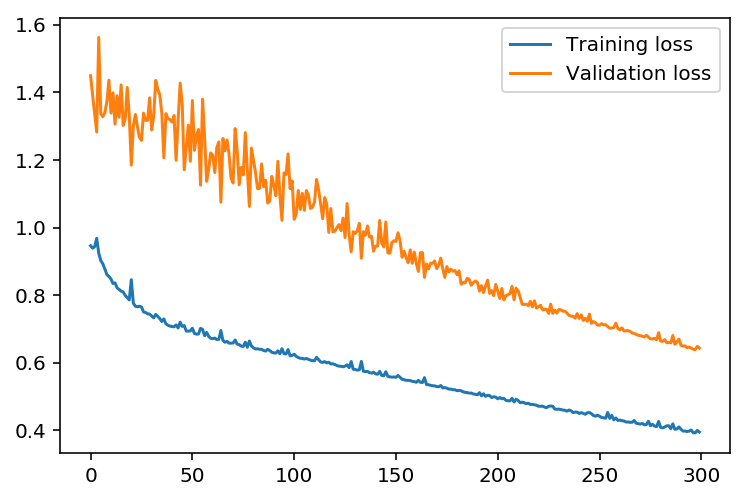

In [20]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## 检查预测结果

使用测试数据看看网络对数据建模的效果如何。如果完全错了，请确保网络中的每步都正确实现。

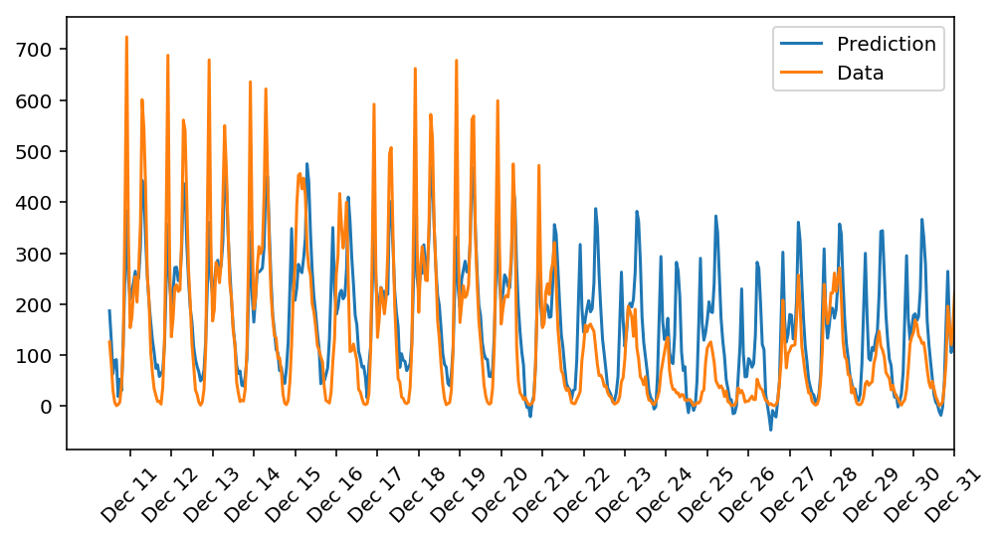

In [22]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## 可选：思考下你的结果（我们不会评估这道题的答案）

 
请针对你的结果回答以下问题。模型对数据的预测效果如何？哪里出现问题了？为何出现问题呢？

> **注意**：你可以通过双击该单元编辑文本。如果想要预览文本，请按 Control + Enter
拟合效果一般，隐层数量决定预测出的结果越准确。学习速率越低，更新迭代速度越慢，但是结果越精确.但是都是tradeoff,太精确又会导致泛化性低，并且梯度下降方法较SGD会陷入局部最优。
#### 请将你的答案填写在下方
